## UN SDG (Sustainable Developement Goals) Data Science Challenge

Welcome to UN SDG (Sustainable Developement Goals)'s DS Challenge. In this challenge, you will explore California wildfires and wildfire weather. Using data, including but not limited to the provided data, please explore the following using visualization, trend analysis, and machine learning:

# 1. What is the distribution of wildfires in California?

----> The distribution of wildfire is represented at a yearly and monthly level with aggregrated statistics also highlighted

# 2. Is there any trend in the wildfire frequency and severity (acres burned)?

  ---> The wildfires as represented on a temporal scale seem to be increasing in their total severity as can be inferred from the yearwise distribution, the frequency of wildfires seem to be variable showing a lot of highs and some lows. The frequency of wildfires is also likely to be influenced by human error and a single big wildfire may be counted as multiple small wildfires. To eradicate such anomalous behaviour, a zip code level polygon shape method may be used to collate all nearby wildfires upto a threshold distance as a single occurence.

# 3. Is there any trend in climate?

--> It is hard to gather objective day level climate on the days of wildfire due to limitation on free weather api calls either on NOAA dataset and / or other api web calls, which all have a daily limit between 100-300 calls per day. Making it intractable to measure the temperature as well as the humidity and precipitation in the relevant area  from a period of 48 hrs before the wildifre started. Still a prelimniary look at the average temperatures in California for past 30 years clearly indicate a heightened temperature during the months of August and September, also verifying our analysis. There has also been an upward slope of temperature across the years as shown by 


![https://earthobservatory.nasa.gov/images/7596/california-temperatures-on-the-rise](./increase_in_ca_temp.jpg) 

There is an apporximate increase of 2 degrees Fahrenheit in temp across California for past 50 years 1950-2000


# 4. What are the major factors affecting frequency and severity of wildfires?

---> The major factors affecting the frequency and severity of wildfires is the region they are located in and by prelimniary analysis the climate that area has (i.e. dry high winds, with moderately high temperatures). A more detailed analysis is required with accurate zip code level analysis of temperature to more astutely convey how closeness to sources of fire i.e. houses, camping trails, power lines etc play a role in setting up the wildfires. There may also be a correlation (as yet undeterminded) with how well equipped a neighbourhood is with respect to its budget, which might influence patrol by forest rangers, and other protective measure such as quality and use of fire resitant timber for home construction. 






# 5. Can you build models that predicts annual/monthly (1) frequency wildfires, (2) severity of wildfires (by acres burned)?

---> As the data in my analysis is pretty limited and due to time crunch, I won't be going deep into building the model and merely utilizing the pretty basic Xgboost to model. Note that the model is built on a data grouped by monthly and similar technique has been used to model for monthly frequency and severity of wildfires









## To get more detailed information about the problem :

We first start by collecting the useful data, the Wildfire burn data is quite useful , while it is hard to make sense of weather data, as there has been no corresponding annotation/readme of the data available neither is its source clear, making it quite hard to figure out what the dataset actually relates to. 


I tried building a data source using the zip code level information collected from arcGIS and optimized it with multiprocessing to speed up the process significantly. As i have the zip codes, I initiated to plot the year level and month level wildfire occurrence both in terms of severity and frequency. I plotted them both on the bar plot with their corresponding trend lines, through which it is quite clear that there is a large correlation between  wildfire frequency and severity.


Furthermore as I discovered that the month of August is pretty clearly the month with the highest occurence and most severe wildfires. 

This is also verified by trend in climate as per the [data collected from][1] for 30 years between the span of 1980-2010

[1]:https://weatherspark.com/

![Average Weather for California](./average_weather_for_california.png)


Furthermore on analyzing the FPA Kaggle 1.88 millionn Fires dataset, it is clear that it is similar to the other dataset but has more samples across years. The nomenclature of several columns is as yet not well defined 


weather data (from NOAA): https://drive.google.com/file/d/1AFlb7WMZ-9rCL5FfM9Ah5VCjE1Ml7rli/view?usp=sharing
wildfire burn data: 
1. https://wfdss.usgs.gov/wfdss/WFDSS_Data_Downloads.shtml
2. https://www.kaggle.com/rtatman/188-million-us-wildfires/metadata
3. https://mtbs.gov/direct-download

In [25]:
%matplotlib inline
import matplotlib
import numpy as np
import matplotlib.pyplot as plt 
import sys
from tqdm import tqdm

!{sys.executable} -m pip install dbfread
!{sys.executable} -m pip install simpledbf
!{sys.executable} -m pip install geopy
!{sys.executable} -m pip install xgboost


# !{sys.executable} -m pip install geopandas
# !{sys.executable} -m pip install plotly-geo




     |████████████████████████████████| 166.7MB 4.7MB/s eta 0:00:012     |███████████████████████████     | 140.6MB 12.3MB/s eta 0:00:03


In [26]:
from dbfread import DBF
import pandas as pd
import geopandas as gp
import shapely
import shapefile
import plotly
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode()
from simpledbf import Dbf5
import multiprocessing
from geopy.geocoders import Nominatim
from multiprocessing import  Pool
from functools import partial
from arcgis.geocoding import reverse_geocode
from arcgis.geometry import Geometry
from arcgis.gis import GIS
from matplotlib.pyplot import figure
from sklearn.linear_model import Ridge
import geopy, requests, sqlite3

from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score




# df_shapefile = gp.read_file("./shapefile_us_counties/cb_2018_06_bg_500k.shp")

# for record in DBF('./S_USA.MTBS_FIRE_OCCURRENCE_PT/S_USA.MTBS_FIRE_OCCURRENCE_PT.dbf'):
#     print(record)



## First analyszing the MBTS  Dataset by merging it and then getting the correct reverse geo encoding to get the address, then plotting the corresponding severity and frequency plots per year and per month. Ideally I would like to perform this on a Chlorpeth map, but due to issues with api limitations on free account TBD

In [3]:

dbf = Dbf5('./S_USA.MTBS_FIRE_OCCURRENCE_PT/S_USA.MTBS_FIRE_OCCURRENCE_PT.dbf')
df_fire_occurence = dbf.to_dataframe().sort_values(by=['FIRE_ID'])
print (df_fire_occurence.head())
print(len(df_fire_occurence))

                     FIRE_ID         FIRE_NAME     ASMNT_TYPE          PRE_ID  \
4472   AK5674215793820060522      MESHIK RIVER        Initial  70720202001149   
12276  AK5759815753720050529       PILOT POINT       Extended  70720202002168   
10579  AK5761615232120150828       TWIN CREEKS       Extended  80690202013265   
3183   AK5884115754320150622  COPENHAGEN CREEK  Extended (SS)            NULL   
11687  AK5884415640120150621       PAULS CREEK       Extended  80720192013190   

            POST_ID FIRE_TYPE  NODATA_THR  GREENNESS_  LOW_THRESH  MODERATE_T  \
4472   5.072020e+13  Wildfire      -970.0      -150.0       125.0       287.0   
12276  5.072020e+13  Wildfire      -970.0      -150.0       200.0       650.0   
10579  8.069020e+13  Wildfire      -970.0      -150.0        50.0       297.0   
3183   8.072019e+13  Wildfire         0.0         0.0       430.0       200.0   
11687  8.072019e+13  Wildfire      -970.0      -150.0        30.0       290.0   

       HIGH_THRES     IG_D

In [4]:
dbf = Dbf5('./S_USA.MTBS_BURN_AREA_BOUNDARY/S_USA.MTBS_BURN_AREA_BOUNDARY.dbf')
df_burn_area = dbf.to_dataframe().sort_values(by=['FIRE_ID'])
print (df_burn_area.head())
print(len(df_burn_area))


                  FIRE_ID         FIRE_NAME  YEAR  STARTMONTH  STARTDAY  \
14  AK5674215793820060522      MESHIK RIVER  2006           5        22   
15  AK5759815753720050529       PILOT POINT  2005           5        29   
0   AK5761615232120150828       TWIN CREEKS  2015           8        28   
1   AK5884115754320150622  COPENHAGEN CREEK  2015           6        22   
2   AK5884415640120150621       PAULS CREEK  2015           6        21   

   FIRE_TYPE   ACRES  SHAPE_AREA  SHAPE_LEN  
14  Wildfire  1520.0    0.000903   0.196442  
15  Wildfire  4482.0    0.002724   0.323033  
0   Wildfire  3419.0    0.002078   0.548885  
1   Wildfire  5335.0    0.003356   0.415451  
2   Wildfire  9684.0    0.006095   0.681354  
22969


In [5]:
merged_df = pd.merge(df_burn_area, df_fire_occurence, on='FIRE_ID', how='left')

print(len(merged_df))
print(merged_df.head() )

22969
                 FIRE_ID       FIRE_NAME_x  YEAR  STARTMONTH  STARTDAY  \
0  AK5674215793820060522      MESHIK RIVER  2006           5        22   
1  AK5759815753720050529       PILOT POINT  2005           5        29   
2  AK5761615232120150828       TWIN CREEKS  2015           8        28   
3  AK5884115754320150622  COPENHAGEN CREEK  2015           6        22   
4  AK5884415640120150621       PAULS CREEK  2015           6        21   

  FIRE_TYPE_x  ACRES_x  SHAPE_AREA  SHAPE_LEN       FIRE_NAME_y  ...  \
0    Wildfire   1520.0    0.000903   0.196442      MESHIK RIVER  ...   
1    Wildfire   4482.0    0.002724   0.323033       PILOT POINT  ...   
2    Wildfire   3419.0    0.002078   0.548885       TWIN CREEKS  ...   
3    Wildfire   5335.0    0.003356   0.415451  COPENHAGEN CREEK  ...   
4    Wildfire   9684.0    0.006095   0.681354       PAULS CREEK  ...   

  FIRE_TYPE_y NODATA_THR  GREENNESS_ LOW_THRESH  MODERATE_T  HIGH_THRES  \
0    Wildfire     -970.0      -150.0     

In [28]:



tqdm.pandas()



def parallelize(data, func, num_of_processes=24):
    data_split = np.array_split(data, num_of_processes)
    pool = Pool(num_of_processes)
    data = pd.concat(pool.map(func, data_split))
    pool.close()
    pool.join()
    return data

def run_on_subset(func, data_subset):
    return data_subset.progress_apply(func, axis=1)

def parallelize_on_rows(data, func, num_of_processes=8):
    return parallelize(data, partial(run_on_subset, func), num_of_processes)



# def get_state(row):
#     Latitude = str(row['LATITUDE'])  
#     Longitude = str(row['LONGITUDE'])
#     location = geolocator.reverse(Latitude+","+Longitude)
#     address = location.raw['address']
#     state = address.get('state', '')
#     print(state)
#     return state

def get_state(row):
    Latitude = row['LATITUDE']  
    Longitude = row['LONGITUDE']
    #print(" Latitude {} and Logintude {} ".format(Latitude, Longitude))
    location = reverse_geocode((Geometry({"x":float(Longitude), "y":float(Latitude), "spatialReference":{"wkid": 4326}})))
    tmp_str =  location['address']['Match_addr'] + " # " + location['address']['Region'] + " # " + location['address']['Postal']
    print(tmp_str)
    return tmp_str



username = username
password = password

gis = GIS("http://www.arcgis.com", username, password)


# lat  = merged_df['LATITUDE'].to_list()
# long  = merged_df['LONGITUDE'].to_list()

# tmp_df = pd.DataFrame({
#     'lat' : lat,
#     'long' : long
# })

# print(tmp)

output_df = parallelize_on_rows(merged_df, get_state) 





# zipcodes = df.apply(get_zipcode, axis=1, geolocator=geolocator, lat_field='Lat', lon_field='Lon')



output_df.to_pickle("./output/output_of_merged_df_burn_area_and_df_fire_occurence.pkl")
    

print(output_df.head())





  0%|          | 0/2872 [00:00<?, ?it/s]

  0%|          | 0/2871 [00:00<?, ?it/s]



  0%|          | 0/2871 [00:00<?, ?it/s]

  0%|          | 0/2871 [00:00<?, ?it/s]

  0%|          | 0/2871 [00:00<?, ?it/s]

  0%|          | 0/2871 [00:00<?, ?it/s]

  0%|          | 0/2871 [00:00<?, ?it/s]

99549, Port Heiden, Alaska # Alaska # 99549




  0%|          | 2/2872 [00:06<2:38:59,  3.32s/it]

74963, Watson, Oklahoma # Oklahoma # 74963
32570, Milton, Florida # Florida # 32570




  0%|          | 2/2871 [00:06<2:43:52,  3.43s/it]

  0%|          | 2/2871 [00:06<2:45:32,  3.46s/it]

34269, Arcadia, Florida # Florida # 34269




  0%|          | 2/2871 [00:06<2:46:17,  3.48s/it]

86432, Littlefield, Arizona # Arizona # 86432




  0%|          | 2/2871 [00:07<2:47:59,  3.51s/it]

59075, Saint Xavier, Montana # Montana # 59075




  0%|          | 2/2871 [00:07<2:54:22,  3.65s/it]

66850, Elmdale, Kansas # Kansas # 66850




  0%|          | 2/2871 [00:07<3:04:34,  3.86s/it]

McFaddin National Wildlife Refuge # Texas # 77640




  0%|          | 2/2871 [00:08<3:13:07,  4.04s/it]

99548, Chignik Lake, Alaska # Alaska # 99548




  0%|          | 3/2872 [00:08<2:13:55,  2.80s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432
73438, Healdton, Oklahoma # Oklahoma # 73438




  0%|          | 3/2871 [00:08<2:20:10,  2.93s/it]

34266, Arcadia, Florida # Florida # 34266




  0%|          | 3/2871 [00:08<2:18:09,  2.89s/it]

  0%|          | 3/2871 [00:08<2:19:34,  2.92s/it]

32570, Milton, Florida # Florida # 32570




  0%|          | 3/2871 [00:08<2:20:02,  2.93s/it]

59031, Garryowen, Montana # Montana # 59031




  0%|          | 3/2871 [00:08<2:25:31,  3.04s/it]

2201-2329 240th Rd, Strong City, Kansas, 66869 # Kansas # 66869




  0%|          | 3/2871 [00:09<2:32:40,  3.19s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99615, Kodiak, Alaska # Alaska # 99615




  0%|          | 3/2871 [00:09<2:38:36,  3.32s/it]

  0%|          | 4/2872 [00:09<1:57:04,  2.45s/it]

34974, Okeechobee, Florida # Florida # 34974
74724, Bethel, Oklahoma # Oklahoma # 74724




  0%|          | 4/2871 [00:10<2:01:09,  2.54s/it]

86432, Littlefield, Arizona # Arizona # 86432




  0%|          | 4/2871 [00:10<2:00:11,  2.52s/it]

  0%|          | 4/2871 [00:10<2:01:42,  2.55s/it]

32570, Milton, Florida # Florida # 32570




  0%|          | 4/2871 [00:10<2:01:14,  2.54s/it]

Custer National Forest # Montana # 59062




  0%|          | 4/2871 [00:10<2:05:19,  2.62s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




  0%|          | 4/2871 [00:11<2:10:21,  2.73s/it]

99569, Clarks Point, Alaska # Alaska # 99569




  0%|          | 5/2872 [00:11<1:44:54,  2.20s/it]

McFaddin National Wildlife Refuge # Texas # 77640




  0%|          | 4/2871 [00:11<2:14:32,  2.82s/it]

32570, Milton, Florida # Florida # 32570




  0%|          | 5/2871 [00:11<1:46:35,  2.23s/it]

34266, Arcadia, Florida # Florida # 34266


86432, Littlefield, Arizona # Arizona # 86432


  0%|          | 5/2871 [00:11<1:47:16,  2.25s/it]

  0%|          | 5/2871 [00:11<1:47:42,  2.25s/it]

74525, Atoka, Oklahoma # Oklahoma # 74525




  0%|          | 5/2871 [00:11<1:47:20,  2.25s/it]

59043, Lame Deer, Montana # Montana # 59043




  0%|          | 5/2871 [00:12<1:49:41,  2.30s/it]

66801, Emporia, Kansas # Kansas # 66801




  0%|          | 5/2871 [00:12<1:53:10,  2.37s/it]

99613, King Salmon, Alaska # Alaska # 99613
McFaddin National Wildlife Refuge # Texas # 77640




  0%|          | 6/2872 [00:13<1:35:54,  2.01s/it]

  0%|          | 5/2871 [00:12<1:56:05,  2.43s/it]

32531, Baker, Florida # Florida # 32531
34291, North Port, Florida # Florida # 34291
74724, Bethel, Oklahoma # Oklahoma # 74724
Grand Canyon-Parashant National Mon # Arizona # 86432




  0%|          | 6/2871 [00:13<1:37:52,  2.05s/it]

  0%|          | 6/2871 [00:13<1:38:05,  2.05s/it]

  0%|          | 6/2871 [00:13<1:38:13,  2.06s/it]

  0%|          | 6/2871 [00:13<1:37:23,  2.04s/it]

59031, Garryowen, Montana # Montana # 59031




  0%|          | 6/2871 [00:13<1:40:14,  2.10s/it]

66850, Elmdale, Kansas # Kansas # 66850




  0%|          | 6/2871 [00:14<1:42:41,  2.15s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99569, Clarks Point, Alaska # Alaska # 99569




  0%|          | 7/2872 [00:14<1:30:36,  1.90s/it]

  0%|          | 6/2871 [00:14<1:44:43,  2.19s/it]

86022, Fredonia, Arizona # Arizona # 86022
33960, Venus, Florida # Florida # 33960




  0%|          | 7/2871 [00:15<1:32:09,  1.93s/it]

32531, Baker, Florida # Florida # 32531




  0%|          | 7/2871 [00:15<1:32:04,  1.93s/it]

  0%|          | 7/2871 [00:15<1:32:04,  1.93s/it]

74735, Fort Towson, Oklahoma # Oklahoma # 74735




  0%|          | 7/2871 [00:14<1:32:08,  1.93s/it]

59070, Roberts, Montana # Montana # 59070




  0%|          | 7/2871 [00:15<1:33:34,  1.96s/it]

2600-2698 260th Rd, Emporia, Kansas, 66801 # Kansas # 66801




  0%|          | 7/2871 [00:15<1:35:18,  2.00s/it]

99576, Dillingham, Alaska # Alaska # 99576
McFaddin National Wildlife Refuge # Texas # 77640




  0%|          | 8/2872 [00:16<1:26:50,  1.82s/it]

  0%|          | 7/2871 [00:16<1:36:43,  2.03s/it]

32531, Baker, Florida # Florida # 32531
86022, Fredonia, Arizona # Arizona # 86022


34291, North Port, Florida # Florida # 34291


  0%|          | 8/2871 [00:16<1:27:44,  1.84s/it]

  0%|          | 8/2871 [00:16<1:27:59,  1.84s/it]

  0%|          | 8/2871 [00:16<1:27:55,  1.84s/it]

74562, Rattan, Oklahoma # Oklahoma # 74562




  0%|          | 8/2871 [00:16<1:28:02,  1.84s/it]

59317, Broadus, Montana # Montana # 59317




  0%|          | 8/2871 [00:17<1:28:57,  1.86s/it]

66869, Strong City, Kansas # Kansas # 66869




  0%|          | 8/2871 [00:17<1:30:08,  1.89s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99606, Iliamna, Alaska # Alaska # 99606




  0%|          | 8/2871 [00:17<1:31:07,  1.91s/it]

  0%|          | 9/2872 [00:17<1:24:12,  1.76s/it]

34266, Arcadia, Florida # Florida # 34266
86432, Littlefield, Arizona # Arizona # 86432
74963, Watson, Oklahoma # Oklahoma # 74963
2950-3298 Old Martin Rd, Milton, Florida, 32570 # Florida # 32570




  0%|          | 9/2871 [00:18<1:24:56,  1.78s/it]

  0%|          | 9/2871 [00:18<1:25:00,  1.78s/it]

  0%|          | 9/2871 [00:18<1:24:25,  1.77s/it]

  0%|          | 9/2871 [00:18<1:24:56,  1.78s/it]

59043, Lame Deer, Montana # Montana # 59043




  0%|          | 9/2871 [00:18<1:24:56,  1.78s/it]

66850, Elmdale, Kansas # Kansas # 66850




  0%|          | 9/2871 [00:18<1:24:26,  1.77s/it]

McFaddin National Wildlife Refuge # Texas # 77640




  0%|          | 9/2871 [00:19<1:24:16,  1.77s/it]

99625, Levelock, Alaska # Alaska # 99625




  0%|          | 10/2872 [00:19<1:20:17,  1.68s/it]

NF-2315, Fredonia, Arizona, 86022 # Arizona # 86022




  0%|          | 10/2871 [00:19<1:20:00,  1.68s/it]

34292, Venice, Florida # Florida # 34292




  0%|          | 10/2871 [00:19<1:20:50,  1.70s/it]

2085-3299 Three Notch Trl, Milton, Florida, 32570 # Florida # 32570




  0%|          | 10/2871 [00:19<1:21:08,  1.70s/it]

74856, Mill Creek, Oklahoma # Oklahoma # 74856




  0%|          | 10/2871 [00:19<1:21:27,  1.71s/it]

59043, Lame Deer, Montana # Montana # 59043




  0%|          | 10/2871 [00:20<1:20:33,  1.69s/it]

66869, Strong City, Kansas # Kansas # 66869




  0%|          | 10/2871 [00:20<1:19:29,  1.67s/it]

McFaddin National Wildlife Refuge # Texas # 77640




  0%|          | 10/2871 [00:20<1:19:53,  1.68s/it]

99678, Togiak, Alaska # Alaska # 99678




  0%|          | 11/2872 [00:20<1:16:32,  1.61s/it]

86432, Littlefield, Arizona # Arizona # 86432




  0%|          | 11/2871 [00:21<1:16:23,  1.60s/it]

34266, Arcadia, Florida # Florida # 34266




  0%|          | 11/2871 [00:21<1:17:21,  1.62s/it]

32570, Milton, Florida # Florida # 32570




  0%|          | 11/2871 [00:21<1:17:13,  1.62s/it]

74856, Mill Creek, Oklahoma # Oklahoma # 74856




  0%|          | 11/2871 [00:21<1:18:11,  1.64s/it]

59761, Wisdom, Montana # Montana # 59761




  0%|          | 11/2871 [00:21<1:17:32,  1.63s/it]

Ranch Legacy Trl, Strong City, Kansas, 66869 # Kansas # 66869




  0%|          | 11/2871 [00:21<1:16:37,  1.61s/it]

McFaddin National Wildlife Refuge # Texas # 77640




  0%|          | 11/2871 [00:22<1:17:02,  1.62s/it]

99678, Togiak, Alaska # Alaska # 99678




  0%|          | 12/2872 [00:22<1:14:32,  1.56s/it]

86022, Fredonia, Arizona # Arizona # 86022




  0%|          | 12/2871 [00:22<1:14:21,  1.56s/it]

33960, Venus, Florida # Florida # 33960




  0%|          | 12/2871 [00:22<1:15:00,  1.57s/it]

32570, Milton, Florida # Florida # 32570




  0%|          | 12/2871 [00:22<1:15:34,  1.59s/it]

73463, Wilson, Oklahoma # Oklahoma # 73463




  0%|          | 12/2871 [00:22<1:14:56,  1.57s/it]

59031, Garryowen, Montana # Montana # 59031




  0%|          | 12/2871 [00:23<1:16:03,  1.60s/it]

66869, Strong City, Kansas # Kansas # 66869




  0%|          | 12/2871 [00:23<1:14:18,  1.56s/it]

99636, New Stuyahok, Alaska # Alaska # 99636


McFaddin National Wildlife Refuge # Texas # 77640


  0%|          | 13/2872 [00:23<1:12:49,  1.53s/it]

  0%|          | 12/2871 [00:23<1:14:42,  1.57s/it]

86432, Littlefield, Arizona # Arizona # 86432




  0%|          | 13/2871 [00:24<1:13:47,  1.55s/it]

33852, Lake Placid, Florida # Florida # 33852




  0%|          | 13/2871 [00:24<1:13:42,  1.55s/it]

32531, Baker, Florida # Florida # 32531




  0%|          | 13/2871 [00:24<1:13:29,  1.54s/it]

74728, Broken Bow, Oklahoma # Oklahoma # 74728




  0%|          | 13/2871 [00:24<1:13:06,  1.53s/it]

59317, Broadus, Montana # Montana # 59317




  0%|          | 13/2871 [00:24<1:13:18,  1.54s/it]

66869, Strong City, Kansas # Kansas # 66869




  0%|          | 13/2871 [00:24<1:15:25,  1.58s/it]

McFaddin National Wildlife Refuge # Texas # 77640




  0%|          | 13/2871 [00:25<1:15:11,  1.58s/it]

99636, New Stuyahok, Alaska # Alaska # 99636




  0%|          | 14/2872 [00:25<1:14:06,  1.56s/it]

34292, Venice, Florida # Florida # 34292
NF-279B, Fredonia, Arizona, 86022 # Arizona # 86022




  0%|          | 14/2871 [00:25<1:12:37,  1.53s/it]

74728, Broken Bow, Oklahoma # Oklahoma # 74728




  0%|          | 14/2871 [00:25<1:13:21,  1.54s/it]

  0%|          | 14/2871 [00:25<1:12:03,  1.51s/it]

32531, Baker, Florida # Florida # 32531




  0%|          | 14/2871 [00:25<1:13:36,  1.55s/it]

57724, Camp Crook, South Dakota # South Dakota # 57724




  0%|          | 14/2871 [00:26<1:13:15,  1.54s/it]

Ranch Legacy Trl, Strong City, Kansas, 66869 # Kansas # 66869




  0%|          | 14/2871 [00:26<1:14:43,  1.57s/it]

99636, New Stuyahok, Alaska # Alaska # 99636
McFaddin National Wildlife Refuge # Texas # 77640




  1%|          | 15/2872 [00:26<1:14:10,  1.56s/it]

  0%|          | 14/2871 [00:26<1:15:09,  1.58s/it]

86514, Teec Nos Pos, Arizona # Arizona # 86514
32570, Milton, Florida # Florida # 32570
1-1999 Westgate Rd, Broken Bow, Oklahoma, 74728 # Oklahoma # 74728




  1%|          | 15/2871 [00:27<1:14:45,  1.57s/it]



34291, North Port, Florida # Florida # 34291


  1%|          | 15/2871 [00:27<1:13:42,  1.55s/it]

  1%|          | 15/2871 [00:27<1:13:48,  1.55s/it]

  1%|          | 15/2871 [00:27<1:14:23,  1.56s/it]

59019, Columbus, Montana # Montana # 59019




  1%|          | 15/2871 [00:27<1:14:39,  1.57s/it]

66869, Strong City, Kansas # Kansas # 66869




  1%|          | 15/2871 [00:28<1:15:42,  1.59s/it]

McFaddin National Wildlife Refuge # Texas # 77640
Ninilchik ANVSA # Alaska # 




  1%|          | 15/2871 [00:28<1:16:02,  1.60s/it]

  1%|          | 16/2872 [00:28<1:15:21,  1.58s/it]

34266, Arcadia, Florida # Florida # 34266
32570, Milton, Florida # Florida # 32570
74963, Watson, Oklahoma # Oklahoma # 74963
86432, Littlefield, Arizona # Arizona # 86432




  1%|          | 16/2871 [00:28<1:14:59,  1.58s/it]

  1%|          | 16/2871 [00:28<1:14:56,  1.58s/it]

  1%|          | 16/2871 [00:28<1:15:41,  1.59s/it]

  1%|          | 16/2871 [00:28<1:15:16,  1.58s/it]

59043, Lame Deer, Montana # Montana # 59043




  1%|          | 16/2871 [00:29<1:15:38,  1.59s/it]

66858, Lincolnville, Kansas # Kansas # 66858




  1%|          | 16/2871 [00:29<1:16:20,  1.60s/it]

Iliamna ANVSA # Alaska # 




  1%|          | 17/2872 [00:30<1:15:01,  1.58s/it]

McFaddin National Wildlife Refuge # Texas # 77640




  1%|          | 16/2871 [00:30<1:15:49,  1.59s/it]

86432, Littlefield, Arizona # Arizona # 86432
32570, Milton, Florida # Florida # 32570
33960, Venus, Florida # Florida # 33960
74963, Watson, Oklahoma # Oklahoma # 74963




  1%|          | 17/2871 [00:30<1:14:52,  1.57s/it]

  1%|          | 17/2871 [00:30<1:14:21,  1.56s/it]

  1%|          | 17/2871 [00:30<1:14:35,  1.57s/it]

  1%|          | 17/2871 [00:30<1:14:24,  1.56s/it]

Gallatin National Forest # Montana # 59069




  1%|          | 17/2871 [00:30<1:14:50,  1.57s/it]

66869, Strong City, Kansas # Kansas # 66869




  1%|          | 17/2871 [00:31<1:15:21,  1.58s/it]

99636, New Stuyahok, Alaska # Alaska # 99636




  1%|          | 18/2872 [00:31<1:15:19,  1.58s/it]

McFaddin National Wildlife Refuge # Texas # 77640




  1%|          | 17/2871 [00:31<1:15:39,  1.59s/it]

86432, Littlefield, Arizona # Arizona # 86432
32531, Baker, Florida # Florida # 32531




  1%|          | 18/2871 [00:32<1:14:20,  1.56s/it]

33852, Lake Placid, Florida # Florida # 33852




  1%|          | 18/2871 [00:32<1:13:58,  1.56s/it]

  1%|          | 18/2871 [00:32<1:14:13,  1.56s/it]

52360, Broken Bow, Oklahoma, 74728 # Oklahoma # 74728




  1%|          | 18/2871 [00:31<1:14:36,  1.57s/it]

59052, Mc Leod, Montana # Montana # 59052




  1%|          | 18/2871 [00:32<1:14:15,  1.56s/it]

2449-2563 Y Y Rd, Emporia, Kansas, 66801 # Kansas # 66801




  1%|          | 18/2871 [00:32<1:14:38,  1.57s/it]

99639, Ninilchik, Alaska # Alaska # 99639
McFaddin National Wildlife Refuge # Texas # 77640




  1%|          | 18/2871 [00:33<1:14:56,  1.58s/it]

  1%|          | 19/2872 [00:33<1:14:47,  1.57s/it]

86432, Littlefield, Arizona # Arizona # 86432
11533-11899 Cimmaron Rd, Healdton, Oklahoma, 73438 # Oklahoma # 73438
34266, Arcadia, Florida # Florida # 34266




  1%|          | 19/2871 [00:33<1:15:21,  1.59s/it]

  1%|          | 19/2871 [00:33<1:14:56,  1.58s/it]



32570, Milton, Florida # Florida # 32570


  1%|          | 19/2871 [00:33<1:15:11,  1.58s/it]

  1%|          | 19/2871 [00:33<1:15:16,  1.58s/it]

59034, Hardin, Montana # Montana # 59034




  1%|          | 19/2871 [00:34<1:15:17,  1.58s/it]

66856, Lebo, Kansas # Kansas # 66856




  1%|          | 19/2871 [00:34<1:15:34,  1.59s/it]

99669, Soldotna, Alaska # Alaska # 99669
McFaddin National Wildlife Refuge # Texas # 77640




  1%|          | 20/2872 [00:34<1:15:38,  1.59s/it]

  1%|          | 19/2871 [00:34<1:15:44,  1.59s/it]

32570, Milton, Florida # Florida # 32570
86036, Marble Canyon, Arizona # Arizona # 86036
34292, Venice, Florida # Florida # 34292




  1%|          | 20/2871 [00:35<1:15:51,  1.60s/it]

73460, Tishomingo, Oklahoma # Oklahoma # 73460




  1%|          | 20/2871 [00:35<1:16:05,  1.60s/it]

  1%|          | 20/2871 [00:35<1:15:58,  1.60s/it]

  1%|          | 20/2871 [00:35<1:15:50,  1.60s/it]

59044, Laurel, Montana # Montana # 59044




  1%|          | 20/2871 [00:35<1:16:05,  1.60s/it]

Scenic Overlook Trl, Strong City, Kansas, 66869 # Kansas # 66869




  1%|          | 20/2871 [00:36<1:16:13,  1.60s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99669, Soldotna, Alaska # Alaska # 99669




  1%|          | 20/2871 [00:36<1:16:23,  1.61s/it]

  1%|          | 21/2872 [00:36<1:16:19,  1.61s/it]

Kaibab Indian Reservation # Arizona # 
34286, North Port, Florida # Florida # 34286
32531, Baker, Florida # Florida # 32531
73458, Springer, Oklahoma # Oklahoma # 73458




  1%|          | 21/2871 [00:36<1:16:35,  1.61s/it]

  1%|          | 21/2871 [00:36<1:16:31,  1.61s/it]

  1%|          | 21/2871 [00:36<1:16:28,  1.61s/it]

  1%|          | 21/2871 [00:36<1:16:25,  1.61s/it]

59031, Garryowen, Montana # Montana # 59031




  1%|          | 21/2871 [00:37<1:16:33,  1.61s/it]

66856, Lebo, Kansas # Kansas # 66856




  1%|          | 21/2871 [00:37<1:16:42,  1.61s/it]

99606, Iliamna, Alaska # Alaska # 99606
McFaddin National Wildlife Refuge # Texas # 77640




  1%|          | 22/2872 [00:38<1:16:45,  1.62s/it]

  1%|          | 21/2871 [00:38<1:16:48,  1.62s/it]

32531, Baker, Florida # Florida # 32531
74569, Stringtown, Oklahoma # Oklahoma # 74569
34292, Venice, Florida # Florida # 34292
91917, Dulzura, California # California # 91917




  1%|          | 22/2871 [00:38<1:16:51,  1.62s/it]

  1%|          | 22/2871 [00:38<1:16:45,  1.62s/it]

  1%|          | 22/2871 [00:38<1:16:55,  1.62s/it]

  1%|          | 22/2871 [00:38<1:16:48,  1.62s/it]

Gallatin National Forest # Montana # 59069




  1%|          | 22/2871 [00:38<1:16:58,  1.62s/it]

2600-2798 X Rd, Strong City, Kansas, 66869 # Kansas # 66869




  1%|          | 22/2871 [00:39<1:17:01,  1.62s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99639, Ninilchik, Alaska # Alaska # 99639




  1%|          | 22/2871 [00:39<1:17:03,  1.62s/it]

  1%|          | 23/2872 [00:39<1:17:01,  1.62s/it]

32531, Baker, Florida # Florida # 32531
34292, Venice, Florida # Florida # 34292
91917, Dulzura, California # California # 91917
73458, Springer, Oklahoma # Oklahoma # 73458




  1%|          | 23/2871 [00:40<1:17:07,  1.62s/it]

  1%|          | 23/2871 [00:40<1:17:04,  1.62s/it]

  1%|          | 23/2871 [00:40<1:17:09,  1.63s/it]

  1%|          | 23/2871 [00:40<1:17:02,  1.62s/it]

59043, Lame Deer, Montana # Montana # 59043




  1%|          | 23/2871 [00:40<1:17:09,  1.63s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




  1%|          | 23/2871 [00:40<1:17:11,  1.63s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99559, Bethel, Alaska # Alaska # 99559




  1%|          | 23/2871 [00:41<1:17:16,  1.63s/it]

  1%|          | 24/2872 [00:41<1:17:14,  1.63s/it]

32531, Baker, Florida # Florida # 32531
74562, Rattan, Oklahoma # Oklahoma # 74562
34292, Venice, Florida # Florida # 34292
Tecate, Baja California # Baja California # 




  1%|          | 24/2871 [00:41<1:17:15,  1.63s/it]

  1%|          | 24/2871 [00:41<1:17:17,  1.63s/it]

  1%|          | 24/2871 [00:41<1:17:14,  1.63s/it]

  1%|          | 24/2871 [00:41<1:17:19,  1.63s/it]

59317, Broadus, Montana # Montana # 59317




  1%|          | 24/2871 [00:42<1:17:19,  1.63s/it]

66858, Lincolnville, Kansas # Kansas # 66858




  1%|          | 24/2871 [00:42<1:17:21,  1.63s/it]

77640, Port Arthur, Texas # Texas # 77640
99606, Iliamna, Alaska # Alaska # 99606




  1%|          | 24/2871 [00:42<1:17:22,  1.63s/it]

  1%|          | 25/2872 [00:43<1:17:20,  1.63s/it]

32570, Milton, Florida # Florida # 32570
74525, Atoka, Oklahoma # Oklahoma # 74525
Tecate, Baja California # Baja California # 
34286, North Port, Florida # Florida # 34286




  1%|          | 25/2871 [00:43<1:17:21,  1.63s/it]

  1%|          | 25/2871 [00:43<1:17:25,  1.63s/it]

  1%|          | 25/2871 [00:43<1:17:24,  1.63s/it]

  1%|          | 25/2871 [00:43<1:17:27,  1.63s/it]

59745, Norris, Montana # Montana # 59745




  1%|          | 25/2871 [00:43<1:17:25,  1.63s/it]

66856, Lebo, Kansas # Kansas # 66856




  1%|          | 25/2871 [00:44<1:16:28,  1.61s/it]

McFaddin National Wildlife Refuge # Texas # 77640




  1%|          | 25/2871 [00:44<1:15:18,  1.59s/it]

99636, New Stuyahok, Alaska # Alaska # 99636




  1%|          | 26/2872 [00:44<1:15:44,  1.60s/it]

32531, Baker, Florida # Florida # 32531




  1%|          | 26/2871 [00:44<1:14:31,  1.57s/it]

34286, North Port, Florida # Florida # 34286




  1%|          | 26/2871 [00:44<1:14:48,  1.58s/it]

91906, Campo, California # California # 91906




  1%|          | 26/2871 [00:44<1:14:56,  1.58s/it]

74555, Lane, Oklahoma # Oklahoma # 74555




  1%|          | 26/2871 [00:44<1:15:15,  1.59s/it]

59043, Lame Deer, Montana # Montana # 59043




  1%|          | 26/2871 [00:45<1:14:38,  1.57s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




  1%|          | 26/2871 [00:45<1:14:53,  1.58s/it]

McFaddin National Wildlife Refuge # Texas # 77640
Kenai National Wildlife Refuge # Alaska # 99568




  1%|          | 26/2871 [00:46<1:15:15,  1.59s/it]

  1%|          | 27/2872 [00:46<1:15:06,  1.58s/it]

Brook Ln, Atoka, Oklahoma, 74525 # Oklahoma # 74525
34956, Indiantown, Florida # Florida # 34956
32570, Milton, Florida # Florida # 32570




  1%|          | 27/2871 [00:46<1:15:13,  1.59s/it]

  1%|          | 27/2871 [00:46<1:15:21,  1.59s/it]

  1%|          | 27/2871 [00:46<1:15:26,  1.59s/it]

91917, Dulzura, California # California # 91917




  1%|          | 27/2871 [00:46<1:16:04,  1.61s/it]

Beaverhead National Forest # Montana # 59762




  1%|          | 27/2871 [00:46<1:15:27,  1.59s/it]

66856, Lebo, Kansas # Kansas # 66856




  1%|          | 27/2871 [00:47<1:15:40,  1.60s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99572, Cooper Landing, Alaska # Alaska # 99572




  1%|          | 28/2872 [00:47<1:15:50,  1.60s/it]

  1%|          | 27/2871 [00:47<1:15:56,  1.60s/it]

91917, Dulzura, California # California # 91917
32433, Defuniak Springs, Florida # Florida # 32433


34956, Indiantown, Florida # Florida # 34956


  1%|          | 28/2871 [00:48<1:15:48,  1.60s/it]

  1%|          | 28/2871 [00:48<1:16:05,  1.61s/it]

  1%|          | 28/2871 [00:48<1:16:02,  1.60s/it]

73030, Davis, Oklahoma # Oklahoma # 73030




  1%|          | 28/2871 [00:48<1:16:09,  1.61s/it]

59022, Crow Agency, Montana # Montana # 59022




  1%|          | 28/2871 [00:48<1:16:05,  1.61s/it]

66868, Reading, Kansas # Kansas # 66868




  1%|          | 28/2871 [00:48<1:16:14,  1.61s/it]

99572, Cooper Landing, Alaska # Alaska # 99572
TX-87, Port Arthur, Texas, 77640 # Texas # 77640




  1%|          | 29/2872 [00:49<1:16:20,  1.61s/it]

  1%|          | 28/2871 [00:49<1:16:24,  1.61s/it]

74525, Atoka, Oklahoma # Oklahoma # 74525
91906, Campo, California # California # 91906




  1%|          | 29/2871 [00:49<1:16:20,  1.61s/it]

  1%|          | 29/2871 [00:49<1:16:19,  1.61s/it]

34266, Arcadia, Florida # Florida # 34266




  1%|          | 29/2871 [00:49<1:17:05,  1.63s/it]

32531, Baker, Florida # Florida # 32531




  1%|          | 29/2871 [00:49<1:17:12,  1.63s/it]

59022, Crow Agency, Montana # Montana # 59022




  1%|          | 29/2871 [00:50<1:16:31,  1.62s/it]

66869, Strong City, Kansas # Kansas # 66869




  1%|          | 29/2871 [00:50<1:16:38,  1.62s/it]

99664, Seward, Alaska # Alaska # 99664
77655, Sabine Pass, Texas # Texas # 77655




  1%|          | 29/2871 [00:50<1:16:45,  1.62s/it]

  1%|          | 30/2872 [00:51<1:16:43,  1.62s/it]

32570, Milton, Florida # Florida # 32570
91915, Chula Vista, California # California # 91915




  1%|          | 30/2871 [00:51<1:16:37,  1.62s/it]

  1%|          | 30/2871 [00:51<1:16:41,  1.62s/it]

73460, Tishomingo, Oklahoma # Oklahoma # 73460




  1%|          | 30/2871 [00:51<1:16:52,  1.62s/it]

34292, Venice, Florida # Florida # 34292




  1%|          | 30/2871 [00:51<1:17:58,  1.65s/it]

59761, Wisdom, Montana # Montana # 59761




  1%|          | 30/2871 [00:51<1:16:49,  1.62s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




  1%|          | 30/2871 [00:52<1:16:53,  1.62s/it]

99572, Cooper Landing, Alaska # Alaska # 99572
McFaddin National Wildlife Refuge # Texas # 77640




  1%|          | 31/2872 [00:52<1:16:57,  1.63s/it]

  1%|          | 30/2871 [00:52<1:17:00,  1.63s/it]

32531, Baker, Florida # Florida # 32531




  1%|          | 31/2871 [00:53<1:15:48,  1.60s/it]

74569, Stringtown, Oklahoma # Oklahoma # 74569




  1%|          | 31/2871 [00:52<1:15:58,  1.61s/it]

33852, Lake Placid, Florida # Florida # 33852




  1%|          | 31/2871 [00:53<1:15:59,  1.61s/it]

91917, Dulzura, California # California # 91917




  1%|          | 31/2871 [00:53<1:16:58,  1.63s/it]

59351, Volborg, Montana # Montana # 59351




  1%|          | 31/2871 [00:53<1:15:32,  1.60s/it]

66869, Strong City, Kansas # Kansas # 66869




  1%|          | 31/2871 [00:53<1:15:36,  1.60s/it]

99669, Soldotna, Alaska # Alaska # 99669
Texas Point Natl Wildlife Refuge # Texas # 77655




  1%|          | 32/2872 [00:54<1:15:39,  1.60s/it]

  1%|          | 31/2871 [00:54<1:15:40,  1.60s/it]

74557, Moyers, Oklahoma # Oklahoma # 74557
33960, Venus, Florida # Florida # 33960
32570, Milton, Florida # Florida # 32570
Tecate, Baja California # Baja California # 




  1%|          | 32/2871 [00:54<1:15:51,  1.60s/it]

  1%|          | 32/2871 [00:54<1:15:25,  1.59s/it]

  1%|          | 32/2871 [00:54<1:15:53,  1.60s/it]

  1%|          | 32/2871 [00:54<1:15:36,  1.60s/it]

59016, Busby, Montana # Montana # 59016




  1%|          | 32/2871 [00:55<1:16:07,  1.61s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




  1%|          | 32/2871 [00:55<1:16:11,  1.61s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99559, Bethel, Alaska # Alaska # 99559




  1%|          | 32/2871 [00:55<1:16:13,  1.61s/it]

  1%|          | 33/2872 [00:55<1:16:12,  1.61s/it]

34286, North Port, Florida # Florida # 34286
73458, Springer, Oklahoma # Oklahoma # 73458
32531, Baker, Florida # Florida # 32531
91906, Campo, California # California # 91906




  1%|          | 33/2871 [00:56<1:16:21,  1.61s/it]

  1%|          | 33/2871 [00:56<1:16:04,  1.61s/it]

  1%|          | 33/2871 [00:56<1:16:23,  1.62s/it]

  1%|          | 33/2871 [00:56<1:16:11,  1.61s/it]

83525, Elk City, Idaho # Idaho # 83525




  1%|          | 33/2871 [00:56<1:16:30,  1.62s/it]

66869, Strong City, Kansas # Kansas # 66869




  1%|          | 33/2871 [00:57<1:16:33,  1.62s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99669, Soldotna, Alaska # Alaska # 99669




  1%|          | 33/2871 [00:57<1:16:35,  1.62s/it]

  1%|          | 34/2872 [00:57<1:16:34,  1.62s/it]

32570, Milton, Florida # Florida # 32570
34266, Arcadia, Florida # Florida # 34266
Petrero Park Dr, Potrero, California, 91963 # California # 91963




  1%|          | 34/2871 [00:57<1:16:39,  1.62s/it]

74856, Mill Creek, Oklahoma # Oklahoma # 74856




  1%|          | 34/2871 [00:57<1:16:26,  1.62s/it]

  1%|          | 34/2871 [00:57<1:16:30,  1.62s/it]

  1%|          | 34/2871 [00:57<1:16:43,  1.62s/it]

NF-3090, Ekalaka, Montana, 59324 # Montana # 59324




  1%|          | 34/2871 [00:58<1:16:47,  1.62s/it]

66858, Lincolnville, Kansas # Kansas # 66858




  1%|          | 34/2871 [00:58<1:16:49,  1.62s/it]

Texas Point Natl Wildlife Refuge # Texas # 77655
99572, Cooper Landing, Alaska # Alaska # 99572




  1%|          | 34/2871 [00:59<1:16:49,  1.62s/it]

  1%|          | 35/2872 [00:59<1:16:48,  1.62s/it]

34266, Arcadia, Florida # Florida # 34266
32433, Defuniak Springs, Florida # Florida # 32433
1036-1344 Harris Ranch Rd, Potrero, California, 91963 # California # 91963




  1%|          | 35/2871 [00:59<1:16:42,  1.62s/it]

73030, Davis, Oklahoma # Oklahoma # 73030




  1%|          | 35/2871 [00:59<1:16:52,  1.63s/it]

  1%|          | 35/2871 [00:59<1:16:46,  1.62s/it]

  1%|          | 35/2871 [00:59<1:17:00,  1.63s/it]

59-103 East Fork-Beaver Creek Divide Rd, Volborg, Montana, 59351 # Montana # 59351




  1%|          | 35/2871 [00:59<1:16:57,  1.63s/it]

66869, Strong City, Kansas # Kansas # 66869




  1%|          | 35/2871 [01:00<1:16:57,  1.63s/it]

77640, Port Arthur, Texas # Texas # 77640
99606, Iliamna, Alaska # Alaska # 99606




  1%|          | 35/2871 [01:00<1:16:59,  1.63s/it]

  1%|▏         | 36/2872 [01:00<1:16:59,  1.63s/it]

34292, Venice, Florida # Florida # 34292
32531, Baker, Florida # Florida # 32531


Tecate, Baja California # Baja California # 


  1%|▏         | 36/2871 [01:01<1:16:54,  1.63s/it]

  1%|▏         | 36/2871 [01:01<1:17:01,  1.63s/it]

  1%|▏         | 36/2871 [01:01<1:16:57,  1.63s/it]

73030, Davis, Oklahoma # Oklahoma # 73030




  1%|▏         | 36/2871 [01:01<1:17:33,  1.64s/it]

59829, Darby, Montana # Montana # 59829




  1%|▏         | 36/2871 [01:01<1:16:04,  1.61s/it]

66858, Lincolnville, Kansas # Kansas # 66858




  1%|▏         | 36/2871 [01:01<1:15:36,  1.60s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99572, Cooper Landing, Alaska # Alaska # 99572




  1%|▏         | 37/2872 [01:02<1:15:39,  1.60s/it]

  1%|▏         | 36/2871 [01:02<1:15:39,  1.60s/it]

32531, Baker, Florida # Florida # 32531
34286, North Port, Florida # Florida # 34286
74555, Lane, Oklahoma # Oklahoma # 74555
91963, Potrero, California # California # 91963




  1%|▏         | 37/2871 [01:02<1:15:35,  1.60s/it]

  1%|▏         | 37/2871 [01:02<1:15:25,  1.60s/it]

  1%|▏         | 37/2871 [01:02<1:15:36,  1.60s/it]

  1%|▏         | 37/2871 [01:02<1:15:39,  1.60s/it]

59829, Darby, Montana # Montana # 59829




  1%|▏         | 37/2871 [01:03<1:16:00,  1.61s/it]

66523, Osage City, Kansas # Kansas # 66523




  1%|▏         | 37/2871 [01:03<1:16:08,  1.61s/it]

99628, Manokotak, Alaska # Alaska # 99628
Texas Point Natl Wildlife Refuge # Texas # 77655




  1%|▏         | 38/2872 [01:04<1:16:07,  1.61s/it]

  1%|▏         | 37/2871 [01:03<1:16:08,  1.61s/it]

32423, Bascom, Florida # Florida # 32423
CA-125 N, Chula Vista, California, 91913 # California # 91913
34286, North Port, Florida # Florida # 34286




  1%|▏         | 38/2871 [01:04<1:16:08,  1.61s/it]

  1%|▏         | 38/2871 [01:04<1:16:05,  1.61s/it]

  1%|▏         | 38/2871 [01:04<1:16:06,  1.61s/it]

73030, Davis, Oklahoma # Oklahoma # 73030




  1%|▏         | 38/2871 [01:04<1:16:45,  1.63s/it]

59016, Busby, Montana # Montana # 59016




  1%|▏         | 38/2871 [01:04<1:16:24,  1.62s/it]

66869, Strong City, Kansas # Kansas # 66869




  1%|▏         | 38/2871 [01:05<1:16:30,  1.62s/it]

99628, Manokotak, Alaska # Alaska # 99628




  1%|▏         | 39/2872 [01:05<1:15:23,  1.60s/it]

77640, Port Arthur, Texas # Texas # 77640




  1%|▏         | 38/2871 [01:05<1:15:31,  1.60s/it]

34286, North Port, Florida # Florida # 34286
32531, Baker, Florida # Florida # 32531




  1%|▏         | 39/2871 [01:05<1:14:17,  1.57s/it]

  1%|▏         | 39/2871 [01:05<1:14:20,  1.57s/it]

91917, Dulzura, California # California # 91917
74569, Stringtown, Oklahoma # Oklahoma # 74569




  1%|▏         | 39/2871 [01:05<1:14:37,  1.58s/it]

  1%|▏         | 39/2871 [01:05<1:14:57,  1.59s/it]

59063, Park City, Montana # Montana # 59063




  1%|▏         | 39/2871 [01:06<1:14:01,  1.57s/it]

66869, Strong City, Kansas # Kansas # 66869




  1%|▏         | 39/2871 [01:06<1:13:51,  1.56s/it]

Texas Point Natl Wildlife Refuge # Texas # 77655
99628, Manokotak, Alaska # Alaska # 99628




  1%|▏         | 39/2871 [01:06<1:14:06,  1.57s/it]

  1%|▏         | 40/2872 [01:07<1:14:08,  1.57s/it]

32531, Baker, Florida # Florida # 32531
73460, Tishomingo, Oklahoma # Oklahoma # 73460
91963, Potrero, California # California # 91963


34266, Arcadia, Florida # Florida # 34266


  1%|▏         | 40/2871 [01:07<1:14:27,  1.58s/it]

  1%|▏         | 40/2871 [01:07<1:14:01,  1.57s/it]

  1%|▏         | 40/2871 [01:07<1:14:15,  1.57s/it]

  1%|▏         | 40/2871 [01:07<1:14:26,  1.58s/it]

59003, Ashland, Montana # Montana # 59003




  1%|▏         | 40/2871 [01:07<1:14:43,  1.58s/it]

2001-2099 Road Y, Reading, Kansas, 66868 # Kansas # 66868




  1%|▏         | 40/2871 [01:08<1:14:23,  1.58s/it]

Texas Point Natl Wildlife Refuge # Texas # 77655




  1%|▏         | 40/2871 [01:08<1:13:36,  1.56s/it]

99559, Bethel, Alaska # Alaska # 99559




  1%|▏         | 41/2872 [01:08<1:13:58,  1.57s/it]

32570, Milton, Florida # Florida # 32570
91917, Dulzura, California # California # 91917
34275, Nokomis, Florida # Florida # 34275




  1%|▏         | 41/2871 [01:09<1:13:40,  1.56s/it]

  1%|▏         | 41/2871 [01:08<1:13:49,  1.57s/it]

73458, Springer, Oklahoma # Oklahoma # 73458




  1%|▏         | 41/2871 [01:09<1:13:48,  1.56s/it]

  1%|▏         | 41/2871 [01:08<1:13:39,  1.56s/it]

59019, Columbus, Montana # Montana # 59019




  1%|▏         | 41/2871 [01:09<1:14:00,  1.57s/it]

66869, Strong City, Kansas # Kansas # 66869




  1%|▏         | 41/2871 [01:09<1:13:09,  1.55s/it]

99559, Bethel, Alaska # Alaska # 99559




  1%|▏         | 42/2872 [01:10<1:12:25,  1.54s/it]

Texas Point Natl Wildlife Refuge # Texas # 77655




  1%|▏         | 41/2871 [01:10<1:12:54,  1.55s/it]

91905, Boulevard, California # California # 91905




  1%|▏         | 42/2871 [01:10<1:11:36,  1.52s/it]

Myakka River State Park # Florida # 34241




  1%|▏         | 42/2871 [01:10<1:12:12,  1.53s/it]

74856, Mill Creek, Oklahoma # Oklahoma # 74856




  1%|▏         | 42/2871 [01:10<1:12:12,  1.53s/it]

32570, Milton, Florida # Florida # 32570




  1%|▏         | 42/2871 [01:10<1:13:27,  1.56s/it]

83525, Elk City, Idaho # Idaho # 83525




  1%|▏         | 42/2871 [01:10<1:12:18,  1.53s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




  1%|▏         | 42/2871 [01:11<1:12:32,  1.54s/it]

77640, Port Arthur, Texas # Texas # 77640
99557, Aniak, Alaska # Alaska # 99557




  1%|▏         | 42/2871 [01:11<1:13:03,  1.55s/it]

  1%|▏         | 43/2872 [01:11<1:13:07,  1.55s/it]

32565, Jay, Florida # Florida # 32565
34241, Sarasota, Florida # Florida # 34241
73030, Davis, Oklahoma # Oklahoma # 73030




  1%|▏         | 43/2871 [01:12<1:13:03,  1.55s/it]

91917, Dulzura, California # California # 91917




  1%|▏         | 43/2871 [01:12<1:13:25,  1.56s/it]

  1%|▏         | 43/2871 [01:11<1:13:10,  1.55s/it]

  1%|▏         | 43/2871 [01:12<1:13:36,  1.56s/it]

59043, Lame Deer, Montana # Montana # 59043




  1%|▏         | 43/2871 [01:12<1:13:30,  1.56s/it]

67438, Durham, Kansas # Kansas # 67438




  1%|▏         | 43/2871 [01:12<1:13:55,  1.57s/it]

99559, Bethel, Alaska # Alaska # 99559
77655, Sabine Pass, Texas # Texas # 77655




  2%|▏         | 44/2872 [01:13<1:14:19,  1.58s/it]

  1%|▏         | 43/2871 [01:13<1:14:17,  1.58s/it]

73533, Duncan, Oklahoma # Oklahoma # 73533
91935, Jamul, California # California # 91935
32531, Baker, Florida # Florida # 32531
34292, Venice, Florida # Florida # 34292




  2%|▏         | 44/2871 [01:13<1:14:21,  1.58s/it]

  2%|▏         | 44/2871 [01:13<1:14:33,  1.58s/it]

  2%|▏         | 44/2871 [01:13<1:14:17,  1.58s/it]

  2%|▏         | 44/2871 [01:13<1:14:32,  1.58s/it]

59351, Volborg, Montana # Montana # 59351




  2%|▏         | 44/2871 [01:14<1:14:35,  1.58s/it]

66801, Emporia, Kansas # Kansas # 66801




  2%|▏         | 44/2871 [01:14<1:14:53,  1.59s/it]

8901-9099 TX-87, Sabine Pass, Texas, 77655 # Texas # 77655
99557, Aniak, Alaska # Alaska # 99557




  2%|▏         | 44/2871 [01:14<1:15:08,  1.59s/it]

  2%|▏         | 45/2872 [01:14<1:15:10,  1.60s/it]

91935, Jamul, California # California # 91935
Myakka River State Park # Florida # 34241




  2%|▏         | 45/2871 [01:15<1:14:19,  1.58s/it]

  2%|▏         | 45/2871 [01:15<1:14:20,  1.58s/it]

32531, Baker, Florida # Florida # 32531




  2%|▏         | 45/2871 [01:15<1:14:28,  1.58s/it]

73030, Davis, Oklahoma # Oklahoma # 73030




  2%|▏         | 45/2871 [01:15<1:14:45,  1.59s/it]

59069, Reed Point, Montana # Montana # 59069




  2%|▏         | 45/2871 [01:15<1:13:54,  1.57s/it]

67438, Durham, Kansas # Kansas # 67438




  2%|▏         | 45/2871 [01:15<1:13:04,  1.55s/it]

99557, Aniak, Alaska # Alaska # 99557




  2%|▏         | 46/2872 [01:16<1:12:52,  1.55s/it]

McFaddin National Wildlife Refuge # Texas # 77640




  2%|▏         | 45/2871 [01:16<1:13:33,  1.56s/it]

34266, Arcadia, Florida # Florida # 34266
91935, Jamul, California # California # 91935




  2%|▏         | 46/2871 [01:16<1:13:13,  1.56s/it]

73481, Ratliff City, Oklahoma # Oklahoma # 73481




  2%|▏         | 46/2871 [01:16<1:13:15,  1.56s/it]

  2%|▏         | 46/2871 [01:16<1:13:07,  1.55s/it]

32531, Baker, Florida # Florida # 32531




  2%|▏         | 46/2871 [01:16<1:13:28,  1.56s/it]

59052, Mc Leod, Montana # Montana # 59052




  2%|▏         | 46/2871 [01:17<1:13:25,  1.56s/it]

67438, Durham, Kansas # Kansas # 67438




  2%|▏         | 46/2871 [01:17<1:13:51,  1.57s/it]

99557, Aniak, Alaska # Alaska # 99557
McFaddin National Wildlife Refuge # Texas # 77640




  2%|▏         | 47/2872 [01:18<1:14:07,  1.57s/it]

  2%|▏         | 46/2871 [01:17<1:13:53,  1.57s/it]

91978, Spring Valley, California # California # 91978
34292, Venice, Florida # Florida # 34292
73487, Tatums, Oklahoma # Oklahoma # 73487


32423, Bascom, Florida # Florida # 32423


  2%|▏         | 47/2871 [01:18<1:14:25,  1.58s/it]

  2%|▏         | 47/2871 [01:18<1:14:25,  1.58s/it]

  2%|▏         | 47/2871 [01:18<1:14:14,  1.58s/it]

  2%|▏         | 47/2871 [01:18<1:14:12,  1.58s/it]

59043, Lame Deer, Montana # Montana # 59043




  2%|▏         | 47/2871 [01:18<1:14:30,  1.58s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




  2%|▏         | 47/2871 [01:19<1:14:49,  1.59s/it]

99557, Aniak, Alaska # Alaska # 99557
McFaddin National Wildlife Refuge # Texas # 77640




  2%|▏         | 48/2872 [01:19<1:15:00,  1.59s/it]

  2%|▏         | 47/2871 [01:19<1:14:51,  1.59s/it]

Campo Indian Reservation # California # 
32531, Baker, Florida # Florida # 32531




  2%|▏         | 48/2871 [01:20<1:15:11,  1.60s/it]



298001-299999 E 1790 Rd, Duncan, Oklahoma, 73533 # Oklahoma # 73533


  2%|▏         | 48/2871 [01:20<1:14:57,  1.59s/it]

  2%|▏         | 48/2871 [01:19<1:15:14,  1.60s/it]

Myakka River State Park # Florida # 34241




  2%|▏         | 48/2871 [01:20<1:15:47,  1.61s/it]

59043, Lame Deer, Montana # Montana # 59043




  2%|▏         | 48/2871 [01:20<1:15:15,  1.60s/it]

67438, Durham, Kansas # Kansas # 67438




  2%|▏         | 48/2871 [01:20<1:15:27,  1.60s/it]

77640, Port Arthur, Texas # Texas # 77640
99559, Bethel, Alaska # Alaska # 99559




  2%|▏         | 48/2871 [01:21<1:15:29,  1.60s/it]

  2%|▏         | 49/2872 [01:21<1:15:35,  1.61s/it]

32570, Milton, Florida # Florida # 32570
73030, Davis, Oklahoma # Oklahoma # 73030
34241, Sarasota, Florida # Florida # 34241


91906, Campo, California # California # 91906


  2%|▏         | 49/2871 [01:21<1:15:31,  1.61s/it]

  2%|▏         | 49/2871 [01:21<1:15:32,  1.61s/it]

  2%|▏         | 49/2871 [01:21<1:15:44,  1.61s/it]

  2%|▏         | 49/2871 [01:21<1:15:31,  1.61s/it]

59324, Ekalaka, Montana # Montana # 59324




  2%|▏         | 49/2871 [01:22<1:15:46,  1.61s/it]

66850, Elmdale, Kansas # Kansas # 66850




  2%|▏         | 49/2871 [01:22<1:15:56,  1.61s/it]

99559, Bethel, Alaska # Alaska # 99559
McFaddin National Wildlife Refuge # Texas # 77640




  2%|▏         | 50/2872 [01:22<1:16:02,  1.62s/it]

  2%|▏         | 49/2871 [01:22<1:15:57,  1.62s/it]

73086, Sulphur, Oklahoma # Oklahoma # 73086
91905, Boulevard, California # California # 91905
34286, North Port, Florida # Florida # 34286
32570, Milton, Florida # Florida # 32570




  2%|▏         | 50/2871 [01:23<1:15:57,  1.62s/it]

  2%|▏         | 50/2871 [01:23<1:16:05,  1.62s/it]

  2%|▏         | 50/2871 [01:23<1:15:56,  1.62s/it]

  2%|▏         | 50/2871 [01:23<1:15:58,  1.62s/it]

Deerlodge National Forest # Montana # 59721




  2%|▏         | 50/2871 [01:23<1:16:09,  1.62s/it]

66858, Lincolnville, Kansas # Kansas # 66858




  2%|▏         | 50/2871 [01:24<1:16:11,  1.62s/it]

99557, Aniak, Alaska # Alaska # 99557
McFaddin National Wildlife Refuge # Texas # 77640




  2%|▏         | 50/2871 [01:24<1:16:17,  1.62s/it]

  2%|▏         | 51/2872 [01:24<1:16:21,  1.62s/it]

Myakka River State Park # Florida # 34241
74538, Coalgate, Oklahoma # Oklahoma # 74538
32531, Baker, Florida # Florida # 32531




  2%|▏         | 51/2871 [01:24<1:16:14,  1.62s/it]



91906, Campo, California # California # 91906


  2%|▏         | 51/2871 [01:24<1:16:14,  1.62s/it]

  2%|▏         | 51/2871 [01:24<1:16:15,  1.62s/it]

  2%|▏         | 51/2871 [01:25<1:16:24,  1.63s/it]

59761, Wisdom, Montana # Montana # 59761




  2%|▏         | 51/2871 [01:25<1:16:22,  1.63s/it]

33300-33572 S Carlson Rd, Reading, Kansas, 66868 # Kansas # 66868




  2%|▏         | 51/2871 [01:25<1:16:27,  1.63s/it]

77640, Port Arthur, Texas # Texas # 77640
Tyonek ANVSA # Alaska # 




  2%|▏         | 51/2871 [01:26<1:16:26,  1.63s/it]

  2%|▏         | 52/2872 [01:26<1:16:29,  1.63s/it]

73487, Tatums, Oklahoma # Oklahoma # 73487
32531, Baker, Florida # Florida # 32531
Japatul Rd, Alpine, California, 91901 # California # 91901
33852, Lake Placid, Florida # Florida # 33852




  2%|▏         | 52/2871 [01:26<1:16:26,  1.63s/it]

  2%|▏         | 52/2871 [01:26<1:16:29,  1.63s/it]

  2%|▏         | 52/2871 [01:26<1:16:26,  1.63s/it]

  2%|▏         | 52/2871 [01:26<1:16:27,  1.63s/it]

59351, Volborg, Montana # Montana # 59351




  2%|▏         | 52/2871 [01:26<1:16:32,  1.63s/it]

66850, Elmdale, Kansas # Kansas # 66850




  2%|▏         | 52/2871 [01:27<1:16:35,  1.63s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99559, Bethel, Alaska # Alaska # 99559




  2%|▏         | 52/2871 [01:27<1:16:34,  1.63s/it]

  2%|▏         | 53/2872 [01:27<1:16:36,  1.63s/it]

74525, Atoka, Oklahoma # Oklahoma # 74525
34241, Sarasota, Florida # Florida # 34241
91901, Alpine, California # California # 91901




  2%|▏         | 53/2871 [01:28<1:16:35,  1.63s/it]

  2%|▏         | 53/2871 [01:28<1:16:35,  1.63s/it]

32531, Baker, Florida # Florida # 32531




  2%|▏         | 53/2871 [01:28<1:16:37,  1.63s/it]

  2%|▏         | 53/2871 [01:28<1:16:41,  1.63s/it]

59063, Park City, Montana # Montana # 59063




  2%|▏         | 53/2871 [01:28<1:16:38,  1.63s/it]

66850, Elmdale, Kansas # Kansas # 66850




  2%|▏         | 53/2871 [01:29<1:16:41,  1.63s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99559, Bethel, Alaska # Alaska # 99559




  2%|▏         | 53/2871 [01:29<1:16:40,  1.63s/it]

  2%|▏         | 54/2872 [01:29<1:16:41,  1.63s/it]

Myakka River State Park # Florida # 34241
32531, Baker, Florida # Florida # 32531
91962, Pine Valley, California # California # 91962


73533, Duncan, Oklahoma # Oklahoma # 73533


  2%|▏         | 54/2871 [01:29<1:16:39,  1.63s/it]

  2%|▏         | 54/2871 [01:29<1:16:37,  1.63s/it]

  2%|▏         | 54/2871 [01:29<1:16:40,  1.63s/it]

  2%|▏         | 54/2871 [01:29<1:16:41,  1.63s/it]

Beaverhead National Forest # Montana # 59762




  2%|▏         | 54/2871 [01:30<1:16:42,  1.63s/it]

66850, Elmdale, Kansas # Kansas # 66850




  2%|▏         | 54/2871 [01:30<1:16:44,  1.63s/it]

77640, Port Arthur, Texas # Texas # 77640
99559, Bethel, Alaska # Alaska # 99559




  2%|▏         | 54/2871 [01:31<1:16:43,  1.63s/it]

  2%|▏         | 55/2872 [01:31<1:16:47,  1.64s/it]

92119, San Diego, California # California # 92119
34292, Venice, Florida # Florida # 34292
32531, Baker, Florida # Florida # 32531




  2%|▏         | 55/2871 [01:31<1:16:43,  1.63s/it]

  2%|▏         | 55/2871 [01:31<1:16:42,  1.63s/it]

  2%|▏         | 55/2871 [01:31<1:16:42,  1.63s/it]

Chickasaw National Recreation Area # Oklahoma # 73086




  2%|▏         | 55/2871 [01:31<1:16:52,  1.64s/it]

59043, Lame Deer, Montana # Montana # 59043




  2%|▏         | 55/2871 [01:31<1:16:44,  1.64s/it]

66869, Strong City, Kansas # Kansas # 66869




  2%|▏         | 55/2871 [01:32<1:16:46,  1.64s/it]

99557, Aniak, Alaska # Alaska # 99557
McFaddin National Wildlife Refuge # Texas # 77640




  2%|▏         | 56/2872 [01:32<1:16:44,  1.64s/it]

  2%|▏         | 55/2871 [01:32<1:16:45,  1.64s/it]

Cuyapaipe Indian Reservation # California # 
73030, Davis, Oklahoma # Oklahoma # 73030
34292, Venice, Florida # Florida # 34292




  2%|▏         | 56/2871 [01:33<1:16:44,  1.64s/it]

  2%|▏         | 56/2871 [01:33<1:16:41,  1.63s/it]

  2%|▏         | 56/2871 [01:33<1:16:44,  1.64s/it]

9501-9985 Reed Lake Rd, Milton, Florida, 32570 # Florida # 32570




  2%|▏         | 56/2871 [01:33<1:17:03,  1.64s/it]

59101, Billings, Montana # Montana # 59101




  2%|▏         | 56/2871 [01:33<1:15:51,  1.62s/it]

66868, Reading, Kansas # Kansas # 66868




  2%|▏         | 56/2871 [01:33<1:15:19,  1.61s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99559, Bethel, Alaska # Alaska # 99559




  2%|▏         | 56/2871 [01:34<1:15:19,  1.61s/it]

  2%|▏         | 57/2872 [01:34<1:15:19,  1.61s/it]

92283, Winterhaven, California # California # 92283
1986-2114 Highway 2, Baker, Florida, 32531 # Florida # 32531


73030, Davis, Oklahoma # Oklahoma # 73030
34292, Venice, Florida # Florida # 34292


  2%|▏         | 57/2871 [01:34<1:15:18,  1.61s/it]

  2%|▏         | 57/2871 [01:34<1:15:11,  1.60s/it]

  2%|▏         | 57/2871 [01:34<1:15:18,  1.61s/it]

  2%|▏         | 57/2871 [01:34<1:15:16,  1.61s/it]

59351, Volborg, Montana # Montana # 59351




  2%|▏         | 57/2871 [01:34<1:14:45,  1.59s/it]

66801, Emporia, Kansas # Kansas # 66801




  2%|▏         | 57/2871 [01:35<1:14:19,  1.58s/it]

99557, Aniak, Alaska # Alaska # 99557
George Bush Park # Texas # 77082




  2%|▏         | 58/2872 [01:35<1:14:18,  1.58s/it]

  2%|▏         | 57/2871 [01:35<1:14:19,  1.58s/it]

Cuyapaipe Indian Reservation # California # 
34266, Arcadia, Florida # Florida # 34266
N Colbert Rd, Davis, Oklahoma, 73030 # Oklahoma # 73030
32531, Baker, Florida # Florida # 32531




  2%|▏         | 58/2871 [01:36<1:14:19,  1.59s/it]

  2%|▏         | 58/2871 [01:36<1:14:19,  1.59s/it]

  2%|▏         | 58/2871 [01:36<1:14:19,  1.59s/it]

  2%|▏         | 58/2871 [01:36<1:14:16,  1.58s/it]

59016, Busby, Montana # Montana # 59016




  2%|▏         | 58/2871 [01:36<1:14:44,  1.59s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




  2%|▏         | 58/2871 [01:37<1:15:03,  1.60s/it]

77640, Port Arthur, Texas # Texas # 77640
99557, Aniak, Alaska # Alaska # 99557




  2%|▏         | 58/2871 [01:37<1:15:02,  1.60s/it]

  2%|▏         | 59/2872 [01:37<1:15:02,  1.60s/it]

74525, Atoka, Oklahoma # Oklahoma # 74525
34241, Sarasota, Florida # Florida # 34241
32531, Baker, Florida # Florida # 32531
92131, San Diego, California # California # 92131




  2%|▏         | 59/2871 [01:37<1:15:01,  1.60s/it]

  2%|▏         | 59/2871 [01:37<1:14:59,  1.60s/it]

  2%|▏         | 59/2871 [01:37<1:14:57,  1.60s/it]

  2%|▏         | 59/2871 [01:37<1:15:02,  1.60s/it]

59044, Laurel, Montana # Montana # 59044




  2%|▏         | 59/2871 [01:38<1:15:21,  1.61s/it]

66868, Reading, Kansas # Kansas # 66868




  2%|▏         | 59/2871 [01:38<1:15:33,  1.61s/it]

77514, Anahuac, Texas # Texas # 77514
99557, Aniak, Alaska # Alaska # 99557




  2%|▏         | 59/2871 [01:39<1:15:33,  1.61s/it]

  2%|▏         | 60/2872 [01:39<1:15:33,  1.61s/it]

Myakka River State Park # Florida # 34241
Santee, California # California # 
32570, Milton, Florida # Florida # 32570




  2%|▏         | 60/2871 [01:39<1:15:31,  1.61s/it]

73460, Tishomingo, Oklahoma # Oklahoma # 73460




  2%|▏         | 60/2871 [01:39<1:15:31,  1.61s/it]

  2%|▏         | 60/2871 [01:39<1:15:28,  1.61s/it]

  2%|▏         | 60/2871 [01:39<1:15:35,  1.61s/it]

59829, Darby, Montana # Montana # 59829




  2%|▏         | 60/2871 [01:39<1:15:44,  1.62s/it]

66858, Lincolnville, Kansas # Kansas # 66858




  2%|▏         | 60/2871 [01:40<1:15:54,  1.62s/it]

77655, Sabine Pass, Texas # Texas # 77655
99559, Bethel, Alaska # Alaska # 99559




  2%|▏         | 60/2871 [01:40<1:15:54,  1.62s/it]

  2%|▏         | 61/2872 [01:40<1:15:57,  1.62s/it]

El Cajon Mountain Truck Trl, Lakeside, California, 92040 # California # 92040
74569, Stringtown, Oklahoma # Oklahoma # 74569
34286, North Port, Florida # Florida # 34286
32570, Milton, Florida # Florida # 32570




  2%|▏         | 61/2871 [01:41<1:15:52,  1.62s/it]

  2%|▏         | 61/2871 [01:41<1:15:50,  1.62s/it]

  2%|▏         | 61/2871 [01:41<1:15:52,  1.62s/it]

  2%|▏         | 61/2871 [01:41<1:15:51,  1.62s/it]

59829, Darby, Montana # Montana # 59829




  2%|▏         | 61/2871 [01:41<1:16:01,  1.62s/it]

67438, Durham, Kansas # Kansas # 67438




  2%|▏         | 61/2871 [01:41<1:16:07,  1.63s/it]

99588, Glennallen, Alaska # Alaska # 99588
McFaddin National Wildlife Refuge # Texas # 77640




  2%|▏         | 62/2872 [01:42<1:16:08,  1.63s/it]

  2%|▏         | 61/2871 [01:42<1:16:10,  1.63s/it]

Breezie Pt, Sulphur, Oklahoma, 73086 # Oklahoma # 73086
91962, Pine Valley, California # California # 91962
32531, Baker, Florida # Florida # 32531
34987, Port Saint Lucie, Florida # Florida # 34987




  2%|▏         | 62/2871 [01:42<1:16:04,  1.62s/it]

  2%|▏         | 62/2871 [01:42<1:16:05,  1.63s/it]

  2%|▏         | 62/2871 [01:42<1:16:04,  1.62s/it]

  2%|▏         | 62/2871 [01:42<1:16:06,  1.63s/it]

59022, Crow Agency, Montana # Montana # 59022




  2%|▏         | 62/2871 [01:43<1:16:12,  1.63s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




  2%|▏         | 62/2871 [01:43<1:16:16,  1.63s/it]

99559, Bethel, Alaska # Alaska # 99559
Need More Rd, Port Arthur, Texas, 77640 # Texas # 77640




  2%|▏         | 63/2872 [01:44<1:16:15,  1.63s/it]

  2%|▏         | 62/2871 [01:43<1:16:16,  1.63s/it]

34241, Sarasota, Florida # Florida # 34241
32531, Baker, Florida # Florida # 32531
92131, San Diego, California # California # 92131
665-949 Jefferson St, Tatums, Oklahoma, 73487 # Oklahoma # 73487




  2%|▏         | 63/2871 [01:44<1:16:14,  1.63s/it]

  2%|▏         | 63/2871 [01:44<1:16:13,  1.63s/it]

  2%|▏         | 63/2871 [01:44<1:16:15,  1.63s/it]

  2%|▏         | 63/2871 [01:44<1:16:14,  1.63s/it]

59069, Reed Point, Montana # Montana # 59069




  2%|▏         | 63/2871 [01:44<1:16:19,  1.63s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




  2%|▏         | 63/2871 [01:45<1:16:22,  1.63s/it]

78840, Del Rio, Texas # Texas # 78840
99557, Aniak, Alaska # Alaska # 99557




  2%|▏         | 63/2871 [01:45<1:16:22,  1.63s/it]

  2%|▏         | 64/2872 [01:45<1:16:21,  1.63s/it]

34266, Arcadia, Florida # Florida # 34266
16000-16998 OK-36, Faxon, Oklahoma, 73540 # Oklahoma # 73540
32531, Baker, Florida # Florida # 32531




  2%|▏         | 64/2871 [01:46<1:16:20,  1.63s/it]

92040, Lakeside, California # California # 92040




  2%|▏         | 64/2871 [01:45<1:16:19,  1.63s/it]

  2%|▏         | 64/2871 [01:46<1:16:20,  1.63s/it]

  2%|▏         | 64/2871 [01:46<1:16:22,  1.63s/it]

59327, Forsyth, Montana # Montana # 59327




  2%|▏         | 64/2871 [01:46<1:16:24,  1.63s/it]

66801, Emporia, Kansas # Kansas # 66801




  2%|▏         | 64/2871 [01:46<1:16:26,  1.63s/it]

99588, Glennallen, Alaska # Alaska # 99588
McFaddin National Wildlife Refuge # Texas # 77640




  2%|▏         | 65/2872 [01:47<1:16:25,  1.63s/it]

  2%|▏         | 64/2871 [01:47<1:16:25,  1.63s/it]

32570, Milton, Florida # Florida # 32570
74525, Atoka, Oklahoma # Oklahoma # 74525


Myakka River State Park # Florida # 34241
92040, Lakeside, California # California # 92040


  2%|▏         | 65/2871 [01:47<1:16:24,  1.63s/it]

  2%|▏         | 65/2871 [01:47<1:16:24,  1.63s/it]

  2%|▏         | 65/2871 [01:47<1:16:25,  1.63s/it]

  2%|▏         | 65/2871 [01:47<1:16:24,  1.63s/it]

59011, Big Timber, Montana # Montana # 59011




  2%|▏         | 65/2871 [01:48<1:16:26,  1.63s/it]

66523, Osage City, Kansas # Kansas # 66523




  2%|▏         | 65/2871 [01:48<1:16:28,  1.64s/it]

McFaddin National Wildlife Refuge # Texas # 77640
99559, Bethel, Alaska # Alaska # 99559




  2%|▏         | 65/2871 [01:48<1:16:31,  1.64s/it]

  2%|▏         | 66/2872 [01:48<1:16:31,  1.64s/it]

Capitan Grande Indian Reservation # California # 
34241, Sarasota, Florida # Florida # 34241
99559, Bethel, Alaska # Alaska # 99559
74567, Snow, Oklahoma # Oklahoma # 74567
32570, Milton, Florida # Florida # 32570




  2%|▏         | 66/2871 [01:50<1:32:13,  1.97s/it]

  2%|▏         | 66/2871 [01:50<1:32:14,  1.97s/it]

  2%|▏         | 67/2872 [01:50<1:15:02,  1.60s/it]

  2%|▏         | 66/2871 [01:50<1:32:14,  1.97s/it]

  2%|▏         | 66/2871 [01:50<1:32:14,  1.97s/it]

59327, Forsyth, Montana # Montana # 59327




  2%|▏         | 66/2871 [01:50<1:28:31,  1.89s/it]

Palmer Creek Loop, Strong City, Kansas, 66869 # Kansas # 66869




  2%|▏         | 66/2871 [01:51<1:35:10,  2.04s/it]

McFaddin National Wildlife Refuge # Texas # 77640
Myakka River State Park # Florida # 34241




  2%|▏         | 66/2871 [01:51<1:35:08,  2.04s/it]

  2%|▏         | 67/2871 [01:51<1:24:38,  1.81s/it]

32531, Baker, Florida # Florida # 32531




  2%|▏         | 67/2871 [01:51<1:24:46,  1.81s/it]

74525, Atoka, Oklahoma # Oklahoma # 74525




  2%|▏         | 67/2871 [01:51<1:25:18,  1.83s/it]

91962, Pine Valley, California # California # 91962


99559, Bethel, Alaska # Alaska # 99559




  2%|▏         | 67/2871 [01:51<1:25:22,  1.83s/it]

  2%|▏         | 68/2872 [01:52<1:13:21,  1.57s/it]

59345, Powderville, Montana # Montana # 59345




  2%|▏         | 67/2871 [01:52<1:25:47,  1.84s/it]

66850, Elmdale, Kansas # Kansas # 66850




  2%|▏         | 67/2871 [01:53<1:29:33,  1.92s/it]

99559, Bethel, Alaska # Alaska # 99559
78934, Columbus, Texas # Texas # 78934
92040, Lakeside, California # California # 92040
Myakka River State Park # Florida # 34241




  2%|▏         | 69/2872 [01:53<1:13:32,  1.57s/it]

74569, Stringtown, Oklahoma # Oklahoma # 74569




  2%|▏         | 67/2871 [01:53<1:29:33,  1.92s/it]

  2%|▏         | 68/2871 [01:53<1:21:58,  1.75s/it]

  2%|▏         | 68/2871 [01:53<1:22:12,  1.76s/it]

  2%|▏         | 68/2871 [01:53<1:22:04,  1.76s/it]

Kennedy Bridge Rd, Baker, Florida, 32531 # Florida # 32531




  2%|▏         | 68/2871 [01:53<1:22:45,  1.77s/it]

59761, Wisdom, Montana # Montana # 59761




  2%|▏         | 68/2871 [01:53<1:21:59,  1.76s/it]

66869, Strong City, Kansas # Kansas # 66869




  2%|▏         | 68/2871 [01:54<1:24:11,  1.80s/it]

77640, Port Arthur, Texas # Texas # 77640
Myakka River State Park # Florida # 34241
99559, Bethel, Alaska # Alaska # 99559
Capitan Grande Indian Reservation # California # 




  2%|▏         | 68/2871 [01:54<1:24:11,  1.80s/it]

73542, Frederick, Oklahoma # Oklahoma # 73542




  2%|▏         | 69/2871 [01:55<1:19:02,  1.69s/it]

  2%|▏         | 70/2872 [01:55<1:12:59,  1.56s/it]

  2%|▏         | 69/2871 [01:55<1:18:53,  1.69s/it]

  2%|▏         | 69/2871 [01:55<1:18:54,  1.69s/it]

32531, Baker, Florida # Florida # 32531




  2%|▏         | 69/2871 [01:55<1:19:26,  1.70s/it]

59301, Miles City, Montana # Montana # 59301




  2%|▏         | 69/2871 [01:55<1:19:54,  1.71s/it]

66850, Elmdale, Kansas # Kansas # 66850




  2%|▏         | 69/2871 [01:56<1:20:24,  1.72s/it]

92065, Ramona, California # California # 92065
77640, Port Arthur, Texas # Texas # 77640
74576, Wardville, Oklahoma # Oklahoma # 74576
99559, Bethel, Alaska # Alaska # 99559
Power Line Rd, Sarasota, Florida, 34240 # Florida # 34240




  2%|▏         | 70/2871 [01:56<1:16:42,  1.64s/it]

Mattie Kennedy Rd, Baker, Florida, 32531 # Florida # 32531




  2%|▏         | 69/2871 [01:56<1:20:26,  1.72s/it]

  2%|▏         | 70/2871 [01:56<1:16:42,  1.64s/it]

  2%|▏         | 71/2872 [01:56<1:12:35,  1.55s/it]

  2%|▏         | 70/2871 [01:56<1:16:49,  1.65s/it]

  2%|▏         | 70/2871 [01:56<1:16:40,  1.64s/it]

59351, Volborg, Montana # Montana # 59351




  2%|▏         | 70/2871 [01:56<1:17:24,  1.66s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




  2%|▏         | 70/2871 [01:57<1:19:13,  1.70s/it]

Power Line Rd, Sarasota, Florida, 34240 # Florida # 34240
Poway, California # California # 
99557, Aniak, Alaska # Alaska # 99557
32531, Baker, Florida # Florida # 32531
74576, Wardville, Oklahoma # Oklahoma # 74576


77640, Port Arthur, Texas # Texas # 77640


  2%|▏         | 71/2871 [01:58<1:16:41,  1.64s/it]

  2%|▏         | 71/2871 [01:58<1:16:37,  1.64s/it]

  3%|▎         | 72/2872 [01:58<1:13:44,  1.58s/it]

  2%|▏         | 71/2871 [01:58<1:16:37,  1.64s/it]

  2%|▏         | 71/2871 [01:58<1:16:25,  1.64s/it]

  2%|▏         | 70/2871 [01:58<1:19:15,  1.70s/it]

59345, Powderville, Montana # Montana # 59345




  2%|▏         | 71/2871 [01:58<1:17:07,  1.65s/it]

66801, Emporia, Kansas # Kansas # 66801




  2%|▏         | 71/2871 [01:59<1:18:22,  1.68s/it]

74871, Stonewall, Oklahoma # Oklahoma # 74871
Myakka River State Park # Florida # 34241
32531, Baker, Florida # Florida # 32531
99559, Bethel, Alaska # Alaska # 99559


92065, Ramona, California # California # 92065


  3%|▎         | 72/2871 [01:59<1:16:31,  1.64s/it]

  3%|▎         | 72/2871 [01:59<1:16:34,  1.64s/it]

  3%|▎         | 72/2871 [01:59<1:16:22,  1.64s/it]

78935, Alleyton, Texas # Texas # 78935




  3%|▎         | 73/2872 [01:59<1:14:30,  1.60s/it]

  3%|▎         | 72/2871 [01:59<1:16:32,  1.64s/it]

  2%|▏         | 71/2871 [01:59<1:18:33,  1.68s/it]

59022, Crow Agency, Montana # Montana # 59022




  3%|▎         | 72/2871 [02:00<1:16:53,  1.65s/it]

66835, Americus, Kansas # Kansas # 66835




  3%|▎         | 72/2871 [02:01<1:17:47,  1.67s/it]

32531, Baker, Florida # Florida # 32531
74576, Wardville, Oklahoma # Oklahoma # 74576
92283, Winterhaven, California # California # 92283
Myakka River State Park # Florida # 34241




  3%|▎         | 73/2871 [02:01<1:16:21,  1.64s/it]



77640, Port Arthur, Texas # Texas # 77640


  3%|▎         | 73/2871 [02:01<1:16:27,  1.64s/it]

  3%|▎         | 73/2871 [02:01<1:16:31,  1.64s/it]

  3%|▎         | 73/2871 [02:01<1:16:28,  1.64s/it]

  3%|▎         | 72/2871 [02:01<1:17:48,  1.67s/it]

99559, Bethel, Alaska # Alaska # 99559




  3%|▎         | 74/2872 [02:01<1:15:50,  1.63s/it]

59019, Columbus, Montana # Montana # 59019




  3%|▎         | 73/2871 [02:01<1:16:43,  1.65s/it]

66801, Emporia, Kansas # Kansas # 66801




  3%|▎         | 73/2871 [02:02<1:17:21,  1.66s/it]

74538, Coalgate, Oklahoma # Oklahoma # 74538
Black Mountain Ranch, San Diego, California # California # 
32531, Baker, Florida # Florida # 32531
99557, Aniak, Alaska # Alaska # 99557


77640, Port Arthur, Texas # Texas # 77640
Myakka River State Park # Florida # 34241


  3%|▎         | 74/2871 [02:03<1:16:25,  1.64s/it]

  3%|▎         | 74/2871 [02:03<1:16:26,  1.64s/it]

  3%|▎         | 74/2871 [02:03<1:16:22,  1.64s/it]

  3%|▎         | 75/2872 [02:03<1:15:13,  1.61s/it]

  3%|▎         | 73/2871 [02:03<1:17:17,  1.66s/it]

  3%|▎         | 74/2871 [02:03<1:16:28,  1.64s/it]

Lower Tie FS Rd, Wisdom, Montana, 59761 # Montana # 59761




  3%|▎         | 74/2871 [02:03<1:16:01,  1.63s/it]

66869, Strong City, Kansas # Kansas # 66869




  3%|▎         | 74/2871 [02:04<1:15:35,  1.62s/it]

99559, Bethel, Alaska # Alaska # 99559


74576, Wardville, Oklahoma # Oklahoma # 74576


  3%|▎         | 76/2872 [02:04<1:13:03,  1.57s/it]

Myakka River State Park # Florida # 34241




  3%|▎         | 75/2871 [02:04<1:14:01,  1.59s/it]

  3%|▎         | 75/2871 [02:04<1:14:04,  1.59s/it]

78953, Rosanky, Texas # Texas # 78953




  3%|▎         | 74/2871 [02:04<1:15:08,  1.61s/it]

92283, Winterhaven, California # California # 92283




  3%|▎         | 75/2871 [02:04<1:14:43,  1.60s/it]

32570, Milton, Florida # Florida # 32570




  3%|▎         | 75/2871 [02:04<1:15:02,  1.61s/it]

59327, Forsyth, Montana # Montana # 59327




  3%|▎         | 75/2871 [02:04<1:13:48,  1.58s/it]

67438, Durham, Kansas # Kansas # 67438




  3%|▎         | 75/2871 [02:05<1:14:21,  1.60s/it]

Myakka River State Park # Florida # 34241
92036, Julian, California # California # 92036
99557, Aniak, Alaska # Alaska # 99557
77640, Port Arthur, Texas # Texas # 77640
32531, Baker, Florida # Florida # 32531
74576, Wardville, Oklahoma # Oklahoma # 74576




  3%|▎         | 76/2871 [02:06<1:14:11,  1.59s/it]

  3%|▎         | 76/2871 [02:06<1:13:57,  1.59s/it]

  3%|▎         | 77/2872 [02:06<1:13:36,  1.58s/it]

  3%|▎         | 75/2871 [02:06<1:14:26,  1.60s/it]

  3%|▎         | 76/2871 [02:06<1:13:49,  1.58s/it]

  3%|▎         | 76/2871 [02:06<1:14:10,  1.59s/it]

59351, Volborg, Montana # Montana # 59351




  3%|▎         | 76/2871 [02:06<1:13:49,  1.58s/it]

66523, Osage City, Kansas # Kansas # 66523




  3%|▎         | 76/2871 [02:07<1:13:31,  1.58s/it]

Poway, California # California # 
77640, Port Arthur, Texas # Texas # 77640
32531, Baker, Florida # Florida # 32531
74576, Wardville, Oklahoma # Oklahoma # 74576
99573, Copper Center, Alaska # Alaska # 99573




  3%|▎         | 77/2871 [02:07<1:13:12,  1.57s/it]

  3%|▎         | 77/2871 [02:07<1:13:06,  1.57s/it]

  3%|▎         | 77/2871 [02:07<1:13:21,  1.58s/it]

  3%|▎         | 76/2871 [02:07<1:13:33,  1.58s/it]

  3%|▎         | 78/2872 [02:07<1:12:57,  1.57s/it]

Myakka River State Park # Florida # 34241




  3%|▎         | 77/2871 [02:07<1:13:39,  1.58s/it]

1-2287 Lost Trail Rd, Sula, Montana, 59871 # Montana # 59871




  3%|▎         | 77/2871 [02:08<1:13:49,  1.59s/it]

66869, Strong City, Kansas # Kansas # 66869




  3%|▎         | 77/2871 [02:08<1:14:18,  1.60s/it]

78666, San Marcos, Texas # Texas # 78666
32531, Baker, Florida # Florida # 32531
74871, Stonewall, Oklahoma # Oklahoma # 74871
99557, Aniak, Alaska # Alaska # 99557


92065, Ramona, California # California # 92065
Myakka River State Park # Florida # 34241


  3%|▎         | 77/2871 [02:09<1:14:22,  1.60s/it]

  3%|▎         | 78/2871 [02:09<1:14:03,  1.59s/it]

  3%|▎         | 78/2871 [02:09<1:14:13,  1.59s/it]

  3%|▎         | 79/2872 [02:09<1:13:57,  1.59s/it]

  3%|▎         | 78/2871 [02:09<1:14:09,  1.59s/it]

  3%|▎         | 78/2871 [02:09<1:14:08,  1.59s/it]

59022, Crow Agency, Montana # Montana # 59022




  3%|▎         | 78/2871 [02:09<1:14:33,  1.60s/it]

66868, Reading, Kansas # Kansas # 66868




  3%|▎         | 78/2871 [02:10<1:14:52,  1.61s/it]

33852, Lake Placid, Florida # Florida # 33852
74540, Daisy, Oklahoma # Oklahoma # 74540
99557, Aniak, Alaska # Alaska # 99557
79843, Marfa, Texas # Texas # 79843
32570, Milton, Florida # Florida # 32570
91962, Pine Valley, California # California # 91962




  3%|▎         | 79/2871 [02:11<1:14:45,  1.61s/it]

  3%|▎         | 79/2871 [02:10<1:14:48,  1.61s/it]

  3%|▎         | 78/2871 [02:10<1:14:55,  1.61s/it]

  3%|▎         | 80/2872 [02:11<1:14:37,  1.60s/it]

  3%|▎         | 79/2871 [02:11<1:14:41,  1.61s/it]

  3%|▎         | 79/2871 [02:11<1:14:44,  1.61s/it]

59721, Cardwell, Montana # Montana # 59721




  3%|▎         | 79/2871 [02:11<1:15:01,  1.61s/it]

66869, Strong City, Kansas # Kansas # 66869




  3%|▎         | 79/2871 [02:12<1:15:16,  1.62s/it]

79843, Marfa, Texas # Texas # 79843
Myakka River State Park # Florida # 34241
92029, Escondido, California # California # 92029
74576, Wardville, Oklahoma # Oklahoma # 74576


32531, Baker, Florida # Florida # 32531
99656, Red Devil, Alaska # Alaska # 99656


  3%|▎         | 79/2871 [02:12<1:16:43,  1.65s/it]

  3%|▎         | 80/2871 [02:12<1:16:35,  1.65s/it]

  3%|▎         | 80/2871 [02:12<1:16:35,  1.65s/it]

  3%|▎         | 80/2871 [02:12<1:16:33,  1.65s/it]

  3%|▎         | 81/2872 [02:12<1:16:30,  1.64s/it]

  3%|▎         | 80/2871 [02:12<1:16:38,  1.65s/it]

59327, Forsyth, Montana # Montana # 59327




  3%|▎         | 80/2871 [02:13<1:16:50,  1.65s/it]

66850, Elmdale, Kansas # Kansas # 66850




  3%|▎         | 80/2871 [02:13<1:16:58,  1.65s/it]

Myakka River State Park # Florida # 34241
32570, Milton, Florida # Florida # 32570
92036, Julian, California # California # 92036
78880, Rocksprings, Texas # Texas # 78880


74534, Centrahoma, Oklahoma # Oklahoma # 74534


  3%|▎         | 81/2871 [02:14<1:16:28,  1.64s/it]

  3%|▎         | 81/2871 [02:14<1:16:26,  1.64s/it]

  3%|▎         | 81/2871 [02:14<1:16:27,  1.64s/it]



99559, Bethel, Alaska # Alaska # 99559


  3%|▎         | 81/2871 [02:14<1:16:30,  1.65s/it]

  3%|▎         | 80/2871 [02:14<1:16:35,  1.65s/it]

  3%|▎         | 82/2872 [02:14<1:16:38,  1.65s/it]

59101, Billings, Montana # Montana # 59101




  3%|▎         | 81/2871 [02:14<1:16:34,  1.65s/it]

66868, Reading, Kansas # Kansas # 66868




  3%|▎         | 81/2871 [02:15<1:16:42,  1.65s/it]

32565, Jay, Florida # Florida # 32565
Power Line Rd, Sarasota, Florida, 34240 # Florida # 34240
92036, Julian, California # California # 92036
74576, Wardville, Oklahoma # Oklahoma # 74576




  3%|▎         | 82/2871 [02:16<1:16:18,  1.64s/it]



79843, Marfa, Texas # Texas # 79843
99557, Aniak, Alaska # Alaska # 99557


  3%|▎         | 82/2871 [02:16<1:16:20,  1.64s/it]

  3%|▎         | 82/2871 [02:16<1:16:20,  1.64s/it]

  3%|▎         | 82/2871 [02:15<1:16:21,  1.64s/it]

  3%|▎         | 81/2871 [02:15<1:16:30,  1.65s/it]

  3%|▎         | 83/2872 [02:16<1:16:19,  1.64s/it]

59327, Forsyth, Montana # Montana # 59327




  3%|▎         | 82/2871 [02:16<1:15:33,  1.63s/it]

66868, Reading, Kansas # Kansas # 66868




  3%|▎         | 82/2871 [02:17<1:13:39,  1.58s/it]

74576, Wardville, Oklahoma # Oklahoma # 74576
92065, Ramona, California # California # 92065




  3%|▎         | 83/2871 [02:17<1:13:24,  1.58s/it]

99557, Aniak, Alaska # Alaska # 99557




  3%|▎         | 83/2871 [02:17<1:13:23,  1.58s/it]

Myakka River State Park # Florida # 34241




  3%|▎         | 84/2872 [02:17<1:13:18,  1.58s/it]

  3%|▎         | 83/2871 [02:17<1:13:29,  1.58s/it]

79843, Marfa, Texas # Texas # 79843




  3%|▎         | 82/2871 [02:17<1:14:11,  1.60s/it]

32570, Milton, Florida # Florida # 32570




  3%|▎         | 83/2871 [02:17<1:14:42,  1.61s/it]

59034, Hardin, Montana # Montana # 59034




  3%|▎         | 83/2871 [02:17<1:13:43,  1.59s/it]

67438, Durham, Kansas # Kansas # 67438




  3%|▎         | 83/2871 [02:18<1:14:22,  1.60s/it]

Myakka River State Park # Florida # 34241
74540, Daisy, Oklahoma # Oklahoma # 74540
78880, Rocksprings, Texas # Texas # 78880
32570, Milton, Florida # Florida # 32570
Del Dios Highlands Preserve # California # 92029
99559, Bethel, Alaska # Alaska # 99559




  3%|▎         | 84/2871 [02:19<1:14:09,  1.60s/it]

  3%|▎         | 84/2871 [02:19<1:14:11,  1.60s/it]

  3%|▎         | 83/2871 [02:19<1:13:59,  1.59s/it]

  3%|▎         | 84/2871 [02:19<1:13:47,  1.59s/it]

  3%|▎         | 84/2871 [02:19<1:14:11,  1.60s/it]

  3%|▎         | 85/2872 [02:19<1:14:06,  1.60s/it]

59327, Forsyth, Montana # Montana # 59327




  3%|▎         | 84/2871 [02:19<1:14:25,  1.60s/it]

66856, Lebo, Kansas # Kansas # 66856




  3%|▎         | 84/2871 [02:20<1:14:49,  1.61s/it]

92078, San Marcos, California # California # 92078
99557, Aniak, Alaska # Alaska # 99557
78945, La Grange, Texas # Texas # 78945
32570, Milton, Florida # Florida # 32570
74560, Pittsburg, Oklahoma # Oklahoma # 74560
34251, Myakka City, Florida # Florida # 34251




  3%|▎         | 85/2871 [02:20<1:14:41,  1.61s/it]

  3%|▎         | 84/2871 [02:20<1:14:34,  1.61s/it]

  3%|▎         | 85/2871 [02:20<1:14:25,  1.60s/it]

  3%|▎         | 86/2872 [02:20<1:14:38,  1.61s/it]

  3%|▎         | 85/2871 [02:20<1:14:42,  1.61s/it]

  3%|▎         | 85/2871 [02:20<1:14:41,  1.61s/it]

59351, Volborg, Montana # Montana # 59351




  3%|▎         | 85/2871 [02:21<1:14:54,  1.61s/it]

31701-32499 S Crawford Rd, Osage City, Kansas, 66523 # Kansas # 66523




  3%|▎         | 85/2871 [02:21<1:15:14,  1.62s/it]

78880, Rocksprings, Texas # Texas # 78880
99557, Aniak, Alaska # Alaska # 99557
92036, Julian, California # California # 92036
Myakka River State Park # Florida # 34241
32570, Milton, Florida # Florida # 32570




  3%|▎         | 85/2871 [02:22<1:15:02,  1.62s/it]

  3%|▎         | 87/2872 [02:22<1:15:04,  1.62s/it]

  3%|▎         | 86/2871 [02:22<1:15:07,  1.62s/it]

74957, Smithville, Oklahoma # Oklahoma # 74957




  3%|▎         | 86/2871 [02:22<1:14:55,  1.61s/it]

  3%|▎         | 86/2871 [02:22<1:15:06,  1.62s/it]

  3%|▎         | 86/2871 [02:22<1:15:21,  1.62s/it]

59327, Forsyth, Montana # Montana # 59327




  3%|▎         | 86/2871 [02:22<1:15:12,  1.62s/it]

2301-2399 290th Rd, Emporia, Kansas, 66801 # Kansas # 66801




  3%|▎         | 86/2871 [02:23<1:15:29,  1.63s/it]

79830, Alpine, Texas # Texas # 79830
Myakka River State Park # Florida # 34241
99557, Aniak, Alaska # Alaska # 99557
74560, Pittsburg, Oklahoma # Oklahoma # 74560
32531, Baker, Florida # Florida # 32531




  3%|▎         | 86/2871 [02:23<1:15:18,  1.62s/it]

  3%|▎         | 87/2871 [02:24<1:15:21,  1.62s/it]

92027, Escondido, California # California # 92027




  3%|▎         | 88/2872 [02:24<1:15:20,  1.62s/it]

  3%|▎         | 87/2871 [02:23<1:15:17,  1.62s/it]

  3%|▎         | 87/2871 [02:24<1:15:13,  1.62s/it]

  3%|▎         | 87/2871 [02:24<1:15:30,  1.63s/it]

59101, Billings, Montana # Montana # 59101




  3%|▎         | 87/2871 [02:24<1:15:27,  1.63s/it]

66856, Lebo, Kansas # Kansas # 66856




  3%|▎         | 87/2871 [02:25<1:15:36,  1.63s/it]

Myakka River State Park # Florida # 34241
99559, Bethel, Alaska # Alaska # 99559
5363-5899 Three Notch Trl, Milton, Florida, 32570 # Florida # 32570


8401-8599 Indian Ridge Rd, San Marcos, California, 92078 # California # 92078


  3%|▎         | 88/2871 [02:25<1:15:31,  1.63s/it]

  3%|▎         | 89/2872 [02:25<1:15:30,  1.63s/it]

  3%|▎         | 88/2871 [02:25<1:15:26,  1.63s/it]

  3%|▎         | 88/2871 [02:25<1:15:30,  1.63s/it]

74538, Coalgate, Oklahoma # Oklahoma # 74538




  3%|▎         | 88/2871 [02:25<1:15:43,  1.63s/it]

78024, Hunt, Texas # Texas # 78024




  3%|▎         | 87/2871 [02:25<1:15:57,  1.64s/it]

59057, Molt, Montana # Montana # 59057




  3%|▎         | 88/2871 [02:26<1:15:35,  1.63s/it]

66869, Strong City, Kansas # Kansas # 66869




  3%|▎         | 88/2871 [02:26<1:15:42,  1.63s/it]

Myakka River State Park # Florida # 34241
78024, Hunt, Texas # Texas # 78024
99557, Aniak, Alaska # Alaska # 99557
92036, Julian, California # California # 92036
74576, Wardville, Oklahoma # Oklahoma # 74576




  3%|▎         | 89/2871 [02:27<1:15:38,  1.63s/it]

  3%|▎         | 89/2871 [02:27<1:15:36,  1.63s/it]



32565, Jay, Florida # Florida # 32565


  3%|▎         | 88/2871 [02:27<1:15:30,  1.63s/it]

  3%|▎         | 89/2871 [02:27<1:15:32,  1.63s/it]

  3%|▎         | 90/2872 [02:27<1:15:44,  1.63s/it]

  3%|▎         | 89/2871 [02:27<1:15:41,  1.63s/it]

59044, Laurel, Montana # Montana # 59044




  3%|▎         | 89/2871 [02:27<1:15:41,  1.63s/it]

67438, Durham, Kansas # Kansas # 67438




  3%|▎         | 89/2871 [02:28<1:15:47,  1.63s/it]

73505, Lawton, Oklahoma # Oklahoma # 73505
79843, Marfa, Texas # Texas # 79843


32570, Milton, Florida # Florida # 32570
Myakka River State Park # Florida # 34241
92086, Warner Springs, California # California # 92086
99557, Aniak, Alaska # Alaska # 99557


  3%|▎         | 90/2871 [02:28<1:15:38,  1.63s/it]

  3%|▎         | 89/2871 [02:28<1:15:37,  1.63s/it]

  3%|▎         | 90/2871 [02:28<1:15:38,  1.63s/it]

  3%|▎         | 90/2871 [02:28<1:15:43,  1.63s/it]

  3%|▎         | 90/2871 [02:29<1:15:42,  1.63s/it]

  3%|▎         | 91/2872 [02:29<1:15:41,  1.63s/it]

59101, Billings, Montana # Montana # 59101




  3%|▎         | 90/2871 [02:29<1:15:45,  1.63s/it]

66850, Elmdale, Kansas # Kansas # 66850




  3%|▎         | 90/2871 [02:30<1:15:47,  1.64s/it]

32570, Milton, Florida # Florida # 32570
74560, Pittsburg, Oklahoma # Oklahoma # 74560
79843, Marfa, Texas # Texas # 79843
99656, Red Devil, Alaska # Alaska # 99656
Myakka River State Park # Florida # 34241


92086, Warner Springs, California # California # 92086


  3%|▎         | 91/2871 [02:30<1:15:41,  1.63s/it]

  3%|▎         | 91/2871 [02:30<1:15:41,  1.63s/it]

  3%|▎         | 92/2872 [02:30<1:15:43,  1.63s/it]

  3%|▎         | 91/2871 [02:30<1:15:45,  1.64s/it]

  3%|▎         | 90/2871 [02:30<1:15:42,  1.63s/it]

  3%|▎         | 91/2871 [02:30<1:15:45,  1.64s/it]

59022, Crow Agency, Montana # Montana # 59022




  3%|▎         | 91/2871 [02:30<1:15:45,  1.64s/it]

66801, Emporia, Kansas # Kansas # 66801




  3%|▎         | 91/2871 [02:31<1:15:48,  1.64s/it]

Myakka River State Park # Florida # 34241
99559, Bethel, Alaska # Alaska # 99559
73507, Lawton, Oklahoma # Oklahoma # 73507
92065, Ramona, California # California # 92065
79843, Marfa, Texas # Texas # 79843
32565, Jay, Florida # Florida # 32565




  3%|▎         | 93/2872 [02:32<1:15:45,  1.64s/it]

  3%|▎         | 92/2871 [02:32<1:15:44,  1.64s/it]

  3%|▎         | 92/2871 [02:32<1:15:46,  1.64s/it]

  3%|▎         | 92/2871 [02:32<1:15:45,  1.64s/it]

  3%|▎         | 91/2871 [02:32<1:15:45,  1.63s/it]

  3%|▎         | 92/2871 [02:32<1:15:44,  1.64s/it]

59034, Hardin, Montana # Montana # 59034




  3%|▎         | 92/2871 [02:32<1:15:44,  1.64s/it]

67464, Marquette, Kansas # Kansas # 67464




  3%|▎         | 92/2871 [02:33<1:15:48,  1.64s/it]

99557, Aniak, Alaska # Alaska # 99557
74576, Wardville, Oklahoma # Oklahoma # 74576
34266, Arcadia, Florida # Florida # 34266
32531, Baker, Florida # Florida # 32531
79843, Marfa, Texas # Texas # 79843
92066, Ranchita, California # California # 92066




  3%|▎         | 94/2872 [02:33<1:15:45,  1.64s/it]

  3%|▎         | 93/2871 [02:33<1:15:44,  1.64s/it]

  3%|▎         | 93/2871 [02:33<1:15:46,  1.64s/it]

  3%|▎         | 92/2871 [02:33<1:15:45,  1.64s/it]

  3%|▎         | 93/2871 [02:33<1:15:46,  1.64s/it]

  3%|▎         | 93/2871 [02:33<1:15:45,  1.64s/it]

83525, Elk City, Idaho # Idaho # 83525




  3%|▎         | 93/2871 [02:34<1:14:52,  1.62s/it]

66801, Emporia, Kansas # Kansas # 66801




  3%|▎         | 93/2871 [02:34<1:14:22,  1.61s/it]

99559, Bethel, Alaska # Alaska # 99559
Daley Ranch, Escondido, California # California # 
79830, Alpine, Texas # Texas # 79830
32531, Baker, Florida # Florida # 32531
Myakka River State Park # Florida # 34241




  3%|▎         | 95/2872 [02:35<1:14:20,  1.61s/it]

  3%|▎         | 94/2871 [02:35<1:14:20,  1.61s/it]

  3%|▎         | 94/2871 [02:35<1:14:20,  1.61s/it]

  3%|▎         | 93/2871 [02:35<1:14:21,  1.61s/it]

  3%|▎         | 94/2871 [02:35<1:14:22,  1.61s/it]

74560, Pittsburg, Oklahoma # Oklahoma # 74560




  3%|▎         | 94/2871 [02:35<1:14:54,  1.62s/it]

59034, Hardin, Montana # Montana # 59034




  3%|▎         | 94/2871 [02:35<1:14:38,  1.61s/it]

66835, Americus, Kansas # Kansas # 66835




  3%|▎         | 94/2871 [02:36<1:14:45,  1.62s/it]

99557, Aniak, Alaska # Alaska # 99557
Lusardi Truck Trl, Santa Ysabel, California, 92070 # California # 92070
32565, Jay, Florida # Florida # 32565
74560, Pittsburg, Oklahoma # Oklahoma # 74560


79843, Marfa, Texas # Texas # 79843
Myakka River State Park # Florida # 34241


  3%|▎         | 96/2872 [02:37<1:14:45,  1.62s/it]

  3%|▎         | 95/2871 [02:37<1:14:46,  1.62s/it]

  3%|▎         | 95/2871 [02:36<1:14:36,  1.61s/it]

  3%|▎         | 94/2871 [02:36<1:14:47,  1.62s/it]

  3%|▎         | 95/2871 [02:37<1:14:46,  1.62s/it]

  3%|▎         | 95/2871 [02:37<1:14:48,  1.62s/it]

59324, Ekalaka, Montana # Montana # 59324




  3%|▎         | 95/2871 [02:37<1:14:58,  1.62s/it]

66850, Elmdale, Kansas # Kansas # 66850




  3%|▎         | 95/2871 [02:38<1:15:05,  1.62s/it]

74560, Pittsburg, Oklahoma # Oklahoma # 74560
100-268 Cottletown Rd, Smithville, Texas, 78957 # Texas # 78957
99557, Aniak, Alaska # Alaska # 99557
92070, Santa Ysabel, California # California # 92070


32570, Milton, Florida # Florida # 32570


  3%|▎         | 96/2871 [02:38<1:14:53,  1.62s/it]

  3%|▎         | 95/2871 [02:38<1:15:02,  1.62s/it]

  3%|▎         | 97/2872 [02:38<1:15:02,  1.62s/it]

Myakka River State Park # Florida # 34241




  3%|▎         | 96/2871 [02:38<1:15:01,  1.62s/it]

  3%|▎         | 96/2871 [02:38<1:15:02,  1.62s/it]

  3%|▎         | 96/2871 [02:38<1:15:13,  1.63s/it]

59351, Volborg, Montana # Montana # 59351




  3%|▎         | 96/2871 [02:39<1:15:10,  1.63s/it]

66835, Americus, Kansas # Kansas # 66835




  3%|▎         | 96/2871 [02:39<1:15:16,  1.63s/it]

34266, Arcadia, Florida # Florida # 34266




  3%|▎         | 97/2871 [02:40<1:14:02,  1.60s/it]

99585, Marshall, Alaska # Alaska # 99585


92082, Valley Center, California # California # 92082
32570, Milton, Florida # Florida # 32570


  3%|▎         | 98/2872 [02:40<1:14:11,  1.60s/it]

  3%|▎         | 97/2871 [02:40<1:14:13,  1.61s/it]

  3%|▎         | 97/2871 [02:40<1:14:16,  1.61s/it]

73560, Olustee, Oklahoma # Oklahoma # 73560




  3%|▎         | 97/2871 [02:40<1:14:36,  1.61s/it]

78957, Smithville, Texas # Texas # 78957




  3%|▎         | 96/2871 [02:40<1:15:21,  1.63s/it]

59829, Darby, Montana # Montana # 59829




  3%|▎         | 97/2871 [02:40<1:13:55,  1.60s/it]

66869, Strong City, Kansas # Kansas # 66869




  3%|▎         | 97/2871 [02:41<1:13:59,  1.60s/it]

79843, Marfa, Texas # Texas # 79843
32570, Milton, Florida # Florida # 32570
99683, Trapper Creek, Alaska # Alaska # 99683


92086, Warner Springs, California # California # 92086
74560, Pittsburg, Oklahoma # Oklahoma # 74560
34251, Myakka City, Florida # Florida # 34251


  3%|▎         | 97/2871 [02:41<1:13:55,  1.60s/it]

  3%|▎         | 98/2871 [02:41<1:14:13,  1.61s/it]

  3%|▎         | 99/2872 [02:41<1:14:15,  1.61s/it]

  3%|▎         | 98/2871 [02:41<1:14:03,  1.60s/it]

  3%|▎         | 98/2871 [02:41<1:14:15,  1.61s/it]

  3%|▎         | 98/2871 [02:41<1:14:15,  1.61s/it]

59022, Crow Agency, Montana # Montana # 59022




  3%|▎         | 98/2871 [02:42<1:14:27,  1.61s/it]

66868, Reading, Kansas # Kansas # 66868




  3%|▎         | 98/2871 [02:43<1:14:28,  1.61s/it]

92004, Borrego Springs, California # California # 92004
79843, Marfa, Texas # Texas # 79843
99557, Aniak, Alaska # Alaska # 99557


74560, Pittsburg, Oklahoma # Oklahoma # 74560


  3%|▎         | 99/2871 [02:43<1:14:39,  1.62s/it]

32565, Jay, Florida # Florida # 32565




  3%|▎         | 98/2871 [02:43<1:14:27,  1.61s/it]

  3%|▎         | 100/2872 [02:43<1:14:40,  1.62s/it]

  3%|▎         | 99/2871 [02:43<1:14:32,  1.61s/it]

  3%|▎         | 99/2871 [02:43<1:14:40,  1.62s/it]

34266, Arcadia, Florida # Florida # 34266




  3%|▎         | 99/2871 [02:43<1:15:19,  1.63s/it]

59044, Laurel, Montana # Montana # 59044




  3%|▎         | 99/2871 [02:43<1:14:47,  1.62s/it]

66868, Reading, Kansas # Kansas # 66868




  3%|▎         | 99/2871 [02:44<1:14:49,  1.62s/it]

Myakka River State Park # Florida # 34241


74560, Pittsburg, Oklahoma # Oklahoma # 74560
Rincon Indian Reservation # California # 
99557, Aniak, Alaska # Alaska # 99557
32570, Milton, Florida # Florida # 32570
79843, Marfa, Texas # Texas # 79843


  3%|▎         | 100/2871 [02:45<1:16:06,  1.65s/it]

  3%|▎         | 100/2871 [02:45<1:16:14,  1.65s/it]

  3%|▎         | 100/2871 [02:45<1:16:18,  1.65s/it]

  4%|▎         | 101/2872 [02:45<1:16:20,  1.65s/it]

  3%|▎         | 100/2871 [02:45<1:16:20,  1.65s/it]

  3%|▎         | 99/2871 [02:45<1:16:12,  1.65s/it]

59327, Forsyth, Montana # Montana # 59327




  3%|▎         | 100/2871 [02:45<1:16:27,  1.66s/it]

66835, Americus, Kansas # Kansas # 66835




  3%|▎         | 100/2871 [02:46<1:16:29,  1.66s/it]

32570, Milton, Florida # Florida # 32570
34251, Myakka City, Florida # Florida # 34251
99557, Aniak, Alaska # Alaska # 99557
73055, Marlow, Oklahoma # Oklahoma # 73055
92070, Santa Ysabel, California # California # 92070




  4%|▎         | 101/2871 [02:46<1:16:06,  1.65s/it]

  4%|▎         | 102/2872 [02:46<1:16:07,  1.65s/it]

  4%|▎         | 101/2871 [02:46<1:15:59,  1.65s/it]

  4%|▎         | 101/2871 [02:46<1:16:03,  1.65s/it]

  4%|▎         | 101/2871 [02:46<1:16:07,  1.65s/it]

78837, Comstock, Texas # Texas # 78837




  3%|▎         | 100/2871 [02:46<1:16:18,  1.65s/it]

59324, Ekalaka, Montana # Montana # 59324




  4%|▎         | 101/2871 [02:47<1:16:11,  1.65s/it]

66801, Emporia, Kansas # Kansas # 66801




  4%|▎         | 101/2871 [02:48<1:16:11,  1.65s/it]

74534, Centrahoma, Oklahoma # Oklahoma # 74534
79843, Marfa, Texas # Texas # 79843
99688, Willow, Alaska # Alaska # 99688
32531, Baker, Florida # Florida # 32531
Camp Pendleton Marine Corps Base # California # 92054




  4%|▎         | 102/2871 [02:48<1:15:53,  1.64s/it]

  4%|▎         | 103/2872 [02:48<1:15:57,  1.65s/it]



34251, Myakka City, Florida # Florida # 34251


  4%|▎         | 101/2871 [02:48<1:15:49,  1.64s/it]

  4%|▎         | 102/2871 [02:48<1:15:56,  1.65s/it]

  4%|▎         | 102/2871 [02:48<1:15:57,  1.65s/it]

  4%|▎         | 102/2871 [02:48<1:16:04,  1.65s/it]

59101, Billings, Montana # Montana # 59101




  4%|▎         | 102/2871 [02:48<1:16:00,  1.65s/it]

66869, Strong City, Kansas # Kansas # 66869




  4%|▎         | 102/2871 [02:49<1:16:00,  1.65s/it]

Crooked Creek ANVSA # Alaska # 
79843, Marfa, Texas # Texas # 79843
33852, Lake Placid, Florida # Florida # 33852
74536, Clayton, Oklahoma # Oklahoma # 74536
92066, Ranchita, California # California # 92066


32570, Milton, Florida # Florida # 32570


  4%|▎         | 104/2872 [02:50<1:15:49,  1.64s/it]

  4%|▎         | 103/2871 [02:50<1:15:41,  1.64s/it]

  4%|▎         | 103/2871 [02:50<1:15:49,  1.64s/it]

  4%|▎         | 103/2871 [02:50<1:15:47,  1.64s/it]

  4%|▎         | 102/2871 [02:50<1:15:44,  1.64s/it]

  4%|▎         | 103/2871 [02:50<1:15:49,  1.64s/it]

59871, Sula, Montana # Montana # 59871




  4%|▎         | 103/2871 [02:50<1:15:51,  1.64s/it]

66523, Osage City, Kansas # Kansas # 66523




  4%|▎         | 103/2871 [02:51<1:15:50,  1.64s/it]

74536, Clayton, Oklahoma # Oklahoma # 74536
34251, Myakka City, Florida # Florida # 34251
Camp Pendleton Marine Corps Base # California # 92054
32565, Jay, Florida # Florida # 32565


99557, Aniak, Alaska # Alaska # 99557
78840, Del Rio, Texas # Texas # 78840


  4%|▎         | 104/2871 [02:51<1:15:41,  1.64s/it]

  4%|▎         | 104/2871 [02:51<1:15:43,  1.64s/it]

  4%|▎         | 104/2871 [02:51<1:15:38,  1.64s/it]

  4%|▎         | 104/2871 [02:51<1:15:43,  1.64s/it]

  4%|▎         | 105/2872 [02:51<1:15:44,  1.64s/it]

  4%|▎         | 103/2871 [02:51<1:15:41,  1.64s/it]

59327, Forsyth, Montana # Montana # 59327




  4%|▎         | 104/2871 [02:52<1:15:45,  1.64s/it]

66869, Strong City, Kansas # Kansas # 66869




  4%|▎         | 104/2871 [02:52<1:15:45,  1.64s/it]

Crooked Creek ANVSA # Alaska # 
33852, Lake Placid, Florida # Florida # 33852
Camp Pendleton Marine Corps Base # California # 92054
73559, Mountain Park, Oklahoma # Oklahoma # 73559
78837, Comstock, Texas # Texas # 78837




  4%|▎         | 105/2871 [02:53<1:15:34,  1.64s/it]

  4%|▎         | 106/2872 [02:53<1:15:38,  1.64s/it]

  4%|▎         | 105/2871 [02:53<1:15:38,  1.64s/it]

  4%|▎         | 104/2871 [02:53<1:15:36,  1.64s/it]

  4%|▎         | 105/2871 [02:53<1:15:38,  1.64s/it]

32565, Jay, Florida # Florida # 32565




  4%|▎         | 105/2871 [02:53<1:18:11,  1.70s/it]

83525, Elk City, Idaho # Idaho # 83525




  4%|▎         | 105/2871 [02:53<1:14:33,  1.62s/it]

66846, Council Grove, Kansas # Kansas # 66846




  4%|▎         | 105/2871 [02:54<1:14:15,  1.61s/it]

31600-32198 Pauma Rancho Rd, Pauma Valley, California, 92061 # California # 92061
78880, Rocksprings, Texas # Texas # 78880
74560, Pittsburg, Oklahoma # Oklahoma # 74560
Myakka River State Park # Florida # 34241




  4%|▎         | 105/2871 [02:54<1:14:09,  1.61s/it]

99557, Aniak, Alaska # Alaska # 99557




  4%|▎         | 106/2871 [02:55<1:14:10,  1.61s/it]

  4%|▎         | 106/2871 [02:54<1:14:09,  1.61s/it]

  4%|▎         | 106/2871 [02:54<1:14:07,  1.61s/it]

  4%|▎         | 107/2872 [02:55<1:14:15,  1.61s/it]

59829, Darby, Montana # Montana # 59829
32570, Milton, Florida # Florida # 32570




  4%|▎         | 106/2871 [02:55<1:14:30,  1.62s/it]

  4%|▎         | 106/2871 [02:55<1:19:03,  1.72s/it]

2500-2598 Road W, Reading, Kansas, 66868 # Kansas # 66868




  4%|▎         | 106/2871 [02:56<1:14:36,  1.62s/it]

Camp Pendleton Marine Corps Base # California # 92054
Crooked Creek ANVSA # Alaska # 
Joe Small Rd, Bastrop, Texas, 78602 # Texas # 78602




  4%|▎         | 107/2871 [02:56<1:14:31,  1.62s/it]

34266, Arcadia, Florida # Florida # 34266




  4%|▍         | 108/2872 [02:56<1:14:30,  1.62s/it]

  4%|▎         | 106/2871 [02:56<1:14:31,  1.62s/it]

  4%|▎         | 107/2871 [02:56<1:14:31,  1.62s/it]

74560, Pittsburg, Oklahoma # Oklahoma # 74560




  4%|▎         | 107/2871 [02:56<1:15:16,  1.63s/it]

32565, Jay, Florida # Florida # 32565
59301, Miles City, Montana # Montana # 59301




  4%|▎         | 107/2871 [02:57<1:17:57,  1.69s/it]

  4%|▎         | 107/2871 [02:56<1:14:46,  1.62s/it]

66846, Council Grove, Kansas # Kansas # 66846




  4%|▎         | 107/2871 [02:57<1:14:50,  1.62s/it]

Fort Sill Military Reservation # Oklahoma # 73505
79843, Marfa, Texas # Texas # 79843
Cleveland National Forest # California # 92070
33852, Lake Placid, Florida # Florida # 33852
99557, Aniak, Alaska # Alaska # 99557




  4%|▎         | 107/2871 [02:58<1:14:45,  1.62s/it]

  4%|▍         | 108/2871 [02:58<1:14:31,  1.62s/it]

  4%|▍         | 108/2871 [02:58<1:14:43,  1.62s/it]

  4%|▍         | 108/2871 [02:58<1:14:45,  1.62s/it]

  4%|▍         | 109/2872 [02:58<1:14:44,  1.62s/it]

32565, Jay, Florida # Florida # 32565
59069, Reed Point, Montana # Montana # 59069




  4%|▍         | 108/2871 [02:58<1:17:11,  1.68s/it]

  4%|▍         | 108/2871 [02:58<1:14:57,  1.63s/it]

67464, Marquette, Kansas # Kansas # 67464




  4%|▍         | 108/2871 [02:59<1:15:00,  1.63s/it]

NB Coronado Clev NF Survival Tra # California # 92086
99683, Trapper Creek, Alaska # Alaska # 99683
34266, Arcadia, Florida # Florida # 34266
74536, Clayton, Oklahoma # Oklahoma # 74536


79843, Marfa, Texas # Texas # 79843


  4%|▍         | 109/2871 [02:59<1:14:58,  1.63s/it]

  4%|▍         | 110/2872 [02:59<1:14:57,  1.63s/it]

  4%|▍         | 109/2871 [02:59<1:14:57,  1.63s/it]

  4%|▍         | 109/2871 [02:59<1:14:49,  1.63s/it]

  4%|▍         | 108/2871 [02:59<1:14:59,  1.63s/it]

59011, Big Timber, Montana # Montana # 59011
32565, Jay, Florida # Florida # 32565




  4%|▍         | 109/2871 [03:00<1:15:04,  1.63s/it]

  4%|▍         | 109/2871 [03:00<1:16:38,  1.66s/it]

66868, Reading, Kansas # Kansas # 66868




  4%|▍         | 109/2871 [03:01<1:15:06,  1.63s/it]

74560, Pittsburg, Oklahoma # Oklahoma # 74560
99602, Holy Cross, Alaska # Alaska # 99602
Camp Pendleton Marine Corps Base # California # 92054


Myakka River State Park # Florida # 34241
78837, Comstock, Texas # Texas # 78837


  4%|▍         | 110/2871 [03:01<1:14:57,  1.63s/it]

  4%|▍         | 111/2872 [03:01<1:15:04,  1.63s/it]

  4%|▍         | 110/2871 [03:01<1:15:04,  1.63s/it]

  4%|▍         | 110/2871 [03:01<1:15:04,  1.63s/it]

  4%|▍         | 109/2871 [03:01<1:15:08,  1.63s/it]

83525, Elk City, Idaho # Idaho # 83525
32565, Jay, Florida # Florida # 32565




  4%|▍         | 110/2871 [03:01<1:15:08,  1.63s/it]

  4%|▍         | 110/2871 [03:01<1:16:14,  1.66s/it]

66846, Council Grove, Kansas # Kansas # 66846




  4%|▍         | 110/2871 [03:02<1:15:10,  1.63s/it]

74536, Clayton, Oklahoma # Oklahoma # 74536
33852, Lake Placid, Florida # Florida # 33852
79843, Marfa, Texas # Texas # 79843
99557, Aniak, Alaska # Alaska # 99557
Camp Pendleton Marine Corps Base # California # 92054




  4%|▍         | 111/2871 [03:03<1:15:07,  1.63s/it]

  4%|▍         | 111/2871 [03:03<1:15:04,  1.63s/it]

  4%|▍         | 110/2871 [03:03<1:15:09,  1.63s/it]

  4%|▍         | 112/2872 [03:03<1:15:08,  1.63s/it]

  4%|▍         | 111/2871 [03:03<1:15:09,  1.63s/it]

32565, Jay, Florida # Florida # 32565
59301, Miles City, Montana # Montana # 59301




  4%|▍         | 111/2871 [03:03<1:15:12,  1.63s/it]

  4%|▍         | 111/2871 [03:03<1:15:58,  1.65s/it]

66523, Osage City, Kansas # Kansas # 66523




  4%|▍         | 111/2871 [03:04<1:15:12,  1.63s/it]

99557, Aniak, Alaska # Alaska # 99557
79843, Marfa, Texas # Texas # 79843
33852, Lake Placid, Florida # Florida # 33852
Cleveland National Forest # California # 92070
Fort Sill Military Reservation # Oklahoma # 73505




  4%|▍         | 113/2872 [03:04<1:15:10,  1.63s/it]

  4%|▍         | 112/2871 [03:04<1:15:10,  1.63s/it]

  4%|▍         | 112/2871 [03:04<1:15:08,  1.63s/it]

  4%|▍         | 112/2871 [03:04<1:15:11,  1.64s/it]

  4%|▍         | 111/2871 [03:04<1:15:23,  1.64s/it]

32570, Milton, Florida # Florida # 32570
Custer National Forest # Montana # 59324




  4%|▍         | 112/2871 [03:05<1:15:45,  1.65s/it]

  4%|▍         | 112/2871 [03:05<1:15:14,  1.64s/it]

66523, Osage City, Kansas # Kansas # 66523




  4%|▍         | 112/2871 [03:05<1:13:48,  1.61s/it]

74560, Pittsburg, Oklahoma # Oklahoma # 74560
99557, Aniak, Alaska # Alaska # 99557
Camp Pendleton Marine Corps Base # California # 92054
Myakka River State Park # Florida # 34241
78880, Rocksprings, Texas # Texas # 78880




  4%|▍         | 113/2871 [03:06<1:13:44,  1.60s/it]

  4%|▍         | 114/2872 [03:06<1:13:47,  1.61s/it]

  4%|▍         | 113/2871 [03:06<1:13:47,  1.61s/it]

  4%|▍         | 112/2871 [03:06<1:13:45,  1.60s/it]

  4%|▍         | 113/2871 [03:06<1:13:47,  1.61s/it]

59351, Volborg, Montana # Montana # 59351
32531, Baker, Florida # Florida # 32531




  4%|▍         | 113/2871 [03:06<1:14:11,  1.61s/it]

  4%|▍         | 113/2871 [03:06<1:13:48,  1.61s/it]

66846, Council Grove, Kansas # Kansas # 66846




  4%|▍         | 113/2871 [03:07<1:13:20,  1.60s/it]

79830, Alpine, Texas # Texas # 79830
73557, Medicine Park, Oklahoma # Oklahoma # 73557
99557, Aniak, Alaska # Alaska # 99557


Pauma Indian Reservation # California # 
Myakka River State Park # Florida # 34241


  4%|▍         | 113/2871 [03:07<1:12:46,  1.58s/it]

  4%|▍         | 114/2871 [03:07<1:12:47,  1.58s/it]

  4%|▍         | 114/2871 [03:07<1:12:48,  1.58s/it]

  4%|▍         | 114/2871 [03:07<1:12:48,  1.58s/it]

  4%|▍         | 115/2872 [03:07<1:12:53,  1.59s/it]

2-98 Sasha Rd, Whitehall, Montana, 59759 # Montana # 59759




  4%|▍         | 114/2871 [03:08<1:11:54,  1.56s/it]

32570, Milton, Florida # Florida # 32570




  4%|▍         | 114/2871 [03:08<1:12:15,  1.57s/it]

66869, Strong City, Kansas # Kansas # 66869




  4%|▍         | 114/2871 [03:08<1:11:59,  1.57s/it]

Camp Pendleton Marine Corps Base # California # 92054
Myakka River State Park # Florida # 34241
79843, Marfa, Texas # Texas # 79843
73557, Medicine Park, Oklahoma # Oklahoma # 73557


99557, Aniak, Alaska # Alaska # 99557


  4%|▍         | 115/2871 [03:09<1:12:06,  1.57s/it]

  4%|▍         | 115/2871 [03:09<1:12:06,  1.57s/it]

  4%|▍         | 114/2871 [03:09<1:12:06,  1.57s/it]

  4%|▍         | 115/2871 [03:09<1:12:05,  1.57s/it]

  4%|▍         | 116/2872 [03:09<1:12:14,  1.57s/it]

59829, Darby, Montana # Montana # 59829
32570, Milton, Florida # Florida # 32570




  4%|▍         | 115/2871 [03:09<1:12:23,  1.58s/it]

  4%|▍         | 115/2871 [03:09<1:12:33,  1.58s/it]

66523, Osage City, Kansas # Kansas # 66523




  4%|▍         | 115/2871 [03:10<1:12:58,  1.59s/it]

99585, Marshall, Alaska # Alaska # 99585
74574, Tuskahoma, Oklahoma # Oklahoma # 74574
78837, Comstock, Texas # Texas # 78837
92003, Bonsall, California # California # 92003
33852, Lake Placid, Florida # Florida # 33852




  4%|▍         | 116/2871 [03:10<1:13:01,  1.59s/it]

  4%|▍         | 115/2871 [03:10<1:13:02,  1.59s/it]

  4%|▍         | 116/2871 [03:11<1:13:02,  1.59s/it]

  4%|▍         | 116/2871 [03:11<1:13:02,  1.59s/it]

  4%|▍         | 117/2872 [03:11<1:13:04,  1.59s/it]

59106, Billings, Montana # Montana # 59106
32565, Jay, Florida # Florida # 32565




  4%|▍         | 116/2871 [03:11<1:13:20,  1.60s/it]

  4%|▍         | 116/2871 [03:11<1:13:13,  1.59s/it]

DD Ave, Burdick, Kansas, 66838 # Kansas # 66838




  4%|▍         | 116/2871 [03:12<1:13:37,  1.60s/it]

79843, Marfa, Texas # Texas # 79843
Camp Pendleton Marine Corps Base # California # 92054
74536, Clayton, Oklahoma # Oklahoma # 74536
Myakka River State Park # Florida # 34241
99557, Aniak, Alaska # Alaska # 99557




  4%|▍         | 116/2871 [03:12<1:13:41,  1.60s/it]

  4%|▍         | 117/2871 [03:12<1:13:39,  1.60s/it]

  4%|▍         | 117/2871 [03:12<1:13:40,  1.61s/it]

  4%|▍         | 117/2871 [03:12<1:13:40,  1.61s/it]

  4%|▍         | 118/2872 [03:12<1:13:36,  1.60s/it]

32565, Jay, Florida # Florida # 32565
83525, Elk City, Idaho # Idaho # 83525




  4%|▍         | 117/2871 [03:13<1:13:55,  1.61s/it]

  4%|▍         | 117/2871 [03:13<1:13:50,  1.61s/it]

28501-29299 S Hoch Rd, Osage City, Kansas, 66523 # Kansas # 66523




  4%|▍         | 117/2871 [03:13<1:14:04,  1.61s/it]

99585, Marshall, Alaska # Alaska # 99585
NB Coronado Clev NF Survival Tra # California # 92086
73557, Medicine Park, Oklahoma # Oklahoma # 73557




  4%|▍         | 119/2872 [03:14<1:14:01,  1.61s/it]

  4%|▍         | 118/2871 [03:14<1:14:04,  1.61s/it]

33852, Lake Placid, Florida # Florida # 33852




  4%|▍         | 118/2871 [03:14<1:14:04,  1.61s/it]

  4%|▍         | 118/2871 [03:14<1:14:11,  1.62s/it]

79843, Marfa, Texas # Texas # 79843




  4%|▍         | 117/2871 [03:14<1:14:36,  1.63s/it]

59010, Bighorn, Montana # Montana # 59010
32565, Jay, Florida # Florida # 32565




  4%|▍         | 118/2871 [03:14<1:14:10,  1.62s/it]

  4%|▍         | 118/2871 [03:14<1:14:14,  1.62s/it]

66838, Burdick, Kansas # Kansas # 66838




  4%|▍         | 118/2871 [03:15<1:12:58,  1.59s/it]

99627, Mc Grath, Alaska # Alaska # 99627
73557, Medicine Park, Oklahoma # Oklahoma # 73557


33852, Lake Placid, Florida # Florida # 33852
Cleveland National Forest # California # 92070


  4%|▍         | 120/2872 [03:15<1:12:55,  1.59s/it]

79830, Alpine, Texas # Texas # 79830




  4%|▍         | 119/2871 [03:15<1:12:57,  1.59s/it]

  4%|▍         | 119/2871 [03:15<1:12:57,  1.59s/it]

  4%|▍         | 119/2871 [03:15<1:13:01,  1.59s/it]

  4%|▍         | 118/2871 [03:15<1:12:55,  1.59s/it]

83525, Elk City, Idaho # Idaho # 83525
31562, Saint George, Georgia # Georgia # 31562




  4%|▍         | 119/2871 [03:16<1:13:01,  1.59s/it]

  4%|▍         | 119/2871 [03:16<1:12:59,  1.59s/it]

66838, Burdick, Kansas # Kansas # 66838




  4%|▍         | 119/2871 [03:17<1:13:36,  1.60s/it]

78058, Mountain Home, Texas # Texas # 78058
Myakka River State Park # Florida # 34241
99602, Holy Cross, Alaska # Alaska # 99602
74547, Hartshorne, Oklahoma # Oklahoma # 74547


90704, Avalon, California # California # 90704


  4%|▍         | 119/2871 [03:17<1:13:29,  1.60s/it]

  4%|▍         | 121/2872 [03:17<1:13:35,  1.60s/it]

  4%|▍         | 120/2871 [03:17<1:13:36,  1.61s/it]

  4%|▍         | 120/2871 [03:17<1:13:35,  1.61s/it]

  4%|▍         | 120/2871 [03:17<1:13:35,  1.60s/it]

31562, Saint George, Georgia # Georgia # 31562
59829, Darby, Montana # Montana # 59829




  4%|▍         | 120/2871 [03:17<1:13:41,  1.61s/it]

  4%|▍         | 120/2871 [03:17<1:13:39,  1.61s/it]

1200-1998 W 285th St, Lyndon, Kansas, 66451 # Kansas # 66451




  4%|▍         | 120/2871 [03:18<1:14:02,  1.61s/it]

Val Verde County, Texas # Texas # 
33852, Lake Placid, Florida # Florida # 33852
99557, Aniak, Alaska # Alaska # 99557
Camp Pendleton Marine Corps Base # California # 92054
73557, Medicine Park, Oklahoma # Oklahoma # 73557




  4%|▍         | 120/2871 [03:19<1:13:57,  1.61s/it]

  4%|▍         | 122/2872 [03:19<1:14:01,  1.61s/it]

  4%|▍         | 121/2871 [03:19<1:14:00,  1.61s/it]

  4%|▍         | 121/2871 [03:19<1:14:01,  1.62s/it]

  4%|▍         | 121/2871 [03:19<1:14:02,  1.62s/it]

59037, Huntley, Montana # Montana # 59037
31562, Saint George, Georgia # Georgia # 31562




  4%|▍         | 121/2871 [03:19<1:14:05,  1.62s/it]

  4%|▍         | 121/2871 [03:19<1:14:06,  1.62s/it]

66838, Burdick, Kansas # Kansas # 66838




  4%|▍         | 121/2871 [03:20<1:12:54,  1.59s/it]

92086, Warner Springs, California # California # 92086
79735, Fort Stockton, Texas # Texas # 79735
33852, Lake Placid, Florida # Florida # 33852
74571, Talihina, Oklahoma # Oklahoma # 74571


99602, Holy Cross, Alaska # Alaska # 99602


  4%|▍         | 122/2871 [03:20<1:12:53,  1.59s/it]

  4%|▍         | 122/2871 [03:20<1:12:53,  1.59s/it]

  4%|▍         | 122/2871 [03:20<1:12:55,  1.59s/it]

  4%|▍         | 123/2872 [03:20<1:12:54,  1.59s/it]

  4%|▍         | 121/2871 [03:20<1:13:04,  1.59s/it]

31631, Fargo, Georgia # Georgia # 31631
59034, Hardin, Montana # Montana # 59034




  4%|▍         | 122/2871 [03:21<1:12:58,  1.59s/it]

  4%|▍         | 122/2871 [03:21<1:12:57,  1.59s/it]

66451, Lyndon, Kansas # Kansas # 66451




  4%|▍         | 122/2871 [03:21<1:13:33,  1.61s/it]

Myakka River State Park # Florida # 34241
92066, Ranchita, California # California # 92066


77612, Buna, Texas # Texas # 77612
99585, Marshall, Alaska # Alaska # 99585
74574, Tuskahoma, Oklahoma # Oklahoma # 74574


  4%|▍         | 123/2871 [03:22<1:13:30,  1.61s/it]

  4%|▍         | 123/2871 [03:22<1:13:31,  1.61s/it]

  4%|▍         | 124/2872 [03:22<1:13:31,  1.61s/it]

  4%|▍         | 122/2871 [03:22<1:13:27,  1.60s/it]

  4%|▍         | 123/2871 [03:22<1:13:32,  1.61s/it]

31631, Fargo, Georgia # Georgia # 31631
59105, Billings, Montana # Montana # 59105




  4%|▍         | 123/2871 [03:22<1:13:35,  1.61s/it]

  4%|▍         | 123/2871 [03:22<1:13:35,  1.61s/it]

1201-1999 W 285th St, Lyndon, Kansas, 66451 # Kansas # 66451




  4%|▍         | 123/2871 [03:23<1:14:00,  1.62s/it]

79843, Marfa, Texas # Texas # 79843
73557, Medicine Park, Oklahoma # Oklahoma # 73557
Camp Pendleton North, California # California # 
34266, Arcadia, Florida # Florida # 34266




  4%|▍         | 123/2871 [03:23<1:13:54,  1.61s/it]

  4%|▍         | 124/2871 [03:23<1:13:57,  1.62s/it]

  4%|▍         | 124/2871 [03:23<1:13:57,  1.62s/it]

99627, Mc Grath, Alaska # Alaska # 99627




  4%|▍         | 124/2871 [03:23<1:13:57,  1.62s/it]

  4%|▍         | 125/2872 [03:24<1:14:04,  1.62s/it]

Moccasin Creek Cir, Sanderson, Florida, 32087 # Florida # 32087
59301, Miles City, Montana # Montana # 59301




  4%|▍         | 124/2871 [03:24<1:13:57,  1.62s/it]

  4%|▍         | 124/2871 [03:24<1:13:57,  1.62s/it]

1201-1999 W 285th St, Lyndon, Kansas, 66451 # Kansas # 66451




  4%|▍         | 124/2871 [03:25<1:14:16,  1.62s/it]

74574, Tuskahoma, Oklahoma # Oklahoma # 74574
Camp Pendleton Marine Corps Base # California # 92054
77363, Plantersville, Texas # Texas # 77363
33852, Lake Placid, Florida # Florida # 33852
99602, Holy Cross, Alaska # Alaska # 99602




  4%|▍         | 124/2871 [03:25<1:14:13,  1.62s/it]

  4%|▍         | 125/2871 [03:25<1:14:14,  1.62s/it]

  4%|▍         | 125/2871 [03:25<1:14:14,  1.62s/it]

  4%|▍         | 126/2872 [03:25<1:14:12,  1.62s/it]

  4%|▍         | 125/2871 [03:25<1:14:14,  1.62s/it]

31631, Fargo, Georgia # Georgia # 31631
59301, Miles City, Montana # Montana # 59301




  4%|▍         | 125/2871 [03:25<1:14:14,  1.62s/it]

  4%|▍         | 125/2871 [03:25<1:14:14,  1.62s/it]

66451, Lyndon, Kansas # Kansas # 66451




  4%|▍         | 125/2871 [03:26<1:14:27,  1.63s/it]

99627, Mc Grath, Alaska # Alaska # 99627
78837, Comstock, Texas # Texas # 78837
73433, Elmore City, Oklahoma # Oklahoma # 73433


407 Ranger Rd, Fallbrook, California, 92028 # California # 92028


  4%|▍         | 127/2872 [03:27<1:14:23,  1.63s/it]



Footman Trl, Lake Placid, Florida, 33852 # Florida # 33852


  4%|▍         | 125/2871 [03:27<1:14:25,  1.63s/it]

  4%|▍         | 126/2871 [03:27<1:14:26,  1.63s/it]

  4%|▍         | 126/2871 [03:27<1:14:25,  1.63s/it]

  4%|▍         | 126/2871 [03:27<1:14:31,  1.63s/it]

59871, Sula, Montana # Montana # 59871
31631, Fargo, Georgia # Georgia # 31631




  4%|▍         | 126/2871 [03:27<1:14:27,  1.63s/it]

  4%|▍         | 126/2871 [03:27<1:14:28,  1.63s/it]

66830, Admire, Kansas # Kansas # 66830




  4%|▍         | 126/2871 [03:28<1:14:34,  1.63s/it]

73557, Medicine Park, Oklahoma # Oklahoma # 73557
34945, Fort Pierce, Florida # Florida # 34945


79843, Marfa, Texas # Texas # 79843
92066, Ranchita, California # California # 92066
99602, Holy Cross, Alaska # Alaska # 99602


  4%|▍         | 127/2871 [03:28<1:14:33,  1.63s/it]

  4%|▍         | 127/2871 [03:28<1:14:32,  1.63s/it]

  4%|▍         | 126/2871 [03:28<1:14:34,  1.63s/it]

  4%|▍         | 127/2871 [03:28<1:14:34,  1.63s/it]

  4%|▍         | 128/2872 [03:28<1:14:33,  1.63s/it]

59324, Ekalaka, Montana # Montana # 59324
31631, Fargo, Georgia # Georgia # 31631




  4%|▍         | 127/2871 [03:29<1:14:35,  1.63s/it]

  4%|▍         | 127/2871 [03:29<1:14:35,  1.63s/it]

66846, Council Grove, Kansas # Kansas # 66846




  4%|▍         | 127/2871 [03:30<1:14:40,  1.63s/it]

99627, Mc Grath, Alaska # Alaska # 99627
74547, Hartshorne, Oklahoma # Oklahoma # 74547
77327, Cleveland, Texas # Texas # 77327




  4%|▍         | 129/2872 [03:30<1:14:37,  1.63s/it]

  4%|▍         | 128/2871 [03:30<1:14:38,  1.63s/it]

  4%|▍         | 127/2871 [03:30<1:14:39,  1.63s/it]

33890, Zolfo Springs, Florida # Florida # 33890




  4%|▍         | 128/2871 [03:30<1:14:46,  1.64s/it]

Camp Pendleton Marine Corps Base # California # 92054




  4%|▍         | 128/2871 [03:30<1:15:20,  1.65s/it]

31631, Fargo, Georgia # Georgia # 31631
59336, Ismay, Montana # Montana # 59336




  4%|▍         | 128/2871 [03:30<1:14:38,  1.63s/it]

  4%|▍         | 128/2871 [03:30<1:14:37,  1.63s/it]

66846, Council Grove, Kansas # Kansas # 66846




  4%|▍         | 128/2871 [03:31<1:14:44,  1.63s/it]

34266, Arcadia, Florida # Florida # 34266
Camp Pendleton Marine Corps Base # California # 92054
99627, Mc Grath, Alaska # Alaska # 99627
March Ridge Rd, Medicine Park, Oklahoma, 73557 # Oklahoma # 73557
Crockett County, Texas # Texas # 




  4%|▍         | 129/2871 [03:32<1:14:28,  1.63s/it]

  4%|▍         | 129/2871 [03:32<1:14:37,  1.63s/it]

  5%|▍         | 130/2872 [03:32<1:14:41,  1.63s/it]

  4%|▍         | 129/2871 [03:32<1:14:41,  1.63s/it]

  4%|▍         | 128/2871 [03:32<1:14:42,  1.63s/it]

31631, Fargo, Georgia # Georgia # 31631
59327, Forsyth, Montana # Montana # 59327




  4%|▍         | 129/2871 [03:32<1:14:38,  1.63s/it]

  4%|▍         | 129/2871 [03:32<1:14:38,  1.63s/it]

66830, Admire, Kansas # Kansas # 66830




  4%|▍         | 129/2871 [03:33<1:14:45,  1.64s/it]

Camp Pendleton Marine Corps Base # California # 92054
74528, Blanco, Oklahoma # Oklahoma # 74528
33865, Ona, Florida # Florida # 33865


99585, Marshall, Alaska # Alaska # 99585
79735, Fort Stockton, Texas # Texas # 79735


  5%|▍         | 130/2871 [03:33<1:14:42,  1.64s/it]

  5%|▍         | 130/2871 [03:33<1:14:40,  1.63s/it]

  5%|▍         | 130/2871 [03:33<1:14:34,  1.63s/it]

  5%|▍         | 131/2872 [03:33<1:14:43,  1.64s/it]

  4%|▍         | 129/2871 [03:33<1:14:45,  1.64s/it]

59010, Bighorn, Montana # Montana # 59010
31631, Fargo, Georgia # Georgia # 31631




  5%|▍         | 130/2871 [03:34<1:14:46,  1.64s/it]

  5%|▍         | 130/2871 [03:34<1:14:46,  1.64s/it]

66868, Reading, Kansas # Kansas # 66868




  5%|▍         | 130/2871 [03:34<1:14:45,  1.64s/it]

Wichita Mountains Nat'l Wildlife # Oklahoma # 73507
79842, Marathon, Texas # Texas # 79842
99627, Mc Grath, Alaska # Alaska # 99627
Camp Pendleton Marine Corps Base # California # 92054




  5%|▍         | 131/2871 [03:35<1:14:43,  1.64s/it]



33865, Ona, Florida # Florida # 33865


  5%|▍         | 130/2871 [03:35<1:14:44,  1.64s/it]

  5%|▍         | 131/2871 [03:35<1:14:37,  1.63s/it]

  5%|▍         | 132/2872 [03:35<1:14:43,  1.64s/it]

  5%|▍         | 131/2871 [03:35<1:14:47,  1.64s/it]

31648, Statenville, Georgia # Georgia # 31648
Horseshoe Gulch Rd, Manhattan, Montana, 59741 # Montana # 59741




  5%|▍         | 131/2871 [03:35<1:14:43,  1.64s/it]

  5%|▍         | 131/2871 [03:35<1:14:43,  1.64s/it]

1600 Rd, Wilsey, Kansas, 66873 # Kansas # 66873




  5%|▍         | 131/2871 [03:36<1:14:44,  1.64s/it]

34972, Okeechobee, Florida # Florida # 34972
74547, Hartshorne, Oklahoma # Oklahoma # 74547
99627, Mc Grath, Alaska # Alaska # 99627
Camp Pendleton Marine Corps Base # California # 92054
77868, Navasota, Texas # Texas # 77868




  5%|▍         | 132/2871 [03:37<1:14:40,  1.64s/it]

  5%|▍         | 132/2871 [03:36<1:14:43,  1.64s/it]

  5%|▍         | 133/2872 [03:37<1:14:43,  1.64s/it]

  5%|▍         | 131/2871 [03:36<1:14:45,  1.64s/it]

  5%|▍         | 132/2871 [03:37<1:14:39,  1.64s/it]

59301, Miles City, Montana # Montana # 59301
31631, Fargo, Georgia # Georgia # 31631




  5%|▍         | 132/2871 [03:37<1:14:44,  1.64s/it]

  5%|▍         | 132/2871 [03:37<1:14:44,  1.64s/it]

66838, Burdick, Kansas # Kansas # 66838




  5%|▍         | 132/2871 [03:38<1:14:44,  1.64s/it]

90704, Avalon, California # California # 90704
Crockett County, Texas # Texas # 
99602, Holy Cross, Alaska # Alaska # 99602
34972, Okeechobee, Florida # Florida # 34972
Wichita Mountains Nat'l Wildlife # Oklahoma # 73507




  5%|▍         | 133/2871 [03:38<1:14:39,  1.64s/it]

  5%|▍         | 134/2872 [03:38<1:14:43,  1.64s/it]

  5%|▍         | 132/2871 [03:38<1:14:44,  1.64s/it]

  5%|▍         | 133/2871 [03:38<1:14:41,  1.64s/it]

  5%|▍         | 133/2871 [03:38<1:14:43,  1.64s/it]

31631, Fargo, Georgia # Georgia # 31631
59345, Powderville, Montana # Montana # 59345




  5%|▍         | 133/2871 [03:39<1:14:42,  1.64s/it]

  5%|▍         | 133/2871 [03:39<1:14:43,  1.64s/it]

66846, Council Grove, Kansas # Kansas # 66846




  5%|▍         | 133/2871 [03:39<1:14:43,  1.64s/it]

99676, Talkeetna, Alaska # Alaska # 99676
34972, Okeechobee, Florida # Florida # 34972
Cleveland National Forest # California # 92070
74547, Hartshorne, Oklahoma # Oklahoma # 74547
Crockett County, Texas # Texas # 




  5%|▍         | 135/2872 [03:40<1:14:42,  1.64s/it]

  5%|▍         | 134/2871 [03:40<1:14:41,  1.64s/it]

  5%|▍         | 134/2871 [03:40<1:14:41,  1.64s/it]

  5%|▍         | 133/2871 [03:40<1:14:44,  1.64s/it]

  5%|▍         | 134/2871 [03:40<1:14:43,  1.64s/it]

59324, Ekalaka, Montana # Montana # 59324
31631, Fargo, Georgia # Georgia # 31631




  5%|▍         | 134/2871 [03:40<1:14:42,  1.64s/it]

  5%|▍         | 134/2871 [03:40<1:14:42,  1.64s/it]

66846, Council Grove, Kansas # Kansas # 66846




  5%|▍         | 134/2871 [03:41<1:14:42,  1.64s/it]

77625, Kountze, Texas # Texas # 77625
99602, Holy Cross, Alaska # Alaska # 99602
8309 Catamaran Cir, Bradenton, Florida, 34202 # Florida # 34202
Camp Pendleton Marine Corps Base # California # 92054




  5%|▍         | 134/2871 [03:41<1:14:42,  1.64s/it]

  5%|▍         | 135/2871 [03:41<1:14:40,  1.64s/it]

74547, Hartshorne, Oklahoma # Oklahoma # 74547




  5%|▍         | 135/2871 [03:42<1:14:39,  1.64s/it]

  5%|▍         | 136/2872 [03:42<1:14:46,  1.64s/it]

  5%|▍         | 135/2871 [03:41<1:14:48,  1.64s/it]

59759, Whitehall, Montana # Montana # 59759
31643, Quitman, Georgia # Georgia # 31643




  5%|▍         | 135/2871 [03:42<1:14:41,  1.64s/it]

  5%|▍         | 135/2871 [03:42<1:14:41,  1.64s/it]

66846, Council Grove, Kansas # Kansas # 66846




  5%|▍         | 135/2871 [03:43<1:14:40,  1.64s/it]

74547, Hartshorne, Oklahoma # Oklahoma # 74547
34972, Okeechobee, Florida # Florida # 34972
Camp Pendleton Marine Corps Base # California # 92054
Sutton County, Texas # Texas # 
99585, Marshall, Alaska # Alaska # 99585




  5%|▍         | 136/2871 [03:43<1:14:39,  1.64s/it]

  5%|▍         | 136/2871 [03:43<1:14:44,  1.64s/it]

  5%|▍         | 136/2871 [03:43<1:14:44,  1.64s/it]

  5%|▍         | 137/2872 [03:43<1:14:44,  1.64s/it]

  5%|▍         | 135/2871 [03:43<1:14:47,  1.64s/it]

31631, Fargo, Georgia # Georgia # 31631
59301, Miles City, Montana # Montana # 59301




  5%|▍         | 136/2871 [03:43<1:14:40,  1.64s/it]

  5%|▍         | 136/2871 [03:44<1:14:40,  1.64s/it]

66846, Council Grove, Kansas # Kansas # 66846




  5%|▍         | 136/2871 [03:44<1:14:40,  1.64s/it]

Camp Pendleton Marine Corps Base # California # 92054
20207 77th Ave E, Bradenton, Florida, 34202 # Florida # 34202
79734, Fort Davis, Texas # Texas # 79734
99665, Shageluk, Alaska # Alaska # 99665




  5%|▍         | 137/2871 [03:45<1:14:36,  1.64s/it]

  5%|▍         | 137/2871 [03:45<1:14:36,  1.64s/it]

  5%|▍         | 138/2872 [03:45<1:14:35,  1.64s/it]

  5%|▍         | 136/2871 [03:45<1:14:43,  1.64s/it]

Wichita Mountains Nat'l Wildlife # Oklahoma # 73507




  5%|▍         | 137/2871 [03:45<1:14:47,  1.64s/it]

31537, Folkston, Georgia # Georgia # 31537
59034, Hardin, Montana # Montana # 59034




  5%|▍         | 137/2871 [03:45<1:14:38,  1.64s/it]

  5%|▍         | 137/2871 [03:45<1:14:38,  1.64s/it]

66523, Osage City, Kansas # Kansas # 66523




  5%|▍         | 137/2871 [03:46<1:14:38,  1.64s/it]

79842, Marathon, Texas # Texas # 79842
34972, Okeechobee, Florida # Florida # 34972
99602, Holy Cross, Alaska # Alaska # 99602
Camp Pendleton Marine Corps Base # California # 92054




  5%|▍         | 137/2871 [03:46<1:14:35,  1.64s/it]

  5%|▍         | 138/2871 [03:46<1:14:35,  1.64s/it]

  5%|▍         | 138/2871 [03:46<1:14:35,  1.64s/it]

9204 Savage Rd, Hartshorne, Oklahoma, 74547 # Oklahoma # 74547




  5%|▍         | 139/2872 [03:46<1:14:35,  1.64s/it]

  5%|▍         | 138/2871 [03:46<1:14:40,  1.64s/it]

31631, Fargo, Georgia # Georgia # 31631
59871, Sula, Montana # Montana # 59871




  5%|▍         | 138/2871 [03:47<1:14:35,  1.64s/it]

  5%|▍         | 138/2871 [03:47<1:14:36,  1.64s/it]

66868, Reading, Kansas # Kansas # 66868




  5%|▍         | 138/2871 [03:48<1:14:37,  1.64s/it]

79842, Marathon, Texas # Texas # 79842
92536, Aguanga, California # California # 92536
34251, Myakka City, Florida # Florida # 34251


8266-9682 Savage Rd, Hartshorne, Oklahoma, 74547 # Oklahoma # 74547


  5%|▍         | 138/2871 [03:48<1:14:12,  1.63s/it]

  5%|▍         | 139/2871 [03:48<1:14:11,  1.63s/it]

  5%|▍         | 139/2871 [03:48<1:14:12,  1.63s/it]

  5%|▍         | 139/2871 [03:48<1:14:07,  1.63s/it]

99627, Mc Grath, Alaska # Alaska # 99627




  5%|▍         | 140/2872 [03:48<1:14:47,  1.64s/it]

59324, Ekalaka, Montana # Montana # 59324


31562, Saint George, Georgia # Georgia # 31562


  5%|▍         | 139/2871 [03:48<1:13:21,  1.61s/it]

  5%|▍         | 139/2871 [03:48<1:13:22,  1.61s/it]

66873, Wilsey, Kansas # Kansas # 66873




  5%|▍         | 139/2871 [03:49<1:13:12,  1.61s/it]

34972, Okeechobee, Florida # Florida # 34972
99627, Mc Grath, Alaska # Alaska # 99627
Cleveland National Forest # California # 92070
79843, Marfa, Texas # Texas # 79843




  5%|▍         | 141/2872 [03:50<1:13:05,  1.61s/it]

  5%|▍         | 140/2871 [03:50<1:13:16,  1.61s/it]



73052, Lindsay, Oklahoma # Oklahoma # 73052


  5%|▍         | 139/2871 [03:49<1:13:17,  1.61s/it]

  5%|▍         | 140/2871 [03:50<1:13:16,  1.61s/it]

  5%|▍         | 140/2871 [03:49<1:13:21,  1.61s/it]

59327, Forsyth, Montana # Montana # 59327
31537, Folkston, Georgia # Georgia # 31537




  5%|▍         | 140/2871 [03:50<1:13:33,  1.62s/it]

  5%|▍         | 140/2871 [03:50<1:13:32,  1.62s/it]

66868, Reading, Kansas # Kansas # 66868




  5%|▍         | 140/2871 [03:51<1:13:35,  1.62s/it]

99602, Holy Cross, Alaska # Alaska # 99602
6700-6898 197th St E, Bradenton, Florida, 34211 # Florida # 34211
73538, Elgin, Oklahoma # Oklahoma # 73538
79830, Alpine, Texas # Texas # 79830
Camp Pendleton Marine Corps Base # California # 92054




  5%|▍         | 142/2872 [03:51<1:13:30,  1.62s/it]

  5%|▍         | 141/2871 [03:51<1:13:37,  1.62s/it]

  5%|▍         | 141/2871 [03:51<1:13:33,  1.62s/it]

  5%|▍         | 141/2871 [03:51<1:13:38,  1.62s/it]

  5%|▍         | 140/2871 [03:51<1:13:39,  1.62s/it]

31631, Fargo, Georgia # Georgia # 31631
59858, Philipsburg, Montana # Montana # 59858




  5%|▍         | 141/2871 [03:52<1:13:49,  1.62s/it]

  5%|▍         | 141/2871 [03:52<1:13:49,  1.62s/it]

66523, Osage City, Kansas # Kansas # 66523




  5%|▍         | 141/2871 [03:52<1:13:51,  1.62s/it]

78624, Fredericksburg, Texas # Texas # 78624
33865, Ona, Florida # Florida # 33865
73557, Medicine Park, Oklahoma # Oklahoma # 73557
99627, Mc Grath, Alaska # Alaska # 99627
San Juan Rd, Camp Pendleton, California, 92055 # California # 92055




  5%|▍         | 142/2871 [03:53<1:13:52,  1.62s/it]

  5%|▍         | 141/2871 [03:53<1:13:54,  1.62s/it]

  5%|▍         | 142/2871 [03:53<1:13:49,  1.62s/it]

  5%|▍         | 143/2872 [03:53<1:13:47,  1.62s/it]

  5%|▍         | 142/2871 [03:53<1:13:53,  1.62s/it]

31792, Thomasville, Georgia # Georgia # 31792
59038, Hysham, Montana # Montana # 59038




  5%|▍         | 142/2871 [03:53<1:14:01,  1.63s/it]

  5%|▍         | 142/2871 [03:53<1:14:01,  1.63s/it]

66838, Burdick, Kansas # Kansas # 66838




  5%|▍         | 142/2871 [03:54<1:14:01,  1.63s/it]

451-1999 Private Road 3392, Sonora, Texas, 76950 # Texas # 76950
33890, Zolfo Springs, Florida # Florida # 33890
Camp Pendleton Marine Corps Base # California # 92054
99627, Mc Grath, Alaska # Alaska # 99627
74553, Kiowa, Oklahoma # Oklahoma # 74553




  5%|▍         | 142/2871 [03:54<1:14:03,  1.63s/it]

  5%|▍         | 143/2871 [03:54<1:14:02,  1.63s/it]

  5%|▍         | 143/2871 [03:55<1:14:02,  1.63s/it]

  5%|▌         | 144/2872 [03:55<1:13:59,  1.63s/it]

  5%|▍         | 143/2871 [03:54<1:14:00,  1.63s/it]

59327, Forsyth, Montana # Montana # 59327
31631, Fargo, Georgia # Georgia # 31631




  5%|▍         | 143/2871 [03:55<1:14:08,  1.63s/it]

  5%|▍         | 143/2871 [03:55<1:14:08,  1.63s/it]

66838, Burdick, Kansas # Kansas # 66838




  5%|▍         | 143/2871 [03:56<1:14:09,  1.63s/it]

Camp Pendleton Marine Corps Base # California # 92054
34972, Okeechobee, Florida # Florida # 34972
76849, Junction, Texas # Texas # 76849
99602, Holy Cross, Alaska # Alaska # 99602




  5%|▌         | 144/2871 [03:56<1:14:08,  1.63s/it]

74820, Ada, Oklahoma # Oklahoma # 74820




  5%|▌         | 144/2871 [03:56<1:14:09,  1.63s/it]

  5%|▌         | 145/2872 [03:56<1:14:06,  1.63s/it]

  5%|▍         | 143/2871 [03:56<1:14:10,  1.63s/it]

  5%|▌         | 144/2871 [03:56<1:14:11,  1.63s/it]

31631, Fargo, Georgia # Georgia # 31631
59324, Ekalaka, Montana # Montana # 59324




  5%|▌         | 144/2871 [03:56<1:14:13,  1.63s/it]

  5%|▌         | 144/2871 [03:57<1:14:13,  1.63s/it]

66846, Council Grove, Kansas # Kansas # 66846




  5%|▌         | 144/2871 [03:57<1:14:14,  1.63s/it]

73538, Elgin, Oklahoma # Oklahoma # 73538
99627, Mc Grath, Alaska # Alaska # 99627
79843, Marfa, Texas # Texas # 79843




  5%|▌         | 145/2871 [03:58<1:14:09,  1.63s/it]

33857, Lorida, Florida # Florida # 33857




  5%|▌         | 146/2872 [03:58<1:14:10,  1.63s/it]

  5%|▌         | 144/2871 [03:58<1:14:14,  1.63s/it]

  5%|▌         | 145/2871 [03:58<1:14:15,  1.63s/it]

92592, Temecula, California # California # 92592




  5%|▌         | 145/2871 [03:58<1:14:52,  1.65s/it]

31631, Fargo, Georgia # Georgia # 31631
59871, Sula, Montana # Montana # 59871




  5%|▌         | 145/2871 [03:58<1:14:15,  1.63s/it]

  5%|▌         | 145/2871 [03:58<1:14:15,  1.63s/it]

66846, Council Grove, Kansas # Kansas # 66846




  5%|▌         | 145/2871 [03:59<1:14:17,  1.64s/it]

77327, Cleveland, Texas # Texas # 77327
74571, Talihina, Oklahoma # Oklahoma # 74571
99627, Mc Grath, Alaska # Alaska # 99627
Camp Pendleton Marine Corps Base # California # 92054
33876, Sebring, Florida # Florida # 33876




  5%|▌         | 145/2871 [03:59<1:14:16,  1.63s/it]

  5%|▌         | 147/2872 [03:59<1:14:14,  1.63s/it]

  5%|▌         | 146/2871 [03:59<1:14:13,  1.63s/it]

  5%|▌         | 146/2871 [03:59<1:14:03,  1.63s/it]

  5%|▌         | 146/2871 [03:59<1:14:18,  1.64s/it]

31631, Fargo, Georgia # Georgia # 31631
Gallatin National Forest # Montana # 59053




  5%|▌         | 146/2871 [04:00<1:14:17,  1.64s/it]

  5%|▌         | 146/2871 [04:00<1:14:17,  1.64s/it]

66523, Osage City, Kansas # Kansas # 66523




  5%|▌         | 146/2871 [04:01<1:14:17,  1.64s/it]

34972, Okeechobee, Florida # Florida # 34972
Wichita Mountains Nat'l Wildlife # Oklahoma # 73507
Camp Pendleton Marine Corps Base # California # 92054
99627, Mc Grath, Alaska # Alaska # 99627
77625, Kountze, Texas # Texas # 77625




  5%|▌         | 147/2871 [04:01<1:14:14,  1.64s/it]

  5%|▌         | 147/2871 [04:01<1:14:14,  1.64s/it]

  5%|▌         | 147/2871 [04:01<1:14:07,  1.63s/it]

  5%|▌         | 148/2872 [04:01<1:14:15,  1.64s/it]

  5%|▌         | 146/2871 [04:01<1:14:18,  1.64s/it]

CR-5120, Philipsburg, Montana, 59858 # Montana # 59858
Big Arm Break Rd, Statenville, Georgia, 31648 # Georgia # 31648




  5%|▌         | 147/2871 [04:01<1:14:17,  1.64s/it]

  5%|▌         | 147/2871 [04:01<1:14:17,  1.64s/it]

66846, Council Grove, Kansas # Kansas # 66846




  5%|▌         | 147/2871 [04:02<1:14:19,  1.64s/it]

99627, Mc Grath, Alaska # Alaska # 99627
Camp Pendleton Marine Corps Base # California # 92054
Crockett County, Texas # Texas # 


34972, Okeechobee, Florida # Florida # 34972
73538, Elgin, Oklahoma # Oklahoma # 73538


  5%|▌         | 149/2872 [04:03<1:14:15,  1.64s/it]

  5%|▌         | 147/2871 [04:03<1:14:18,  1.64s/it]

  5%|▌         | 148/2871 [04:03<1:14:10,  1.63s/it]

  5%|▌         | 148/2871 [04:03<1:14:15,  1.64s/it]

  5%|▌         | 148/2871 [04:03<1:14:16,  1.64s/it]

59347, Rosebud, Montana # Montana # 59347
31631, Fargo, Georgia # Georgia # 31631




  5%|▌         | 148/2871 [04:03<1:13:36,  1.62s/it]

  5%|▌         | 148/2871 [04:03<1:13:37,  1.62s/it]

66846, Council Grove, Kansas # Kansas # 66846




  5%|▌         | 148/2871 [04:04<1:12:53,  1.61s/it]

99602, Holy Cross, Alaska # Alaska # 99602




  5%|▌         | 150/2872 [04:04<1:11:55,  1.59s/it]

Wichita Mountains Wilderness # Oklahoma # 73552




  5%|▌         | 149/2871 [04:04<1:12:03,  1.59s/it]

79830, Alpine, Texas # Texas # 79830




  5%|▌         | 148/2871 [04:04<1:12:27,  1.60s/it]

33870, Sebring, Florida # Florida # 33870




  5%|▌         | 149/2871 [04:04<1:12:58,  1.61s/it]

40056-40098 End of the Trl, Fallbrook, California, 92028 # California # 92028




  5%|▌         | 149/2871 [04:04<1:13:32,  1.62s/it]

31631, Fargo, Georgia # Georgia # 31631




  5%|▌         | 149/2871 [04:04<1:11:18,  1.57s/it]

59829, Darby, Montana # Montana # 59829




  5%|▌         | 149/2871 [04:04<1:11:41,  1.58s/it]

66838, Burdick, Kansas # Kansas # 66838




  5%|▌         | 149/2871 [04:05<1:10:30,  1.55s/it]

74570, Stuart, Oklahoma # Oklahoma # 74570
79842, Marathon, Texas # Texas # 79842




  5%|▌         | 150/2871 [04:06<1:10:43,  1.56s/it]

  5%|▌         | 149/2871 [04:06<1:10:39,  1.56s/it]

34972, Okeechobee, Florida # Florida # 34972




  5%|▌         | 150/2871 [04:06<1:10:33,  1.56s/it]

99780, Tok, Alaska # Alaska # 99780




  5%|▌         | 151/2872 [04:06<1:11:42,  1.58s/it]

92539, Anza, California # California # 92539




  5%|▌         | 150/2871 [04:06<1:11:33,  1.58s/it]

59345, Powderville, Montana # Montana # 59345
31631, Fargo, Georgia # Georgia # 31631




  5%|▌         | 150/2871 [04:06<1:10:50,  1.56s/it]

  5%|▌         | 150/2871 [04:06<1:10:57,  1.56s/it]

66838, Burdick, Kansas # Kansas # 66838




  5%|▌         | 150/2871 [04:07<1:11:35,  1.58s/it]

CalAtlantic at Toscano at Terracina by Lennar # California # 92592
99627, Mc Grath, Alaska # Alaska # 99627
Wichita Mountains Nat'l Wildlife # Oklahoma # 73507
34972, Okeechobee, Florida # Florida # 34972
79830, Alpine, Texas # Texas # 79830




  5%|▌         | 152/2872 [04:07<1:11:32,  1.58s/it]

  5%|▌         | 151/2871 [04:07<1:11:02,  1.57s/it]

  5%|▌         | 151/2871 [04:07<1:11:47,  1.58s/it]

  5%|▌         | 151/2871 [04:07<1:11:33,  1.58s/it]

  5%|▌         | 150/2871 [04:07<1:11:44,  1.58s/it]

31792, Thomasville, Georgia # Georgia # 31792
59034, Hardin, Montana # Montana # 59034




  5%|▌         | 151/2871 [04:08<1:12:09,  1.59s/it]

  5%|▌         | 151/2871 [04:08<1:12:04,  1.59s/it]

67483, Tampa, Kansas # Kansas # 67483




  5%|▌         | 151/2871 [04:08<1:11:01,  1.57s/it]

92536, Aguanga, California # California # 92536




  5%|▌         | 152/2871 [04:09<1:09:32,  1.53s/it]

Duette Park # Florida # 34219




  5%|▌         | 152/2871 [04:09<1:10:00,  1.54s/it]

74570, Stuart, Oklahoma # Oklahoma # 74570




  5%|▌         | 152/2871 [04:09<1:10:38,  1.56s/it]

99627, Mc Grath, Alaska # Alaska # 99627




  5%|▌         | 153/2872 [04:09<1:10:31,  1.56s/it]

79735, Fort Stockton, Texas # Texas # 79735




  5%|▌         | 151/2871 [04:09<1:10:58,  1.57s/it]

59088, Worden, Montana # Montana # 59088




  5%|▌         | 152/2871 [04:09<1:10:01,  1.55s/it]

31631, Fargo, Georgia # Georgia # 31631




  5%|▌         | 152/2871 [04:09<1:10:53,  1.56s/it]

2900-3298 Road A, Council Grove, Kansas, 66846 # Kansas # 66846




  5%|▌         | 152/2871 [04:10<1:10:34,  1.56s/it]

92592, Temecula, California # California # 92592
33870, Sebring, Florida # Florida # 33870
79843, Marfa, Texas # Texas # 79843
Wichita Mountains Nat'l Wildlife # Oklahoma # 73507
99627, Mc Grath, Alaska # Alaska # 99627




  5%|▌         | 153/2871 [04:10<1:10:47,  1.56s/it]

  5%|▌         | 152/2871 [04:10<1:10:38,  1.56s/it]

  5%|▌         | 153/2871 [04:10<1:10:34,  1.56s/it]

  5%|▌         | 153/2871 [04:10<1:10:46,  1.56s/it]

  5%|▌         | 154/2872 [04:10<1:10:38,  1.56s/it]

31648, Statenville, Georgia # Georgia # 31648
59347, Rosebud, Montana # Montana # 59347




  5%|▌         | 153/2871 [04:11<1:10:57,  1.57s/it]

  5%|▌         | 153/2871 [04:11<1:11:10,  1.57s/it]

66873, Wilsey, Kansas # Kansas # 66873




  5%|▌         | 153/2871 [04:12<1:11:39,  1.58s/it]

Duette Park # Florida # 34219
99602, Holy Cross, Alaska # Alaska # 99602
76849, Junction, Texas # Texas # 76849
74538, Coalgate, Oklahoma # Oklahoma # 74538




  5%|▌         | 155/2872 [04:12<1:11:40,  1.58s/it]

92536, Aguanga, California # California # 92536




  5%|▌         | 153/2871 [04:12<1:11:41,  1.58s/it]

  5%|▌         | 154/2871 [04:12<1:11:47,  1.59s/it]

  5%|▌         | 154/2871 [04:12<1:11:46,  1.58s/it]

  5%|▌         | 154/2871 [04:12<1:11:41,  1.58s/it]

31601, Valdosta, Georgia # Georgia # 31601
59301, Miles City, Montana # Montana # 59301




  5%|▌         | 154/2871 [04:12<1:11:54,  1.59s/it]

  5%|▌         | 154/2871 [04:12<1:12:03,  1.59s/it]

66523, Osage City, Kansas # Kansas # 66523




  5%|▌         | 154/2871 [04:13<1:12:24,  1.60s/it]

74574, Tuskahoma, Oklahoma # Oklahoma # 74574
78669, Spicewood, Texas # Texas # 78669
92530, Lake Elsinore, California # California # 92530
34972, Okeechobee, Florida # Florida # 34972
99627, Mc Grath, Alaska # Alaska # 99627




  5%|▌         | 155/2871 [04:14<1:12:06,  1.59s/it]

  5%|▌         | 155/2871 [04:14<1:12:00,  1.59s/it]

  5%|▌         | 155/2871 [04:14<1:12:08,  1.59s/it]

  5%|▌         | 156/2872 [04:14<1:12:03,  1.59s/it]

  5%|▌         | 154/2871 [04:14<1:12:05,  1.59s/it]

59301, Miles City, Montana # Montana # 59301




  5%|▌         | 155/2871 [04:14<1:11:16,  1.57s/it]

31631, Fargo, Georgia # Georgia # 31631




  5%|▌         | 155/2871 [04:14<1:11:17,  1.57s/it]

1600 Rd, Wilsey, Kansas, 66873 # Kansas # 66873




  5%|▌         | 155/2871 [04:15<1:11:30,  1.58s/it]

Duette Park # Florida # 34219
92675, San Juan Capistrano, California # California # 92675
99780, Tok, Alaska # Alaska # 99780
78636, Johnson City, Texas # Texas # 78636


74538, Coalgate, Oklahoma # Oklahoma # 74538


  5%|▌         | 156/2871 [04:15<1:11:42,  1.58s/it]

  5%|▌         | 156/2871 [04:15<1:11:38,  1.58s/it]

  5%|▌         | 157/2872 [04:15<1:11:40,  1.58s/it]

  5%|▌         | 155/2871 [04:15<1:11:42,  1.58s/it]

  5%|▌         | 156/2871 [04:15<1:11:44,  1.59s/it]

59347, Rosebud, Montana # Montana # 59347
31631, Fargo, Georgia # Georgia # 31631




  5%|▌         | 156/2871 [04:16<1:12:07,  1.59s/it]

  5%|▌         | 156/2871 [04:16<1:12:00,  1.59s/it]

66523, Osage City, Kansas # Kansas # 66523




  5%|▌         | 156/2871 [04:16<1:12:17,  1.60s/it]

33870, Sebring, Florida # Florida # 33870
79830, Alpine, Texas # Texas # 79830
92562, Murrieta, California # California # 92562
99586, Gakona, Alaska # Alaska # 99586
4364-7204 Ashland Hwy, Stuart, Oklahoma, 74570 # Oklahoma # 74570




  5%|▌         | 157/2871 [04:17<1:12:23,  1.60s/it]

  5%|▌         | 157/2871 [04:17<1:12:19,  1.60s/it]

  5%|▌         | 156/2871 [04:17<1:12:21,  1.60s/it]

  5%|▌         | 157/2871 [04:17<1:12:22,  1.60s/it]

  6%|▌         | 158/2872 [04:17<1:12:25,  1.60s/it]

59829, Darby, Montana # Montana # 59829
Okefenokee National Wildlife Refuge # Georgia # 31631




  5%|▌         | 157/2871 [04:17<1:12:41,  1.61s/it]

  5%|▌         | 157/2871 [04:17<1:12:37,  1.61s/it]

101-199 Road 310, Council Grove, Kansas, 66846 # Kansas # 66846




  5%|▌         | 157/2871 [04:18<1:12:49,  1.61s/it]

99627, Mc Grath, Alaska # Alaska # 99627
79830, Alpine, Texas # Texas # 79830
Duette Park # Florida # 34219
Cahuilla Indian Reservation # California # 
Wichita Mountains Nat'l Wildlife # Oklahoma # 73507




  6%|▌         | 159/2872 [04:18<1:12:48,  1.61s/it]

  6%|▌         | 158/2871 [04:18<1:12:51,  1.61s/it]

  5%|▌         | 157/2871 [04:18<1:12:51,  1.61s/it]

  6%|▌         | 158/2871 [04:18<1:12:51,  1.61s/it]

  6%|▌         | 158/2871 [04:18<1:12:49,  1.61s/it]

59347, Rosebud, Montana # Montana # 59347
31631, Fargo, Georgia # Georgia # 31631




  6%|▌         | 158/2871 [04:19<1:13:06,  1.62s/it]

  6%|▌         | 158/2871 [04:19<1:13:03,  1.62s/it]

66838, Burdick, Kansas # Kansas # 66838




  6%|▌         | 158/2871 [04:20<1:13:10,  1.62s/it]

79843, Marfa, Texas # Texas # 79843
34945, Fort Pierce, Florida # Florida # 34945
41401-41681 Wiley Rd, Hemet, California, 92544 # California # 92544
99586, Gakona, Alaska # Alaska # 99586




  6%|▌         | 158/2871 [04:20<1:13:09,  1.62s/it]

Wichita Mountains Nat'l Wildlife # Oklahoma # 73507




  6%|▌         | 159/2871 [04:20<1:13:09,  1.62s/it]

  6%|▌         | 159/2871 [04:20<1:13:07,  1.62s/it]

  6%|▌         | 160/2872 [04:20<1:13:07,  1.62s/it]

  6%|▌         | 159/2871 [04:20<1:13:10,  1.62s/it]

59829, Darby, Montana # Montana # 59829
31792, Thomasville, Georgia # Georgia # 31792




  6%|▌         | 159/2871 [04:20<1:13:15,  1.62s/it]

  6%|▌         | 159/2871 [04:20<1:13:18,  1.62s/it]

67483, Tampa, Kansas # Kansas # 67483




  6%|▌         | 159/2871 [04:21<1:13:27,  1.63s/it]

92544, Hemet, California # California # 92544
4159 Iona Ave, Sebring, Florida, 33872 # Florida # 33872
Crockett County, Texas # Texas # 


74578, Wilburton, Oklahoma # Oklahoma # 74578


  6%|▌         | 160/2871 [04:22<1:13:25,  1.63s/it]

  6%|▌         | 160/2871 [04:22<1:13:27,  1.63s/it]



99627, Mc Grath, Alaska # Alaska # 99627


  6%|▌         | 159/2871 [04:22<1:13:27,  1.63s/it]

  6%|▌         | 160/2871 [04:22<1:13:26,  1.63s/it]

  6%|▌         | 161/2872 [04:22<1:13:36,  1.63s/it]

59829, Darby, Montana # Montana # 59829
31631, Fargo, Georgia # Georgia # 31631




  6%|▌         | 160/2871 [04:22<1:13:33,  1.63s/it]

  6%|▌         | 160/2871 [04:22<1:13:31,  1.63s/it]

67483, Tampa, Kansas # Kansas # 67483




  6%|▌         | 160/2871 [04:23<1:13:35,  1.63s/it]

Wichita Mountains Nat'l Wildlife # Oklahoma # 73507
99558, Anvik, Alaska # Alaska # 99558
Duette Park # Florida # 34219
79843, Marfa, Texas # Texas # 79843
92544, Hemet, California # California # 92544




  6%|▌         | 161/2871 [04:23<1:13:36,  1.63s/it]

  6%|▌         | 160/2871 [04:23<1:13:39,  1.63s/it]

  6%|▌         | 161/2871 [04:23<1:13:38,  1.63s/it]

  6%|▌         | 162/2872 [04:23<1:13:34,  1.63s/it]

  6%|▌         | 161/2871 [04:23<1:13:39,  1.63s/it]

59079, Shepherd, Montana # Montana # 59079
31631, Fargo, Georgia # Georgia # 31631




  6%|▌         | 161/2871 [04:24<1:13:40,  1.63s/it]

  6%|▌         | 161/2871 [04:24<1:13:39,  1.63s/it]

66523, Osage City, Kansas # Kansas # 66523




  6%|▌         | 161/2871 [04:25<1:13:41,  1.63s/it]

Tetlin National Wildlife Refuge # Alaska # 99764
Crockett County, Texas # Texas # 
14300-14898 County Road 3610, Ada, Oklahoma, 74820 # Oklahoma # 74820
34972, Okeechobee, Florida # Florida # 34972




  6%|▌         | 163/2872 [04:25<1:13:37,  1.63s/it]

  6%|▌         | 162/2871 [04:25<1:13:41,  1.63s/it]

92675, San Juan Capistrano, California # California # 92675




  6%|▌         | 162/2871 [04:25<1:13:45,  1.63s/it]

  6%|▌         | 161/2871 [04:25<1:13:42,  1.63s/it]

  6%|▌         | 162/2871 [04:25<1:13:41,  1.63s/it]

31631, Fargo, Georgia # Georgia # 31631
59327, Forsyth, Montana # Montana # 59327




  6%|▌         | 162/2871 [04:25<1:13:43,  1.63s/it]

  6%|▌         | 162/2871 [04:25<1:13:44,  1.63s/it]

66833, Allen, Kansas # Kansas # 66833




  6%|▌         | 162/2871 [04:26<1:13:45,  1.63s/it]

92536, Aguanga, California # California # 92536
99658, Saint Marys, Alaska # Alaska # 99658
34972, Okeechobee, Florida # Florida # 34972
78675, Willow City, Texas # Texas # 78675




  6%|▌         | 164/2872 [04:27<1:13:41,  1.63s/it]

Wichita Mountains Nat'l Wildlife # Oklahoma # 73507




  6%|▌         | 163/2871 [04:27<1:13:41,  1.63s/it]

  6%|▌         | 163/2871 [04:27<1:13:44,  1.63s/it]

  6%|▌         | 162/2871 [04:27<1:13:45,  1.63s/it]

  6%|▌         | 163/2871 [04:27<1:13:46,  1.63s/it]

31537, Folkston, Georgia # Georgia # 31537
59011, Big Timber, Montana # Montana # 59011




  6%|▌         | 163/2871 [04:27<1:13:46,  1.63s/it]

  6%|▌         | 163/2871 [04:27<1:13:47,  1.63s/it]

1501-1599 Z Ave, Wilsey, Kansas, 66873 # Kansas # 66873




  6%|▌         | 163/2871 [04:28<1:13:43,  1.63s/it]

79843, Marfa, Texas # Texas # 79843
Avon Park Air Force Range # Florida # 33825
74939, Hodgen, Oklahoma # Oklahoma # 74939
99627, Mc Grath, Alaska # Alaska # 99627




  6%|▌         | 163/2871 [04:28<1:13:48,  1.64s/it]

Crystal Cove State Park # California # 92651




  6%|▌         | 164/2871 [04:28<1:13:47,  1.64s/it]

  6%|▌         | 164/2871 [04:28<1:13:47,  1.64s/it]

  6%|▌         | 165/2872 [04:28<1:13:47,  1.64s/it]

  6%|▌         | 164/2871 [04:28<1:13:52,  1.64s/it]

59752, Three Forks, Montana # Montana # 59752
31631, Fargo, Georgia # Georgia # 31631




  6%|▌         | 164/2871 [04:29<1:13:54,  1.64s/it]

  6%|▌         | 164/2871 [04:29<1:13:53,  1.64s/it]

66838, Burdick, Kansas # Kansas # 66838




  6%|▌         | 164/2871 [04:29<1:13:49,  1.64s/it]

99602, Holy Cross, Alaska # Alaska # 99602
74825, Allen, Oklahoma # Oklahoma # 74825
92688, Rancho Santa Margarita, California # California # 92688
34251, Myakka City, Florida # Florida # 34251


79842, Marathon, Texas # Texas # 79842


  6%|▌         | 166/2872 [04:30<1:13:45,  1.64s/it]

  6%|▌         | 165/2871 [04:30<1:13:46,  1.64s/it]

  6%|▌         | 165/2871 [04:30<1:13:44,  1.63s/it]

  6%|▌         | 165/2871 [04:30<1:13:47,  1.64s/it]

  6%|▌         | 164/2871 [04:30<1:13:49,  1.64s/it]

59324, Ekalaka, Montana # Montana # 59324
31634, Homerville, Georgia # Georgia # 31634




  6%|▌         | 165/2871 [04:30<1:13:46,  1.64s/it]

  6%|▌         | 165/2871 [04:30<1:13:46,  1.64s/it]

66846, Council Grove, Kansas # Kansas # 66846




  6%|▌         | 165/2871 [04:31<1:13:49,  1.64s/it]

Duette Park # Florida # 34219
4851-5599 Big Canyon Rd, Ozona, Texas, 76943 # Texas # 76943
McAlester Army Ammunition Plant # Oklahoma # 74501


38801-39219 Colt Rd, Temecula, California, 92592 # California # 92592
99627, Mc Grath, Alaska # Alaska # 99627


  6%|▌         | 166/2871 [04:32<1:13:46,  1.64s/it]

  6%|▌         | 166/2871 [04:31<1:13:46,  1.64s/it]

  6%|▌         | 165/2871 [04:31<1:13:48,  1.64s/it]

  6%|▌         | 166/2871 [04:32<1:13:45,  1.64s/it]

  6%|▌         | 167/2872 [04:32<1:13:46,  1.64s/it]

39819, Bainbridge, Georgia # Georgia # 39819
59345, Powderville, Montana # Montana # 59345




  6%|▌         | 166/2871 [04:32<1:13:47,  1.64s/it]

  6%|▌         | 166/2871 [04:32<1:13:47,  1.64s/it]

66838, Burdick, Kansas # Kansas # 66838




  6%|▌         | 166/2871 [04:33<1:13:48,  1.64s/it]

92596, Winchester, California # California # 92596
31141 US-441, Okeechobee, Florida, 34972 # Florida # 34972
99627, Mc Grath, Alaska # Alaska # 99627
74547, Hartshorne, Oklahoma # Oklahoma # 74547
79842, Marathon, Texas # Texas # 79842




  6%|▌         | 167/2871 [04:33<1:13:45,  1.64s/it]

  6%|▌         | 167/2871 [04:33<1:13:47,  1.64s/it]

  6%|▌         | 168/2872 [04:33<1:13:46,  1.64s/it]

  6%|▌         | 167/2871 [04:33<1:13:47,  1.64s/it]

  6%|▌         | 166/2871 [04:33<1:13:49,  1.64s/it]

59010, Bighorn, Montana # Montana # 59010
31537, Folkston, Georgia # Georgia # 31537




  6%|▌         | 167/2871 [04:34<1:13:47,  1.64s/it]

  6%|▌         | 167/2871 [04:34<1:13:47,  1.64s/it]

67438, Durham, Kansas # Kansas # 67438




  6%|▌         | 167/2871 [04:34<1:13:48,  1.64s/it]

34972, Okeechobee, Florida # Florida # 34972
92544, Hemet, California # California # 92544
99602, Holy Cross, Alaska # Alaska # 99602
Wichita Mountains Nat'l Wildlife # Oklahoma # 73507


Crockett County, Texas # Texas # 


  6%|▌         | 168/2871 [04:35<1:13:45,  1.64s/it]

  6%|▌         | 168/2871 [04:35<1:13:44,  1.64s/it]

  6%|▌         | 169/2872 [04:35<1:13:45,  1.64s/it]

  6%|▌         | 168/2871 [04:35<1:13:46,  1.64s/it]

  6%|▌         | 167/2871 [04:35<1:13:47,  1.64s/it]

31503, Waycross, Georgia # Georgia # 31503
59010, Bighorn, Montana # Montana # 59010




  6%|▌         | 168/2871 [04:35<1:12:56,  1.62s/it]

  6%|▌         | 168/2871 [04:35<1:12:57,  1.62s/it]

66868, Reading, Kansas # Kansas # 66868




  6%|▌         | 168/2871 [04:36<1:12:25,  1.61s/it]

79830, Alpine, Texas # Texas # 79830
99627, Mc Grath, Alaska # Alaska # 99627
Duette Park # Florida # 34219




  6%|▌         | 168/2871 [04:36<1:12:23,  1.61s/it]

  6%|▌         | 170/2872 [04:36<1:12:21,  1.61s/it]

92595, Wildomar, California # California # 92595




  6%|▌         | 169/2871 [04:36<1:12:22,  1.61s/it]

  6%|▌         | 169/2871 [04:36<1:12:26,  1.61s/it]

74563, Red Oak, Oklahoma # Oklahoma # 74563




  6%|▌         | 169/2871 [04:36<1:13:07,  1.62s/it]

59829, Darby, Montana # Montana # 59829
39845, Donalsonville, Georgia # Georgia # 39845




  6%|▌         | 169/2871 [04:37<1:12:36,  1.61s/it]

  6%|▌         | 169/2871 [04:37<1:12:36,  1.61s/it]

66838, Burdick, Kansas # Kansas # 66838




  6%|▌         | 169/2871 [04:38<1:12:47,  1.62s/it]

92530, Lake Elsinore, California # California # 92530
99627, Mc Grath, Alaska # Alaska # 99627
Crockett County, Texas # Texas # 
34972, Okeechobee, Florida # Florida # 34972
Wichita Mountains Nat'l Wildlife # Oklahoma # 73507




  6%|▌         | 170/2871 [04:38<1:12:43,  1.62s/it]

  6%|▌         | 171/2872 [04:38<1:12:45,  1.62s/it]

  6%|▌         | 169/2871 [04:38<1:12:47,  1.62s/it]

  6%|▌         | 170/2871 [04:38<1:12:32,  1.61s/it]

  6%|▌         | 170/2871 [04:38<1:12:50,  1.62s/it]

59079, Shepherd, Montana # Montana # 59079
39845, Donalsonville, Georgia # Georgia # 39845




  6%|▌         | 170/2871 [04:38<1:12:55,  1.62s/it]

  6%|▌         | 170/2871 [04:38<1:12:56,  1.62s/it]

67483, Tampa, Kansas # Kansas # 67483




  6%|▌         | 170/2871 [04:39<1:13:03,  1.62s/it]

33870, Sebring, Florida # Florida # 33870
99764, Northway, Alaska # Alaska # 99764
74501, Mcalester, Oklahoma # Oklahoma # 74501
79735, Fort Stockton, Texas # Texas # 79735
92539, Anza, California # California # 92539




  6%|▌         | 171/2871 [04:40<1:13:00,  1.62s/it]

  6%|▌         | 172/2872 [04:40<1:13:01,  1.62s/it]

  6%|▌         | 170/2871 [04:40<1:13:03,  1.62s/it]

  6%|▌         | 171/2871 [04:40<1:12:52,  1.62s/it]

  6%|▌         | 171/2871 [04:40<1:13:01,  1.62s/it]

59858, Philipsburg, Montana # Montana # 59858
Bride Of Christ Baptist Church Of Bainbridge Georgia Inc # Georgia # 39819




  6%|▌         | 171/2871 [04:40<1:13:09,  1.63s/it]

  6%|▌         | 171/2871 [04:40<1:13:10,  1.63s/it]

66846, Council Grove, Kansas # Kansas # 66846




  6%|▌         | 171/2871 [04:41<1:13:14,  1.63s/it]

74578, Wilburton, Oklahoma # Oklahoma # 74578
92679, Trabuco Canyon, California # California # 92679
33890, Zolfo Springs, Florida # Florida # 33890
99627, Mc Grath, Alaska # Alaska # 99627


78663, Round Mountain, Texas # Texas # 78663


  6%|▌         | 172/2871 [04:41<1:13:05,  1.62s/it]

  6%|▌         | 172/2871 [04:41<1:13:11,  1.63s/it]

  6%|▌         | 172/2871 [04:41<1:13:11,  1.63s/it]

  6%|▌         | 173/2872 [04:41<1:13:13,  1.63s/it]

  6%|▌         | 171/2871 [04:41<1:13:14,  1.63s/it]

39845, Donalsonville, Georgia # Georgia # 39845
59858, Philipsburg, Montana # Montana # 59858




  6%|▌         | 172/2871 [04:42<1:13:17,  1.63s/it]

  6%|▌         | 172/2871 [04:42<1:13:17,  1.63s/it]

67438, Durham, Kansas # Kansas # 67438




  6%|▌         | 172/2871 [04:42<1:13:21,  1.63s/it]

Duette Park # Florida # 34219
Crockett County, Texas # Texas # 
73544, Gould, Oklahoma # Oklahoma # 73544
92596, Winchester, California # California # 92596


99602, Holy Cross, Alaska # Alaska # 99602


  6%|▌         | 173/2871 [04:43<1:13:18,  1.63s/it]

  6%|▌         | 173/2871 [04:43<1:13:14,  1.63s/it]

  6%|▌         | 172/2871 [04:43<1:13:21,  1.63s/it]

  6%|▌         | 173/2871 [04:43<1:13:19,  1.63s/it]

  6%|▌         | 174/2872 [04:43<1:13:20,  1.63s/it]

59038, Hysham, Montana # Montana # 59038
39845, Donalsonville, Georgia # Georgia # 39845




  6%|▌         | 173/2871 [04:43<1:13:24,  1.63s/it]

  6%|▌         | 173/2871 [04:43<1:13:24,  1.63s/it]

66868, Reading, Kansas # Kansas # 66868




  6%|▌         | 173/2871 [04:44<1:13:24,  1.63s/it]

77328, Cleveland, Texas # Texas # 77328
Kissimmee Prairie Preserve St Park # Florida # 34972
99627, Mc Grath, Alaska # Alaska # 99627
73571, Vinson, Oklahoma # Oklahoma # 73571




  6%|▌         | 174/2871 [04:45<1:13:24,  1.63s/it]

92544, Hemet, California # California # 92544




  6%|▌         | 174/2871 [04:44<1:13:21,  1.63s/it]

  6%|▌         | 175/2872 [04:45<1:13:24,  1.63s/it]

  6%|▌         | 173/2871 [04:44<1:13:26,  1.63s/it]

  6%|▌         | 174/2871 [04:45<1:13:27,  1.63s/it]

39845, Donalsonville, Georgia # Georgia # 39845
59871, Sula, Montana # Montana # 59871




  6%|▌         | 174/2871 [04:45<1:13:26,  1.63s/it]

  6%|▌         | 174/2871 [04:45<1:13:26,  1.63s/it]

66846, Council Grove, Kansas # Kansas # 66846




  6%|▌         | 174/2871 [04:46<1:13:29,  1.63s/it]

92592, Temecula, California # California # 92592
Wichita Mountains Nat'l Wildlife # Oklahoma # 73507
Kissimmee Prairie Preserve St Park # Florida # 34972
77328, Cleveland, Texas # Texas # 77328


99627, Mc Grath, Alaska # Alaska # 99627


  6%|▌         | 175/2871 [04:46<1:13:25,  1.63s/it]

  6%|▌         | 175/2871 [04:46<1:13:24,  1.63s/it]

  6%|▌         | 175/2871 [04:46<1:13:26,  1.63s/it]

  6%|▌         | 174/2871 [04:46<1:13:28,  1.63s/it]

  6%|▌         | 176/2872 [04:46<1:13:27,  1.63s/it]

39845, Donalsonville, Georgia # Georgia # 39845
59858, Philipsburg, Montana # Montana # 59858




  6%|▌         | 175/2871 [04:47<1:13:28,  1.64s/it]

  6%|▌         | 175/2871 [04:47<1:13:28,  1.64s/it]

66523, Osage City, Kansas # Kansas # 66523




  6%|▌         | 175/2871 [04:47<1:13:29,  1.64s/it]

74563, Red Oak, Oklahoma # Oklahoma # 74563
Duette Park # Florida # 34219
92264, Palm Springs, California # California # 92264
77625, Kountze, Texas # Texas # 77625
99627, Mc Grath, Alaska # Alaska # 99627




  6%|▌         | 176/2871 [04:48<1:13:26,  1.64s/it]

  6%|▌         | 176/2871 [04:48<1:13:28,  1.64s/it]

  6%|▌         | 176/2871 [04:48<1:13:27,  1.64s/it]

  6%|▌         | 175/2871 [04:48<1:13:30,  1.64s/it]

  6%|▌         | 177/2872 [04:48<1:13:28,  1.64s/it]

39845, Donalsonville, Georgia # Georgia # 39845
59871, Sula, Montana # Montana # 59871




  6%|▌         | 176/2871 [04:48<1:13:29,  1.64s/it]

  6%|▌         | 176/2871 [04:48<1:13:30,  1.64s/it]

67442, Falun, Kansas # Kansas # 67442




  6%|▌         | 176/2871 [04:49<1:13:30,  1.64s/it]

99658, Saint Marys, Alaska # Alaska # 99658
74578, Wilburton, Oklahoma # Oklahoma # 74578
77356, Montgomery, Texas # Texas # 77356
92544, Hemet, California # California # 92544
Kissimmee Prairie Preserve St Park # Florida # 34972




  6%|▌         | 178/2872 [04:50<1:13:27,  1.64s/it]

  6%|▌         | 177/2871 [04:49<1:13:27,  1.64s/it]

  6%|▌         | 176/2871 [04:49<1:13:30,  1.64s/it]

  6%|▌         | 177/2871 [04:49<1:13:28,  1.64s/it]

  6%|▌         | 177/2871 [04:50<1:13:27,  1.64s/it]

39845, Donalsonville, Georgia # Georgia # 39845
59829, Darby, Montana # Montana # 59829




  6%|▌         | 177/2871 [04:50<1:13:29,  1.64s/it]

  6%|▌         | 177/2871 [04:50<1:13:29,  1.64s/it]

X Ave, Wilsey, Kansas, 66873 # Kansas # 66873




  6%|▌         | 177/2871 [04:51<1:13:30,  1.64s/it]

77371, Shepherd, Texas # Texas # 77371
Kissimmee Prairie Preserve St Park # Florida # 34972
99627, Mc Grath, Alaska # Alaska # 99627


NF-5S08, Mountain Center, California, 92561 # California # 92561


  6%|▌         | 177/2871 [04:51<1:13:30,  1.64s/it]

  6%|▌         | 178/2871 [04:51<1:13:28,  1.64s/it]

  6%|▌         | 179/2872 [04:51<1:13:28,  1.64s/it]

  6%|▌         | 178/2871 [04:51<1:13:29,  1.64s/it]

5101-5199 N3860 Rd, Stuart, Oklahoma, 74570 # Oklahoma # 74570




  6%|▌         | 178/2871 [04:51<1:14:04,  1.65s/it]

39845, Donalsonville, Georgia # Georgia # 39845
59347, Rosebud, Montana # Montana # 59347




  6%|▌         | 178/2871 [04:51<1:13:28,  1.64s/it]

  6%|▌         | 178/2871 [04:51<1:13:28,  1.64s/it]

S 2500 Rd, Herington, Kansas, 67449 # Kansas # 67449




  6%|▌         | 178/2871 [04:52<1:13:29,  1.64s/it]

99586, Gakona, Alaska # Alaska # 99586
73006, Apache, Oklahoma # Oklahoma # 73006
92544, Hemet, California # California # 92544
Terrell County, Texas # Texas # 
33890, Zolfo Springs, Florida # Florida # 33890




  6%|▋         | 180/2872 [04:53<1:13:28,  1.64s/it]

  6%|▌         | 179/2871 [04:53<1:13:27,  1.64s/it]

  6%|▌         | 178/2871 [04:53<1:13:30,  1.64s/it]

  6%|▌         | 179/2871 [04:53<1:13:17,  1.63s/it]

  6%|▌         | 179/2871 [04:53<1:13:28,  1.64s/it]

39845, Donalsonville, Georgia # Georgia # 39845
59301, Miles City, Montana # Montana # 59301




  6%|▌         | 179/2871 [04:53<1:13:28,  1.64s/it]

  6%|▌         | 179/2871 [04:53<1:13:28,  1.64s/it]

67451, Hope, Kansas # Kansas # 67451




  6%|▌         | 179/2871 [04:54<1:13:29,  1.64s/it]

73082, Rush Springs, Oklahoma # Oklahoma # 73082
92544, Hemet, California # California # 92544
33865, Ona, Florida # Florida # 33865
99676, Talkeetna, Alaska # Alaska # 99676
79735, Fort Stockton, Texas # Texas # 79735




  6%|▋         | 180/2871 [04:54<1:13:18,  1.63s/it]

  6%|▋         | 180/2871 [04:54<1:13:26,  1.64s/it]

  6%|▋         | 180/2871 [04:54<1:13:27,  1.64s/it]

  6%|▋         | 181/2872 [04:54<1:13:27,  1.64s/it]

  6%|▌         | 179/2871 [04:54<1:13:29,  1.64s/it]

39845, Donalsonville, Georgia # Georgia # 39845
59301, Miles City, Montana # Montana # 59301




  6%|▋         | 180/2871 [04:55<1:13:27,  1.64s/it]

  6%|▋         | 180/2871 [04:55<1:13:27,  1.64s/it]

66846, Council Grove, Kansas # Kansas # 66846




  6%|▋         | 180/2871 [04:56<1:13:28,  1.64s/it]

92561, Mountain Center, California # California # 92561
77625, Kountze, Texas # Texas # 77625
99764, Northway, Alaska # Alaska # 99764
74825, Allen, Oklahoma # Oklahoma # 74825




  6%|▋         | 181/2871 [04:56<1:13:25,  1.64s/it]

  6%|▋         | 180/2871 [04:56<1:13:27,  1.64s/it]

  6%|▋         | 182/2872 [04:56<1:13:25,  1.64s/it]

  6%|▋         | 181/2871 [04:56<1:13:20,  1.64s/it]

34219, Parrish, Florida # Florida # 34219




  6%|▋         | 181/2871 [04:56<1:13:37,  1.64s/it]

31537, Folkston, Georgia # Georgia # 31537
59840, Hamilton, Montana # Montana # 59840




  6%|▋         | 181/2871 [04:56<1:13:26,  1.64s/it]

  6%|▋         | 181/2871 [04:56<1:13:26,  1.64s/it]

66846, Council Grove, Kansas # Kansas # 66846




  6%|▋         | 181/2871 [04:57<1:13:27,  1.64s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972
Innoko Wilderness # Alaska # 99777
92544, Hemet, California # California # 92544
77356, Montgomery, Texas # Texas # 77356
36426, Brewton, Alabama # Alabama # 36426




  6%|▋         | 182/2871 [04:58<1:13:20,  1.64s/it]

  6%|▋         | 182/2871 [04:58<1:13:24,  1.64s/it]

  6%|▋         | 183/2872 [04:58<1:13:24,  1.64s/it]

  6%|▋         | 181/2871 [04:58<1:13:26,  1.64s/it]

  6%|▋         | 182/2871 [04:58<1:13:21,  1.64s/it]

31631, Fargo, Georgia # Georgia # 31631
59301, Miles City, Montana # Montana # 59301




  6%|▋         | 182/2871 [04:58<1:13:24,  1.64s/it]

  6%|▋         | 182/2871 [04:58<1:13:24,  1.64s/it]

66833, Allen, Kansas # Kansas # 66833




  6%|▋         | 182/2871 [04:59<1:12:01,  1.61s/it]

79734, Fort Davis, Texas # Texas # 79734
74825, Allen, Oklahoma # Oklahoma # 74825
6630 Godiva Dr, Sebring, Florida, 33872 # Florida # 33872
Limestone Canyon Regional Park # California # 92676
Innoko Wilderness # Alaska # 99777




  6%|▋         | 182/2871 [04:59<1:12:02,  1.61s/it]

  6%|▋         | 183/2871 [04:59<1:11:57,  1.61s/it]

  6%|▋         | 183/2871 [04:59<1:12:00,  1.61s/it]

  6%|▋         | 184/2872 [04:59<1:12:00,  1.61s/it]

  6%|▋         | 183/2871 [04:59<1:11:58,  1.61s/it]

31537, Folkston, Georgia # Georgia # 31537
59079, Shepherd, Montana # Montana # 59079




  6%|▋         | 183/2871 [05:00<1:12:01,  1.61s/it]

  6%|▋         | 183/2871 [05:00<1:12:01,  1.61s/it]

66846, Council Grove, Kansas # Kansas # 66846




  6%|▋         | 183/2871 [05:00<1:12:25,  1.62s/it]

79734, Fort Davis, Texas # Texas # 79734
99627, Mc Grath, Alaska # Alaska # 99627


Avon Park Air Force Range # Florida # 33825


  6%|▋         | 183/2871 [05:01<1:11:28,  1.60s/it]

  6%|▋         | 185/2872 [05:01<1:11:26,  1.60s/it]



73655, Lone Wolf, Oklahoma # Oklahoma # 73655


  6%|▋         | 184/2871 [05:01<1:11:25,  1.59s/it]

  6%|▋         | 184/2871 [05:01<1:11:36,  1.60s/it]

92532, Lake Elsinore, California # California # 92532




  6%|▋         | 184/2871 [05:01<1:11:51,  1.60s/it]

31630, Du Pont, Georgia # Georgia # 31630
59840, Hamilton, Montana # Montana # 59840




  6%|▋         | 184/2871 [05:01<1:11:00,  1.59s/it]

  6%|▋         | 184/2871 [05:01<1:11:00,  1.59s/it]

66833, Allen, Kansas # Kansas # 66833




  6%|▋         | 184/2871 [05:02<1:11:18,  1.59s/it]

Limestone Canyon Regional Park # California # 92676
33890, Zolfo Springs, Florida # Florida # 33890
73015, Carnegie, Oklahoma # Oklahoma # 73015


99777, Tanana, Alaska # Alaska # 99777


  6%|▋         | 185/2871 [05:02<1:11:26,  1.60s/it]

  6%|▋         | 185/2871 [05:02<1:11:32,  1.60s/it]

  6%|▋         | 185/2871 [05:02<1:11:29,  1.60s/it]

  6%|▋         | 186/2872 [05:02<1:11:34,  1.60s/it]

77873, Richards, Texas # Texas # 77873




  6%|▋         | 184/2871 [05:02<1:11:49,  1.60s/it]

39817, Bainbridge, Georgia # Georgia # 39817
59327, Forsyth, Montana # Montana # 59327




  6%|▋         | 185/2871 [05:03<1:11:43,  1.60s/it]

  6%|▋         | 185/2871 [05:03<1:11:43,  1.60s/it]

3101-3161 Road D, Council Grove, Kansas, 66846 # Kansas # 66846




  6%|▋         | 185/2871 [05:04<1:11:54,  1.61s/it]

14715 Ns3530 Rd, Konawa, Oklahoma, 74849 # Oklahoma # 74849
Double Butte Park # California # 92596
77873, Richards, Texas # Texas # 77873
Avon Park Air Force Range # Florida # 33825
99627, Mc Grath, Alaska # Alaska # 99627




  6%|▋         | 186/2871 [05:04<1:12:00,  1.61s/it]

  6%|▋         | 186/2871 [05:04<1:11:59,  1.61s/it]

  6%|▋         | 185/2871 [05:04<1:12:02,  1.61s/it]

  7%|▋         | 187/2872 [05:04<1:12:04,  1.61s/it]

  6%|▋         | 186/2871 [05:04<1:12:04,  1.61s/it]

59088, Worden, Montana # Montana # 59088
39817, Bainbridge, Georgia # Georgia # 39817




  6%|▋         | 186/2871 [05:04<1:12:10,  1.61s/it]

  6%|▋         | 186/2871 [05:04<1:12:10,  1.61s/it]

67442, Falun, Kansas # Kansas # 67442




  6%|▋         | 186/2871 [05:05<1:12:18,  1.62s/it]

99764, Northway, Alaska # Alaska # 99764
92532, Lake Elsinore, California # California # 92532
77873, Richards, Texas # Texas # 77873
33865, Ona, Florida # Florida # 33865


74531, Calvin, Oklahoma # Oklahoma # 74531


  7%|▋         | 188/2872 [05:06<1:12:25,  1.62s/it]

  6%|▋         | 186/2871 [05:06<1:12:24,  1.62s/it]

  7%|▋         | 187/2871 [05:06<1:12:25,  1.62s/it]

  7%|▋         | 187/2871 [05:06<1:12:23,  1.62s/it]

  7%|▋         | 187/2871 [05:06<1:12:28,  1.62s/it]

59010, Bighorn, Montana # Montana # 59010
39817, Bainbridge, Georgia # Georgia # 39817




  7%|▋         | 187/2871 [05:06<1:12:28,  1.62s/it]

  7%|▋         | 187/2871 [05:06<1:12:28,  1.62s/it]

1801-1813 S 1400 Rd, Council Grove, Kansas, 66846 # Kansas # 66846




  7%|▋         | 187/2871 [05:07<1:12:35,  1.62s/it]

99558, Anvik, Alaska # Alaska # 99558
92530, Lake Elsinore, California # California # 92530
Duette Park # Florida # 34219
74578, Wilburton, Oklahoma # Oklahoma # 74578
79734, Fort Davis, Texas # Texas # 79734




  7%|▋         | 188/2871 [05:07<1:12:34,  1.62s/it]

  7%|▋         | 189/2872 [05:07<1:12:38,  1.62s/it]

  7%|▋         | 188/2871 [05:07<1:12:38,  1.62s/it]

  7%|▋         | 188/2871 [05:07<1:12:37,  1.62s/it]

  7%|▋         | 187/2871 [05:07<1:12:38,  1.62s/it]

31634, Homerville, Georgia # Georgia # 31634
Deerlodge National Forest # Montana # 59858




  7%|▋         | 188/2871 [05:08<1:12:41,  1.63s/it]

  7%|▋         | 188/2871 [05:08<1:12:41,  1.63s/it]

66833, Allen, Kansas # Kansas # 66833




  7%|▋         | 188/2871 [05:08<1:12:45,  1.63s/it]

92544, Hemet, California # California # 92544
74501, Mcalester, Oklahoma # Oklahoma # 74501
Terrell County, Texas # Texas # 
Avon Park Air Force Range # Florida # 33825
99627, Mc Grath, Alaska # Alaska # 99627




  7%|▋         | 189/2871 [05:09<1:12:42,  1.63s/it]

  7%|▋         | 189/2871 [05:09<1:12:45,  1.63s/it]

  7%|▋         | 188/2871 [05:09<1:12:47,  1.63s/it]

  7%|▋         | 189/2871 [05:09<1:12:47,  1.63s/it]

  7%|▋         | 190/2872 [05:09<1:12:47,  1.63s/it]

39817, Bainbridge, Georgia # Georgia # 39817
59347, Rosebud, Montana # Montana # 59347




  7%|▋         | 189/2871 [05:09<1:12:50,  1.63s/it]

  7%|▋         | 189/2871 [05:09<1:12:50,  1.63s/it]

66846, Council Grove, Kansas # Kansas # 66846




  7%|▋         | 189/2871 [05:10<1:12:54,  1.63s/it]

73067, Ninnekah, Oklahoma # Oklahoma # 73067
92883, Corona, California # California # 92883
99627, Mc Grath, Alaska # Alaska # 99627
33890, Zolfo Springs, Florida # Florida # 33890
77356, Montgomery, Texas # Texas # 77356




  7%|▋         | 190/2871 [05:10<1:12:54,  1.63s/it]

  7%|▋         | 191/2872 [05:11<1:12:54,  1.63s/it]

  7%|▋         | 190/2871 [05:11<1:12:53,  1.63s/it]

  7%|▋         | 190/2871 [05:11<1:12:54,  1.63s/it]

  7%|▋         | 189/2871 [05:10<1:12:56,  1.63s/it]

59347, Rosebud, Montana # Montana # 59347
39817, Bainbridge, Georgia # Georgia # 39817




  7%|▋         | 190/2871 [05:11<1:12:55,  1.63s/it]

  7%|▋         | 190/2871 [05:11<1:12:55,  1.63s/it]

66846, Council Grove, Kansas # Kansas # 66846




  7%|▋         | 190/2871 [05:12<1:12:57,  1.63s/it]

74570, Stuart, Oklahoma # Oklahoma # 74570
CA-241 S, Irvine, California, 92602 # California # 92602
77358, New Waverly, Texas # Texas # 77358
Avon Park Air Force Range # Florida # 33825




  7%|▋         | 191/2871 [05:12<1:12:58,  1.63s/it]

  7%|▋         | 191/2871 [05:12<1:12:57,  1.63s/it]

Innoko Wilderness # Alaska # 99777




  7%|▋         | 192/2872 [05:12<1:13:07,  1.64s/it]

  7%|▋         | 191/2871 [05:12<1:12:58,  1.63s/it]

  7%|▋         | 190/2871 [05:12<1:12:59,  1.63s/it]

59752, Three Forks, Montana # Montana # 59752
31537, Folkston, Georgia # Georgia # 31537




  7%|▋         | 191/2871 [05:13<1:12:59,  1.63s/it]

  7%|▋         | 191/2871 [05:13<1:12:59,  1.63s/it]

66846, Council Grove, Kansas # Kansas # 66846




  7%|▋         | 191/2871 [05:13<1:13:00,  1.63s/it]

73095, Wayne, Oklahoma # Oklahoma # 73095
NF-5S09, Idyllwild, California, 92549 # California # 92549
99558, Anvik, Alaska # Alaska # 99558
77873, Richards, Texas # Texas # 77873




  7%|▋         | 192/2871 [05:14<1:13:00,  1.64s/it]

  7%|▋         | 193/2872 [05:14<1:12:58,  1.63s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972




  7%|▋         | 191/2871 [05:14<1:13:01,  1.64s/it]

  7%|▋         | 192/2871 [05:14<1:13:00,  1.64s/it]

  7%|▋         | 192/2871 [05:14<1:13:11,  1.64s/it]

59301, Miles City, Montana # Montana # 59301
31503, Waycross, Georgia # Georgia # 31503




  7%|▋         | 192/2871 [05:14<1:13:01,  1.64s/it]

  7%|▋         | 192/2871 [05:14<1:13:02,  1.64s/it]

66846, Council Grove, Kansas # Kansas # 66846




  7%|▋         | 192/2871 [05:15<1:11:39,  1.60s/it]

Avon Park Air Force Range # Florida # 33825
74531, Calvin, Oklahoma # Oklahoma # 74531
92570, Perris, California # California # 92570
99780, Tok, Alaska # Alaska # 99780




  7%|▋         | 193/2871 [05:15<1:11:39,  1.61s/it]



Sutton County, Texas # Texas # 


  7%|▋         | 193/2871 [05:15<1:11:38,  1.60s/it]

  7%|▋         | 193/2871 [05:15<1:11:36,  1.60s/it]

  7%|▋         | 194/2872 [05:15<1:11:37,  1.60s/it]

  7%|▋         | 192/2871 [05:15<1:11:50,  1.61s/it]

39817, Bainbridge, Georgia # Georgia # 39817
59336, Ismay, Montana # Montana # 59336




  7%|▋         | 193/2871 [05:16<1:11:39,  1.61s/it]

  7%|▋         | 193/2871 [05:16<1:11:39,  1.61s/it]

66833, Allen, Kansas # Kansas # 66833




  7%|▋         | 193/2871 [05:17<1:12:05,  1.62s/it]

24501-24999 Lemon Heights Rd, Perris, California, 92570 # California # 92570
Avon Park Air Force Range # Florida # 33825
77625, Kountze, Texas # Texas # 77625
Innoko Wilderness # Alaska # 99777


73017, Cement, Oklahoma # Oklahoma # 73017


  7%|▋         | 194/2871 [05:17<1:12:03,  1.61s/it]

  7%|▋         | 193/2871 [05:17<1:12:02,  1.61s/it]

  7%|▋         | 195/2872 [05:17<1:12:03,  1.61s/it]

  7%|▋         | 194/2871 [05:17<1:12:04,  1.62s/it]

  7%|▋         | 194/2871 [05:17<1:12:01,  1.61s/it]

59840, Hamilton, Montana # Montana # 59840
39825, Brinson, Georgia # Georgia # 39825




  7%|▋         | 194/2871 [05:17<1:12:03,  1.62s/it]

  7%|▋         | 194/2871 [05:17<1:12:04,  1.62s/it]

66846, Council Grove, Kansas # Kansas # 66846




  7%|▋         | 194/2871 [05:18<1:10:38,  1.58s/it]

77616, Fred, Texas # Texas # 77616
Avon Park Air Force Range # Florida # 33825




  7%|▋         | 194/2871 [05:18<1:09:35,  1.56s/it]

  7%|▋         | 195/2871 [05:18<1:09:35,  1.56s/it]

99620, Kotlik, Alaska # Alaska # 99620




  7%|▋         | 196/2872 [05:19<1:09:45,  1.56s/it]

24100-24299 Hodges Ln, Homeland, California, 92548 # California # 92548




  7%|▋         | 195/2871 [05:19<1:10:06,  1.57s/it]

74570, Stuart, Oklahoma # Oklahoma # 74570




  7%|▋         | 195/2871 [05:18<1:10:28,  1.58s/it]

31503, Waycross, Georgia # Georgia # 31503




  7%|▋         | 195/2871 [05:19<1:09:50,  1.57s/it]

59644, Townsend, Montana # Montana # 59644




  7%|▋         | 195/2871 [05:19<1:10:02,  1.57s/it]

66833, Allen, Kansas # Kansas # 66833




  7%|▋         | 195/2871 [05:20<1:08:58,  1.55s/it]

99764, Northway, Alaska # Alaska # 99764
92676, Silverado, California # California # 92676
73052, Lindsay, Oklahoma # Oklahoma # 73052
Avon Park Air Force Range # Florida # 33825
79854, Valentine, Texas # Texas # 79854




  7%|▋         | 197/2872 [05:20<1:09:11,  1.55s/it]

  7%|▋         | 196/2871 [05:20<1:09:06,  1.55s/it]

  7%|▋         | 196/2871 [05:20<1:08:59,  1.55s/it]

  7%|▋         | 196/2871 [05:20<1:09:13,  1.55s/it]

  7%|▋         | 195/2871 [05:20<1:09:15,  1.55s/it]

Deerlodge National Forest # Montana # 59858
39825, Brinson, Georgia # Georgia # 39825




  7%|▋         | 196/2871 [05:20<1:09:07,  1.55s/it]

  7%|▋         | 196/2871 [05:20<1:09:11,  1.55s/it]

67451, Hope, Kansas # Kansas # 67451




  7%|▋         | 196/2871 [05:21<1:09:23,  1.56s/it]

Avon Park Air Force Range # Florida # 33825
77331, Coldspring, Texas # Texas # 77331
99665, Shageluk, Alaska # Alaska # 99665




  7%|▋         | 197/2871 [05:22<1:08:58,  1.55s/it]

  7%|▋         | 196/2871 [05:21<1:08:59,  1.55s/it]

  7%|▋         | 198/2872 [05:22<1:08:57,  1.55s/it]

74563, Red Oak, Oklahoma # Oklahoma # 74563




  7%|▋         | 197/2871 [05:21<1:08:57,  1.55s/it]

92548, Homeland, California # California # 92548




  7%|▋         | 197/2871 [05:22<1:09:15,  1.55s/it]

59840, Hamilton, Montana # Montana # 59840
39817, Bainbridge, Georgia # Georgia # 39817




  7%|▋         | 197/2871 [05:22<1:08:56,  1.55s/it]

  7%|▋         | 197/2871 [05:22<1:08:54,  1.55s/it]

S 2400 Rd, Herington, Kansas, 67449 # Kansas # 67449




  7%|▋         | 197/2871 [05:23<1:08:29,  1.54s/it]

Innoko Wilderness # Alaska # 99777
92883, Corona, California # California # 92883
Kissimmee Prairie Preserve St Park # Florida # 34972
74501, Mcalester, Oklahoma # Oklahoma # 74501




  7%|▋         | 199/2872 [05:23<1:08:46,  1.54s/it]



77358, New Waverly, Texas # Texas # 77358


  7%|▋         | 198/2871 [05:23<1:08:37,  1.54s/it]

  7%|▋         | 198/2871 [05:23<1:08:47,  1.54s/it]

  7%|▋         | 198/2871 [05:23<1:08:38,  1.54s/it]

  7%|▋         | 197/2871 [05:23<1:08:55,  1.55s/it]

59301, Miles City, Montana # Montana # 59301
39817, Bainbridge, Georgia # Georgia # 39817




  7%|▋         | 198/2871 [05:23<1:08:44,  1.54s/it]

  7%|▋         | 198/2871 [05:23<1:08:46,  1.54s/it]

66868, Reading, Kansas # Kansas # 66868




  7%|▋         | 198/2871 [05:24<1:09:49,  1.57s/it]

92883, Corona, California # California # 92883
99780, Tok, Alaska # Alaska # 99780
5401-5499 Powder Plant Ranch Rd, Wilburton, Oklahoma, 74578 # Oklahoma # 74578
77873, Richards, Texas # Texas # 77873
Kissimmee Prairie Preserve St Park # Florida # 34972




  7%|▋         | 199/2871 [05:25<1:09:53,  1.57s/it]

  7%|▋         | 200/2872 [05:25<1:10:00,  1.57s/it]

  7%|▋         | 199/2871 [05:25<1:09:54,  1.57s/it]

  7%|▋         | 198/2871 [05:25<1:10:01,  1.57s/it]

  7%|▋         | 199/2871 [05:25<1:10:01,  1.57s/it]

59088, Worden, Montana # Montana # 59088
39817, Bainbridge, Georgia # Georgia # 39817




  7%|▋         | 199/2871 [05:25<1:09:59,  1.57s/it]

  7%|▋         | 199/2871 [05:25<1:10:00,  1.57s/it]

66833, Allen, Kansas # Kansas # 66833




  7%|▋         | 199/2871 [05:26<1:10:43,  1.59s/it]

74563, Red Oak, Oklahoma # Oklahoma # 74563
92583, San Jacinto, California # California # 92583
99627, Mc Grath, Alaska # Alaska # 99627




  7%|▋         | 200/2871 [05:26<1:10:48,  1.59s/it]

  7%|▋         | 200/2871 [05:26<1:10:48,  1.59s/it]

  7%|▋         | 201/2872 [05:26<1:10:52,  1.59s/it]

77616, Fred, Texas # Texas # 77616




  7%|▋         | 199/2871 [05:26<1:11:03,  1.60s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972




  7%|▋         | 200/2871 [05:26<1:11:30,  1.61s/it]

Braswell Godby Rd, Brinson, Georgia, 39825 # Georgia # 39825
59840, Hamilton, Montana # Montana # 59840




  7%|▋         | 200/2871 [05:27<1:10:52,  1.59s/it]

  7%|▋         | 200/2871 [05:27<1:10:52,  1.59s/it]

66833, Allen, Kansas # Kansas # 66833




  7%|▋         | 200/2871 [05:28<1:11:23,  1.60s/it]

Avon Park Air Force Range # Florida # 33825
74563, Red Oak, Oklahoma # Oklahoma # 74563
92883, Corona, California # California # 92883
77616, Fred, Texas # Texas # 77616


99620, Kotlik, Alaska # Alaska # 99620


  7%|▋         | 201/2871 [05:28<1:11:24,  1.60s/it]

  7%|▋         | 201/2871 [05:28<1:11:24,  1.60s/it]

  7%|▋         | 201/2871 [05:28<1:11:17,  1.60s/it]

  7%|▋         | 200/2871 [05:28<1:11:25,  1.60s/it]

  7%|▋         | 202/2872 [05:28<1:11:28,  1.61s/it]

39817, Bainbridge, Georgia # Georgia # 39817
59840, Hamilton, Montana # Montana # 59840




  7%|▋         | 201/2871 [05:28<1:11:26,  1.61s/it]

  7%|▋         | 201/2871 [05:28<1:11:27,  1.61s/it]

66833, Allen, Kansas # Kansas # 66833




  7%|▋         | 201/2871 [05:29<1:11:50,  1.61s/it]

77351, Livingston, Texas # Texas # 77351
92583, San Jacinto, California # California # 92583
Kissimmee Prairie Preserve St Park # Florida # 34972
74848, Holdenville, Oklahoma # Oklahoma # 74848
99627, Mc Grath, Alaska # Alaska # 99627




  7%|▋         | 202/2871 [05:30<1:11:44,  1.61s/it]

  7%|▋         | 202/2871 [05:30<1:11:50,  1.61s/it]

  7%|▋         | 203/2872 [05:30<1:11:52,  1.62s/it]

  7%|▋         | 202/2871 [05:30<1:11:50,  1.61s/it]

  7%|▋         | 201/2871 [05:30<1:11:57,  1.62s/it]

Lewis and Clark National Forest # Montana # 59053
39825, Brinson, Georgia # Georgia # 39825




  7%|▋         | 202/2871 [05:30<1:11:52,  1.62s/it]

  7%|▋         | 202/2871 [05:30<1:11:53,  1.62s/it]

66833, Allen, Kansas # Kansas # 66833




  7%|▋         | 202/2871 [05:31<1:12:08,  1.62s/it]

77340, Huntsville, Texas # Texas # 77340
Innoko Wilderness # Alaska # 99777
92583, San Jacinto, California # California # 92583
74563, Red Oak, Oklahoma # Oklahoma # 74563


Avon Park Air Force Range # Florida # 33825


  7%|▋         | 202/2871 [05:31<1:12:06,  1.62s/it]

  7%|▋         | 204/2872 [05:31<1:12:08,  1.62s/it]

  7%|▋         | 203/2871 [05:31<1:12:07,  1.62s/it]

  7%|▋         | 203/2871 [05:31<1:12:07,  1.62s/it]

  7%|▋         | 203/2871 [05:31<1:12:04,  1.62s/it]

39825, Brinson, Georgia # Georgia # 39825
59336, Ismay, Montana # Montana # 59336




  7%|▋         | 203/2871 [05:32<1:12:08,  1.62s/it]

  7%|▋         | 203/2871 [05:32<1:12:08,  1.62s/it]

66846, Council Grove, Kansas # Kansas # 66846




  7%|▋         | 203/2871 [05:32<1:12:19,  1.63s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972
99658, Saint Marys, Alaska # Alaska # 99658
92676, Silverado, California # California # 92676
NF-209C, Richards, Texas, 77873 # Texas # 77873
74578, Wilburton, Oklahoma # Oklahoma # 74578




  7%|▋         | 205/2872 [05:33<1:12:19,  1.63s/it]

  7%|▋         | 204/2871 [05:33<1:12:15,  1.63s/it]

  7%|▋         | 203/2871 [05:33<1:12:19,  1.63s/it]

  7%|▋         | 204/2871 [05:33<1:12:19,  1.63s/it]

  7%|▋         | 204/2871 [05:33<1:12:29,  1.63s/it]

31634, Homerville, Georgia # Georgia # 31634




  7%|▋         | 204/2871 [05:33<1:11:16,  1.60s/it]

59875, Victor, Montana # Montana # 59875




  7%|▋         | 204/2871 [05:33<1:11:24,  1.61s/it]

66846, Council Grove, Kansas # Kansas # 66846




  7%|▋         | 204/2871 [05:34<1:09:43,  1.57s/it]

77340, Huntsville, Texas # Texas # 77340




  7%|▋         | 204/2871 [05:34<1:09:43,  1.57s/it]

99620, Kotlik, Alaska # Alaska # 99620




  7%|▋         | 206/2872 [05:34<1:09:53,  1.57s/it]

Avon Park Air Force Range # Florida # 33825




  7%|▋         | 205/2871 [05:34<1:10:05,  1.58s/it]

92220, Banning, California # California # 92220




  7%|▋         | 205/2871 [05:34<1:10:18,  1.58s/it]

74578, Wilburton, Oklahoma # Oklahoma # 74578




  7%|▋         | 205/2871 [05:34<1:10:42,  1.59s/it]

59072, Roundup, Montana # Montana # 59072
39825, Brinson, Georgia # Georgia # 39825




  7%|▋         | 205/2871 [05:35<1:09:56,  1.57s/it]

  7%|▋         | 205/2871 [05:35<1:09:58,  1.57s/it]

66846, Council Grove, Kansas # Kansas # 66846




  7%|▋         | 205/2871 [05:36<1:10:37,  1.59s/it]

77340, Huntsville, Texas # Texas # 77340
Kissimmee Prairie Preserve St Park # Florida # 34972
99777, Tanana, Alaska # Alaska # 99777
6925 E Overlook Ter, Anaheim, California, 92807 # California # 92807


74849, Konawa, Oklahoma # Oklahoma # 74849


  7%|▋         | 207/2872 [05:36<1:10:34,  1.59s/it]

  7%|▋         | 205/2871 [05:36<1:10:37,  1.59s/it]

  7%|▋         | 206/2871 [05:36<1:10:27,  1.59s/it]

  7%|▋         | 206/2871 [05:36<1:10:22,  1.58s/it]

  7%|▋         | 206/2871 [05:36<1:10:19,  1.58s/it]

39825, Brinson, Georgia # Georgia # 39825
59875, Victor, Montana # Montana # 59875




  7%|▋         | 206/2871 [05:36<1:10:51,  1.60s/it]

  7%|▋         | 206/2871 [05:36<1:10:49,  1.59s/it]

66833, Allen, Kansas # Kansas # 66833




  7%|▋         | 206/2871 [05:37<1:09:54,  1.57s/it]

99777, Tanana, Alaska # Alaska # 99777
77358, New Waverly, Texas # Texas # 77358
92676, Silverado, California # California # 92676


74501, Mcalester, Oklahoma # Oklahoma # 74501


  7%|▋         | 208/2872 [05:38<1:09:49,  1.57s/it]

  7%|▋         | 206/2871 [05:37<1:09:52,  1.57s/it]

  7%|▋         | 207/2871 [05:38<1:09:41,  1.57s/it]



Kissimmee Prairie Preserve St Park # Florida # 34972


  7%|▋         | 207/2871 [05:37<1:09:39,  1.57s/it]

  7%|▋         | 207/2871 [05:38<1:09:54,  1.57s/it]

Lewis and Clark National Forest # Montana # 59053
Cumberland Island National Seashore # Georgia # 31558




  7%|▋         | 207/2871 [05:38<1:10:00,  1.58s/it]

  7%|▋         | 207/2871 [05:38<1:10:02,  1.58s/it]

Smoky Hill Weapons Range # Kansas # 67425




  7%|▋         | 207/2871 [05:39<1:10:42,  1.59s/it]

Beaumont, California # California # 
County Line Rd, Huntsville, Texas, 77340 # Texas # 77340
99620, Kotlik, Alaska # Alaska # 99620
74501, Mcalester, Oklahoma # Oklahoma # 74501


Kissimmee Prairie Preserve St Park # Florida # 34972


  7%|▋         | 207/2871 [05:39<1:10:43,  1.59s/it]

  7%|▋         | 209/2872 [05:39<1:10:41,  1.59s/it]

  7%|▋         | 208/2871 [05:39<1:10:33,  1.59s/it]

  7%|▋         | 208/2871 [05:39<1:10:35,  1.59s/it]

  7%|▋         | 208/2871 [05:39<1:10:35,  1.59s/it]

31630, Du Pont, Georgia # Georgia # 31630
59046, Lavina, Montana # Montana # 59046




  7%|▋         | 208/2871 [05:40<1:10:48,  1.60s/it]

  7%|▋         | 208/2871 [05:39<1:10:48,  1.60s/it]

66846, Council Grove, Kansas # Kansas # 66846




  7%|▋         | 208/2871 [05:40<1:11:18,  1.61s/it]

77351, Livingston, Texas # Texas # 77351
99627, Mc Grath, Alaska # Alaska # 99627
Kissimmee Prairie Preserve St Park # Florida # 34972
Beaumont, California # California # 


74884, Wewoka, Oklahoma # Oklahoma # 74884


  7%|▋         | 208/2871 [05:41<1:11:17,  1.61s/it]

  7%|▋         | 209/2871 [05:41<1:11:11,  1.60s/it]

  7%|▋         | 209/2871 [05:41<1:11:11,  1.60s/it]

  7%|▋         | 210/2872 [05:41<1:11:15,  1.61s/it]

  7%|▋         | 209/2871 [05:41<1:11:10,  1.60s/it]

59840, Hamilton, Montana # Montana # 59840
39817, Bainbridge, Georgia # Georgia # 39817




  7%|▋         | 209/2871 [05:41<1:11:21,  1.61s/it]

  7%|▋         | 209/2871 [05:41<1:11:22,  1.61s/it]

66846, Council Grove, Kansas # Kansas # 66846




  7%|▋         | 209/2871 [05:42<1:11:40,  1.62s/it]

74531, Calvin, Oklahoma # Oklahoma # 74531
34972, Okeechobee, Florida # Florida # 34972
92220, Banning, California # California # 92220
99780, Tok, Alaska # Alaska # 99780
77873, Richards, Texas # Texas # 77873




  7%|▋         | 210/2871 [05:42<1:11:37,  1.61s/it]

  7%|▋         | 210/2871 [05:42<1:11:37,  1.61s/it]

  7%|▋         | 210/2871 [05:42<1:11:36,  1.61s/it]

  7%|▋         | 211/2872 [05:42<1:11:40,  1.62s/it]

  7%|▋         | 209/2871 [05:42<1:11:42,  1.62s/it]

59088, Worden, Montana # Montana # 59088
31537, Folkston, Georgia # Georgia # 31537




  7%|▋         | 210/2871 [05:43<1:11:43,  1.62s/it]

  7%|▋         | 210/2871 [05:43<1:11:43,  1.62s/it]

66846, Council Grove, Kansas # Kansas # 66846




  7%|▋         | 210/2871 [05:44<1:12:00,  1.62s/it]

74563, Red Oak, Oklahoma # Oklahoma # 74563
99777, Tanana, Alaska # Alaska # 99777
34972, Okeechobee, Florida # Florida # 34972
77873, Richards, Texas # Texas # 77873
92881, Corona, California # California # 92881




  7%|▋         | 211/2871 [05:44<1:11:52,  1.62s/it]

  7%|▋         | 212/2872 [05:44<1:11:55,  1.62s/it]

  7%|▋         | 211/2871 [05:44<1:11:53,  1.62s/it]

  7%|▋         | 210/2871 [05:44<1:11:57,  1.62s/it]

  7%|▋         | 211/2871 [05:44<1:11:54,  1.62s/it]

59875, Victor, Montana # Montana # 59875
39817, Bainbridge, Georgia # Georgia # 39817




  7%|▋         | 211/2871 [05:44<1:11:59,  1.62s/it]

  7%|▋         | 211/2871 [05:44<1:12:00,  1.62s/it]

66846, Council Grove, Kansas # Kansas # 66846




  7%|▋         | 211/2871 [05:45<1:10:11,  1.58s/it]

E1360 Rd, Holdenville, Oklahoma, 74848 # Oklahoma # 74848
Kissimmee Prairie Preserve St Park # Florida # 34972




  7%|▋         | 212/2871 [05:45<1:09:24,  1.57s/it]

  7%|▋         | 212/2871 [05:45<1:09:25,  1.57s/it]

99627, Mc Grath, Alaska # Alaska # 99627




  7%|▋         | 213/2872 [05:46<1:09:46,  1.57s/it]

Davis Mountains State Park # Texas # 79734




  7%|▋         | 211/2871 [05:45<1:10:12,  1.58s/it]

92220, Banning, California # California # 92220




  7%|▋         | 212/2871 [05:46<1:10:38,  1.59s/it]

59336, Ismay, Montana # Montana # 59336




  7%|▋         | 212/2871 [05:46<1:09:35,  1.57s/it]

39817, Bainbridge, Georgia # Georgia # 39817




  7%|▋         | 212/2871 [05:46<1:10:07,  1.58s/it]

66523, Osage City, Kansas # Kansas # 66523




  7%|▋         | 212/2871 [05:47<1:10:07,  1.58s/it]

Sutton County, Texas # Texas # 
Kissimmee Prairie Preserve St Park # Florida # 34972
73645, Erick, Oklahoma # Oklahoma # 73645
99777, Tanana, Alaska # Alaska # 99777


92862, Orange, California # California # 92862


  7%|▋         | 212/2871 [05:47<1:10:08,  1.58s/it]

  7%|▋         | 213/2871 [05:47<1:10:19,  1.59s/it]

  7%|▋         | 213/2871 [05:47<1:10:19,  1.59s/it]

  7%|▋         | 214/2872 [05:47<1:10:14,  1.59s/it]

  7%|▋         | 213/2871 [05:47<1:09:57,  1.58s/it]

59072, Roundup, Montana # Montana # 59072
39817, Bainbridge, Georgia # Georgia # 39817




  7%|▋         | 213/2871 [05:48<1:10:07,  1.58s/it]

  7%|▋         | 213/2871 [05:47<1:10:17,  1.59s/it]

1500-1598 Road 350, Allen, Kansas, 66833 # Kansas # 66833




  7%|▋         | 213/2871 [05:48<1:10:50,  1.60s/it]

79854, Valentine, Texas # Texas # 79854
74850, Lamar, Oklahoma # Oklahoma # 74850
92262, Palm Springs, California # California # 92262
Avon Park Air Force Range # Florida # 33825
99620, Kotlik, Alaska # Alaska # 99620




  7%|▋         | 213/2871 [05:49<1:10:52,  1.60s/it]

  7%|▋         | 214/2871 [05:49<1:10:59,  1.60s/it]

  7%|▋         | 214/2871 [05:49<1:10:44,  1.60s/it]

  7%|▋         | 214/2871 [05:49<1:11:00,  1.60s/it]

  7%|▋         | 215/2872 [05:49<1:10:57,  1.60s/it]

59072, Roundup, Montana # Montana # 59072
39817, Bainbridge, Georgia # Georgia # 39817




  7%|▋         | 214/2871 [05:49<1:10:57,  1.60s/it]

  7%|▋         | 214/2871 [05:49<1:10:50,  1.60s/it]

66833, Allen, Kansas # Kansas # 66833




  7%|▋         | 214/2871 [05:50<1:11:20,  1.61s/it]

Avon Park Air Force Range # Florida # 33825
92882, Corona, California # California # 92882
2500-4998 John Warren Rd, Coldspring, Texas, 77331 # Texas # 77331
99780, Tok, Alaska # Alaska # 99780
11460-12230 OK-31, Mcalester, Oklahoma, 74501 # Oklahoma # 74501




  7%|▋         | 214/2871 [05:50<1:11:19,  1.61s/it]

  7%|▋         | 215/2871 [05:50<1:11:13,  1.61s/it]

  7%|▋         | 215/2871 [05:50<1:11:24,  1.61s/it]

  7%|▋         | 215/2871 [05:50<1:11:24,  1.61s/it]

  8%|▊         | 216/2872 [05:50<1:11:21,  1.61s/it]

59046, Lavina, Montana # Montana # 59046
39817, Bainbridge, Georgia # Georgia # 39817




  7%|▋         | 215/2871 [05:51<1:11:20,  1.61s/it]

  7%|▋         | 215/2871 [05:51<1:11:25,  1.61s/it]

66846, Council Grove, Kansas # Kansas # 66846




  7%|▋         | 215/2871 [05:52<1:11:41,  1.62s/it]

77351, Livingston, Texas # Texas # 77351
92262, Palm Springs, California # California # 92262
Kissimmee Prairie Preserve St Park # Florida # 34972
74826, Asher, Oklahoma # Oklahoma # 74826




  8%|▊         | 216/2871 [05:52<1:11:34,  1.62s/it]

99780, Tok, Alaska # Alaska # 99780




  8%|▊         | 216/2871 [05:52<1:11:42,  1.62s/it]

  8%|▊         | 216/2871 [05:52<1:11:42,  1.62s/it]

  7%|▋         | 215/2871 [05:52<1:11:42,  1.62s/it]

  8%|▊         | 217/2872 [05:52<1:11:42,  1.62s/it]

39817, Bainbridge, Georgia # Georgia # 39817
59722, Deer Lodge, Montana # Montana # 59722




  8%|▊         | 216/2871 [05:52<1:11:39,  1.62s/it]

  8%|▊         | 216/2871 [05:52<1:11:43,  1.62s/it]

66846, Council Grove, Kansas # Kansas # 66846




  8%|▊         | 216/2871 [05:53<1:10:54,  1.60s/it]

99627, Mc Grath, Alaska # Alaska # 99627




  8%|▊         | 218/2872 [05:54<1:09:46,  1.58s/it]

77358, New Waverly, Texas # Texas # 77358
92230, Cabazon, California # California # 92230




  8%|▊         | 216/2871 [05:53<1:09:55,  1.58s/it]

  8%|▊         | 217/2871 [05:54<1:09:52,  1.58s/it]

Avon Park Air Force Range # Florida # 33825




  8%|▊         | 217/2871 [05:54<1:10:22,  1.59s/it]

74850, Lamar, Oklahoma # Oklahoma # 74850




  8%|▊         | 217/2871 [05:53<1:10:32,  1.59s/it]

39817, Bainbridge, Georgia # Georgia # 39817




  8%|▊         | 217/2871 [05:54<1:08:23,  1.55s/it]

NG Mta Limestone Hills # Montana # 59644




  8%|▊         | 217/2871 [05:54<1:09:19,  1.57s/it]

66846, Council Grove, Kansas # Kansas # 66846




  8%|▊         | 217/2871 [05:55<1:09:07,  1.56s/it]

Joshua Tree National Park # California # 92239
99780, Tok, Alaska # Alaska # 99780
Avon Park Air Force Range # Florida # 33825


77358, New Waverly, Texas # Texas # 77358


  8%|▊         | 218/2871 [05:55<1:08:29,  1.55s/it]

74850, Lamar, Oklahoma # Oklahoma # 74850




  8%|▊         | 219/2872 [05:55<1:08:34,  1.55s/it]

  8%|▊         | 218/2871 [05:55<1:08:26,  1.55s/it]

  8%|▊         | 217/2871 [05:55<1:08:33,  1.55s/it]

  8%|▊         | 218/2871 [05:55<1:08:33,  1.55s/it]

59840, Hamilton, Montana # Montana # 59840
31503, Waycross, Georgia # Georgia # 31503




  8%|▊         | 218/2871 [05:55<1:08:45,  1.55s/it]

  8%|▊         | 218/2871 [05:55<1:09:00,  1.56s/it]

1-99 City Lake Rd, Council Grove, Kansas, 66846 # Kansas # 66846




  8%|▊         | 218/2871 [05:56<1:09:14,  1.57s/it]

74854, Maud, Oklahoma # Oklahoma # 74854
Beaumont, California # California # 
Kissimmee Prairie Preserve St Park # Florida # 34972
77331, Coldspring, Texas # Texas # 77331




  8%|▊         | 219/2871 [05:57<1:09:31,  1.57s/it]

  8%|▊         | 219/2871 [05:57<1:09:39,  1.58s/it]

  8%|▊         | 219/2871 [05:57<1:09:36,  1.58s/it]



99777, Tanana, Alaska # Alaska # 99777


  8%|▊         | 218/2871 [05:57<1:09:42,  1.58s/it]

  8%|▊         | 220/2872 [05:57<1:09:55,  1.58s/it]

59301, Miles City, Montana # Montana # 59301
31503, Waycross, Georgia # Georgia # 31503




  8%|▊         | 219/2871 [05:57<1:08:54,  1.56s/it]

  8%|▊         | 219/2871 [05:57<1:09:06,  1.56s/it]

66846, Council Grove, Kansas # Kansas # 66846




  8%|▊         | 219/2871 [05:58<1:08:49,  1.56s/it]

92880, Corona, California # California # 92880
74501, Mcalester, Oklahoma # Oklahoma # 74501
99659, Saint Michael, Alaska # Alaska # 99659
77351, Livingston, Texas # Texas # 77351
33834, Bowling Green, Florida # Florida # 33834




  8%|▊         | 220/2871 [05:58<1:09:06,  1.56s/it]

  8%|▊         | 221/2872 [05:58<1:09:05,  1.56s/it]

  8%|▊         | 220/2871 [05:58<1:09:00,  1.56s/it]

  8%|▊         | 219/2871 [05:58<1:09:08,  1.56s/it]

  8%|▊         | 220/2871 [05:58<1:09:04,  1.56s/it]

39825, Brinson, Georgia # Georgia # 39825
Mining Claim Acc, Boulder, Montana, 59632 # Montana # 59632




  8%|▊         | 220/2871 [05:59<1:09:37,  1.58s/it]

  8%|▊         | 220/2871 [05:59<1:09:30,  1.57s/it]

66833, Allen, Kansas # Kansas # 66833




  8%|▊         | 220/2871 [05:59<1:09:52,  1.58s/it]

Chino Hills State Park # California # 91709
99780, Tok, Alaska # Alaska # 99780
79734, Fort Davis, Texas # Texas # 79734
Kissimmee Prairie Preserve St Park # Florida # 34972




  8%|▊         | 221/2871 [06:00<1:10:03,  1.59s/it]

  8%|▊         | 222/2872 [06:00<1:10:02,  1.59s/it]

  8%|▊         | 221/2871 [06:00<1:10:02,  1.59s/it]

74884, Wewoka, Oklahoma # Oklahoma # 74884




  8%|▊         | 221/2871 [06:00<1:10:07,  1.59s/it]

  8%|▊         | 220/2871 [06:00<1:10:05,  1.59s/it]

39825, Brinson, Georgia # Georgia # 39825
59632, Boulder, Montana # Montana # 59632




  8%|▊         | 221/2871 [06:00<1:10:25,  1.59s/it]

  8%|▊         | 221/2871 [06:00<1:10:21,  1.59s/it]

66833, Allen, Kansas # Kansas # 66833




  8%|▊         | 221/2871 [06:01<1:09:14,  1.57s/it]

77351, Livingston, Texas # Texas # 77351
Y0B # Yukon # Y0B
92282, Whitewater, California # California # 92282
Lexington Wildlife Management Area # Oklahoma # 73051


Avon Park Air Force Range # Florida # 33825


  8%|▊         | 221/2871 [06:01<1:09:23,  1.57s/it]

  8%|▊         | 222/2871 [06:01<1:09:22,  1.57s/it]

  8%|▊         | 222/2871 [06:01<1:09:16,  1.57s/it]

  8%|▊         | 223/2872 [06:01<1:09:21,  1.57s/it]

  8%|▊         | 222/2871 [06:01<1:09:21,  1.57s/it]

39825, Brinson, Georgia # Georgia # 39825
59024, Custer, Montana # Montana # 59024




  8%|▊         | 222/2871 [06:02<1:09:37,  1.58s/it]

  8%|▊         | 222/2871 [06:02<1:09:33,  1.58s/it]

66833, Allen, Kansas # Kansas # 66833




  8%|▊         | 222/2871 [06:03<1:10:09,  1.59s/it]

Morongo Indian Reservation # California # 
77351, Livingston, Texas # Texas # 77351
99627, Mc Grath, Alaska # Alaska # 99627
74966, Wister, Oklahoma # Oklahoma # 74966
Avon Park Air Force Range # Florida # 33825




  8%|▊         | 222/2871 [06:03<1:10:15,  1.59s/it]

  8%|▊         | 224/2872 [06:03<1:10:13,  1.59s/it]

  8%|▊         | 223/2871 [06:03<1:10:14,  1.59s/it]

  8%|▊         | 223/2871 [06:03<1:10:11,  1.59s/it]

  8%|▊         | 223/2871 [06:03<1:10:14,  1.59s/it]

59336, Ismay, Montana # Montana # 59336
31503, Waycross, Georgia # Georgia # 31503




  8%|▊         | 223/2871 [06:03<1:10:21,  1.59s/it]

  8%|▊         | 223/2871 [06:03<1:10:24,  1.60s/it]

66846, Council Grove, Kansas # Kansas # 66846




  8%|▊         | 223/2871 [06:04<1:10:46,  1.60s/it]

74501, Mcalester, Oklahoma # Oklahoma # 74501
Sutton County, Texas # Texas # 
99627, Mc Grath, Alaska # Alaska # 99627


Avon Park Air Force Range # Florida # 33825


  8%|▊         | 224/2871 [06:05<1:10:46,  1.60s/it]



Lake Perris State Recreation Area # California # 92571


  8%|▊         | 225/2872 [06:05<1:10:49,  1.61s/it]

  8%|▊         | 223/2871 [06:05<1:10:53,  1.61s/it]

  8%|▊         | 224/2871 [06:05<1:10:55,  1.61s/it]

  8%|▊         | 224/2871 [06:05<1:11:00,  1.61s/it]

39845, Donalsonville, Georgia # Georgia # 39845
59644, Townsend, Montana # Montana # 59644




  8%|▊         | 224/2871 [06:05<1:10:54,  1.61s/it]

  8%|▊         | 224/2871 [06:05<1:10:52,  1.61s/it]

Kanopolis State Park # Kansas # 67464




  8%|▊         | 224/2871 [06:06<1:11:12,  1.61s/it]

92230, Cabazon, California # California # 92230
74956, Shady Point, Oklahoma # Oklahoma # 74956
Kissimmee Prairie Preserve St Park # Florida # 34972


77616, Fred, Texas # Texas # 77616
99780, Tok, Alaska # Alaska # 99780


  8%|▊         | 225/2871 [06:06<1:11:12,  1.61s/it]

  8%|▊         | 225/2871 [06:06<1:11:09,  1.61s/it]

  8%|▊         | 225/2871 [06:06<1:11:12,  1.61s/it]

  8%|▊         | 224/2871 [06:06<1:11:15,  1.62s/it]

  8%|▊         | 226/2872 [06:06<1:11:14,  1.62s/it]

59024, Custer, Montana # Montana # 59024
31503, Waycross, Georgia # Georgia # 31503




  8%|▊         | 225/2871 [06:07<1:11:20,  1.62s/it]

  8%|▊         | 225/2871 [06:07<1:11:18,  1.62s/it]

66833, Allen, Kansas # Kansas # 66833




  8%|▊         | 225/2871 [06:07<1:11:31,  1.62s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972


77351, Livingston, Texas # Texas # 77351


  8%|▊         | 226/2871 [06:08<1:10:30,  1.60s/it]



99627, Mc Grath, Alaska # Alaska # 99627


  8%|▊         | 225/2871 [06:08<1:10:39,  1.60s/it]

  8%|▊         | 227/2872 [06:08<1:10:38,  1.60s/it]

92220, Banning, California # California # 92220




  8%|▊         | 226/2871 [06:08<1:11:00,  1.61s/it]

74850, Lamar, Oklahoma # Oklahoma # 74850




  8%|▊         | 226/2871 [06:08<1:11:04,  1.61s/it]

59085, Two Dot, Montana # Montana # 59085
31503, Waycross, Georgia # Georgia # 31503




  8%|▊         | 226/2871 [06:08<1:10:12,  1.59s/it]

  8%|▊         | 226/2871 [06:08<1:10:13,  1.59s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972
92223, Beaumont, California # California # 92223
66846, Council Grove, Kansas # Kansas # 66846
99659, Saint Michael, Alaska # Alaska # 99659
76856, Mason, Texas # Texas # 76856


74854, Maud, Oklahoma # Oklahoma # 74854


  8%|▊         | 227/2871 [06:09<1:10:35,  1.60s/it]

  8%|▊         | 226/2871 [06:09<1:15:46,  1.72s/it]

  8%|▊         | 226/2871 [06:09<1:10:38,  1.60s/it]

  8%|▊         | 227/2871 [06:09<1:10:28,  1.60s/it]

  8%|▊         | 227/2871 [06:09<1:10:31,  1.60s/it]

  8%|▊         | 228/2872 [06:10<1:10:38,  1.60s/it]

31503, Waycross, Georgia # Georgia # 31503
59301, Miles City, Montana # Montana # 59301




  8%|▊         | 227/2871 [06:10<1:10:48,  1.61s/it]

  8%|▊         | 227/2871 [06:10<1:10:48,  1.61s/it]

99627, Mc Grath, Alaska # Alaska # 99627
73015, Carnegie, Oklahoma # Oklahoma # 73015
Lake Perris State Recreation Area # California # 92571
Avon Park Air Force Range # Florida # 33825
66833, Allen, Kansas # Kansas # 66833




  8%|▊         | 229/2872 [06:11<1:11:02,  1.61s/it]

  8%|▊         | 228/2871 [06:11<1:10:57,  1.61s/it]

77340, Huntsville, Texas # Texas # 77340




  8%|▊         | 227/2871 [06:11<1:14:41,  1.69s/it]

  8%|▊         | 228/2871 [06:11<1:11:03,  1.61s/it]

  8%|▊         | 228/2871 [06:11<1:10:57,  1.61s/it]

  8%|▊         | 227/2871 [06:11<1:11:10,  1.61s/it]

31569, Woodbine, Georgia # Georgia # 31569
59875, Victor, Montana # Montana # 59875




  8%|▊         | 228/2871 [06:11<1:11:12,  1.62s/it]

  8%|▊         | 228/2871 [06:11<1:11:11,  1.62s/it]

Lake Perris State Recreation Area # California # 92571
77340, Huntsville, Texas # Texas # 77340
74850, Lamar, Oklahoma # Oklahoma # 74850
Avon Park Air Force Range # Florida # 33825


99627, Mc Grath, Alaska # Alaska # 99627
66846, Council Grove, Kansas # Kansas # 66846


  8%|▊         | 229/2871 [06:13<1:11:17,  1.62s/it]

  8%|▊         | 229/2871 [06:13<1:11:17,  1.62s/it]

  8%|▊         | 229/2871 [06:13<1:11:21,  1.62s/it]

  8%|▊         | 228/2871 [06:13<1:11:21,  1.62s/it]

  8%|▊         | 230/2872 [06:13<1:11:22,  1.62s/it]

  8%|▊         | 228/2871 [06:13<1:13:55,  1.68s/it]

31634, Homerville, Georgia # Georgia # 31634
59828, Corvallis, Montana # Montana # 59828




  8%|▊         | 229/2871 [06:13<1:11:27,  1.62s/it]

  8%|▊         | 229/2871 [06:13<1:11:27,  1.62s/it]

73673, Willow, Oklahoma # Oklahoma # 73673
34972, Okeechobee, Florida # Florida # 34972
77340, Huntsville, Texas # Texas # 77340
1500-1598 Road 360, Allen, Kansas, 66833 # Kansas # 66833
92220, Banning, California # California # 92220


99627, Mc Grath, Alaska # Alaska # 99627


  8%|▊         | 230/2871 [06:14<1:11:30,  1.62s/it]

  8%|▊         | 230/2871 [06:14<1:11:33,  1.63s/it]

  8%|▊         | 229/2871 [06:14<1:11:34,  1.63s/it]

  8%|▊         | 229/2871 [06:14<1:13:21,  1.67s/it]

  8%|▊         | 230/2871 [06:14<1:11:31,  1.62s/it]

  8%|▊         | 231/2872 [06:14<1:11:39,  1.63s/it]

59645, White Sulphur Springs, Montana # Montana # 59645
31503, Waycross, Georgia # Georgia # 31503




  8%|▊         | 230/2871 [06:15<1:11:38,  1.63s/it]

  8%|▊         | 230/2871 [06:15<1:11:38,  1.63s/it]

2283-2999 Lott Bottom Rd, Mcalester, Oklahoma, 74501 # Oklahoma # 74501
92220, Banning, California # California # 92220
66833, Allen, Kansas # Kansas # 66833
Kissimmee Prairie Preserve St Park # Florida # 34972
99627, Mc Grath, Alaska # Alaska # 99627




  8%|▊         | 231/2871 [06:16<1:11:39,  1.63s/it]

Crockett County, Texas # Texas # 




  8%|▊         | 231/2871 [06:16<1:11:39,  1.63s/it]

  8%|▊         | 230/2871 [06:16<1:12:57,  1.66s/it]

  8%|▊         | 231/2871 [06:16<1:11:42,  1.63s/it]

  8%|▊         | 232/2872 [06:16<1:11:40,  1.63s/it]

  8%|▊         | 230/2871 [06:16<1:11:49,  1.63s/it]

59301, Miles City, Montana # Montana # 59301
31641, Naylor, Georgia # Georgia # 31641




  8%|▊         | 231/2871 [06:16<1:11:44,  1.63s/it]

  8%|▊         | 231/2871 [06:16<1:11:45,  1.63s/it]

92823, Brea, California # California # 92823
66833, Allen, Kansas # Kansas # 66833
74561, Quinton, Oklahoma # Oklahoma # 74561
Avon Park Air Force Range # Florida # 33825
79735, Fort Stockton, Texas # Texas # 79735


99780, Tok, Alaska # Alaska # 99780


  8%|▊         | 232/2871 [06:18<1:11:46,  1.63s/it]

  8%|▊         | 231/2871 [06:18<1:12:40,  1.65s/it]

  8%|▊         | 232/2871 [06:18<1:11:47,  1.63s/it]

  8%|▊         | 232/2871 [06:18<1:11:46,  1.63s/it]

  8%|▊         | 233/2872 [06:18<1:11:46,  1.63s/it]

  8%|▊         | 231/2871 [06:18<1:11:53,  1.63s/it]

59072, Roundup, Montana # Montana # 59072
31634, Homerville, Georgia # Georgia # 31634




  8%|▊         | 232/2871 [06:18<1:11:48,  1.63s/it]

  8%|▊         | 232/2871 [06:18<1:11:49,  1.63s/it]

74501, Mcalester, Oklahoma # Oklahoma # 74501
34219, Parrish, Florida # Florida # 34219
79735, Fort Stockton, Texas # Texas # 79735
92823, Brea, California # California # 92823
99627, Mc Grath, Alaska # Alaska # 99627
66846, Council Grove, Kansas # Kansas # 66846




  8%|▊         | 233/2871 [06:19<1:11:49,  1.63s/it]

  8%|▊         | 232/2871 [06:19<1:11:48,  1.63s/it]

  8%|▊         | 234/2872 [06:19<1:11:49,  1.63s/it]

  8%|▊         | 232/2871 [06:19<1:12:28,  1.65s/it]

  8%|▊         | 233/2871 [06:19<1:11:50,  1.63s/it]

  8%|▊         | 233/2871 [06:19<1:11:51,  1.63s/it]

31503, Waycross, Georgia # Georgia # 31503
59645, White Sulphur Springs, Montana # Montana # 59645




  8%|▊         | 233/2871 [06:20<1:11:55,  1.64s/it]

  8%|▊         | 233/2871 [06:20<1:11:55,  1.64s/it]

522 Whiskey Bottom Rd, Mcalester, Oklahoma, 74501 # Oklahoma # 74501
1500-1598 Road 360, Allen, Kansas, 66833 # Kansas # 66833
99780, Tok, Alaska # Alaska # 99780
77340, Huntsville, Texas # Texas # 77340
92823, Brea, California # California # 92823


Avon Park Air Force Range # Florida # 33825


  8%|▊         | 234/2871 [06:21<1:11:51,  1.64s/it]

  8%|▊         | 235/2872 [06:21<1:11:51,  1.63s/it]

  8%|▊         | 233/2871 [06:21<1:12:19,  1.64s/it]

  8%|▊         | 233/2871 [06:21<1:11:51,  1.63s/it]

  8%|▊         | 234/2871 [06:21<1:11:53,  1.64s/it]

  8%|▊         | 234/2871 [06:21<1:11:52,  1.64s/it]

Swamp Perimeter Rd, Waycross, Georgia, 31503 # Georgia # 31503
59336, Ismay, Montana # Montana # 59336




  8%|▊         | 234/2871 [06:21<1:11:48,  1.63s/it]

  8%|▊         | 234/2871 [06:21<1:11:48,  1.63s/it]

66833, Allen, Kansas # Kansas # 66833
79854, Valentine, Texas # Texas # 79854
74944, Mccurtain, Oklahoma # Oklahoma # 74944
Avon Park Air Force Range # Florida # 33825




  8%|▊         | 234/2871 [06:22<1:10:50,  1.61s/it]

  8%|▊         | 234/2871 [06:22<1:10:31,  1.60s/it]



99627, Mc Grath, Alaska # Alaska # 99627


  8%|▊         | 235/2871 [06:22<1:10:31,  1.61s/it]

  8%|▊         | 235/2871 [06:22<1:10:31,  1.61s/it]

  8%|▊         | 236/2872 [06:23<1:10:39,  1.61s/it]

92223, Beaumont, California # California # 92223




  8%|▊         | 235/2871 [06:23<1:11:09,  1.62s/it]

31542, Hoboken, Georgia # Georgia # 31542
59336, Ismay, Montana # Montana # 59336




  8%|▊         | 235/2871 [06:23<1:10:33,  1.61s/it]

  8%|▊         | 235/2871 [06:23<1:10:33,  1.61s/it]

79734, Fort Davis, Texas # Texas # 79734
74501, Mcalester, Oklahoma # Oklahoma # 74501
92223, Beaumont, California # California # 92223
66833, Allen, Kansas # Kansas # 66833


Kissimmee Prairie Preserve St Park # Florida # 34972
99627, Mc Grath, Alaska # Alaska # 99627


  8%|▊         | 236/2871 [06:24<1:12:17,  1.65s/it]

  8%|▊         | 236/2871 [06:24<1:12:05,  1.64s/it]

  8%|▊         | 235/2871 [06:24<1:12:31,  1.65s/it]

  8%|▊         | 235/2871 [06:24<1:12:18,  1.65s/it]

  8%|▊         | 236/2871 [06:24<1:12:17,  1.65s/it]

  8%|▊         | 237/2872 [06:24<1:12:16,  1.65s/it]

59059, Musselshell, Montana # Montana # 59059
31542, Hoboken, Georgia # Georgia # 31542




  8%|▊         | 236/2871 [06:25<1:12:18,  1.65s/it]

  8%|▊         | 236/2871 [06:25<1:12:18,  1.65s/it]

66833, Allen, Kansas # Kansas # 66833
Avon Park Air Force Range # Florida # 33825
92223, Beaumont, California # California # 92223
79854, Valentine, Texas # Texas # 79854
99627, Mc Grath, Alaska # Alaska # 99627
4000-4198 Lott Bottom Rd, Mcalester, Oklahoma, 74501 # Oklahoma # 74501




  8%|▊         | 237/2871 [06:26<1:12:09,  1.64s/it]

  8%|▊         | 237/2871 [06:26<1:12:01,  1.64s/it]

  8%|▊         | 236/2871 [06:26<1:12:10,  1.64s/it]

  8%|▊         | 238/2872 [06:26<1:12:07,  1.64s/it]

  8%|▊         | 237/2871 [06:26<1:12:18,  1.65s/it]

  8%|▊         | 236/2871 [06:26<1:12:20,  1.65s/it]

31634, Homerville, Georgia # Georgia # 31634
59645, White Sulphur Springs, Montana # Montana # 59645




  8%|▊         | 237/2871 [06:26<1:12:10,  1.64s/it]

  8%|▊         | 237/2871 [06:26<1:12:10,  1.64s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972
99659, Saint Michael, Alaska # Alaska # 99659
66833, Allen, Kansas # Kansas # 66833
79854, Valentine, Texas # Texas # 79854
8952-9098 E 130 Rd, Lamar, Oklahoma, 74850 # Oklahoma # 74850




  8%|▊         | 238/2871 [06:27<1:12:03,  1.64s/it]

  8%|▊         | 239/2872 [06:28<1:12:01,  1.64s/it]

  8%|▊         | 237/2871 [06:27<1:12:11,  1.64s/it]

  8%|▊         | 237/2871 [06:27<1:12:04,  1.64s/it]

  8%|▊         | 238/2871 [06:27<1:12:01,  1.64s/it]

Morongo Indian Reservation # California # 




  8%|▊         | 238/2871 [06:28<1:12:30,  1.65s/it]

59059, Musselshell, Montana # Montana # 59059
Okefenokee National Wildlife Refuge # Georgia # 31503




  8%|▊         | 238/2871 [06:28<1:12:04,  1.64s/it]

  8%|▊         | 238/2871 [06:28<1:12:04,  1.64s/it]

74850, Lamar, Oklahoma # Oklahoma # 74850
79854, Valentine, Texas # Texas # 79854
43101-43199 Christopher Ct, Banning, California, 92220 # California # 92220
1300-1398 S 400 Rd, Council Grove, Kansas, 66846 # Kansas # 66846




  8%|▊         | 239/2871 [06:29<1:11:57,  1.64s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972




  8%|▊         | 238/2871 [06:29<1:12:01,  1.64s/it]

  8%|▊         | 238/2871 [06:29<1:12:06,  1.64s/it]

  8%|▊         | 239/2871 [06:29<1:11:47,  1.64s/it]



99659, Saint Michael, Alaska # Alaska # 99659


  8%|▊         | 239/2871 [06:29<1:12:09,  1.65s/it]

  8%|▊         | 240/2872 [06:29<1:12:40,  1.66s/it]

59875, Victor, Montana # Montana # 59875
Swamp Perimeter Rd, Waycross, Georgia, 31503 # Georgia # 31503




  8%|▊         | 239/2871 [06:29<1:11:59,  1.64s/it]

  8%|▊         | 239/2871 [06:30<1:11:59,  1.64s/it]

66833, Allen, Kansas # Kansas # 66833
99627, Mc Grath, Alaska # Alaska # 99627
79734, Fort Davis, Texas # Texas # 79734


74850, Lamar, Oklahoma # Oklahoma # 74850


  8%|▊         | 239/2871 [06:31<1:11:58,  1.64s/it]

Avon Park Air Force Range # Florida # 33825




  8%|▊         | 241/2872 [06:31<1:11:41,  1.63s/it]

  8%|▊         | 239/2871 [06:31<1:11:56,  1.64s/it]

  8%|▊         | 240/2871 [06:31<1:11:53,  1.64s/it]

  8%|▊         | 240/2871 [06:31<1:11:57,  1.64s/it]

92220, Banning, California # California # 92220




  8%|▊         | 240/2871 [06:31<1:12:22,  1.65s/it]

Swamp Perimeter Rd, Waycross, Georgia, 31503 # Georgia # 31503
Deerlodge National Forest # Montana # 59858




  8%|▊         | 240/2871 [06:31<1:11:55,  1.64s/it]

  8%|▊         | 240/2871 [06:31<1:11:56,  1.64s/it]

Desert Hot Springs, California # California # 
Avon Park Air Force Range # Florida # 33825
66846, Council Grove, Kansas # Kansas # 66846


79854, Valentine, Texas # Texas # 79854


  8%|▊         | 241/2871 [06:32<1:11:33,  1.63s/it]

  8%|▊         | 241/2871 [06:32<1:11:48,  1.64s/it]



99755, Denali National Park, Alaska # Alaska # 99755


  8%|▊         | 240/2871 [06:32<1:11:55,  1.64s/it]

  8%|▊         | 240/2871 [06:32<1:11:53,  1.64s/it]



74850, Lamar, Oklahoma # Oklahoma # 74850


  8%|▊         | 242/2872 [06:32<1:11:49,  1.64s/it]

  8%|▊         | 241/2871 [06:32<1:12:05,  1.64s/it]

59059, Musselshell, Montana # Montana # 59059
31503, Waycross, Georgia # Georgia # 31503




  8%|▊         | 241/2871 [06:33<1:11:54,  1.64s/it]

  8%|▊         | 241/2871 [06:33<1:11:54,  1.64s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972
Smoky Hill Weapons Range # Kansas # 67425
74848, Holdenville, Oklahoma # Oklahoma # 74848
Norton Younglove Reserve # California # 92555
79854, Valentine, Texas # Texas # 79854
99627, Mc Grath, Alaska # Alaska # 99627




  8%|▊         | 241/2871 [06:34<1:11:52,  1.64s/it]

  8%|▊         | 242/2871 [06:34<1:11:44,  1.64s/it]

  8%|▊         | 242/2871 [06:34<1:11:47,  1.64s/it]

  8%|▊         | 242/2871 [06:34<1:11:37,  1.63s/it]

  8%|▊         | 241/2871 [06:34<1:11:51,  1.64s/it]

  8%|▊         | 243/2872 [06:34<1:11:41,  1.64s/it]

31542, Hoboken, Georgia # Georgia # 31542
59038, Hysham, Montana # Montana # 59038




  8%|▊         | 242/2871 [06:34<1:11:48,  1.64s/it]

  8%|▊         | 242/2871 [06:34<1:11:48,  1.64s/it]

62081-62409 Pierson Blvd, Desert Hot Springs, California, 92240 # California # 92240
Kissimmee Prairie Preserve St Park # Florida # 34972
99777, Tanana, Alaska # Alaska # 99777
66846, Council Grove, Kansas # Kansas # 66846
74561, Quinton, Oklahoma # Oklahoma # 74561
77320, Huntsville, Texas # Texas # 77320




  8%|▊         | 243/2871 [06:36<1:11:38,  1.64s/it]

  8%|▊         | 243/2871 [06:36<1:11:45,  1.64s/it]

  8%|▊         | 242/2871 [06:36<1:11:50,  1.64s/it]

  8%|▊         | 244/2872 [06:36<1:11:41,  1.64s/it]

  8%|▊         | 243/2871 [06:36<1:11:44,  1.64s/it]

  8%|▊         | 242/2871 [06:36<1:11:53,  1.64s/it]

31565, Waverly, Georgia # Georgia # 31565
Lolo National Forest # Montana # 59803




  8%|▊         | 243/2871 [06:36<1:11:47,  1.64s/it]

  8%|▊         | 243/2871 [06:36<1:11:47,  1.64s/it]

79854, Valentine, Texas # Texas # 79854
92557, Moreno Valley, California # California # 92557
74850, Lamar, Oklahoma # Oklahoma # 74850
Kissimmee Prairie Preserve St Park # Florida # 34972
Smoky Hill Weapons Range # Kansas # 67425
99777, Tanana, Alaska # Alaska # 99777




  8%|▊         | 243/2871 [06:37<1:11:45,  1.64s/it]

  8%|▊         | 244/2871 [06:37<1:11:39,  1.64s/it]

  8%|▊         | 244/2871 [06:37<1:11:42,  1.64s/it]

  8%|▊         | 244/2871 [06:37<1:11:44,  1.64s/it]

  8%|▊         | 243/2871 [06:37<1:11:47,  1.64s/it]

  9%|▊         | 245/2872 [06:37<1:11:41,  1.64s/it]

31542, Hoboken, Georgia # Georgia # 31542
59634, Clancy, Montana # Montana # 59634




  8%|▊         | 244/2871 [06:38<1:11:45,  1.64s/it]

  8%|▊         | 244/2871 [06:38<1:11:45,  1.64s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972
Smoky Hill Weapons Range # Kansas # 67425
78851, Dryden, Texas # Texas # 78851
99659, Saint Michael, Alaska # Alaska # 99659
10001-11099 Box Springs Mountain Rd, Moreno Valley, California, 92557 # California # 92557
36300-36342 OK-59, Wewoka, Oklahoma, 74884 # Oklahoma # 74884




  9%|▊         | 245/2871 [06:39<1:11:41,  1.64s/it]

  8%|▊         | 244/2871 [06:39<1:11:44,  1.64s/it]

  8%|▊         | 244/2871 [06:39<1:11:43,  1.64s/it]

  9%|▊         | 246/2872 [06:39<1:11:39,  1.64s/it]

  9%|▊         | 245/2871 [06:39<1:11:38,  1.64s/it]

  9%|▊         | 245/2871 [06:39<1:11:41,  1.64s/it]

31503, Waycross, Georgia # Georgia # 31503




  9%|▊         | 245/2871 [06:39<1:10:45,  1.62s/it]

59059, Musselshell, Montana # Montana # 59059




  9%|▊         | 245/2871 [06:39<1:11:01,  1.62s/it]

66833, Allen, Kansas # Kansas # 66833




  9%|▊         | 245/2871 [06:40<1:09:02,  1.58s/it]

99627, Mc Grath, Alaska # Alaska # 99627




  9%|▊         | 247/2872 [06:40<1:09:03,  1.58s/it]

79735, Fort Stockton, Texas # Texas # 79735




  9%|▊         | 245/2871 [06:40<1:09:32,  1.59s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972




  9%|▊         | 246/2871 [06:40<1:09:35,  1.59s/it]

92220, Banning, California # California # 92220




  9%|▊         | 246/2871 [06:40<1:10:04,  1.60s/it]

73072, Norman, Oklahoma # Oklahoma # 73072




  9%|▊         | 246/2871 [06:40<1:10:18,  1.61s/it]

59336, Ismay, Montana # Montana # 59336
31620, Adel, Georgia # Georgia # 31620




  9%|▊         | 246/2871 [06:41<1:09:12,  1.58s/it]

  9%|▊         | 246/2871 [06:41<1:09:17,  1.58s/it]

99777, Tanana, Alaska # Alaska # 99777
91709, Chino Hills, California # California # 91709




  9%|▊         | 248/2872 [06:42<1:08:47,  1.57s/it]

79734, Fort Davis, Texas # Texas # 79734




  9%|▊         | 247/2871 [06:42<1:08:28,  1.57s/it]

  9%|▊         | 246/2871 [06:42<1:08:44,  1.57s/it]

Smoky Hill Weapons Range # Kansas # 67425




  9%|▊         | 246/2871 [06:42<1:09:02,  1.58s/it]

Avon Park Air Force Range # Florida # 33825




  9%|▊         | 247/2871 [06:42<1:09:11,  1.58s/it]

74432, Eufaula, Oklahoma # Oklahoma # 74432




  9%|▊         | 247/2871 [06:42<1:08:59,  1.58s/it]

59312, Angela, Montana # Montana # 59312




  9%|▊         | 247/2871 [06:42<1:08:05,  1.56s/it]

31634, Homerville, Georgia # Georgia # 31634




  9%|▊         | 247/2871 [06:42<1:08:40,  1.57s/it]

74839, Dustin, Oklahoma # Oklahoma # 74839
77831, Bedias, Texas # Texas # 77831
99627, Mc Grath, Alaska # Alaska # 99627
66833, Allen, Kansas # Kansas # 66833


92373, Redlands, California # California # 92373


  9%|▊         | 247/2871 [06:43<1:09:08,  1.58s/it]

Avon Park Air Force Range # Florida # 33825




  9%|▊         | 248/2871 [06:43<1:08:47,  1.57s/it]

  9%|▊         | 249/2872 [06:44<1:09:12,  1.58s/it]

  9%|▊         | 247/2871 [06:44<1:09:13,  1.58s/it]

  9%|▊         | 248/2871 [06:44<1:08:59,  1.58s/it]

  9%|▊         | 248/2871 [06:44<1:08:58,  1.58s/it]

31634, Homerville, Georgia # Georgia # 31634
Lolo National Forest # Montana # 59803




  9%|▊         | 248/2871 [06:44<1:09:29,  1.59s/it]

  9%|▊         | 248/2871 [06:44<1:09:37,  1.59s/it]

74552, Kinta, Oklahoma # Oklahoma # 74552
79734, Fort Davis, Texas # Texas # 79734
66846, Council Grove, Kansas # Kansas # 66846
34219, Parrish, Florida # Florida # 34219




  9%|▊         | 248/2871 [06:45<1:09:51,  1.60s/it]

  9%|▊         | 249/2871 [06:45<1:09:36,  1.59s/it]

  9%|▊         | 248/2871 [06:45<1:09:55,  1.60s/it]

  9%|▊         | 249/2871 [06:45<1:09:43,  1.60s/it]

99780, Tok, Alaska # Alaska # 99780




  9%|▊         | 250/2872 [06:45<1:10:11,  1.61s/it]

9612-9998 Box Springs Mountain Rd, Moreno Valley, California, 92557 # California # 92557




  9%|▊         | 249/2871 [06:45<1:10:22,  1.61s/it]

59875, Victor, Montana # Montana # 59875
31634, Homerville, Georgia # Georgia # 31634




  9%|▊         | 249/2871 [06:46<1:10:11,  1.61s/it]

  9%|▊         | 249/2871 [06:46<1:10:06,  1.60s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972
66846, Council Grove, Kansas # Kansas # 66846
92223, Beaumont, California # California # 92223
99732, Chicken, Alaska # Alaska # 99732


79854, Valentine, Texas # Texas # 79854
74839, Dustin, Oklahoma # Oklahoma # 74839


  9%|▊         | 250/2871 [06:47<1:10:15,  1.61s/it]

  9%|▊         | 249/2871 [06:47<1:10:24,  1.61s/it]

  9%|▊         | 250/2871 [06:47<1:10:05,  1.60s/it]

  9%|▊         | 249/2871 [06:47<1:10:23,  1.61s/it]

  9%|▊         | 250/2871 [06:47<1:10:14,  1.61s/it]

  9%|▊         | 251/2872 [06:47<1:10:21,  1.61s/it]

59336, Ismay, Montana # Montana # 59336
31503, Waycross, Georgia # Georgia # 31503




  9%|▊         | 250/2871 [06:47<1:10:35,  1.62s/it]

  9%|▊         | 250/2871 [06:47<1:10:33,  1.62s/it]

Calimesa, California # California # 
99777, Tanana, Alaska # Alaska # 99777
66846, Council Grove, Kansas # Kansas # 66846
79734, Fort Davis, Texas # Texas # 79734
33825, Avon Park, Florida # Florida # 33825




  9%|▊         | 251/2871 [06:48<1:10:30,  1.61s/it]

74432, Eufaula, Oklahoma # Oklahoma # 74432




  9%|▉         | 252/2872 [06:49<1:10:38,  1.62s/it]

  9%|▊         | 250/2871 [06:48<1:10:43,  1.62s/it]

  9%|▊         | 250/2871 [06:48<1:10:44,  1.62s/it]

  9%|▊         | 251/2871 [06:48<1:10:35,  1.62s/it]

  9%|▊         | 251/2871 [06:48<1:10:42,  1.62s/it]

59074, Ryegate, Montana # Montana # 59074
31550, Manor, Georgia # Georgia # 31550




  9%|▊         | 251/2871 [06:49<1:10:51,  1.62s/it]

  9%|▊         | 251/2871 [06:49<1:10:48,  1.62s/it]

Smoky Hill Weapons Range # Kansas # 67425
Avon Park Air Force Range # Florida # 33825
99780, Tok, Alaska # Alaska # 99780
92223, Beaumont, California # California # 92223
74845, Hanna, Oklahoma # Oklahoma # 74845


76936, Eldorado, Texas # Texas # 76936


  9%|▊         | 251/2871 [06:50<1:09:36,  1.59s/it]

  9%|▉         | 252/2871 [06:50<1:09:27,  1.59s/it]

  9%|▉         | 252/2871 [06:50<1:09:29,  1.59s/it]

  9%|▉         | 252/2871 [06:50<1:09:31,  1.59s/it]

  9%|▉         | 253/2872 [06:50<1:09:32,  1.59s/it]

  9%|▊         | 251/2871 [06:50<1:09:36,  1.59s/it]

31553, Nahunta, Georgia # Georgia # 31553
Lolo National Forest # Montana # 59803




  9%|▉         | 252/2871 [06:50<1:09:43,  1.60s/it]

  9%|▉         | 252/2871 [06:50<1:09:41,  1.60s/it]

66846, Council Grove, Kansas # Kansas # 66846
79854, Valentine, Texas # Texas # 79854
99737, Delta Junction, Alaska # Alaska # 99737
Avon Park Air Force Range # Florida # 33825
92373, Redlands, California # California # 92373




  9%|▉         | 252/2871 [06:52<1:10:09,  1.61s/it]

  9%|▉         | 254/2872 [06:52<1:10:05,  1.61s/it]



74883, Wetumka, Oklahoma # Oklahoma # 74883


  9%|▉         | 253/2871 [06:52<1:10:04,  1.61s/it]

  9%|▉         | 252/2871 [06:52<1:10:08,  1.61s/it]

  9%|▉         | 253/2871 [06:52<1:10:09,  1.61s/it]

  9%|▉         | 253/2871 [06:52<1:10:17,  1.61s/it]

31566, Waynesville, Georgia # Georgia # 31566
59039, Ingomar, Montana # Montana # 59039




  9%|▉         | 253/2871 [06:52<1:10:10,  1.61s/it]

  9%|▉         | 253/2871 [06:52<1:10:12,  1.61s/it]

76856, Mason, Texas # Texas # 76856
99737, Delta Junction, Alaska # Alaska # 99737
34219, Parrish, Florida # Florida # 34219
92220, Banning, California # California # 92220
Smoky Hill Weapons Range # Kansas # 67425
74850, Lamar, Oklahoma # Oklahoma # 74850




  9%|▉         | 255/2872 [06:53<1:10:30,  1.62s/it]

  9%|▉         | 254/2871 [06:53<1:10:29,  1.62s/it]

  9%|▉         | 254/2871 [06:53<1:10:26,  1.62s/it]

  9%|▉         | 253/2871 [06:53<1:10:32,  1.62s/it]

  9%|▉         | 254/2871 [06:53<1:10:22,  1.61s/it]

  9%|▉         | 253/2871 [06:53<1:10:34,  1.62s/it]

39841, Damascus, Georgia # Georgia # 39841
59072, Roundup, Montana # Montana # 59072




  9%|▉         | 254/2871 [06:54<1:10:32,  1.62s/it]

  9%|▉         | 254/2871 [06:54<1:10:33,  1.62s/it]

99627, Mc Grath, Alaska # Alaska # 99627
9406-9610 Box Springs Mountain Rd, Moreno Valley, California, 92557 # California # 92557
74868, Seminole, Oklahoma # Oklahoma # 74868
Kissimmee Prairie Preserve St Park # Florida # 34972


77320, Huntsville, Texas # Texas # 77320
Smoky Hill Weapons Range # Kansas # 67425


  9%|▉         | 256/2872 [06:55<1:10:45,  1.62s/it]

  9%|▉         | 255/2871 [06:55<1:10:39,  1.62s/it]

  9%|▉         | 255/2871 [06:55<1:10:45,  1.62s/it]

  9%|▉         | 254/2871 [06:55<1:10:48,  1.62s/it]

  9%|▉         | 254/2871 [06:55<1:10:48,  1.62s/it]

  9%|▉         | 255/2871 [06:55<1:10:53,  1.63s/it]

31642, Pearson, Georgia # Georgia # 31642
59644, Townsend, Montana # Montana # 59644




  9%|▉         | 255/2871 [06:55<1:10:47,  1.62s/it]

  9%|▉         | 255/2871 [06:55<1:10:47,  1.62s/it]

79854, Valentine, Texas # Texas # 79854
99627, Mc Grath, Alaska # Alaska # 99627
66833, Allen, Kansas # Kansas # 66833
Avon Park Air Force Range # Florida # 33825
93117, Goleta, California # California # 93117
74839, Dustin, Oklahoma # Oklahoma # 74839




  9%|▉         | 255/2871 [06:56<1:10:57,  1.63s/it]

  9%|▉         | 255/2871 [06:57<1:10:57,  1.63s/it]

  9%|▉         | 256/2871 [06:57<1:10:55,  1.63s/it]

  9%|▉         | 256/2871 [06:56<1:10:51,  1.63s/it]

  9%|▉         | 257/2872 [06:57<1:10:56,  1.63s/it]

  9%|▉         | 256/2871 [06:57<1:10:52,  1.63s/it]

59059, Musselshell, Montana # Montana # 59059
31642, Pearson, Georgia # Georgia # 31642




  9%|▉         | 256/2871 [06:57<1:10:57,  1.63s/it]

  9%|▉         | 256/2871 [06:57<1:10:57,  1.63s/it]

78605, Bertram, Texas # Texas # 78605
Colorado River Indian Reservation # Arizona # 
Avon Park Air Force Range # Florida # 33825
99627, Mc Grath, Alaska # Alaska # 99627


66846, Council Grove, Kansas # Kansas # 66846
74839, Dustin, Oklahoma # Oklahoma # 74839


  9%|▉         | 256/2871 [06:58<1:11:01,  1.63s/it]

  9%|▉         | 257/2871 [06:58<1:10:57,  1.63s/it]

  9%|▉         | 257/2871 [06:58<1:10:59,  1.63s/it]

  9%|▉         | 258/2872 [06:58<1:11:00,  1.63s/it]

  9%|▉         | 256/2871 [06:58<1:11:03,  1.63s/it]

  9%|▉         | 257/2871 [06:58<1:10:57,  1.63s/it]

31642, Pearson, Georgia # Georgia # 31642
59039, Ingomar, Montana # Montana # 59039




  9%|▉         | 257/2871 [06:59<1:11:04,  1.63s/it]

  9%|▉         | 257/2871 [06:59<1:11:04,  1.63s/it]

Innoko Wilderness # Alaska # 99777
Avon Park Air Force Range # Florida # 33825
76869, Pontotoc, Texas # Texas # 76869


92557, Moreno Valley, California # California # 92557
Smoky Hill Weapons Range # Kansas # 67425


  9%|▉         | 259/2872 [07:00<1:11:07,  1.63s/it]

74868, Seminole, Oklahoma # Oklahoma # 74868




  9%|▉         | 258/2871 [07:00<1:11:07,  1.63s/it]

  9%|▉         | 258/2871 [07:00<1:11:06,  1.63s/it]

  9%|▉         | 257/2871 [07:00<1:11:10,  1.63s/it]

  9%|▉         | 257/2871 [07:00<1:11:10,  1.63s/it]

  9%|▉         | 258/2871 [07:00<1:11:09,  1.63s/it]

31642, Pearson, Georgia # Georgia # 31642
59059, Musselshell, Montana # Montana # 59059




  9%|▉         | 258/2871 [07:00<1:11:07,  1.63s/it]

  9%|▉         | 258/2871 [07:00<1:11:08,  1.63s/it]

92282, Whitewater, California # California # 92282
Kissimmee Prairie Preserve St Park # Florida # 34972
79854, Valentine, Texas # Texas # 79854
74839, Dustin, Oklahoma # Oklahoma # 74839


99737, Delta Junction, Alaska # Alaska # 99737


  9%|▉         | 259/2871 [07:01<1:11:08,  1.63s/it]

  9%|▉         | 259/2871 [07:01<1:11:09,  1.63s/it]

66833, Allen, Kansas # Kansas # 66833




  9%|▉         | 258/2871 [07:01<1:11:11,  1.63s/it]

  9%|▉         | 259/2871 [07:01<1:11:06,  1.63s/it]

  9%|▉         | 260/2872 [07:02<1:11:10,  1.64s/it]

31639, Nashville, Georgia # Georgia # 31639
59301, Miles City, Montana # Montana # 59301




  9%|▉         | 258/2871 [07:02<1:11:17,  1.64s/it]

  9%|▉         | 259/2871 [07:02<1:11:09,  1.63s/it]

92324, Colton, California # California # 92324
Kissimmee Prairie Preserve St Park # Florida # 34972
79854, Valentine, Texas # Texas # 79854
74839, Dustin, Oklahoma # Oklahoma # 74839
99780, Tok, Alaska # Alaska # 99780




  9%|▉         | 259/2871 [07:03<1:11:09,  1.63s/it]

  9%|▉         | 260/2871 [07:04<1:09:50,  1.60s/it]

  9%|▉         | 260/2871 [07:04<1:09:49,  1.60s/it]

  9%|▉         | 259/2871 [07:03<1:09:52,  1.61s/it]

  9%|▉         | 260/2871 [07:03<1:09:48,  1.60s/it]

  9%|▉         | 261/2872 [07:04<1:10:07,  1.61s/it]

66846, Council Grove, Kansas # Kansas # 66846




  9%|▉         | 259/2871 [07:04<1:25:52,  1.97s/it]

59875, Victor, Montana # Montana # 59875
99627, Mc Grath, Alaska # Alaska # 99627
Etowah, Oklahoma # Oklahoma # 




  9%|▉         | 260/2871 [07:05<1:31:13,  2.10s/it]

  9%|▉         | 262/2872 [07:05<1:15:30,  1.74s/it]

  9%|▉         | 261/2871 [07:05<1:15:39,  1.74s/it]

92282, Whitewater, California # California # 92282




  9%|▉         | 261/2871 [07:05<1:15:43,  1.74s/it]

Darien, Georgia # Georgia # 




  9%|▉         | 260/2871 [07:05<1:31:40,  2.11s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972




  9%|▉         | 261/2871 [07:05<1:16:13,  1.75s/it]

NE 10 Frontage Rd, Iraan, Texas, 79744 # Texas # 79744




  9%|▉         | 260/2871 [07:05<1:17:01,  1.77s/it]

Smoky Hill Weapons Range # Kansas # 67425




  9%|▉         | 260/2871 [07:06<1:21:29,  1.87s/it]

74839, Dustin, Oklahoma # Oklahoma # 74839
99755, Denali National Park, Alaska # Alaska # 99755
79734, Fort Davis, Texas # Texas # 79734
Darien, Georgia # Georgia # 
59072, Roundup, Montana # Montana # 59072


92220, Banning, California # California # 92220
Avon Park Air Force Range # Florida # 33825


  9%|▉         | 262/2871 [07:07<1:14:14,  1.71s/it]

  9%|▉         | 263/2872 [07:07<1:14:13,  1.71s/it]

  9%|▉         | 261/2871 [07:07<1:13:54,  1.70s/it]

  9%|▉         | 261/2871 [07:07<1:25:06,  1.96s/it]

  9%|▉         | 261/2871 [07:07<1:25:14,  1.96s/it]

  9%|▉         | 262/2871 [07:07<1:14:15,  1.71s/it]

  9%|▉         | 262/2871 [07:07<1:14:07,  1.70s/it]

66833, Allen, Kansas # Kansas # 66833




  9%|▉         | 261/2871 [07:07<1:18:23,  1.80s/it]

99755, Denali National Park, Alaska # Alaska # 99755
59327, Forsyth, Montana # Montana # 59327
31546, Jesup, Georgia # Georgia # 31546
33834, Bowling Green, Florida # Florida # 33834
79734, Fort Davis, Texas # Texas # 79734


74845, Hanna, Oklahoma # Oklahoma # 74845
Live Oak Canyon, Redlands, California # California # 


  9%|▉         | 262/2871 [07:08<1:20:55,  1.86s/it]

  9%|▉         | 264/2872 [07:08<1:13:18,  1.69s/it]

  9%|▉         | 263/2871 [07:08<1:13:12,  1.68s/it]

  9%|▉         | 262/2871 [07:08<1:13:04,  1.68s/it]

  9%|▉         | 262/2871 [07:08<1:21:01,  1.86s/it]

  9%|▉         | 263/2871 [07:08<1:13:19,  1.69s/it]

  9%|▉         | 263/2871 [07:08<1:13:21,  1.69s/it]

Smoky Hill Weapons Range # Kansas # 67425




  9%|▉         | 262/2871 [07:09<1:14:53,  1.72s/it]

Box Springs Mountain Park # California # 92557




  9%|▉         | 264/2871 [07:10<1:15:42,  1.74s/it]

31546, Jesup, Georgia # Georgia # 31546




  9%|▉         | 263/2871 [07:10<1:21:04,  1.87s/it]

Avon Park Air Force Range # Florida # 33825
99755, Denali National Park, Alaska # Alaska # 99755




  9%|▉         | 264/2871 [07:10<1:15:44,  1.74s/it]

  9%|▉         | 265/2872 [07:10<1:15:49,  1.75s/it]

74845, Hanna, Oklahoma # Oklahoma # 74845




  9%|▉         | 264/2871 [07:10<1:16:08,  1.75s/it]

59602, Helena, Montana # Montana # 59602




  9%|▉         | 263/2871 [07:10<1:21:36,  1.88s/it]

79734, Fort Davis, Texas # Texas # 79734




  9%|▉         | 263/2871 [07:10<1:16:33,  1.76s/it]

66846, Council Grove, Kansas # Kansas # 66846




  9%|▉         | 263/2871 [07:11<1:12:26,  1.67s/it]

33598, Wimauma, Florida # Florida # 33598




  9%|▉         | 265/2871 [07:12<1:12:43,  1.67s/it]

92399, Yucaipa, California # California # 92399




  9%|▉         | 265/2871 [07:12<1:12:49,  1.68s/it]

99627, Mc Grath, Alaska # Alaska # 99627




  9%|▉         | 266/2872 [07:12<1:13:04,  1.68s/it]

31554, Nicholls, Georgia # Georgia # 31554




  9%|▉         | 264/2871 [07:12<1:17:07,  1.78s/it]

79718, Balmorhea, Texas # Texas # 79718




  9%|▉         | 264/2871 [07:12<1:13:04,  1.68s/it]

74839, Dustin, Oklahoma # Oklahoma # 74839




  9%|▉         | 265/2871 [07:12<1:13:52,  1.70s/it]

59072, Roundup, Montana # Montana # 59072




  9%|▉         | 264/2871 [07:12<1:18:10,  1.80s/it]

66846, Council Grove, Kansas # Kansas # 66846




  9%|▉         | 264/2871 [07:12<1:10:39,  1.63s/it]

99627, Mc Grath, Alaska # Alaska # 99627
Joshua Tree National Park # California # 92239
79854, Valentine, Texas # Texas # 79854
31503, Waycross, Georgia # Georgia # 31503
33834, Bowling Green, Florida # Florida # 33834
74883, Wetumka, Oklahoma # Oklahoma # 74883




  9%|▉         | 267/2872 [07:13<1:11:57,  1.66s/it]



59825, Clinton, Montana # Montana # 59825


  9%|▉         | 266/2871 [07:13<1:12:03,  1.66s/it]

  9%|▉         | 265/2871 [07:13<1:11:36,  1.65s/it]

  9%|▉         | 265/2871 [07:13<1:14:31,  1.72s/it]

  9%|▉         | 266/2871 [07:13<1:12:01,  1.66s/it]

  9%|▉         | 266/2871 [07:13<1:11:37,  1.65s/it]

  9%|▉         | 265/2871 [07:13<1:14:13,  1.71s/it]

66846, Council Grove, Kansas # Kansas # 66846




  9%|▉         | 265/2871 [07:14<1:10:50,  1.63s/it]

Crockett County, Texas # Texas # 
59072, Roundup, Montana # Montana # 59072
99627, Mc Grath, Alaska # Alaska # 99627
92373, Redlands, California # California # 92373
31554, Nicholls, Georgia # Georgia # 31554
74883, Wetumka, Oklahoma # Oklahoma # 74883


Avon Park Air Force Range # Florida # 33825


  9%|▉         | 266/2871 [07:15<1:11:26,  1.65s/it]

  9%|▉         | 268/2872 [07:15<1:11:41,  1.65s/it]

  9%|▉         | 266/2871 [07:15<1:13:29,  1.69s/it]

  9%|▉         | 267/2871 [07:15<1:11:45,  1.65s/it]

  9%|▉         | 266/2871 [07:15<1:13:09,  1.69s/it]

  9%|▉         | 267/2871 [07:15<1:11:27,  1.65s/it]

  9%|▉         | 267/2871 [07:15<1:11:45,  1.65s/it]

Smoky Hill Weapons Range # Kansas # 67425




  9%|▉         | 266/2871 [07:15<1:10:54,  1.63s/it]

Avon Park Air Force Range # Florida # 33825
Colorado River Indian Reservation # Arizona # 
99755, Denali National Park, Alaska # Alaska # 99755
Crockett County, Texas # Texas # 
Lolo National Forest # Montana # 59803
2111-2153 D 3884 Rd, Wetumka, Oklahoma, 74883 # Oklahoma # 74883




  9%|▉         | 267/2871 [07:17<1:12:31,  1.67s/it]

  9%|▉         | 269/2872 [07:17<1:11:28,  1.65s/it]

  9%|▉         | 267/2871 [07:17<1:11:19,  1.64s/it]

  9%|▉         | 268/2871 [07:17<1:11:30,  1.65s/it]

  9%|▉         | 268/2871 [07:17<1:11:19,  1.64s/it]

  9%|▉         | 268/2871 [07:17<1:11:39,  1.65s/it]

1001-2499 Boggy Gall Rd SE, Darien, Georgia, 31305 # Georgia # 31305




  9%|▉         | 267/2871 [07:17<1:13:16,  1.69s/it]

Smoky Hill Weapons Range # Kansas # 67425




  9%|▉         | 267/2871 [07:17<1:10:04,  1.61s/it]

Crockett County, Texas # Texas # 


1-87 Norris Rd, Helena, Montana, 59602 # Montana # 59602
Joshua Tree National Park # California # 92239


  9%|▉         | 268/2871 [07:18<1:08:33,  1.58s/it]

  9%|▉         | 268/2871 [07:18<1:09:24,  1.60s/it]



33841, Fort Meade, Florida # Florida # 33841


  9%|▉         | 269/2871 [07:18<1:08:39,  1.58s/it]

74845, Hanna, Oklahoma # Oklahoma # 74845




  9%|▉         | 269/2871 [07:18<1:08:48,  1.59s/it]

  9%|▉         | 269/2871 [07:18<1:08:42,  1.58s/it]

99732, Chicken, Alaska # Alaska # 99732




  9%|▉         | 270/2872 [07:18<1:09:17,  1.60s/it]

31305, Darien, Georgia # Georgia # 31305




  9%|▉         | 268/2871 [07:18<1:10:36,  1.63s/it]

66833, Allen, Kansas # Kansas # 66833




  9%|▉         | 268/2871 [07:18<1:08:33,  1.58s/it]

99755, Denali National Park, Alaska # Alaska # 99755
92373, Redlands, California # California # 92373
59833, Florence, Montana # Montana # 59833
76936, Eldorado, Texas # Texas # 76936
2-1598 D1205, Dustin, Oklahoma, 74839 # Oklahoma # 74839
Kissimmee Prairie Preserve St Park # Florida # 34972




  9%|▉         | 270/2871 [07:20<1:09:22,  1.60s/it]

31554, Nicholls, Georgia # Georgia # 31554




  9%|▉         | 269/2871 [07:20<1:09:19,  1.60s/it]

  9%|▉         | 269/2871 [07:20<1:09:54,  1.61s/it]

  9%|▉         | 270/2871 [07:20<1:09:15,  1.60s/it]

  9%|▉         | 270/2871 [07:20<1:09:21,  1.60s/it]

  9%|▉         | 271/2872 [07:20<1:09:12,  1.60s/it]

  9%|▉         | 269/2871 [07:20<1:09:47,  1.61s/it]

66846, Council Grove, Kansas # Kansas # 66846




  9%|▉         | 269/2871 [07:20<1:09:18,  1.60s/it]

31327, Sapelo Island, Georgia # Georgia # 31327
Innoko Wilderness # Alaska # 99777
75966, Newton, Texas # Texas # 75966
Avon Park Air Force Range # Florida # 33825
Glen Avon, Jurupa Valley, California # California # 
59833, Florence, Montana # Montana # 59833
74839, Dustin, Oklahoma # Oklahoma # 74839




  9%|▉         | 270/2871 [07:21<1:09:47,  1.61s/it]

  9%|▉         | 272/2872 [07:21<1:09:41,  1.61s/it]

  9%|▉         | 271/2871 [07:21<1:09:49,  1.61s/it]

  9%|▉         | 271/2871 [07:21<1:09:48,  1.61s/it]

  9%|▉         | 270/2871 [07:21<1:09:52,  1.61s/it]

  9%|▉         | 270/2871 [07:21<1:10:12,  1.62s/it]

  9%|▉         | 271/2871 [07:21<1:09:46,  1.61s/it]

Smoky Hill Weapons Range # Kansas # 67425




  9%|▉         | 270/2871 [07:22<1:09:47,  1.61s/it]

31327, Sapelo Island, Georgia # Georgia # 31327
74472, Whitefield, Oklahoma # Oklahoma # 74472
Loma Linda, California # California # 
100-992 Adams Cemetery Rd, Livingston, Texas, 77351 # Texas # 77351
Avon Park Air Force Range # Florida # 33825
59833, Florence, Montana # Montana # 59833
99627, Mc Grath, Alaska # Alaska # 99627




  9%|▉         | 272/2871 [07:23<1:10:04,  1.62s/it]

  9%|▉         | 272/2871 [07:23<1:10:08,  1.62s/it]

  9%|▉         | 271/2871 [07:23<1:10:11,  1.62s/it]

  9%|▉         | 272/2871 [07:23<1:10:07,  1.62s/it]

 10%|▉         | 273/2872 [07:23<1:10:03,  1.62s/it]

  9%|▉         | 271/2871 [07:23<1:10:08,  1.62s/it]

  9%|▉         | 271/2871 [07:23<1:10:25,  1.63s/it]

800-898 Road 380, Allen, Kansas, 66833 # Kansas # 66833




  9%|▉         | 271/2871 [07:23<1:10:08,  1.62s/it]

92509, Jurupa Valley, California # California # 92509
99627, Mc Grath, Alaska # Alaska # 99627
59847, Lolo, Montana # Montana # 59847
31327, Sapelo Island, Georgia # Georgia # 31327
79734, Fort Davis, Texas # Texas # 79734
33841, Fort Meade, Florida # Florida # 33841
74432, Eufaula, Oklahoma # Oklahoma # 74432




 10%|▉         | 273/2871 [07:25<1:10:21,  1.63s/it]

 10%|▉         | 274/2872 [07:25<1:10:17,  1.62s/it]

  9%|▉         | 272/2871 [07:25<1:10:33,  1.63s/it]

  9%|▉         | 272/2871 [07:25<1:10:24,  1.63s/it]

 10%|▉         | 273/2871 [07:25<1:10:21,  1.62s/it]

  9%|▉         | 272/2871 [07:25<1:10:22,  1.62s/it]

 10%|▉         | 273/2871 [07:25<1:10:19,  1.62s/it]

66846, Council Grove, Kansas # Kansas # 66846




  9%|▉         | 272/2871 [07:25<1:10:21,  1.62s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972
99755, Denali National Park, Alaska # Alaska # 99755
74845, Hanna, Oklahoma # Oklahoma # 74845
59046, Lavina, Montana # Montana # 59046
31554, Nicholls, Georgia # Georgia # 31554


76885, Valley Spring, Texas # Texas # 76885


 10%|▉         | 274/2871 [07:26<1:09:09,  1.60s/it]

92399, Yucaipa, California # California # 92399




 10%|▉         | 275/2872 [07:26<1:09:07,  1.60s/it]

 10%|▉         | 273/2871 [07:26<1:09:18,  1.60s/it]

 10%|▉         | 274/2871 [07:26<1:09:07,  1.60s/it]

 10%|▉         | 273/2871 [07:26<1:09:10,  1.60s/it]

 10%|▉         | 273/2871 [07:26<1:09:12,  1.60s/it]

 10%|▉         | 274/2871 [07:26<1:09:13,  1.60s/it]

66846, Council Grove, Kansas # Kansas # 66846




 10%|▉         | 273/2871 [07:27<1:09:11,  1.60s/it]

92252, Joshua Tree, California # California # 92252




 10%|▉         | 275/2871 [07:28<1:07:31,  1.56s/it]

99732, Chicken, Alaska # Alaska # 99732
74880, Weleetka, Oklahoma # Oklahoma # 74880




 10%|▉         | 276/2872 [07:28<1:07:37,  1.56s/it]

 10%|▉         | 275/2871 [07:28<1:07:39,  1.56s/it]

59602, Helena, Montana # Montana # 59602




 10%|▉         | 274/2871 [07:28<1:08:13,  1.58s/it]

Crockett County, Texas # Texas # 




 10%|▉         | 274/2871 [07:28<1:08:10,  1.58s/it]

Avon Park Air Force Range # Florida # 33825




 10%|▉         | 275/2871 [07:28<1:08:35,  1.59s/it]

31519, Broxton, Georgia # Georgia # 31519




 10%|▉         | 274/2871 [07:28<1:08:58,  1.59s/it]

66872, White City, Kansas # Kansas # 66872




 10%|▉         | 274/2871 [07:28<1:07:25,  1.56s/it]

74880, Weleetka, Oklahoma # Oklahoma # 74880
99777, Tanana, Alaska # Alaska # 99777
59046, Lavina, Montana # Montana # 59046
78643, Llano, Texas # Texas # 78643
Avon Park Air Force Range # Florida # 33825


31554, Nicholls, Georgia # Georgia # 31554
City of Malibu, Malibu, California # California # 


 10%|▉         | 276/2871 [07:29<1:07:55,  1.57s/it]

 10%|▉         | 277/2872 [07:29<1:07:56,  1.57s/it]

 10%|▉         | 275/2871 [07:29<1:07:54,  1.57s/it]

 10%|▉         | 275/2871 [07:29<1:07:49,  1.57s/it]

 10%|▉         | 276/2871 [07:29<1:07:41,  1.57s/it]

 10%|▉         | 276/2871 [07:29<1:08:00,  1.57s/it]

 10%|▉         | 275/2871 [07:29<1:07:38,  1.56s/it]

66872, White City, Kansas # Kansas # 66872




 10%|▉         | 275/2871 [07:30<1:08:02,  1.57s/it]

99755, Denali National Park, Alaska # Alaska # 99755
74839, Dustin, Oklahoma # Oklahoma # 74839
59644, Townsend, Montana # Montana # 59644
92256, Morongo Valley, California # California # 92256
Avon Park Air Force Range # Florida # 33825
31510, Alma, Georgia # Georgia # 31510
79854, Valentine, Texas # Texas # 79854




 10%|▉         | 278/2872 [07:31<1:08:46,  1.59s/it]

 10%|▉         | 276/2871 [07:31<1:08:46,  1.59s/it]

 10%|▉         | 277/2871 [07:31<1:08:48,  1.59s/it]

 10%|▉         | 277/2871 [07:31<1:08:47,  1.59s/it]

 10%|▉         | 277/2871 [07:31<1:08:36,  1.59s/it]

 10%|▉         | 276/2871 [07:31<1:08:33,  1.59s/it]

 10%|▉         | 276/2871 [07:31<1:08:50,  1.59s/it]

66846, Council Grove, Kansas # Kansas # 66846




 10%|▉         | 276/2871 [07:31<1:08:52,  1.59s/it]

Malibu Creek State Park # California # 91302
99755, Denali National Park, Alaska # Alaska # 99755
Avon Park Air Force Range # Florida # 33825
31331, Townsend, Georgia # Georgia # 31331
73645, Erick, Oklahoma # Oklahoma # 73645


59823, Bonner, Montana # Montana # 59823


 10%|▉         | 278/2871 [07:33<1:09:22,  1.61s/it]

Crockett County, Texas # Texas # 




 10%|▉         | 278/2871 [07:32<1:09:14,  1.60s/it]

 10%|▉         | 277/2871 [07:32<1:09:12,  1.60s/it]

 10%|▉         | 278/2871 [07:32<1:09:21,  1.61s/it]

 10%|▉         | 277/2871 [07:32<1:09:22,  1.60s/it]

 10%|▉         | 277/2871 [07:32<1:09:18,  1.60s/it]

 10%|▉         | 279/2872 [07:33<1:09:24,  1.61s/it]

W McReynolds Rd, Lindsborg, Kansas, 67456 # Kansas # 67456




 10%|▉         | 277/2871 [07:33<1:09:26,  1.61s/it]

76936, Eldorado, Texas # Texas # 76936
90265, Malibu, California # California # 90265
31563, Surrency, Georgia # Georgia # 31563
99755, Denali National Park, Alaska # Alaska # 99755
Fort Drum Wildlife Management Area # Florida # 32966
59825, Clinton, Montana # Montana # 59825




 10%|▉         | 278/2871 [07:34<1:09:42,  1.61s/it]

 10%|▉         | 278/2871 [07:34<1:09:40,  1.61s/it]

74880, Weleetka, Oklahoma # Oklahoma # 74880




 10%|▉         | 280/2872 [07:34<1:09:45,  1.61s/it]

 10%|▉         | 279/2871 [07:34<1:09:47,  1.62s/it]

 10%|▉         | 279/2871 [07:34<1:09:41,  1.61s/it]

 10%|▉         | 279/2871 [07:34<1:09:53,  1.62s/it]

 10%|▉         | 278/2871 [07:34<1:09:59,  1.62s/it]

Smoky Hill Weapons Range # Kansas # 67425




 10%|▉         | 278/2871 [07:34<1:09:49,  1.62s/it]

74845, Hanna, Oklahoma # Oklahoma # 74845
99627, Mc Grath, Alaska # Alaska # 99627
Pine Level Church Rd, Hazlehurst, Georgia, 31539 # Georgia # 31539
Marby Dr, Malibu, California, 90265 # California # 90265
59825, Clinton, Montana # Montana # 59825
76550, Lampasas, Texas # Texas # 76550


Avon Park Air Force Range # Florida # 33825


 10%|▉         | 281/2872 [07:36<1:10:02,  1.62s/it]

 10%|▉         | 279/2871 [07:36<1:09:59,  1.62s/it]

 10%|▉         | 280/2871 [07:36<1:10:01,  1.62s/it]

 10%|▉         | 279/2871 [07:36<1:10:01,  1.62s/it]

 10%|▉         | 279/2871 [07:36<1:10:00,  1.62s/it]

 10%|▉         | 280/2871 [07:36<1:10:04,  1.62s/it]

 10%|▉         | 280/2871 [07:36<1:10:03,  1.62s/it]

3800-3898 Road N, Allen, Kansas, 66833 # Kansas # 66833




 10%|▉         | 279/2871 [07:36<1:10:05,  1.62s/it]

99732, Chicken, Alaska # Alaska # 99732
92252, Joshua Tree, California # California # 92252
79854, Valentine, Texas # Texas # 79854
59832, Drummond, Montana # Montana # 59832
31563, Surrency, Georgia # Georgia # 31563
Kissimmee Prairie Preserve St Park # Florida # 34972




 10%|▉         | 282/2872 [07:37<1:10:12,  1.63s/it]

 10%|▉         | 280/2871 [07:37<1:10:12,  1.63s/it]

 10%|▉         | 281/2871 [07:37<1:10:13,  1.63s/it]

 10%|▉         | 280/2871 [07:37<1:10:11,  1.63s/it]

 10%|▉         | 281/2871 [07:37<1:10:09,  1.63s/it]

 10%|▉         | 280/2871 [07:37<1:10:18,  1.63s/it]

74880, Weleetka, Oklahoma # Oklahoma # 74880




 10%|▉         | 281/2871 [07:37<1:10:39,  1.64s/it]

66846, Council Grove, Kansas # Kansas # 66846




 10%|▉         | 280/2871 [07:38<1:10:16,  1.63s/it]

Malibu Creek State Park # California # 91302
99732, Chicken, Alaska # Alaska # 99732
75966, Newton, Texas # Texas # 75966
13001-14899 Elk Meadows Rd, Lolo, Montana, 59847 # Montana # 59847


73021, Colony, Oklahoma # Oklahoma # 73021
Kissimmee Prairie Preserve St Park # Florida # 34972
31532, Denton, Georgia # Georgia # 31532


 10%|▉         | 282/2871 [07:39<1:10:21,  1.63s/it]

 10%|▉         | 283/2872 [07:39<1:10:21,  1.63s/it]

 10%|▉         | 281/2871 [07:39<1:10:21,  1.63s/it]

 10%|▉         | 281/2871 [07:39<1:10:20,  1.63s/it]

 10%|▉         | 282/2871 [07:39<1:10:12,  1.63s/it]

 10%|▉         | 282/2871 [07:39<1:10:19,  1.63s/it]

 10%|▉         | 281/2871 [07:39<1:10:19,  1.63s/it]

Smoky Hill Weapons Range # Kansas # 67425




 10%|▉         | 281/2871 [07:39<1:10:23,  1.63s/it]

99780, Tok, Alaska # Alaska # 99780
33834, Bowling Green, Florida # Florida # 33834
31316, Ludowici, Georgia # Georgia # 31316
92359, Mentone, California # California # 92359


76832, Cherokee, Texas # Texas # 76832
373000-373998 E1170 Rd, Okemah, Oklahoma, 74859 # Oklahoma # 74859


 10%|▉         | 284/2872 [07:41<1:10:25,  1.63s/it]

 10%|▉         | 283/2871 [07:41<1:10:23,  1.63s/it]

 10%|▉         | 283/2871 [07:41<1:10:25,  1.63s/it]

 10%|▉         | 282/2871 [07:41<1:10:27,  1.63s/it]

 10%|▉         | 282/2871 [07:41<1:10:25,  1.63s/it]

 10%|▉         | 283/2871 [07:41<1:10:20,  1.63s/it]

Lewis and Clark National Forest # Montana # 59452




 10%|▉         | 282/2871 [07:41<1:10:56,  1.64s/it]

Smoky Hill Weapons Range # Kansas # 67425




 10%|▉         | 282/2871 [07:41<1:10:27,  1.63s/it]

33834, Bowling Green, Florida # Florida # 33834
31539, Hazlehurst, Georgia # Georgia # 31539
Lewis and Clark National Forest # Montana # 59452
99780, Tok, Alaska # Alaska # 99780
Cheyenne Indian Reservation # Oklahoma # 
90265, Malibu, California # California # 90265


76859, Menard, Texas # Texas # 76859


 10%|▉         | 284/2871 [07:42<1:10:27,  1.63s/it]

 10%|▉         | 283/2871 [07:42<1:10:20,  1.63s/it]

 10%|▉         | 284/2871 [07:42<1:10:23,  1.63s/it]

 10%|▉         | 283/2871 [07:42<1:10:27,  1.63s/it]

 10%|▉         | 284/2871 [07:42<1:10:29,  1.63s/it]

 10%|▉         | 285/2872 [07:42<1:10:29,  1.63s/it]

 10%|▉         | 283/2871 [07:42<1:10:35,  1.64s/it]

66833, Allen, Kansas # Kansas # 66833




 10%|▉         | 283/2871 [07:43<1:10:30,  1.63s/it]

79854, Valentine, Texas # Texas # 79854
92252, Joshua Tree, California # California # 92252
Avon Park Air Force Range # Florida # 33825
59847, Lolo, Montana # Montana # 59847


31555, Odum, Georgia # Georgia # 31555
99755, Denali National Park, Alaska # Alaska # 99755


 10%|▉         | 284/2871 [07:44<1:10:28,  1.63s/it]

74880, Weleetka, Oklahoma # Oklahoma # 74880




 10%|▉         | 285/2871 [07:44<1:10:29,  1.64s/it]

 10%|▉         | 285/2871 [07:44<1:10:28,  1.64s/it]

 10%|▉         | 284/2871 [07:44<1:10:24,  1.63s/it]

 10%|▉         | 284/2871 [07:44<1:10:29,  1.63s/it]

 10%|▉         | 286/2872 [07:44<1:10:30,  1.64s/it]

 10%|▉         | 285/2871 [07:44<1:10:28,  1.64s/it]

66846, Council Grove, Kansas # Kansas # 66846




 10%|▉         | 284/2871 [07:44<1:10:31,  1.64s/it]

31513, Baxley, Georgia # Georgia # 31513
79734, Fort Davis, Texas # Texas # 79734
59301, Miles City, Montana # Montana # 59301
99777, Tanana, Alaska # Alaska # 99777


90265, Malibu, California # California # 90265


 10%|▉         | 285/2871 [07:45<1:10:29,  1.64s/it]

 10%|▉         | 285/2871 [07:46<1:10:26,  1.63s/it]

74845, Hanna, Oklahoma # Oklahoma # 74845




 10%|▉         | 287/2872 [07:46<1:10:30,  1.64s/it]

Kissimmee Prairie Preserve St Park # Florida # 34972




 10%|▉         | 286/2871 [07:46<1:10:31,  1.64s/it]

 10%|▉         | 286/2871 [07:46<1:10:29,  1.64s/it]

 10%|▉         | 286/2871 [07:46<1:10:37,  1.64s/it]

 10%|▉         | 285/2871 [07:46<1:10:43,  1.64s/it]

1100 Rd, Council Grove, Kansas, 66846 # Kansas # 66846




 10%|▉         | 285/2871 [07:46<1:10:32,  1.64s/it]

74845, Hanna, Oklahoma # Oklahoma # 74845
79734, Fort Davis, Texas # Texas # 79734
90265, Malibu, California # California # 90265
31316, Ludowici, Georgia # Georgia # 31316




 10%|▉         | 287/2871 [07:47<1:10:26,  1.64s/it]

 10%|▉         | 287/2871 [07:47<1:10:29,  1.64s/it]

99757, Lake Minchumina, Alaska # Alaska # 99757
59452, Hobson, Montana # Montana # 59452




 10%|█         | 288/2872 [07:47<1:10:33,  1.64s/it]

 10%|▉         | 286/2871 [07:47<1:10:26,  1.63s/it]

 10%|▉         | 286/2871 [07:47<1:10:30,  1.64s/it]

 10%|▉         | 286/2871 [07:47<1:10:38,  1.64s/it]

33825, Avon Park, Florida # Florida # 33825




 10%|▉         | 287/2871 [07:47<1:10:49,  1.64s/it]

66833, Allen, Kansas # Kansas # 66833




 10%|▉         | 286/2871 [07:48<1:10:31,  1.64s/it]

31410, Savannah, Georgia # Georgia # 31410
Avon Park Air Force Range # Florida # 33825
99777, Tanana, Alaska # Alaska # 99777
73165, Oklahoma City, Oklahoma # Oklahoma # 73165
59804, Missoula, Montana # Montana # 59804
92359, Mentone, California # California # 92359
Angelina National Forest # Texas # 75949




 10%|▉         | 287/2871 [07:49<1:10:27,  1.64s/it]

 10%|█         | 288/2871 [07:49<1:10:20,  1.63s/it]

 10%|█         | 289/2872 [07:49<1:10:28,  1.64s/it]

 10%|█         | 288/2871 [07:49<1:10:27,  1.64s/it]

 10%|█         | 288/2871 [07:49<1:10:29,  1.64s/it]

 10%|▉         | 287/2871 [07:49<1:10:25,  1.64s/it]

 10%|▉         | 287/2871 [07:49<1:10:32,  1.64s/it]

66846, Council Grove, Kansas # Kansas # 66846




 10%|▉         | 287/2871 [07:49<1:09:44,  1.62s/it]

99768, Ruby, Alaska # Alaska # 99768


74845, Hanna, Oklahoma # Oklahoma # 74845
31314, Fort Stewart, Georgia # Georgia # 31314


 10%|█         | 290/2872 [07:51<1:10:27,  1.64s/it]

Avon Park Air Force Range # Florida # 33825
92256, Morongo Valley, California # California # 92256




 10%|█         | 288/2871 [07:50<1:10:28,  1.64s/it]

75862, Trinity, Texas # Texas # 75862




 10%|█         | 289/2871 [07:50<1:10:27,  1.64s/it]

 10%|█         | 289/2871 [07:51<1:10:24,  1.64s/it]

 10%|█         | 289/2871 [07:51<1:10:30,  1.64s/it]

 10%|█         | 288/2871 [07:50<1:10:36,  1.64s/it]

59032, Grass Range, Montana # Montana # 59032




 10%|█         | 288/2871 [07:50<1:11:00,  1.65s/it]

66833, Allen, Kansas # Kansas # 66833




 10%|█         | 288/2871 [07:51<1:10:44,  1.64s/it]

99777, Tanana, Alaska # Alaska # 99777
75951, Jasper, Texas # Texas # 75951
Avon Park Air Force Range # Florida # 33825


74880, Weleetka, Oklahoma # Oklahoma # 74880
31313, Hinesville, Georgia # Georgia # 31313
Point Mugu State Park # California # 90265
Wibaux County, Montana # Montana # 


 10%|█         | 291/2872 [07:52<1:10:26,  1.64s/it]

 10%|█         | 289/2871 [07:52<1:10:26,  1.64s/it]

 10%|█         | 290/2871 [07:52<1:10:23,  1.64s/it]

 10%|█         | 289/2871 [07:52<1:10:28,  1.64s/it]

 10%|█         | 290/2871 [07:52<1:10:27,  1.64s/it]

 10%|█         | 290/2871 [07:52<1:10:27,  1.64s/it]

 10%|█         | 289/2871 [07:52<1:10:20,  1.63s/it]

66431, Harveyville, Kansas # Kansas # 66431




 10%|█         | 289/2871 [07:53<1:10:38,  1.64s/it]

34972, Okeechobee, Florida # Florida # 34972
99777, Tanana, Alaska # Alaska # 99777
74880, Weleetka, Oklahoma # Oklahoma # 74880
59452, Hobson, Montana # Montana # 59452
31324, Richmond Hill, Georgia # Georgia # 31324




 10%|█         | 292/2872 [07:54<1:10:07,  1.63s/it]

 10%|█         | 291/2871 [07:54<1:10:07,  1.63s/it]

 10%|█         | 290/2871 [07:54<1:09:59,  1.63s/it]

 10%|█         | 291/2871 [07:54<1:10:05,  1.63s/it]

 10%|█         | 290/2871 [07:54<1:10:09,  1.63s/it]

76859, Menard, Texas # Texas # 76859




 10%|█         | 290/2871 [07:54<1:10:22,  1.64s/it]

92305, Angelus Oaks, California # California # 92305




 10%|█         | 291/2871 [07:54<1:11:00,  1.65s/it]

Road N, Allen, Kansas, 66833 # Kansas # 66833




 10%|█         | 290/2871 [07:54<1:09:30,  1.62s/it]

99780, Tok, Alaska # Alaska # 99780
59602, Helena, Montana # Montana # 59602
33825, Avon Park, Florida # Florida # 33825
74455, Porum, Oklahoma # Oklahoma # 74455
90265, Malibu, California # California # 90265


31313, Hinesville, Georgia # Georgia # 31313


 10%|█         | 291/2871 [07:55<1:09:04,  1.61s/it]

 10%|█         | 293/2872 [07:55<1:09:10,  1.61s/it]

 10%|█         | 292/2871 [07:55<1:09:08,  1.61s/it]

 10%|█         | 292/2871 [07:55<1:09:10,  1.61s/it]

 10%|█         | 292/2871 [07:55<1:08:54,  1.60s/it]

 10%|█         | 291/2871 [07:55<1:09:14,  1.61s/it]

76936, Eldorado, Texas # Texas # 76936




 10%|█         | 291/2871 [07:55<1:09:34,  1.62s/it]

66846, Council Grove, Kansas # Kansas # 66846




 10%|█         | 291/2871 [07:56<1:09:31,  1.62s/it]

74426, Checotah, Oklahoma # Oklahoma # 74426




 10%|█         | 293/2871 [07:57<1:08:30,  1.59s/it]

59847, Lolo, Montana # Montana # 59847




 10%|█         | 292/2871 [07:57<1:08:31,  1.59s/it]

75845, Groveton, Texas # Texas # 75845
5601-5739 Mulholland Hwy, Los Angeles, California, 90068 # California # 90068




 10%|█         | 292/2871 [07:57<1:08:31,  1.59s/it]

 10%|█         | 293/2871 [07:57<1:08:31,  1.59s/it]

99732, Chicken, Alaska # Alaska # 99732




 10%|█         | 294/2872 [07:57<1:08:55,  1.60s/it]

Avon Park Air Force Range # Florida # 33825




 10%|█         | 293/2871 [07:57<1:09:00,  1.61s/it]

31314, Fort Stewart, Georgia # Georgia # 31314




 10%|█         | 292/2871 [07:57<1:09:04,  1.61s/it]

66846, Council Grove, Kansas # Kansas # 66846




 10%|█         | 292/2871 [07:57<1:08:25,  1.59s/it]

99755, Denali National Park, Alaska # Alaska # 99755
75845, Groveton, Texas # Texas # 75845
34972, Okeechobee, Florida # Florida # 34972


59464, Moore, Montana # Montana # 59464


 10%|█         | 295/2872 [07:59<1:08:36,  1.60s/it]

31324, Richmond Hill, Georgia # Georgia # 31324




 10%|█         | 293/2871 [07:58<1:08:33,  1.60s/it]

 10%|█         | 294/2871 [07:59<1:08:33,  1.60s/it]

 10%|█         | 293/2871 [07:58<1:08:42,  1.60s/it]

 10%|█         | 293/2871 [07:59<1:08:39,  1.60s/it]

Duarte, California # California # 




 10%|█         | 294/2871 [07:59<1:09:02,  1.61s/it]

74859, Okemah, Oklahoma # Oklahoma # 74859




 10%|█         | 294/2871 [07:58<1:09:40,  1.62s/it]

66846, Council Grove, Kansas # Kansas # 66846




 10%|█         | 293/2871 [07:59<1:09:00,  1.61s/it]

99755, Denali National Park, Alaska # Alaska # 99755
59804, Missoula, Montana # Montana # 59804
74455, Porum, Oklahoma # Oklahoma # 74455
Avon Park Air Force Range # Florida # 33825
31314, Fort Stewart, Georgia # Georgia # 31314


76935, Christoval, Texas # Texas # 76935


 10%|█         | 296/2872 [08:00<1:09:06,  1.61s/it]

 10%|█         | 295/2871 [08:00<1:08:54,  1.61s/it]

 10%|█         | 294/2871 [08:00<1:09:04,  1.61s/it]

Bean Flat Spur, Angelus Oaks, California, 92305 # California # 92305




 10%|█         | 295/2871 [08:00<1:09:05,  1.61s/it]

 10%|█         | 294/2871 [08:00<1:09:05,  1.61s/it]

 10%|█         | 294/2871 [08:00<1:09:11,  1.61s/it]

 10%|█         | 295/2871 [08:00<1:09:06,  1.61s/it]

66834, Alta Vista, Kansas # Kansas # 66834




 10%|█         | 294/2871 [08:01<1:09:24,  1.62s/it]

59452, Hobson, Montana # Montana # 59452
76877, San Saba, Texas # Texas # 76877


Glendora, California # California # 
73047, Hinton, Oklahoma # Oklahoma # 73047
31314, Fort Stewart, Georgia # Georgia # 31314


 10%|█         | 295/2871 [08:02<1:09:28,  1.62s/it]

 10%|█         | 295/2871 [08:02<1:09:26,  1.62s/it]

 10%|█         | 295/2871 [08:02<1:09:26,  1.62s/it]



99755, Denali National Park, Alaska # Alaska # 99755


 10%|█         | 296/2871 [08:02<1:09:19,  1.62s/it]

 10%|█         | 296/2871 [08:02<1:09:15,  1.61s/it]

 10%|█         | 297/2872 [08:02<1:09:41,  1.62s/it]

34972, Okeechobee, Florida # Florida # 34972




 10%|█         | 296/2871 [08:02<1:09:52,  1.63s/it]

66846, Council Grove, Kansas # Kansas # 66846




 10%|█         | 295/2871 [08:02<1:09:40,  1.62s/it]

74437, Henryetta, Oklahoma # Oklahoma # 74437
31313, Hinesville, Georgia # Georgia # 31313
99777, Tanana, Alaska # Alaska # 99777
Highway 163, Ozona, Texas, 76943 # Texas # 76943
59803, Missoula, Montana # Montana # 59803




 10%|█         | 296/2871 [08:03<1:09:40,  1.62s/it]



91739, Rancho Cucamonga, California # California # 91739


 10%|█         | 297/2871 [08:03<1:09:35,  1.62s/it]

 10%|█         | 296/2871 [08:03<1:09:41,  1.62s/it]

 10%|█         | 298/2872 [08:03<1:09:37,  1.62s/it]

 10%|█         | 296/2871 [08:03<1:09:43,  1.62s/it]

 10%|█         | 297/2871 [08:03<1:09:38,  1.62s/it]

33841, Fort Meade, Florida # Florida # 33841




 10%|█         | 297/2871 [08:03<1:10:08,  1.63s/it]

67637, Ellis, Kansas # Kansas # 67637




 10%|█         | 296/2871 [08:04<1:09:50,  1.63s/it]

91702, Azusa, California # California # 91702
Angelina National Forest # Texas # 75949
59820, Alberton, Montana # Montana # 59820
99777, Tanana, Alaska # Alaska # 99777
31314, Fort Stewart, Georgia # Georgia # 31314


74426, Checotah, Oklahoma # Oklahoma # 74426


 10%|█         | 298/2871 [08:05<1:09:33,  1.62s/it]

Avon Park Air Force Range # Florida # 33825




 10%|█         | 297/2871 [08:05<1:09:41,  1.62s/it]

 10%|█         | 297/2871 [08:05<1:09:43,  1.63s/it]

 10%|█         | 298/2871 [08:05<1:09:37,  1.62s/it]

 10%|█         | 299/2872 [08:05<1:09:38,  1.62s/it]

 10%|█         | 297/2871 [08:05<1:09:41,  1.62s/it]

 10%|█         | 298/2871 [08:05<1:09:29,  1.62s/it]

66431, Harveyville, Kansas # Kansas # 66431




 10%|█         | 297/2871 [08:05<1:09:56,  1.63s/it]

76877, San Saba, Texas # Texas # 76877
99627, Mc Grath, Alaska # Alaska # 99627
34972, Okeechobee, Florida # Florida # 34972
74426, Checotah, Oklahoma # Oklahoma # 74426
92359, Mentone, California # California # 92359
59077, Sand Springs, Montana # Montana # 59077
31314, Fort Stewart, Georgia # Georgia # 31314




 10%|█         | 300/2872 [08:07<1:09:56,  1.63s/it]

 10%|█         | 299/2871 [08:07<1:09:45,  1.63s/it]

 10%|█         | 299/2871 [08:07<1:09:54,  1.63s/it]

 10%|█         | 299/2871 [08:07<1:09:56,  1.63s/it]

 10%|█         | 298/2871 [08:07<1:10:00,  1.63s/it]

 10%|█         | 298/2871 [08:07<1:10:00,  1.63s/it]

 10%|█         | 298/2871 [08:07<1:10:00,  1.63s/it]

66431, Harveyville, Kansas # Kansas # 66431




 10%|█         | 298/2871 [08:07<1:10:01,  1.63s/it]

31313, Hinesville, Georgia # Georgia # 31313
92382, Running Springs, California # California # 92382
59820, Alberton, Montana # Montana # 59820
13280-13298 E Reno Ave, Choctaw, Oklahoma, 73020 # Oklahoma # 73020
Avon Park Air Force Range # Florida # 33825
99755, Denali National Park, Alaska # Alaska # 99755




 10%|█         | 300/2871 [08:08<1:09:57,  1.63s/it]

Angelina National Forest # Texas # 75949




 10%|█         | 299/2871 [08:08<1:10:01,  1.63s/it]

 10%|█         | 300/2871 [08:08<1:09:59,  1.63s/it]

 10%|█         | 299/2871 [08:08<1:10:03,  1.63s/it]

 10%|█         | 301/2872 [08:08<1:10:00,  1.63s/it]

 10%|█         | 299/2871 [08:08<1:10:03,  1.63s/it]

 10%|█         | 300/2871 [08:08<1:09:59,  1.63s/it]

66423, Eskridge, Kansas # Kansas # 66423




 10%|█         | 299/2871 [08:09<1:10:04,  1.63s/it]

31314, Fort Stewart, Georgia # Georgia # 31314
74859, Okemah, Oklahoma # Oklahoma # 74859
Avon Park Air Force Range # Florida # 33825
91711, Claremont, California # California # 91711


Lewis and Clark National Forest # Montana # 59452
Angelina National Forest # Texas # 75949
99737, Delta Junction, Alaska # Alaska # 99737


 10%|█         | 300/2871 [08:10<1:10:04,  1.64s/it]

 10%|█         | 301/2871 [08:10<1:10:01,  1.63s/it]

 10%|█         | 301/2871 [08:10<1:10:01,  1.63s/it]

 10%|█         | 301/2871 [08:10<1:09:54,  1.63s/it]

 10%|█         | 300/2871 [08:10<1:10:05,  1.64s/it]

 10%|█         | 300/2871 [08:10<1:10:04,  1.64s/it]

 11%|█         | 302/2872 [08:10<1:10:18,  1.64s/it]

66431, Harveyville, Kansas # Kansas # 66431




 10%|█         | 300/2871 [08:10<1:10:05,  1.64s/it]

92382, Running Springs, California # California # 92382
99627, Mc Grath, Alaska # Alaska # 99627
5998-6898 W Fork Fish Creek Rd, Alberton, Montana, 59820 # Montana # 59820
74437, Henryetta, Oklahoma # Oklahoma # 74437




 11%|█         | 302/2871 [08:12<1:10:01,  1.64s/it]

31314, Fort Stewart, Georgia # Georgia # 31314




 11%|█         | 303/2872 [08:12<1:09:57,  1.63s/it]



Angelina National Forest # Texas # 75949


 10%|█         | 301/2871 [08:12<1:10:04,  1.64s/it]

 11%|█         | 302/2871 [08:12<1:10:02,  1.64s/it]

 10%|█         | 301/2871 [08:12<1:10:08,  1.64s/it]

 10%|█         | 301/2871 [08:12<1:10:12,  1.64s/it]

Avon Park Air Force Range # Florida # 33825




 11%|█         | 302/2871 [08:12<1:10:33,  1.65s/it]

66431, Harveyville, Kansas # Kansas # 66431




 10%|█         | 301/2871 [08:12<1:10:05,  1.64s/it]

74833, Castle, Oklahoma # Oklahoma # 74833




 11%|█         | 303/2871 [08:13<1:08:00,  1.59s/it]

31314, Fort Stewart, Georgia # Georgia # 31314


59633, Canyon Creek, Montana # Montana # 59633


 11%|█         | 302/2871 [08:13<1:08:07,  1.59s/it]

 11%|█         | 302/2871 [08:13<1:08:10,  1.59s/it]

99755, Denali National Park, Alaska # Alaska # 99755




 11%|█         | 304/2872 [08:13<1:08:13,  1.59s/it]

92284, Yucca Valley, California # California # 92284


76877, San Saba, Texas # Texas # 76877


 11%|█         | 303/2871 [08:13<1:08:35,  1.60s/it]

33841, Fort Meade, Florida # Florida # 33841




 11%|█         | 302/2871 [08:13<1:08:36,  1.60s/it]

 11%|█         | 303/2871 [08:13<1:08:23,  1.60s/it]

66846, Council Grove, Kansas # Kansas # 66846




 11%|█         | 302/2871 [08:13<1:07:32,  1.58s/it]

Deep Fork National Wildlife Refuge # Oklahoma # 74447
91701, Rancho Cucamonga, California # California # 91701
99732, Chicken, Alaska # Alaska # 99732


31314, Fort Stewart, Georgia # Georgia # 31314
Angelina National Forest # Texas # 75949


 11%|█         | 304/2871 [08:15<1:08:00,  1.59s/it]

Avon Park Air Force Range # Florida # 33825


59648, Wolf Creek, Montana # Montana # 59648


 11%|█         | 304/2871 [08:15<1:07:50,  1.59s/it]

 11%|█         | 305/2872 [08:15<1:07:54,  1.59s/it]

 11%|█         | 303/2871 [08:15<1:07:50,  1.59s/it]

 11%|█         | 303/2871 [08:15<1:08:01,  1.59s/it]

 11%|█         | 304/2871 [08:15<1:07:43,  1.58s/it]

 11%|█         | 303/2871 [08:15<1:08:07,  1.59s/it]

67425, Brookville, Kansas # Kansas # 67425




 11%|█         | 303/2871 [08:15<1:08:13,  1.59s/it]

31314, Fort Stewart, Georgia # Georgia # 31314
59843, Helmville, Montana # Montana # 59843
74859, Okemah, Oklahoma # Oklahoma # 74859
99732, Chicken, Alaska # Alaska # 99732
Avon Park Air Force Range # Florida # 33825




 11%|█         | 304/2871 [08:16<1:08:35,  1.60s/it]

 11%|█         | 304/2871 [08:16<1:08:36,  1.60s/it]

 11%|█         | 306/2872 [08:16<1:08:32,  1.60s/it]

 11%|█         | 305/2871 [08:16<1:08:37,  1.60s/it]

Angelina National Forest # Texas # 75949
91701, Rancho Cucamonga, California # California # 91701




 11%|█         | 305/2871 [08:16<1:08:21,  1.60s/it]

 11%|█         | 304/2871 [08:16<1:08:39,  1.60s/it]

 11%|█         | 305/2871 [08:16<1:08:41,  1.61s/it]

18000-19998 Elm Creek Rd, Harveyville, Kansas, 66431 # Kansas # 66431




 11%|█         | 304/2871 [08:17<1:08:45,  1.61s/it]

73151, Oklahoma City, Oklahoma # Oklahoma # 73151
59820, Alberton, Montana # Montana # 59820
91307, West Hills, California # California # 91307
Angelina National Forest # Texas # 75949
31314, Fort Stewart, Georgia # Georgia # 31314
99732, Chicken, Alaska # Alaska # 99732




 11%|█         | 306/2871 [08:18<1:09:01,  1.61s/it]

 11%|█         | 305/2871 [08:18<1:09:01,  1.61s/it]

32966, Vero Beach, Florida # Florida # 32966




 11%|█         | 306/2871 [08:18<1:08:52,  1.61s/it]

 11%|█         | 305/2871 [08:18<1:08:54,  1.61s/it]

 11%|█         | 305/2871 [08:18<1:09:02,  1.61s/it]

 11%|█         | 307/2872 [08:18<1:08:58,  1.61s/it]

 11%|█         | 306/2871 [08:18<1:08:55,  1.61s/it]

66423, Eskridge, Kansas # Kansas # 66423




 11%|█         | 305/2871 [08:18<1:09:08,  1.62s/it]

99627, Mc Grath, Alaska # Alaska # 99627
32966, Vero Beach, Florida # Florida # 32966
74859, Okemah, Oklahoma # Oklahoma # 74859
59854, Ovando, Montana # Montana # 59854
31314, Fort Stewart, Georgia # Georgia # 31314
92382, Running Springs, California # California # 92382
Angelina National Forest # Texas # 75949




 11%|█         | 308/2872 [08:20<1:09:17,  1.62s/it]

 11%|█         | 307/2871 [08:20<1:09:20,  1.62s/it]

 11%|█         | 306/2871 [08:20<1:09:20,  1.62s/it]

 11%|█         | 306/2871 [08:20<1:09:20,  1.62s/it]

 11%|█         | 307/2871 [08:20<1:09:13,  1.62s/it]

 11%|█         | 307/2871 [08:20<1:09:10,  1.62s/it]

 11%|█         | 306/2871 [08:20<1:09:15,  1.62s/it]

66431, Harveyville, Kansas # Kansas # 66431




 11%|█         | 306/2871 [08:20<1:09:19,  1.62s/it]

Big Dalton Canyon Rd, San Dimas, California, 91773 # California # 91773
34972, Okeechobee, Florida # Florida # 34972
31314, Fort Stewart, Georgia # Georgia # 31314
1947-2799 Beartooth Rd, Wolf Creek, Montana, 59648 # Montana # 59648
99732, Chicken, Alaska # Alaska # 99732
Angelina National Forest # Texas # 75949
74437, Henryetta, Oklahoma # Oklahoma # 74437




 11%|█         | 308/2871 [08:21<1:09:22,  1.62s/it]

 11%|█         | 307/2871 [08:21<1:09:29,  1.63s/it]

 11%|█         | 307/2871 [08:21<1:09:30,  1.63s/it]

 11%|█         | 308/2871 [08:21<1:09:25,  1.63s/it]

 11%|█         | 309/2872 [08:21<1:09:27,  1.63s/it]

 11%|█         | 307/2871 [08:21<1:09:26,  1.63s/it]

 11%|█         | 308/2871 [08:21<1:09:29,  1.63s/it]

11500-11776 KS-99, Harveyville, Kansas, 66431 # Kansas # 66431




 11%|█         | 307/2871 [08:22<1:09:30,  1.63s/it]

74955, Sallisaw, Oklahoma # Oklahoma # 74955
91010, Duarte, California # California # 91010
59077, Sand Springs, Montana # Montana # 59077
Angelina National Forest # Texas # 75949
99777, Tanana, Alaska # Alaska # 99777




 11%|█         | 309/2871 [08:23<1:09:36,  1.63s/it]

 11%|█         | 309/2871 [08:23<1:09:33,  1.63s/it]

31314, Fort Stewart, Georgia # Georgia # 31314




 11%|█         | 308/2871 [08:23<1:09:37,  1.63s/it]

 11%|█         | 308/2871 [08:23<1:09:35,  1.63s/it]

 11%|█         | 310/2872 [08:23<1:09:35,  1.63s/it]

 11%|█         | 308/2871 [08:23<1:09:42,  1.63s/it]

Avon Park Air Force Range # Florida # 33825




 11%|█         | 309/2871 [08:23<1:10:11,  1.64s/it]

66846, Council Grove, Kansas # Kansas # 66846




 11%|█         | 308/2871 [08:23<1:09:42,  1.63s/it]

75980, Zavalla, Texas # Texas # 75980
99627, Mc Grath, Alaska # Alaska # 99627
93065, Simi Valley, California # California # 93065
Fish Creek # Montana # 59820
33841, Fort Meade, Florida # Florida # 33841


31314, Fort Stewart, Georgia # Georgia # 31314


 11%|█         | 309/2871 [08:24<1:09:39,  1.63s/it]

 11%|█         | 311/2872 [08:25<1:09:39,  1.63s/it]

74450, Oktaha, Oklahoma # Oklahoma # 74450




 11%|█         | 309/2871 [08:24<1:09:41,  1.63s/it]

 11%|█         | 310/2871 [08:25<1:09:25,  1.63s/it]

 11%|█         | 310/2871 [08:25<1:09:38,  1.63s/it]

 11%|█         | 309/2871 [08:25<1:09:41,  1.63s/it]

 11%|█         | 310/2871 [08:24<1:09:48,  1.64s/it]

66423, Eskridge, Kansas # Kansas # 66423




 11%|█         | 309/2871 [08:25<1:09:45,  1.63s/it]

Angelina National Forest # Texas # 75949
59648, Wolf Creek, Montana # Montana # 59648
Strawberry, Running Springs, California, 92382 # California # 92382


74447, Okmulgee, Oklahoma # Oklahoma # 74447
31314, Fort Stewart, Georgia # Georgia # 31314


 11%|█         | 310/2871 [08:26<1:09:43,  1.63s/it]

 11%|█         | 310/2871 [08:26<1:09:44,  1.63s/it]

 11%|█         | 311/2871 [08:26<1:09:42,  1.63s/it]

 11%|█         | 311/2871 [08:26<1:09:41,  1.63s/it]

 11%|█         | 310/2871 [08:26<1:09:44,  1.63s/it]

99777, Tanana, Alaska # Alaska # 99777




 11%|█         | 312/2872 [08:26<1:10:22,  1.65s/it]

Avon Park Air Force Range # Florida # 33825




 11%|█         | 311/2871 [08:26<1:10:48,  1.66s/it]

66846, Council Grove, Kansas # Kansas # 66846




 11%|█         | 310/2871 [08:27<1:09:47,  1.64s/it]

Avon Park Air Force Range # Florida # 33825
31314, Fort Stewart, Georgia # Georgia # 31314
59479, Stanford, Montana # Montana # 59479
99755, Denali National Park, Alaska # Alaska # 99755
74955, Sallisaw, Oklahoma # Oklahoma # 74955




 11%|█         | 312/2871 [08:28<1:09:14,  1.62s/it]

 11%|█         | 311/2871 [08:28<1:09:45,  1.63s/it]

 11%|█         | 311/2871 [08:28<1:09:46,  1.64s/it]

 11%|█         | 313/2872 [08:28<1:09:32,  1.63s/it]

91702, Azusa, California # California # 91702




 11%|█         | 312/2871 [08:28<1:09:43,  1.63s/it]

 11%|█         | 312/2871 [08:28<1:09:55,  1.64s/it]

Angelina National Forest # Texas # 75949




 11%|█         | 311/2871 [08:28<1:10:23,  1.65s/it]

66846, Council Grove, Kansas # Kansas # 66846




 11%|█         | 311/2871 [08:28<1:09:48,  1.64s/it]

Henninger Ridge Mtwy, Mount Wilson, California, 91023 # California # 91023
59648, Wolf Creek, Montana # Montana # 59648
99755, Denali National Park, Alaska # Alaska # 99755
33843, Frostproof, Florida # Florida # 33843
Evans County, Georgia # Georgia # 
Geary, Oklahoma # Oklahoma # 




 11%|█         | 312/2871 [08:29<1:09:47,  1.64s/it]

Crockett County, Texas # Texas # 




 11%|█         | 313/2871 [08:29<1:09:25,  1.63s/it]

 11%|█         | 313/2871 [08:29<1:09:42,  1.63s/it]

 11%|█         | 312/2871 [08:29<1:09:47,  1.64s/it]

 11%|█         | 313/2871 [08:29<1:09:45,  1.64s/it]

 11%|█         | 314/2872 [08:29<1:09:38,  1.63s/it]

 11%|█         | 312/2871 [08:29<1:09:37,  1.63s/it]

66423, Eskridge, Kansas # Kansas # 66423




 11%|█         | 312/2871 [08:30<1:09:48,  1.64s/it]

31314, Fort Stewart, Georgia # Georgia # 31314
County Road 352A, Zavalla, Texas, 75980 # Texas # 75980
74955, Sallisaw, Oklahoma # Oklahoma # 74955
91702, Azusa, California # California # 91702
59087, Winnett, Montana # Montana # 59087




 11%|█         | 313/2871 [08:31<1:09:46,  1.64s/it]

 11%|█         | 313/2871 [08:31<1:09:38,  1.63s/it]

 11%|█         | 314/2871 [08:31<1:09:44,  1.64s/it]

33825, Avon Park, Florida # Florida # 33825




 11%|█         | 314/2871 [08:31<1:09:42,  1.64s/it]

 11%|█         | 313/2871 [08:31<1:09:47,  1.64s/it]

 11%|█         | 314/2871 [08:31<1:09:35,  1.63s/it]

99757, Lake Minchumina, Alaska # Alaska # 99757




 11%|█         | 315/2872 [08:31<1:10:17,  1.65s/it]

66423, Eskridge, Kansas # Kansas # 66423




 11%|█         | 313/2871 [08:31<1:09:48,  1.64s/it]

99558, Anvik, Alaska # Alaska # 99558
75980, Zavalla, Texas # Texas # 75980
59639, Lincoln, Montana # Montana # 59639
Point Mugu State Park # California # 90265
99001-99699 S 4550 Rd, Vian, Oklahoma, 74962 # Oklahoma # 74962
33825, Avon Park, Florida # Florida # 33825


31308, Ellabell, Georgia # Georgia # 31308


 11%|█         | 316/2872 [08:33<1:09:29,  1.63s/it]

 11%|█         | 315/2871 [08:33<1:09:43,  1.64s/it]

 11%|█         | 314/2871 [08:33<1:09:40,  1.64s/it]

 11%|█         | 315/2871 [08:33<1:09:34,  1.63s/it]

 11%|█         | 315/2871 [08:33<1:09:45,  1.64s/it]

 11%|█         | 314/2871 [08:33<1:09:50,  1.64s/it]

 11%|█         | 314/2871 [08:33<1:09:56,  1.64s/it]

66423, Eskridge, Kansas # Kansas # 66423




 11%|█         | 314/2871 [08:33<1:09:50,  1.64s/it]

33841, Fort Meade, Florida # Florida # 33841
Wildwood Canyon Park # California # 91501
59479, Stanford, Montana # Montana # 59479
74955, Sallisaw, Oklahoma # Oklahoma # 74955


76877, San Saba, Texas # Texas # 76877


 11%|█         | 316/2871 [08:34<1:09:35,  1.63s/it]

 11%|█         | 316/2871 [08:34<1:09:43,  1.64s/it]

 11%|█         | 315/2871 [08:34<1:09:45,  1.64s/it]

99777, Tanana, Alaska # Alaska # 99777
631-699 Red Bug Rd, Ellabell, Georgia, 31308 # Georgia # 31308




 11%|█         | 316/2871 [08:34<1:09:43,  1.64s/it]

 11%|█         | 315/2871 [08:34<1:09:42,  1.64s/it]

 11%|█         | 315/2871 [08:34<1:09:50,  1.64s/it]

 11%|█         | 317/2872 [08:34<1:09:41,  1.64s/it]

66834, Alta Vista, Kansas # Kansas # 66834




 11%|█         | 315/2871 [08:35<1:09:45,  1.64s/it]

93063, Simi Valley, California # California # 93063
33841, Fort Meade, Florida # Florida # 33841
59639, Lincoln, Montana # Montana # 59639
Deep Fork National Wildlife Refuge # Oklahoma # 74447
2700-2876 US-280, Pembroke, Georgia, 31321 # Georgia # 31321


75980, Zavalla, Texas # Texas # 75980


 11%|█         | 317/2871 [08:36<1:09:41,  1.64s/it]

99732, Chicken, Alaska # Alaska # 99732




 11%|█         | 317/2871 [08:36<1:09:37,  1.64s/it]

 11%|█         | 316/2871 [08:36<1:09:40,  1.64s/it]

 11%|█         | 316/2871 [08:36<1:09:44,  1.64s/it]

 11%|█         | 317/2871 [08:36<1:09:45,  1.64s/it]

 11%|█         | 316/2871 [08:36<1:09:44,  1.64s/it]

 11%|█         | 318/2872 [08:36<1:09:38,  1.64s/it]

66423, Eskridge, Kansas # Kansas # 66423




 11%|█         | 316/2871 [08:36<1:09:44,  1.64s/it]

74955, Sallisaw, Oklahoma # Oklahoma # 74955
Pembroke, Georgia # Georgia # 
59820, Alberton, Montana # Montana # 59820
76935, Christoval, Texas # Texas # 76935
32378-32548 Green Valley Lake Rd, Green Valley Lake, California, 92341 # California # 92341




 11%|█         | 318/2871 [08:38<1:09:40,  1.64s/it]



99732, Chicken, Alaska # Alaska # 99732


 11%|█         | 317/2871 [08:38<1:09:42,  1.64s/it]

 11%|█         | 317/2871 [08:38<1:09:40,  1.64s/it]

 11%|█         | 317/2871 [08:38<1:09:40,  1.64s/it]

 11%|█         | 318/2871 [08:38<1:09:41,  1.64s/it]

 11%|█         | 319/2872 [08:38<1:09:38,  1.64s/it]

Avon Park Air Force Range # Florida # 33825




 11%|█         | 318/2871 [08:38<1:10:19,  1.65s/it]

67738, Grinnell, Kansas # Kansas # 67738




 11%|█         | 317/2871 [08:38<1:09:42,  1.64s/it]

74447, Okmulgee, Oklahoma # Oklahoma # 74447
79730, Coyanosa, Texas # Texas # 79730
33834, Bowling Green, Florida # Florida # 33834
91702, Azusa, California # California # 91702
99755, Denali National Park, Alaska # Alaska # 99755
59868, Seeley Lake, Montana # Montana # 59868




 11%|█         | 318/2871 [08:39<1:09:39,  1.64s/it]

 11%|█         | 318/2871 [08:39<1:09:41,  1.64s/it]

31321, Pembroke, Georgia # Georgia # 31321




 11%|█         | 320/2872 [08:39<1:09:33,  1.64s/it]

 11%|█         | 319/2871 [08:39<1:09:41,  1.64s/it]

 11%|█         | 319/2871 [08:39<1:09:26,  1.63s/it]

 11%|█         | 319/2871 [08:39<1:09:41,  1.64s/it]

 11%|█         | 318/2871 [08:39<1:09:45,  1.64s/it]

66423, Eskridge, Kansas # Kansas # 66423




 11%|█         | 318/2871 [08:40<1:09:41,  1.64s/it]

Cottontail, Azusa, California, 91702 # California # 91702
980001-980299 S 3580 Rd, Prague, Oklahoma, 74864 # Oklahoma # 74864
59823, Bonner, Montana # Montana # 59823
33841, Fort Meade, Florida # Florida # 33841
31321, Pembroke, Georgia # Georgia # 31321




 11%|█         | 320/2871 [08:41<1:09:38,  1.64s/it]

99737, Delta Junction, Alaska # Alaska # 99737
76877, San Saba, Texas # Texas # 76877




 11%|█         | 320/2871 [08:41<1:09:38,  1.64s/it]

 11%|█         | 319/2871 [08:41<1:09:40,  1.64s/it]

 11%|█         | 319/2871 [08:41<1:09:37,  1.64s/it]

 11%|█         | 320/2871 [08:41<1:09:28,  1.63s/it]

 11%|█         | 321/2872 [08:41<1:09:37,  1.64s/it]

 11%|█         | 319/2871 [08:41<1:09:43,  1.64s/it]

66423, Eskridge, Kansas # Kansas # 66423




 11%|█         | 319/2871 [08:41<1:09:40,  1.64s/it]

92325, Crestline, California # California # 92325
34972, Okeechobee, Florida # Florida # 34972


59808, Missoula, Montana # Montana # 59808
75980, Zavalla, Texas # Texas # 75980


 11%|█         | 321/2871 [08:43<1:09:36,  1.64s/it]



31326, Rincon, Georgia # Georgia # 31326
74948, Muldrow, Oklahoma # Oklahoma # 74948


 11%|█         | 321/2871 [08:43<1:09:29,  1.64s/it]

 11%|█         | 320/2871 [08:42<1:09:39,  1.64s/it]

 11%|█         | 320/2871 [08:42<1:09:37,  1.64s/it]

 11%|█         | 320/2871 [08:43<1:09:39,  1.64s/it]

 11%|█         | 321/2871 [08:42<1:09:41,  1.64s/it]

99755, Denali National Park, Alaska # Alaska # 99755




 11%|█         | 322/2872 [08:43<1:10:05,  1.65s/it]

66834, Alta Vista, Kansas # Kansas # 66834




 11%|█         | 320/2871 [08:43<1:09:39,  1.64s/it]

91304, Canoga Park, California # California # 91304
74834, Chandler, Oklahoma # Oklahoma # 74834
30446, Newington, Georgia # Georgia # 30446
59820, Alberton, Montana # Montana # 59820


76935, Christoval, Texas # Texas # 76935
Avon Park Air Force Range # Florida # 33825


 11%|█         | 322/2871 [08:44<1:09:36,  1.64s/it]

 11%|█         | 321/2871 [08:44<1:09:35,  1.64s/it]

Fort Greely # Alaska # 99737




 11%|█         | 321/2871 [08:44<1:09:38,  1.64s/it]

 11%|█         | 321/2871 [08:44<1:09:36,  1.64s/it]

 11%|█         | 322/2871 [08:44<1:09:33,  1.64s/it]

 11%|█         | 322/2871 [08:44<1:09:38,  1.64s/it]

 11%|█         | 323/2872 [08:44<1:09:31,  1.64s/it]

14001-14999 Bradford Rd, Harveyville, Kansas, 66431 # Kansas # 66431




 11%|█         | 321/2871 [08:45<1:09:37,  1.64s/it]

Presilla Rd, Camarillo, California, 93012 # California # 93012
76930, Barnhart, Texas # Texas # 76930
59820, Alberton, Montana # Montana # 59820
30441, Midville, Georgia # Georgia # 30441
Avon Park Air Force Range # Florida # 33825


99777, Tanana, Alaska # Alaska # 99777


 11%|█▏        | 323/2871 [08:46<1:09:34,  1.64s/it]

 11%|█         | 322/2871 [08:46<1:09:34,  1.64s/it]

 11%|█         | 322/2871 [08:46<1:09:34,  1.64s/it]

 11%|█         | 322/2871 [08:46<1:09:36,  1.64s/it]

 11%|█▏        | 323/2871 [08:46<1:09:30,  1.64s/it]

 11%|█▏        | 324/2872 [08:46<1:09:26,  1.64s/it]

74955, Sallisaw, Oklahoma # Oklahoma # 74955




 11%|█▏        | 323/2871 [08:46<1:10:03,  1.65s/it]

66423, Eskridge, Kansas # Kansas # 66423




 11%|█         | 322/2871 [08:46<1:09:36,  1.64s/it]

59872, Superior, Montana # Montana # 59872
Avon Park Air Force Range # Florida # 33825
75980, Zavalla, Texas # Texas # 75980


Chatsworth, California # California # 
99768, Ruby, Alaska # Alaska # 99768


 11%|█▏        | 324/2871 [08:47<1:09:28,  1.64s/it]

 11%|█▏        | 323/2871 [08:47<1:09:32,  1.64s/it]

 11%|█▏        | 323/2871 [08:47<1:09:33,  1.64s/it]



73040, Geary, Oklahoma # Oklahoma # 73040


 11%|█▏        | 324/2871 [08:47<1:09:32,  1.64s/it]

 11%|█▏        | 325/2872 [08:48<1:09:23,  1.63s/it]

 11%|█▏        | 324/2871 [08:47<1:09:33,  1.64s/it]

3101-3199 Oglethorpe Trl, Girard, Georgia, 30426 # Georgia # 30426




 11%|█▏        | 323/2871 [08:47<1:10:08,  1.65s/it]

66423, Eskridge, Kansas # Kansas # 66423




 11%|█▏        | 323/2871 [08:48<1:09:34,  1.64s/it]

34972, Okeechobee, Florida # Florida # 34972
99777, Tanana, Alaska # Alaska # 99777
74948, Muldrow, Oklahoma # Oklahoma # 74948
92371, Phelan, California # California # 92371
Piedmont National Wildlife Refuge # Georgia # 31032
75845, Groveton, Texas # Texas # 75845




 11%|█▏        | 325/2871 [08:49<1:09:13,  1.63s/it]

 11%|█▏        | 326/2872 [08:49<1:09:08,  1.63s/it]

 11%|█▏        | 325/2871 [08:49<1:09:04,  1.63s/it]

 11%|█▏        | 325/2871 [08:49<1:09:15,  1.63s/it]

 11%|█▏        | 324/2871 [08:49<1:09:05,  1.63s/it]

 11%|█▏        | 324/2871 [08:49<1:09:16,  1.63s/it]

59872, Superior, Montana # Montana # 59872




 11%|█▏        | 324/2871 [08:49<1:09:47,  1.64s/it]

66423, Eskridge, Kansas # Kansas # 66423




 11%|█▏        | 324/2871 [08:49<1:08:19,  1.61s/it]

59463, Monarch, Montana # Montana # 59463
91702, Azusa, California # California # 91702
Luther, Oklahoma # Oklahoma # 
Piedmont National Wildlife Refuge # Georgia # 31032
99627, Mc Grath, Alaska # Alaska # 99627
Avon Park Air Force Range # Florida # 33825




 11%|█▏        | 326/2871 [08:51<1:08:15,  1.61s/it]

 11%|█▏        | 325/2871 [08:51<1:08:09,  1.61s/it]

 11%|█▏        | 325/2871 [08:51<1:08:08,  1.61s/it]



75980, Zavalla, Texas # Texas # 75980


 11%|█▏        | 327/2872 [08:51<1:08:11,  1.61s/it]

 11%|█▏        | 326/2871 [08:51<1:08:07,  1.61s/it]

 11%|█▏        | 326/2871 [08:51<1:08:14,  1.61s/it]

 11%|█▏        | 325/2871 [08:51<1:08:29,  1.61s/it]

66401, Alma, Kansas # Kansas # 66401




 11%|█▏        | 325/2871 [08:51<1:08:34,  1.62s/it]

91702, Azusa, California # California # 91702
59872, Superior, Montana # Montana # 59872
99684, Unalakleet, Alaska # Alaska # 99684
County Road 346, Zavalla, Texas, 75980 # Texas # 75980
35300-35398 W 361st St S, Okemah, Oklahoma, 74859 # Oklahoma # 74859




 11%|█▏        | 327/2871 [08:52<1:08:36,  1.62s/it]

 11%|█▏        | 326/2871 [08:52<1:08:31,  1.62s/it]

 11%|█▏        | 328/2872 [08:52<1:08:33,  1.62s/it]

 11%|█▏        | 327/2871 [08:52<1:08:30,  1.62s/it]

 11%|█▏        | 326/2871 [08:52<1:08:34,  1.62s/it]

Avon Park Air Force Range # Florida # 33825




 11%|█▏        | 327/2871 [08:52<1:08:48,  1.62s/it]

Caney FS Rd, Gray, Georgia, 31032 # Georgia # 31032




 11%|█▏        | 326/2871 [08:52<1:09:11,  1.63s/it]

66423, Eskridge, Kansas # Kansas # 66423




 11%|█▏        | 326/2871 [08:53<1:08:50,  1.62s/it]

74447, Okmulgee, Oklahoma # Oklahoma # 74447
59639, Lincoln, Montana # Montana # 59639
Sawmill Rd, Twin Peaks, California, 92391 # California # 92391
99777, Tanana, Alaska # Alaska # 99777
Woodpecker, Zavalla, Texas, 75980 # Texas # 75980
Oconee National Forest # Georgia # 31032
33843, Frostproof, Florida # Florida # 33843




 11%|█▏        | 328/2871 [08:54<1:08:46,  1.62s/it]

 11%|█▏        | 327/2871 [08:54<1:08:47,  1.62s/it]

 11%|█▏        | 327/2871 [08:54<1:08:49,  1.62s/it]

 11%|█▏        | 327/2871 [08:54<1:08:36,  1.62s/it]

 11%|█▏        | 328/2871 [08:54<1:08:46,  1.62s/it]

 11%|█▏        | 329/2872 [08:54<1:08:49,  1.62s/it]

 11%|█▏        | 328/2871 [08:54<1:08:51,  1.62s/it]

66401, Alma, Kansas # Kansas # 66401




 11%|█▏        | 327/2871 [08:54<1:09:00,  1.63s/it]

33843, Frostproof, Florida # Florida # 33843
99777, Tanana, Alaska # Alaska # 99777
Oconee National Forest # Georgia # 31032
59639, Lincoln, Montana # Montana # 59639
75980, Zavalla, Texas # Texas # 75980
92407, San Bernardino, California # California # 92407


74010, Bristow, Oklahoma # Oklahoma # 74010


 11%|█▏        | 328/2871 [08:56<1:08:50,  1.62s/it]

 11%|█▏        | 330/2872 [08:56<1:08:58,  1.63s/it]

 11%|█▏        | 328/2871 [08:55<1:08:58,  1.63s/it]

 11%|█▏        | 328/2871 [08:55<1:08:59,  1.63s/it]

 11%|█▏        | 329/2871 [08:56<1:09:00,  1.63s/it]

 11%|█▏        | 329/2871 [08:56<1:08:56,  1.63s/it]

 11%|█▏        | 329/2871 [08:55<1:08:58,  1.63s/it]

66401, Alma, Kansas # Kansas # 66401




 11%|█▏        | 328/2871 [08:56<1:09:07,  1.63s/it]

59868, Seeley Lake, Montana # Montana # 59868
32966, Vero Beach, Florida # Florida # 32966
91702, Azusa, California # California # 91702
30426, Girard, Georgia # Georgia # 30426
73628, Cheyenne, Oklahoma # Oklahoma # 73628
75980, Zavalla, Texas # Texas # 75980


99755, Denali National Park, Alaska # Alaska # 99755


 11%|█▏        | 330/2871 [08:57<1:09:02,  1.63s/it]

 11%|█▏        | 329/2871 [08:57<1:09:04,  1.63s/it]

 11%|█▏        | 330/2871 [08:57<1:09:04,  1.63s/it]

 11%|█▏        | 329/2871 [08:57<1:08:59,  1.63s/it]

 11%|█▏        | 330/2871 [08:57<1:09:03,  1.63s/it]

 11%|█▏        | 329/2871 [08:57<1:09:05,  1.63s/it]

 12%|█▏        | 331/2872 [08:57<1:09:06,  1.63s/it]

66401, Alma, Kansas # Kansas # 66401




 11%|█▏        | 329/2871 [08:57<1:08:20,  1.61s/it]

Avon Park Air Force Range # Florida # 33825
Oconee National Forest # Georgia # 31032
75980, Zavalla, Texas # Texas # 75980
99737, Delta Junction, Alaska # Alaska # 99737
93063, Simi Valley, California # California # 93063
74464, Tahlequah, Oklahoma # Oklahoma # 74464
59032, Grass Range, Montana # Montana # 59032




 12%|█▏        | 331/2871 [08:59<1:07:49,  1.60s/it]

 11%|█▏        | 330/2871 [08:59<1:07:47,  1.60s/it]

 12%|█▏        | 332/2872 [08:59<1:07:49,  1.60s/it]

 11%|█▏        | 330/2871 [08:59<1:07:52,  1.60s/it]

 12%|█▏        | 331/2871 [08:59<1:07:51,  1.60s/it]

 11%|█▏        | 330/2871 [08:59<1:07:51,  1.60s/it]

 12%|█▏        | 331/2871 [08:59<1:07:50,  1.60s/it]

66423, Eskridge, Kansas # Kansas # 66423




 11%|█▏        | 330/2871 [08:59<1:08:10,  1.61s/it]

99627, Mc Grath, Alaska # Alaska # 99627
34972, Okeechobee, Florida # Florida # 34972
75980, Zavalla, Texas # Texas # 75980
74960, Stilwell, Oklahoma # Oklahoma # 74960
92358, Lytle Creek, California # California # 92358
Oconee National Forest # Georgia # 31032
59058, Mosby, Montana # Montana # 59058




 12%|█▏        | 333/2872 [09:00<1:08:15,  1.61s/it]

 12%|█▏        | 332/2871 [09:00<1:08:15,  1.61s/it]

 12%|█▏        | 331/2871 [09:00<1:08:17,  1.61s/it]

 12%|█▏        | 332/2871 [09:00<1:08:16,  1.61s/it]

 12%|█▏        | 331/2871 [09:00<1:08:14,  1.61s/it]

 12%|█▏        | 331/2871 [09:00<1:08:17,  1.61s/it]

 12%|█▏        | 332/2871 [09:00<1:08:18,  1.61s/it]

66401, Alma, Kansas # Kansas # 66401




 12%|█▏        | 331/2871 [09:01<1:08:31,  1.62s/it]

74427, Cookson, Oklahoma # Oklahoma # 74427
59087, Winnett, Montana # Montana # 59087
92352, Lake Arrowhead, California # California # 92352
99777, Tanana, Alaska # Alaska # 99777




 12%|█▏        | 333/2871 [09:02<1:08:31,  1.62s/it]



75980, Zavalla, Texas # Texas # 75980


 12%|█▏        | 333/2871 [09:02<1:08:32,  1.62s/it]

 12%|█▏        | 334/2872 [09:02<1:08:32,  1.62s/it]

 12%|█▏        | 332/2871 [09:02<1:08:33,  1.62s/it]

 12%|█▏        | 332/2871 [09:02<1:08:37,  1.62s/it]

34972, Okeechobee, Florida # Florida # 34972




 12%|█▏        | 333/2871 [09:02<1:08:57,  1.63s/it]

Caney Creek Rd, Gray, Georgia, 31032 # Georgia # 31032




 12%|█▏        | 332/2871 [09:02<1:10:05,  1.66s/it]

66401, Alma, Kansas # Kansas # 66401




 12%|█▏        | 332/2871 [09:02<1:07:43,  1.60s/it]

99755, Denali National Park, Alaska # Alaska # 99755
59480, Stockett, Montana # Montana # 59480
93063, Simi Valley, California # California # 93063
Piedmont National Wildlife Refuge # Georgia # 31038
76935, Christoval, Texas # Texas # 76935




 12%|█▏        | 335/2872 [09:04<1:08:44,  1.63s/it]

 12%|█▏        | 334/2871 [09:04<1:08:45,  1.63s/it]



74010, Bristow, Oklahoma # Oklahoma # 74010


 12%|█▏        | 333/2871 [09:04<1:08:46,  1.63s/it]

 12%|█▏        | 333/2871 [09:04<1:08:45,  1.63s/it]

 12%|█▏        | 333/2871 [09:04<1:08:17,  1.61s/it]

 12%|█▏        | 334/2871 [09:04<1:08:52,  1.63s/it]

Avon Park Air Force Range # Florida # 33825




 12%|█▏        | 334/2871 [09:04<1:09:11,  1.64s/it]

66431, Harveyville, Kansas # Kansas # 66431




 12%|█▏        | 333/2871 [09:04<1:09:12,  1.64s/it]

74010, Bristow, Oklahoma # Oklahoma # 74010
59337, Jordan, Montana # Montana # 59337
Woodpecker, Zavalla, Texas, 75980 # Texas # 75980
92314, Big Bear City, California # California # 92314
Piedmont National Wildlife Refuge # Georgia # 31038


33843, Frostproof, Florida # Florida # 33843
99627, Mc Grath, Alaska # Alaska # 99627


 12%|█▏        | 335/2871 [09:05<1:08:51,  1.63s/it]

 12%|█▏        | 334/2871 [09:05<1:08:54,  1.63s/it]

 12%|█▏        | 335/2871 [09:05<1:08:54,  1.63s/it]

 12%|█▏        | 334/2871 [09:05<1:08:55,  1.63s/it]

 12%|█▏        | 335/2871 [09:05<1:08:37,  1.62s/it]

 12%|█▏        | 334/2871 [09:05<1:08:34,  1.62s/it]

 12%|█▏        | 336/2872 [09:05<1:08:54,  1.63s/it]

66872, White City, Kansas # Kansas # 66872




 12%|█▏        | 334/2871 [09:06<1:09:11,  1.64s/it]

79851, Sierra Blanca, Texas # Texas # 79851
92407, San Bernardino, California # California # 92407
Camp Gruber # Oklahoma # 74423
59077, Sand Springs, Montana # Montana # 59077
Fort Greely # Alaska # 99737
Piedmont National Wildlife Refuge # Georgia # 31038




 12%|█▏        | 336/2871 [09:07<1:08:56,  1.63s/it]

 12%|█▏        | 336/2871 [09:07<1:08:58,  1.63s/it]

 12%|█▏        | 335/2871 [09:07<1:08:59,  1.63s/it]

 12%|█▏        | 337/2872 [09:07<1:08:58,  1.63s/it]

 12%|█▏        | 335/2871 [09:07<1:08:45,  1.63s/it]

Avon Park Air Force Range # Florida # 33825




 12%|█▏        | 335/2871 [09:07<1:09:00,  1.63s/it]

 12%|█▏        | 336/2871 [09:07<1:09:00,  1.63s/it]

66401, Alma, Kansas # Kansas # 66401




 12%|█▏        | 335/2871 [09:07<1:09:11,  1.64s/it]

75980, Zavalla, Texas # Texas # 75980
59868, Seeley Lake, Montana # Montana # 59868
Piedmont National Wildlife Refuge # Georgia # 31038
Fort Greely # Alaska # 99737


34972, Okeechobee, Florida # Florida # 34972


 12%|█▏        | 336/2871 [09:08<1:09:01,  1.63s/it]

 12%|█▏        | 336/2871 [09:08<1:09:01,  1.63s/it]

 12%|█▏        | 336/2871 [09:09<1:08:51,  1.63s/it]

Jacoby Cyn, Big Bear City, California, 92314 # California # 92314




 12%|█▏        | 338/2872 [09:09<1:09:00,  1.63s/it]

 12%|█▏        | 337/2871 [09:09<1:08:48,  1.63s/it]

 12%|█▏        | 337/2871 [09:09<1:09:10,  1.64s/it]

74464, Tahlequah, Oklahoma # Oklahoma # 74464




 12%|█▏        | 337/2871 [09:08<1:09:36,  1.65s/it]

66834, Alta Vista, Kansas # Kansas # 66834




 12%|█▏        | 336/2871 [09:09<1:09:11,  1.64s/it]

59421, Cascade, Montana # Montana # 59421
74960, Stilwell, Oklahoma # Oklahoma # 74960
33825, Avon Park, Florida # Florida # 33825
99757, Lake Minchumina, Alaska # Alaska # 99757
75980, Zavalla, Texas # Texas # 75980
Piedmont National Wildlife Refuge # Georgia # 31038




 12%|█▏        | 338/2871 [09:10<1:08:49,  1.63s/it]

 12%|█▏        | 339/2872 [09:10<1:09:01,  1.64s/it]

 12%|█▏        | 337/2871 [09:10<1:09:03,  1.64s/it]

 12%|█▏        | 337/2871 [09:10<1:09:03,  1.64s/it]



La Tuna Canyon Park # California # 91352


 12%|█▏        | 337/2871 [09:10<1:08:56,  1.63s/it]

 12%|█▏        | 338/2871 [09:10<1:08:55,  1.63s/it]

 12%|█▏        | 338/2871 [09:10<1:09:14,  1.64s/it]

66872, White City, Kansas # Kansas # 66872




 12%|█▏        | 337/2871 [09:11<1:09:09,  1.64s/it]

74464, Tahlequah, Oklahoma # Oklahoma # 74464
Avon Park Air Force Range # Florida # 33825
93003, Ventura, California # California # 93003
Piedmont National Wildlife Refuge # Georgia # 31038
59648, Wolf Creek, Montana # Montana # 59648


99627, Mc Grath, Alaska # Alaska # 99627
76935, Christoval, Texas # Texas # 76935


 12%|█▏        | 339/2871 [09:12<1:08:54,  1.63s/it]

 12%|█▏        | 339/2871 [09:12<1:08:56,  1.63s/it]

 12%|█▏        | 339/2871 [09:12<1:08:56,  1.63s/it]

 12%|█▏        | 338/2871 [09:12<1:09:00,  1.63s/it]

 12%|█▏        | 340/2872 [09:12<1:09:03,  1.64s/it]

 12%|█▏        | 338/2871 [09:12<1:09:05,  1.64s/it]

 12%|█▏        | 338/2871 [09:12<1:09:17,  1.64s/it]

67736, Gove, Kansas # Kansas # 67736




 12%|█▏        | 338/2871 [09:12<1:09:08,  1.64s/it]

Camp Gruber # Oklahoma # 74423
92352, Lake Arrowhead, California # California # 92352
32966, Vero Beach, Florida # Florida # 32966
76872, Rochelle, Texas # Texas # 76872
59087, Winnett, Montana # Montana # 59087
99777, Tanana, Alaska # Alaska # 99777
Piedmont National Wildlife Refuge # Georgia # 31038




 12%|█▏        | 340/2871 [09:13<1:08:57,  1.63s/it]

 12%|█▏        | 340/2871 [09:13<1:08:58,  1.64s/it]

 12%|█▏        | 339/2871 [09:13<1:09:04,  1.64s/it]

 12%|█▏        | 340/2871 [09:13<1:08:58,  1.63s/it]

 12%|█▏        | 341/2872 [09:14<1:09:02,  1.64s/it]

 12%|█▏        | 339/2871 [09:13<1:09:01,  1.64s/it]

 12%|█▏        | 339/2871 [09:13<1:09:01,  1.64s/it]

66546, Wakarusa, Kansas # Kansas # 66546




 12%|█▏        | 339/2871 [09:14<1:08:22,  1.62s/it]

91702, Azusa, California # California # 91702


Camp Gruber # Oklahoma # 74423
Lolo National Forest # Montana # 59868


 12%|█▏        | 341/2871 [09:15<1:06:46,  1.58s/it]

 12%|█▏        | 341/2871 [09:15<1:06:47,  1.58s/it]

Piedmont National Wildlife Refuge # Georgia # 31038




 12%|█▏        | 340/2871 [09:15<1:06:56,  1.59s/it]

 12%|█▏        | 340/2871 [09:15<1:06:57,  1.59s/it]

76872, Rochelle, Texas # Texas # 76872




 12%|█▏        | 340/2871 [09:15<1:07:09,  1.59s/it]

99755, Denali National Park, Alaska # Alaska # 99755




 12%|█▏        | 342/2872 [09:15<1:07:22,  1.60s/it]

Avon Park Air Force Range # Florida # 33825




 12%|█▏        | 341/2871 [09:15<1:07:41,  1.61s/it]

66401, Alma, Kansas # Kansas # 66401




 12%|█▏        | 340/2871 [09:15<1:06:43,  1.58s/it]

Camp Gruber # Oklahoma # 74423
99627, Mc Grath, Alaska # Alaska # 99627
Piedmont National Wildlife Refuge # Georgia # 31038
76941, Mertzon, Texas # Texas # 76941
13383-15075 Browns Canyon Rd, Chatsworth, California, 91311 # California # 91311
Avon Park Air Force Range # Florida # 33825


59868, Seeley Lake, Montana # Montana # 59868


 12%|█▏        | 342/2871 [09:16<1:07:02,  1.59s/it]

 12%|█▏        | 343/2872 [09:17<1:06:56,  1.59s/it]

 12%|█▏        | 341/2871 [09:17<1:07:03,  1.59s/it]

 12%|█▏        | 341/2871 [09:16<1:06:59,  1.59s/it]

 12%|█▏        | 342/2871 [09:17<1:07:04,  1.59s/it]

 12%|█▏        | 342/2871 [09:17<1:06:47,  1.58s/it]

 12%|█▏        | 341/2871 [09:16<1:07:06,  1.59s/it]

66441, Junction City, Kansas # Kansas # 66441




 12%|█▏        | 341/2871 [09:17<1:07:24,  1.60s/it]

99732, Chicken, Alaska # Alaska # 99732
76877, San Saba, Texas # Texas # 76877
59457, Lewistown, Montana # Montana # 59457
93001, Ventura, California # California # 93001
Avon Park Air Force Range # Florida # 33825
Piedmont National Wildlife Refuge # Georgia # 31038




 12%|█▏        | 344/2872 [09:18<1:06:14,  1.57s/it]

 12%|█▏        | 342/2871 [09:18<1:06:17,  1.57s/it]

 12%|█▏        | 342/2871 [09:18<1:06:22,  1.57s/it]

 12%|█▏        | 342/2871 [09:18<1:06:20,  1.57s/it]

 12%|█▏        | 343/2871 [09:18<1:06:20,  1.57s/it]

 12%|█▏        | 343/2871 [09:18<1:06:08,  1.57s/it]

74931, Bunch, Oklahoma # Oklahoma # 74931




 12%|█▏        | 343/2871 [09:18<1:06:44,  1.58s/it]

66441, Junction City, Kansas # Kansas # 66441




 12%|█▏        | 342/2871 [09:18<1:06:35,  1.58s/it]

Avon Park Air Force Range # Florida # 33825
59087, Winnett, Montana # Montana # 59087
Piedmont National Wildlife Refuge # Georgia # 31038
US Forest Service Rd, Zavalla, Texas, 75980 # Texas # 75980
92358, Lytle Creek, California # California # 92358
Camp Gruber # Oklahoma # 74423




 12%|█▏        | 344/2871 [09:20<1:06:59,  1.59s/it]

99777, Tanana, Alaska # Alaska # 99777




 12%|█▏        | 344/2871 [09:20<1:06:59,  1.59s/it]

 12%|█▏        | 344/2871 [09:20<1:07:07,  1.59s/it]

 12%|█▏        | 343/2871 [09:20<1:07:08,  1.59s/it]

 12%|█▏        | 343/2871 [09:20<1:07:09,  1.59s/it]

 12%|█▏        | 343/2871 [09:20<1:07:07,  1.59s/it]

 12%|█▏        | 345/2872 [09:20<1:07:05,  1.59s/it]

66401, Alma, Kansas # Kansas # 66401




 12%|█▏        | 343/2871 [09:20<1:07:18,  1.60s/it]

99627, Mc Grath, Alaska # Alaska # 99627
US Forest Service Rd, Zavalla, Texas, 75980 # Texas # 75980
Indian Canyon Rd, Sylmar, California, 91342 # California # 91342
59821, Arlee, Montana # Montana # 59821
Piedmont National Wildlife Refuge # Georgia # 31038


Camp Gruber # Oklahoma # 74423


 12%|█▏        | 344/2871 [09:21<1:07:38,  1.61s/it]



Avon Park Air Force Range # Florida # 33825


 12%|█▏        | 346/2872 [09:21<1:07:36,  1.61s/it]

 12%|█▏        | 345/2871 [09:21<1:07:39,  1.61s/it]

 12%|█▏        | 344/2871 [09:21<1:07:41,  1.61s/it]

 12%|█▏        | 344/2871 [09:21<1:07:40,  1.61s/it]

 12%|█▏        | 345/2871 [09:21<1:07:34,  1.61s/it]

 12%|█▏        | 345/2871 [09:21<1:07:37,  1.61s/it]

66401, Alma, Kansas # Kansas # 66401




 12%|█▏        | 344/2871 [09:22<1:07:48,  1.61s/it]

34972, Okeechobee, Florida # Florida # 34972
59032, Grass Range, Montana # Montana # 59032
92358, Lytle Creek, California # California # 92358
75845, Groveton, Texas # Texas # 75845
74965, Westville, Oklahoma # Oklahoma # 74965
Piedmont National Wildlife Refuge # Georgia # 31038




 12%|█▏        | 346/2871 [09:23<1:07:56,  1.61s/it]



99737, Delta Junction, Alaska # Alaska # 99737


 12%|█▏        | 346/2871 [09:23<1:08:01,  1.62s/it]

 12%|█▏        | 346/2871 [09:23<1:07:57,  1.62s/it]

 12%|█▏        | 345/2871 [09:23<1:08:01,  1.62s/it]

 12%|█▏        | 345/2871 [09:23<1:08:02,  1.62s/it]

 12%|█▏        | 345/2871 [09:23<1:08:03,  1.62s/it]

 12%|█▏        | 347/2872 [09:23<1:08:04,  1.62s/it]

66401, Alma, Kansas # Kansas # 66401




 12%|█▏        | 345/2871 [09:23<1:08:07,  1.62s/it]

59846, Huson, Montana # Montana # 59846
91344, Granada Hills, California # California # 91344
75948, Hemphill, Texas # Texas # 75948
Piedmont National Wildlife Refuge # Georgia # 31038
99755, Denali National Park, Alaska # Alaska # 99755




 12%|█▏        | 346/2871 [09:24<1:06:58,  1.59s/it]

 12%|█▏        | 347/2871 [09:25<1:06:58,  1.59s/it]

 12%|█▏        | 348/2872 [09:25<1:06:55,  1.59s/it]

 12%|█▏        | 346/2871 [09:25<1:06:59,  1.59s/it]

34972, Okeechobee, Florida # Florida # 34972




 12%|█▏        | 346/2871 [09:24<1:07:04,  1.59s/it]

 12%|█▏        | 347/2871 [09:25<1:07:09,  1.60s/it]

Buenica, Tahlequah, Oklahoma, 74464 # Oklahoma # 74464




 12%|█▏        | 347/2871 [09:24<1:07:41,  1.61s/it]

66423, Eskridge, Kansas # Kansas # 66423




 12%|█▏        | 346/2871 [09:25<1:07:04,  1.59s/it]

92407, San Bernardino, California # California # 92407
Camp Gruber # Oklahoma # 74423
Piedmont National Wildlife Refuge # Georgia # 31038


59087, Winnett, Montana # Montana # 59087
Fort Greely # Alaska # 99737
33860, Mulberry, Florida # Florida # 33860


 12%|█▏        | 348/2871 [09:26<1:07:32,  1.61s/it]

 12%|█▏        | 348/2871 [09:26<1:07:16,  1.60s/it]

 12%|█▏        | 347/2871 [09:26<1:07:34,  1.61s/it]

 12%|█▏        | 347/2871 [09:26<1:07:33,  1.61s/it]

 12%|█▏        | 349/2872 [09:26<1:07:39,  1.61s/it]

75845, Groveton, Texas # Texas # 75845




 12%|█▏        | 347/2871 [09:26<1:07:45,  1.61s/it]

 12%|█▏        | 348/2871 [09:26<1:07:27,  1.60s/it]

66401, Alma, Kansas # Kansas # 66401




 12%|█▏        | 347/2871 [09:27<1:07:36,  1.61s/it]

County Road 340, Zavalla, Texas, 75980 # Texas # 75980
Camp Gruber # Oklahoma # 74423
Piedmont National Wildlife Refuge # Georgia # 31038
93066, Somis, California # California # 93066


32966, Vero Beach, Florida # Florida # 32966
59868, Seeley Lake, Montana # Montana # 59868


 12%|█▏        | 348/2871 [09:28<1:07:51,  1.61s/it]

 12%|█▏        | 349/2871 [09:29<1:07:44,  1.61s/it]

 12%|█▏        | 348/2871 [09:29<1:07:56,  1.62s/it]



99777, Tanana, Alaska # Alaska # 99777
66401, Alma, Kansas # Kansas # 66401


 12%|█▏        | 349/2871 [09:29<1:07:55,  1.62s/it]

 12%|█▏        | 349/2871 [09:30<1:07:49,  1.61s/it]

 12%|█▏        | 348/2871 [09:30<1:07:55,  1.62s/it]

 12%|█▏        | 350/2872 [09:30<1:20:59,  1.93s/it]

 12%|█▏        | 348/2871 [09:30<1:20:46,  1.92s/it]

2801-2999 FM-201, Pineland, Texas, 75968 # Texas # 75968
Piedmont National Wildlife Refuge # Georgia # 31038
74960, Stilwell, Oklahoma # Oklahoma # 74960




 12%|█▏        | 349/2871 [09:31<1:22:23,  1.96s/it]

 12%|█▏        | 349/2871 [09:30<1:22:20,  1.96s/it]

 12%|█▏        | 350/2871 [09:30<1:22:14,  1.96s/it]

Lolo National Forest # Montana # 59868
99627, Mc Grath, Alaska # Alaska # 99627
93066, Somis, California # California # 93066
Avon Park Air Force Range # Florida # 33825




 12%|█▏        | 349/2871 [09:31<1:32:42,  2.21s/it]

 12%|█▏        | 351/2872 [09:31<1:28:42,  2.11s/it]

 12%|█▏        | 350/2871 [09:31<1:32:42,  2.21s/it]

 12%|█▏        | 350/2871 [09:31<1:32:38,  2.20s/it]

67764, Winona, Kansas # Kansas # 67764




 12%|█▏        | 349/2871 [09:31<1:23:55,  2.00s/it]

Camp Gruber # Oklahoma # 74423
75948, Hemphill, Texas # Texas # 75948
Piedmont National Wildlife Refuge # Georgia # 31038




 12%|█▏        | 351/2871 [09:32<1:18:11,  1.86s/it]

 12%|█▏        | 350/2871 [09:32<1:18:17,  1.86s/it]

 12%|█▏        | 350/2871 [09:32<1:18:19,  1.86s/it]

66423, Eskridge, Kansas # Kansas # 66423
Avon Park Air Force Range # Florida # 33825
99755, Denali National Park, Alaska # Alaska # 99755
59872, Superior, Montana # Montana # 59872


93001, Ventura, California # California # 93001


 12%|█▏        | 351/2871 [09:33<1:25:27,  2.03s/it]

 12%|█▏        | 350/2871 [09:33<1:19:12,  1.89s/it]

 12%|█▏        | 352/2872 [09:33<1:22:43,  1.97s/it]

 12%|█▏        | 350/2871 [09:33<1:25:32,  2.04s/it]

 12%|█▏        | 351/2871 [09:33<1:25:31,  2.04s/it]

74960, Stilwell, Oklahoma # Oklahoma # 74960
100-500 Little Boy Neal Trl, Pineland, Texas, 75968 # Texas # 75968
Piedmont National Wildlife Refuge # Georgia # 31038




 12%|█▏        | 351/2871 [09:34<1:15:25,  1.80s/it]

 12%|█▏        | 352/2871 [09:34<1:15:21,  1.79s/it]

 12%|█▏        | 351/2871 [09:34<1:15:26,  1.80s/it]

66423, Eskridge, Kansas # Kansas # 66423
91759, Mt Baldy, California # California # 91759
99768, Ruby, Alaska # Alaska # 99768
32966, Vero Beach, Florida # Florida # 32966
59410, Augusta, Montana # Montana # 59410




 12%|█▏        | 352/2871 [09:35<1:20:27,  1.92s/it]

 12%|█▏        | 353/2872 [09:35<1:18:30,  1.87s/it]

 12%|█▏        | 351/2871 [09:35<1:16:03,  1.81s/it]

 12%|█▏        | 352/2871 [09:35<1:20:26,  1.92s/it]

 12%|█▏        | 351/2871 [09:35<1:20:29,  1.92s/it]

73638, Crawford, Oklahoma # Oklahoma # 73638
75932, Burkeville, Texas # Texas # 75932
Piedmont National Wildlife Refuge # Georgia # 31038




 12%|█▏        | 353/2871 [09:35<1:13:21,  1.75s/it]

 12%|█▏        | 352/2871 [09:35<1:13:24,  1.75s/it]

 12%|█▏        | 352/2871 [09:35<1:13:25,  1.75s/it]

Avon Park Air Force Range # Florida # 33825
66431, Harveyville, Kansas # Kansas # 66431
93060, Santa Paula, California # California # 93060
99755, Denali National Park, Alaska # Alaska # 99755
1611-1703 S Fork Rd, Sand Springs, Montana, 59077 # Montana # 59077




 12%|█▏        | 353/2871 [09:36<1:16:54,  1.83s/it]

 12%|█▏        | 352/2871 [09:36<1:13:51,  1.76s/it]

 12%|█▏        | 353/2871 [09:36<1:16:56,  1.83s/it]

 12%|█▏        | 354/2872 [09:36<1:15:34,  1.80s/it]

 12%|█▏        | 352/2871 [09:36<1:16:57,  1.83s/it]

75948, Hemphill, Texas # Texas # 75948




 12%|█▏        | 353/2871 [09:37<1:10:59,  1.69s/it]

31033, Haddock, Georgia # Georgia # 31033




 12%|█▏        | 353/2871 [09:37<1:11:13,  1.70s/it]

74464, Tahlequah, Oklahoma # Oklahoma # 74464




 12%|█▏        | 354/2871 [09:37<1:11:30,  1.70s/it]

99777, Tanana, Alaska # Alaska # 99777
Avon Park Air Force Range # Florida # 33825
66401, Alma, Kansas # Kansas # 66401
59868, Seeley Lake, Montana # Montana # 59868
CA-173, Lake Arrowhead, California, 92352 # California # 92352




 12%|█▏        | 353/2871 [09:38<1:11:01,  1.69s/it]

 12%|█▏        | 355/2872 [09:38<1:12:12,  1.72s/it]

 12%|█▏        | 354/2871 [09:38<1:13:08,  1.74s/it]

 12%|█▏        | 353/2871 [09:38<1:13:11,  1.74s/it]

 12%|█▏        | 354/2871 [09:38<1:13:10,  1.74s/it]

31038, Hillsboro, Georgia # Georgia # 31038
75932, Burkeville, Texas # Texas # 75932


Camp Gruber # Oklahoma # 74423


 12%|█▏        | 354/2871 [09:39<1:09:56,  1.67s/it]

 12%|█▏        | 354/2871 [09:39<1:10:00,  1.67s/it]

 12%|█▏        | 355/2871 [09:39<1:09:50,  1.67s/it]

92352, Lake Arrowhead, California # California # 92352
2400-2498 2100 Ave, Chapman, Kansas, 67431 # Kansas # 67431
99627, Mc Grath, Alaska # Alaska # 99627
Avon Park Air Force Range # Florida # 33825




 12%|█▏        | 355/2871 [09:39<1:11:47,  1.71s/it]

 12%|█▏        | 354/2871 [09:39<1:10:18,  1.68s/it]

59872, Superior, Montana # Montana # 59872




 12%|█▏        | 355/2871 [09:39<1:11:47,  1.71s/it]

 12%|█▏        | 356/2872 [09:40<1:11:08,  1.70s/it]

 12%|█▏        | 354/2871 [09:39<1:11:56,  1.71s/it]

75948, Hemphill, Texas # Texas # 75948
74931, Bunch, Oklahoma # Oklahoma # 74931
902-978 Hadaway Rd, Hillsboro, Georgia, 31038 # Georgia # 31038




 12%|█▏        | 355/2871 [09:40<1:09:35,  1.66s/it]

 12%|█▏        | 355/2871 [09:40<1:09:32,  1.66s/it]

 12%|█▏        | 356/2871 [09:40<1:09:25,  1.66s/it]

59077, Sand Springs, Montana # Montana # 59077
93550, Palmdale, California # California # 93550
99755, Denali National Park, Alaska # Alaska # 99755


66423, Eskridge, Kansas # Kansas # 66423
33825, Avon Park, Florida # Florida # 33825


 12%|█▏        | 355/2871 [09:41<1:10:49,  1.69s/it]

 12%|█▏        | 357/2872 [09:41<1:10:22,  1.68s/it]

 12%|█▏        | 355/2871 [09:41<1:09:48,  1.66s/it]

 12%|█▏        | 356/2871 [09:41<1:10:50,  1.69s/it]

 12%|█▏        | 356/2871 [09:41<1:10:51,  1.69s/it]

75948, Hemphill, Texas # Texas # 75948
74447, Okmulgee, Oklahoma # Oklahoma # 74447
Piedmont National Wildlife Refuge # Georgia # 31038




 12%|█▏        | 356/2871 [09:42<1:09:18,  1.65s/it]

 12%|█▏        | 357/2871 [09:42<1:09:10,  1.65s/it]

 12%|█▏        | 356/2871 [09:42<1:09:16,  1.65s/it]

59410, Augusta, Montana # Montana # 59410
66507, Maple Hill, Kansas # Kansas # 66507
99757, Lake Minchumina, Alaska # Alaska # 99757
Avon Park Air Force Range # Florida # 33825
92407, San Bernardino, California # California # 92407




 12%|█▏        | 356/2871 [09:43<1:10:10,  1.67s/it]

 12%|█▏        | 356/2871 [09:43<1:09:26,  1.66s/it]

 12%|█▏        | 358/2872 [09:43<1:09:50,  1.67s/it]

 12%|█▏        | 357/2871 [09:43<1:10:09,  1.67s/it]

 12%|█▏        | 357/2871 [09:43<1:10:10,  1.67s/it]

75948, Hemphill, Texas # Texas # 75948
74447, Okmulgee, Oklahoma # Oklahoma # 74447
669-899 Baron Russell Rd, Juliette, Georgia, 31046 # Georgia # 31046




 12%|█▏        | 357/2871 [09:43<1:09:04,  1.65s/it]

 12%|█▏        | 357/2871 [09:44<1:09:03,  1.65s/it]

 12%|█▏        | 358/2871 [09:43<1:08:58,  1.65s/it]

66834, Alta Vista, Kansas # Kansas # 66834
Fort Greely # Alaska # 99737
59410, Augusta, Montana # Montana # 59410
Avon Park Air Force Range # Florida # 33825


92397, Wrightwood, California # California # 92397


 12%|█▏        | 357/2871 [09:44<1:08:56,  1.65s/it]

 12%|█▎        | 359/2872 [09:44<1:09:12,  1.65s/it]

 12%|█▏        | 357/2871 [09:44<1:09:27,  1.66s/it]

 12%|█▏        | 358/2871 [09:44<1:09:26,  1.66s/it]

 12%|█▏        | 358/2871 [09:44<1:09:26,  1.66s/it]

74028, Depew, Oklahoma # Oklahoma # 74028
Piedmont National Wildlife Refuge # Georgia # 31038
79847, Salt Flat, Texas # Texas # 79847




 13%|█▎        | 359/2871 [09:45<1:07:33,  1.61s/it]

 12%|█▏        | 358/2871 [09:45<1:07:36,  1.61s/it]

 12%|█▏        | 358/2871 [09:45<1:07:37,  1.61s/it]

66401, Alma, Kansas # Kansas # 66401
93066, Somis, California # California # 93066
33860, Mulberry, Florida # Florida # 33860
99777, Tanana, Alaska # Alaska # 99777


59421, Cascade, Montana # Montana # 59421


 13%|█▎        | 359/2871 [09:46<1:08:07,  1.63s/it]

 13%|█▎        | 359/2871 [09:46<1:08:06,  1.63s/it]

 13%|█▎        | 360/2872 [09:46<1:07:57,  1.62s/it]

 12%|█▏        | 358/2871 [09:46<1:07:47,  1.62s/it]

 12%|█▏        | 358/2871 [09:46<1:08:08,  1.63s/it]

Piedmont National Wildlife Refuge # Georgia # 31038
5001-6799 Bowie Trl, Hemphill, Texas, 75948 # Texas # 75948
N 450 Rd, Tahlequah, Oklahoma, 74464 # Oklahoma # 74464




 13%|█▎        | 359/2871 [09:47<1:07:54,  1.62s/it]

 13%|█▎        | 360/2871 [09:47<1:07:51,  1.62s/it]

 13%|█▎        | 359/2871 [09:47<1:07:55,  1.62s/it]

99627, Mc Grath, Alaska # Alaska # 99627
Avon Park Air Force Range # Florida # 33825
59077, Sand Springs, Montana # Montana # 59077
66441, Junction City, Kansas # Kansas # 66441


Akens Spur, Sylmar, California, 91342 # California # 91342


 13%|█▎        | 359/2871 [09:47<1:08:14,  1.63s/it]

 13%|█▎        | 361/2872 [09:48<1:08:07,  1.63s/it]

 13%|█▎        | 360/2871 [09:48<1:08:13,  1.63s/it]

 13%|█▎        | 359/2871 [09:48<1:08:00,  1.62s/it]

 13%|█▎        | 360/2871 [09:48<1:08:14,  1.63s/it]

Piedmont National Wildlife Refuge # Georgia # 31038
75948, Hemphill, Texas # Texas # 75948


74010, Bristow, Oklahoma # Oklahoma # 74010


 13%|█▎        | 360/2871 [09:48<1:08:04,  1.63s/it]

 13%|█▎        | 360/2871 [09:48<1:08:05,  1.63s/it]

 13%|█▎        | 361/2871 [09:48<1:08:02,  1.63s/it]

Fort Greely # Alaska # 99737
93065, Simi Valley, California # California # 93065
66441, Junction City, Kansas # Kansas # 66441
32948, Fellsmere, Florida # Florida # 32948
59854, Ovando, Montana # Montana # 59854




 13%|█▎        | 362/2872 [09:49<1:08:13,  1.63s/it]

 13%|█▎        | 360/2871 [09:49<1:08:10,  1.63s/it]

 13%|█▎        | 361/2871 [09:49<1:08:19,  1.63s/it]

 13%|█▎        | 361/2871 [09:49<1:08:19,  1.63s/it]

 13%|█▎        | 360/2871 [09:49<1:08:23,  1.63s/it]

Piedmont National Wildlife Refuge # Georgia # 31038
76935, Christoval, Texas # Texas # 76935
74960, Stilwell, Oklahoma # Oklahoma # 74960




 13%|█▎        | 361/2871 [09:50<1:09:29,  1.66s/it]

 13%|█▎        | 361/2871 [09:50<1:09:29,  1.66s/it]

 13%|█▎        | 362/2871 [09:50<1:09:26,  1.66s/it]

66401, Alma, Kansas # Kansas # 66401
92344, Hesperia, California # California # 92344
34972, Okeechobee, Florida # Florida # 34972


99755, Denali National Park, Alaska # Alaska # 99755


 13%|█▎        | 361/2871 [09:51<1:09:31,  1.66s/it]

 13%|█▎        | 362/2871 [09:51<1:09:38,  1.67s/it]

 13%|█▎        | 363/2872 [09:51<1:09:35,  1.66s/it]

 13%|█▎        | 362/2871 [09:51<1:09:41,  1.67s/it]

59846, Huson, Montana # Montana # 59846




 13%|█▎        | 361/2871 [09:51<1:10:21,  1.68s/it]

Angelina National Forest # Texas # 75972
Piedmont National Wildlife Refuge # Georgia # 31038
N 450 Rd, Tahlequah, Oklahoma, 74464 # Oklahoma # 74464




 13%|█▎        | 362/2871 [09:52<1:09:10,  1.65s/it]

 13%|█▎        | 362/2871 [09:52<1:09:10,  1.65s/it]

 13%|█▎        | 363/2871 [09:52<1:09:07,  1.65s/it]

Lolo National Forest # Montana # 59868
Fort Greely # Alaska # 99737
92314, Big Bear City, California # California # 92314
Avon Park Air Force Range # Florida # 33825




 13%|█▎        | 362/2871 [09:53<1:09:03,  1.65s/it]

 13%|█▎        | 364/2872 [09:53<1:09:13,  1.66s/it]

 13%|█▎        | 363/2871 [09:53<1:09:14,  1.66s/it]

66401, Alma, Kansas # Kansas # 66401




 13%|█▎        | 363/2871 [09:53<1:09:16,  1.66s/it]

 13%|█▎        | 362/2871 [09:53<1:09:25,  1.66s/it]

Piedmont National Wildlife Refuge # Georgia # 31038
75948, Hemphill, Texas # Texas # 75948
74464, Tahlequah, Oklahoma # Oklahoma # 74464




 13%|█▎        | 363/2871 [09:53<1:08:56,  1.65s/it]

 13%|█▎        | 363/2871 [09:53<1:08:56,  1.65s/it]

 13%|█▎        | 364/2871 [09:53<1:08:54,  1.65s/it]

Avon Park Air Force Range # Florida # 33825
66834, Alta Vista, Kansas # Kansas # 66834
Fort Greely # Alaska # 99737
91321, Newhall, California # California # 91321
59831, Dixon, Montana # Montana # 59831




 13%|█▎        | 364/2871 [09:54<1:09:00,  1.65s/it]

 13%|█▎        | 364/2871 [09:54<1:08:59,  1.65s/it]

 13%|█▎        | 365/2872 [09:54<1:08:58,  1.65s/it]

 13%|█▎        | 363/2871 [09:54<1:08:55,  1.65s/it]

 13%|█▎        | 363/2871 [09:54<1:08:58,  1.65s/it]

74464, Tahlequah, Oklahoma # Oklahoma # 74464
76544, Fort Hood, Texas # Texas # 76544
Piedmont National Wildlife Refuge # Georgia # 31038




 13%|█▎        | 365/2871 [09:55<1:08:42,  1.64s/it]

 13%|█▎        | 364/2871 [09:55<1:08:44,  1.65s/it]

 13%|█▎        | 364/2871 [09:55<1:08:44,  1.65s/it]

33867, River Ranch, Florida # Florida # 33867
66401, Alma, Kansas # Kansas # 66401
92371, Phelan, California # California # 92371
99732, Chicken, Alaska # Alaska # 99732
59854, Ovando, Montana # Montana # 59854




 13%|█▎        | 364/2871 [09:56<1:08:45,  1.65s/it]

 13%|█▎        | 365/2871 [09:56<1:08:48,  1.65s/it]

 13%|█▎        | 365/2871 [09:56<1:08:48,  1.65s/it]

 13%|█▎        | 366/2872 [09:56<1:08:48,  1.65s/it]

 13%|█▎        | 364/2871 [09:56<1:08:42,  1.64s/it]

76544, Fort Hood, Texas # Texas # 76544
Piedmont National Wildlife Refuge # Georgia # 31038


74028, Depew, Oklahoma # Oklahoma # 74028


 13%|█▎        | 365/2871 [09:57<1:08:39,  1.64s/it]

 13%|█▎        | 365/2871 [09:57<1:08:39,  1.64s/it]

 13%|█▎        | 366/2871 [09:57<1:08:38,  1.64s/it]

66849, Dwight, Kansas # Kansas # 66849
99777, Tanana, Alaska # Alaska # 99777
Avon Park Air Force Range # Florida # 33825


92314, Big Bear City, California # California # 92314
59087, Winnett, Montana # Montana # 59087


 13%|█▎        | 365/2871 [09:57<1:08:37,  1.64s/it]

 13%|█▎        | 366/2871 [09:57<1:08:40,  1.64s/it]

 13%|█▎        | 367/2872 [09:58<1:08:39,  1.64s/it]

 13%|█▎        | 366/2871 [09:58<1:08:40,  1.64s/it]

 13%|█▎        | 365/2871 [09:57<1:08:36,  1.64s/it]

74451, Park Hill, Oklahoma # Oklahoma # 74451
31038, Hillsboro, Georgia # Georgia # 31038
Reagan County, Texas # Texas # 




 13%|█▎        | 367/2871 [09:58<1:08:32,  1.64s/it]

 13%|█▎        | 366/2871 [09:58<1:08:34,  1.64s/it]

 13%|█▎        | 366/2871 [09:58<1:08:35,  1.64s/it]

Avon Park Air Force Range # Florida # 33825
93021, Moorpark, California # California # 93021
59854, Ovando, Montana # Montana # 59854
66401, Alma, Kansas # Kansas # 66401




 13%|█▎        | 367/2871 [09:59<1:08:33,  1.64s/it]



99743, Healy, Alaska # Alaska # 99743


 13%|█▎        | 367/2871 [09:59<1:08:33,  1.64s/it]

 13%|█▎        | 366/2871 [09:59<1:08:32,  1.64s/it]

 13%|█▎        | 366/2871 [09:59<1:08:31,  1.64s/it]

 13%|█▎        | 368/2872 [09:59<1:08:36,  1.64s/it]

31038, Hillsboro, Georgia # Georgia # 31038
74010, Bristow, Oklahoma # Oklahoma # 74010
Luce FS Rd, Broaddus, Texas, 75929 # Texas # 75929




 13%|█▎        | 368/2871 [10:00<1:08:27,  1.64s/it]

 13%|█▎        | 367/2871 [10:00<1:08:28,  1.64s/it]

 13%|█▎        | 367/2871 [10:00<1:08:29,  1.64s/it]

99777, Tanana, Alaska # Alaska # 99777
66834, Alta Vista, Kansas # Kansas # 66834
Avon Park Air Force Range # Florida # 33825
91321, Newhall, California # California # 91321




 13%|█▎        | 369/2872 [10:01<1:07:09,  1.61s/it]

 13%|█▎        | 367/2871 [10:01<1:07:10,  1.61s/it]

 13%|█▎        | 368/2871 [10:01<1:07:10,  1.61s/it]

 13%|█▎        | 368/2871 [10:01<1:07:10,  1.61s/it]

59330, Glendive, Montana # Montana # 59330




 13%|█▎        | 367/2871 [10:01<1:07:24,  1.62s/it]

Angelina National Forest # Texas # 75972
Piedmont National Wildlife Refuge # Georgia # 31038
74464, Tahlequah, Oklahoma # Oklahoma # 74464




 13%|█▎        | 368/2871 [10:01<1:05:51,  1.58s/it]

 13%|█▎        | 368/2871 [10:01<1:05:51,  1.58s/it]

 13%|█▎        | 369/2871 [10:01<1:05:49,  1.58s/it]

66441, Junction City, Kansas # Kansas # 66441
9701-9899 Whitehaven St, Hesperia, California, 92344 # California # 92344
Lolo National Forest # Montana # 59868
Avon Park Air Force Range # Florida # 33825




 13%|█▎        | 369/2871 [10:02<1:06:14,  1.59s/it]

Fort Greely # Alaska # 99737




 13%|█▎        | 368/2871 [10:02<1:06:15,  1.59s/it]

 13%|█▎        | 369/2871 [10:02<1:06:14,  1.59s/it]

 13%|█▎        | 368/2871 [10:02<1:06:09,  1.59s/it]

 13%|█▎        | 370/2872 [10:02<1:06:14,  1.59s/it]

Camp Gruber # Oklahoma # 74423
Piedmont National Wildlife Refuge # Georgia # 31038
75845, Groveton, Texas # Texas # 75845




 13%|█▎        | 370/2871 [10:03<1:06:33,  1.60s/it]

 13%|█▎        | 369/2871 [10:03<1:06:35,  1.60s/it]

 13%|█▎        | 369/2871 [10:03<1:06:35,  1.60s/it]

Avon Park Air Force Range # Florida # 33825
66834, Alta Vista, Kansas # Kansas # 66834


99743, Healy, Alaska # Alaska # 99743
92371, Phelan, California # California # 92371


 13%|█▎        | 370/2871 [10:04<1:06:49,  1.60s/it]

 13%|█▎        | 369/2871 [10:04<1:06:50,  1.60s/it]

 13%|█▎        | 370/2871 [10:04<1:06:50,  1.60s/it]

 13%|█▎        | 371/2872 [10:04<1:06:49,  1.60s/it]

59077, Sand Springs, Montana # Montana # 59077




 13%|█▎        | 369/2871 [10:04<1:07:02,  1.61s/it]

75948, Hemphill, Texas # Texas # 75948
74028, Depew, Oklahoma # Oklahoma # 74028


31038, Hillsboro, Georgia # Georgia # 31038


 13%|█▎        | 371/2871 [10:05<1:07:03,  1.61s/it]

 13%|█▎        | 370/2871 [10:05<1:07:04,  1.61s/it]

 13%|█▎        | 370/2871 [10:05<1:07:05,  1.61s/it]

33834, Bowling Green, Florida # Florida # 33834




 13%|█▎        | 371/2871 [10:05<1:05:58,  1.58s/it]

66834, Alta Vista, Kansas # Kansas # 66834




 13%|█▎        | 370/2871 [10:05<1:06:06,  1.59s/it]

59471, Roy, Montana # Montana # 59471




 13%|█▎        | 370/2871 [10:05<1:06:22,  1.59s/it]

Hesperia, California # California # 
99627, Mc Grath, Alaska # Alaska # 99627




 13%|█▎        | 371/2871 [10:05<1:06:29,  1.60s/it]

 13%|█▎        | 372/2872 [10:05<1:06:28,  1.60s/it]

8500-8598 N 1710 Rd, Durham, Oklahoma, 73642 # Oklahoma # 73642




 13%|█▎        | 372/2871 [10:06<1:05:05,  1.56s/it]

31038, Hillsboro, Georgia # Georgia # 31038




 13%|█▎        | 371/2871 [10:06<1:05:27,  1.57s/it]

76877, San Saba, Texas # Texas # 76877




 13%|█▎        | 371/2871 [10:06<1:05:37,  1.57s/it]

32966, Vero Beach, Florida # Florida # 32966
59087, Winnett, Montana # Montana # 59087
66834, Alta Vista, Kansas # Kansas # 66834
91381, Stevenson Ranch, California # California # 91381




 13%|█▎        | 371/2871 [10:07<1:05:19,  1.57s/it]

99777, Tanana, Alaska # Alaska # 99777




 13%|█▎        | 372/2871 [10:07<1:05:20,  1.57s/it]

 13%|█▎        | 371/2871 [10:07<1:05:07,  1.56s/it]

 13%|█▎        | 372/2871 [10:07<1:05:12,  1.57s/it]

 13%|█▎        | 373/2872 [10:07<1:05:12,  1.57s/it]

Piedmont National Wildlife Refuge # Georgia # 31038
23900-23998 E 850 Rd, Thomas, Oklahoma, 73669 # Oklahoma # 73669
1601-2299 Spiked Tree Trl, Hemphill, Texas, 75948 # Texas # 75948




 13%|█▎        | 372/2871 [10:08<1:05:40,  1.58s/it]

 13%|█▎        | 373/2871 [10:08<1:05:45,  1.58s/it]

 13%|█▎        | 372/2871 [10:08<1:05:38,  1.58s/it]

59831, Dixon, Montana # Montana # 59831
91321, Newhall, California # California # 91321
66431, Harveyville, Kansas # Kansas # 66431
99757, Lake Minchumina, Alaska # Alaska # 99757
32966, Vero Beach, Florida # Florida # 32966




 13%|█▎        | 372/2871 [10:08<1:06:02,  1.59s/it]

 13%|█▎        | 373/2871 [10:09<1:06:04,  1.59s/it]

 13%|█▎        | 372/2871 [10:09<1:06:11,  1.59s/it]

 13%|█▎        | 374/2872 [10:09<1:06:04,  1.59s/it]

 13%|█▎        | 373/2871 [10:09<1:06:13,  1.59s/it]

31038, Hillsboro, Georgia # Georgia # 31038
74010, Bristow, Oklahoma # Oklahoma # 74010


75948, Hemphill, Texas # Texas # 75948


 13%|█▎        | 373/2871 [10:09<1:06:24,  1.59s/it]

 13%|█▎        | 374/2871 [10:09<1:06:27,  1.60s/it]

 13%|█▎        | 373/2871 [10:09<1:06:22,  1.59s/it]

59087, Winnett, Montana # Montana # 59087
66441, Junction City, Kansas # Kansas # 66441
99777, Tanana, Alaska # Alaska # 99777


Avon Park Air Force Range # Florida # 33825


 13%|█▎        | 373/2871 [10:10<1:06:40,  1.60s/it]

 13%|█▎        | 373/2871 [10:10<1:06:46,  1.60s/it]

 13%|█▎        | 375/2872 [10:10<1:06:40,  1.60s/it]

92371, Phelan, California # California # 92371




 13%|█▎        | 374/2871 [10:10<1:06:46,  1.60s/it]

 13%|█▎        | 374/2871 [10:10<1:06:47,  1.60s/it]

31038, Hillsboro, Georgia # Georgia # 31038
74010, Bristow, Oklahoma # Oklahoma # 74010


75948, Hemphill, Texas # Texas # 75948


 13%|█▎        | 374/2871 [10:11<1:06:40,  1.60s/it]

 13%|█▎        | 374/2871 [10:11<1:06:39,  1.60s/it]

 13%|█▎        | 375/2871 [10:11<1:06:44,  1.60s/it]

93063, Simi Valley, California # California # 93063
59087, Winnett, Montana # Montana # 59087
99743, Healy, Alaska # Alaska # 99743
Avon Park Air Force Range # Florida # 33825




 13%|█▎        | 375/2871 [10:12<1:05:47,  1.58s/it]

 13%|█▎        | 376/2872 [10:12<1:05:49,  1.58s/it]

 13%|█▎        | 374/2871 [10:12<1:05:50,  1.58s/it]

 13%|█▎        | 375/2871 [10:12<1:05:53,  1.58s/it]

66507, Maple Hill, Kansas # Kansas # 66507




 13%|█▎        | 374/2871 [10:12<1:06:06,  1.59s/it]

74010, Bristow, Oklahoma # Oklahoma # 74010


75948, Hemphill, Texas # Texas # 75948


 13%|█▎        | 376/2871 [10:12<1:06:04,  1.59s/it]

 13%|█▎        | 375/2871 [10:12<1:06:04,  1.59s/it]

Piedmont National Wildlife Refuge # Georgia # 31038




 13%|█▎        | 375/2871 [10:13<1:06:22,  1.60s/it]

99755, Denali National Park, Alaska # Alaska # 99755
93060, Santa Paula, California # California # 93060
Avon Park Air Force Range # Florida # 33825
66423, Eskridge, Kansas # Kansas # 66423
59854, Ovando, Montana # Montana # 59854




 13%|█▎        | 377/2872 [10:13<1:06:29,  1.60s/it]

 13%|█▎        | 376/2871 [10:13<1:06:28,  1.60s/it]

 13%|█▎        | 376/2871 [10:13<1:06:32,  1.60s/it]

 13%|█▎        | 375/2871 [10:13<1:06:29,  1.60s/it]

 13%|█▎        | 375/2871 [10:13<1:06:31,  1.60s/it]

75968, Pineland, Texas # Texas # 75968
3401 Bear Creek Trl, Guthrie, Oklahoma, 73044 # Oklahoma # 73044




 13%|█▎        | 377/2871 [10:14<1:06:39,  1.60s/it]

31038, Hillsboro, Georgia # Georgia # 31038




 13%|█▎        | 376/2871 [10:14<1:06:39,  1.60s/it]

 13%|█▎        | 376/2871 [10:14<1:06:36,  1.60s/it]

Avon Park Air Force Range # Florida # 33825




 13%|█▎        | 377/2871 [10:15<1:06:07,  1.59s/it]

66401, Alma, Kansas # Kansas # 66401
99627, Mc Grath, Alaska # Alaska # 99627




 13%|█▎        | 376/2871 [10:15<1:06:29,  1.60s/it]

 13%|█▎        | 378/2872 [10:15<1:06:29,  1.60s/it]

59831, Dixon, Montana # Montana # 59831




 13%|█▎        | 376/2871 [10:15<1:06:38,  1.60s/it]

92397, Wrightwood, California # California # 92397




 13%|█▎        | 377/2871 [10:15<1:06:38,  1.60s/it]

79851, Sierra Blanca, Texas # Texas # 79851
31038, Hillsboro, Georgia # Georgia # 31038
74421, Beggs, Oklahoma # Oklahoma # 74421




 13%|█▎        | 377/2871 [10:16<1:05:47,  1.58s/it]

 13%|█▎        | 377/2871 [10:16<1:05:44,  1.58s/it]

 13%|█▎        | 378/2871 [10:16<1:05:47,  1.58s/it]

59087, Winnett, Montana # Montana # 59087
26301-26399 Kavenaugh Ln, Stevenson Ranch, California, 91381 # California # 91381
66834, Alta Vista, Kansas # Kansas # 66834


32966, Vero Beach, Florida # Florida # 32966


 13%|█▎        | 377/2871 [10:16<1:06:06,  1.59s/it]

99777, Tanana, Alaska # Alaska # 99777




 13%|█▎        | 378/2871 [10:17<1:06:05,  1.59s/it]

 13%|█▎        | 377/2871 [10:16<1:06:09,  1.59s/it]

 13%|█▎        | 378/2871 [10:17<1:06:17,  1.60s/it]

 13%|█▎        | 379/2872 [10:17<1:06:09,  1.59s/it]

31064, Monticello, Georgia # Georgia # 31064


74047, Mounds, Oklahoma # Oklahoma # 74047


 13%|█▎        | 378/2871 [10:17<1:05:30,  1.58s/it]

 13%|█▎        | 379/2871 [10:17<1:05:32,  1.58s/it]

76544, Fort Hood, Texas # Texas # 76544




 13%|█▎        | 378/2871 [10:17<1:05:57,  1.59s/it]

3701-3899 Lower Musselshell River Rd, Sand Springs, Montana, 59077 # Montana # 59077




 13%|█▎        | 378/2871 [10:18<1:04:07,  1.54s/it]

Fort Greely # Alaska # 99737
93060, Santa Paula, California # California # 93060




 13%|█▎        | 380/2872 [10:18<1:04:16,  1.55s/it]

 13%|█▎        | 379/2871 [10:18<1:04:14,  1.55s/it]

33825, Avon Park, Florida # Florida # 33825




 13%|█▎        | 379/2871 [10:18<1:04:47,  1.56s/it]

66507, Maple Hill, Kansas # Kansas # 66507




 13%|█▎        | 378/2871 [10:18<1:04:55,  1.56s/it]

31038, Hillsboro, Georgia # Georgia # 31038




 13%|█▎        | 379/2871 [10:19<1:03:50,  1.54s/it]

76544, Fort Hood, Texas # Texas # 76544




 13%|█▎        | 379/2871 [10:19<1:04:05,  1.54s/it]

74421, Beggs, Oklahoma # Oklahoma # 74421




 13%|█▎        | 380/2871 [10:19<1:04:26,  1.55s/it]

17450 Dove Willow St, Canyon Country, California, 91387 # California # 91387
59845, Hot Springs, Montana # Montana # 59845




 13%|█▎        | 380/2871 [10:19<1:02:40,  1.51s/it]

34972, Okeechobee, Florida # Florida # 34972




 13%|█▎        | 379/2871 [10:19<1:02:44,  1.51s/it]

 13%|█▎        | 380/2871 [10:19<1:02:39,  1.51s/it]

Fort Greely # Alaska # 99737




 13%|█▎        | 381/2872 [10:20<1:03:25,  1.53s/it]

66441, Junction City, Kansas # Kansas # 66441




 13%|█▎        | 379/2871 [10:19<1:04:03,  1.54s/it]

31033, Haddock, Georgia # Georgia # 31033




 13%|█▎        | 380/2871 [10:20<1:03:19,  1.53s/it]

Angelina National Forest # Texas # 75972




 13%|█▎        | 380/2871 [10:20<1:03:15,  1.52s/it]

74047, Mounds, Oklahoma # Oklahoma # 74047




 13%|█▎        | 381/2871 [10:20<1:04:19,  1.55s/it]

Fort Greely # Alaska # 99737
Newhall Ranch, California # California # 
66401, Alma, Kansas # Kansas # 66401
Avon Park Air Force Range # Florida # 33825




 13%|█▎        | 382/2872 [10:21<1:04:02,  1.54s/it]

59087, Winnett, Montana # Montana # 59087




 13%|█▎        | 380/2871 [10:21<1:03:41,  1.53s/it]

 13%|█▎        | 381/2871 [10:21<1:04:14,  1.55s/it]

 13%|█▎        | 381/2871 [10:21<1:04:14,  1.55s/it]

 13%|█▎        | 380/2871 [10:21<1:04:20,  1.55s/it]

31038, Hillsboro, Georgia # Georgia # 31038
Angelina National Forest # Texas # 75972
74010, Bristow, Oklahoma # Oklahoma # 74010




 13%|█▎        | 381/2871 [10:22<1:04:41,  1.56s/it]

 13%|█▎        | 381/2871 [10:22<1:04:32,  1.56s/it]

 13%|█▎        | 382/2871 [10:22<1:04:12,  1.55s/it]

93023, Ojai, California # California # 93023
34972, Okeechobee, Florida # Florida # 34972
99737, Delta Junction, Alaska # Alaska # 99737
59859, Plains, Montana # Montana # 59859


66441, Junction City, Kansas # Kansas # 66441


 13%|█▎        | 382/2871 [10:23<1:05:20,  1.58s/it]

 13%|█▎        | 382/2871 [10:23<1:05:19,  1.57s/it]

 13%|█▎        | 383/2872 [10:23<1:05:13,  1.57s/it]

 13%|█▎        | 381/2871 [10:23<1:05:23,  1.58s/it]

 13%|█▎        | 381/2871 [10:23<1:04:59,  1.57s/it]

74010, Bristow, Oklahoma # Oklahoma # 74010
31038, Hillsboro, Georgia # Georgia # 31038
75845, Groveton, Texas # Texas # 75845




 13%|█▎        | 383/2871 [10:23<1:05:17,  1.57s/it]

 13%|█▎        | 382/2871 [10:23<1:05:39,  1.58s/it]

 13%|█▎        | 382/2871 [10:23<1:05:32,  1.58s/it]

59859, Plains, Montana # Montana # 59859
93510, Acton, California # California # 93510


67762, Weskan, Kansas # Kansas # 67762
Fort Greely # Alaska # 99737
33825, Avon Park, Florida # Florida # 33825


 13%|█▎        | 382/2871 [10:24<1:06:07,  1.59s/it]

 13%|█▎        | 383/2871 [10:24<1:06:06,  1.59s/it]

 13%|█▎        | 384/2872 [10:24<1:06:01,  1.59s/it]

 13%|█▎        | 383/2871 [10:24<1:06:06,  1.59s/it]

 13%|█▎        | 382/2871 [10:24<1:05:52,  1.59s/it]

31033, Haddock, Georgia # Georgia # 31033
Angelina National Forest # Texas # 75972


74434, Fort Gibson, Oklahoma # Oklahoma # 74434


 13%|█▎        | 383/2871 [10:25<1:06:19,  1.60s/it]

 13%|█▎        | 383/2871 [10:25<1:06:14,  1.60s/it]

 13%|█▎        | 384/2871 [10:25<1:06:04,  1.59s/it]

59865, Saint Ignatius, Montana # Montana # 59865
Avon Park Air Force Range # Florida # 33825




 13%|█▎        | 383/2871 [10:26<1:06:38,  1.61s/it]

 13%|█▎        | 384/2871 [10:26<1:06:36,  1.61s/it]

99755, Denali National Park, Alaska # Alaska # 99755
66849, Dwight, Kansas # Kansas # 66849
93015, Fillmore, California # California # 93015




 13%|█▎        | 383/2871 [10:26<1:06:53,  1.61s/it]

 13%|█▎        | 385/2872 [10:26<1:06:59,  1.62s/it]

 13%|█▎        | 384/2871 [10:26<1:07:08,  1.62s/it]

74010, Bristow, Oklahoma # Oklahoma # 74010
31064, Monticello, Georgia # Georgia # 31064
76544, Fort Hood, Texas # Texas # 76544




 13%|█▎        | 385/2871 [10:27<1:06:35,  1.61s/it]

 13%|█▎        | 384/2871 [10:27<1:06:46,  1.61s/it]

 13%|█▎        | 384/2871 [10:27<1:06:43,  1.61s/it]

59318, Brusett, Montana # Montana # 59318
Avon Park Air Force Range # Florida # 33825
66834, Alta Vista, Kansas # Kansas # 66834
Fort Greely # Alaska # 99737


93040, Piru, California # California # 93040


 13%|█▎        | 384/2871 [10:28<1:07:01,  1.62s/it]

 13%|█▎        | 385/2871 [10:28<1:06:58,  1.62s/it]

 13%|█▎        | 384/2871 [10:28<1:06:44,  1.61s/it]

 13%|█▎        | 386/2872 [10:28<1:06:48,  1.61s/it]

 13%|█▎        | 385/2871 [10:28<1:06:50,  1.61s/it]

74039, Kellyville, Oklahoma # Oklahoma # 74039
Chehaw FS Rd, Hillsboro, Georgia, 31038 # Georgia # 31038
79731, Crane, Texas # Texas # 79731




 13%|█▎        | 386/2871 [10:28<1:06:57,  1.62s/it]

 13%|█▎        | 385/2871 [10:28<1:07:06,  1.62s/it]

 13%|█▎        | 385/2871 [10:28<1:07:04,  1.62s/it]

66401, Alma, Kansas # Kansas # 66401
59859, Plains, Montana # Montana # 59859
99755, Denali National Park, Alaska # Alaska # 99755




 13%|█▎        | 385/2871 [10:29<1:07:03,  1.62s/it]

Avon Park Air Force Range # Florida # 33825
93060, Santa Paula, California # California # 93060




 13%|█▎        | 385/2871 [10:29<1:07:15,  1.62s/it]

 13%|█▎        | 387/2872 [10:29<1:07:05,  1.62s/it]

 13%|█▎        | 386/2871 [10:29<1:07:15,  1.62s/it]

 13%|█▎        | 386/2871 [10:29<1:07:13,  1.62s/it]

472-1218 Forest Service Road 159, Hemphill, Texas, 75948 # Texas # 75948
73772, Watonga, Oklahoma # Oklahoma # 73772
31038, Hillsboro, Georgia # Georgia # 31038




 13%|█▎        | 386/2871 [10:30<1:07:16,  1.62s/it]

 13%|█▎        | 387/2871 [10:30<1:07:12,  1.62s/it]

 13%|█▎        | 386/2871 [10:30<1:07:18,  1.63s/it]

59318, Brusett, Montana # Montana # 59318
Fort Greely # Alaska # 99737
Avon Park Air Force Range # Florida # 33825
Rice Wills, Ojai, California, 93023 # California # 93023
66401, Alma, Kansas # Kansas # 66401




 13%|█▎        | 386/2871 [10:31<1:07:25,  1.63s/it]

 14%|█▎        | 388/2872 [10:31<1:07:18,  1.63s/it]

 13%|█▎        | 387/2871 [10:31<1:07:22,  1.63s/it]

 13%|█▎        | 387/2871 [10:31<1:07:17,  1.63s/it]

 13%|█▎        | 386/2871 [10:31<1:07:17,  1.62s/it]

74010, Bristow, Oklahoma # Oklahoma # 74010
1221-1299 Forest Service Road 159, Hemphill, Texas, 75948 # Texas # 75948




 14%|█▎        | 388/2871 [10:32<1:07:21,  1.63s/it]

 13%|█▎        | 387/2871 [10:32<1:07:24,  1.63s/it]

L Falling CK Br A FS Rd, Hillsboro, Georgia, 31038 # Georgia # 31038




 13%|█▎        | 387/2871 [10:32<1:07:35,  1.63s/it]

Avon Park Air Force Range # Florida # 33825
66401, Alma, Kansas # Kansas # 66401
99777, Tanana, Alaska # Alaska # 99777
59859, Plains, Montana # Montana # 59859
93023, Ojai, California # California # 93023




 14%|█▎        | 388/2871 [10:32<1:07:28,  1.63s/it]

 13%|█▎        | 387/2871 [10:32<1:07:25,  1.63s/it]

 14%|█▎        | 389/2872 [10:33<1:07:25,  1.63s/it]

 13%|█▎        | 387/2871 [10:32<1:07:31,  1.63s/it]

 14%|█▎        | 388/2871 [10:33<1:07:25,  1.63s/it]

73027, Coyle, Oklahoma # Oklahoma # 73027
77865, Marquez, Texas # Texas # 77865
31064, Monticello, Georgia # Georgia # 31064




 14%|█▎        | 389/2871 [10:33<1:07:27,  1.63s/it]

 14%|█▎        | 388/2871 [10:33<1:07:30,  1.63s/it]

 14%|█▎        | 388/2871 [10:33<1:07:28,  1.63s/it]

99757, Lake Minchumina, Alaska # Alaska # 99757
Avon Park Air Force Range # Florida # 33825
93510, Acton, California # California # 93510


59854, Ovando, Montana # Montana # 59854


 14%|█▎        | 390/2872 [10:34<1:07:30,  1.63s/it]

 14%|█▎        | 389/2871 [10:34<1:07:32,  1.63s/it]

 14%|█▎        | 389/2871 [10:34<1:07:29,  1.63s/it]

 14%|█▎        | 388/2871 [10:34<1:07:35,  1.63s/it]

66401, Alma, Kansas # Kansas # 66401




 14%|█▎        | 388/2871 [10:34<1:08:16,  1.65s/it]

73658, Oakwood, Oklahoma # Oklahoma # 73658
75835, Crockett, Texas # Texas # 75835




 14%|█▎        | 390/2871 [10:35<1:07:31,  1.63s/it]

 14%|█▎        | 389/2871 [10:35<1:07:33,  1.63s/it]

800-898 Appling Rd, Monticello, Georgia, 31064 # Georgia # 31064




 14%|█▎        | 389/2871 [10:35<1:07:41,  1.64s/it]

Avon Park Air Force Range # Florida # 33825
66401, Alma, Kansas # Kansas # 66401
91384, Castaic, California # California # 91384




 14%|█▎        | 390/2871 [10:36<1:07:34,  1.63s/it]

 14%|█▎        | 389/2871 [10:36<1:07:20,  1.63s/it]

Fort Greely # Alaska # 99737




 14%|█▎        | 390/2871 [10:36<1:07:38,  1.64s/it]

 14%|█▎        | 391/2872 [10:36<1:07:39,  1.64s/it]

59087, Winnett, Montana # Montana # 59087




 14%|█▎        | 389/2871 [10:36<1:07:52,  1.64s/it]

Angelina National Forest # Texas # 75972
74023, Cushing, Oklahoma # Oklahoma # 74023
Oconee National Forest # Georgia # 31064




 14%|█▎        | 391/2871 [10:37<1:07:33,  1.63s/it]

 14%|█▎        | 390/2871 [10:37<1:07:36,  1.64s/it]

 14%|█▎        | 390/2871 [10:37<1:07:32,  1.63s/it]

99684, Unalakleet, Alaska # Alaska # 99684
29512 Sequoia Rd, Canyon Country, California, 91387 # California # 91387
59410, Augusta, Montana # Montana # 59410
66409, Berryton, Kansas # Kansas # 66409
33825, Avon Park, Florida # Florida # 33825




 14%|█▎        | 392/2872 [10:37<1:07:33,  1.63s/it]

 14%|█▎        | 391/2871 [10:37<1:07:33,  1.63s/it]

 14%|█▎        | 390/2871 [10:37<1:07:34,  1.63s/it]

 14%|█▎        | 391/2871 [10:37<1:07:37,  1.64s/it]

 14%|█▎        | 390/2871 [10:37<1:07:32,  1.63s/it]

Oconee National Forest # Georgia # 31064
75948, Hemphill, Texas # Texas # 75948
73667, Taloga, Oklahoma # Oklahoma # 73667




 14%|█▎        | 391/2871 [10:38<1:07:36,  1.64s/it]

 14%|█▎        | 391/2871 [10:38<1:07:33,  1.63s/it]

 14%|█▎        | 392/2871 [10:38<1:07:34,  1.64s/it]

Fort Greely # Alaska # 99737
59318, Brusett, Montana # Montana # 59318
66423, Eskridge, Kansas # Kansas # 66423
Avon Park Air Force Range # Florida # 33825
93015, Fillmore, California # California # 93015




 14%|█▎        | 393/2872 [10:39<1:07:34,  1.64s/it]

 14%|█▎        | 391/2871 [10:39<1:07:35,  1.64s/it]

 14%|█▎        | 391/2871 [10:39<1:07:28,  1.63s/it]

 14%|█▎        | 392/2871 [10:39<1:07:34,  1.64s/it]

 14%|█▎        | 392/2871 [10:39<1:07:36,  1.64s/it]

31038, Hillsboro, Georgia # Georgia # 31038
1080-1826 Ener Trl, Pineland, Texas, 75968 # Texas # 75968
73044, Guthrie, Oklahoma # Oklahoma # 73044




 14%|█▎        | 392/2871 [10:40<1:07:34,  1.64s/it]

 14%|█▎        | 393/2871 [10:40<1:07:34,  1.64s/it]

 14%|█▎        | 392/2871 [10:40<1:07:36,  1.64s/it]

19649 Castille Ln, Santa Clarita, California, 91350 # California # 91350
32948, Fellsmere, Florida # Florida # 32948
99737, Delta Junction, Alaska # Alaska # 99737
66441, Junction City, Kansas # Kansas # 66441
59410, Augusta, Montana # Montana # 59410




 14%|█▎        | 393/2871 [10:41<1:07:35,  1.64s/it]

 14%|█▎        | 393/2871 [10:41<1:07:37,  1.64s/it]

 14%|█▎        | 394/2872 [10:41<1:07:35,  1.64s/it]

 14%|█▎        | 392/2871 [10:41<1:07:32,  1.63s/it]

 14%|█▎        | 392/2871 [10:41<1:07:40,  1.64s/it]

75948, Hemphill, Texas # Texas # 75948
Oconee National Forest # Georgia # 31064
74030, Drumright, Oklahoma # Oklahoma # 74030




 14%|█▎        | 393/2871 [10:41<1:07:37,  1.64s/it]

 14%|█▎        | 393/2871 [10:42<1:07:35,  1.64s/it]

 14%|█▎        | 394/2871 [10:41<1:07:35,  1.64s/it]

93544, Llano, California # California # 93544
59318, Brusett, Montana # Montana # 59318
32966, Vero Beach, Florida # Florida # 32966
66401, Alma, Kansas # Kansas # 66401
99755, Denali National Park, Alaska # Alaska # 99755




 14%|█▎        | 393/2871 [10:42<1:07:34,  1.64s/it]

 14%|█▎        | 394/2871 [10:42<1:07:35,  1.64s/it]

 14%|█▎        | 393/2871 [10:42<1:07:32,  1.64s/it]

 14%|█▍        | 395/2872 [10:42<1:07:35,  1.64s/it]

 14%|█▎        | 394/2871 [10:42<1:07:35,  1.64s/it]

Oconee National Forest # Georgia # 31064
75948, Hemphill, Texas # Texas # 75948


2572-6998 King Camp Rd, Mannford, Oklahoma, 74044 # Oklahoma # 74044


 14%|█▎        | 394/2871 [10:43<1:07:34,  1.64s/it]

 14%|█▎        | 394/2871 [10:43<1:07:35,  1.64s/it]

 14%|█▍        | 395/2871 [10:43<1:07:38,  1.64s/it]

67401, Salina, Kansas # Kansas # 67401
59087, Winnett, Montana # Montana # 59087
91383, Santa Clarita, California # California # 91383


99737, Delta Junction, Alaska # Alaska # 99737
Avon Park Air Force Range # Florida # 33825


 14%|█▎        | 394/2871 [10:44<1:07:32,  1.64s/it]

 14%|█▎        | 394/2871 [10:44<1:07:34,  1.64s/it]

 14%|█▍        | 395/2871 [10:44<1:07:34,  1.64s/it]

 14%|█▍        | 396/2872 [10:44<1:07:34,  1.64s/it]

 14%|█▍        | 395/2871 [10:44<1:07:35,  1.64s/it]

75948, Hemphill, Texas # Texas # 75948
73667, Taloga, Oklahoma # Oklahoma # 73667


31064, Monticello, Georgia # Georgia # 31064


 14%|█▍        | 395/2871 [10:45<1:07:34,  1.64s/it]

 14%|█▍        | 396/2871 [10:45<1:07:31,  1.64s/it]

 14%|█▍        | 395/2871 [10:45<1:07:34,  1.64s/it]

496-618 McLaughlin Creek Rd, Plains, Montana, 59859 # Montana # 59859
Fort Greely # Alaska # 99737
34972, Okeechobee, Florida # Florida # 34972
93550, Palmdale, California # California # 93550




 14%|█▍        | 395/2871 [10:46<1:07:34,  1.64s/it]

 14%|█▍        | 396/2871 [10:46<1:07:33,  1.64s/it]

 14%|█▍        | 397/2872 [10:46<1:07:33,  1.64s/it]



66401, Alma, Kansas # Kansas # 66401


 14%|█▍        | 396/2871 [10:46<1:07:33,  1.64s/it]

 14%|█▍        | 395/2871 [10:46<1:07:46,  1.64s/it]

1080-1826 Ener Trl, Pineland, Texas, 75968 # Texas # 75968
73832, Arnett, Oklahoma # Oklahoma # 73832


31064, Monticello, Georgia # Georgia # 31064


 14%|█▍        | 396/2871 [10:46<1:07:33,  1.64s/it]

 14%|█▍        | 397/2871 [10:46<1:07:31,  1.64s/it]

 14%|█▍        | 396/2871 [10:46<1:07:34,  1.64s/it]

Alafia River State Park # Florida # 33547
Cielito, Santa Barbara, California # California # 
59087, Winnett, Montana # Montana # 59087
66401, Alma, Kansas # Kansas # 66401
99777, Tanana, Alaska # Alaska # 99777




 14%|█▍        | 397/2871 [10:47<1:07:32,  1.64s/it]

 14%|█▍        | 397/2871 [10:47<1:07:32,  1.64s/it]

 14%|█▍        | 396/2871 [10:47<1:07:28,  1.64s/it]

 14%|█▍        | 396/2871 [10:47<1:07:34,  1.64s/it]

 14%|█▍        | 398/2872 [10:47<1:07:39,  1.64s/it]

Oconee National Forest # Georgia # 31064
74030, Drumright, Oklahoma # Oklahoma # 74030


1080-1826 Ener Trl, Pineland, Texas, 75968 # Texas # 75968


 14%|█▍        | 397/2871 [10:48<1:07:31,  1.64s/it]

 14%|█▍        | 398/2871 [10:48<1:07:30,  1.64s/it]

 14%|█▍        | 397/2871 [10:48<1:07:32,  1.64s/it]

99777, Tanana, Alaska # Alaska # 99777
66441, Junction City, Kansas # Kansas # 66441
93023, Ojai, California # California # 93023
59854, Ovando, Montana # Montana # 59854


33825, Avon Park, Florida # Florida # 33825


 14%|█▍        | 399/2872 [10:49<1:07:28,  1.64s/it]

 14%|█▍        | 397/2871 [10:49<1:07:28,  1.64s/it]

 14%|█▍        | 398/2871 [10:49<1:07:31,  1.64s/it]

 14%|█▍        | 397/2871 [10:49<1:07:32,  1.64s/it]

 14%|█▍        | 398/2871 [10:49<1:07:31,  1.64s/it]

73832, Arnett, Oklahoma # Oklahoma # 73832
76544, Fort Hood, Texas # Texas # 76544
31064, Monticello, Georgia # Georgia # 31064




 14%|█▍        | 399/2871 [10:50<1:07:29,  1.64s/it]

 14%|█▍        | 398/2871 [10:50<1:07:31,  1.64s/it]

 14%|█▍        | 398/2871 [10:50<1:07:31,  1.64s/it]

66423, Eskridge, Kansas # Kansas # 66423
33825, Avon Park, Florida # Florida # 33825
Fort Greely # Alaska # 99737
91390, Santa Clarita, California # California # 91390


59845, Hot Springs, Montana # Montana # 59845


 14%|█▍        | 398/2871 [10:50<1:07:28,  1.64s/it]

 14%|█▍        | 400/2872 [10:51<1:07:27,  1.64s/it]

 14%|█▍        | 399/2871 [10:51<1:07:29,  1.64s/it]

 14%|█▍        | 399/2871 [10:51<1:07:29,  1.64s/it]

 14%|█▍        | 398/2871 [10:50<1:07:31,  1.64s/it]

1512-2148 Moore Plantation Trl, Hemphill, Texas, 75948 # Texas # 75948
71601-71799 N 2150 Rd, Taloga, Oklahoma, 73667 # Oklahoma # 73667
501-1399 Felton McMichael Rd, Monticello, Georgia, 31064 # Georgia # 31064




 14%|█▍        | 399/2871 [10:51<1:07:29,  1.64s/it]

 14%|█▍        | 400/2871 [10:51<1:07:27,  1.64s/it]

 14%|█▍        | 399/2871 [10:51<1:07:29,  1.64s/it]

59483, Sun River, Montana # Montana # 59483
93552, Palmdale, California # California # 93552
Fort Greely # Alaska # 99737
32948, Fellsmere, Florida # Florida # 32948
66401, Alma, Kansas # Kansas # 66401




 14%|█▍        | 400/2871 [10:52<1:07:27,  1.64s/it]

 14%|█▍        | 401/2872 [10:52<1:07:26,  1.64s/it]

 14%|█▍        | 399/2871 [10:52<1:07:28,  1.64s/it]

 14%|█▍        | 400/2871 [10:52<1:07:27,  1.64s/it]

 14%|█▍        | 399/2871 [10:52<1:07:27,  1.64s/it]

76853, Lometa, Texas # Texas # 76853
31064, Monticello, Georgia # Georgia # 31064


12185-12721 S 225th West Ave, Sapulpa, Oklahoma, 74066 # Oklahoma # 74066


 14%|█▍        | 400/2871 [10:53<1:07:28,  1.64s/it]

 14%|█▍        | 400/2871 [10:53<1:07:28,  1.64s/it]

 14%|█▍        | 401/2871 [10:53<1:07:27,  1.64s/it]

33825, Avon Park, Florida # Florida # 33825
99777, Tanana, Alaska # Alaska # 99777
66423, Eskridge, Kansas # Kansas # 66423
93040, Piru, California # California # 93040
59826, Condon, Montana # Montana # 59826




 14%|█▍        | 401/2871 [10:54<1:07:26,  1.64s/it]

 14%|█▍        | 402/2872 [10:54<1:07:25,  1.64s/it]

 14%|█▍        | 400/2871 [10:54<1:07:27,  1.64s/it]

 14%|█▍        | 401/2871 [10:54<1:07:26,  1.64s/it]

 14%|█▍        | 400/2871 [10:54<1:07:28,  1.64s/it]

100-298 Checking Station Rd, Eatonton, Georgia, 31024 # Georgia # 31024
75835, Crockett, Texas # Texas # 75835
2001-2999 N Euchee Vly, Cushing, Oklahoma, 74023 # Oklahoma # 74023




 14%|█▍        | 401/2871 [10:55<1:07:26,  1.64s/it]

 14%|█▍        | 401/2871 [10:55<1:07:26,  1.64s/it]

 14%|█▍        | 402/2871 [10:55<1:07:24,  1.64s/it]

66834, Alta Vista, Kansas # Kansas # 66834
99732, Chicken, Alaska # Alaska # 99732
59087, Winnett, Montana # Montana # 59087
93111, Santa Barbara, California # California # 93111




 14%|█▍        | 401/2871 [10:55<1:07:25,  1.64s/it]

 14%|█▍        | 403/2872 [10:55<1:07:24,  1.64s/it]

33843, Frostproof, Florida # Florida # 33843




 14%|█▍        | 402/2871 [10:55<1:07:25,  1.64s/it]

 14%|█▍        | 402/2871 [10:55<1:07:28,  1.64s/it]

 14%|█▍        | 401/2871 [10:55<1:07:35,  1.64s/it]

Oconee National Forest # Georgia # 31064




 14%|█▍        | 402/2871 [10:56<1:06:26,  1.61s/it]

75948, Hemphill, Texas # Texas # 75948




 14%|█▍        | 402/2871 [10:56<1:06:52,  1.62s/it]

74457, Proctor, Oklahoma # Oklahoma # 74457




 14%|█▍        | 403/2871 [10:56<1:06:57,  1.63s/it]

7501-9499 Howard Rd, Junction City, Kansas, 66441 # Kansas # 66441
99755, Denali National Park, Alaska # Alaska # 99755
33843, Frostproof, Florida # Florida # 33843
93105, Santa Barbara, California # California # 93105




 14%|█▍        | 402/2871 [10:57<1:06:07,  1.61s/it]

 14%|█▍        | 403/2871 [10:57<1:06:05,  1.61s/it]



59318, Brusett, Montana # Montana # 59318


 14%|█▍        | 403/2871 [10:57<1:06:07,  1.61s/it]

 14%|█▍        | 402/2871 [10:57<1:06:11,  1.61s/it]

 14%|█▍        | 404/2872 [10:57<1:06:16,  1.61s/it]

75835, Crockett, Texas # Texas # 75835
74441, Hulbert, Oklahoma # Oklahoma # 74441


31064, Monticello, Georgia # Georgia # 31064


 14%|█▍        | 403/2871 [10:58<1:06:17,  1.61s/it]

 14%|█▍        | 404/2871 [10:58<1:06:13,  1.61s/it]

 14%|█▍        | 403/2871 [10:58<1:06:25,  1.61s/it]

59337, Jordan, Montana # Montana # 59337
66441, Junction City, Kansas # Kansas # 66441
33825, Avon Park, Florida # Florida # 33825


99755, Denali National Park, Alaska # Alaska # 99755


 14%|█▍        | 403/2871 [10:59<1:06:26,  1.62s/it]

93040, Piru, California # California # 93040




 14%|█▍        | 403/2871 [10:59<1:06:30,  1.62s/it]

 14%|█▍        | 404/2871 [10:59<1:06:28,  1.62s/it]

 14%|█▍        | 405/2872 [10:59<1:06:26,  1.62s/it]

 14%|█▍        | 404/2871 [10:59<1:06:32,  1.62s/it]

Oconee National Forest # Georgia # 31064
75948, Hemphill, Texas # Texas # 75948
73832, Arnett, Oklahoma # Oklahoma # 73832




 14%|█▍        | 404/2871 [10:59<1:06:40,  1.62s/it]

 14%|█▍        | 404/2871 [10:59<1:06:35,  1.62s/it]

 14%|█▍        | 405/2871 [10:59<1:06:32,  1.62s/it]

93252, Maricopa, California # California # 93252
59854, Ovando, Montana # Montana # 59854


33825, Avon Park, Florida # Florida # 33825
99684, Unalakleet, Alaska # Alaska # 99684


 14%|█▍        | 405/2871 [11:00<1:06:41,  1.62s/it]

 14%|█▍        | 404/2871 [11:00<1:06:41,  1.62s/it]

 14%|█▍        | 405/2871 [11:00<1:06:42,  1.62s/it]

 14%|█▍        | 406/2872 [11:00<1:06:40,  1.62s/it]

66834, Alta Vista, Kansas # Kansas # 66834




 14%|█▍        | 404/2871 [11:00<1:06:52,  1.63s/it]

76544, Fort Hood, Texas # Texas # 76544




 14%|█▍        | 405/2871 [11:01<1:05:53,  1.60s/it]

Oconee National Forest # Georgia # 31064




 14%|█▍        | 405/2871 [11:01<1:05:58,  1.61s/it]

74457, Proctor, Oklahoma # Oklahoma # 74457




 14%|█▍        | 406/2871 [11:01<1:06:25,  1.62s/it]

93105, Santa Barbara, California # California # 93105
Fort Greely # Alaska # 99737
34972, Okeechobee, Florida # Florida # 34972
66401, Alma, Kansas # Kansas # 66401
Lolo National Forest # Montana # 59859




 14%|█▍        | 406/2871 [11:02<1:05:36,  1.60s/it]

 14%|█▍        | 407/2872 [11:02<1:05:34,  1.60s/it]

 14%|█▍        | 405/2871 [11:02<1:05:35,  1.60s/it]

 14%|█▍        | 405/2871 [11:02<1:05:36,  1.60s/it]

 14%|█▍        | 406/2871 [11:02<1:05:36,  1.60s/it]

Oconee National Forest # Georgia # 31064
76904, San Angelo, Texas # Texas # 76904
74457, Proctor, Oklahoma # Oklahoma # 74457




 14%|█▍        | 406/2871 [11:03<1:05:58,  1.61s/it]

 14%|█▍        | 406/2871 [11:03<1:05:56,  1.61s/it]

 14%|█▍        | 407/2871 [11:03<1:05:44,  1.60s/it]

93117, Goleta, California # California # 93117
33843, Frostproof, Florida # Florida # 33843
66441, Junction City, Kansas # Kansas # 66441
59826, Condon, Montana # Montana # 59826
99777, Tanana, Alaska # Alaska # 99777




 14%|█▍        | 407/2871 [11:03<1:06:04,  1.61s/it]

 14%|█▍        | 407/2871 [11:03<1:06:05,  1.61s/it]

 14%|█▍        | 406/2871 [11:03<1:06:05,  1.61s/it]

 14%|█▍        | 406/2871 [11:03<1:06:06,  1.61s/it]

 14%|█▍        | 408/2872 [11:03<1:06:04,  1.61s/it]

9600-9998 S 241st West Ave, Sapulpa, Oklahoma, 74066 # Oklahoma # 74066
75948, Hemphill, Texas # Texas # 75948




 14%|█▍        | 407/2871 [11:04<1:06:19,  1.61s/it]

Oconee National Forest # Georgia # 31064




 14%|█▍        | 408/2871 [11:04<1:06:09,  1.61s/it]

 14%|█▍        | 407/2871 [11:04<1:06:23,  1.62s/it]

Del Sur Ridge Rd, Santa Clarita, California, 91390 # California # 91390
33825, Avon Park, Florida # Florida # 33825
99768, Ruby, Alaska # Alaska # 99768
2373-2399 2450 Ave, Chapman, Kansas, 67431 # Kansas # 67431




 14%|█▍        | 408/2871 [11:05<1:06:24,  1.62s/it]

 14%|█▍        | 408/2871 [11:05<1:06:24,  1.62s/it]

 14%|█▍        | 409/2872 [11:05<1:06:23,  1.62s/it]



59859, Plains, Montana # Montana # 59859


 14%|█▍        | 407/2871 [11:05<1:06:25,  1.62s/it]

 14%|█▍        | 407/2871 [11:05<1:06:35,  1.62s/it]

75835, Crockett, Texas # Texas # 75835
Oconee National Forest # Georgia # 31064


74931, Bunch, Oklahoma # Oklahoma # 74931


 14%|█▍        | 408/2871 [11:06<1:06:34,  1.62s/it]

 14%|█▍        | 408/2871 [11:06<1:06:34,  1.62s/it]

 14%|█▍        | 409/2871 [11:06<1:06:27,  1.62s/it]

33825, Avon Park, Florida # Florida # 33825
59859, Plains, Montana # Montana # 59859
66849, Dwight, Kansas # Kansas # 66849
99768, Ruby, Alaska # Alaska # 99768


91384, Castaic, California # California # 91384


 14%|█▍        | 409/2871 [11:07<1:06:38,  1.62s/it]

 14%|█▍        | 408/2871 [11:07<1:06:36,  1.62s/it]

 14%|█▍        | 408/2871 [11:07<1:06:39,  1.62s/it]

 14%|█▍        | 410/2872 [11:07<1:06:38,  1.62s/it]

 14%|█▍        | 409/2871 [11:07<1:06:39,  1.62s/it]

73028, Crescent, Oklahoma # Oklahoma # 73028
Oconee National Forest # Georgia # 31064
76941, Mertzon, Texas # Texas # 76941




 14%|█▍        | 409/2871 [11:08<1:06:45,  1.63s/it]

 14%|█▍        | 410/2871 [11:07<1:06:39,  1.63s/it]

 14%|█▍        | 409/2871 [11:07<1:06:46,  1.63s/it]

93023, Ojai, California # California # 93023
23000-25498 Rockton Rd, Eskridge, Kansas, 66423 # Kansas # 66423
33843, Frostproof, Florida # Florida # 33843


Ul Bend Wilderness # Montana # 59538
99737, Delta Junction, Alaska # Alaska # 99737


 14%|█▍        | 410/2871 [11:08<1:06:46,  1.63s/it]

 14%|█▍        | 409/2871 [11:08<1:06:48,  1.63s/it]

 14%|█▍        | 410/2871 [11:08<1:06:47,  1.63s/it]

 14%|█▍        | 409/2871 [11:08<1:06:47,  1.63s/it]

 14%|█▍        | 411/2872 [11:08<1:06:48,  1.63s/it]

74066, Sapulpa, Oklahoma # Oklahoma # 74066
Oconee National Forest # Georgia # 31064
255-1899 Harpers Trl, Hemphill, Texas, 75948 # Texas # 75948




 14%|█▍        | 411/2871 [11:09<1:06:48,  1.63s/it]

 14%|█▍        | 410/2871 [11:09<1:06:53,  1.63s/it]

 14%|█▍        | 410/2871 [11:09<1:06:52,  1.63s/it]

93023, Ojai, California # California # 93023
67640, Gorham, Kansas # Kansas # 67640
99737, Delta Junction, Alaska # Alaska # 99737


217, Plains, Montana, 59859 # Montana # 59859


 14%|█▍        | 411/2871 [11:10<1:06:52,  1.63s/it]



33825, Avon Park, Florida # Florida # 33825


 14%|█▍        | 410/2871 [11:10<1:06:54,  1.63s/it]

 14%|█▍        | 412/2872 [11:10<1:06:52,  1.63s/it]

 14%|█▍        | 411/2871 [11:10<1:06:58,  1.63s/it]

 14%|█▍        | 410/2871 [11:10<1:06:59,  1.63s/it]

31064, Monticello, Georgia # Georgia # 31064
74066, Sapulpa, Oklahoma # Oklahoma # 74066




 14%|█▍        | 411/2871 [11:11<1:06:56,  1.63s/it]

 14%|█▍        | 412/2871 [11:11<1:06:53,  1.63s/it]

75926, Apple Springs, Texas # Texas # 75926




 14%|█▍        | 411/2871 [11:11<1:07:31,  1.65s/it]

59087, Winnett, Montana # Montana # 59087


66401, Alma, Kansas # Kansas # 66401
91390, Santa Clarita, California # California # 91390


 14%|█▍        | 411/2871 [11:12<1:06:55,  1.63s/it]

99756, Manley Hot Springs, Alaska # Alaska # 99756
34739, Kenansville, Florida # Florida # 34739




 14%|█▍        | 411/2871 [11:12<1:06:58,  1.63s/it]

 14%|█▍        | 412/2871 [11:12<1:06:57,  1.63s/it]

 14%|█▍        | 413/2872 [11:12<1:06:59,  1.63s/it]

 14%|█▍        | 412/2871 [11:12<1:06:59,  1.63s/it]

74457, Proctor, Oklahoma # Oklahoma # 74457
75835, Crockett, Texas # Texas # 75835
31064, Monticello, Georgia # Georgia # 31064




 14%|█▍        | 413/2871 [11:12<1:06:56,  1.63s/it]

 14%|█▍        | 412/2871 [11:12<1:06:48,  1.63s/it]

 14%|█▍        | 412/2871 [11:12<1:07:04,  1.64s/it]

99627, Mc Grath, Alaska # Alaska # 99627
25001-25999 Hollow Rd, Eskridge, Kansas, 66423 # Kansas # 66423
91384, Castaic, California # California # 91384


59826, Condon, Montana # Montana # 59826


 14%|█▍        | 414/2872 [11:13<1:06:57,  1.63s/it]

33867, River Ranch, Florida # Florida # 33867




 14%|█▍        | 412/2871 [11:13<1:06:59,  1.63s/it]

 14%|█▍        | 413/2871 [11:13<1:06:59,  1.64s/it]

 14%|█▍        | 413/2871 [11:13<1:06:57,  1.63s/it]

 14%|█▍        | 412/2871 [11:13<1:07:09,  1.64s/it]

75926, Apple Springs, Texas # Texas # 75926
31024, Eatonton, Georgia # Georgia # 31024
74457, Proctor, Oklahoma # Oklahoma # 74457




 14%|█▍        | 413/2871 [11:14<1:06:59,  1.64s/it]

 14%|█▍        | 413/2871 [11:14<1:06:53,  1.63s/it]

 14%|█▍        | 414/2871 [11:14<1:06:58,  1.64s/it]

33825, Avon Park, Florida # Florida # 33825
99757, Lake Minchumina, Alaska # Alaska # 99757
59087, Winnett, Montana # Montana # 59087
66441, Junction City, Kansas # Kansas # 66441
93117, Goleta, California # California # 93117




 14%|█▍        | 414/2871 [11:15<1:06:57,  1.64s/it]

 14%|█▍        | 415/2872 [11:15<1:06:59,  1.64s/it]

 14%|█▍        | 414/2871 [11:15<1:06:59,  1.64s/it]

 14%|█▍        | 413/2871 [11:15<1:07:00,  1.64s/it]

 14%|█▍        | 413/2871 [11:15<1:06:58,  1.64s/it]

74044, Mannford, Oklahoma # Oklahoma # 74044




 14%|█▍        | 415/2871 [11:16<1:06:06,  1.61s/it]

75926, Apple Springs, Texas # Texas # 75926




 14%|█▍        | 414/2871 [11:16<1:06:07,  1.61s/it]

Oconee National Forest # Georgia # 31064




 14%|█▍        | 414/2871 [11:16<1:06:33,  1.63s/it]

Alafia River State Park # Florida # 33547
66401, Alma, Kansas # Kansas # 66401
99777, Tanana, Alaska # Alaska # 99777
59318, Brusett, Montana # Montana # 59318




 14%|█▍        | 415/2871 [11:16<1:05:42,  1.61s/it]

 14%|█▍        | 414/2871 [11:16<1:05:43,  1.61s/it]

 14%|█▍        | 416/2872 [11:16<1:05:43,  1.61s/it]

 14%|█▍        | 414/2871 [11:16<1:05:44,  1.61s/it]

91390, Santa Clarita, California # California # 91390




 14%|█▍        | 415/2871 [11:17<1:06:46,  1.63s/it]

Oconee National Forest # Georgia # 31064
74044, Mannford, Oklahoma # Oklahoma # 74044
Bannister Wildlife Management Area # Texas # 75929




 14%|█▍        | 415/2871 [11:17<1:05:51,  1.61s/it]

 14%|█▍        | 416/2871 [11:17<1:05:58,  1.61s/it]

 14%|█▍        | 415/2871 [11:17<1:05:55,  1.61s/it]

Charles Russell Nat'l Wildlife Ref # Montana # 59471
99732, Chicken, Alaska # Alaska # 99732
66401, Alma, Kansas # Kansas # 66401
33867, River Ranch, Florida # Florida # 33867




 14%|█▍        | 415/2871 [11:18<1:04:50,  1.58s/it]

 15%|█▍        | 417/2872 [11:18<1:04:49,  1.58s/it]

 14%|█▍        | 416/2871 [11:18<1:04:49,  1.58s/it]

 14%|█▍        | 415/2871 [11:18<1:04:50,  1.58s/it]

93254, New Cuyama, California # California # 93254




 14%|█▍        | 416/2871 [11:18<1:04:55,  1.59s/it]

74457, Proctor, Oklahoma # Oklahoma # 74457
Oconee National Forest # Georgia # 31064




 15%|█▍        | 417/2871 [11:19<1:05:01,  1.59s/it]

Bannister Wildlife Management Area # Texas # 75929




 14%|█▍        | 416/2871 [11:19<1:04:57,  1.59s/it]

 14%|█▍        | 416/2871 [11:19<1:05:01,  1.59s/it]

59854, Ovando, Montana # Montana # 59854
66401, Alma, Kansas # Kansas # 66401
33898, Lake Wales, Florida # Florida # 33898
99755, Denali National Park, Alaska # Alaska # 99755


93551, Palmdale, California # California # 93551


 14%|█▍        | 416/2871 [11:20<1:05:30,  1.60s/it]

 15%|█▍        | 417/2871 [11:20<1:05:28,  1.60s/it]

 14%|█▍        | 416/2871 [11:20<1:05:30,  1.60s/it]

 15%|█▍        | 418/2872 [11:20<1:05:29,  1.60s/it]

 15%|█▍        | 417/2871 [11:20<1:05:09,  1.59s/it]

4300-5698 E County Road 64, Mulhall, Oklahoma, 73063 # Oklahoma # 73063
Mt Gilead FS Rd, Eatonton, Georgia, 31024 # Georgia # 31024
76871, Richland Springs, Texas # Texas # 76871




 15%|█▍        | 417/2871 [11:20<1:05:32,  1.60s/it]

 15%|█▍        | 418/2871 [11:20<1:05:35,  1.60s/it]

 15%|█▍        | 417/2871 [11:20<1:05:34,  1.60s/it]

99777, Tanana, Alaska # Alaska # 99777
33898, Lake Wales, Florida # Florida # 33898
59901, Kalispell, Montana # Montana # 59901
66401, Alma, Kansas # Kansas # 66401




 15%|█▍        | 419/2872 [11:21<1:05:54,  1.61s/it]

 15%|█▍        | 418/2871 [11:21<1:05:54,  1.61s/it]

 15%|█▍        | 417/2871 [11:21<1:05:55,  1.61s/it]

 15%|█▍        | 417/2871 [11:21<1:05:55,  1.61s/it]

Jack and Laura Dangermond Preserve # California # 93436




 15%|█▍        | 418/2871 [11:21<1:05:53,  1.61s/it]

Bannister Wildlife Management Area # Texas # 75929
74063, Sand Springs, Oklahoma # Oklahoma # 74063
Oconee National Forest # Georgia # 31064




 15%|█▍        | 419/2871 [11:22<1:06:00,  1.62s/it]

 15%|█▍        | 418/2871 [11:22<1:06:00,  1.61s/it]

 15%|█▍        | 418/2871 [11:22<1:05:59,  1.61s/it]

99755, Denali National Park, Alaska # Alaska # 99755
15000-15998 Missile Base Rd, Eskridge, Kansas, 66423 # Kansas # 66423
93254, New Cuyama, California # California # 93254
Meadow Lark Blvd, Indian Lake Estates, Florida, 33855 # Florida # 33855




 15%|█▍        | 420/2872 [11:23<1:06:11,  1.62s/it]

 15%|█▍        | 418/2871 [11:23<1:06:13,  1.62s/it]

 15%|█▍        | 419/2871 [11:23<1:05:58,  1.61s/it]



59854, Ovando, Montana # Montana # 59854


 15%|█▍        | 419/2871 [11:23<1:06:12,  1.62s/it]

 15%|█▍        | 418/2871 [11:23<1:06:25,  1.62s/it]

31064, Monticello, Georgia # Georgia # 31064
73663, Seiling, Oklahoma # Oklahoma # 73663




 15%|█▍        | 419/2871 [11:24<1:06:13,  1.62s/it]

75847, Kennard, Texas # Texas # 75847




 15%|█▍        | 420/2871 [11:24<1:06:13,  1.62s/it]

 15%|█▍        | 419/2871 [11:24<1:06:16,  1.62s/it]

99627, Mc Grath, Alaska # Alaska # 99627
34739, Kenansville, Florida # Florida # 34739
25001-25999 Hollow Rd, Eskridge, Kansas, 66423 # Kansas # 66423


91384, Castaic, California # California # 91384


 15%|█▍        | 421/2872 [11:25<1:06:23,  1.63s/it]

59826, Condon, Montana # Montana # 59826




 15%|█▍        | 420/2871 [11:25<1:06:23,  1.63s/it]

 15%|█▍        | 419/2871 [11:24<1:06:25,  1.63s/it]

 15%|█▍        | 420/2871 [11:25<1:06:17,  1.62s/it]

 15%|█▍        | 419/2871 [11:24<1:06:25,  1.63s/it]

31024, Eatonton, Georgia # Georgia # 31024
74964, Watts, Oklahoma # Oklahoma # 74964
75948, Hemphill, Texas # Texas # 75948




 15%|█▍        | 420/2871 [11:25<1:06:25,  1.63s/it]

 15%|█▍        | 421/2871 [11:25<1:06:25,  1.63s/it]

 15%|█▍        | 420/2871 [11:25<1:06:25,  1.63s/it]

34739, Kenansville, Florida # Florida # 34739
99732, Chicken, Alaska # Alaska # 99732
59826, Condon, Montana # Montana # 59826
93254, New Cuyama, California # California # 93254




 15%|█▍        | 422/2872 [11:26<1:06:32,  1.63s/it]

66401, Alma, Kansas # Kansas # 66401




 15%|█▍        | 421/2871 [11:26<1:06:32,  1.63s/it]

 15%|█▍        | 420/2871 [11:26<1:06:30,  1.63s/it]

 15%|█▍        | 421/2871 [11:26<1:06:24,  1.63s/it]

 15%|█▍        | 420/2871 [11:26<1:06:37,  1.63s/it]

74063, Sand Springs, Oklahoma # Oklahoma # 74063
Bannister Wildlife Management Area # Texas # 75929


Oconee National Forest # Georgia # 31064


 15%|█▍        | 422/2871 [11:27<1:06:31,  1.63s/it]

 15%|█▍        | 421/2871 [11:27<1:06:32,  1.63s/it]

 15%|█▍        | 421/2871 [11:27<1:06:32,  1.63s/it]

99777, Tanana, Alaska # Alaska # 99777
33898, Lake Wales, Florida # Florida # 33898
66401, Alma, Kansas # Kansas # 66401
Vandenberg Air Force Base # California # 93437
59318, Brusett, Montana # Montana # 59318




 15%|█▍        | 423/2872 [11:28<1:06:36,  1.63s/it]

 15%|█▍        | 422/2871 [11:28<1:06:36,  1.63s/it]

 15%|█▍        | 421/2871 [11:28<1:06:37,  1.63s/it]

 15%|█▍        | 422/2871 [11:28<1:06:31,  1.63s/it]

 15%|█▍        | 421/2871 [11:28<1:06:36,  1.63s/it]

Oconee National Forest # Georgia # 31064
74964, Watts, Oklahoma # Oklahoma # 74964
Reagan County, Texas # Texas # 




 15%|█▍        | 423/2871 [11:29<1:06:36,  1.63s/it]

 15%|█▍        | 422/2871 [11:29<1:06:36,  1.63s/it]

 15%|█▍        | 422/2871 [11:29<1:06:37,  1.63s/it]

59410, Augusta, Montana # Montana # 59410
66401, Alma, Kansas # Kansas # 66401
99744, Anderson, Alaska # Alaska # 99744
10001-10499 102nd Ter, Sebastian, Florida, 32958 # Florida # 32958
93551, Palmdale, California # California # 93551




 15%|█▍        | 422/2871 [11:29<1:06:39,  1.63s/it]

 15%|█▍        | 422/2871 [11:29<1:06:40,  1.63s/it]

 15%|█▍        | 424/2872 [11:29<1:06:40,  1.63s/it]

 15%|█▍        | 423/2871 [11:29<1:06:40,  1.63s/it]

 15%|█▍        | 423/2871 [11:29<1:06:36,  1.63s/it]

1301-1341 Davidson Rd, Shady Dale, Georgia, 31085 # Georgia # 31085
74964, Watts, Oklahoma # Oklahoma # 74964
Bannister Wildlife Management Area # Texas # 75929




 15%|█▍        | 423/2871 [11:30<1:06:39,  1.63s/it]

 15%|█▍        | 424/2871 [11:30<1:06:38,  1.63s/it]

 15%|█▍        | 423/2871 [11:30<1:06:40,  1.63s/it]

93551, Palmdale, California # California # 93551
66401, Alma, Kansas # Kansas # 66401
34972, Okeechobee, Florida # Florida # 34972
59087, Winnett, Montana # Montana # 59087




 15%|█▍        | 423/2871 [11:31<1:06:39,  1.63s/it]



99737, Delta Junction, Alaska # Alaska # 99737


 15%|█▍        | 424/2871 [11:31<1:06:35,  1.63s/it]

 15%|█▍        | 424/2871 [11:31<1:06:38,  1.63s/it]

 15%|█▍        | 423/2871 [11:31<1:06:39,  1.63s/it]

 15%|█▍        | 425/2872 [11:31<1:06:42,  1.64s/it]

14054 S 433, Chouteau, Oklahoma, 74337 # Oklahoma # 74337
Bannister Wildlife Management Area # Texas # 75929
Oconee National Forest # Georgia # 31064




 15%|█▍        | 425/2871 [11:32<1:06:40,  1.64s/it]

 15%|█▍        | 424/2871 [11:32<1:06:41,  1.64s/it]

 15%|█▍        | 424/2871 [11:32<1:06:42,  1.64s/it]

59854, Ovando, Montana # Montana # 59854
99737, Delta Junction, Alaska # Alaska # 99737
91390, Santa Clarita, California # California # 91390


Alafia River State Park # Florida # 33547


 15%|█▍        | 424/2871 [11:33<1:06:42,  1.64s/it]

 15%|█▍        | 426/2872 [11:33<1:06:41,  1.64s/it]

 15%|█▍        | 425/2871 [11:33<1:06:42,  1.64s/it]

66401, Alma, Kansas # Kansas # 66401




 15%|█▍        | 425/2871 [11:33<1:06:44,  1.64s/it]

 15%|█▍        | 424/2871 [11:33<1:06:52,  1.64s/it]

Reagan County, Texas # Texas # 
73073, Orlando, Oklahoma # Oklahoma # 73073
30631, Crawfordville, Georgia # Georgia # 30631




 15%|█▍        | 425/2871 [11:33<1:06:42,  1.64s/it]

 15%|█▍        | 426/2871 [11:33<1:06:41,  1.64s/it]

 15%|█▍        | 425/2871 [11:34<1:06:42,  1.64s/it]

59318, Brusett, Montana # Montana # 59318
33898, Lake Wales, Florida # Florida # 33898
NF-5N27, Santa Clarita, California, 91390 # California # 91390


99684, Unalakleet, Alaska # Alaska # 99684
66401, Alma, Kansas # Kansas # 66401


 15%|█▍        | 425/2871 [11:34<1:06:43,  1.64s/it]

 15%|█▍        | 426/2871 [11:34<1:06:42,  1.64s/it]

 15%|█▍        | 426/2871 [11:34<1:06:40,  1.64s/it]

 15%|█▍        | 427/2872 [11:34<1:06:42,  1.64s/it]

 15%|█▍        | 425/2871 [11:34<1:06:42,  1.64s/it]

Oconee National Forest # Georgia # 30650
100-1246 FM-2923, San Augustine, Texas, 75972 # Texas # 75972
74452, Peggs, Oklahoma # Oklahoma # 74452




 15%|█▍        | 426/2871 [11:35<1:06:41,  1.64s/it]

 15%|█▍        | 426/2871 [11:35<1:06:41,  1.64s/it]

 15%|█▍        | 427/2871 [11:35<1:06:40,  1.64s/it]

59471, Roy, Montana # Montana # 59471
93252, Maricopa, California # California # 93252
99755, Denali National Park, Alaska # Alaska # 99755
32958, Sebastian, Florida # Florida # 32958
67422, Bennington, Kansas # Kansas # 67422




 15%|█▍        | 427/2871 [11:36<1:06:40,  1.64s/it]

 15%|█▍        | 428/2872 [11:36<1:06:41,  1.64s/it]

 15%|█▍        | 426/2871 [11:36<1:06:43,  1.64s/it]

 15%|█▍        | 427/2871 [11:36<1:06:42,  1.64s/it]

 15%|█▍        | 426/2871 [11:36<1:06:42,  1.64s/it]

73763, Okeene, Oklahoma # Oklahoma # 73763
75847, Kennard, Texas # Texas # 75847
Oconee National Forest # Georgia # 30650




 15%|█▍        | 428/2871 [11:37<1:06:40,  1.64s/it]

 15%|█▍        | 427/2871 [11:37<1:06:42,  1.64s/it]

 15%|█▍        | 427/2871 [11:37<1:06:42,  1.64s/it]

66441, Junction City, Kansas # Kansas # 66441
59489, Winifred, Montana # Montana # 59489
93254, New Cuyama, California # California # 93254
34972, Okeechobee, Florida # Florida # 34972
99737, Delta Junction, Alaska # Alaska # 99737




 15%|█▍        | 427/2871 [11:38<1:06:42,  1.64s/it]

 15%|█▍        | 428/2871 [11:38<1:06:39,  1.64s/it]

 15%|█▍        | 429/2872 [11:38<1:06:40,  1.64s/it]

 15%|█▍        | 428/2871 [11:38<1:06:41,  1.64s/it]

 15%|█▍        | 427/2871 [11:38<1:06:41,  1.64s/it]

30669, Union Point, Georgia # Georgia # 30669




 15%|█▍        | 428/2871 [11:38<1:05:38,  1.61s/it]

79731, Crane, Texas # Texas # 79731




 15%|█▍        | 428/2871 [11:38<1:05:50,  1.62s/it]

74452, Peggs, Oklahoma # Oklahoma # 74452




 15%|█▍        | 429/2871 [11:38<1:06:19,  1.63s/it]

66423, Eskridge, Kansas # Kansas # 66423
34972, Okeechobee, Florida # Florida # 34972
Charles Russell Nat'l Wildlife Ref # Montana # 59471
91390, Santa Clarita, California # California # 91390
99757, Lake Minchumina, Alaska # Alaska # 99757




 15%|█▍        | 428/2871 [11:39<1:05:24,  1.61s/it]

 15%|█▍        | 429/2871 [11:39<1:05:24,  1.61s/it]

 15%|█▍        | 428/2871 [11:39<1:05:26,  1.61s/it]

 15%|█▍        | 430/2872 [11:39<1:05:25,  1.61s/it]

 15%|█▍        | 429/2871 [11:39<1:05:24,  1.61s/it]

75847, Kennard, Texas # Texas # 75847
73073, Orlando, Oklahoma # Oklahoma # 73073
30667, Stephens, Georgia # Georgia # 30667




 15%|█▍        | 430/2871 [11:40<1:05:28,  1.61s/it]

 15%|█▍        | 429/2871 [11:40<1:05:39,  1.61s/it]

 15%|█▍        | 429/2871 [11:40<1:05:43,  1.61s/it]

93254, New Cuyama, California # California # 93254
33898, Lake Wales, Florida # Florida # 33898
99757, Lake Minchumina, Alaska # Alaska # 99757
59318, Brusett, Montana # Montana # 59318
66834, Alta Vista, Kansas # Kansas # 66834




 15%|█▍        | 430/2871 [11:41<1:05:45,  1.62s/it]

 15%|█▍        | 430/2871 [11:41<1:05:45,  1.62s/it]

 15%|█▍        | 429/2871 [11:41<1:05:47,  1.62s/it]

 15%|█▍        | 429/2871 [11:41<1:05:47,  1.62s/it]

 15%|█▌        | 431/2872 [11:41<1:05:47,  1.62s/it]

17378-17638 FM-1277, San Augustine, Texas, 75972 # Texas # 75972




 15%|█▍        | 430/2871 [11:41<1:04:05,  1.58s/it]

73073, Orlando, Oklahoma # Oklahoma # 73073




 15%|█▌        | 431/2871 [11:41<1:04:10,  1.58s/it]

30667, Stephens, Georgia # Georgia # 30667




 15%|█▍        | 430/2871 [11:42<1:04:49,  1.59s/it]

99737, Delta Junction, Alaska # Alaska # 99737




 15%|█▌        | 432/2872 [11:42<1:03:34,  1.56s/it]

59318, Brusett, Montana # Montana # 59318




 15%|█▍        | 430/2871 [11:42<1:03:55,  1.57s/it]

93117, Goleta, California # California # 93117


66834, Alta Vista, Kansas # Kansas # 66834


 15%|█▌        | 431/2871 [11:42<1:03:56,  1.57s/it]

 15%|█▍        | 430/2871 [11:42<1:03:59,  1.57s/it]

I-95 S, Fellsmere, Florida, 32948 # Florida # 32948




 15%|█▌        | 431/2871 [11:42<1:04:27,  1.59s/it]

30669, Union Point, Georgia # Georgia # 30669
76941, Mertzon, Texas # Texas # 76941
74032, Glencoe, Oklahoma # Oklahoma # 74032




 15%|█▌        | 431/2871 [11:43<1:04:00,  1.57s/it]

 15%|█▌        | 431/2871 [11:43<1:04:11,  1.58s/it]

 15%|█▌        | 432/2871 [11:43<1:04:01,  1.58s/it]

92307, Apple Valley, California # California # 92307
33898, Lake Wales, Florida # Florida # 33898
66834, Alta Vista, Kansas # Kansas # 66834


59901, Kalispell, Montana # Montana # 59901


 15%|█▌        | 432/2871 [11:44<1:04:16,  1.58s/it]



99755, Denali National Park, Alaska # Alaska # 99755


 15%|█▌        | 432/2871 [11:44<1:04:07,  1.58s/it]

 15%|█▌        | 431/2871 [11:44<1:04:17,  1.58s/it]

 15%|█▌        | 431/2871 [11:44<1:04:19,  1.58s/it]

 15%|█▌        | 433/2872 [11:44<1:04:28,  1.59s/it]

30648, Lexington, Georgia # Georgia # 30648
79756, Monahans, Texas # Texas # 79756
74085, Yale, Oklahoma # Oklahoma # 74085




 15%|█▌        | 432/2871 [11:45<1:04:45,  1.59s/it]

 15%|█▌        | 432/2871 [11:45<1:04:53,  1.60s/it]

 15%|█▌        | 433/2871 [11:45<1:04:46,  1.59s/it]

66441, Junction City, Kansas # Kansas # 66441
59826, Condon, Montana # Montana # 59826
93551, Palmdale, California # California # 93551
34739, Kenansville, Florida # Florida # 34739


99768, Ruby, Alaska # Alaska # 99768


 15%|█▌        | 432/2871 [11:45<1:04:57,  1.60s/it]

 15%|█▌        | 432/2871 [11:45<1:04:59,  1.60s/it]

 15%|█▌        | 433/2871 [11:46<1:04:57,  1.60s/it]

 15%|█▌        | 434/2872 [11:46<1:05:00,  1.60s/it]

 15%|█▌        | 433/2871 [11:46<1:04:54,  1.60s/it]

73832, Arnett, Oklahoma # Oklahoma # 73832
Bannister Wildlife Management Area # Texas # 75929
30176, Tallapoosa, Georgia # Georgia # 30176




 15%|█▌        | 434/2871 [11:46<1:05:17,  1.61s/it]

 15%|█▌        | 433/2871 [11:46<1:05:22,  1.61s/it]

 15%|█▌        | 433/2871 [11:46<1:05:17,  1.61s/it]

34739, Kenansville, Florida # Florida # 34739
Lolo National Forest # Montana # 59923
66834, Alta Vista, Kansas # Kansas # 66834
93436, Lompoc, California # California # 93436
99737, Delta Junction, Alaska # Alaska # 99737




 15%|█▌        | 434/2871 [11:47<1:05:19,  1.61s/it]

 15%|█▌        | 433/2871 [11:47<1:05:26,  1.61s/it]

 15%|█▌        | 434/2871 [11:47<1:05:24,  1.61s/it]

 15%|█▌        | 435/2872 [11:47<1:05:26,  1.61s/it]

 15%|█▌        | 433/2871 [11:47<1:05:26,  1.61s/it]

56001-57599 N3570 Rd, Maramec, Oklahoma, 74045 # Oklahoma # 74045
30176, Tallapoosa, Georgia # Georgia # 30176


Bannister Wildlife Management Area # Texas # 75929


 15%|█▌        | 435/2871 [11:48<1:05:38,  1.62s/it]

 15%|█▌        | 434/2871 [11:48<1:05:39,  1.62s/it]

 15%|█▌        | 434/2871 [11:48<1:05:43,  1.62s/it]

99777, Tanana, Alaska # Alaska # 99777
93551, Palmdale, California # California # 93551
34972, Okeechobee, Florida # Florida # 34972


Charles Russell Nat'l Wildlife Ref # Montana # 59471


 15%|█▌        | 436/2872 [11:49<1:05:44,  1.62s/it]

 15%|█▌        | 435/2871 [11:49<1:05:39,  1.62s/it]

 15%|█▌        | 434/2871 [11:49<1:05:45,  1.62s/it]

66401, Alma, Kansas # Kansas # 66401




 15%|█▌        | 435/2871 [11:49<1:05:50,  1.62s/it]

 15%|█▌        | 434/2871 [11:49<1:05:52,  1.62s/it]

74058, Pawnee, Oklahoma # Oklahoma # 74058
30125, Cedartown, Georgia # Georgia # 30125


Bannister Wildlife Management Area # Texas # 75929


 15%|█▌        | 436/2871 [11:50<1:05:52,  1.62s/it]

 15%|█▌        | 435/2871 [11:50<1:05:53,  1.62s/it]

 15%|█▌        | 435/2871 [11:50<1:05:55,  1.62s/it]

91384, Castaic, California # California # 91384
99768, Ruby, Alaska # Alaska # 99768
32948, Fellsmere, Florida # Florida # 32948




 15%|█▌        | 436/2871 [11:50<1:05:53,  1.62s/it]

 15%|█▌        | 437/2872 [11:50<1:05:56,  1.63s/it]

 15%|█▌        | 436/2871 [11:50<1:05:53,  1.62s/it]

59410, Augusta, Montana # Montana # 59410




 15%|█▌        | 435/2871 [11:50<1:06:05,  1.63s/it]

66401, Alma, Kansas # Kansas # 66401




 15%|█▌        | 435/2871 [11:50<1:06:29,  1.64s/it]

75847, Kennard, Texas # Texas # 75847
74063, Sand Springs, Oklahoma # Oklahoma # 74063
30125, Cedartown, Georgia # Georgia # 30125




 15%|█▌        | 436/2871 [11:51<1:06:04,  1.63s/it]

 15%|█▌        | 436/2871 [11:51<1:06:03,  1.63s/it]

 15%|█▌        | 437/2871 [11:51<1:06:02,  1.63s/it]

59546, Zortman, Montana # Montana # 59546
99627, Mc Grath, Alaska # Alaska # 99627


91384, Castaic, California # California # 91384
66401, Alma, Kansas # Kansas # 66401
Golden Aster Scrub Preserve & Trl # Florida # 33534


 15%|█▌        | 436/2871 [11:52<1:06:03,  1.63s/it]

 15%|█▌        | 438/2872 [11:52<1:06:05,  1.63s/it]

 15%|█▌        | 437/2871 [11:52<1:06:03,  1.63s/it]

 15%|█▌        | 436/2871 [11:52<1:05:54,  1.62s/it]

 15%|█▌        | 437/2871 [11:52<1:06:03,  1.63s/it]

75847, Kennard, Texas # Texas # 75847
30132, Dallas, Georgia # Georgia # 30132
N3700 Rd, Cleveland, Oklahoma, 74020 # Oklahoma # 74020




 15%|█▌        | 437/2871 [11:53<1:06:10,  1.63s/it]

 15%|█▌        | 437/2871 [11:53<1:06:09,  1.63s/it]

 15%|█▌        | 438/2871 [11:53<1:06:08,  1.63s/it]

99757, Lake Minchumina, Alaska # Alaska # 99757
4900-7750 Jewell Ln, Lake Wales, Florida, 33898 # Florida # 33898
59860, Polson, Montana # Montana # 59860
93252, Maricopa, California # California # 93252
19811-20999 Florence Rd, Alta Vista, Kansas, 66834 # Kansas # 66834




 15%|█▌        | 439/2872 [11:54<1:06:09,  1.63s/it]

 15%|█▌        | 438/2871 [11:54<1:06:07,  1.63s/it]

 15%|█▌        | 437/2871 [11:54<1:06:09,  1.63s/it]

 15%|█▌        | 438/2871 [11:54<1:06:08,  1.63s/it]

 15%|█▌        | 437/2871 [11:54<1:06:03,  1.63s/it]

79731, Crane, Texas # Texas # 79731
30124, Cave Spring, Georgia # Georgia # 30124
74063, Sand Springs, Oklahoma # Oklahoma # 74063




 15%|█▌        | 438/2871 [11:54<1:06:13,  1.63s/it]

 15%|█▌        | 438/2871 [11:55<1:06:12,  1.63s/it]

 15%|█▌        | 439/2871 [11:54<1:06:14,  1.63s/it]

66441, Junction City, Kansas # Kansas # 66441
91390, Santa Clarita, California # California # 91390
34972, Okeechobee, Florida # Florida # 34972
99777, Tanana, Alaska # Alaska # 99777
59446, Geraldine, Montana # Montana # 59446




 15%|█▌        | 438/2871 [11:55<1:06:08,  1.63s/it]

 15%|█▌        | 439/2871 [11:55<1:06:11,  1.63s/it]

 15%|█▌        | 440/2872 [11:55<1:06:13,  1.63s/it]

 15%|█▌        | 439/2871 [11:55<1:06:12,  1.63s/it]

 15%|█▌        | 438/2871 [11:55<1:06:13,  1.63s/it]

74060, Prue, Oklahoma # Oklahoma # 74060
76862, Millersview, Texas # Texas # 76862
30184, White, Georgia # Georgia # 30184




 15%|█▌        | 440/2871 [11:56<1:06:13,  1.63s/it]

 15%|█▌        | 439/2871 [11:56<1:06:16,  1.63s/it]

 15%|█▌        | 439/2871 [11:56<1:06:15,  1.63s/it]

66401, Alma, Kansas # Kansas # 66401
59873, Thompson Falls, Montana # Montana # 59873
93254, New Cuyama, California # California # 93254
99757, Lake Minchumina, Alaska # Alaska # 99757




 15%|█▌        | 439/2871 [11:57<1:06:12,  1.63s/it]



33841, Fort Meade, Florida # Florida # 33841


 15%|█▌        | 439/2871 [11:57<1:06:15,  1.63s/it]

 15%|█▌        | 440/2871 [11:57<1:06:14,  1.63s/it]

 15%|█▌        | 441/2872 [11:57<1:06:15,  1.64s/it]

 15%|█▌        | 440/2871 [11:57<1:06:17,  1.64s/it]

30143, Jasper, Georgia # Georgia # 30143
Angelina National Forest # Texas # 75972
74060, Prue, Oklahoma # Oklahoma # 74060




 15%|█▌        | 440/2871 [11:58<1:06:16,  1.64s/it]

 15%|█▌        | 440/2871 [11:58<1:06:16,  1.64s/it]

 15%|█▌        | 441/2871 [11:58<1:06:14,  1.64s/it]

99743, Healy, Alaska # Alaska # 99743
Maxwell Rd, Lake Hughes, California, 93532 # California # 93532
Benton Lake National Wildlife R # Montana # 59468
66401, Alma, Kansas # Kansas # 66401
34972, Okeechobee, Florida # Florida # 34972




 15%|█▌        | 442/2872 [11:59<1:06:15,  1.64s/it]

 15%|█▌        | 441/2871 [11:59<1:06:15,  1.64s/it]

 15%|█▌        | 440/2871 [11:59<1:06:16,  1.64s/it]

 15%|█▌        | 440/2871 [11:59<1:06:14,  1.63s/it]

 15%|█▌        | 441/2871 [11:59<1:06:14,  1.64s/it]

30747, Summerville, Georgia # Georgia # 30747
75847, Kennard, Texas # Texas # 75847




 15%|█▌        | 441/2871 [11:59<1:06:16,  1.64s/it]

 15%|█▌        | 441/2871 [11:59<1:06:17,  1.64s/it]

74060, Prue, Oklahoma # Oklahoma # 74060




 15%|█▌        | 442/2871 [11:59<1:06:17,  1.64s/it]

93117, Goleta, California # California # 93117
66526, Paxico, Kansas # Kansas # 66526
59901, Kalispell, Montana # Montana # 59901
99744, Anderson, Alaska # Alaska # 99744


33898, Lake Wales, Florida # Florida # 33898


 15%|█▌        | 442/2871 [12:00<1:06:14,  1.64s/it]

 15%|█▌        | 441/2871 [12:00<1:06:14,  1.64s/it]

 15%|█▌        | 441/2871 [12:00<1:06:16,  1.64s/it]

 15%|█▌        | 443/2872 [12:00<1:06:15,  1.64s/it]

 15%|█▌        | 442/2871 [12:00<1:06:14,  1.64s/it]

Johns Mtn, Armuchee, Georgia, 30105 # Georgia # 30105
74126, Tulsa, Oklahoma # Oklahoma # 74126


75847, Kennard, Texas # Texas # 75847


 15%|█▌        | 442/2871 [12:01<1:06:16,  1.64s/it]

 15%|█▌        | 443/2871 [12:01<1:06:13,  1.64s/it]

 15%|█▌        | 442/2871 [12:01<1:06:16,  1.64s/it]

34972, Okeechobee, Florida # Florida # 34972
59901, Kalispell, Montana # Montana # 59901
66401, Alma, Kansas # Kansas # 66401
99777, Tanana, Alaska # Alaska # 99777


91384, Castaic, California # California # 91384


 15%|█▌        | 442/2871 [12:02<1:06:16,  1.64s/it]

 15%|█▌        | 444/2872 [12:02<1:06:15,  1.64s/it]

 15%|█▌        | 443/2871 [12:02<1:06:14,  1.64s/it]

 15%|█▌        | 442/2871 [12:02<1:06:15,  1.64s/it]

 15%|█▌        | 443/2871 [12:02<1:06:16,  1.64s/it]

Taylors Rdg, Summerville, Georgia, 30747 # Georgia # 30747
76525, Evant, Texas # Texas # 76525
74070, Skiatook, Oklahoma # Oklahoma # 74070




 15%|█▌        | 443/2871 [12:03<1:06:15,  1.64s/it]

 15%|█▌        | 444/2871 [12:03<1:06:13,  1.64s/it]

 15%|█▌        | 443/2871 [12:03<1:06:15,  1.64s/it]

59901, Kalispell, Montana # Montana # 59901
34972, Okeechobee, Florida # Florida # 34972
93460, Santa Ynez, California # California # 93460
Y0B # Yukon # Y0B




 15%|█▌        | 443/2871 [12:03<1:05:00,  1.61s/it]

 15%|█▌        | 444/2871 [12:03<1:04:58,  1.61s/it]

 15%|█▌        | 444/2871 [12:03<1:04:58,  1.61s/it]

 15%|█▌        | 445/2872 [12:03<1:04:59,  1.61s/it]

66441, Junction City, Kansas # Kansas # 66441




 15%|█▌        | 443/2871 [12:03<1:05:16,  1.61s/it]

30577, Toccoa, Georgia # Georgia # 30577
74035, Hominy, Oklahoma # Oklahoma # 74035


79731, Crane, Texas # Texas # 79731


 15%|█▌        | 444/2871 [12:04<1:05:00,  1.61s/it]

 15%|█▌        | 445/2871 [12:04<1:04:58,  1.61s/it]

 15%|█▌        | 444/2871 [12:04<1:05:01,  1.61s/it]

93254, New Cuyama, California # California # 93254
99757, Lake Minchumina, Alaska # Alaska # 99757
59422, Choteau, Montana # Montana # 59422
66614, Topeka, Kansas # Kansas # 66614
32958, Sebastian, Florida # Florida # 32958




 15%|█▌        | 445/2871 [12:05<1:04:58,  1.61s/it]

 16%|█▌        | 446/2872 [12:05<1:04:59,  1.61s/it]

 15%|█▌        | 444/2871 [12:05<1:05:00,  1.61s/it]

 15%|█▌        | 444/2871 [12:05<1:04:55,  1.60s/it]

 15%|█▌        | 445/2871 [12:05<1:04:59,  1.61s/it]

79731, Crane, Texas # Texas # 79731
30577, Toccoa, Georgia # Georgia # 30577
73801, Woodward, Oklahoma # Oklahoma # 73801




 15%|█▌        | 445/2871 [12:06<1:04:06,  1.59s/it]

 15%|█▌        | 445/2871 [12:06<1:04:06,  1.59s/it]

 16%|█▌        | 446/2871 [12:06<1:04:04,  1.59s/it]

93460, Santa Ynez, California # California # 93460
34739, Kenansville, Florida # Florida # 34739
66441, Junction City, Kansas # Kansas # 66441




 16%|█▌        | 446/2871 [12:07<1:03:12,  1.56s/it]

 15%|█▌        | 445/2871 [12:06<1:03:09,  1.56s/it]

 16%|█▌        | 446/2871 [12:07<1:03:11,  1.56s/it]

Charles Russell Nat'l Wildlife Ref # Montana # 59471




 15%|█▌        | 445/2871 [12:06<1:03:24,  1.57s/it]

99737, Delta Junction, Alaska # Alaska # 99737




 16%|█▌        | 447/2872 [12:07<1:03:32,  1.57s/it]

30577, Toccoa, Georgia # Georgia # 30577
74070, Skiatook, Oklahoma # Oklahoma # 74070


79731, Crane, Texas # Texas # 79731


 16%|█▌        | 446/2871 [12:07<1:03:28,  1.57s/it]

 16%|█▌        | 447/2871 [12:07<1:03:27,  1.57s/it]

 16%|█▌        | 446/2871 [12:07<1:03:29,  1.57s/it]

93254, New Cuyama, California # California # 93254
34972, Okeechobee, Florida # Florida # 34972


66401, Alma, Kansas # Kansas # 66401


 16%|█▌        | 447/2871 [12:08<1:04:04,  1.59s/it]

99744, Anderson, Alaska # Alaska # 99744
West Fork Thompson Rd, Libby, Montana, 59923 # Montana # 59923




 16%|█▌        | 447/2871 [12:08<1:04:04,  1.59s/it]

 16%|█▌        | 446/2871 [12:08<1:04:04,  1.59s/it]

 16%|█▌        | 446/2871 [12:08<1:04:04,  1.59s/it]

 16%|█▌        | 448/2872 [12:08<1:04:00,  1.58s/it]

74126, Tulsa, Oklahoma # Oklahoma # 74126
30577, Toccoa, Georgia # Georgia # 30577
Angelina National Forest # Texas # 75972




 16%|█▌        | 448/2871 [12:09<1:04:14,  1.59s/it]

 16%|█▌        | 447/2871 [12:09<1:04:17,  1.59s/it]

 16%|█▌        | 447/2871 [12:09<1:04:17,  1.59s/it]

99744, Anderson, Alaska # Alaska # 99744
59489, Winifred, Montana # Montana # 59489


66401, Alma, Kansas # Kansas # 66401
34972, Okeechobee, Florida # Florida # 34972
93252, Maricopa, California # California # 93252


 16%|█▌        | 449/2872 [12:10<1:04:37,  1.60s/it]

 16%|█▌        | 447/2871 [12:10<1:04:41,  1.60s/it]

 16%|█▌        | 448/2871 [12:10<1:04:43,  1.60s/it]

 16%|█▌        | 448/2871 [12:10<1:04:43,  1.60s/it]

 16%|█▌        | 447/2871 [12:10<1:04:50,  1.60s/it]

30577, Toccoa, Georgia # Georgia # 30577
Reagan County, Texas # Texas # 
74035, Hominy, Oklahoma # Oklahoma # 74035




 16%|█▌        | 448/2871 [12:11<1:04:49,  1.61s/it]

 16%|█▌        | 448/2871 [12:11<1:04:49,  1.61s/it]

 16%|█▌        | 449/2871 [12:11<1:04:52,  1.61s/it]

34972, Okeechobee, Florida # Florida # 34972
66401, Alma, Kansas # Kansas # 66401
93254, New Cuyama, California # California # 93254
99777, Tanana, Alaska # Alaska # 99777




 16%|█▌        | 449/2871 [12:11<1:05:06,  1.61s/it]



59860, Polson, Montana # Montana # 59860


 16%|█▌        | 448/2871 [12:11<1:05:04,  1.61s/it]

 16%|█▌        | 449/2871 [12:11<1:05:06,  1.61s/it]

 16%|█▌        | 450/2872 [12:11<1:05:03,  1.61s/it]

 16%|█▌        | 448/2871 [12:11<1:05:13,  1.61s/it]

74035, Hominy, Oklahoma # Oklahoma # 74035
300-598 Col Robert F Sink Memorial Trl, Toccoa, Georgia, 30577 # Georgia # 30577
Reagan County, Texas # Texas # 




 16%|█▌        | 450/2871 [12:12<1:05:09,  1.61s/it]

 16%|█▌        | 449/2871 [12:12<1:05:12,  1.62s/it]

 16%|█▌        | 449/2871 [12:12<1:05:12,  1.62s/it]

66441, Junction City, Kansas # Kansas # 66441
93551, Palmdale, California # California # 93551
32909, Palm Bay, Florida # Florida # 32909
59422, Choteau, Montana # Montana # 59422


99777, Tanana, Alaska # Alaska # 99777


 16%|█▌        | 450/2871 [12:13<1:05:23,  1.62s/it]

 16%|█▌        | 450/2871 [12:13<1:05:23,  1.62s/it]

 16%|█▌        | 449/2871 [12:13<1:05:22,  1.62s/it]

 16%|█▌        | 449/2871 [12:13<1:05:22,  1.62s/it]

 16%|█▌        | 451/2872 [12:13<1:05:22,  1.62s/it]

30747, Summerville, Georgia # Georgia # 30747


74035, Hominy, Oklahoma # Oklahoma # 74035
Chihuahuan Desert # Texas # 


 16%|█▌        | 450/2871 [12:14<1:05:27,  1.62s/it]

 16%|█▌        | 451/2871 [12:14<1:05:25,  1.62s/it]

 16%|█▌        | 450/2871 [12:14<1:05:29,  1.62s/it]

66507, Maple Hill, Kansas # Kansas # 66507
59901, Kalispell, Montana # Montana # 59901
99744, Anderson, Alaska # Alaska # 99744


93252, Maricopa, California # California # 93252


 16%|█▌        | 450/2871 [12:15<1:05:34,  1.63s/it]

21001-21499 Kissimmee Shores Rd, Lake Wales, Florida, 33898 # Florida # 33898




 16%|█▌        | 450/2871 [12:15<1:05:34,  1.62s/it]

 16%|█▌        | 452/2872 [12:15<1:05:33,  1.63s/it]

 16%|█▌        | 451/2871 [12:15<1:05:35,  1.63s/it]

 16%|█▌        | 451/2871 [12:15<1:05:38,  1.63s/it]

30577, Toccoa, Georgia # Georgia # 30577
73852, Mooreland, Oklahoma # Oklahoma # 73852
Angelina National Forest # Texas # 75972




 16%|█▌        | 451/2871 [12:15<1:05:37,  1.63s/it]

 16%|█▌        | 452/2871 [12:15<1:05:34,  1.63s/it]

 16%|█▌        | 451/2871 [12:15<1:05:36,  1.63s/it]

Buffer Preserve Dr, Sebastian, Florida, 32976 # Florida # 32976
66401, Alma, Kansas # Kansas # 66401
99743, Healy, Alaska # Alaska # 99743
93117, Goleta, California # California # 93117


59901, Kalispell, Montana # Montana # 59901


 16%|█▌        | 452/2871 [12:16<1:05:41,  1.63s/it]

 16%|█▌        | 451/2871 [12:16<1:05:42,  1.63s/it]

 16%|█▌        | 453/2872 [12:16<1:05:41,  1.63s/it]

 16%|█▌        | 452/2871 [12:16<1:05:42,  1.63s/it]

 16%|█▌        | 451/2871 [12:16<1:05:43,  1.63s/it]

30747, Summerville, Georgia # Georgia # 30747
74070, Skiatook, Oklahoma # Oklahoma # 74070
Angelina National Forest # Texas # 75972




 16%|█▌        | 452/2871 [12:17<1:05:43,  1.63s/it]

 16%|█▌        | 452/2871 [12:17<1:05:43,  1.63s/it]

 16%|█▌        | 453/2871 [12:17<1:05:44,  1.63s/it]

99744, Anderson, Alaska # Alaska # 99744
34739, Kenansville, Florida # Florida # 34739
93436, Lompoc, California # California # 93436


59270, Sidney, Montana # Montana # 59270
27958-28498 Keene Eskridge Rd, Maple Hill, Kansas, 66507 # Kansas # 66507


 16%|█▌        | 453/2871 [12:18<1:05:33,  1.63s/it]

 16%|█▌        | 454/2872 [12:18<1:05:33,  1.63s/it]

 16%|█▌        | 453/2871 [12:18<1:05:34,  1.63s/it]

 16%|█▌        | 452/2871 [12:18<1:05:35,  1.63s/it]

 16%|█▌        | 452/2871 [12:18<1:05:35,  1.63s/it]

Angelina National Forest # Texas # 75972
232700-232798 CR-E0480, Fairview, Oklahoma, 73737 # Oklahoma # 73737
30747, Summerville, Georgia # Georgia # 30747




 16%|█▌        | 453/2871 [12:19<1:04:32,  1.60s/it]

 16%|█▌        | 454/2871 [12:19<1:04:30,  1.60s/it]

 16%|█▌        | 453/2871 [12:19<1:04:33,  1.60s/it]

99768, Ruby, Alaska # Alaska # 99768
66526, Paxico, Kansas # Kansas # 66526




 16%|█▌        | 455/2872 [12:19<1:03:25,  1.57s/it]

 16%|█▌        | 453/2871 [12:19<1:03:27,  1.57s/it]

93532, Lake Hughes, California # California # 93532




 16%|█▌        | 454/2871 [12:19<1:03:46,  1.58s/it]

59910, Big Arm, Montana # Montana # 59910
34739, Kenansville, Florida # Florida # 34739




 16%|█▌        | 453/2871 [12:19<1:04:23,  1.60s/it]

 16%|█▌        | 454/2871 [12:19<1:04:24,  1.60s/it]

79756, Monahans, Texas # Texas # 79756
30753, Trion, Georgia # Georgia # 30753
74070, Skiatook, Oklahoma # Oklahoma # 74070




 16%|█▌        | 454/2871 [12:20<1:03:45,  1.58s/it]

 16%|█▌        | 454/2871 [12:20<1:03:46,  1.58s/it]

 16%|█▌        | 455/2871 [12:20<1:03:45,  1.58s/it]

66526, Paxico, Kansas # Kansas # 66526
59901, Kalispell, Montana # Montana # 59901
99684, Unalakleet, Alaska # Alaska # 99684
32948, Fellsmere, Florida # Florida # 32948
Vandenberg Air Force Base # California # 93437




 16%|█▌        | 454/2871 [12:21<1:04:07,  1.59s/it]

 16%|█▌        | 456/2872 [12:21<1:04:05,  1.59s/it]

 16%|█▌        | 454/2871 [12:21<1:03:50,  1.58s/it]

 16%|█▌        | 455/2871 [12:21<1:04:00,  1.59s/it]

 16%|█▌        | 455/2871 [12:21<1:03:48,  1.58s/it]

75844, Grapeland, Texas # Texas # 75844
30105, Armuchee, Georgia # Georgia # 30105


74070, Skiatook, Oklahoma # Oklahoma # 74070


 16%|█▌        | 455/2871 [12:22<1:04:19,  1.60s/it]

 16%|█▌        | 455/2871 [12:22<1:04:20,  1.60s/it]

 16%|█▌        | 456/2871 [12:22<1:04:17,  1.60s/it]

34972, Okeechobee, Florida # Florida # 34972
59422, Choteau, Montana # Montana # 59422
93252, Maricopa, California # California # 93252




 16%|█▌        | 456/2871 [12:23<1:04:29,  1.60s/it]

 16%|█▌        | 455/2871 [12:23<1:04:31,  1.60s/it]

 16%|█▌        | 456/2871 [12:23<1:04:37,  1.61s/it]

99777, Tanana, Alaska # Alaska # 99777




 16%|█▌        | 457/2872 [12:23<1:04:50,  1.61s/it]

66441, Junction City, Kansas # Kansas # 66441




 16%|█▌        | 455/2871 [12:23<1:05:08,  1.62s/it]

30536, Ellijay, Georgia # Georgia # 30536
100-498 NF-518-B, Kennard, Texas, 75847 # Texas # 75847
74070, Skiatook, Oklahoma # Oklahoma # 74070




 16%|█▌        | 456/2871 [12:23<1:04:51,  1.61s/it]

 16%|█▌        | 457/2871 [12:23<1:04:48,  1.61s/it]

 16%|█▌        | 456/2871 [12:23<1:04:51,  1.61s/it]

93536, Lancaster, California # California # 93536
59538, Malta, Montana # Montana # 59538
99744, Anderson, Alaska # Alaska # 99744




 16%|█▌        | 456/2871 [12:24<1:04:54,  1.61s/it]

 16%|█▌        | 457/2871 [12:24<1:04:58,  1.62s/it]

34739, Kenansville, Florida # Florida # 34739




 16%|█▌        | 458/2872 [12:24<1:04:59,  1.62s/it]

 16%|█▌        | 457/2871 [12:24<1:04:59,  1.62s/it]

66401, Alma, Kansas # Kansas # 66401




 16%|█▌        | 456/2871 [12:24<1:05:29,  1.63s/it]

74035, Hominy, Oklahoma # Oklahoma # 74035
75844, Grapeland, Texas # Texas # 75844
Bowater FS Rd, La Fayette, Georgia, 30728 # Georgia # 30728




 16%|█▌        | 458/2871 [12:25<1:05:06,  1.62s/it]

 16%|█▌        | 457/2871 [12:25<1:05:08,  1.62s/it]

 16%|█▌        | 457/2871 [12:25<1:05:08,  1.62s/it]

99732, Chicken, Alaska # Alaska # 99732
59923, Libby, Montana # Montana # 59923
33898, Lake Wales, Florida # Florida # 33898
66441, Junction City, Kansas # Kansas # 66441




 16%|█▌        | 457/2871 [12:26<1:05:12,  1.62s/it]

 16%|█▌        | 459/2872 [12:26<1:05:14,  1.62s/it]

 16%|█▌        | 458/2871 [12:26<1:05:08,  1.62s/it]

 16%|█▌        | 457/2871 [12:26<1:05:02,  1.62s/it]

Big Pine Rd, New Cuyama, California, 93254 # California # 93254




 16%|█▌        | 458/2871 [12:26<1:05:22,  1.63s/it]

75835, Crockett, Texas # Texas # 75835
74035, Hominy, Oklahoma # Oklahoma # 74035
30728, La Fayette, Georgia # Georgia # 30728




 16%|█▌        | 458/2871 [12:27<1:05:20,  1.62s/it]

 16%|█▌        | 459/2871 [12:27<1:05:18,  1.62s/it]

 16%|█▌        | 458/2871 [12:27<1:05:20,  1.62s/it]

66614, Topeka, Kansas # Kansas # 66614
32976, Sebastian, Florida # Florida # 32976
92307, Apple Valley, California # California # 92307
99768, Ruby, Alaska # Alaska # 99768
59422, Choteau, Montana # Montana # 59422




 16%|█▌        | 459/2871 [12:28<1:05:20,  1.63s/it]

 16%|█▌        | 458/2871 [12:28<1:05:16,  1.62s/it]

 16%|█▌        | 459/2871 [12:28<1:05:22,  1.63s/it]

 16%|█▌        | 460/2872 [12:28<1:05:24,  1.63s/it]

 16%|█▌        | 458/2871 [12:28<1:05:23,  1.63s/it]

30577, Toccoa, Georgia # Georgia # 30577
6-556 County Road 250, Goldthwaite, Texas, 76844 # Texas # 76844




 16%|█▌        | 459/2871 [12:28<1:04:37,  1.61s/it]

 16%|█▌        | 459/2871 [12:28<1:04:37,  1.61s/it]

74035, Hominy, Oklahoma # Oklahoma # 74035




 16%|█▌        | 460/2871 [12:28<1:05:03,  1.62s/it]

99777, Tanana, Alaska # Alaska # 99777
33898, Lake Wales, Florida # Florida # 33898
Charles Russell Nat'l Wildlife Ref # Montana # 59471
66441, Junction City, Kansas # Kansas # 66441
92311, Barstow, California # California # 92311




 16%|█▌        | 460/2871 [12:29<1:04:13,  1.60s/it]

 16%|█▌        | 459/2871 [12:29<1:04:16,  1.60s/it]

 16%|█▌        | 459/2871 [12:29<1:04:11,  1.60s/it]

 16%|█▌        | 460/2871 [12:29<1:04:15,  1.60s/it]

 16%|█▌        | 461/2872 [12:29<1:04:16,  1.60s/it]

74070, Skiatook, Oklahoma # Oklahoma # 74070
79756, Monahans, Texas # Texas # 79756
30533, Dahlonega, Georgia # Georgia # 30533




 16%|█▌        | 461/2871 [12:30<1:04:25,  1.60s/it]

 16%|█▌        | 460/2871 [12:30<1:04:35,  1.61s/it]

 16%|█▌        | 460/2871 [12:30<1:04:35,  1.61s/it]

33898, Lake Wales, Florida # Florida # 33898
93437, Lompoc, California # California # 93437
99737, Delta Junction, Alaska # Alaska # 99737




 16%|█▌        | 461/2871 [12:31<1:03:26,  1.58s/it]



59223, Fort Peck, Montana # Montana # 59223


 16%|█▌        | 461/2871 [12:31<1:03:26,  1.58s/it]

 16%|█▌        | 462/2872 [12:31<1:03:28,  1.58s/it]

 16%|█▌        | 460/2871 [12:31<1:03:31,  1.58s/it]

66441, Junction City, Kansas # Kansas # 66441




 16%|█▌        | 460/2871 [12:31<1:03:44,  1.59s/it]

76941, Mertzon, Texas # Texas # 76941


74035, Hominy, Oklahoma # Oklahoma # 74035


 16%|█▌        | 461/2871 [12:31<1:03:42,  1.59s/it]

 16%|█▌        | 462/2871 [12:31<1:03:35,  1.58s/it]

30705, Chatsworth, Georgia # Georgia # 30705




 16%|█▌        | 461/2871 [12:31<1:03:59,  1.59s/it]

32909, Palm Bay, Florida # Florida # 32909
66401, Alma, Kansas # Kansas # 66401
59901, Kalispell, Montana # Montana # 59901
Santa Lucia Canyon Rd, Lompoc, California, 93437 # California # 93437


99737, Delta Junction, Alaska # Alaska # 99737


 16%|█▌        | 462/2871 [12:32<1:04:07,  1.60s/it]

 16%|█▌        | 461/2871 [12:32<1:04:02,  1.59s/it]

 16%|█▌        | 462/2871 [12:32<1:04:08,  1.60s/it]

 16%|█▌        | 461/2871 [12:32<1:04:09,  1.60s/it]

 16%|█▌        | 463/2872 [12:32<1:04:10,  1.60s/it]

74035, Hominy, Oklahoma # Oklahoma # 74035
79839, Fort Hancock, Texas # Texas # 79839
30533, Dahlonega, Georgia # Georgia # 30533




 16%|█▌        | 463/2871 [12:33<1:04:13,  1.60s/it]

 16%|█▌        | 462/2871 [12:33<1:04:19,  1.60s/it]

 16%|█▌        | 462/2871 [12:33<1:04:14,  1.60s/it]

66441, Junction City, Kansas # Kansas # 66441
59410, Augusta, Montana # Montana # 59410
Vandenberg Air Force Base # California # 93437
33898, Lake Wales, Florida # Florida # 33898




 16%|█▌        | 462/2871 [12:34<1:04:32,  1.61s/it]

 16%|█▌        | 462/2871 [12:34<1:04:37,  1.61s/it]

99744, Anderson, Alaska # Alaska # 99744




 16%|█▌        | 463/2871 [12:34<1:04:36,  1.61s/it]

 16%|█▌        | 463/2871 [12:34<1:04:37,  1.61s/it]

 16%|█▌        | 464/2872 [12:34<1:04:43,  1.61s/it]

74070, Skiatook, Oklahoma # Oklahoma # 74070
30533, Dahlonega, Georgia # Georgia # 30533
79731, Crane, Texas # Texas # 79731




 16%|█▌        | 464/2871 [12:35<1:04:38,  1.61s/it]

 16%|█▌        | 463/2871 [12:35<1:04:40,  1.61s/it]

 16%|█▌        | 463/2871 [12:35<1:04:44,  1.61s/it]

Chippy Crk, Libby, Montana, 59923 # Montana # 59923
66507, Maple Hill, Kansas # Kansas # 66507
93117, Goleta, California # California # 93117


99757, Lake Minchumina, Alaska # Alaska # 99757
34739, Kenansville, Florida # Florida # 34739


 16%|█▌        | 463/2871 [12:36<1:04:56,  1.62s/it]

 16%|█▌        | 463/2871 [12:36<1:04:53,  1.62s/it]

 16%|█▌        | 464/2871 [12:36<1:04:55,  1.62s/it]

 16%|█▌        | 465/2872 [12:36<1:04:54,  1.62s/it]

 16%|█▌        | 464/2871 [12:36<1:04:55,  1.62s/it]

30545, Helen, Georgia # Georgia # 30545
75937, Chireno, Texas # Texas # 75937
D0460 Rd, Eucha, Oklahoma, 74342 # Oklahoma # 74342




 16%|█▌        | 464/2871 [12:36<1:04:57,  1.62s/it]

 16%|█▌        | 464/2871 [12:36<1:05:00,  1.62s/it]

 16%|█▌        | 465/2871 [12:36<1:04:56,  1.62s/it]

93460, Santa Ynez, California # California # 93460
59901, Kalispell, Montana # Montana # 59901
32976, Sebastian, Florida # Florida # 32976
99777, Tanana, Alaska # Alaska # 99777
66401, Alma, Kansas # Kansas # 66401




 16%|█▌        | 465/2871 [12:37<1:05:08,  1.62s/it]

 16%|█▌        | 464/2871 [12:37<1:05:09,  1.62s/it]

 16%|█▌        | 465/2871 [12:37<1:05:08,  1.62s/it]

 16%|█▌        | 466/2872 [12:37<1:05:07,  1.62s/it]

 16%|█▌        | 464/2871 [12:37<1:05:07,  1.62s/it]

74342, Eucha, Oklahoma # Oklahoma # 74342
75847, Kennard, Texas # Texas # 75847
30533, Dahlonega, Georgia # Georgia # 30533




 16%|█▌        | 466/2871 [12:38<1:05:08,  1.63s/it]

 16%|█▌        | 465/2871 [12:38<1:05:11,  1.63s/it]

 16%|█▌        | 465/2871 [12:38<1:05:10,  1.63s/it]

59410, Augusta, Montana # Montana # 59410
34739, Kenansville, Florida # Florida # 34739
66401, Alma, Kansas # Kansas # 66401
99732, Chicken, Alaska # Alaska # 99732


93436, Lompoc, California # California # 93436


 16%|█▌        | 466/2871 [12:39<1:05:16,  1.63s/it]

 16%|█▌        | 465/2871 [12:39<1:05:17,  1.63s/it]

 16%|█▌        | 465/2871 [12:39<1:05:18,  1.63s/it]

 16%|█▋        | 467/2872 [12:39<1:05:16,  1.63s/it]

 16%|█▌        | 466/2871 [12:39<1:05:21,  1.63s/it]

74035, Hominy, Oklahoma # Oklahoma # 74035
76901, San Angelo, Texas # Texas # 76901
30523, Clarkesville, Georgia # Georgia # 30523




 16%|█▌        | 466/2871 [12:40<1:05:18,  1.63s/it]

 16%|█▋        | 467/2871 [12:40<1:05:16,  1.63s/it]

 16%|█▌        | 466/2871 [12:40<1:05:18,  1.63s/it]

99701, Fairbanks, Alaska # Alaska # 99701
33898, Lake Wales, Florida # Florida # 33898
59901, Kalispell, Montana # Montana # 59901
66526, Paxico, Kansas # Kansas # 66526


93243, Lebec, California # California # 93243


 16%|█▋        | 468/2872 [12:41<1:05:20,  1.63s/it]

 16%|█▌        | 466/2871 [12:40<1:05:23,  1.63s/it]

 16%|█▌        | 466/2871 [12:40<1:05:22,  1.63s/it]

 16%|█▋        | 467/2871 [12:41<1:05:21,  1.63s/it]

 16%|█▋        | 467/2871 [12:41<1:05:20,  1.63s/it]

74035, Hominy, Oklahoma # Oklahoma # 74035
Tallulah Falls, Georgia # Georgia # 
75959, Milam, Texas # Texas # 75959




 16%|█▋        | 468/2871 [12:41<1:05:22,  1.63s/it]

 16%|█▋        | 467/2871 [12:41<1:05:23,  1.63s/it]

 16%|█▋        | 467/2871 [12:41<1:05:25,  1.63s/it]

66526, Paxico, Kansas # Kansas # 66526
34739, Kenansville, Florida # Florida # 34739
59845, Hot Springs, Montana # Montana # 59845


99743, Healy, Alaska # Alaska # 99743
93532, Lake Hughes, California # California # 93532


 16%|█▋        | 467/2871 [12:42<1:05:25,  1.63s/it]

 16%|█▋        | 467/2871 [12:42<1:05:27,  1.63s/it]

 16%|█▋        | 468/2871 [12:42<1:05:25,  1.63s/it]

 16%|█▋        | 469/2872 [12:42<1:05:25,  1.63s/it]

 16%|█▋        | 468/2871 [12:42<1:05:25,  1.63s/it]

30572, Suches, Georgia # Georgia # 30572
Sterling County, Texas # Texas # 




 16%|█▋        | 468/2871 [12:43<1:05:25,  1.63s/it]

74342, Eucha, Oklahoma # Oklahoma # 74342




 16%|█▋        | 468/2871 [12:43<1:05:26,  1.63s/it]

 16%|█▋        | 469/2871 [12:43<1:05:25,  1.63s/it]

99768, Ruby, Alaska # Alaska # 99768
34739, Kenansville, Florida # Florida # 34739
93536, Lancaster, California # California # 93536
59901, Kalispell, Montana # Montana # 59901
66526, Paxico, Kansas # Kansas # 66526




 16%|█▋        | 469/2871 [12:44<1:05:26,  1.63s/it]

 16%|█▋        | 468/2871 [12:44<1:05:29,  1.64s/it]

 16%|█▋        | 469/2871 [12:44<1:05:27,  1.64s/it]

 16%|█▋        | 470/2872 [12:44<1:05:27,  1.64s/it]

 16%|█▋        | 468/2871 [12:44<1:05:29,  1.64s/it]

Sterling County, Texas # Texas # 
30572, Suches, Georgia # Georgia # 30572
74035, Hominy, Oklahoma # Oklahoma # 74035




 16%|█▋        | 469/2871 [12:45<1:05:28,  1.64s/it]

 16%|█▋        | 470/2871 [12:45<1:05:26,  1.64s/it]

 16%|█▋        | 469/2871 [12:45<1:05:28,  1.64s/it]

32976, Sebastian, Florida # Florida # 32976
66401, Alma, Kansas # Kansas # 66401
1-99 CMR Road 518, Fort Peck, Montana, 59223 # Montana # 59223
99768, Ruby, Alaska # Alaska # 99768
Hungry Valley State Veh Rec Area # California # 93243




 16%|█▋        | 470/2871 [12:45<1:05:27,  1.64s/it]

 16%|█▋        | 469/2871 [12:45<1:05:29,  1.64s/it]

 16%|█▋        | 469/2871 [12:45<1:05:29,  1.64s/it]

 16%|█▋        | 471/2872 [12:45<1:05:28,  1.64s/it]

 16%|█▋        | 470/2871 [12:45<1:05:28,  1.64s/it]

79847, Salt Flat, Texas # Texas # 79847
74035, Hominy, Oklahoma # Oklahoma # 74035
30528, Cleveland, Georgia # Georgia # 30528




 16%|█▋        | 470/2871 [12:46<1:05:28,  1.64s/it]

 16%|█▋        | 471/2871 [12:46<1:05:26,  1.64s/it]

 16%|█▋        | 470/2871 [12:46<1:05:28,  1.64s/it]

99703, Fort Wainwright, Alaska # Alaska # 99703
59901, Kalispell, Montana # Montana # 59901
32976, Sebastian, Florida # Florida # 32976
66401, Alma, Kansas # Kansas # 66401
93429, Casmalia, California # California # 93429




 16%|█▋        | 470/2871 [12:47<1:05:28,  1.64s/it]

 16%|█▋        | 471/2871 [12:47<1:05:27,  1.64s/it]

 16%|█▋        | 470/2871 [12:47<1:05:28,  1.64s/it]

 16%|█▋        | 472/2872 [12:47<1:05:27,  1.64s/it]

 16%|█▋        | 471/2871 [12:47<1:05:27,  1.64s/it]

74035, Hominy, Oklahoma # Oklahoma # 74035
76901, San Angelo, Texas # Texas # 76901
Tallulah Gorge State Park # Georgia # 30552




 16%|█▋        | 471/2871 [12:48<1:05:28,  1.64s/it]

 16%|█▋        | 472/2871 [12:48<1:05:26,  1.64s/it]

 16%|█▋        | 471/2871 [12:48<1:05:27,  1.64s/it]

15100-16698 Simpson Ranch Rd, Junction City, Kansas, 66441 # Kansas # 66441
99737, Delta Junction, Alaska # Alaska # 99737
32976, Sebastian, Florida # Florida # 32976
93254, New Cuyama, California # California # 93254




 16%|█▋        | 471/2871 [12:49<1:05:28,  1.64s/it]



59422, Choteau, Montana # Montana # 59422


 16%|█▋        | 473/2872 [12:49<1:05:27,  1.64s/it]

 16%|█▋        | 472/2871 [12:49<1:05:27,  1.64s/it]

 16%|█▋        | 471/2871 [12:49<1:05:32,  1.64s/it]

 16%|█▋        | 472/2871 [12:49<1:05:34,  1.64s/it]

35966, Flat Rock, Alabama # Alabama # 35966
79731, Crane, Texas # Texas # 79731


74342, Eucha, Oklahoma # Oklahoma # 74342


 16%|█▋        | 472/2871 [12:50<1:06:41,  1.67s/it]

 16%|█▋        | 472/2871 [12:50<1:06:41,  1.67s/it]

 16%|█▋        | 473/2871 [12:50<1:06:40,  1.67s/it]

59911, Bigfork, Montana # Montana # 59911
99777, Tanana, Alaska # Alaska # 99777
66441, Junction City, Kansas # Kansas # 66441




 16%|█▋        | 472/2871 [12:50<1:06:40,  1.67s/it]

93243, Lebec, California # California # 93243




 17%|█▋        | 474/2872 [12:50<1:06:39,  1.67s/it]

 16%|█▋        | 472/2871 [12:50<1:06:41,  1.67s/it]

 16%|█▋        | 473/2871 [12:50<1:06:41,  1.67s/it]

34739, Kenansville, Florida # Florida # 34739




 16%|█▋        | 473/2871 [12:50<1:07:09,  1.68s/it]

30540, Ellijay, Georgia # Georgia # 30540
Sterling County, Texas # Texas # 
74365, Salina, Oklahoma # Oklahoma # 74365




 16%|█▋        | 473/2871 [12:51<1:06:18,  1.66s/it]

 16%|█▋        | 473/2871 [12:51<1:06:18,  1.66s/it]

 17%|█▋        | 474/2871 [12:51<1:06:16,  1.66s/it]

99757, Lake Minchumina, Alaska # Alaska # 99757
93429, Casmalia, California # California # 93429
33898, Lake Wales, Florida # Florida # 33898
66507, Maple Hill, Kansas # Kansas # 66507


59901, Kalispell, Montana # Montana # 59901


 17%|█▋        | 475/2872 [12:52<1:06:17,  1.66s/it]

 17%|█▋        | 474/2871 [12:52<1:06:16,  1.66s/it]

 17%|█▋        | 474/2871 [12:52<1:06:07,  1.66s/it]

 16%|█▋        | 473/2871 [12:52<1:06:19,  1.66s/it]

 16%|█▋        | 473/2871 [12:52<1:06:19,  1.66s/it]

E0464 Rd, Hominy, Oklahoma, 74035 # Oklahoma # 74035
79847, Salt Flat, Texas # Texas # 79847
30522, Cherry Log, Georgia # Georgia # 30522




 17%|█▋        | 475/2871 [12:53<1:06:00,  1.65s/it]

 17%|█▋        | 474/2871 [12:53<1:06:01,  1.65s/it]

 17%|█▋        | 474/2871 [12:53<1:06:02,  1.65s/it]

3-1509 Hayride Rd, Lebec, California, 93243 # California # 93243
29222-31298 Lindbergh Rd, Alma, Kansas, 66401 # Kansas # 66401
Kootenai National Forest # Montana # 59923
34739, Kenansville, Florida # Florida # 34739


99755, Denali National Park, Alaska # Alaska # 99755


 17%|█▋        | 474/2871 [12:54<1:06:02,  1.65s/it]

 17%|█▋        | 475/2871 [12:54<1:05:59,  1.65s/it]

 17%|█▋        | 474/2871 [12:54<1:06:02,  1.65s/it]

 17%|█▋        | 475/2871 [12:54<1:05:53,  1.65s/it]

 17%|█▋        | 476/2872 [12:54<1:06:01,  1.65s/it]

75839, Elkhart, Texas # Texas # 75839
74035, Hominy, Oklahoma # Oklahoma # 74035
30552, Lakemont, Georgia # Georgia # 30552




 17%|█▋        | 475/2871 [12:54<1:05:49,  1.65s/it]

 17%|█▋        | 476/2871 [12:54<1:05:47,  1.65s/it]

 17%|█▋        | 475/2871 [12:55<1:05:49,  1.65s/it]

66526, Paxico, Kansas # Kansas # 66526
93454, Santa Maria, California # California # 93454
34739, Kenansville, Florida # Florida # 34739
59546, Zortman, Montana # Montana # 59546
99737, Delta Junction, Alaska # Alaska # 99737




 17%|█▋        | 475/2871 [12:55<1:05:49,  1.65s/it]

 17%|█▋        | 476/2871 [12:55<1:05:42,  1.65s/it]

 17%|█▋        | 475/2871 [12:55<1:05:49,  1.65s/it]

 17%|█▋        | 477/2872 [12:55<1:05:47,  1.65s/it]

 17%|█▋        | 476/2871 [12:55<1:05:47,  1.65s/it]

79777, Pyote, Texas # Texas # 79777
30572, Suches, Georgia # Georgia # 30572
74070, Skiatook, Oklahoma # Oklahoma # 74070




 17%|█▋        | 476/2871 [12:56<1:05:40,  1.65s/it]

 17%|█▋        | 476/2871 [12:56<1:05:40,  1.65s/it]

 17%|█▋        | 477/2871 [12:56<1:05:38,  1.65s/it]

59422, Choteau, Montana # Montana # 59422
66526, Paxico, Kansas # Kansas # 66526
34739, Kenansville, Florida # Florida # 34739




 17%|█▋        | 476/2871 [12:57<1:05:40,  1.65s/it]

 17%|█▋        | 476/2871 [12:57<1:05:41,  1.65s/it]

 17%|█▋        | 477/2871 [12:57<1:05:36,  1.64s/it]

93023, Ojai, California # California # 93023




 17%|█▋        | 477/2871 [12:57<1:05:50,  1.65s/it]

99758, Minto, Alaska # Alaska # 99758




 17%|█▋        | 478/2872 [12:57<1:06:10,  1.66s/it]

30572, Suches, Georgia # Georgia # 30572
Camp Bowie # Texas # 76801
74070, Skiatook, Oklahoma # Oklahoma # 74070




 17%|█▋        | 477/2871 [12:58<1:05:34,  1.64s/it]

 17%|█▋        | 477/2871 [12:58<1:05:34,  1.64s/it]

 17%|█▋        | 478/2871 [12:58<1:05:32,  1.64s/it]

1801-2099 White Oak Ln, Frazier Park, California, 93225 # California # 93225
99757, Lake Minchumina, Alaska # Alaska # 99757
66507, Maple Hill, Kansas # Kansas # 66507




 17%|█▋        | 478/2871 [12:59<1:04:14,  1.61s/it]

 17%|█▋        | 479/2872 [12:59<1:04:09,  1.61s/it]

34739, Kenansville, Florida # Florida # 34739




 17%|█▋        | 477/2871 [12:58<1:04:20,  1.61s/it]

 17%|█▋        | 478/2871 [12:59<1:04:19,  1.61s/it]

59538, Malta, Montana # Montana # 59538




 17%|█▋        | 477/2871 [12:59<1:04:46,  1.62s/it]

Camp Bowie # Texas # 76801
1500-1698 Poplar Stump Rd, Helen, Georgia, 30545 # Georgia # 30545
74070, Skiatook, Oklahoma # Oklahoma # 74070




 17%|█▋        | 478/2871 [12:59<1:04:15,  1.61s/it]

 17%|█▋        | 478/2871 [12:59<1:04:15,  1.61s/it]

 17%|█▋        | 479/2871 [12:59<1:04:14,  1.61s/it]

34739, Kenansville, Florida # Florida # 34739
93429, Casmalia, California # California # 93429
99732, Chicken, Alaska # Alaska # 99732
59923, Libby, Montana # Montana # 59923


66401, Alma, Kansas # Kansas # 66401


 17%|█▋        | 479/2871 [13:00<1:04:33,  1.62s/it]

 17%|█▋        | 480/2872 [13:00<1:04:29,  1.62s/it]

 17%|█▋        | 479/2871 [13:00<1:04:33,  1.62s/it]

 17%|█▋        | 478/2871 [13:00<1:04:29,  1.62s/it]

 17%|█▋        | 478/2871 [13:00<1:04:38,  1.62s/it]

74035, Hominy, Oklahoma # Oklahoma # 74035
79731, Crane, Texas # Texas # 79731
30572, Suches, Georgia # Georgia # 30572




 17%|█▋        | 480/2871 [13:01<1:04:32,  1.62s/it]

 17%|█▋        | 479/2871 [13:01<1:04:33,  1.62s/it]

 17%|█▋        | 479/2871 [13:01<1:04:33,  1.62s/it]

66401, Alma, Kansas # Kansas # 66401
Bull Rdg, New Cuyama, California, 93254 # California # 93254
59901, Kalispell, Montana # Montana # 59901
34739, Kenansville, Florida # Florida # 34739




 17%|█▋        | 479/2871 [13:02<1:04:48,  1.63s/it]

 17%|█▋        | 480/2871 [13:02<1:04:45,  1.62s/it]

 17%|█▋        | 480/2871 [13:02<1:04:45,  1.63s/it]

99627, Mc Grath, Alaska # Alaska # 99627




 17%|█▋        | 479/2871 [13:02<1:04:43,  1.62s/it]

 17%|█▋        | 481/2872 [13:02<1:04:47,  1.63s/it]

30545, Helen, Georgia # Georgia # 30545
76934, Carlsbad, Texas # Texas # 76934
73852, Mooreland, Oklahoma # Oklahoma # 73852




 17%|█▋        | 480/2871 [13:03<1:04:45,  1.62s/it]

 17%|█▋        | 480/2871 [13:03<1:04:45,  1.63s/it]

 17%|█▋        | 481/2871 [13:03<1:04:44,  1.63s/it]

99758, Minto, Alaska # Alaska # 99758




 17%|█▋        | 482/2872 [13:03<1:03:57,  1.61s/it]

21798-21998 Bethlehem Rd, Paxico, Kansas, 66526 # Kansas # 66526
33898, Lake Wales, Florida # Florida # 33898




 17%|█▋        | 480/2871 [13:03<1:04:04,  1.61s/it]

 17%|█▋        | 481/2871 [13:03<1:04:02,  1.61s/it]

59901, Kalispell, Montana # Montana # 59901




 17%|█▋        | 480/2871 [13:03<1:04:26,  1.62s/it]

93243, Lebec, California # California # 93243




 17%|█▋        | 481/2871 [13:03<1:04:38,  1.62s/it]

30572, Suches, Georgia # Georgia # 30572




 17%|█▋        | 481/2871 [13:04<1:02:26,  1.57s/it]

75925, Alto, Texas # Texas # 75925




 17%|█▋        | 481/2871 [13:04<1:02:40,  1.57s/it]

74070, Skiatook, Oklahoma # Oklahoma # 74070




 17%|█▋        | 482/2871 [13:04<1:02:41,  1.57s/it]

99768, Ruby, Alaska # Alaska # 99768
32976, Sebastian, Florida # Florida # 32976


66615, Topeka, Kansas # Kansas # 66615


 17%|█▋        | 483/2872 [13:05<1:02:44,  1.58s/it]

59460, Loma, Montana # Montana # 59460
51790-51798 250th St W, Tehachapi, California, 93561 # California # 93561




 17%|█▋        | 482/2871 [13:05<1:02:46,  1.58s/it]

 17%|█▋        | 481/2871 [13:05<1:02:49,  1.58s/it]

 17%|█▋        | 481/2871 [13:05<1:02:39,  1.57s/it]

 17%|█▋        | 482/2871 [13:05<1:02:39,  1.57s/it]

74070, Skiatook, Oklahoma # Oklahoma # 74070
30552, Lakemont, Georgia # Georgia # 30552
2807-4221 Forest Service Road 126, Shelbyville, Texas, 75973 # Texas # 75973




 17%|█▋        | 482/2871 [13:06<1:03:15,  1.59s/it]

 17%|█▋        | 483/2871 [13:06<1:03:09,  1.59s/it]

 17%|█▋        | 482/2871 [13:06<1:03:11,  1.59s/it]

99737, Delta Junction, Alaska # Alaska # 99737
59546, Zortman, Montana # Montana # 59546
93203, Arvin, California # California # 93203
34739, Kenansville, Florida # Florida # 34739
66526, Paxico, Kansas # Kansas # 66526




 17%|█▋        | 482/2871 [13:06<1:03:24,  1.59s/it]

 17%|█▋        | 483/2871 [13:07<1:03:21,  1.59s/it]

 17%|█▋        | 484/2872 [13:07<1:03:28,  1.59s/it]

 17%|█▋        | 483/2871 [13:07<1:03:30,  1.60s/it]

 17%|█▋        | 482/2871 [13:06<1:03:32,  1.60s/it]

74035, Hominy, Oklahoma # Oklahoma # 74035
30572, Suches, Georgia # Georgia # 30572
79847, Salt Flat, Texas # Texas # 79847




 17%|█▋        | 484/2871 [13:07<1:03:44,  1.60s/it]

 17%|█▋        | 483/2871 [13:07<1:03:49,  1.60s/it]

 17%|█▋        | 483/2871 [13:07<1:03:46,  1.60s/it]

66526, Paxico, Kansas # Kansas # 66526
Lado Rd, Casmalia, California, 93429 # California # 93429
99732, Chicken, Alaska # Alaska # 99732


59901, Kalispell, Montana # Montana # 59901
34739, Kenansville, Florida # Florida # 34739


 17%|█▋        | 483/2871 [13:08<1:04:00,  1.61s/it]

 17%|█▋        | 484/2871 [13:08<1:03:52,  1.61s/it]

 17%|█▋        | 485/2872 [13:08<1:03:58,  1.61s/it]

 17%|█▋        | 483/2871 [13:08<1:03:55,  1.61s/it]

 17%|█▋        | 484/2871 [13:08<1:03:59,  1.61s/it]

30522, Cherry Log, Georgia # Georgia # 30522
Sterling County, Texas # Texas # 
74070, Skiatook, Oklahoma # Oklahoma # 74070




 17%|█▋        | 484/2871 [13:09<1:04:13,  1.61s/it]

 17%|█▋        | 484/2871 [13:09<1:04:10,  1.61s/it]

 17%|█▋        | 485/2871 [13:09<1:04:09,  1.61s/it]

66615, Topeka, Kansas # Kansas # 66615
33898, Lake Wales, Florida # Florida # 33898
99758, Minto, Alaska # Alaska # 99758
59901, Kalispell, Montana # Montana # 59901


93225, Frazier Park, California # California # 93225


 17%|█▋        | 484/2871 [13:10<1:04:20,  1.62s/it]

 17%|█▋        | 484/2871 [13:10<1:04:16,  1.62s/it]

 17%|█▋        | 486/2872 [13:10<1:04:18,  1.62s/it]

 17%|█▋        | 485/2871 [13:10<1:04:18,  1.62s/it]

 17%|█▋        | 485/2871 [13:10<1:04:14,  1.62s/it]

75973, Shelbyville, Texas # Texas # 75973
74035, Hominy, Oklahoma # Oklahoma # 74035




 17%|█▋        | 485/2871 [13:11<1:04:27,  1.62s/it]

30513, Blue Ridge, Georgia # Georgia # 30513




 17%|█▋        | 486/2871 [13:11<1:04:24,  1.62s/it]

 17%|█▋        | 485/2871 [13:11<1:04:30,  1.62s/it]

34739, Kenansville, Florida # Florida # 34739
66401, Alma, Kansas # Kansas # 66401
99757, Lake Minchumina, Alaska # Alaska # 99757
93561, Tehachapi, California # California # 93561




 17%|█▋        | 486/2871 [13:11<1:04:32,  1.62s/it]

 17%|█▋        | 485/2871 [13:11<1:04:34,  1.62s/it]



59901, Kalispell, Montana # Montana # 59901


 17%|█▋        | 487/2872 [13:11<1:04:32,  1.62s/it]

 17%|█▋        | 486/2871 [13:11<1:04:29,  1.62s/it]

 17%|█▋        | 485/2871 [13:11<1:04:39,  1.63s/it]

79763, Odessa, Texas # Texas # 79763
73729, Cleo Springs, Oklahoma # Oklahoma # 73729
30572, Suches, Georgia # Georgia # 30572




 17%|█▋        | 486/2871 [13:12<1:04:37,  1.63s/it]

 17%|█▋        | 487/2871 [13:12<1:04:35,  1.63s/it]

 17%|█▋        | 486/2871 [13:12<1:04:38,  1.63s/it]

34739, Kenansville, Florida # Florida # 34739
59901, Kalispell, Montana # Montana # 59901
93203, Arvin, California # California # 93203


99732, Chicken, Alaska # Alaska # 99732


 17%|█▋        | 486/2871 [13:13<1:04:37,  1.63s/it]

 17%|█▋        | 487/2871 [13:13<1:04:40,  1.63s/it]

66615, Topeka, Kansas # Kansas # 66615




 17%|█▋        | 487/2871 [13:13<1:04:38,  1.63s/it]

 17%|█▋        | 488/2872 [13:13<1:04:40,  1.63s/it]

 17%|█▋        | 486/2871 [13:13<1:04:50,  1.63s/it]

1355-2199 County Road 324, Prairie Hill, Texas, 76678 # Texas # 76678
30525, Clayton, Georgia # Georgia # 30525
74637, Fairfax, Oklahoma # Oklahoma # 74637




 17%|█▋        | 487/2871 [13:14<1:03:31,  1.60s/it]

 17%|█▋        | 487/2871 [13:14<1:03:32,  1.60s/it]

 17%|█▋        | 488/2871 [13:14<1:03:29,  1.60s/it]

34739, Kenansville, Florida # Florida # 34739
93222, Pine Mountain Club, California # California # 93222
66526, Paxico, Kansas # Kansas # 66526


59422, Choteau, Montana # Montana # 59422
99737, Delta Junction, Alaska # Alaska # 99737


 17%|█▋        | 488/2871 [13:15<1:03:34,  1.60s/it]

 17%|█▋        | 488/2871 [13:15<1:03:32,  1.60s/it]

 17%|█▋        | 487/2871 [13:15<1:03:33,  1.60s/it]

 17%|█▋        | 489/2872 [13:15<1:03:34,  1.60s/it]

 17%|█▋        | 487/2871 [13:15<1:03:34,  1.60s/it]

73852, Mooreland, Oklahoma # Oklahoma # 73852
30560, Morganton, Georgia # Georgia # 30560


76888, Voss, Texas # Texas # 76888


 17%|█▋        | 489/2871 [13:15<1:03:56,  1.61s/it]

 17%|█▋        | 488/2871 [13:15<1:03:58,  1.61s/it]

 17%|█▋        | 488/2871 [13:15<1:03:58,  1.61s/it]

34739, Kenansville, Florida # Florida # 34739
99758, Minto, Alaska # Alaska # 99758
59527, Hays, Montana # Montana # 59527


93254, New Cuyama, California # California # 93254
66401, Alma, Kansas # Kansas # 66401


 17%|█▋        | 490/2872 [13:16<1:03:59,  1.61s/it]

 17%|█▋        | 489/2871 [13:16<1:03:59,  1.61s/it]

 17%|█▋        | 488/2871 [13:16<1:03:59,  1.61s/it]

 17%|█▋        | 489/2871 [13:16<1:03:58,  1.61s/it]

 17%|█▋        | 488/2871 [13:16<1:04:04,  1.61s/it]

74637, Fairfax, Oklahoma # Oklahoma # 74637


75973, Shelbyville, Texas # Texas # 75973
30525, Clayton, Georgia # Georgia # 30525


 17%|█▋        | 490/2871 [13:17<1:04:14,  1.62s/it]

 17%|█▋        | 489/2871 [13:17<1:04:16,  1.62s/it]

 17%|█▋        | 489/2871 [13:17<1:04:17,  1.62s/it]

59911, Bigfork, Montana # Montana # 59911
66526, Paxico, Kansas # Kansas # 66526


93222, Pine Mountain Club, California # California # 93222


 17%|█▋        | 489/2871 [13:18<1:03:25,  1.60s/it]

 17%|█▋        | 489/2871 [13:18<1:03:24,  1.60s/it]

 17%|█▋        | 490/2871 [13:18<1:03:24,  1.60s/it]

Fort Wainwright # Alaska # 99703




 17%|█▋        | 491/2872 [13:18<1:03:46,  1.61s/it]

34739, Kenansville, Florida # Florida # 34739




 17%|█▋        | 490/2871 [13:18<1:03:49,  1.61s/it]

76934, Carlsbad, Texas # Texas # 76934
73838, Chester, Oklahoma # Oklahoma # 73838
30525, Clayton, Georgia # Georgia # 30525




 17%|█▋        | 490/2871 [13:18<1:03:14,  1.59s/it]

 17%|█▋        | 491/2871 [13:19<1:03:13,  1.59s/it]

 17%|█▋        | 490/2871 [13:19<1:03:15,  1.59s/it]

34739, Kenansville, Florida # Florida # 34739
93222, Pine Mountain Club, California # California # 93222
59523, Chinook, Montana # Montana # 59523
99757, Lake Minchumina, Alaska # Alaska # 99757


66615, Topeka, Kansas # Kansas # 66615


 17%|█▋        | 491/2871 [13:19<1:03:22,  1.60s/it]

 17%|█▋        | 491/2871 [13:19<1:03:29,  1.60s/it]

 17%|█▋        | 490/2871 [13:19<1:03:31,  1.60s/it]

 17%|█▋        | 492/2872 [13:19<1:03:24,  1.60s/it]

 17%|█▋        | 490/2871 [13:19<1:03:30,  1.60s/it]

76945, Robert Lee, Texas # Texas # 76945
Otoe-Missouria Otsa # Oklahoma # 
30541, Epworth, Georgia # Georgia # 30541




 17%|█▋        | 492/2871 [13:20<1:03:44,  1.61s/it]

 17%|█▋        | 491/2871 [13:20<1:03:46,  1.61s/it]

 17%|█▋        | 491/2871 [13:20<1:03:46,  1.61s/it]

59223, Fort Peck, Montana # Montana # 59223
93254, New Cuyama, California # California # 93254
66526, Paxico, Kansas # Kansas # 66526




 17%|█▋        | 491/2871 [13:21<1:03:56,  1.61s/it]

 17%|█▋        | 491/2871 [13:21<1:03:55,  1.61s/it]

 17%|█▋        | 492/2871 [13:21<1:03:55,  1.61s/it]

34739, Kenansville, Florida # Florida # 34739




 17%|█▋        | 492/2871 [13:21<1:03:55,  1.61s/it]

99714, Salcha, Alaska # Alaska # 99714




 17%|█▋        | 493/2872 [13:21<1:04:15,  1.62s/it]

30711, Crandall, Georgia # Georgia # 30711
79847, Salt Flat, Texas # Texas # 79847




 17%|█▋        | 492/2871 [13:22<1:04:06,  1.62s/it]

 17%|█▋        | 492/2871 [13:22<1:04:06,  1.62s/it]

74002, Barnsdall, Oklahoma # Oklahoma # 74002




 17%|█▋        | 493/2871 [13:22<1:04:10,  1.62s/it]

59923, Libby, Montana # Montana # 59923
99768, Ruby, Alaska # Alaska # 99768
93254, New Cuyama, California # California # 93254
500-698 270th Rd, Minneapolis, Kansas, 67467 # Kansas # 67467




 17%|█▋        | 494/2872 [13:23<1:04:01,  1.62s/it]

 17%|█▋        | 492/2871 [13:23<1:04:13,  1.62s/it]

 17%|█▋        | 493/2871 [13:23<1:04:11,  1.62s/it]

 17%|█▋        | 492/2871 [13:23<1:04:13,  1.62s/it]

34739, Kenansville, Florida # Florida # 34739




 17%|█▋        | 493/2871 [13:23<1:04:20,  1.62s/it]

30711, Crandall, Georgia # Georgia # 30711
76531, Hamilton, Texas # Texas # 76531
74637, Fairfax, Oklahoma # Oklahoma # 74637




 17%|█▋        | 493/2871 [13:23<1:04:19,  1.62s/it]

 17%|█▋        | 493/2871 [13:23<1:04:19,  1.62s/it]

 17%|█▋        | 494/2871 [13:23<1:04:16,  1.62s/it]

34739, Kenansville, Florida # Florida # 34739
99756, Manley Hot Springs, Alaska # Alaska # 99756
59201, Wolf Point, Montana # Montana # 59201
66526, Paxico, Kansas # Kansas # 66526




 17%|█▋        | 494/2871 [13:24<1:04:16,  1.62s/it]

93454, Santa Maria, California # California # 93454




 17%|█▋        | 495/2872 [13:24<1:04:16,  1.62s/it]

 17%|█▋        | 493/2871 [13:24<1:04:25,  1.63s/it]

 17%|█▋        | 493/2871 [13:24<1:04:24,  1.63s/it]

 17%|█▋        | 494/2871 [13:24<1:04:25,  1.63s/it]

30711, Crandall, Georgia # Georgia # 30711
76531, Hamilton, Texas # Texas # 76531


74002, Barnsdall, Oklahoma # Oklahoma # 74002


 17%|█▋        | 494/2871 [13:25<1:04:28,  1.63s/it]

 17%|█▋        | 494/2871 [13:25<1:04:29,  1.63s/it]

 17%|█▋        | 495/2871 [13:25<1:04:26,  1.63s/it]

59523, Chinook, Montana # Montana # 59523
93454, Santa Maria, California # California # 93454
34739, Kenansville, Florida # Florida # 34739
99757, Lake Minchumina, Alaska # Alaska # 99757


66401, Alma, Kansas # Kansas # 66401


 17%|█▋        | 494/2871 [13:26<1:04:32,  1.63s/it]

 17%|█▋        | 495/2871 [13:26<1:04:30,  1.63s/it]

 17%|█▋        | 495/2871 [13:26<1:04:26,  1.63s/it]

 17%|█▋        | 496/2872 [13:26<1:04:26,  1.63s/it]

 17%|█▋        | 494/2871 [13:26<1:04:33,  1.63s/it]

30512, Blairsville, Georgia # Georgia # 30512
74002, Barnsdall, Oklahoma # Oklahoma # 74002
76933, Bronte, Texas # Texas # 76933




 17%|█▋        | 495/2871 [13:27<1:04:34,  1.63s/it]

 17%|█▋        | 496/2871 [13:27<1:04:32,  1.63s/it]

 17%|█▋        | 495/2871 [13:27<1:04:34,  1.63s/it]

93561, Tehachapi, California # California # 93561
66401, Alma, Kansas # Kansas # 66401
99777, Tanana, Alaska # Alaska # 99777


34739, Kenansville, Florida # Florida # 34739
59213, Brockton, Montana # Montana # 59213


 17%|█▋        | 495/2871 [13:28<1:04:37,  1.63s/it]

 17%|█▋        | 496/2871 [13:28<1:04:35,  1.63s/it]

 17%|█▋        | 497/2872 [13:28<1:04:32,  1.63s/it]

 17%|█▋        | 496/2871 [13:28<1:04:33,  1.63s/it]

 17%|█▋        | 495/2871 [13:28<1:04:38,  1.63s/it]

74035, Hominy, Oklahoma # Oklahoma # 74035
79706, Midland, Texas # Texas # 79706
30711, Crandall, Georgia # Georgia # 30711




 17%|█▋        | 497/2871 [13:28<1:04:36,  1.63s/it]

 17%|█▋        | 496/2871 [13:28<1:04:38,  1.63s/it]

 17%|█▋        | 496/2871 [13:28<1:04:39,  1.63s/it]

59538, Malta, Montana # Montana # 59538
99758, Minto, Alaska # Alaska # 99758
34739, Kenansville, Florida # Florida # 34739
Carrizo Plain National Monument # California # 93453




 17%|█▋        | 496/2871 [13:29<1:04:40,  1.63s/it]

 17%|█▋        | 498/2872 [13:29<1:04:36,  1.63s/it]

66502, Manhattan, Kansas # Kansas # 66502




 17%|█▋        | 497/2871 [13:29<1:04:38,  1.63s/it]

 17%|█▋        | 497/2871 [13:29<1:04:36,  1.63s/it]

 17%|█▋        | 496/2871 [13:29<1:04:45,  1.64s/it]

E0410 Rd, Pawnee, Oklahoma, 74058 # Oklahoma # 74058
75785, Rusk, Texas # Texas # 75785


30525, Clayton, Georgia # Georgia # 30525


 17%|█▋        | 498/2871 [13:30<1:04:38,  1.63s/it]

 17%|█▋        | 497/2871 [13:30<1:04:41,  1.63s/it]

 17%|█▋        | 497/2871 [13:30<1:04:41,  1.63s/it]

59212, Bainville, Montana # Montana # 59212
99737, Delta Junction, Alaska # Alaska # 99737
93561, Tehachapi, California # California # 93561
34739, Kenansville, Florida # Florida # 34739




 17%|█▋        | 497/2871 [13:31<1:04:42,  1.64s/it]

 17%|█▋        | 499/2872 [13:31<1:04:38,  1.63s/it]

 17%|█▋        | 498/2871 [13:31<1:04:40,  1.64s/it]

 17%|█▋        | 498/2871 [13:31<1:04:39,  1.63s/it]

66526, Paxico, Kansas # Kansas # 66526




 17%|█▋        | 497/2871 [13:31<1:04:54,  1.64s/it]

74637, Fairfax, Oklahoma # Oklahoma # 74637
101-599 Forest Service Road 107B, Shelbyville, Texas, 75973 # Texas # 75973
30525, Clayton, Georgia # Georgia # 30525




 17%|█▋        | 499/2871 [13:32<1:04:39,  1.64s/it]

 17%|█▋        | 498/2871 [13:32<1:04:41,  1.64s/it]

 17%|█▋        | 498/2871 [13:32<1:04:41,  1.64s/it]

59422, Choteau, Montana # Montana # 59422
34739, Kenansville, Florida # Florida # 34739
Blair Lake Air Force Range # Alaska # 99703
66526, Paxico, Kansas # Kansas # 66526
93501, Mojave, California # California # 93501




 17%|█▋        | 499/2871 [13:33<1:04:39,  1.64s/it]

 17%|█▋        | 498/2871 [13:32<1:04:42,  1.64s/it]

 17%|█▋        | 500/2872 [13:33<1:04:40,  1.64s/it]

 17%|█▋        | 498/2871 [13:32<1:04:37,  1.63s/it]

 17%|█▋        | 499/2871 [13:33<1:04:41,  1.64s/it]

74002, Barnsdall, Oklahoma # Oklahoma # 74002
75973, Shelbyville, Texas # Texas # 75973


30525, Clayton, Georgia # Georgia # 30525


 17%|█▋        | 500/2871 [13:33<1:04:39,  1.64s/it]

 17%|█▋        | 499/2871 [13:33<1:04:41,  1.64s/it]

 17%|█▋        | 499/2871 [13:33<1:04:41,  1.64s/it]

93561, Tehachapi, California # California # 93561
66507, Maple Hill, Kansas # Kansas # 66507
59201, Wolf Point, Montana # Montana # 59201


Fort Wainwright # Alaska # 99703
34739, Kenansville, Florida # Florida # 34739


 17%|█▋        | 499/2871 [13:34<1:04:39,  1.64s/it]

 17%|█▋        | 499/2871 [13:34<1:04:42,  1.64s/it]

 17%|█▋        | 500/2871 [13:34<1:04:41,  1.64s/it]

 17%|█▋        | 501/2872 [13:34<1:04:40,  1.64s/it]

 17%|█▋        | 500/2871 [13:34<1:04:42,  1.64s/it]

73841, Fort Supply, Oklahoma # Oklahoma # 73841
1252-1962 Forest Service Road 165, Shelbyville, Texas, 75973 # Texas # 75973
30525, Clayton, Georgia # Georgia # 30525




 17%|█▋        | 501/2871 [13:35<1:04:40,  1.64s/it]

 17%|█▋        | 500/2871 [13:35<1:04:42,  1.64s/it]

 17%|█▋        | 500/2871 [13:35<1:04:41,  1.64s/it]

34739, Kenansville, Florida # Florida # 34739
66507, Maple Hill, Kansas # Kansas # 66507
93454, Santa Maria, California # California # 93454
99768, Ruby, Alaska # Alaska # 99768




 17%|█▋        | 501/2871 [13:36<1:04:38,  1.64s/it]

59853, Noxon, Montana # Montana # 59853




 17%|█▋        | 500/2871 [13:36<1:04:39,  1.64s/it]

 17%|█▋        | 501/2871 [13:36<1:04:40,  1.64s/it]

 17%|█▋        | 502/2872 [13:36<1:04:39,  1.64s/it]

 17%|█▋        | 500/2871 [13:36<1:04:45,  1.64s/it]

Chestnut Lead, Clayton, Georgia, 30525 # Georgia # 30525
74637, Fairfax, Oklahoma # Oklahoma # 74637


79766, Odessa, Texas # Texas # 79766


 17%|█▋        | 501/2871 [13:37<1:04:40,  1.64s/it]

 17%|█▋        | 502/2871 [13:37<1:04:39,  1.64s/it]

 17%|█▋        | 501/2871 [13:37<1:04:41,  1.64s/it]

93454, Santa Maria, California # California # 93454
99732, Chicken, Alaska # Alaska # 99732
59526, Harlem, Montana # Montana # 59526
34739, Kenansville, Florida # Florida # 34739
66401, Alma, Kansas # Kansas # 66401




 17%|█▋        | 502/2871 [13:37<1:04:39,  1.64s/it]

 17%|█▋        | 502/2871 [13:37<1:04:39,  1.64s/it]

 17%|█▋        | 501/2871 [13:37<1:04:40,  1.64s/it]

 17%|█▋        | 501/2871 [13:37<1:04:40,  1.64s/it]

 18%|█▊        | 503/2872 [13:37<1:04:40,  1.64s/it]

75973, Shelbyville, Texas # Texas # 75973
30525, Clayton, Georgia # Georgia # 30525


74637, Fairfax, Oklahoma # Oklahoma # 74637


 17%|█▋        | 502/2871 [13:38<1:04:39,  1.64s/it]

 17%|█▋        | 502/2871 [13:38<1:04:40,  1.64s/it]

 18%|█▊        | 503/2871 [13:38<1:04:38,  1.64s/it]

59538, Malta, Montana # Montana # 59538
99714, Salcha, Alaska # Alaska # 99714
66401, Alma, Kansas # Kansas # 66401


Mojave National Preserve # California # 92309
34739, Kenansville, Florida # Florida # 34739


 17%|█▋        | 502/2871 [13:39<1:04:38,  1.64s/it]

 17%|█▋        | 502/2871 [13:39<1:04:38,  1.64s/it]

 18%|█▊        | 504/2872 [13:39<1:04:37,  1.64s/it]

 18%|█▊        | 503/2871 [13:39<1:04:37,  1.64s/it]

 18%|█▊        | 503/2871 [13:39<1:04:38,  1.64s/it]

74070, Skiatook, Oklahoma # Oklahoma # 74070
30752, Trenton, Georgia # Georgia # 30752
76882, Talpa, Texas # Texas # 76882




 18%|█▊        | 504/2871 [13:40<1:04:37,  1.64s/it]

 18%|█▊        | 503/2871 [13:40<1:04:39,  1.64s/it]

 18%|█▊        | 503/2871 [13:40<1:04:39,  1.64s/it]

34739, Kenansville, Florida # Florida # 34739
99757, Lake Minchumina, Alaska # Alaska # 99757
59201, Wolf Point, Montana # Montana # 59201
66502, Manhattan, Kansas # Kansas # 66502


93254, New Cuyama, California # California # 93254


 18%|█▊        | 505/2872 [13:41<1:04:36,  1.64s/it]

 18%|█▊        | 504/2871 [13:41<1:04:36,  1.64s/it]

 18%|█▊        | 503/2871 [13:41<1:04:38,  1.64s/it]

 18%|█▊        | 503/2871 [13:41<1:04:37,  1.64s/it]

 18%|█▊        | 504/2871 [13:41<1:04:37,  1.64s/it]

30752, Trenton, Georgia # Georgia # 30752
74637, Fairfax, Oklahoma # Oklahoma # 74637
76945, Robert Lee, Texas # Texas # 76945




 18%|█▊        | 504/2871 [13:42<1:04:37,  1.64s/it]

 18%|█▊        | 505/2871 [13:41<1:04:35,  1.64s/it]

 18%|█▊        | 504/2871 [13:41<1:04:37,  1.64s/it]

92363, Needles, California # California # 92363
66502, Manhattan, Kansas # Kansas # 66502
59853, Noxon, Montana # Montana # 59853
34739, Kenansville, Florida # Florida # 34739
99732, Chicken, Alaska # Alaska # 99732




 18%|█▊        | 505/2871 [13:42<1:04:35,  1.64s/it]

 18%|█▊        | 504/2871 [13:42<1:04:37,  1.64s/it]

 18%|█▊        | 505/2871 [13:42<1:04:36,  1.64s/it]

 18%|█▊        | 504/2871 [13:42<1:04:38,  1.64s/it]

 18%|█▊        | 506/2872 [13:42<1:04:48,  1.64s/it]

1750 Mountain Road, Robert Lee, Texas, 76945 # Texas # 76945
74637, Fairfax, Oklahoma # Oklahoma # 74637
96772, Naalehu, Hawaii # Hawaii # 96772




 18%|█▊        | 505/2871 [13:43<1:04:35,  1.64s/it]

 18%|█▊        | 506/2871 [13:43<1:04:34,  1.64s/it]

 18%|█▊        | 505/2871 [13:43<1:04:35,  1.64s/it]

92365, Newberry Springs, California # California # 92365
66401, Alma, Kansas # Kansas # 66401
99737, Delta Junction, Alaska # Alaska # 99737
I-95 N, Grant, Florida, 32949 # Florida # 32949




 18%|█▊        | 505/2871 [13:44<1:04:34,  1.64s/it]

59524, Dodson, Montana # Montana # 59524




 18%|█▊        | 506/2871 [13:44<1:04:33,  1.64s/it]

 18%|█▊        | 507/2872 [13:44<1:04:29,  1.64s/it]

 18%|█▊        | 506/2871 [13:44<1:04:33,  1.64s/it]

 18%|█▊        | 505/2871 [13:44<1:04:38,  1.64s/it]

76455, Gustine, Texas # Texas # 76455
Volcano, Hawaii # Hawaii # 
74035, Hominy, Oklahoma # Oklahoma # 74035




 18%|█▊        | 506/2871 [13:45<1:04:33,  1.64s/it]

 18%|█▊        | 506/2871 [13:45<1:04:34,  1.64s/it]

 18%|█▊        | 507/2871 [13:45<1:04:33,  1.64s/it]

59853, Noxon, Montana # Montana # 59853
99758, Minto, Alaska # Alaska # 99758
93454, Santa Maria, California # California # 93454
66401, Alma, Kansas # Kansas # 66401


32909, Palm Bay, Florida # Florida # 32909


 18%|█▊        | 506/2871 [13:46<1:04:32,  1.64s/it]

 18%|█▊        | 507/2871 [13:46<1:04:32,  1.64s/it]

 18%|█▊        | 506/2871 [13:46<1:04:34,  1.64s/it]

 18%|█▊        | 508/2872 [13:46<1:04:30,  1.64s/it]

 18%|█▊        | 507/2871 [13:46<1:04:32,  1.64s/it]

Volcano, Hawaii # Hawaii # 
Sterling County, Texas # Texas # 
74070, Skiatook, Oklahoma # Oklahoma # 74070




 18%|█▊        | 507/2871 [13:46<1:04:32,  1.64s/it]

 18%|█▊        | 508/2871 [13:46<1:04:31,  1.64s/it]

 18%|█▊        | 507/2871 [13:46<1:04:35,  1.64s/it]

93254, New Cuyama, California # California # 93254
99732, Chicken, Alaska # Alaska # 99732


66502, Manhattan, Kansas # Kansas # 66502


 18%|█▊        | 508/2871 [13:47<1:04:30,  1.64s/it]

59916, Essex, Montana # Montana # 59916
Three Lakes Wildlife MGT Area # Florida # 34739




 18%|█▊        | 509/2872 [13:47<1:04:28,  1.64s/it]

 18%|█▊        | 507/2871 [13:47<1:04:32,  1.64s/it]

 18%|█▊        | 507/2871 [13:47<1:04:32,  1.64s/it]

 18%|█▊        | 508/2871 [13:47<1:04:33,  1.64s/it]

76634, Clifton, Texas # Texas # 76634
Volcano, Hawaii # Hawaii # 
74035, Hominy, Oklahoma # Oklahoma # 74035




 18%|█▊        | 508/2871 [13:48<1:04:30,  1.64s/it]

 18%|█▊        | 508/2871 [13:48<1:04:31,  1.64s/it]

 18%|█▊        | 509/2871 [13:48<1:04:29,  1.64s/it]

93252, Maricopa, California # California # 93252
67455, Lincoln, Kansas # Kansas # 67455
34739, Kenansville, Florida # Florida # 34739
99768, Ruby, Alaska # Alaska # 99768




 18%|█▊        | 509/2871 [13:49<1:04:29,  1.64s/it]

59501, Havre, Montana # Montana # 59501




 18%|█▊        | 509/2871 [13:49<1:04:28,  1.64s/it]

 18%|█▊        | 508/2871 [13:49<1:04:31,  1.64s/it]

 18%|█▊        | 510/2872 [13:49<1:04:28,  1.64s/it]

 18%|█▊        | 508/2871 [13:49<1:04:34,  1.64s/it]

Volcano, Hawaii # Hawaii # 
74002, Barnsdall, Oklahoma # Oklahoma # 74002
76882, Talpa, Texas # Texas # 76882




 18%|█▊        | 509/2871 [13:50<1:04:29,  1.64s/it]

 18%|█▊        | 509/2871 [13:50<1:04:29,  1.64s/it]

 18%|█▊        | 510/2871 [13:50<1:04:33,  1.64s/it]

Lewis and Clark National Forest # Montana # 59434
Three Lakes Wildlife MGT Area # Florida # 34739
93225, Frazier Park, California # California # 93225
66615, Topeka, Kansas # Kansas # 66615




 18%|█▊        | 509/2871 [13:50<1:04:27,  1.64s/it]

 18%|█▊        | 510/2871 [13:51<1:04:26,  1.64s/it]



99757, Lake Minchumina, Alaska # Alaska # 99757


 18%|█▊        | 509/2871 [13:51<1:04:29,  1.64s/it]

 18%|█▊        | 510/2871 [13:51<1:04:34,  1.64s/it]

 18%|█▊        | 511/2872 [13:51<1:04:33,  1.64s/it]

73852, Mooreland, Oklahoma # Oklahoma # 73852
Homuula-Upper Piihonua # Hawaii # 


79766, Odessa, Texas # Texas # 79766


 18%|█▊        | 511/2871 [13:51<1:04:24,  1.64s/it]

 18%|█▊        | 510/2871 [13:51<1:04:28,  1.64s/it]

 18%|█▊        | 510/2871 [13:51<1:04:28,  1.64s/it]

Carrizo Plain National Monument # California # 93453
66502, Manhattan, Kansas # Kansas # 66502
99758, Minto, Alaska # Alaska # 99758
Lewis and Clark National Forest # Montana # 59434
34739, Kenansville, Florida # Florida # 34739




 18%|█▊        | 511/2871 [13:52<1:04:24,  1.64s/it]

 18%|█▊        | 510/2871 [13:52<1:04:27,  1.64s/it]

 18%|█▊        | 510/2871 [13:52<1:04:27,  1.64s/it]

 18%|█▊        | 512/2872 [13:52<1:04:24,  1.64s/it]

 18%|█▊        | 511/2871 [13:52<1:04:27,  1.64s/it]

79706, Midland, Texas # Texas # 79706
Papaikou, Hawaii # Hawaii # 
74070, Skiatook, Oklahoma # Oklahoma # 74070




 18%|█▊        | 511/2871 [13:53<1:04:25,  1.64s/it]

 18%|█▊        | 511/2871 [13:53<1:04:26,  1.64s/it]

 18%|█▊        | 512/2871 [13:53<1:04:23,  1.64s/it]

34739, Kenansville, Florida # Florida # 34739
99737, Delta Junction, Alaska # Alaska # 99737
59935, Troy, Montana # Montana # 59935
66834, Alta Vista, Kansas # Kansas # 66834
93454, Santa Maria, California # California # 93454




 18%|█▊        | 513/2872 [13:54<1:04:22,  1.64s/it]

 18%|█▊        | 512/2871 [13:54<1:04:24,  1.64s/it]

 18%|█▊        | 511/2871 [13:54<1:04:26,  1.64s/it]

 18%|█▊        | 511/2871 [13:54<1:04:25,  1.64s/it]

 18%|█▊        | 512/2871 [13:54<1:04:23,  1.64s/it]

75803, Palestine, Texas # Texas # 75803
74070, Skiatook, Oklahoma # Oklahoma # 74070




 18%|█▊        | 512/2871 [13:55<1:04:23,  1.64s/it]

Kalaoa, Hawaii # Hawaii # 




 18%|█▊        | 513/2871 [13:55<1:04:22,  1.64s/it]

 18%|█▊        | 512/2871 [13:55<1:04:27,  1.64s/it]

Kootenai National Forest # Montana # 59923
66502, Manhattan, Kansas # Kansas # 66502
99757, Lake Minchumina, Alaska # Alaska # 99757
Three Lakes Wildlife MGT Area # Florida # 34739
Carrizo Plain National Monument # California # 93453




 18%|█▊        | 512/2871 [13:55<1:04:24,  1.64s/it]

 18%|█▊        | 514/2872 [13:56<1:04:21,  1.64s/it]

 18%|█▊        | 512/2871 [13:55<1:04:25,  1.64s/it]

 18%|█▊        | 513/2871 [13:55<1:04:22,  1.64s/it]

 18%|█▊        | 513/2871 [13:55<1:04:28,  1.64s/it]

79754, Mentone, Texas # Texas # 79754
Waikoloa, Hawaii # Hawaii # 


74002, Barnsdall, Oklahoma # Oklahoma # 74002


 18%|█▊        | 513/2871 [13:56<1:04:21,  1.64s/it]

 18%|█▊        | 513/2871 [13:56<1:04:23,  1.64s/it]

 18%|█▊        | 514/2871 [13:56<1:04:21,  1.64s/it]

67663, Plainville, Kansas # Kansas # 67663
99714, Salcha, Alaska # Alaska # 99714
59925, Marion, Montana # Montana # 59925
Three Lakes Wildlife MGT Area # Florida # 34739


93420, Arroyo Grande, California # California # 93420


 18%|█▊        | 513/2871 [13:57<1:04:22,  1.64s/it]

 18%|█▊        | 513/2871 [13:57<1:04:22,  1.64s/it]

 18%|█▊        | 515/2872 [13:57<1:04:20,  1.64s/it]

 18%|█▊        | 514/2871 [13:57<1:04:19,  1.64s/it]

 18%|█▊        | 514/2871 [13:57<1:04:21,  1.64s/it]

Pupukea Paalaa Uka Mil Road # Hawaii # 96743
74637, Fairfax, Oklahoma # Oklahoma # 74637
79782, Stanton, Texas # Texas # 79782




 18%|█▊        | 514/2871 [13:58<1:04:20,  1.64s/it]

 18%|█▊        | 515/2871 [13:58<1:04:19,  1.64s/it]

 18%|█▊        | 514/2871 [13:58<1:04:23,  1.64s/it]

93561, Tehachapi, California # California # 93561
99756, Manley Hot Springs, Alaska # Alaska # 99756
59524, Dodson, Montana # Montana # 59524


67663, Plainville, Kansas # Kansas # 67663


 18%|█▊        | 515/2871 [13:59<1:04:18,  1.64s/it]

 18%|█▊        | 516/2872 [13:59<1:04:19,  1.64s/it]

 18%|█▊        | 514/2871 [13:59<1:04:21,  1.64s/it]

34739, Kenansville, Florida # Florida # 34739




 18%|█▊        | 514/2871 [13:59<1:04:27,  1.64s/it]

 18%|█▊        | 515/2871 [13:59<1:04:25,  1.64s/it]

Kamuela, Hawaii # Hawaii # 
74070, Skiatook, Oklahoma # Oklahoma # 74070
3409-5231 County Road 3267, Joaquin, Texas, 75954 # Texas # 75954




 18%|█▊        | 516/2871 [13:59<1:04:17,  1.64s/it]

 18%|█▊        | 515/2871 [14:00<1:04:19,  1.64s/it]

 18%|█▊        | 515/2871 [13:59<1:04:19,  1.64s/it]

93454, Santa Maria, California # California # 93454
34739, Kenansville, Florida # Florida # 34739
99732, Chicken, Alaska # Alaska # 99732






 18%|█▊        | 516/2871 [14:00<1:04:14,  1.64s/it]

66834, Alta Vista, Kansas # Kansas # 66834




 18%|█▊        | 517/2872 [14:00<1:04:17,  1.64s/it]

 18%|█▊        | 515/2871 [14:00<1:04:27,  1.64s/it]

59526, Harlem, Montana # Montana # 59526




 18%|█▊        | 515/2871 [14:00<1:04:39,  1.65s/it]

76945, Robert Lee, Texas # Texas # 76945
Kamuela, Hawaii # Hawaii # 
74053, Oologah, Oklahoma # Oklahoma # 74053




 18%|█▊        | 516/2871 [14:01<1:04:17,  1.64s/it]

 18%|█▊        | 516/2871 [14:01<1:04:18,  1.64s/it]

 18%|█▊        | 517/2871 [14:01<1:04:21,  1.64s/it]

99756, Manley Hot Springs, Alaska # Alaska # 99756
32908, Palm Bay, Florida # Florida # 32908
66502, Manhattan, Kansas # Kansas # 66502
Rocky Boys Indian Reservation # Montana # 


93454, Santa Maria, California # California # 93454


 18%|█▊        | 518/2872 [14:02<1:04:16,  1.64s/it]

 18%|█▊        | 517/2871 [14:02<1:04:14,  1.64s/it]

 18%|█▊        | 516/2871 [14:02<1:04:16,  1.64s/it]

 18%|█▊        | 516/2871 [14:02<1:04:10,  1.64s/it]

 18%|█▊        | 517/2871 [14:02<1:04:17,  1.64s/it]

74080, Talala, Oklahoma # Oklahoma # 74080
76801, Brownwood, Texas # Texas # 76801
Kamuela, Hawaii # Hawaii # 




 18%|█▊        | 518/2871 [14:03<1:04:14,  1.64s/it]

 18%|█▊        | 517/2871 [14:03<1:04:16,  1.64s/it]

 18%|█▊        | 517/2871 [14:03<1:04:16,  1.64s/it]

99768, Ruby, Alaska # Alaska # 99768
59916, Essex, Montana # Montana # 59916
93454, Santa Maria, California # California # 93454


66615, Topeka, Kansas # Kansas # 66615
34739, Kenansville, Florida # Florida # 34739


 18%|█▊        | 519/2872 [14:04<1:04:15,  1.64s/it]

 18%|█▊        | 518/2871 [14:04<1:04:15,  1.64s/it]

 18%|█▊        | 517/2871 [14:04<1:04:15,  1.64s/it]

 18%|█▊        | 518/2871 [14:04<1:04:14,  1.64s/it]

 18%|█▊        | 517/2871 [14:04<1:04:20,  1.64s/it]

74080, Talala, Oklahoma # Oklahoma # 74080
Kahikinui Hawaiian Home Land # Hawaii # 




 18%|█▊        | 519/2871 [14:04<1:03:05,  1.61s/it]

 18%|█▊        | 518/2871 [14:04<1:03:08,  1.61s/it]

Guadalupe Mountains National Park # Texas # 79847




 18%|█▊        | 518/2871 [14:04<1:03:33,  1.62s/it]

Carrizo Plain National Monument # California # 93453


59524, Dodson, Montana # Montana # 59524


 18%|█▊        | 519/2871 [14:05<1:02:07,  1.58s/it]

 18%|█▊        | 518/2871 [14:05<1:02:03,  1.58s/it]

Three Lakes Wildlife MGT Area # Florida # 34739
66615, Topeka, Kansas # Kansas # 66615




 18%|█▊        | 519/2871 [14:05<1:02:37,  1.60s/it]

 18%|█▊        | 518/2871 [14:05<1:02:39,  1.60s/it]

99756, Manley Hot Springs, Alaska # Alaska # 99756




 18%|█▊        | 520/2872 [14:05<1:03:02,  1.61s/it]

76442, Comanche, Texas # Texas # 76442
Waipoli Rd, Kula, Hawaii, 96790 # Hawaii # 96790
CR-5451, Fairfax, Oklahoma, 74637 # Oklahoma # 74637




 18%|█▊        | 519/2871 [14:06<1:02:00,  1.58s/it]

 18%|█▊        | 519/2871 [14:06<1:02:08,  1.59s/it]

 18%|█▊        | 520/2871 [14:06<1:02:06,  1.58s/it]

99768, Ruby, Alaska # Alaska # 99768
Carrizo Plain National Monument # California # 93453
59526, Harlem, Montana # Montana # 59526
66615, Topeka, Kansas # Kansas # 66615
I-95 N, Grant, Florida, 32949 # Florida # 32949




 18%|█▊        | 521/2872 [14:07<1:02:08,  1.59s/it]

 18%|█▊        | 519/2871 [14:07<1:02:21,  1.59s/it]

 18%|█▊        | 520/2871 [14:07<1:02:25,  1.59s/it]

 18%|█▊        | 519/2871 [14:07<1:02:16,  1.59s/it]

 18%|█▊        | 520/2871 [14:07<1:02:15,  1.59s/it]

Lahaina, Hawaii # Hawaii # 
79924, El Paso, Texas # Texas # 79924
74061, Ramona, Oklahoma # Oklahoma # 74061




 18%|█▊        | 520/2871 [14:07<1:02:39,  1.60s/it]

 18%|█▊        | 520/2871 [14:08<1:02:44,  1.60s/it]

 18%|█▊        | 521/2871 [14:07<1:02:43,  1.60s/it]

99757, Lake Minchumina, Alaska # Alaska # 99757
67467, Minneapolis, Kansas # Kansas # 67467
32909, Palm Bay, Florida # Florida # 32909
93561, Tehachapi, California # California # 93561




 18%|█▊        | 522/2872 [14:08<1:02:43,  1.60s/it]

 18%|█▊        | 520/2871 [14:08<1:02:49,  1.60s/it]

NF-5340, Kalispell, Montana, 59901 # Montana # 59901




 18%|█▊        | 521/2871 [14:08<1:02:48,  1.60s/it]

 18%|█▊        | 521/2871 [14:08<1:02:55,  1.61s/it]

 18%|█▊        | 520/2871 [14:08<1:02:58,  1.61s/it]

Guadalupe Mountains National Park # Texas # 79847
Lahaina, Hawaii # Hawaii # 


74035, Hominy, Oklahoma # Oklahoma # 74035


 18%|█▊        | 521/2871 [14:09<1:03:05,  1.61s/it]

 18%|█▊        | 521/2871 [14:09<1:03:09,  1.61s/it]

 18%|█▊        | 522/2871 [14:09<1:03:09,  1.61s/it]

66615, Topeka, Kansas # Kansas # 66615
59916, Essex, Montana # Montana # 59916
93501, Mojave, California # California # 93501




 18%|█▊        | 521/2871 [14:10<1:03:12,  1.61s/it]



Three Lakes Wildlife MGT Area # Florida # 34739


 18%|█▊        | 521/2871 [14:10<1:03:13,  1.61s/it]

 18%|█▊        | 522/2871 [14:10<1:03:15,  1.62s/it]

 18%|█▊        | 522/2871 [14:10<1:03:18,  1.62s/it]

99757, Lake Minchumina, Alaska # Alaska # 99757




 18%|█▊        | 523/2872 [14:10<1:03:48,  1.63s/it]

Kapaakea Hawaiian Home Land # Hawaii # 
74002, Barnsdall, Oklahoma # Oklahoma # 74002
79706, Midland, Texas # Texas # 79706




 18%|█▊        | 522/2871 [14:11<1:03:25,  1.62s/it]

 18%|█▊        | 523/2871 [14:11<1:03:23,  1.62s/it]

 18%|█▊        | 522/2871 [14:11<1:03:24,  1.62s/it]

59538, Malta, Montana # Montana # 59538
93454, Santa Maria, California # California # 93454
66615, Topeka, Kansas # Kansas # 66615
Three Lakes Wildlife MGT Area # Florida # 34739




 18%|█▊        | 522/2871 [14:12<1:03:28,  1.62s/it]

 18%|█▊        | 523/2871 [14:12<1:03:29,  1.62s/it]

 18%|█▊        | 522/2871 [14:12<1:03:28,  1.62s/it]

99558, Anvik, Alaska # Alaska # 99558




 18%|█▊        | 523/2871 [14:12<1:03:24,  1.62s/it]

 18%|█▊        | 524/2872 [14:12<1:03:16,  1.62s/it]

74002, Barnsdall, Oklahoma # Oklahoma # 74002
96796, Waimea, Hawaii # Hawaii # 96796


Sterling County, Texas # Texas # 


 18%|█▊        | 524/2871 [14:12<1:03:34,  1.63s/it]

 18%|█▊        | 523/2871 [14:12<1:03:37,  1.63s/it]

 18%|█▊        | 523/2871 [14:12<1:03:41,  1.63s/it]

93454, Santa Maria, California # California # 93454
34739, Kenansville, Florida # Florida # 34739
Kootenai National Forest # Montana # 59917
99758, Minto, Alaska # Alaska # 99758


66615, Topeka, Kansas # Kansas # 66615


 18%|█▊        | 524/2871 [14:13<1:03:39,  1.63s/it]

 18%|█▊        | 524/2871 [14:13<1:03:35,  1.63s/it]

 18%|█▊        | 523/2871 [14:13<1:03:39,  1.63s/it]

 18%|█▊        | 523/2871 [14:13<1:03:39,  1.63s/it]

 18%|█▊        | 525/2872 [14:13<1:03:28,  1.62s/it]

79706, Midland, Texas # Texas # 79706
74002, Barnsdall, Oklahoma # Oklahoma # 74002


51560, Oakland, Iowa # Iowa # 51560


 18%|█▊        | 525/2871 [14:14<1:03:42,  1.63s/it]

 18%|█▊        | 524/2871 [14:14<1:03:40,  1.63s/it]

 18%|█▊        | 524/2871 [14:14<1:03:44,  1.63s/it]

Three Lakes Wildlife MGT Area # Florida # 34739
66401, Alma, Kansas # Kansas # 66401
59248, Nashua, Montana # Montana # 59248
99777, Tanana, Alaska # Alaska # 99777


92364, Nipton, California # California # 92364


 18%|█▊        | 525/2871 [14:15<1:03:42,  1.63s/it]

 18%|█▊        | 524/2871 [14:15<1:03:45,  1.63s/it]

 18%|█▊        | 524/2871 [14:15<1:03:46,  1.63s/it]

 18%|█▊        | 526/2872 [14:15<1:03:35,  1.63s/it]

 18%|█▊        | 525/2871 [14:15<1:03:46,  1.63s/it]

Hitchcock Nature Area # Iowa # 51542
79765, Odessa, Texas # Texas # 79765
74080, Talala, Oklahoma # Oklahoma # 74080




 18%|█▊        | 525/2871 [14:16<1:03:48,  1.63s/it]

 18%|█▊        | 525/2871 [14:16<1:03:46,  1.63s/it]

 18%|█▊        | 526/2871 [14:16<1:03:47,  1.63s/it]

59916, Essex, Montana # Montana # 59916
93561, Tehachapi, California # California # 93561
Three Lakes Wildlife MGT Area # Florida # 34739
66401, Alma, Kansas # Kansas # 66401


99757, Lake Minchumina, Alaska # Alaska # 99757


 18%|█▊        | 526/2871 [14:17<1:03:49,  1.63s/it]

 18%|█▊        | 526/2871 [14:17<1:03:47,  1.63s/it]

 18%|█▊        | 525/2871 [14:17<1:03:50,  1.63s/it]

 18%|█▊        | 527/2872 [14:17<1:03:43,  1.63s/it]

 18%|█▊        | 525/2871 [14:17<1:04:00,  1.64s/it]

79739, Garden City, Texas # Texas # 79739
74650, Ralston, Oklahoma # Oklahoma # 74650


Neal Smith National Wildlife Refuge # Iowa # 50228


 18%|█▊        | 526/2871 [14:17<1:03:49,  1.63s/it]

 18%|█▊        | 527/2871 [14:17<1:03:49,  1.63s/it]

 18%|█▊        | 526/2871 [14:17<1:03:51,  1.63s/it]

93420, Arroyo Grande, California # California # 93420




 18%|█▊        | 527/2871 [14:18<1:02:56,  1.61s/it]

99756, Manley Hot Springs, Alaska # Alaska # 99756


59526, Harlem, Montana # Montana # 59526


 18%|█▊        | 528/2872 [14:18<1:02:53,  1.61s/it]

 18%|█▊        | 526/2871 [14:18<1:02:57,  1.61s/it]

33898, Lake Wales, Florida # Florida # 33898




 18%|█▊        | 527/2871 [14:18<1:03:26,  1.62s/it]

66502, Manhattan, Kansas # Kansas # 66502




 18%|█▊        | 526/2871 [14:18<1:03:56,  1.64s/it]

52301, Marengo, Iowa # Iowa # 52301




 18%|█▊        | 527/2871 [14:19<1:01:50,  1.58s/it]

76471, Rising Star, Texas # Texas # 76471




 18%|█▊        | 527/2871 [14:19<1:01:52,  1.58s/it]

74002, Barnsdall, Oklahoma # Oklahoma # 74002




 18%|█▊        | 528/2871 [14:19<1:02:19,  1.60s/it]

34739, Kenansville, Florida # Florida # 34739
59526, Harlem, Montana # Montana # 59526
93561, Tehachapi, California # California # 93561
99558, Anvik, Alaska # Alaska # 99558




 18%|█▊        | 528/2871 [14:20<1:01:34,  1.58s/it]

 18%|█▊        | 527/2871 [14:20<1:01:43,  1.58s/it]

 18%|█▊        | 528/2871 [14:20<1:01:45,  1.58s/it]

 18%|█▊        | 529/2872 [14:20<1:01:40,  1.58s/it]

66401, Alma, Kansas # Kansas # 66401




 18%|█▊        | 527/2871 [14:20<1:02:12,  1.59s/it]

Guadalupe Mountains National Park # Texas # 79847
74637, Fairfax, Oklahoma # Oklahoma # 74637
52215, Chelsea, Iowa # Iowa # 52215




 18%|█▊        | 528/2871 [14:20<1:02:01,  1.59s/it]

 18%|█▊        | 529/2871 [14:20<1:01:52,  1.59s/it]

 18%|█▊        | 528/2871 [14:20<1:02:03,  1.59s/it]

66401, Alma, Kansas # Kansas # 66401
99768, Ruby, Alaska # Alaska # 99768
33898, Lake Wales, Florida # Florida # 33898
4900-4938 Road 1064, Wolf Point, Montana, 59201 # Montana # 59201
93203, Arvin, California # California # 93203




 18%|█▊        | 528/2871 [14:21<1:01:56,  1.59s/it]

 18%|█▊        | 528/2871 [14:21<1:02:20,  1.60s/it]

 18%|█▊        | 529/2871 [14:21<1:02:14,  1.59s/it]

 18%|█▊        | 530/2872 [14:21<1:02:18,  1.60s/it]

 18%|█▊        | 529/2871 [14:21<1:02:21,  1.60s/it]

74002, Barnsdall, Oklahoma # Oklahoma # 74002
Guadalupe Mountains National Park # Texas # 79847
83346, Oakley, Idaho # Idaho # 83346




 18%|█▊        | 530/2871 [14:22<1:02:28,  1.60s/it]

 18%|█▊        | 529/2871 [14:22<1:02:35,  1.60s/it]

 18%|█▊        | 529/2871 [14:22<1:02:36,  1.60s/it]

93420, Arroyo Grande, California # California # 93420
34739, Kenansville, Florida # Florida # 34739
66401, Alma, Kansas # Kansas # 66401




 18%|█▊        | 530/2871 [14:23<1:02:45,  1.61s/it]

 18%|█▊        | 529/2871 [14:23<1:02:33,  1.60s/it]



Fort Wainwright # Alaska # 99703


 18%|█▊        | 530/2871 [14:23<1:02:50,  1.61s/it]

 18%|█▊        | 531/2872 [14:23<1:02:54,  1.61s/it]

59241, Hinsdale, Montana # Montana # 59241




 18%|█▊        | 529/2871 [14:23<1:03:21,  1.62s/it]

Sawtooth National Forest # Idaho # 83301
73852, Mooreland, Oklahoma # Oklahoma # 73852


79754, Mentone, Texas # Texas # 79754


 18%|█▊        | 530/2871 [14:24<1:03:01,  1.62s/it]

 18%|█▊        | 531/2871 [14:24<1:02:55,  1.61s/it]

 18%|█▊        | 530/2871 [14:24<1:03:01,  1.62s/it]

93420, Arroyo Grande, California # California # 93420
59538, Malta, Montana # Montana # 59538
34739, Kenansville, Florida # Florida # 34739
Fort Wainwright # Alaska # 99703




 18%|█▊        | 531/2871 [14:25<1:03:08,  1.62s/it]

 18%|█▊        | 530/2871 [14:24<1:02:59,  1.61s/it]

66502, Manhattan, Kansas # Kansas # 66502




 18%|█▊        | 531/2871 [14:25<1:03:05,  1.62s/it]

 19%|█▊        | 532/2872 [14:25<1:03:05,  1.62s/it]

 18%|█▊        | 530/2871 [14:25<1:03:05,  1.62s/it]

Guadalupe Mountains National Park # Texas # 79847
83252, Malad City, Idaho # Idaho # 83252
74637, Fairfax, Oklahoma # Oklahoma # 74637




 18%|█▊        | 531/2871 [14:25<1:03:16,  1.62s/it]

 19%|█▊        | 532/2871 [14:25<1:03:12,  1.62s/it]

 18%|█▊        | 531/2871 [14:25<1:03:17,  1.62s/it]

99768, Ruby, Alaska # Alaska # 99768
66502, Manhattan, Kansas # Kansas # 66502
Three Lakes Wildlife MGT Area # Florida # 34739
Carrizo Plain National Monument # California # 93453


59201, Wolf Point, Montana # Montana # 59201


 19%|█▊        | 533/2872 [14:26<1:03:17,  1.62s/it]

 18%|█▊        | 531/2871 [14:26<1:03:10,  1.62s/it]

 19%|█▊        | 532/2871 [14:26<1:03:20,  1.62s/it]

 18%|█▊        | 531/2871 [14:26<1:03:14,  1.62s/it]

 19%|█▊        | 532/2871 [14:26<1:03:19,  1.62s/it]

74002, Barnsdall, Oklahoma # Oklahoma # 74002
79837, Dell City, Texas # Texas # 79837
Sawtooth National Forest # Idaho # 83301




 19%|█▊        | 533/2871 [14:27<1:03:22,  1.63s/it]

 19%|█▊        | 532/2871 [14:27<1:03:25,  1.63s/it]

 19%|█▊        | 532/2871 [14:27<1:03:26,  1.63s/it]

93203, Arvin, California # California # 93203
Three Lakes Wildlife MGT Area # Florida # 34739
66401, Alma, Kansas # Kansas # 66401
59526, Harlem, Montana # Montana # 59526




 19%|█▊        | 533/2871 [14:28<1:03:27,  1.63s/it]

99768, Ruby, Alaska # Alaska # 99768




 19%|█▊        | 532/2871 [14:28<1:03:21,  1.63s/it]

 19%|█▊        | 533/2871 [14:28<1:03:25,  1.63s/it]

 19%|█▊        | 532/2871 [14:28<1:03:24,  1.63s/it]

 19%|█▊        | 534/2872 [14:28<1:03:28,  1.63s/it]

73801, Woodward, Oklahoma # Oklahoma # 73801
83604, Bruneau, Idaho # Idaho # 83604
75803, Palestine, Texas # Texas # 75803




 19%|█▊        | 534/2871 [14:29<1:03:28,  1.63s/it]

 19%|█▊        | 533/2871 [14:29<1:03:31,  1.63s/it]

 19%|█▊        | 533/2871 [14:29<1:03:31,  1.63s/it]

34739, Kenansville, Florida # Florida # 34739
93518, Caliente, California # California # 93518
99757, Lake Minchumina, Alaska # Alaska # 99757
Kootenai National Forest # Montana # 59923




 19%|█▊        | 534/2871 [14:29<1:03:31,  1.63s/it]

66502, Manhattan, Kansas # Kansas # 66502




 19%|█▊        | 534/2871 [14:29<1:03:33,  1.63s/it]

 19%|█▊        | 535/2872 [14:30<1:03:31,  1.63s/it]

 19%|█▊        | 533/2871 [14:29<1:03:31,  1.63s/it]

 19%|█▊        | 533/2871 [14:29<1:03:33,  1.63s/it]

74002, Barnsdall, Oklahoma # Oklahoma # 74002
79847, Salt Flat, Texas # Texas # 79847
83624, Grand View, Idaho # Idaho # 83624




 19%|█▊        | 535/2871 [14:30<1:03:32,  1.63s/it]

 19%|█▊        | 534/2871 [14:30<1:03:35,  1.63s/it]

 19%|█▊        | 534/2871 [14:30<1:03:35,  1.63s/it]

93420, Arroyo Grande, California # California # 93420
Flathead National Forest # Montana # 59937
66502, Manhattan, Kansas # Kansas # 66502
Three Lakes Wildlife MGT Area # Florida # 34739




 19%|█▊        | 535/2871 [14:31<1:03:36,  1.63s/it]

 19%|█▊        | 534/2871 [14:31<1:03:35,  1.63s/it]

99756, Manley Hot Springs, Alaska # Alaska # 99756




 19%|█▊        | 536/2872 [14:31<1:03:39,  1.63s/it]

 19%|█▊        | 535/2871 [14:31<1:03:36,  1.63s/it]

 19%|█▊        | 534/2871 [14:31<1:03:33,  1.63s/it]

76945, Robert Lee, Texas # Texas # 76945
83346, Oakley, Idaho # Idaho # 83346
74650, Ralston, Oklahoma # Oklahoma # 74650




 19%|█▊        | 535/2871 [14:32<1:03:37,  1.63s/it]

 19%|█▊        | 535/2871 [14:32<1:03:37,  1.63s/it]

 19%|█▊        | 536/2871 [14:32<1:03:35,  1.63s/it]

99714, Salcha, Alaska # Alaska # 99714
93420, Arroyo Grande, California # California # 93420
34739, Kenansville, Florida # Florida # 34739


66526, Paxico, Kansas # Kansas # 66526
59901, Kalispell, Montana # Montana # 59901


 19%|█▊        | 537/2872 [14:33<1:03:35,  1.63s/it]

 19%|█▊        | 536/2871 [14:33<1:03:37,  1.63s/it]

 19%|█▊        | 535/2871 [14:33<1:03:36,  1.63s/it]

 19%|█▊        | 535/2871 [14:33<1:03:37,  1.63s/it]

 19%|█▊        | 536/2871 [14:33<1:03:37,  1.63s/it]

74650, Ralston, Oklahoma # Oklahoma # 74650
83342, Malta, Idaho # Idaho # 83342
79741, Goldsmith, Texas # Texas # 79741




 19%|█▊        | 537/2871 [14:33<1:03:37,  1.64s/it]

 19%|█▊        | 536/2871 [14:34<1:03:39,  1.64s/it]

 19%|█▊        | 536/2871 [14:33<1:03:39,  1.64s/it]

66502, Manhattan, Kansas # Kansas # 66502
59526, Harlem, Montana # Montana # 59526
99757, Lake Minchumina, Alaska # Alaska # 99757
34739, Kenansville, Florida # Florida # 34739
Carrizo Plain National Monument # California # 93453




 19%|█▊        | 536/2871 [14:34<1:03:37,  1.64s/it]

 19%|█▊        | 536/2871 [14:34<1:03:39,  1.64s/it]

 19%|█▊        | 537/2871 [14:34<1:03:38,  1.64s/it]

 19%|█▊        | 538/2872 [14:34<1:03:37,  1.64s/it]

 19%|█▊        | 537/2871 [14:34<1:03:39,  1.64s/it]

79745, Kermit, Texas # Texas # 79745
74637, Fairfax, Oklahoma # Oklahoma # 74637
83243, Holbrook, Idaho # Idaho # 83243




 19%|█▊        | 537/2871 [14:35<1:03:39,  1.64s/it]

 19%|█▊        | 538/2871 [14:35<1:03:37,  1.64s/it]

 19%|█▊        | 537/2871 [14:35<1:03:39,  1.64s/it]

32934, Melbourne, Florida # Florida # 32934
59521, Box Elder, Montana # Montana # 59521
66502, Manhattan, Kansas # Kansas # 66502
99768, Ruby, Alaska # Alaska # 99768




 19%|█▊        | 538/2871 [14:36<1:02:26,  1.61s/it]

 19%|█▊        | 537/2871 [14:36<1:02:27,  1.61s/it]

 19%|█▊        | 537/2871 [14:36<1:02:26,  1.61s/it]

 19%|█▉        | 539/2872 [14:36<1:02:26,  1.61s/it]

76945, Robert Lee, Texas # Texas # 76945
83301, Twin Falls, Idaho # Idaho # 83301
33401-33599 N3500 Rd, Ralston, Oklahoma, 74650 # Oklahoma # 74650




 19%|█▊        | 538/2871 [14:37<1:02:27,  1.61s/it]

 19%|█▊        | 538/2871 [14:37<1:02:27,  1.61s/it]

 19%|█▉        | 539/2871 [14:37<1:02:26,  1.61s/it]

93561, Tehachapi, California # California # 93561




 19%|█▊        | 538/2871 [14:37<1:12:15,  1.86s/it]

59526, Harlem, Montana # Montana # 59526
99768, Ruby, Alaska # Alaska # 99768
66401, Alma, Kansas # Kansas # 66401
32934, Melbourne, Florida # Florida # 32934




 19%|█▊        | 538/2871 [14:37<1:02:49,  1.62s/it]

 19%|█▊        | 538/2871 [14:38<1:02:48,  1.62s/it]

 19%|█▉        | 539/2871 [14:38<1:02:48,  1.62s/it]

 19%|█▉        | 540/2872 [14:38<1:02:48,  1.62s/it]

83624, Grand View, Idaho # Idaho # 83624
74084, Wynona, Oklahoma # Oklahoma # 74084
Carrizo Plain National Monument # California # 93453
Glasscock County, Texas # Texas # 




 19%|█▉        | 539/2871 [14:38<1:02:48,  1.62s/it]

 19%|█▉        | 540/2871 [14:38<1:02:46,  1.62s/it]

 19%|█▉        | 539/2871 [14:38<1:02:48,  1.62s/it]

 19%|█▉        | 539/2871 [14:38<1:09:24,  1.79s/it]

Lake Kissimmee State Park # Florida # 33898
Lewis and Clark National Forest # Montana # 59434
99768, Ruby, Alaska # Alaska # 99768
66502, Manhattan, Kansas # Kansas # 66502




 19%|█▉        | 540/2871 [14:39<1:03:02,  1.62s/it]

 19%|█▉        | 539/2871 [14:39<1:03:04,  1.62s/it]

 19%|█▉        | 539/2871 [14:39<1:03:03,  1.62s/it]

 19%|█▉        | 541/2872 [14:39<1:03:02,  1.62s/it]

74637, Fairfax, Oklahoma # Oklahoma # 74637
20614-20998 Cable Corral Rd, Arroyo Grande, California, 93420 # California # 93420
79706, Midland, Texas # Texas # 79706
83624, Grand View, Idaho # Idaho # 83624




 19%|█▉        | 541/2871 [14:40<1:03:00,  1.62s/it]

 19%|█▉        | 540/2871 [14:40<1:07:39,  1.74s/it]

 19%|█▉        | 540/2871 [14:40<1:03:02,  1.62s/it]

 19%|█▉        | 540/2871 [14:40<1:03:02,  1.62s/it]

59201, Wolf Point, Montana # Montana # 59201
99756, Manley Hot Springs, Alaska # Alaska # 99756
67648, Lucas, Kansas # Kansas # 67648
Three Lakes Wildlife MGT Area # Florida # 34739




 19%|█▉        | 540/2871 [14:41<1:03:12,  1.63s/it]

 19%|█▉        | 542/2872 [14:41<1:03:10,  1.63s/it]

 19%|█▉        | 540/2871 [14:41<1:03:12,  1.63s/it]

 19%|█▉        | 541/2871 [14:41<1:03:11,  1.63s/it]

79506, Blackwell, Texas # Texas # 79506
83346, Oakley, Idaho # Idaho # 83346
74084, Wynona, Oklahoma # Oklahoma # 74084


93420, Arroyo Grande, California # California # 93420


 19%|█▉        | 541/2871 [14:42<1:03:11,  1.63s/it]

 19%|█▉        | 541/2871 [14:42<1:03:11,  1.63s/it]

 19%|█▉        | 542/2871 [14:42<1:03:10,  1.63s/it]

 19%|█▉        | 541/2871 [14:42<1:06:25,  1.71s/it]

99757, Lake Minchumina, Alaska # Alaska # 99757
66507, Maple Hill, Kansas # Kansas # 66507
Three Lakes Wildlife MGT Area # Florida # 34739
59201, Wolf Point, Montana # Montana # 59201




 19%|█▉        | 541/2871 [14:42<1:03:18,  1.63s/it]

 19%|█▉        | 543/2872 [14:43<1:03:17,  1.63s/it]

 19%|█▉        | 542/2871 [14:42<1:03:17,  1.63s/it]

 19%|█▉        | 541/2871 [14:42<1:03:19,  1.63s/it]

93420, Arroyo Grande, California # California # 93420
75654, Henderson, Texas # Texas # 75654


74084, Wynona, Oklahoma # Oklahoma # 74084


 19%|█▉        | 542/2871 [14:43<1:05:32,  1.69s/it]



83604, Bruneau, Idaho # Idaho # 83604


 19%|█▉        | 542/2871 [14:43<1:03:17,  1.63s/it]

 19%|█▉        | 543/2871 [14:43<1:03:15,  1.63s/it]

 19%|█▉        | 542/2871 [14:43<1:03:21,  1.63s/it]

32908, Palm Bay, Florida # Florida # 32908
99714, Salcha, Alaska # Alaska # 99714
66401, Alma, Kansas # Kansas # 66401
59935, Troy, Montana # Montana # 59935




 19%|█▉        | 543/2871 [14:44<1:03:21,  1.63s/it]

 19%|█▉        | 544/2872 [14:44<1:03:21,  1.63s/it]

 19%|█▉        | 542/2871 [14:44<1:03:22,  1.63s/it]

 19%|█▉        | 542/2871 [14:44<1:03:23,  1.63s/it]

76043, Glen Rose, Texas # Texas # 76043
Carrizo Plain National Monument # California # 93453
83301, Twin Falls, Idaho # Idaho # 83301
74084, Wynona, Oklahoma # Oklahoma # 74084




 19%|█▉        | 543/2871 [14:45<1:03:21,  1.63s/it]

 19%|█▉        | 543/2871 [14:45<1:04:56,  1.67s/it]

 19%|█▉        | 543/2871 [14:45<1:03:20,  1.63s/it]

 19%|█▉        | 544/2871 [14:45<1:03:20,  1.63s/it]

66502, Manhattan, Kansas # Kansas # 66502
99757, Lake Minchumina, Alaska # Alaska # 99757
Three Lakes Wildlife MGT Area # Florida # 34739
Flathead National Forest # Montana # 59937




 19%|█▉        | 545/2872 [14:46<1:03:24,  1.63s/it]

 19%|█▉        | 543/2871 [14:46<1:03:25,  1.63s/it]

 19%|█▉        | 543/2871 [14:46<1:03:25,  1.63s/it]

 19%|█▉        | 544/2871 [14:46<1:03:25,  1.64s/it]

83624, Grand View, Idaho # Idaho # 83624
93561, Tehachapi, California # California # 93561
74002, Barnsdall, Oklahoma # Oklahoma # 74002


79512, Colorado City, Texas # Texas # 79512


 19%|█▉        | 544/2871 [14:47<1:03:23,  1.63s/it]

 19%|█▉        | 544/2871 [14:47<1:04:30,  1.66s/it]

 19%|█▉        | 545/2871 [14:46<1:03:22,  1.63s/it]

 19%|█▉        | 544/2871 [14:46<1:03:26,  1.64s/it]

66502, Manhattan, Kansas # Kansas # 66502
Three Lakes Wildlife MGT Area # Florida # 34739
59201, Wolf Point, Montana # Montana # 59201
Fort Wainwright # Alaska # 99703




 19%|█▉        | 544/2871 [14:47<1:03:25,  1.64s/it]

 19%|█▉        | 545/2871 [14:47<1:03:24,  1.64s/it]

 19%|█▉        | 544/2871 [14:47<1:03:25,  1.64s/it]

 19%|█▉        | 546/2872 [14:47<1:03:24,  1.64s/it]

E County Road 16, Coahoma, Texas, 79511 # Texas # 79511
83252, Malad City, Idaho # Idaho # 83252
74084, Wynona, Oklahoma # Oklahoma # 74084
92347, Hinkley, California # California # 92347




 19%|█▉        | 546/2871 [14:48<1:03:23,  1.64s/it]

 19%|█▉        | 545/2871 [14:48<1:03:24,  1.64s/it]

 19%|█▉        | 545/2871 [14:48<1:03:24,  1.64s/it]

 19%|█▉        | 545/2871 [14:48<1:04:11,  1.66s/it]

66502, Manhattan, Kansas # Kansas # 66502
59523, Chinook, Montana # Montana # 59523
99768, Ruby, Alaska # Alaska # 99768


Three Lakes Wildlife MGT Area # Florida # 34739


 19%|█▉        | 545/2871 [14:49<1:03:26,  1.64s/it]

 19%|█▉        | 545/2871 [14:49<1:03:26,  1.64s/it]

 19%|█▉        | 547/2872 [14:49<1:03:25,  1.64s/it]

 19%|█▉        | 546/2871 [14:49<1:03:25,  1.64s/it]

74080, Talala, Oklahoma # Oklahoma # 74080
83604, Bruneau, Idaho # Idaho # 83604
Midland, Texas # Texas # 


93561, Tehachapi, California # California # 93561


 19%|█▉        | 547/2871 [14:50<1:04:34,  1.67s/it]

 19%|█▉        | 546/2871 [14:50<1:04:36,  1.67s/it]

 19%|█▉        | 546/2871 [14:50<1:05:09,  1.68s/it]

 19%|█▉        | 546/2871 [14:50<1:04:36,  1.67s/it]

Three Lakes Wildlife MGT Area # Florida # 34739
99758, Minto, Alaska # Alaska # 99758
66407, Belvue, Kansas # Kansas # 66407


59936, West Glacier, Montana # Montana # 59936


 19%|█▉        | 547/2871 [14:51<1:03:23,  1.64s/it]

 19%|█▉        | 548/2872 [14:51<1:03:23,  1.64s/it]

 19%|█▉        | 546/2871 [14:51<1:03:25,  1.64s/it]

 19%|█▉        | 546/2871 [14:51<1:03:26,  1.64s/it]

Andrews County, Texas # Texas # 
92347, Hinkley, California # California # 92347
74002, Barnsdall, Oklahoma # Oklahoma # 74002
Sawtooth National Forest # Idaho # 83342




 19%|█▉        | 547/2871 [14:51<1:03:25,  1.64s/it]

 19%|█▉        | 547/2871 [14:51<1:03:02,  1.63s/it]

 19%|█▉        | 548/2871 [14:51<1:03:01,  1.63s/it]

 19%|█▉        | 547/2871 [14:51<1:03:03,  1.63s/it]

Three Lakes Wildlife MGT Area # Florida # 34739
99702, Eielson Afb, Alaska # Alaska # 99702
59501, Havre, Montana # Montana # 59501


66502, Manhattan, Kansas # Kansas # 66502


 19%|█▉        | 547/2871 [14:52<1:03:25,  1.64s/it]

 19%|█▉        | 548/2871 [14:52<1:03:23,  1.64s/it]

 19%|█▉        | 547/2871 [14:52<1:03:25,  1.64s/it]

 19%|█▉        | 549/2872 [14:52<1:03:27,  1.64s/it]

73840, Fargo, Oklahoma # Oklahoma # 73840
76945, Robert Lee, Texas # Texas # 76945
83254, Montpelier, Idaho # Idaho # 83254
93561, Tehachapi, California # California # 93561




 19%|█▉        | 549/2871 [14:53<1:03:07,  1.63s/it]

 19%|█▉        | 548/2871 [14:53<1:03:08,  1.63s/it]

 19%|█▉        | 548/2871 [14:53<1:03:08,  1.63s/it]

 19%|█▉        | 548/2871 [14:53<1:03:24,  1.64s/it]

59923, Libby, Montana # Montana # 59923
Three Lakes Wildlife MGT Area # Florida # 34739
99702, Eielson Afb, Alaska # Alaska # 99702
36001-36999 N McFarland Rd, Alma, Kansas, 66401 # Kansas # 66401




 19%|█▉        | 548/2871 [14:54<1:03:23,  1.64s/it]

 19%|█▉        | 550/2872 [14:54<1:03:21,  1.64s/it]

 19%|█▉        | 549/2871 [14:54<1:03:22,  1.64s/it]

 19%|█▉        | 548/2871 [14:54<1:03:24,  1.64s/it]

74084, Wynona, Oklahoma # Oklahoma # 74084
92347, Hinkley, California # California # 92347
83302, Rogerson, Idaho # Idaho # 83302


76443, Cross Plains, Texas # Texas # 76443


 19%|█▉        | 550/2871 [14:55<1:03:09,  1.63s/it]

 19%|█▉        | 549/2871 [14:55<1:03:23,  1.64s/it]

 19%|█▉        | 549/2871 [14:55<1:03:11,  1.63s/it]

 19%|█▉        | 549/2871 [14:55<1:03:12,  1.63s/it]

Three Lakes Wildlife MGT Area # Florida # 34739
Flathead National Forest # Montana # 59937
99780, Tok, Alaska # Alaska # 99780


66401, Alma, Kansas # Kansas # 66401


 19%|█▉        | 550/2871 [14:56<1:03:21,  1.64s/it]

 19%|█▉        | 549/2871 [14:56<1:03:23,  1.64s/it]

 19%|█▉        | 551/2872 [14:56<1:03:20,  1.64s/it]

 19%|█▉        | 549/2871 [14:56<1:03:26,  1.64s/it]

74002, Barnsdall, Oklahoma # Oklahoma # 74002
79512, Colorado City, Texas # Texas # 79512


83604, Bruneau, Idaho # Idaho # 83604


 19%|█▉        | 551/2871 [14:56<1:03:12,  1.63s/it]

 19%|█▉        | 550/2871 [14:56<1:03:14,  1.63s/it]

 19%|█▉        | 550/2871 [14:56<1:03:14,  1.63s/it]

93420, Arroyo Grande, California # California # 93420




 19%|█▉        | 550/2871 [14:56<1:03:26,  1.64s/it]

66502, Manhattan, Kansas # Kansas # 66502
34739, Kenansville, Florida # Florida # 34739
59538, Malta, Montana # Montana # 59538


99702, Eielson Afb, Alaska # Alaska # 99702


 19%|█▉        | 550/2871 [14:57<1:03:20,  1.64s/it]

 19%|█▉        | 551/2871 [14:57<1:03:20,  1.64s/it]

 19%|█▉        | 550/2871 [14:57<1:03:22,  1.64s/it]

 19%|█▉        | 552/2872 [14:57<1:03:19,  1.64s/it]

79504, Baird, Texas # Texas # 79504
Carrizo Plain National Monument # California # 93453
83346, Oakley, Idaho # Idaho # 83346


74002, Barnsdall, Oklahoma # Oklahoma # 74002


 19%|█▉        | 551/2871 [14:58<1:03:15,  1.64s/it]

 19%|█▉        | 551/2871 [14:58<1:03:19,  1.64s/it]

 19%|█▉        | 551/2871 [14:58<1:03:15,  1.64s/it]

 19%|█▉        | 552/2871 [14:58<1:03:14,  1.64s/it]

Nulato ANVSA # Alaska # 
34739, Kenansville, Florida # Florida # 34739
66526, Paxico, Kansas # Kansas # 66526
59936, West Glacier, Montana # Montana # 59936




 19%|█▉        | 553/2872 [14:59<1:03:18,  1.64s/it]

 19%|█▉        | 552/2871 [14:59<1:03:18,  1.64s/it]

 19%|█▉        | 551/2871 [14:59<1:03:19,  1.64s/it]

 19%|█▉        | 551/2871 [14:59<1:03:20,  1.64s/it]

46000-46998 Choctaw Rd, Carmen, Oklahoma, 73726 # Oklahoma # 73726
93420, Arroyo Grande, California # California # 93420
79782, Stanton, Texas # Texas # 79782
83243, Holbrook, Idaho # Idaho # 83243




 19%|█▉        | 552/2871 [15:00<1:03:15,  1.64s/it]

 19%|█▉        | 552/2871 [15:00<1:03:18,  1.64s/it]

 19%|█▉        | 553/2871 [15:00<1:03:14,  1.64s/it]

 19%|█▉        | 552/2871 [15:00<1:03:15,  1.64s/it]

Medicine Lake Wilderness # Montana # 59247




 19%|█▉        | 552/2871 [15:00<1:02:27,  1.62s/it]

99714, Salcha, Alaska # Alaska # 99714


Three Lakes Wildlife MGT Area # Florida # 34739


 19%|█▉        | 554/2872 [15:00<1:02:29,  1.62s/it]

 19%|█▉        | 553/2871 [15:00<1:02:30,  1.62s/it]

66526, Paxico, Kansas # Kansas # 66526




 19%|█▉        | 552/2871 [15:00<1:02:38,  1.62s/it]

Howard County, Texas # Texas # 
Carrizo Plain National Monument # California # 93453
74084, Wynona, Oklahoma # Oklahoma # 74084


83243, Holbrook, Idaho # Idaho # 83243


 19%|█▉        | 553/2871 [15:01<1:02:03,  1.61s/it]

 19%|█▉        | 553/2871 [15:01<1:02:05,  1.61s/it]

 19%|█▉        | 554/2871 [15:01<1:02:02,  1.61s/it]

 19%|█▉        | 553/2871 [15:01<1:02:04,  1.61s/it]

66502, Manhattan, Kansas # Kansas # 66502
Kootenai National Forest # Montana # 59923
Three Lakes Wildlife MGT Area # Florida # 34739


99777, Tanana, Alaska # Alaska # 99777


 19%|█▉        | 553/2871 [15:02<1:02:18,  1.61s/it]

 19%|█▉        | 553/2871 [15:02<1:02:22,  1.61s/it]

 19%|█▉        | 555/2872 [15:02<1:02:22,  1.62s/it]

 19%|█▉        | 554/2871 [15:02<1:02:25,  1.62s/it]

79782, Stanton, Texas # Texas # 79782
74084, Wynona, Oklahoma # Oklahoma # 74084
Carrizo Plain National Monument # California # 93453




 19%|█▉        | 554/2871 [15:03<1:02:23,  1.62s/it]

83604, Bruneau, Idaho # Idaho # 83604




 19%|█▉        | 555/2871 [15:03<1:02:22,  1.62s/it]

 19%|█▉        | 554/2871 [15:03<1:02:25,  1.62s/it]

 19%|█▉        | 554/2871 [15:03<1:02:26,  1.62s/it]

99714, Salcha, Alaska # Alaska # 99714
NF-4905, Libby, Montana, 59923 # Montana # 59923
Road 19, Kenansville, Florida, 34739 # Florida # 34739
66502, Manhattan, Kansas # Kansas # 66502




 19%|█▉        | 554/2871 [15:04<1:02:36,  1.62s/it]

 19%|█▉        | 556/2872 [15:04<1:02:32,  1.62s/it]

 19%|█▉        | 555/2871 [15:04<1:02:32,  1.62s/it]

 19%|█▉        | 554/2871 [15:04<1:02:34,  1.62s/it]

79535, Maryneal, Texas # Texas # 79535
83302, Rogerson, Idaho # Idaho # 83302
74084, Wynona, Oklahoma # Oklahoma # 74084
93453, Santa Margarita, California # California # 93453




 19%|█▉        | 555/2871 [15:04<1:02:38,  1.62s/it]

 19%|█▉        | 555/2871 [15:04<1:02:37,  1.62s/it]

 19%|█▉        | 555/2871 [15:05<1:02:39,  1.62s/it]

 19%|█▉        | 556/2871 [15:04<1:02:42,  1.63s/it]

Three Lakes Wildlife MGT Area # Florida # 34739
Medicine Lake Natl Wildlife Refuge # Montana # 59247
66507, Maple Hill, Kansas # Kansas # 66507


99757, Lake Minchumina, Alaska # Alaska # 99757


 19%|█▉        | 556/2871 [15:05<1:02:42,  1.63s/it]

 19%|█▉        | 555/2871 [15:05<1:02:46,  1.63s/it]

 19%|█▉        | 555/2871 [15:05<1:02:44,  1.63s/it]

 19%|█▉        | 557/2872 [15:05<1:02:44,  1.63s/it]

79512, Colorado City, Texas # Texas # 79512
83263, Preston, Idaho # Idaho # 83263
74637, Fairfax, Oklahoma # Oklahoma # 74637
93561, Tehachapi, California # California # 93561




 19%|█▉        | 556/2871 [15:06<1:02:47,  1.63s/it]

 19%|█▉        | 557/2871 [15:06<1:02:44,  1.63s/it]

 19%|█▉        | 556/2871 [15:06<1:02:46,  1.63s/it]

 19%|█▉        | 556/2871 [15:06<1:02:48,  1.63s/it]

99702, Eielson Afb, Alaska # Alaska # 99702
Medicine Lake Natl Wildlife Refuge # Montana # 59247
Florida Indian River, Grant-Valkaria, Florida # Florida # 




 19%|█▉        | 558/2872 [15:07<1:02:50,  1.63s/it]



66507, Maple Hill, Kansas # Kansas # 66507


 19%|█▉        | 556/2871 [15:07<1:02:54,  1.63s/it]

 19%|█▉        | 557/2871 [15:07<1:02:51,  1.63s/it]

 19%|█▉        | 556/2871 [15:07<1:02:56,  1.63s/it]

79535, Maryneal, Texas # Texas # 79535
93268, Taft, California # California # 93268
83302, Rogerson, Idaho # Idaho # 83302
73852, Mooreland, Oklahoma # Oklahoma # 73852




 19%|█▉        | 557/2871 [15:08<1:02:53,  1.63s/it]

 19%|█▉        | 557/2871 [15:08<1:02:54,  1.63s/it]

 19%|█▉        | 557/2871 [15:08<1:02:53,  1.63s/it]

 19%|█▉        | 558/2871 [15:08<1:02:51,  1.63s/it]

99765, Nulato, Alaska # Alaska # 99765
59936, West Glacier, Montana # Montana # 59936
Three Lakes Wildlife MGT Area # Florida # 34739


66507, Maple Hill, Kansas # Kansas # 66507


 19%|█▉        | 559/2872 [15:09<1:02:55,  1.63s/it]

 19%|█▉        | 557/2871 [15:09<1:02:57,  1.63s/it]

 19%|█▉        | 558/2871 [15:09<1:02:55,  1.63s/it]

 19%|█▉        | 557/2871 [15:09<1:02:56,  1.63s/it]

83624, Grand View, Idaho # Idaho # 83624
74637, Fairfax, Oklahoma # Oklahoma # 74637
Howard County, Texas # Texas # 


93224, Fellows, California # California # 93224


 19%|█▉        | 558/2871 [15:09<1:02:56,  1.63s/it]

 19%|█▉        | 559/2871 [15:09<1:02:54,  1.63s/it]

 19%|█▉        | 558/2871 [15:09<1:02:57,  1.63s/it]

 19%|█▉        | 558/2871 [15:09<1:02:57,  1.63s/it]

Kootenai National Forest # Montana # 59923
66507, Maple Hill, Kansas # Kansas # 66507
Three Lakes Wildlife MGT Area # Florida # 34739
99758, Minto, Alaska # Alaska # 99758




 19%|█▉        | 558/2871 [15:10<1:03:00,  1.63s/it]

 19%|█▉        | 558/2871 [15:10<1:02:58,  1.63s/it]

 19%|█▉        | 559/2871 [15:10<1:02:57,  1.63s/it]

 19%|█▉        | 560/2872 [15:10<1:02:58,  1.63s/it]

74637, Fairfax, Oklahoma # Oklahoma # 74637
Howard County, Texas # Texas # 
83604, Bruneau, Idaho # Idaho # 83604


93224, Fellows, California # California # 93224


 20%|█▉        | 560/2871 [15:11<1:02:56,  1.63s/it]

 19%|█▉        | 559/2871 [15:11<1:02:59,  1.63s/it]

 19%|█▉        | 559/2871 [15:11<1:02:58,  1.63s/it]

 19%|█▉        | 559/2871 [15:11<1:02:59,  1.63s/it]

99757, Lake Minchumina, Alaska # Alaska # 99757
Kootenai National Forest # Montana # 59923
Three Lakes Wildlife MGT Area # Florida # 34739




 20%|█▉        | 561/2872 [15:12<1:02:58,  1.64s/it]

66507, Maple Hill, Kansas # Kansas # 66507




 19%|█▉        | 559/2871 [15:12<1:03:01,  1.64s/it]

 20%|█▉        | 560/2871 [15:12<1:02:59,  1.64s/it]

 19%|█▉        | 559/2871 [15:12<1:03:02,  1.64s/it]

93224, Fellows, California # California # 93224
74637, Fairfax, Oklahoma # Oklahoma # 74637
83243, Holbrook, Idaho # Idaho # 83243




 20%|█▉        | 560/2871 [15:13<1:03:00,  1.64s/it]

Howard County, Texas # Texas # 




 20%|█▉        | 561/2871 [15:13<1:02:58,  1.64s/it]

 20%|█▉        | 560/2871 [15:13<1:03:00,  1.64s/it]

 20%|█▉        | 560/2871 [15:13<1:03:01,  1.64s/it]

59417, Browning, Montana # Montana # 59417
66507, Maple Hill, Kansas # Kansas # 66507


Three Lakes Wildlife MGT Area # Florida # 34739
99757, Lake Minchumina, Alaska # Alaska # 99757


 20%|█▉        | 560/2871 [15:13<1:03:01,  1.64s/it]

 20%|█▉        | 560/2871 [15:13<1:03:00,  1.64s/it]

 20%|█▉        | 561/2871 [15:13<1:03:00,  1.64s/it]

 20%|█▉        | 562/2872 [15:14<1:03:00,  1.64s/it]

74084, Wynona, Oklahoma # Oklahoma # 74084
83301, Twin Falls, Idaho # Idaho # 83301
93224, Fellows, California # California # 93224
Andrews County, Texas # Texas # 




 20%|█▉        | 562/2871 [15:14<1:02:58,  1.64s/it]

 20%|█▉        | 561/2871 [15:14<1:03:00,  1.64s/it]

 20%|█▉        | 561/2871 [15:14<1:03:00,  1.64s/it]

 20%|█▉        | 561/2871 [15:14<1:03:00,  1.64s/it]

59936, West Glacier, Montana # Montana # 59936
99756, Manley Hot Springs, Alaska # Alaska # 99756
2055 Gale Ave SW, Palm Bay, Florida, 32908 # Florida # 32908


66502, Manhattan, Kansas # Kansas # 66502


 20%|█▉        | 561/2871 [15:15<1:03:01,  1.64s/it]

 20%|█▉        | 563/2872 [15:15<1:02:59,  1.64s/it]

 20%|█▉        | 562/2871 [15:15<1:02:59,  1.64s/it]

 20%|█▉        | 561/2871 [15:15<1:03:00,  1.64s/it]

83342, Malta, Idaho # Idaho # 83342
93224, Fellows, California # California # 93224


74002, Barnsdall, Oklahoma # Oklahoma # 74002


 20%|█▉        | 562/2871 [15:16<1:02:59,  1.64s/it]

79532, Loraine, Texas # Texas # 79532




 20%|█▉        | 562/2871 [15:16<1:03:00,  1.64s/it]

 20%|█▉        | 563/2871 [15:16<1:02:58,  1.64s/it]

 20%|█▉        | 562/2871 [15:16<1:03:00,  1.64s/it]

99758, Minto, Alaska # Alaska # 99758
Three Lakes Wildlife MGT Area # Florida # 34739
66507, Maple Hill, Kansas # Kansas # 66507




 20%|█▉        | 563/2871 [15:17<1:02:57,  1.64s/it]

 20%|█▉        | 564/2872 [15:17<1:02:57,  1.64s/it]



59935, Troy, Montana # Montana # 59935


 20%|█▉        | 562/2871 [15:17<1:02:58,  1.64s/it]

 20%|█▉        | 562/2871 [15:17<1:03:06,  1.64s/it]

83604, Bruneau, Idaho # Idaho # 83604
County Road 2665, Wynona, Oklahoma, 74084 # Oklahoma # 74084
Andrews County, Texas # Texas # 
93401, San Luis Obispo, California # California # 93401




 20%|█▉        | 563/2871 [15:17<1:01:47,  1.61s/it]

 20%|█▉        | 564/2871 [15:17<1:01:46,  1.61s/it]

 20%|█▉        | 563/2871 [15:17<1:01:47,  1.61s/it]

 20%|█▉        | 563/2871 [15:18<1:01:48,  1.61s/it]

Three Lakes Wildlife MGT Area # Florida # 34739




 20%|█▉        | 564/2871 [15:18<1:00:51,  1.58s/it]

59417, Browning, Montana # Montana # 59417




 20%|█▉        | 563/2871 [15:18<1:00:57,  1.58s/it]

99702, Eielson Afb, Alaska # Alaska # 99702




 20%|█▉        | 565/2872 [15:18<1:01:00,  1.59s/it]

66507, Maple Hill, Kansas # Kansas # 66507




 20%|█▉        | 563/2871 [15:18<1:01:23,  1.60s/it]

74637, Fairfax, Oklahoma # Oklahoma # 74637
83252, Malad City, Idaho # Idaho # 83252
Howard County, Texas # Texas # 
92364, Nipton, California # California # 92364




 20%|█▉        | 565/2871 [15:19<1:00:55,  1.59s/it]

 20%|█▉        | 564/2871 [15:19<1:00:57,  1.59s/it]

 20%|█▉        | 564/2871 [15:19<1:00:57,  1.59s/it]

 20%|█▉        | 564/2871 [15:19<1:00:57,  1.59s/it]

99702, Eielson Afb, Alaska # Alaska # 99702
59936, West Glacier, Montana # Montana # 59936
66502, Manhattan, Kansas # Kansas # 66502
Three Lakes Wildlife MGT Area # Florida # 34739




 20%|█▉        | 566/2872 [15:20<1:01:10,  1.59s/it]

 20%|█▉        | 564/2871 [15:20<1:01:11,  1.59s/it]

 20%|█▉        | 564/2871 [15:20<1:01:05,  1.59s/it]

 20%|█▉        | 565/2871 [15:20<1:01:13,  1.59s/it]

74644, Marland, Oklahoma # Oklahoma # 74644
83346, Oakley, Idaho # Idaho # 83346
76443, Cross Plains, Texas # Texas # 76443




 20%|█▉        | 566/2871 [15:20<1:00:19,  1.57s/it]

 20%|█▉        | 565/2871 [15:20<1:00:21,  1.57s/it]

 20%|█▉        | 565/2871 [15:21<1:00:21,  1.57s/it]

93518, Caliente, California # California # 93518




 20%|█▉        | 565/2871 [15:21<1:00:36,  1.58s/it]

99712, Fairbanks, Alaska # Alaska # 99712
Florida Indian River, Grant-Valkaria, Florida # Florida # 
66507, Maple Hill, Kansas # Kansas # 66507


59258, Reserve, Montana # Montana # 59258


 20%|█▉        | 567/2872 [15:21<1:00:30,  1.57s/it]

 20%|█▉        | 566/2871 [15:21<1:00:32,  1.58s/it]

 20%|█▉        | 565/2871 [15:21<1:00:27,  1.57s/it]

 20%|█▉        | 565/2871 [15:21<1:00:32,  1.58s/it]

79535, Maryneal, Texas # Texas # 79535
74080, Talala, Oklahoma # Oklahoma # 74080
83232, Dayton, Idaho # Idaho # 83232


Carrizo Plain National Monument # California # 93453


 20%|█▉        | 566/2871 [15:22<1:01:06,  1.59s/it]

 20%|█▉        | 566/2871 [15:22<1:01:07,  1.59s/it]

 20%|█▉        | 567/2871 [15:22<1:01:05,  1.59s/it]

 20%|█▉        | 566/2871 [15:22<1:01:02,  1.59s/it]

66507, Maple Hill, Kansas # Kansas # 66507
59936, West Glacier, Montana # Montana # 59936
99765, Nulato, Alaska # Alaska # 99765
34739, Kenansville, Florida # Florida # 34739




 20%|█▉        | 566/2871 [15:23<1:01:10,  1.59s/it]

 20%|█▉        | 566/2871 [15:23<1:01:13,  1.59s/it]

 20%|█▉        | 568/2872 [15:23<1:01:12,  1.59s/it]

 20%|█▉        | 567/2871 [15:23<1:01:14,  1.59s/it]

79782, Stanton, Texas # Texas # 79782
Carrizo Plain National Monument # California # 93453
74002, Barnsdall, Oklahoma # Oklahoma # 74002
83252, Malad City, Idaho # Idaho # 83252




 20%|█▉        | 567/2871 [15:24<1:01:38,  1.61s/it]

 20%|█▉        | 567/2871 [15:24<1:01:35,  1.60s/it]

 20%|█▉        | 568/2871 [15:24<1:01:37,  1.61s/it]

 20%|█▉        | 567/2871 [15:24<1:01:38,  1.61s/it]

59935, Troy, Montana # Montana # 59935
99756, Manley Hot Springs, Alaska # Alaska # 99756


Three Lakes Wildlife MGT Area # Florida # 34739


 20%|█▉        | 567/2871 [15:25<1:01:44,  1.61s/it]

 20%|█▉        | 569/2872 [15:25<1:01:42,  1.61s/it]

 20%|█▉        | 568/2871 [15:25<1:01:44,  1.61s/it]

66401, Alma, Kansas # Kansas # 66401




 20%|█▉        | 567/2871 [15:25<1:02:03,  1.62s/it]

74084, Wynona, Oklahoma # Oklahoma # 74084
83243, Holbrook, Idaho # Idaho # 83243




 20%|█▉        | 569/2871 [15:25<1:01:58,  1.62s/it]



93420, Arroyo Grande, California # California # 93420


 20%|█▉        | 568/2871 [15:25<1:02:00,  1.62s/it]

 20%|█▉        | 568/2871 [15:25<1:02:03,  1.62s/it]

76435, Carbon, Texas # Texas # 76435




 20%|█▉        | 568/2871 [15:25<1:02:32,  1.63s/it]

99712, Fairbanks, Alaska # Alaska # 99712
59417, Browning, Montana # Montana # 59417
66531, Riley, Kansas # Kansas # 66531


Three Lakes Wildlife MGT Area # Florida # 34739


 20%|█▉        | 570/2872 [15:26<1:02:01,  1.62s/it]

 20%|█▉        | 568/2871 [15:26<1:01:54,  1.61s/it]

 20%|█▉        | 568/2871 [15:26<1:02:03,  1.62s/it]

 20%|█▉        | 569/2871 [15:26<1:02:02,  1.62s/it]

74080, Talala, Oklahoma # Oklahoma # 74080
Andrews County, Texas # Texas # 
83243, Holbrook, Idaho # Idaho # 83243
Elkhorn Rd, Santa Margarita, California, 93453 # California # 93453




 20%|█▉        | 570/2871 [15:27<1:02:12,  1.62s/it]

 20%|█▉        | 569/2871 [15:27<1:02:04,  1.62s/it]

 20%|█▉        | 569/2871 [15:27<1:02:14,  1.62s/it]

 20%|█▉        | 569/2871 [15:27<1:02:12,  1.62s/it]

66547, Wamego, Kansas # Kansas # 66547
Three Lakes Wildlife MGT Area # Florida # 34739
8022-10982 Road 10 N, Havre, Montana, 59501 # Montana # 59501


Fairbanks, Alaska # Alaska # 


 20%|█▉        | 569/2871 [15:28<1:02:10,  1.62s/it]

 20%|█▉        | 570/2871 [15:28<1:02:14,  1.62s/it]

 20%|█▉        | 569/2871 [15:28<1:02:18,  1.62s/it]

 20%|█▉        | 571/2872 [15:28<1:02:16,  1.62s/it]

Feed Rd, Talala, Oklahoma, 74080 # Oklahoma # 74080
83342, Malta, Idaho # Idaho # 83342
Andrews County, Texas # Texas # 




 20%|█▉        | 571/2871 [15:29<1:02:21,  1.63s/it]

 20%|█▉        | 570/2871 [15:29<1:02:23,  1.63s/it]

 20%|█▉        | 570/2871 [15:29<1:02:16,  1.62s/it]

93420, Arroyo Grande, California # California # 93420




 20%|█▉        | 570/2871 [15:29<1:02:26,  1.63s/it]

Three Lakes Wildlife MGT Area # Florida # 34739
99780, Tok, Alaska # Alaska # 99780
59916, Essex, Montana # Montana # 59916




 20%|█▉        | 571/2871 [15:30<1:02:23,  1.63s/it]

34128-36998 Stone Barn Rd, Wamego, Kansas, 66547 # Kansas # 66547




 20%|█▉        | 572/2872 [15:30<1:02:22,  1.63s/it]

 20%|█▉        | 570/2871 [15:30<1:02:24,  1.63s/it]

 20%|█▉        | 570/2871 [15:30<1:02:24,  1.63s/it]

74637, Fairfax, Oklahoma # Oklahoma # 74637




 20%|█▉        | 572/2871 [15:30<1:01:38,  1.61s/it]

83243, Holbrook, Idaho # Idaho # 83243




 20%|█▉        | 571/2871 [15:30<1:01:47,  1.61s/it]

Fort Irwin # California # 92310




 20%|█▉        | 571/2871 [15:30<1:02:01,  1.62s/it]

Andrews County, Texas # Texas # 




 20%|█▉        | 571/2871 [15:30<1:02:26,  1.63s/it]

59417, Browning, Montana # Montana # 59417
Fairbanks, Alaska # Alaska # 




 20%|█▉        | 571/2871 [15:31<1:00:08,  1.57s/it]

 20%|█▉        | 573/2872 [15:31<1:00:07,  1.57s/it]

66502, Manhattan, Kansas # Kansas # 66502




 20%|█▉        | 571/2871 [15:31<1:00:27,  1.58s/it]

Three Lakes Wildlife MGT Area # Florida # 34739




 20%|█▉        | 572/2871 [15:31<1:01:09,  1.60s/it]

83342, Malta, Idaho # Idaho # 83342
93518, Caliente, California # California # 93518




 20%|█▉        | 572/2871 [15:32<1:00:24,  1.58s/it]



74002, Barnsdall, Oklahoma # Oklahoma # 74002


 20%|█▉        | 572/2871 [15:32<1:00:17,  1.57s/it]

 20%|█▉        | 573/2871 [15:32<1:00:31,  1.58s/it]

79536, Merkel, Texas # Texas # 79536




 20%|█▉        | 572/2871 [15:32<1:00:19,  1.57s/it]

99712, Fairbanks, Alaska # Alaska # 99712
59417, Browning, Montana # Montana # 59417
66531, Riley, Kansas # Kansas # 66531


34739, Kenansville, Florida # Florida # 34739


 20%|█▉        | 574/2872 [15:33<1:00:53,  1.59s/it]

 20%|█▉        | 572/2871 [15:33<1:00:46,  1.59s/it]

 20%|█▉        | 572/2871 [15:33<1:00:55,  1.59s/it]

 20%|█▉        | 573/2871 [15:33<1:00:36,  1.58s/it]

79556, Sweetwater, Texas # Texas # 79556




 20%|█▉        | 573/2871 [15:33<59:58,  1.57s/it]  

74084, Wynona, Oklahoma # Oklahoma # 74084
Sawtooth National Forest # Idaho # 83301




 20%|█▉        | 574/2871 [15:33<1:00:20,  1.58s/it]

 20%|█▉        | 573/2871 [15:33<1:00:22,  1.58s/it]

93224, Fellows, California # California # 93224




 20%|█▉        | 573/2871 [15:33<1:00:33,  1.58s/it]

66517, Ogden, Kansas # Kansas # 66517
Three Lakes Wildlife MGT Area # Florida # 34739
Kootenai National Forest # Montana # 59923
99714, Salcha, Alaska # Alaska # 99714




 20%|█▉        | 573/2871 [15:34<1:00:08,  1.57s/it]

 20%|█▉        | 574/2871 [15:34<1:00:01,  1.57s/it]

 20%|█▉        | 573/2871 [15:34<1:00:15,  1.57s/it]

 20%|██        | 575/2872 [15:34<1:00:14,  1.57s/it]

93224, Fellows, California # California # 93224


76454, Gorman, Texas # Texas # 76454


 20%|█▉        | 574/2871 [15:35<59:32,  1.56s/it]  

 20%|█▉        | 574/2871 [15:35<59:34,  1.56s/it]

83243, Holbrook, Idaho # Idaho # 83243




 20%|█▉        | 574/2871 [15:35<59:58,  1.57s/it]  

74002, Barnsdall, Oklahoma # Oklahoma # 74002




 20%|██        | 575/2871 [15:35<1:00:10,  1.57s/it]

66502, Manhattan, Kansas # Kansas # 66502
59230, Glasgow, Montana # Montana # 59230
Three Lakes Wildlife MGT Area # Florida # 34739
99714, Salcha, Alaska # Alaska # 99714




 20%|█▉        | 574/2871 [15:36<59:44,  1.56s/it]  

 20%|█▉        | 574/2871 [15:36<59:49,  1.56s/it]  

 20%|██        | 575/2871 [15:36<59:38,  1.56s/it]  

 20%|██        | 576/2872 [15:36<59:47,  1.56s/it]  

79512, Colorado City, Texas # Texas # 79512
74002, Barnsdall, Oklahoma # Oklahoma # 74002
93224, Fellows, California # California # 93224


83243, Holbrook, Idaho # Idaho # 83243


 20%|██        | 575/2871 [15:37<1:00:13,  1.57s/it]

 20%|██        | 575/2871 [15:36<1:00:13,  1.57s/it]

 20%|██        | 576/2871 [15:36<1:00:08,  1.57s/it]

 20%|██        | 575/2871 [15:37<1:00:14,  1.57s/it]

Three Lakes Wildlife MGT Area # Florida # 34739
99714, Salcha, Alaska # Alaska # 99714
66502, Manhattan, Kansas # Kansas # 66502




 20%|██        | 577/2872 [15:37<1:00:38,  1.59s/it]

59253, Peerless, Montana # Montana # 59253




 20%|██        | 576/2871 [15:37<1:00:32,  1.58s/it]

 20%|██        | 575/2871 [15:37<1:00:37,  1.58s/it]

 20%|██        | 575/2871 [15:37<1:00:41,  1.59s/it]

76401, Stephenville, Texas # Texas # 76401
93453, Santa Margarita, California # California # 93453
74084, Wynona, Oklahoma # Oklahoma # 74084


83604, Bruneau, Idaho # Idaho # 83604


 20%|██        | 576/2871 [15:38<1:00:56,  1.59s/it]

 20%|██        | 576/2871 [15:38<1:00:56,  1.59s/it]

 20%|██        | 577/2871 [15:38<1:00:52,  1.59s/it]

 20%|██        | 576/2871 [15:38<1:00:56,  1.59s/it]

99757, Lake Minchumina, Alaska # Alaska # 99757
Three Lakes Wildlife MGT Area # Florida # 34739
66502, Manhattan, Kansas # Kansas # 66502


59935, Troy, Montana # Montana # 59935


 20%|██        | 578/2872 [15:39<1:01:13,  1.60s/it]

 20%|██        | 577/2871 [15:39<1:01:08,  1.60s/it]

 20%|██        | 576/2871 [15:39<1:01:12,  1.60s/it]

 20%|██        | 576/2871 [15:39<1:01:15,  1.60s/it]

74080, Talala, Oklahoma # Oklahoma # 74080
79603, Abilene, Texas # Texas # 79603
83346, Oakley, Idaho # Idaho # 83346
93405, San Luis Obispo, California # California # 93405




 20%|██        | 578/2871 [15:40<1:01:22,  1.61s/it]

 20%|██        | 577/2871 [15:40<1:01:25,  1.61s/it]

 20%|██        | 577/2871 [15:40<1:01:25,  1.61s/it]

 20%|██        | 577/2871 [15:40<1:01:26,  1.61s/it]

66531, Riley, Kansas # Kansas # 66531
99777, Tanana, Alaska # Alaska # 99777
Three Lakes Wildlife MGT Area # Florida # 34739


59427, Cut Bank, Montana # Montana # 59427


 20%|██        | 577/2871 [15:41<1:01:37,  1.61s/it]

 20%|██        | 579/2872 [15:41<1:01:37,  1.61s/it]

 20%|██        | 578/2871 [15:41<1:01:34,  1.61s/it]

 20%|██        | 577/2871 [15:41<1:01:38,  1.61s/it]

93283, Weldon, California # California # 93283
83263, Preston, Idaho # Idaho # 83263
74637, Fairfax, Oklahoma # Oklahoma # 74637
79504, Baird, Texas # Texas # 79504




 20%|██        | 578/2871 [15:41<1:01:45,  1.62s/it]

 20%|██        | 578/2871 [15:41<1:01:45,  1.62s/it]

 20%|██        | 579/2871 [15:41<1:01:42,  1.62s/it]

 20%|██        | 578/2871 [15:41<1:01:45,  1.62s/it]

66547, Wamego, Kansas # Kansas # 66547
99777, Tanana, Alaska # Alaska # 99777
Three Lakes Wildlife MGT Area # Florida # 34739




 20%|██        | 578/2871 [15:42<1:01:53,  1.62s/it]

59258, Reserve, Montana # Montana # 59258




 20%|██        | 580/2872 [15:42<1:01:53,  1.62s/it]

 20%|██        | 579/2871 [15:42<1:01:51,  1.62s/it]

 20%|██        | 578/2871 [15:42<1:01:57,  1.62s/it]

79556, Sweetwater, Texas # Texas # 79556
100-498 Rodeo Ln, Pawhuska, Oklahoma, 74056 # Oklahoma # 74056
93453, Santa Margarita, California # California # 93453
83301, Twin Falls, Idaho # Idaho # 83301




 20%|██        | 579/2871 [15:43<1:01:59,  1.62s/it]

 20%|██        | 580/2871 [15:43<1:01:57,  1.62s/it]

 20%|██        | 579/2871 [15:43<1:01:59,  1.62s/it]

 20%|██        | 579/2871 [15:43<1:01:59,  1.62s/it]

37000-37498 Coldwater Rd, Wamego, Kansas, 66547 # Kansas # 66547
99757, Lake Minchumina, Alaska # Alaska # 99757
59935, Troy, Montana # Montana # 59935


Three Lakes Wildlife MGT Area # Florida # 34739


 20%|██        | 579/2871 [15:44<1:02:05,  1.63s/it]

 20%|██        | 581/2872 [15:44<1:02:04,  1.63s/it]

 20%|██        | 579/2871 [15:44<1:02:04,  1.63s/it]

 20%|██        | 580/2871 [15:44<1:02:03,  1.63s/it]

93224, Fellows, California # California # 93224
8551-8867 SW 900 Rd, Andrews, Texas, 79714 # Texas # 79714
83604, Bruneau, Idaho # Idaho # 83604


74080, Talala, Oklahoma # Oklahoma # 74080


 20%|██        | 580/2871 [15:45<1:02:08,  1.63s/it]

 20%|██        | 580/2871 [15:45<1:02:08,  1.63s/it]

 20%|██        | 580/2871 [15:45<1:02:08,  1.63s/it]

 20%|██        | 581/2871 [15:45<1:02:07,  1.63s/it]

99714, Salcha, Alaska # Alaska # 99714
66507, Maple Hill, Kansas # Kansas # 66507
59936, West Glacier, Montana # Montana # 59936
Three Lakes Wildlife MGT Area # Florida # 34739




 20%|██        | 582/2872 [15:46<1:02:11,  1.63s/it]

 20%|██        | 580/2871 [15:45<1:02:12,  1.63s/it]

 20%|██        | 580/2871 [15:45<1:02:12,  1.63s/it]

 20%|██        | 581/2871 [15:46<1:02:10,  1.63s/it]

74637, Fairfax, Oklahoma # Oklahoma # 74637
83604, Bruneau, Idaho # Idaho # 83604
93554, Randsburg, California # California # 93554


Andrews County, Texas # Texas # 


 20%|██        | 582/2871 [15:46<1:02:12,  1.63s/it]

 20%|██        | 581/2871 [15:46<1:02:14,  1.63s/it]

 20%|██        | 581/2871 [15:46<1:02:14,  1.63s/it]

 20%|██        | 581/2871 [15:46<1:02:15,  1.63s/it]

99777, Tanana, Alaska # Alaska # 99777
37000-39060 Dragonfly Rd, Belvue, Kansas, 66407 # Kansas # 66407
59935, Troy, Montana # Montana # 59935
Three Lakes Wildlife MGT Area # Florida # 34739




 20%|██        | 581/2871 [15:47<1:02:17,  1.63s/it]

 20%|██        | 581/2871 [15:47<1:02:16,  1.63s/it]

 20%|██        | 582/2871 [15:47<1:02:15,  1.63s/it]

 20%|██        | 583/2872 [15:47<1:02:16,  1.63s/it]

83228, Clifton, Idaho # Idaho # 83228
76470, Ranger, Texas # Texas # 76470
Mojave National Preserve # California # 92309
CR-5501, Fairfax, Oklahoma, 74637 # Oklahoma # 74637




 20%|██        | 582/2871 [15:48<1:02:17,  1.63s/it]

 20%|██        | 582/2871 [15:48<1:02:18,  1.63s/it]

 20%|██        | 582/2871 [15:48<1:02:17,  1.63s/it]

 20%|██        | 583/2871 [15:48<1:02:16,  1.63s/it]

99753, Koyuk, Alaska # Alaska # 99753
66507, Maple Hill, Kansas # Kansas # 66507
Three Lakes Wildlife MGT Area # Florida # 34739


59417, Browning, Montana # Montana # 59417


 20%|██        | 584/2872 [15:49<1:02:18,  1.63s/it]

 20%|██        | 582/2871 [15:49<1:02:19,  1.63s/it]

 20%|██        | 583/2871 [15:49<1:02:17,  1.63s/it]

 20%|██        | 582/2871 [15:49<1:02:32,  1.64s/it]

74002, Barnsdall, Oklahoma # Oklahoma # 74002
93453, Santa Margarita, California # California # 93453
79783, Tarzan, Texas # Texas # 79783
83252, Malad City, Idaho # Idaho # 83252




 20%|██        | 584/2871 [15:50<1:02:18,  1.63s/it]

 20%|██        | 583/2871 [15:50<1:02:20,  1.63s/it]

 20%|██        | 583/2871 [15:50<1:02:20,  1.63s/it]

 20%|██        | 583/2871 [15:50<1:02:21,  1.64s/it]

66502, Manhattan, Kansas # Kansas # 66502
59928, Polebridge, Montana # Montana # 59928
34739, Kenansville, Florida # Florida # 34739
99765, Nulato, Alaska # Alaska # 99765




 20%|██        | 583/2871 [15:50<1:02:21,  1.64s/it]

 20%|██        | 584/2871 [15:50<1:02:19,  1.64s/it]

 20%|██        | 583/2871 [15:50<1:02:17,  1.63s/it]

 20%|██        | 585/2872 [15:51<1:02:20,  1.64s/it]

Holbrook Black Pine Rd, Holbrook, Idaho, 83243 # Idaho # 83243
93307, Bakersfield, California # California # 93307
79556, Sweetwater, Texas # Texas # 79556
74048, Nowata, Oklahoma # Oklahoma # 74048




 20%|██        | 584/2871 [15:51<1:02:20,  1.64s/it]

 20%|██        | 584/2871 [15:51<1:02:20,  1.64s/it]

 20%|██        | 584/2871 [15:51<1:02:20,  1.64s/it]

 20%|██        | 585/2871 [15:51<1:02:19,  1.64s/it]

59417, Browning, Montana # Montana # 59417
99777, Tanana, Alaska # Alaska # 99777




 20%|██        | 584/2871 [15:52<1:02:18,  1.63s/it]

 20%|██        | 586/2872 [15:52<1:02:19,  1.64s/it]

66531, Riley, Kansas # Kansas # 66531




 20%|██        | 584/2871 [15:52<1:02:25,  1.64s/it]

34739, Kenansville, Florida # Florida # 34739




 20%|██        | 585/2871 [15:52<1:02:50,  1.65s/it]

93453, Santa Margarita, California # California # 93453
76437, Cisco, Texas # Texas # 76437
83254, Montpelier, Idaho # Idaho # 83254
CR-5305, Wynona, Oklahoma, 74084 # Oklahoma # 74084




 20%|██        | 585/2871 [15:53<1:02:21,  1.64s/it]

 20%|██        | 585/2871 [15:53<1:02:21,  1.64s/it]

 20%|██        | 585/2871 [15:53<1:02:21,  1.64s/it]

 20%|██        | 586/2871 [15:53<1:02:19,  1.64s/it]

66547, Wamego, Kansas # Kansas # 66547
Three Lakes Wildlife MGT Area # Florida # 34739


99712, Fairbanks, Alaska # Alaska # 99712


 20%|██        | 585/2871 [15:54<1:02:20,  1.64s/it]

 20%|██        | 586/2871 [15:54<1:02:10,  1.63s/it]

59261, Saco, Montana # Montana # 59261




 20%|██        | 587/2872 [15:54<1:02:20,  1.64s/it]

 20%|██        | 585/2871 [15:54<1:02:23,  1.64s/it]

74637, Fairfax, Oklahoma # Oklahoma # 74637
93307, Bakersfield, California # California # 93307
83263, Preston, Idaho # Idaho # 83263




 20%|██        | 587/2871 [15:54<1:02:18,  1.64s/it]

79561, Trent, Texas # Texas # 79561




 20%|██        | 586/2871 [15:55<1:02:20,  1.64s/it]

 20%|██        | 586/2871 [15:55<1:02:20,  1.64s/it]

 20%|██        | 586/2871 [15:54<1:02:23,  1.64s/it]

34739, Kenansville, Florida # Florida # 34739
59936, West Glacier, Montana # Montana # 59936
99780, Tok, Alaska # Alaska # 99780


67467, Minneapolis, Kansas # Kansas # 67467


 20%|██        | 587/2871 [15:55<1:02:13,  1.63s/it]

 20%|██        | 586/2871 [15:55<1:02:18,  1.64s/it]

 20%|██        | 588/2872 [15:55<1:02:20,  1.64s/it]

 20%|██        | 586/2871 [15:55<1:02:21,  1.64s/it]

79504, Baird, Texas # Texas # 79504
93307, Bakersfield, California # California # 93307
2900-4998 Little Mountain Rd, Preston, Idaho, 83263 # Idaho # 83263
74056, Pawhuska, Oklahoma # Oklahoma # 74056




 20%|██        | 587/2871 [15:56<1:02:18,  1.64s/it]

 20%|██        | 587/2871 [15:56<1:02:19,  1.64s/it]

 20%|██        | 587/2871 [15:56<1:02:19,  1.64s/it]

 20%|██        | 588/2871 [15:56<1:02:18,  1.64s/it]

Koyukuk National Wildlife Refuge # Alaska # 99746
NF-394, Troy, Montana, 59935 # Montana # 59935


Three Lakes Wildlife MGT Area # Florida # 34739
66502, Manhattan, Kansas # Kansas # 66502


 21%|██        | 589/2872 [15:57<1:02:18,  1.64s/it]

 20%|██        | 587/2871 [15:57<1:02:18,  1.64s/it]

 20%|██        | 588/2871 [15:57<1:02:14,  1.64s/it]

 20%|██        | 587/2871 [15:57<1:02:20,  1.64s/it]

83624, Grand View, Idaho # Idaho # 83624
Mojave National Preserve # California # 92309
Andrews County, Texas # Texas # 
74056, Pawhuska, Oklahoma # Oklahoma # 74056




 20%|██        | 588/2871 [15:58<1:02:18,  1.64s/it]

 20%|██        | 588/2871 [15:58<1:02:18,  1.64s/it]

 20%|██        | 588/2871 [15:58<1:02:18,  1.64s/it]

 21%|██        | 589/2871 [15:58<1:02:17,  1.64s/it]

59936, West Glacier, Montana # Montana # 59936
Three Lakes Wildlife MGT Area # Florida # 34739
1600 Rd S, Riley, Kansas, 66531 # Kansas # 66531
99777, Tanana, Alaska # Alaska # 99777




 20%|██        | 588/2871 [15:59<1:02:18,  1.64s/it]

 21%|██        | 589/2871 [15:59<1:02:14,  1.64s/it]

 20%|██        | 588/2871 [15:59<1:02:19,  1.64s/it]

 21%|██        | 590/2872 [15:59<1:02:18,  1.64s/it]

74637, Fairfax, Oklahoma # Oklahoma # 74637
76462, Lipan, Texas # Texas # 76462
Sawtooth National Forest # Idaho # 83342
93453, Santa Margarita, California # California # 93453




 21%|██        | 590/2871 [15:59<1:02:15,  1.64s/it]

 21%|██        | 589/2871 [15:59<1:02:17,  1.64s/it]

 21%|██        | 589/2871 [15:59<1:02:18,  1.64s/it]

 21%|██        | 589/2871 [15:59<1:02:18,  1.64s/it]

Beekeeper Rd, Malabar, Florida, 32950 # Florida # 32950
66407, Belvue, Kansas # Kansas # 66407
59930, Rexford, Montana # Montana # 59930


99784, White Mountain, Alaska # Alaska # 99784


 21%|██        | 590/2871 [16:00<1:02:13,  1.64s/it]

 21%|██        | 589/2871 [16:00<1:02:17,  1.64s/it]

 21%|██        | 589/2871 [16:00<1:02:16,  1.64s/it]

 21%|██        | 591/2872 [16:00<1:02:16,  1.64s/it]

2200-2256 Birch Creek Rd, Oakley, Idaho, 83346 # Idaho # 83346
93518, Caliente, California # California # 93518
County Road 2431, Pawhuska, Oklahoma, 74056 # Oklahoma # 74056


76462, Lipan, Texas # Texas # 76462


 21%|██        | 590/2871 [16:01<1:02:16,  1.64s/it]

 21%|██        | 590/2871 [16:01<1:02:16,  1.64s/it]

 21%|██        | 591/2871 [16:01<1:02:15,  1.64s/it]

 21%|██        | 590/2871 [16:01<1:02:17,  1.64s/it]

59928, Polebridge, Montana # Montana # 59928
99757, Lake Minchumina, Alaska # Alaska # 99757
Three Lakes Wildlife MGT Area # Florida # 34739
67762, Weskan, Kansas # Kansas # 67762




 21%|██        | 592/2872 [16:02<1:02:14,  1.64s/it]

 21%|██        | 590/2871 [16:02<1:02:15,  1.64s/it]

 21%|██        | 591/2871 [16:02<1:02:13,  1.64s/it]

 21%|██        | 590/2871 [16:02<1:02:16,  1.64s/it]

74051, Ochelata, Oklahoma # Oklahoma # 74051
11010-11010 Kern Canyon Rd, Bakersfield, California, 93306 # California # 93306
79783, Tarzan, Texas # Texas # 79783


83604, Bruneau, Idaho # Idaho # 83604


 21%|██        | 591/2871 [16:03<1:02:14,  1.64s/it]

 21%|██        | 592/2871 [16:03<1:02:12,  1.64s/it]

 21%|██        | 591/2871 [16:03<1:02:14,  1.64s/it]

 21%|██        | 591/2871 [16:03<1:02:14,  1.64s/it]

32908, Palm Bay, Florida # Florida # 32908
59417, Browning, Montana # Montana # 59417
66502, Manhattan, Kansas # Kansas # 66502




 21%|██        | 592/2871 [16:03<1:01:01,  1.61s/it]

 21%|██        | 591/2871 [16:03<1:01:03,  1.61s/it]

 21%|██        | 591/2871 [16:03<1:01:03,  1.61s/it]

99753, Koyuk, Alaska # Alaska # 99753




 21%|██        | 593/2872 [16:04<1:01:11,  1.61s/it]

76049, Granbury, Texas # Texas # 76049
93251, Mc Kittrick, California # California # 93251
74084, Wynona, Oklahoma # Oklahoma # 74084


Bear Lake National Wildlife Refuge # Idaho # 83261


 21%|██        | 592/2871 [16:04<1:01:03,  1.61s/it]

 21%|██        | 593/2871 [16:04<1:01:02,  1.61s/it]

 21%|██        | 592/2871 [16:04<1:01:03,  1.61s/it]

 21%|██        | 592/2871 [16:04<1:01:03,  1.61s/it]

99777, Tanana, Alaska # Alaska # 99777
66531, Riley, Kansas # Kansas # 66531
59917, Eureka, Montana # Montana # 59917




 21%|██        | 592/2871 [16:05<1:00:50,  1.60s/it]

 21%|██        | 594/2872 [16:05<1:00:46,  1.60s/it]

 21%|██        | 592/2871 [16:05<1:00:50,  1.60s/it]

Three Lakes Wildlife MGT Area # Florida # 34739




 21%|██        | 593/2871 [16:05<1:00:59,  1.61s/it]

83604, Bruneau, Idaho # Idaho # 83604
93307, Bakersfield, California # California # 93307
7898-7898 Langdon Leake Ct, Granbury, Texas, 76049 # Texas # 76049
74051, Ochelata, Oklahoma # Oklahoma # 74051




 21%|██        | 593/2871 [16:06<1:00:12,  1.59s/it]

 21%|██        | 593/2871 [16:06<1:00:12,  1.59s/it]

 21%|██        | 593/2871 [16:06<1:00:12,  1.59s/it]

 21%|██        | 594/2871 [16:06<1:00:11,  1.59s/it]

99777, Tanana, Alaska # Alaska # 99777




 21%|██        | 595/2872 [16:07<59:23,  1.56s/it]  

Three Lakes Wildlife MGT Area # Florida # 34739




 21%|██        | 594/2871 [16:07<59:38,  1.57s/it]  

59928, Polebridge, Montana # Montana # 59928




 21%|██        | 593/2871 [16:07<1:00:09,  1.58s/it]

66531, Riley, Kansas # Kansas # 66531




 21%|██        | 593/2871 [16:07<1:00:44,  1.60s/it]

93453, Santa Margarita, California # California # 93453
74637, Fairfax, Oklahoma # Oklahoma # 74637
83604, Bruneau, Idaho # Idaho # 83604


Andrews County, Texas # Texas # 


 21%|██        | 594/2871 [16:07<59:36,  1.57s/it]  

 21%|██        | 595/2871 [16:07<59:35,  1.57s/it]  

 21%|██        | 594/2871 [16:07<59:37,  1.57s/it]  

 21%|██        | 594/2871 [16:07<59:37,  1.57s/it]  

Yukon-Charley Rivers National Park # Alaska # 99788
59417, Browning, Montana # Montana # 59417
66502, Manhattan, Kansas # Kansas # 66502


Three Lakes Wildlife MGT Area # Florida # 34739


 21%|██        | 596/2872 [16:08<1:00:13,  1.59s/it]

 21%|██        | 594/2871 [16:08<59:52,  1.58s/it]  

 21%|██        | 595/2871 [16:08<1:00:07,  1.59s/it]

 21%|██        | 594/2871 [16:08<1:00:06,  1.58s/it]

75692, Waskom, Texas # Texas # 75692
83243, Holbrook, Idaho # Idaho # 83243




 21%|██        | 595/2871 [16:09<1:00:21,  1.59s/it]

 21%|██        | 595/2871 [16:09<1:00:21,  1.59s/it]

74051, Ochelata, Oklahoma # Oklahoma # 74051




 21%|██        | 596/2871 [16:09<1:00:27,  1.59s/it]

93307, Bakersfield, California # California # 93307




 21%|██        | 595/2871 [16:09<1:00:49,  1.60s/it]

Three Lakes Wildlife MGT Area # Florida # 34739
66531, Riley, Kansas # Kansas # 66531
99709, Fairbanks, Alaska # Alaska # 99709
Kootenai National Forest # Montana # 59923




 21%|██        | 596/2871 [16:10<1:00:41,  1.60s/it]

 21%|██        | 595/2871 [16:10<1:00:32,  1.60s/it]

 21%|██        | 597/2872 [16:10<1:00:46,  1.60s/it]

 21%|██        | 595/2871 [16:10<1:00:38,  1.60s/it]

76437, Cisco, Texas # Texas # 76437
93307, Bakersfield, California # California # 93307
74637, Fairfax, Oklahoma # Oklahoma # 74637
Sawtooth National Forest # Idaho # 83342




 21%|██        | 596/2871 [16:11<1:00:51,  1.61s/it]

 21%|██        | 596/2871 [16:11<1:00:43,  1.60s/it]

 21%|██        | 597/2871 [16:11<1:00:48,  1.60s/it]

 21%|██        | 596/2871 [16:11<1:00:52,  1.61s/it]

Kootenai National Forest # Montana # 59923
66514, Milford, Kansas # Kansas # 66514
99777, Tanana, Alaska # Alaska # 99777
Three Lakes Wildlife MGT Area # Florida # 34739




 21%|██        | 596/2871 [16:11<1:01:03,  1.61s/it]

 21%|██        | 598/2872 [16:11<1:01:08,  1.61s/it]

 21%|██        | 597/2871 [16:11<1:01:05,  1.61s/it]

 21%|██        | 596/2871 [16:11<1:01:02,  1.61s/it]

73933, Boise City, Oklahoma # Oklahoma # 73933
93283, Weldon, California # California # 93283
83243, Holbrook, Idaho # Idaho # 83243




 21%|██        | 598/2871 [16:12<1:01:09,  1.61s/it]

76475, Strawn, Texas # Texas # 76475




 21%|██        | 597/2871 [16:12<1:01:13,  1.62s/it]

 21%|██        | 597/2871 [16:12<1:01:08,  1.61s/it]

 21%|██        | 597/2871 [16:12<1:01:16,  1.62s/it]

59935, Troy, Montana # Montana # 59935
66531, Riley, Kansas # Kansas # 66531
Three Lakes Wildlife MGT Area # Florida # 34739
99756, Manley Hot Springs, Alaska # Alaska # 99756




 21%|██        | 597/2871 [16:13<1:01:21,  1.62s/it]

 21%|██        | 597/2871 [16:13<1:01:17,  1.62s/it]

 21%|██        | 598/2871 [16:13<1:01:22,  1.62s/it]

 21%|██        | 599/2872 [16:13<1:01:24,  1.62s/it]

Random Canyon Way, Creston, California, 93432 # California # 93432
74003, Bartlesville, Oklahoma # Oklahoma # 74003


83301, Twin Falls, Idaho # Idaho # 83301


 21%|██        | 598/2871 [16:14<1:01:22,  1.62s/it]

Andrews County, Texas # Texas # 




 21%|██        | 599/2871 [16:14<1:01:23,  1.62s/it]

 21%|██        | 598/2871 [16:14<1:01:27,  1.62s/it]

 21%|██        | 598/2871 [16:14<1:01:27,  1.62s/it]

59916, Essex, Montana # Montana # 59916
Three Lakes Wildlife MGT Area # Florida # 34739
99777, Tanana, Alaska # Alaska # 99777


66531, Riley, Kansas # Kansas # 66531


 21%|██        | 598/2871 [16:15<1:01:32,  1.62s/it]

 21%|██        | 599/2871 [16:15<1:01:32,  1.63s/it]

 21%|██        | 600/2872 [16:15<1:01:34,  1.63s/it]

 21%|██        | 598/2871 [16:15<1:01:30,  1.62s/it]

75647, Gladewater, Texas # Texas # 75647
93453, Santa Margarita, California # California # 93453
83624, Grand View, Idaho # Idaho # 83624




 21%|██        | 599/2871 [16:15<1:01:34,  1.63s/it]

74637, Fairfax, Oklahoma # Oklahoma # 74637




 21%|██        | 599/2871 [16:16<1:01:33,  1.63s/it]

 21%|██        | 599/2871 [16:16<1:01:36,  1.63s/it]

 21%|██        | 600/2871 [16:15<1:01:36,  1.63s/it]

34739, Kenansville, Florida # Florida # 34739
59935, Troy, Montana # Montana # 59935
66531, Riley, Kansas # Kansas # 66531
99741, Galena, Alaska # Alaska # 99741




 21%|██        | 600/2871 [16:16<1:01:39,  1.63s/it]

 21%|██        | 599/2871 [16:16<1:01:40,  1.63s/it]

 21%|██        | 599/2871 [16:16<1:01:38,  1.63s/it]

 21%|██        | 601/2872 [16:16<1:01:41,  1.63s/it]

93518, Caliente, California # California # 93518
83624, Grand View, Idaho # Idaho # 83624
74637, Fairfax, Oklahoma # Oklahoma # 74637
79504, Baird, Texas # Texas # 79504




 21%|██        | 601/2871 [16:17<1:01:40,  1.63s/it]

 21%|██        | 600/2871 [16:17<1:01:42,  1.63s/it]

 21%|██        | 600/2871 [16:17<1:01:40,  1.63s/it]

 21%|██        | 600/2871 [16:17<1:01:42,  1.63s/it]

66531, Riley, Kansas # Kansas # 66531
59928, Polebridge, Montana # Montana # 59928
99777, Tanana, Alaska # Alaska # 99777
Three Lakes Wildlife MGT Area # Florida # 34739




 21%|██        | 600/2871 [16:18<1:01:44,  1.63s/it]

 21%|██        | 600/2871 [16:18<1:01:45,  1.63s/it]

 21%|██        | 602/2872 [16:18<1:01:45,  1.63s/it]

 21%|██        | 601/2871 [16:18<1:01:45,  1.63s/it]

83624, Grand View, Idaho # Idaho # 83624
93453, Santa Margarita, California # California # 93453
74002, Barnsdall, Oklahoma # Oklahoma # 74002


79360, Seminole, Texas # Texas # 79360


 21%|██        | 601/2871 [16:19<1:01:44,  1.63s/it]

 21%|██        | 601/2871 [16:19<1:01:46,  1.63s/it]

 21%|██        | 601/2871 [16:19<1:01:46,  1.63s/it]

 21%|██        | 602/2871 [16:19<1:01:44,  1.63s/it]

99712, Fairbanks, Alaska # Alaska # 99712
Gut CR Rd, Rexford, Montana, 59930 # Montana # 59930
Shady Ln, Milford, Kansas, 66514 # Kansas # 66514


Three Lakes Wildlife MGT Area # Florida # 34739


 21%|██        | 603/2872 [16:20<1:01:47,  1.63s/it]

 21%|██        | 601/2871 [16:20<1:01:48,  1.63s/it]

 21%|██        | 601/2871 [16:20<1:01:47,  1.63s/it]

 21%|██        | 602/2871 [16:20<1:01:47,  1.63s/it]

93307, Bakersfield, California # California # 93307
76437, Cisco, Texas # Texas # 76437
74056, Pawhuska, Oklahoma # Oklahoma # 74056




 21%|██        | 602/2871 [16:20<1:01:44,  1.63s/it]

 21%|██        | 603/2871 [16:20<1:01:43,  1.63s/it]

 21%|██        | 602/2871 [16:20<1:01:45,  1.63s/it]

83342, Malta, Idaho # Idaho # 83342




 21%|██        | 602/2871 [16:20<1:01:52,  1.64s/it]

Three Lakes Wildlife MGT Area # Florida # 34739




 21%|██        | 603/2871 [16:21<1:00:57,  1.61s/it]

59417, Browning, Montana # Montana # 59417




 21%|██        | 602/2871 [16:21<1:01:01,  1.61s/it]

66539, Silver Lake, Kansas # Kansas # 66539




 21%|██        | 602/2871 [16:21<1:01:21,  1.62s/it]

99712, Fairbanks, Alaska # Alaska # 99712




 21%|██        | 604/2872 [16:21<1:01:52,  1.64s/it]

83243, Holbrook, Idaho # Idaho # 83243
74637, Fairfax, Oklahoma # Oklahoma # 74637




 21%|██        | 603/2871 [16:22<59:25,  1.57s/it]  

 21%|██        | 604/2871 [16:22<59:25,  1.57s/it]  

76462, Lipan, Texas # Texas # 76462




 21%|██        | 603/2871 [16:22<59:42,  1.58s/it]  

93555, Ridgecrest, California # California # 93555




 21%|██        | 603/2871 [16:22<59:58,  1.59s/it]  

66531, Riley, Kansas # Kansas # 66531
34739, Kenansville, Florida # Florida # 34739
99714, Salcha, Alaska # Alaska # 99714




 21%|██        | 603/2871 [16:23<59:38,  1.58s/it]  

 21%|██        | 605/2872 [16:23<59:29,  1.57s/it]  

 21%|██        | 604/2871 [16:23<59:45,  1.58s/it]  

59916, Essex, Montana # Montana # 59916




 21%|██        | 603/2871 [16:23<59:58,  1.59s/it]  

83604, Bruneau, Idaho # Idaho # 83604
76044, Godley, Texas # Texas # 76044
74056, Pawhuska, Oklahoma # Oklahoma # 74056
93307, Bakersfield, California # California # 93307




 21%|██        | 604/2871 [16:24<1:00:12,  1.59s/it]

 21%|██        | 604/2871 [16:23<1:00:09,  1.59s/it]

 21%|██        | 605/2871 [16:23<1:00:12,  1.59s/it]

 21%|██        | 604/2871 [16:24<1:00:04,  1.59s/it]

34739, Kenansville, Florida # Florida # 34739
99741, Galena, Alaska # Alaska # 99741
66531, Riley, Kansas # Kansas # 66531


59935, Troy, Montana # Montana # 59935


 21%|██        | 605/2871 [16:24<1:00:22,  1.60s/it]

 21%|██        | 606/2872 [16:24<1:00:11,  1.59s/it]

 21%|██        | 604/2871 [16:24<1:00:19,  1.60s/it]

 21%|██        | 604/2871 [16:24<1:00:20,  1.60s/it]

Sawtooth National Forest # Idaho # 83342
79360, Seminole, Texas # Texas # 79360
74637, Fairfax, Oklahoma # Oklahoma # 74637
8485-8567 CA-229, Creston, California, 93432 # California # 93432




 21%|██        | 605/2871 [16:25<1:00:41,  1.61s/it]

 21%|██        | 605/2871 [16:25<1:00:38,  1.61s/it]

 21%|██        | 606/2871 [16:25<1:00:40,  1.61s/it]

 21%|██        | 605/2871 [16:25<1:00:35,  1.60s/it]

66531, Riley, Kansas # Kansas # 66531
32907, Palm Bay, Florida # Florida # 32907
59917, Eureka, Montana # Montana # 59917
99712, Fairbanks, Alaska # Alaska # 99712




 21%|██        | 606/2871 [16:26<1:00:48,  1.61s/it]

 21%|██        | 605/2871 [16:26<1:00:45,  1.61s/it]

 21%|██        | 605/2871 [16:26<1:00:46,  1.61s/it]

 21%|██        | 607/2872 [16:26<1:00:40,  1.61s/it]

83302, Rogerson, Idaho # Idaho # 83302
76453, Gordon, Texas # Texas # 76453
93307, Bakersfield, California # California # 93307


73801, Woodward, Oklahoma # Oklahoma # 73801


 21%|██        | 606/2871 [16:27<1:01:01,  1.62s/it]

 21%|██        | 606/2871 [16:27<1:00:56,  1.61s/it]

 21%|██        | 606/2871 [16:27<1:00:59,  1.62s/it]

 21%|██        | 607/2871 [16:27<1:01:00,  1.62s/it]

99758, Minto, Alaska # Alaska # 99758
66531, Riley, Kansas # Kansas # 66531
59411, Babb, Montana # Montana # 59411
Three Lakes Wildlife MGT Area # Florida # 34739




 21%|██        | 606/2871 [16:28<1:01:03,  1.62s/it]

 21%|██        | 608/2872 [16:28<1:00:59,  1.62s/it]

 21%|██        | 607/2871 [16:28<1:01:05,  1.62s/it]

 21%|██        | 606/2871 [16:28<1:01:04,  1.62s/it]

79556, Sweetwater, Texas # Texas # 79556
93307, Bakersfield, California # California # 93307
83604, Bruneau, Idaho # Idaho # 83604
OK-123, Barnsdall, Oklahoma, 74002 # Oklahoma # 74002




 21%|██        | 607/2871 [16:28<1:01:13,  1.62s/it]

 21%|██        | 607/2871 [16:28<1:01:14,  1.62s/it]

 21%|██        | 607/2871 [16:28<1:01:11,  1.62s/it]

 21%|██        | 608/2871 [16:28<1:01:13,  1.62s/it]

99777, Tanana, Alaska # Alaska # 99777
66531, Riley, Kansas # Kansas # 66531
33844, Haines City, Florida # Florida # 33844


59935, Troy, Montana # Montana # 59935


 21%|██        | 609/2872 [16:29<1:01:12,  1.62s/it]

 21%|██        | 607/2871 [16:29<1:01:16,  1.62s/it]

 21%|██        | 608/2871 [16:29<1:01:17,  1.62s/it]

 21%|██        | 607/2871 [16:29<1:01:17,  1.62s/it]

73944, Hardesty, Oklahoma # Oklahoma # 73944
93308, Bakersfield, California # California # 93308
76429, Caddo, Texas # Texas # 76429


83604, Bruneau, Idaho # Idaho # 83604


 21%|██        | 609/2871 [16:30<1:01:21,  1.63s/it]

 21%|██        | 608/2871 [16:30<1:01:21,  1.63s/it]

 21%|██        | 608/2871 [16:30<1:01:22,  1.63s/it]

 21%|██        | 608/2871 [16:30<1:01:23,  1.63s/it]

34739, Kenansville, Florida # Florida # 34739
Yukon-Charley Rivers National Park # Alaska # 99788
59917, Eureka, Montana # Montana # 59917
66531, Riley, Kansas # Kansas # 66531




 21%|██        | 609/2871 [16:31<1:01:24,  1.63s/it]

 21%|██        | 610/2872 [16:31<1:01:22,  1.63s/it]

 21%|██        | 608/2871 [16:31<1:01:25,  1.63s/it]

 21%|██        | 608/2871 [16:31<1:01:25,  1.63s/it]

93307, Bakersfield, California # California # 93307
74002, Barnsdall, Oklahoma # Oklahoma # 74002
83604, Bruneau, Idaho # Idaho # 83604
79601, Abilene, Texas # Texas # 79601




 21%|██        | 609/2871 [16:32<1:01:27,  1.63s/it]

 21%|██        | 610/2871 [16:32<1:01:27,  1.63s/it]

 21%|██        | 609/2871 [16:32<1:01:29,  1.63s/it]

 21%|██        | 609/2871 [16:32<1:01:29,  1.63s/it]

99777, Tanana, Alaska # Alaska # 99777
32904, Melbourne, Florida # Florida # 32904
59935, Troy, Montana # Montana # 59935
1200 Rd N, Riley, Kansas, 66531 # Kansas # 66531
74002, Barnsdall, Oklahoma # Oklahoma # 74002
83302, Rogerson, Idaho # Idaho # 83302
76430, Albany, Texas # Texas # 76430
93307, Bakersfield, California # California # 93307




 21%|██▏       | 611/2872 [16:34<1:01:26,  1.63s/it]

 21%|██        | 610/2871 [16:34<1:01:28,  1.63s/it]

 21%|██        | 609/2871 [16:34<1:01:29,  1.63s/it]

 21%|██        | 609/2871 [16:34<1:01:30,  1.63s/it]

 21%|██▏       | 611/2871 [16:33<1:01:30,  1.63s/it]

 21%|██        | 610/2871 [16:34<1:01:31,  1.63s/it]

 21%|██        | 610/2871 [16:34<1:01:31,  1.63s/it]

 21%|██        | 610/2871 [16:34<1:01:30,  1.63s/it]

93308, Bakersfield, California # California # 93308
34739, Kenansville, Florida # Florida # 34739
74637, Fairfax, Oklahoma # Oklahoma # 74637
Sawtooth National Forest # Idaho # 83301
99712, Fairbanks, Alaska # Alaska # 99712
66531, Riley, Kansas # Kansas # 66531




 21%|██▏       | 611/2871 [16:35<1:05:02,  1.73s/it]



59917, Eureka, Montana # Montana # 59917


 21%|██▏       | 611/2871 [16:35<1:14:15,  1.97s/it]

 21%|██▏       | 612/2871 [16:35<1:05:01,  1.73s/it]

 21%|██▏       | 612/2872 [16:35<1:14:14,  1.97s/it]

 21%|██▏       | 611/2871 [16:35<1:05:03,  1.73s/it]

 21%|██        | 610/2871 [16:35<1:14:17,  1.97s/it]

 21%|██        | 610/2871 [16:35<1:14:22,  1.97s/it]

76008, Aledo, Texas # Texas # 76008




 21%|██▏       | 611/2871 [16:35<1:05:42,  1.74s/it]

9201-9999 County Road 345, Hawley, Texas, 79525 # Texas # 79525


Bull Creek Wildlife MGT Area # Florida # 34773


 21%|██▏       | 612/2871 [16:37<1:02:58,  1.67s/it]

74637, Fairfax, Oklahoma # Oklahoma # 74637


66533, Rossville, Kansas # Kansas # 66533


 21%|██▏       | 613/2871 [16:37<1:03:16,  1.68s/it]

 21%|██▏       | 612/2871 [16:37<1:09:48,  1.85s/it]

 21%|██▏       | 611/2871 [16:37<1:09:50,  1.85s/it]

93249, Lost Hills, California # California # 93249




 21%|██▏       | 612/2871 [16:37<1:03:33,  1.69s/it]

99757, Lake Minchumina, Alaska # Alaska # 99757




 21%|██▏       | 613/2872 [16:37<1:10:13,  1.87s/it]

Sawtooth National Forest # Idaho # 83342




 21%|██▏       | 612/2871 [16:37<1:04:00,  1.70s/it]

Outlook, Montana # Montana # 




 21%|██▏       | 611/2871 [16:37<1:11:01,  1.89s/it]

83604, Bruneau, Idaho # Idaho # 83604
93285, Wofford Heights, California # California # 93285
74002, Barnsdall, Oklahoma # Oklahoma # 74002
Three Lakes Wildlife MGT Area # Florida # 34739
59928, Polebridge, Montana # Montana # 59928
66531, Riley, Kansas # Kansas # 66531




 21%|██▏       | 613/2871 [16:38<1:02:07,  1.65s/it]



99756, Manley Hot Springs, Alaska # Alaska # 99756


 21%|██▏       | 613/2871 [16:39<1:02:15,  1.65s/it]

 21%|██▏       | 613/2871 [16:38<1:06:50,  1.78s/it]

 21%|██▏       | 614/2871 [16:38<1:02:19,  1.66s/it]

 21%|██▏       | 612/2871 [16:38<1:06:29,  1.77s/it]

 21%|██▏       | 612/2871 [16:38<1:06:51,  1.78s/it]

 21%|██▏       | 614/2872 [16:39<1:06:47,  1.77s/it]

76430, Albany, Texas # Texas # 76430




 21%|██▏       | 613/2871 [16:38<1:02:48,  1.67s/it]

1600 Rd N, Riley, Kansas, 66531 # Kansas # 66531
74002, Barnsdall, Oklahoma # Oklahoma # 74002
83604, Bruneau, Idaho # Idaho # 83604


99777, Tanana, Alaska # Alaska # 99777
34739, Kenansville, Florida # Florida # 34739
59523, Chinook, Montana # Montana # 59523


 21%|██▏       | 613/2871 [16:40<1:05:16,  1.73s/it]

76430, Albany, Texas # Texas # 76430
93453, Santa Margarita, California # California # 93453




 21%|██▏       | 615/2871 [16:40<1:02:05,  1.65s/it]

 21%|██▏       | 614/2871 [16:40<1:01:58,  1.65s/it]

 21%|██▏       | 615/2872 [16:40<1:05:08,  1.73s/it]

 21%|██▏       | 614/2871 [16:40<1:05:16,  1.74s/it]

 21%|██▏       | 613/2871 [16:40<1:05:01,  1.73s/it]

 21%|██▏       | 614/2871 [16:40<1:01:54,  1.65s/it]

 21%|██▏       | 614/2871 [16:40<1:02:08,  1.65s/it]

NF-7010, Eureka, Montana, 59917 # Montana # 59917
74003, Bartlesville, Oklahoma # Oklahoma # 74003
76424, Breckenridge, Texas # Texas # 76424
93285, Wofford Heights, California # California # 93285
99777, Tanana, Alaska # Alaska # 99777
34739, Kenansville, Florida # Florida # 34739
66533, Rossville, Kansas # Kansas # 66533




 21%|██▏       | 614/2871 [16:42<1:03:58,  1.70s/it]

 21%|██▏       | 616/2871 [16:42<1:01:54,  1.65s/it]



83604, Bruneau, Idaho # Idaho # 83604


 21%|██▏       | 615/2871 [16:42<1:01:45,  1.64s/it]

 21%|██▏       | 616/2872 [16:42<1:04:03,  1.70s/it]

 21%|██▏       | 615/2871 [16:42<1:01:52,  1.65s/it]

 21%|██▏       | 615/2871 [16:42<1:04:08,  1.71s/it]

 21%|██▏       | 614/2871 [16:42<1:04:10,  1.71s/it]

 21%|██▏       | 615/2871 [16:42<1:02:02,  1.65s/it]

83243, Holbrook, Idaho # Idaho # 83243
99741, Galena, Alaska # Alaska # 99741
14000 Rd W, Milford, Kansas, 66514 # Kansas # 66514
Three Lakes Wildlife MGT Area # Florida # 34739
93205, Bodfish, California # California # 93205
74003, Bartlesville, Oklahoma # Oklahoma # 74003


76126, Fort Worth, Texas # Texas # 76126
59928, Polebridge, Montana # Montana # 59928


 21%|██▏       | 616/2871 [16:43<1:01:40,  1.64s/it]

 21%|██▏       | 617/2872 [16:43<1:03:16,  1.68s/it]

 21%|██▏       | 616/2871 [16:43<1:01:45,  1.64s/it]

 21%|██▏       | 616/2871 [16:43<1:03:21,  1.69s/it]

 21%|██▏       | 615/2871 [16:43<1:03:22,  1.69s/it]

 21%|██▏       | 617/2871 [16:43<1:01:47,  1.64s/it]

 21%|██▏       | 616/2871 [16:43<1:01:43,  1.64s/it]

 21%|██▏       | 615/2871 [16:43<1:03:17,  1.68s/it]

74003, Bartlesville, Oklahoma # Oklahoma # 74003
79533, Lueders, Texas # Texas # 79533
Yukon-Charley Rivers National Park # Alaska # 99788
Bull Creek Wildlife MGT Area # Florida # 34773
93205, Bodfish, California # California # 93205




 21%|██▏       | 617/2871 [16:45<1:01:36,  1.64s/it]



83604, Bruneau, Idaho # Idaho # 83604


 22%|██▏       | 618/2871 [16:45<1:01:40,  1.64s/it]



59930, Rexford, Montana # Montana # 59930


 21%|██▏       | 617/2871 [16:45<1:02:46,  1.67s/it]

 22%|██▏       | 618/2872 [16:45<1:02:44,  1.67s/it]

 21%|██▏       | 617/2871 [16:45<1:01:40,  1.64s/it]

 21%|██▏       | 617/2871 [16:45<1:01:41,  1.64s/it]

 21%|██▏       | 616/2871 [16:45<1:02:51,  1.67s/it]

66514, Milford, Kansas # Kansas # 66514




 21%|██▏       | 616/2871 [16:45<1:03:18,  1.68s/it]

93308, Bakersfield, California # California # 93308
99777, Tanana, Alaska # Alaska # 99777
66514, Milford, Kansas # Kansas # 66514
74637, Fairfax, Oklahoma # Oklahoma # 74637
59241, Hinsdale, Montana # Montana # 59241
34739, Kenansville, Florida # Florida # 34739
83252, Malad City, Idaho # Idaho # 83252




 22%|██▏       | 618/2871 [16:47<1:01:36,  1.64s/it]

 21%|██▏       | 617/2871 [16:47<1:02:15,  1.66s/it]

 22%|██▏       | 619/2871 [16:47<1:01:36,  1.64s/it]

 22%|██▏       | 619/2872 [16:47<1:02:21,  1.66s/it]

 22%|██▏       | 618/2871 [16:47<1:02:25,  1.66s/it]

 22%|██▏       | 618/2871 [16:47<1:01:35,  1.64s/it]

 21%|██▏       | 617/2871 [16:47<1:02:21,  1.66s/it]

Scurry County, Texas # Texas # 




 22%|██▏       | 618/2871 [16:47<1:02:04,  1.65s/it]

Caribou National Forest # Idaho # 83252
59928, Polebridge, Montana # Montana # 59928
93249, Lost Hills, California # California # 93249
74637, Fairfax, Oklahoma # Oklahoma # 74637
Bull Creek Wildlife MGT Area # Florida # 34773
99777, Tanana, Alaska # Alaska # 99777
66514, Milford, Kansas # Kansas # 66514




 22%|██▏       | 619/2871 [16:48<1:01:29,  1.64s/it]

 22%|██▏       | 618/2871 [16:48<1:02:01,  1.65s/it]

 22%|██▏       | 620/2871 [16:48<1:01:32,  1.64s/it]

76424, Breckenridge, Texas # Texas # 76424




 22%|██▏       | 620/2872 [16:48<1:02:05,  1.65s/it]

 22%|██▏       | 619/2871 [16:48<1:02:05,  1.65s/it]

 22%|██▏       | 619/2871 [16:48<1:01:34,  1.64s/it]

 22%|██▏       | 619/2871 [16:48<1:01:29,  1.64s/it]

 22%|██▏       | 618/2871 [16:48<1:02:11,  1.66s/it]

Cardston County, Alberta # Alberta # 
74056, Pawhuska, Oklahoma # Oklahoma # 74056
83604, Bruneau, Idaho # Idaho # 83604
Bull Creek Wildlife MGT Area # Florida # 34773
76430, Albany, Texas # Texas # 76430


Yukon-Charley Rivers National Park # Alaska # 99788


 22%|██▏       | 619/2871 [16:50<1:01:50,  1.65s/it]

 22%|██▏       | 620/2871 [16:50<1:01:28,  1.64s/it]

 22%|██▏       | 620/2871 [16:50<1:01:20,  1.64s/it]

 22%|██▏       | 621/2871 [16:50<1:01:29,  1.64s/it]

93205, Bodfish, California # California # 93205




 22%|██▏       | 621/2872 [16:50<1:01:53,  1.65s/it]

 22%|██▏       | 620/2871 [16:50<1:01:53,  1.65s/it]

 22%|██▏       | 620/2871 [16:50<1:01:42,  1.65s/it]

10800 Rd W, Riley, Kansas, 66531 # Kansas # 66531




 22%|██▏       | 619/2871 [16:50<1:02:19,  1.66s/it]

66531, Riley, Kansas # Kansas # 66531
93308, Bakersfield, California # California # 93308
83624, Grand View, Idaho # Idaho # 83624
73848, Laverne, Oklahoma # Oklahoma # 73848


99756, Manley Hot Springs, Alaska # Alaska # 99756


 22%|██▏       | 621/2871 [16:52<1:01:23,  1.64s/it]

 22%|██▏       | 621/2871 [16:52<1:01:26,  1.64s/it]

34739, Kenansville, Florida # Florida # 34739




 22%|██▏       | 620/2871 [16:52<1:01:30,  1.64s/it]

 22%|██▏       | 622/2871 [16:52<1:01:26,  1.64s/it]

 22%|██▏       | 622/2872 [16:52<1:01:43,  1.65s/it]

 22%|██▏       | 621/2871 [16:52<1:01:46,  1.65s/it]

75645, Gilmer, Texas # Texas # 75645




 22%|██▏       | 621/2871 [16:52<1:01:55,  1.65s/it]

28468, Sunset Beach, North Carolina # North Carolina # 28468




 22%|██▏       | 620/2871 [16:52<1:02:37,  1.67s/it]

83302, Rogerson, Idaho # Idaho # 83302
75661, Karnack, Texas # Texas # 75661
66503, Manhattan, Kansas # Kansas # 66503
34739, Kenansville, Florida # Florida # 34739
Yukon-Charley Rivers National Park # Alaska # 99788


93285, Wofford Heights, California # California # 93285


 22%|██▏       | 622/2871 [16:53<1:01:24,  1.64s/it]

74637, Fairfax, Oklahoma # Oklahoma # 74637




 22%|██▏       | 622/2871 [16:53<1:01:36,  1.64s/it]

 22%|██▏       | 623/2872 [16:53<1:01:37,  1.64s/it]

 22%|██▏       | 621/2871 [16:53<1:01:29,  1.64s/it]

 22%|██▏       | 622/2871 [16:53<1:01:11,  1.63s/it]

 22%|██▏       | 622/2871 [16:53<1:01:26,  1.64s/it]

 22%|██▏       | 623/2871 [16:53<1:01:29,  1.64s/it]

3200-3298 Bay Winds Dr, Southport, North Carolina, 28461 # North Carolina # 28461




 22%|██▏       | 621/2871 [16:53<1:01:47,  1.65s/it]

34739, Kenansville, Florida # Florida # 34739
93308, Bakersfield, California # California # 93308
74003, Bartlesville, Oklahoma # Oklahoma # 74003
Borden County, Texas # Texas # 
83302, Rogerson, Idaho # Idaho # 83302
99758, Minto, Alaska # Alaska # 99758




 22%|██▏       | 623/2871 [16:55<1:01:30,  1.64s/it]

66503, Manhattan, Kansas # Kansas # 66503




 22%|██▏       | 624/2871 [16:55<1:01:20,  1.64s/it]

 22%|██▏       | 623/2871 [16:55<1:01:13,  1.63s/it]

 22%|██▏       | 623/2871 [16:55<1:01:23,  1.64s/it]

 22%|██▏       | 624/2872 [16:55<1:01:31,  1.64s/it]

 22%|██▏       | 623/2871 [16:55<1:01:23,  1.64s/it]

 22%|██▏       | 622/2871 [16:55<1:01:29,  1.64s/it]

28422, Bolivia, North Carolina # North Carolina # 28422




 22%|██▏       | 622/2871 [16:55<1:01:39,  1.65s/it]

66531, Riley, Kansas # Kansas # 66531
93308, Bakersfield, California # California # 93308
28420, Ash, North Carolina # North Carolina # 28420
74633, Burbank, Oklahoma # Oklahoma # 74633
83604, Bruneau, Idaho # Idaho # 83604
76430, Albany, Texas # Texas # 76430




 22%|██▏       | 623/2871 [16:56<1:01:22,  1.64s/it]

99784, White Mountain, Alaska # Alaska # 99784




 22%|██▏       | 624/2871 [16:57<1:01:19,  1.64s/it]

32904, Melbourne, Florida # Florida # 32904




 22%|██▏       | 625/2871 [16:56<1:01:20,  1.64s/it]

 22%|██▏       | 624/2871 [16:56<1:01:15,  1.64s/it]

 22%|██▏       | 623/2871 [16:56<1:01:06,  1.63s/it]

 22%|██▏       | 624/2871 [16:57<1:01:22,  1.64s/it]

 22%|██▏       | 625/2872 [16:57<1:01:28,  1.64s/it]

 22%|██▏       | 624/2871 [16:57<1:01:32,  1.64s/it]

93308, Bakersfield, California # California # 93308
14800 Rd W, Riley, Kansas, 66531 # Kansas # 66531
76430, Albany, Texas # Texas # 76430
73942, Guymon, Oklahoma # Oklahoma # 73942
99712, Fairbanks, Alaska # Alaska # 99712
28422, Bolivia, North Carolina # North Carolina # 28422
83346, Oakley, Idaho # Idaho # 83346




 22%|██▏       | 625/2871 [16:58<1:01:18,  1.64s/it]

 22%|██▏       | 625/2871 [16:58<1:01:15,  1.64s/it]

 22%|██▏       | 626/2871 [16:58<1:01:18,  1.64s/it]



34739, Kenansville, Florida # Florida # 34739


 22%|██▏       | 626/2872 [16:58<1:01:24,  1.64s/it]

 22%|██▏       | 624/2871 [16:58<1:01:10,  1.63s/it]

 22%|██▏       | 624/2871 [16:58<1:01:22,  1.64s/it]

 22%|██▏       | 625/2871 [16:58<1:01:20,  1.64s/it]

 22%|██▏       | 625/2871 [16:58<1:01:29,  1.64s/it]

99758, Minto, Alaska # Alaska # 99758
28462, Supply, North Carolina # North Carolina # 28462


Bull Creek Wildlife MGT Area # Florida # 34773
Robber Gulch, Oakley, Idaho, 83346 # Idaho # 83346
74003, Bartlesville, Oklahoma # Oklahoma # 74003
93308, Bakersfield, California # California # 93308
66531, Riley, Kansas # Kansas # 66531


 22%|██▏       | 627/2872 [17:00<1:01:20,  1.64s/it]

 22%|██▏       | 625/2871 [17:00<1:01:11,  1.63s/it]

 22%|██▏       | 626/2871 [17:00<1:01:17,  1.64s/it]

 22%|██▏       | 626/2871 [17:00<1:01:18,  1.64s/it]

 22%|██▏       | 627/2871 [17:00<1:01:16,  1.64s/it]

 22%|██▏       | 625/2871 [17:00<1:01:20,  1.64s/it]

 22%|██▏       | 626/2871 [17:00<1:01:24,  1.64s/it]

76430, Albany, Texas # Texas # 76430




 22%|██▏       | 626/2871 [17:00<1:01:55,  1.66s/it]

83624, Grand View, Idaho # Idaho # 83624
66531, Riley, Kansas # Kansas # 66531
93518, Caliente, California # California # 93518
74003, Bartlesville, Oklahoma # Oklahoma # 74003
34739, Kenansville, Florida # Florida # 34739


28451, Leland, North Carolina # North Carolina # 28451
76430, Albany, Texas # Texas # 76430


 22%|██▏       | 626/2871 [17:01<1:01:17,  1.64s/it]

 22%|██▏       | 627/2871 [17:01<1:01:16,  1.64s/it]

99756, Manley Hot Springs, Alaska # Alaska # 99756




 22%|██▏       | 627/2871 [17:01<1:01:13,  1.64s/it]

 22%|██▏       | 628/2871 [17:01<1:01:14,  1.64s/it]

 22%|██▏       | 627/2871 [17:01<1:01:16,  1.64s/it]

 22%|██▏       | 626/2871 [17:01<1:01:12,  1.64s/it]

 22%|██▏       | 627/2871 [17:01<1:01:02,  1.63s/it]

 22%|██▏       | 628/2872 [17:01<1:01:25,  1.64s/it]

76424, Breckenridge, Texas # Texas # 76424
83342, Malta, Idaho # Idaho # 83342
32904, Melbourne, Florida # Florida # 32904
Koyukuk National Wildlife Refuge # Alaska # 99746
93285, Wofford Heights, California # California # 93285
66503, Manhattan, Kansas # Kansas # 66503


Bayshore, North Carolina # North Carolina # 


 22%|██▏       | 628/2871 [17:03<1:01:03,  1.63s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056




 22%|██▏       | 628/2871 [17:03<1:01:14,  1.64s/it]

 22%|██▏       | 628/2871 [17:03<1:01:14,  1.64s/it]

 22%|██▏       | 629/2872 [17:03<1:01:14,  1.64s/it]

 22%|██▏       | 627/2871 [17:03<1:01:16,  1.64s/it]

 22%|██▏       | 628/2871 [17:03<1:01:13,  1.64s/it]

 22%|██▏       | 627/2871 [17:03<1:01:12,  1.64s/it]

 22%|██▏       | 629/2871 [17:03<1:01:14,  1.64s/it]

66531, Riley, Kansas # Kansas # 66531
76424, Breckenridge, Texas # Texas # 76424
28456, Riegelwood, North Carolina # North Carolina # 28456
34773, Saint Cloud, Florida # Florida # 34773
Tractor Trl, Minto, Alaska, 99758 # Alaska # 99758
83342, Malta, Idaho # Idaho # 83342


93285, Wofford Heights, California # California # 93285
74056, Pawhuska, Oklahoma # Oklahoma # 74056


 22%|██▏       | 629/2871 [17:05<1:01:05,  1.64s/it]

 22%|██▏       | 628/2871 [17:05<1:01:14,  1.64s/it]

 22%|██▏       | 628/2871 [17:05<1:01:11,  1.64s/it]

 22%|██▏       | 629/2871 [17:05<1:01:13,  1.64s/it]

 22%|██▏       | 629/2871 [17:05<1:01:12,  1.64s/it]

 22%|██▏       | 630/2871 [17:05<1:01:12,  1.64s/it]

 22%|██▏       | 629/2871 [17:05<1:01:14,  1.64s/it]

 22%|██▏       | 630/2872 [17:05<1:01:18,  1.64s/it]

99758, Minto, Alaska # Alaska # 99758
Willow Gulch, Bodfish, California, 93205 # California # 93205
76429, Caddo, Texas # Texas # 76429
83263, Preston, Idaho # Idaho # 83263
28429, Castle Hayne, North Carolina # North Carolina # 28429




 22%|██▏       | 631/2872 [17:06<1:01:09,  1.64s/it]



74056, Pawhuska, Oklahoma # Oklahoma # 74056
66531, Riley, Kansas # Kansas # 66531


 22%|██▏       | 630/2871 [17:06<1:01:10,  1.64s/it]

 22%|██▏       | 630/2871 [17:06<1:01:06,  1.64s/it]

 22%|██▏       | 630/2871 [17:06<1:01:11,  1.64s/it]



34739, Kenansville, Florida # Florida # 34739


 22%|██▏       | 629/2871 [17:06<1:01:11,  1.64s/it]

 22%|██▏       | 631/2871 [17:06<1:01:11,  1.64s/it]

 22%|██▏       | 629/2871 [17:06<1:01:16,  1.64s/it]

 22%|██▏       | 630/2871 [17:06<1:01:24,  1.64s/it]

28443, Hampstead, North Carolina # North Carolina # 28443
74056, Pawhuska, Oklahoma # Oklahoma # 74056
66531, Riley, Kansas # Kansas # 66531
99777, Tanana, Alaska # Alaska # 99777
83321, Castleford, Idaho # Idaho # 83321
93285, Wofford Heights, California # California # 93285


34739, Kenansville, Florida # Florida # 34739


 22%|██▏       | 630/2871 [17:08<1:01:09,  1.64s/it]

79533, Lueders, Texas # Texas # 79533




 22%|██▏       | 630/2871 [17:08<1:01:10,  1.64s/it]

 22%|██▏       | 632/2871 [17:08<1:01:07,  1.64s/it]

 22%|██▏       | 632/2872 [17:08<1:01:08,  1.64s/it]

 22%|██▏       | 631/2871 [17:08<1:01:10,  1.64s/it]

 22%|██▏       | 631/2871 [17:08<1:01:06,  1.64s/it]

 22%|██▏       | 631/2871 [17:08<1:01:09,  1.64s/it]

 22%|██▏       | 631/2871 [17:08<1:01:09,  1.64s/it]

99777, Tanana, Alaska # Alaska # 99777
66531, Riley, Kansas # Kansas # 66531
74633, Burbank, Oklahoma # Oklahoma # 74633
76430, Albany, Texas # Texas # 76430
Caribou National Forest # Idaho # 83234
93461, Shandon, California # California # 93461
Holly Shelter Game Land # North Carolina # 28443


Bull Creek Wildlife MGT Area # Florida # 34773


 22%|██▏       | 633/2872 [17:10<1:01:06,  1.64s/it]

 22%|██▏       | 631/2871 [17:10<1:01:09,  1.64s/it]

 22%|██▏       | 633/2871 [17:10<1:01:05,  1.64s/it]

 22%|██▏       | 632/2871 [17:10<1:01:04,  1.64s/it]

 22%|██▏       | 632/2871 [17:10<1:01:08,  1.64s/it]

 22%|██▏       | 632/2871 [17:10<1:01:07,  1.64s/it]

 22%|██▏       | 631/2871 [17:10<1:01:10,  1.64s/it]

 22%|██▏       | 632/2871 [17:10<1:01:09,  1.64s/it]

Holly Shelter Game Land # North Carolina # 28443
Bull Creek Wildlife MGT Area # Florida # 34773
76430, Albany, Texas # Texas # 76430
93461, Shandon, California # California # 93461
Sawtooth National Forest # Idaho # 83342
Koyukuk National Wildlife Refuge # Alaska # 99746




 22%|██▏       | 633/2871 [17:11<1:01:03,  1.64s/it]

 22%|██▏       | 633/2871 [17:11<1:01:04,  1.64s/it]



66531, Riley, Kansas # Kansas # 66531


 22%|██▏       | 633/2871 [17:11<1:01:06,  1.64s/it]

 22%|██▏       | 633/2871 [17:11<1:01:06,  1.64s/it]

 22%|██▏       | 634/2872 [17:11<1:01:06,  1.64s/it]

 22%|██▏       | 632/2871 [17:11<1:01:10,  1.64s/it]

 22%|██▏       | 632/2871 [17:11<1:01:15,  1.64s/it]

74003, Bartlesville, Oklahoma # Oklahoma # 74003




 22%|██▏       | 634/2871 [17:11<1:01:26,  1.65s/it]

35151-36099 Famoso Rd, Bakersfield, California, 93308 # California # 93308
74637, Fairfax, Oklahoma # Oklahoma # 74637
66531, Riley, Kansas # Kansas # 66531
99712, Fairbanks, Alaska # Alaska # 99712
Bull Creek Wildlife MGT Area # Florida # 34773
76430, Albany, Texas # Texas # 76430
Holly Shelter Game Land # North Carolina # 28443




 22%|██▏       | 634/2871 [17:13<1:01:04,  1.64s/it]

83604, Bruneau, Idaho # Idaho # 83604




 22%|██▏       | 635/2872 [17:13<1:01:04,  1.64s/it]

 22%|██▏       | 634/2871 [17:13<1:01:03,  1.64s/it]

 22%|██▏       | 634/2871 [17:13<1:01:02,  1.64s/it]

 22%|██▏       | 633/2871 [17:13<1:01:04,  1.64s/it]

 22%|██▏       | 635/2871 [17:13<1:00:56,  1.64s/it]

 22%|██▏       | 633/2871 [17:13<1:01:05,  1.64s/it]

 22%|██▏       | 634/2871 [17:13<1:01:10,  1.64s/it]

99777, Tanana, Alaska # Alaska # 99777
Holly Shelter Game Land # North Carolina # 28443
76475, Strawn, Texas # Texas # 76475


93240, Lake Isabella, California # California # 93240
34773, Saint Cloud, Florida # Florida # 34773
83342, Malta, Idaho # Idaho # 83342


 22%|██▏       | 634/2871 [17:14<1:01:03,  1.64s/it]

74633, Burbank, Oklahoma # Oklahoma # 74633




 22%|██▏       | 636/2872 [17:15<1:01:02,  1.64s/it]

 22%|██▏       | 635/2871 [17:14<1:01:01,  1.64s/it]

 22%|██▏       | 635/2871 [17:15<1:01:03,  1.64s/it]

 22%|██▏       | 635/2871 [17:15<1:01:01,  1.64s/it]

 22%|██▏       | 635/2871 [17:15<1:01:01,  1.64s/it]

 22%|██▏       | 636/2871 [17:14<1:00:57,  1.64s/it]

66531, Riley, Kansas # Kansas # 66531




 22%|██▏       | 634/2871 [17:15<1:01:35,  1.65s/it]

66503, Manhattan, Kansas # Kansas # 66503
83604, Bruneau, Idaho # Idaho # 83604
Holly Shelter Game Land # North Carolina # 28443
74056, Pawhuska, Oklahoma # Oklahoma # 74056
Bull Creek Wildlife MGT Area # Florida # 34773
76475, Strawn, Texas # Texas # 76475


99762, Nome, Alaska # Alaska # 99762


 22%|██▏       | 635/2871 [17:16<1:00:52,  1.63s/it]

 22%|██▏       | 635/2871 [17:16<1:01:02,  1.64s/it]



93240, Lake Isabella, California # California # 93240


 22%|██▏       | 637/2871 [17:16<1:00:56,  1.64s/it]

 22%|██▏       | 636/2871 [17:16<1:01:00,  1.64s/it]

 22%|██▏       | 636/2871 [17:16<1:01:01,  1.64s/it]

 22%|██▏       | 636/2871 [17:16<1:01:00,  1.64s/it]

 22%|██▏       | 637/2872 [17:16<1:01:02,  1.64s/it]

 22%|██▏       | 636/2871 [17:16<1:01:09,  1.64s/it]

10800 Rd W, Riley, Kansas, 66531 # Kansas # 66531
28340, Fairmont, North Carolina # North Carolina # 28340
83234, Downey, Idaho # Idaho # 83234
99777, Tanana, Alaska # Alaska # 99777


Scurry County, Texas # Texas # 
Long Cyn, Bodfish, California, 93205 # California # 93205
74633, Burbank, Oklahoma # Oklahoma # 74633


 22%|██▏       | 636/2871 [17:18<1:00:53,  1.63s/it]

 22%|██▏       | 636/2871 [17:18<1:01:01,  1.64s/it]

 22%|██▏       | 638/2872 [17:18<1:01:00,  1.64s/it]

 22%|██▏       | 637/2871 [17:18<1:00:59,  1.64s/it]



Florida Eco-Safaris at Forever Fl # Florida # 34773


 22%|██▏       | 637/2871 [17:18<1:01:00,  1.64s/it]

 22%|██▏       | 638/2871 [17:18<1:00:56,  1.64s/it]

 22%|██▏       | 637/2871 [17:18<1:00:58,  1.64s/it]

 22%|██▏       | 637/2871 [17:18<1:01:08,  1.64s/it]

Holly Shelter Game Land # North Carolina # 28443
99753, Koyuk, Alaska # Alaska # 99753
74003, Bartlesville, Oklahoma # Oklahoma # 74003
Sawtooth National Forest # Idaho # 83301
76449, Graford, Texas # Texas # 76449
66531, Riley, Kansas # Kansas # 66531
93255, Onyx, California # California # 93255




 22%|██▏       | 637/2871 [17:19<1:00:59,  1.64s/it]

 22%|██▏       | 639/2871 [17:19<1:00:54,  1.64s/it]

 22%|██▏       | 638/2871 [17:19<1:00:57,  1.64s/it]

 22%|██▏       | 638/2871 [17:19<1:00:58,  1.64s/it]



34773, Saint Cloud, Florida # Florida # 34773


 22%|██▏       | 638/2871 [17:19<1:00:56,  1.64s/it]

 22%|██▏       | 639/2872 [17:20<1:00:58,  1.64s/it]

 22%|██▏       | 637/2871 [17:19<1:00:55,  1.64s/it]

 22%|██▏       | 638/2871 [17:19<1:01:09,  1.64s/it]

93249, Lost Hills, California # California # 93249
66531, Riley, Kansas # Kansas # 66531
83604, Bruneau, Idaho # Idaho # 83604
Holly Shelter Game Land # North Carolina # 28443
73945, Hooker, Oklahoma # Oklahoma # 73945
76430, Albany, Texas # Texas # 76430


32907, Palm Bay, Florida # Florida # 32907


 22%|██▏       | 639/2871 [17:21<1:00:55,  1.64s/it]

Yukon-Charley Rivers National Park # Alaska # 99788




 22%|██▏       | 638/2871 [17:21<1:00:54,  1.64s/it]

 22%|██▏       | 639/2871 [17:21<1:00:56,  1.64s/it]

 22%|██▏       | 640/2871 [17:21<1:00:53,  1.64s/it]

 22%|██▏       | 638/2871 [17:21<1:00:58,  1.64s/it]

 22%|██▏       | 639/2871 [17:21<1:00:56,  1.64s/it]

 22%|██▏       | 639/2871 [17:21<1:00:50,  1.64s/it]

 22%|██▏       | 640/2872 [17:21<1:00:58,  1.64s/it]

66531, Riley, Kansas # Kansas # 66531
28445, Holly Ridge, North Carolina # North Carolina # 28445
74056, Pawhuska, Oklahoma # Oklahoma # 74056
400-698 Stasney Dr, Albany, Texas, 76430 # Texas # 76430
99730, Central, Alaska # Alaska # 99730
Florida Eco-Safaris at Forever Fl # Florida # 34773
93249, Lost Hills, California # California # 93249




 22%|██▏       | 639/2871 [17:23<1:00:53,  1.64s/it]

 22%|██▏       | 641/2871 [17:23<1:00:52,  1.64s/it]

 22%|██▏       | 640/2871 [17:23<1:00:54,  1.64s/it]

 22%|██▏       | 639/2871 [17:23<1:00:56,  1.64s/it]

 22%|██▏       | 641/2872 [17:23<1:00:54,  1.64s/it]

 22%|██▏       | 640/2871 [17:23<1:00:55,  1.64s/it]

 22%|██▏       | 640/2871 [17:23<1:00:52,  1.64s/it]

83243, Holbrook, Idaho # Idaho # 83243




 22%|██▏       | 640/2871 [17:23<1:01:36,  1.66s/it]

10800 Rd W, Riley, Kansas, 66531 # Kansas # 66531
99712, Fairbanks, Alaska # Alaska # 99712
93250, Mc Farland, California # California # 93250
74633, Burbank, Oklahoma # Oklahoma # 74633
Holly Shelter Game Land # North Carolina # 28443
83238, Geneva, Idaho # Idaho # 83238
76430, Albany, Texas # Texas # 76430


34739, Kenansville, Florida # Florida # 34739


 22%|██▏       | 640/2871 [17:24<1:00:53,  1.64s/it]

 22%|██▏       | 642/2872 [17:24<1:00:53,  1.64s/it]

 22%|██▏       | 641/2871 [17:24<1:00:52,  1.64s/it]

 22%|██▏       | 642/2871 [17:24<1:00:51,  1.64s/it]

 22%|██▏       | 641/2871 [17:24<1:00:53,  1.64s/it]

 22%|██▏       | 640/2871 [17:24<1:00:55,  1.64s/it]

 22%|██▏       | 641/2871 [17:24<1:00:41,  1.63s/it]

 22%|██▏       | 641/2871 [17:24<1:00:51,  1.64s/it]

74003, Bartlesville, Oklahoma # Oklahoma # 74003
76067, Mineral Wells, Texas # Texas # 76067
66531, Riley, Kansas # Kansas # 66531
34739, Kenansville, Florida # Florida # 34739
28443, Hampstead, North Carolina # North Carolina # 28443
93283, Weldon, California # California # 93283
Koyukuk National Wildlife Refuge # Alaska # 99746


83243, Holbrook, Idaho # Idaho # 83243


 22%|██▏       | 643/2871 [17:26<1:00:50,  1.64s/it]

 22%|██▏       | 642/2871 [17:26<1:00:52,  1.64s/it]

 22%|██▏       | 641/2871 [17:26<1:00:52,  1.64s/it]

 22%|██▏       | 643/2872 [17:26<1:00:52,  1.64s/it]

 22%|██▏       | 642/2871 [17:26<1:00:49,  1.64s/it]

 22%|██▏       | 642/2871 [17:26<1:00:51,  1.64s/it]

 22%|██▏       | 642/2871 [17:26<1:00:43,  1.63s/it]

 22%|██▏       | 641/2871 [17:26<1:00:54,  1.64s/it]

76430, Albany, Texas # Texas # 76430
66502, Manhattan, Kansas # Kansas # 66502
28478, Willard, North Carolina # North Carolina # 28478
93255, Onyx, California # California # 93255
99746, Huslia, Alaska # Alaska # 99746
83624, Grand View, Idaho # Idaho # 83624
Bull Creek Wildlife MGT Area # Florida # 34773




 22%|██▏       | 643/2871 [17:28<1:00:49,  1.64s/it]

 22%|██▏       | 642/2871 [17:28<1:00:51,  1.64s/it]

74003, Bartlesville, Oklahoma # Oklahoma # 74003




 22%|██▏       | 643/2871 [17:28<1:00:49,  1.64s/it]

 22%|██▏       | 644/2872 [17:28<1:00:50,  1.64s/it]

 22%|██▏       | 643/2871 [17:28<1:00:48,  1.64s/it]

 22%|██▏       | 642/2871 [17:28<1:00:51,  1.64s/it]

 22%|██▏       | 643/2871 [17:28<1:00:45,  1.64s/it]

 22%|██▏       | 644/2871 [17:28<1:00:51,  1.64s/it]

93240, Lake Isabella, California # California # 93240
99758, Minto, Alaska # Alaska # 99758
Bull Creek Wildlife MGT Area # Florida # 34773
28447, Ivanhoe, North Carolina # North Carolina # 28447
83604, Bruneau, Idaho # Idaho # 83604
75657, Jefferson, Texas # Texas # 75657




 22%|██▏       | 644/2871 [17:29<1:00:47,  1.64s/it]



66502, Manhattan, Kansas # Kansas # 66502


 22%|██▏       | 645/2872 [17:29<1:00:48,  1.64s/it]

 22%|██▏       | 643/2871 [17:29<1:00:49,  1.64s/it]

 22%|██▏       | 644/2871 [17:29<1:00:46,  1.64s/it]

 22%|██▏       | 644/2871 [17:29<1:00:48,  1.64s/it]

 22%|██▏       | 644/2871 [17:29<1:00:44,  1.64s/it]

 22%|██▏       | 643/2871 [17:29<1:00:53,  1.64s/it]

73933, Boise City, Oklahoma # Oklahoma # 73933




 22%|██▏       | 645/2871 [17:29<1:01:08,  1.65s/it]

99753, Koyuk, Alaska # Alaska # 99753
93446, Paso Robles, California # California # 93446
28445, Holly Ridge, North Carolina # North Carolina # 28445
76430, Albany, Texas # Texas # 76430
74006, Bartlesville, Oklahoma # Oklahoma # 74006
66531, Riley, Kansas # Kansas # 66531
83604, Bruneau, Idaho # Idaho # 83604




 22%|██▏       | 645/2871 [17:31<1:00:46,  1.64s/it]

34739, Kenansville, Florida # Florida # 34739




 22%|██▏       | 645/2871 [17:31<1:00:46,  1.64s/it]

 22%|██▏       | 644/2871 [17:31<1:00:47,  1.64s/it]

 23%|██▎       | 646/2871 [17:31<1:00:37,  1.64s/it]

 22%|██▏       | 645/2871 [17:31<1:00:43,  1.64s/it]

 22%|██▏       | 646/2872 [17:31<1:00:47,  1.64s/it]

 22%|██▏       | 644/2871 [17:31<1:00:49,  1.64s/it]

 22%|██▏       | 645/2871 [17:31<1:00:48,  1.64s/it]

73942, Guymon, Oklahoma # Oklahoma # 73942
93249, Lost Hills, California # California # 93249
28358, Lumberton, North Carolina # North Carolina # 28358
66536, Saint Marys, Kansas # Kansas # 66536
83271, Rockland, Idaho # Idaho # 83271


34739, Kenansville, Florida # Florida # 34739
99758, Minto, Alaska # Alaska # 99758


 23%|██▎       | 647/2871 [17:32<1:00:38,  1.64s/it]

 22%|██▏       | 645/2871 [17:32<1:00:46,  1.64s/it]

 23%|██▎       | 646/2871 [17:33<1:00:42,  1.64s/it]

 23%|██▎       | 646/2871 [17:33<1:00:45,  1.64s/it]

 22%|██▏       | 645/2871 [17:33<1:00:46,  1.64s/it]

 23%|██▎       | 646/2871 [17:33<1:00:44,  1.64s/it]

 23%|██▎       | 647/2872 [17:33<1:00:45,  1.64s/it]

79738, Gail, Texas # Texas # 79738




 23%|██▎       | 646/2871 [17:32<1:01:11,  1.65s/it]

Koyukuk National Wildlife Refuge # Alaska # 99746
74003, Bartlesville, Oklahoma # Oklahoma # 74003
66535, Saint George, Kansas # Kansas # 66535
Sawtooth National Forest # Idaho # 83271
93249, Lost Hills, California # California # 93249
76475, Strawn, Texas # Texas # 76475




 23%|██▎       | 648/2872 [17:34<1:00:42,  1.64s/it]

 23%|██▎       | 648/2871 [17:34<1:00:37,  1.64s/it]

Marine Corps Air Station New River # North Carolina # 28545
34773, Saint Cloud, Florida # Florida # 34773




 23%|██▎       | 646/2871 [17:34<1:00:44,  1.64s/it]

 23%|██▎       | 647/2871 [17:34<1:00:43,  1.64s/it]

 23%|██▎       | 647/2871 [17:34<1:00:41,  1.64s/it]

 23%|██▎       | 647/2871 [17:34<1:00:35,  1.63s/it]

 23%|██▎       | 647/2871 [17:34<1:00:49,  1.64s/it]

 23%|██▎       | 646/2871 [17:34<1:00:52,  1.64s/it]

93249, Lost Hills, California # California # 93249
76430, Albany, Texas # Texas # 76430
83301, Twin Falls, Idaho # Idaho # 83301
99730, Central, Alaska # Alaska # 99730
28542, Camp Lejeune, North Carolina # North Carolina # 28542
34759, Kissimmee, Florida # Florida # 34759




 23%|██▎       | 648/2871 [17:36<1:00:42,  1.64s/it]

 23%|██▎       | 648/2871 [17:36<1:00:37,  1.64s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056




 23%|██▎       | 648/2871 [17:36<1:00:41,  1.64s/it]

 23%|██▎       | 649/2872 [17:36<1:00:42,  1.64s/it]

 23%|██▎       | 648/2871 [17:36<1:00:39,  1.64s/it]

 23%|██▎       | 647/2871 [17:36<1:00:43,  1.64s/it]

 23%|██▎       | 649/2871 [17:36<1:00:44,  1.64s/it]

66503, Manhattan, Kansas # Kansas # 66503




 23%|██▎       | 647/2871 [17:36<1:01:11,  1.65s/it]

93249, Lost Hills, California # California # 93249
74003, Bartlesville, Oklahoma # Oklahoma # 74003
76067, Mineral Wells, Texas # Texas # 76067
Bull Creek Wildlife MGT Area # Florida # 34773
66407, Belvue, Kansas # Kansas # 66407
99765, Nulato, Alaska # Alaska # 99765
Marine Corps Air Station New River # North Carolina # 28545


83624, Grand View, Idaho # Idaho # 83624


 23%|██▎       | 650/2871 [17:37<1:00:34,  1.64s/it]

 23%|██▎       | 649/2871 [17:37<1:00:36,  1.64s/it]

 23%|██▎       | 650/2872 [17:38<1:00:40,  1.64s/it]

 23%|██▎       | 648/2871 [17:37<1:00:40,  1.64s/it]

 23%|██▎       | 648/2871 [17:37<1:00:33,  1.63s/it]

 23%|██▎       | 649/2871 [17:38<1:00:41,  1.64s/it]

 23%|██▎       | 649/2871 [17:37<1:00:40,  1.64s/it]

 23%|██▎       | 649/2871 [17:37<1:00:41,  1.64s/it]

Caribou National Forest # Idaho # 83252
93461, Shandon, California # California # 93461
74633, Burbank, Oklahoma # Oklahoma # 74633
99777, Tanana, Alaska # Alaska # 99777
Marine Corps Air Station New River # North Carolina # 28545
76430, Albany, Texas # Texas # 76430
66531, Riley, Kansas # Kansas # 66531
Bull Creek Wildlife MGT Area # Florida # 34773




 23%|██▎       | 650/2871 [17:39<1:00:37,  1.64s/it]

 23%|██▎       | 651/2871 [17:39<1:00:34,  1.64s/it]

 23%|██▎       | 651/2872 [17:39<1:00:38,  1.64s/it]

 23%|██▎       | 649/2871 [17:39<1:00:39,  1.64s/it]

 23%|██▎       | 650/2871 [17:39<1:00:39,  1.64s/it]

 23%|██▎       | 649/2871 [17:39<1:00:34,  1.64s/it]

 23%|██▎       | 650/2871 [17:39<1:00:36,  1.64s/it]

 23%|██▎       | 650/2871 [17:39<1:00:37,  1.64s/it]

34773, Saint Cloud, Florida # Florida # 34773
73848, Laverne, Oklahoma # Oklahoma # 73848
83604, Bruneau, Idaho # Idaho # 83604
93238, Kernville, California # California # 93238
99746, Huslia, Alaska # Alaska # 99746
28444, Harrells, North Carolina # North Carolina # 28444


76430, Albany, Texas # Texas # 76430


 23%|██▎       | 651/2871 [17:41<1:00:35,  1.64s/it]

66503, Manhattan, Kansas # Kansas # 66503




 23%|██▎       | 651/2871 [17:41<1:00:36,  1.64s/it]

 23%|██▎       | 652/2872 [17:41<1:00:37,  1.64s/it]

 23%|██▎       | 652/2871 [17:41<1:00:34,  1.64s/it]

 23%|██▎       | 650/2871 [17:41<1:00:37,  1.64s/it]

 23%|██▎       | 651/2871 [17:41<1:00:35,  1.64s/it]

 23%|██▎       | 650/2871 [17:41<1:00:37,  1.64s/it]

 23%|██▎       | 651/2871 [17:41<1:00:42,  1.64s/it]

76430, Albany, Texas # Texas # 76430
93238, Kernville, California # California # 93238
83301, Twin Falls, Idaho # Idaho # 83301
66531, Riley, Kansas # Kansas # 66531
Triple N Ranch # Florida # 34773
74003, Bartlesville, Oklahoma # Oklahoma # 74003




 23%|██▎       | 652/2871 [17:42<1:00:33,  1.64s/it]

 23%|██▎       | 652/2871 [17:42<1:00:34,  1.64s/it]



28539, Hubert, North Carolina # North Carolina # 28539


 23%|██▎       | 652/2871 [17:42<1:00:33,  1.64s/it]

 23%|██▎       | 653/2871 [17:42<1:00:32,  1.64s/it]

 23%|██▎       | 652/2871 [17:42<1:00:33,  1.64s/it]

 23%|██▎       | 651/2871 [17:42<1:00:37,  1.64s/it]

 23%|██▎       | 651/2871 [17:42<1:00:42,  1.64s/it]

99758, Minto, Alaska # Alaska # 99758




 23%|██▎       | 653/2872 [17:42<1:01:08,  1.65s/it]

34739, Kenansville, Florida # Florida # 34739
74003, Bartlesville, Oklahoma # Oklahoma # 74003
93249, Lost Hills, California # California # 93249
28478, Willard, North Carolina # North Carolina # 28478
83604, Bruneau, Idaho # Idaho # 83604
99774, Stevens Village, Alaska # Alaska # 99774


66531, Riley, Kansas # Kansas # 66531


 23%|██▎       | 653/2871 [17:44<1:00:32,  1.64s/it]

 23%|██▎       | 652/2871 [17:44<1:00:32,  1.64s/it]

76430, Albany, Texas # Texas # 76430




 23%|██▎       | 654/2871 [17:44<1:00:31,  1.64s/it]

 23%|██▎       | 653/2871 [17:44<1:00:32,  1.64s/it]

 23%|██▎       | 653/2871 [17:44<1:00:33,  1.64s/it]

 23%|██▎       | 654/2872 [17:44<1:00:23,  1.63s/it]

 23%|██▎       | 652/2871 [17:44<1:00:31,  1.64s/it]

 23%|██▎       | 653/2871 [17:44<1:00:39,  1.64s/it]

66531, Riley, Kansas # Kansas # 66531
83604, Bruneau, Idaho # Idaho # 83604
74633, Burbank, Oklahoma # Oklahoma # 74633
76430, Albany, Texas # Texas # 76430
99756, Manley Hot Springs, Alaska # Alaska # 99756
93249, Lost Hills, California # California # 93249
34739, Kenansville, Florida # Florida # 34739




 23%|██▎       | 654/2871 [17:46<1:00:32,  1.64s/it]

 23%|██▎       | 655/2871 [17:46<1:00:30,  1.64s/it]

 23%|██▎       | 654/2871 [17:46<1:00:29,  1.64s/it]

 23%|██▎       | 655/2872 [17:46<1:00:25,  1.64s/it]

 23%|██▎       | 654/2871 [17:46<1:00:31,  1.64s/it]



28570, Newport, North Carolina # North Carolina # 28570


 23%|██▎       | 654/2871 [17:46<1:00:31,  1.64s/it]

 23%|██▎       | 653/2871 [17:46<1:00:31,  1.64s/it]

 23%|██▎       | 653/2871 [17:46<1:00:46,  1.64s/it]

34739, Kenansville, Florida # Florida # 34739
76430, Albany, Texas # Texas # 76430
6600-7998 Camp Creek Rd, Belvue, Kansas, 66407 # Kansas # 66407
Indian Wells Canyon Rd, Inyokern, California, 93527 # California # 93527
83342, Malta, Idaho # Idaho # 83342


28570, Newport, North Carolina # North Carolina # 28570


 23%|██▎       | 655/2871 [17:47<1:00:29,  1.64s/it]

 23%|██▎       | 655/2871 [17:47<1:00:28,  1.64s/it]

 23%|██▎       | 655/2871 [17:47<1:00:30,  1.64s/it]

 23%|██▎       | 654/2871 [17:47<1:00:30,  1.64s/it]



99777, Tanana, Alaska # Alaska # 99777


 23%|██▎       | 655/2871 [17:47<1:00:39,  1.64s/it]

 23%|██▎       | 656/2872 [17:47<1:00:36,  1.64s/it]

 23%|██▎       | 654/2871 [17:47<1:00:41,  1.64s/it]

Salt Plains Nat'l Wildlife Refuge # Oklahoma # 73749




 23%|██▎       | 656/2871 [17:47<1:00:51,  1.65s/it]

74301, Vinita, Oklahoma # Oklahoma # 74301
93285, Wofford Heights, California # California # 93285
83624, Grand View, Idaho # Idaho # 83624
66407, Belvue, Kansas # Kansas # 66407
28570, Newport, North Carolina # North Carolina # 28570
99765, Nulato, Alaska # Alaska # 99765
79533, Lueders, Texas # Texas # 79533


34773, Saint Cloud, Florida # Florida # 34773


 23%|██▎       | 657/2871 [17:49<1:00:19,  1.64s/it]

 23%|██▎       | 656/2871 [17:49<1:00:25,  1.64s/it]

 23%|██▎       | 656/2871 [17:49<1:00:28,  1.64s/it]

 23%|██▎       | 655/2871 [17:49<1:00:28,  1.64s/it]

 23%|██▎       | 657/2872 [17:49<1:00:22,  1.64s/it]

 23%|██▎       | 655/2871 [17:49<1:00:22,  1.63s/it]

 23%|██▎       | 656/2871 [17:49<1:00:28,  1.64s/it]

 23%|██▎       | 656/2871 [17:49<1:00:30,  1.64s/it]

28570, Newport, North Carolina # North Carolina # 28570
76475, Strawn, Texas # Texas # 76475
66407, Belvue, Kansas # Kansas # 66407
Yukon-Charley Rivers National Park # Alaska # 99788
83301, Twin Falls, Idaho # Idaho # 83301
74003, Bartlesville, Oklahoma # Oklahoma # 74003


34739, Kenansville, Florida # Florida # 34739


 23%|██▎       | 656/2871 [17:51<1:01:31,  1.67s/it]

 23%|██▎       | 657/2871 [17:51<1:01:34,  1.67s/it]

93249, Lost Hills, California # California # 93249




 23%|██▎       | 658/2872 [17:51<1:01:30,  1.67s/it]

 23%|██▎       | 656/2871 [17:51<1:01:36,  1.67s/it]

 23%|██▎       | 658/2871 [17:51<1:01:29,  1.67s/it]

 23%|██▎       | 657/2871 [17:51<1:01:35,  1.67s/it]

 23%|██▎       | 657/2871 [17:51<1:01:40,  1.67s/it]

 23%|██▎       | 657/2871 [17:51<1:01:38,  1.67s/it]

5600 Rd N, Riley, Kansas, 66531 # Kansas # 66531
74056, Pawhuska, Oklahoma # Oklahoma # 74056
76449, Graford, Texas # Texas # 76449
83321, Castleford, Idaho # Idaho # 83321
28570, Newport, North Carolina # North Carolina # 28570


34759, Kissimmee, Florida # Florida # 34759


 23%|██▎       | 657/2871 [17:52<1:01:13,  1.66s/it]



93285, Wofford Heights, California # California # 93285


 23%|██▎       | 659/2871 [17:52<1:01:07,  1.66s/it]

 23%|██▎       | 658/2871 [17:52<1:01:12,  1.66s/it]

 23%|██▎       | 657/2871 [17:52<1:01:10,  1.66s/it]

 23%|██▎       | 658/2871 [17:52<1:01:11,  1.66s/it]

 23%|██▎       | 658/2871 [17:52<1:01:17,  1.66s/it]

 23%|██▎       | 658/2871 [17:52<1:01:15,  1.66s/it]

99777, Tanana, Alaska # Alaska # 99777




 23%|██▎       | 659/2872 [17:52<1:01:39,  1.67s/it]

34759, Kissimmee, Florida # Florida # 34759
83301, Twin Falls, Idaho # Idaho # 83301
Scurry County, Texas # Texas # 
74633, Burbank, Oklahoma # Oklahoma # 74633
28570, Newport, North Carolina # North Carolina # 28570
99746, Huslia, Alaska # Alaska # 99746




 23%|██▎       | 659/2871 [17:54<1:00:54,  1.65s/it]

 23%|██▎       | 659/2871 [17:54<1:00:56,  1.65s/it]

 23%|██▎       | 659/2871 [17:54<1:00:56,  1.65s/it]

 23%|██▎       | 660/2872 [17:54<1:00:46,  1.65s/it]

 23%|██▎       | 660/2871 [17:54<1:00:53,  1.65s/it]

 23%|██▎       | 658/2871 [17:54<1:00:59,  1.65s/it]

66531, Riley, Kansas # Kansas # 66531




 23%|██▎       | 658/2871 [17:54<1:01:24,  1.66s/it]

93249, Lost Hills, California # California # 93249




 23%|██▎       | 659/2871 [17:54<1:01:40,  1.67s/it]

74633, Burbank, Oklahoma # Oklahoma # 74633
Yukon-Charley Rivers National Park # Alaska # 99788
93249, Lost Hills, California # California # 93249
5600 Rd N, Riley, Kansas, 66531 # Kansas # 66531
34773, Saint Cloud, Florida # Florida # 34773
83212, Arbon, Idaho # Idaho # 83212




 23%|██▎       | 661/2872 [17:56<1:00:37,  1.65s/it]

28570, Newport, North Carolina # North Carolina # 28570
76430, Albany, Texas # Texas # 76430




 23%|██▎       | 660/2871 [17:56<1:00:44,  1.65s/it]

 23%|██▎       | 660/2871 [17:56<1:00:44,  1.65s/it]

 23%|██▎       | 660/2871 [17:56<1:00:28,  1.64s/it]

 23%|██▎       | 659/2871 [17:56<1:00:39,  1.65s/it]

 23%|██▎       | 661/2871 [17:56<1:00:42,  1.65s/it]

 23%|██▎       | 659/2871 [17:56<1:00:45,  1.65s/it]

 23%|██▎       | 660/2871 [17:56<1:00:46,  1.65s/it]

76449, Graford, Texas # Texas # 76449
66531, Riley, Kansas # Kansas # 66531
28570, Newport, North Carolina # North Carolina # 28570
34773, Saint Cloud, Florida # Florida # 34773
Portuguese Mdw, Springville, California, 93265 # California # 93265
99767, Rampart, Alaska # Alaska # 99767
83604, Bruneau, Idaho # Idaho # 83604




 23%|██▎       | 661/2871 [17:57<1:00:36,  1.65s/it]

 23%|██▎       | 660/2871 [17:57<1:00:33,  1.64s/it]

 23%|██▎       | 660/2871 [17:57<1:00:36,  1.64s/it]

 23%|██▎       | 661/2871 [17:57<1:00:36,  1.65s/it]

 23%|██▎       | 662/2872 [17:57<1:00:32,  1.64s/it]

 23%|██▎       | 661/2871 [17:57<1:00:25,  1.64s/it]

 23%|██▎       | 661/2871 [17:57<1:00:37,  1.65s/it]

74003, Bartlesville, Oklahoma # Oklahoma # 74003




 23%|██▎       | 662/2871 [17:57<1:00:51,  1.65s/it]

Bull Creek Wildlife MGT Area # Florida # 34773
74301, Vinita, Oklahoma # Oklahoma # 74301
83624, Grand View, Idaho # Idaho # 83624
28441, Garland, North Carolina # North Carolina # 28441
99777, Tanana, Alaska # Alaska # 99777
79533, Lueders, Texas # Texas # 79533




 23%|██▎       | 663/2871 [17:59<1:00:22,  1.64s/it]

 23%|██▎       | 662/2871 [17:59<1:00:29,  1.64s/it]



66502, Manhattan, Kansas # Kansas # 66502


 23%|██▎       | 661/2871 [17:59<1:00:30,  1.64s/it]

 23%|██▎       | 662/2871 [17:59<1:00:29,  1.64s/it]

 23%|██▎       | 663/2872 [17:59<1:00:26,  1.64s/it]

 23%|██▎       | 662/2871 [17:59<1:00:30,  1.64s/it]

 23%|██▎       | 661/2871 [17:59<1:00:36,  1.65s/it]

93255, Onyx, California # California # 93255




 23%|██▎       | 662/2871 [17:59<1:00:56,  1.66s/it]

34773, Saint Cloud, Florida # Florida # 34773
93238, Kernville, California # California # 93238
66531, Riley, Kansas # Kansas # 66531
Long Pt, Maysville, North Carolina, 28555 # North Carolina # 28555
99712, Fairbanks, Alaska # Alaska # 99712
83604, Bruneau, Idaho # Idaho # 83604


Scurry County, Texas # Texas # 


 23%|██▎       | 663/2871 [18:00<1:00:24,  1.64s/it]

 23%|██▎       | 662/2871 [18:00<1:00:21,  1.64s/it]

 23%|██▎       | 662/2871 [18:00<1:00:25,  1.64s/it]

 23%|██▎       | 663/2871 [18:01<1:00:09,  1.63s/it]

 23%|██▎       | 664/2872 [18:01<1:00:22,  1.64s/it]

 23%|██▎       | 663/2871 [18:00<1:00:25,  1.64s/it]

 23%|██▎       | 663/2871 [18:00<1:00:28,  1.64s/it]

74003, Bartlesville, Oklahoma # Oklahoma # 74003




 23%|██▎       | 664/2871 [18:00<1:00:51,  1.65s/it]

99712, Fairbanks, Alaska # Alaska # 99712
74056, Pawhuska, Oklahoma # Oklahoma # 74056
Bull Creek Wildlife MGT Area # Florida # 34773
28441, Garland, North Carolina # North Carolina # 28441
93287, Woody, California # California # 93287
5600 Rd N, Riley, Kansas, 66531 # Kansas # 66531




 23%|██▎       | 665/2872 [18:02<1:00:19,  1.64s/it]

 23%|██▎       | 664/2871 [18:02<1:00:21,  1.64s/it]

Scurry County, Texas # Texas # 




 23%|██▎       | 664/2871 [18:02<1:00:26,  1.64s/it]

 23%|██▎       | 665/2871 [18:02<1:00:07,  1.64s/it]

 23%|██▎       | 664/2871 [18:02<1:00:10,  1.64s/it]

 23%|██▎       | 663/2871 [18:02<1:00:19,  1.64s/it]

 23%|██▎       | 663/2871 [18:02<1:00:22,  1.64s/it]

83301, Twin Falls, Idaho # Idaho # 83301




 23%|██▎       | 664/2871 [18:02<1:00:49,  1.65s/it]

74301, Vinita, Oklahoma # Oklahoma # 74301
28458, Rose Hill, North Carolina # North Carolina # 28458
99777, Tanana, Alaska # Alaska # 99777
76449, Graford, Texas # Texas # 76449
Triple N Ranch # Florida # 34773
66531, Riley, Kansas # Kansas # 66531


93238, Kernville, California # California # 93238


 23%|██▎       | 666/2871 [18:04<1:00:07,  1.64s/it]

83301, Twin Falls, Idaho # Idaho # 83301




 23%|██▎       | 665/2871 [18:04<1:00:18,  1.64s/it]

 23%|██▎       | 664/2871 [18:04<1:00:19,  1.64s/it]

 23%|██▎       | 666/2872 [18:04<1:00:17,  1.64s/it]

 23%|██▎       | 665/2871 [18:04<1:00:15,  1.64s/it]

 23%|██▎       | 664/2871 [18:04<1:00:17,  1.64s/it]

 23%|██▎       | 665/2871 [18:04<1:00:10,  1.64s/it]

 23%|██▎       | 665/2871 [18:04<1:00:15,  1.64s/it]

28555, Maysville, North Carolina # North Carolina # 28555
79517, Fluvanna, Texas # Texas # 79517




 23%|██▎       | 665/2871 [18:05<58:00,  1.58s/it]  

OK-11, Burbank, Oklahoma, 74633 # Oklahoma # 74633




 23%|██▎       | 666/2871 [18:05<57:56,  1.58s/it]  

 23%|██▎       | 667/2871 [18:05<57:53,  1.58s/it]  

66502, Manhattan, Kansas # Kansas # 66502




 23%|██▎       | 665/2871 [18:05<58:07,  1.58s/it]  

Koyukuk National Wildlife Refuge # Alaska # 99746




 23%|██▎       | 667/2872 [18:05<58:09,  1.58s/it]  

I-84 E, Malta, Idaho, 83342 # Idaho # 83342




 23%|██▎       | 666/2871 [18:05<58:07,  1.58s/it]  

34773, Saint Cloud, Florida # Florida # 34773




 23%|██▎       | 666/2871 [18:05<58:24,  1.59s/it]  

93249, Lost Hills, California # California # 93249




 23%|██▎       | 666/2871 [18:05<58:41,  1.60s/it]  

93238, Kernville, California # California # 93238
99758, Minto, Alaska # Alaska # 99758
34759, Kissimmee, Florida # Florida # 34759
28532, Havelock, North Carolina # North Carolina # 28532
66531, Riley, Kansas # Kansas # 66531
76424, Breckenridge, Texas # Texas # 76424


83321, Castleford, Idaho # Idaho # 83321


 23%|██▎       | 667/2871 [18:07<58:19,  1.59s/it]

74633, Burbank, Oklahoma # Oklahoma # 74633




 23%|██▎       | 667/2871 [18:07<58:30,  1.59s/it]

 23%|██▎       | 666/2871 [18:07<58:39,  1.60s/it]

 23%|██▎       | 668/2872 [18:07<58:34,  1.59s/it]

 23%|██▎       | 666/2871 [18:07<58:36,  1.59s/it]

 23%|██▎       | 667/2871 [18:07<58:28,  1.59s/it]

 23%|██▎       | 667/2871 [18:07<58:41,  1.60s/it]

 23%|██▎       | 668/2871 [18:07<58:37,  1.60s/it]

74003, Bartlesville, Oklahoma # Oklahoma # 74003
83316, Buhl, Idaho # Idaho # 83316
99765, Nulato, Alaska # Alaska # 99765
28312, Fayetteville, North Carolina # North Carolina # 28312
Bull Creek Wildlife MGT Area # Florida # 34773




 23%|██▎       | 669/2871 [18:08<58:57,  1.61s/it]

66535, Saint George, Kansas # Kansas # 66535
93238, Kernville, California # California # 93238




 23%|██▎       | 668/2871 [18:08<58:56,  1.61s/it]

 23%|██▎       | 669/2872 [18:09<59:01,  1.61s/it]

 23%|██▎       | 667/2871 [18:08<59:06,  1.61s/it]

 23%|██▎       | 668/2871 [18:08<58:59,  1.61s/it]

 23%|██▎       | 667/2871 [18:08<59:05,  1.61s/it]

 23%|██▎       | 668/2871 [18:09<58:57,  1.61s/it]

79553, Stamford, Texas # Texas # 79553




 23%|██▎       | 668/2871 [18:08<59:32,  1.62s/it]

76430, Albany, Texas # Texas # 76430
74003, Bartlesville, Oklahoma # Oklahoma # 74003
66531, Riley, Kansas # Kansas # 66531
83323, Declo, Idaho # Idaho # 83323
Triple N Ranch # Florida # 34773
99753, Koyuk, Alaska # Alaska # 99753
Camp Roberts # California # 93446




 23%|██▎       | 669/2871 [18:10<59:11,  1.61s/it]

 23%|██▎       | 669/2871 [18:10<59:17,  1.62s/it]

28441, Garland, North Carolina # North Carolina # 28441




 23%|██▎       | 668/2871 [18:10<59:26,  1.62s/it]

 23%|██▎       | 669/2871 [18:10<59:18,  1.62s/it]

 23%|██▎       | 669/2871 [18:10<59:12,  1.61s/it]

 23%|██▎       | 670/2872 [18:10<59:20,  1.62s/it]

 23%|██▎       | 670/2871 [18:10<59:17,  1.62s/it]

 23%|██▎       | 668/2871 [18:10<59:29,  1.62s/it]

Currie Rd, Laurel Hill, North Carolina, 28351 # North Carolina # 28351
83604, Bruneau, Idaho # Idaho # 83604
Camp Roberts # California # 93446
66407, Belvue, Kansas # Kansas # 66407
Triple N Ranch # Florida # 34773
74301, Vinita, Oklahoma # Oklahoma # 74301




 23%|██▎       | 669/2871 [18:12<59:34,  1.62s/it]

 23%|██▎       | 670/2871 [18:12<59:30,  1.62s/it]

 23%|██▎       | 669/2871 [18:12<59:31,  1.62s/it]

 23%|██▎       | 671/2871 [18:12<59:30,  1.62s/it]

75630, Avinger, Texas # Texas # 75630




 23%|██▎       | 670/2871 [18:12<59:31,  1.62s/it]

 23%|██▎       | 670/2871 [18:12<59:27,  1.62s/it]

 23%|██▎       | 670/2871 [18:12<59:36,  1.62s/it]

99762, Nome, Alaska # Alaska # 99762




 23%|██▎       | 671/2872 [18:12<1:00:04,  1.64s/it]

99777, Tanana, Alaska # Alaska # 99777
Camp Roberts # California # 93446
73848, Laverne, Oklahoma # Oklahoma # 73848
83604, Bruneau, Idaho # Idaho # 83604
79546, Rotan, Texas # Texas # 79546


28577, Sealevel, North Carolina # North Carolina # 28577


 23%|██▎       | 672/2872 [18:13<59:31,  1.62s/it]  

 23%|██▎       | 671/2871 [18:13<59:36,  1.63s/it]

Triple N Ranch # Florida # 34773




 23%|██▎       | 671/2871 [18:13<59:43,  1.63s/it]

 23%|██▎       | 671/2871 [18:13<59:39,  1.63s/it]



66502, Manhattan, Kansas # Kansas # 66502


 23%|██▎       | 671/2871 [18:13<59:34,  1.62s/it]

 23%|██▎       | 670/2871 [18:13<59:43,  1.63s/it]

 23%|██▎       | 672/2871 [18:13<59:38,  1.63s/it]

 23%|██▎       | 670/2871 [18:13<59:51,  1.63s/it]

34773, Saint Cloud, Florida # Florida # 34773
93527, Inyokern, California # California # 93527
74633, Burbank, Oklahoma # Oklahoma # 74633
Cedar Island Natl Wildlife Refuge # North Carolina # 28511
99730, Central, Alaska # Alaska # 99730
83604, Bruneau, Idaho # Idaho # 83604
66502, Manhattan, Kansas # Kansas # 66502


79521, Haskell, Texas # Texas # 79521


 23%|██▎       | 672/2871 [18:15<59:43,  1.63s/it]

 23%|██▎       | 672/2871 [18:15<59:45,  1.63s/it]

 23%|██▎       | 671/2871 [18:15<59:48,  1.63s/it]

 23%|██▎       | 673/2872 [18:15<59:40,  1.63s/it]

 23%|██▎       | 673/2871 [18:15<59:45,  1.63s/it]

 23%|██▎       | 672/2871 [18:15<59:46,  1.63s/it]

 23%|██▎       | 671/2871 [18:15<59:45,  1.63s/it]

 23%|██▎       | 672/2871 [18:15<59:43,  1.63s/it]

28532, Havelock, North Carolina # North Carolina # 28532
99777, Tanana, Alaska # Alaska # 99777
74301, Vinita, Oklahoma # Oklahoma # 74301
93451, San Miguel, California # California # 93451
83318, Burley, Idaho # Idaho # 83318


76487, Poolville, Texas # Texas # 76487


 23%|██▎       | 674/2872 [18:17<59:44,  1.63s/it]

34759, Kissimmee, Florida # Florida # 34759




 23%|██▎       | 672/2871 [18:17<59:51,  1.63s/it]

66407, Belvue, Kansas # Kansas # 66407




 23%|██▎       | 674/2871 [18:17<59:47,  1.63s/it]

 23%|██▎       | 673/2871 [18:17<59:49,  1.63s/it]

 23%|██▎       | 673/2871 [18:17<59:48,  1.63s/it]

 23%|██▎       | 673/2871 [18:17<59:47,  1.63s/it]

 23%|██▎       | 673/2871 [18:17<59:50,  1.63s/it]

 23%|██▎       | 672/2871 [18:17<59:52,  1.63s/it]

76487, Poolville, Texas # Texas # 76487
Triple N Ranch # Florida # 34773
93265, Springville, California # California # 93265
83604, Bruneau, Idaho # Idaho # 83604
74633, Burbank, Oklahoma # Oklahoma # 74633
Olf Atlantic # North Carolina # 28511
99758, Minto, Alaska # Alaska # 99758


9674-9768 Wildflower Rd, Olsburg, Kansas, 66520 # Kansas # 66520


 23%|██▎       | 674/2871 [18:18<58:40,  1.60s/it]

 23%|██▎       | 674/2871 [18:18<58:42,  1.60s/it]

 23%|██▎       | 674/2871 [18:18<58:43,  1.60s/it]

 23%|██▎       | 673/2871 [18:18<58:45,  1.60s/it]

 23%|██▎       | 674/2871 [18:18<58:42,  1.60s/it]

 24%|██▎       | 675/2871 [18:18<58:42,  1.60s/it]

 24%|██▎       | 675/2872 [18:18<58:41,  1.60s/it]

 23%|██▎       | 673/2871 [18:18<58:45,  1.60s/it]

83624, Grand View, Idaho # Idaho # 83624
Triple N Ranch # Florida # 34773
74056, Pawhuska, Oklahoma # Oklahoma # 74056
79521, Haskell, Texas # Texas # 79521
99730, Central, Alaska # Alaska # 99730
28577, Sealevel, North Carolina # North Carolina # 28577


93204, Avenal, California # California # 93204


 24%|██▎       | 675/2871 [18:20<59:02,  1.61s/it]

 24%|██▎       | 675/2871 [18:20<59:02,  1.61s/it]

 24%|██▎       | 676/2872 [18:20<59:00,  1.61s/it]

 24%|██▎       | 675/2871 [18:20<59:01,  1.61s/it]

 23%|██▎       | 674/2871 [18:20<59:05,  1.61s/it]



66418, Delia, Kansas # Kansas # 66418


 24%|██▎       | 675/2871 [18:20<59:02,  1.61s/it]

 24%|██▎       | 676/2871 [18:20<59:08,  1.62s/it]

 23%|██▎       | 674/2871 [18:20<59:26,  1.62s/it]

83604, Bruneau, Idaho # Idaho # 83604
9765-9769 Wildflower Rd, Olsburg, Kansas, 66520 # Kansas # 66520
Camp Roberts # California # 93426
34759, Kissimmee, Florida # Florida # 34759
Yukon-Charley Rivers National Park # Alaska # 99788
76483, Throckmorton, Texas # Texas # 76483




 24%|██▎       | 676/2871 [18:22<1:01:31,  1.68s/it]

73848, Laverne, Oklahoma # Oklahoma # 73848




 24%|██▎       | 676/2871 [18:22<1:01:31,  1.68s/it]

 24%|██▎       | 675/2871 [18:22<1:01:23,  1.68s/it]

NC-12, Atlantic, North Carolina, 28511 # North Carolina # 28511




 24%|██▎       | 676/2871 [18:22<1:01:32,  1.68s/it]

 24%|██▎       | 676/2871 [18:22<1:01:31,  1.68s/it]

 24%|██▎       | 677/2872 [18:22<1:01:31,  1.68s/it]

 24%|██▎       | 677/2871 [18:22<1:01:29,  1.68s/it]

 24%|██▎       | 675/2871 [18:22<1:01:40,  1.69s/it]

99756, Manley Hot Springs, Alaska # Alaska # 99756
92389, Tecopa, California # California # 92389
66503, Manhattan, Kansas # Kansas # 66503
28577, Sealevel, North Carolina # North Carolina # 28577
74056, Pawhuska, Oklahoma # Oklahoma # 74056
76483, Throckmorton, Texas # Texas # 76483
Bull Creek Wildlife MGT Area # Florida # 34773




 24%|██▎       | 678/2872 [18:23<59:55,  1.64s/it]  

 24%|██▎       | 676/2871 [18:23<59:51,  1.64s/it]  

 24%|██▎       | 676/2871 [18:23<59:56,  1.64s/it]  

 24%|██▎       | 677/2871 [18:23<59:55,  1.64s/it]  

 24%|██▎       | 678/2871 [18:23<59:53,  1.64s/it]  

83624, Grand View, Idaho # Idaho # 83624




 24%|██▎       | 677/2871 [18:23<59:56,  1.64s/it]  

 24%|██▎       | 677/2871 [18:23<59:56,  1.64s/it]  

 24%|██▎       | 677/2871 [18:23<1:00:10,  1.65s/it]

83316, Buhl, Idaho # Idaho # 83316
13528-14398 Brush Creek Rd, Westmoreland, Kansas, 66549 # Kansas # 66549
Yukon-Charley Rivers National Park # Alaska # 99788
28532, Havelock, North Carolina # North Carolina # 28532
74056, Pawhuska, Oklahoma # Oklahoma # 74056
76483, Throckmorton, Texas # Texas # 76483
93265, Springville, California # California # 93265
Triple N Ranch # Florida # 34773




 24%|██▎       | 677/2871 [18:25<59:51,  1.64s/it]

 24%|██▎       | 679/2871 [18:25<59:51,  1.64s/it]

 24%|██▎       | 677/2871 [18:25<59:54,  1.64s/it]

 24%|██▎       | 678/2871 [18:25<59:50,  1.64s/it]  

 24%|██▎       | 678/2871 [18:25<59:54,  1.64s/it]

 24%|██▎       | 678/2871 [18:25<59:54,  1.64s/it]

 24%|██▎       | 678/2871 [18:25<59:54,  1.64s/it]

 24%|██▎       | 679/2872 [18:25<59:54,  1.64s/it]

Camp Roberts # California # 93426
74633, Burbank, Oklahoma # Oklahoma # 74633
66521, Onaga, Kansas # Kansas # 66521
99777, Tanana, Alaska # Alaska # 99777
34759, Kissimmee, Florida # Florida # 34759
28577, Sealevel, North Carolina # North Carolina # 28577




 24%|██▎       | 678/2871 [18:26<59:49,  1.64s/it]

79330, Justiceburg, Texas # Texas # 79330
83604, Bruneau, Idaho # Idaho # 83604




 24%|██▎       | 680/2871 [18:26<59:49,  1.64s/it]

 24%|██▎       | 679/2871 [18:27<59:51,  1.64s/it]

 24%|██▎       | 680/2872 [18:27<59:51,  1.64s/it]

 24%|██▎       | 679/2871 [18:27<59:51,  1.64s/it]

 24%|██▎       | 678/2871 [18:26<59:52,  1.64s/it]

 24%|██▎       | 679/2871 [18:26<59:55,  1.64s/it]

 24%|██▎       | 679/2871 [18:27<59:53,  1.64s/it]

28577, Sealevel, North Carolina # North Carolina # 28577
79373, Tahoka, Texas # Texas # 79373
74003, Bartlesville, Oklahoma # Oklahoma # 74003
Camp Roberts # California # 93426
83604, Bruneau, Idaho # Idaho # 83604


10003-10899 Laclede Rd, Wamego, Kansas, 66547 # Kansas # 66547
34773, Saint Cloud, Florida # Florida # 34773


 24%|██▎       | 680/2871 [18:28<59:48,  1.64s/it]

 24%|██▎       | 680/2871 [18:28<59:50,  1.64s/it]

 24%|██▎       | 680/2871 [18:28<59:47,  1.64s/it]

 24%|██▎       | 681/2871 [18:28<59:48,  1.64s/it]

 24%|██▎       | 679/2871 [18:28<59:52,  1.64s/it]

 24%|██▎       | 679/2871 [18:28<59:51,  1.64s/it]

 24%|██▎       | 680/2871 [18:28<59:53,  1.64s/it]

Yukon-Charley Rivers National Park # Alaska # 99788




 24%|██▎       | 681/2872 [18:28<1:00:27,  1.66s/it]

66407, Belvue, Kansas # Kansas # 66407
28574, Richlands, North Carolina # North Carolina # 28574
Yukon-Charley Rivers National Park # Alaska # 99788
83624, Grand View, Idaho # Idaho # 83624
34773, Saint Cloud, Florida # Florida # 34773
74056, Pawhuska, Oklahoma # Oklahoma # 74056
93256, Pixley, California # California # 93256
79521, Haskell, Texas # Texas # 79521




 24%|██▎       | 680/2871 [18:30<59:47,  1.64s/it]

 24%|██▎       | 680/2871 [18:30<59:49,  1.64s/it]

 24%|██▎       | 681/2871 [18:30<59:46,  1.64s/it]

 24%|██▎       | 681/2871 [18:30<59:47,  1.64s/it]

 24%|██▎       | 682/2872 [18:30<59:37,  1.63s/it]  

 24%|██▎       | 681/2871 [18:30<59:48,  1.64s/it]

 24%|██▎       | 681/2871 [18:30<59:48,  1.64s/it]

 24%|██▍       | 682/2871 [18:30<59:55,  1.64s/it]

74633, Burbank, Oklahoma # Oklahoma # 74633
Yukon-Charley Rivers National Park # Alaska # 99788
93219, Earlimart, California # California # 93219
79502, Aspermont, Texas # Texas # 79502
66407, Belvue, Kansas # Kansas # 66407




 24%|██▍       | 683/2871 [18:31<59:41,  1.64s/it]

34759, Kissimmee, Florida # Florida # 34759
83604, Bruneau, Idaho # Idaho # 83604


28520, Cedar Island, North Carolina # North Carolina # 28520


 24%|██▍       | 683/2872 [18:31<59:37,  1.63s/it]

 24%|██▍       | 682/2871 [18:31<59:46,  1.64s/it]

 24%|██▍       | 682/2871 [18:31<59:45,  1.64s/it]

 24%|██▎       | 681/2871 [18:31<59:46,  1.64s/it]

 24%|██▍       | 682/2871 [18:31<59:49,  1.64s/it]

 24%|██▍       | 682/2871 [18:31<59:49,  1.64s/it]

 24%|██▎       | 681/2871 [18:31<59:53,  1.64s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056




 24%|██▍       | 684/2871 [18:33<58:54,  1.62s/it]

66422, Emmett, Kansas # Kansas # 66422


76486, Perrin, Texas # Texas # 76486




 24%|██▍       | 683/2871 [18:33<58:59,  1.62s/it]

Camp Roberts # California # 93426




 24%|██▍       | 682/2871 [18:33<59:03,  1.62s/it]

 24%|██▍       | 683/2871 [18:33<59:04,  1.62s/it]

28520, Cedar Island, North Carolina # North Carolina # 28520




 24%|██▍       | 682/2871 [18:33<59:24,  1.63s/it]

Yukon-Charley Rivers National Park # Alaska # 99788




 24%|██▍       | 684/2872 [18:33<59:20,  1.63s/it]

Triple N Ranch # Florida # 34773




 24%|██▍       | 683/2871 [18:33<59:54,  1.64s/it]

83604, Bruneau, Idaho # Idaho # 83604




 24%|██▍       | 683/2871 [18:33<1:00:21,  1.66s/it]

10401-11199 Gabriels Rd, Manhattan, Kansas, 66502 # Kansas # 66502
74056, Pawhuska, Oklahoma # Oklahoma # 74056
79355, Plains, Texas # Texas # 79355
Camp Roberts # California # 93426
28573, Pollocksville, North Carolina # North Carolina # 28573
Koyukuk National Wildlife Refuge # Alaska # 99746


34773, Saint Cloud, Florida # Florida # 34773


 24%|██▍       | 683/2871 [18:35<58:49,  1.61s/it]

 24%|██▍       | 684/2871 [18:35<58:47,  1.61s/it]

 24%|██▍       | 683/2871 [18:35<58:42,  1.61s/it]

 24%|██▍       | 685/2872 [18:35<58:37,  1.61s/it]



83624, Grand View, Idaho # Idaho # 83624


 24%|██▍       | 684/2871 [18:35<58:49,  1.61s/it]

 24%|██▍       | 685/2871 [18:35<58:47,  1.61s/it]

 24%|██▍       | 684/2871 [18:35<58:33,  1.61s/it]

 24%|██▍       | 684/2871 [18:35<58:33,  1.61s/it]  

66547, Wamego, Kansas # Kansas # 66547
74006, Bartlesville, Oklahoma # Oklahoma # 74006
Yukon-Charley Rivers National Park # Alaska # 99788
28376, Raeford, North Carolina # North Carolina # 28376


76458, Jacksboro, Texas # Texas # 76458
34773, Saint Cloud, Florida # Florida # 34773


 24%|██▍       | 684/2871 [18:36<59:04,  1.62s/it]

 24%|██▍       | 686/2871 [18:36<59:01,  1.62s/it]

93451, San Miguel, California # California # 93451
83321, Castleford, Idaho # Idaho # 83321




 24%|██▍       | 686/2872 [18:36<58:55,  1.62s/it]

 24%|██▍       | 685/2871 [18:36<58:51,  1.62s/it]

 24%|██▍       | 685/2871 [18:36<59:05,  1.62s/it]

 24%|██▍       | 685/2871 [18:36<58:47,  1.61s/it]

 24%|██▍       | 685/2871 [18:36<59:09,  1.62s/it]

 24%|██▍       | 684/2871 [18:36<59:05,  1.62s/it]

83604, Bruneau, Idaho # Idaho # 83604
Koyukuk National Wildlife Refuge # Alaska # 99746
66520, Olsburg, Kansas # Kansas # 66520
28516, Beaufort, North Carolina # North Carolina # 28516
74633, Burbank, Oklahoma # Oklahoma # 74633
76426, Bridgeport, Texas # Texas # 76426
Camp Roberts # California # 93426




 24%|██▍       | 686/2871 [18:38<58:57,  1.62s/it]

 24%|██▍       | 685/2871 [18:38<59:16,  1.63s/it]

 24%|██▍       | 687/2872 [18:38<59:09,  1.62s/it]



34759, Kissimmee, Florida # Florida # 34759


 24%|██▍       | 687/2871 [18:38<59:13,  1.63s/it]

 24%|██▍       | 685/2871 [18:38<59:11,  1.62s/it]

 24%|██▍       | 686/2871 [18:38<59:17,  1.63s/it]

 24%|██▍       | 686/2871 [18:38<59:19,  1.63s/it]

 24%|██▍       | 686/2871 [18:38<59:33,  1.64s/it]

83316, Buhl, Idaho # Idaho # 83316
66422, Emmett, Kansas # Kansas # 66422
Triple N Ranch # Florida # 34773
28396, Wagram, North Carolina # North Carolina # 28396
93265, Springville, California # California # 93265
99758, Minto, Alaska # Alaska # 99758


76458, Jacksboro, Texas # Texas # 76458
74056, Pawhuska, Oklahoma # Oklahoma # 74056


 24%|██▍       | 687/2871 [18:39<59:07,  1.62s/it]

 24%|██▍       | 686/2871 [18:39<59:20,  1.63s/it]

 24%|██▍       | 687/2871 [18:40<59:04,  1.62s/it]

 24%|██▍       | 686/2871 [18:39<59:16,  1.63s/it]

 24%|██▍       | 688/2872 [18:40<59:15,  1.63s/it]

 24%|██▍       | 687/2871 [18:40<59:17,  1.63s/it]

 24%|██▍       | 687/2871 [18:39<59:21,  1.63s/it]

 24%|██▍       | 688/2871 [18:39<59:22,  1.63s/it]

28577, Sealevel, North Carolina # North Carolina # 28577
99730, Central, Alaska # Alaska # 99730
12401-14099 Honeysuckle Rd, Westmoreland, Kansas, 66549 # Kansas # 66549
74633, Burbank, Oklahoma # Oklahoma # 74633
93204, Avenal, California # California # 93204
34773, Saint Cloud, Florida # Florida # 34773
76458, Jacksboro, Texas # Texas # 76458




 24%|██▍       | 687/2871 [18:41<59:21,  1.63s/it]

83604, Bruneau, Idaho # Idaho # 83604




 24%|██▍       | 689/2872 [18:41<59:20,  1.63s/it]

 24%|██▍       | 687/2871 [18:41<59:25,  1.63s/it]

 24%|██▍       | 689/2871 [18:41<59:20,  1.63s/it]

 24%|██▍       | 688/2871 [18:41<59:13,  1.63s/it]

 24%|██▍       | 688/2871 [18:41<59:21,  1.63s/it]

 24%|██▍       | 688/2871 [18:41<59:20,  1.63s/it]

 24%|██▍       | 688/2871 [18:41<59:18,  1.63s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056
83234, Downey, Idaho # Idaho # 83234
28577, Sealevel, North Carolina # North Carolina # 28577
76458, Jacksboro, Texas # Texas # 76458
99777, Tanana, Alaska # Alaska # 99777
66521, Onaga, Kansas # Kansas # 66521
93920, Big Sur, California # California # 93920




 24%|██▍       | 690/2871 [18:43<59:22,  1.63s/it]

 24%|██▍       | 688/2871 [18:43<59:25,  1.63s/it]

 24%|██▍       | 689/2871 [18:43<59:23,  1.63s/it]

 24%|██▍       | 688/2871 [18:43<59:27,  1.63s/it]

 24%|██▍       | 689/2871 [18:43<59:19,  1.63s/it]

 24%|██▍       | 689/2871 [18:43<59:24,  1.63s/it]

 24%|██▍       | 690/2872 [18:43<59:25,  1.63s/it]

34759, Kissimmee, Florida # Florida # 34759




 24%|██▍       | 689/2871 [18:43<59:45,  1.64s/it]

76450, Graham, Texas # Texas # 76450
28520, Cedar Island, North Carolina # North Carolina # 28520
83323, Declo, Idaho # Idaho # 83323
66549, Westmoreland, Kansas # Kansas # 66549
Triple N Ranch # Florida # 34773


73932, Beaver, Oklahoma # Oklahoma # 73932
93451, San Miguel, California # California # 93451


 24%|██▍       | 690/2871 [18:44<59:24,  1.63s/it]

99767, Rampart, Alaska # Alaska # 99767




 24%|██▍       | 689/2871 [18:44<59:26,  1.63s/it]

 24%|██▍       | 690/2871 [18:44<59:21,  1.63s/it]

 24%|██▍       | 689/2871 [18:44<59:27,  1.64s/it]

 24%|██▍       | 691/2871 [18:44<59:24,  1.63s/it]

 24%|██▍       | 690/2871 [18:44<59:13,  1.63s/it]

 24%|██▍       | 690/2871 [18:44<59:26,  1.64s/it]

 24%|██▍       | 691/2872 [18:44<59:26,  1.64s/it]

76483, Throckmorton, Texas # Texas # 76483
93426, Bradley, California # California # 93426
34759, Kissimmee, Florida # Florida # 34759
74301, Vinita, Oklahoma # Oklahoma # 74301
99730, Central, Alaska # Alaska # 99730
83323, Declo, Idaho # Idaho # 83323




 24%|██▍       | 691/2871 [18:46<59:26,  1.64s/it]

66521, Onaga, Kansas # Kansas # 66521




 24%|██▍       | 691/2871 [18:46<59:25,  1.64s/it]

 24%|██▍       | 691/2871 [18:46<59:17,  1.63s/it]

 24%|██▍       | 692/2871 [18:46<59:24,  1.64s/it]

 24%|██▍       | 692/2872 [18:46<59:25,  1.64s/it]

 24%|██▍       | 691/2871 [18:46<59:24,  1.63s/it]

28396, Wagram, North Carolina # North Carolina # 28396




 24%|██▍       | 690/2871 [18:46<59:30,  1.64s/it]

 24%|██▍       | 690/2871 [18:46<59:39,  1.64s/it]

93265, Springville, California # California # 93265
99767, Rampart, Alaska # Alaska # 99767
66521, Onaga, Kansas # Kansas # 66521
79540, Old Glory, Texas # Texas # 79540
83323, Declo, Idaho # Idaho # 83323
74652, Shidler, Oklahoma # Oklahoma # 74652


34759, Kissimmee, Florida # Florida # 34759


 24%|██▍       | 693/2872 [18:48<59:25,  1.64s/it]

28520, Cedar Island, North Carolina # North Carolina # 28520




 24%|██▍       | 692/2871 [18:48<59:25,  1.64s/it]

 24%|██▍       | 691/2871 [18:48<59:27,  1.64s/it]

 24%|██▍       | 692/2871 [18:48<59:26,  1.64s/it]

 24%|██▍       | 692/2871 [18:48<59:24,  1.64s/it]

 24%|██▍       | 693/2871 [18:48<59:24,  1.64s/it]

 24%|██▍       | 692/2871 [18:48<59:20,  1.63s/it]

 24%|██▍       | 691/2871 [18:48<59:29,  1.64s/it]

66521, Onaga, Kansas # Kansas # 66521
93426, Bradley, California # California # 93426
99777, Tanana, Alaska # Alaska # 99777
74056, Pawhuska, Oklahoma # Oklahoma # 74056
28577, Sealevel, North Carolina # North Carolina # 28577
76483, Throckmorton, Texas # Texas # 76483




 24%|██▍       | 692/2871 [18:49<1:00:33,  1.67s/it]

83604, Bruneau, Idaho # Idaho # 83604
Bull Creek Wildlife MGT Area # Florida # 34773




 24%|██▍       | 693/2871 [18:49<1:00:32,  1.67s/it]

 24%|██▍       | 694/2872 [18:49<1:00:31,  1.67s/it]

 24%|██▍       | 694/2871 [18:49<1:00:30,  1.67s/it]

 24%|██▍       | 693/2871 [18:49<1:00:32,  1.67s/it]

 24%|██▍       | 693/2871 [18:49<1:00:32,  1.67s/it]

 24%|██▍       | 693/2871 [18:49<1:00:29,  1.67s/it]

 24%|██▍       | 692/2871 [18:49<1:00:32,  1.67s/it]

34773, Saint Cloud, Florida # Florida # 34773
99777, Tanana, Alaska # Alaska # 99777
Kent County, Texas # Texas # 
74633, Burbank, Oklahoma # Oklahoma # 74633
93204, Avenal, California # California # 93204


Blackstone Grasmere Rd, Bruneau, Idaho, 83604 # Idaho # 83604


 24%|██▍       | 694/2871 [18:51<1:00:07,  1.66s/it]

 24%|██▍       | 695/2872 [18:51<1:00:11,  1.66s/it]

 24%|██▍       | 694/2871 [18:51<1:00:11,  1.66s/it]

66549, Westmoreland, Kansas # Kansas # 66549




 24%|██▍       | 695/2871 [18:51<1:00:10,  1.66s/it]

 24%|██▍       | 694/2871 [18:51<1:00:12,  1.66s/it]

 24%|██▍       | 694/2871 [18:51<1:00:11,  1.66s/it]

 24%|██▍       | 693/2871 [18:51<1:00:20,  1.66s/it]

28363, Marston, North Carolina # North Carolina # 28363




 24%|██▍       | 693/2871 [18:51<1:00:31,  1.67s/it]

28577, Sealevel, North Carolina # North Carolina # 28577
6363-6399 Daye Rd, Saint Cloud, Florida, 34773 # Florida # 34773
Sawtooth National Forest # Idaho # 83271
99777, Tanana, Alaska # Alaska # 99777
79355, Plains, Texas # Texas # 79355




 24%|██▍       | 695/2871 [18:53<59:53,  1.65s/it]  

 24%|██▍       | 695/2871 [18:53<59:54,  1.65s/it]  

74056, Pawhuska, Oklahoma # Oklahoma # 74056




 24%|██▍       | 696/2872 [18:53<59:55,  1.65s/it]  

 24%|██▍       | 695/2871 [18:53<59:55,  1.65s/it]  

 24%|██▍       | 694/2871 [18:53<59:49,  1.65s/it]  

 24%|██▍       | 696/2871 [18:53<59:57,  1.65s/it]  

93210, Coalinga, California # California # 93210




 24%|██▍       | 695/2871 [18:53<1:00:30,  1.67s/it]

66520, Olsburg, Kansas # Kansas # 66520




 24%|██▍       | 694/2871 [18:53<1:00:55,  1.68s/it]

28904, Hayesville, North Carolina # North Carolina # 28904
99746, Huslia, Alaska # Alaska # 99746
74056, Pawhuska, Oklahoma # Oklahoma # 74056
93204, Avenal, California # California # 93204
66422, Emmett, Kansas # Kansas # 66422
34746, Kissimmee, Florida # Florida # 34746




 24%|██▍       | 695/2871 [18:54<59:40,  1.65s/it]

76450, Graham, Texas # Texas # 76450




 24%|██▍       | 697/2872 [18:54<59:45,  1.65s/it]

 24%|██▍       | 697/2871 [18:54<59:42,  1.65s/it]

 24%|██▍       | 695/2871 [18:54<59:27,  1.64s/it]  

 24%|██▍       | 696/2871 [18:54<59:35,  1.64s/it]  

 24%|██▍       | 696/2871 [18:54<59:44,  1.65s/it]

 24%|██▍       | 696/2871 [18:54<59:48,  1.65s/it]

83604, Bruneau, Idaho # Idaho # 83604




 24%|██▍       | 696/2871 [18:54<1:00:09,  1.66s/it]

Yukon-Charley Rivers National Park # Alaska # 99788
74056, Pawhuska, Oklahoma # Oklahoma # 74056
Bull Creek Wildlife MGT Area # Florida # 34773
76450, Graham, Texas # Texas # 76450
66422, Emmett, Kansas # Kansas # 66422
93451, San Miguel, California # California # 93451




 24%|██▍       | 698/2872 [18:56<59:36,  1.65s/it]

28562, New Bern, North Carolina # North Carolina # 28562


83604, Bruneau, Idaho # Idaho # 83604




 24%|██▍       | 698/2871 [18:56<59:34,  1.65s/it]

 24%|██▍       | 696/2871 [18:56<59:25,  1.64s/it]

 24%|██▍       | 697/2871 [18:56<59:35,  1.64s/it]

 24%|██▍       | 697/2871 [18:56<59:29,  1.64s/it]

 24%|██▍       | 696/2871 [18:56<59:35,  1.64s/it]

 24%|██▍       | 697/2871 [18:56<59:37,  1.65s/it]

 24%|██▍       | 697/2871 [18:56<59:33,  1.64s/it]  

83254, Montpelier, Idaho # Idaho # 83254
79521, Haskell, Texas # Texas # 79521
99774, Stevens Village, Alaska # Alaska # 99774
93451, San Miguel, California # California # 93451
Seneca-Cayuga Otsa # Oklahoma # 


Camp Mackall Military Reservation # North Carolina # 28315
66549, Westmoreland, Kansas # Kansas # 66549


 24%|██▍       | 698/2871 [18:58<59:24,  1.64s/it]

Triple N Ranch # Florida # 34773




 24%|██▍       | 699/2872 [18:58<59:31,  1.64s/it]

 24%|██▍       | 698/2871 [18:58<59:25,  1.64s/it]

 24%|██▍       | 698/2871 [18:58<59:30,  1.64s/it]

 24%|██▍       | 697/2871 [18:58<59:29,  1.64s/it]

 24%|██▍       | 697/2871 [18:58<59:25,  1.64s/it]

 24%|██▍       | 699/2871 [18:58<59:32,  1.64s/it]

 24%|██▍       | 698/2871 [18:58<59:34,  1.64s/it]

28562, New Bern, North Carolina # North Carolina # 28562
83604, Bruneau, Idaho # Idaho # 83604
99730, Central, Alaska # Alaska # 99730
Triple N Ranch # Florida # 34773
93426, Bradley, California # California # 93426
74006, Bartlesville, Oklahoma # Oklahoma # 74006


66549, Westmoreland, Kansas # Kansas # 66549


 24%|██▍       | 698/2871 [18:59<59:25,  1.64s/it]

79356, Post, Texas # Texas # 79356




 24%|██▍       | 699/2871 [18:59<59:21,  1.64s/it]

 24%|██▍       | 700/2872 [18:59<59:26,  1.64s/it]

 24%|██▍       | 699/2871 [18:59<59:24,  1.64s/it]

 24%|██▍       | 699/2871 [18:59<59:22,  1.64s/it]

 24%|██▍       | 700/2871 [18:59<59:23,  1.64s/it]

 24%|██▍       | 698/2871 [18:59<59:20,  1.64s/it]

 24%|██▍       | 699/2871 [18:59<59:27,  1.64s/it]

Koyukuk National Wildlife Refuge # Alaska # 99746
Triple N Ranch # Florida # 34773
66422, Emmett, Kansas # Kansas # 66422
Caribou National Forest # Idaho # 83234
74006, Bartlesville, Oklahoma # Oklahoma # 74006
28562, New Bern, North Carolina # North Carolina # 28562
93426, Bradley, California # California # 93426
76458, Jacksboro, Texas # Texas # 76458




 24%|██▍       | 701/2872 [19:01<59:21,  1.64s/it]

 24%|██▍       | 700/2871 [19:01<59:20,  1.64s/it]

 24%|██▍       | 699/2871 [19:01<59:19,  1.64s/it]

 24%|██▍       | 700/2871 [19:01<59:19,  1.64s/it]

 24%|██▍       | 699/2871 [19:01<59:22,  1.64s/it]

 24%|██▍       | 701/2871 [19:01<59:20,  1.64s/it]

 24%|██▍       | 700/2871 [19:01<59:20,  1.64s/it]

 24%|██▍       | 700/2871 [19:01<59:22,  1.64s/it]

93928, Jolon, California # California # 93928
79373, Tahoka, Texas # Texas # 79373
Triple N Ranch # Florida # 34773
28562, New Bern, North Carolina # North Carolina # 28562
83604, Bruneau, Idaho # Idaho # 83604
99774, Stevens Village, Alaska # Alaska # 99774


74056, Pawhuska, Oklahoma # Oklahoma # 74056


 24%|██▍       | 701/2871 [19:03<59:16,  1.64s/it]



66549, Westmoreland, Kansas # Kansas # 66549


 24%|██▍       | 701/2871 [19:03<59:18,  1.64s/it]

 24%|██▍       | 702/2872 [19:03<59:19,  1.64s/it]

 24%|██▍       | 701/2871 [19:03<59:16,  1.64s/it]

 24%|██▍       | 700/2871 [19:03<59:19,  1.64s/it]

 24%|██▍       | 701/2871 [19:02<59:19,  1.64s/it]

 24%|██▍       | 702/2871 [19:02<59:18,  1.64s/it]

 24%|██▍       | 700/2871 [19:03<59:19,  1.64s/it]

83604, Bruneau, Idaho # Idaho # 83604
76458, Jacksboro, Texas # Texas # 76458
93928, Jolon, California # California # 93928
28562, New Bern, North Carolina # North Carolina # 28562
99767, Rampart, Alaska # Alaska # 99767
Triple N Ranch # Florida # 34773
66549, Westmoreland, Kansas # Kansas # 66549




 24%|██▍       | 702/2871 [19:04<59:14,  1.64s/it]

74633, Burbank, Oklahoma # Oklahoma # 74633




 24%|██▍       | 703/2871 [19:04<59:16,  1.64s/it]

 24%|██▍       | 703/2872 [19:04<59:16,  1.64s/it]

 24%|██▍       | 702/2871 [19:04<59:15,  1.64s/it]

 24%|██▍       | 702/2871 [19:04<59:15,  1.64s/it]

 24%|██▍       | 702/2871 [19:04<59:15,  1.64s/it]

 24%|██▍       | 701/2871 [19:04<59:14,  1.64s/it]

 24%|██▍       | 701/2871 [19:04<59:16,  1.64s/it]

28562, New Bern, North Carolina # North Carolina # 28562
99780, Tok, Alaska # Alaska # 99780
34773, Saint Cloud, Florida # Florida # 34773
66549, Westmoreland, Kansas # Kansas # 66549
93219, Earlimart, California # California # 93219
83323, Declo, Idaho # Idaho # 83323
74301, Vinita, Oklahoma # Oklahoma # 74301




 25%|██▍       | 704/2872 [19:06<59:13,  1.64s/it]

79502, Aspermont, Texas # Texas # 79502




 24%|██▍       | 702/2871 [19:06<59:14,  1.64s/it]

 24%|██▍       | 703/2871 [19:06<59:13,  1.64s/it]

 24%|██▍       | 703/2871 [19:06<59:13,  1.64s/it]

 24%|██▍       | 702/2871 [19:06<59:13,  1.64s/it]

 24%|██▍       | 703/2871 [19:06<59:13,  1.64s/it]

 25%|██▍       | 704/2871 [19:06<59:11,  1.64s/it]

 24%|██▍       | 703/2871 [19:06<59:16,  1.64s/it]

34773, Saint Cloud, Florida # Florida # 34773
28734, Franklin, North Carolina # North Carolina # 28734
99780, Tok, Alaska # Alaska # 99780
97910, Jordan Valley, Oregon # Oregon # 97910
66520, Olsburg, Kansas # Kansas # 66520
74056, Pawhuska, Oklahoma # Oklahoma # 74056


79373, Tahoka, Texas # Texas # 79373
93426, Bradley, California # California # 93426


 24%|██▍       | 703/2871 [19:07<59:12,  1.64s/it]

 25%|██▍       | 705/2872 [19:08<59:11,  1.64s/it]

 25%|██▍       | 705/2871 [19:07<59:08,  1.64s/it]

 25%|██▍       | 704/2871 [19:07<59:11,  1.64s/it]

 25%|██▍       | 704/2871 [19:07<59:11,  1.64s/it]

 24%|██▍       | 703/2871 [19:07<59:11,  1.64s/it]

 25%|██▍       | 704/2871 [19:08<59:12,  1.64s/it]

 25%|██▍       | 704/2871 [19:07<59:12,  1.64s/it]

83241, Grace, Idaho # Idaho # 83241
99762, Nome, Alaska # Alaska # 99762
Triple N Ranch # Florida # 34773
93426, Bradley, California # California # 93426
66520, Olsburg, Kansas # Kansas # 66520
28904, Hayesville, North Carolina # North Carolina # 28904


74003, Bartlesville, Oklahoma # Oklahoma # 74003


 25%|██▍       | 705/2871 [19:09<59:08,  1.64s/it]

79356, Post, Texas # Texas # 79356




 25%|██▍       | 706/2872 [19:09<59:09,  1.64s/it]

 25%|██▍       | 705/2871 [19:09<59:09,  1.64s/it]

 25%|██▍       | 705/2871 [19:09<59:08,  1.64s/it]

 25%|██▍       | 704/2871 [19:09<59:10,  1.64s/it]

 25%|██▍       | 704/2871 [19:09<59:11,  1.64s/it]

 25%|██▍       | 706/2871 [19:09<59:07,  1.64s/it]

 25%|██▍       | 705/2871 [19:09<59:09,  1.64s/it]

34773, Saint Cloud, Florida # Florida # 34773
66422, Emmett, Kansas # Kansas # 66422
76483, Throckmorton, Texas # Texas # 76483
99762, Nome, Alaska # Alaska # 99762
Pixley National Wildlife Refuge # California # 93256
74003, Bartlesville, Oklahoma # Oklahoma # 74003


83323, Declo, Idaho # Idaho # 83323


 25%|██▍       | 706/2871 [19:11<58:00,  1.61s/it]

 25%|██▍       | 705/2871 [19:11<58:01,  1.61s/it]

 25%|██▍       | 706/2871 [19:11<57:58,  1.61s/it]

 25%|██▍       | 706/2871 [19:11<58:00,  1.61s/it]

 25%|██▍       | 707/2871 [19:11<57:58,  1.61s/it]

 25%|██▍       | 707/2872 [19:11<58:01,  1.61s/it]

 25%|██▍       | 706/2871 [19:11<58:10,  1.61s/it]

28906, Murphy, North Carolina # North Carolina # 28906




 25%|██▍       | 705/2871 [19:11<58:21,  1.62s/it]

93426, Bradley, California # California # 93426
74633, Burbank, Oklahoma # Oklahoma # 74633
79356, Post, Texas # Texas # 79356
66520, Olsburg, Kansas # Kansas # 66520
99777, Tanana, Alaska # Alaska # 99777
34759, Kissimmee, Florida # Florida # 34759
83323, Declo, Idaho # Idaho # 83323




 25%|██▍       | 707/2871 [19:12<58:18,  1.62s/it]

28906, Murphy, North Carolina # North Carolina # 28906




 25%|██▍       | 707/2871 [19:12<58:17,  1.62s/it]

 25%|██▍       | 706/2871 [19:12<58:20,  1.62s/it]

 25%|██▍       | 708/2871 [19:12<58:17,  1.62s/it]

 25%|██▍       | 708/2872 [19:12<58:19,  1.62s/it]

 25%|██▍       | 707/2871 [19:12<58:19,  1.62s/it]

 25%|██▍       | 707/2871 [19:12<58:16,  1.62s/it]

 25%|██▍       | 706/2871 [19:12<58:15,  1.61s/it]

34759, Kissimmee, Florida # Florida # 34759
99777, Tanana, Alaska # Alaska # 99777
2033-2905 Grassy Island Rd, Wadesboro, North Carolina, 28170 # North Carolina # 28170
79376, Tokio, Texas # Texas # 79376


74056, Pawhuska, Oklahoma # Oklahoma # 74056


 25%|██▍       | 708/2871 [19:14<58:30,  1.62s/it]

66422, Emmett, Kansas # Kansas # 66422
Kinder Rd, Big Sur, California, 93920 # California # 93920




 25%|██▍       | 708/2871 [19:14<58:30,  1.62s/it]

 25%|██▍       | 707/2871 [19:14<58:28,  1.62s/it]

 25%|██▍       | 709/2871 [19:14<58:29,  1.62s/it]

 25%|██▍       | 707/2871 [19:14<58:33,  1.62s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 25%|██▍       | 708/2871 [19:14<58:32,  1.62s/it]

 25%|██▍       | 709/2872 [19:14<58:32,  1.62s/it]

 25%|██▍       | 708/2871 [19:14<58:42,  1.63s/it]

28904, Hayesville, North Carolina # North Carolina # 28904
99746, Huslia, Alaska # Alaska # 99746
34739, Kenansville, Florida # Florida # 34739
76483, Throckmorton, Texas # Texas # 76483
93562, Trona, California # California # 93562
66521, Onaga, Kansas # Kansas # 66521


83604, Bruneau, Idaho # Idaho # 83604


 25%|██▍       | 709/2871 [19:16<58:39,  1.63s/it]

 25%|██▍       | 710/2872 [19:16<58:39,  1.63s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056




 25%|██▍       | 709/2871 [19:15<58:38,  1.63s/it]

 25%|██▍       | 709/2871 [19:16<58:39,  1.63s/it]

 25%|██▍       | 708/2871 [19:16<58:38,  1.63s/it]

 25%|██▍       | 709/2871 [19:16<58:34,  1.63s/it]

 25%|██▍       | 708/2871 [19:16<58:42,  1.63s/it]

 25%|██▍       | 710/2871 [19:15<58:44,  1.63s/it]

99767, Rampart, Alaska # Alaska # 99767
Triple N Ranch # Florida # 34773
28904, Hayesville, North Carolina # North Carolina # 28904
74056, Pawhuska, Oklahoma # Oklahoma # 74056
79518, Girard, Texas # Texas # 79518
66540, Soldier, Kansas # Kansas # 66540


93426, Bradley, California # California # 93426
83212, Arbon, Idaho # Idaho # 83212


 25%|██▍       | 710/2871 [19:17<58:44,  1.63s/it]

 25%|██▍       | 711/2872 [19:17<58:44,  1.63s/it]

 25%|██▍       | 711/2871 [19:17<58:40,  1.63s/it]

 25%|██▍       | 710/2871 [19:17<58:44,  1.63s/it]

 25%|██▍       | 709/2871 [19:17<58:43,  1.63s/it]

 25%|██▍       | 709/2871 [19:17<58:45,  1.63s/it]

 25%|██▍       | 710/2871 [19:17<58:49,  1.63s/it]

 25%|██▍       | 710/2871 [19:17<58:45,  1.63s/it]

28734, Franklin, North Carolina # North Carolina # 28734
73722, Burlington, Oklahoma # Oklahoma # 73722
83323, Declo, Idaho # Idaho # 83323
75428, Commerce, Texas # Texas # 75428
Triple N Ranch # Florida # 34773
93426, Bradley, California # California # 93426




 25%|██▍       | 710/2871 [19:19<58:46,  1.63s/it]

 25%|██▍       | 711/2871 [19:19<58:42,  1.63s/it]

 25%|██▍       | 712/2871 [19:19<58:44,  1.63s/it]

 25%|██▍       | 711/2871 [19:19<58:47,  1.63s/it]

 25%|██▍       | 711/2871 [19:19<58:47,  1.63s/it]

 25%|██▍       | 711/2871 [19:19<58:46,  1.63s/it]

13101-13899 Sales Rd, Westmoreland, Kansas, 66549 # Kansas # 66549




 25%|██▍       | 710/2871 [19:19<59:25,  1.65s/it]

Yukon-Charley Rivers National Park # Alaska # 99788




 25%|██▍       | 712/2872 [19:19<59:41,  1.66s/it]

34773, Saint Cloud, Florida # Florida # 34773
28734, Franklin, North Carolina # North Carolina # 28734
74056, Pawhuska, Oklahoma # Oklahoma # 74056
93210, Coalinga, California # California # 93210
83214, Arimo, Idaho # Idaho # 83214
66521, Onaga, Kansas # Kansas # 66521




 25%|██▍       | 711/2871 [19:20<57:43,  1.60s/it]

 25%|██▍       | 712/2871 [19:20<57:41,  1.60s/it]

 25%|██▍       | 711/2871 [19:20<57:33,  1.60s/it]

 25%|██▍       | 712/2871 [19:20<57:40,  1.60s/it]

 25%|██▍       | 712/2871 [19:20<57:49,  1.61s/it]



76458, Jacksboro, Texas # Texas # 76458


 25%|██▍       | 713/2871 [19:20<57:46,  1.61s/it]

 25%|██▍       | 712/2871 [19:20<57:56,  1.61s/it]

99777, Tanana, Alaska # Alaska # 99777




 25%|██▍       | 713/2872 [19:20<57:46,  1.61s/it]

83604, Bruneau, Idaho # Idaho # 83604
34759, Kissimmee, Florida # Florida # 34759
28904, Hayesville, North Carolina # North Carolina # 28904
79502, Aspermont, Texas # Texas # 79502
99767, Rampart, Alaska # Alaska # 99767


74027, Delaware, Oklahoma # Oklahoma # 74027


 25%|██▍       | 713/2871 [19:22<58:01,  1.61s/it]

 25%|██▍       | 713/2871 [19:22<58:01,  1.61s/it]



66540, Soldier, Kansas # Kansas # 66540
93426, Bradley, California # California # 93426


 25%|██▍       | 712/2871 [19:22<58:04,  1.61s/it]

 25%|██▍       | 714/2872 [19:22<57:46,  1.61s/it]

 25%|██▍       | 714/2871 [19:22<58:02,  1.61s/it]

 25%|██▍       | 713/2871 [19:22<58:02,  1.61s/it]

 25%|██▍       | 713/2871 [19:22<58:13,  1.62s/it]

 25%|██▍       | 712/2871 [19:22<58:08,  1.62s/it]

800-1598 190th Rd, Soldier, Kansas, 66540 # Kansas # 66540
34773, Saint Cloud, Florida # Florida # 34773
79356, Post, Texas # Texas # 79356


83604, Bruneau, Idaho # Idaho # 83604
93265, Springville, California # California # 93265
28315, Aberdeen, North Carolina # North Carolina # 28315


 25%|██▍       | 713/2871 [19:24<58:09,  1.62s/it]

 25%|██▍       | 714/2871 [19:24<58:15,  1.62s/it]

 25%|██▍       | 714/2871 [19:24<58:13,  1.62s/it]

 25%|██▍       | 714/2871 [19:24<58:15,  1.62s/it]

 25%|██▍       | 714/2871 [19:24<58:13,  1.62s/it]

 25%|██▍       | 713/2871 [19:24<58:20,  1.62s/it]

99774, Stevens Village, Alaska # Alaska # 99774




 25%|██▍       | 715/2872 [19:24<58:32,  1.63s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652




 25%|██▍       | 715/2871 [19:24<59:03,  1.64s/it]

66521, Onaga, Kansas # Kansas # 66521
34739, Kenansville, Florida # Florida # 34739
83323, Declo, Idaho # Idaho # 83323
28781, Topton, North Carolina # North Carolina # 28781


79356, Post, Texas # Texas # 79356


 25%|██▍       | 714/2871 [19:25<57:16,  1.59s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056
99777, Tanana, Alaska # Alaska # 99777


93257, Porterville, California # California # 93257




 25%|██▍       | 715/2871 [19:25<57:19,  1.60s/it]

 25%|██▍       | 714/2871 [19:25<57:21,  1.60s/it]

 25%|██▍       | 715/2871 [19:25<57:20,  1.60s/it]

 25%|██▍       | 715/2871 [19:25<57:18,  1.60s/it]

 25%|██▍       | 716/2871 [19:25<57:02,  1.59s/it]

 25%|██▍       | 716/2872 [19:25<57:05,  1.59s/it]

 25%|██▍       | 715/2871 [19:25<57:24,  1.60s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056
34773, Saint Cloud, Florida # Florida # 34773
28906, Murphy, North Carolina # North Carolina # 28906
99774, Stevens Village, Alaska # Alaska # 99774
79528, Jayton, Texas # Texas # 79528




 25%|██▍       | 717/2871 [19:27<57:32,  1.60s/it]

93426, Bradley, California # California # 93426
83323, Declo, Idaho # Idaho # 83323




 25%|██▍       | 716/2871 [19:27<57:45,  1.61s/it]

 25%|██▍       | 715/2871 [19:27<57:47,  1.61s/it]

66549, Westmoreland, Kansas # Kansas # 66549




 25%|██▍       | 716/2871 [19:27<57:44,  1.61s/it]

 25%|██▍       | 716/2871 [19:27<57:43,  1.61s/it]

 25%|██▍       | 717/2872 [19:27<57:37,  1.60s/it]

 25%|██▍       | 716/2871 [19:27<57:48,  1.61s/it]

 25%|██▍       | 715/2871 [19:27<57:56,  1.61s/it]

34773, Saint Cloud, Florida # Florida # 34773
83604, Bruneau, Idaho # Idaho # 83604
74056, Pawhuska, Oklahoma # Oklahoma # 74056


28537, Hobucken, North Carolina # North Carolina # 28537


 25%|██▍       | 717/2871 [19:28<58:03,  1.62s/it]

93426, Bradley, California # California # 93426




 25%|██▍       | 717/2871 [19:28<58:02,  1.62s/it]

 25%|██▌       | 718/2871 [19:28<57:54,  1.61s/it]

 25%|██▍       | 716/2871 [19:28<58:05,  1.62s/it]

 25%|██▍       | 717/2871 [19:28<58:01,  1.62s/it]

99774, Stevens Village, Alaska # Alaska # 99774




 25%|██▌       | 718/2872 [19:29<58:23,  1.63s/it]

67417, Aurora, Kansas # Kansas # 67417




 25%|██▍       | 716/2871 [19:28<58:51,  1.64s/it]

79370, Spur, Texas # Texas # 79370




 25%|██▍       | 717/2871 [19:28<59:25,  1.66s/it]

99780, Tok, Alaska # Alaska # 99780
76230, Bowie, Texas # Texas # 76230
93928, Jolon, California # California # 93928
74056, Pawhuska, Oklahoma # Oklahoma # 74056
Triple N Ranch # Florida # 34773
28781, Topton, North Carolina # North Carolina # 28781


66521, Onaga, Kansas # Kansas # 66521


 25%|██▌       | 718/2871 [19:30<57:50,  1.61s/it]

 25%|██▌       | 719/2872 [19:30<58:01,  1.62s/it]

 25%|██▌       | 718/2871 [19:30<58:13,  1.62s/it]

83271, Rockland, Idaho # Idaho # 83271




 25%|██▌       | 719/2871 [19:30<58:08,  1.62s/it]

 25%|██▍       | 717/2871 [19:30<58:17,  1.62s/it]

 25%|██▌       | 718/2871 [19:30<58:16,  1.62s/it]

 25%|██▍       | 717/2871 [19:30<57:57,  1.61s/it]

 25%|██▌       | 718/2871 [19:30<58:22,  1.63s/it]

2-4552 Usfs 711 Rd, Topton, North Carolina, 28781 # North Carolina # 28781
93426, Bradley, California # California # 93426
Triple N Ranch # Florida # 34773
66549, Westmoreland, Kansas # Kansas # 66549
76458, Jacksboro, Texas # Texas # 76458
99777, Tanana, Alaska # Alaska # 99777


83323, Declo, Idaho # Idaho # 83323


 25%|██▌       | 718/2871 [19:32<58:25,  1.63s/it]

 25%|██▌       | 719/2871 [19:32<58:06,  1.62s/it]

 25%|██▌       | 718/2871 [19:32<58:11,  1.62s/it]

74027, Delaware, Oklahoma # Oklahoma # 74027




 25%|██▌       | 720/2871 [19:32<58:25,  1.63s/it]

 25%|██▌       | 719/2871 [19:32<58:23,  1.63s/it]

 25%|██▌       | 719/2871 [19:32<58:22,  1.63s/it]

 25%|██▌       | 719/2871 [19:32<58:31,  1.63s/it]

 25%|██▌       | 720/2872 [19:32<58:14,  1.62s/it]

Triple N Ranch # Florida # 34773
1253-1257 Angle Rd, Ashland, Kansas, 67831 # Kansas # 67831
28781, Topton, North Carolina # North Carolina # 28781
83323, Declo, Idaho # Idaho # 83323


76225, Alvord, Texas # Texas # 76225
93426, Bradley, California # California # 93426
66521, Onaga, Kansas # Kansas # 66521


 25%|██▌       | 721/2871 [19:33<58:21,  1.63s/it]

 25%|██▌       | 720/2871 [19:33<58:26,  1.63s/it]

 25%|██▌       | 720/2871 [19:33<58:26,  1.63s/it]

 25%|██▌       | 720/2871 [19:33<58:16,  1.63s/it]

 25%|██▌       | 719/2871 [19:33<58:20,  1.63s/it]

 25%|██▌       | 719/2871 [19:33<58:31,  1.63s/it]

 25%|██▌       | 720/2871 [19:33<58:34,  1.63s/it]

99777, Tanana, Alaska # Alaska # 99777




 25%|██▌       | 721/2872 [19:33<58:47,  1.64s/it]

76225, Alvord, Texas # Texas # 76225
83604, Bruneau, Idaho # Idaho # 83604
28906, Murphy, North Carolina # North Carolina # 28906
74056, Pawhuska, Oklahoma # Oklahoma # 74056
99765, Nulato, Alaska # Alaska # 99765
34759, Kissimmee, Florida # Florida # 34759
66540, Soldier, Kansas # Kansas # 66540




 25%|██▌       | 721/2871 [19:35<58:22,  1.63s/it]

 25%|██▌       | 721/2871 [19:35<58:30,  1.63s/it]

 25%|██▌       | 720/2871 [19:35<58:32,  1.63s/it]

 25%|██▌       | 722/2872 [19:35<58:18,  1.63s/it]

 25%|██▌       | 721/2871 [19:35<58:30,  1.63s/it]

 25%|██▌       | 720/2871 [19:35<58:26,  1.63s/it]

 25%|██▌       | 722/2871 [19:35<58:27,  1.63s/it]

93928, Jolon, California # California # 93928




 25%|██▌       | 721/2871 [19:35<58:53,  1.64s/it]

76483, Throckmorton, Texas # Texas # 76483
28390, Spring Lake, North Carolina # North Carolina # 28390




 25%|██▌       | 722/2871 [19:36<57:33,  1.61s/it]

 25%|██▌       | 721/2871 [19:37<57:41,  1.61s/it]

33565, Plant City, Florida # Florida # 33565




 25%|██▌       | 722/2871 [19:37<57:46,  1.61s/it]

93928, Jolon, California # California # 93928




 25%|██▌       | 722/2871 [19:37<57:43,  1.61s/it]

74029, Dewey, Oklahoma # Oklahoma # 74029
66521, Onaga, Kansas # Kansas # 66521


83604, Bruneau, Idaho # Idaho # 83604


 25%|██▌       | 723/2871 [19:37<58:03,  1.62s/it]

 25%|██▌       | 721/2871 [19:37<58:04,  1.62s/it]

 25%|██▌       | 722/2871 [19:37<58:07,  1.62s/it]

99788, Chalkyitsik, Alaska # Alaska # 99788




 25%|██▌       | 723/2872 [19:37<58:26,  1.63s/it]

93928, Jolon, California # California # 93928
74029, Dewey, Oklahoma # Oklahoma # 74029
28523, Cove City, North Carolina # North Carolina # 28523
66549, Westmoreland, Kansas # Kansas # 66549
33565, Plant City, Florida # Florida # 33565
75559, De Kalb, Texas # Texas # 75559
83604, Bruneau, Idaho # Idaho # 83604
99788, Chalkyitsik, Alaska # Alaska # 99788




 25%|██▌       | 723/2871 [19:38<57:33,  1.61s/it]

 25%|██▌       | 724/2871 [19:38<57:32,  1.61s/it]

 25%|██▌       | 723/2871 [19:38<57:40,  1.61s/it]

 25%|██▌       | 723/2871 [19:38<57:35,  1.61s/it]

 25%|██▌       | 723/2871 [19:38<57:41,  1.61s/it]

 25%|██▌       | 722/2871 [19:38<57:46,  1.61s/it]

 25%|██▌       | 722/2871 [19:38<57:35,  1.61s/it]

 25%|██▌       | 724/2872 [19:38<57:22,  1.60s/it]

76458, Jacksboro, Texas # Texas # 76458
5428-5440 Magnolia Rd, Saint Cloud, Florida, 34773 # Florida # 34773
Middle Bay #  # 
66520, Olsburg, Kansas # Kansas # 66520
74056, Pawhuska, Oklahoma # Oklahoma # 74056
99777, Tanana, Alaska # Alaska # 99777




 25%|██▌       | 724/2871 [19:40<57:55,  1.62s/it]

 25%|██▌       | 725/2871 [19:40<57:50,  1.62s/it]

 25%|██▌       | 725/2872 [19:40<57:42,  1.61s/it]

 25%|██▌       | 723/2871 [19:40<57:51,  1.62s/it]

83604, Bruneau, Idaho # Idaho # 83604




 25%|██▌       | 724/2871 [19:40<58:01,  1.62s/it]

 25%|██▌       | 723/2871 [19:40<58:00,  1.62s/it]

 25%|██▌       | 724/2871 [19:40<57:56,  1.62s/it]

Fort Hunter Liggett # California # 93928




 25%|██▌       | 724/2871 [19:40<58:23,  1.63s/it]

28781, Topton, North Carolina # North Carolina # 28781
Fort Hunter Liggett # California # 93928
75417, Bogata, Texas # Texas # 75417
99758, Minto, Alaska # Alaska # 99758
Triple N Ranch # Florida # 34773
83624, Grand View, Idaho # Idaho # 83624


County Road 4360, Shidler, Oklahoma, 74652 # Oklahoma # 74652
66521, Onaga, Kansas # Kansas # 66521


 25%|██▌       | 725/2871 [19:41<57:54,  1.62s/it]

 25%|██▌       | 724/2871 [19:41<58:09,  1.63s/it]

 25%|██▌       | 725/2871 [19:41<58:07,  1.63s/it]

 25%|██▌       | 725/2871 [19:41<58:01,  1.62s/it]

 25%|██▌       | 726/2871 [19:41<58:02,  1.62s/it]

 25%|██▌       | 726/2872 [19:42<57:57,  1.62s/it]

 25%|██▌       | 724/2871 [19:41<58:05,  1.62s/it]

 25%|██▌       | 725/2871 [19:41<58:07,  1.63s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652
83323, Declo, Idaho # Idaho # 83323
76230, Bowie, Texas # Texas # 76230
28783, Tuckasegee, North Carolina # North Carolina # 28783
34739, Kenansville, Florida # Florida # 34739
66549, Westmoreland, Kansas # Kansas # 66549
93932, Lockwood, California # California # 93932




 25%|██▌       | 727/2871 [19:43<58:08,  1.63s/it]

 25%|██▌       | 725/2871 [19:43<58:15,  1.63s/it]

99777, Tanana, Alaska # Alaska # 99777




 25%|██▌       | 726/2871 [19:43<58:12,  1.63s/it]

 25%|██▌       | 726/2871 [19:43<58:13,  1.63s/it]

 25%|██▌       | 725/2871 [19:43<58:11,  1.63s/it]

 25%|██▌       | 726/2871 [19:43<58:09,  1.63s/it]

 25%|██▌       | 726/2871 [19:43<58:05,  1.62s/it]

 25%|██▌       | 727/2872 [19:43<58:13,  1.63s/it]

93928, Jolon, California # California # 93928
300-348 E 3950 N, Buhl, Idaho, 83316 # Idaho # 83316
66549, Westmoreland, Kansas # Kansas # 66549
74003, Bartlesville, Oklahoma # Oklahoma # 74003
34759, Kissimmee, Florida # Florida # 34759
28781, Topton, North Carolina # North Carolina # 28781


75417, Bogata, Texas # Texas # 75417


 25%|██▌       | 727/2871 [19:45<58:12,  1.63s/it]

99746, Huslia, Alaska # Alaska # 99746




 25%|██▌       | 727/2871 [19:45<58:16,  1.63s/it]

 25%|██▌       | 726/2871 [19:45<58:21,  1.63s/it]

 25%|██▌       | 726/2871 [19:45<58:18,  1.63s/it]

 25%|██▌       | 727/2871 [19:45<58:19,  1.63s/it]

 25%|██▌       | 728/2871 [19:45<58:16,  1.63s/it]

 25%|██▌       | 727/2871 [19:45<58:19,  1.63s/it]

 25%|██▌       | 728/2872 [19:45<58:13,  1.63s/it]

66549, Westmoreland, Kansas # Kansas # 66549
93928, Jolon, California # California # 93928
Triple N Ranch # Florida # 34773
83246, Lava Hot Springs, Idaho # Idaho # 83246
28713, Bryson City, North Carolina # North Carolina # 28713
74301, Vinita, Oklahoma # Oklahoma # 74301


79336, Levelland, Texas # Texas # 79336


 25%|██▌       | 728/2871 [19:46<58:20,  1.63s/it]

 25%|██▌       | 727/2871 [19:46<58:23,  1.63s/it]

 25%|██▌       | 728/2871 [19:46<58:19,  1.63s/it]

 25%|██▌       | 729/2871 [19:46<58:18,  1.63s/it]

 25%|██▌       | 728/2871 [19:46<58:21,  1.63s/it]

 25%|██▌       | 727/2871 [19:46<58:21,  1.63s/it]

 25%|██▌       | 728/2871 [19:46<58:21,  1.63s/it]

99780, Tok, Alaska # Alaska # 99780




 25%|██▌       | 729/2872 [19:46<58:49,  1.65s/it]

93928, Jolon, California # California # 93928
83271, Rockland, Idaho # Idaho # 83271
99746, Huslia, Alaska # Alaska # 99746
66520, Olsburg, Kansas # Kansas # 66520
34772, Saint Cloud, Florida # Florida # 34772
2001-2561 Calvin Rd, Windthorst, Texas, 76389 # Texas # 76389
28789, Whittier, North Carolina # North Carolina # 28789


74083, Wann, Oklahoma # Oklahoma # 74083


 25%|██▌       | 730/2872 [19:48<58:08,  1.63s/it]

 25%|██▌       | 728/2871 [19:48<58:22,  1.63s/it]

 25%|██▌       | 729/2871 [19:48<58:18,  1.63s/it]

 25%|██▌       | 729/2871 [19:48<58:22,  1.64s/it]

 25%|██▌       | 729/2871 [19:48<58:21,  1.63s/it]

 25%|██▌       | 729/2871 [19:48<58:22,  1.64s/it]

 25%|██▌       | 730/2871 [19:48<58:21,  1.64s/it]

 25%|██▌       | 728/2871 [19:48<58:31,  1.64s/it]

Bull Creek Wildlife MGT Area # Florida # 34773




 25%|██▌       | 730/2871 [19:50<58:23,  1.64s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652
99788, Chalkyitsik, Alaska # Alaska # 99788




 25%|██▌       | 731/2872 [19:50<58:19,  1.63s/it]

 25%|██▌       | 731/2871 [19:50<58:25,  1.64s/it]

66549, Westmoreland, Kansas # Kansas # 66549




 25%|██▌       | 729/2871 [19:50<58:35,  1.64s/it]

28768, Pisgah Forest, North Carolina # North Carolina # 28768




 25%|██▌       | 729/2871 [19:50<58:46,  1.65s/it]

83604, Bruneau, Idaho # Idaho # 83604




 25%|██▌       | 730/2871 [19:50<58:51,  1.65s/it]

76230, Bowie, Texas # Texas # 76230




 25%|██▌       | 730/2871 [19:50<58:53,  1.65s/it]

93928, Jolon, California # California # 93928




 25%|██▌       | 730/2871 [19:50<59:12,  1.66s/it]

Graham County, North Carolina # North Carolina # 
99774, Stevens Village, Alaska # Alaska # 99774
Triple N Ranch # Florida # 34773
74301, Vinita, Oklahoma # Oklahoma # 74301
67669, Stockton, Kansas # Kansas # 67669
93204, Avenal, California # California # 93204




 25%|██▌       | 730/2871 [19:51<58:16,  1.63s/it]

76374, Olney, Texas # Texas # 76374




 25%|██▌       | 731/2871 [19:51<58:14,  1.63s/it]

 25%|██▌       | 731/2871 [19:51<58:22,  1.64s/it]

 25%|██▌       | 732/2871 [19:51<58:18,  1.64s/it]

 25%|██▌       | 730/2871 [19:51<58:20,  1.63s/it]

83604, Bruneau, Idaho # Idaho # 83604




 25%|██▌       | 731/2871 [19:51<58:05,  1.63s/it]

 25%|██▌       | 732/2872 [19:51<58:14,  1.63s/it]

 25%|██▌       | 731/2871 [19:51<58:26,  1.64s/it]

128 Lemon Grove Dr, Kissimmee, Florida, 34759 # Florida # 34759
76389, Windthorst, Texas # Texas # 76389
16441-16681 Wheaton Rd, Onaga, Kansas, 66521 # Kansas # 66521
27885, Swanquarter, North Carolina # North Carolina # 27885




 25%|██▌       | 732/2871 [19:53<58:21,  1.64s/it]

 25%|██▌       | 732/2871 [19:53<58:14,  1.63s/it]



74301, Vinita, Oklahoma # Oklahoma # 74301


 25%|██▌       | 731/2871 [19:53<58:17,  1.63s/it]

 25%|██▌       | 731/2871 [19:53<58:20,  1.64s/it]

 26%|██▌       | 733/2871 [19:53<58:23,  1.64s/it]

93257, Porterville, California # California # 93257




 25%|██▌       | 732/2871 [19:53<58:19,  1.64s/it]

99746, Huslia, Alaska # Alaska # 99746




 26%|██▌       | 733/2872 [19:53<58:45,  1.65s/it]

83604, Bruneau, Idaho # Idaho # 83604




 25%|██▌       | 732/2871 [19:53<59:09,  1.66s/it]

99788, Chalkyitsik, Alaska # Alaska # 99788
74301, Vinita, Oklahoma # Oklahoma # 74301
Triple N Ranch # Florida # 34773
76365, Henrietta, Texas # Texas # 76365
28723, Cullowhee, North Carolina # North Carolina # 28723
97910, Jordan Valley, Oregon # Oregon # 97910
93265, Springville, California # California # 93265




 26%|██▌       | 734/2872 [19:55<58:07,  1.63s/it]

 26%|██▌       | 733/2871 [19:55<58:20,  1.64s/it]

 26%|██▌       | 734/2871 [19:54<58:16,  1.64s/it]

66549, Westmoreland, Kansas # Kansas # 66549




 26%|██▌       | 733/2871 [19:55<57:56,  1.63s/it]

 26%|██▌       | 733/2871 [19:54<58:16,  1.64s/it]

 26%|██▌       | 733/2871 [19:55<58:09,  1.63s/it]

 25%|██▌       | 732/2871 [19:55<58:19,  1.64s/it]

 25%|██▌       | 732/2871 [19:55<58:27,  1.64s/it]

99774, Stevens Village, Alaska # Alaska # 99774
66520, Olsburg, Kansas # Kansas # 66520
74003, Bartlesville, Oklahoma # Oklahoma # 74003
76228, Bellevue, Texas # Texas # 76228




 26%|██▌       | 735/2872 [19:56<58:10,  1.63s/it]

 26%|██▌       | 733/2871 [19:56<58:17,  1.64s/it]

 26%|██▌       | 734/2871 [19:56<58:16,  1.64s/it]

93204, Avenal, California # California # 93204


83624, Grand View, Idaho # Idaho # 83624
27885, Swanquarter, North Carolina # North Carolina # 27885


 26%|██▌       | 735/2871 [19:56<58:16,  1.64s/it]

 26%|██▌       | 734/2871 [19:56<58:19,  1.64s/it]

 26%|██▌       | 734/2871 [19:56<58:11,  1.63s/it]

 26%|██▌       | 733/2871 [19:56<58:28,  1.64s/it]

34772, Saint Cloud, Florida # Florida # 34772




 26%|██▌       | 734/2871 [19:56<58:45,  1.65s/it]

79229, Dickens, Texas # Texas # 79229
93928, Jolon, California # California # 93928
66432, Havensville, Kansas # Kansas # 66432
74027, Delaware, Oklahoma # Oklahoma # 74027
99780, Tok, Alaska # Alaska # 99780
Saylor Creek Aerial Gunnery Range # Idaho # 83627
34772, Saint Cloud, Florida # Florida # 34772
Graham County, North Carolina # North Carolina # 




 26%|██▌       | 735/2871 [19:58<58:16,  1.64s/it]

 26%|██▌       | 735/2871 [19:58<58:10,  1.63s/it]

 26%|██▌       | 736/2871 [19:58<58:15,  1.64s/it]

 26%|██▌       | 734/2871 [19:58<58:18,  1.64s/it]

 26%|██▌       | 736/2872 [19:58<58:12,  1.64s/it]

 26%|██▌       | 735/2871 [19:58<58:04,  1.63s/it]

 26%|██▌       | 735/2871 [19:58<58:11,  1.63s/it]

 26%|██▌       | 734/2871 [19:58<58:17,  1.64s/it]

34773, Saint Cloud, Florida # Florida # 34773
79229, Dickens, Texas # Texas # 79229
Graham County, North Carolina # North Carolina # 
99788, Chalkyitsik, Alaska # Alaska # 99788
83604, Bruneau, Idaho # Idaho # 83604
74003, Bartlesville, Oklahoma # Oklahoma # 74003




 26%|██▌       | 736/2871 [19:59<58:17,  1.64s/it]

 26%|██▌       | 737/2872 [20:00<58:14,  1.64s/it]

93928, Jolon, California # California # 93928




 26%|██▌       | 736/2871 [19:59<58:08,  1.63s/it]

 26%|██▌       | 737/2871 [19:59<58:16,  1.64s/it]

 26%|██▌       | 736/2871 [19:59<58:13,  1.64s/it]

 26%|██▌       | 735/2871 [19:59<58:20,  1.64s/it]

 26%|██▌       | 736/2871 [20:00<58:19,  1.64s/it]

66432, Havensville, Kansas # Kansas # 66432




 26%|██▌       | 735/2871 [19:59<58:53,  1.65s/it]

33592, Thonotosassa, Florida # Florida # 33592
27885, Swanquarter, North Carolina # North Carolina # 27885
74003, Bartlesville, Oklahoma # Oklahoma # 74003


79379, Whiteface, Texas # Texas # 79379


 26%|██▌       | 737/2871 [20:01<57:03,  1.60s/it]

83271, Rockland, Idaho # Idaho # 83271
93928, Jolon, California # California # 93928




 26%|██▌       | 736/2871 [20:01<57:05,  1.60s/it]

 26%|██▌       | 738/2871 [20:01<57:05,  1.61s/it]

 26%|██▌       | 737/2871 [20:01<57:07,  1.61s/it]

 26%|██▌       | 737/2871 [20:01<57:01,  1.60s/it]

 26%|██▌       | 737/2871 [20:01<57:07,  1.61s/it]

99730, Central, Alaska # Alaska # 99730




 26%|██▌       | 738/2872 [20:01<57:24,  1.61s/it]

93204, Avenal, California # California # 93204
33592, Thonotosassa, Florida # Florida # 33592
28756, Mill Spring, North Carolina # North Carolina # 28756
83323, Declo, Idaho # Idaho # 83323
99777, Tanana, Alaska # Alaska # 99777




 26%|██▌       | 738/2871 [20:03<57:25,  1.62s/it]



74056, Pawhuska, Oklahoma # Oklahoma # 74056


 26%|██▌       | 737/2871 [20:03<57:27,  1.62s/it]

 26%|██▌       | 738/2871 [20:03<57:23,  1.61s/it]

 26%|██▌       | 738/2871 [20:03<57:22,  1.61s/it]

 26%|██▌       | 739/2872 [20:03<57:23,  1.61s/it]

 26%|██▌       | 739/2871 [20:03<57:34,  1.62s/it]

79379, Whiteface, Texas # Texas # 79379




 26%|██▌       | 738/2871 [20:03<58:00,  1.63s/it]

66901, Concordia, Kansas # Kansas # 66901




 26%|██▌       | 736/2871 [20:03<1:18:38,  2.21s/it]

74003, Bartlesville, Oklahoma # Oklahoma # 74003
83246, Lava Hot Springs, Idaho # Idaho # 83246
99777, Tanana, Alaska # Alaska # 99777
27885, Swanquarter, North Carolina # North Carolina # 27885
Lakeland, Florida # Florida # 
79336, Levelland, Texas # Texas # 79336




 26%|██▌       | 740/2871 [20:04<57:34,  1.62s/it]

92384, Shoshone, California # California # 92384




 26%|██▌       | 739/2871 [20:04<57:35,  1.62s/it]

 26%|██▌       | 739/2871 [20:04<57:37,  1.62s/it]

 26%|██▌       | 740/2872 [20:04<57:32,  1.62s/it]

 26%|██▌       | 739/2871 [20:04<57:28,  1.62s/it]

 26%|██▌       | 738/2871 [20:04<57:39,  1.62s/it]

 26%|██▌       | 739/2871 [20:04<57:40,  1.62s/it]

66520, Olsburg, Kansas # Kansas # 66520




 26%|██▌       | 737/2871 [20:05<1:12:40,  2.04s/it]

Graham County, North Carolina # North Carolina # 
83604, Bruneau, Idaho # Idaho # 83604
79229, Dickens, Texas # Texas # 79229
15261-15999 S 4290 Rd, Vinita, Oklahoma, 74301 # Oklahoma # 74301
99777, Tanana, Alaska # Alaska # 99777




 26%|██▌       | 740/2871 [20:06<56:40,  1.60s/it]



93451, San Miguel, California # California # 93451
33849, Kathleen, Florida # Florida # 33849


 26%|██▌       | 739/2871 [20:06<56:43,  1.60s/it]

 26%|██▌       | 741/2871 [20:06<56:40,  1.60s/it]

 26%|██▌       | 741/2872 [20:06<56:39,  1.60s/it]

 26%|██▌       | 740/2871 [20:06<56:36,  1.59s/it]

 26%|██▌       | 740/2871 [20:06<56:42,  1.60s/it]

 26%|██▌       | 740/2871 [20:06<56:46,  1.60s/it]

66432, Havensville, Kansas # Kansas # 66432




 26%|██▌       | 738/2871 [20:06<1:07:16,  1.89s/it]

28779, Sylva, North Carolina # North Carolina # 28779
83323, Declo, Idaho # Idaho # 83323
1862-1878 Kelly Rd, Levelland, Texas, 79336 # Texas # 79336
33849, Kathleen, Florida # Florida # 33849


74301, Vinita, Oklahoma # Oklahoma # 74301
99746, Huslia, Alaska # Alaska # 99746
Skyline Rd, Avenal, California, 93204 # California # 93204


 26%|██▌       | 740/2871 [20:07<57:09,  1.61s/it]

 26%|██▌       | 741/2871 [20:07<57:07,  1.61s/it]

 26%|██▌       | 741/2871 [20:07<57:07,  1.61s/it]

 26%|██▌       | 742/2871 [20:07<57:06,  1.61s/it]

 26%|██▌       | 741/2871 [20:07<57:04,  1.61s/it]

 26%|██▌       | 742/2872 [20:08<57:06,  1.61s/it]

 26%|██▌       | 741/2871 [20:08<57:05,  1.61s/it]

66520, Olsburg, Kansas # Kansas # 66520




 26%|██▌       | 739/2871 [20:08<1:04:30,  1.82s/it]

32940, Melbourne, Florida # Florida # 32940
93932, Lockwood, California # California # 93932
99774, Stevens Village, Alaska # Alaska # 99774
27885, Swanquarter, North Carolina # North Carolina # 27885
74056, Pawhuska, Oklahoma # Oklahoma # 74056
King County, Texas # Texas # 


83338, Jerome, Idaho # Idaho # 83338


 26%|██▌       | 742/2871 [20:09<57:24,  1.62s/it]

 26%|██▌       | 742/2871 [20:09<57:22,  1.62s/it]

 26%|██▌       | 741/2871 [20:09<57:26,  1.62s/it]

 26%|██▌       | 743/2872 [20:09<57:23,  1.62s/it]

 26%|██▌       | 742/2871 [20:09<57:22,  1.62s/it]

 26%|██▌       | 743/2871 [20:09<57:24,  1.62s/it]

 26%|██▌       | 742/2871 [20:09<57:25,  1.62s/it]

66549, Westmoreland, Kansas # Kansas # 66549




 26%|██▌       | 740/2871 [20:09<1:02:37,  1.76s/it]

74027, Delaware, Oklahoma # Oklahoma # 74027
99780, Tok, Alaska # Alaska # 99780
79556, Sweetwater, Texas # Texas # 79556
27885, Swanquarter, North Carolina # North Carolina # 27885
32940, Melbourne, Florida # Florida # 32940
83604, Bruneau, Idaho # Idaho # 83604




 26%|██▌       | 744/2871 [20:11<57:33,  1.62s/it]

 26%|██▌       | 743/2871 [20:11<57:33,  1.62s/it]

 26%|██▌       | 744/2872 [20:11<57:34,  1.62s/it]

 26%|██▌       | 743/2871 [20:11<57:35,  1.62s/it]

 26%|██▌       | 742/2871 [20:11<57:37,  1.62s/it]

 26%|██▌       | 743/2871 [20:11<57:34,  1.62s/it]

93545, Lone Pine, California # California # 93545




 26%|██▌       | 743/2871 [20:11<58:16,  1.64s/it]

67447, Green, Kansas # Kansas # 67447




 26%|██▌       | 741/2871 [20:11<1:01:12,  1.72s/it]

99767, Rampart, Alaska # Alaska # 99767
28733, Fontana Dam, North Carolina # North Carolina # 28733
79336, Levelland, Texas # Texas # 79336
74027, Delaware, Oklahoma # Oklahoma # 74027
Tule River Indian Reservation # California # 
32940, Melbourne, Florida # Florida # 32940


83604, Bruneau, Idaho # Idaho # 83604


 26%|██▌       | 745/2872 [20:12<57:42,  1.63s/it]

 26%|██▌       | 743/2871 [20:12<57:45,  1.63s/it]

 26%|██▌       | 744/2871 [20:12<57:42,  1.63s/it]

 26%|██▌       | 745/2871 [20:12<57:41,  1.63s/it]

 26%|██▌       | 744/2871 [20:12<57:29,  1.62s/it]

 26%|██▌       | 744/2871 [20:12<57:43,  1.63s/it]

 26%|██▌       | 744/2871 [20:12<57:44,  1.63s/it]

66549, Westmoreland, Kansas # Kansas # 66549




 26%|██▌       | 742/2871 [20:13<1:00:18,  1.70s/it]

83624, Grand View, Idaho # Idaho # 83624
99746, Huslia, Alaska # Alaska # 99746
93928, Jolon, California # California # 93928
32940, Melbourne, Florida # Florida # 32940
76389, Windthorst, Texas # Texas # 76389




 26%|██▌       | 745/2871 [20:14<57:46,  1.63s/it]

 26%|██▌       | 746/2872 [20:14<57:47,  1.63s/it]



28733, Fontana Dam, North Carolina # North Carolina # 28733


 26%|██▌       | 745/2871 [20:14<57:38,  1.63s/it]

 26%|██▌       | 745/2871 [20:14<57:47,  1.63s/it]

 26%|██▌       | 745/2871 [20:14<57:47,  1.63s/it]

 26%|██▌       | 744/2871 [20:14<57:55,  1.63s/it]

Salt Plains Nat'l Wildlife Refuge # Oklahoma # 73749




 26%|██▌       | 746/2871 [20:14<58:13,  1.64s/it]

66549, Westmoreland, Kansas # Kansas # 66549




 26%|██▌       | 743/2871 [20:14<59:38,  1.68s/it]  

74301, Vinita, Oklahoma # Oklahoma # 74301
Cone Peak Rd, Big Sur, California, 93920 # California # 93920
83604, Bruneau, Idaho # Idaho # 83604
31149 Spruceberry Ct, Wesley Chapel, Florida, 33543 # Florida # 33543
27885, Swanquarter, North Carolina # North Carolina # 27885




 26%|██▌       | 746/2871 [20:16<57:43,  1.63s/it]

 26%|██▌       | 746/2871 [20:16<57:50,  1.63s/it]

 26%|██▌       | 747/2871 [20:16<57:40,  1.63s/it]

 26%|██▌       | 746/2871 [20:16<57:50,  1.63s/it]

 26%|██▌       | 745/2871 [20:16<57:51,  1.63s/it]

99777, Tanana, Alaska # Alaska # 99777


1816-1840 County Road 177, Whiteface, Texas, 79379 # Texas # 79379


 26%|██▌       | 747/2872 [20:16<58:16,  1.65s/it]

 26%|██▌       | 746/2871 [20:16<58:16,  1.65s/it]

66549, Westmoreland, Kansas # Kansas # 66549




 26%|██▌       | 744/2871 [20:16<59:09,  1.67s/it]

83604, Bruneau, Idaho # Idaho # 83604
871-891 Shumont Rd, Black Mountain, North Carolina, 28711 # North Carolina # 28711


7025 Five Oaks Dr, Saint Cloud, Florida, 34773 # Florida # 34773


 26%|██▌       | 747/2871 [20:17<57:05,  1.61s/it]

 26%|██▌       | 747/2871 [20:17<57:06,  1.61s/it]

 26%|██▌       | 746/2871 [20:17<57:10,  1.61s/it]

E0150 Rd, Delaware, Oklahoma, 74027 # Oklahoma # 74027




 26%|██▌       | 748/2871 [20:17<57:18,  1.62s/it]

93204, Avenal, California # California # 93204




 26%|██▌       | 747/2871 [20:17<57:24,  1.62s/it]

99730, Central, Alaska # Alaska # 99730




 26%|██▌       | 748/2872 [20:17<58:08,  1.64s/it]

Knox County, Texas # Texas # 




 26%|██▌       | 747/2871 [20:17<58:13,  1.64s/it]

66520, Olsburg, Kansas # Kansas # 66520




 26%|██▌       | 745/2871 [20:18<57:03,  1.61s/it]

99765, Nulato, Alaska # Alaska # 99765
83338, Jerome, Idaho # Idaho # 83338
28713, Bryson City, North Carolina # North Carolina # 28713
33849, Kathleen, Florida # Florida # 33849


76228, Bellevue, Texas # Texas # 76228
74027, Delaware, Oklahoma # Oklahoma # 74027
93928, Jolon, California # California # 93928


 26%|██▌       | 749/2872 [20:19<56:34,  1.60s/it]

 26%|██▌       | 747/2871 [20:19<57:01,  1.61s/it]

 26%|██▌       | 748/2871 [20:19<57:02,  1.61s/it]

 26%|██▌       | 748/2871 [20:19<56:33,  1.60s/it]

 26%|██▌       | 748/2871 [20:19<57:02,  1.61s/it]

 26%|██▌       | 748/2871 [20:19<56:52,  1.61s/it]

 26%|██▌       | 749/2871 [20:19<56:51,  1.61s/it]

66520, Olsburg, Kansas # Kansas # 66520




 26%|██▌       | 746/2871 [20:19<57:59,  1.64s/it]

99777, Tanana, Alaska # Alaska # 99777
76228, Bellevue, Texas # Texas # 76228
83604, Bruneau, Idaho # Idaho # 83604
33849, Kathleen, Florida # Florida # 33849
74056, Pawhuska, Oklahoma # Oklahoma # 74056




 26%|██▌       | 750/2872 [20:20<55:54,  1.58s/it]



Avenal, California # California # 


 26%|██▌       | 749/2871 [20:20<55:53,  1.58s/it]



Cherokee Indian Reservation # North Carolina # 


 26%|██▌       | 749/2871 [20:20<56:14,  1.59s/it]

 26%|██▌       | 750/2871 [20:20<56:05,  1.59s/it]

 26%|██▌       | 749/2871 [20:20<56:14,  1.59s/it]

 26%|██▌       | 749/2871 [20:20<56:15,  1.59s/it]

 26%|██▌       | 748/2871 [20:20<56:29,  1.60s/it]

66554, Randolph, Kansas # Kansas # 66554




 26%|██▌       | 747/2871 [20:21<57:23,  1.62s/it]

99746, Huslia, Alaska # Alaska # 99746
33849, Kathleen, Florida # Florida # 33849
76265, Saint Jo, Texas # Texas # 76265
93257, Porterville, California # California # 93257
74641, Kaw City, Oklahoma # Oklahoma # 74641




 26%|██▌       | 750/2871 [20:22<56:24,  1.60s/it]

28713, Bryson City, North Carolina # North Carolina # 28713




 26%|██▌       | 751/2872 [20:22<56:26,  1.60s/it]

 26%|██▌       | 751/2871 [20:22<56:32,  1.60s/it]

 26%|██▌       | 750/2871 [20:22<56:38,  1.60s/it]

 26%|██▌       | 750/2871 [20:22<56:32,  1.60s/it]

 26%|██▌       | 749/2871 [20:22<56:36,  1.60s/it]

83604, Bruneau, Idaho # Idaho # 83604




 26%|██▌       | 750/2871 [20:22<56:53,  1.61s/it]

17501-18775 Ober Rd, Randolph, Kansas, 66554 # Kansas # 66554




 26%|██▌       | 748/2871 [20:22<56:58,  1.61s/it]

Cherokee Indian Reservation # North Carolina # 
93210, Coalinga, California # California # 93210
79346, Morton, Texas # Texas # 79346
99788, Chalkyitsik, Alaska # Alaska # 99788
32940, Melbourne, Florida # Florida # 32940
74056, Pawhuska, Oklahoma # Oklahoma # 74056


83604, Bruneau, Idaho # Idaho # 83604


 26%|██▌       | 751/2871 [20:24<56:56,  1.61s/it]

 26%|██▌       | 751/2871 [20:24<56:52,  1.61s/it]

 26%|██▌       | 751/2871 [20:24<57:01,  1.61s/it]

 26%|██▌       | 752/2872 [20:24<56:53,  1.61s/it]

 26%|██▌       | 752/2871 [20:24<56:57,  1.61s/it]

 26%|██▌       | 750/2871 [20:24<56:59,  1.61s/it]

 26%|██▌       | 751/2871 [20:24<56:58,  1.61s/it]

66427, Frankfort, Kansas # Kansas # 66427




 26%|██▌       | 749/2871 [20:24<56:30,  1.60s/it]

33849, Kathleen, Florida # Florida # 33849
93257, Porterville, California # California # 93257
76228, Bellevue, Texas # Texas # 76228
99788, Chalkyitsik, Alaska # Alaska # 99788
74652, Shidler, Oklahoma # Oklahoma # 74652
28752, Marion, North Carolina # North Carolina # 28752




 26%|██▌       | 752/2871 [20:26<1:00:30,  1.71s/it]

 26%|██▌       | 752/2871 [20:26<1:00:27,  1.71s/it]

 26%|██▌       | 752/2871 [20:26<1:00:24,  1.71s/it]

66549, Westmoreland, Kansas # Kansas # 66549




 26%|██▌       | 753/2871 [20:26<1:00:26,  1.71s/it]

 26%|██▌       | 751/2871 [20:26<1:00:30,  1.71s/it]

83604, Bruneau, Idaho # Idaho # 83604




 26%|██▌       | 753/2872 [20:26<1:00:25,  1.71s/it]

 26%|██▌       | 750/2871 [20:26<56:42,  1.60s/it]

 26%|██▌       | 752/2871 [20:26<1:00:36,  1.72s/it]

99746, Huslia, Alaska # Alaska # 99746
King County, Texas # Texas # 
93451, San Miguel, California # California # 93451
33543, Wesley Chapel, Florida # Florida # 33543
67468, Morganville, Kansas # Kansas # 67468
28018, Bostic, North Carolina # North Carolina # 28018
74641, Kaw City, Oklahoma # Oklahoma # 74641


83323, Declo, Idaho # Idaho # 83323


 26%|██▌       | 753/2871 [20:27<59:37,  1.69s/it]  

 26%|██▌       | 753/2871 [20:27<59:42,  1.69s/it]  

 26%|██▌       | 752/2871 [20:27<59:42,  1.69s/it]  

 26%|██▋       | 754/2872 [20:27<59:38,  1.69s/it]  

 26%|██▌       | 753/2871 [20:27<59:40,  1.69s/it]  

 26%|██▋       | 754/2871 [20:27<59:40,  1.69s/it]  

 26%|██▌       | 753/2871 [20:27<59:38,  1.69s/it]  

 26%|██▌       | 751/2871 [20:27<56:59,  1.61s/it]

83211, American Falls, Idaho # Idaho # 83211
28018, Bostic, North Carolina # North Carolina # 28018
99774, Stevens Village, Alaska # Alaska # 99774
33849, Kathleen, Florida # Florida # 33849
66554, Randolph, Kansas # Kansas # 66554
Tule River Indian Reservation # California # 




 26%|██▌       | 753/2871 [20:29<59:06,  1.67s/it]

79229, Dickens, Texas # Texas # 79229




 26%|██▋       | 754/2871 [20:29<59:06,  1.68s/it]

 26%|██▋       | 755/2872 [20:29<59:03,  1.67s/it]

 26%|██▋       | 754/2871 [20:29<59:02,  1.67s/it]

 26%|██▌       | 752/2871 [20:29<57:12,  1.62s/it]

 26%|██▋       | 754/2871 [20:29<59:04,  1.67s/it]

 26%|██▋       | 754/2871 [20:29<59:08,  1.68s/it]

16001-17999 E Kildare Rd, Kaw City, Oklahoma, 74641 # Oklahoma # 74641




 26%|██▋       | 755/2871 [20:29<59:27,  1.69s/it]

99774, Stevens Village, Alaska # Alaska # 99774
66554, Randolph, Kansas # Kansas # 66554
83335, Hazelton, Idaho # Idaho # 83335
93928, Jolon, California # California # 93928


74056, Pawhuska, Oklahoma # Oklahoma # 74056
27978, Stumpy Point, North Carolina # North Carolina # 27978
King County, Texas # Texas # 


 26%|██▋       | 756/2872 [20:31<58:38,  1.66s/it]

33837, Davenport, Florida # Florida # 33837




 26%|██▌       | 753/2871 [20:30<57:22,  1.63s/it]

 26%|██▋       | 755/2871 [20:31<58:39,  1.66s/it]

 26%|██▋       | 756/2871 [20:30<58:31,  1.66s/it]

 26%|██▋       | 755/2871 [20:30<58:38,  1.66s/it]

 26%|██▋       | 754/2871 [20:30<58:42,  1.66s/it]

 26%|██▋       | 755/2871 [20:31<58:39,  1.66s/it]

 26%|██▋       | 755/2871 [20:31<58:42,  1.66s/it]

66549, Westmoreland, Kansas # Kansas # 66549
Dare County Bombing Range # North Carolina # 27953
99774, Stevens Village, Alaska # Alaska # 99774
76230, Bowie, Texas # Texas # 76230
83204, Pocatello, Idaho # Idaho # 83204
93451, San Miguel, California # California # 93451




 26%|██▋       | 755/2871 [20:32<58:24,  1.66s/it]

34638, Land O Lakes, Florida # Florida # 34638




 26%|██▋       | 754/2871 [20:32<57:28,  1.63s/it]

 26%|██▋       | 757/2872 [20:32<58:22,  1.66s/it]

 26%|██▋       | 756/2871 [20:32<58:21,  1.66s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056




 26%|██▋       | 756/2871 [20:32<58:22,  1.66s/it]

 26%|██▋       | 756/2871 [20:32<58:21,  1.66s/it]

 26%|██▋       | 756/2871 [20:32<58:23,  1.66s/it]

 26%|██▋       | 757/2871 [20:32<58:26,  1.66s/it]

93928, Jolon, California # California # 93928
83604, Bruneau, Idaho # Idaho # 83604
27978, Stumpy Point, North Carolina # North Carolina # 27978
66549, Westmoreland, Kansas # Kansas # 66549
99777, Tanana, Alaska # Alaska # 99777
74641, Kaw City, Oklahoma # Oklahoma # 74641


Jay B Starkey Wilderness Park # Florida # 34655


 26%|██▋       | 757/2871 [20:34<58:09,  1.65s/it]



Dickens County, Texas # Texas # 


 26%|██▋       | 757/2871 [20:34<58:08,  1.65s/it]

 26%|██▋       | 755/2871 [20:34<57:33,  1.63s/it]

 26%|██▋       | 758/2872 [20:34<58:09,  1.65s/it]

 26%|██▋       | 756/2871 [20:34<58:11,  1.65s/it]

 26%|██▋       | 757/2871 [20:34<58:10,  1.65s/it]

 26%|██▋       | 757/2871 [20:34<58:10,  1.65s/it]

 26%|██▋       | 758/2871 [20:34<58:07,  1.65s/it]

76366, Holliday, Texas # Texas # 76366
93928, Jolon, California # California # 93928
33809, Lakeland, Florida # Florida # 33809
73848, Laverne, Oklahoma # Oklahoma # 73848
21665-22499 Savannah Rd, Havensville, Kansas, 66432 # Kansas # 66432


South Mountain State Park # North Carolina # 28612


 26%|██▋       | 758/2871 [20:35<57:59,  1.65s/it]

83204, Pocatello, Idaho # Idaho # 83204




 26%|██▋       | 758/2871 [20:35<57:57,  1.65s/it]

 26%|██▋       | 758/2871 [20:35<57:59,  1.65s/it]

 26%|██▋       | 756/2871 [20:35<57:35,  1.63s/it]

 26%|██▋       | 759/2871 [20:35<57:51,  1.64s/it]

 26%|██▋       | 757/2871 [20:35<58:01,  1.65s/it]

 26%|██▋       | 758/2871 [20:35<58:02,  1.65s/it]

99774, Stevens Village, Alaska # Alaska # 99774




 26%|██▋       | 759/2872 [20:36<58:23,  1.66s/it]

Jay B Starkey Wilderness Park # Florida # 34655
King County, Texas # Texas # 
66427, Frankfort, Kansas # Kansas # 66427
83316, Buhl, Idaho # Idaho # 83316
74301, Vinita, Oklahoma # Oklahoma # 74301
93930, King City, California # California # 93930




 26%|██▋       | 759/2871 [20:37<57:54,  1.64s/it]

 26%|██▋       | 759/2871 [20:37<57:53,  1.64s/it]

27810, Belhaven, North Carolina # North Carolina # 27810




 26%|██▋       | 757/2871 [20:37<57:38,  1.64s/it]

 26%|██▋       | 759/2871 [20:37<57:54,  1.64s/it]

 26%|██▋       | 759/2871 [20:37<57:55,  1.65s/it]



99767, Rampart, Alaska # Alaska # 99767


 26%|██▋       | 760/2871 [20:37<57:49,  1.64s/it]

 26%|██▋       | 758/2871 [20:37<58:09,  1.65s/it]

 26%|██▋       | 760/2872 [20:37<58:15,  1.65s/it]

17174-21444 NC-12, Nags Head, North Carolina, 27959 # North Carolina # 27959
King County, Texas # Texas # 
66411, Blue Rapids, Kansas # Kansas # 66411
83604, Bruneau, Idaho # Idaho # 83604


33868, Polk City, Florida # Florida # 33868
99788, Chalkyitsik, Alaska # Alaska # 99788


 26%|██▋       | 760/2871 [20:39<57:45,  1.64s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056




 26%|██▋       | 759/2871 [20:39<57:44,  1.64s/it]

 26%|██▋       | 758/2871 [20:39<57:36,  1.64s/it]

 26%|██▋       | 760/2871 [20:39<57:45,  1.64s/it]

 26%|██▋       | 760/2871 [20:39<57:47,  1.64s/it]

 26%|██▋       | 761/2872 [20:39<57:34,  1.64s/it]

 27%|██▋       | 761/2871 [20:39<57:42,  1.64s/it]

Fort Hunter Liggett # California # 93928




 26%|██▋       | 760/2871 [20:39<58:07,  1.65s/it]

76310, Wichita Falls, Texas # Texas # 76310
Avenal, California # California # 
28785, Waynesville, North Carolina # North Carolina # 28785
74652, Shidler, Oklahoma # Oklahoma # 74652
66411, Blue Rapids, Kansas # Kansas # 66411
99767, Rampart, Alaska # Alaska # 99767




 27%|██▋       | 761/2871 [20:40<57:41,  1.64s/it]

 27%|██▋       | 761/2871 [20:40<57:35,  1.64s/it]

3596 Starkey Park Bike Trail, New Port Richey, Florida, 34655 # Florida # 34655




 27%|██▋       | 762/2871 [20:40<57:38,  1.64s/it]

 27%|██▋       | 762/2872 [20:40<57:32,  1.64s/it]

 26%|██▋       | 759/2871 [20:40<57:36,  1.64s/it]

 26%|██▋       | 760/2871 [20:40<57:41,  1.64s/it]

 27%|██▋       | 761/2871 [20:40<57:48,  1.64s/it]

83604, Bruneau, Idaho # Idaho # 83604




 27%|██▋       | 761/2871 [20:40<58:07,  1.65s/it]

74083, Wann, Oklahoma # Oklahoma # 74083
76366, Holliday, Texas # Texas # 76366
83323, Declo, Idaho # Idaho # 83323
28785, Waynesville, North Carolina # North Carolina # 28785
66411, Blue Rapids, Kansas # Kansas # 66411
99774, Stevens Village, Alaska # Alaska # 99774
34771, Saint Cloud, Florida # Florida # 34771




 27%|██▋       | 763/2871 [20:42<57:35,  1.64s/it]

93257, Porterville, California # California # 93257




 27%|██▋       | 762/2871 [20:42<57:38,  1.64s/it]

 27%|██▋       | 762/2871 [20:42<57:30,  1.64s/it]

 26%|██▋       | 760/2871 [20:42<57:35,  1.64s/it]

 27%|██▋       | 763/2872 [20:42<57:32,  1.64s/it]

 27%|██▋       | 761/2871 [20:42<57:38,  1.64s/it]

 27%|██▋       | 762/2871 [20:42<57:37,  1.64s/it]

 27%|██▋       | 762/2871 [20:42<57:37,  1.64s/it]

74027, Delaware, Oklahoma # Oklahoma # 74027
Tule River Indian Reservation # California # 
28711, Black Mountain, North Carolina # North Carolina # 28711


99767, Rampart, Alaska # Alaska # 99767
33809, Lakeland, Florida # Florida # 33809


 27%|██▋       | 764/2871 [20:44<57:33,  1.64s/it]

66411, Blue Rapids, Kansas # Kansas # 66411




 27%|██▋       | 763/2871 [20:44<57:32,  1.64s/it]

 27%|██▋       | 762/2871 [20:44<57:37,  1.64s/it]

 27%|██▋       | 763/2871 [20:44<57:36,  1.64s/it]

 27%|██▋       | 761/2871 [20:44<57:36,  1.64s/it]

 27%|██▋       | 764/2872 [20:44<57:32,  1.64s/it]

Saylor Creek Aerial Gunnery Range # Idaho # 83627




 27%|██▋       | 763/2871 [20:44<57:57,  1.65s/it]

King County, Texas # Texas # 




 27%|██▋       | 763/2871 [20:44<58:27,  1.66s/it]

32955, Rockledge, Florida # Florida # 32955
67756, Saint Francis, Kansas # Kansas # 67756
93930, King City, California # California # 93930
27824, Engelhard, North Carolina # North Carolina # 27824
County Road 4420, Shidler, Oklahoma, 74652 # Oklahoma # 74652




 27%|██▋       | 764/2871 [20:45<57:32,  1.64s/it]

Baylor County, Texas # Texas # 


83250, Mccammon, Idaho # Idaho # 83250




 27%|██▋       | 762/2871 [20:45<57:33,  1.64s/it]

 27%|██▋       | 764/2871 [20:45<57:31,  1.64s/it]

99777, Tanana, Alaska # Alaska # 99777




 27%|██▋       | 765/2872 [20:45<57:37,  1.64s/it]

 27%|██▋       | 765/2871 [20:45<57:32,  1.64s/it]

 27%|██▋       | 764/2871 [20:45<57:19,  1.63s/it]

 27%|██▋       | 764/2871 [20:45<57:23,  1.63s/it]

 27%|██▋       | 763/2871 [20:45<57:34,  1.64s/it]

83316, Buhl, Idaho # Idaho # 83316
34655, New Port Richey, Florida # Florida # 34655
66427, Frankfort, Kansas # Kansas # 66427
74641, Kaw City, Oklahoma # Oklahoma # 74641
99774, Stevens Village, Alaska # Alaska # 99774


Fort Hunter Liggett # California # 93928
76265, Saint Jo, Texas # Texas # 76265
27824, Engelhard, North Carolina # North Carolina # 27824


 27%|██▋       | 763/2871 [20:47<57:32,  1.64s/it]

 27%|██▋       | 766/2872 [20:47<57:27,  1.64s/it]

 27%|██▋       | 766/2871 [20:47<57:29,  1.64s/it]

 27%|██▋       | 765/2871 [20:47<57:23,  1.64s/it]

 27%|██▋       | 765/2871 [20:47<57:30,  1.64s/it]

 27%|██▋       | 765/2871 [20:47<57:21,  1.63s/it]

 27%|██▋       | 765/2871 [20:47<57:32,  1.64s/it]

 27%|██▋       | 764/2871 [20:47<57:38,  1.64s/it]

66427, Frankfort, Kansas # Kansas # 66427




 27%|██▋       | 764/2871 [20:48<55:20,  1.58s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056




 27%|██▋       | 767/2871 [20:48<55:19,  1.58s/it]

99780, Tok, Alaska # Alaska # 99780
Pea Island National Wildlife Refuge # North Carolina # 27959




 27%|██▋       | 767/2872 [20:48<55:23,  1.58s/it]

 27%|██▋       | 765/2871 [20:48<55:26,  1.58s/it]

32955, Rockledge, Florida # Florida # 32955




 27%|██▋       | 766/2871 [20:48<55:41,  1.59s/it]

93562, Trona, California # California # 93562




 27%|██▋       | 766/2871 [20:48<56:15,  1.60s/it]

83347, Paul, Idaho # Idaho # 83347




 27%|██▋       | 766/2871 [20:48<56:20,  1.61s/it]

79229, Dickens, Texas # Texas # 79229




 27%|██▋       | 766/2871 [20:48<56:21,  1.61s/it]

93265, Springville, California # California # 93265
99746, Huslia, Alaska # Alaska # 99746
27978, Stumpy Point, North Carolina # North Carolina # 27978
83604, Bruneau, Idaho # Idaho # 83604




 27%|██▋       | 768/2872 [20:50<55:52,  1.59s/it]

33809, Lakeland, Florida # Florida # 33809




 27%|██▋       | 767/2871 [20:50<55:33,  1.58s/it]



66427, Frankfort, Kansas # Kansas # 66427


 27%|██▋       | 766/2871 [20:50<55:55,  1.59s/it]

76240, Gainesville, Texas # Texas # 76240




 27%|██▋       | 767/2871 [20:50<55:39,  1.59s/it]

 27%|██▋       | 767/2871 [20:50<55:51,  1.59s/it]

 27%|██▋       | 765/2871 [20:50<56:06,  1.60s/it]

 27%|██▋       | 767/2871 [20:50<55:40,  1.59s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056




 27%|██▋       | 768/2871 [20:50<56:26,  1.61s/it]

83347, Paul, Idaho # Idaho # 83347
93210, Coalinga, California # California # 93210
99730, Central, Alaska # Alaska # 99730
33809, Lakeland, Florida # Florida # 33809


74083, Wann, Oklahoma # Oklahoma # 74083


 27%|██▋       | 768/2871 [20:52<56:05,  1.60s/it]

 27%|██▋       | 769/2872 [20:52<56:19,  1.61s/it]

 27%|██▋       | 769/2871 [20:52<56:11,  1.60s/it]

 27%|██▋       | 768/2871 [20:52<56:10,  1.60s/it]

 27%|██▋       | 768/2871 [20:52<56:20,  1.61s/it]

2-192 Graphite Rd, Old Fort, North Carolina, 28762 # North Carolina # 28762




 27%|██▋       | 767/2871 [20:52<56:45,  1.62s/it]

79336, Levelland, Texas # Texas # 79336




 27%|██▋       | 768/2871 [20:52<57:05,  1.63s/it]

66427, Frankfort, Kansas # Kansas # 66427




 27%|██▋       | 766/2871 [20:52<57:35,  1.64s/it]

32955, Rockledge, Florida # Florida # 32955
74056, Pawhuska, Oklahoma # Oklahoma # 74056




 27%|██▋       | 769/2871 [20:53<55:45,  1.59s/it]

66427, Frankfort, Kansas # Kansas # 66427




 27%|██▋       | 770/2871 [20:53<55:42,  1.59s/it]

 27%|██▋       | 767/2871 [20:53<55:34,  1.58s/it]

28762, Old Fort, North Carolina # North Carolina # 28762




 27%|██▋       | 768/2871 [20:53<55:49,  1.59s/it]

99746, Huslia, Alaska # Alaska # 99746
79339, Littlefield, Texas # Texas # 79339




 27%|██▋       | 770/2872 [20:53<56:15,  1.61s/it]

 27%|██▋       | 769/2871 [20:53<55:44,  1.59s/it]

83211, American Falls, Idaho # Idaho # 83211
93210, Coalinga, California # California # 93210




 27%|██▋       | 769/2871 [20:53<56:37,  1.62s/it]

 27%|██▋       | 769/2871 [20:53<56:34,  1.61s/it]

66427, Frankfort, Kansas # Kansas # 66427
93234, Huron, California # California # 93234
32955, Rockledge, Florida # Florida # 32955
99788, Chalkyitsik, Alaska # Alaska # 99788
Minidoka National Wildlife Refuge # Idaho # 83350


27860, Pantego, North Carolina # North Carolina # 27860


 27%|██▋       | 768/2871 [20:55<55:47,  1.59s/it]

 27%|██▋       | 770/2871 [20:55<55:38,  1.59s/it]

 27%|██▋       | 770/2871 [20:55<55:58,  1.60s/it]

 27%|██▋       | 771/2872 [20:55<55:52,  1.60s/it]

 27%|██▋       | 770/2871 [20:55<55:36,  1.59s/it]

 27%|██▋       | 769/2871 [20:55<55:55,  1.60s/it]

75426, Clarksville, Texas # Texas # 75426




 27%|██▋       | 770/2871 [20:55<55:57,  1.60s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056




 27%|██▋       | 771/2871 [20:55<56:24,  1.61s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056
33809, Lakeland, Florida # Florida # 33809
Kirwin National Wildlife Refuge # Kansas # 67644
93210, Coalinga, California # California # 93210


Saylor Creek Aerial Gunnery Range # Idaho # 83627
99746, Huslia, Alaska # Alaska # 99746


 27%|██▋       | 769/2871 [20:56<56:14,  1.61s/it]

 27%|██▋       | 771/2871 [20:56<56:08,  1.60s/it]

 27%|██▋       | 771/2871 [20:56<56:21,  1.61s/it]

Knox County, Texas # Texas # 




 27%|██▋       | 772/2871 [20:56<56:10,  1.61s/it]

27860, Pantego, North Carolina # North Carolina # 27860




 27%|██▋       | 772/2872 [20:56<56:18,  1.61s/it]

 27%|██▋       | 771/2871 [20:56<56:00,  1.60s/it]

 27%|██▋       | 770/2871 [20:56<56:28,  1.61s/it]

 27%|██▋       | 771/2871 [20:56<56:17,  1.61s/it]

33809, Lakeland, Florida # Florida # 33809
74056, Pawhuska, Oklahoma # Oklahoma # 74056
28762, Old Fort, North Carolina # North Carolina # 28762
83204, Pocatello, Idaho # Idaho # 83204
99746, Huslia, Alaska # Alaska # 99746
66411, Blue Rapids, Kansas # Kansas # 66411
76255, Nocona, Texas # Texas # 76255
93265, Springville, California # California # 93265




 27%|██▋       | 772/2871 [20:58<56:38,  1.62s/it]

 27%|██▋       | 773/2871 [20:58<56:29,  1.62s/it]

 27%|██▋       | 771/2871 [20:58<56:35,  1.62s/it]

 27%|██▋       | 772/2871 [20:58<56:24,  1.61s/it]

 27%|██▋       | 773/2872 [20:58<56:35,  1.62s/it]

 27%|██▋       | 770/2871 [20:58<56:35,  1.62s/it]

 27%|██▋       | 772/2871 [20:58<56:17,  1.61s/it]

 27%|██▋       | 772/2871 [20:58<56:29,  1.61s/it]

66427, Frankfort, Kansas # Kansas # 66427
83604, Bruneau, Idaho # Idaho # 83604
76255, Nocona, Texas # Texas # 76255
34773, Saint Cloud, Florida # Florida # 34773


93210, Coalinga, California # California # 93210


 27%|██▋       | 771/2871 [21:00<56:46,  1.62s/it]

99765, Nulato, Alaska # Alaska # 99765
74652, Shidler, Oklahoma # Oklahoma # 74652




 27%|██▋       | 773/2871 [21:00<56:38,  1.62s/it]

 27%|██▋       | 773/2871 [21:00<56:48,  1.62s/it]

 27%|██▋       | 773/2871 [21:00<56:33,  1.62s/it]

 27%|██▋       | 773/2871 [21:00<56:42,  1.62s/it]

 27%|██▋       | 774/2872 [21:00<56:47,  1.62s/it]

 27%|██▋       | 774/2871 [21:00<56:43,  1.62s/it]

2140-2786 Hyde Park Canal Rd, Pantego, North Carolina, 27860 # North Carolina # 27860




 27%|██▋       | 772/2871 [21:00<57:07,  1.63s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652
93265, Springville, California # California # 93265
66411, Blue Rapids, Kansas # Kansas # 66411
79243, Mcadoo, Texas # Texas # 79243
99765, Nulato, Alaska # Alaska # 99765
34773, Saint Cloud, Florida # Florida # 34773
83211, American Falls, Idaho # Idaho # 83211




 27%|██▋       | 775/2871 [21:01<56:49,  1.63s/it]

 27%|██▋       | 772/2871 [21:01<56:55,  1.63s/it]

 27%|██▋       | 774/2871 [21:01<56:50,  1.63s/it]



27860, Pantego, North Carolina # North Carolina # 27860


 27%|██▋       | 774/2871 [21:01<56:44,  1.62s/it]

 27%|██▋       | 775/2872 [21:01<56:53,  1.63s/it]

 27%|██▋       | 774/2871 [21:01<56:55,  1.63s/it]

 27%|██▋       | 774/2871 [21:01<56:49,  1.63s/it]

 27%|██▋       | 773/2871 [21:01<56:58,  1.63s/it]

83604, Bruneau, Idaho # Idaho # 83604
Dare County Bombing Range # North Carolina # 27953
74029, Dewey, Oklahoma # Oklahoma # 74029
76255, Nocona, Texas # Texas # 76255
93265, Springville, California # California # 93265




 27%|██▋       | 774/2871 [21:03<56:49,  1.63s/it]

 27%|██▋       | 775/2871 [21:03<56:52,  1.63s/it]

33868, Polk City, Florida # Florida # 33868




 27%|██▋       | 776/2871 [21:03<56:53,  1.63s/it]

 27%|██▋       | 775/2871 [21:03<56:49,  1.63s/it]

 27%|██▋       | 775/2871 [21:03<56:54,  1.63s/it]

 27%|██▋       | 775/2871 [21:03<57:03,  1.63s/it]

99730, Central, Alaska # Alaska # 99730




 27%|██▋       | 776/2872 [21:03<57:13,  1.64s/it]

Kirwin National Wildlife Refuge # Kansas # 67644




 27%|██▋       | 773/2871 [21:03<57:52,  1.66s/it]

74003, Bartlesville, Oklahoma # Oklahoma # 74003
79371, Sudan, Texas # Texas # 79371
93927, Greenfield, California # California # 93927
66427, Frankfort, Kansas # Kansas # 66427
83604, Bruneau, Idaho # Idaho # 83604
Center Rd, Manns Harbor, North Carolina, 27953 # North Carolina # 27953




 27%|██▋       | 777/2871 [21:05<56:59,  1.63s/it]

99730, Central, Alaska # Alaska # 99730




 27%|██▋       | 776/2871 [21:05<56:57,  1.63s/it]

33525, Dade City, Florida # Florida # 33525




 27%|██▋       | 775/2871 [21:05<56:58,  1.63s/it]

 27%|██▋       | 776/2871 [21:05<57:00,  1.63s/it]

 27%|██▋       | 774/2871 [21:05<56:48,  1.63s/it]

 27%|██▋       | 776/2871 [21:05<57:01,  1.63s/it]

 27%|██▋       | 777/2872 [21:05<56:58,  1.63s/it]

 27%|██▋       | 776/2871 [21:05<57:07,  1.64s/it]

33525, Dade City, Florida # Florida # 33525
27810, Belhaven, North Carolina # North Carolina # 27810
93265, Springville, California # California # 93265
99730, Central, Alaska # Alaska # 99730
83604, Bruneau, Idaho # Idaho # 83604
79324, Enochs, Texas # Texas # 79324
Kirwin National Wildlife Refuge # Kansas # 67644


74056, Pawhuska, Oklahoma # Oklahoma # 74056


 27%|██▋       | 776/2871 [21:06<57:01,  1.63s/it]

 27%|██▋       | 778/2872 [21:06<56:59,  1.63s/it]

 27%|██▋       | 777/2871 [21:06<57:02,  1.63s/it]

 27%|██▋       | 775/2871 [21:06<56:55,  1.63s/it]

 27%|██▋       | 777/2871 [21:06<57:02,  1.63s/it]

 27%|██▋       | 777/2871 [21:06<57:01,  1.63s/it]

 27%|██▋       | 778/2871 [21:06<57:04,  1.64s/it]

 27%|██▋       | 777/2871 [21:06<57:04,  1.64s/it]

83316, Buhl, Idaho # Idaho # 83316
27925, Columbia, North Carolina # North Carolina # 27925
1297-1313 KS-9, Blue Rapids, Kansas, 66411 # Kansas # 66411
76365, Henrietta, Texas # Texas # 76365
32955, Rockledge, Florida # Florida # 32955
74003, Bartlesville, Oklahoma # Oklahoma # 74003


99788, Chalkyitsik, Alaska # Alaska # 99788


 27%|██▋       | 778/2871 [21:08<57:02,  1.64s/it]



93210, Coalinga, California # California # 93210


 27%|██▋       | 778/2871 [21:08<57:00,  1.63s/it]

 27%|██▋       | 778/2871 [21:08<57:02,  1.64s/it]

 27%|██▋       | 779/2871 [21:08<57:01,  1.64s/it]

 27%|██▋       | 776/2871 [21:08<56:59,  1.63s/it]

 27%|██▋       | 779/2872 [21:08<57:02,  1.63s/it]

 27%|██▋       | 778/2871 [21:08<57:06,  1.64s/it]

 27%|██▋       | 777/2871 [21:08<57:08,  1.64s/it]

76360, Electra, Texas # Texas # 76360
83604, Bruneau, Idaho # Idaho # 83604
Y0B # Yukon # Y0B
93210, Coalinga, California # California # 93210


34771, Saint Cloud, Florida # Florida # 34771


 27%|██▋       | 779/2871 [21:09<57:00,  1.64s/it]

 27%|██▋       | 780/2872 [21:10<57:01,  1.64s/it]

 27%|██▋       | 779/2871 [21:10<57:02,  1.64s/it]

 27%|██▋       | 779/2871 [21:10<57:02,  1.64s/it]

 27%|██▋       | 779/2871 [21:10<57:02,  1.64s/it]

73717, Alva, Oklahoma # Oklahoma # 73717




 27%|██▋       | 780/2871 [21:09<57:16,  1.64s/it]

66411, Blue Rapids, Kansas # Kansas # 66411


28752, Marion, North Carolina # North Carolina # 28752


 27%|██▋       | 777/2871 [21:10<57:59,  1.66s/it]

 27%|██▋       | 778/2871 [21:10<58:01,  1.66s/it]

83211, American Falls, Idaho # Idaho # 83211
Old Railroad Grade, Saint Cloud, Florida, 34773 # Florida # 34773
74003, Bartlesville, Oklahoma # Oklahoma # 74003
93265, Springville, California # California # 93265
99774, Stevens Village, Alaska # Alaska # 99774
67756, Saint Francis, Kansas # Kansas # 67756




 27%|██▋       | 780/2871 [21:11<57:02,  1.64s/it]

 27%|██▋       | 780/2871 [21:11<57:02,  1.64s/it]

 27%|██▋       | 780/2871 [21:11<57:02,  1.64s/it]

 27%|██▋       | 781/2872 [21:11<57:02,  1.64s/it]

 27%|██▋       | 781/2871 [21:11<56:57,  1.63s/it]

 27%|██▋       | 778/2871 [21:11<56:50,  1.63s/it]

28690, Valdese, North Carolina # North Carolina # 28690




 27%|██▋       | 779/2871 [21:11<57:00,  1.64s/it]

76367, Iowa Park, Texas # Texas # 76367




 27%|██▋       | 780/2871 [21:11<57:30,  1.65s/it]

66968, Washington, Kansas # Kansas # 66968
28762, Old Fort, North Carolina # North Carolina # 28762
Fort Hunter Liggett # California # 93928
34736, Groveland, Florida # Florida # 34736
83335, Hazelton, Idaho # Idaho # 83335
74027, Delaware, Oklahoma # Oklahoma # 74027
99777, Tanana, Alaska # Alaska # 99777




 27%|██▋       | 780/2871 [21:13<56:45,  1.63s/it]

 27%|██▋       | 781/2871 [21:13<57:02,  1.64s/it]

3611-4597 FM-2384, Electra, Texas, 76360 # Texas # 76360




 27%|██▋       | 782/2871 [21:13<56:57,  1.64s/it]

 27%|██▋       | 781/2871 [21:13<57:02,  1.64s/it]

 27%|██▋       | 779/2871 [21:13<56:49,  1.63s/it]

 27%|██▋       | 781/2871 [21:13<57:02,  1.64s/it]

 27%|██▋       | 782/2872 [21:13<57:07,  1.64s/it]

 27%|██▋       | 781/2871 [21:13<56:58,  1.64s/it]

74003, Bartlesville, Oklahoma # Oklahoma # 74003
40940, Frakes, Kentucky # Kentucky # 40940
34771, Saint Cloud, Florida # Florida # 34771


CCC Rd, Bruneau, Idaho, 83604 # Idaho # 83604
79371, Sudan, Texas # Texas # 79371
93265, Springville, California # California # 93265
28752, Marion, North Carolina # North Carolina # 28752
99730, Central, Alaska # Alaska # 99730


 27%|██▋       | 783/2871 [21:14<56:56,  1.64s/it]

 27%|██▋       | 780/2871 [21:14<56:52,  1.63s/it]

 27%|██▋       | 782/2871 [21:14<57:00,  1.64s/it]

 27%|██▋       | 782/2871 [21:14<57:01,  1.64s/it]

 27%|██▋       | 782/2871 [21:14<57:01,  1.64s/it]

 27%|██▋       | 782/2871 [21:14<56:54,  1.63s/it]

 27%|██▋       | 781/2871 [21:14<56:51,  1.63s/it]

 27%|██▋       | 783/2872 [21:15<57:01,  1.64s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056
Saylor Creek Aerial Gunnery Range # Idaho # 83627
34773, Saint Cloud, Florida # Florida # 34773
40769, Williamsburg, Kentucky # Kentucky # 40769
28762, Old Fort, North Carolina # North Carolina # 28762




 27%|██▋       | 784/2871 [21:16<56:56,  1.64s/it]



99777, Tanana, Alaska # Alaska # 99777


 27%|██▋       | 783/2871 [21:16<57:02,  1.64s/it]

 27%|██▋       | 783/2871 [21:16<56:59,  1.64s/it]



76384, Vernon, Texas # Texas # 76384


 27%|██▋       | 782/2871 [21:16<56:52,  1.63s/it]

 27%|██▋       | 784/2872 [21:16<57:02,  1.64s/it]

 27%|██▋       | 781/2871 [21:16<56:54,  1.63s/it]

 27%|██▋       | 783/2871 [21:16<57:01,  1.64s/it]

93265, Springville, California # California # 93265




 27%|██▋       | 783/2871 [21:16<57:27,  1.65s/it]

42647, Stearns, Kentucky # Kentucky # 42647
34773, Saint Cloud, Florida # Florida # 34773
Saylor Creek Aerial Gunnery Range # Idaho # 83627
93265, Springville, California # California # 93265


74027, Delaware, Oklahoma # Oklahoma # 74027
99774, Stevens Village, Alaska # Alaska # 99774


 27%|██▋       | 784/2871 [21:18<56:58,  1.64s/it]

79339, Littlefield, Texas # Texas # 79339




 27%|██▋       | 784/2871 [21:18<56:49,  1.63s/it]

 27%|██▋       | 785/2871 [21:18<56:56,  1.64s/it]

 27%|██▋       | 784/2871 [21:18<56:52,  1.64s/it]

 27%|██▋       | 782/2871 [21:18<56:57,  1.64s/it]

 27%|██▋       | 785/2872 [21:18<56:59,  1.64s/it]

 27%|██▋       | 784/2871 [21:18<57:02,  1.64s/it]

28762, Old Fort, North Carolina # North Carolina # 28762




 27%|██▋       | 783/2871 [21:18<57:23,  1.65s/it]

79347, Muleshoe, Texas # Texas # 79347
74056, Pawhuska, Oklahoma # Oklahoma # 74056
83316, Buhl, Idaho # Idaho # 83316
99780, Tok, Alaska # Alaska # 99780
17794-17998 KY-167, Monticello, Kentucky, 42633 # Kentucky # 42633
28752, Marion, North Carolina # North Carolina # 28752




 27%|██▋       | 786/2871 [21:19<56:54,  1.64s/it]

 27%|██▋       | 785/2871 [21:19<56:56,  1.64s/it]

 27%|██▋       | 785/2871 [21:19<56:52,  1.64s/it]

 27%|██▋       | 783/2871 [21:19<56:56,  1.64s/it]

 27%|██▋       | 786/2872 [21:19<56:54,  1.64s/it]

 27%|██▋       | 784/2871 [21:19<56:45,  1.63s/it]

93265, Springville, California # California # 93265




 27%|██▋       | 785/2871 [21:19<57:16,  1.65s/it]

34771, Saint Cloud, Florida # Florida # 34771




 27%|██▋       | 785/2871 [21:19<57:47,  1.66s/it]

99780, Tok, Alaska # Alaska # 99780
33597, Webster, Florida # Florida # 33597
83211, American Falls, Idaho # Idaho # 83211
40940, Frakes, Kentucky # Kentucky # 40940


28752, Marion, North Carolina # North Carolina # 28752


 27%|██▋       | 787/2872 [21:21<56:52,  1.64s/it]

79235, Floydada, Texas # Texas # 79235




 27%|██▋       | 786/2871 [21:21<56:55,  1.64s/it]

 27%|██▋       | 786/2871 [21:21<56:38,  1.63s/it]

 27%|██▋       | 784/2871 [21:21<56:55,  1.64s/it]

 27%|██▋       | 785/2871 [21:21<56:47,  1.63s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652




 27%|██▋       | 786/2871 [21:21<56:55,  1.64s/it]

 27%|██▋       | 787/2871 [21:21<57:07,  1.64s/it]

25839-27087 W Phelps Ave, Coalinga, California, 93210 # California # 93210




 27%|██▋       | 786/2871 [21:21<57:14,  1.65s/it]

74003, Bartlesville, Oklahoma # Oklahoma # 74003
27978, Stumpy Point, North Carolina # North Carolina # 27978
Saylor Creek Aerial Gunnery Range # Idaho # 83627
93265, Springville, California # California # 93265
76384, Vernon, Texas # Texas # 76384
99767, Rampart, Alaska # Alaska # 99767


40769, Williamsburg, Kentucky # Kentucky # 40769


 27%|██▋       | 788/2871 [21:23<56:47,  1.64s/it]

 27%|██▋       | 786/2871 [21:23<56:49,  1.64s/it]

33525, Dade City, Florida # Florida # 33525




 27%|██▋       | 787/2871 [21:23<56:54,  1.64s/it]

 27%|██▋       | 787/2871 [21:23<56:51,  1.64s/it]

 27%|██▋       | 788/2872 [21:23<56:53,  1.64s/it]

 27%|██▋       | 785/2871 [21:23<56:56,  1.64s/it]

 27%|██▋       | 787/2871 [21:23<56:47,  1.64s/it]

 27%|██▋       | 787/2871 [21:23<56:43,  1.63s/it]

79041, Hale Center, Texas # Texas # 79041
E Beach Crk, Springville, California, 93265 # California # 93265
33525, Dade City, Florida # Florida # 33525
74027, Delaware, Oklahoma # Oklahoma # 74027
83204, Pocatello, Idaho # Idaho # 83204
Long Curve Rd, Stumpy Point, North Carolina, 27978 # North Carolina # 27978


8665-8747 Mud Creek-Lot Rd, Williamsburg, Kentucky, 40769 # Kentucky # 40769


 27%|██▋       | 788/2871 [21:24<56:42,  1.63s/it]

 27%|██▋       | 789/2871 [21:24<56:48,  1.64s/it]

 27%|██▋       | 788/2871 [21:24<56:38,  1.63s/it]

 27%|██▋       | 788/2871 [21:24<56:52,  1.64s/it]

 27%|██▋       | 788/2871 [21:24<56:50,  1.64s/it]

 27%|██▋       | 786/2871 [21:24<56:55,  1.64s/it]

 27%|██▋       | 787/2871 [21:24<56:50,  1.64s/it]

99777, Tanana, Alaska # Alaska # 99777




 27%|██▋       | 789/2872 [21:24<57:12,  1.65s/it]

NF-20S82, Springville, California, 93265 # California # 93265
83211, American Falls, Idaho # Idaho # 83211
76360, Electra, Texas # Texas # 76360
33597, Webster, Florida # Florida # 33597


99730, Central, Alaska # Alaska # 99730


 27%|██▋       | 789/2871 [21:26<56:40,  1.63s/it]

 27%|██▋       | 789/2871 [21:26<56:50,  1.64s/it]

 27%|██▋       | 789/2871 [21:26<56:48,  1.64s/it]

 27%|██▋       | 789/2871 [21:26<56:43,  1.63s/it]

 28%|██▊       | 790/2872 [21:26<56:43,  1.63s/it]

27978, Stumpy Point, North Carolina # North Carolina # 27978




 27%|██▋       | 788/2871 [21:26<57:00,  1.64s/it]

42647, Stearns, Kentucky # Kentucky # 42647




 27%|██▋       | 787/2871 [21:26<57:07,  1.64s/it]

74003, Bartlesville, Oklahoma # Oklahoma # 74003




 28%|██▊       | 790/2871 [21:26<57:21,  1.65s/it]

76360, Electra, Texas # Texas # 76360
37043-40399 S Calavaras Ave, Coalinga, California, 93210 # California # 93210
83211, American Falls, Idaho # Idaho # 83211
42647, Stearns, Kentucky # Kentucky # 42647
74056, Pawhuska, Oklahoma # Oklahoma # 74056
28752, Marion, North Carolina # North Carolina # 28752




 28%|██▊       | 790/2871 [21:28<56:42,  1.63s/it]

 28%|██▊       | 790/2871 [21:28<56:49,  1.64s/it]

 27%|██▋       | 788/2871 [21:28<56:46,  1.64s/it]

 28%|██▊       | 791/2871 [21:27<56:35,  1.63s/it]

 27%|██▋       | 789/2871 [21:28<56:44,  1.64s/it]

 28%|██▊       | 790/2871 [21:27<56:48,  1.64s/it]

34773, Saint Cloud, Florida # Florida # 34773




 28%|██▊       | 790/2871 [21:28<57:10,  1.65s/it]

99774, Stevens Village, Alaska # Alaska # 99774




 28%|██▊       | 791/2872 [21:28<57:13,  1.65s/it]

28761, Nebo, North Carolina # North Carolina # 28761
99746, Huslia, Alaska # Alaska # 99746
93265, Springville, California # California # 93265
79235, Floydada, Texas # Texas # 79235


74652, Shidler, Oklahoma # Oklahoma # 74652


 28%|██▊       | 792/2872 [21:29<56:35,  1.63s/it]

42647, Stearns, Kentucky # Kentucky # 42647
33897, Davenport, Florida # Florida # 33897


83347, Paul, Idaho # Idaho # 83347


 28%|██▊       | 790/2871 [21:29<56:44,  1.64s/it]

 28%|██▊       | 791/2871 [21:29<56:42,  1.64s/it]

 27%|██▋       | 789/2871 [21:29<56:53,  1.64s/it]

 28%|██▊       | 791/2871 [21:29<56:48,  1.64s/it]

 28%|██▊       | 791/2871 [21:29<56:49,  1.64s/it]

 28%|██▊       | 791/2871 [21:29<56:38,  1.63s/it]

 28%|██▊       | 792/2871 [21:29<56:37,  1.63s/it]

83604, Bruneau, Idaho # Idaho # 83604
33525, Dade City, Florida # Florida # 33525
99727, Buckland, Alaska # Alaska # 99727
74056, Pawhuska, Oklahoma # Oklahoma # 74056
W Palmer Ave, Coalinga, California, 93210 # California # 93210




 28%|██▊       | 792/2871 [21:31<56:45,  1.64s/it]

Foard County, Texas # Texas # 
27959, Nags Head, North Carolina # North Carolina # 27959




 28%|██▊       | 792/2871 [21:31<56:37,  1.63s/it]

 28%|██▊       | 793/2872 [21:31<56:38,  1.63s/it]

 28%|██▊       | 793/2871 [21:31<56:38,  1.64s/it]

 28%|██▊       | 792/2871 [21:31<56:43,  1.64s/it]

 28%|██▊       | 792/2871 [21:31<56:48,  1.64s/it]

 28%|██▊       | 791/2871 [21:31<56:49,  1.64s/it]

40769, Williamsburg, Kentucky # Kentucky # 40769




 28%|██▊       | 790/2871 [21:31<57:11,  1.65s/it]

40977, Pineville, Kentucky # Kentucky # 40977
99746, Huslia, Alaska # Alaska # 99746
79244, Matador, Texas # Texas # 79244
93930, King City, California # California # 93930
83604, Bruneau, Idaho # Idaho # 83604
33525, Dade City, Florida # Florida # 33525


28655, Morganton, North Carolina # North Carolina # 28655
74056, Pawhuska, Oklahoma # Oklahoma # 74056


 28%|██▊       | 794/2872 [21:33<56:38,  1.64s/it]

 28%|██▊       | 793/2871 [21:32<56:43,  1.64s/it]

 28%|██▊       | 793/2871 [21:32<56:39,  1.64s/it]

 28%|██▊       | 793/2871 [21:32<56:42,  1.64s/it]

 28%|██▊       | 793/2871 [21:32<56:45,  1.64s/it]

 28%|██▊       | 792/2871 [21:32<56:43,  1.64s/it]

 28%|██▊       | 794/2871 [21:32<56:40,  1.64s/it]

 28%|██▊       | 791/2871 [21:32<56:39,  1.63s/it]

40763, Siler, Kentucky # Kentucky # 40763
74056, Pawhuska, Oklahoma # Oklahoma # 74056
93247, Lindsay, California # California # 93247
33525, Dade City, Florida # Florida # 33525
99774, Stevens Village, Alaska # Alaska # 99774
27978, Stumpy Point, North Carolina # North Carolina # 27978




 28%|██▊       | 792/2871 [21:34<56:37,  1.63s/it]

 28%|██▊       | 795/2871 [21:34<56:37,  1.64s/it]

 28%|██▊       | 794/2871 [21:34<56:40,  1.64s/it]

 28%|██▊       | 794/2871 [21:34<56:38,  1.64s/it]

 28%|██▊       | 793/2871 [21:34<56:41,  1.64s/it]

 28%|██▊       | 795/2872 [21:34<56:40,  1.64s/it]

995-2899 County Road 480, Paducah, Texas, 79248 # Texas # 79248




 28%|██▊       | 794/2871 [21:34<57:07,  1.65s/it]

83347, Paul, Idaho # Idaho # 83347




 28%|██▊       | 794/2871 [21:34<57:35,  1.66s/it]

99777, Tanana, Alaska # Alaska # 99777
83204, Pocatello, Idaho # Idaho # 83204
74056, Pawhuska, Oklahoma # Oklahoma # 74056
93927, Greenfield, California # California # 93927




 28%|██▊       | 795/2871 [21:36<56:24,  1.63s/it]

32834, Orlando, Florida # Florida # 32834
28752, Marion, North Carolina # North Carolina # 28752




 28%|██▊       | 796/2871 [21:36<56:37,  1.64s/it]

40769, Williamsburg, Kentucky # Kentucky # 40769




 28%|██▊       | 795/2871 [21:36<56:40,  1.64s/it]

 28%|██▊       | 796/2872 [21:36<56:38,  1.64s/it]

 28%|██▊       | 795/2871 [21:36<56:39,  1.64s/it]

 28%|██▊       | 794/2871 [21:36<56:42,  1.64s/it]

 28%|██▊       | 793/2871 [21:36<56:42,  1.64s/it]

79241, Lockney, Texas # Texas # 79241




 28%|██▊       | 795/2871 [21:36<57:05,  1.65s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056
33525, Dade City, Florida # Florida # 33525
40769, Williamsburg, Kentucky # Kentucky # 40769
93265, Springville, California # California # 93265
28761, Nebo, North Carolina # North Carolina # 28761
79244, Matador, Texas # Texas # 79244
83204, Pocatello, Idaho # Idaho # 83204




 28%|██▊       | 797/2871 [21:37<56:36,  1.64s/it]

 28%|██▊       | 794/2871 [21:37<56:37,  1.64s/it]

 28%|██▊       | 796/2871 [21:37<56:37,  1.64s/it]

 28%|██▊       | 796/2871 [21:37<56:28,  1.63s/it]

 28%|██▊       | 796/2871 [21:37<56:39,  1.64s/it]

 28%|██▊       | 795/2871 [21:37<56:40,  1.64s/it]

 28%|██▊       | 796/2871 [21:37<56:30,  1.63s/it]

99727, Buckland, Alaska # Alaska # 99727




 28%|██▊       | 797/2872 [21:37<56:57,  1.65s/it]

83350, Rupert, Idaho # Idaho # 83350
Cedar Pocket Rd, Dade City, Florida, 33525 # Florida # 33525
93927, Greenfield, California # California # 93927
99767, Rampart, Alaska # Alaska # 99767
40977, Pineville, Kentucky # Kentucky # 40977
76360, Electra, Texas # Texas # 76360




 28%|██▊       | 797/2871 [21:39<56:33,  1.64s/it]

 28%|██▊       | 795/2871 [21:39<56:35,  1.64s/it]

27978, Stumpy Point, North Carolina # North Carolina # 27978




 28%|██▊       | 798/2872 [21:39<56:28,  1.63s/it]

 28%|██▊       | 797/2871 [21:39<56:28,  1.63s/it]

 28%|██▊       | 797/2871 [21:39<56:35,  1.64s/it]

 28%|██▊       | 797/2871 [21:39<56:23,  1.63s/it]

 28%|██▊       | 796/2871 [21:39<56:40,  1.64s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652




 28%|██▊       | 798/2871 [21:39<57:03,  1.65s/it]

99765, Nulato, Alaska # Alaska # 99765
40965, Middlesboro, Kentucky # Kentucky # 40965
32709, Christmas, Florida # Florida # 32709
83211, American Falls, Idaho # Idaho # 83211
76360, Electra, Texas # Texas # 76360
93210, Coalinga, California # California # 93210




 28%|██▊       | 799/2872 [21:41<56:31,  1.64s/it]

 28%|██▊       | 796/2871 [21:41<56:37,  1.64s/it]

74369, Welch, Oklahoma # Oklahoma # 74369




 28%|██▊       | 798/2871 [21:41<56:31,  1.64s/it]

 28%|██▊       | 798/2871 [21:41<56:36,  1.64s/it]

 28%|██▊       | 798/2871 [21:41<56:28,  1.63s/it]

 28%|██▊       | 798/2871 [21:41<56:36,  1.64s/it]

 28%|██▊       | 799/2871 [21:41<56:29,  1.64s/it]

27978, Stumpy Point, North Carolina # North Carolina # 27978




 28%|██▊       | 797/2871 [21:41<56:59,  1.65s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056
83347, Paul, Idaho # Idaho # 83347




 28%|██▊       | 799/2871 [21:42<55:44,  1.61s/it]

40769, Williamsburg, Kentucky # Kentucky # 40769




 28%|██▊       | 800/2871 [21:42<55:38,  1.61s/it]

 28%|██▊       | 797/2871 [21:42<55:51,  1.62s/it]

99746, Huslia, Alaska # Alaska # 99746
Inyo National Forest # California # 93527




 28%|██▊       | 800/2872 [21:42<56:07,  1.63s/it]

 28%|██▊       | 799/2871 [21:42<56:10,  1.63s/it]

Nags Head, North Carolina # North Carolina # 




 28%|██▊       | 798/2871 [21:42<56:30,  1.64s/it]

32834, Orlando, Florida # Florida # 32834




 28%|██▊       | 799/2871 [21:42<56:42,  1.64s/it]

76367, Iowa Park, Texas # Texas # 76367




 28%|██▊       | 799/2871 [21:42<56:56,  1.65s/it]

83338, Jerome, Idaho # Idaho # 83338
28752, Marion, North Carolina # North Carolina # 28752
99733, Circle, Alaska # Alaska # 99733
74652, Shidler, Oklahoma # Oklahoma # 74652
32709, Christmas, Florida # Florida # 32709
40763, Siler, Kentucky # Kentucky # 40763




 28%|██▊       | 800/2871 [21:44<55:40,  1.61s/it]

79244, Matador, Texas # Texas # 79244


93265, Springville, California # California # 93265


 28%|██▊       | 799/2871 [21:44<55:24,  1.60s/it]

 28%|██▊       | 801/2872 [21:44<55:34,  1.61s/it]

 28%|██▊       | 800/2871 [21:44<55:26,  1.61s/it]

 28%|██▊       | 798/2871 [21:44<55:45,  1.61s/it]

 28%|██▊       | 801/2871 [21:44<55:36,  1.61s/it]

 28%|██▊       | 800/2871 [21:44<55:18,  1.60s/it]

 28%|██▊       | 800/2871 [21:44<55:39,  1.61s/it]

83338, Jerome, Idaho # Idaho # 83338
Land Between the Lakes Rec Area # Kentucky # 42055
27953, Manns Harbor, North Carolina # North Carolina # 27953
93927, Greenfield, California # California # 93927


99746, Huslia, Alaska # Alaska # 99746


 28%|██▊       | 801/2871 [21:45<55:54,  1.62s/it]

74369, Welch, Oklahoma # Oklahoma # 74369
Cottle County, Texas # Texas # 




 28%|██▊       | 799/2871 [21:45<55:59,  1.62s/it]

 28%|██▊       | 801/2871 [21:45<55:51,  1.62s/it]

 28%|██▊       | 800/2871 [21:45<55:44,  1.61s/it]

 28%|██▊       | 802/2872 [21:46<55:50,  1.62s/it]

 28%|██▊       | 802/2871 [21:45<55:54,  1.62s/it]

 28%|██▊       | 801/2871 [21:45<55:45,  1.62s/it]

32709, Christmas, Florida # Florida # 32709




 28%|██▊       | 801/2871 [21:45<56:11,  1.63s/it]

93210, Coalinga, California # California # 93210
32834, Orlando, Florida # Florida # 32834
40763, Siler, Kentucky # Kentucky # 40763
74042, Lenapah, Oklahoma # Oklahoma # 74042
83338, Jerome, Idaho # Idaho # 83338
99767, Rampart, Alaska # Alaska # 99767




 28%|██▊       | 802/2871 [21:47<54:57,  1.59s/it]

 28%|██▊       | 802/2871 [21:47<54:45,  1.59s/it]

 28%|██▊       | 800/2871 [21:47<55:04,  1.60s/it]

 28%|██▊       | 802/2871 [21:47<55:00,  1.60s/it]

28761, Nebo, North Carolina # North Carolina # 28761




 28%|██▊       | 803/2871 [21:47<54:56,  1.59s/it]

 28%|██▊       | 803/2872 [21:47<54:57,  1.59s/it]

 28%|██▊       | 801/2871 [21:47<55:02,  1.60s/it]

79244, Matador, Texas # Texas # 79244




 28%|██▊       | 802/2871 [21:47<56:00,  1.62s/it]

93210, Coalinga, California # California # 93210
40769, Williamsburg, Kentucky # Kentucky # 40769
83204, Pocatello, Idaho # Idaho # 83204
99774, Stevens Village, Alaska # Alaska # 99774
34610, Spring Hill, Florida # Florida # 34610


74056, Pawhuska, Oklahoma # Oklahoma # 74056


 28%|██▊       | 801/2871 [21:49<55:28,  1.61s/it]

28655, Morganton, North Carolina # North Carolina # 28655




 28%|██▊       | 803/2871 [21:49<55:23,  1.61s/it]

 28%|██▊       | 803/2871 [21:49<55:25,  1.61s/it]

 28%|██▊       | 804/2872 [21:49<55:23,  1.61s/it]

 28%|██▊       | 803/2871 [21:49<55:15,  1.60s/it]

 28%|██▊       | 804/2871 [21:49<55:22,  1.61s/it]

 28%|██▊       | 802/2871 [21:49<55:21,  1.61s/it]

Cottle County, Texas # Texas # 




 28%|██▊       | 803/2871 [21:49<56:31,  1.64s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056
40769, Williamsburg, Kentucky # Kentucky # 40769
99774, Stevens Village, Alaska # Alaska # 99774
32832, Orlando, Florida # Florida # 32832


83204, Pocatello, Idaho # Idaho # 83204
Mills Ridge Rd, Hot Springs, North Carolina, 28743 # North Carolina # 28743


 28%|██▊       | 805/2871 [21:50<55:39,  1.62s/it]

 28%|██▊       | 805/2872 [21:50<55:41,  1.62s/it]

 28%|██▊       | 802/2871 [21:50<55:46,  1.62s/it]

 28%|██▊       | 804/2871 [21:50<55:43,  1.62s/it]

 28%|██▊       | 804/2871 [21:50<55:35,  1.61s/it]

 28%|██▊       | 803/2871 [21:50<55:37,  1.61s/it]

93265, Springville, California # California # 93265




 28%|██▊       | 804/2871 [21:50<56:10,  1.63s/it]

79244, Matador, Texas # Texas # 79244




 28%|██▊       | 804/2871 [21:50<56:13,  1.63s/it]

99774, Stevens Village, Alaska # Alaska # 99774
74042, Lenapah, Oklahoma # Oklahoma # 74042
34714, Clermont, Florida # Florida # 34714
83604, Bruneau, Idaho # Idaho # 83604
27925, Columbia, North Carolina # North Carolina # 27925
42635, Pine Knot, Kentucky # Kentucky # 42635




 28%|██▊       | 806/2871 [21:52<55:52,  1.62s/it]

 28%|██▊       | 805/2871 [21:52<55:49,  1.62s/it]



93265, Springville, California # California # 93265


 28%|██▊       | 805/2871 [21:52<55:54,  1.62s/it]

 28%|██▊       | 804/2871 [21:52<55:51,  1.62s/it]

 28%|██▊       | 803/2871 [21:52<55:58,  1.62s/it]

 28%|██▊       | 806/2872 [21:52<55:53,  1.62s/it]

 28%|██▊       | 805/2871 [21:52<55:50,  1.62s/it]

Cottle County, Texas # Texas # 




 28%|██▊       | 805/2871 [21:52<55:16,  1.61s/it]

95043, Paicines, California # California # 95043
1771-1929 Black Hills Dr, Collettsville, North Carolina, 28611 # North Carolina # 28611
33525, Dade City, Florida # Florida # 33525
42635, Pine Knot, Kentucky # Kentucky # 42635
County Road 4703, Shidler, Oklahoma, 74652 # Oklahoma # 74652
83604, Bruneau, Idaho # Idaho # 83604


79064, Olton, Texas # Texas # 79064


 28%|██▊       | 806/2871 [21:54<55:53,  1.62s/it]

99765, Nulato, Alaska # Alaska # 99765




 28%|██▊       | 806/2871 [21:54<55:58,  1.63s/it]

 28%|██▊       | 805/2871 [21:54<56:00,  1.63s/it]

 28%|██▊       | 807/2871 [21:53<56:00,  1.63s/it]

 28%|██▊       | 804/2871 [21:54<56:05,  1.63s/it]

 28%|██▊       | 806/2871 [21:53<55:13,  1.60s/it]

 28%|██▊       | 806/2871 [21:54<56:03,  1.63s/it]

 28%|██▊       | 807/2872 [21:54<56:02,  1.63s/it]

40863, Pathfork, Kentucky # Kentucky # 40863
99788, Chalkyitsik, Alaska # Alaska # 99788
93265, Springville, California # California # 93265
Cottle County, Texas # Texas # 
28743, Hot Springs, North Carolina # North Carolina # 28743
32709, Christmas, Florida # Florida # 32709




 28%|██▊       | 805/2871 [21:55<56:09,  1.63s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056


83347, Paul, Idaho # Idaho # 83347




 28%|██▊       | 807/2871 [21:55<56:00,  1.63s/it]

 28%|██▊       | 808/2872 [21:55<56:05,  1.63s/it]

 28%|██▊       | 806/2871 [21:55<56:05,  1.63s/it]

 28%|██▊       | 807/2871 [21:55<56:04,  1.63s/it]

 28%|██▊       | 807/2871 [21:55<56:07,  1.63s/it]

 28%|██▊       | 808/2871 [21:55<56:06,  1.63s/it]

 28%|██▊       | 807/2871 [21:55<55:34,  1.62s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056


99788, Chalkyitsik, Alaska # Alaska # 99788
93920, Big Sur, California # California # 93920
27953, Manns Harbor, North Carolina # North Carolina # 27953
33525, Dade City, Florida # Florida # 33525
83211, American Falls, Idaho # Idaho # 83211


 28%|██▊       | 809/2871 [21:57<56:06,  1.63s/it]



79371, Sudan, Texas # Texas # 79371
42635, Pine Knot, Kentucky # Kentucky # 42635


 28%|██▊       | 809/2872 [21:57<56:08,  1.63s/it]

 28%|██▊       | 808/2871 [21:57<56:05,  1.63s/it]

 28%|██▊       | 808/2871 [21:57<56:07,  1.63s/it]

 28%|██▊       | 808/2871 [21:57<56:09,  1.63s/it]

 28%|██▊       | 807/2871 [21:57<56:13,  1.63s/it]

 28%|██▊       | 808/2871 [21:57<55:49,  1.62s/it]

 28%|██▊       | 806/2871 [21:57<56:18,  1.64s/it]

79244, Matador, Texas # Texas # 79244
33525, Dade City, Florida # Florida # 33525
42635, Pine Knot, Kentucky # Kentucky # 42635
83338, Jerome, Idaho # Idaho # 83338
28611, Collettsville, North Carolina # North Carolina # 28611


99777, Tanana, Alaska # Alaska # 99777


 28%|██▊       | 809/2871 [21:58<55:51,  1.63s/it]

 28%|██▊       | 807/2871 [21:58<56:12,  1.63s/it]

 28%|██▊       | 808/2871 [21:58<56:09,  1.63s/it]

93210, Coalinga, California # California # 93210




 28%|██▊       | 809/2871 [21:58<56:09,  1.63s/it]

 28%|██▊       | 809/2871 [21:58<56:10,  1.63s/it]

 28%|██▊       | 810/2872 [21:59<56:10,  1.63s/it]

 28%|██▊       | 809/2871 [21:59<56:12,  1.64s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056




 28%|██▊       | 810/2871 [21:58<56:33,  1.65s/it]

28611, Collettsville, North Carolina # North Carolina # 28611
40769, Williamsburg, Kentucky # Kentucky # 40769
99774, Stevens Village, Alaska # Alaska # 99774
74056, Pawhuska, Oklahoma # Oklahoma # 74056
93920, Big Sur, California # California # 93920


Caribou National Forest # Idaho # 83204
79347, Muleshoe, Texas # Texas # 79347


 28%|██▊       | 809/2871 [22:00<56:12,  1.64s/it]



34736, Groveland, Florida # Florida # 34736


 28%|██▊       | 808/2871 [22:00<56:14,  1.64s/it]

 28%|██▊       | 811/2871 [22:00<56:03,  1.63s/it]

 28%|██▊       | 810/2871 [22:00<56:09,  1.63s/it]

 28%|██▊       | 811/2872 [22:00<56:12,  1.64s/it]

 28%|██▊       | 810/2871 [22:00<56:13,  1.64s/it]

 28%|██▊       | 810/2871 [22:00<56:00,  1.63s/it]

 28%|██▊       | 810/2871 [22:00<56:17,  1.64s/it]

74027, Delaware, Oklahoma # Oklahoma # 74027
28611, Collettsville, North Carolina # North Carolina # 28611
42635, Pine Knot, Kentucky # Kentucky # 42635
99788, Chalkyitsik, Alaska # Alaska # 99788
93265, Springville, California # California # 93265


83604, Bruneau, Idaho # Idaho # 83604


 28%|██▊       | 810/2871 [22:02<56:11,  1.64s/it]

33597, Webster, Florida # Florida # 33597




 28%|██▊       | 809/2871 [22:02<56:13,  1.64s/it]

 28%|██▊       | 812/2872 [22:02<56:11,  1.64s/it]

79244, Matador, Texas # Texas # 79244




 28%|██▊       | 811/2871 [22:02<56:11,  1.64s/it]

 28%|██▊       | 811/2871 [22:02<56:10,  1.64s/it]

 28%|██▊       | 811/2871 [22:02<56:10,  1.64s/it]

 28%|██▊       | 812/2871 [22:02<56:05,  1.63s/it]

 28%|██▊       | 811/2871 [22:02<56:09,  1.64s/it]

42635, Pine Knot, Kentucky # Kentucky # 42635
74652, Shidler, Oklahoma # Oklahoma # 74652
28740, Green Mountain, North Carolina # North Carolina # 28740
99727, Buckland, Alaska # Alaska # 99727
32837, Orlando, Florida # Florida # 32837




 28%|██▊       | 810/2871 [22:03<56:12,  1.64s/it]

79347, Muleshoe, Texas # Texas # 79347




 28%|██▊       | 813/2871 [22:03<56:04,  1.63s/it]

 28%|██▊       | 811/2871 [22:03<56:11,  1.64s/it]

 28%|██▊       | 812/2871 [22:03<56:08,  1.64s/it]

 28%|██▊       | 813/2872 [22:03<56:10,  1.64s/it]

 28%|██▊       | 812/2871 [22:03<56:05,  1.63s/it]

83347, Paul, Idaho # Idaho # 83347




 28%|██▊       | 812/2871 [22:03<56:33,  1.65s/it]

93927, Greenfield, California # California # 93927




 28%|██▊       | 812/2871 [22:05<1:07:43,  1.97s/it]

32821, Orlando, Florida # Florida # 32821
99774, Stevens Village, Alaska # Alaska # 99774
74056, Pawhuska, Oklahoma # Oklahoma # 74056
79347, Muleshoe, Texas # Texas # 79347
83204, Pocatello, Idaho # Idaho # 83204




 28%|██▊       | 814/2872 [22:05<55:05,  1.61s/it]

 28%|██▊       | 813/2871 [22:05<55:04,  1.61s/it]

 28%|██▊       | 814/2871 [22:05<55:01,  1.61s/it]

 28%|██▊       | 813/2871 [22:05<54:58,  1.60s/it]



40863, Pathfork, Kentucky # Kentucky # 40863


 28%|██▊       | 813/2871 [22:05<54:58,  1.60s/it]

 28%|██▊       | 811/2871 [22:05<55:22,  1.61s/it]

28705, Bakersville, North Carolina # North Carolina # 28705




 28%|██▊       | 812/2871 [22:05<55:44,  1.62s/it]

93265, Springville, California # California # 93265




 28%|██▊       | 813/2871 [22:06<1:03:28,  1.85s/it]

34736, Groveland, Florida # Florida # 34736
83604, Bruneau, Idaho # Idaho # 83604
28740, Green Mountain, North Carolina # North Carolina # 28740
99730, Central, Alaska # Alaska # 99730
42653, Whitley City, Kentucky # Kentucky # 42653
74652, Shidler, Oklahoma # Oklahoma # 74652


79371, Sudan, Texas # Texas # 79371


 28%|██▊       | 814/2871 [22:06<54:20,  1.59s/it]

 28%|██▊       | 814/2871 [22:06<54:16,  1.58s/it]

 28%|██▊       | 813/2871 [22:06<54:11,  1.58s/it]

 28%|██▊       | 815/2872 [22:07<54:21,  1.59s/it]

 28%|██▊       | 812/2871 [22:06<54:20,  1.58s/it]

 28%|██▊       | 815/2871 [22:06<54:18,  1.58s/it]

 28%|██▊       | 814/2871 [22:06<54:16,  1.58s/it]

93920, Big Sur, California # California # 93920




 28%|██▊       | 814/2871 [22:08<1:00:59,  1.78s/it]

40977, Pineville, Kentucky # Kentucky # 40977
28740, Green Mountain, North Carolina # North Carolina # 28740


34736, Groveland, Florida # Florida # 34736
83604, Bruneau, Idaho # Idaho # 83604
99746, Huslia, Alaska # Alaska # 99746


 28%|██▊       | 813/2871 [22:08<54:52,  1.60s/it]

79252, Quanah, Texas # Texas # 79252


73719, Amorita, Oklahoma # Oklahoma # 73719


 28%|██▊       | 815/2871 [22:08<54:52,  1.60s/it]

 28%|██▊       | 815/2871 [22:08<54:49,  1.60s/it]

 28%|██▊       | 816/2872 [22:08<54:52,  1.60s/it]

 28%|██▊       | 814/2871 [22:08<54:46,  1.60s/it]

 28%|██▊       | 815/2871 [22:08<54:49,  1.60s/it]

 28%|██▊       | 816/2871 [22:08<54:53,  1.60s/it]

93265, Springville, California # California # 93265




 28%|██▊       | 815/2871 [22:09<59:30,  1.74s/it]  

Cocoa, Florida # Florida # 
27525, Franklinton, North Carolina # North Carolina # 27525
74003, Bartlesville, Oklahoma # Oklahoma # 74003
83338, Jerome, Idaho # Idaho # 83338
40830, Gulston, Kentucky # Kentucky # 40830


99777, Tanana, Alaska # Alaska # 99777


 28%|██▊       | 816/2871 [22:10<55:12,  1.61s/it]

 28%|██▊       | 817/2871 [22:10<55:09,  1.61s/it]



Foard County, Texas # Texas # 


 28%|██▊       | 815/2871 [22:10<55:09,  1.61s/it]

 28%|██▊       | 816/2871 [22:10<55:10,  1.61s/it]

 28%|██▊       | 814/2871 [22:10<55:14,  1.61s/it]

 28%|██▊       | 817/2872 [22:10<55:14,  1.61s/it]

 28%|██▊       | 816/2871 [22:10<55:17,  1.61s/it]

Andrew Molera State Park # California # 93920




 28%|██▊       | 816/2871 [22:11<58:28,  1.71s/it]

42647, Stearns, Kentucky # Kentucky # 42647
Cottle County, Texas # Texas # 
99733, Circle, Alaska # Alaska # 99733
73717, Alva, Oklahoma # Oklahoma # 73717
83604, Bruneau, Idaho # Idaho # 83604
33525, Dade City, Florida # Florida # 33525


28607, Boone, North Carolina # North Carolina # 28607


 28%|██▊       | 818/2872 [22:11<55:27,  1.62s/it]

 28%|██▊       | 817/2871 [22:11<55:23,  1.62s/it]

 28%|██▊       | 815/2871 [22:11<55:29,  1.62s/it]

 28%|██▊       | 817/2871 [22:11<55:26,  1.62s/it]

 28%|██▊       | 817/2871 [22:11<55:27,  1.62s/it]

 28%|██▊       | 816/2871 [22:11<55:25,  1.62s/it]

 28%|██▊       | 818/2871 [22:11<55:32,  1.62s/it]

93930, King City, California # California # 93930




 28%|██▊       | 817/2871 [22:13<57:44,  1.69s/it]

Forest Service Access Rd, Williamsburg, Kentucky, 40769 # Kentucky # 40769
99774, Stevens Village, Alaska # Alaska # 99774
32926, Cocoa, Florida # Florida # 32926
Saylor Creek Aerial Gunnery Range # Idaho # 83627
27844, Hollister, North Carolina # North Carolina # 27844


79252, Quanah, Texas # Texas # 79252


 28%|██▊       | 816/2871 [22:13<55:39,  1.63s/it]

 29%|██▊       | 819/2872 [22:13<55:37,  1.63s/it]

 28%|██▊       | 818/2871 [22:13<55:37,  1.63s/it]

 28%|██▊       | 817/2871 [22:13<55:36,  1.62s/it]

 28%|██▊       | 818/2871 [22:13<55:36,  1.63s/it]

 28%|██▊       | 818/2871 [22:13<55:35,  1.62s/it]

N4060 Rd, Wann, Oklahoma, 74083 # Oklahoma # 74083




 29%|██▊       | 819/2871 [22:13<55:54,  1.63s/it]

93210, Coalinga, California # California # 93210




 28%|██▊       | 818/2871 [22:14<57:12,  1.67s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652
28651, Millers Creek, North Carolina # North Carolina # 28651
Cottle County, Texas # Texas # 
Koyukuk National Wildlife Refuge # Alaska # 99746
83204, Pocatello, Idaho # Idaho # 83204
34736, Groveland, Florida # Florida # 34736




 28%|██▊       | 818/2871 [22:15<55:43,  1.63s/it]

42653, Whitley City, Kentucky # Kentucky # 42653




 29%|██▊       | 820/2871 [22:15<55:33,  1.63s/it]

 29%|██▊       | 819/2871 [22:15<55:41,  1.63s/it]

 29%|██▊       | 820/2872 [22:15<55:43,  1.63s/it]

 29%|██▊       | 819/2871 [22:15<55:43,  1.63s/it]

 29%|██▊       | 819/2871 [22:15<55:44,  1.63s/it]

 28%|██▊       | 817/2871 [22:15<55:48,  1.63s/it]

93927, Greenfield, California # California # 93927




 29%|██▊       | 819/2871 [22:16<56:50,  1.66s/it]

Laura Furnace Rd, Cadiz, Kentucky, 42211 # Kentucky # 42211
99727, Buckland, Alaska # Alaska # 99727
74056, Pawhuska, Oklahoma # Oklahoma # 74056
Cottle County, Texas # Texas # 
83650, Murphy, Idaho # Idaho # 83650
34736, Groveland, Florida # Florida # 34736




 28%|██▊       | 818/2871 [22:16<55:50,  1.63s/it]

 29%|██▊       | 821/2872 [22:16<55:47,  1.63s/it]

27839, Halifax, North Carolina # North Carolina # 27839




 29%|██▊       | 821/2871 [22:16<55:40,  1.63s/it]

 29%|██▊       | 820/2871 [22:16<55:47,  1.63s/it]

 29%|██▊       | 820/2871 [22:16<55:46,  1.63s/it]

 29%|██▊       | 820/2871 [22:16<55:48,  1.63s/it]

 29%|██▊       | 819/2871 [22:16<55:57,  1.64s/it]

93265, Springville, California # California # 93265




 29%|██▊       | 820/2871 [22:18<56:34,  1.65s/it]

83604, Bruneau, Idaho # Idaho # 83604
99765, Nulato, Alaska # Alaska # 99765
42653, Whitley City, Kentucky # Kentucky # 42653
27919, Belvidere, North Carolina # North Carolina # 27919
74056, Pawhuska, Oklahoma # Oklahoma # 74056
Cottle County, Texas # Texas # 




 29%|██▊       | 821/2871 [22:18<55:49,  1.63s/it]

 29%|██▊       | 822/2872 [22:18<55:49,  1.63s/it]

 29%|██▊       | 819/2871 [22:18<55:52,  1.63s/it]

 29%|██▊       | 820/2871 [22:18<55:47,  1.63s/it]

 29%|██▊       | 822/2871 [22:18<55:44,  1.63s/it]

 29%|██▊       | 821/2871 [22:18<55:49,  1.63s/it]

3001-3399 Salyers Rd, Clermont, Florida, 34714 # Florida # 34714




 29%|██▊       | 821/2871 [22:18<56:03,  1.64s/it]

93271, Three Rivers, California # California # 93271




 29%|██▊       | 821/2871 [22:19<56:22,  1.65s/it]

Motley County, Texas # Texas # 
27917, Barco, North Carolina # North Carolina # 27917
83604, Bruneau, Idaho # Idaho # 83604
99777, Tanana, Alaska # Alaska # 99777
32834, Orlando, Florida # Florida # 32834
74056, Pawhuska, Oklahoma # Oklahoma # 74056




 29%|██▊       | 822/2871 [22:19<55:49,  1.63s/it]

40769, Williamsburg, Kentucky # Kentucky # 40769




 29%|██▊       | 821/2871 [22:20<55:49,  1.63s/it]

 29%|██▊       | 823/2871 [22:19<55:46,  1.63s/it]

 29%|██▊       | 823/2872 [22:20<55:50,  1.64s/it]

 29%|██▊       | 822/2871 [22:20<55:46,  1.63s/it]

 29%|██▊       | 820/2871 [22:20<55:56,  1.64s/it]

 29%|██▊       | 822/2871 [22:20<55:56,  1.64s/it]

93265, Springville, California # California # 93265




 29%|██▊       | 822/2871 [22:21<56:10,  1.65s/it]

27923, Coinjock, North Carolina # North Carolina # 27923
99741, Galena, Alaska # Alaska # 99741
32834, Orlando, Florida # Florida # 32834
74652, Shidler, Oklahoma # Oklahoma # 74652




 29%|██▊       | 824/2872 [22:21<55:48,  1.63s/it]

83347, Paul, Idaho # Idaho # 83347
42647, Stearns, Kentucky # Kentucky # 42647




 29%|██▊       | 823/2871 [22:21<55:44,  1.63s/it]

 29%|██▊       | 822/2871 [22:21<55:48,  1.63s/it]

 29%|██▊       | 824/2871 [22:21<55:44,  1.63s/it]

 29%|██▊       | 823/2871 [22:21<55:46,  1.63s/it]

 29%|██▊       | 821/2871 [22:21<55:51,  1.63s/it]

Childress County, Texas # Texas # 




 29%|██▊       | 823/2871 [22:21<56:20,  1.65s/it]

93265, Springville, California # California # 93265




 29%|██▊       | 823/2871 [22:22<56:05,  1.64s/it]

76384, Vernon, Texas # Texas # 76384
99746, Huslia, Alaska # Alaska # 99746
32832, Orlando, Florida # Florida # 32832
Mackay Island Natl Wildlife Refuge # Virginia # 23457
74056, Pawhuska, Oklahoma # Oklahoma # 74056
Saylor Creek Aerial Gunnery Range # Idaho # 83627
40769, Williamsburg, Kentucky # Kentucky # 40769




 29%|██▊       | 824/2871 [22:23<55:39,  1.63s/it]

 29%|██▊       | 825/2872 [22:23<55:49,  1.64s/it]

 29%|██▊       | 824/2871 [22:23<55:47,  1.64s/it]

 29%|██▊       | 823/2871 [22:23<55:50,  1.64s/it]

 29%|██▊       | 825/2871 [22:23<55:46,  1.64s/it]

 29%|██▊       | 824/2871 [22:23<55:47,  1.64s/it]

 29%|██▊       | 822/2871 [22:23<55:52,  1.64s/it]

93265, Springville, California # California # 93265




 29%|██▊       | 824/2871 [22:24<56:02,  1.64s/it]

99765, Nulato, Alaska # Alaska # 99765
34736, Groveland, Florida # Florida # 34736
83204, Pocatello, Idaho # Idaho # 83204
Childress County, Texas # Texas # 
74056, Pawhuska, Oklahoma # Oklahoma # 74056
42653, Whitley City, Kentucky # Kentucky # 42653
Mackay Island Natl Wildlife Refuge # Virginia # 23457




 29%|██▉       | 826/2872 [22:24<55:33,  1.63s/it]

 29%|██▊       | 825/2871 [22:24<55:32,  1.63s/it]

 29%|██▊       | 825/2871 [22:24<55:32,  1.63s/it]

 29%|██▊       | 825/2871 [22:24<55:26,  1.63s/it]

 29%|██▊       | 823/2871 [22:24<55:36,  1.63s/it]

 29%|██▊       | 824/2871 [22:24<55:34,  1.63s/it]

 29%|██▉       | 826/2871 [22:24<55:32,  1.63s/it]

93271, Three Rivers, California # California # 93271




 29%|██▊       | 825/2871 [22:26<54:55,  1.61s/it]

Mackay Island Natl Wildlife Refuge # Virginia # 23457
34736, Groveland, Florida # Florida # 34736
79261, Turkey, Texas # Texas # 79261
99740, Fort Yukon, Alaska # Alaska # 99740
83211, American Falls, Idaho # Idaho # 83211
42653, Whitley City, Kentucky # Kentucky # 42653




 29%|██▉       | 826/2871 [22:26<54:50,  1.61s/it]

 29%|██▉       | 827/2872 [22:26<54:51,  1.61s/it]

 29%|██▊       | 825/2871 [22:26<54:52,  1.61s/it]

 29%|██▉       | 826/2871 [22:26<54:50,  1.61s/it]

 29%|██▊       | 824/2871 [22:26<54:54,  1.61s/it]

 29%|██▉       | 826/2871 [22:26<54:46,  1.61s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652




 29%|██▉       | 827/2871 [22:26<55:11,  1.62s/it]

93265, Springville, California # California # 93265




 29%|██▉       | 826/2871 [22:27<55:06,  1.62s/it]

34736, Groveland, Florida # Florida # 34736


Caribou National Forest # Idaho # 83204


 29%|██▉       | 827/2871 [22:28<54:16,  1.59s/it]

74647, Newkirk, Oklahoma # Oklahoma # 74647




 29%|██▉       | 827/2871 [22:28<54:19,  1.59s/it]

 29%|██▉       | 828/2871 [22:27<54:11,  1.59s/it]

Mackay Island Natl Wildlife Refuge # Virginia # 23457




 29%|██▉       | 826/2871 [22:28<54:37,  1.60s/it]

42653, Whitley City, Kentucky # Kentucky # 42653




 29%|██▊       | 825/2871 [22:28<54:44,  1.61s/it]

99788, Chalkyitsik, Alaska # Alaska # 99788
79261, Turkey, Texas # Texas # 79261




 29%|██▉       | 828/2872 [22:28<55:02,  1.62s/it]

 29%|██▉       | 827/2871 [22:28<54:59,  1.61s/it]

93927, Greenfield, California # California # 93927




 29%|██▉       | 827/2871 [22:29<53:38,  1.57s/it]

33597, Webster, Florida # Florida # 33597
74027, Delaware, Oklahoma # Oklahoma # 74027
83204, Pocatello, Idaho # Idaho # 83204
Childress County, Texas # Texas # 
99740, Fort Yukon, Alaska # Alaska # 99740
Mackay Island Natl Wildlife Refuge # Virginia # 23457




 29%|██▉       | 828/2871 [22:29<53:25,  1.57s/it]

 29%|██▉       | 828/2871 [22:29<53:25,  1.57s/it]

 29%|██▉       | 828/2871 [22:29<53:10,  1.56s/it]

 29%|██▉       | 829/2872 [22:29<53:13,  1.56s/it]

 29%|██▉       | 829/2871 [22:29<53:19,  1.57s/it]

 29%|██▉       | 827/2871 [22:29<53:22,  1.57s/it]

42653, Whitley City, Kentucky # Kentucky # 42653




 29%|██▉       | 826/2871 [22:29<53:35,  1.57s/it]

Los Padres National Forest # California # 93923




 29%|██▉       | 828/2871 [22:30<53:54,  1.58s/it]

Mackay Island Natl Wildlife Refuge # Virginia # 23457
99774, Stevens Village, Alaska # Alaska # 99774
74056, Pawhuska, Oklahoma # Oklahoma # 74056
33597, Webster, Florida # Florida # 33597
83604, Bruneau, Idaho # Idaho # 83604
301-859 KY-1809, Bryants Store, Kentucky, 40921 # Kentucky # 40921


Childress County, Texas # Texas # 


 29%|██▉       | 828/2871 [22:31<54:05,  1.59s/it]

 29%|██▉       | 830/2871 [22:31<54:02,  1.59s/it]

 29%|██▉       | 830/2872 [22:31<53:59,  1.59s/it]

 29%|██▉       | 829/2871 [22:31<54:08,  1.59s/it]

 29%|██▉       | 827/2871 [22:31<54:02,  1.59s/it]

 29%|██▉       | 829/2871 [22:31<54:09,  1.59s/it]

 29%|██▉       | 829/2871 [22:31<53:58,  1.59s/it]

95043, Paicines, California # California # 95043




 29%|██▉       | 829/2871 [22:32<54:26,  1.60s/it]

Childress County, Texas # Texas # 
Mackay Island Natl Wildlife Refuge # Virginia # 23457
99774, Stevens Village, Alaska # Alaska # 99774
73834, Buffalo, Oklahoma # Oklahoma # 73834
83604, Bruneau, Idaho # Idaho # 83604
40820, Cranks, Kentucky # Kentucky # 40820




 29%|██▉       | 830/2871 [22:32<54:28,  1.60s/it]

 29%|██▉       | 831/2872 [22:32<54:29,  1.60s/it]

 29%|██▉       | 831/2871 [22:32<54:31,  1.60s/it]

32834, Orlando, Florida # Florida # 32834




 29%|██▉       | 830/2871 [22:32<54:35,  1.61s/it]

 29%|██▉       | 829/2871 [22:32<54:35,  1.60s/it]

 29%|██▉       | 828/2871 [22:32<54:33,  1.60s/it]

 29%|██▉       | 830/2871 [22:32<54:49,  1.61s/it]

93927, Greenfield, California # California # 93927




 29%|██▉       | 830/2871 [22:34<54:49,  1.61s/it]

99774, Stevens Village, Alaska # Alaska # 99774
34714, Clermont, Florida # Florida # 34714
83204, Pocatello, Idaho # Idaho # 83204
40769, Williamsburg, Kentucky # Kentucky # 40769


Mackay Island Natl Wildlife Refuge # Virginia # 23457
79088, Tulia, Texas # Texas # 79088


 29%|██▉       | 831/2871 [22:34<54:50,  1.61s/it]

 29%|██▉       | 832/2872 [22:34<54:49,  1.61s/it]

 29%|██▉       | 831/2871 [22:34<54:54,  1.61s/it]

 29%|██▉       | 829/2871 [22:34<54:53,  1.61s/it]

 29%|██▉       | 831/2871 [22:34<54:49,  1.61s/it]

 29%|██▉       | 830/2871 [22:34<54:55,  1.61s/it]

1099-5999 County Road 4670, Shidler, Oklahoma, 74652 # Oklahoma # 74652




 29%|██▉       | 832/2871 [22:34<55:21,  1.63s/it]

93960, Soledad, California # California # 93960




 29%|██▉       | 831/2871 [22:35<55:04,  1.62s/it]

40769, Williamsburg, Kentucky # Kentucky # 40769
33597, Webster, Florida # Florida # 33597
27976, South Mills, North Carolina # North Carolina # 27976
83338, Jerome, Idaho # Idaho # 83338
79261, Turkey, Texas # Texas # 79261
74056, Pawhuska, Oklahoma # Oklahoma # 74056




 29%|██▉       | 830/2871 [22:36<55:06,  1.62s/it]

 29%|██▉       | 832/2871 [22:36<55:04,  1.62s/it]

 29%|██▉       | 831/2871 [22:36<55:06,  1.62s/it]

99774, Stevens Village, Alaska # Alaska # 99774




 29%|██▉       | 832/2871 [22:36<55:14,  1.63s/it]

 29%|██▉       | 833/2871 [22:36<54:55,  1.62s/it]

 29%|██▉       | 832/2871 [22:36<55:03,  1.62s/it]

 29%|██▉       | 833/2872 [22:36<55:14,  1.63s/it]

93210, Coalinga, California # California # 93210




 29%|██▉       | 832/2871 [22:37<55:11,  1.62s/it]

73717, Alva, Oklahoma # Oklahoma # 73717
99765, Nulato, Alaska # Alaska # 99765
83338, Jerome, Idaho # Idaho # 83338
33597, Webster, Florida # Florida # 33597
Mackay Island Natl Wildlife Refuge # Virginia # 23457




 29%|██▉       | 834/2871 [22:37<55:06,  1.62s/it]



Briscoe County, Texas # Texas # 


 29%|██▉       | 834/2872 [22:37<55:09,  1.62s/it]

40845, Hulen, Kentucky # Kentucky # 40845




 29%|██▉       | 833/2871 [22:37<55:13,  1.63s/it]

 29%|██▉       | 832/2871 [22:37<55:15,  1.63s/it]

 29%|██▉       | 833/2871 [22:37<55:13,  1.63s/it]

 29%|██▉       | 833/2871 [22:37<55:16,  1.63s/it]

 29%|██▉       | 831/2871 [22:37<55:21,  1.63s/it]

93924, Carmel Valley, California # California # 93924




 29%|██▉       | 833/2871 [22:39<55:21,  1.63s/it]

Briscoe County, Texas # Texas # 
40769, Williamsburg, Kentucky # Kentucky # 40769
27950, Knotts Island, North Carolina # North Carolina # 27950
99740, Fort Yukon, Alaska # Alaska # 99740
74056, Pawhuska, Oklahoma # Oklahoma # 74056
33523, Dade City, Florida # Florida # 33523


83604, Bruneau, Idaho # Idaho # 83604


 29%|██▉       | 834/2871 [22:39<55:18,  1.63s/it]

 29%|██▉       | 833/2871 [22:39<55:22,  1.63s/it]

 29%|██▉       | 835/2872 [22:39<55:17,  1.63s/it]

 29%|██▉       | 835/2871 [22:39<55:14,  1.63s/it]

 29%|██▉       | 834/2871 [22:39<55:20,  1.63s/it]

 29%|██▉       | 832/2871 [22:39<55:22,  1.63s/it]

 29%|██▉       | 834/2871 [22:39<55:20,  1.63s/it]

93271, Three Rivers, California # California # 93271




 29%|██▉       | 834/2871 [22:40<55:24,  1.63s/it]

Koyukuk National Wildlife Refuge # Alaska # 99746
33597, Webster, Florida # Florida # 33597
74022, Copan, Oklahoma # Oklahoma # 74022
83604, Bruneau, Idaho # Idaho # 83604
79088, Tulia, Texas # Texas # 79088
27024, Lowgap, North Carolina # North Carolina # 27024




 29%|██▉       | 835/2871 [22:41<55:23,  1.63s/it]

40819, Coldiron, Kentucky # Kentucky # 40819




 29%|██▉       | 836/2871 [22:40<55:18,  1.63s/it]

 29%|██▉       | 835/2871 [22:41<55:22,  1.63s/it]

 29%|██▉       | 836/2872 [22:41<55:21,  1.63s/it]

 29%|██▉       | 834/2871 [22:41<55:26,  1.63s/it]

 29%|██▉       | 835/2871 [22:40<55:23,  1.63s/it]

 29%|██▉       | 833/2871 [22:41<55:26,  1.63s/it]

93271, Three Rivers, California # California # 93271




 29%|██▉       | 835/2871 [22:42<55:26,  1.63s/it]

27024, Lowgap, North Carolina # North Carolina # 27024
83604, Bruneau, Idaho # Idaho # 83604
32953, Merritt Island, Florida # Florida # 32953


99777, Tanana, Alaska # Alaska # 99777
79035, Friona, Texas # Texas # 79035
74056, Pawhuska, Oklahoma # Oklahoma # 74056
40769, Williamsburg, Kentucky # Kentucky # 40769


 29%|██▉       | 835/2871 [22:42<55:26,  1.63s/it]

 29%|██▉       | 834/2871 [22:42<55:29,  1.63s/it]

 29%|██▉       | 837/2872 [22:42<55:24,  1.63s/it]

 29%|██▉       | 836/2871 [22:42<55:24,  1.63s/it]

 29%|██▉       | 836/2871 [22:42<55:25,  1.63s/it]

 29%|██▉       | 836/2871 [22:42<55:25,  1.63s/it]

 29%|██▉       | 837/2871 [22:42<55:26,  1.64s/it]

93960, Soledad, California # California # 93960




 29%|██▉       | 836/2871 [22:43<55:27,  1.64s/it]

74042, Lenapah, Oklahoma # Oklahoma # 74042
99740, Fort Yukon, Alaska # Alaska # 99740
Childress County, Texas # Texas # 
32709, Christmas, Florida # Florida # 32709
40829, Grays Knob, Kentucky # Kentucky # 40829
Saylor Creek Aerial Gunnery Range # Idaho # 83627




 29%|██▉       | 838/2872 [22:44<55:25,  1.63s/it]

57638, Lemmon, South Dakota # South Dakota # 57638




 29%|██▉       | 838/2871 [22:44<55:22,  1.63s/it]

 29%|██▉       | 837/2871 [22:44<55:26,  1.64s/it]

 29%|██▉       | 837/2871 [22:44<55:25,  1.63s/it]

 29%|██▉       | 837/2871 [22:44<55:26,  1.64s/it]

 29%|██▉       | 835/2871 [22:44<55:28,  1.63s/it]

 29%|██▉       | 836/2871 [22:44<55:29,  1.64s/it]

93960, Soledad, California # California # 93960




 29%|██▉       | 837/2871 [22:45<55:28,  1.64s/it]

58568, Selfridge, North Dakota # North Dakota # 58568
83350, Rupert, Idaho # Idaho # 83350
99774, Stevens Village, Alaska # Alaska # 99774
74056, Pawhuska, Oklahoma # Oklahoma # 74056


Briscoe County, Texas # Texas # 


 29%|██▉       | 837/2871 [22:45<55:27,  1.64s/it]



33597, Webster, Florida # Florida # 33597


 29%|██▉       | 839/2872 [22:46<55:26,  1.64s/it]

 29%|██▉       | 838/2871 [22:45<55:26,  1.64s/it]

40903, Artemus, Kentucky # Kentucky # 40903




 29%|██▉       | 839/2871 [22:45<55:23,  1.64s/it]

 29%|██▉       | 838/2871 [22:45<55:26,  1.64s/it]

 29%|██▉       | 838/2871 [22:45<55:30,  1.64s/it]

 29%|██▉       | 836/2871 [22:45<55:38,  1.64s/it]

93271, Three Rivers, California # California # 93271




 29%|██▉       | 838/2871 [22:47<55:29,  1.64s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056
40831, Harlan, Kentucky # Kentucky # 40831
79245, Memphis, Texas # Texas # 79245
Saylor Creek Aerial Gunnery Range # Idaho # 83627
58568, Selfridge, North Dakota # North Dakota # 58568


99765, Nulato, Alaska # Alaska # 99765


 29%|██▉       | 840/2871 [22:47<55:21,  1.64s/it]

 29%|██▉       | 837/2871 [22:47<55:24,  1.63s/it]



34736, Groveland, Florida # Florida # 34736


 29%|██▉       | 839/2871 [22:47<55:24,  1.64s/it]

 29%|██▉       | 839/2871 [22:47<55:23,  1.64s/it]

 29%|██▉       | 838/2871 [22:47<55:26,  1.64s/it]

 29%|██▉       | 840/2872 [22:47<55:24,  1.64s/it]

 29%|██▉       | 839/2871 [22:47<55:31,  1.64s/it]

93262, Sequoia National Park, California # California # 93262




 29%|██▉       | 839/2871 [22:48<55:26,  1.64s/it]

99788, Chalkyitsik, Alaska # Alaska # 99788
34736, Groveland, Florida # Florida # 34736
79042, Happy, Texas # Texas # 79042
74042, Lenapah, Oklahoma # Oklahoma # 74042


83350, Rupert, Idaho # Idaho # 83350
58538, Fort Yates, North Dakota # North Dakota # 58538
42653, Whitley City, Kentucky # Kentucky # 42653


 29%|██▉       | 840/2871 [22:49<55:22,  1.64s/it]

 29%|██▉       | 840/2871 [22:49<55:25,  1.64s/it]

 29%|██▉       | 841/2872 [22:49<55:25,  1.64s/it]

 29%|██▉       | 840/2871 [22:49<55:26,  1.64s/it]

 29%|██▉       | 839/2871 [22:49<55:27,  1.64s/it]

 29%|██▉       | 838/2871 [22:49<55:27,  1.64s/it]

 29%|██▉       | 841/2871 [22:49<55:24,  1.64s/it]

93262, Sequoia National Park, California # California # 93262




 29%|██▉       | 840/2871 [22:50<55:25,  1.64s/it]

33597, Webster, Florida # Florida # 33597
79045, Hereford, Texas # Texas # 79045
74647, Newkirk, Oklahoma # Oklahoma # 74647
99777, Tanana, Alaska # Alaska # 99777
Saylor Creek Aerial Gunnery Range # Idaho # 83627
40769, Williamsburg, Kentucky # Kentucky # 40769


58538, Fort Yates, North Dakota # North Dakota # 58538


 29%|██▉       | 841/2871 [22:50<55:24,  1.64s/it]

 29%|██▉       | 841/2871 [22:50<55:22,  1.64s/it]

 29%|██▉       | 841/2871 [22:50<55:24,  1.64s/it]

 29%|██▉       | 839/2871 [22:50<55:26,  1.64s/it]

 29%|██▉       | 842/2871 [22:50<55:22,  1.64s/it]

 29%|██▉       | 842/2872 [22:50<55:25,  1.64s/it]

 29%|██▉       | 840/2871 [22:50<55:32,  1.64s/it]

93960, Soledad, California # California # 93960




 29%|██▉       | 841/2871 [22:52<55:24,  1.64s/it]

83347, Paul, Idaho # Idaho # 83347
74056, Pawhuska, Oklahoma # Oklahoma # 74056
40939, Fourmile, Kentucky # Kentucky # 40939
58568, Selfridge, North Dakota # North Dakota # 58568
79095, Wellington, Texas # Texas # 79095
99746, Huslia, Alaska # Alaska # 99746




 29%|██▉       | 843/2871 [22:52<55:20,  1.64s/it]

 29%|██▉       | 841/2871 [22:52<55:22,  1.64s/it]

 29%|██▉       | 842/2871 [22:52<55:22,  1.64s/it]



32953, Merritt Island, Florida # Florida # 32953


 29%|██▉       | 842/2871 [22:52<55:23,  1.64s/it]

 29%|██▉       | 843/2872 [22:52<55:22,  1.64s/it]

 29%|██▉       | 840/2871 [22:52<55:25,  1.64s/it]

 29%|██▉       | 842/2871 [22:52<55:29,  1.64s/it]

92328, Death Valley, California # California # 92328




 29%|██▉       | 842/2871 [22:53<55:23,  1.64s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652
40935, Flat Lick, Kentucky # Kentucky # 40935
79042, Happy, Texas # Texas # 79042
33523, Dade City, Florida # Florida # 33523
99741, Galena, Alaska # Alaska # 99741




 29%|██▉       | 844/2871 [22:54<55:19,  1.64s/it]

83338, Jerome, Idaho # Idaho # 83338




 29%|██▉       | 841/2871 [22:54<55:23,  1.64s/it]

 29%|██▉       | 843/2871 [22:54<55:18,  1.64s/it]

 29%|██▉       | 844/2872 [22:54<55:21,  1.64s/it]

 29%|██▉       | 843/2871 [22:54<55:21,  1.64s/it]

 29%|██▉       | 843/2871 [22:54<55:23,  1.64s/it]

58041, Hankinson, North Dakota # North Dakota # 58041




 29%|██▉       | 842/2871 [22:54<55:54,  1.65s/it]

93920, Big Sur, California # California # 93920




 29%|██▉       | 843/2871 [22:55<55:21,  1.64s/it]

99774, Stevens Village, Alaska # Alaska # 99774
Land Between the Lakes Rec Area # Kentucky # 42055
58538, Fort Yates, North Dakota # North Dakota # 58538
83338, Jerome, Idaho # Idaho # 83338
79042, Happy, Texas # Texas # 79042
34736, Groveland, Florida # Florida # 34736


74641, Kaw City, Oklahoma # Oklahoma # 74641


 29%|██▉       | 842/2871 [22:55<55:23,  1.64s/it]

 29%|██▉       | 844/2871 [22:55<55:20,  1.64s/it]

 29%|██▉       | 844/2871 [22:55<55:18,  1.64s/it]

 29%|██▉       | 845/2872 [22:55<55:20,  1.64s/it]

 29%|██▉       | 843/2871 [22:55<55:11,  1.63s/it]

 29%|██▉       | 844/2871 [22:55<55:21,  1.64s/it]

 29%|██▉       | 845/2871 [22:55<55:19,  1.64s/it]

Sequoia National Park # California # 93262




 29%|██▉       | 844/2871 [22:57<55:20,  1.64s/it]

Peoria Otsa # Oklahoma # 
42653, Whitley City, Kentucky # Kentucky # 42653
Donley County, Texas # Texas # 
33523, Dade City, Florida # Florida # 33523
58570, Solen, North Dakota # North Dakota # 58570
83338, Jerome, Idaho # Idaho # 83338




 29%|██▉       | 846/2871 [22:57<55:16,  1.64s/it]

 29%|██▉       | 845/2871 [22:57<55:18,  1.64s/it]

 29%|██▉       | 845/2871 [22:57<55:17,  1.64s/it]



99788, Chalkyitsik, Alaska # Alaska # 99788


 29%|██▉       | 844/2871 [22:57<55:13,  1.63s/it]

 29%|██▉       | 845/2871 [22:57<55:18,  1.64s/it]

 29%|██▉       | 843/2871 [22:57<55:22,  1.64s/it]

 29%|██▉       | 846/2872 [22:57<55:29,  1.64s/it]

93960, Soledad, California # California # 93960




 29%|██▉       | 845/2871 [22:58<55:17,  1.64s/it]

33597, Webster, Florida # Florida # 33597
40828, Evarts, Kentucky # Kentucky # 40828
99740, Fort Yukon, Alaska # Alaska # 99740
83217, Bancroft, Idaho # Idaho # 83217
79237, Hedley, Texas # Texas # 79237




 29%|██▉       | 846/2871 [22:59<55:16,  1.64s/it]

 29%|██▉       | 844/2871 [22:59<55:20,  1.64s/it]

 29%|██▉       | 847/2872 [22:59<55:14,  1.64s/it]

 29%|██▉       | 846/2871 [22:58<55:17,  1.64s/it]

 29%|██▉       | 846/2871 [22:59<55:17,  1.64s/it]

58528, Cannon Ball, North Dakota # North Dakota # 58528




 29%|██▉       | 845/2871 [22:59<55:23,  1.64s/it]

74641, Kaw City, Oklahoma # Oklahoma # 74641




 30%|██▉       | 847/2871 [22:59<55:43,  1.65s/it]

93262, Sequoia National Park, California # California # 93262




 29%|██▉       | 846/2871 [23:00<55:18,  1.64s/it]

32709, Christmas, Florida # Florida # 32709
79245, Memphis, Texas # Texas # 79245
83204, Pocatello, Idaho # Idaho # 83204
99788, Chalkyitsik, Alaska # Alaska # 99788
Cumberland County, Kentucky # Kentucky # 




 30%|██▉       | 847/2871 [23:00<55:14,  1.64s/it]

58570, Solen, North Dakota # North Dakota # 58570


74056, Pawhuska, Oklahoma # Oklahoma # 74056


 30%|██▉       | 847/2871 [23:00<55:15,  1.64s/it]

 30%|██▉       | 848/2872 [23:00<55:13,  1.64s/it]

 29%|██▉       | 845/2871 [23:00<55:19,  1.64s/it]

 30%|██▉       | 848/2871 [23:00<55:09,  1.64s/it]

 30%|██▉       | 847/2871 [23:00<55:21,  1.64s/it]

 29%|██▉       | 846/2871 [23:00<55:21,  1.64s/it]

93262, Sequoia National Park, California # California # 93262




 30%|██▉       | 847/2871 [23:01<55:16,  1.64s/it]

99774, Stevens Village, Alaska # Alaska # 99774
58528, Cannon Ball, North Dakota # North Dakota # 58528
74652, Shidler, Oklahoma # Oklahoma # 74652
Armstrong County, Texas # Texas # 
32926, Cocoa, Florida # Florida # 32926
KY-3454, Harlan, Kentucky, 40831 # Kentucky # 40831




 30%|██▉       | 849/2872 [23:02<55:12,  1.64s/it]

 30%|██▉       | 847/2871 [23:02<55:08,  1.63s/it]

 30%|██▉       | 848/2871 [23:02<55:12,  1.64s/it]

83204, Pocatello, Idaho # Idaho # 83204




 30%|██▉       | 849/2871 [23:02<55:05,  1.63s/it]

 30%|██▉       | 848/2871 [23:02<55:14,  1.64s/it]

 29%|██▉       | 846/2871 [23:02<55:17,  1.64s/it]

 30%|██▉       | 848/2871 [23:02<55:24,  1.64s/it]

93262, Sequoia National Park, California # California # 93262




 30%|██▉       | 848/2871 [23:03<55:14,  1.64s/it]

58528, Cannon Ball, North Dakota # North Dakota # 58528
32953, Merritt Island, Florida # Florida # 32953
Armstrong County, Texas # Texas # 
74056, Pawhuska, Oklahoma # Oklahoma # 74056
83211, American Falls, Idaho # Idaho # 83211


99777, Tanana, Alaska # Alaska # 99777


 30%|██▉       | 849/2871 [23:03<55:12,  1.64s/it]

 30%|██▉       | 849/2871 [23:03<55:11,  1.64s/it]

 30%|██▉       | 849/2871 [23:03<55:09,  1.64s/it]

 30%|██▉       | 848/2871 [23:03<55:09,  1.64s/it]

42634, Parkers Lake, Kentucky # Kentucky # 42634




 30%|██▉       | 850/2871 [23:03<55:07,  1.64s/it]

 30%|██▉       | 850/2872 [23:04<55:13,  1.64s/it]

 30%|██▉       | 847/2871 [23:03<55:28,  1.64s/it]

95043, Paicines, California # California # 95043




 30%|██▉       | 849/2871 [23:05<55:12,  1.64s/it]

83350, Rupert, Idaho # Idaho # 83350
Armstrong County, Texas # Texas # 
74th St SW, Cannon Ball, North Dakota, 58528 # North Dakota # 58528
99788, Chalkyitsik, Alaska # Alaska # 99788
33597, Webster, Florida # Florida # 33597
40902, Arjay, Kentucky # Kentucky # 40902




 30%|██▉       | 850/2871 [23:05<55:10,  1.64s/it]

74042, Lenapah, Oklahoma # Oklahoma # 74042




 30%|██▉       | 850/2871 [23:05<55:08,  1.64s/it]

 30%|██▉       | 849/2871 [23:05<55:08,  1.64s/it]

 30%|██▉       | 851/2872 [23:05<55:09,  1.64s/it]

 30%|██▉       | 850/2871 [23:05<55:10,  1.64s/it]

 30%|██▉       | 848/2871 [23:05<55:10,  1.64s/it]

 30%|██▉       | 851/2871 [23:05<55:08,  1.64s/it]

95043, Paicines, California # California # 95043




 30%|██▉       | 850/2871 [23:06<53:04,  1.58s/it]

83347, Paul, Idaho # Idaho # 83347
79237, Hedley, Texas # Texas # 79237




 30%|██▉       | 851/2871 [23:06<53:04,  1.58s/it]

 30%|██▉       | 851/2871 [23:07<53:03,  1.58s/it]

4th Ave, Cannon Ball, North Dakota, 58528 # North Dakota # 58528




 30%|██▉       | 850/2871 [23:07<53:13,  1.58s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652




 30%|██▉       | 852/2871 [23:07<53:23,  1.59s/it]

32927, Cocoa, Florida # Florida # 32927




 30%|██▉       | 851/2871 [23:07<53:37,  1.59s/it]

40734, Gray, Kentucky # Kentucky # 40734




 30%|██▉       | 849/2871 [23:07<53:39,  1.59s/it]

99774, Stevens Village, Alaska # Alaska # 99774




 30%|██▉       | 852/2872 [23:07<54:02,  1.61s/it]

93262, Sequoia National Park, California # California # 93262




 30%|██▉       | 851/2871 [23:08<52:41,  1.57s/it]

Armstrong County, Texas # Texas # 
58057, Mcleod, North Dakota # North Dakota # 58057


83604, Bruneau, Idaho # Idaho # 83604
74056, Pawhuska, Oklahoma # Oklahoma # 74056


 30%|██▉       | 852/2871 [23:08<52:37,  1.56s/it]

 30%|██▉       | 851/2871 [23:08<52:35,  1.56s/it]

 30%|██▉       | 853/2871 [23:08<52:27,  1.56s/it]

33523, Dade City, Florida # Florida # 33523




 30%|██▉       | 852/2871 [23:08<52:38,  1.56s/it]

 30%|██▉       | 852/2871 [23:08<52:35,  1.56s/it]

99745, Hughes, Alaska # Alaska # 99745




 30%|██▉       | 853/2872 [23:08<52:39,  1.57s/it]

40831, Harlan, Kentucky # Kentucky # 40831




 30%|██▉       | 850/2871 [23:08<52:59,  1.57s/it]

93210, Coalinga, California # California # 93210




 30%|██▉       | 852/2871 [23:09<53:23,  1.59s/it]

32953, Merritt Island, Florida # Florida # 32953
83604, Bruneau, Idaho # Idaho # 83604
58651, Rhame, North Dakota # North Dakota # 58651
99765, Nulato, Alaska # Alaska # 99765
3900-3998 FM-1260, Clarendon, Texas, 79226 # Texas # 79226




 30%|██▉       | 853/2871 [23:10<53:20,  1.59s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652




 30%|██▉       | 852/2871 [23:10<53:20,  1.59s/it]

 30%|██▉       | 854/2872 [23:10<53:03,  1.58s/it]

 30%|██▉       | 853/2871 [23:10<53:13,  1.58s/it]

 30%|██▉       | 854/2871 [23:10<53:16,  1.58s/it]

 30%|██▉       | 853/2871 [23:10<53:28,  1.59s/it]

40843, Holmes Mill, Kentucky # Kentucky # 40843




 30%|██▉       | 851/2871 [23:10<53:30,  1.59s/it]

93262, Sequoia National Park, California # California # 93262




 30%|██▉       | 853/2871 [23:11<53:53,  1.60s/it]

67057, Hardtner, Kansas # Kansas # 67057
40701, Corbin, Kentucky # Kentucky # 40701




 30%|██▉       | 852/2871 [23:11<52:51,  1.57s/it]

32927, Cocoa, Florida # Florida # 32927
99740, Fort Yukon, Alaska # Alaska # 99740




 30%|██▉       | 855/2871 [23:11<53:00,  1.58s/it]

 30%|██▉       | 854/2871 [23:11<53:02,  1.58s/it]

 30%|██▉       | 855/2872 [23:11<52:55,  1.57s/it]

79019, Claude, Texas # Texas # 79019




 30%|██▉       | 854/2871 [23:11<53:25,  1.59s/it]

83650, Murphy, Idaho # Idaho # 83650




 30%|██▉       | 854/2871 [23:11<53:38,  1.60s/it]

58643, Marmarth, North Dakota # North Dakota # 58643




 30%|██▉       | 853/2871 [23:11<53:57,  1.60s/it]

93210, Coalinga, California # California # 93210




 30%|██▉       | 854/2871 [23:13<53:11,  1.58s/it]

I-95 N, Cocoa, Florida, 32927 # Florida # 32927
58620, Amidon, North Dakota # North Dakota # 58620
83623, Glenns Ferry, Idaho # Idaho # 83623
99741, Galena, Alaska # Alaska # 99741
40927, Closplint, Kentucky # Kentucky # 40927




 30%|██▉       | 855/2871 [23:13<53:18,  1.59s/it]

 30%|██▉       | 854/2871 [23:13<53:07,  1.58s/it]

FM-168, Canyon, Texas, 79015 # Texas # 79015
74042, Lenapah, Oklahoma # Oklahoma # 74042




 30%|██▉       | 856/2872 [23:13<53:13,  1.58s/it]

 30%|██▉       | 855/2871 [23:13<53:13,  1.58s/it]

 30%|██▉       | 853/2871 [23:13<53:14,  1.58s/it]

 30%|██▉       | 855/2871 [23:13<53:20,  1.59s/it]

 30%|██▉       | 856/2871 [23:13<53:23,  1.59s/it]

93271, Three Rivers, California # California # 93271




 30%|██▉       | 855/2871 [23:14<53:45,  1.60s/it]

33597, Webster, Florida # Florida # 33597
58504, Bismarck, North Dakota # North Dakota # 58504
83350, Rupert, Idaho # Idaho # 83350
14524-14870 OK-10, Pawhuska, Oklahoma, 74056 # Oklahoma # 74056
99788, Chalkyitsik, Alaska # Alaska # 99788




 30%|██▉       | 856/2871 [23:15<53:47,  1.60s/it]

 30%|██▉       | 855/2871 [23:15<53:40,  1.60s/it]

Buffalo Lake Nat Wildlife Refuge # Texas # 79015




 30%|██▉       | 856/2871 [23:15<53:44,  1.60s/it]

 30%|██▉       | 857/2871 [23:14<53:45,  1.60s/it]

 30%|██▉       | 857/2872 [23:15<53:44,  1.60s/it]

 30%|██▉       | 856/2871 [23:14<53:50,  1.60s/it]

Mud Lick Rd, Flat Lick, Kentucky, 40935 # Kentucky # 40935




 30%|██▉       | 854/2871 [23:15<54:05,  1.61s/it]

93603, Badger, California # California # 93603




 30%|██▉       | 856/2871 [23:16<54:05,  1.61s/it]

40828, Evarts, Kentucky # Kentucky # 40828
74652, Shidler, Oklahoma # Oklahoma # 74652
79019, Claude, Texas # Texas # 79019
32927, Cocoa, Florida # Florida # 32927


99740, Fort Yukon, Alaska # Alaska # 99740
83350, Rupert, Idaho # Idaho # 83350
58504, Bismarck, North Dakota # North Dakota # 58504


 30%|██▉       | 855/2871 [23:16<54:01,  1.61s/it]

 30%|██▉       | 858/2871 [23:16<54:06,  1.61s/it]

 30%|██▉       | 857/2871 [23:16<54:04,  1.61s/it]

 30%|██▉       | 857/2871 [23:16<54:09,  1.61s/it]

 30%|██▉       | 857/2871 [23:16<54:07,  1.61s/it]

 30%|██▉       | 856/2871 [23:16<54:05,  1.61s/it]

 30%|██▉       | 858/2872 [23:16<54:10,  1.61s/it]

93262, Sequoia National Park, California # California # 93262




 30%|██▉       | 857/2871 [23:17<54:20,  1.62s/it]

79019, Claude, Texas # Texas # 79019
83217, Bancroft, Idaho # Idaho # 83217
42634, Parkers Lake, Kentucky # Kentucky # 42634
73842, Freedom, Oklahoma # Oklahoma # 73842
99740, Fort Yukon, Alaska # Alaska # 99740
32927, Cocoa, Florida # Florida # 32927




 30%|██▉       | 858/2871 [23:18<54:19,  1.62s/it]

 30%|██▉       | 856/2871 [23:18<54:18,  1.62s/it]

 30%|██▉       | 858/2871 [23:18<54:20,  1.62s/it]

 30%|██▉       | 859/2872 [23:18<54:19,  1.62s/it]

 30%|██▉       | 858/2871 [23:18<54:22,  1.62s/it]

 30%|██▉       | 859/2871 [23:18<54:20,  1.62s/it]

58504, Bismarck, North Dakota # North Dakota # 58504




 30%|██▉       | 857/2871 [23:18<54:51,  1.63s/it]

93262, Sequoia National Park, California # California # 93262




 30%|██▉       | 858/2871 [23:19<54:31,  1.63s/it]

99741, Galena, Alaska # Alaska # 99741
74056, Pawhuska, Oklahoma # Oklahoma # 74056
Cumberland County, Kentucky # Kentucky # 
79015, Canyon, Texas # Texas # 79015


83624, Grand View, Idaho # Idaho # 83624
58554, Mandan, North Dakota # North Dakota # 58554
32927, Cocoa, Florida # Florida # 32927


 30%|██▉       | 860/2871 [23:19<54:29,  1.63s/it]

 30%|██▉       | 860/2872 [23:20<54:29,  1.62s/it]

 30%|██▉       | 857/2871 [23:19<54:29,  1.62s/it]

 30%|██▉       | 859/2871 [23:19<54:29,  1.63s/it]

 30%|██▉       | 858/2871 [23:19<54:21,  1.62s/it]

 30%|██▉       | 859/2871 [23:19<54:31,  1.63s/it]

 30%|██▉       | 859/2871 [23:19<54:33,  1.63s/it]

93926, Gonzales, California # California # 93926




 30%|██▉       | 859/2871 [23:21<54:37,  1.63s/it]

58504, Bismarck, North Dakota # North Dakota # 58504
74652, Shidler, Oklahoma # Oklahoma # 74652
40701, Corbin, Kentucky # Kentucky # 40701
32927, Cocoa, Florida # Florida # 32927


79045, Hereford, Texas # Texas # 79045


 30%|██▉       | 861/2871 [23:21<54:35,  1.63s/it]

83204, Pocatello, Idaho # Idaho # 83204




 30%|██▉       | 859/2871 [23:21<54:29,  1.63s/it]

 30%|██▉       | 858/2871 [23:21<54:37,  1.63s/it]

 30%|██▉       | 860/2871 [23:21<54:36,  1.63s/it]

 30%|██▉       | 860/2871 [23:21<54:38,  1.63s/it]

 30%|██▉       | 860/2871 [23:21<54:40,  1.63s/it]

99741, Galena, Alaska # Alaska # 99741




 30%|██▉       | 861/2872 [23:21<54:57,  1.64s/it]

93262, Sequoia National Park, California # California # 93262




 30%|██▉       | 860/2871 [23:22<54:41,  1.63s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652
99777, Tanana, Alaska # Alaska # 99777
83623, Glenns Ferry, Idaho # Idaho # 83623
Donley County, Texas # Texas # 
Cape Orl Estates, Florida # Florida # 
T Roosevelt Nat'l Park-South Unit # North Dakota # 58645




 30%|███       | 862/2871 [23:23<54:39,  1.63s/it]

 30%|███       | 862/2872 [23:23<54:33,  1.63s/it]



40935, Flat Lick, Kentucky # Kentucky # 40935


 30%|██▉       | 861/2871 [23:23<54:38,  1.63s/it]

 30%|██▉       | 861/2871 [23:23<54:39,  1.63s/it]

 30%|██▉       | 861/2871 [23:23<54:40,  1.63s/it]

 30%|██▉       | 860/2871 [23:23<54:36,  1.63s/it]

 30%|██▉       | 859/2871 [23:23<54:51,  1.64s/it]

92328, Death Valley, California # California # 92328




 30%|██▉       | 861/2871 [23:24<54:43,  1.63s/it]

40923, Cannon, Kentucky # Kentucky # 40923
99788, Chalkyitsik, Alaska # Alaska # 99788
58622, Belfield, North Dakota # North Dakota # 58622
83350, Rupert, Idaho # Idaho # 83350
74652, Shidler, Oklahoma # Oklahoma # 74652




 30%|██▉       | 860/2871 [23:24<54:41,  1.63s/it]

 30%|███       | 863/2872 [23:24<54:37,  1.63s/it]



79045, Hereford, Texas # Texas # 79045


 30%|███       | 862/2871 [23:24<54:41,  1.63s/it]

 30%|███       | 863/2871 [23:24<54:41,  1.63s/it]

 30%|██▉       | 861/2871 [23:24<54:39,  1.63s/it]

 30%|███       | 862/2871 [23:24<54:45,  1.64s/it]

33597, Webster, Florida # Florida # 33597




 30%|███       | 862/2871 [23:24<55:02,  1.64s/it]

93603, Badger, California # California # 93603




 30%|███       | 862/2871 [23:26<54:44,  1.64s/it]

58494, Wing, North Dakota # North Dakota # 58494
22nd St SE, Merritt Island, Florida, 32953 # Florida # 32953
83604, Bruneau, Idaho # Idaho # 83604
99788, Chalkyitsik, Alaska # Alaska # 99788
74647, Newkirk, Oklahoma # Oklahoma # 74647
40828, Evarts, Kentucky # Kentucky # 40828


Donley County, Texas # Texas # 


 30%|███       | 863/2871 [23:26<54:37,  1.63s/it]

 30%|███       | 862/2871 [23:26<54:42,  1.63s/it]

 30%|███       | 863/2871 [23:26<54:42,  1.63s/it]

 30%|███       | 864/2871 [23:26<54:42,  1.64s/it]

 30%|███       | 864/2872 [23:26<54:40,  1.63s/it]

 30%|██▉       | 861/2871 [23:26<54:44,  1.63s/it]

 30%|███       | 863/2871 [23:26<54:42,  1.63s/it]

93603, Badger, California # California # 93603




 30%|███       | 863/2871 [23:27<54:46,  1.64s/it]

KY-1679, Putney, Kentucky, 40865 # Kentucky # 40865
99740, Fort Yukon, Alaska # Alaska # 99740
Saylor Creek Aerial Gunnery Range # Idaho # 83627
74056, Pawhuska, Oklahoma # Oklahoma # 74056
32927, Cocoa, Florida # Florida # 32927
5101-5299 26th St SE, Woodworth, North Dakota, 58496 # North Dakota # 58496


79119, Amarillo, Texas # Texas # 79119


 30%|███       | 862/2871 [23:28<58:52,  1.76s/it]

 30%|███       | 864/2871 [23:28<58:50,  1.76s/it]

 30%|███       | 865/2871 [23:28<58:49,  1.76s/it]

 30%|███       | 865/2872 [23:28<58:48,  1.76s/it]

 30%|███       | 864/2871 [23:28<58:46,  1.76s/it]

 30%|███       | 863/2871 [23:28<58:50,  1.76s/it]

 30%|███       | 864/2871 [23:28<58:49,  1.76s/it]

95043, Paicines, California # California # 95043




 30%|███       | 864/2871 [23:29<54:45,  1.64s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652
33597, Webster, Florida # Florida # 33597
99741, Galena, Alaska # Alaska # 99741
83350, Rupert, Idaho # Idaho # 83350
60 Jamie Ln, Amarillo, Texas, 79118 # Texas # 79118
58627, Fairfield, North Dakota # North Dakota # 58627




 30%|███       | 866/2871 [23:30<57:34,  1.72s/it]



40734, Gray, Kentucky # Kentucky # 40734


 30%|███       | 866/2872 [23:30<57:34,  1.72s/it]

 30%|███       | 865/2871 [23:30<57:35,  1.72s/it]

 30%|███       | 865/2871 [23:30<57:35,  1.72s/it]

 30%|███       | 865/2871 [23:30<57:33,  1.72s/it]

 30%|███       | 864/2871 [23:30<57:36,  1.72s/it]

 30%|███       | 863/2871 [23:30<57:43,  1.72s/it]

93545, Lone Pine, California # California # 93545




 30%|███       | 865/2871 [23:31<54:44,  1.64s/it]

Donley County, Texas # Texas # 
40810, Bledsoe, Kentucky # Kentucky # 40810
32709, Christmas, Florida # Florida # 32709
83604, Bruneau, Idaho # Idaho # 83604
Koyukuk National Wildlife Refuge # Alaska # 99746
58523, Beulah, North Dakota # North Dakota # 58523


74042, Lenapah, Oklahoma # Oklahoma # 74042


 30%|███       | 866/2871 [23:31<56:42,  1.70s/it]

 30%|███       | 866/2871 [23:31<56:41,  1.70s/it]

 30%|███       | 866/2871 [23:31<56:43,  1.70s/it]

 30%|███       | 864/2871 [23:31<56:44,  1.70s/it]

 30%|███       | 867/2872 [23:31<56:42,  1.70s/it]

 30%|███       | 867/2871 [23:31<56:42,  1.70s/it]

 30%|███       | 865/2871 [23:31<56:49,  1.70s/it]

93603, Badger, California # California # 93603




 30%|███       | 866/2871 [23:32<54:43,  1.64s/it]

32953, Merritt Island, Florida # Florida # 32953
74056, Pawhuska, Oklahoma # Oklahoma # 74056
79001, Adrian, Texas # Texas # 79001


Arrow Wood National Wildlife Refuge # North Dakota # 58421
40935, Flat Lick, Kentucky # Kentucky # 40935


 30%|███       | 867/2871 [23:33<56:04,  1.68s/it]

99774, Stevens Village, Alaska # Alaska # 99774




 30%|███       | 868/2871 [23:33<56:03,  1.68s/it]

83350, Rupert, Idaho # Idaho # 83350




 30%|███       | 867/2871 [23:33<56:05,  1.68s/it]

 30%|███       | 866/2871 [23:33<56:05,  1.68s/it]

 30%|███       | 865/2871 [23:33<56:08,  1.68s/it]

 30%|███       | 868/2872 [23:33<56:06,  1.68s/it]

 30%|███       | 867/2871 [23:33<56:17,  1.69s/it]

93640, Mendota, California # California # 93640




 30%|███       | 867/2871 [23:34<54:42,  1.64s/it]

83355, Wendell, Idaho # Idaho # 83355
58627, Fairfield, North Dakota # North Dakota # 58627
74369, Welch, Oklahoma # Oklahoma # 74369
32831, Orlando, Florida # Florida # 32831
99788, Chalkyitsik, Alaska # Alaska # 99788
Armstrong County, Texas # Texas # 




 30%|███       | 868/2871 [23:35<55:35,  1.67s/it]

1700-2398 Callebs Creek Rd, Hinkle, Kentucky, 40953 # Kentucky # 40953




 30%|███       | 867/2871 [23:35<55:39,  1.67s/it]

 30%|███       | 869/2871 [23:35<55:37,  1.67s/it]

 30%|███       | 868/2871 [23:35<55:38,  1.67s/it]

 30%|███       | 869/2872 [23:35<55:38,  1.67s/it]

 30%|███       | 868/2871 [23:35<55:39,  1.67s/it]

 30%|███       | 866/2871 [23:35<55:44,  1.67s/it]

93262, Sequoia National Park, California # California # 93262




 30%|███       | 868/2871 [23:35<54:41,  1.64s/it]

Addison Rdg, Somerset, Kentucky, 42501 # Kentucky # 42501
99774, Stevens Village, Alaska # Alaska # 99774
58627, Fairfield, North Dakota # North Dakota # 58627
33597, Webster, Florida # Florida # 33597


79079, Shamrock, Texas # Texas # 79079
83347, Paul, Idaho # Idaho # 83347
73933, Boise City, Oklahoma # Oklahoma # 73933


 30%|███       | 867/2871 [23:36<55:21,  1.66s/it]

 30%|███       | 868/2871 [23:36<55:21,  1.66s/it]

 30%|███       | 869/2871 [23:36<55:20,  1.66s/it]

 30%|███       | 870/2872 [23:36<55:20,  1.66s/it]

 30%|███       | 869/2871 [23:36<55:20,  1.66s/it]

 30%|███       | 869/2871 [23:36<55:19,  1.66s/it]

 30%|███       | 870/2871 [23:36<55:20,  1.66s/it]

93262, Sequoia National Park, California # California # 93262




 30%|███       | 869/2871 [23:37<54:38,  1.64s/it]

32833, Orlando, Florida # Florida # 32833
74056, Pawhuska, Oklahoma # Oklahoma # 74056
40810, Bledsoe, Kentucky # Kentucky # 40810
79079, Shamrock, Texas # Texas # 79079


99774, Stevens Village, Alaska # Alaska # 99774


 30%|███       | 870/2871 [23:38<55:06,  1.65s/it]

 30%|███       | 871/2871 [23:38<55:04,  1.65s/it]

 30%|███       | 870/2871 [23:38<55:06,  1.65s/it]

 30%|███       | 868/2871 [23:38<55:08,  1.65s/it]

 30%|███       | 871/2872 [23:38<55:06,  1.65s/it]

83330, Gooding, Idaho # Idaho # 83330




 30%|███       | 870/2871 [23:38<55:31,  1.66s/it]

58634, Grassy Butte, North Dakota # North Dakota # 58634




 30%|███       | 869/2871 [23:38<55:58,  1.68s/it]

95043, Paicines, California # California # 95043




 30%|███       | 870/2871 [23:39<54:37,  1.64s/it]

2500 Rm 1061, Amarillo, Texas, 79124 # Texas # 79124
32831, Orlando, Florida # Florida # 32831
83355, Wendell, Idaho # Idaho # 83355
74056, Pawhuska, Oklahoma # Oklahoma # 74056
40870, Totz, Kentucky # Kentucky # 40870
59270, Sidney, Montana # Montana # 59270
99788, Chalkyitsik, Alaska # Alaska # 99788




 30%|███       | 871/2871 [23:39<54:56,  1.65s/it]

 30%|███       | 871/2871 [23:40<54:56,  1.65s/it]

 30%|███       | 872/2871 [23:39<54:54,  1.65s/it]

 30%|███       | 871/2871 [23:40<54:47,  1.64s/it]

 30%|███       | 869/2871 [23:40<54:59,  1.65s/it]

 30%|███       | 870/2871 [23:39<54:43,  1.64s/it]

 30%|███       | 872/2872 [23:40<54:56,  1.65s/it]

93622, Firebaugh, California # California # 93622




 30%|███       | 871/2871 [23:40<54:36,  1.64s/it]

99777, Tanana, Alaska # Alaska # 99777
74042, Lenapah, Oklahoma # Oklahoma # 74042
32833, Orlando, Florida # Florida # 32833
79108, Amarillo, Texas # Texas # 79108
42501, Somerset, Kentucky # Kentucky # 42501
59270, Sidney, Montana # Montana # 59270
83633, King Hill, Idaho # Idaho # 83633




 30%|███       | 873/2871 [23:41<54:47,  1.65s/it]

 30%|███       | 872/2871 [23:41<54:48,  1.65s/it]

 30%|███       | 873/2872 [23:41<54:48,  1.65s/it]

 30%|███       | 872/2871 [23:41<54:49,  1.65s/it]

 30%|███       | 870/2871 [23:41<54:51,  1.65s/it]

 30%|███       | 871/2871 [23:41<54:39,  1.64s/it]

 30%|███       | 872/2871 [23:41<54:42,  1.64s/it]

95023, Hollister, California # California # 95023




 30%|███       | 872/2871 [23:42<54:34,  1.64s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056
83204, Pocatello, Idaho # Idaho # 83204
42055, Kuttawa, Kentucky # Kentucky # 42055
Koyukuk National Wildlife Refuge # Alaska # 99746
58576, Underwood, North Dakota # North Dakota # 58576
32833, Orlando, Florida # Florida # 32833
15921-15999 County Road Z, Shamrock, Texas, 79079 # Texas # 79079




 30%|███       | 871/2871 [23:43<54:46,  1.64s/it]

 30%|███       | 872/2871 [23:43<54:37,  1.64s/it]

 30%|███       | 874/2871 [23:43<54:41,  1.64s/it]

 30%|███       | 873/2871 [23:43<54:38,  1.64s/it]

 30%|███       | 873/2871 [23:43<54:43,  1.64s/it]

 30%|███       | 874/2872 [23:43<54:43,  1.64s/it]

 30%|███       | 873/2871 [23:43<54:47,  1.65s/it]

95023, Hollister, California # California # 95023




 30%|███       | 873/2871 [23:44<54:32,  1.64s/it]

99788, Chalkyitsik, Alaska # Alaska # 99788
33597, Webster, Florida # Florida # 33597
74056, Pawhuska, Oklahoma # Oklahoma # 74056
58757, Mandaree, North Dakota # North Dakota # 58757


40701, Corbin, Kentucky # Kentucky # 40701
83330, Gooding, Idaho # Idaho # 83330


 30%|███       | 875/2872 [23:44<54:37,  1.64s/it]

 30%|███       | 874/2871 [23:44<54:36,  1.64s/it]

 30%|███       | 873/2871 [23:44<54:34,  1.64s/it]



E St Francis Ave, Amarillo, Texas, 79108 # Texas # 79108


 30%|███       | 875/2871 [23:44<54:36,  1.64s/it]

 30%|███       | 872/2871 [23:44<54:41,  1.64s/it]

 30%|███       | 874/2871 [23:44<54:35,  1.64s/it]

 30%|███       | 874/2871 [23:44<54:47,  1.65s/it]

95043, Paicines, California # California # 95043




 30%|███       | 874/2871 [23:45<54:32,  1.64s/it]

74647, Newkirk, Oklahoma # Oklahoma # 74647
99774, Stevens Village, Alaska # Alaska # 99774
79068, Panhandle, Texas # Texas # 79068


32833, Orlando, Florida # Florida # 32833
Saylor Creek Aerial Gunnery Range # Idaho # 83627
T Roosevelt Nat'l Park-North Unit # North Dakota # 58854


 31%|███       | 876/2871 [23:46<54:32,  1.64s/it]

 31%|███       | 876/2872 [23:46<54:34,  1.64s/it]

 30%|███       | 875/2871 [23:46<54:32,  1.64s/it]

 30%|███       | 875/2871 [23:46<54:34,  1.64s/it]

 30%|███       | 875/2871 [23:46<54:32,  1.64s/it]

 30%|███       | 874/2871 [23:46<54:35,  1.64s/it]

40874, Warbranch, Kentucky # Kentucky # 40874




 30%|███       | 873/2871 [23:46<55:12,  1.66s/it]

95075, Tres Pinos, California # California # 95075




 30%|███       | 875/2871 [23:47<54:30,  1.64s/it]

99741, Galena, Alaska # Alaska # 99741
42501, Somerset, Kentucky # Kentucky # 42501
T Roosevelt Nat'l Park-North Unit # North Dakota # 58854


74022, Copan, Oklahoma # Oklahoma # 74022
32953, Merritt Island, Florida # Florida # 32953
83324, Dietrich, Idaho # Idaho # 83324


 31%|███       | 877/2872 [23:48<54:31,  1.64s/it]

 30%|███       | 874/2871 [23:48<54:24,  1.63s/it]

 30%|███       | 875/2871 [23:48<54:29,  1.64s/it]

 31%|███       | 877/2871 [23:48<54:30,  1.64s/it]

 31%|███       | 876/2871 [23:48<54:31,  1.64s/it]

 31%|███       | 876/2871 [23:48<54:32,  1.64s/it]

79124, Amarillo, Texas # Texas # 79124




 31%|███       | 876/2871 [23:48<54:54,  1.65s/it]

93622, Firebaugh, California # California # 93622




 31%|███       | 876/2871 [23:49<54:28,  1.64s/it]

58838, Cartwright, North Dakota # North Dakota # 58838
32953, Merritt Island, Florida # Florida # 32953
79124, Amarillo, Texas # Texas # 79124
Saylor Creek Aerial Gunnery Range # Idaho # 83627
99788, Chalkyitsik, Alaska # Alaska # 99788


74056, Pawhuska, Oklahoma # Oklahoma # 74056


 31%|███       | 876/2871 [23:49<54:27,  1.64s/it]

 31%|███       | 877/2871 [23:49<54:20,  1.64s/it]

42501, Somerset, Kentucky # Kentucky # 42501




 30%|███       | 875/2871 [23:49<54:27,  1.64s/it]

 31%|███       | 878/2872 [23:49<54:29,  1.64s/it]

 31%|███       | 877/2871 [23:49<54:27,  1.64s/it]



 31%|███       | 878/2871 [23:49<54:33,  1.64s/it]

93262, Sequoia National Park, California # California # 93262




 31%|███       | 877/2871 [23:50<54:22,  1.64s/it]

58757, Mandaree, North Dakota # North Dakota # 58757
99788, Chalkyitsik, Alaska # Alaska # 99788
79124, Amarillo, Texas # Texas # 79124
40823, Cumberland, Kentucky # Kentucky # 40823
73842, Freedom, Oklahoma # Oklahoma # 73842




 31%|███       | 877/2871 [23:51<54:26,  1.64s/it]

Minidoka County, Idaho # Idaho # 




 31%|███       | 879/2872 [23:51<54:27,  1.64s/it]

 31%|███       | 879/2871 [23:51<54:23,  1.64s/it]

 31%|███       | 878/2871 [23:51<54:21,  1.64s/it]

 31%|███       | 876/2871 [23:51<54:24,  1.64s/it]

 31%|███       | 878/2871 [23:51<54:26,  1.64s/it]

32709, Christmas, Florida # Florida # 32709




 31%|███       | 878/2871 [23:51<54:57,  1.65s/it]

93262, Sequoia National Park, California # California # 93262




 31%|███       | 878/2871 [23:52<54:26,  1.64s/it]

40823, Cumberland, Kentucky # Kentucky # 40823
32953, Merritt Island, Florida # Florida # 32953
79092, Vega, Texas # Texas # 79092
58540, Garrison, North Dakota # North Dakota # 58540
99788, Chalkyitsik, Alaska # Alaska # 99788
74652, Shidler, Oklahoma # Oklahoma # 74652


Saylor Creek Aerial Gunnery Range # Idaho # 83627


 31%|███       | 877/2871 [23:53<54:23,  1.64s/it]

 31%|███       | 878/2871 [23:53<54:25,  1.64s/it]

 31%|███       | 880/2872 [23:53<54:25,  1.64s/it]

 31%|███       | 879/2871 [23:53<54:15,  1.63s/it]

 31%|███       | 879/2871 [23:53<54:20,  1.64s/it]

 31%|███       | 880/2871 [23:53<54:22,  1.64s/it]

 31%|███       | 879/2871 [23:53<54:24,  1.64s/it]

93622, Firebaugh, California # California # 93622




 31%|███       | 879/2871 [23:53<54:24,  1.64s/it]

99741, Galena, Alaska # Alaska # 99741
83204, Pocatello, Idaho # Idaho # 83204
74056, Pawhuska, Oklahoma # Oklahoma # 74056
40823, Cumberland, Kentucky # Kentucky # 40823
58757, Mandaree, North Dakota # North Dakota # 58757




 31%|███       | 881/2872 [23:54<54:18,  1.64s/it]

 31%|███       | 880/2871 [23:54<54:17,  1.64s/it]

32831, Orlando, Florida # Florida # 32831




 31%|███       | 878/2871 [23:54<54:18,  1.64s/it]

 31%|███       | 881/2871 [23:54<54:15,  1.64s/it]

 31%|███       | 879/2871 [23:54<54:19,  1.64s/it]

 31%|███       | 880/2871 [23:54<54:18,  1.64s/it]

79057, Mclean, Texas # Texas # 79057




 31%|███       | 880/2871 [23:54<54:35,  1.65s/it]

93526, Independence, California # California # 93526




 31%|███       | 880/2871 [23:55<54:22,  1.64s/it]

83324, Dietrich, Idaho # Idaho # 83324
32831, Orlando, Florida # Florida # 32831
KY-1780, Warbranch, Kentucky, 40874 # Kentucky # 40874
58854, Watford City, North Dakota # North Dakota # 58854
Kanuti National Wildlife Refuge # Alaska # 99774


74652, Shidler, Oklahoma # Oklahoma # 74652
79108, Amarillo, Texas # Texas # 79108


 31%|███       | 881/2871 [23:56<54:21,  1.64s/it]

 31%|███       | 881/2871 [23:56<54:15,  1.64s/it]

 31%|███       | 880/2871 [23:56<54:23,  1.64s/it]

 31%|███       | 882/2872 [23:56<54:22,  1.64s/it]

 31%|███       | 879/2871 [23:56<54:23,  1.64s/it]

 31%|███       | 882/2871 [23:56<54:20,  1.64s/it]

 31%|███       | 881/2871 [23:56<54:14,  1.64s/it]

95075, Tres Pinos, California # California # 95075




 31%|███       | 881/2871 [23:57<53:36,  1.62s/it]

83324, Dietrich, Idaho # Idaho # 83324
33597, Webster, Florida # Florida # 33597
99788, Chalkyitsik, Alaska # Alaska # 99788
40935, Flat Lick, Kentucky # Kentucky # 40935


74652, Shidler, Oklahoma # Oklahoma # 74652


 31%|███       | 882/2871 [23:57<53:18,  1.61s/it]

 31%|███       | 882/2871 [23:57<53:14,  1.61s/it]

 31%|███       | 883/2872 [23:58<53:18,  1.61s/it]

 31%|███       | 880/2871 [23:57<53:20,  1.61s/it]

 31%|███       | 883/2871 [23:57<53:17,  1.61s/it]

79124, Amarillo, Texas # Texas # 79124




 31%|███       | 882/2871 [23:57<53:40,  1.62s/it]

58757, Mandaree, North Dakota # North Dakota # 58757




 31%|███       | 881/2871 [23:57<54:13,  1.63s/it]

93621, Dunlap, California # California # 93621




 31%|███       | 882/2871 [23:58<53:32,  1.61s/it]

430000-432998 E 40 Rd, Welch, Oklahoma, 74369 # Oklahoma # 74369
Caribou National Forest # Idaho # 83204
79108, Amarillo, Texas # Texas # 79108
Koyukuk National Wildlife Refuge # Alaska # 99746




 31%|███       | 884/2871 [23:59<53:32,  1.62s/it]

40935, Flat Lick, Kentucky # Kentucky # 40935
32927, Cocoa, Florida # Florida # 32927




 31%|███       | 883/2871 [23:59<53:34,  1.62s/it]

 31%|███       | 883/2871 [23:59<53:22,  1.61s/it]

 31%|███       | 884/2872 [23:59<53:35,  1.62s/it]

 31%|███       | 881/2871 [23:59<53:39,  1.62s/it]

 31%|███       | 883/2871 [23:59<53:36,  1.62s/it]

58763, New Town, North Dakota # North Dakota # 58763




 31%|███       | 882/2871 [23:59<53:42,  1.62s/it]

93621, Dunlap, California # California # 93621




 31%|███       | 883/2871 [24:00<53:43,  1.62s/it]

83330, Gooding, Idaho # Idaho # 83330
74647, Newkirk, Oklahoma # Oklahoma # 74647
40906, Barbourville, Kentucky # Kentucky # 40906
Selawik National Wildlife Refuge # Alaska # 99752


58374, Sheyenne, North Dakota # North Dakota # 58374
79092, Vega, Texas # Texas # 79092
32833, Orlando, Florida # Florida # 32833


 31%|███       | 884/2871 [24:01<53:45,  1.62s/it]

 31%|███       | 885/2871 [24:01<53:43,  1.62s/it]

 31%|███       | 882/2871 [24:01<53:47,  1.62s/it]

 31%|███       | 885/2872 [24:01<53:45,  1.62s/it]

 31%|███       | 883/2871 [24:01<53:29,  1.61s/it]

 31%|███       | 884/2871 [24:01<53:39,  1.62s/it]

 31%|███       | 884/2871 [24:01<53:45,  1.62s/it]

93621, Dunlap, California # California # 93621




 31%|███       | 884/2871 [24:02<53:52,  1.63s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
58854, Watford City, North Dakota # North Dakota # 58854
79108, Amarillo, Texas # Texas # 79108
99788, Chalkyitsik, Alaska # Alaska # 99788
40962, Manchester, Kentucky # Kentucky # 40962


74056, Pawhuska, Oklahoma # Oklahoma # 74056


 31%|███       | 884/2871 [24:02<53:42,  1.62s/it]

32953, Merritt Island, Florida # Florida # 32953




 31%|███       | 885/2871 [24:02<53:53,  1.63s/it]

 31%|███       | 885/2871 [24:02<53:46,  1.62s/it]

 31%|███       | 883/2871 [24:02<53:55,  1.63s/it]

 31%|███       | 886/2871 [24:02<53:51,  1.63s/it]

 31%|███       | 885/2871 [24:02<53:53,  1.63s/it]

 31%|███       | 886/2872 [24:02<53:57,  1.63s/it]

93621, Dunlap, California # California # 93621




 31%|███       | 885/2871 [24:03<53:11,  1.61s/it]

40827, Essie, Kentucky # Kentucky # 40827
79092, Vega, Texas # Texas # 79092
58718, Berthold, North Dakota # North Dakota # 58718
Kanuti National Wildlife Refuge # Alaska # 99774


83204, Pocatello, Idaho # Idaho # 83204
32953, Merritt Island, Florida # Florida # 32953


 31%|███       | 884/2871 [24:04<52:58,  1.60s/it]

 31%|███       | 887/2872 [24:04<52:55,  1.60s/it]



74652, Shidler, Oklahoma # Oklahoma # 74652


 31%|███       | 885/2871 [24:04<52:49,  1.60s/it]

 31%|███       | 886/2871 [24:04<52:52,  1.60s/it]

 31%|███       | 886/2871 [24:04<52:57,  1.60s/it]

 31%|███       | 886/2871 [24:04<52:53,  1.60s/it]

 31%|███       | 887/2871 [24:04<53:00,  1.60s/it]

93621, Dunlap, California # California # 93621




 31%|███       | 886/2871 [24:05<53:13,  1.61s/it]

83324, Dietrich, Idaho # Idaho # 83324
79065, Pampa, Texas # Texas # 79065
32709, Christmas, Florida # Florida # 32709
Selawik National Wildlife Refuge # Alaska # 99752
58769, Palermo, North Dakota # North Dakota # 58769


41833, Linefork, Kentucky # Kentucky # 41833


 31%|███       | 887/2871 [24:05<52:16,  1.58s/it]

 31%|███       | 887/2871 [24:05<52:13,  1.58s/it]

 31%|███       | 887/2871 [24:05<52:14,  1.58s/it]

 31%|███       | 886/2871 [24:05<52:12,  1.58s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652




 31%|███       | 885/2871 [24:05<52:20,  1.58s/it]

 31%|███       | 888/2872 [24:06<52:16,  1.58s/it]

 31%|███       | 888/2871 [24:05<52:27,  1.59s/it]

93657, Sanger, California # California # 93657




 31%|███       | 887/2871 [24:06<52:27,  1.59s/it]

40816, Chappell, Kentucky # Kentucky # 40816
99788, Chalkyitsik, Alaska # Alaska # 99788
83633, King Hill, Idaho # Idaho # 83633
33597, Webster, Florida # Florida # 33597
79124, Amarillo, Texas # Texas # 79124
J Clark Salyer Natl Wildlife Refuge # North Dakota # 58783




 31%|███       | 886/2871 [24:07<52:51,  1.60s/it]

 31%|███       | 889/2872 [24:07<52:48,  1.60s/it]

 31%|███       | 888/2871 [24:07<52:49,  1.60s/it]

74369, Welch, Oklahoma # Oklahoma # 74369




 31%|███       | 888/2871 [24:07<52:47,  1.60s/it]

 31%|███       | 887/2871 [24:07<52:46,  1.60s/it]

 31%|███       | 888/2871 [24:07<52:48,  1.60s/it]

 31%|███       | 889/2871 [24:07<52:49,  1.60s/it]

93657, Sanger, California # California # 93657




 31%|███       | 888/2871 [24:08<52:58,  1.60s/it]

83347, Paul, Idaho # Idaho # 83347
74652, Shidler, Oklahoma # Oklahoma # 74652
99788, Chalkyitsik, Alaska # Alaska # 99788
79124, Amarillo, Texas # Texas # 79124
40962, Manchester, Kentucky # Kentucky # 40962


32953, Merritt Island, Florida # Florida # 32953


 31%|███       | 890/2871 [24:09<53:03,  1.61s/it]

 31%|███       | 889/2871 [24:09<53:09,  1.61s/it]



Lostwood Natl Wildlife Refuge # North Dakota # 58746


 31%|███       | 889/2871 [24:09<53:11,  1.61s/it]

 31%|███       | 887/2871 [24:09<53:14,  1.61s/it]

 31%|███       | 889/2871 [24:09<53:10,  1.61s/it]

 31%|███       | 890/2872 [24:09<53:13,  1.61s/it]

 31%|███       | 888/2871 [24:09<53:15,  1.61s/it]

93621, Dunlap, California # California # 93621




 31%|███       | 889/2871 [24:10<53:17,  1.61s/it]

32953, Merritt Island, Florida # Florida # 32953
79065, Pampa, Texas # Texas # 79065
Lostwood Natl Wildlife Refuge # North Dakota # 58746
74056, Pawhuska, Oklahoma # Oklahoma # 74056


99741, Galena, Alaska # Alaska # 99741
83330, Gooding, Idaho # Idaho # 83330
40906, Barbourville, Kentucky # Kentucky # 40906


 31%|███       | 890/2871 [24:10<53:25,  1.62s/it]

 31%|███       | 890/2871 [24:10<53:25,  1.62s/it]

 31%|███       | 889/2871 [24:10<53:24,  1.62s/it]

 31%|███       | 891/2871 [24:10<53:21,  1.62s/it]

 31%|███       | 891/2872 [24:10<53:26,  1.62s/it]

 31%|███       | 890/2871 [24:10<53:27,  1.62s/it]

 31%|███       | 888/2871 [24:10<53:30,  1.62s/it]

93657, Sanger, California # California # 93657




 31%|███       | 890/2871 [24:11<53:30,  1.62s/it]

Lake Meredith National Rec Area # Texas # 79083
11001-11999 N Traders Bend Rd, Newkirk, Oklahoma, 74647 # Oklahoma # 74647
32709, Christmas, Florida # Florida # 32709
99774, Stevens Village, Alaska # Alaska # 99774
Saylor Creek Aerial Gunnery Range # Idaho # 83627
40906, Barbourville, Kentucky # Kentucky # 40906
Lostwood Natl Wildlife Refuge # North Dakota # 58746




 31%|███       | 891/2871 [24:12<53:35,  1.62s/it]

 31%|███       | 891/2871 [24:12<53:36,  1.62s/it]

 31%|███       | 889/2871 [24:12<53:39,  1.62s/it]

 31%|███       | 890/2871 [24:12<53:35,  1.62s/it]

 31%|███       | 892/2872 [24:12<53:36,  1.62s/it]

 31%|███       | 892/2871 [24:12<53:32,  1.62s/it]

 31%|███       | 891/2871 [24:12<53:38,  1.63s/it]

93621, Dunlap, California # California # 93621




 31%|███       | 891/2871 [24:13<53:39,  1.63s/it]

79108, Amarillo, Texas # Texas # 79108
32833, Orlando, Florida # Florida # 32833
40816, Chappell, Kentucky # Kentucky # 40816
74056, Pawhuska, Oklahoma # Oklahoma # 74056




 31%|███       | 892/2871 [24:14<53:42,  1.63s/it]

 31%|███       | 892/2871 [24:14<53:42,  1.63s/it]

Lostwood Natl Wildlife Refuge # North Dakota # 58746




 31%|███       | 890/2871 [24:14<53:46,  1.63s/it]

83324, Dietrich, Idaho # Idaho # 83324




 31%|███       | 893/2871 [24:14<53:39,  1.63s/it]

 31%|███       | 891/2871 [24:14<53:46,  1.63s/it]

 31%|███       | 892/2871 [24:14<53:48,  1.63s/it]

Selawik National Wildlife Refuge # Alaska # 99752




 31%|███       | 893/2872 [24:14<54:07,  1.64s/it]

93622, Firebaugh, California # California # 93622




 31%|███       | 892/2871 [24:14<53:46,  1.63s/it]

Lostwood Wilderness # North Dakota # 58773
74652, Shidler, Oklahoma # Oklahoma # 74652
99788, Chalkyitsik, Alaska # Alaska # 99788
40962, Manchester, Kentucky # Kentucky # 40962
83350, Rupert, Idaho # Idaho # 83350
79092, Vega, Texas # Texas # 79092




 31%|███       | 892/2871 [24:15<53:45,  1.63s/it]

32953, Merritt Island, Florida # Florida # 32953




 31%|███       | 894/2871 [24:15<53:43,  1.63s/it]

 31%|███       | 894/2872 [24:15<53:38,  1.63s/it]

 31%|███       | 891/2871 [24:15<53:49,  1.63s/it]

 31%|███       | 893/2871 [24:15<53:44,  1.63s/it]

 31%|███       | 893/2871 [24:15<53:46,  1.63s/it]

 31%|███       | 893/2871 [24:15<53:47,  1.63s/it]

93621, Dunlap, California # California # 93621




 31%|███       | 893/2871 [24:16<53:48,  1.63s/it]

79092, Vega, Texas # Texas # 79092
40962, Manchester, Kentucky # Kentucky # 40962
32833, Orlando, Florida # Florida # 32833
Lostwood Natl Wildlife Refuge # North Dakota # 58746
74652, Shidler, Oklahoma # Oklahoma # 74652
99741, Galena, Alaska # Alaska # 99741
Minidoka County, Idaho # Idaho # 




 31%|███       | 894/2871 [24:17<53:49,  1.63s/it]

 31%|███       | 893/2871 [24:17<53:49,  1.63s/it]

 31%|███       | 894/2871 [24:17<53:49,  1.63s/it]

 31%|███       | 892/2871 [24:17<53:53,  1.63s/it]

 31%|███       | 895/2872 [24:17<53:44,  1.63s/it]

 31%|███       | 895/2871 [24:17<53:47,  1.63s/it]

 31%|███       | 894/2871 [24:17<53:48,  1.63s/it]

93621, Dunlap, California # California # 93621




 31%|███       | 894/2871 [24:18<52:49,  1.60s/it]

Kanuti National Wildlife Refuge # Alaska # 99774


74056, Pawhuska, Oklahoma # Oklahoma # 74056


 31%|███       | 896/2872 [24:18<52:03,  1.58s/it]

79068, Panhandle, Texas # Texas # 79068
Jefferson National Forest # Kentucky # 41858




 31%|███       | 895/2871 [24:18<52:08,  1.58s/it]

 31%|███       | 896/2871 [24:18<52:07,  1.58s/it]

 31%|███       | 893/2871 [24:18<52:12,  1.58s/it]

Caribou National Forest # Idaho # 83204


32833, Orlando, Florida # Florida # 32833


 31%|███       | 895/2871 [24:18<52:25,  1.59s/it]

 31%|███       | 895/2871 [24:18<52:26,  1.59s/it]

58316, Belcourt, North Dakota # North Dakota # 58316




 31%|███       | 894/2871 [24:18<52:32,  1.59s/it]

93635, Los Banos, California # California # 93635




 31%|███       | 895/2871 [24:19<52:08,  1.58s/it]

83624, Grand View, Idaho # Idaho # 83624
Kanuti National Wildlife Refuge # Alaska # 99774
74056, Pawhuska, Oklahoma # Oklahoma # 74056
40741, London, Kentucky # Kentucky # 40741
79068, Panhandle, Texas # Texas # 79068




 31%|███       | 896/2871 [24:20<52:13,  1.59s/it]

 31%|███       | 897/2872 [24:20<52:16,  1.59s/it]

Des Lacs Natl Wildlife Refuge # North Dakota # 58737


32953, Merritt Island, Florida # Florida # 32953


 31%|███       | 894/2871 [24:20<52:21,  1.59s/it]

 31%|███       | 897/2871 [24:20<52:16,  1.59s/it]

 31%|███       | 896/2871 [24:20<52:19,  1.59s/it]

 31%|███       | 895/2871 [24:20<52:18,  1.59s/it]

 31%|███       | 896/2871 [24:20<52:19,  1.59s/it]

93657, Sanger, California # California # 93657




 31%|███       | 896/2871 [24:21<52:37,  1.60s/it]

74647, Newkirk, Oklahoma # Oklahoma # 74647
Minidoka County, Idaho # Idaho # 
40741, London, Kentucky # Kentucky # 40741
Lake Meredith National Rec Area # Texas # 79083
99774, Stevens Village, Alaska # Alaska # 99774
Turtle Mountains Indian Reservation # North Dakota # 


32709, Christmas, Florida # Florida # 32709


 31%|███▏      | 898/2871 [24:22<52:44,  1.60s/it]

 31%|███       | 897/2871 [24:22<52:42,  1.60s/it]

 31%|███       | 897/2871 [24:22<52:46,  1.60s/it]

 31%|███▏      | 898/2872 [24:22<52:45,  1.60s/it]

 31%|███       | 895/2871 [24:22<52:49,  1.60s/it]

 31%|███       | 896/2871 [24:22<52:41,  1.60s/it]

 31%|███       | 897/2871 [24:22<52:41,  1.60s/it]

93526, Independence, California # California # 93526




 31%|███       | 897/2871 [24:22<52:58,  1.61s/it]

79124, Amarillo, Texas # Texas # 79124
32709, Christmas, Florida # Florida # 32709
99741, Galena, Alaska # Alaska # 99741
41776, Wooton, Kentucky # Kentucky # 41776
Saylor Creek Aerial Gunnery Range # Idaho # 83627




 31%|███▏      | 898/2871 [24:23<53:04,  1.61s/it]

 31%|███▏      | 899/2872 [24:23<53:03,  1.61s/it]

 31%|███       | 896/2871 [24:23<53:07,  1.61s/it]



69044, Trenton, Nebraska # Nebraska # 69044
74056, Pawhuska, Oklahoma # Oklahoma # 74056


 31%|███▏      | 898/2871 [24:23<53:01,  1.61s/it]

 31%|███▏      | 898/2871 [24:23<53:00,  1.61s/it]

 31%|███       | 897/2871 [24:23<53:10,  1.62s/it]

 31%|███▏      | 899/2871 [24:23<53:14,  1.62s/it]

93621, Dunlap, California # California # 93621




 31%|███▏      | 898/2871 [24:24<53:16,  1.62s/it]

69030, Haigler, Nebraska # Nebraska # 69030
79068, Panhandle, Texas # Texas # 79068
99774, Stevens Village, Alaska # Alaska # 99774
83330, Gooding, Idaho # Idaho # 83330
74056, Pawhuska, Oklahoma # Oklahoma # 74056


32796, Titusville, Florida # Florida # 32796


 31%|███▏      | 898/2871 [24:25<53:13,  1.62s/it]

 31%|███▏      | 900/2872 [24:25<53:17,  1.62s/it]

 31%|███▏      | 899/2871 [24:25<53:16,  1.62s/it]

 31%|███▏      | 899/2871 [24:25<53:18,  1.62s/it]

 31%|███▏      | 900/2871 [24:25<53:13,  1.62s/it]

 31%|███▏      | 899/2871 [24:25<53:15,  1.62s/it]

Jefferson National Forest # Kentucky # 41858




 31%|███       | 897/2871 [24:25<53:40,  1.63s/it]

93635, Los Banos, California # California # 93635




 31%|███▏      | 899/2871 [24:26<53:25,  1.63s/it]

32815, Orlando, Florida # Florida # 32815
69040, Palisade, Nebraska # Nebraska # 69040
99741, Galena, Alaska # Alaska # 99741


41821, Hallie, Kentucky # Kentucky # 41821
74056, Pawhuska, Oklahoma # Oklahoma # 74056


 31%|███▏      | 900/2871 [24:27<53:24,  1.63s/it]

79036, Fritch, Texas # Texas # 79036
83650, Murphy, Idaho # Idaho # 83650




 31%|███▏      | 899/2871 [24:26<53:24,  1.63s/it]

 31%|███▏      | 901/2872 [24:27<53:27,  1.63s/it]

 31%|███▏      | 901/2871 [24:26<53:23,  1.63s/it]

 31%|███▏      | 900/2871 [24:26<53:29,  1.63s/it]

 31%|███▏      | 898/2871 [24:27<53:31,  1.63s/it]

 31%|███▏      | 900/2871 [24:27<53:33,  1.63s/it]

95023, Hollister, California # California # 95023




 31%|███▏      | 900/2871 [24:27<53:31,  1.63s/it]

79068, Panhandle, Texas # Texas # 79068
74652, Shidler, Oklahoma # Oklahoma # 74652
83350, Rupert, Idaho # Idaho # 83350
99788, Chalkyitsik, Alaska # Alaska # 99788
69132, Dickens, Nebraska # Nebraska # 69132
32796, Titusville, Florida # Florida # 32796




 31%|███▏      | 901/2871 [24:28<53:31,  1.63s/it]

 31%|███▏      | 902/2871 [24:28<53:28,  1.63s/it]



40868, Stinnett, Kentucky # Kentucky # 40868


 31%|███▏      | 901/2871 [24:28<53:29,  1.63s/it]

 31%|███▏      | 902/2872 [24:28<53:32,  1.63s/it]

 31%|███▏      | 900/2871 [24:28<53:31,  1.63s/it]

 31%|███▏      | 901/2871 [24:28<53:31,  1.63s/it]

 31%|███▏      | 899/2871 [24:28<53:37,  1.63s/it]

93664, Shaver Lake, California # California # 93664




 31%|███▏      | 901/2871 [24:29<53:35,  1.63s/it]

40914, Big Creek, Kentucky # Kentucky # 40914
74056, Pawhuska, Oklahoma # Oklahoma # 74056


79065, Pampa, Texas # Texas # 79065
83347, Paul, Idaho # Idaho # 83347


 31%|███▏      | 900/2871 [24:30<53:31,  1.63s/it]

99741, Galena, Alaska # Alaska # 99741




 31%|███▏      | 902/2871 [24:30<53:35,  1.63s/it]



18350-18398 W Jenkins Rd, Dickens, Nebraska, 69132 # Nebraska # 69132


 31%|███▏      | 902/2871 [24:30<53:33,  1.63s/it]

 31%|███▏      | 903/2871 [24:30<53:32,  1.63s/it]

 31%|███▏      | 903/2872 [24:30<53:40,  1.64s/it]

 31%|███▏      | 901/2871 [24:30<53:40,  1.63s/it]

33597, Webster, Florida # Florida # 33597




 31%|███▏      | 902/2871 [24:30<54:03,  1.65s/it]

93642, Mono Hot Springs, California # California # 93642




 31%|███▏      | 902/2871 [24:31<52:36,  1.60s/it]

69138, Gothenburg, Nebraska # Nebraska # 69138
2000-2798 N 4040 Rd, Wann, Oklahoma, 74083 # Oklahoma # 74083
99741, Galena, Alaska # Alaska # 99741
79097, White Deer, Texas # Texas # 79097
83324, Dietrich, Idaho # Idaho # 83324




 31%|███▏      | 902/2871 [24:31<52:34,  1.60s/it]

40962, Manchester, Kentucky # Kentucky # 40962




 31%|███▏      | 904/2871 [24:31<52:33,  1.60s/it]

 31%|███▏      | 904/2872 [24:31<52:34,  1.60s/it]

32780, Titusville, Florida # Florida # 32780




 31%|███▏      | 903/2871 [24:31<52:35,  1.60s/it]

 31%|███▏      | 903/2871 [24:31<52:34,  1.60s/it]

 31%|███▏      | 901/2871 [24:31<52:37,  1.60s/it]

 31%|███▏      | 903/2871 [24:31<52:33,  1.60s/it]

93664, Shaver Lake, California # California # 93664




 31%|███▏      | 903/2871 [24:32<52:56,  1.61s/it]

41749, Hyden, Kentucky # Kentucky # 41749
99788, Chalkyitsik, Alaska # Alaska # 99788
83604, Bruneau, Idaho # Idaho # 83604
74363, Quapaw, Oklahoma # Oklahoma # 74363
79108, Amarillo, Texas # Texas # 79108
Pole Bridge Rd, Webster, Florida, 33597 # Florida # 33597




 31%|███▏      | 902/2871 [24:33<52:54,  1.61s/it]

 32%|███▏      | 905/2872 [24:33<52:53,  1.61s/it]

 31%|███▏      | 904/2871 [24:33<52:54,  1.61s/it]

 32%|███▏      | 905/2871 [24:33<52:53,  1.61s/it]

69101, North Platte, Nebraska # Nebraska # 69101




 31%|███▏      | 904/2871 [24:33<52:55,  1.61s/it]

 31%|███▏      | 904/2871 [24:33<52:47,  1.61s/it]

 31%|███▏      | 903/2871 [24:33<53:03,  1.62s/it]

93635, Los Banos, California # California # 93635




 31%|███▏      | 904/2871 [24:34<53:08,  1.62s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056
32815, Orlando, Florida # Florida # 32815
83338, Jerome, Idaho # Idaho # 83338
99788, Chalkyitsik, Alaska # Alaska # 99788


69101, North Platte, Nebraska # Nebraska # 69101


 32%|███▏      | 906/2871 [24:35<53:04,  1.62s/it]

 32%|███▏      | 905/2871 [24:35<53:01,  1.62s/it]

 32%|███▏      | 905/2871 [24:35<53:06,  1.62s/it]

79092, Vega, Texas # Texas # 79092




 32%|███▏      | 906/2872 [24:35<53:06,  1.62s/it]

 31%|███▏      | 904/2871 [24:35<53:04,  1.62s/it]

 32%|███▏      | 905/2871 [24:35<53:13,  1.62s/it]

41749, Hyden, Kentucky # Kentucky # 41749




 31%|███▏      | 903/2871 [24:35<53:35,  1.63s/it]

93621, Dunlap, California # California # 93621




 32%|███▏      | 905/2871 [24:35<53:17,  1.63s/it]

74652, Shidler, Oklahoma # Oklahoma # 74652
32796, Titusville, Florida # Florida # 32796
41774, Viper, Kentucky # Kentucky # 41774
99741, Galena, Alaska # Alaska # 99741
69151, Maxwell, Nebraska # Nebraska # 69151
Minidoka County, Idaho # Idaho # 


79080, Skellytown, Texas # Texas # 79080


 32%|███▏      | 907/2871 [24:36<53:16,  1.63s/it]

 31%|███▏      | 904/2871 [24:36<53:11,  1.62s/it]

 32%|███▏      | 907/2872 [24:36<53:18,  1.63s/it]

 32%|███▏      | 906/2871 [24:36<53:14,  1.63s/it]

 32%|███▏      | 905/2871 [24:36<53:17,  1.63s/it]

 32%|███▏      | 906/2871 [24:36<53:18,  1.63s/it]

 32%|███▏      | 906/2871 [24:36<53:20,  1.63s/it]

Sequoia National Forest # California # 93675




 32%|███▏      | 906/2871 [24:37<53:24,  1.63s/it]

83633, King Hill, Idaho # Idaho # 83633
69165, Sutherland, Nebraska # Nebraska # 69165
99751, Kobuk, Alaska # Alaska # 99751
74652, Shidler, Oklahoma # Oklahoma # 74652
79092, Vega, Texas # Texas # 79092


33597, Webster, Florida # Florida # 33597
41749, Hyden, Kentucky # Kentucky # 41749


 32%|███▏      | 906/2871 [24:38<53:20,  1.63s/it]

 32%|███▏      | 908/2872 [24:38<53:20,  1.63s/it]

 32%|███▏      | 907/2871 [24:38<53:18,  1.63s/it]

 32%|███▏      | 907/2871 [24:38<53:20,  1.63s/it]

 32%|███▏      | 908/2871 [24:38<53:19,  1.63s/it]

 32%|███▏      | 907/2871 [24:38<53:19,  1.63s/it]

 32%|███▏      | 905/2871 [24:38<53:18,  1.63s/it]

93635, Los Banos, California # California # 93635




 32%|███▏      | 907/2871 [24:39<53:25,  1.63s/it]

99741, Galena, Alaska # Alaska # 99741




 32%|███▏      | 909/2872 [24:40<52:38,  1.61s/it]

41749, Hyden, Kentucky # Kentucky # 41749
83604, Bruneau, Idaho # Idaho # 83604
32815, Orlando, Florida # Florida # 32815




 32%|███▏      | 908/2871 [24:39<52:43,  1.61s/it]

 32%|███▏      | 908/2871 [24:39<52:46,  1.61s/it]

 32%|███▏      | 906/2871 [24:39<52:45,  1.61s/it]

69101, North Platte, Nebraska # Nebraska # 69101




 32%|███▏      | 907/2871 [24:39<53:02,  1.62s/it]

79124, Amarillo, Texas # Texas # 79124




 32%|███▏      | 908/2871 [24:39<53:05,  1.62s/it]

74647, Newkirk, Oklahoma # Oklahoma # 74647




 32%|███▏      | 909/2871 [24:39<53:24,  1.63s/it]

93635, Los Banos, California # California # 93635




 32%|███▏      | 908/2871 [24:40<52:27,  1.60s/it]

32815, Orlando, Florida # Florida # 32815
83324, Dietrich, Idaho # Idaho # 83324
99774, Stevens Village, Alaska # Alaska # 99774
74652, Shidler, Oklahoma # Oklahoma # 74652


Britton Br Rd, Manchester, Kentucky, 40962 # Kentucky # 40962
1854-1948 Road East E N, Keystone, Nebraska, 69144 # Nebraska # 69144


 32%|███▏      | 909/2871 [24:41<52:33,  1.61s/it]

79065, Pampa, Texas # Texas # 79065




 32%|███▏      | 910/2872 [24:41<52:37,  1.61s/it]

 32%|███▏      | 909/2871 [24:41<52:35,  1.61s/it]

 32%|███▏      | 907/2871 [24:41<52:34,  1.61s/it]

 32%|███▏      | 910/2871 [24:41<52:22,  1.60s/it]

 32%|███▏      | 908/2871 [24:41<52:31,  1.61s/it]

 32%|███▏      | 909/2871 [24:41<52:32,  1.61s/it]

93657, Sanger, California # California # 93657




 32%|███▏      | 909/2871 [24:42<52:46,  1.61s/it]

83330, Gooding, Idaho # Idaho # 83330
40962, Manchester, Kentucky # Kentucky # 40962
32815, Orlando, Florida # Florida # 32815
99751, Kobuk, Alaska # Alaska # 99751
74056, Pawhuska, Oklahoma # Oklahoma # 74056


69128, Bushnell, Nebraska # Nebraska # 69128


 32%|███▏      | 911/2872 [24:43<52:54,  1.62s/it]

 32%|███▏      | 910/2871 [24:43<52:52,  1.62s/it]

 32%|███▏      | 910/2871 [24:43<52:52,  1.62s/it]

 32%|███▏      | 911/2871 [24:43<52:43,  1.61s/it]

 32%|███▏      | 909/2871 [24:43<52:51,  1.62s/it]

 32%|███▏      | 908/2871 [24:43<53:00,  1.62s/it]

79080, Skellytown, Texas # Texas # 79080




 32%|███▏      | 910/2871 [24:43<53:04,  1.62s/it]

93657, Sanger, California # California # 93657




 32%|███▏      | 910/2871 [24:43<52:16,  1.60s/it]

74056, Pawhuska, Oklahoma # Oklahoma # 74056
99788, Chalkyitsik, Alaska # Alaska # 99788




 32%|███▏      | 912/2871 [24:44<50:54,  1.56s/it]

 32%|███▏      | 912/2872 [24:44<51:03,  1.56s/it]

32815, Orlando, Florida # Florida # 32815




 32%|███▏      | 911/2871 [24:44<51:12,  1.57s/it]

83332, Hagerman, Idaho # Idaho # 83332




 32%|███▏      | 911/2871 [24:44<51:15,  1.57s/it]

69155, Paxton, Nebraska # Nebraska # 69155
Mammoth Cave National Park # Kentucky # 42259




 32%|███▏      | 910/2871 [24:44<51:24,  1.57s/it]

 32%|███▏      | 909/2871 [24:44<51:24,  1.57s/it]

79080, Skellytown, Texas # Texas # 79080




 32%|███▏      | 911/2871 [24:44<51:23,  1.57s/it]

93657, Sanger, California # California # 93657




 32%|███▏      | 911/2871 [24:45<51:20,  1.57s/it]

99774, Stevens Village, Alaska # Alaska # 99774
74083, Wann, Oklahoma # Oklahoma # 74083
69149, Lodgepole, Nebraska # Nebraska # 69149
79080, Skellytown, Texas # Texas # 79080
Mammoth Cave National Park # Kentucky # 42259
32815, Orlando, Florida # Florida # 32815
83204, Pocatello, Idaho # Idaho # 83204




 32%|███▏      | 913/2872 [24:46<51:46,  1.59s/it]

 32%|███▏      | 911/2871 [24:46<51:38,  1.58s/it]

 32%|███▏      | 912/2871 [24:46<51:29,  1.58s/it]

 32%|███▏      | 913/2871 [24:46<51:40,  1.58s/it]

 32%|███▏      | 912/2871 [24:46<51:42,  1.58s/it]

 32%|███▏      | 910/2871 [24:46<51:39,  1.58s/it]

 32%|███▏      | 912/2871 [24:46<51:43,  1.58s/it]

93635, Los Banos, California # California # 93635




 32%|███▏      | 912/2871 [24:47<51:57,  1.59s/it]

69143, Hershey, Nebraska # Nebraska # 69143
74652, Shidler, Oklahoma # Oklahoma # 74652
32815, Orlando, Florida # Florida # 32815
83633, King Hill, Idaho # Idaho # 83633


99788, Chalkyitsik, Alaska # Alaska # 99788
Mammoth Cave National Park # Kentucky # 42259


 32%|███▏      | 912/2871 [24:47<52:10,  1.60s/it]

 32%|███▏      | 914/2871 [24:47<52:10,  1.60s/it]

 32%|███▏      | 913/2871 [24:47<52:12,  1.60s/it]

 32%|███▏      | 914/2872 [24:47<52:16,  1.60s/it]

 32%|███▏      | 911/2871 [24:47<52:12,  1.60s/it]

 32%|███▏      | 913/2871 [24:47<52:19,  1.60s/it]

79058, Masterson, Texas # Texas # 79058




 32%|███▏      | 913/2871 [24:47<52:29,  1.61s/it]

93635, Los Banos, California # California # 93635




 32%|███▏      | 913/2871 [24:48<52:24,  1.61s/it]

99788, Chalkyitsik, Alaska # Alaska # 99788
73717, Alva, Oklahoma # Oklahoma # 73717
32815, Orlando, Florida # Florida # 32815
Lake Meredith National Rec Area # Texas # 79083
83352, Shoshone, Idaho # Idaho # 83352
69146, Lemoyne, Nebraska # Nebraska # 69146
41774, Viper, Kentucky # Kentucky # 41774




 32%|███▏      | 915/2872 [24:49<52:36,  1.61s/it]

 32%|███▏      | 915/2871 [24:49<52:32,  1.61s/it]

 32%|███▏      | 914/2871 [24:49<52:32,  1.61s/it]

 32%|███▏      | 913/2871 [24:49<52:33,  1.61s/it]

 32%|███▏      | 914/2871 [24:49<52:34,  1.61s/it]

 32%|███▏      | 912/2871 [24:49<52:34,  1.61s/it]

 32%|███▏      | 914/2871 [24:49<52:21,  1.61s/it]

93657, Sanger, California # California # 93657




 32%|███▏      | 914/2871 [24:50<52:41,  1.62s/it]

67038, Dexter, Kansas # Kansas # 67038
83352, Shoshone, Idaho # Idaho # 83352
Logan County, Nebraska # Nebraska # 
Selawik National Wildlife Refuge # Alaska # 99752


34711, Clermont, Florida # Florida # 34711


 32%|███▏      | 916/2871 [24:51<52:45,  1.62s/it]

 32%|███▏      | 915/2871 [24:51<52:47,  1.62s/it]

 32%|███▏      | 914/2871 [24:51<52:47,  1.62s/it]

 32%|███▏      | 915/2871 [24:51<52:46,  1.62s/it]

 32%|███▏      | 916/2872 [24:51<52:50,  1.62s/it]

79124, Amarillo, Texas # Texas # 79124




 32%|███▏      | 915/2871 [24:51<52:56,  1.62s/it]

93619, Clovis, California # California # 93619




 32%|███▏      | 915/2871 [24:52<52:53,  1.62s/it]

69155, Paxton, Nebraska # Nebraska # 69155
79080, Skellytown, Texas # Texas # 79080
Boundary Rd, Patrick Afb, Florida, 32925 # Florida # 32925
99740, Fort Yukon, Alaska # Alaska # 99740
67102, Maple City, Kansas # Kansas # 67102


83332, Hagerman, Idaho # Idaho # 83332


 32%|███▏      | 916/2871 [24:52<52:44,  1.62s/it]

 32%|███▏      | 916/2871 [24:52<52:56,  1.62s/it]

 32%|███▏      | 917/2871 [24:52<52:56,  1.63s/it]

 32%|███▏      | 915/2871 [24:52<52:57,  1.62s/it]

 32%|███▏      | 917/2872 [24:52<52:58,  1.63s/it]

 32%|███▏      | 916/2871 [24:52<52:57,  1.63s/it]

93657, Sanger, California # California # 93657




 32%|███▏      | 916/2871 [24:53<53:00,  1.63s/it]

79058, Masterson, Texas # Texas # 79058
69121, Arthur, Nebraska # Nebraska # 69121
83604, Bruneau, Idaho # Idaho # 83604
74056, Pawhuska, Oklahoma # Oklahoma # 74056
99774, Stevens Village, Alaska # Alaska # 99774


32815, Orlando, Florida # Florida # 32815


 32%|███▏      | 917/2871 [24:54<52:54,  1.62s/it]

 32%|███▏      | 916/2871 [24:54<53:04,  1.63s/it]

 32%|███▏      | 917/2871 [24:54<53:03,  1.63s/it]

 32%|███▏      | 918/2872 [24:54<53:04,  1.63s/it]

 32%|███▏      | 918/2871 [24:54<53:02,  1.63s/it]

 32%|███▏      | 917/2871 [24:54<53:03,  1.63s/it]

93664, Shaver Lake, California # California # 93664




 32%|███▏      | 917/2871 [24:55<52:06,  1.60s/it]

St Johns National Wildlife Refuge # Florida # 32780
Lake Meredith National Rec Area # Texas # 79083
67360, Peru, Kansas # Kansas # 67360


83352, Shoshone, Idaho # Idaho # 83352


 32%|███▏      | 918/2871 [24:56<52:05,  1.60s/it]

69147, Lewellen, Nebraska # Nebraska # 69147




 32%|███▏      | 918/2871 [24:55<52:00,  1.60s/it]

 32%|███▏      | 919/2871 [24:55<52:05,  1.60s/it]

 32%|███▏      | 918/2871 [24:56<52:07,  1.60s/it]

 32%|███▏      | 917/2871 [24:55<52:08,  1.60s/it]

99741, Galena, Alaska # Alaska # 99741




 32%|███▏      | 919/2872 [24:56<52:31,  1.61s/it]

Mammoth Cave National Park # Kentucky # 42259




 32%|███▏      | 913/2871 [24:56<1:43:56,  3.19s/it]

93526, Independence, California # California # 93526




 32%|███▏      | 918/2871 [24:56<52:26,  1.61s/it]

67005, Arkansas City, Kansas # Kansas # 67005
99751, Kobuk, Alaska # Alaska # 99751
83627, Hammett, Idaho # Idaho # 83627
Lake Meredith National Rec Area # Texas # 79083
St Johns National Wildlife Refuge # Florida # 32780
69148, Lisco, Nebraska # Nebraska # 69148




 32%|███▏      | 920/2871 [24:57<52:25,  1.61s/it]

 32%|███▏      | 920/2872 [24:57<52:19,  1.61s/it]

 32%|███▏      | 919/2871 [24:57<52:26,  1.61s/it]

 32%|███▏      | 919/2871 [24:57<52:26,  1.61s/it]

 32%|███▏      | 918/2871 [24:57<52:28,  1.61s/it]

 32%|███▏      | 919/2871 [24:57<52:23,  1.61s/it]

41760, Scuddy, Kentucky # Kentucky # 41760




 32%|███▏      | 914/2871 [24:58<1:28:44,  2.72s/it]

93642, Mono Hot Springs, California # California # 93642




 32%|███▏      | 919/2871 [24:58<52:42,  1.62s/it]

97630, Lakeview, Oregon # Oregon # 97630
99788, Chalkyitsik, Alaska # Alaska # 99788
St Johns National Wildlife Refuge # Florida # 32780
Alibates Flint Quarries Nat'l Mon # Texas # 79108




 32%|███▏      | 921/2871 [24:59<52:38,  1.62s/it]

 32%|███▏      | 921/2872 [24:59<52:35,  1.62s/it]

 32%|███▏      | 920/2871 [24:59<52:40,  1.62s/it]

Minidoka County, Idaho # Idaho # 




 32%|███▏      | 920/2871 [24:59<52:37,  1.62s/it]

 32%|███▏      | 920/2871 [24:59<52:47,  1.62s/it]

69167, Tryon, Nebraska # Nebraska # 69167




 32%|███▏      | 919/2871 [24:59<53:03,  1.63s/it]

41762, Sizerock, Kentucky # Kentucky # 41762




 32%|███▏      | 915/2871 [24:59<1:18:06,  2.40s/it]

93657, Sanger, California # California # 93657




 32%|███▏      | 920/2871 [25:00<52:50,  1.62s/it]

83330, Gooding, Idaho # Idaho # 83330
32815, Orlando, Florida # Florida # 32815
68813, Anselmo, Nebraska # Nebraska # 68813
99788, Chalkyitsik, Alaska # Alaska # 99788


97710, Fields, Oregon # Oregon # 97710


 32%|███▏      | 921/2871 [25:00<52:47,  1.62s/it]

79036, Fritch, Texas # Texas # 79036




 32%|███▏      | 921/2871 [25:00<52:49,  1.63s/it]

 32%|███▏      | 920/2871 [25:00<52:44,  1.62s/it]

 32%|███▏      | 922/2872 [25:00<52:46,  1.62s/it]

 32%|███▏      | 922/2871 [25:00<52:48,  1.63s/it]

 32%|███▏      | 921/2871 [25:00<52:53,  1.63s/it]

41749, Hyden, Kentucky # Kentucky # 41749




 32%|███▏      | 916/2871 [25:01<1:10:40,  2.17s/it]

93621, Dunlap, California # California # 93621




 32%|███▏      | 921/2871 [25:01<52:56,  1.63s/it]

79058, Masterson, Texas # Texas # 79058
97910, Jordan Valley, Oregon # Oregon # 97910
69148, Lisco, Nebraska # Nebraska # 69148
97623, Bonanza, Oregon # Oregon # 97623




 32%|███▏      | 921/2871 [25:02<52:52,  1.63s/it]

 32%|███▏      | 922/2871 [25:02<52:53,  1.63s/it]



St Johns National Wildlife Refuge # Florida # 32780


 32%|███▏      | 922/2871 [25:02<52:52,  1.63s/it]

 32%|███▏      | 923/2871 [25:02<52:54,  1.63s/it]

 32%|███▏      | 922/2871 [25:02<53:01,  1.63s/it]

Selawik National Wildlife Refuge # Alaska # 99752




 32%|███▏      | 923/2872 [25:02<53:21,  1.64s/it]

Mammoth Cave National Park # Kentucky # 42259




 32%|███▏      | 917/2871 [25:02<1:05:27,  2.01s/it]

93621, Dunlap, California # California # 93621




 32%|███▏      | 922/2871 [25:03<53:01,  1.63s/it]

34736, Groveland, Florida # Florida # 34736
69120, Arnold, Nebraska # Nebraska # 69120
97736, Frenchglen, Oregon # Oregon # 97736
S Deer Gulch Rd, King Hill, Idaho, 83633 # Idaho # 83633
79092, Vega, Texas # Texas # 79092
99741, Galena, Alaska # Alaska # 99741




 32%|███▏      | 924/2871 [25:04<52:57,  1.63s/it]

 32%|███▏      | 922/2871 [25:04<52:57,  1.63s/it]

 32%|███▏      | 923/2871 [25:04<52:57,  1.63s/it]

 32%|███▏      | 923/2871 [25:04<52:58,  1.63s/it]

 32%|███▏      | 923/2871 [25:04<52:57,  1.63s/it]

 32%|███▏      | 924/2872 [25:04<52:50,  1.63s/it]

Mammoth Cave National Park # Kentucky # 42259




 32%|███▏      | 918/2871 [25:04<1:01:47,  1.90s/it]

93526, Independence, California # California # 93526




 32%|███▏      | 923/2871 [25:05<53:03,  1.63s/it]

97620, Adel, Oregon # Oregon # 97620
Logan County, Nebraska # Nebraska # 
St Johns National Wildlife Refuge # Florida # 32780
83650, Murphy, Idaho # Idaho # 83650
79065, Pampa, Texas # Texas # 79065
99788, Chalkyitsik, Alaska # Alaska # 99788




 32%|███▏      | 925/2871 [25:05<52:58,  1.63s/it]

 32%|███▏      | 923/2871 [25:05<53:00,  1.63s/it]

 32%|███▏      | 924/2871 [25:05<52:59,  1.63s/it]

 32%|███▏      | 924/2871 [25:05<52:59,  1.63s/it]

 32%|███▏      | 925/2872 [25:05<52:53,  1.63s/it]

 32%|███▏      | 924/2871 [25:05<53:00,  1.63s/it]

Mammoth Cave National Park # Kentucky # 42259




 32%|███▏      | 919/2871 [25:06<59:13,  1.82s/it]  

93635, Los Banos, California # California # 93635




 32%|███▏      | 924/2871 [25:06<53:02,  1.63s/it]

79080, Skellytown, Texas # Texas # 79080
99788, Chalkyitsik, Alaska # Alaska # 99788
St Johns National Wildlife Refuge # Florida # 32780
97601, Klamath Falls, Oregon # Oregon # 97601
69167, Tryon, Nebraska # Nebraska # 69167




 32%|███▏      | 926/2872 [25:07<52:56,  1.63s/it]

 32%|███▏      | 925/2871 [25:07<53:01,  1.63s/it]

83285, Wayan, Idaho # Idaho # 83285




 32%|███▏      | 926/2871 [25:07<53:00,  1.64s/it]

 32%|███▏      | 925/2871 [25:07<53:01,  1.63s/it]

 32%|███▏      | 924/2871 [25:07<53:02,  1.63s/it]

 32%|███▏      | 925/2871 [25:07<53:07,  1.64s/it]

41751, Jeff, Kentucky # Kentucky # 41751




 32%|███▏      | 920/2871 [25:07<57:24,  1.77s/it]

93621, Dunlap, California # California # 93621




 32%|███▏      | 925/2871 [25:08<53:03,  1.64s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
99740, Fort Yukon, Alaska # Alaska # 99740
83633, King Hill, Idaho # Idaho # 83633
Lake Meredith National Rec Area # Texas # 79083
32820, Orlando, Florida # Florida # 32820


69147, Lewellen, Nebraska # Nebraska # 69147


 32%|███▏      | 927/2871 [25:09<53:01,  1.64s/it]

 32%|███▏      | 926/2871 [25:09<53:00,  1.64s/it]

 32%|███▏      | 926/2871 [25:09<53:02,  1.64s/it]

 32%|███▏      | 927/2872 [25:09<52:59,  1.63s/it]

 32%|███▏      | 926/2871 [25:09<53:02,  1.64s/it]

 32%|███▏      | 925/2871 [25:09<53:03,  1.64s/it]

41749, Hyden, Kentucky # Kentucky # 41749




 32%|███▏      | 921/2871 [25:09<56:08,  1.73s/it]

93667, Tollhouse, California # California # 93667




 32%|███▏      | 926/2871 [25:09<53:03,  1.64s/it]

99741, Galena, Alaska # Alaska # 99741
83604, Bruneau, Idaho # Idaho # 83604
Logan County, Nebraska # Nebraska # 
Lake Meredith National Rec Area # Texas # 79083
Hacienda Dr, Titusville, Florida, 32796 # Florida # 32796


97623, Bonanza, Oregon # Oregon # 97623


 32%|███▏      | 927/2871 [25:10<53:00,  1.64s/it]

 32%|███▏      | 926/2871 [25:10<53:02,  1.64s/it]

 32%|███▏      | 927/2871 [25:10<53:01,  1.64s/it]

 32%|███▏      | 927/2871 [25:10<53:01,  1.64s/it]

 32%|███▏      | 928/2872 [25:10<52:59,  1.64s/it]

 32%|███▏      | 928/2871 [25:10<53:00,  1.64s/it]

40962, Manchester, Kentucky # Kentucky # 40962




 32%|███▏      | 922/2871 [25:11<55:14,  1.70s/it]

93636, Madera, California # California # 93636




 32%|███▏      | 927/2871 [25:11<52:57,  1.63s/it]

St Johns National Wildlife Refuge # Florida # 32780
Fort McDermitt Indian Reservation # Oregon # 
79092, Vega, Texas # Texas # 79092
69333, Ashby, Nebraska # Nebraska # 69333


83204, Pocatello, Idaho # Idaho # 83204


 32%|███▏      | 927/2871 [25:12<53:02,  1.64s/it]

 32%|███▏      | 928/2871 [25:12<53:01,  1.64s/it]

Selawik National Wildlife Refuge # Alaska # 99752




 32%|███▏      | 929/2871 [25:12<52:59,  1.64s/it]

 32%|███▏      | 928/2871 [25:12<53:01,  1.64s/it]

 32%|███▏      | 928/2871 [25:12<53:00,  1.64s/it]

 32%|███▏      | 929/2872 [25:12<53:05,  1.64s/it]

42729, Cub Run, Kentucky # Kentucky # 42729




 32%|███▏      | 923/2871 [25:12<54:36,  1.68s/it]

93667, Tollhouse, California # California # 93667




 32%|███▏      | 928/2871 [25:13<53:03,  1.64s/it]

69301, Alliance, Nebraska # Nebraska # 69301
83627, Hammett, Idaho # Idaho # 83627
Selawik National Wildlife Refuge # Alaska # 99752
Hacienda Dr, Titusville, Florida, 32796 # Florida # 32796
97603, Klamath Falls, Oregon # Oregon # 97603




 32%|███▏      | 928/2871 [25:13<53:01,  1.64s/it]

 32%|███▏      | 930/2872 [25:14<52:57,  1.64s/it]



79124, Amarillo, Texas # Texas # 79124


 32%|███▏      | 929/2871 [25:14<53:00,  1.64s/it]

 32%|███▏      | 929/2871 [25:14<53:00,  1.64s/it]

 32%|███▏      | 930/2871 [25:13<52:59,  1.64s/it]

 32%|███▏      | 929/2871 [25:13<53:06,  1.64s/it]

41537, Jenkins, Kentucky # Kentucky # 41537




 32%|███▏      | 924/2871 [25:14<54:09,  1.67s/it]

95023, Hollister, California # California # 95023




 32%|███▏      | 929/2871 [25:14<53:02,  1.64s/it]

79029, Dumas, Texas # Texas # 79029
83650, Murphy, Idaho # Idaho # 83650
97710, Fields, Oregon # Oregon # 97710
Nebraska National Forest # Nebraska # 69142
99741, Galena, Alaska # Alaska # 99741
St Johns National Wildlife Refuge # Florida # 32780




 32%|███▏      | 930/2871 [25:15<52:58,  1.64s/it]

 32%|███▏      | 931/2871 [25:15<52:57,  1.64s/it]

 32%|███▏      | 930/2871 [25:15<52:57,  1.64s/it]

 32%|███▏      | 931/2872 [25:15<52:57,  1.64s/it]

 32%|███▏      | 930/2871 [25:15<52:59,  1.64s/it]

 32%|███▏      | 929/2871 [25:15<53:01,  1.64s/it]

41537, Jenkins, Kentucky # Kentucky # 41537




 32%|███▏      | 925/2871 [25:16<53:49,  1.66s/it]

95076, Watsonville, California # California # 95076




 32%|███▏      | 930/2871 [25:16<53:00,  1.64s/it]

330-398 Boat Ramp Rd, Fritch, Texas, 79036 # Texas # 79036
32815, Orlando, Florida # Florida # 32815
Minidoka County, Idaho # Idaho # 
Nebraska National Forest # Nebraska # 69142


Selawik National Wildlife Refuge # Alaska # 99752
97710, Fields, Oregon # Oregon # 97710


 32%|███▏      | 931/2871 [25:17<52:57,  1.64s/it]

 32%|███▏      | 930/2871 [25:17<52:58,  1.64s/it]

 32%|███▏      | 931/2871 [25:17<52:57,  1.64s/it]

 32%|███▏      | 932/2872 [25:17<52:56,  1.64s/it]

 32%|███▏      | 931/2871 [25:17<52:57,  1.64s/it]

 32%|███▏      | 932/2871 [25:17<52:57,  1.64s/it]

40972, Oneida, Kentucky # Kentucky # 40972




 32%|███▏      | 926/2871 [25:17<52:52,  1.63s/it]

93642, Mono Hot Springs, California # California # 93642




 32%|███▏      | 931/2871 [25:18<51:58,  1.61s/it]

Minidoka County, Idaho # Idaho # 
St Johns National Wildlife Refuge # Florida # 32780
Nebraska National Forest # Nebraska # 69142
79036, Fritch, Texas # Texas # 79036


99741, Galena, Alaska # Alaska # 99741
97544, Williams, Oregon # Oregon # 97544


 32%|███▏      | 932/2871 [25:18<51:56,  1.61s/it]

 32%|███▏      | 931/2871 [25:18<51:58,  1.61s/it]

 32%|███▏      | 932/2871 [25:18<51:55,  1.61s/it]

 32%|███▏      | 933/2871 [25:18<51:54,  1.61s/it]

 32%|███▏      | 933/2872 [25:18<51:56,  1.61s/it]

 32%|███▏      | 932/2871 [25:18<52:01,  1.61s/it]

40962, Manchester, Kentucky # Kentucky # 40962




 32%|███▏      | 927/2871 [25:19<52:38,  1.62s/it]

93664, Shaver Lake, California # California # 93664




 32%|███▏      | 932/2871 [25:19<52:14,  1.62s/it]

99788, Chalkyitsik, Alaska # Alaska # 99788
NF-1983, Brookings, Oregon, 97415 # Oregon # 97415
Lake Meredith National Rec Area # Texas # 79083
83633, King Hill, Idaho # Idaho # 83633




 33%|███▎      | 934/2871 [25:20<52:10,  1.62s/it]

 33%|███▎      | 934/2872 [25:20<52:11,  1.62s/it]

 32%|███▏      | 933/2871 [25:20<52:11,  1.62s/it]

 32%|███▏      | 933/2871 [25:20<52:13,  1.62s/it]

St Johns National Wildlife Refuge # Florida # 32780




 32%|███▏      | 933/2871 [25:20<52:29,  1.63s/it]

68833, Dunning, Nebraska # Nebraska # 68833




 32%|███▏      | 932/2871 [25:20<52:40,  1.63s/it]

40456, Mount Vernon, Kentucky # Kentucky # 40456




 32%|███▏      | 928/2871 [25:20<52:02,  1.61s/it]

95037, Morgan Hill, California # California # 95037




 32%|███▏      | 933/2871 [25:21<51:03,  1.58s/it]

Selawik National Wildlife Refuge # Alaska # 99752
Hemphill County, Texas # Texas # 




 33%|███▎      | 935/2872 [25:21<50:25,  1.56s/it]

 33%|███▎      | 934/2871 [25:21<50:25,  1.56s/it]

68833, Dunning, Nebraska # Nebraska # 68833




 32%|███▏      | 933/2871 [25:21<50:38,  1.57s/it]

83623, Glenns Ferry, Idaho # Idaho # 83623




 33%|███▎      | 934/2871 [25:21<50:45,  1.57s/it]

97603, Klamath Falls, Oregon # Oregon # 97603




 33%|███▎      | 935/2871 [25:21<50:56,  1.58s/it]

St Johns National Wildlife Refuge # Florida # 32780




 33%|███▎      | 934/2871 [25:22<51:30,  1.60s/it]

41701, Hazard, Kentucky # Kentucky # 41701




 32%|███▏      | 929/2871 [25:22<51:19,  1.59s/it]

93614, Coarsegold, California # California # 93614




 33%|███▎      | 934/2871 [25:22<51:00,  1.58s/it]

83623, Glenns Ferry, Idaho # Idaho # 83623
Rogue River National Forest # Oregon # 97530
79036, Fritch, Texas # Texas # 79036
99751, Kobuk, Alaska # Alaska # 99751
32820, Orlando, Florida # Florida # 32820




 33%|███▎      | 935/2871 [25:23<51:01,  1.58s/it]

Hooker County, Nebraska # Nebraska # 




 33%|███▎      | 936/2872 [25:23<51:07,  1.58s/it]

 33%|███▎      | 935/2871 [25:23<50:41,  1.57s/it]

 33%|███▎      | 935/2871 [25:23<51:07,  1.58s/it]

 33%|███▎      | 936/2871 [25:23<50:56,  1.58s/it]

 33%|███▎      | 934/2871 [25:23<50:58,  1.58s/it]

41701, Hazard, Kentucky # Kentucky # 41701




 32%|███▏      | 930/2871 [25:23<51:31,  1.59s/it]

95017, Davenport, California # California # 95017




 33%|███▎      | 935/2871 [25:24<51:31,  1.60s/it]

68833, Dunning, Nebraska # Nebraska # 68833
83330, Gooding, Idaho # Idaho # 83330




 33%|███▎      | 935/2871 [25:25<50:46,  1.57s/it]

79065, Pampa, Texas # Texas # 79065




 33%|███▎      | 936/2871 [25:25<50:48,  1.58s/it]

Selawik National Wildlife Refuge # Alaska # 99752




 33%|███▎      | 936/2871 [25:25<50:53,  1.58s/it]

 33%|███▎      | 937/2872 [25:25<50:58,  1.58s/it]

32796, Titusville, Florida # Florida # 32796




 33%|███▎      | 936/2871 [25:25<51:00,  1.58s/it]

97415, Brookings, Oregon # Oregon # 97415




 33%|███▎      | 937/2871 [25:25<51:13,  1.59s/it]

41351, Mistletoe, Kentucky # Kentucky # 41351




 32%|███▏      | 931/2871 [25:25<50:56,  1.58s/it]

93635, Los Banos, California # California # 93635




 33%|███▎      | 936/2871 [25:25<50:55,  1.58s/it]

Rogue River National Forest # Oregon # 97530
83623, Glenns Ferry, Idaho # Idaho # 83623
79080, Skellytown, Texas # Texas # 79080
68622, Bartlett, Nebraska # Nebraska # 68622
32709, Christmas, Florida # Florida # 32709


99788, Chalkyitsik, Alaska # Alaska # 99788


 33%|███▎      | 936/2871 [25:26<51:07,  1.59s/it]

 33%|███▎      | 938/2871 [25:26<50:56,  1.58s/it]

 33%|███▎      | 937/2871 [25:26<51:10,  1.59s/it]

 33%|███▎      | 937/2871 [25:26<50:50,  1.58s/it]

 33%|███▎      | 937/2871 [25:26<51:08,  1.59s/it]

 33%|███▎      | 938/2872 [25:26<51:10,  1.59s/it]

41723, Busy, Kentucky # Kentucky # 41723




 32%|███▏      | 932/2871 [25:27<51:31,  1.59s/it]

93635, Los Banos, California # California # 93635




 33%|███▎      | 937/2871 [25:27<51:27,  1.60s/it]

97630, Lakeview, Oregon # Oregon # 97630
13401-13899 Road 117, Alliance, Nebraska, 69301 # Nebraska # 69301
34613, Brooksville, Florida # Florida # 34613
99751, Kobuk, Alaska # Alaska # 99751
Minidoka County, Idaho # Idaho # 




 33%|███▎      | 937/2871 [25:28<51:36,  1.60s/it]

 33%|███▎      | 938/2871 [25:28<51:24,  1.60s/it]

79080, Skellytown, Texas # Texas # 79080




 33%|███▎      | 939/2871 [25:28<51:28,  1.60s/it]

 33%|███▎      | 938/2871 [25:28<51:37,  1.60s/it]

 33%|███▎      | 938/2871 [25:28<51:42,  1.60s/it]

 33%|███▎      | 939/2872 [25:28<51:43,  1.61s/it]

41537, Jenkins, Kentucky # Kentucky # 41537




 32%|███▏      | 933/2871 [25:28<51:55,  1.61s/it]

93635, Los Banos, California # California # 93635




 33%|███▎      | 938/2871 [25:29<51:49,  1.61s/it]

32815, Orlando, Florida # Florida # 32815
79065, Pampa, Texas # Texas # 79065
42320, Beaver Dam, Kentucky # Kentucky # 42320
69157, Purdum, Nebraska # Nebraska # 69157




 33%|███▎      | 939/2871 [25:30<55:44,  1.73s/it]

83633, King Hill, Idaho # Idaho # 83633




 33%|███▎      | 939/2871 [25:30<55:53,  1.74s/it]

 33%|███▎      | 934/2871 [25:30<52:11,  1.62s/it]

 33%|███▎      | 938/2871 [25:30<55:54,  1.74s/it]

 33%|███▎      | 939/2871 [25:30<55:55,  1.74s/it]

99751, Kobuk, Alaska # Alaska # 99751




 33%|███▎      | 940/2872 [25:30<56:19,  1.75s/it]

Fremont National Forest # Oregon # 97630




 33%|███▎      | 940/2871 [25:30<56:37,  1.76s/it]

93635, Los Banos, California # California # 93635




 33%|███▎      | 939/2871 [25:30<52:06,  1.62s/it]

Allakaket ANVSA # Alaska # 
32815, Orlando, Florida # Florida # 32815
40962, Manchester, Kentucky # Kentucky # 40962
Hartley County, Texas # Texas # 


97910, Jordan Valley, Oregon # Oregon # 97910
Minidoka County, Idaho # Idaho # 


 33%|███▎      | 941/2872 [25:32<54:46,  1.70s/it]

 33%|███▎      | 940/2871 [25:32<54:49,  1.70s/it]

 33%|███▎      | 935/2871 [25:32<52:22,  1.62s/it]

 33%|███▎      | 940/2871 [25:31<54:55,  1.71s/it]

 33%|███▎      | 941/2871 [25:31<54:35,  1.70s/it]

 33%|███▎      | 940/2871 [25:32<54:55,  1.71s/it]

Thomas County, Nebraska # Nebraska # 




 33%|███▎      | 939/2871 [25:32<55:26,  1.72s/it]

Inyo National Forest # California # 93526




 33%|███▎      | 940/2871 [25:32<52:15,  1.62s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 33%|███▎      | 942/2871 [25:33<53:13,  1.66s/it]

83276, Soda Springs, Idaho # Idaho # 83276
Lake Meredith National Rec Area # Texas # 79083




 33%|███▎      | 941/2871 [25:33<53:32,  1.66s/it]

 33%|███▎      | 941/2871 [25:33<53:33,  1.67s/it]

32709, Christmas, Florida # Florida # 32709




 33%|███▎      | 941/2871 [25:33<53:42,  1.67s/it]

99736, Deering, Alaska # Alaska # 99736




 33%|███▎      | 942/2872 [25:33<53:46,  1.67s/it]

41843, Pine Top, Kentucky # Kentucky # 41843




 33%|███▎      | 936/2871 [25:33<52:29,  1.63s/it]

69356, Minatare, Nebraska # Nebraska # 69356




 33%|███▎      | 940/2871 [25:33<54:27,  1.69s/it]

93635, Los Banos, California # California # 93635




 33%|███▎      | 941/2871 [25:34<51:06,  1.59s/it]

32815, Orlando, Florida # Florida # 32815
68622, Bartlett, Nebraska # Nebraska # 68622
79018, Channing, Texas # Texas # 79018
Minidoka County, Idaho # Idaho # 
97736, Frenchglen, Oregon # Oregon # 97736
99751, Kobuk, Alaska # Alaska # 99751




 33%|███▎      | 942/2871 [25:35<51:58,  1.62s/it]

 33%|███▎      | 941/2871 [25:35<51:39,  1.61s/it]

 33%|███▎      | 943/2871 [25:35<51:49,  1.61s/it]

 33%|███▎      | 942/2871 [25:35<51:52,  1.61s/it]

 33%|███▎      | 943/2872 [25:35<51:48,  1.61s/it]

 33%|███▎      | 942/2871 [25:35<51:58,  1.62s/it]

40972, Oneida, Kentucky # Kentucky # 40972




 33%|███▎      | 937/2871 [25:35<52:05,  1.62s/it]

95037, Morgan Hill, California # California # 95037




 33%|███▎      | 942/2871 [25:35<50:10,  1.56s/it]

Hooker County, Nebraska # Nebraska # 
83352, Shoshone, Idaho # Idaho # 83352
32815, Orlando, Florida # Florida # 32815
99740, Fort Yukon, Alaska # Alaska # 99740
Lake Meredith National Rec Area # Texas # 79083




 33%|███▎      | 943/2871 [25:36<51:09,  1.59s/it]

 33%|███▎      | 943/2871 [25:36<51:05,  1.59s/it]

 33%|███▎      | 942/2871 [25:36<50:53,  1.58s/it]

 33%|███▎      | 944/2872 [25:36<51:03,  1.59s/it]

 33%|███▎      | 943/2871 [25:36<51:10,  1.59s/it]

97710, Fields, Oregon # Oregon # 97710




 33%|███▎      | 944/2871 [25:36<51:32,  1.61s/it]

1000-1928 Flatwoods Rd, Jenkins, Kentucky, 41537 # Kentucky # 41537
93602, Auberry, California # California # 93602




 33%|███▎      | 938/2871 [25:37<53:45,  1.67s/it]

 33%|███▎      | 943/2871 [25:37<50:35,  1.57s/it]

Hooker County, Nebraska # Nebraska # 
79086, Sunray, Texas # Texas # 79086
BLM 39-2-27, Jacksonville, Oregon, 97530 # Oregon # 97530
32815, Orlando, Florida # Florida # 32815
99774, Stevens Village, Alaska # Alaska # 99774


83324, Dietrich, Idaho # Idaho # 83324


 33%|███▎      | 943/2871 [25:38<51:23,  1.60s/it]

 33%|███▎      | 944/2871 [25:38<51:35,  1.61s/it]

 33%|███▎      | 944/2871 [25:38<51:32,  1.60s/it]

 33%|███▎      | 945/2871 [25:38<51:21,  1.60s/it]

 33%|███▎      | 945/2872 [25:38<51:30,  1.60s/it]

 33%|███▎      | 944/2871 [25:38<51:36,  1.61s/it]

93513, Big Pine, California # California # 93513
40962, Manchester, Kentucky # Kentucky # 40962




 33%|███▎      | 944/2871 [25:38<51:10,  1.59s/it]

 33%|███▎      | 939/2871 [25:38<53:26,  1.66s/it]

Lake Meredith National Rec Area # Texas # 79083
97523, Cave Junction, Oregon # Oregon # 97523
32796, Titusville, Florida # Florida # 32796
69357, Mitchell, Nebraska # Nebraska # 69357
99741, Galena, Alaska # Alaska # 99741


83627, Hammett, Idaho # Idaho # 83627


 33%|███▎      | 945/2871 [25:39<51:51,  1.62s/it]

 33%|███▎      | 945/2871 [25:39<51:49,  1.61s/it]

 33%|███▎      | 946/2871 [25:39<51:41,  1.61s/it]

 33%|███▎      | 944/2871 [25:39<51:45,  1.61s/it]

 33%|███▎      | 945/2871 [25:39<51:52,  1.62s/it]

 33%|███▎      | 946/2872 [25:40<51:50,  1.61s/it]

95033, Los Gatos, California # California # 95033
42369, Rockport, Kentucky # Kentucky # 42369




 33%|███▎      | 945/2871 [25:40<51:34,  1.61s/it]

 33%|███▎      | 940/2871 [25:40<53:12,  1.65s/it]

69357, Mitchell, Nebraska # Nebraska # 69357
Kanuti National Wildlife Refuge # Alaska # 99774
97530, Jacksonville, Oregon # Oregon # 97530
Hartley County, Texas # Texas # 
83352, Shoshone, Idaho # Idaho # 83352
34601, Brooksville, Florida # Florida # 34601




 33%|███▎      | 945/2871 [25:41<51:57,  1.62s/it]

 33%|███▎      | 947/2872 [25:41<51:59,  1.62s/it]

 33%|███▎      | 947/2871 [25:41<51:54,  1.62s/it]

 33%|███▎      | 946/2871 [25:41<52:02,  1.62s/it]

 33%|███▎      | 946/2871 [25:41<52:02,  1.62s/it]

 33%|███▎      | 946/2871 [25:41<52:01,  1.62s/it]

Lerona, Auberry, California, 93602 # California # 93602
41522, Elkhorn City, Kentucky # Kentucky # 41522




 33%|███▎      | 946/2871 [25:42<51:51,  1.62s/it]

 33%|███▎      | 941/2871 [25:41<53:01,  1.65s/it]

83350, Rupert, Idaho # Idaho # 83350
Hartley County, Texas # Texas # 
69161, Seneca, Nebraska # Nebraska # 69161
97530, Jacksonville, Oregon # Oregon # 97530
34601, Brooksville, Florida # Florida # 34601
99724, Beaver, Alaska # Alaska # 99724




 33%|███▎      | 947/2871 [25:43<52:10,  1.63s/it]

 33%|███▎      | 946/2871 [25:43<52:08,  1.63s/it]

 33%|███▎      | 948/2871 [25:43<52:05,  1.63s/it]

 33%|███▎      | 947/2871 [25:43<52:10,  1.63s/it]

 33%|███▎      | 948/2872 [25:43<52:09,  1.63s/it]

 33%|███▎      | 947/2871 [25:43<52:12,  1.63s/it]

Inyo National Forest # California # 93526
998-1998 Honeygap Rd, Hazard, Kentucky, 41701 # Kentucky # 41701




 33%|███▎      | 947/2871 [25:43<52:01,  1.62s/it]

 33%|███▎      | 942/2871 [25:43<52:52,  1.64s/it]

34601, Brooksville, Florida # Florida # 34601
99788, Chalkyitsik, Alaska # Alaska # 99788
97910, Jordan Valley, Oregon # Oregon # 97910




 33%|███▎      | 948/2871 [25:44<52:14,  1.63s/it]

 33%|███▎      | 949/2872 [25:44<52:14,  1.63s/it]

79018, Channing, Texas # Texas # 79018




 33%|███▎      | 949/2871 [25:44<52:11,  1.63s/it]

 33%|███▎      | 948/2871 [25:44<52:20,  1.63s/it]

Minidoka County, Idaho # Idaho # 




 33%|███▎      | 948/2871 [25:44<52:37,  1.64s/it]

69166, Thedford, Nebraska # Nebraska # 69166




 33%|███▎      | 947/2871 [25:44<53:02,  1.65s/it]

95037, Morgan Hill, California # California # 95037
41721, Buckhorn, Kentucky # Kentucky # 41721




 33%|███▎      | 948/2871 [25:45<52:09,  1.63s/it]

 33%|███▎      | 943/2871 [25:45<52:48,  1.64s/it]

97623, Bonanza, Oregon # Oregon # 97623
68714, Bassett, Nebraska # Nebraska # 68714
Hartley County, Texas # Texas # 
99751, Kobuk, Alaska # Alaska # 99751
83352, Shoshone, Idaho # Idaho # 83352




 33%|███▎      | 950/2871 [25:46<52:14,  1.63s/it]

34601, Brooksville, Florida # Florida # 34601




 33%|███▎      | 950/2872 [25:46<52:17,  1.63s/it]

 33%|███▎      | 949/2871 [25:46<52:11,  1.63s/it]

 33%|███▎      | 948/2871 [25:46<52:03,  1.62s/it]

 33%|███▎      | 949/2871 [25:46<52:16,  1.63s/it]

 33%|███▎      | 949/2871 [25:46<52:19,  1.63s/it]

93643, North Fork, California # California # 93643




 33%|███▎      | 949/2871 [25:46<52:15,  1.63s/it]

41522, Elkhorn City, Kentucky # Kentucky # 41522




 33%|███▎      | 944/2871 [25:46<53:23,  1.66s/it]

83633, King Hill, Idaho # Idaho # 83633
97910, Jordan Valley, Oregon # Oregon # 97910




 33%|███▎      | 950/2871 [25:47<50:17,  1.57s/it]

69301, Alliance, Nebraska # Nebraska # 69301




 33%|███▎      | 951/2871 [25:47<50:18,  1.57s/it]



79029, Dumas, Texas # Texas # 79029


 33%|███▎      | 949/2871 [25:47<50:15,  1.57s/it]

 33%|███▎      | 950/2871 [25:47<50:28,  1.58s/it]

32796, Titusville, Florida # Florida # 32796




 33%|███▎      | 950/2871 [25:47<50:39,  1.58s/it]

99788, Chalkyitsik, Alaska # Alaska # 99788




 33%|███▎      | 951/2872 [25:48<50:56,  1.59s/it]

93513, Big Pine, California # California # 93513




 33%|███▎      | 950/2871 [25:48<50:19,  1.57s/it]

41722, Bulan, Kentucky # Kentucky # 41722




 33%|███▎      | 945/2871 [25:48<54:27,  1.70s/it]

99740, Fort Yukon, Alaska # Alaska # 99740




 33%|███▎      | 952/2872 [25:49<50:03,  1.56s/it]

79080, Skellytown, Texas # Texas # 79080
34602, Brooksville, Florida # Florida # 34602




 33%|███▎      | 951/2871 [25:49<50:13,  1.57s/it]

 33%|███▎      | 951/2871 [25:49<50:15,  1.57s/it]

83217, Bancroft, Idaho # Idaho # 83217




 33%|███▎      | 951/2871 [25:49<50:31,  1.58s/it]

97530, Jacksonville, Oregon # Oregon # 97530




 33%|███▎      | 952/2871 [25:49<50:34,  1.58s/it]

68714, Bassett, Nebraska # Nebraska # 68714




 33%|███▎      | 950/2871 [25:49<50:52,  1.59s/it]

93643, North Fork, California # California # 93643




 33%|███▎      | 951/2871 [25:49<49:57,  1.56s/it]

41537, Jenkins, Kentucky # Kentucky # 41537




 33%|███▎      | 946/2871 [25:50<53:58,  1.68s/it]

99741, Galena, Alaska # Alaska # 99741
32796, Titusville, Florida # Florida # 32796




 33%|███▎      | 953/2872 [25:51<49:30,  1.55s/it]

 33%|███▎      | 952/2871 [25:51<49:31,  1.55s/it]

79080, Skellytown, Texas # Texas # 79080




 33%|███▎      | 952/2871 [25:50<49:42,  1.55s/it]

69201, Valentine, Nebraska # Nebraska # 69201




 33%|███▎      | 951/2871 [25:50<49:33,  1.55s/it]

97620, Adel, Oregon # Oregon # 97620




 33%|███▎      | 953/2871 [25:50<49:44,  1.56s/it]

Minidoka County, Idaho # Idaho # 




 33%|███▎      | 952/2871 [25:51<50:22,  1.57s/it]

95360, Newman, California # California # 95360




 33%|███▎      | 952/2871 [25:51<49:40,  1.55s/it]

41522, Elkhorn City, Kentucky # Kentucky # 41522




 33%|███▎      | 947/2871 [25:52<55:22,  1.73s/it]

79059, Miami, Texas # Texas # 79059
99751, Kobuk, Alaska # Alaska # 99751
32796, Titusville, Florida # Florida # 32796
83324, Dietrich, Idaho # Idaho # 83324


69346, Harrison, Nebraska # Nebraska # 69346


 33%|███▎      | 953/2871 [25:52<50:21,  1.58s/it]

 33%|███▎      | 954/2872 [25:52<50:20,  1.57s/it]

 33%|███▎      | 953/2871 [25:52<50:21,  1.58s/it]

 33%|███▎      | 953/2871 [25:52<50:04,  1.57s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 33%|███▎      | 954/2871 [25:52<50:22,  1.58s/it]

 33%|███▎      | 952/2871 [25:52<50:09,  1.57s/it]

Stump Springs Rd, Shaver Lake, California, 93664 # California # 93664




 33%|███▎      | 953/2871 [25:53<50:27,  1.58s/it]

41522, Elkhorn City, Kentucky # Kentucky # 41522




 33%|███▎      | 948/2871 [25:53<54:29,  1.70s/it]

79083, Stinnett, Texas # Texas # 79083
69348, Hemingford, Nebraska # Nebraska # 69348
97710, Fields, Oregon # Oregon # 97710
34601, Brooksville, Florida # Florida # 34601
99741, Galena, Alaska # Alaska # 99741


83352, Shoshone, Idaho # Idaho # 83352


 33%|███▎      | 953/2871 [25:54<50:48,  1.59s/it]

 33%|███▎      | 954/2871 [25:54<50:56,  1.59s/it]

 33%|███▎      | 954/2871 [25:54<50:56,  1.59s/it]

 33%|███▎      | 955/2871 [25:54<50:49,  1.59s/it]

 33%|███▎      | 955/2872 [25:54<50:56,  1.59s/it]

 33%|███▎      | 954/2871 [25:54<50:45,  1.59s/it]

93664, Shaver Lake, California # California # 93664




 33%|███▎      | 954/2871 [25:54<51:00,  1.60s/it]

2-652 Combs Valley Dr, Bonnyman, Kentucky, 41719 # Kentucky # 41719




 33%|███▎      | 949/2871 [25:55<53:52,  1.68s/it]

69214, Johnstown, Nebraska # Nebraska # 69214
Minidoka County, Idaho # Idaho # 
Hartley County, Texas # Texas # 
34601, Brooksville, Florida # Florida # 34601
99741, Galena, Alaska # Alaska # 99741
97736, Frenchglen, Oregon # Oregon # 97736




 33%|███▎      | 955/2871 [25:55<51:11,  1.60s/it]

 33%|███▎      | 955/2871 [25:55<51:20,  1.61s/it]

 33%|███▎      | 955/2871 [25:55<51:20,  1.61s/it]

 33%|███▎      | 954/2871 [25:55<51:15,  1.60s/it]

 33%|███▎      | 956/2872 [25:55<51:19,  1.61s/it]

 33%|███▎      | 956/2871 [25:55<51:14,  1.61s/it]

93643, North Fork, California # California # 93643




 33%|███▎      | 955/2871 [25:56<51:23,  1.61s/it]

41522, Elkhorn City, Kentucky # Kentucky # 41522




 33%|███▎      | 950/2871 [25:57<53:25,  1.67s/it]

Hemphill County, Texas # Texas # 
34601, Brooksville, Florida # Florida # 34601
83604, Bruneau, Idaho # Idaho # 83604
99751, Kobuk, Alaska # Alaska # 99751


Valentine Natl Wildlife Refuge # Nebraska # 69201
97620, Adel, Oregon # Oregon # 97620


 33%|███▎      | 956/2871 [25:57<51:36,  1.62s/it]

 33%|███▎      | 956/2871 [25:57<51:36,  1.62s/it]

 33%|███▎      | 955/2871 [25:57<51:33,  1.61s/it]

 33%|███▎      | 957/2872 [25:57<51:36,  1.62s/it]

 33%|███▎      | 956/2871 [25:57<51:31,  1.61s/it]

 33%|███▎      | 957/2871 [25:57<51:37,  1.62s/it]

Henry W Coe State Park # California # 95037




 33%|███▎      | 956/2871 [25:57<51:38,  1.62s/it]

41572, Virgie, Kentucky # Kentucky # 41572




 33%|███▎      | 951/2871 [25:58<53:06,  1.66s/it]

34601, Brooksville, Florida # Florida # 34601
99774, Stevens Village, Alaska # Alaska # 99774
83324, Dietrich, Idaho # Idaho # 83324
Hartley County, Texas # Texas # 
69201, Valentine, Nebraska # Nebraska # 69201
97710, Fields, Oregon # Oregon # 97710




 33%|███▎      | 957/2871 [25:59<51:46,  1.62s/it]

 33%|███▎      | 957/2871 [25:59<51:42,  1.62s/it]

 33%|███▎      | 957/2871 [25:59<51:47,  1.62s/it]

 33%|███▎      | 956/2871 [25:59<51:45,  1.62s/it]

 33%|███▎      | 958/2872 [25:59<51:46,  1.62s/it]

 33%|███▎      | 958/2871 [25:59<51:41,  1.62s/it]

95322, Gustine, California # California # 95322




 33%|███▎      | 957/2871 [25:59<51:49,  1.62s/it]

11300-11598 KY-7, Kite, Kentucky, 41828 # Kentucky # 41828




 33%|███▎      | 952/2871 [26:00<52:52,  1.65s/it]

83624, Grand View, Idaho # Idaho # 83624
79059, Miami, Texas # Texas # 79059
99774, Stevens Village, Alaska # Alaska # 99774
97630, Lakeview, Oregon # Oregon # 97630
Valentine Natl Wildlife Refuge # Nebraska # 69201




 33%|███▎      | 958/2871 [26:00<51:50,  1.63s/it]

 33%|███▎      | 959/2872 [26:00<51:53,  1.63s/it]

 33%|███▎      | 959/2871 [26:00<51:49,  1.63s/it]



34601, Brooksville, Florida # Florida # 34601


 33%|███▎      | 958/2871 [26:00<51:53,  1.63s/it]

 33%|███▎      | 957/2871 [26:00<51:52,  1.63s/it]

 33%|███▎      | 958/2871 [26:00<52:01,  1.63s/it]

95360, Newman, California # California # 95360




 33%|███▎      | 958/2871 [26:01<51:55,  1.63s/it]

42207, Bee Spring, Kentucky # Kentucky # 42207




 33%|███▎      | 953/2871 [26:02<52:43,  1.65s/it]

Nebraska National Forest # Nebraska # 69339
97910, Jordan Valley, Oregon # Oregon # 97910
32815, Orlando, Florida # Florida # 32815




 33%|███▎      | 958/2871 [26:02<51:57,  1.63s/it]

 33%|███▎      | 960/2871 [26:02<51:54,  1.63s/it]

 33%|███▎      | 959/2871 [26:02<51:55,  1.63s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 33%|███▎      | 959/2871 [26:02<52:03,  1.63s/it]

Hartley County, Texas # Texas # 




 33%|███▎      | 959/2871 [26:02<52:24,  1.64s/it]

99751, Kobuk, Alaska # Alaska # 99751




 33%|███▎      | 960/2872 [26:02<52:51,  1.66s/it]

93643, North Fork, California # California # 93643




 33%|███▎      | 959/2871 [26:02<51:58,  1.63s/it]

41828, Kite, Kentucky # Kentucky # 41828




 33%|███▎      | 954/2871 [26:03<51:51,  1.62s/it]

97520, Ashland, Oregon # Oregon # 97520
34601, Brooksville, Florida # Florida # 34601
69367, Whitney, Nebraska # Nebraska # 69367
83347, Paul, Idaho # Idaho # 83347




 33%|███▎      | 961/2871 [26:03<50:59,  1.60s/it]

 33%|███▎      | 960/2871 [26:04<51:00,  1.60s/it]

 33%|███▎      | 959/2871 [26:03<51:02,  1.60s/it]

 33%|███▎      | 960/2871 [26:04<50:58,  1.60s/it]

79083, Stinnett, Texas # Texas # 79083




 33%|███▎      | 960/2871 [26:03<51:10,  1.61s/it]

99751, Kobuk, Alaska # Alaska # 99751




 33%|███▎      | 961/2872 [26:04<51:26,  1.62s/it]

93643, North Fork, California # California # 93643




 33%|███▎      | 960/2871 [26:04<51:03,  1.60s/it]

41828, Kite, Kentucky # Kentucky # 41828




 33%|███▎      | 955/2871 [26:05<51:43,  1.62s/it]

83633, King Hill, Idaho # Idaho # 83633


99740, Fort Yukon, Alaska # Alaska # 99740


 33%|███▎      | 961/2871 [26:05<50:38,  1.59s/it]

 33%|███▎      | 962/2872 [26:05<50:18,  1.58s/it]

79083, Stinnett, Texas # Texas # 79083




 33%|███▎      | 961/2871 [26:05<50:46,  1.59s/it]

97736, Frenchglen, Oregon # Oregon # 97736




 34%|███▎      | 962/2871 [26:05<50:58,  1.60s/it]

Nebraska National Forest # Nebraska # 69339




 33%|███▎      | 960/2871 [26:05<51:24,  1.61s/it]

32796, Titusville, Florida # Florida # 32796




 33%|███▎      | 961/2871 [26:05<51:26,  1.62s/it]

93664, Shaver Lake, California # California # 93664




 33%|███▎      | 961/2871 [26:05<50:22,  1.58s/it]

2-998 Ledger Fork Rd, Tyner, Kentucky, 40486 # Kentucky # 40486




 33%|███▎      | 956/2871 [26:06<50:53,  1.59s/it]

32709, Christmas, Florida # Florida # 32709
97623, Bonanza, Oregon # Oregon # 97623
Minidoka County, Idaho # Idaho # 




 34%|███▎      | 963/2871 [26:07<50:06,  1.58s/it]

 34%|███▎      | 962/2871 [26:07<49:59,  1.57s/it]

 34%|███▎      | 962/2871 [26:07<50:12,  1.58s/it]

Hartley County, Texas # Texas # 




 34%|███▎      | 962/2871 [26:07<50:12,  1.58s/it]

69339, Crawford, Nebraska # Nebraska # 69339




 33%|███▎      | 961/2871 [26:07<50:20,  1.58s/it]

99751, Kobuk, Alaska # Alaska # 99751




 34%|███▎      | 963/2872 [26:07<50:34,  1.59s/it]

Inyo National Forest # California # 93526




 34%|███▎      | 962/2871 [26:07<49:54,  1.57s/it]

Future US-460, Elkhorn City, Kentucky, 41522 # Kentucky # 41522




 33%|███▎      | 957/2871 [26:08<50:18,  1.58s/it]

83347, Paul, Idaho # Idaho # 83347
34601, Brooksville, Florida # Florida # 34601
Santee Indian Reservation # Nebraska # 
99724, Beaver, Alaska # Alaska # 99724
97736, Frenchglen, Oregon # Oregon # 97736




 34%|███▎      | 963/2871 [26:08<50:19,  1.58s/it]

 34%|███▎      | 963/2871 [26:08<50:11,  1.58s/it]

Hartley County, Texas # Texas # 




 34%|███▎      | 962/2871 [26:08<50:08,  1.58s/it]

 34%|███▎      | 964/2871 [26:08<50:15,  1.58s/it]

 34%|███▎      | 964/2872 [26:08<49:59,  1.57s/it]

 34%|███▎      | 963/2871 [26:08<50:18,  1.58s/it]

93643, North Fork, California # California # 93643




 34%|███▎      | 963/2871 [26:09<50:32,  1.59s/it]

41721, Buckhorn, Kentucky # Kentucky # 41721




 33%|███▎      | 958/2871 [26:09<50:51,  1.60s/it]

99740, Fort Yukon, Alaska # Alaska # 99740
83324, Dietrich, Idaho # Idaho # 83324
97736, Frenchglen, Oregon # Oregon # 97736
Hemphill County, Texas # Texas # 
69339, Crawford, Nebraska # Nebraska # 69339




 34%|███▎      | 965/2872 [26:10<50:34,  1.59s/it]

32815, Orlando, Florida # Florida # 32815




 34%|███▎      | 965/2871 [26:10<50:45,  1.60s/it]

 34%|███▎      | 963/2871 [26:10<50:42,  1.59s/it]

 34%|███▎      | 964/2871 [26:10<50:40,  1.59s/it]

 34%|███▎      | 964/2871 [26:10<50:50,  1.60s/it]

 34%|███▎      | 964/2871 [26:10<50:46,  1.60s/it]

93653, Raymond, California # California # 93653




 34%|███▎      | 964/2871 [26:10<50:58,  1.60s/it]

41745, Gays Creek, Kentucky # Kentucky # 41745




 33%|███▎      | 959/2871 [26:11<51:14,  1.61s/it]

97623, Bonanza, Oregon # Oregon # 97623


83314, Bliss, Idaho # Idaho # 83314
Hemphill County, Texas # Texas # 
Nebraska National Forest # Nebraska # 69337
99741, Galena, Alaska # Alaska # 99741


 34%|███▎      | 966/2871 [26:11<51:04,  1.61s/it]

 34%|███▎      | 965/2871 [26:11<51:07,  1.61s/it]

 34%|███▎      | 964/2871 [26:11<51:02,  1.61s/it]

 34%|███▎      | 965/2871 [26:11<51:01,  1.61s/it]

 34%|███▎      | 966/2872 [26:12<50:57,  1.60s/it]

34601, Brooksville, Florida # Florida # 34601




 34%|███▎      | 965/2871 [26:12<51:14,  1.61s/it]

95135, San Jose, California # California # 95135




 34%|███▎      | 965/2871 [26:12<51:17,  1.61s/it]

41501, Pikeville, Kentucky # Kentucky # 41501




 33%|███▎      | 960/2871 [26:13<51:30,  1.62s/it]

Minidoka County, Idaho # Idaho # 
79059, Miami, Texas # Texas # 79059
69346, Harrison, Nebraska # Nebraska # 69346
34601, Brooksville, Florida # Florida # 34601
97538, Selma, Oregon # Oregon # 97538




 34%|███▎      | 966/2871 [26:13<51:20,  1.62s/it]



99788, Chalkyitsik, Alaska # Alaska # 99788


 34%|███▎      | 965/2871 [26:13<51:22,  1.62s/it]

 34%|███▎      | 966/2871 [26:13<51:18,  1.62s/it]

 34%|███▎      | 966/2871 [26:13<51:25,  1.62s/it]

 34%|███▎      | 967/2871 [26:13<51:23,  1.62s/it]

 34%|███▎      | 967/2872 [26:13<51:22,  1.62s/it]

95360, Newman, California # California # 95360




 34%|███▎      | 966/2871 [26:14<51:29,  1.62s/it]

1-199 Shadow Ln, Hazard, Kentucky, 41701 # Kentucky # 41701




 33%|███▎      | 961/2871 [26:14<51:40,  1.62s/it]

34601, Brooksville, Florida # Florida # 34601
79059, Miami, Texas # Texas # 79059
69201, Valentine, Nebraska # Nebraska # 69201
I-84 W, Bliss, Idaho, 83314 # Idaho # 83314
97630, Lakeview, Oregon # Oregon # 97630
Kanuti National Wildlife Refuge # Alaska # 99774




 34%|███▎      | 967/2871 [26:15<51:29,  1.62s/it]

 34%|███▎      | 968/2871 [26:15<51:32,  1.63s/it]

 34%|███▎      | 968/2872 [26:15<51:28,  1.62s/it]

 34%|███▎      | 967/2871 [26:15<51:34,  1.63s/it]

 34%|███▎      | 966/2871 [26:15<51:33,  1.62s/it]

 34%|███▎      | 967/2871 [26:15<51:43,  1.63s/it]

94550, Livermore, California # California # 94550




 34%|███▎      | 967/2871 [26:15<51:37,  1.63s/it]

41522, Elkhorn City, Kentucky # Kentucky # 41522




 34%|███▎      | 962/2871 [26:16<51:47,  1.63s/it]

97710, Fields, Oregon # Oregon # 97710
79081, Spearman, Texas # Texas # 79081


Minidoka County, Idaho # Idaho # 
99740, Fort Yukon, Alaska # Alaska # 99740
69346, Harrison, Nebraska # Nebraska # 69346


 34%|███▍      | 969/2871 [26:16<51:38,  1.63s/it]

32815, Orlando, Florida # Florida # 32815




 34%|███▎      | 968/2871 [26:16<51:35,  1.63s/it]

 34%|███▎      | 968/2871 [26:16<51:40,  1.63s/it]

 34%|███▎      | 967/2871 [26:16<51:40,  1.63s/it]

 34%|███▎      | 968/2871 [26:16<51:38,  1.63s/it]

 34%|███▎      | 969/2872 [26:16<51:40,  1.63s/it]

95360, Newman, California # California # 95360




 34%|███▎      | 968/2871 [26:17<51:42,  1.63s/it]

41314, Booneville, Kentucky # Kentucky # 41314




 34%|███▎      | 963/2871 [26:18<52:12,  1.64s/it]

Hartley County, Texas # Texas # 




 34%|███▍      | 969/2871 [26:18<49:55,  1.57s/it]

99788, Chalkyitsik, Alaska # Alaska # 99788




 34%|███▍      | 970/2872 [26:18<50:02,  1.58s/it]

97736, Frenchglen, Oregon # Oregon # 97736




 34%|███▍      | 970/2871 [26:18<50:08,  1.58s/it]

32815, Orlando, Florida # Florida # 32815




 34%|███▍      | 969/2871 [26:18<50:22,  1.59s/it]

83324, Dietrich, Idaho # Idaho # 83324




 34%|███▍      | 969/2871 [26:18<50:28,  1.59s/it]

68778, Springview, Nebraska # Nebraska # 68778




 34%|███▎      | 968/2871 [26:18<50:43,  1.60s/it]

Inyo National Forest # California # 93526




 34%|███▍      | 969/2871 [26:18<49:48,  1.57s/it]

83314, Bliss, Idaho # Idaho # 83314


32815, Orlando, Florida # Florida # 32815


 34%|███▍      | 970/2871 [26:19<50:24,  1.59s/it]

 34%|███▍      | 970/2871 [26:20<50:24,  1.59s/it]

97601, Klamath Falls, Oregon # Oregon # 97601


79086, Sunray, Texas # Texas # 79086


 34%|███▍      | 971/2871 [26:19<50:52,  1.61s/it]

 34%|███▍      | 970/2871 [26:19<50:56,  1.61s/it]

69339, Crawford, Nebraska # Nebraska # 69339




 34%|███▍      | 969/2871 [26:20<51:07,  1.61s/it]

41572, Virgie, Kentucky # Kentucky # 41572




 34%|███▎      | 964/2871 [26:20<55:04,  1.73s/it]

99751, Kobuk, Alaska # Alaska # 99751




 34%|███▍      | 971/2872 [26:20<51:59,  1.64s/it]

94550, Livermore, California # California # 94550




 34%|███▍      | 970/2871 [26:20<49:54,  1.58s/it]

Tomato Farm Rd, Titusville, Florida, 32796 # Florida # 32796




 34%|███▍      | 971/2871 [26:21<48:41,  1.54s/it]

Hemphill County, Texas # Texas # 


83324, Dietrich, Idaho # Idaho # 83324


 34%|███▍      | 971/2871 [26:21<49:00,  1.55s/it]

 34%|███▍      | 971/2871 [26:21<49:04,  1.55s/it]

69201, Valentine, Nebraska # Nebraska # 69201




 34%|███▍      | 970/2871 [26:21<49:23,  1.56s/it]

97415, Brookings, Oregon # Oregon # 97415




 34%|███▍      | 972/2871 [26:21<49:41,  1.57s/it]

99774, Stevens Village, Alaska # Alaska # 99774




 34%|███▍      | 972/2872 [26:21<49:48,  1.57s/it]

95360, Newman, California # California # 95360




 34%|███▍      | 971/2871 [26:21<48:30,  1.53s/it]

41606, Bevinsville, Kentucky # Kentucky # 41606




 34%|███▎      | 965/2871 [26:21<54:16,  1.71s/it]

79046, Higgins, Texas # Texas # 79046
83211, American Falls, Idaho # Idaho # 83211
32815, Orlando, Florida # Florida # 32815




 34%|███▍      | 972/2871 [26:22<48:26,  1.53s/it]

68746, Lynch, Nebraska # Nebraska # 68746




 34%|███▍      | 972/2871 [26:22<48:28,  1.53s/it]

 34%|███▍      | 972/2871 [26:22<48:34,  1.53s/it]

 34%|███▍      | 971/2871 [26:22<48:08,  1.52s/it]

97623, Bonanza, Oregon # Oregon # 97623




 34%|███▍      | 973/2871 [26:22<48:25,  1.53s/it]

99741, Galena, Alaska # Alaska # 99741




 34%|███▍      | 973/2872 [26:23<48:19,  1.53s/it]

41364, Ricetown, Kentucky # Kentucky # 41364
93653, Raymond, California # California # 93653




 34%|███▎      | 966/2871 [26:23<53:04,  1.67s/it]

 34%|███▍      | 972/2871 [26:23<49:01,  1.55s/it]

Minidoka County, Idaho # Idaho # 
Hemphill County, Texas # Texas # 
Kanuti National Wildlife Refuge # Alaska # 99774
68753, Mills, Nebraska # Nebraska # 68753
97623, Bonanza, Oregon # Oregon # 97623
32815, Orlando, Florida # Florida # 32815




 34%|███▍      | 973/2871 [26:24<49:30,  1.56s/it]

 34%|███▍      | 974/2872 [26:24<48:54,  1.55s/it]

 34%|███▍      | 972/2871 [26:24<49:14,  1.56s/it]

 34%|███▍      | 973/2871 [26:24<49:28,  1.56s/it]

 34%|███▍      | 974/2871 [26:24<49:13,  1.56s/it]

 34%|███▍      | 973/2871 [26:24<49:34,  1.57s/it]

41548, Mouthcard, Kentucky # Kentucky # 41548
93604, Bass Lake, California # California # 93604




 34%|███▎      | 967/2871 [26:24<52:46,  1.66s/it]

 34%|███▍      | 973/2871 [26:25<49:52,  1.58s/it]

32815, Orlando, Florida # Florida # 32815
83201, Pocatello, Idaho # Idaho # 83201
69337, Chadron, Nebraska # Nebraska # 69337
Lipscomb County, Texas # Texas # 




 34%|███▍      | 974/2871 [26:26<50:13,  1.59s/it]

97910, Jordan Valley, Oregon # Oregon # 97910


Kanuti National Wildlife Refuge # Alaska # 99774




 34%|███▍      | 974/2871 [26:26<50:09,  1.59s/it]

 34%|███▍      | 973/2871 [26:26<50:00,  1.58s/it]

 34%|███▍      | 974/2871 [26:26<50:11,  1.59s/it]

 34%|███▍      | 975/2871 [26:26<49:59,  1.58s/it]

 34%|███▍      | 975/2872 [26:26<49:47,  1.57s/it]

95363, Patterson, California # California # 95363
41559, Regina, Kentucky # Kentucky # 41559




 34%|███▍      | 974/2871 [26:26<50:26,  1.60s/it]

 34%|███▎      | 968/2871 [26:26<52:30,  1.66s/it]

97623, Bonanza, Oregon # Oregon # 97623
79046, Higgins, Texas # Texas # 79046
83352, Shoshone, Idaho # Idaho # 83352


32815, Orlando, Florida # Florida # 32815
99774, Stevens Village, Alaska # Alaska # 99774
69220, Sparks, Nebraska # Nebraska # 69220


 34%|███▍      | 976/2871 [26:27<50:28,  1.60s/it]

 34%|███▍      | 975/2871 [26:27<50:37,  1.60s/it]

 34%|███▍      | 975/2871 [26:27<50:38,  1.60s/it]

 34%|███▍      | 975/2871 [26:27<50:40,  1.60s/it]

 34%|███▍      | 976/2872 [26:27<50:20,  1.59s/it]

 34%|███▍      | 974/2871 [26:27<50:31,  1.60s/it]

94550, Livermore, California # California # 94550
2-98 Little Fifteenmile Ln, Hazard, Kentucky, 41701 # Kentucky # 41701




 34%|███▍      | 975/2871 [26:28<50:49,  1.61s/it]

 34%|███▍      | 969/2871 [26:28<52:19,  1.65s/it]

32754, Mims, Florida # Florida # 32754
83211, American Falls, Idaho # Idaho # 83211
18200-18498 Catlow Valley Rd, Fields, Oregon, 97710 # Oregon # 97710
Dallam County, Texas # Texas # 
Kanuti National Wildlife Refuge # Alaska # 99774


69201, Valentine, Nebraska # Nebraska # 69201


 34%|███▍      | 976/2871 [26:29<50:56,  1.61s/it]

 34%|███▍      | 976/2871 [26:29<50:58,  1.61s/it]

 34%|███▍      | 976/2871 [26:29<50:56,  1.61s/it]

 34%|███▍      | 977/2871 [26:29<50:50,  1.61s/it]

 34%|███▍      | 977/2872 [26:29<50:44,  1.61s/it]

 34%|███▍      | 975/2871 [26:29<50:53,  1.61s/it]

41339, Jackson, Kentucky # Kentucky # 41339
Inyo National Forest # California # 93526




 34%|███▍      | 970/2871 [26:29<52:10,  1.65s/it]

 34%|███▍      | 976/2871 [26:29<51:05,  1.62s/it]

Minidoka County, Idaho # Idaho # 
Ochiltree County, Texas # Texas # 
99774, Stevens Village, Alaska # Alaska # 99774
69337, Chadron, Nebraska # Nebraska # 69337
97620, Adel, Oregon # Oregon # 97620
32815, Orlando, Florida # Florida # 32815




 34%|███▍      | 977/2871 [26:30<50:11,  1.59s/it]

 34%|███▍      | 977/2871 [26:31<50:12,  1.59s/it]

 34%|███▍      | 976/2871 [26:30<50:09,  1.59s/it]

 34%|███▍      | 978/2872 [26:31<50:03,  1.59s/it]

 34%|███▍      | 978/2871 [26:30<50:06,  1.59s/it]

 34%|███▍      | 977/2871 [26:31<50:13,  1.59s/it]

94550, Livermore, California # California # 94550




 34%|███▍      | 977/2871 [26:31<50:16,  1.59s/it]

41560, Robinson Creek, Kentucky # Kentucky # 41560




 34%|███▍      | 971/2871 [26:31<54:30,  1.72s/it]

97630, Lakeview, Oregon # Oregon # 97630
32815, Orlando, Florida # Florida # 32815
Dallam County, Texas # Texas # 
Minidoka County, Idaho # Idaho # 




 34%|███▍      | 979/2871 [26:32<49:34,  1.57s/it]

69212, Crookston, Nebraska # Nebraska # 69212




 34%|███▍      | 978/2871 [26:32<49:39,  1.57s/it]

 34%|███▍      | 978/2871 [26:32<49:38,  1.57s/it]



99786, Ambler, Alaska # Alaska # 99786


 34%|███▍      | 978/2871 [26:32<49:39,  1.57s/it]

 34%|███▍      | 977/2871 [26:32<49:40,  1.57s/it]

 34%|███▍      | 979/2872 [26:32<49:42,  1.58s/it]

95140, Mount Hamilton, California # California # 95140




 34%|███▍      | 978/2871 [26:33<49:43,  1.58s/it]

41339, Jackson, Kentucky # Kentucky # 41339




 34%|███▍      | 972/2871 [26:33<53:12,  1.68s/it]

Dallam County, Texas # Texas # 
83352, Shoshone, Idaho # Idaho # 83352
99741, Galena, Alaska # Alaska # 99741
69201, Valentine, Nebraska # Nebraska # 69201
Fremont National Forest # Oregon # 97623




 34%|███▍      | 979/2871 [26:34<50:13,  1.59s/it]

32815, Orlando, Florida # Florida # 32815




 34%|███▍      | 979/2871 [26:34<50:14,  1.59s/it]

 34%|███▍      | 978/2871 [26:34<50:12,  1.59s/it]

 34%|███▍      | 980/2872 [26:34<50:07,  1.59s/it]

 34%|███▍      | 980/2871 [26:34<50:10,  1.59s/it]

 34%|███▍      | 979/2871 [26:34<50:16,  1.59s/it]

4460 Usona Rd, Mariposa, California, 95338 # California # 95338




 34%|███▍      | 979/2871 [26:34<50:17,  1.59s/it]

41524, Fedscreek, Kentucky # Kentucky # 41524




 34%|███▍      | 973/2871 [26:35<52:50,  1.67s/it]

99786, Ambler, Alaska # Alaska # 99786
97910, Jordan Valley, Oregon # Oregon # 97910
32815, Orlando, Florida # Florida # 32815
83352, Shoshone, Idaho # Idaho # 83352
69346, Harrison, Nebraska # Nebraska # 69346
Dallam County, Texas # Texas # 




 34%|███▍      | 981/2872 [26:35<50:33,  1.60s/it]

 34%|███▍      | 981/2871 [26:35<50:35,  1.61s/it]

 34%|███▍      | 980/2871 [26:35<50:38,  1.61s/it]

 34%|███▍      | 980/2871 [26:35<50:38,  1.61s/it]

 34%|███▍      | 979/2871 [26:35<50:37,  1.61s/it]

 34%|███▍      | 980/2871 [26:35<50:38,  1.61s/it]

95363, Patterson, California # California # 95363




 34%|███▍      | 980/2871 [26:36<50:40,  1.61s/it]

41339, Jackson, Kentucky # Kentucky # 41339




 34%|███▍      | 974/2871 [26:36<52:27,  1.66s/it]

97538, Selma, Oregon # Oregon # 97538
32815, Orlando, Florida # Florida # 32815
83349, Richfield, Idaho # Idaho # 83349
69346, Harrison, Nebraska # Nebraska # 69346
99741, Galena, Alaska # Alaska # 99741




 34%|███▍      | 982/2871 [26:37<50:53,  1.62s/it]

 34%|███▍      | 981/2871 [26:37<50:55,  1.62s/it]

Dallam County, Texas # Texas # 




 34%|███▍      | 980/2871 [26:37<50:56,  1.62s/it]

 34%|███▍      | 981/2871 [26:37<50:56,  1.62s/it]

 34%|███▍      | 982/2872 [26:37<50:53,  1.62s/it]

 34%|███▍      | 981/2871 [26:37<51:05,  1.62s/it]

95363, Patterson, California # California # 95363




 34%|███▍      | 981/2871 [26:37<50:55,  1.62s/it]

41339, Jackson, Kentucky # Kentucky # 41339




 34%|███▍      | 975/2871 [26:38<52:12,  1.65s/it]

Minidoka County, Idaho # Idaho # 
99724, Beaver, Alaska # Alaska # 99724
Dallam County, Texas # Texas # 
69343, Gordon, Nebraska # Nebraska # 69343




 34%|███▍      | 983/2872 [26:39<51:01,  1.62s/it]

 34%|███▍      | 982/2871 [26:39<51:04,  1.62s/it]

 34%|███▍      | 982/2871 [26:39<51:01,  1.62s/it]

 34%|███▍      | 981/2871 [26:39<51:05,  1.62s/it]

32815, Orlando, Florida # Florida # 32815




 34%|███▍      | 982/2871 [26:39<51:12,  1.63s/it]

97415, Brookings, Oregon # Oregon # 97415




 34%|███▍      | 983/2871 [26:39<51:23,  1.63s/it]

Middle Speckerman Fire, Oakhurst, California, 93644 # California # 93644




 34%|███▍      | 982/2871 [26:39<51:06,  1.62s/it]

41859, Dema, Kentucky # Kentucky # 41859




 34%|███▍      | 976/2871 [26:39<52:03,  1.65s/it]

69343, Gordon, Nebraska # Nebraska # 69343


99786, Ambler, Alaska # Alaska # 99786


 34%|███▍      | 982/2871 [26:40<50:29,  1.60s/it]

89421, Mc Dermitt, Oregon # Oregon # 89421




 34%|███▍      | 984/2872 [26:40<50:27,  1.60s/it]

 34%|███▍      | 984/2871 [26:40<50:23,  1.60s/it]

32754, Mims, Florida # Florida # 32754




 34%|███▍      | 983/2871 [26:40<50:34,  1.61s/it]

83604, Bruneau, Idaho # Idaho # 83604
79081, Spearman, Texas # Texas # 79081




 34%|███▍      | 983/2871 [26:40<50:55,  1.62s/it]

 34%|███▍      | 983/2871 [26:40<50:53,  1.62s/it]

Inyo National Forest # California # 93514




 34%|███▍      | 983/2871 [26:41<49:53,  1.59s/it]

41339, Jackson, Kentucky # Kentucky # 41339




 34%|███▍      | 977/2871 [26:41<50:29,  1.60s/it]

99722, Arctic Village, Alaska # Alaska # 99722
32815, Orlando, Florida # Florida # 32815
69201, Valentine, Nebraska # Nebraska # 69201
97525, Gold Hill, Oregon # Oregon # 97525
79081, Spearman, Texas # Texas # 79081




 34%|███▍      | 985/2872 [26:42<49:32,  1.58s/it]

 34%|███▍      | 984/2871 [26:42<49:29,  1.57s/it]

 34%|███▍      | 983/2871 [26:42<49:35,  1.58s/it]

 34%|███▍      | 985/2871 [26:42<49:27,  1.57s/it]

 34%|███▍      | 984/2871 [26:42<49:24,  1.57s/it]

Minidoka County, Idaho # Idaho # 




 34%|███▍      | 984/2871 [26:42<49:42,  1.58s/it]

95348, Merced, California # California # 95348




 34%|███▍      | 984/2871 [26:42<49:45,  1.58s/it]

41314, Booneville, Kentucky # Kentucky # 41314




 34%|███▍      | 978/2871 [26:42<50:20,  1.60s/it]

82225, Lusk, Wyoming # Wyoming # 82225
83627, Hammett, Idaho # Idaho # 83627
Lipscomb County, Texas # Texas # 
99788, Chalkyitsik, Alaska # Alaska # 99788


32815, Orlando, Florida # Florida # 32815
97543, Wilderville, Oregon # Oregon # 97543


 34%|███▍      | 984/2871 [26:43<50:08,  1.59s/it]

 34%|███▍      | 985/2871 [26:43<49:57,  1.59s/it]

 34%|███▍      | 985/2871 [26:43<50:01,  1.59s/it]

 34%|███▍      | 986/2872 [26:43<50:07,  1.59s/it]

 34%|███▍      | 985/2871 [26:43<50:05,  1.59s/it]

 34%|███▍      | 986/2871 [26:43<50:02,  1.59s/it]

95348, Merced, California # California # 95348




 34%|███▍      | 985/2871 [26:44<50:15,  1.60s/it]

41636, Hi Hat, Kentucky # Kentucky # 41636




 34%|███▍      | 979/2871 [26:44<50:59,  1.62s/it]

79051, Kerrick, Texas # Texas # 79051
99724, Beaver, Alaska # Alaska # 99724
08345, Newport, New Jersey # New Jersey # 08345
32754, Mims, Florida # Florida # 32754
83627, Hammett, Idaho # Idaho # 83627




 34%|███▍      | 987/2872 [26:45<50:29,  1.61s/it]



97538, Selma, Oregon # Oregon # 97538


 34%|███▍      | 986/2871 [26:45<50:25,  1.61s/it]

 34%|███▍      | 985/2871 [26:45<50:32,  1.61s/it]

 34%|███▍      | 986/2871 [26:45<50:28,  1.61s/it]

 34%|███▍      | 986/2871 [26:45<50:23,  1.60s/it]

 34%|███▍      | 987/2871 [26:45<50:31,  1.61s/it]

95338, Mariposa, California # California # 95338




 34%|███▍      | 986/2871 [26:45<50:36,  1.61s/it]

40460, Orlando, Kentucky # Kentucky # 40460




 34%|███▍      | 980/2871 [26:46<50:53,  1.61s/it]

56-98 Phillips Rd, Tuckerton, New Jersey, 08087 # New Jersey # 08087
99722, Arctic Village, Alaska # Alaska # 99722
32754, Mims, Florida # Florida # 32754
79087, Texline, Texas # Texas # 79087


97630, Lakeview, Oregon # Oregon # 97630


 34%|███▍      | 986/2871 [26:47<50:47,  1.62s/it]

 34%|███▍      | 988/2872 [26:47<50:45,  1.62s/it]

 34%|███▍      | 987/2871 [26:47<50:43,  1.62s/it]

 34%|███▍      | 987/2871 [26:47<50:45,  1.62s/it]

 34%|███▍      | 988/2871 [26:47<50:42,  1.62s/it]

83314, Bliss, Idaho # Idaho # 83314




 34%|███▍      | 987/2871 [26:47<51:07,  1.63s/it]

94550, Livermore, California # California # 94550




 34%|███▍      | 987/2871 [26:47<50:50,  1.62s/it]

41839, Mousie, Kentucky # Kentucky # 41839




 34%|███▍      | 981/2871 [26:47<51:05,  1.62s/it]

79040, Gruver, Texas # Texas # 79040
Bass River Twp, New Jersey # New Jersey # 
32815, Orlando, Florida # Florida # 32815
83210, Aberdeen, Idaho # Idaho # 83210
Hart Mountain Nat'l Antelope Refuge # Oregon # 97620




 34%|███▍      | 987/2871 [26:48<50:58,  1.62s/it]

 34%|███▍      | 988/2871 [26:48<50:54,  1.62s/it]



99788, Chalkyitsik, Alaska # Alaska # 99788


 34%|███▍      | 988/2871 [26:48<50:45,  1.62s/it]

 34%|███▍      | 988/2871 [26:48<50:56,  1.62s/it]

 34%|███▍      | 989/2871 [26:48<50:52,  1.62s/it]

 34%|███▍      | 989/2872 [26:48<51:03,  1.63s/it]

95306, Catheys Valley, California # California # 95306




 34%|███▍      | 988/2871 [26:49<50:59,  1.62s/it]

41339, Jackson, Kentucky # Kentucky # 41339




 34%|███▍      | 982/2871 [26:49<52:10,  1.66s/it]

79081, Spearman, Texas # Texas # 79081
08215, Egg Harbor City, New Jersey # New Jersey # 08215
97710, Fields, Oregon # Oregon # 97710
83623, Glenns Ferry, Idaho # Idaho # 83623




 34%|███▍      | 989/2871 [26:50<51:59,  1.66s/it]

 34%|███▍      | 988/2871 [26:50<52:03,  1.66s/it]

 34%|███▍      | 990/2871 [26:50<51:57,  1.66s/it]

 34%|███▍      | 989/2871 [26:50<51:53,  1.65s/it]

32766, Oviedo, Florida # Florida # 32766




 34%|███▍      | 989/2871 [26:50<52:07,  1.66s/it]

99751, Kobuk, Alaska # Alaska # 99751




 34%|███▍      | 990/2872 [26:50<52:21,  1.67s/it]

Sierra National Forest # California # 95338




 34%|███▍      | 989/2871 [26:50<52:03,  1.66s/it]

Elk View Dr, Hueysville, Kentucky, 41640 # Kentucky # 41640




 34%|███▍      | 983/2871 [26:51<51:58,  1.65s/it]

32754, Mims, Florida # Florida # 32754
83604, Bruneau, Idaho # Idaho # 83604
Bulltown Maxwell Rd, Chatsworth, New Jersey, 08019 # New Jersey # 08019
99786, Ambler, Alaska # Alaska # 99786
97736, Frenchglen, Oregon # Oregon # 97736




 34%|███▍      | 990/2871 [26:52<51:45,  1.65s/it]

Dallam County, Texas # Texas # 




 34%|███▍      | 989/2871 [26:52<51:49,  1.65s/it]

 34%|███▍      | 990/2871 [26:52<51:42,  1.65s/it]

 35%|███▍      | 991/2872 [26:52<51:39,  1.65s/it]

 35%|███▍      | 991/2871 [26:52<51:45,  1.65s/it]

 34%|███▍      | 990/2871 [26:52<51:49,  1.65s/it]

95363, Patterson, California # California # 95363




 34%|███▍      | 990/2871 [26:52<51:49,  1.65s/it]

41390, Whick, Kentucky # Kentucky # 41390




 34%|███▍      | 984/2871 [26:52<51:55,  1.65s/it]

32815, Orlando, Florida # Florida # 32815
97721, Princeton, Oregon # Oregon # 97721
83623, Glenns Ferry, Idaho # Idaho # 83623
84770, Saint George, Utah # Utah # 84770
99720, Allakaket, Alaska # Alaska # 99720
Little Egg Harbor Twp, New Jersey # New Jersey # 




 35%|███▍      | 991/2871 [26:53<51:37,  1.65s/it]

 35%|███▍      | 992/2871 [26:53<51:36,  1.65s/it]

 35%|███▍      | 991/2871 [26:53<51:35,  1.65s/it]

 35%|███▍      | 991/2871 [26:53<51:38,  1.65s/it]

 35%|███▍      | 992/2872 [26:53<51:33,  1.65s/it]

 34%|███▍      | 990/2871 [26:53<51:41,  1.65s/it]

95389, Yosemite National Park, California # California # 95389




 35%|███▍      | 991/2871 [26:54<51:39,  1.65s/it]

41314, Booneville, Kentucky # Kentucky # 41314




 34%|███▍      | 985/2871 [26:54<51:41,  1.64s/it]

83623, Glenns Ferry, Idaho # Idaho # 83623
Little Egg Harbor Twp, New Jersey # New Jersey # 
84770, Saint George, Utah # Utah # 84770
32754, Mims, Florida # Florida # 32754
97630, Lakeview, Oregon # Oregon # 97630




 35%|███▍      | 992/2871 [26:55<51:28,  1.64s/it]

99720, Allakaket, Alaska # Alaska # 99720




 35%|███▍      | 991/2871 [26:55<51:32,  1.65s/it]

 35%|███▍      | 992/2871 [26:55<51:30,  1.64s/it]

 35%|███▍      | 992/2871 [26:55<51:30,  1.64s/it]

 35%|███▍      | 993/2871 [26:55<51:29,  1.64s/it]

 35%|███▍      | 993/2872 [26:55<51:31,  1.65s/it]

Witcher Crk, Bishop, California, 93514 # California # 93514




 35%|███▍      | 992/2871 [26:55<51:32,  1.65s/it]

41367, Rowdy, Kentucky # Kentucky # 41367




 34%|███▍      | 986/2871 [26:56<51:36,  1.64s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
32815, Orlando, Florida # Florida # 32815
84770, Saint George, Utah # Utah # 84770
Bass River Twp, New Jersey # New Jersey # 
99724, Beaver, Alaska # Alaska # 99724


83604, Bruneau, Idaho # Idaho # 83604


 35%|███▍      | 994/2871 [26:56<51:23,  1.64s/it]

 35%|███▍      | 992/2871 [26:57<51:27,  1.64s/it]

 35%|███▍      | 993/2871 [26:56<51:25,  1.64s/it]

 35%|███▍      | 994/2872 [26:57<51:22,  1.64s/it]

 35%|███▍      | 993/2871 [26:57<51:24,  1.64s/it]

 35%|███▍      | 993/2871 [26:57<51:28,  1.64s/it]

Clark Vly, Mariposa, California, 95338 # California # 95338




 35%|███▍      | 993/2871 [26:57<51:26,  1.64s/it]

41839, Mousie, Kentucky # Kentucky # 41839




 34%|███▍      | 987/2871 [26:57<51:33,  1.64s/it]

99763, Noorvik, Alaska # Alaska # 99763
32815, Orlando, Florida # Florida # 32815
97910, Jordan Valley, Oregon # Oregon # 97910


Bulldog Pass Apex Rd, Saint George, Utah, 84770 # Utah # 84770


 35%|███▍      | 995/2872 [26:58<51:18,  1.64s/it]

 35%|███▍      | 994/2871 [26:58<51:19,  1.64s/it]



83352, Shoshone, Idaho # Idaho # 83352


 35%|███▍      | 995/2871 [26:58<51:19,  1.64s/it]

 35%|███▍      | 994/2871 [26:58<51:21,  1.64s/it]

 35%|███▍      | 994/2871 [26:58<51:27,  1.64s/it]

Bass River Twp, New Jersey # New Jersey # 




 35%|███▍      | 993/2871 [26:58<51:43,  1.65s/it]

95387, Westley, California # California # 95387




 35%|███▍      | 994/2871 [26:59<51:22,  1.64s/it]

41314, Booneville, Kentucky # Kentucky # 41314




 34%|███▍      | 988/2871 [26:59<51:29,  1.64s/it]

97721, Princeton, Oregon # Oregon # 97721
32815, Orlando, Florida # Florida # 32815
99740, Fort Yukon, Alaska # Alaska # 99740
Grand Staircase-Escalante Nat'l Mon # Utah # 84716
Mullica Twp, New Jersey # New Jersey # 
83623, Glenns Ferry, Idaho # Idaho # 83623




 35%|███▍      | 996/2871 [27:00<51:16,  1.64s/it]

 35%|███▍      | 994/2871 [27:00<51:14,  1.64s/it]

 35%|███▍      | 995/2871 [27:00<51:18,  1.64s/it]

 35%|███▍      | 995/2871 [27:00<51:15,  1.64s/it]

 35%|███▍      | 995/2871 [27:00<51:17,  1.64s/it]

 35%|███▍      | 996/2872 [27:00<51:24,  1.64s/it]

95389, Yosemite National Park, California # California # 95389




 35%|███▍      | 995/2871 [27:00<51:18,  1.64s/it]

41772, Vest, Kentucky # Kentucky # 41772




 34%|███▍      | 989/2871 [27:01<51:24,  1.64s/it]

Blackpoint Wildlife Drive Park # Florida # 32815
99740, Fort Yukon, Alaska # Alaska # 99740
97522, Butte Falls, Oregon # Oregon # 97522
84770, Saint George, Utah # Utah # 84770
Washington Twp, New Jersey # New Jersey # 
83604, Bruneau, Idaho # Idaho # 83604




 35%|███▍      | 996/2871 [27:01<51:14,  1.64s/it]

 35%|███▍      | 997/2871 [27:01<51:13,  1.64s/it]

 35%|███▍      | 996/2871 [27:01<51:14,  1.64s/it]

 35%|███▍      | 995/2871 [27:01<51:12,  1.64s/it]

 35%|███▍      | 997/2872 [27:02<51:11,  1.64s/it]

 35%|███▍      | 996/2871 [27:01<51:13,  1.64s/it]

95389, Yosemite National Park, California # California # 95389




 35%|███▍      | 996/2871 [27:02<51:15,  1.64s/it]

41553, Phelps, Kentucky # Kentucky # 41553




 34%|███▍      | 990/2871 [27:02<51:23,  1.64s/it]

99774, Stevens Village, Alaska # Alaska # 99774
97736, Frenchglen, Oregon # Oregon # 97736
Washington Twp, New Jersey # New Jersey # 
84770, Saint George, Utah # Utah # 84770
32815, Orlando, Florida # Florida # 32815




 35%|███▍      | 998/2872 [27:03<51:09,  1.64s/it]

83648, Mountain Home Afb, Idaho # Idaho # 83648




 35%|███▍      | 996/2871 [27:03<51:10,  1.64s/it]

 35%|███▍      | 997/2871 [27:03<51:11,  1.64s/it]

 35%|███▍      | 997/2871 [27:03<51:12,  1.64s/it]

 35%|███▍      | 998/2871 [27:03<51:14,  1.64s/it]

 35%|███▍      | 997/2871 [27:03<51:15,  1.64s/it]

95369, Snelling, California # California # 95369




 35%|███▍      | 997/2871 [27:04<51:12,  1.64s/it]

41553, Phelps, Kentucky # Kentucky # 41553




 35%|███▍      | 991/2871 [27:04<51:29,  1.64s/it]

84536, Monument Valley, Utah # Utah # 84536
99720, Allakaket, Alaska # Alaska # 99720
97532, Merlin, Oregon # Oregon # 97532
32815, Orlando, Florida # Florida # 32815
Washington Twp, New Jersey # New Jersey # 




 35%|███▍      | 998/2871 [27:05<51:09,  1.64s/it]



83314, Bliss, Idaho # Idaho # 83314


 35%|███▍      | 999/2871 [27:05<51:07,  1.64s/it]

 35%|███▍      | 999/2872 [27:05<51:08,  1.64s/it]

 35%|███▍      | 998/2871 [27:05<51:10,  1.64s/it]

 35%|███▍      | 997/2871 [27:05<51:09,  1.64s/it]

 35%|███▍      | 998/2871 [27:05<51:10,  1.64s/it]

93644, Oakhurst, California # California # 93644




 35%|███▍      | 998/2871 [27:05<51:10,  1.64s/it]

41348, Lost Creek, Kentucky # Kentucky # 41348




 35%|███▍      | 992/2871 [27:06<51:16,  1.64s/it]

Washington Twp, New Jersey # New Jersey # 
83203, Fort Hall, Idaho # Idaho # 83203
84770, Saint George, Utah # Utah # 84770
Fremont National Forest # Oregon # 97623
99741, Galena, Alaska # Alaska # 99741




 35%|███▍      | 999/2871 [27:06<51:05,  1.64s/it]

32815, Orlando, Florida # Florida # 32815




 35%|███▍      | 999/2871 [27:06<51:07,  1.64s/it]

 35%|███▍      | 1000/2871 [27:06<51:05,  1.64s/it]

 35%|███▍      | 998/2871 [27:06<51:08,  1.64s/it]

 35%|███▍      | 1000/2872 [27:06<51:07,  1.64s/it]

 35%|███▍      | 999/2871 [27:06<51:08,  1.64s/it]

95377, Tracy, California # California # 95377




 35%|███▍      | 999/2871 [27:07<51:08,  1.64s/it]

41647, Mc Dowell, Kentucky # Kentucky # 41647




 35%|███▍      | 993/2871 [27:07<51:29,  1.65s/it]

32815, Orlando, Florida # Florida # 32815
Washington Twp, New Jersey # New Jersey # 
97639, Sprague River, Oregon # Oregon # 97639
99720, Allakaket, Alaska # Alaska # 99720




 35%|███▍      | 1000/2871 [27:08<51:05,  1.64s/it]

 35%|███▍      | 999/2871 [27:08<51:06,  1.64s/it]

 35%|███▍      | 1001/2871 [27:08<51:03,  1.64s/it]

83349, Richfield, Idaho # Idaho # 83349
84737, Hurricane, Utah # Utah # 84737




 35%|███▍      | 1001/2872 [27:08<51:04,  1.64s/it]

 35%|███▍      | 1000/2871 [27:08<51:10,  1.64s/it]

 35%|███▍      | 1000/2871 [27:08<51:14,  1.64s/it]

95389, Yosemite National Park, California # California # 95389




 35%|███▍      | 1000/2871 [27:08<51:06,  1.64s/it]

41553, Phelps, Kentucky # Kentucky # 41553




 35%|███▍      | 994/2871 [27:09<51:10,  1.64s/it]

84737, Hurricane, Utah # Utah # 84737
Washington Twp, New Jersey # New Jersey # 
83211, American Falls, Idaho # Idaho # 83211


99740, Fort Yukon, Alaska # Alaska # 99740


 35%|███▍      | 1001/2871 [27:10<51:01,  1.64s/it]

Hart Mountain Nat'l Antelope Refuge # Oregon # 97620
32815, Orlando, Florida # Florida # 32815




 35%|███▍      | 1000/2871 [27:10<51:05,  1.64s/it]

 35%|███▍      | 1001/2871 [27:10<51:01,  1.64s/it]

 35%|███▍      | 1002/2872 [27:10<51:03,  1.64s/it]

 35%|███▍      | 1002/2871 [27:10<51:06,  1.64s/it]

 35%|███▍      | 1001/2871 [27:10<51:07,  1.64s/it]

95338, Mariposa, California # California # 95338




 35%|███▍      | 1001/2871 [27:10<51:04,  1.64s/it]

8573 KY-979, Grethel, Kentucky, 41631 # Kentucky # 41631




 35%|███▍      | 995/2871 [27:10<51:09,  1.64s/it]

32754, Mims, Florida # Florida # 32754
97532, Merlin, Oregon # Oregon # 97532


Warren Grove Range # New Jersey # 08019
99774, Stevens Village, Alaska # Alaska # 99774
83314, Bliss, Idaho # Idaho # 83314
84770, Saint George, Utah # Utah # 84770


 35%|███▍      | 1002/2871 [27:11<51:01,  1.64s/it]

 35%|███▍      | 1003/2871 [27:11<50:59,  1.64s/it]

 35%|███▍      | 1001/2871 [27:11<51:04,  1.64s/it]

 35%|███▍      | 1002/2871 [27:11<51:01,  1.64s/it]

 35%|███▍      | 1003/2872 [27:11<51:02,  1.64s/it]

 35%|███▍      | 1002/2871 [27:11<51:07,  1.64s/it]

Laurel Lakes Rd, Mammoth Lakes, California, 93546 # California # 93546




 35%|███▍      | 1002/2871 [27:12<51:02,  1.64s/it]

41640, Hueysville, Kentucky # Kentucky # 41640




 35%|███▍      | 996/2871 [27:12<51:14,  1.64s/it]

83314, Bliss, Idaho # Idaho # 83314
Washington Twp, New Jersey # New Jersey # 
84770, Saint George, Utah # Utah # 84770
32815, Orlando, Florida # Florida # 32815
99788, Chalkyitsik, Alaska # Alaska # 99788




 35%|███▍      | 1003/2871 [27:13<50:56,  1.64s/it]

 35%|███▍      | 1003/2871 [27:13<50:59,  1.64s/it]



89421, Mc Dermitt, Oregon # Oregon # 89421


 35%|███▍      | 1004/2872 [27:13<51:00,  1.64s/it]

 35%|███▍      | 1003/2871 [27:13<50:59,  1.64s/it]

 35%|███▍      | 1002/2871 [27:13<51:02,  1.64s/it]

 35%|███▍      | 1004/2871 [27:13<51:02,  1.64s/it]

95338, Mariposa, California # California # 95338




 35%|███▍      | 1003/2871 [27:13<51:00,  1.64s/it]

N Copeland Rd, Jackson, Kentucky, 41339 # Kentucky # 41339




 35%|███▍      | 997/2871 [27:14<51:07,  1.64s/it]

99786, Ambler, Alaska # Alaska # 99786
Washington Twp, New Jersey # New Jersey # 
Grand Staircase-Escalante Nat'l Mon # Utah # 84716
32815, Orlando, Florida # Florida # 32815
83623, Glenns Ferry, Idaho # Idaho # 83623


97910, Jordan Valley, Oregon # Oregon # 97910


 35%|███▍      | 1005/2872 [27:15<50:58,  1.64s/it]

 35%|███▍      | 1004/2871 [27:15<50:58,  1.64s/it]

 35%|███▍      | 1004/2871 [27:14<50:58,  1.64s/it]

 35%|███▌      | 1005/2871 [27:14<50:55,  1.64s/it]

 35%|███▍      | 1003/2871 [27:15<51:00,  1.64s/it]

 35%|███▍      | 1004/2871 [27:15<51:00,  1.64s/it]

95338, Mariposa, California # California # 95338




 35%|███▍      | 1004/2871 [27:15<50:58,  1.64s/it]

41554, Phyllis, Kentucky # Kentucky # 41554




 35%|███▍      | 998/2871 [27:15<51:06,  1.64s/it]

84770, Saint George, Utah # Utah # 84770
99722, Arctic Village, Alaska # Alaska # 99722




 35%|███▌      | 1005/2871 [27:16<50:14,  1.62s/it]

97721, Princeton, Oregon # Oregon # 97721




 35%|███▌      | 1006/2871 [27:16<50:13,  1.62s/it]

 35%|███▌      | 1006/2872 [27:16<50:15,  1.62s/it]

32754, Mims, Florida # Florida # 32754


83648, Mountain Home Afb, Idaho # Idaho # 83648


 35%|███▌      | 1005/2871 [27:16<50:39,  1.63s/it]

 35%|███▌      | 1005/2871 [27:16<50:37,  1.63s/it]

Washington Twp, New Jersey # New Jersey # 




 35%|███▍      | 1004/2871 [27:16<50:58,  1.64s/it]

95338, Mariposa, California # California # 95338




 35%|███▌      | 1005/2871 [27:17<50:00,  1.61s/it]

41553, Phelps, Kentucky # Kentucky # 41553




 35%|███▍      | 999/2871 [27:17<53:57,  1.73s/it]

83624, Grand View, Idaho # Idaho # 83624
32754, Mims, Florida # Florida # 32754
97543, Wilderville, Oregon # Oregon # 97543


99763, Noorvik, Alaska # Alaska # 99763
Hammonton, New Jersey # New Jersey # 
84737, Hurricane, Utah # Utah # 84737


 35%|███▌      | 1006/2871 [27:18<50:01,  1.61s/it]

 35%|███▌      | 1007/2871 [27:18<50:07,  1.61s/it]

 35%|███▌      | 1006/2871 [27:18<50:03,  1.61s/it]

 35%|███▌      | 1007/2872 [27:18<50:10,  1.61s/it]

 35%|███▌      | 1005/2871 [27:18<50:00,  1.61s/it]

 35%|███▌      | 1006/2871 [27:18<50:13,  1.62s/it]

San Joaquin Riv Nat'l Wildlife Ref # California # 95358




 35%|███▌      | 1006/2871 [27:18<50:15,  1.62s/it]

41647, Mc Dowell, Kentucky # Kentucky # 41647




 35%|███▍      | 1000/2871 [27:19<53:04,  1.70s/it]

83349, Richfield, Idaho # Idaho # 83349
32815, Orlando, Florida # Florida # 32815
Eagleswood Twp, New Jersey # New Jersey # 
Paiute Indian Reservation # Utah # 


99740, Fort Yukon, Alaska # Alaska # 99740


 35%|███▌      | 1007/2871 [27:19<50:15,  1.62s/it]

 35%|███▌      | 1006/2871 [27:19<50:14,  1.62s/it]

 35%|███▌      | 1007/2871 [27:19<50:17,  1.62s/it]

 35%|███▌      | 1007/2871 [27:19<50:21,  1.62s/it]

 35%|███▌      | 1008/2872 [27:19<50:22,  1.62s/it]

97736, Frenchglen, Oregon # Oregon # 97736




 35%|███▌      | 1008/2871 [27:19<50:32,  1.63s/it]

95389, Yosemite National Park, California # California # 95389




 35%|███▌      | 1007/2871 [27:20<50:25,  1.62s/it]

41647, Mc Dowell, Kentucky # Kentucky # 41647




 35%|███▍      | 1001/2871 [27:21<52:27,  1.68s/it]

Dept of Defense, Chatsworth, New Jersey, 08019 # New Jersey # 08019
84770, Saint George, Utah # Utah # 84770
97721, Princeton, Oregon # Oregon # 97721
83276, Soda Springs, Idaho # Idaho # 83276
32815, Orlando, Florida # Florida # 32815


99781, Venetie, Alaska # Alaska # 99781


 35%|███▌      | 1007/2871 [27:21<50:25,  1.62s/it]

 35%|███▌      | 1008/2871 [27:21<50:29,  1.63s/it]

 35%|███▌      | 1008/2871 [27:21<50:26,  1.62s/it]

 35%|███▌      | 1008/2871 [27:21<50:27,  1.62s/it]

 35%|███▌      | 1009/2871 [27:21<50:25,  1.62s/it]

 35%|███▌      | 1009/2872 [27:21<50:31,  1.63s/it]

95311, Coulterville, California # California # 95311




 35%|███▌      | 1008/2871 [27:21<50:32,  1.63s/it]

41647, Mc Dowell, Kentucky # Kentucky # 41647




 35%|███▍      | 1002/2871 [27:22<52:00,  1.67s/it]

Warren Grove Range # New Jersey # 08019
84770, Saint George, Utah # Utah # 84770
99740, Fort Yukon, Alaska # Alaska # 99740
32754, Mims, Florida # Florida # 32754
83211, American Falls, Idaho # Idaho # 83211
97637, Plush, Oregon # Oregon # 97637




 35%|███▌      | 1008/2871 [27:23<50:32,  1.63s/it]

 35%|███▌      | 1010/2872 [27:23<50:35,  1.63s/it]

 35%|███▌      | 1009/2871 [27:23<50:33,  1.63s/it]

 35%|███▌      | 1009/2871 [27:23<50:35,  1.63s/it]

 35%|███▌      | 1009/2871 [27:23<50:32,  1.63s/it]

 35%|███▌      | 1010/2871 [27:23<50:31,  1.63s/it]

95377, Tracy, California # California # 95377




 35%|███▌      | 1009/2871 [27:23<50:36,  1.63s/it]

41666, Wayland, Kentucky # Kentucky # 41666




 35%|███▍      | 1003/2871 [27:24<51:41,  1.66s/it]

99751, Kobuk, Alaska # Alaska # 99751
08004, Atco, New Jersey # New Jersey # 08004
32815, Orlando, Florida # Florida # 32815
97910, Jordan Valley, Oregon # Oregon # 97910
83624, Grand View, Idaho # Idaho # 83624
Paiute Indian Reservation # Utah # 




 35%|███▌      | 1011/2872 [27:24<50:37,  1.63s/it]

 35%|███▌      | 1009/2871 [27:24<50:36,  1.63s/it]

 35%|███▌      | 1011/2871 [27:24<50:35,  1.63s/it]

 35%|███▌      | 1010/2871 [27:24<50:36,  1.63s/it]

 35%|███▌      | 1010/2871 [27:24<50:38,  1.63s/it]

 35%|███▌      | 1010/2871 [27:24<50:37,  1.63s/it]

95311, Coulterville, California # California # 95311




 35%|███▌      | 1010/2871 [27:25<50:38,  1.63s/it]

2-218 W F Conley Br, Garrett, Kentucky, 41630 # Kentucky # 41630




 35%|███▍      | 1004/2871 [27:25<51:13,  1.65s/it]

83624, Grand View, Idaho # Idaho # 83624




 35%|███▌      | 1011/2871 [27:26<49:41,  1.60s/it]

99788, Chalkyitsik, Alaska # Alaska # 99788




 35%|███▌      | 1012/2872 [27:26<49:46,  1.61s/it]

32815, Orlando, Florida # Florida # 32815


Paiute Indian Reservation # Utah # 


 35%|███▌      | 1011/2871 [27:26<49:47,  1.61s/it]

 35%|███▌      | 1011/2871 [27:26<49:48,  1.61s/it]

Winema National Forest # Oregon # 97624




 35%|███▌      | 1012/2871 [27:26<49:57,  1.61s/it]

Devious Mt Rd, Vincentown, New Jersey, 08088 # New Jersey # 08088




 35%|███▌      | 1010/2871 [27:26<50:15,  1.62s/it]

95389, Yosemite National Park, California # California # 95389




 35%|███▌      | 1011/2871 [27:26<49:43,  1.60s/it]

41647, Mc Dowell, Kentucky # Kentucky # 41647




 35%|███▌      | 1005/2871 [27:27<50:24,  1.62s/it]

83203, Fort Hall, Idaho # Idaho # 83203
Paiute Indian Reservation # Utah # 
97636, Paisley, Oregon # Oregon # 97636
Washington Twp, New Jersey # New Jersey # 
99781, Venetie, Alaska # Alaska # 99781


32754, Mims, Florida # Florida # 32754


 35%|███▌      | 1012/2871 [27:27<49:58,  1.61s/it]

 35%|███▌      | 1012/2871 [27:27<49:58,  1.61s/it]

 35%|███▌      | 1011/2871 [27:27<49:50,  1.61s/it]

 35%|███▌      | 1013/2872 [27:28<49:59,  1.61s/it]

 35%|███▌      | 1013/2871 [27:27<49:52,  1.61s/it]

 35%|███▌      | 1012/2871 [27:27<50:02,  1.62s/it]

94550, Livermore, California # California # 94550




 35%|███▌      | 1012/2871 [27:28<50:01,  1.61s/it]

41314, Booneville, Kentucky # Kentucky # 41314




 35%|███▌      | 1006/2871 [27:29<50:31,  1.63s/it]

99720, Allakaket, Alaska # Alaska # 99720
97637, Plush, Oregon # Oregon # 97637
9801 S Trail 11B, Inverness, Florida, 34452 # Florida # 34452
Paiute Indian Reservation # Utah # 
83623, Glenns Ferry, Idaho # Idaho # 83623




 35%|███▌      | 1014/2872 [27:29<50:11,  1.62s/it]

 35%|███▌      | 1014/2871 [27:29<50:06,  1.62s/it]

Washington Twp, New Jersey # New Jersey # 




 35%|███▌      | 1013/2871 [27:29<50:11,  1.62s/it]

 35%|███▌      | 1013/2871 [27:29<50:09,  1.62s/it]

 35%|███▌      | 1013/2871 [27:29<50:11,  1.62s/it]

 35%|███▌      | 1012/2871 [27:29<50:13,  1.62s/it]

95377, Tracy, California # California # 95377




 35%|███▌      | 1013/2871 [27:30<50:13,  1.62s/it]

41557, Raccoon, Kentucky # Kentucky # 41557




 35%|███▌      | 1007/2871 [27:30<50:37,  1.63s/it]

84738, Ivins, Utah # Utah # 84738
34452, Inverness, Florida # Florida # 34452
Washington Twp, New Jersey # New Jersey # 
97710, Fields, Oregon # Oregon # 97710
83624, Grand View, Idaho # Idaho # 83624


99788, Chalkyitsik, Alaska # Alaska # 99788


 35%|███▌      | 1014/2871 [27:31<50:19,  1.63s/it]

 35%|███▌      | 1014/2871 [27:31<50:18,  1.63s/it]

 35%|███▌      | 1013/2871 [27:31<50:14,  1.62s/it]

 35%|███▌      | 1015/2871 [27:31<50:15,  1.62s/it]

 35%|███▌      | 1014/2871 [27:31<50:19,  1.63s/it]

 35%|███▌      | 1015/2872 [27:31<50:20,  1.63s/it]

Sierra National Forest # California # 95338




 35%|███▌      | 1014/2871 [27:31<50:20,  1.63s/it]

99786, Ambler, Alaska # Alaska # 99786




 35%|███▌      | 1016/2872 [27:32<49:40,  1.61s/it]

Little Egg Harbor Twp, New Jersey # New Jersey # 




 35%|███▌      | 1014/2871 [27:32<49:41,  1.61s/it]

41640, Hueysville, Kentucky # Kentucky # 41640




 35%|███▌      | 1008/2871 [27:32<54:08,  1.74s/it]

34461, Lecanto, Florida # Florida # 34461




 35%|███▌      | 1015/2871 [27:32<50:06,  1.62s/it]

Paiute Indian Reservation # Utah # 




 35%|███▌      | 1015/2871 [27:32<50:25,  1.63s/it]

83203, Fort Hall, Idaho # Idaho # 83203




 35%|███▌      | 1015/2871 [27:32<50:35,  1.64s/it]

97736, Frenchglen, Oregon # Oregon # 97736




 35%|███▌      | 1016/2871 [27:32<50:44,  1.64s/it]

95377, Tracy, California # California # 95377




 35%|███▌      | 1015/2871 [27:33<49:14,  1.59s/it]

83624, Grand View, Idaho # Idaho # 83624
Washington Twp, New Jersey # New Jersey # 
32815, Orlando, Florida # Florida # 32815


99722, Arctic Village, Alaska # Alaska # 99722
BLM 35-3-20, Gold Hill, Oregon, 97525 # Oregon # 97525
84737, Hurricane, Utah # Utah # 84737
41314, Booneville, Kentucky # Kentucky # 41314


 35%|███▌      | 1016/2871 [27:34<49:27,  1.60s/it]

 35%|███▌      | 1017/2872 [27:34<49:44,  1.61s/it]

 35%|███▌      | 1017/2871 [27:34<49:21,  1.60s/it]

 35%|███▌      | 1016/2871 [27:34<49:35,  1.60s/it]

 35%|███▌      | 1016/2871 [27:34<49:31,  1.60s/it]

 35%|███▌      | 1009/2871 [27:34<52:33,  1.69s/it]

 35%|███▌      | 1015/2871 [27:34<49:41,  1.61s/it]

95377, Tracy, California # California # 95377




 35%|███▌      | 1016/2871 [27:34<49:52,  1.61s/it]

Indian River Park, Florida # Florida # 
83648, Mountain Home Afb, Idaho # Idaho # 83648
41348, Lost Creek, Kentucky # Kentucky # 41348
Hart Mountain Nat'l Antelope Refuge # Oregon # 97620
Quaker Bridge Rd, Vincentown, New Jersey, 08088 # New Jersey # 08088
99720, Allakaket, Alaska # Alaska # 99720




 35%|███▌      | 1017/2871 [27:36<49:53,  1.61s/it]

 35%|███▌      | 1010/2871 [27:36<52:00,  1.68s/it]

 35%|███▌      | 1018/2871 [27:35<49:42,  1.61s/it]

84737, Hurricane, Utah # Utah # 84737




 35%|███▌      | 1017/2871 [27:35<49:55,  1.62s/it]

 35%|███▌      | 1018/2872 [27:36<49:59,  1.62s/it]

 35%|███▌      | 1017/2871 [27:36<49:48,  1.61s/it]

 35%|███▌      | 1016/2871 [27:36<49:57,  1.62s/it]

95389, Yosemite National Park, California # California # 95389




 35%|███▌      | 1017/2871 [27:36<50:04,  1.62s/it]

84770, Saint George, Utah # Utah # 84770
Grays Lake National Wildlife Refuge # Idaho # 83274
99720, Allakaket, Alaska # Alaska # 99720
Washington Twp, New Jersey # New Jersey # 


97522, Butte Falls, Oregon # Oregon # 97522


 35%|███▌      | 1018/2871 [27:37<50:00,  1.62s/it]



41314, Booneville, Kentucky # Kentucky # 41314


 35%|███▌      | 1018/2871 [27:37<50:00,  1.62s/it]

34452, Inverness, Florida # Florida # 34452




 35%|███▌      | 1019/2872 [27:37<50:08,  1.62s/it]

 35%|███▌      | 1017/2871 [27:37<50:08,  1.62s/it]

 35%|███▌      | 1019/2871 [27:37<49:57,  1.62s/it]

 35%|███▌      | 1011/2871 [27:37<51:39,  1.67s/it]

 35%|███▌      | 1018/2871 [27:37<50:09,  1.62s/it]

95377, Tracy, California # California # 95377




 35%|███▌      | 1018/2871 [27:38<50:13,  1.63s/it]

34452, Inverness, Florida # Florida # 34452
84770, Saint George, Utah # Utah # 84770
97736, Frenchglen, Oregon # Oregon # 97736
Washington Twp, New Jersey # New Jersey # 




 35%|███▌      | 1019/2871 [27:39<49:13,  1.59s/it]

 35%|███▌      | 1019/2871 [27:39<49:11,  1.59s/it]



Fort Hall Indian Reservation # Idaho # 


 35%|███▌      | 1018/2871 [27:39<49:17,  1.60s/it]

 36%|███▌      | 1020/2871 [27:39<49:08,  1.59s/it]

 35%|███▌      | 1019/2871 [27:39<49:18,  1.60s/it]

99751, Kobuk, Alaska # Alaska # 99751




 36%|███▌      | 1020/2872 [27:39<49:32,  1.61s/it]

41655, Printer, Kentucky # Kentucky # 41655




 35%|███▌      | 1012/2871 [27:39<50:46,  1.64s/it]

95377, Tracy, California # California # 95377




 35%|███▌      | 1019/2871 [27:39<48:38,  1.58s/it]

97624, Chiloquin, Oregon # Oregon # 97624
Washington Twp, New Jersey # New Jersey # 
84737, Hurricane, Utah # Utah # 84737
99751, Kobuk, Alaska # Alaska # 99751


Wekiwa Springs State Park # Florida # 32712


 36%|███▌      | 1021/2871 [27:40<48:35,  1.58s/it]

 36%|███▌      | 1021/2872 [27:40<48:38,  1.58s/it]

 36%|███▌      | 1020/2871 [27:40<48:38,  1.58s/it]

 36%|███▌      | 1020/2871 [27:40<48:39,  1.58s/it]

 35%|███▌      | 1019/2871 [27:40<48:45,  1.58s/it]

Fort Hall Indian Reservation # Idaho # 




 36%|███▌      | 1020/2871 [27:40<48:56,  1.59s/it]

41553, Phelps, Kentucky # Kentucky # 41553




 35%|███▌      | 1013/2871 [27:40<50:04,  1.62s/it]

94550, Livermore, California # California # 94550




 36%|███▌      | 1020/2871 [27:41<48:25,  1.57s/it]

Fort Hall Indian Reservation # Idaho # 




 36%|███▌      | 1021/2871 [27:42<47:23,  1.54s/it]

97710, Fields, Oregon # Oregon # 97710




 36%|███▌      | 1022/2871 [27:42<47:29,  1.54s/it]

99786, Ambler, Alaska # Alaska # 99786
Wekiwa Springs State Park # Florida # 32712




 36%|███▌      | 1022/2872 [27:42<47:33,  1.54s/it]

 36%|███▌      | 1021/2871 [27:42<47:35,  1.54s/it]

84770, Saint George, Utah # Utah # 84770




 36%|███▌      | 1021/2871 [27:42<47:52,  1.55s/it]

Washington Twp, New Jersey # New Jersey # 




 36%|███▌      | 1020/2871 [27:42<48:21,  1.57s/it]

41339, Jackson, Kentucky # Kentucky # 41339




 35%|███▌      | 1014/2871 [27:42<49:45,  1.61s/it]

95389, Yosemite National Park, California # California # 95389




 36%|███▌      | 1021/2871 [27:42<47:02,  1.53s/it]

97736, Frenchglen, Oregon # Oregon # 97736
Fort Hall Indian Reservation # Idaho # 
99763, Noorvik, Alaska # Alaska # 99763
08089, Waterford Works, New Jersey # New Jersey # 08089




 36%|███▌      | 1023/2871 [27:43<47:10,  1.53s/it]

 36%|███▌      | 1022/2871 [27:43<47:08,  1.53s/it]

 36%|███▌      | 1023/2872 [27:43<47:12,  1.53s/it]

84746, Leeds, Utah # Utah # 84746




 36%|███▌      | 1021/2871 [27:43<47:08,  1.53s/it]

 36%|███▌      | 1022/2871 [27:43<47:13,  1.53s/it]

32754, Mims, Florida # Florida # 32754




 36%|███▌      | 1022/2871 [27:43<47:22,  1.54s/it]

41553, Phelps, Kentucky # Kentucky # 41553
95389, Yosemite National Park, California # California # 95389




 35%|███▌      | 1015/2871 [27:44<50:46,  1.64s/it]

 36%|███▌      | 1022/2871 [27:44<47:44,  1.55s/it]

32754, Mims, Florida # Florida # 32754
97532, Merlin, Oregon # Oregon # 97532
Washington Twp, New Jersey # New Jersey # 
99749, Kiana, Alaska # Alaska # 99749
83347, Paul, Idaho # Idaho # 83347
84770, Saint George, Utah # Utah # 84770




 36%|███▌      | 1024/2871 [27:45<48:08,  1.56s/it]

 36%|███▌      | 1022/2871 [27:45<48:00,  1.56s/it]

 36%|███▌      | 1023/2871 [27:45<48:07,  1.56s/it]

 36%|███▌      | 1023/2871 [27:45<48:06,  1.56s/it]

 36%|███▌      | 1023/2871 [27:45<48:03,  1.56s/it]

 36%|███▌      | 1024/2872 [27:45<48:09,  1.56s/it]

41539, Kimper, Kentucky # Kentucky # 41539
95318, El Portal, California # California # 95318




 35%|███▌      | 1016/2871 [27:45<50:42,  1.64s/it]

 36%|███▌      | 1023/2871 [27:45<48:32,  1.58s/it]

Bowden Hls, Jordan Valley, Oregon, 97910 # Oregon # 97910
83633, King Hill, Idaho # Idaho # 83633
99740, Fort Yukon, Alaska # Alaska # 99740
1501 E Trail 18A, Inverness, Florida, 34452 # Florida # 34452


84770, Saint George, Utah # Utah # 84770
Shamong Twp, New Jersey # New Jersey # 


 36%|███▌      | 1025/2871 [27:46<48:48,  1.59s/it]

 36%|███▌      | 1025/2872 [27:47<48:49,  1.59s/it]

 36%|███▌      | 1024/2871 [27:47<48:47,  1.59s/it]

 36%|███▌      | 1024/2871 [27:46<48:46,  1.58s/it]

 36%|███▌      | 1023/2871 [27:46<48:45,  1.58s/it]

 36%|███▌      | 1024/2871 [27:47<48:49,  1.59s/it]

95377, Tracy, California # California # 95377
41603, Banner, Kentucky # Kentucky # 41603




 36%|███▌      | 1024/2871 [27:47<49:05,  1.59s/it]

 35%|███▌      | 1017/2871 [27:47<50:40,  1.64s/it]

84770, Saint George, Utah # Utah # 84770
99726, Bettles Field, Alaska # Alaska # 99726
Washington Twp, New Jersey # New Jersey # 
83211, American Falls, Idaho # Idaho # 83211
34452, Inverness, Florida # Florida # 34452
97736, Frenchglen, Oregon # Oregon # 97736




 36%|███▌      | 1025/2871 [27:48<49:13,  1.60s/it]

 36%|███▌      | 1026/2872 [27:48<49:16,  1.60s/it]

 36%|███▌      | 1024/2871 [27:48<49:13,  1.60s/it]

 36%|███▌      | 1026/2871 [27:48<49:15,  1.60s/it]

 36%|███▌      | 1025/2871 [27:48<49:15,  1.60s/it]

 36%|███▌      | 1025/2871 [27:48<49:20,  1.60s/it]

95389, Yosemite National Park, California # California # 95389
40447, Mc Kee, Kentucky # Kentucky # 40447




 36%|███▌      | 1025/2871 [27:49<49:28,  1.61s/it]

 35%|███▌      | 1018/2871 [27:49<50:37,  1.64s/it]

99788, Chalkyitsik, Alaska # Alaska # 99788
83314, Bliss, Idaho # Idaho # 83314
84737, Hurricane, Utah # Utah # 84737
97710, Fields, Oregon # Oregon # 97710
Shamong Twp, New Jersey # New Jersey # 




 36%|███▌      | 1026/2871 [27:50<48:37,  1.58s/it]

 36%|███▌      | 1027/2872 [27:50<48:38,  1.58s/it]

 36%|███▌      | 1027/2871 [27:50<48:37,  1.58s/it]

 36%|███▌      | 1025/2871 [27:50<48:36,  1.58s/it]

 36%|███▌      | 1026/2871 [27:50<48:36,  1.58s/it]

34461, Lecanto, Florida # Florida # 34461




 36%|███▌      | 1026/2871 [27:50<48:49,  1.59s/it]

95377, Tracy, California # California # 95377




 36%|███▌      | 1026/2871 [27:50<48:46,  1.59s/it]

41539, Kimper, Kentucky # Kentucky # 41539




 35%|███▌      | 1019/2871 [27:50<50:11,  1.63s/it]

34452, Inverness, Florida # Florida # 34452
83349, Richfield, Idaho # Idaho # 83349




 36%|███▌      | 1027/2871 [27:51<47:12,  1.54s/it]

 36%|███▌      | 1027/2871 [27:51<47:07,  1.53s/it]

Washington Twp, New Jersey # New Jersey # 




 36%|███▌      | 1026/2871 [27:51<47:26,  1.54s/it]

99751, Kobuk, Alaska # Alaska # 99751




 36%|███▌      | 1028/2872 [27:51<47:34,  1.55s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 36%|███▌      | 1028/2871 [27:51<47:36,  1.55s/it]

Zion National Park # Utah # 84767




 36%|███▌      | 1027/2871 [27:51<47:59,  1.56s/it]

95318, El Portal, California # California # 95318




 36%|███▌      | 1027/2871 [27:52<47:20,  1.54s/it]

41640, Hueysville, Kentucky # Kentucky # 41640




 36%|███▌      | 1020/2871 [27:52<51:37,  1.67s/it]

34452, Inverness, Florida # Florida # 34452
Winema National Forest # Oregon # 97626
99722, Arctic Village, Alaska # Alaska # 99722
84770, Saint George, Utah # Utah # 84770


901-999 Three Bridge Rd, Vincentown, New Jersey, 08088 # New Jersey # 08088
83349, Richfield, Idaho # Idaho # 83349


 36%|███▌      | 1028/2871 [27:53<48:06,  1.57s/it]

 36%|███▌      | 1029/2871 [27:53<48:01,  1.56s/it]

 36%|███▌      | 1029/2872 [27:53<48:03,  1.56s/it]

 36%|███▌      | 1027/2871 [27:53<48:05,  1.56s/it]

 36%|███▌      | 1028/2871 [27:53<47:54,  1.56s/it]

 36%|███▌      | 1028/2871 [27:53<48:10,  1.57s/it]

95318, El Portal, California # California # 95318




 36%|███▌      | 1028/2871 [27:53<48:13,  1.57s/it]

41339, Jackson, Kentucky # Kentucky # 41339




 36%|███▌      | 1021/2871 [27:54<51:16,  1.66s/it]

99781, Venetie, Alaska # Alaska # 99781
Courtenay Pkwy N, Orlando, Florida, 32815 # Florida # 32815
Tabernacle Twp, New Jersey # New Jersey # 
Fort Hall Indian Reservation # Idaho # 


Walkermountain Rd, Grants Pass, Oregon, 97526 # Oregon # 97526


 36%|███▌      | 1030/2872 [27:54<48:41,  1.59s/it]

 36%|███▌      | 1029/2871 [27:54<48:43,  1.59s/it]

Zion National Park # Utah # 84767




 36%|███▌      | 1028/2871 [27:54<48:43,  1.59s/it]

 36%|███▌      | 1030/2871 [27:54<48:40,  1.59s/it]

 36%|███▌      | 1029/2871 [27:54<48:46,  1.59s/it]

 36%|███▌      | 1029/2871 [27:54<48:40,  1.59s/it]

95389, Yosemite National Park, California # California # 95389




 36%|███▌      | 1029/2871 [27:55<48:49,  1.59s/it]

40447, Mc Kee, Kentucky # Kentucky # 40447




 36%|███▌      | 1022/2871 [27:55<51:02,  1.66s/it]

84770, Saint George, Utah # Utah # 84770
83211, American Falls, Idaho # Idaho # 83211
99751, Kobuk, Alaska # Alaska # 99751
97525, Gold Hill, Oregon # Oregon # 97525
Trail 7, Inverness, Florida, 34452 # Florida # 34452
08050, Manahawkin, New Jersey # New Jersey # 08050




 36%|███▌      | 1030/2871 [27:56<49:03,  1.60s/it]

 36%|███▌      | 1031/2871 [27:56<49:07,  1.60s/it]

 36%|███▌      | 1030/2871 [27:56<49:12,  1.60s/it]

 36%|███▌      | 1031/2872 [27:56<49:09,  1.60s/it]

 36%|███▌      | 1030/2871 [27:56<49:10,  1.60s/it]

 36%|███▌      | 1029/2871 [27:56<49:11,  1.60s/it]

95389, Yosemite National Park, California # California # 95389




 36%|███▌      | 1030/2871 [27:56<49:14,  1.60s/it]

2-198 Charles Farm Ln, Raccoon, Kentucky, 41557 # Kentucky # 41557




 36%|███▌      | 1023/2871 [27:57<50:49,  1.65s/it]

84770, Saint George, Utah # Utah # 84770
97910, Jordan Valley, Oregon # Oregon # 97910
83647, Mountain Home, Idaho # Idaho # 83647
34452, Inverness, Florida # Florida # 34452
99720, Allakaket, Alaska # Alaska # 99720




 36%|███▌      | 1031/2871 [27:58<49:23,  1.61s/it]



Stafford Twp, New Jersey # New Jersey # 


 36%|███▌      | 1031/2871 [27:58<49:29,  1.61s/it]

 36%|███▌      | 1032/2871 [27:58<49:26,  1.61s/it]

 36%|███▌      | 1032/2872 [27:58<49:28,  1.61s/it]

 36%|███▌      | 1030/2871 [27:58<49:32,  1.61s/it]

 36%|███▌      | 1031/2871 [27:58<49:33,  1.62s/it]

95377, Tracy, California # California # 95377




 36%|███▌      | 1031/2871 [27:58<49:31,  1.62s/it]

41632, Gunlock, Kentucky # Kentucky # 41632




 36%|███▌      | 1024/2871 [27:58<50:40,  1.65s/it]

32754, Mims, Florida # Florida # 32754
83211, American Falls, Idaho # Idaho # 83211
Zion National Park # Utah # 84767
99786, Ambler, Alaska # Alaska # 99786
1071-1099 Atsion Ave, Atco, New Jersey, 08004 # New Jersey # 08004


Winema National Forest # Oregon # 97624


 36%|███▌      | 1032/2871 [27:59<49:39,  1.62s/it]

 36%|███▌      | 1033/2872 [27:59<49:40,  1.62s/it]

 36%|███▌      | 1032/2871 [27:59<49:37,  1.62s/it]

 36%|███▌      | 1031/2871 [27:59<49:41,  1.62s/it]

 36%|███▌      | 1032/2871 [27:59<49:41,  1.62s/it]

 36%|███▌      | 1033/2871 [27:59<49:38,  1.62s/it]

95389, Yosemite National Park, California # California # 95389




 36%|███▌      | 1032/2871 [28:00<49:42,  1.62s/it]

41501, Pikeville, Kentucky # Kentucky # 41501




 36%|███▌      | 1025/2871 [28:00<50:36,  1.64s/it]

32815, Orlando, Florida # Florida # 32815
84770, Saint George, Utah # Utah # 84770
97736, Frenchglen, Oregon # Oregon # 97736
99722, Arctic Village, Alaska # Alaska # 99722
83624, Grand View, Idaho # Idaho # 83624
Stafford Twp, New Jersey # New Jersey # 




 36%|███▌      | 1033/2871 [28:01<49:48,  1.63s/it]

 36%|███▌      | 1033/2871 [28:01<49:46,  1.62s/it]

 36%|███▌      | 1034/2871 [28:01<49:46,  1.63s/it]

 36%|███▌      | 1034/2872 [28:01<49:48,  1.63s/it]

 36%|███▌      | 1033/2871 [28:01<49:49,  1.63s/it]

 36%|███▌      | 1032/2871 [28:01<49:49,  1.63s/it]

95389, Yosemite National Park, California # California # 95389




 36%|███▌      | 1033/2871 [28:01<49:50,  1.63s/it]

40336, Irvine, Kentucky # Kentucky # 40336




 36%|███▌      | 1026/2871 [28:02<50:30,  1.64s/it]

83349, Richfield, Idaho # Idaho # 83349
Zion National Park # Utah # 84767
34452, Inverness, Florida # Florida # 34452
97721, Princeton, Oregon # Oregon # 97721
99720, Allakaket, Alaska # Alaska # 99720




 36%|███▌      | 1034/2871 [28:03<49:54,  1.63s/it]

Philsfield Rd, Vincentown, New Jersey, 08088 # New Jersey # 08088




 36%|███▌      | 1034/2871 [28:03<49:52,  1.63s/it]

 36%|███▌      | 1035/2872 [28:03<49:53,  1.63s/it]

 36%|███▌      | 1035/2871 [28:03<49:52,  1.63s/it]

 36%|███▌      | 1034/2871 [28:03<49:56,  1.63s/it]

 36%|███▌      | 1033/2871 [28:03<49:58,  1.63s/it]

95329, La Grange, California # California # 95329




 36%|███▌      | 1034/2871 [28:03<49:55,  1.63s/it]

41539, Kimper, Kentucky # Kentucky # 41539




 36%|███▌      | 1027/2871 [28:03<50:26,  1.64s/it]

84770, Saint George, Utah # Utah # 84770




 36%|███▌      | 1035/2871 [28:04<49:09,  1.61s/it]

99788, Chalkyitsik, Alaska # Alaska # 99788


34436, Floral City, Florida # Florida # 34436


 36%|███▌      | 1036/2872 [28:04<49:17,  1.61s/it]

 36%|███▌      | 1035/2871 [28:04<49:16,  1.61s/it]

83349, Richfield, Idaho # Idaho # 83349
97637, Plush, Oregon # Oregon # 97637




 36%|███▌      | 1035/2871 [28:04<49:39,  1.62s/it]

 36%|███▌      | 1036/2871 [28:04<49:37,  1.62s/it]

Shamong Twp, New Jersey # New Jersey # 




 36%|███▌      | 1034/2871 [28:04<49:56,  1.63s/it]

95318, El Portal, California # California # 95318




 36%|███▌      | 1035/2871 [28:05<49:01,  1.60s/it]

41339, Jackson, Kentucky # Kentucky # 41339




 36%|███▌      | 1028/2871 [28:05<49:26,  1.61s/it]

99751, Kobuk, Alaska # Alaska # 99751
84770, Saint George, Utah # Utah # 84770
97910, Jordan Valley, Oregon # Oregon # 97910
32815, Orlando, Florida # Florida # 32815
83314, Bliss, Idaho # Idaho # 83314
Shamong Twp, New Jersey # New Jersey # 




 36%|███▌      | 1037/2872 [28:06<49:14,  1.61s/it]

 36%|███▌      | 1036/2871 [28:06<49:15,  1.61s/it]

 36%|███▌      | 1037/2871 [28:06<49:05,  1.61s/it]

 36%|███▌      | 1036/2871 [28:06<49:13,  1.61s/it]

 36%|███▌      | 1035/2871 [28:06<49:03,  1.60s/it]

 36%|███▌      | 1036/2871 [28:06<49:17,  1.61s/it]

95389, Yosemite National Park, California # California # 95389




 36%|███▌      | 1036/2871 [28:06<48:44,  1.59s/it]

Beetree Branch Rd, Gunlock, Kentucky, 41632 # Kentucky # 41632




 36%|███▌      | 1029/2871 [28:07<49:23,  1.61s/it]

Winema National Forest # Oregon # 97624




 36%|███▌      | 1038/2871 [28:07<47:32,  1.56s/it]

Shamong Twp, New Jersey # New Jersey # 




 36%|███▌      | 1036/2871 [28:07<47:32,  1.55s/it]

83314, Bliss, Idaho # Idaho # 83314
Tavares, Florida # Florida # 




 36%|███▌      | 1037/2871 [28:07<47:38,  1.56s/it]

 36%|███▌      | 1037/2871 [28:07<47:45,  1.56s/it]

84782, Veyo, Utah # Utah # 84782




 36%|███▌      | 1037/2871 [28:07<48:01,  1.57s/it]

99720, Allakaket, Alaska # Alaska # 99720




 36%|███▌      | 1038/2872 [28:07<48:05,  1.57s/it]

95389, Yosemite National Park, California # California # 95389




 36%|███▌      | 1037/2871 [28:08<47:49,  1.56s/it]

40403, Berea, Kentucky # Kentucky # 40403




 36%|███▌      | 1030/2871 [28:08<51:47,  1.69s/it]

84737, Hurricane, Utah # Utah # 84737
99751, Kobuk, Alaska # Alaska # 99751
97710, Fields, Oregon # Oregon # 97710
83623, Glenns Ferry, Idaho # Idaho # 83623


Philsfield Rd, Vincentown, New Jersey, 08088 # New Jersey # 08088


 36%|███▌      | 1038/2871 [28:09<48:11,  1.58s/it]

 36%|███▌      | 1039/2871 [28:09<48:12,  1.58s/it]

32732, Geneva, Florida # Florida # 32732




 36%|███▌      | 1038/2871 [28:09<48:10,  1.58s/it]

 36%|███▌      | 1037/2871 [28:09<48:12,  1.58s/it]

 36%|███▌      | 1039/2872 [28:09<48:12,  1.58s/it]

 36%|███▌      | 1038/2871 [28:09<48:21,  1.58s/it]

95311, Coulterville, California # California # 95311




 36%|███▌      | 1038/2871 [28:09<48:29,  1.59s/it]

41555, Pinsonfork, Kentucky # Kentucky # 41555




 36%|███▌      | 1031/2871 [28:10<51:20,  1.67s/it]

34452, Inverness, Florida # Florida # 34452
83285, Wayan, Idaho # Idaho # 83285
Tabernacle Twp, New Jersey # New Jersey # 
97710, Fields, Oregon # Oregon # 97710
99786, Ambler, Alaska # Alaska # 99786
84770, Saint George, Utah # Utah # 84770




 36%|███▌      | 1039/2871 [28:10<48:42,  1.60s/it]

 36%|███▌      | 1038/2871 [28:10<48:44,  1.60s/it]

 36%|███▌      | 1040/2872 [28:11<48:41,  1.59s/it]

 36%|███▌      | 1039/2871 [28:10<48:44,  1.60s/it]

 36%|███▌      | 1039/2871 [28:10<48:44,  1.60s/it]

 36%|███▌      | 1040/2871 [28:10<48:44,  1.60s/it]

94551, Livermore, California # California # 94551




 36%|███▌      | 1039/2871 [28:11<48:55,  1.60s/it]

Newton Mays Cemetery Rd, Beattyville, Kentucky, 41311 # Kentucky # 41311




 36%|███▌      | 1032/2871 [28:12<50:57,  1.66s/it]

97537, Rogue River, Oregon # Oregon # 97537
Zion National Park # Utah # 84767
34452, Inverness, Florida # Florida # 34452
83330, Gooding, Idaho # Idaho # 83330
Shamong Twp, New Jersey # New Jersey # 
Canyon Village ANVSA # Alaska # 




 36%|███▌      | 1040/2871 [28:12<49:05,  1.61s/it]

 36%|███▋      | 1041/2871 [28:12<49:04,  1.61s/it]

 36%|███▌      | 1040/2871 [28:12<49:05,  1.61s/it]

 36%|███▌      | 1040/2871 [28:12<49:04,  1.61s/it]

 36%|███▌      | 1041/2872 [28:12<49:03,  1.61s/it]

 36%|███▌      | 1039/2871 [28:12<49:06,  1.61s/it]

Big Oak Flat Rd, Yosemite National Park, California, 95389 # California # 95389




 36%|███▌      | 1040/2871 [28:13<49:13,  1.61s/it]

41531, Hardy, Kentucky # Kentucky # 41531




 36%|███▌      | 1033/2871 [28:13<50:42,  1.66s/it]

83647, Mountain Home, Idaho # Idaho # 83647


Lakeview-Burns Hwy, Lakeview, Oregon, 97630 # Oregon # 97630
Kobuk Valley National Park # Alaska # 99749
Sandy Trl, Orlando, Florida, 32815 # Florida # 32815
Woodland Twp, New Jersey # New Jersey # 


 36%|███▋      | 1041/2871 [28:14<49:19,  1.62s/it]

 36%|███▋      | 1042/2871 [28:14<49:19,  1.62s/it]



84770, Saint George, Utah # Utah # 84770


 36%|███▋      | 1042/2872 [28:14<49:19,  1.62s/it]

 36%|███▋      | 1041/2871 [28:14<49:20,  1.62s/it]

 36%|███▌      | 1040/2871 [28:14<49:21,  1.62s/it]

 36%|███▋      | 1041/2871 [28:14<49:23,  1.62s/it]

95311, Coulterville, California # California # 95311




 36%|███▋      | 1041/2871 [28:14<49:25,  1.62s/it]

41531, Hardy, Kentucky # Kentucky # 41531




 36%|███▌      | 1034/2871 [28:15<50:31,  1.65s/it]

08731, Forked River, New Jersey # New Jersey # 08731
83650, Murphy, Idaho # Idaho # 83650


99720, Allakaket, Alaska # Alaska # 99720


 36%|███▋      | 1041/2871 [28:15<49:30,  1.62s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 36%|███▋      | 1042/2871 [28:15<49:29,  1.62s/it]

 36%|███▋      | 1043/2872 [28:15<49:28,  1.62s/it]

 36%|███▋      | 1043/2871 [28:15<49:30,  1.62s/it]

84770, Saint George, Utah # Utah # 84770




 36%|███▋      | 1042/2871 [28:15<49:36,  1.63s/it]

34452, Inverness, Florida # Florida # 34452




 36%|███▋      | 1042/2871 [28:15<49:53,  1.64s/it]

95311, Coulterville, California # California # 95311




 36%|███▋      | 1042/2871 [28:16<49:34,  1.63s/it]

41616, David, Kentucky # Kentucky # 41616




 36%|███▌      | 1035/2871 [28:17<50:23,  1.65s/it]

08731, Forked River, New Jersey # New Jersey # 08731
Zion National Park # Utah # 84767
99781, Venetie, Alaska # Alaska # 99781
34452, Inverness, Florida # Florida # 34452


97636, Paisley, Oregon # Oregon # 97636


 36%|███▋      | 1042/2871 [28:17<49:37,  1.63s/it]

 36%|███▋      | 1043/2871 [28:17<49:33,  1.63s/it]

 36%|███▋      | 1043/2871 [28:17<49:29,  1.62s/it]

 36%|███▋      | 1044/2871 [28:17<49:34,  1.63s/it]

 36%|███▋      | 1044/2872 [28:17<49:37,  1.63s/it]

83314, Bliss, Idaho # Idaho # 83314




 36%|███▋      | 1043/2871 [28:17<50:04,  1.64s/it]

95389, Yosemite National Park, California # California # 95389




 36%|███▋      | 1043/2871 [28:17<49:39,  1.63s/it]

41465, Salyersville, Kentucky # Kentucky # 41465




 36%|███▌      | 1036/2871 [28:18<50:17,  1.64s/it]

34452, Inverness, Florida # Florida # 34452


99726, Bettles Field, Alaska # Alaska # 99726
97636, Paisley, Oregon # Oregon # 97636
83211, American Falls, Idaho # Idaho # 83211
84770, Saint George, Utah # Utah # 84770
08731, Forked River, New Jersey # New Jersey # 08731


 36%|███▋      | 1044/2871 [28:19<49:34,  1.63s/it]

 36%|███▋      | 1045/2872 [28:19<49:39,  1.63s/it]

 36%|███▋      | 1044/2871 [28:19<49:38,  1.63s/it]

 36%|███▋      | 1043/2871 [28:19<49:42,  1.63s/it]

 36%|███▋      | 1044/2871 [28:19<49:32,  1.63s/it]

 36%|███▋      | 1045/2871 [28:19<49:39,  1.63s/it]

95389, Yosemite National Park, California # California # 95389




 36%|███▋      | 1044/2871 [28:19<49:42,  1.63s/it]

41544, Mc Carr, Kentucky # Kentucky # 41544




 36%|███▌      | 1037/2871 [28:20<50:10,  1.64s/it]

97532, Merlin, Oregon # Oregon # 97532
Fort Hall Indian Reservation # Idaho # 
Tabernacle Twp, New Jersey # New Jersey # 
34450, Inverness, Florida # Florida # 34450
99722, Arctic Village, Alaska # Alaska # 99722
Zion National Park # Utah # 84767




 36%|███▋      | 1046/2871 [28:20<49:41,  1.63s/it]

 36%|███▋      | 1044/2871 [28:20<49:46,  1.63s/it]

 36%|███▋      | 1045/2871 [28:20<49:41,  1.63s/it]

 36%|███▋      | 1046/2872 [28:20<49:44,  1.63s/it]

 36%|███▋      | 1045/2871 [28:20<49:38,  1.63s/it]

 36%|███▋      | 1045/2871 [28:20<49:43,  1.63s/it]

93529, June Lake, California # California # 93529




 36%|███▋      | 1045/2871 [28:21<49:41,  1.63s/it]

41311, Beattyville, Kentucky # Kentucky # 41311




 36%|███▌      | 1038/2871 [28:21<50:07,  1.64s/it]

CR-539, Forked River, New Jersey, 08731 # New Jersey # 08731
99722, Arctic Village, Alaska # Alaska # 99722
97910, Jordan Valley, Oregon # Oregon # 97910
83349, Richfield, Idaho # Idaho # 83349
Volusia County, Florida # Florida # 




 36%|███▋      | 1045/2871 [28:22<49:42,  1.63s/it]

 36%|███▋      | 1047/2872 [28:22<49:40,  1.63s/it]

 36%|███▋      | 1047/2871 [28:22<49:39,  1.63s/it]

 36%|███▋      | 1046/2871 [28:22<49:36,  1.63s/it]

 36%|███▋      | 1046/2871 [28:22<49:38,  1.63s/it]

84757, New Harmony, Utah # Utah # 84757




 36%|███▋      | 1046/2871 [28:22<49:46,  1.64s/it]

95389, Yosemite National Park, California # California # 95389




 36%|███▋      | 1046/2871 [28:22<49:42,  1.63s/it]

41607, Blue River, Kentucky # Kentucky # 41607




 36%|███▌      | 1039/2871 [28:23<50:04,  1.64s/it]

99720, Allakaket, Alaska # Alaska # 99720
32759, Oak Hill, Florida # Florida # 32759
84758, Orderville, Utah # Utah # 84758


CR-539, Forked River, New Jersey, 08731 # New Jersey # 08731


 36%|███▋      | 1048/2872 [28:24<49:41,  1.63s/it]

 36%|███▋      | 1047/2871 [28:23<49:38,  1.63s/it]

 36%|███▋      | 1046/2871 [28:24<49:43,  1.63s/it]



97736, Frenchglen, Oregon # Oregon # 97736


 36%|███▋      | 1047/2871 [28:24<49:41,  1.63s/it]

 37%|███▋      | 1048/2871 [28:24<49:47,  1.64s/it]

Fort Hall Indian Reservation # Idaho # 




 36%|███▋      | 1047/2871 [28:24<50:06,  1.65s/it]

Tioga Rd, Yosemite National Park, California, 95389 # California # 95389




 36%|███▋      | 1047/2871 [28:24<49:45,  1.64s/it]

41385, Vancleve, Kentucky # Kentucky # 41385




 36%|███▌      | 1040/2871 [28:25<50:03,  1.64s/it]

99722, Arctic Village, Alaska # Alaska # 99722
Zion National Park # Utah # 84767
34452, Inverness, Florida # Florida # 34452
83624, Grand View, Idaho # Idaho # 83624
CR-539, Forked River, New Jersey, 08731 # New Jersey # 08731


97637, Plush, Oregon # Oregon # 97637


 37%|███▋      | 1049/2872 [28:25<49:43,  1.64s/it]

 37%|███▋      | 1048/2871 [28:25<49:42,  1.64s/it]

 37%|███▋      | 1048/2871 [28:25<49:42,  1.64s/it]

 36%|███▋      | 1047/2871 [28:25<49:46,  1.64s/it]

 37%|███▋      | 1048/2871 [28:25<49:34,  1.63s/it]

 37%|███▋      | 1049/2871 [28:25<49:41,  1.64s/it]

Yosemite National Park # California # 95389




 37%|███▋      | 1048/2871 [28:26<49:45,  1.64s/it]

40336, Irvine, Kentucky # Kentucky # 40336




 36%|███▋      | 1041/2871 [28:26<50:00,  1.64s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
99720, Allakaket, Alaska # Alaska # 99720
83624, Grand View, Idaho # Idaho # 83624
08731, Forked River, New Jersey # New Jersey # 08731




 37%|███▋      | 1050/2871 [28:27<49:39,  1.64s/it]

 37%|███▋      | 1050/2872 [28:27<49:43,  1.64s/it]

 37%|███▋      | 1049/2871 [28:27<49:35,  1.63s/it]

 37%|███▋      | 1048/2871 [28:27<49:45,  1.64s/it]

34452, Inverness, Florida # Florida # 34452




 37%|███▋      | 1049/2871 [28:27<49:52,  1.64s/it]

84737, Hurricane, Utah # Utah # 84737




 37%|███▋      | 1049/2871 [28:27<50:01,  1.65s/it]

93529, June Lake, California # California # 93529




 37%|███▋      | 1049/2871 [28:27<49:43,  1.64s/it]

41465, Salyersville, Kentucky # Kentucky # 41465




 36%|███▋      | 1042/2871 [28:28<49:22,  1.62s/it]

99751, Kobuk, Alaska # Alaska # 99751
CR-539, Forked River, New Jersey, 08731 # New Jersey # 08731
97721, Princeton, Oregon # Oregon # 97721
32759, Oak Hill, Florida # Florida # 32759




 37%|███▋      | 1051/2872 [28:28<48:45,  1.61s/it]

 37%|███▋      | 1049/2871 [28:28<48:47,  1.61s/it]

 37%|███▋      | 1051/2871 [28:28<48:43,  1.61s/it]

 37%|███▋      | 1050/2871 [28:28<48:42,  1.60s/it]

84781, Pine Valley, Utah # Utah # 84781




 37%|███▋      | 1050/2871 [28:28<48:51,  1.61s/it]

83350, Rupert, Idaho # Idaho # 83350




 37%|███▋      | 1050/2871 [28:28<49:17,  1.62s/it]

95389, Yosemite National Park, California # California # 95389




 37%|███▋      | 1050/2871 [28:29<48:58,  1.61s/it]

41653, Prestonsburg, Kentucky # Kentucky # 41653




 36%|███▋      | 1043/2871 [28:30<49:11,  1.61s/it]

97532, Merlin, Oregon # Oregon # 97532
83633, King Hill, Idaho # Idaho # 83633
CR-539, Forked River, New Jersey, 08731 # New Jersey # 08731
32759, Oak Hill, Florida # Florida # 32759
Zion National Park # Utah # 84767




 37%|███▋      | 1051/2871 [28:30<48:47,  1.61s/it]

 37%|███▋      | 1052/2871 [28:30<48:59,  1.62s/it]

 37%|███▋      | 1050/2871 [28:30<49:03,  1.62s/it]

 37%|███▋      | 1051/2871 [28:30<48:53,  1.61s/it]

 37%|███▋      | 1051/2871 [28:30<48:59,  1.62s/it]

99751, Kobuk, Alaska # Alaska # 99751




 37%|███▋      | 1052/2872 [28:30<49:24,  1.63s/it]

95321, Groveland, California # California # 95321




 37%|███▋      | 1051/2871 [28:30<48:58,  1.61s/it]

41465, Salyersville, Kentucky # Kentucky # 41465




 36%|███▋      | 1044/2871 [28:31<49:23,  1.62s/it]

99722, Arctic Village, Alaska # Alaska # 99722
34429, Crystal River, Florida # Florida # 34429
08731, Forked River, New Jersey # New Jersey # 08731
Zion National Park # Utah # 84767
83650, Murphy, Idaho # Idaho # 83650
97537, Rogue River, Oregon # Oregon # 97537




 37%|███▋      | 1053/2872 [28:32<49:05,  1.62s/it]

 37%|███▋      | 1052/2871 [28:32<49:10,  1.62s/it]

 37%|███▋      | 1051/2871 [28:32<49:14,  1.62s/it]

 37%|███▋      | 1053/2871 [28:32<49:10,  1.62s/it]

 37%|███▋      | 1052/2871 [28:32<49:07,  1.62s/it]

 37%|███▋      | 1052/2871 [28:32<49:06,  1.62s/it]

93529, June Lake, California # California # 93529




 37%|███▋      | 1052/2871 [28:32<49:09,  1.62s/it]

40336, Irvine, Kentucky # Kentucky # 40336




 36%|███▋      | 1045/2871 [28:33<49:30,  1.63s/it]

84770, Saint George, Utah # Utah # 84770
97526, Grants Pass, Oregon # Oregon # 97526
32764, Osteen, Florida # Florida # 32764
Woodland Twp, New Jersey # New Jersey # 
99720, Allakaket, Alaska # Alaska # 99720


83647, Mountain Home, Idaho # Idaho # 83647


 37%|███▋      | 1053/2871 [28:33<49:18,  1.63s/it]

 37%|███▋      | 1052/2871 [28:33<49:21,  1.63s/it]

 37%|███▋      | 1054/2872 [28:33<49:15,  1.63s/it]

 37%|███▋      | 1054/2871 [28:33<49:18,  1.63s/it]

 37%|███▋      | 1053/2871 [28:33<49:16,  1.63s/it]

 37%|███▋      | 1053/2871 [28:33<49:12,  1.62s/it]

Yosemite National Park # California # 95389




 37%|███▋      | 1053/2871 [28:34<48:37,  1.61s/it]

41465, Salyersville, Kentucky # Kentucky # 41465




 36%|███▋      | 1046/2871 [28:34<48:38,  1.60s/it]

Fort Hall Indian Reservation # Idaho # 
99722, Arctic Village, Alaska # Alaska # 99722
32759, Oak Hill, Florida # Florida # 32759
84762, Duck Creek Village, Utah # Utah # 84762


08759, Manchester Township, New Jersey # New Jersey # 08759
97736, Frenchglen, Oregon # Oregon # 97736


 37%|███▋      | 1054/2871 [28:35<48:20,  1.60s/it]

 37%|███▋      | 1054/2871 [28:35<48:24,  1.60s/it]

 37%|███▋      | 1054/2871 [28:35<48:26,  1.60s/it]

 37%|███▋      | 1053/2871 [28:35<48:29,  1.60s/it]

 37%|███▋      | 1055/2872 [28:35<48:24,  1.60s/it]

 37%|███▋      | 1055/2871 [28:35<48:25,  1.60s/it]

95311, Coulterville, California # California # 95311




 37%|███▋      | 1054/2871 [28:35<48:37,  1.61s/it]

41653, Prestonsburg, Kentucky # Kentucky # 41653




 36%|███▋      | 1047/2871 [28:36<48:58,  1.61s/it]

Rogers Rd, Vincentown, New Jersey, 08088 # New Jersey # 08088
84757, New Harmony, Utah # Utah # 84757
83647, Mountain Home, Idaho # Idaho # 83647
32759, Oak Hill, Florida # Florida # 32759


97636, Paisley, Oregon # Oregon # 97636
99781, Venetie, Alaska # Alaska # 99781


 37%|███▋      | 1054/2871 [28:36<48:48,  1.61s/it]

 37%|███▋      | 1055/2871 [28:36<48:46,  1.61s/it]

 37%|███▋      | 1055/2871 [28:37<48:47,  1.61s/it]

 37%|███▋      | 1055/2871 [28:37<48:44,  1.61s/it]

 37%|███▋      | 1056/2871 [28:36<48:47,  1.61s/it]

 37%|███▋      | 1056/2872 [28:37<48:47,  1.61s/it]

93529, June Lake, California # California # 93529




 37%|███▋      | 1055/2871 [28:37<48:54,  1.62s/it]

41514, Belfry, Kentucky # Kentucky # 41514




 37%|███▋      | 1048/2871 [28:38<49:09,  1.62s/it]

83330, Gooding, Idaho # Idaho # 83330




 37%|███▋      | 1056/2871 [28:38<48:13,  1.59s/it]

08759, Manchester Township, New Jersey # New Jersey # 08759


34452, Inverness, Florida # Florida # 34452
84770, Saint George, Utah # Utah # 84770




 37%|███▋      | 1055/2871 [28:38<48:21,  1.60s/it]

 37%|███▋      | 1056/2871 [28:38<48:23,  1.60s/it]

 37%|███▋      | 1056/2871 [28:38<48:23,  1.60s/it]

99788, Chalkyitsik, Alaska # Alaska # 99788




 37%|███▋      | 1057/2872 [28:38<48:41,  1.61s/it]

97736, Frenchglen, Oregon # Oregon # 97736




 37%|███▋      | 1057/2871 [28:38<48:42,  1.61s/it]

93546, Mammoth Lakes, California # California # 93546




 37%|███▋      | 1056/2871 [28:38<48:08,  1.59s/it]

41385, Vancleve, Kentucky # Kentucky # 41385




 37%|███▋      | 1049/2871 [28:39<48:25,  1.59s/it]

99781, Venetie, Alaska # Alaska # 99781
34450, Inverness, Florida # Florida # 34450
83236, Firth, Idaho # Idaho # 83236
97637, Plush, Oregon # Oregon # 97637
84729, Glendale, Utah # Utah # 84729




 37%|███▋      | 1057/2871 [28:40<48:22,  1.60s/it]

08759, Manchester Township, New Jersey # New Jersey # 08759




 37%|███▋      | 1058/2872 [28:40<48:15,  1.60s/it]

 37%|███▋      | 1058/2871 [28:40<48:14,  1.60s/it]

 37%|███▋      | 1057/2871 [28:40<48:22,  1.60s/it]

 37%|███▋      | 1057/2871 [28:40<48:21,  1.60s/it]

 37%|███▋      | 1056/2871 [28:40<48:26,  1.60s/it]

95389, Yosemite National Park, California # California # 95389




 37%|███▋      | 1057/2871 [28:40<48:33,  1.61s/it]

41653, Prestonsburg, Kentucky # Kentucky # 41653




 37%|███▋      | 1050/2871 [28:41<48:47,  1.61s/it]

84722, Central, Utah # Utah # 84722
99781, Venetie, Alaska # Alaska # 99781
08759, Manchester Township, New Jersey # New Jersey # 08759


97601, Klamath Falls, Oregon # Oregon # 97601
83211, American Falls, Idaho # Idaho # 83211
34452, Inverness, Florida # Florida # 34452


 37%|███▋      | 1058/2871 [28:41<48:40,  1.61s/it]

 37%|███▋      | 1059/2872 [28:41<48:36,  1.61s/it]

 37%|███▋      | 1057/2871 [28:41<48:43,  1.61s/it]

 37%|███▋      | 1058/2871 [28:41<48:42,  1.61s/it]

 37%|███▋      | 1058/2871 [28:41<48:42,  1.61s/it]

 37%|███▋      | 1059/2871 [28:41<48:37,  1.61s/it]

95327, Jamestown, California # California # 95327




 37%|███▋      | 1058/2871 [28:42<48:49,  1.62s/it]

41465, Salyersville, Kentucky # Kentucky # 41465




 37%|███▋      | 1051/2871 [28:42<49:02,  1.62s/it]

34461, Lecanto, Florida # Florida # 34461
84770, Saint George, Utah # Utah # 84770
83314, Bliss, Idaho # Idaho # 83314
08759, Manchester Township, New Jersey # New Jersey # 08759
97910, Jordan Valley, Oregon # Oregon # 97910
99722, Arctic Village, Alaska # Alaska # 99722




 37%|███▋      | 1059/2871 [28:43<48:53,  1.62s/it]

 37%|███▋      | 1059/2871 [28:43<48:53,  1.62s/it]

 37%|███▋      | 1059/2871 [28:43<48:54,  1.62s/it]

 37%|███▋      | 1060/2871 [28:43<48:49,  1.62s/it]

 37%|███▋      | 1058/2871 [28:43<48:57,  1.62s/it]

 37%|███▋      | 1060/2872 [28:43<48:51,  1.62s/it]

Yosemite National Park # California # 95389




 37%|███▋      | 1059/2871 [28:43<48:59,  1.62s/it]

41250, Pilgrim, Kentucky # Kentucky # 41250




 37%|███▋      | 1052/2871 [28:44<49:12,  1.62s/it]

84767, Springdale, Utah # Utah # 84767
97910, Jordan Valley, Oregon # Oregon # 97910
99722, Arctic Village, Alaska # Alaska # 99722
32759, Oak Hill, Florida # Florida # 32759


08759, Manchester Township, New Jersey # New Jersey # 08759


 37%|███▋      | 1060/2871 [28:44<49:02,  1.62s/it]

 37%|███▋      | 1061/2872 [28:45<49:00,  1.62s/it]

 37%|███▋      | 1061/2871 [28:45<48:58,  1.62s/it]

 37%|███▋      | 1060/2871 [28:45<49:03,  1.63s/it]

 37%|███▋      | 1059/2871 [28:45<49:05,  1.63s/it]

83349, Richfield, Idaho # Idaho # 83349




 37%|███▋      | 1060/2871 [28:45<49:26,  1.64s/it]

95311, Coulterville, California # California # 95311




 37%|███▋      | 1060/2871 [28:45<49:07,  1.63s/it]

41250, Pilgrim, Kentucky # Kentucky # 41250




 37%|███▋      | 1053/2871 [28:46<49:19,  1.63s/it]

83352, Shoshone, Idaho # Idaho # 83352
99722, Arctic Village, Alaska # Alaska # 99722
97910, Jordan Valley, Oregon # Oregon # 97910
84770, Saint George, Utah # Utah # 84770
08759, Manchester Township, New Jersey # New Jersey # 08759
32759, Oak Hill, Florida # Florida # 32759




 37%|███▋      | 1061/2871 [28:46<49:01,  1.63s/it]

 37%|███▋      | 1062/2871 [28:46<49:05,  1.63s/it]

 37%|███▋      | 1061/2871 [28:46<49:08,  1.63s/it]

 37%|███▋      | 1060/2871 [28:46<49:10,  1.63s/it]

 37%|███▋      | 1061/2871 [28:46<49:08,  1.63s/it]

 37%|███▋      | 1062/2872 [28:46<49:07,  1.63s/it]

95389, Yosemite National Park, California # California # 95389




 37%|███▋      | 1061/2871 [28:47<49:10,  1.63s/it]

41653, Prestonsburg, Kentucky # Kentucky # 41653




 37%|███▋      | 1054/2871 [28:47<49:23,  1.63s/it]

Fort Hall Indian Reservation # Idaho # 
84757, New Harmony, Utah # Utah # 84757
Trail 4, Inverness, Florida, 34452 # Florida # 34452


99726, Bettles Field, Alaska # Alaska # 99726
97910, Jordan Valley, Oregon # Oregon # 97910
Woodland Twp, New Jersey # New Jersey # 


 37%|███▋      | 1062/2871 [28:48<49:12,  1.63s/it]

 37%|███▋      | 1062/2871 [28:48<49:07,  1.63s/it]

 37%|███▋      | 1062/2871 [28:48<49:12,  1.63s/it]

 37%|███▋      | 1061/2871 [28:48<49:14,  1.63s/it]

 37%|███▋      | 1063/2872 [28:48<49:11,  1.63s/it]

 37%|███▋      | 1063/2871 [28:48<49:09,  1.63s/it]

93529, June Lake, California # California # 93529




 37%|███▋      | 1062/2871 [28:48<49:13,  1.63s/it]

41250, Pilgrim, Kentucky # Kentucky # 41250




 37%|███▋      | 1055/2871 [28:49<49:24,  1.63s/it]

83623, Glenns Ferry, Idaho # Idaho # 83623
97637, Plush, Oregon # Oregon # 97637
84722, Central, Utah # Utah # 84722
99722, Arctic Village, Alaska # Alaska # 99722




 37%|███▋      | 1064/2871 [28:49<49:10,  1.63s/it]

08015, Browns Mills, New Jersey # New Jersey # 08015




 37%|███▋      | 1063/2871 [28:49<49:10,  1.63s/it]

 37%|███▋      | 1063/2871 [28:49<49:13,  1.63s/it]

34452, Inverness, Florida # Florida # 34452




 37%|███▋      | 1064/2872 [28:50<49:12,  1.63s/it]

 37%|███▋      | 1062/2871 [28:49<49:20,  1.64s/it]

 37%|███▋      | 1063/2871 [28:50<49:20,  1.64s/it]

Yosemite National Park # California # 95389




 37%|███▋      | 1063/2871 [28:50<49:15,  1.63s/it]

40380, Stanton, Kentucky # Kentucky # 40380




 37%|███▋      | 1056/2871 [28:51<49:27,  1.64s/it]

08731, Forked River, New Jersey # New Jersey # 08731
83623, Glenns Ferry, Idaho # Idaho # 83623
32759, Oak Hill, Florida # Florida # 32759
99781, Venetie, Alaska # Alaska # 99781
84720, Cedar City, Utah # Utah # 84720
Winema National Forest # Oregon # 97624




 37%|███▋      | 1063/2871 [28:51<49:15,  1.63s/it]

 37%|███▋      | 1064/2871 [28:51<49:12,  1.63s/it]

 37%|███▋      | 1065/2872 [28:51<49:14,  1.64s/it]

 37%|███▋      | 1064/2871 [28:51<49:15,  1.64s/it]

 37%|███▋      | 1064/2871 [28:51<49:13,  1.63s/it]

 37%|███▋      | 1065/2871 [28:51<49:13,  1.64s/it]

94513, Brentwood, California # California # 94513




 37%|███▋      | 1064/2871 [28:52<49:15,  1.64s/it]

41265, Van Lear, Kentucky # Kentucky # 41265




 37%|███▋      | 1057/2871 [28:52<49:28,  1.64s/it]

84722, Central, Utah # Utah # 84722
97910, Jordan Valley, Oregon # Oregon # 97910
32759, Oak Hill, Florida # Florida # 32759
08731, Forked River, New Jersey # New Jersey # 08731




 37%|███▋      | 1066/2871 [28:53<49:12,  1.64s/it]

99749, Kiana, Alaska # Alaska # 99749




 37%|███▋      | 1065/2871 [28:53<49:13,  1.64s/it]

 37%|███▋      | 1065/2871 [28:53<49:14,  1.64s/it]

 37%|███▋      | 1064/2871 [28:53<49:15,  1.64s/it]

 37%|███▋      | 1066/2872 [28:53<49:15,  1.64s/it]

83647, Mountain Home, Idaho # Idaho # 83647




 37%|███▋      | 1065/2871 [28:53<49:38,  1.65s/it]

95321, Groveland, California # California # 95321




 37%|███▋      | 1065/2871 [28:53<49:15,  1.64s/it]

650-698 Twenty Two Mile Branch Rd, Salyersville, Kentucky, 41465 # Kentucky # 41465




 37%|███▋      | 1058/2871 [28:54<49:27,  1.64s/it]

32759, Oak Hill, Florida # Florida # 32759
08015, Browns Mills, New Jersey # New Jersey # 08015
97537, Rogue River, Oregon # Oregon # 97537
83211, American Falls, Idaho # Idaho # 83211


Bryce Canyon National Park # Utah # 84764
99781, Venetie, Alaska # Alaska # 99781


 37%|███▋      | 1066/2871 [28:54<49:13,  1.64s/it]

 37%|███▋      | 1065/2871 [28:54<49:15,  1.64s/it]

 37%|███▋      | 1067/2871 [28:54<49:12,  1.64s/it]

 37%|███▋      | 1066/2871 [28:54<49:05,  1.63s/it]

 37%|███▋      | 1066/2871 [28:54<49:14,  1.64s/it]

 37%|███▋      | 1067/2872 [28:54<49:14,  1.64s/it]

95321, Groveland, California # California # 95321




 37%|███▋      | 1066/2871 [28:55<49:15,  1.64s/it]

41465, Salyersville, Kentucky # Kentucky # 41465




 37%|███▋      | 1059/2871 [28:56<49:26,  1.64s/it]

32764, Osteen, Florida # Florida # 32764
83647, Mountain Home, Idaho # Idaho # 83647
97637, Plush, Oregon # Oregon # 97637
99749, Kiana, Alaska # Alaska # 99749
08015, Browns Mills, New Jersey # New Jersey # 08015




 37%|███▋      | 1067/2871 [28:56<49:12,  1.64s/it]

84762, Duck Creek Village, Utah # Utah # 84762




 37%|███▋      | 1067/2871 [28:56<49:07,  1.63s/it]

 37%|███▋      | 1068/2871 [28:56<49:11,  1.64s/it]

 37%|███▋      | 1068/2872 [28:56<49:13,  1.64s/it]

 37%|███▋      | 1066/2871 [28:56<49:14,  1.64s/it]

 37%|███▋      | 1067/2871 [28:56<49:16,  1.64s/it]

Yosemite National Park # California # 95389




 37%|███▋      | 1067/2871 [28:56<49:13,  1.64s/it]

41224, Inez, Kentucky # Kentucky # 41224




 37%|███▋      | 1060/2871 [28:57<49:26,  1.64s/it]

84722, Central, Utah # Utah # 84722
Kobuk Valley National Park # Alaska # 99749
32776, Sorrento, Florida # Florida # 32776
83647, Mountain Home, Idaho # Idaho # 83647
97736, Frenchglen, Oregon # Oregon # 97736




 37%|███▋      | 1068/2871 [28:58<49:11,  1.64s/it]

 37%|███▋      | 1068/2871 [28:58<49:07,  1.63s/it]



08015, Browns Mills, New Jersey # New Jersey # 08015


 37%|███▋      | 1068/2871 [28:58<49:11,  1.64s/it]

 37%|███▋      | 1069/2872 [28:58<49:11,  1.64s/it]

 37%|███▋      | 1069/2871 [28:58<49:10,  1.64s/it]

 37%|███▋      | 1067/2871 [28:58<49:18,  1.64s/it]

Tunnel Rd, Oakland, California, 94618 # California # 94618




 37%|███▋      | 1068/2871 [28:58<49:13,  1.64s/it]

41250, Pilgrim, Kentucky # Kentucky # 41250




 37%|███▋      | 1061/2871 [28:59<49:24,  1.64s/it]

Double Trouble State Park # New Jersey # 08757
83647, Mountain Home, Idaho # Idaho # 83647
84722, Central, Utah # Utah # 84722
32776, Sorrento, Florida # Florida # 32776


99722, Arctic Village, Alaska # Alaska # 99722
97910, Jordan Valley, Oregon # Oregon # 97910


 37%|███▋      | 1068/2871 [28:59<49:10,  1.64s/it]

 37%|███▋      | 1069/2871 [28:59<49:10,  1.64s/it]

 37%|███▋      | 1069/2871 [28:59<49:11,  1.64s/it]

 37%|███▋      | 1070/2872 [28:59<49:11,  1.64s/it]

 37%|███▋      | 1069/2871 [28:59<49:09,  1.64s/it]

 37%|███▋      | 1070/2871 [28:59<49:10,  1.64s/it]

95389, Yosemite National Park, California # California # 95389




 37%|███▋      | 1069/2871 [29:00<49:11,  1.64s/it]

41238, Oil Springs, Kentucky # Kentucky # 41238




 37%|███▋      | 1062/2871 [29:01<49:22,  1.64s/it]

83211, American Falls, Idaho # Idaho # 83211
84720, Cedar City, Utah # Utah # 84720
97406, Agness, Oregon # Oregon # 97406
32764, Osteen, Florida # Florida # 32764
99722, Arctic Village, Alaska # Alaska # 99722
08015, Browns Mills, New Jersey # New Jersey # 08015




 37%|███▋      | 1070/2871 [29:01<49:09,  1.64s/it]

 37%|███▋      | 1071/2871 [29:01<49:08,  1.64s/it]

 37%|███▋      | 1070/2871 [29:01<49:13,  1.64s/it]

 37%|███▋      | 1069/2871 [29:01<49:10,  1.64s/it]

 37%|███▋      | 1070/2871 [29:01<49:08,  1.64s/it]

 37%|███▋      | 1071/2872 [29:01<49:10,  1.64s/it]

11324-11498 NF-1NO7, Groveland, California, 95321 # California # 95321




 37%|███▋      | 1070/2871 [29:01<49:10,  1.64s/it]

41234, Meally, Kentucky # Kentucky # 41234




 37%|███▋      | 1063/2871 [29:02<49:21,  1.64s/it]

83647, Mountain Home, Idaho # Idaho # 83647
Mount Misery Rd, Browns Mills, New Jersey, 08015 # New Jersey # 08015
32776, Sorrento, Florida # Florida # 32776
84764, Bryce, Utah # Utah # 84764
99781, Venetie, Alaska # Alaska # 99781
Hart Mountain Nat'l Antelope Refuge # Oregon # 97620




 37%|███▋      | 1071/2871 [29:03<49:07,  1.64s/it]

 37%|███▋      | 1071/2871 [29:03<49:06,  1.64s/it]

 37%|███▋      | 1071/2871 [29:03<49:08,  1.64s/it]

 37%|███▋      | 1072/2871 [29:03<49:06,  1.64s/it]

 37%|███▋      | 1072/2872 [29:03<49:08,  1.64s/it]

 37%|███▋      | 1070/2871 [29:03<49:12,  1.64s/it]

Yosemite National Park # California # 95389




 37%|███▋      | 1071/2871 [29:03<49:08,  1.64s/it]

618-1498 Nada Tunnel Rd, Stanton, Kentucky, 40380 # Kentucky # 40380




 37%|███▋      | 1064/2871 [29:04<49:20,  1.64s/it]

32776, Sorrento, Florida # Florida # 32776
5301-5599 W Early Fawn Dr, Hatch, Utah, 84735 # Utah # 84735
6501-6799 SE Teapot Rd, Glenns Ferry, Idaho, 83623 # Idaho # 83623
99781, Venetie, Alaska # Alaska # 99781


08015, Browns Mills, New Jersey # New Jersey # 08015


 37%|███▋      | 1072/2871 [29:04<49:06,  1.64s/it]

 37%|███▋      | 1072/2871 [29:04<49:06,  1.64s/it]

 37%|███▋      | 1073/2872 [29:04<49:06,  1.64s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 37%|███▋      | 1072/2871 [29:04<49:05,  1.64s/it]

 37%|███▋      | 1071/2871 [29:04<49:07,  1.64s/it]

 37%|███▋      | 1073/2871 [29:04<49:13,  1.64s/it]

93541, Lee Vining, California # California # 93541




 37%|███▋      | 1072/2871 [29:05<49:06,  1.64s/it]

40380, Stanton, Kentucky # Kentucky # 40380




 37%|███▋      | 1065/2871 [29:05<49:18,  1.64s/it]

97622, Bly, Oregon # Oregon # 97622
Holiday City-Berkeley, Berkeley Twp, New Jersey # New Jersey # 
99722, Arctic Village, Alaska # Alaska # 99722
32736, Eustis, Florida # Florida # 32736




 37%|███▋      | 1072/2871 [29:06<49:05,  1.64s/it]

83634, Kuna, Idaho # Idaho # 83634




 37%|███▋      | 1074/2871 [29:06<49:00,  1.64s/it]

 37%|███▋      | 1074/2872 [29:06<49:05,  1.64s/it]

 37%|███▋      | 1073/2871 [29:06<49:05,  1.64s/it]

 37%|███▋      | 1073/2871 [29:06<49:08,  1.64s/it]

84722, Central, Utah # Utah # 84722




 37%|███▋      | 1073/2871 [29:06<49:27,  1.65s/it]

95321, Groveland, California # California # 95321




 37%|███▋      | 1073/2871 [29:06<49:05,  1.64s/it]

41262, Tomahawk, Kentucky # Kentucky # 41262




 37%|███▋      | 1066/2871 [29:07<49:16,  1.64s/it]

Plumsted Twp, New Jersey # New Jersey # 
84722, Central, Utah # Utah # 84722
99722, Arctic Village, Alaska # Alaska # 99722
97721, Princeton, Oregon # Oregon # 97721


32759, Oak Hill, Florida # Florida # 32759


 37%|███▋      | 1073/2871 [29:07<49:04,  1.64s/it]

 37%|███▋      | 1074/2871 [29:07<48:57,  1.63s/it]

Fort Hall Indian Reservation # Idaho # 




 37%|███▋      | 1075/2871 [29:07<49:00,  1.64s/it]

 37%|███▋      | 1075/2872 [29:08<49:04,  1.64s/it]

 37%|███▋      | 1074/2871 [29:08<49:05,  1.64s/it]

 37%|███▋      | 1074/2871 [29:08<49:08,  1.64s/it]

Yosemite National Park # California # 95389




 37%|███▋      | 1074/2871 [29:08<49:04,  1.64s/it]

41262, Tomahawk, Kentucky # Kentucky # 41262




 37%|███▋      | 1067/2871 [29:09<49:15,  1.64s/it]

99722, Arctic Village, Alaska # Alaska # 99722
Plumsted Twp, New Jersey # New Jersey # 
Bryce Canyon National Park # Utah # 84764
83349, Richfield, Idaho # Idaho # 83349
97910, Jordan Valley, Oregon # Oregon # 97910




 37%|███▋      | 1076/2872 [29:09<49:02,  1.64s/it]

 37%|███▋      | 1074/2871 [29:09<49:03,  1.64s/it]

32736, Eustis, Florida # Florida # 32736




 37%|███▋      | 1075/2871 [29:09<49:00,  1.64s/it]

 37%|███▋      | 1075/2871 [29:09<48:57,  1.64s/it]

 37%|███▋      | 1076/2871 [29:09<48:59,  1.64s/it]

 37%|███▋      | 1075/2871 [29:09<49:03,  1.64s/it]

95321, Groveland, California # California # 95321




 37%|███▋      | 1075/2871 [29:10<49:02,  1.64s/it]

41238, Oil Springs, Kentucky # Kentucky # 41238




 37%|███▋      | 1068/2871 [29:10<49:13,  1.64s/it]

84764, Bryce, Utah # Utah # 84764
99722, Arctic Village, Alaska # Alaska # 99722
97636, Paisley, Oregon # Oregon # 97636
83623, Glenns Ferry, Idaho # Idaho # 83623
34788, Leesburg, Florida # Florida # 34788
Plumsted Twp, New Jersey # New Jersey # 




 37%|███▋      | 1076/2871 [29:11<48:57,  1.64s/it]

 37%|███▋      | 1076/2871 [29:11<48:59,  1.64s/it]

 38%|███▊      | 1077/2872 [29:11<49:00,  1.64s/it]

 37%|███▋      | 1076/2871 [29:11<48:58,  1.64s/it]

 37%|███▋      | 1075/2871 [29:11<49:02,  1.64s/it]

 38%|███▊      | 1077/2871 [29:11<48:58,  1.64s/it]

95335, Long Barn, California # California # 95335




 37%|███▋      | 1076/2871 [29:11<49:00,  1.64s/it]

41203, Beauty, Kentucky # Kentucky # 41203




 37%|███▋      | 1069/2871 [29:12<49:13,  1.64s/it]

Oak Hill, Florida # Florida # 
Plumsted Twp, New Jersey # New Jersey # 
97442, Glendale, Oregon # Oregon # 97442
83650, Murphy, Idaho # Idaho # 83650
Dixie National Forest # Utah # 84722


99722, Arctic Village, Alaska # Alaska # 99722


 38%|███▊      | 1077/2871 [29:12<48:57,  1.64s/it]

 37%|███▋      | 1076/2871 [29:12<49:00,  1.64s/it]

 38%|███▊      | 1078/2871 [29:12<48:56,  1.64s/it]

 38%|███▊      | 1077/2871 [29:12<48:56,  1.64s/it]

 38%|███▊      | 1077/2871 [29:12<48:58,  1.64s/it]

 38%|███▊      | 1078/2872 [29:13<48:59,  1.64s/it]

Pumice Vly E, June Lake, California, 93529 # California # 93529




 38%|███▊      | 1077/2871 [29:13<48:59,  1.64s/it]

41240, Paintsville, Kentucky # Kentucky # 41240




 37%|███▋      | 1070/2871 [29:14<49:10,  1.64s/it]

83634, Kuna, Idaho # Idaho # 83634
Plumsted Twp, New Jersey # New Jersey # 
Manti-La Sal National Forest # Utah # 84533
97541, Trail, Oregon # Oregon # 97541
32736, Eustis, Florida # Florida # 32736




 38%|███▊      | 1078/2871 [29:14<48:56,  1.64s/it]

 38%|███▊      | 1077/2871 [29:14<48:59,  1.64s/it]

 38%|███▊      | 1079/2871 [29:14<48:55,  1.64s/it]



99722, Arctic Village, Alaska # Alaska # 99722


 38%|███▊      | 1078/2871 [29:14<48:56,  1.64s/it]

 38%|███▊      | 1078/2871 [29:14<48:58,  1.64s/it]

 38%|███▊      | 1079/2872 [29:14<49:04,  1.64s/it]

Yosemite National Park # California # 95389




 38%|███▊      | 1078/2871 [29:15<48:57,  1.64s/it]

41255, Sitka, Kentucky # Kentucky # 41255




 37%|███▋      | 1071/2871 [29:15<48:13,  1.61s/it]

Plumsted Twp, New Jersey # New Jersey # 
99720, Allakaket, Alaska # Alaska # 99720
97537, Rogue River, Oregon # Oregon # 97537
83623, Glenns Ferry, Idaho # Idaho # 83623
84535, Monticello, Utah # Utah # 84535




 38%|███▊      | 1080/2872 [29:16<47:58,  1.61s/it]

 38%|███▊      | 1080/2871 [29:16<47:58,  1.61s/it]

 38%|███▊      | 1079/2871 [29:16<48:00,  1.61s/it]

 38%|███▊      | 1078/2871 [29:16<48:02,  1.61s/it]



32736, Eustis, Florida # Florida # 32736


 38%|███▊      | 1079/2871 [29:16<47:59,  1.61s/it]

 38%|███▊      | 1079/2871 [29:16<48:10,  1.61s/it]

95327, Jamestown, California # California # 95327




 38%|███▊      | 1079/2871 [29:16<48:01,  1.61s/it]

41465, Salyersville, Kentucky # Kentucky # 41465




 37%|███▋      | 1072/2871 [29:17<48:29,  1.62s/it]

84533, Lake Powell, Utah # Utah # 84533
Minidoka County, Idaho # Idaho # 
Plumsted Twp, New Jersey # New Jersey # 
33538, Lake Panasoffkee, Florida # Florida # 33538
99722, Arctic Village, Alaska # Alaska # 99722
97721, Princeton, Oregon # Oregon # 97721




 38%|███▊      | 1080/2871 [29:17<48:15,  1.62s/it]

 38%|███▊      | 1080/2871 [29:17<48:15,  1.62s/it]

 38%|███▊      | 1080/2871 [29:17<48:12,  1.61s/it]

 38%|███▊      | 1081/2872 [29:17<48:14,  1.62s/it]

 38%|███▊      | 1081/2871 [29:17<48:14,  1.62s/it]

 38%|███▊      | 1079/2871 [29:17<48:17,  1.62s/it]

94598, Walnut Creek, California # California # 94598




 38%|███▊      | 1080/2871 [29:18<48:15,  1.62s/it]

41254, River, Kentucky # Kentucky # 41254




 37%|███▋      | 1073/2871 [29:18<48:02,  1.60s/it]

New Hanover Twp, New Jersey # New Jersey # 
83349, Richfield, Idaho # Idaho # 83349
97910, Jordan Valley, Oregon # Oregon # 97910


99722, Arctic Village, Alaska # Alaska # 99722


 38%|███▊      | 1080/2871 [29:19<47:31,  1.59s/it]

84719, Brian Head, Utah # Utah # 84719




 38%|███▊      | 1081/2871 [29:19<47:30,  1.59s/it]

 38%|███▊      | 1082/2872 [29:19<47:29,  1.59s/it]

 38%|███▊      | 1081/2871 [29:19<47:30,  1.59s/it]

 38%|███▊      | 1082/2871 [29:19<47:29,  1.59s/it]

32736, Eustis, Florida # Florida # 32736




 38%|███▊      | 1081/2871 [29:19<47:40,  1.60s/it]

93529, June Lake, California # California # 93529




 38%|███▊      | 1081/2871 [29:19<47:30,  1.59s/it]

41224, Inez, Kentucky # Kentucky # 41224




 37%|███▋      | 1074/2871 [29:20<48:00,  1.60s/it]

Fort Hall Indian Reservation # Idaho # 
34453, Inverness, Florida # Florida # 34453
84726, Escalante, Utah # Utah # 84726
New Hanover Twp, New Jersey # New Jersey # 




 38%|███▊      | 1082/2871 [29:20<47:47,  1.60s/it]

 38%|███▊      | 1081/2871 [29:20<47:55,  1.61s/it]

 38%|███▊      | 1082/2871 [29:20<47:53,  1.61s/it]

 38%|███▊      | 1082/2871 [29:20<47:53,  1.61s/it]

97721, Princeton, Oregon # Oregon # 97721




 38%|███▊      | 1083/2871 [29:20<47:58,  1.61s/it]

99781, Venetie, Alaska # Alaska # 99781




 38%|███▊      | 1083/2872 [29:20<48:07,  1.61s/it]

95321, Groveland, California # California # 95321




 38%|███▊      | 1082/2871 [29:21<47:53,  1.61s/it]

41254, River, Kentucky # Kentucky # 41254




 37%|███▋      | 1075/2871 [29:22<48:17,  1.61s/it]

33538, Lake Panasoffkee, Florida # Florida # 33538
NF-144, Escalante, Utah, 84726 # Utah # 84726
99726, Bettles Field, Alaska # Alaska # 99726


New Hanover Twp, New Jersey # New Jersey # 
1600-2098 SW Shepherd Pl, Mountain Home, Idaho, 83647 # Idaho # 83647
97910, Jordan Valley, Oregon # Oregon # 97910


 38%|███▊      | 1083/2871 [29:22<48:04,  1.61s/it]

 38%|███▊      | 1083/2871 [29:22<48:08,  1.62s/it]

 38%|███▊      | 1084/2872 [29:22<48:04,  1.61s/it]

 38%|███▊      | 1082/2871 [29:22<48:10,  1.62s/it]

 38%|███▊      | 1083/2871 [29:22<48:09,  1.62s/it]

 38%|███▊      | 1084/2871 [29:22<48:08,  1.62s/it]

93529, June Lake, California # California # 93529




 38%|███▊      | 1083/2871 [29:22<48:09,  1.62s/it]

41230, Louisa, Kentucky # Kentucky # 41230




 37%|███▋      | 1076/2871 [29:23<48:30,  1.62s/it]

97736, Frenchglen, Oregon # Oregon # 97736
Plumsted Twp, New Jersey # New Jersey # 
508-628 Johnson Creek Rd, Blanding, Utah, 84511 # Utah # 84511
99722, Arctic Village, Alaska # Alaska # 99722
32168, New Smyrna Beach, Florida # Florida # 32168




 38%|███▊      | 1085/2871 [29:24<48:15,  1.62s/it]



83634, Kuna, Idaho # Idaho # 83634


 38%|███▊      | 1083/2871 [29:24<48:21,  1.62s/it]

 38%|███▊      | 1084/2871 [29:24<48:19,  1.62s/it]

 38%|███▊      | 1085/2872 [29:24<48:16,  1.62s/it]

 38%|███▊      | 1084/2871 [29:24<48:17,  1.62s/it]

 38%|███▊      | 1084/2871 [29:24<48:23,  1.62s/it]

95335, Long Barn, California # California # 95335




 38%|███▊      | 1084/2871 [29:24<48:19,  1.62s/it]

41230, Louisa, Kentucky # Kentucky # 41230




 38%|███▊      | 1077/2871 [29:25<48:37,  1.63s/it]

32132, Edgewater, Florida # Florida # 32132
Dixie National Forest # Utah # 84720
97910, Jordan Valley, Oregon # Oregon # 97910
83650, Murphy, Idaho # Idaho # 83650
New Hanover Twp, New Jersey # New Jersey # 


99722, Arctic Village, Alaska # Alaska # 99722


 38%|███▊      | 1085/2871 [29:25<48:24,  1.63s/it]

 38%|███▊      | 1086/2871 [29:25<48:23,  1.63s/it]

 38%|███▊      | 1085/2871 [29:25<48:26,  1.63s/it]

 38%|███▊      | 1085/2871 [29:25<48:25,  1.63s/it]

 38%|███▊      | 1084/2871 [29:25<48:28,  1.63s/it]

 38%|███▊      | 1086/2872 [29:25<48:24,  1.63s/it]

95228, Copperopolis, California # California # 95228




 38%|███▊      | 1085/2871 [29:26<48:26,  1.63s/it]

41230, Louisa, Kentucky # Kentucky # 41230




 38%|███▊      | 1078/2871 [29:27<48:42,  1.63s/it]

Fort Hall Indian Reservation # Idaho # 
08533, New Egypt, New Jersey # New Jersey # 08533
84533, Lake Powell, Utah # Utah # 84533


99722, Arctic Village, Alaska # Alaska # 99722
32168, New Smyrna Beach, Florida # Florida # 32168


 38%|███▊      | 1086/2871 [29:27<48:29,  1.63s/it]

97736, Frenchglen, Oregon # Oregon # 97736




 38%|███▊      | 1086/2871 [29:27<48:30,  1.63s/it]

 38%|███▊      | 1085/2871 [29:27<48:32,  1.63s/it]

 38%|███▊      | 1087/2872 [29:27<48:28,  1.63s/it]

 38%|███▊      | 1086/2871 [29:27<48:29,  1.63s/it]

 38%|███▊      | 1087/2871 [29:27<48:30,  1.63s/it]

95327, Jamestown, California # California # 95327




 38%|███▊      | 1086/2871 [29:27<48:30,  1.63s/it]

41230, Louisa, Kentucky # Kentucky # 41230




 38%|███▊      | 1079/2871 [29:28<48:45,  1.63s/it]

Avenue of the States, Lakewood, New Jersey, 08701 # New Jersey # 08701
99722, Arctic Village, Alaska # Alaska # 99722
32767, Paisley, Florida # Florida # 32767


97736, Frenchglen, Oregon # Oregon # 97736
83211, American Falls, Idaho # Idaho # 83211


 38%|███▊      | 1086/2871 [29:29<48:34,  1.63s/it]

 38%|███▊      | 1088/2872 [29:29<48:31,  1.63s/it]

 38%|███▊      | 1087/2871 [29:29<48:32,  1.63s/it]

 38%|███▊      | 1088/2871 [29:29<48:29,  1.63s/it]

Manti-La Sal National Forest # Utah # 84533




 38%|███▊      | 1087/2871 [29:29<48:32,  1.63s/it]

 38%|███▊      | 1087/2871 [29:29<48:43,  1.64s/it]

Yosemite National Park # California # 95389




 38%|███▊      | 1087/2871 [29:29<48:33,  1.63s/it]

41472, West Liberty, Kentucky # Kentucky # 41472




 38%|███▊      | 1080/2871 [29:30<48:46,  1.63s/it]

97541, Trail, Oregon # Oregon # 97541
4 Budapest St, Monroe Township, New Jersey, 08831 # New Jersey # 08831
32702, Altoona, Florida # Florida # 32702
84533, Lake Powell, Utah # Utah # 84533
83623, Glenns Ferry, Idaho # Idaho # 83623




 38%|███▊      | 1089/2871 [29:30<48:31,  1.63s/it]

 38%|███▊      | 1087/2871 [29:30<48:36,  1.63s/it]



99761, Noatak, Alaska # Alaska # 99761


 38%|███▊      | 1088/2871 [29:30<48:31,  1.63s/it]

 38%|███▊      | 1088/2871 [29:30<48:33,  1.63s/it]

 38%|███▊      | 1088/2871 [29:30<48:34,  1.63s/it]

 38%|███▊      | 1089/2872 [29:30<48:41,  1.64s/it]

95321, Groveland, California # California # 95321




 38%|███▊      | 1088/2871 [29:31<48:34,  1.63s/it]

41230, Louisa, Kentucky # Kentucky # 41230




 38%|███▊      | 1081/2871 [29:31<48:47,  1.64s/it]

NF-42-17.6B, Paisley, Florida, 32767 # Florida # 32767
Minidoka County, Idaho # Idaho # 
99722, Arctic Village, Alaska # Alaska # 99722
84712, Antimony, Utah # Utah # 84712


Hardwick Twp, New Jersey # New Jersey # 


 38%|███▊      | 1089/2871 [29:32<48:34,  1.64s/it]

 38%|███▊      | 1089/2871 [29:32<48:35,  1.64s/it]

97626, Fort Klamath, Oregon # Oregon # 97626




 38%|███▊      | 1089/2871 [29:32<48:33,  1.63s/it]

 38%|███▊      | 1088/2871 [29:32<48:37,  1.64s/it]

 38%|███▊      | 1090/2872 [29:32<48:32,  1.63s/it]

 38%|███▊      | 1090/2871 [29:32<48:37,  1.64s/it]

95370, Sonora, California # California # 95370




 38%|███▊      | 1089/2871 [29:32<48:35,  1.64s/it]

41230, Louisa, Kentucky # Kentucky # 41230




 38%|███▊      | 1082/2871 [29:33<48:47,  1.64s/it]

99726, Bettles Field, Alaska # Alaska # 99726
84714, Beryl, Utah # Utah # 84714
Agua Prieta, Sonora # Sonora # 
83647, Mountain Home, Idaho # Idaho # 83647




 38%|███▊      | 1091/2872 [29:34<48:32,  1.64s/it]

 38%|███▊      | 1090/2871 [29:33<48:33,  1.64s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
New Smyrna Beach, Florida # Florida # 




 38%|███▊      | 1090/2871 [29:34<48:34,  1.64s/it]

 38%|███▊      | 1089/2871 [29:33<48:36,  1.64s/it]

 38%|███▊      | 1091/2871 [29:33<48:37,  1.64s/it]

 38%|███▊      | 1090/2871 [29:34<48:41,  1.64s/it]

Yosemite National Park # California # 95389




 38%|███▊      | 1090/2871 [29:34<48:34,  1.64s/it]

701-1699 Cam Creek Rd, Martha, Kentucky, 41159 # Kentucky # 41159




 38%|███▊      | 1083/2871 [29:35<48:09,  1.62s/it]

84714, Beryl, Utah # Utah # 84714




 38%|███▊      | 1091/2871 [29:35<47:04,  1.59s/it]

32702, Altoona, Florida # Florida # 32702




 38%|███▊      | 1091/2871 [29:35<47:06,  1.59s/it]

83210, Aberdeen, Idaho # Idaho # 83210




 38%|███▊      | 1091/2871 [29:35<47:11,  1.59s/it]

99722, Arctic Village, Alaska # Alaska # 99722




 38%|███▊      | 1092/2872 [29:35<47:26,  1.60s/it]

Agua Prieta, Sonora # Sonora # 




 38%|███▊      | 1090/2871 [29:35<47:32,  1.60s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 38%|███▊      | 1092/2871 [29:35<47:53,  1.62s/it]

Yosemite National Park # California # 95389




 38%|███▊      | 1091/2871 [29:35<46:51,  1.58s/it]

1-99 Cherokee Gap Ridge Rd, Webbville, Kentucky, 41180 # Kentucky # 41180




 38%|███▊      | 1084/2871 [29:36<47:45,  1.60s/it]

Fort Hall Indian Reservation # Idaho # 




 38%|███▊      | 1092/2871 [29:37<46:24,  1.57s/it]

99726, Bettles Field, Alaska # Alaska # 99726




 38%|███▊      | 1093/2872 [29:37<46:27,  1.57s/it]

97736, Frenchglen, Oregon # Oregon # 97736




 38%|███▊      | 1093/2871 [29:36<46:27,  1.57s/it]

Agua Prieta, Sonora # Sonora # 




 38%|███▊      | 1091/2871 [29:37<46:49,  1.58s/it]

32784, Umatilla, Florida # Florida # 32784




 38%|███▊      | 1092/2871 [29:37<47:06,  1.59s/it]

84716, Boulder, Utah # Utah # 84716




 38%|███▊      | 1092/2871 [29:37<47:31,  1.60s/it]

Yosemite National Park # California # 95389




 38%|███▊      | 1092/2871 [29:37<45:49,  1.55s/it]

2-1698 Rose Creek Rd, Sandy Hook, Kentucky, 41171 # Kentucky # 41171




 38%|███▊      | 1085/2871 [29:38<46:46,  1.57s/it]

97736, Frenchglen, Oregon # Oregon # 97736




 38%|███▊      | 1094/2871 [29:38<45:02,  1.52s/it]

Minidoka County, Idaho # Idaho # 




 38%|███▊      | 1093/2871 [29:38<45:25,  1.53s/it]

88020, Animas, New Mexico # New Mexico # 88020




 38%|███▊      | 1092/2871 [29:38<45:41,  1.54s/it]

99786, Ambler, Alaska # Alaska # 99786




 38%|███▊      | 1094/2872 [29:38<45:52,  1.55s/it]

84716, Boulder, Utah # Utah # 84716




 38%|███▊      | 1093/2871 [29:38<45:53,  1.55s/it]

32744, Lake Helen, Florida # Florida # 32744




 38%|███▊      | 1093/2871 [29:38<46:05,  1.56s/it]

95230, Farmington, California # California # 95230




 38%|███▊      | 1093/2871 [29:38<44:46,  1.51s/it]

83647, Mountain Home, Idaho # Idaho # 83647
97736, Frenchglen, Oregon # Oregon # 97736
99761, Noatak, Alaska # Alaska # 99761
70510, Abbeville, Louisiana # Louisiana # 70510
32767, Paisley, Florida # Florida # 32767




 38%|███▊      | 1095/2871 [29:39<44:49,  1.51s/it]

 38%|███▊      | 1094/2871 [29:39<45:01,  1.52s/it]

 38%|███▊      | 1095/2872 [29:40<44:46,  1.51s/it]

 38%|███▊      | 1086/2871 [29:39<47:58,  1.61s/it]

 38%|███▊      | 1094/2871 [29:39<44:37,  1.51s/it]

84720, Cedar City, Utah # Utah # 84720




 38%|███▊      | 1094/2871 [29:39<44:48,  1.51s/it]

88020, Animas, New Mexico # New Mexico # 88020




 38%|███▊      | 1093/2871 [29:39<45:04,  1.52s/it]

Yosemite National Park # California # 95389




 38%|███▊      | 1094/2871 [29:40<45:30,  1.54s/it]

32767, Paisley, Florida # Florida # 32767
99750, Kivalina, Alaska # Alaska # 99750
88020, Animas, New Mexico # New Mexico # 88020
70643, Grand Chenier, Louisiana # Louisiana # 70643
83210, Aberdeen, Idaho # Idaho # 83210




 38%|███▊      | 1095/2871 [29:41<45:45,  1.55s/it]

97910, Jordan Valley, Oregon # Oregon # 97910


84720, Cedar City, Utah # Utah # 84720


 38%|███▊      | 1096/2872 [29:41<45:52,  1.55s/it]

 38%|███▊      | 1087/2871 [29:41<48:11,  1.62s/it]

 38%|███▊      | 1094/2871 [29:41<45:48,  1.55s/it]

 38%|███▊      | 1096/2871 [29:41<45:55,  1.55s/it]

 38%|███▊      | 1095/2871 [29:41<46:04,  1.56s/it]

 38%|███▊      | 1095/2871 [29:41<45:44,  1.55s/it]

Yosemite National Park # California # 95389




 38%|███▊      | 1095/2871 [29:42<46:22,  1.57s/it]

70643, Grand Chenier, Louisiana # Louisiana # 70643
88020, Animas, New Mexico # New Mexico # 88020
84720, Cedar City, Utah # Utah # 84720
99722, Arctic Village, Alaska # Alaska # 99722
97758, Riley, Oregon # Oregon # 97758
30985-31199 CR-42, Deland, Florida, 32720 # Florida # 32720




 38%|███▊      | 1088/2871 [29:43<48:18,  1.63s/it]

 38%|███▊      | 1096/2871 [29:43<46:27,  1.57s/it]

 38%|███▊      | 1095/2871 [29:43<46:34,  1.57s/it]



83647, Mountain Home, Idaho # Idaho # 83647


 38%|███▊      | 1097/2872 [29:43<46:38,  1.58s/it]

 38%|███▊      | 1097/2871 [29:43<46:38,  1.58s/it]

 38%|███▊      | 1096/2871 [29:43<46:33,  1.57s/it]

 38%|███▊      | 1096/2871 [29:43<46:51,  1.58s/it]

Yosemite National Park # California # 95389




 38%|███▊      | 1096/2871 [29:43<46:59,  1.59s/it]

32702, Altoona, Florida # Florida # 32702
99761, Noatak, Alaska # Alaska # 99761
70643, Grand Chenier, Louisiana # Louisiana # 70643
88020, Animas, New Mexico # New Mexico # 88020
97626, Fort Klamath, Oregon # Oregon # 97626
84760, Paragonah, Utah # Utah # 84760


83650, Murphy, Idaho # Idaho # 83650


 38%|███▊      | 1098/2872 [29:44<47:09,  1.60s/it]

 38%|███▊      | 1089/2871 [29:44<48:24,  1.63s/it]

 38%|███▊      | 1098/2871 [29:44<47:09,  1.60s/it]

 38%|███▊      | 1096/2871 [29:44<47:08,  1.59s/it]

 38%|███▊      | 1097/2871 [29:44<47:03,  1.59s/it]

 38%|███▊      | 1097/2871 [29:44<47:07,  1.59s/it]

 38%|███▊      | 1097/2871 [29:44<47:13,  1.60s/it]

95228, Copperopolis, California # California # 95228




 38%|███▊      | 1097/2871 [29:45<47:24,  1.60s/it]

97442, Glendale, Oregon # Oregon # 97442
32702, Altoona, Florida # Florida # 32702


99761, Noatak, Alaska # Alaska # 99761


 38%|███▊      | 1099/2871 [29:46<47:29,  1.61s/it]

 38%|███▊      | 1098/2871 [29:46<47:27,  1.61s/it]



83262, Pingree, Idaho # Idaho # 83262
84759, Panguitch, Utah # Utah # 84759
88020, Animas, New Mexico # New Mexico # 88020


 38%|███▊      | 1099/2872 [29:46<47:30,  1.61s/it]

 38%|███▊      | 1098/2871 [29:46<47:38,  1.61s/it]

 38%|███▊      | 1097/2871 [29:46<47:35,  1.61s/it]

 38%|███▊      | 1098/2871 [29:46<47:31,  1.61s/it]

70510, Abbeville, Louisiana # Louisiana # 70510




 38%|███▊      | 1090/2871 [29:46<48:47,  1.64s/it]

95335, Long Barn, California # California # 95335




 38%|███▊      | 1098/2871 [29:46<47:41,  1.61s/it]

32702, Altoona, Florida # Florida # 32702
88020, Animas, New Mexico # New Mexico # 88020
97637, Plush, Oregon # Oregon # 97637
84760, Paragonah, Utah # Utah # 84760


70643, Grand Chenier, Louisiana # Louisiana # 70643
83330, Gooding, Idaho # Idaho # 83330
99722, Arctic Village, Alaska # Alaska # 99722


 38%|███▊      | 1099/2871 [29:48<47:43,  1.62s/it]

 38%|███▊      | 1100/2871 [29:48<47:44,  1.62s/it]

 38%|███▊      | 1099/2871 [29:48<47:40,  1.61s/it]

 38%|███▊      | 1098/2871 [29:48<47:43,  1.62s/it]

 38%|███▊      | 1091/2871 [29:48<48:23,  1.63s/it]

 38%|███▊      | 1099/2871 [29:48<47:46,  1.62s/it]

 38%|███▊      | 1100/2872 [29:48<47:46,  1.62s/it]

Yosemite National Park # California # 95389




 38%|███▊      | 1099/2871 [29:48<47:53,  1.62s/it]

32702, Altoona, Florida # Florida # 32702
70643, Grand Chenier, Louisiana # Louisiana # 70643
99749, Kiana, Alaska # Alaska # 99749
84760, Paragonah, Utah # Utah # 84760


97736, Frenchglen, Oregon # Oregon # 97736
Fort Hall Indian Reservation # Idaho # 
88020, Animas, New Mexico # New Mexico # 88020


 38%|███▊      | 1100/2871 [29:49<47:54,  1.62s/it]

 38%|███▊      | 1092/2871 [29:49<48:24,  1.63s/it]

 38%|███▊      | 1101/2872 [29:49<47:55,  1.62s/it]

 38%|███▊      | 1101/2871 [29:49<47:54,  1.62s/it]

 38%|███▊      | 1099/2871 [29:49<47:54,  1.62s/it]

 38%|███▊      | 1100/2871 [29:49<47:55,  1.62s/it]

 38%|███▊      | 1100/2871 [29:49<47:57,  1.62s/it]

101-1719 CA-4, Copperopolis, California, 95228 # California # 95228




 38%|███▊      | 1100/2871 [29:50<48:00,  1.63s/it]

88020, Animas, New Mexico # New Mexico # 88020
Fort Hall Indian Reservation # Idaho # 
70510, Abbeville, Louisiana # Louisiana # 70510
97910, Jordan Valley, Oregon # Oregon # 97910
32767, Paisley, Florida # Florida # 32767
84714, Beryl, Utah # Utah # 84714
99722, Arctic Village, Alaska # Alaska # 99722




 38%|███▊      | 1100/2871 [29:51<48:01,  1.63s/it]

 38%|███▊      | 1101/2871 [29:51<48:01,  1.63s/it]

 38%|███▊      | 1101/2871 [29:51<48:01,  1.63s/it]

 38%|███▊      | 1101/2871 [29:51<47:57,  1.63s/it]

 38%|███▊      | 1093/2871 [29:51<48:26,  1.63s/it]

 38%|███▊      | 1102/2872 [29:51<48:01,  1.63s/it]

 38%|███▊      | 1102/2871 [29:51<48:00,  1.63s/it]

95383, Twain Harte, California # California # 95383




 38%|███▊      | 1101/2871 [29:51<48:05,  1.63s/it]

88020, Animas, New Mexico # New Mexico # 88020
99749, Kiana, Alaska # Alaska # 99749
NF-61-4.2A, Altoona, Florida, 32702 # Florida # 32702
84720, Cedar City, Utah # Utah # 84720
70631, Cameron, Louisiana # Louisiana # 70631
97722, Diamond, Oregon # Oregon # 97722




 38%|███▊      | 1103/2872 [29:53<48:05,  1.63s/it]

83314, Bliss, Idaho # Idaho # 83314




 38%|███▊      | 1102/2871 [29:52<48:02,  1.63s/it]

 38%|███▊      | 1094/2871 [29:53<48:26,  1.64s/it]

 38%|███▊      | 1102/2871 [29:53<48:04,  1.63s/it]

 38%|███▊      | 1101/2871 [29:53<48:05,  1.63s/it]

 38%|███▊      | 1103/2871 [29:53<48:04,  1.63s/it]

 38%|███▊      | 1102/2871 [29:53<48:06,  1.63s/it]

Yosemite National Park # California # 95389




 38%|███▊      | 1102/2871 [29:53<48:07,  1.63s/it]

70643, Grand Chenier, Louisiana # Louisiana # 70643
83623, Glenns Ferry, Idaho # Idaho # 83623
NF-61-4.2A1, Altoona, Florida, 32702 # Florida # 32702
88020, Animas, New Mexico # New Mexico # 88020


84720, Cedar City, Utah # Utah # 84720


 38%|███▊      | 1095/2871 [29:54<48:25,  1.64s/it]

99749, Kiana, Alaska # Alaska # 99749




 38%|███▊      | 1103/2871 [29:54<48:07,  1.63s/it]

 38%|███▊      | 1103/2871 [29:54<48:05,  1.63s/it]

 38%|███▊      | 1102/2871 [29:54<48:08,  1.63s/it]

 38%|███▊      | 1103/2871 [29:54<48:09,  1.63s/it]

 38%|███▊      | 1104/2872 [29:54<48:10,  1.63s/it]

97637, Plush, Oregon # Oregon # 97637




 38%|███▊      | 1104/2871 [29:54<48:33,  1.65s/it]

95222, Angels Camp, California # California # 95222




 38%|███▊      | 1103/2871 [29:55<48:09,  1.63s/it]

NF-3143, Summer Lake, Oregon, 97640 # Oregon # 97640
83647, Mountain Home, Idaho # Idaho # 83647
70643, Grand Chenier, Louisiana # Louisiana # 70643
Coronado National Forest # New Mexico # 88020
32702, Altoona, Florida # Florida # 32702
99786, Ambler, Alaska # Alaska # 99786


84533, Lake Powell, Utah # Utah # 84533


 38%|███▊      | 1104/2871 [29:56<48:07,  1.63s/it]

 38%|███▊      | 1096/2871 [29:56<48:25,  1.64s/it]

 38%|███▊      | 1105/2871 [29:56<47:58,  1.63s/it]

 38%|███▊      | 1103/2871 [29:56<48:10,  1.63s/it]

 38%|███▊      | 1104/2871 [29:56<48:08,  1.63s/it]

 38%|███▊      | 1105/2872 [29:56<48:08,  1.63s/it]

 38%|███▊      | 1104/2871 [29:56<48:07,  1.63s/it]

Yosemite National Park # California # 95389




 38%|███▊      | 1104/2871 [29:56<48:09,  1.64s/it]

32767, Paisley, Florida # Florida # 32767
Fort Hall Indian Reservation # Idaho # 


70643, Grand Chenier, Louisiana # Louisiana # 70643
88020, Animas, New Mexico # New Mexico # 88020
84720, Cedar City, Utah # Utah # 84720
97722, Diamond, Oregon # Oregon # 97722


 38%|███▊      | 1105/2871 [29:57<48:08,  1.64s/it]

99722, Arctic Village, Alaska # Alaska # 99722




 38%|███▊      | 1105/2871 [29:57<48:08,  1.64s/it]

 38%|███▊      | 1104/2871 [29:57<48:10,  1.64s/it]

 38%|███▊      | 1097/2871 [29:57<48:25,  1.64s/it]

 38%|███▊      | 1105/2871 [29:57<48:08,  1.64s/it]

 39%|███▊      | 1106/2871 [29:57<48:02,  1.63s/it]

 39%|███▊      | 1106/2872 [29:58<48:09,  1.64s/it]

Yosemite National Park # California # 95389




 38%|███▊      | 1105/2871 [29:58<48:09,  1.64s/it]

99750, Kivalina, Alaska # Alaska # 99750


83647, Mountain Home, Idaho # Idaho # 83647


 39%|███▊      | 1107/2872 [29:59<47:25,  1.61s/it]

70643, Grand Chenier, Louisiana # Louisiana # 70643


Coronado National Forest # New Mexico # 88020




 39%|███▊      | 1106/2871 [29:59<47:27,  1.61s/it]

 38%|███▊      | 1098/2871 [29:59<47:43,  1.61s/it]

 38%|███▊      | 1105/2871 [29:59<47:30,  1.61s/it]

84720, Cedar City, Utah # Utah # 84720




 39%|███▊      | 1106/2871 [29:59<47:46,  1.62s/it]

NF-61-5.5A, Altoona, Florida, 32702 # Florida # 32702




 39%|███▊      | 1106/2871 [29:59<47:49,  1.63s/it]

97721, Princeton, Oregon # Oregon # 97721




 39%|███▊      | 1107/2871 [29:59<48:07,  1.64s/it]

94937, Inverness, California # California # 94937




 39%|███▊      | 1106/2871 [29:59<47:15,  1.61s/it]

32702, Altoona, Florida # Florida # 32702


88020, Animas, New Mexico # New Mexico # 88020


 39%|███▊      | 1107/2871 [30:01<45:56,  1.56s/it]

Fort Hall Indian Reservation # Idaho # 




 39%|███▊      | 1106/2871 [30:00<46:04,  1.57s/it]

 39%|███▊      | 1107/2871 [30:00<46:05,  1.57s/it]

97722, Diamond, Oregon # Oregon # 97722




 39%|███▊      | 1108/2871 [30:00<45:58,  1.56s/it]

84720, Cedar City, Utah # Utah # 84720




 39%|███▊      | 1107/2871 [30:00<46:19,  1.58s/it]

70643, Grand Chenier, Louisiana # Louisiana # 70643




 38%|███▊      | 1099/2871 [30:01<46:52,  1.59s/it]

99750, Kivalina, Alaska # Alaska # 99750




 39%|███▊      | 1108/2872 [30:01<46:46,  1.59s/it]

95364, Pinecrest, California # California # 95364




 39%|███▊      | 1107/2871 [30:01<46:01,  1.57s/it]

88020, Animas, New Mexico # New Mexico # 88020
83213, Arco, Idaho # Idaho # 83213
97736, Frenchglen, Oregon # Oregon # 97736
84760, Paragonah, Utah # Utah # 84760
99749, Kiana, Alaska # Alaska # 99749




 39%|███▊      | 1107/2871 [30:02<46:14,  1.57s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 39%|███▊      | 1108/2871 [30:02<46:12,  1.57s/it]

 39%|███▊      | 1109/2871 [30:02<45:56,  1.56s/it]



32767, Paisley, Florida # Florida # 32767


 39%|███▊      | 1108/2871 [30:02<46:02,  1.57s/it]

 39%|███▊      | 1109/2872 [30:02<46:01,  1.57s/it]

 38%|███▊      | 1100/2871 [30:02<46:20,  1.57s/it]

 39%|███▊      | 1108/2871 [30:02<46:17,  1.58s/it]

95222, Angels Camp, California # California # 95222




 39%|███▊      | 1108/2871 [30:03<46:19,  1.58s/it]

99749, Kiana, Alaska # Alaska # 99749
97722, Diamond, Oregon # Oregon # 97722


70631, Cameron, Louisiana # Louisiana # 70631
32702, Altoona, Florida # Florida # 32702
88020, Animas, New Mexico # New Mexico # 88020


 39%|███▊      | 1110/2872 [30:04<46:37,  1.59s/it]

83647, Mountain Home, Idaho # Idaho # 83647


84713, Beaver, Utah # Utah # 84713




 39%|███▊      | 1109/2871 [30:04<46:41,  1.59s/it]

 38%|███▊      | 1101/2871 [30:04<46:51,  1.59s/it]

 39%|███▊      | 1109/2871 [30:04<46:40,  1.59s/it]

 39%|███▊      | 1108/2871 [30:04<46:47,  1.59s/it]

 39%|███▊      | 1109/2871 [30:04<46:48,  1.59s/it]

 39%|███▊      | 1110/2871 [30:04<46:33,  1.59s/it]

95310, Columbia, California # California # 95310




 39%|███▊      | 1109/2871 [30:04<46:13,  1.57s/it]

99749, Kiana, Alaska # Alaska # 99749
32767, Paisley, Florida # Florida # 32767
Spring Valley Rd, Milford, Utah, 84751 # Utah # 84751
97910, Jordan Valley, Oregon # Oregon # 97910




 39%|███▊      | 1111/2872 [30:05<46:08,  1.57s/it]

Coronado National Forest # New Mexico # 88020




 39%|███▊      | 1110/2871 [30:05<46:10,  1.57s/it]

 39%|███▊      | 1110/2871 [30:05<46:08,  1.57s/it]

 39%|███▊      | 1111/2871 [30:05<46:05,  1.57s/it]



83647, Mountain Home, Idaho # Idaho # 83647


 39%|███▊      | 1109/2871 [30:05<46:19,  1.58s/it]

 39%|███▊      | 1110/2871 [30:05<46:23,  1.58s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 38%|███▊      | 1102/2871 [30:05<46:47,  1.59s/it]

95252, Valley Springs, California # California # 95252




 39%|███▊      | 1110/2871 [30:06<45:53,  1.56s/it]

84760, Paragonah, Utah # Utah # 84760


99749, Kiana, Alaska # Alaska # 99749


 39%|███▊      | 1111/2871 [30:07<44:53,  1.53s/it]



88020, Animas, New Mexico # New Mexico # 88020


 39%|███▊      | 1112/2872 [30:07<44:54,  1.53s/it]

 39%|███▊      | 1110/2871 [30:07<45:01,  1.53s/it]

83349, Richfield, Idaho # Idaho # 83349




 39%|███▊      | 1111/2871 [30:07<45:07,  1.54s/it]

97722, Diamond, Oregon # Oregon # 97722




 39%|███▊      | 1112/2871 [30:07<45:06,  1.54s/it]

32767, Paisley, Florida # Florida # 32767




 39%|███▊      | 1111/2871 [30:07<45:16,  1.54s/it]

NF-3N25, Long Barn, California, 95335 # California # 95335
70643, Grand Chenier, Louisiana # Louisiana # 70643




 39%|███▊      | 1111/2871 [30:07<45:18,  1.54s/it]

 38%|███▊      | 1103/2871 [30:07<48:36,  1.65s/it]

99722, Arctic Village, Alaska # Alaska # 99722
32767, Paisley, Florida # Florida # 32767
88020, Animas, New Mexico # New Mexico # 88020
83352, Shoshone, Idaho # Idaho # 83352




 39%|███▊      | 1112/2871 [30:08<45:44,  1.56s/it]

Middle Creek Rd, Glendale, Oregon, 97442 # Oregon # 97442


84740, Junction, Utah # Utah # 84740




 39%|███▊      | 1112/2871 [30:08<45:45,  1.56s/it]

 39%|███▊      | 1111/2871 [30:08<45:52,  1.56s/it]

 39%|███▉      | 1113/2872 [30:08<45:49,  1.56s/it]

 39%|███▉      | 1113/2871 [30:08<45:43,  1.56s/it]

 39%|███▊      | 1112/2871 [30:08<45:50,  1.56s/it]

70631, Cameron, Louisiana # Louisiana # 70631
95252, Valley Springs, California # California # 95252




 38%|███▊      | 1104/2871 [30:09<48:28,  1.65s/it]

 39%|███▊      | 1112/2871 [30:09<46:06,  1.57s/it]

Coronado National Forest # New Mexico # 88020
Klamath Marsh Nat L Wildlife Refuge # Oregon # 97624
84773, Teasdale, Utah # Utah # 84773


99722, Arctic Village, Alaska # Alaska # 99722
32702, Altoona, Florida # Florida # 32702


 39%|███▊      | 1112/2871 [30:10<46:29,  1.59s/it]

83623, Glenns Ferry, Idaho # Idaho # 83623




 39%|███▉      | 1113/2871 [30:10<46:26,  1.59s/it]

 39%|███▉      | 1114/2871 [30:10<46:21,  1.58s/it]

 39%|███▉      | 1114/2872 [30:10<46:27,  1.59s/it]

 39%|███▉      | 1113/2871 [30:10<46:23,  1.58s/it]

 39%|███▉      | 1113/2871 [30:10<46:26,  1.59s/it]

95335, Long Barn, California # California # 95335
70631, Cameron, Louisiana # Louisiana # 70631




 39%|███▉      | 1113/2871 [30:10<46:39,  1.59s/it]

 38%|███▊      | 1105/2871 [30:10<48:22,  1.64s/it]

32702, Altoona, Florida # Florida # 32702
Klamath Marsh Nat L Wildlife Refuge # Oregon # 97624
Coronado National Forest # New Mexico # 88020
83634, Kuna, Idaho # Idaho # 83634
99749, Kiana, Alaska # Alaska # 99749




 39%|███▉      | 1115/2871 [30:12<46:49,  1.60s/it]



84751, Milford, Utah # Utah # 84751


 39%|███▉      | 1114/2871 [30:12<46:51,  1.60s/it]

 39%|███▉      | 1114/2871 [30:12<46:51,  1.60s/it]

 39%|███▉      | 1113/2871 [30:12<46:56,  1.60s/it]

 39%|███▉      | 1115/2872 [30:12<46:53,  1.60s/it]

 39%|███▉      | 1114/2871 [30:12<46:57,  1.60s/it]

95335, Long Barn, California # California # 95335




 39%|███▉      | 1114/2871 [30:12<47:01,  1.61s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 39%|███▊      | 1106/2871 [30:12<49:00,  1.67s/it]

83350, Rupert, Idaho # Idaho # 83350
32767, Paisley, Florida # Florida # 32767
99722, Arctic Village, Alaska # Alaska # 99722




 39%|███▉      | 1115/2871 [30:13<45:22,  1.55s/it]

 39%|███▉      | 1116/2872 [30:13<45:23,  1.55s/it]

 39%|███▉      | 1115/2871 [30:13<45:21,  1.55s/it]

97722, Diamond, Oregon # Oregon # 97722




 39%|███▉      | 1116/2871 [30:13<45:32,  1.56s/it]

88020, Animas, New Mexico # New Mexico # 88020




 39%|███▉      | 1114/2871 [30:13<45:38,  1.56s/it]

84751, Milford, Utah # Utah # 84751




 39%|███▉      | 1115/2871 [30:13<45:56,  1.57s/it]

94954, Petaluma, California # California # 94954




 39%|███▉      | 1115/2871 [30:14<46:07,  1.58s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 39%|███▊      | 1107/2871 [30:14<49:50,  1.70s/it]

99722, Arctic Village, Alaska # Alaska # 99722
32702, Altoona, Florida # Florida # 32702
84751, Milford, Utah # Utah # 84751
88020, Animas, New Mexico # New Mexico # 88020




 39%|███▉      | 1117/2872 [30:15<46:07,  1.58s/it]

 39%|███▉      | 1116/2871 [30:15<46:06,  1.58s/it]

83716, Boise, Idaho # Idaho # 83716
97442, Glendale, Oregon # Oregon # 97442




 39%|███▉      | 1116/2871 [30:15<45:56,  1.57s/it]

 39%|███▉      | 1115/2871 [30:15<46:06,  1.58s/it]

 39%|███▉      | 1116/2871 [30:15<46:09,  1.58s/it]

 39%|███▉      | 1117/2871 [30:15<46:06,  1.58s/it]

95249, San Andreas, California # California # 95249




 39%|███▉      | 1116/2871 [30:15<46:00,  1.57s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 39%|███▊      | 1108/2871 [30:15<49:18,  1.68s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
New Smyrna Beach, Florida # Florida # 
84751, Milford, Utah # Utah # 84751
Coronado National Forest # New Mexico # 88020
99749, Kiana, Alaska # Alaska # 99749
83634, Kuna, Idaho # Idaho # 83634




 39%|███▉      | 1118/2871 [30:16<46:32,  1.59s/it]

 39%|███▉      | 1118/2872 [30:16<46:38,  1.60s/it]

 39%|███▉      | 1117/2871 [30:16<46:37,  1.59s/it]

 39%|███▉      | 1116/2871 [30:16<46:37,  1.59s/it]

 39%|███▉      | 1117/2871 [30:16<46:31,  1.59s/it]

 39%|███▉      | 1117/2871 [30:16<46:41,  1.60s/it]

95249, San Andreas, California # California # 95249




 39%|███▉      | 1117/2871 [30:17<46:33,  1.59s/it]

70643, Grand Chenier, Louisiana # Louisiana # 70643




 39%|███▊      | 1109/2871 [30:17<48:58,  1.67s/it]

83634, Kuna, Idaho # Idaho # 83634




 39%|███▉      | 1118/2871 [30:18<45:10,  1.55s/it]

84751, Milford, Utah # Utah # 84751




 39%|███▉      | 1118/2871 [30:18<45:19,  1.55s/it]

88020, Animas, New Mexico # New Mexico # 88020




 39%|███▉      | 1117/2871 [30:18<45:31,  1.56s/it]

99786, Ambler, Alaska # Alaska # 99786




 39%|███▉      | 1119/2872 [30:18<45:36,  1.56s/it]

32767, Paisley, Florida # Florida # 32767




 39%|███▉      | 1118/2871 [30:18<45:47,  1.57s/it]

4000-4998 Silver Lake Rd, Chiloquin, Oregon, 97624 # Oregon # 97624




 39%|███▉      | 1119/2871 [30:18<45:52,  1.57s/it]

95249, San Andreas, California # California # 95249




 39%|███▉      | 1118/2871 [30:18<45:21,  1.55s/it]

70643, Grand Chenier, Louisiana # Louisiana # 70643




 39%|███▊      | 1110/2871 [30:19<49:32,  1.69s/it]

84713, Beaver, Utah # Utah # 84713




 39%|███▉      | 1119/2871 [30:19<44:21,  1.52s/it]

83650, Murphy, Idaho # Idaho # 83650




 39%|███▉      | 1119/2871 [30:19<44:51,  1.54s/it]

88020, Animas, New Mexico # New Mexico # 88020




 39%|███▉      | 1118/2871 [30:19<45:09,  1.55s/it]

32702, Altoona, Florida # Florida # 32702




 39%|███▉      | 1119/2871 [30:19<45:17,  1.55s/it]

99749, Kiana, Alaska # Alaska # 99749




 39%|███▉      | 1120/2872 [30:19<45:30,  1.56s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 39%|███▉      | 1120/2871 [30:19<46:01,  1.58s/it]

95249, San Andreas, California # California # 95249




 39%|███▉      | 1119/2871 [30:20<44:26,  1.52s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 39%|███▊      | 1111/2871 [30:20<48:30,  1.65s/it]

88020, Animas, New Mexico # New Mexico # 88020




 39%|███▉      | 1119/2871 [30:21<44:08,  1.51s/it]

32702, Altoona, Florida # Florida # 32702




 39%|███▉      | 1120/2871 [30:21<43:59,  1.51s/it]

84751, Milford, Utah # Utah # 84751




 39%|███▉      | 1120/2871 [30:21<44:26,  1.52s/it]

83647, Mountain Home, Idaho # Idaho # 83647




 39%|███▉      | 1120/2871 [30:21<44:43,  1.53s/it]

99786, Ambler, Alaska # Alaska # 99786




 39%|███▉      | 1121/2872 [30:21<44:35,  1.53s/it]

97721, Princeton, Oregon # Oregon # 97721




 39%|███▉      | 1121/2871 [30:21<44:36,  1.53s/it]

5389-5899 Carol Ln, Valley Springs, California, 95252 # California # 95252




 39%|███▉      | 1120/2871 [30:21<43:32,  1.49s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 39%|███▊      | 1112/2871 [30:22<47:37,  1.62s/it]

32702, Altoona, Florida # Florida # 32702




 39%|███▉      | 1121/2871 [30:22<44:16,  1.52s/it]

97722, Diamond, Oregon # Oregon # 97722
727-1049 Buckeye Rd, La Sal, Utah, 84530 # Utah # 84530




 39%|███▉      | 1122/2871 [30:22<43:49,  1.50s/it]

 39%|███▉      | 1121/2871 [30:22<44:33,  1.53s/it]

99786, Ambler, Alaska # Alaska # 99786




 39%|███▉      | 1122/2872 [30:22<44:29,  1.53s/it]

Coronado National Forest # New Mexico # 88020




 39%|███▉      | 1120/2871 [30:22<44:58,  1.54s/it]

83647, Mountain Home, Idaho # Idaho # 83647




 39%|███▉      | 1121/2871 [30:22<45:02,  1.54s/it]

95335, Long Barn, California # California # 95335




 39%|███▉      | 1121/2871 [30:23<44:11,  1.51s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 39%|███▉      | 1113/2871 [30:23<46:24,  1.58s/it]

97722, Diamond, Oregon # Oregon # 97722




 39%|███▉      | 1123/2871 [30:24<43:02,  1.48s/it]

32702, Altoona, Florida # Florida # 32702




 39%|███▉      | 1122/2871 [30:24<43:36,  1.50s/it]

84750, Marysvale, Utah # Utah # 84750




 39%|███▉      | 1122/2871 [30:24<43:56,  1.51s/it]

88020, Animas, New Mexico # New Mexico # 88020




 39%|███▉      | 1121/2871 [30:24<43:49,  1.50s/it]

83647, Mountain Home, Idaho # Idaho # 83647




 39%|███▉      | 1122/2871 [30:24<44:01,  1.51s/it]

99750, Kivalina, Alaska # Alaska # 99750




 39%|███▉      | 1123/2872 [30:24<44:16,  1.52s/it]

95246, Mountain Ranch, California # California # 95246




 39%|███▉      | 1122/2871 [30:24<43:18,  1.49s/it]

70542, Gueydan, Louisiana # Louisiana # 70542




 39%|███▉      | 1114/2871 [30:25<45:42,  1.56s/it]

32767, Paisley, Florida # Florida # 32767




 39%|███▉      | 1123/2871 [30:25<42:52,  1.47s/it]

97722, Diamond, Oregon # Oregon # 97722




 39%|███▉      | 1124/2871 [30:25<42:43,  1.47s/it]

88020, Animas, New Mexico # New Mexico # 88020




 39%|███▉      | 1122/2871 [30:25<43:24,  1.49s/it]

84732, Greenwich, Utah # Utah # 84732




 39%|███▉      | 1123/2871 [30:25<43:55,  1.51s/it]

83647, Mountain Home, Idaho # Idaho # 83647




 39%|███▉      | 1123/2871 [30:25<43:54,  1.51s/it]

99722, Arctic Village, Alaska # Alaska # 99722




 39%|███▉      | 1124/2872 [30:25<44:05,  1.51s/it]

6381-6599 Dolores Ln, Murphys, California, 95247 # California # 95247




 39%|███▉      | 1123/2871 [30:26<43:21,  1.49s/it]

70510, Abbeville, Louisiana # Louisiana # 70510
88020, Animas, New Mexico # New Mexico # 88020
Homestead Spur, Azalea, Oregon, 97410 # Oregon # 97410


NF-61-5.5A1, Altoona, Florida, 32702 # Florida # 32702


 39%|███▉      | 1123/2871 [30:27<42:56,  1.47s/it]

 39%|███▉      | 1125/2871 [30:27<43:03,  1.48s/it]

 39%|███▉      | 1115/2871 [30:27<46:31,  1.59s/it]

 39%|███▉      | 1124/2871 [30:27<43:15,  1.49s/it]

Minidoka County, Idaho # Idaho # 




 39%|███▉      | 1124/2871 [30:27<42:58,  1.48s/it]

84532, Moab, Utah # Utah # 84532




 39%|███▉      | 1124/2871 [30:27<43:37,  1.50s/it]

99786, Ambler, Alaska # Alaska # 99786




 39%|███▉      | 1125/2872 [30:27<43:26,  1.49s/it]

95252, Valley Springs, California # California # 95252




 39%|███▉      | 1124/2871 [30:27<43:41,  1.50s/it]

84751, Milford, Utah # Utah # 84751
97722, Diamond, Oregon # Oregon # 97722
70631, Cameron, Louisiana # Louisiana # 70631
Coronado National Forest # New Mexico # 88020
83349, Richfield, Idaho # Idaho # 83349
32702, Altoona, Florida # Florida # 32702
99749, Kiana, Alaska # Alaska # 99749




 39%|███▉      | 1126/2871 [30:28<44:25,  1.53s/it]

 39%|███▉      | 1124/2871 [30:28<44:21,  1.52s/it]

 39%|███▉      | 1125/2871 [30:28<44:10,  1.52s/it]

 39%|███▉      | 1125/2871 [30:28<44:05,  1.51s/it]

 39%|███▉      | 1125/2871 [30:28<44:33,  1.53s/it]

 39%|███▉      | 1116/2871 [30:28<46:56,  1.60s/it]

 39%|███▉      | 1126/2872 [30:28<43:43,  1.50s/it]

95335, Long Barn, California # California # 95335




 39%|███▉      | 1125/2871 [30:29<44:52,  1.54s/it]

97722, Diamond, Oregon # Oregon # 97722
83647, Mountain Home, Idaho # Idaho # 83647
84750, Marysvale, Utah # Utah # 84750
99750, Kivalina, Alaska # Alaska # 99750
88020, Animas, New Mexico # New Mexico # 88020
32767, Paisley, Florida # Florida # 32767




 39%|███▉      | 1126/2871 [30:30<45:07,  1.55s/it]

 39%|███▉      | 1127/2872 [30:30<44:52,  1.54s/it]

 39%|███▉      | 1125/2871 [30:30<45:20,  1.56s/it]

 39%|███▉      | 1126/2871 [30:30<45:28,  1.56s/it]

 39%|███▉      | 1127/2871 [30:30<45:22,  1.56s/it]

 39%|███▉      | 1126/2871 [30:30<45:12,  1.55s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 39%|███▉      | 1117/2871 [30:30<47:30,  1.63s/it]

95246, Mountain Ranch, California # California # 95246




 39%|███▉      | 1126/2871 [30:30<45:07,  1.55s/it]

831-1099 ID-46, Fairfield, Idaho, 83327 # Idaho # 83327
84732, Greenwich, Utah # Utah # 84732
NF-10-0.3A, Altoona, Florida, 32702 # Florida # 32702
88020, Animas, New Mexico # New Mexico # 88020


97484, Tiller, Oregon # Oregon # 97484
99786, Ambler, Alaska # Alaska # 99786


 39%|███▉      | 1127/2871 [30:31<45:00,  1.55s/it]

 39%|███▉      | 1127/2871 [30:31<44:58,  1.55s/it]

 39%|███▉      | 1127/2871 [30:31<45:12,  1.56s/it]

 39%|███▉      | 1126/2871 [30:31<45:07,  1.55s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 39%|███▉      | 1128/2871 [30:31<45:07,  1.55s/it]

 39%|███▉      | 1128/2872 [30:32<44:47,  1.54s/it]

 39%|███▉      | 1118/2871 [30:31<46:32,  1.59s/it]

95364, Pinecrest, California # California # 95364




 39%|███▉      | 1127/2871 [30:32<45:31,  1.57s/it]

70643, Grand Chenier, Louisiana # Louisiana # 70643
84750, Marysvale, Utah # Utah # 84750
99749, Kiana, Alaska # Alaska # 99749
88020, Animas, New Mexico # New Mexico # 88020
97624, Chiloquin, Oregon # Oregon # 97624




 39%|███▉      | 1119/2871 [30:33<46:45,  1.60s/it]

 39%|███▉      | 1128/2871 [30:33<45:45,  1.58s/it]

 39%|███▉      | 1127/2871 [30:33<45:50,  1.58s/it]

83647, Mountain Home, Idaho # Idaho # 83647
NF-77-4.0, Paisley, Florida, 32767 # Florida # 32767




 39%|███▉      | 1129/2872 [30:33<45:36,  1.57s/it]

 39%|███▉      | 1129/2871 [30:33<45:50,  1.58s/it]

 39%|███▉      | 1128/2871 [30:33<45:52,  1.58s/it]

 39%|███▉      | 1128/2871 [30:33<46:03,  1.59s/it]

95620, Dixon, California # California # 95620




 39%|███▉      | 1128/2871 [30:33<45:32,  1.57s/it]

84751, Milford, Utah # Utah # 84751
32720, Deland, Florida # Florida # 32720
88020, Animas, New Mexico # New Mexico # 88020
97624, Chiloquin, Oregon # Oregon # 97624
83647, Mountain Home, Idaho # Idaho # 83647




 39%|███▉      | 1129/2871 [30:35<45:23,  1.56s/it]

 39%|███▉      | 1129/2871 [30:35<45:26,  1.57s/it]

 39%|███▉      | 1128/2871 [30:35<45:27,  1.56s/it]



99749, Kiana, Alaska # Alaska # 99749


 39%|███▉      | 1130/2871 [30:35<45:26,  1.57s/it]

 39%|███▉      | 1129/2871 [30:35<45:20,  1.56s/it]

 39%|███▉      | 1130/2872 [30:35<45:27,  1.57s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 39%|███▉      | 1120/2871 [30:35<46:49,  1.60s/it]

95640, Ione, California # California # 95640




 39%|███▉      | 1129/2871 [30:35<45:06,  1.55s/it]

84654, Salina, Utah # Utah # 84654
32720, Deland, Florida # Florida # 32720
88020, Animas, New Mexico # New Mexico # 88020
97410, Azalea, Oregon # Oregon # 97410
99786, Ambler, Alaska # Alaska # 99786




 39%|███▉      | 1130/2871 [30:36<46:01,  1.59s/it]

 39%|███▉      | 1129/2871 [30:36<46:06,  1.59s/it]

83262, Pingree, Idaho # Idaho # 83262




 39%|███▉      | 1131/2872 [30:36<45:55,  1.58s/it]

 39%|███▉      | 1131/2871 [30:36<46:04,  1.59s/it]

 39%|███▉      | 1130/2871 [30:36<46:05,  1.59s/it]

 39%|███▉      | 1130/2871 [30:36<46:11,  1.59s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 39%|███▉      | 1121/2871 [30:36<46:54,  1.61s/it]

95252, Valley Springs, California # California # 95252




 39%|███▉      | 1130/2871 [30:37<45:57,  1.58s/it]

99722, Arctic Village, Alaska # Alaska # 99722
97722, Diamond, Oregon # Oregon # 97722
70631, Cameron, Louisiana # Louisiana # 70631
84754, Monroe, Utah # Utah # 84754
88020, Animas, New Mexico # New Mexico # 88020


32702, Altoona, Florida # Florida # 32702


 39%|███▉      | 1122/2871 [30:38<46:40,  1.60s/it]



83634, Kuna, Idaho # Idaho # 83634


 39%|███▉      | 1132/2871 [30:38<46:26,  1.60s/it]

 39%|███▉      | 1132/2872 [30:38<46:21,  1.60s/it]

 39%|███▉      | 1130/2871 [30:38<46:29,  1.60s/it]

 39%|███▉      | 1131/2871 [30:38<46:28,  1.60s/it]

 39%|███▉      | 1131/2871 [30:38<46:30,  1.60s/it]

 39%|███▉      | 1131/2871 [30:38<46:25,  1.60s/it]

95246, Mountain Ranch, California # California # 95246




 39%|███▉      | 1131/2871 [30:38<46:59,  1.62s/it]

99722, Arctic Village, Alaska # Alaska # 99722
32702, Altoona, Florida # Florida # 32702
70631, Cameron, Louisiana # Louisiana # 70631
83262, Pingree, Idaho # Idaho # 83262


97910, Jordan Valley, Oregon # Oregon # 97910


 39%|███▉      | 1133/2872 [30:40<46:40,  1.61s/it]

88020, Animas, New Mexico # New Mexico # 88020




 39%|███▉      | 1123/2871 [30:40<46:58,  1.61s/it]

 39%|███▉      | 1132/2871 [30:40<46:39,  1.61s/it]

 39%|███▉      | 1132/2871 [30:40<46:45,  1.61s/it]

 39%|███▉      | 1133/2871 [30:40<46:44,  1.61s/it]

 39%|███▉      | 1131/2871 [30:40<46:49,  1.61s/it]

84751, Milford, Utah # Utah # 84751




 39%|███▉      | 1132/2871 [30:40<47:03,  1.62s/it]

Twin Sisters Ct, Fairfield, California, 94534 # California # 94534




 39%|███▉      | 1132/2871 [30:40<47:07,  1.63s/it]

99722, Arctic Village, Alaska # Alaska # 99722
88020, Animas, New Mexico # New Mexico # 88020
97721, Princeton, Oregon # Oregon # 97721
83634, Kuna, Idaho # Idaho # 83634
32702, Altoona, Florida # Florida # 32702
84754, Monroe, Utah # Utah # 84754




 39%|███▉      | 1134/2872 [30:41<46:53,  1.62s/it]

70510, Abbeville, Louisiana # Louisiana # 70510




 39%|███▉      | 1132/2871 [30:41<46:57,  1.62s/it]

 39%|███▉      | 1134/2871 [30:41<46:55,  1.62s/it]

 39%|███▉      | 1133/2871 [30:41<46:52,  1.62s/it]

 39%|███▉      | 1133/2871 [30:41<46:56,  1.62s/it]

 39%|███▉      | 1133/2871 [30:41<46:49,  1.62s/it]

 39%|███▉      | 1124/2871 [30:41<47:11,  1.62s/it]

95246, Mountain Ranch, California # California # 95246




 39%|███▉      | 1133/2871 [30:42<47:12,  1.63s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
99722, Arctic Village, Alaska # Alaska # 99722
88020, Animas, New Mexico # New Mexico # 88020
84751, Milford, Utah # Utah # 84751
70631, Cameron, Louisiana # Louisiana # 70631
NF-10-0.3A, Altoona, Florida, 32702 # Florida # 32702




 40%|███▉      | 1135/2871 [30:43<47:02,  1.63s/it]

 39%|███▉      | 1133/2871 [30:43<47:05,  1.63s/it]

 40%|███▉      | 1135/2872 [30:43<47:01,  1.62s/it]

83320, Carey, Idaho # Idaho # 83320




 39%|███▉      | 1125/2871 [30:43<47:18,  1.63s/it]

 39%|███▉      | 1134/2871 [30:43<47:04,  1.63s/it]

 39%|███▉      | 1134/2871 [30:43<46:59,  1.62s/it]

 39%|███▉      | 1134/2871 [30:43<47:07,  1.63s/it]

95245, Mokelumne Hill, California # California # 95245




 39%|███▉      | 1134/2871 [30:43<47:15,  1.63s/it]

32702, Altoona, Florida # Florida # 32702
99791, Atqasuk, Alaska # Alaska # 99791
88020, Animas, New Mexico # New Mexico # 88020
70631, Cameron, Louisiana # Louisiana # 70631
Manti-la Sal National Forest # Utah # 84530


97636, Paisley, Oregon # Oregon # 97636


 40%|███▉      | 1135/2871 [30:44<47:08,  1.63s/it]

 39%|███▉      | 1134/2871 [30:44<47:10,  1.63s/it]

 39%|███▉      | 1126/2871 [30:44<47:23,  1.63s/it]

 40%|███▉      | 1135/2871 [30:44<47:05,  1.63s/it]

 40%|███▉      | 1136/2872 [30:45<47:07,  1.63s/it]



83623, Glenns Ferry, Idaho # Idaho # 83623


 40%|███▉      | 1136/2871 [30:44<47:07,  1.63s/it]

 40%|███▉      | 1135/2871 [30:45<47:18,  1.63s/it]

95246, Mountain Ranch, California # California # 95246




 40%|███▉      | 1135/2871 [30:45<47:16,  1.63s/it]

70631, Cameron, Louisiana # Louisiana # 70631
88020, Animas, New Mexico # New Mexico # 88020
97722, Diamond, Oregon # Oregon # 97722
99766, Point Hope, Alaska # Alaska # 99766
84728, Garrison, Utah # Utah # 84728
32702, Altoona, Florida # Florida # 32702




 39%|███▉      | 1127/2871 [30:46<47:26,  1.63s/it]

 40%|███▉      | 1135/2871 [30:46<47:13,  1.63s/it]

Fort Hall Indian Reservation # Idaho # 




 40%|███▉      | 1137/2871 [30:46<47:10,  1.63s/it]

 40%|███▉      | 1137/2872 [30:46<47:10,  1.63s/it]

 40%|███▉      | 1136/2871 [30:46<47:12,  1.63s/it]

 40%|███▉      | 1136/2871 [30:46<47:09,  1.63s/it]

 40%|███▉      | 1136/2871 [30:46<47:13,  1.63s/it]

95476, Sonoma, California # California # 95476




 40%|███▉      | 1136/2871 [30:47<47:17,  1.64s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
32702, Altoona, Florida # Florida # 32702
83623, Glenns Ferry, Idaho # Idaho # 83623
84728, Garrison, Utah # Utah # 84728
99791, Atqasuk, Alaska # Alaska # 99791
88020, Animas, New Mexico # New Mexico # 88020




 40%|███▉      | 1137/2871 [30:48<46:13,  1.60s/it]

 40%|███▉      | 1137/2871 [30:48<46:20,  1.60s/it]

 40%|███▉      | 1138/2871 [30:48<46:18,  1.60s/it]

 40%|███▉      | 1138/2872 [30:48<46:19,  1.60s/it]

70643, Grand Chenier, Louisiana # Louisiana # 70643




 40%|███▉      | 1137/2871 [30:48<46:18,  1.60s/it]

 40%|███▉      | 1136/2871 [30:48<46:22,  1.60s/it]

 39%|███▉      | 1128/2871 [30:48<46:43,  1.61s/it]

96120, Markleeville, California # California # 96120




 40%|███▉      | 1137/2871 [30:48<46:24,  1.61s/it]

84637, Kanosh, Utah # Utah # 84637
97736, Frenchglen, Oregon # Oregon # 97736
32720, Deland, Florida # Florida # 32720
99791, Atqasuk, Alaska # Alaska # 99791
88043, Hurley, New Mexico # New Mexico # 88043
70631, Cameron, Louisiana # Louisiana # 70631


83647, Mountain Home, Idaho # Idaho # 83647


 40%|███▉      | 1139/2871 [30:49<46:35,  1.61s/it]

 40%|███▉      | 1138/2871 [30:49<46:37,  1.61s/it]

 40%|███▉      | 1137/2871 [30:49<46:38,  1.61s/it]

 39%|███▉      | 1129/2871 [30:49<46:48,  1.61s/it]

 40%|███▉      | 1138/2871 [30:49<46:35,  1.61s/it]

 40%|███▉      | 1139/2872 [30:49<46:36,  1.61s/it]

 40%|███▉      | 1138/2871 [30:49<46:32,  1.61s/it]

95223, Arnold, California # California # 95223




 40%|███▉      | 1138/2871 [30:50<46:39,  1.62s/it]

32720, Deland, Florida # Florida # 32720
7933-9421 Cow Creek Rd, Riddle, Oregon, 97469 # Oregon # 97469




 40%|███▉      | 1139/2871 [30:51<45:54,  1.59s/it]

 40%|███▉      | 1140/2871 [30:51<45:52,  1.59s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 39%|███▉      | 1130/2871 [30:51<46:21,  1.60s/it]

84637, Kanosh, Utah # Utah # 84637




 40%|███▉      | 1139/2871 [30:51<46:14,  1.60s/it]

99734, Prudhoe Bay, Alaska # Alaska # 99734




 40%|███▉      | 1140/2872 [30:51<46:16,  1.60s/it]

88044, La Mesa, New Mexico # New Mexico # 88044




 40%|███▉      | 1138/2871 [30:51<46:39,  1.62s/it]

83716, Boise, Idaho # Idaho # 83716




 40%|███▉      | 1139/2871 [30:51<47:14,  1.64s/it]

95364, Pinecrest, California # California # 95364




 40%|███▉      | 1139/2871 [30:51<45:21,  1.57s/it]

97484, Tiller, Oregon # Oregon # 97484
84654, Salina, Utah # Utah # 84654
Lincoln National Forest # New Mexico # 88344
32720, Deland, Florida # Florida # 32720




 40%|███▉      | 1141/2871 [30:52<45:22,  1.57s/it]

 40%|███▉      | 1140/2871 [30:52<45:17,  1.57s/it]



70631, Cameron, Louisiana # Louisiana # 70631
99791, Atqasuk, Alaska # Alaska # 99791


 40%|███▉      | 1139/2871 [30:52<45:13,  1.57s/it]

 40%|███▉      | 1140/2871 [30:52<45:24,  1.57s/it]

 39%|███▉      | 1131/2871 [30:52<45:38,  1.57s/it]

 40%|███▉      | 1141/2872 [30:52<45:25,  1.57s/it]

83221, Blackfoot, Idaho # Idaho # 83221




 40%|███▉      | 1140/2871 [30:52<45:22,  1.57s/it]

95442, Glen Ellen, California # California # 95442




 40%|███▉      | 1140/2871 [30:53<45:36,  1.58s/it]

84728, Garrison, Utah # Utah # 84728
32767, Paisley, Florida # Florida # 32767
17976-18564 Tiller Trail Hwy, Days Creek, Oregon, 97429 # Oregon # 97429
83647, Mountain Home, Idaho # Idaho # 83647




 40%|███▉      | 1141/2871 [30:54<45:56,  1.59s/it]

 40%|███▉      | 1141/2871 [30:54<45:51,  1.59s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1141/2871 [30:54<45:28,  1.58s/it]

 40%|███▉      | 1142/2871 [30:54<45:54,  1.59s/it]

 39%|███▉      | 1132/2871 [30:54<46:10,  1.59s/it]

99789, Nuiqsut, Alaska # Alaska # 99789




 40%|███▉      | 1142/2872 [30:54<46:08,  1.60s/it]

88220, Carlsbad, New Mexico # New Mexico # 88220




 40%|███▉      | 1140/2871 [30:54<47:01,  1.63s/it]

94558, Napa, California # California # 94558




 40%|███▉      | 1141/2871 [30:54<45:24,  1.57s/it]

99791, Atqasuk, Alaska # Alaska # 99791
32767, Paisley, Florida # Florida # 32767
70631, Cameron, Louisiana # Louisiana # 70631
97910, Jordan Valley, Oregon # Oregon # 97910
Fort Hall Indian Reservation # Idaho # 


84637, Kanosh, Utah # Utah # 84637


 40%|███▉      | 1142/2871 [30:56<45:25,  1.58s/it]

 39%|███▉      | 1133/2871 [30:56<45:33,  1.57s/it]

 40%|███▉      | 1143/2872 [30:56<45:14,  1.57s/it]

 40%|███▉      | 1142/2871 [30:56<45:06,  1.57s/it]

 40%|███▉      | 1142/2871 [30:55<45:22,  1.57s/it]

 40%|███▉      | 1143/2871 [30:55<45:24,  1.58s/it]

88317, Cloudcroft, New Mexico # New Mexico # 88317




 40%|███▉      | 1141/2871 [30:56<45:34,  1.58s/it]

95688, Vacaville, California # California # 95688




 40%|███▉      | 1142/2871 [30:56<45:43,  1.59s/it]

32720, Deland, Florida # Florida # 32720
99734, Prudhoe Bay, Alaska # Alaska # 99734
83327, Fairfield, Idaho # Idaho # 83327
70631, Cameron, Louisiana # Louisiana # 70631
84728, Garrison, Utah # Utah # 84728
97758, Riley, Oregon # Oregon # 97758


88317, Cloudcroft, New Mexico # New Mexico # 88317


 40%|███▉      | 1143/2871 [30:57<45:56,  1.59s/it]

 40%|███▉      | 1144/2872 [30:57<45:48,  1.59s/it]

 39%|███▉      | 1134/2871 [30:57<46:06,  1.59s/it]

 40%|███▉      | 1143/2871 [30:57<45:42,  1.59s/it]

 40%|███▉      | 1143/2871 [30:57<45:53,  1.59s/it]

 40%|███▉      | 1144/2871 [30:57<45:54,  1.60s/it]

 40%|███▉      | 1142/2871 [30:57<45:27,  1.58s/it]

95688, Vacaville, California # California # 95688




 40%|███▉      | 1143/2871 [30:58<46:08,  1.60s/it]

County Road 3981, Koosharem, Utah, 84744 # Utah # 84744
Lincoln National Forest # New Mexico # 88344
32767, Paisley, Florida # Florida # 32767
99782, Wainwright, Alaska # Alaska # 99782
Winema National Forest # Oregon # 97731




 40%|███▉      | 1144/2871 [30:59<45:21,  1.58s/it]

 40%|███▉      | 1143/2871 [30:59<45:03,  1.56s/it]

 40%|███▉      | 1144/2871 [30:59<45:23,  1.58s/it]

 40%|███▉      | 1145/2872 [30:59<45:18,  1.57s/it]

 40%|███▉      | 1145/2871 [30:59<45:21,  1.58s/it]

83634, Kuna, Idaho # Idaho # 83634




 40%|███▉      | 1144/2871 [30:59<45:45,  1.59s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1135/2871 [30:59<46:15,  1.60s/it]

96120, Markleeville, California # California # 96120




 40%|███▉      | 1144/2871 [30:59<44:58,  1.56s/it]

97917, Riverside, Oregon # Oregon # 97917
32702, Altoona, Florida # Florida # 32702
84637, Kanosh, Utah # Utah # 84637
88256, Loving, New Mexico # New Mexico # 88256




 40%|███▉      | 1146/2871 [31:00<44:59,  1.56s/it]

 40%|███▉      | 1145/2871 [31:00<45:01,  1.56s/it]

 40%|███▉      | 1145/2871 [31:00<44:59,  1.56s/it]

 40%|███▉      | 1144/2871 [31:00<44:47,  1.56s/it]

99782, Wainwright, Alaska # Alaska # 99782




 40%|███▉      | 1146/2872 [31:00<45:17,  1.57s/it]

83650, Murphy, Idaho # Idaho # 83650




 40%|███▉      | 1145/2871 [31:00<45:10,  1.57s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1136/2871 [31:00<45:29,  1.57s/it]

96120, Markleeville, California # California # 96120




 40%|███▉      | 1145/2871 [31:01<44:43,  1.55s/it]

84637, Kanosh, Utah # Utah # 84637




 40%|███▉      | 1146/2871 [31:02<43:50,  1.52s/it]

32702, Altoona, Florida # Florida # 32702




 40%|███▉      | 1146/2871 [31:02<43:51,  1.53s/it]

88252, Jal, New Mexico # New Mexico # 88252




 40%|███▉      | 1145/2871 [31:02<44:05,  1.53s/it]

99734, Prudhoe Bay, Alaska # Alaska # 99734




 40%|███▉      | 1147/2872 [31:02<44:07,  1.54s/it]

83401, Idaho Falls, Idaho # Idaho # 83401




 40%|███▉      | 1146/2871 [31:02<44:00,  1.53s/it]

97640, Summer Lake, Oregon # Oregon # 97640




 40%|███▉      | 1147/2871 [31:02<44:20,  1.54s/it]

70631, Cameron, Louisiana # Louisiana # 70631
95688, Vacaville, California # California # 95688




 40%|███▉      | 1137/2871 [31:02<47:19,  1.64s/it]

 40%|███▉      | 1146/2871 [31:02<44:13,  1.54s/it]

97484, Tiller, Oregon # Oregon # 97484
83320, Carey, Idaho # Idaho # 83320
NF-18-1.8A, Paisley, Florida, 32767 # Florida # 32767
84637, Kanosh, Utah # Utah # 84637
Lincoln National Forest # New Mexico # 88344




 40%|███▉      | 1148/2871 [31:03<44:37,  1.55s/it]

 40%|███▉      | 1147/2871 [31:03<44:26,  1.55s/it]

 40%|███▉      | 1147/2871 [31:03<44:48,  1.56s/it]

 40%|███▉      | 1147/2871 [31:03<44:48,  1.56s/it]

 40%|███▉      | 1146/2871 [31:03<44:35,  1.55s/it]

Orange Beach, Alabama # Alabama # 




 40%|███▉      | 1148/2872 [31:03<44:59,  1.57s/it]

93517, Bridgeport, California # California # 93517
70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1147/2871 [31:04<45:03,  1.57s/it]

 40%|███▉      | 1138/2871 [31:04<47:18,  1.64s/it]

84728, Garrison, Utah # Utah # 84728
88220, Carlsbad, New Mexico # New Mexico # 88220
32767, Paisley, Florida # Florida # 32767
97637, Plush, Oregon # Oregon # 97637


Bon Secour National Wildlife Refuge # Alabama # 36535
83348, Picabo, Idaho # Idaho # 83348


 40%|████      | 1149/2871 [31:05<45:19,  1.58s/it]

 40%|███▉      | 1148/2871 [31:05<45:27,  1.58s/it]

 40%|███▉      | 1148/2871 [31:05<45:27,  1.58s/it]

 40%|███▉      | 1147/2871 [31:05<45:19,  1.58s/it]

 40%|████      | 1149/2872 [31:05<45:11,  1.57s/it]

 40%|███▉      | 1148/2871 [31:05<45:13,  1.57s/it]

95694, Winters, California # California # 95694
70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1148/2871 [31:05<45:38,  1.59s/it]

 40%|███▉      | 1139/2871 [31:05<47:17,  1.64s/it]

88220, Carlsbad, New Mexico # New Mexico # 88220
84728, Garrison, Utah # Utah # 84728
Bon Secour National Wildlife Refuge # Alabama # 36535
97722, Diamond, Oregon # Oregon # 97722


83634, Kuna, Idaho # Idaho # 83634


 40%|███▉      | 1148/2871 [31:07<45:48,  1.60s/it]

 40%|████      | 1149/2871 [31:07<45:53,  1.60s/it]

32128, Port Orange, Florida # Florida # 32128




 40%|████      | 1150/2872 [31:07<45:42,  1.59s/it]

 40%|████      | 1150/2871 [31:07<45:48,  1.60s/it]

 40%|████      | 1149/2871 [31:07<45:44,  1.59s/it]

 40%|████      | 1149/2871 [31:07<46:01,  1.60s/it]

95666, Pioneer, California # California # 95666




 40%|████      | 1149/2871 [31:07<46:02,  1.60s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1140/2871 [31:07<48:23,  1.68s/it]

36523, Coden, Alabama # Alabama # 36523
32720, Deland, Florida # Florida # 32720
84637, Kanosh, Utah # Utah # 84637
88256, Loving, New Mexico # New Mexico # 88256




 40%|████      | 1151/2872 [31:08<45:11,  1.58s/it]



97917, Riverside, Oregon # Oregon # 97917


 40%|████      | 1150/2871 [31:08<45:17,  1.58s/it]

83348, Picabo, Idaho # Idaho # 83348




 40%|████      | 1150/2871 [31:08<45:19,  1.58s/it]

 40%|████      | 1149/2871 [31:08<45:16,  1.58s/it]

 40%|████      | 1151/2871 [31:08<45:16,  1.58s/it]

 40%|████      | 1150/2871 [31:08<45:15,  1.58s/it]

95688, Vacaville, California # California # 95688




 40%|████      | 1150/2871 [31:09<45:25,  1.58s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1141/2871 [31:09<49:34,  1.72s/it]

84637, Kanosh, Utah # Utah # 84637
83647, Mountain Home, Idaho # Idaho # 83647
36509, Bayou La Batre, Alabama # Alabama # 36509


Lincoln National Forest # New Mexico # 88344


 40%|████      | 1151/2871 [31:10<45:41,  1.59s/it]

97758, Riley, Oregon # Oregon # 97758




 40%|████      | 1152/2872 [31:10<45:42,  1.59s/it]

 40%|████      | 1151/2871 [31:10<45:47,  1.60s/it]

 40%|████      | 1150/2871 [31:10<45:47,  1.60s/it]

 40%|████      | 1152/2871 [31:10<45:46,  1.60s/it]

32720, Deland, Florida # Florida # 32720




 40%|████      | 1151/2871 [31:10<46:12,  1.61s/it]

95694, Winters, California # California # 95694




 40%|████      | 1151/2871 [31:10<45:52,  1.60s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1142/2871 [31:11<48:49,  1.69s/it]

32767, Paisley, Florida # Florida # 32767
88220, Carlsbad, New Mexico # New Mexico # 88220
83647, Mountain Home, Idaho # Idaho # 83647


36509, Bayou La Batre, Alabama # Alabama # 36509


 40%|████      | 1152/2871 [31:11<45:58,  1.60s/it]

 40%|████      | 1152/2871 [31:11<46:02,  1.61s/it]

 40%|████      | 1151/2871 [31:11<46:07,  1.61s/it]

 40%|████      | 1153/2872 [31:11<46:06,  1.61s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 40%|████      | 1153/2871 [31:11<46:13,  1.61s/it]

84637, Kanosh, Utah # Utah # 84637




 40%|████      | 1152/2871 [31:11<46:29,  1.62s/it]

Deer Creek Hills # California # 95683




 40%|████      | 1152/2871 [31:12<46:10,  1.61s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1143/2871 [31:12<48:19,  1.68s/it]

97721, Princeton, Oregon # Oregon # 97721
36509, Bayou La Batre, Alabama # Alabama # 36509
32702, Altoona, Florida # Florida # 32702
84711, Annabella, Utah # Utah # 84711




 40%|████      | 1154/2871 [31:13<46:13,  1.62s/it]

 40%|████      | 1154/2872 [31:13<46:16,  1.62s/it]

88256, Loving, New Mexico # New Mexico # 88256




 40%|████      | 1152/2871 [31:13<46:24,  1.62s/it]

 40%|████      | 1153/2871 [31:13<46:13,  1.61s/it]

 40%|████      | 1153/2871 [31:13<46:14,  1.61s/it]

83647, Mountain Home, Idaho # Idaho # 83647




 40%|████      | 1153/2871 [31:13<46:41,  1.63s/it]

95694, Winters, California # California # 95694




 40%|████      | 1153/2871 [31:13<46:22,  1.62s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1144/2871 [31:14<47:57,  1.67s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
Lincoln National Forest # New Mexico # 88344
N-73, Paisley, Florida, 32767 # Florida # 32767
83647, Mountain Home, Idaho # Idaho # 83647


36509, Bayou La Batre, Alabama # Alabama # 36509


 40%|████      | 1155/2871 [31:15<46:24,  1.62s/it]

 40%|████      | 1153/2871 [31:15<46:28,  1.62s/it]

 40%|████      | 1154/2871 [31:15<46:25,  1.62s/it]

 40%|████      | 1154/2871 [31:15<46:20,  1.62s/it]

 40%|████      | 1155/2872 [31:15<46:27,  1.62s/it]

84637, Kanosh, Utah # Utah # 84637




 40%|████      | 1154/2871 [31:15<46:38,  1.63s/it]

94558, Napa, California # California # 94558




 40%|████      | 1154/2871 [31:15<46:30,  1.63s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1145/2871 [31:15<47:40,  1.66s/it]

97721, Princeton, Oregon # Oregon # 97721
36541, Grand Bay, Alabama # Alabama # 36541
88256, Loving, New Mexico # New Mexico # 88256
84637, Kanosh, Utah # Utah # 84637
83647, Mountain Home, Idaho # Idaho # 83647


32179, Ocklawaha, Florida # Florida # 32179


 40%|████      | 1156/2872 [31:16<46:32,  1.63s/it]

 40%|████      | 1154/2871 [31:16<46:34,  1.63s/it]

 40%|████      | 1156/2871 [31:16<46:30,  1.63s/it]

 40%|████      | 1155/2871 [31:16<46:27,  1.62s/it]

 40%|████      | 1155/2871 [31:16<46:28,  1.62s/it]

 40%|████      | 1155/2871 [31:16<46:32,  1.63s/it]

96107, Coleville, California # California # 96107




 40%|████      | 1155/2871 [31:17<46:35,  1.63s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1146/2871 [31:17<47:42,  1.66s/it]

84637, Kanosh, Utah # Utah # 84637
Lincoln National Forest # New Mexico # 88344
83634, Kuna, Idaho # Idaho # 83634
36549, Lillian, Alabama # Alabama # 36549




 40%|████      | 1155/2871 [31:18<46:37,  1.63s/it]

97917, Riverside, Oregon # Oregon # 97917


32767, Paisley, Florida # Florida # 32767


 40%|████      | 1156/2871 [31:18<46:32,  1.63s/it]

 40%|████      | 1156/2871 [31:18<46:33,  1.63s/it]

 40%|████      | 1157/2872 [31:18<46:36,  1.63s/it]

 40%|████      | 1157/2871 [31:18<46:35,  1.63s/it]

 40%|████      | 1156/2871 [31:18<46:38,  1.63s/it]

96107, Coleville, California # California # 96107




 40%|████      | 1156/2871 [31:18<46:38,  1.63s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1147/2871 [31:19<47:28,  1.65s/it]

Old Highway 30, Mountain Home, Idaho, 83647 # Idaho # 83647
Carlsbad Caverns National Park # New Mexico # 88220




 40%|████      | 1157/2871 [31:19<45:22,  1.59s/it]

 40%|████      | 1156/2871 [31:19<45:26,  1.59s/it]

97484, Tiller, Oregon # Oregon # 97484




 40%|████      | 1158/2871 [31:19<45:34,  1.60s/it]

84637, Kanosh, Utah # Utah # 84637




 40%|████      | 1157/2871 [31:19<45:40,  1.60s/it]

36549, Lillian, Alabama # Alabama # 36549




 40%|████      | 1158/2872 [31:20<45:45,  1.60s/it]

32179, Ocklawaha, Florida # Florida # 32179




 40%|████      | 1157/2871 [31:20<46:02,  1.61s/it]

Winters, California # California # 




 40%|████      | 1157/2871 [31:20<44:52,  1.57s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|███▉      | 1148/2871 [31:20<46:42,  1.63s/it]

83634, Kuna, Idaho # Idaho # 83634
Lincoln National Forest # New Mexico # 88344




 40%|████      | 1158/2871 [31:21<43:58,  1.54s/it]

 40%|████      | 1157/2871 [31:21<44:01,  1.54s/it]

97722, Diamond, Oregon # Oregon # 97722




 40%|████      | 1159/2871 [31:21<44:12,  1.55s/it]

84637, Kanosh, Utah # Utah # 84637




 40%|████      | 1158/2871 [31:21<44:41,  1.57s/it]

36574, Seminole, Alabama # Alabama # 36574




 40%|████      | 1159/2872 [31:21<44:47,  1.57s/it]

32179, Ocklawaha, Florida # Florida # 32179




 40%|████      | 1158/2871 [31:21<44:54,  1.57s/it]

95623, El Dorado, California # California # 95623




 40%|████      | 1158/2871 [31:21<43:32,  1.52s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|████      | 1149/2871 [31:22<45:46,  1.60s/it]

83320, Carey, Idaho # Idaho # 83320




 40%|████      | 1159/2871 [31:22<42:36,  1.49s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 40%|████      | 1160/2871 [31:22<42:59,  1.51s/it]

88317, Cloudcroft, New Mexico # New Mexico # 88317




 40%|████      | 1158/2871 [31:22<43:26,  1.52s/it]

36574, Seminole, Alabama # Alabama # 36574




 40%|████      | 1160/2872 [31:22<43:32,  1.53s/it]

Pinecastle Impact Range # Florida # 32702




 40%|████      | 1159/2871 [31:23<44:08,  1.55s/it]

84637, Kanosh, Utah # Utah # 84637




 40%|████      | 1159/2871 [31:22<44:25,  1.56s/it]

95682, Shingle Springs, California # California # 95682




 40%|████      | 1159/2871 [31:23<42:30,  1.49s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|████      | 1150/2871 [31:23<45:47,  1.60s/it]

88252, Jal, New Mexico # New Mexico # 88252
97910, Jordan Valley, Oregon # Oregon # 97910


83650, Murphy, Idaho # Idaho # 83650


 40%|████      | 1159/2871 [31:24<43:35,  1.53s/it]

 40%|████      | 1161/2871 [31:24<43:30,  1.53s/it]

 40%|████      | 1160/2871 [31:24<43:47,  1.54s/it]

36567, Robertsdale, Alabama # Alabama # 36567




 40%|████      | 1161/2872 [31:24<43:16,  1.52s/it]

84644, Meadow, Utah # Utah # 84644




 40%|████      | 1160/2871 [31:24<43:04,  1.51s/it]

32702, Altoona, Florida # Florida # 32702




 40%|████      | 1160/2871 [31:24<43:11,  1.51s/it]

96120, Markleeville, California # California # 96120




 40%|████      | 1160/2871 [31:24<44:08,  1.55s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|████      | 1151/2871 [31:25<46:07,  1.61s/it]

36608, Mobile, Alabama # Alabama # 36608
88256, Loving, New Mexico # New Mexico # 88256
32180, Pierson, Florida # Florida # 32180
97640, Summer Lake, Oregon # Oregon # 97640




 40%|████      | 1162/2872 [31:26<44:11,  1.55s/it]

84654, Salina, Utah # Utah # 84654




 40%|████      | 1160/2871 [31:25<44:30,  1.56s/it]

 40%|████      | 1161/2871 [31:26<43:53,  1.54s/it]

 40%|████      | 1162/2871 [31:25<44:26,  1.56s/it]

 40%|████      | 1161/2871 [31:25<44:02,  1.55s/it]

83641, Melba, Idaho # Idaho # 83641




 40%|████      | 1161/2871 [31:26<45:27,  1.59s/it]

96107, Coleville, California # California # 96107




 40%|████      | 1161/2871 [31:26<44:54,  1.58s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|████      | 1152/2871 [31:27<46:20,  1.62s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
84540, Thompson, Utah # Utah # 84540
Lincoln National Forest # New Mexico # 88344




 40%|████      | 1162/2871 [31:27<44:46,  1.57s/it]

 40%|████      | 1161/2871 [31:27<45:08,  1.58s/it]

 41%|████      | 1163/2871 [31:27<45:05,  1.58s/it]

36608, Mobile, Alabama # Alabama # 36608




 40%|████      | 1163/2872 [31:27<45:13,  1.59s/it]

83641, Melba, Idaho # Idaho # 83641




 40%|████      | 1162/2871 [31:27<45:37,  1.60s/it]

34431, Dunnellon, Florida # Florida # 34431




 40%|████      | 1162/2871 [31:27<45:45,  1.61s/it]

95683, Sloughhouse, California # California # 95683




 40%|████      | 1162/2871 [31:28<45:04,  1.58s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|████      | 1153/2871 [31:28<45:36,  1.59s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
88252, Jal, New Mexico # New Mexico # 88252
36608, Mobile, Alabama # Alabama # 36608
83320, Carey, Idaho # Idaho # 83320




 41%|████      | 1163/2871 [31:29<44:23,  1.56s/it]



84540, Thompson, Utah # Utah # 84540


 40%|████      | 1162/2871 [31:29<44:42,  1.57s/it]

 41%|████      | 1164/2872 [31:29<44:26,  1.56s/it]

 41%|████      | 1164/2871 [31:29<44:39,  1.57s/it]

 41%|████      | 1163/2871 [31:29<44:30,  1.56s/it]

32180, Pierson, Florida # Florida # 32180




 41%|████      | 1163/2871 [31:29<44:40,  1.57s/it]

96133, Topaz, California # California # 96133




 41%|████      | 1163/2871 [31:29<44:59,  1.58s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|████      | 1154/2871 [31:30<45:58,  1.61s/it]

97722, Diamond, Oregon # Oregon # 97722
Newts Canyon Rd, Fillmore, Utah, 84631 # Utah # 84631
32180, Pierson, Florida # Florida # 32180




 41%|████      | 1165/2871 [31:30<45:12,  1.59s/it]

83213, Arco, Idaho # Idaho # 83213
36567, Robertsdale, Alabama # Alabama # 36567
Lincoln National Forest # New Mexico # 88344




 41%|████      | 1164/2871 [31:30<45:02,  1.58s/it]

 41%|████      | 1164/2871 [31:30<44:38,  1.57s/it]

 41%|████      | 1164/2871 [31:30<45:03,  1.58s/it]

 41%|████      | 1165/2872 [31:30<45:05,  1.59s/it]

 41%|████      | 1163/2871 [31:30<45:17,  1.59s/it]

96120, Markleeville, California # California # 96120




 41%|████      | 1164/2871 [31:31<45:27,  1.60s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|████      | 1155/2871 [31:32<46:13,  1.62s/it]

32702, Altoona, Florida # Florida # 32702
36551, Loxley, Alabama # Alabama # 36551
97484, Tiller, Oregon # Oregon # 97484
84637, Kanosh, Utah # Utah # 84637
88220, Carlsbad, New Mexico # New Mexico # 88220




 41%|████      | 1166/2872 [31:32<45:30,  1.60s/it]

 41%|████      | 1165/2871 [31:32<45:12,  1.59s/it]

 41%|████      | 1166/2871 [31:32<45:36,  1.60s/it]

 41%|████      | 1165/2871 [31:32<45:29,  1.60s/it]

83313, Bellevue, Idaho # Idaho # 83313




 41%|████      | 1164/2871 [31:32<45:39,  1.60s/it]

 41%|████      | 1165/2871 [31:32<45:34,  1.60s/it]

95404, Santa Rosa, California # California # 95404




 41%|████      | 1165/2871 [31:32<45:46,  1.61s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|████      | 1156/2871 [31:33<46:23,  1.62s/it]

97640, Summer Lake, Oregon # Oregon # 97640
83221, Blackfoot, Idaho # Idaho # 83221
Lincoln National Forest # New Mexico # 88344
84637, Kanosh, Utah # Utah # 84637
Pinecastle Impact Range # Florida # 32702




 41%|████      | 1167/2871 [31:34<45:51,  1.61s/it]

 41%|████      | 1166/2871 [31:34<45:47,  1.61s/it]



36608, Mobile, Alabama # Alabama # 36608


 41%|████      | 1166/2871 [31:34<45:35,  1.60s/it]

 41%|████      | 1166/2871 [31:34<45:45,  1.61s/it]

 41%|████      | 1165/2871 [31:34<45:54,  1.61s/it]

 41%|████      | 1167/2872 [31:34<45:53,  1.62s/it]

95742, Rancho Cordova, California # California # 95742




 41%|████      | 1166/2871 [31:34<45:59,  1.62s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|████      | 1157/2871 [31:35<46:29,  1.63s/it]

97917, Riverside, Oregon # Oregon # 97917
83320, Carey, Idaho # Idaho # 83320
36567, Robertsdale, Alabama # Alabama # 36567
88220, Carlsbad, New Mexico # New Mexico # 88220


32102, Astor, Florida # Florida # 32102


 41%|████      | 1168/2871 [31:35<46:01,  1.62s/it]

 41%|████      | 1167/2871 [31:35<45:58,  1.62s/it]

 41%|████      | 1166/2871 [31:35<46:05,  1.62s/it]

84540, Thompson, Utah # Utah # 84540




 41%|████      | 1167/2871 [31:35<45:51,  1.61s/it]

 41%|████      | 1168/2872 [31:35<45:58,  1.62s/it]

 41%|████      | 1167/2871 [31:35<46:04,  1.62s/it]

95627, Esparto, California # California # 95627




 41%|████      | 1167/2871 [31:36<46:07,  1.62s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|████      | 1158/2871 [31:36<46:33,  1.63s/it]

97484, Tiller, Oregon # Oregon # 97484




 41%|████      | 1169/2871 [31:37<45:32,  1.61s/it]

32179, Ocklawaha, Florida # Florida # 32179




 41%|████      | 1168/2871 [31:37<45:29,  1.60s/it]

83647, Mountain Home, Idaho # Idaho # 83647




 41%|████      | 1168/2871 [31:37<45:38,  1.61s/it]

36507, Bay Minette, Alabama # Alabama # 36507




 41%|████      | 1169/2872 [31:37<45:59,  1.62s/it]

Lincoln National Forest # New Mexico # 88344




 41%|████      | 1167/2871 [31:37<46:12,  1.63s/it]

84657, Sigurd, Utah # Utah # 84657




 41%|████      | 1168/2871 [31:37<46:25,  1.64s/it]

96133, Topaz, California # California # 96133




 41%|████      | 1168/2871 [31:37<44:45,  1.58s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|████      | 1159/2871 [31:38<45:43,  1.60s/it]

32720, Deland, Florida # Florida # 32720
84540, Thompson, Utah # Utah # 84540


88317, Cloudcroft, New Mexico # New Mexico # 88317


 41%|████      | 1169/2871 [31:38<44:47,  1.58s/it]

 41%|████      | 1169/2871 [31:38<44:35,  1.57s/it]

 41%|████      | 1168/2871 [31:38<44:45,  1.58s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 41%|████      | 1170/2871 [31:38<45:00,  1.59s/it]

36571, Saraland, Alabama # Alabama # 36571




 41%|████      | 1170/2872 [31:38<45:00,  1.59s/it]

83650, Murphy, Idaho # Idaho # 83650




 41%|████      | 1169/2871 [31:38<45:51,  1.62s/it]

96133, Topaz, California # California # 96133




 41%|████      | 1169/2871 [31:39<44:58,  1.59s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|████      | 1160/2871 [31:40<45:07,  1.58s/it]

88220, Carlsbad, New Mexico # New Mexico # 88220
83647, Mountain Home, Idaho # Idaho # 83647
84540, Thompson, Utah # Utah # 84540


Lake George State Forest # Florida # 32180
36571, Saraland, Alabama # Alabama # 36571


 41%|████      | 1169/2871 [31:40<45:00,  1.59s/it]

 41%|████      | 1170/2871 [31:40<44:45,  1.58s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 41%|████      | 1171/2871 [31:40<45:06,  1.59s/it]

 41%|████      | 1171/2872 [31:40<44:54,  1.58s/it]

 41%|████      | 1170/2871 [31:40<45:02,  1.59s/it]

 41%|████      | 1170/2871 [31:40<44:53,  1.58s/it]

94567, Pope Valley, California # California # 94567




 41%|████      | 1170/2871 [31:40<45:24,  1.60s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 40%|████      | 1161/2871 [31:41<45:34,  1.60s/it]

32102, Astor, Florida # Florida # 32102
83634, Kuna, Idaho # Idaho # 83634
Folly Farm Cutoff Rd, Jordan Valley, Oregon, 97910 # Oregon # 97910


36507, Bay Minette, Alabama # Alabama # 36507


 41%|████      | 1171/2871 [31:42<45:25,  1.60s/it]

84624, Delta, Utah # Utah # 84624




 41%|████      | 1171/2871 [31:42<45:14,  1.60s/it]

 41%|████      | 1172/2871 [31:42<45:25,  1.60s/it]

88220, Carlsbad, New Mexico # New Mexico # 88220




 41%|████      | 1172/2872 [31:42<45:20,  1.60s/it]

 41%|████      | 1171/2871 [31:42<45:21,  1.60s/it]

 41%|████      | 1170/2871 [31:42<45:30,  1.61s/it]

95448, Healdsburg, California # California # 95448




 41%|████      | 1171/2871 [31:42<45:41,  1.61s/it]

70632, Creole, Louisiana # Louisiana # 70632




 40%|████      | 1162/2871 [31:43<45:53,  1.61s/it]

83320, Carey, Idaho # Idaho # 83320
84631, Fillmore, Utah # Utah # 84631
32179, Ocklawaha, Florida # Florida # 32179
88043, Hurley, New Mexico # New Mexico # 88043
97640, Summer Lake, Oregon # Oregon # 97640




 41%|████      | 1172/2871 [31:43<45:34,  1.61s/it]

36522, Citronelle, Alabama # Alabama # 36522




 41%|████      | 1172/2871 [31:43<45:39,  1.61s/it]

 41%|████      | 1172/2871 [31:43<45:44,  1.62s/it]

 41%|████      | 1171/2871 [31:43<45:42,  1.61s/it]

 41%|████      | 1173/2871 [31:43<45:43,  1.62s/it]

 41%|████      | 1173/2872 [31:43<45:43,  1.61s/it]

95441, Geyserville, California # California # 95441




 41%|████      | 1172/2871 [31:44<45:53,  1.62s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 41%|████      | 1163/2871 [31:44<46:05,  1.62s/it]

84540, Thompson, Utah # Utah # 84540
88220, Carlsbad, New Mexico # New Mexico # 88220
36579, Stockton, Alabama # Alabama # 36579
Lake George State Forest # Florida # 32180
83320, Carey, Idaho # Idaho # 83320


97722, Diamond, Oregon # Oregon # 97722


 41%|████      | 1173/2871 [31:45<45:49,  1.62s/it]

 41%|████      | 1172/2871 [31:45<45:52,  1.62s/it]

 41%|████      | 1174/2872 [31:45<45:49,  1.62s/it]

 41%|████      | 1173/2871 [31:45<45:53,  1.62s/it]

 41%|████      | 1173/2871 [31:45<45:47,  1.62s/it]

 41%|████      | 1174/2871 [31:45<45:52,  1.62s/it]

Chinquapin, Pollock Pines, California, 95726 # California # 95726




 41%|████      | 1173/2871 [31:45<46:00,  1.63s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 41%|████      | 1164/2871 [31:46<46:15,  1.63s/it]

88220, Carlsbad, New Mexico # New Mexico # 88220
97910, Jordan Valley, Oregon # Oregon # 97910
19501-19899 N Cairns Pl, Mountain Home, Idaho, 83647 # Idaho # 83647
36426, Brewton, Alabama # Alabama # 36426
32179, Ocklawaha, Florida # Florida # 32179




 41%|████      | 1175/2871 [31:46<45:58,  1.63s/it]

 41%|████      | 1174/2871 [31:47<45:55,  1.62s/it]

 41%|████      | 1173/2871 [31:46<45:59,  1.63s/it]

 41%|████      | 1175/2872 [31:47<45:57,  1.62s/it]

 41%|████      | 1174/2871 [31:47<45:59,  1.63s/it]

84540, Thompson, Utah # Utah # 84540




 41%|████      | 1174/2871 [31:47<46:25,  1.64s/it]

95607, Capay, California # California # 95607




 41%|████      | 1174/2871 [31:47<46:04,  1.63s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 41%|████      | 1165/2871 [31:48<46:18,  1.63s/it]

Lake George State Forest # Florida # 32180
83320, Carey, Idaho # Idaho # 83320
97721, Princeton, Oregon # Oregon # 97721
84540, Thompson, Utah # Utah # 84540
36502, Atmore, Alabama # Alabama # 36502
88252, Jal, New Mexico # New Mexico # 88252




 41%|████      | 1175/2871 [31:48<46:04,  1.63s/it]

 41%|████      | 1176/2871 [31:48<46:03,  1.63s/it]

 41%|████      | 1175/2871 [31:48<46:02,  1.63s/it]

 41%|████      | 1175/2871 [31:48<45:54,  1.62s/it]

 41%|████      | 1176/2872 [31:48<46:02,  1.63s/it]

 41%|████      | 1174/2871 [31:48<46:05,  1.63s/it]

95698, Zamora, California # California # 95698




 41%|████      | 1175/2871 [31:49<46:08,  1.63s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 41%|████      | 1166/2871 [31:49<46:21,  1.63s/it]

32102, Astor, Florida # Florida # 32102
Luna County, New Mexico # New Mexico # 
83647, Mountain Home, Idaho # Idaho # 83647
97910, Jordan Valley, Oregon # Oregon # 97910
84643, Mayfield, Utah # Utah # 84643


36483, Wing, Alabama # Alabama # 36483


 41%|████      | 1175/2871 [31:50<46:07,  1.63s/it]

 41%|████      | 1176/2871 [31:50<46:06,  1.63s/it]

 41%|████      | 1176/2871 [31:50<46:04,  1.63s/it]

 41%|████      | 1176/2871 [31:50<45:59,  1.63s/it]

 41%|████      | 1177/2871 [31:50<46:05,  1.63s/it]

 41%|████      | 1177/2872 [31:50<46:05,  1.63s/it]

19000-21198 Loconomi Rd, Middletown, California, 95461 # California # 95461




 41%|████      | 1176/2871 [31:50<46:09,  1.63s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 41%|████      | 1167/2871 [31:51<46:23,  1.63s/it]

83313, Bellevue, Idaho # Idaho # 83313
32179, Ocklawaha, Florida # Florida # 32179
88220, Carlsbad, New Mexico # New Mexico # 88220
84540, Thompson, Utah # Utah # 84540


36483, Wing, Alabama # Alabama # 36483


 41%|████      | 1177/2871 [31:51<46:08,  1.63s/it]

 41%|████      | 1176/2871 [31:51<46:09,  1.63s/it]

 41%|████      | 1177/2871 [31:51<46:06,  1.63s/it]

 41%|████      | 1177/2871 [31:51<46:03,  1.63s/it]

 41%|████      | 1178/2872 [31:52<46:07,  1.63s/it]

97758, Riley, Oregon # Oregon # 97758




 41%|████      | 1178/2871 [31:51<46:28,  1.65s/it]

95695, Woodland, California # California # 95695




 41%|████      | 1177/2871 [31:52<46:10,  1.64s/it]

70607, Lake Charles, Louisiana # Louisiana # 70607




 41%|████      | 1168/2871 [31:53<46:24,  1.64s/it]

83647, Mountain Home, Idaho # Idaho # 83647
84636, Holden, Utah # Utah # 84636
88043, Hurley, New Mexico # New Mexico # 88043


97640, Summer Lake, Oregon # Oregon # 97640


 41%|████      | 1178/2871 [31:53<46:07,  1.63s/it]

 41%|████      | 1178/2871 [31:53<46:04,  1.63s/it]

 41%|████      | 1177/2871 [31:53<46:09,  1.64s/it]



Conecuh National Forest # Alabama # 36483
NF-24ST-2.2, Ocklawaha, Florida, 32179 # Florida # 32179


 41%|████      | 1179/2871 [31:53<46:00,  1.63s/it]

 41%|████      | 1179/2872 [31:53<46:11,  1.64s/it]

 41%|████      | 1178/2871 [31:53<46:15,  1.64s/it]

94558, Napa, California # California # 94558




 41%|████      | 1178/2871 [31:54<46:10,  1.64s/it]

70631, Cameron, Louisiana # Louisiana # 70631




 41%|████      | 1169/2871 [31:54<46:24,  1.64s/it]

36483, Wing, Alabama # Alabama # 36483
88252, Jal, New Mexico # New Mexico # 88252
84624, Delta, Utah # Utah # 84624
83647, Mountain Home, Idaho # Idaho # 83647
Tiger Bay State Forest # Florida # 32124


97484, Tiller, Oregon # Oregon # 97484


 41%|████      | 1180/2872 [31:55<46:06,  1.64s/it]

 41%|████      | 1179/2871 [31:55<46:06,  1.63s/it]

 41%|████      | 1179/2871 [31:55<46:08,  1.64s/it]

 41%|████      | 1178/2871 [31:55<46:10,  1.64s/it]

 41%|████      | 1179/2871 [31:55<46:06,  1.64s/it]

 41%|████      | 1180/2871 [31:55<46:02,  1.63s/it]

Rattlesnake Fire Trl, Cloverdale, California, 95425 # California # 95425




 41%|████      | 1179/2871 [31:55<46:09,  1.64s/it]

70542, Gueydan, Louisiana # Louisiana # 70542




 41%|████      | 1170/2871 [31:56<46:24,  1.64s/it]

84642, Manti, Utah # Utah # 84642
97722, Diamond, Oregon # Oregon # 97722
Lincoln National Forest # New Mexico # 88344


36483, Wing, Alabama # Alabama # 36483
83647, Mountain Home, Idaho # Idaho # 83647


 41%|████      | 1181/2871 [31:56<46:02,  1.63s/it]

 41%|████      | 1180/2871 [31:56<46:06,  1.64s/it]

 41%|████      | 1179/2871 [31:56<46:09,  1.64s/it]

 41%|████      | 1181/2872 [31:56<46:07,  1.64s/it]

 41%|████      | 1180/2871 [31:56<46:09,  1.64s/it]

Tiger Bay State Forest # Florida # 32124




 41%|████      | 1180/2871 [31:56<46:20,  1.64s/it]

95441, Geyserville, California # California # 95441




 41%|████      | 1180/2871 [31:57<46:08,  1.64s/it]

70607, Lake Charles, Louisiana # Louisiana # 70607




 41%|████      | 1171/2871 [31:58<46:23,  1.64s/it]

83221, Blackfoot, Idaho # Idaho # 83221
84636, Holden, Utah # Utah # 84636


88220, Carlsbad, New Mexico # New Mexico # 88220
32102, Astor, Florida # Florida # 32102
36522, Citronelle, Alabama # Alabama # 36522
97484, Tiller, Oregon # Oregon # 97484


 41%|████      | 1181/2871 [31:58<46:06,  1.64s/it]

 41%|████      | 1181/2871 [31:58<46:06,  1.64s/it]

 41%|████      | 1180/2871 [31:58<46:08,  1.64s/it]

 41%|████      | 1181/2871 [31:58<46:02,  1.63s/it]

 41%|████      | 1182/2872 [31:58<46:06,  1.64s/it]

 41%|████      | 1182/2871 [31:58<46:03,  1.64s/it]

95631, Foresthill, California # California # 95631




 41%|████      | 1181/2871 [31:58<46:07,  1.64s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 41%|████      | 1172/2871 [31:59<46:23,  1.64s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
32179, Ocklawaha, Florida # Florida # 32179
83716, Boise, Idaho # Idaho # 83716
Conecuh National Forest # Alabama # 36483
88220, Carlsbad, New Mexico # New Mexico # 88220
84656, Scipio, Utah # Utah # 84656




 41%|████      | 1183/2871 [32:00<46:02,  1.64s/it]

 41%|████      | 1182/2871 [32:00<46:05,  1.64s/it]

 41%|████      | 1183/2872 [32:00<46:05,  1.64s/it]

 41%|████      | 1181/2871 [32:00<46:07,  1.64s/it]

 41%|████      | 1182/2871 [32:00<46:05,  1.64s/it]

 41%|████      | 1182/2871 [32:00<46:03,  1.64s/it]

95726, Pollock Pines, California # California # 95726




 41%|████      | 1182/2871 [32:00<46:06,  1.64s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 41%|████      | 1173/2871 [32:01<46:20,  1.64s/it]

2965-5199 FS 374, Wing, Alabama, 36483 # Alabama # 36483
88220, Carlsbad, New Mexico # New Mexico # 88220
34431, Dunnellon, Florida # Florida # 34431
97484, Tiller, Oregon # Oregon # 97484
84642, Manti, Utah # Utah # 84642




 41%|████      | 1184/2872 [32:01<46:03,  1.64s/it]

 41%|████      | 1182/2871 [32:01<46:05,  1.64s/it]



83647, Mountain Home, Idaho # Idaho # 83647


 41%|████      | 1183/2871 [32:01<46:01,  1.64s/it]

 41%|████      | 1184/2871 [32:01<46:01,  1.64s/it]

 41%|████      | 1183/2871 [32:01<46:04,  1.64s/it]

 41%|████      | 1183/2871 [32:01<46:09,  1.64s/it]

96120, Markleeville, California # California # 96120




 41%|████      | 1183/2871 [32:02<46:04,  1.64s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 41%|████      | 1174/2871 [32:02<46:19,  1.64s/it]

88048, Mesquite, New Mexico # New Mexico # 88048
County Rd 4445, Scipio, Utah, 84656 # Utah # 84656
83641, Melba, Idaho # Idaho # 83641
97484, Tiller, Oregon # Oregon # 97484
36483, Wing, Alabama # Alabama # 36483




 41%|████      | 1184/2871 [32:03<46:02,  1.64s/it]

34488, Silver Springs, Florida # Florida # 34488




 41%|████      | 1184/2871 [32:03<46:01,  1.64s/it]

 41%|████▏     | 1185/2871 [32:03<46:01,  1.64s/it]

 41%|████▏     | 1185/2872 [32:03<46:03,  1.64s/it]

 41%|████      | 1183/2871 [32:03<46:05,  1.64s/it]

 41%|████      | 1184/2871 [32:03<46:02,  1.64s/it]

95425, Cloverdale, California # California # 95425




 41%|████      | 1184/2871 [32:03<46:03,  1.64s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 41%|████      | 1175/2871 [32:04<45:57,  1.63s/it]

34431, Dunnellon, Florida # Florida # 34431
97722, Diamond, Oregon # Oregon # 97722
88256, Loving, New Mexico # New Mexico # 88256
83647, Mountain Home, Idaho # Idaho # 83647




 41%|████▏     | 1185/2871 [32:04<45:07,  1.61s/it]



3976-5942 CR-4, Wing, Alabama, 36483 # Alabama # 36483


 41%|████▏     | 1186/2871 [32:04<45:07,  1.61s/it]

 41%|████      | 1184/2871 [32:04<45:11,  1.61s/it]

 41%|████▏     | 1185/2871 [32:04<45:08,  1.61s/it]

 41%|████▏     | 1186/2872 [32:05<45:11,  1.61s/it]

84540, Thompson, Utah # Utah # 84540




 41%|████▏     | 1185/2871 [32:04<45:20,  1.61s/it]

94558, Napa, California # California # 94558




 41%|████▏     | 1185/2871 [32:05<45:10,  1.61s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 41%|████      | 1176/2871 [32:06<45:30,  1.61s/it]

Lake George State Forest # Florida # 32180


83647, Mountain Home, Idaho # Idaho # 83647


 41%|████▏     | 1186/2871 [32:06<44:41,  1.59s/it]

5311-6299 North Myrtle Rd, Myrtle Creek, Oregon, 97457 # Oregon # 97457




 41%|████▏     | 1186/2871 [32:06<44:47,  1.59s/it]

88252, Jal, New Mexico # New Mexico # 88252




 41%|████▏     | 1187/2871 [32:06<44:47,  1.60s/it]

 41%|████▏     | 1185/2871 [32:06<44:54,  1.60s/it]

36483, Wing, Alabama # Alabama # 36483




 41%|████▏     | 1187/2872 [32:06<45:04,  1.61s/it]

84634, Gunnison, Utah # Utah # 84634




 41%|████▏     | 1186/2871 [32:06<45:20,  1.61s/it]

95461, Middletown, California # California # 95461




 41%|████▏     | 1186/2871 [32:06<44:32,  1.59s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 41%|████      | 1177/2871 [32:07<44:57,  1.59s/it]

97917, Riverside, Oregon # Oregon # 97917
36483, Wing, Alabama # Alabama # 36483
88048, Mesquite, New Mexico # New Mexico # 88048
84624, Delta, Utah # Utah # 84624
NF-24ST-3.2A2, Ocklawaha, Florida, 32179 # Florida # 32179




 41%|████▏     | 1188/2871 [32:08<44:50,  1.60s/it]

83262, Pingree, Idaho # Idaho # 83262




 41%|████▏     | 1188/2872 [32:08<44:47,  1.60s/it]

 41%|████▏     | 1186/2871 [32:08<44:53,  1.60s/it]

 41%|████▏     | 1187/2871 [32:08<44:54,  1.60s/it]

 41%|████▏     | 1187/2871 [32:08<44:40,  1.59s/it]

 41%|████▏     | 1187/2871 [32:08<44:56,  1.60s/it]

95425, Cloverdale, California # California # 95425




 41%|████▏     | 1187/2871 [32:08<44:56,  1.60s/it]

70549, Lake Arthur, Louisiana # Louisiana # 70549




 41%|████      | 1178/2871 [32:09<45:12,  1.60s/it]

97484, Tiller, Oregon # Oregon # 97484
84540, Thompson, Utah # Utah # 84540


NF-24ST-3.2A2, Silver Springs, Florida, 34488 # Florida # 34488
83634, Kuna, Idaho # Idaho # 83634


 41%|████▏     | 1189/2871 [32:09<45:08,  1.61s/it]



Conecuh National Forest # Alabama # 36483


 41%|████▏     | 1188/2871 [32:09<45:01,  1.61s/it]

 41%|████▏     | 1188/2871 [32:09<45:11,  1.61s/it]



88256, Loving, New Mexico # New Mexico # 88256


 41%|████▏     | 1188/2871 [32:09<45:09,  1.61s/it]

 41%|████▏     | 1189/2872 [32:09<45:11,  1.61s/it]

 41%|████▏     | 1187/2871 [32:09<45:19,  1.62s/it]

95747, Roseville, California # California # 95747




 41%|████▏     | 1188/2871 [32:10<45:14,  1.61s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 41%|████      | 1179/2871 [32:10<45:29,  1.61s/it]

84540, Thompson, Utah # Utah # 84540
97910, Jordan Valley, Oregon # Oregon # 97910
88011, Las Cruces, New Mexico # New Mexico # 88011
Sawtooth National Forest # Idaho # 83333
32134, Fort Mc Coy, Florida # Florida # 32134
36483, Wing, Alabama # Alabama # 36483




 41%|████▏     | 1189/2871 [32:11<45:16,  1.62s/it]

 41%|████▏     | 1190/2871 [32:11<45:21,  1.62s/it]

 41%|████▏     | 1189/2871 [32:11<45:22,  1.62s/it]

 41%|████▏     | 1189/2871 [32:11<45:23,  1.62s/it]

 41%|████▏     | 1188/2871 [32:11<45:21,  1.62s/it]

 41%|████▏     | 1190/2872 [32:11<45:19,  1.62s/it]

4715 Lobo Trl, Garden Valley, California, 95633 # California # 95633




 41%|████▏     | 1189/2871 [32:11<45:26,  1.62s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 41%|████      | 1180/2871 [32:12<45:40,  1.62s/it]

84540, Thompson, Utah # Utah # 84540
97910, Jordan Valley, Oregon # Oregon # 97910
NF-9883-1.3, Astor, Florida, 32102 # Florida # 32102
36560, Mount Vernon, Alabama # Alabama # 36560
83221, Blackfoot, Idaho # Idaho # 83221




 41%|████▏     | 1190/2871 [32:12<45:26,  1.62s/it]

88043, Hurley, New Mexico # New Mexico # 88043




 41%|████▏     | 1191/2872 [32:13<45:28,  1.62s/it]

 41%|████▏     | 1191/2871 [32:12<45:29,  1.62s/it]

 41%|████▏     | 1190/2871 [32:13<45:30,  1.62s/it]

 41%|████▏     | 1190/2871 [32:13<45:31,  1.63s/it]

 41%|████▏     | 1189/2871 [32:13<45:31,  1.62s/it]

95425, Cloverdale, California # California # 95425




 41%|████▏     | 1190/2871 [32:13<45:32,  1.63s/it]

70549, Lake Arthur, Louisiana # Louisiana # 70549




 41%|████      | 1181/2871 [32:14<45:48,  1.63s/it]

84540, Thompson, Utah # Utah # 84540
97736, Frenchglen, Oregon # Oregon # 97736
83634, Kuna, Idaho # Idaho # 83634
36483, Wing, Alabama # Alabama # 36483
88252, Jal, New Mexico # New Mexico # 88252


32134, Fort Mc Coy, Florida # Florida # 32134


 41%|████▏     | 1191/2871 [32:14<45:33,  1.63s/it]

 42%|████▏     | 1192/2871 [32:14<45:35,  1.63s/it]

 41%|████▏     | 1191/2871 [32:14<45:36,  1.63s/it]

 42%|████▏     | 1192/2872 [32:14<45:34,  1.63s/it]

 41%|████▏     | 1191/2871 [32:14<45:37,  1.63s/it]

 41%|████▏     | 1190/2871 [32:14<45:36,  1.63s/it]

95627, Esparto, California # California # 95627




 41%|████▏     | 1191/2871 [32:15<45:37,  1.63s/it]

70549, Lake Arthur, Louisiana # Louisiana # 70549




 41%|████      | 1182/2871 [32:15<45:52,  1.63s/it]

36483, Wing, Alabama # Alabama # 36483
97484, Tiller, Oregon # Oregon # 97484
NF-314A-5.7C, Ocklawaha, Florida, 32179 # Florida # 32179
83213, Arco, Idaho # Idaho # 83213
88048, Mesquite, New Mexico # New Mexico # 88048




 42%|████▏     | 1193/2872 [32:16<45:37,  1.63s/it]

 42%|████▏     | 1192/2871 [32:16<45:39,  1.63s/it]

 42%|████▏     | 1193/2871 [32:16<45:37,  1.63s/it]

 41%|████▏     | 1191/2871 [32:16<45:39,  1.63s/it]

84540, Thompson, Utah # Utah # 84540




 42%|████▏     | 1192/2871 [32:16<45:40,  1.63s/it]

 42%|████▏     | 1192/2871 [32:16<45:43,  1.63s/it]

96120, Markleeville, California # California # 96120




 42%|████▏     | 1192/2871 [32:16<45:40,  1.63s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 41%|████      | 1183/2871 [32:17<45:20,  1.61s/it]

83634, Kuna, Idaho # Idaho # 83634
Tiger Bay State Forest # Florida # 32124


36483, Wing, Alabama # Alabama # 36483


 42%|████▏     | 1193/2871 [32:17<44:48,  1.60s/it]

88252, Jal, New Mexico # New Mexico # 88252
97722, Diamond, Oregon # Oregon # 97722




 42%|████▏     | 1193/2871 [32:17<44:49,  1.60s/it]

 42%|████▏     | 1194/2872 [32:17<44:48,  1.60s/it]

 42%|████▏     | 1192/2871 [32:17<44:50,  1.60s/it]

 42%|████▏     | 1194/2871 [32:17<44:48,  1.60s/it]

84624, Delta, Utah # Utah # 84624




 42%|████▏     | 1193/2871 [32:17<45:04,  1.61s/it]

95457, Lower Lake, California # California # 95457




 42%|████▏     | 1193/2871 [32:18<44:50,  1.60s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 41%|████      | 1184/2871 [32:19<45:15,  1.61s/it]

36483, Wing, Alabama # Alabama # 36483
88317, Cloudcroft, New Mexico # New Mexico # 88317
Ada County, Idaho # Idaho # 
34488, Silver Springs, Florida # Florida # 34488
97721, Princeton, Oregon # Oregon # 97721


84649, Oak City, Utah # Utah # 84649


 42%|████▏     | 1195/2872 [32:19<45:05,  1.61s/it]

 42%|████▏     | 1193/2871 [32:19<45:06,  1.61s/it]

 42%|████▏     | 1194/2871 [32:19<45:06,  1.61s/it]

 42%|████▏     | 1195/2871 [32:19<45:04,  1.61s/it]

 42%|████▏     | 1194/2871 [32:19<45:06,  1.61s/it]

 42%|████▏     | 1194/2871 [32:19<44:58,  1.61s/it]

95726, Pollock Pines, California # California # 95726




 42%|████▏     | 1194/2871 [32:19<45:06,  1.61s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 41%|████▏     | 1185/2871 [32:20<45:27,  1.62s/it]

97722, Diamond, Oregon # Oregon # 97722




 42%|████▏     | 1196/2871 [32:20<44:30,  1.59s/it]

Conecuh National Forest # Alabama # 36483




 42%|████▏     | 1196/2872 [32:21<44:34,  1.60s/it]

88011, Las Cruces, New Mexico # New Mexico # 88011




 42%|████▏     | 1194/2871 [32:21<44:41,  1.60s/it]

83322, Corral, Idaho # Idaho # 83322




 42%|████▏     | 1195/2871 [32:21<44:42,  1.60s/it]

32134, Fort Mc Coy, Florida # Florida # 32134




 42%|████▏     | 1195/2871 [32:21<44:56,  1.61s/it]

84540, Thompson, Utah # Utah # 84540




 42%|████▏     | 1195/2871 [32:21<45:13,  1.62s/it]

95494, Yorkville, California # California # 95494




 42%|████▏     | 1195/2871 [32:21<43:58,  1.57s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 41%|████▏     | 1186/2871 [32:22<45:19,  1.61s/it]

Conecuh National Forest # Alabama # 36483




 42%|████▏     | 1197/2872 [32:22<43:11,  1.55s/it]

88317, Cloudcroft, New Mexico # New Mexico # 88317




 42%|████▏     | 1195/2871 [32:22<43:14,  1.55s/it]

83401, Idaho Falls, Idaho # Idaho # 83401


Lake George State Forest # Florida # 32180


 42%|████▏     | 1196/2871 [32:22<43:16,  1.55s/it]

 42%|████▏     | 1196/2871 [32:22<43:12,  1.55s/it]

97722, Diamond, Oregon # Oregon # 97722




 42%|████▏     | 1197/2871 [32:22<43:33,  1.56s/it]

84649, Oak City, Utah # Utah # 84649




 42%|████▏     | 1196/2871 [32:22<43:42,  1.57s/it]

95461, Middletown, California # California # 95461




 42%|████▏     | 1196/2871 [32:22<43:11,  1.55s/it]

36483, Wing, Alabama # Alabama # 36483
97457, Myrtle Creek, Oregon # Oregon # 97457
88317, Cloudcroft, New Mexico # New Mexico # 88317
70645, Hackberry, Louisiana # Louisiana # 70645


Ada County, Idaho # Idaho # 


 42%|████▏     | 1198/2871 [32:24<43:36,  1.56s/it]

84540, Thompson, Utah # Utah # 84540




 42%|████▏     | 1198/2872 [32:24<43:44,  1.57s/it]



SE Sand Hill Rd, Inglis, Florida, 34449 # Florida # 34449


 41%|████▏     | 1187/2871 [32:24<46:38,  1.66s/it]

 42%|████▏     | 1196/2871 [32:24<43:43,  1.57s/it]

 42%|████▏     | 1197/2871 [32:24<43:40,  1.57s/it]

 42%|████▏     | 1197/2871 [32:24<43:19,  1.55s/it]

 42%|████▏     | 1197/2871 [32:24<43:41,  1.57s/it]

95494, Yorkville, California # California # 95494




 42%|████▏     | 1197/2871 [32:24<43:55,  1.57s/it]

83647, Mountain Home, Idaho # Idaho # 83647
Conecuh National Forest # Alabama # 36483
88011, Las Cruces, New Mexico # New Mexico # 88011
97758, Riley, Oregon # Oregon # 97758
32124, Daytona Beach, Florida # Florida # 32124




 42%|████▏     | 1198/2871 [32:25<44:16,  1.59s/it]

 42%|████▏     | 1197/2871 [32:25<44:20,  1.59s/it]



70645, Hackberry, Louisiana # Louisiana # 70645


 42%|████▏     | 1199/2872 [32:25<44:20,  1.59s/it]

 42%|████▏     | 1199/2871 [32:25<44:14,  1.59s/it]

 42%|████▏     | 1198/2871 [32:25<44:14,  1.59s/it]

 41%|████▏     | 1188/2871 [32:25<46:31,  1.66s/it]

84624, Delta, Utah # Utah # 84624




 42%|████▏     | 1198/2871 [32:25<44:17,  1.59s/it]

1911 Duckhorn Ln, Lincoln, California, 95648 # California # 95648




 42%|████▏     | 1198/2871 [32:26<44:28,  1.59s/it]

36426, Brewton, Alabama # Alabama # 36426
70645, Hackberry, Louisiana # Louisiana # 70645
88317, Cloudcroft, New Mexico # New Mexico # 88317
Tiger Bay State Forest # Florida # 32124
4000-4204 S Foothill Blvd, Delta, Utah, 84624 # Utah # 84624
97484, Tiller, Oregon # Oregon # 97484




 42%|████▏     | 1200/2872 [32:27<44:42,  1.60s/it]

 42%|████▏     | 1198/2871 [32:27<44:43,  1.60s/it]

83320, Carey, Idaho # Idaho # 83320




 41%|████▏     | 1189/2871 [32:27<46:14,  1.65s/it]

 42%|████▏     | 1199/2871 [32:27<44:39,  1.60s/it]

 42%|████▏     | 1200/2871 [32:27<44:38,  1.60s/it]

 42%|████▏     | 1199/2871 [32:27<44:25,  1.59s/it]

 42%|████▏     | 1199/2871 [32:27<44:46,  1.61s/it]

95449, Hopland, California # California # 95449




 42%|████▏     | 1199/2871 [32:27<44:48,  1.61s/it]

97722, Diamond, Oregon # Oregon # 97722
32134, Fort Mc Coy, Florida # Florida # 32134
84648, Nephi, Utah # Utah # 84648
Craters of the Moon Nat'l Monument # Idaho # 83213
88011, Las Cruces, New Mexico # New Mexico # 88011
70630, Bell City, Louisiana # Louisiana # 70630


36522, Citronelle, Alabama # Alabama # 36522


 42%|████▏     | 1201/2871 [32:28<44:54,  1.61s/it]

 42%|████▏     | 1200/2871 [32:29<44:55,  1.61s/it]

 42%|████▏     | 1200/2871 [32:28<44:45,  1.61s/it]

 42%|████▏     | 1200/2871 [32:29<44:55,  1.61s/it]

 42%|████▏     | 1199/2871 [32:28<44:59,  1.61s/it]

 41%|████▏     | 1190/2871 [32:29<46:07,  1.65s/it]

 42%|████▏     | 1201/2872 [32:29<44:58,  1.61s/it]

95449, Hopland, California # California # 95449




 42%|████▏     | 1200/2871 [32:29<45:01,  1.62s/it]

88317, Cloudcroft, New Mexico # New Mexico # 88317
36579, Stockton, Alabama # Alabama # 36579
83634, Kuna, Idaho # Idaho # 83634
32134, Fort Mc Coy, Florida # Florida # 32134
70645, Hackberry, Louisiana # Louisiana # 70645
97484, Tiller, Oregon # Oregon # 97484
84624, Delta, Utah # Utah # 84624




 42%|████▏     | 1200/2871 [32:30<45:09,  1.62s/it]

 42%|████▏     | 1202/2872 [32:30<45:08,  1.62s/it]

 42%|████▏     | 1201/2871 [32:30<45:06,  1.62s/it]

 42%|████▏     | 1202/2871 [32:30<45:05,  1.62s/it]

 42%|████▏     | 1201/2871 [32:30<45:06,  1.62s/it]

 41%|████▏     | 1191/2871 [32:30<46:01,  1.64s/it]

 42%|████▏     | 1201/2871 [32:30<44:59,  1.62s/it]

95679, Rumsey, California # California # 95679




 42%|████▏     | 1201/2871 [32:31<45:11,  1.62s/it]

84540, Thompson, Utah # Utah # 84540
70630, Bell City, Louisiana # Louisiana # 70630
97484, Tiller, Oregon # Oregon # 97484
Aguirre Springs Nat'l Rec Area # New Mexico # 88011
36483, Wing, Alabama # Alabama # 36483
32134, Fort Mc Coy, Florida # Florida # 32134




 42%|████▏     | 1192/2871 [32:32<45:57,  1.64s/it]

83221, Blackfoot, Idaho # Idaho # 83221




 42%|████▏     | 1203/2871 [32:32<45:12,  1.63s/it]

 42%|████▏     | 1201/2871 [32:32<45:16,  1.63s/it]

 42%|████▏     | 1202/2871 [32:32<45:08,  1.62s/it]

 42%|████▏     | 1202/2871 [32:32<45:13,  1.63s/it]

 42%|████▏     | 1203/2872 [32:32<45:15,  1.63s/it]

 42%|████▏     | 1202/2871 [32:32<45:16,  1.63s/it]

95679, Rumsey, California # California # 95679




 42%|████▏     | 1202/2871 [32:32<45:17,  1.63s/it]

70549, Lake Arthur, Louisiana # Louisiana # 70549
83333, Hailey, Idaho # Idaho # 83333
Conecuh National Forest # Alabama # 36483
88317, Cloudcroft, New Mexico # New Mexico # 88317
Packer Rd, Jordan Valley, Oregon, 97910 # Oregon # 97910
34488, Silver Springs, Florida # Florida # 34488




 42%|████▏     | 1203/2871 [32:33<45:17,  1.63s/it]

 42%|████▏     | 1193/2871 [32:33<45:53,  1.64s/it]

 42%|████▏     | 1204/2872 [32:33<45:19,  1.63s/it]



84528, Huntington, Utah # Utah # 84528


 42%|████▏     | 1203/2871 [32:33<45:18,  1.63s/it]

 42%|████▏     | 1202/2871 [32:33<45:20,  1.63s/it]

 42%|████▏     | 1204/2871 [32:33<45:17,  1.63s/it]

 42%|████▏     | 1203/2871 [32:33<45:21,  1.63s/it]

823 Elk Point Dr, South Lake Tahoe, California, 96150 # California # 96150




 42%|████▏     | 1203/2871 [32:34<45:20,  1.63s/it]

88011, Las Cruces, New Mexico # New Mexico # 88011
70549, Lake Arthur, Louisiana # Louisiana # 70549
84649, Oak City, Utah # Utah # 84649
Conecuh National Forest # Alabama # 36483
83647, Mountain Home, Idaho # Idaho # 83647


14100-15742 NE 52nd Place Rd, Silver Springs, Florida, 34488 # Florida # 34488


 42%|████▏     | 1204/2871 [32:35<45:15,  1.63s/it]

 42%|████▏     | 1203/2871 [32:35<45:22,  1.63s/it]

 42%|████▏     | 1194/2871 [32:35<45:50,  1.64s/it]

 42%|████▏     | 1205/2872 [32:35<45:21,  1.63s/it]

 42%|████▏     | 1204/2871 [32:35<45:20,  1.63s/it]

 42%|████▏     | 1204/2871 [32:35<45:21,  1.63s/it]

97722, Diamond, Oregon # Oregon # 97722




 42%|████▏     | 1205/2871 [32:35<45:38,  1.64s/it]

95449, Hopland, California # California # 95449




 42%|████▏     | 1204/2871 [32:36<45:22,  1.63s/it]

88317, Cloudcroft, New Mexico # New Mexico # 88317
83406, Idaho Falls, Idaho # Idaho # 83406
Fishlake National Forest # Utah # 84649
97910, Jordan Valley, Oregon # Oregon # 97910
32134, Fort Mc Coy, Florida # Florida # 32134
Conecuh National Forest # Alabama # 36483




 42%|████▏     | 1204/2871 [32:37<45:24,  1.63s/it]

 42%|████▏     | 1205/2871 [32:37<45:21,  1.63s/it]

 42%|████▏     | 1206/2871 [32:37<45:14,  1.63s/it]

 42%|████▏     | 1205/2871 [32:37<45:22,  1.63s/it]



70645, Hackberry, Louisiana # Louisiana # 70645


 42%|████▏     | 1205/2871 [32:37<45:19,  1.63s/it]

 42%|████▏     | 1206/2872 [32:37<45:23,  1.63s/it]

 42%|████▏     | 1195/2871 [32:37<45:58,  1.65s/it]

95679, Rumsey, California # California # 95679




 42%|████▏     | 1205/2871 [32:37<45:22,  1.63s/it]

84639, Levan, Utah # Utah # 84639


88317, Cloudcroft, New Mexico # New Mexico # 88317


 42%|████▏     | 1206/2871 [32:38<44:02,  1.59s/it]

83647, Mountain Home, Idaho # Idaho # 83647


97721, Princeton, Oregon # Oregon # 97721


 42%|████▏     | 1205/2871 [32:38<44:08,  1.59s/it]

 42%|████▏     | 1206/2871 [32:38<44:06,  1.59s/it]

 42%|████▏     | 1207/2871 [32:38<44:05,  1.59s/it]

36483, Wing, Alabama # Alabama # 36483




 42%|████▏     | 1207/2872 [32:38<44:24,  1.60s/it]

70645, Hackberry, Louisiana # Louisiana # 70645




 42%|████▏     | 1196/2871 [32:38<44:54,  1.61s/it]

34488, Silver Springs, Florida # Florida # 34488




 42%|████▏     | 1206/2871 [32:38<44:45,  1.61s/it]

95457, Lower Lake, California # California # 95457




 42%|████▏     | 1206/2871 [32:39<44:23,  1.60s/it]

84528, Huntington, Utah # Utah # 84528
97721, Princeton, Oregon # Oregon # 97721
88220, Carlsbad, New Mexico # New Mexico # 88220
Conecuh National Forest # Alabama # 36483
70645, Hackberry, Louisiana # Louisiana # 70645
32134, Fort Mc Coy, Florida # Florida # 32134
83221, Blackfoot, Idaho # Idaho # 83221




 42%|████▏     | 1207/2871 [32:40<44:02,  1.59s/it]

 42%|████▏     | 1208/2871 [32:40<43:57,  1.59s/it]

 42%|████▏     | 1208/2872 [32:40<43:58,  1.59s/it]

 42%|████▏     | 1206/2871 [32:40<44:05,  1.59s/it]

 42%|████▏     | 1197/2871 [32:40<44:13,  1.59s/it]

 42%|████▏     | 1207/2871 [32:40<43:52,  1.58s/it]

 42%|████▏     | 1207/2871 [32:40<44:03,  1.59s/it]

9501-10799 Sky High Ridge Rd, Lower Lake, California, 95457 # California # 95457




 42%|████▏     | 1207/2871 [32:40<43:59,  1.59s/it]

70645, Hackberry, Louisiana # Louisiana # 70645
Conecuh National Forest # Alabama # 36483
84649, Oak City, Utah # Utah # 84649
97758, Riley, Oregon # Oregon # 97758
Ada County, Idaho # Idaho # 
88317, Cloudcroft, New Mexico # New Mexico # 88317


32134, Fort Mc Coy, Florida # Florida # 32134


 42%|████▏     | 1198/2871 [32:41<44:38,  1.60s/it]

 42%|████▏     | 1209/2872 [32:41<44:23,  1.60s/it]

 42%|████▏     | 1208/2871 [32:41<44:26,  1.60s/it]

 42%|████▏     | 1209/2871 [32:41<44:22,  1.60s/it]

 42%|████▏     | 1207/2871 [32:41<44:28,  1.60s/it]

 42%|████▏     | 1208/2871 [32:41<44:27,  1.60s/it]

 42%|████▏     | 1208/2871 [32:41<44:19,  1.60s/it]

95457, Lower Lake, California # California # 95457




 42%|████▏     | 1208/2871 [32:42<44:23,  1.60s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
84639, Levan, Utah # Utah # 84639
70645, Hackberry, Louisiana # Louisiana # 70645
88317, Cloudcroft, New Mexico # New Mexico # 88317
32134, Fort Mc Coy, Florida # Florida # 32134
36426, Brewton, Alabama # Alabama # 36426


83221, Blackfoot, Idaho # Idaho # 83221


 42%|████▏     | 1210/2871 [32:43<44:38,  1.61s/it]

 42%|████▏     | 1209/2871 [32:43<44:41,  1.61s/it]

 42%|████▏     | 1208/2871 [32:43<44:44,  1.61s/it]

 42%|████▏     | 1199/2871 [32:43<44:55,  1.61s/it]

 42%|████▏     | 1210/2872 [32:43<44:40,  1.61s/it]

 42%|████▏     | 1209/2871 [32:43<44:42,  1.61s/it]

 42%|████▏     | 1209/2871 [32:43<44:36,  1.61s/it]

95648, Lincoln, California # California # 95648




 42%|████▏     | 1209/2871 [32:44<44:40,  1.61s/it]

88317, Cloudcroft, New Mexico # New Mexico # 88317
97457, Myrtle Creek, Oregon # Oregon # 97457
70645, Hackberry, Louisiana # Louisiana # 70645
36483, Wing, Alabama # Alabama # 36483


Ada County, Idaho # Idaho # 
84525, Green River, Utah # Utah # 84525
34488, Silver Springs, Florida # Florida # 34488


 42%|████▏     | 1209/2871 [32:45<44:54,  1.62s/it]

 42%|████▏     | 1200/2871 [32:45<45:07,  1.62s/it]

 42%|████▏     | 1210/2871 [32:45<44:52,  1.62s/it]

 42%|████▏     | 1211/2872 [32:45<44:51,  1.62s/it]

 42%|████▏     | 1210/2871 [32:45<44:52,  1.62s/it]

 42%|████▏     | 1210/2871 [32:45<44:49,  1.62s/it]

 42%|████▏     | 1211/2871 [32:45<44:52,  1.62s/it]

95679, Rumsey, California # California # 95679




 42%|████▏     | 1210/2871 [32:45<44:51,  1.62s/it]

88252, Jal, New Mexico # New Mexico # 88252
34449, Inglis, Florida # Florida # 34449
Conecuh National Forest # Alabama # 36483
97484, Tiller, Oregon # Oregon # 97484
84008, Bonanza, Utah # Utah # 84008
70549, Lake Arthur, Louisiana # Louisiana # 70549




 42%|████▏     | 1210/2871 [32:46<45:01,  1.63s/it]

 42%|████▏     | 1211/2871 [32:46<44:56,  1.62s/it]

 42%|████▏     | 1212/2871 [32:46<44:56,  1.63s/it]

83327, Fairfield, Idaho # Idaho # 83327




 42%|████▏     | 1201/2871 [32:46<45:14,  1.63s/it]

 42%|████▏     | 1212/2872 [32:46<45:02,  1.63s/it]

 42%|████▏     | 1211/2871 [32:46<45:04,  1.63s/it]

 42%|████▏     | 1211/2871 [32:46<45:05,  1.63s/it]

95987, Williams, California # California # 95987




 42%|████▏     | 1211/2871 [32:47<44:58,  1.63s/it]

84078, Vernal, Utah # Utah # 84078
32134, Fort Mc Coy, Florida # Florida # 32134
97638, Silver Lake, Oregon # Oregon # 97638
70549, Lake Arthur, Louisiana # Louisiana # 70549
Conecuh National Forest # Alabama # 36483




 42%|████▏     | 1212/2871 [32:48<45:01,  1.63s/it]



83322, Corral, Idaho # Idaho # 83322


 42%|████▏     | 1212/2871 [32:48<45:02,  1.63s/it]

 42%|████▏     | 1202/2871 [32:48<45:19,  1.63s/it]

 42%|████▏     | 1213/2871 [32:48<45:00,  1.63s/it]

 42%|████▏     | 1213/2872 [32:48<45:01,  1.63s/it]

 42%|████▏     | 1212/2871 [32:48<45:05,  1.63s/it]

88317, Cloudcroft, New Mexico # New Mexico # 88317




 42%|████▏     | 1211/2871 [32:48<45:30,  1.65s/it]

95987, Williams, California # California # 95987




 42%|████▏     | 1212/2871 [32:48<45:03,  1.63s/it]

88317, Cloudcroft, New Mexico # New Mexico # 88317
83327, Fairfield, Idaho # Idaho # 83327
97721, Princeton, Oregon # Oregon # 97721
70645, Hackberry, Louisiana # Louisiana # 70645




 42%|████▏     | 1212/2871 [32:50<45:00,  1.63s/it]

 42%|████▏     | 1213/2871 [32:50<45:03,  1.63s/it]

 42%|████▏     | 1214/2871 [32:50<45:03,  1.63s/it]

 42%|████▏     | 1203/2871 [32:50<45:22,  1.63s/it]

Conecuh National Forest # Alabama # 36483




 42%|████▏     | 1214/2872 [32:50<45:12,  1.64s/it]

34488, Silver Springs, Florida # Florida # 34488




 42%|████▏     | 1213/2871 [32:50<45:28,  1.65s/it]

Uinta National Forest # Utah # 84648




 42%|████▏     | 1213/2871 [32:50<45:49,  1.66s/it]

95423, Clearlake Oaks, California # California # 95423




 42%|████▏     | 1213/2871 [32:50<45:06,  1.63s/it]

88317, Cloudcroft, New Mexico # New Mexico # 88317
Fishlake National Forest # Utah # 84649
83221, Blackfoot, Idaho # Idaho # 83221
34449, Inglis, Florida # Florida # 34449
97484, Tiller, Oregon # Oregon # 97484
Conecuh National Forest # Alabama # 36483


70645, Hackberry, Louisiana # Louisiana # 70645


 42%|████▏     | 1213/2871 [32:51<45:04,  1.63s/it]

 42%|████▏     | 1214/2871 [32:51<45:06,  1.63s/it]

 42%|████▏     | 1214/2871 [32:51<44:54,  1.63s/it]

 42%|████▏     | 1215/2872 [32:51<45:04,  1.63s/it]

 42%|████▏     | 1214/2871 [32:51<45:00,  1.63s/it]

 42%|████▏     | 1215/2871 [32:51<45:06,  1.63s/it]

 42%|████▏     | 1204/2871 [32:51<45:25,  1.63s/it]

95634, Georgetown, California # California # 95634




 42%|████▏     | 1214/2871 [32:52<45:07,  1.63s/it]

97917, Riverside, Oregon # Oregon # 97917
84649, Oak City, Utah # Utah # 84649
88220, Carlsbad, New Mexico # New Mexico # 88220
321 Volusian Forest Tr, Pierson, Florida, 32180 # Florida # 32180
70645, Hackberry, Louisiana # Louisiana # 70645
83327, Fairfield, Idaho # Idaho # 83327




 42%|████▏     | 1215/2871 [32:53<44:11,  1.60s/it]

 42%|████▏     | 1214/2871 [32:53<44:15,  1.60s/it]

 42%|████▏     | 1216/2871 [32:53<44:15,  1.60s/it]

 42%|████▏     | 1215/2871 [32:53<44:07,  1.60s/it]

 42%|████▏     | 1215/2871 [32:53<44:16,  1.60s/it]

 42%|████▏     | 1205/2871 [32:53<44:35,  1.61s/it]

Conecuh National Forest # Alabama # 36483




 42%|████▏     | 1216/2872 [32:53<44:34,  1.61s/it]

95451, Kelseyville, California # California # 95451




 42%|████▏     | 1215/2871 [32:53<44:17,  1.60s/it]

88220, Carlsbad, New Mexico # New Mexico # 88220
32134, Fort Mc Coy, Florida # Florida # 32134
Ada County, Idaho # Idaho # 
97721, Princeton, Oregon # Oregon # 97721
Conecuh National Forest # Alabama # 36483
Fishlake National Forest # Utah # 84649


70645, Hackberry, Louisiana # Louisiana # 70645


 42%|████▏     | 1215/2871 [32:54<44:31,  1.61s/it]

 42%|████▏     | 1216/2871 [32:54<44:28,  1.61s/it]

 42%|████▏     | 1216/2871 [32:54<44:31,  1.61s/it]

 42%|████▏     | 1217/2871 [32:54<44:30,  1.61s/it]

 42%|████▏     | 1217/2872 [32:55<44:25,  1.61s/it]

 42%|████▏     | 1216/2871 [32:54<44:25,  1.61s/it]

 42%|████▏     | 1206/2871 [32:54<44:50,  1.62s/it]

95457, Lower Lake, California # California # 95457




 42%|████▏     | 1216/2871 [32:55<43:52,  1.59s/it]

88317, Cloudcroft, New Mexico # New Mexico # 88317
Castle Valley Ridge Rd, Helper, Utah, 84526 # Utah # 84526
70645, Hackberry, Louisiana # Louisiana # 70645
97443, Glide, Oregon # Oregon # 97443
83634, Kuna, Idaho # Idaho # 83634
32134, Fort Mc Coy, Florida # Florida # 32134


Conecuh National Forest # Alabama # 36483


 42%|████▏     | 1217/2871 [32:56<44:37,  1.62s/it]

 42%|████▏     | 1216/2871 [32:56<44:42,  1.62s/it]

 42%|████▏     | 1207/2871 [32:56<44:57,  1.62s/it]

 42%|████▏     | 1217/2871 [32:56<44:42,  1.62s/it]

 42%|████▏     | 1218/2871 [32:56<44:40,  1.62s/it]

 42%|████▏     | 1217/2871 [32:56<44:40,  1.62s/it]

 42%|████▏     | 1218/2872 [32:56<44:37,  1.62s/it]

95423, Clearlake Oaks, California # California # 95423




 42%|████▏     | 1217/2871 [32:57<44:54,  1.63s/it]

70645, Hackberry, Louisiana # Louisiana # 70645
84624, Delta, Utah # Utah # 84624
Conecuh National Forest # Alabama # 36483
83213, Arco, Idaho # Idaho # 83213
34488, Silver Springs, Florida # Florida # 34488


88317, Cloudcroft, New Mexico # New Mexico # 88317


 42%|████▏     | 1219/2872 [32:58<44:45,  1.62s/it]

 42%|████▏     | 1218/2871 [32:58<44:48,  1.63s/it]

 42%|████▏     | 1218/2871 [32:58<44:47,  1.63s/it]

 42%|████▏     | 1208/2871 [32:58<45:04,  1.63s/it]

 42%|████▏     | 1218/2871 [32:58<44:46,  1.62s/it]

 42%|████▏     | 1217/2871 [32:58<44:50,  1.63s/it]

97910, Jordan Valley, Oregon # Oregon # 97910




 42%|████▏     | 1219/2871 [32:58<45:05,  1.64s/it]

Clearlake, California # California # 




 42%|████▏     | 1218/2871 [32:58<44:57,  1.63s/it]

97638, Silver Lake, Oregon # Oregon # 97638
70087, Saint Rose, Louisiana # Louisiana # 70087
83428, Irwin, Idaho # Idaho # 83428


Conecuh National Forest # Alabama # 36483
Lincoln National Forest # New Mexico # 88344
84008, Bonanza, Utah # Utah # 84008


 42%|████▏     | 1220/2871 [32:59<44:45,  1.63s/it]

32134, Fort Mc Coy, Florida # Florida # 32134




 42%|████▏     | 1209/2871 [32:59<45:08,  1.63s/it]

 42%|████▏     | 1219/2871 [32:59<44:52,  1.63s/it]

 42%|████▏     | 1220/2872 [32:59<44:50,  1.63s/it]

 42%|████▏     | 1218/2871 [32:59<44:54,  1.63s/it]

 42%|████▏     | 1219/2871 [32:59<44:51,  1.63s/it]

 42%|████▏     | 1219/2871 [32:59<44:53,  1.63s/it]

95468, Point Arena, California # California # 95468




 42%|████▏     | 1219/2871 [33:00<44:59,  1.63s/it]

32174, Ormond Beach, Florida # Florida # 32174
88317, Cloudcroft, New Mexico # New Mexico # 88317
97721, Princeton, Oregon # Oregon # 97721
83406, Idaho Falls, Idaho # Idaho # 83406
Village de L'Est, New Orleans, Louisiana # Louisiana # 
Conecuh National Forest # Alabama # 36483
84008, Bonanza, Utah # Utah # 84008




 42%|████▏     | 1219/2871 [33:01<44:56,  1.63s/it]

 43%|████▎     | 1221/2871 [33:01<44:50,  1.63s/it]

 42%|████▏     | 1220/2871 [33:01<44:54,  1.63s/it]

 42%|████▏     | 1220/2871 [33:01<44:55,  1.63s/it]

 43%|████▎     | 1221/2872 [33:01<44:54,  1.63s/it]

 42%|████▏     | 1220/2871 [33:01<44:54,  1.63s/it]

 42%|████▏     | 1210/2871 [33:01<45:11,  1.63s/it]

95422, Clearlake, California # California # 95422




 42%|████▏     | 1220/2871 [33:01<44:33,  1.62s/it]

88317, Cloudcroft, New Mexico # New Mexico # 88317
Ada County, Idaho # Idaho # 
97758, Riley, Oregon # Oregon # 97758
32174, Ormond Beach, Florida # Florida # 32174


Conecuh National Forest # Alabama # 36483
84008, Bonanza, Utah # Utah # 84008


 42%|████▏     | 1220/2871 [33:02<44:07,  1.60s/it]

 43%|████▎     | 1221/2871 [33:03<44:06,  1.60s/it]

 43%|████▎     | 1222/2871 [33:02<44:02,  1.60s/it]

 43%|████▎     | 1222/2872 [33:03<44:05,  1.60s/it]

 43%|████▎     | 1221/2871 [33:02<44:05,  1.60s/it]

 43%|████▎     | 1221/2871 [33:03<44:05,  1.60s/it]

70665, Sulphur, Louisiana # Louisiana # 70665




 42%|████▏     | 1211/2871 [33:03<44:44,  1.62s/it]

95987, Williams, California # California # 95987




 43%|████▎     | 1221/2871 [33:03<43:34,  1.58s/it]

97721, Princeton, Oregon # Oregon # 97721
70668, Vinton, Louisiana # Louisiana # 70668
83221, Blackfoot, Idaho # Idaho # 83221
88011, Las Cruces, New Mexico # New Mexico # 88011
32626, Chiefland, Florida # Florida # 32626




 43%|████▎     | 1223/2871 [33:04<44:18,  1.61s/it]

 42%|████▏     | 1212/2871 [33:04<44:30,  1.61s/it]

 43%|████▎     | 1221/2871 [33:04<44:23,  1.61s/it]



Conecuh National Forest # Alabama # 36483


 43%|████▎     | 1222/2871 [33:04<44:21,  1.61s/it]

 43%|████▎     | 1222/2871 [33:04<44:20,  1.61s/it]

 43%|████▎     | 1223/2872 [33:04<44:25,  1.62s/it]

84008, Bonanza, Utah # Utah # 84008




 43%|████▎     | 1222/2871 [33:04<44:32,  1.62s/it]

95422, Clearlake, California # California # 95422




 43%|████▎     | 1222/2871 [33:05<44:41,  1.63s/it]

I-84 W, Boise, Idaho, 83716 # Idaho # 83716
Conecuh National Forest # Alabama # 36483
97638, Silver Lake, Oregon # Oregon # 97638
Village de L'Est, New Orleans, Louisiana # Louisiana # 




 43%|████▎     | 1223/2871 [33:06<44:31,  1.62s/it]

32134, Fort Mc Coy, Florida # Florida # 32134




 43%|████▎     | 1224/2872 [33:06<44:29,  1.62s/it]

 42%|████▏     | 1213/2871 [33:06<44:43,  1.62s/it]

Uinta National Forest # Utah # 84648




 43%|████▎     | 1223/2871 [33:06<44:32,  1.62s/it]

 43%|████▎     | 1223/2871 [33:06<44:31,  1.62s/it]

 43%|████▎     | 1224/2871 [33:06<44:36,  1.62s/it]

88220, Carlsbad, New Mexico # New Mexico # 88220




 43%|████▎     | 1222/2871 [33:06<44:56,  1.64s/it]

95423, Clearlake Oaks, California # California # 95423




 43%|████▎     | 1223/2871 [33:06<44:46,  1.63s/it]

3040-3098 Pine St, Vinton, Louisiana, 70668 # Louisiana # 70668
Conecuh National Forest # Alabama # 36483
97910, Jordan Valley, Oregon # Oregon # 97910
32134, Fort Mc Coy, Florida # Florida # 32134




 42%|████▏     | 1214/2871 [33:07<44:51,  1.62s/it]

84078, Vernal, Utah # Utah # 84078
83634, Kuna, Idaho # Idaho # 83634


Luna County, New Mexico # New Mexico # 


 43%|████▎     | 1225/2872 [33:07<44:36,  1.63s/it]

 43%|████▎     | 1224/2871 [33:07<44:37,  1.63s/it]

 43%|████▎     | 1225/2871 [33:07<44:34,  1.62s/it]

 43%|████▎     | 1224/2871 [33:07<44:35,  1.62s/it]

 43%|████▎     | 1224/2871 [33:07<44:39,  1.63s/it]

 43%|████▎     | 1223/2871 [33:07<44:38,  1.63s/it]

95631, Foresthill, California # California # 95631




 43%|████▎     | 1224/2871 [33:08<44:48,  1.63s/it]

Conecuh National Forest # Alabama # 36483
Big Branch Marsh Nat'l Wildlife Ref # Louisiana # 70445
88317, Cloudcroft, New Mexico # New Mexico # 88317
Ada County, Idaho # Idaho # 
84008, Bonanza, Utah # Utah # 84008




 43%|████▎     | 1226/2872 [33:09<44:41,  1.63s/it]

97758, Riley, Oregon # Oregon # 97758
32134, Fort Mc Coy, Florida # Florida # 32134




 43%|████▎     | 1224/2871 [33:09<44:38,  1.63s/it]

 43%|████▎     | 1225/2871 [33:09<44:42,  1.63s/it]

 43%|████▎     | 1225/2871 [33:09<44:39,  1.63s/it]

 42%|████▏     | 1215/2871 [33:09<44:58,  1.63s/it]

 43%|████▎     | 1226/2871 [33:09<44:41,  1.63s/it]

 43%|████▎     | 1225/2871 [33:09<44:45,  1.63s/it]

95459, Manchester, California # California # 95459




 43%|████▎     | 1225/2871 [33:10<44:48,  1.63s/it]

32134, Fort Mc Coy, Florida # Florida # 32134
97721, Princeton, Oregon # Oregon # 97721
Conecuh National Forest # Alabama # 36483
88317, Cloudcroft, New Mexico # New Mexico # 88317
Big Branch Marsh Nat'l Wildlife Ref # Louisiana # 70445


83313, Bellevue, Idaho # Idaho # 83313
84008, Bonanza, Utah # Utah # 84008


 43%|████▎     | 1227/2871 [33:11<44:41,  1.63s/it]

 43%|████▎     | 1226/2871 [33:11<44:44,  1.63s/it]

 43%|████▎     | 1227/2872 [33:11<44:45,  1.63s/it]

 43%|████▎     | 1225/2871 [33:11<44:43,  1.63s/it]

 43%|████▎     | 1226/2871 [33:11<44:45,  1.63s/it]

 42%|████▏     | 1216/2871 [33:11<45:00,  1.63s/it]

 43%|████▎     | 1226/2871 [33:11<44:44,  1.63s/it]

95423, Clearlake Oaks, California # California # 95423




 43%|████▎     | 1226/2871 [33:11<44:50,  1.64s/it]

Big Branch Marsh Nat'l Wildlife Ref # Louisiana # 70445


83428, Irwin, Idaho # Idaho # 83428
88045, Lordsburg, New Mexico # New Mexico # 88045
84648, Nephi, Utah # Utah # 84648


 42%|████▏     | 1217/2871 [33:12<45:00,  1.63s/it]

 43%|████▎     | 1227/2871 [33:12<44:46,  1.63s/it]



97910, Jordan Valley, Oregon # Oregon # 97910


 43%|████▎     | 1226/2871 [33:12<44:44,  1.63s/it]

 43%|████▎     | 1227/2871 [33:12<44:44,  1.63s/it]

 43%|████▎     | 1228/2871 [33:12<44:46,  1.64s/it]

Conecuh National Forest # Alabama # 36483




 43%|████▎     | 1228/2872 [33:12<44:55,  1.64s/it]

34449, Inglis, Florida # Florida # 34449




 43%|████▎     | 1227/2871 [33:12<45:09,  1.65s/it]

95631, Foresthill, California # California # 95631




 43%|████▎     | 1227/2871 [33:13<44:50,  1.64s/it]

84648, Nephi, Utah # Utah # 84648
Conecuh National Forest # Alabama # 36483
97447, Idleyld Park, Oregon # Oregon # 97447
70445, Lacombe, Louisiana # Louisiana # 70445
32626, Chiefland, Florida # Florida # 32626
83221, Blackfoot, Idaho # Idaho # 83221




 43%|████▎     | 1229/2872 [33:14<44:43,  1.63s/it]

88317, Cloudcroft, New Mexico # New Mexico # 88317




 43%|████▎     | 1228/2871 [33:14<44:45,  1.63s/it]

 43%|████▎     | 1228/2871 [33:14<44:39,  1.63s/it]

 42%|████▏     | 1218/2871 [33:14<45:02,  1.63s/it]

 43%|████▎     | 1229/2871 [33:14<44:43,  1.63s/it]

 43%|████▎     | 1228/2871 [33:14<44:47,  1.64s/it]

 43%|████▎     | 1227/2871 [33:14<44:47,  1.63s/it]

95482, Ukiah, California # California # 95482




 43%|████▎     | 1228/2871 [33:14<44:49,  1.64s/it]

32134, Fort Mc Coy, Florida # Florida # 32134
83340, Ketchum, Idaho # Idaho # 83340
36420, Andalusia, Alabama # Alabama # 36420
84648, Nephi, Utah # Utah # 84648
Lincoln National Forest # New Mexico # 88344


70448, Mandeville, Louisiana # Louisiana # 70448
97443, Glide, Oregon # Oregon # 97443


 43%|████▎     | 1229/2871 [33:16<44:41,  1.63s/it]

 43%|████▎     | 1229/2871 [33:16<44:46,  1.64s/it]

 43%|████▎     | 1229/2871 [33:16<44:46,  1.64s/it]

 43%|████▎     | 1228/2871 [33:16<44:46,  1.64s/it]

 43%|████▎     | 1230/2872 [33:16<44:44,  1.64s/it]

 42%|████▏     | 1219/2871 [33:16<45:02,  1.64s/it]

 43%|████▎     | 1230/2871 [33:16<44:44,  1.64s/it]

95631, Foresthill, California # California # 95631




 43%|████▎     | 1229/2871 [33:16<44:48,  1.64s/it]

83428, Irwin, Idaho # Idaho # 83428
NF-314-12.9, Fort Mc Coy, Florida, 32134 # Florida # 32134
84008, Bonanza, Utah # Utah # 84008
97758, Riley, Oregon # Oregon # 97758




 43%|████▎     | 1230/2871 [33:17<43:55,  1.61s/it]

 43%|████▎     | 1230/2871 [33:17<43:51,  1.60s/it]

 43%|████▎     | 1230/2871 [33:17<43:55,  1.61s/it]

6989-7187 FS 336, Andalusia, Alabama, 36420 # Alabama # 36420




 43%|████▎     | 1231/2871 [33:17<43:52,  1.61s/it]

 43%|████▎     | 1231/2872 [33:17<44:01,  1.61s/it]

Luna County, New Mexico # New Mexico # 




 43%|████▎     | 1229/2871 [33:17<44:11,  1.61s/it]

70448, Mandeville, Louisiana # Louisiana # 70448




 42%|████▏     | 1220/2871 [33:17<44:48,  1.63s/it]

95466, Philo, California # California # 95466




 43%|████▎     | 1230/2871 [33:18<43:15,  1.58s/it]

Conecuh National Forest # Alabama # 36483
13800-13898 Christmas Valley Hwy, Christmas Valley, Oregon, 97641 # Oregon # 97641
88045, Lordsburg, New Mexico # New Mexico # 88045
Sawtooth National Forest # Idaho # 83333
84008, Bonanza, Utah # Utah # 84008




 43%|████▎     | 1232/2871 [33:19<44:07,  1.62s/it]

 43%|████▎     | 1232/2872 [33:19<44:06,  1.61s/it]

 43%|████▎     | 1230/2871 [33:19<44:06,  1.61s/it]

 43%|████▎     | 1231/2871 [33:19<44:09,  1.62s/it]

 43%|████▎     | 1231/2871 [33:19<44:09,  1.62s/it]

NF-314-12.9, Fort Mc Coy, Florida, 32134 # Florida # 32134




 43%|████▎     | 1231/2871 [33:19<44:26,  1.63s/it]

70460, Slidell, Louisiana # Louisiana # 70460




 43%|████▎     | 1221/2871 [33:19<45:22,  1.65s/it]

22800-23298 Black Bear Rd, Colfax, California, 95713 # California # 95713




 43%|████▎     | 1231/2871 [33:19<43:52,  1.61s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
Luna County, New Mexico # New Mexico # 
83634, Kuna, Idaho # Idaho # 83634
Conecuh National Forest # Alabama # 36483
32134, Fort Mc Coy, Florida # Florida # 32134




 43%|████▎     | 1233/2871 [33:20<43:26,  1.59s/it]

 43%|████▎     | 1231/2871 [33:20<43:26,  1.59s/it]

 43%|████▎     | 1233/2872 [33:20<43:26,  1.59s/it]

 43%|████▎     | 1232/2871 [33:20<43:21,  1.59s/it]

84629, Fairview, Utah # Utah # 84629




 43%|████▎     | 1232/2871 [33:20<43:29,  1.59s/it]

 43%|████▎     | 1232/2871 [33:20<43:36,  1.60s/it]

95987, Williams, California # California # 95987
70661, Starks, Louisiana # Louisiana # 70661




 43%|████▎     | 1222/2871 [33:21<46:39,  1.70s/it]

 43%|████▎     | 1232/2871 [33:21<43:47,  1.60s/it]

97758, Riley, Oregon # Oregon # 97758
88012, Las Cruces, New Mexico # New Mexico # 88012
Conecuh National Forest # Alabama # 36483
Little Sahara National Rec Area # Utah # 84648
83607, Caldwell, Idaho # Idaho # 83607
11001-11499 NF-314-13.7, Fort Mc Coy, Florida, 32134 # Florida # 32134




 43%|████▎     | 1234/2871 [33:22<43:48,  1.61s/it]

 43%|████▎     | 1234/2872 [33:22<43:48,  1.60s/it]

 43%|████▎     | 1233/2871 [33:22<43:47,  1.60s/it]

 43%|████▎     | 1233/2871 [33:22<43:50,  1.61s/it]

 43%|████▎     | 1233/2871 [33:22<43:45,  1.60s/it]

 43%|████▎     | 1232/2871 [33:22<43:55,  1.61s/it]

Horse Shoe Island Rd, Lacombe, Louisiana, 70445 # Louisiana # 70445
95631, Foresthill, California # California # 95631




 43%|████▎     | 1223/2871 [33:22<46:08,  1.68s/it]

 43%|████▎     | 1233/2871 [33:22<44:03,  1.61s/it]

36522, Citronelle, Alabama # Alabama # 36522
23650-23798 NE 117th Pl, Fort Mc Coy, Florida, 32134 # Florida # 32134
Luna County, New Mexico # New Mexico # 
97917, Riverside, Oregon # Oregon # 97917
83313, Bellevue, Idaho # Idaho # 83313




 43%|████▎     | 1235/2872 [33:24<44:53,  1.65s/it]

 43%|████▎     | 1234/2871 [33:24<44:50,  1.64s/it]

 43%|████▎     | 1233/2871 [33:24<44:52,  1.64s/it]

 43%|████▎     | 1235/2871 [33:24<44:53,  1.65s/it]

 43%|████▎     | 1234/2871 [33:24<44:54,  1.65s/it]

84648, Nephi, Utah # Utah # 84648




 43%|████▎     | 1234/2871 [33:24<45:03,  1.65s/it]

70657, Ragley, Louisiana # Louisiana # 70657
95453, Lakeport, California # California # 95453




 43%|████▎     | 1224/2871 [33:24<46:36,  1.70s/it]

 43%|████▎     | 1234/2871 [33:24<45:04,  1.65s/it]

32134, Fort Mc Coy, Florida # Florida # 32134
Conecuh National Forest # Alabama # 36483
Ada County, Idaho # Idaho # 
Little Sahara National Rec Area # Utah # 84648
88240, Hobbs, New Mexico # New Mexico # 88240
97758, Riley, Oregon # Oregon # 97758




 43%|████▎     | 1236/2872 [33:25<43:58,  1.61s/it]

 43%|████▎     | 1235/2871 [33:25<43:56,  1.61s/it]

 43%|████▎     | 1234/2871 [33:25<43:58,  1.61s/it]

 43%|████▎     | 1235/2871 [33:25<43:59,  1.61s/it]

 43%|████▎     | 1235/2871 [33:25<43:55,  1.61s/it]

 43%|████▎     | 1236/2871 [33:25<43:57,  1.61s/it]

95631, Foresthill, California # California # 95631




 43%|████▎     | 1235/2871 [33:26<44:05,  1.62s/it]

70445, Lacombe, Louisiana # Louisiana # 70445




 43%|████▎     | 1225/2871 [33:26<45:32,  1.66s/it]

Conecuh National Forest # Alabama # 36483
83449, Swan Valley, Idaho # Idaho # 83449
84648, Nephi, Utah # Utah # 84648
32134, Fort Mc Coy, Florida # Florida # 32134
97910, Jordan Valley, Oregon # Oregon # 97910


Luna County, New Mexico # New Mexico # 


 43%|████▎     | 1237/2872 [33:27<43:19,  1.59s/it]

 43%|████▎     | 1236/2871 [33:27<43:19,  1.59s/it]

 43%|████▎     | 1236/2871 [33:27<43:16,  1.59s/it]

 43%|████▎     | 1236/2871 [33:27<43:17,  1.59s/it]

 43%|████▎     | 1237/2871 [33:27<43:18,  1.59s/it]

 43%|████▎     | 1235/2871 [33:27<43:19,  1.59s/it]

95987, Williams, California # California # 95987




 43%|████▎     | 1236/2871 [33:27<43:23,  1.59s/it]

70445, Lacombe, Louisiana # Louisiana # 70445




 43%|████▎     | 1226/2871 [33:27<44:25,  1.62s/it]

84648, Nephi, Utah # Utah # 84648
97917, Riverside, Oregon # Oregon # 97917
83221, Blackfoot, Idaho # Idaho # 83221
118-408 County Road G030, Cloudcroft, New Mexico, 88317 # New Mexico # 88317


Conecuh National Forest # Alabama # 36483
32134, Fort Mc Coy, Florida # Florida # 32134


 43%|████▎     | 1237/2871 [33:28<43:39,  1.60s/it]

 43%|████▎     | 1236/2871 [33:28<43:41,  1.60s/it]

 43%|████▎     | 1237/2871 [33:28<43:41,  1.60s/it]

 43%|████▎     | 1238/2871 [33:28<43:40,  1.60s/it]

 43%|████▎     | 1238/2872 [33:28<43:41,  1.60s/it]

 43%|████▎     | 1237/2871 [33:28<43:40,  1.60s/it]

95482, Ukiah, California # California # 95482




 43%|████▎     | 1237/2871 [33:29<43:44,  1.61s/it]

70633, Dequincy, Louisiana # Louisiana # 70633




 43%|████▎     | 1227/2871 [33:29<44:50,  1.64s/it]

84520, East Carbon, Utah # Utah # 84520




 43%|████▎     | 1238/2871 [33:30<42:15,  1.55s/it]

88220, Carlsbad, New Mexico # New Mexico # 88220




 43%|████▎     | 1237/2871 [33:30<42:21,  1.56s/it]

23750-23998 NE 120th St, Fort Mc Coy, Florida, 32134 # Florida # 32134




 43%|████▎     | 1238/2871 [33:30<42:27,  1.56s/it]

97917, Riverside, Oregon # Oregon # 97917




 43%|████▎     | 1239/2871 [33:30<42:30,  1.56s/it]

Conecuh National Forest # Alabama # 36483




 43%|████▎     | 1239/2872 [33:30<42:40,  1.57s/it]

South Jump Creek Rd, Marsing, Idaho, 83639 # Idaho # 83639




 43%|████▎     | 1238/2871 [33:30<42:52,  1.58s/it]

95903, Beale Afb, California # California # 95903




 43%|████▎     | 1238/2871 [33:30<42:36,  1.57s/it]

901-999 Hargrove Rd, Singer, Louisiana, 70660 # Louisiana # 70660




 43%|████▎     | 1228/2871 [33:31<45:59,  1.68s/it]

Ada County, Idaho # Idaho # 
87937, Hatch, New Mexico # New Mexico # 87937
97732, Crane, Oregon # Oregon # 97732
84648, Nephi, Utah # Utah # 84648


32134, Fort Mc Coy, Florida # Florida # 32134


 43%|████▎     | 1238/2871 [33:31<42:55,  1.58s/it]

 43%|████▎     | 1240/2871 [33:31<42:49,  1.58s/it]

Conecuh National Forest # Alabama # 36483




 43%|████▎     | 1239/2871 [33:31<42:45,  1.57s/it]

 43%|████▎     | 1239/2871 [33:31<42:55,  1.58s/it]

 43%|████▎     | 1239/2871 [33:32<42:52,  1.58s/it]

 43%|████▎     | 1240/2872 [33:32<42:52,  1.58s/it]

95466, Philo, California # California # 95466




 43%|████▎     | 1239/2871 [33:32<42:52,  1.58s/it]

70446, Loranger, Louisiana # Louisiana # 70446




 43%|████▎     | 1229/2871 [33:32<45:37,  1.67s/it]

Conecuh National Forest # Alabama # 36483
84648, Nephi, Utah # Utah # 84648
88220, Carlsbad, New Mexico # New Mexico # 88220
97917, Riverside, Oregon # Oregon # 97917
Ada County, Idaho # Idaho # 




 43%|████▎     | 1241/2872 [33:33<43:17,  1.59s/it]

32134, Fort Mc Coy, Florida # Florida # 32134




 43%|████▎     | 1239/2871 [33:33<43:24,  1.60s/it]

 43%|████▎     | 1241/2871 [33:33<43:19,  1.59s/it]

 43%|████▎     | 1240/2871 [33:33<43:16,  1.59s/it]

 43%|████▎     | 1240/2871 [33:33<43:22,  1.60s/it]

 43%|████▎     | 1240/2871 [33:33<43:25,  1.60s/it]

95482, Ukiah, California # California # 95482




 43%|████▎     | 1240/2871 [33:34<43:21,  1.60s/it]

70431, Bush, Louisiana # Louisiana # 70431




 43%|████▎     | 1230/2871 [33:34<45:22,  1.66s/it]

Conecuh National Forest # Alabama # 36483
88344, Pinon, New Mexico # New Mexico # 88344
32134, Fort Mc Coy, Florida # Florida # 32134




 43%|████▎     | 1242/2872 [33:35<43:38,  1.61s/it]

Ada County, Idaho # Idaho # 
97910, Jordan Valley, Oregon # Oregon # 97910
84648, Nephi, Utah # Utah # 84648




 43%|████▎     | 1241/2871 [33:35<43:40,  1.61s/it]

 43%|████▎     | 1240/2871 [33:35<43:43,  1.61s/it]

 43%|████▎     | 1241/2871 [33:35<43:38,  1.61s/it]

 43%|████▎     | 1242/2871 [33:35<43:39,  1.61s/it]

 43%|████▎     | 1241/2871 [33:35<43:42,  1.61s/it]

W Butte Rd, Sutter, California, 95982 # California # 95982




 43%|████▎     | 1241/2871 [33:35<43:41,  1.61s/it]

Road Network, Reeves, Louisiana, 70658 # Louisiana # 70658




 43%|████▎     | 1231/2871 [33:36<45:10,  1.65s/it]

97910, Jordan Valley, Oregon # Oregon # 97910
San Andres National Wildlife Refuge # New Mexico # 88011
Al-312, Andalusia, Alabama, 36420 # Alabama # 36420
Ada County, Idaho # Idaho # 
84648, Nephi, Utah # Utah # 84648




 43%|████▎     | 1243/2871 [33:36<43:51,  1.62s/it]

 43%|████▎     | 1243/2872 [33:36<43:52,  1.62s/it]



32134, Fort Mc Coy, Florida # Florida # 32134


 43%|████▎     | 1241/2871 [33:36<43:56,  1.62s/it]

 43%|████▎     | 1242/2871 [33:36<43:51,  1.62s/it]

 43%|████▎     | 1242/2871 [33:36<43:56,  1.62s/it]

 43%|████▎     | 1242/2871 [33:36<44:00,  1.62s/it]

95901, Marysville, California # California # 95901




 43%|████▎     | 1242/2871 [33:37<43:54,  1.62s/it]

70431, Bush, Louisiana # Louisiana # 70431




 43%|████▎     | 1232/2871 [33:37<45:02,  1.65s/it]

Luna County, New Mexico # New Mexico # 




 43%|████▎     | 1242/2871 [33:38<43:28,  1.60s/it]

Malheur National Wildlife Refuge # Oregon # 97721




 43%|████▎     | 1244/2871 [33:38<43:25,  1.60s/it]

Conecuh National Forest # Alabama # 36483




 43%|████▎     | 1244/2872 [33:38<43:31,  1.60s/it]

Little Sahara National Rec Area # Utah # 84648




 43%|████▎     | 1243/2871 [33:38<43:40,  1.61s/it]

83221, Blackfoot, Idaho # Idaho # 83221




 43%|████▎     | 1243/2871 [33:38<43:48,  1.61s/it]

32134, Fort Mc Coy, Florida # Florida # 32134




 43%|████▎     | 1243/2871 [33:38<44:01,  1.62s/it]

25001-25599 Navarro Ridge Rd, Albion, California, 95410 # California # 95410




 43%|████▎     | 1243/2871 [33:38<43:12,  1.59s/it]

70637, Dry Creek, Louisiana # Louisiana # 70637




 43%|████▎     | 1233/2871 [33:39<44:41,  1.64s/it]

97447, Idleyld Park, Oregon # Oregon # 97447




 43%|████▎     | 1245/2871 [33:39<41:47,  1.54s/it]

88317, Cloudcroft, New Mexico # New Mexico # 88317




 43%|████▎     | 1243/2871 [33:39<41:57,  1.55s/it]

Conecuh National Forest # Alabama # 36483




 43%|████▎     | 1245/2872 [33:39<42:16,  1.56s/it]

83401, Idaho Falls, Idaho # Idaho # 83401




 43%|████▎     | 1244/2871 [33:39<42:28,  1.57s/it]

84648, Nephi, Utah # Utah # 84648




 43%|████▎     | 1244/2871 [33:39<42:48,  1.58s/it]

32112, Crescent City, Florida # Florida # 32112




 43%|████▎     | 1244/2871 [33:40<43:08,  1.59s/it]

95945, Grass Valley, California # California # 95945




 43%|████▎     | 1244/2871 [33:40<42:01,  1.55s/it]

70654, Mittie, Louisiana # Louisiana # 70654




 43%|████▎     | 1234/2871 [33:40<43:47,  1.60s/it]

Conecuh National Forest # Alabama # 36483
88045, Lordsburg, New Mexico # New Mexico # 88045
97910, Jordan Valley, Oregon # Oregon # 97910
Ada County, Idaho # Idaho # 




 43%|████▎     | 1246/2872 [33:41<41:34,  1.53s/it]

 43%|████▎     | 1244/2871 [33:41<41:44,  1.54s/it]

 43%|████▎     | 1246/2871 [33:41<41:43,  1.54s/it]

 43%|████▎     | 1245/2871 [33:41<41:25,  1.53s/it]

84008, Bonanza, Utah # Utah # 84008




 43%|████▎     | 1245/2871 [33:41<41:40,  1.54s/it]

32680, Old Town, Florida # Florida # 32680




 43%|████▎     | 1245/2871 [33:41<41:41,  1.54s/it]

95485, Upper Lake, California # California # 95485




 43%|████▎     | 1245/2871 [33:41<41:46,  1.54s/it]

70660, Singer, Louisiana # Louisiana # 70660




 43%|████▎     | 1235/2871 [33:42<45:07,  1.66s/it]

32134, Fort Mc Coy, Florida # Florida # 32134
88043, Hurley, New Mexico # New Mexico # 88043
Little Sahara National Rec Area # Utah # 84648
Conecuh National Forest # Alabama # 36483
97758, Riley, Oregon # Oregon # 97758




 43%|████▎     | 1246/2871 [33:43<41:56,  1.55s/it]

 43%|████▎     | 1246/2871 [33:42<42:10,  1.56s/it]

 43%|████▎     | 1245/2871 [33:43<42:31,  1.57s/it]

 43%|████▎     | 1247/2871 [33:42<42:29,  1.57s/it]

Ada County, Idaho # Idaho # 




 43%|████▎     | 1247/2872 [33:43<42:24,  1.57s/it]

 43%|████▎     | 1246/2871 [33:43<42:27,  1.57s/it]

95482, Ukiah, California # California # 95482




 43%|████▎     | 1246/2871 [33:43<42:31,  1.57s/it]

70634, Deridder, Louisiana # Louisiana # 70634




 43%|████▎     | 1236/2871 [33:44<44:57,  1.65s/it]

Conecuh National Forest # Alabama # 36483
83333, Hailey, Idaho # Idaho # 83333
97910, Jordan Valley, Oregon # Oregon # 97910


32134, Fort Mc Coy, Florida # Florida # 32134
Little Sahara National Rec Area # Utah # 84648
88025, Buckhorn, New Mexico # New Mexico # 88025


 43%|████▎     | 1248/2872 [33:44<42:57,  1.59s/it]

 43%|████▎     | 1248/2871 [33:44<43:01,  1.59s/it]

 43%|████▎     | 1247/2871 [33:44<42:50,  1.58s/it]

 43%|████▎     | 1247/2871 [33:44<42:38,  1.58s/it]

 43%|████▎     | 1247/2871 [33:44<42:48,  1.58s/it]

 43%|████▎     | 1246/2871 [33:44<43:10,  1.59s/it]

95631, Foresthill, California # California # 95631




 43%|████▎     | 1247/2871 [33:45<43:03,  1.59s/it]

71463, Oakdale, Louisiana # Louisiana # 71463




 43%|████▎     | 1237/2871 [33:45<44:50,  1.65s/it]

Conecuh National Forest # Alabama # 36483
32134, Fort Mc Coy, Florida # Florida # 32134
Ada County, Idaho # Idaho # 
San Andres National Wildlife Refuge # New Mexico # 88011




 43%|████▎     | 1248/2871 [33:46<43:07,  1.59s/it]

84648, Nephi, Utah # Utah # 84648


97917, Riverside, Oregon # Oregon # 97917




 43%|████▎     | 1249/2872 [33:46<43:20,  1.60s/it]

 43%|████▎     | 1247/2871 [33:46<43:23,  1.60s/it]

 43%|████▎     | 1248/2871 [33:46<43:16,  1.60s/it]

 44%|████▎     | 1249/2871 [33:46<43:25,  1.61s/it]

 43%|████▎     | 1248/2871 [33:46<43:16,  1.60s/it]

95482, Ukiah, California # California # 95482




 43%|████▎     | 1248/2871 [33:46<43:24,  1.60s/it]

70653, Merryville, Louisiana # Louisiana # 70653




 43%|████▎     | 1238/2871 [33:47<44:44,  1.64s/it]

83221, Blackfoot, Idaho # Idaho # 83221
Conecuh National Forest # Alabama # 36483
32134, Fort Mc Coy, Florida # Florida # 32134
84648, Nephi, Utah # Utah # 84648
NF-4720, Idleyld Park, Oregon, 97447 # Oregon # 97447
Lincoln National Forest # New Mexico # 88344




 44%|████▎     | 1249/2871 [33:47<43:32,  1.61s/it]

 44%|████▎     | 1249/2871 [33:47<43:31,  1.61s/it]

 44%|████▎     | 1250/2872 [33:48<43:37,  1.61s/it]

 44%|████▎     | 1249/2871 [33:47<43:27,  1.61s/it]

 44%|████▎     | 1250/2871 [33:47<43:37,  1.61s/it]

 43%|████▎     | 1248/2871 [33:47<43:39,  1.61s/it]

95987, Williams, California # California # 95987




 44%|████▎     | 1249/2871 [33:48<43:39,  1.61s/it]

70634, Deridder, Louisiana # Louisiana # 70634




 43%|████▎     | 1239/2871 [33:49<44:40,  1.64s/it]

32134, Fort Mc Coy, Florida # Florida # 32134
Conecuh National Forest # Alabama # 36483
Jornada Experimental Range # New Mexico # 88012
Little Sahara National Rec Area # Utah # 84648
Ada County, Idaho # Idaho # 
97732, Crane, Oregon # Oregon # 97732




 44%|████▎     | 1251/2872 [33:49<43:47,  1.62s/it]

 44%|████▎     | 1249/2871 [33:49<43:49,  1.62s/it]

 44%|████▎     | 1250/2871 [33:49<43:43,  1.62s/it]

 44%|████▎     | 1250/2871 [33:49<43:44,  1.62s/it]

 44%|████▎     | 1251/2871 [33:49<43:47,  1.62s/it]

 44%|████▎     | 1250/2871 [33:49<43:40,  1.62s/it]

95979, Stonyford, California # California # 95979




 44%|████▎     | 1250/2871 [33:50<43:49,  1.62s/it]

70653, Merryville, Louisiana # Louisiana # 70653




 43%|████▎     | 1240/2871 [33:50<44:37,  1.64s/it]

County Road 312, Andalusia, Alabama, 36420 # Alabama # 36420
84632, Fountain Green, Utah # Utah # 84632
83647, Mountain Home, Idaho # Idaho # 83647
97732, Crane, Oregon # Oregon # 97732
88210, Artesia, New Mexico # New Mexico # 88210


28001-29599 NE 149th St Rd, Fort Mc Coy, Florida, 32134 # Florida # 32134


 44%|████▎     | 1252/2872 [33:51<43:54,  1.63s/it]

 44%|████▎     | 1252/2871 [33:51<43:53,  1.63s/it]

 44%|████▎     | 1250/2871 [33:51<43:56,  1.63s/it]

 44%|████▎     | 1251/2871 [33:51<43:52,  1.63s/it]

 44%|████▎     | 1251/2871 [33:51<43:50,  1.62s/it]

 44%|████▎     | 1251/2871 [33:51<43:54,  1.63s/it]

95946, Penn Valley, California # California # 95946




 44%|████▎     | 1251/2871 [33:51<43:55,  1.63s/it]

70656, Pitkin, Louisiana # Louisiana # 70656




 43%|████▎     | 1241/2871 [33:52<44:34,  1.64s/it]

Malheur National Wildlife Refuge # Oregon # 97721
88061, Silver City, New Mexico # New Mexico # 88061
84648, Nephi, Utah # Utah # 84648
83401, Idaho Falls, Idaho # Idaho # 83401
32110, Bunnell, Florida # Florida # 32110




 44%|████▎     | 1253/2871 [33:52<43:57,  1.63s/it]

 44%|████▎     | 1252/2871 [33:52<43:56,  1.63s/it]

36560, Mount Vernon, Alabama # Alabama # 36560




 44%|████▎     | 1252/2871 [33:52<43:57,  1.63s/it]

 44%|████▎     | 1252/2871 [33:52<43:55,  1.63s/it]

 44%|████▎     | 1251/2871 [33:52<44:00,  1.63s/it]

 44%|████▎     | 1253/2872 [33:52<44:03,  1.63s/it]

95979, Stonyford, California # California # 95979




 44%|████▎     | 1252/2871 [33:53<43:59,  1.63s/it]

Kisatchie National Forest # Louisiana # 70656




 43%|████▎     | 1242/2871 [33:54<44:31,  1.64s/it]

97732, Crane, Oregon # Oregon # 97732
Little Sahara National Rec Area # Utah # 84648
Conecuh National Forest # Alabama # 36483
83647, Mountain Home, Idaho # Idaho # 83647
88025, Buckhorn, New Mexico # New Mexico # 88025




 44%|████▎     | 1254/2872 [33:54<43:59,  1.63s/it]



32190, Seville, Florida # Florida # 32190


 44%|████▎     | 1253/2871 [33:54<43:58,  1.63s/it]

 44%|████▎     | 1252/2871 [33:54<44:02,  1.63s/it]

 44%|████▎     | 1253/2871 [33:54<43:59,  1.63s/it]

 44%|████▎     | 1254/2871 [33:54<43:59,  1.63s/it]

 44%|████▎     | 1253/2871 [33:54<44:01,  1.63s/it]

Hale Rdg, Upper Lake, California, 95485 # California # 95485




 44%|████▎     | 1253/2871 [33:54<43:29,  1.61s/it]

Fort Polk # Louisiana # 71459




 43%|████▎     | 1243/2871 [33:55<43:38,  1.61s/it]

Little Sahara National Rec Area # Utah # 84648
83647, Mountain Home, Idaho # Idaho # 83647
97638, Silver Lake, Oregon # Oregon # 97638
9301-12199 Clint Bass Rd, Andalusia, Alabama, 36420 # Alabama # 36420
32112, Crescent City, Florida # Florida # 32112




 44%|████▎     | 1254/2871 [33:55<43:11,  1.60s/it]

 44%|████▎     | 1255/2871 [33:55<43:11,  1.60s/it]

 44%|████▎     | 1255/2872 [33:56<43:11,  1.60s/it]

23801-23999 Hatch Hwy NE, Deming, New Mexico, 88030 # New Mexico # 88030




 44%|████▎     | 1254/2871 [33:56<43:11,  1.60s/it]

 44%|████▎     | 1254/2871 [33:56<43:16,  1.61s/it]

 44%|████▎     | 1253/2871 [33:56<43:21,  1.61s/it]

95715, Emigrant Gap, California # California # 95715




 44%|████▎     | 1254/2871 [33:56<43:22,  1.61s/it]

Fort Polk # Louisiana # 71459




 43%|████▎     | 1244/2871 [33:57<43:51,  1.62s/it]

83401, Idaho Falls, Idaho # Idaho # 83401
88210, Artesia, New Mexico # New Mexico # 88210
Conecuh National Forest # Alabama # 36483
84648, Nephi, Utah # Utah # 84648


97443, Glide, Oregon # Oregon # 97443


 44%|████▎     | 1255/2871 [33:57<43:27,  1.61s/it]

 44%|████▎     | 1254/2871 [33:57<43:27,  1.61s/it]

 44%|████▎     | 1256/2872 [33:57<43:27,  1.61s/it]

 44%|████▎     | 1255/2871 [33:57<43:27,  1.61s/it]

32139, Georgetown, Florida # Florida # 32139




 44%|████▎     | 1256/2871 [33:57<43:26,  1.61s/it]

 44%|████▎     | 1255/2871 [33:57<43:35,  1.62s/it]

95470, Redwood Valley, California # California # 95470




 44%|████▎     | 1255/2871 [33:58<43:35,  1.62s/it]

Fort Polk # Louisiana # 71459




 43%|████▎     | 1245/2871 [33:58<43:59,  1.62s/it]

15301-15599 NE 38th Ct, Citra, Florida, 32113 # Florida # 32113
97910, Jordan Valley, Oregon # Oregon # 97910
83327, Fairfield, Idaho # Idaho # 83327
84526, Helper, Utah # Utah # 84526
Conecuh National Forest # Alabama # 36483
88210, Artesia, New Mexico # New Mexico # 88210




 44%|████▎     | 1256/2871 [33:59<43:32,  1.62s/it]

 44%|████▍     | 1257/2871 [33:59<43:37,  1.62s/it]

 44%|████▎     | 1256/2871 [33:59<43:38,  1.62s/it]

 44%|████▎     | 1256/2871 [33:59<43:38,  1.62s/it]

 44%|████▍     | 1257/2872 [33:59<43:38,  1.62s/it]

 44%|████▎     | 1255/2871 [33:59<43:39,  1.62s/it]

95979, Stonyford, California # California # 95979




 44%|████▎     | 1256/2871 [33:59<43:43,  1.62s/it]

Parish Road 762, Leesville, Louisiana, 71446 # Louisiana # 71446




 43%|████▎     | 1246/2871 [34:00<44:06,  1.63s/it]

NF-29-2.8A, Fort Mc Coy, Florida, 32134 # Florida # 32134
Gila National Forest # New Mexico # 88061
Ada County, Idaho # Idaho # 
97758, Riley, Oregon # Oregon # 97758


Conecuh National Forest # Alabama # 36483


 44%|████▍     | 1257/2871 [34:00<43:40,  1.62s/it]

 44%|████▎     | 1256/2871 [34:00<43:45,  1.63s/it]

 44%|████▍     | 1257/2871 [34:00<43:44,  1.63s/it]

 44%|████▍     | 1258/2871 [34:00<43:43,  1.63s/it]

 44%|████▍     | 1258/2872 [34:01<43:44,  1.63s/it]

Little Sahara National Rec Area # Utah # 84648




 44%|████▍     | 1257/2871 [34:00<44:05,  1.64s/it]

95935, Dobbins, California # California # 95935




 44%|████▍     | 1257/2871 [34:01<43:48,  1.63s/it]

Parish Road 762, Leesville, Louisiana, 71446 # Louisiana # 71446




 43%|████▎     | 1247/2871 [34:02<44:09,  1.63s/it]

97443, Glide, Oregon # Oregon # 97443
Ada County, Idaho # Idaho # 
Little Sahara National Rec Area # Utah # 84648
NF-11-15.2A, Fort Mc Coy, Florida, 32134 # Florida # 32134
Conecuh National Forest # Alabama # 36483
88210, Artesia, New Mexico # New Mexico # 88210




 44%|████▍     | 1259/2871 [34:02<43:47,  1.63s/it]

 44%|████▍     | 1258/2871 [34:02<43:49,  1.63s/it]

 44%|████▍     | 1258/2871 [34:02<43:42,  1.63s/it]

 44%|████▍     | 1258/2871 [34:02<43:46,  1.63s/it]

 44%|████▍     | 1259/2872 [34:02<43:49,  1.63s/it]

 44%|████▍     | 1257/2871 [34:02<43:50,  1.63s/it]

95959, Nevada City, California # California # 95959




 44%|████▍     | 1258/2871 [34:03<43:51,  1.63s/it]

Kisatchie National Forest # Louisiana # 70656




 43%|████▎     | 1248/2871 [34:03<44:10,  1.63s/it]

32134, Fort Mc Coy, Florida # Florida # 32134
Conecuh National Forest # Alabama # 36483
Little Sahara National Rec Area # Utah # 84648
88240, Hobbs, New Mexico # New Mexico # 88240
97443, Glide, Oregon # Oregon # 97443
Ada County, Idaho # Idaho # 




 44%|████▍     | 1259/2871 [34:04<43:49,  1.63s/it]

 44%|████▍     | 1259/2871 [34:04<43:47,  1.63s/it]

 44%|████▍     | 1258/2871 [34:04<43:52,  1.63s/it]

 44%|████▍     | 1260/2872 [34:04<43:51,  1.63s/it]

 44%|████▍     | 1260/2871 [34:04<43:50,  1.63s/it]

 44%|████▍     | 1259/2871 [34:04<43:51,  1.63s/it]

95901, Marysville, California # California # 95901




 44%|████▍     | 1259/2871 [34:04<43:21,  1.61s/it]

Fort Polk # Louisiana # 71459




 44%|████▎     | 1249/2871 [34:05<43:21,  1.60s/it]

84629, Fairview, Utah # Utah # 84629
Conecuh National Forest # Alabama # 36483
32134, Fort Mc Coy, Florida # Florida # 32134
83449, Swan Valley, Idaho # Idaho # 83449




 44%|████▍     | 1260/2871 [34:05<42:59,  1.60s/it]

 44%|████▍     | 1261/2872 [34:05<43:02,  1.60s/it]



97917, Riverside, Oregon # Oregon # 97917


 44%|████▍     | 1260/2871 [34:05<43:03,  1.60s/it]

 44%|████▍     | 1260/2871 [34:05<43:01,  1.60s/it]

 44%|████▍     | 1261/2871 [34:05<43:04,  1.61s/it]

88061, Silver City, New Mexico # New Mexico # 88061




 44%|████▍     | 1259/2871 [34:05<43:23,  1.61s/it]

NF-17N87, Upper Lake, California, 95485 # California # 95485




 44%|████▍     | 1260/2871 [34:06<42:42,  1.59s/it]

Kisatchie National Forest # Louisiana # 71446




 44%|████▎     | 1250/2871 [34:06<42:47,  1.58s/it]

83213, Arco, Idaho # Idaho # 83213
97917, Riverside, Oregon # Oregon # 97917
Conecuh National Forest # Alabama # 36483


84648, Nephi, Utah # Utah # 84648
88240, Hobbs, New Mexico # New Mexico # 88240


 44%|████▍     | 1261/2871 [34:07<42:28,  1.58s/it]

 44%|████▍     | 1262/2872 [34:07<42:29,  1.58s/it]

NF-29-2.8, Fort Mc Coy, Florida, 32134 # Florida # 32134




 44%|████▍     | 1262/2871 [34:07<42:26,  1.58s/it]

 44%|████▍     | 1260/2871 [34:07<42:24,  1.58s/it]

 44%|████▍     | 1261/2871 [34:07<42:31,  1.58s/it]

 44%|████▍     | 1261/2871 [34:07<42:32,  1.59s/it]

95979, Stonyford, California # California # 95979




 44%|████▍     | 1261/2871 [34:07<42:45,  1.59s/it]

Fort Polk # Louisiana # 71459




 44%|████▎     | 1251/2871 [34:08<43:12,  1.60s/it]

Ada County, Idaho # Idaho # 
88210, Artesia, New Mexico # New Mexico # 88210
NF-29-2.8, Fort Mc Coy, Florida, 32134 # Florida # 32134
84648, Nephi, Utah # Utah # 84648
Conecuh National Forest # Alabama # 36483
97917, Riverside, Oregon # Oregon # 97917




 44%|████▍     | 1262/2871 [34:08<42:54,  1.60s/it]

 44%|████▍     | 1262/2871 [34:08<42:51,  1.60s/it]

 44%|████▍     | 1262/2871 [34:08<42:52,  1.60s/it]

 44%|████▍     | 1261/2871 [34:08<42:51,  1.60s/it]

 44%|████▍     | 1263/2871 [34:08<42:52,  1.60s/it]

 44%|████▍     | 1263/2872 [34:09<42:58,  1.60s/it]

95966, Oroville, California # California # 95966




 44%|████▍     | 1262/2871 [34:09<43:06,  1.61s/it]

Fort Polk # Louisiana # 71459




 44%|████▎     | 1252/2871 [34:10<43:29,  1.61s/it]

Conecuh National Forest # Alabama # 36483
Lincoln National Forest # New Mexico # 88354
32110, Bunnell, Florida # Florida # 32110
83327, Fairfield, Idaho # Idaho # 83327
Motor Cycle Flt, Nephi, Utah, 84648 # Utah # 84648




 44%|████▍     | 1262/2871 [34:10<43:09,  1.61s/it]



97910, Jordan Valley, Oregon # Oregon # 97910


 44%|████▍     | 1264/2872 [34:10<43:09,  1.61s/it]

 44%|████▍     | 1263/2871 [34:10<43:09,  1.61s/it]

 44%|████▍     | 1263/2871 [34:10<43:11,  1.61s/it]

 44%|████▍     | 1263/2871 [34:10<43:09,  1.61s/it]

 44%|████▍     | 1264/2871 [34:10<43:13,  1.61s/it]

95966, Oroville, California # California # 95966




 44%|████▍     | 1263/2871 [34:11<43:19,  1.62s/it]

Fort Polk # Louisiana # 71459




 44%|████▎     | 1253/2871 [34:11<43:40,  1.62s/it]

83402, Idaho Falls, Idaho # Idaho # 83402
Putnam County, Florida # Florida # 
84648, Nephi, Utah # Utah # 84648
Leslie Gulch Rd, Jordan Valley, Oregon, 97910 # Oregon # 97910


88045, Lordsburg, New Mexico # New Mexico # 88045


 44%|████▍     | 1264/2871 [34:12<43:22,  1.62s/it]

 44%|████▍     | 1264/2871 [34:12<43:21,  1.62s/it]

 44%|████▍     | 1264/2871 [34:12<43:21,  1.62s/it]

Conecuh National Forest # Alabama # 36483




 44%|████▍     | 1265/2871 [34:12<43:19,  1.62s/it]

 44%|████▍     | 1263/2871 [34:12<43:22,  1.62s/it]

 44%|████▍     | 1265/2872 [34:12<43:28,  1.62s/it]

95901, Marysville, California # California # 95901




 44%|████▍     | 1264/2871 [34:12<43:28,  1.62s/it]

Fort Polk # Louisiana # 71459




 44%|████▎     | 1254/2871 [34:13<43:47,  1.63s/it]

Ada County, Idaho # Idaho # 
Conecuh National Forest # Alabama # 36483
227-299 NF-88D, Fort Mc Coy, Florida, 32134 # Florida # 32134
84648, Nephi, Utah # Utah # 84648


88344, Pinon, New Mexico # New Mexico # 88344


 44%|████▍     | 1265/2871 [34:13<43:29,  1.63s/it]

97641, Christmas Valley, Oregon # Oregon # 97641




 44%|████▍     | 1266/2872 [34:13<43:27,  1.62s/it]

 44%|████▍     | 1265/2871 [34:13<43:29,  1.62s/it]

 44%|████▍     | 1265/2871 [34:13<43:28,  1.62s/it]

 44%|████▍     | 1264/2871 [34:13<43:30,  1.62s/it]

 44%|████▍     | 1266/2871 [34:13<43:27,  1.62s/it]

95469, Potter Valley, California # California # 95469




 44%|████▍     | 1265/2871 [34:14<43:33,  1.63s/it]

Fort Polk # Louisiana # 71459




 44%|████▎     | 1255/2871 [34:15<43:52,  1.63s/it]

84645, Mona, Utah # Utah # 84645
32134, Fort Mc Coy, Florida # Florida # 32134
83647, Mountain Home, Idaho # Idaho # 83647




 44%|████▍     | 1266/2871 [34:15<43:33,  1.63s/it]

Conecuh National Forest # Alabama # 36483
88210, Artesia, New Mexico # New Mexico # 88210




 44%|████▍     | 1266/2871 [34:15<43:34,  1.63s/it]

 44%|████▍     | 1266/2871 [34:15<43:34,  1.63s/it]

 44%|████▍     | 1267/2872 [34:15<43:33,  1.63s/it]

97917, Riverside, Oregon # Oregon # 97917




 44%|████▍     | 1265/2871 [34:15<43:35,  1.63s/it]

 44%|████▍     | 1267/2871 [34:15<43:38,  1.63s/it]

95469, Potter Valley, California # California # 95469




 44%|████▍     | 1266/2871 [34:15<43:36,  1.63s/it]

Fort Polk # Louisiana # 71459




 44%|████▎     | 1256/2871 [34:16<43:55,  1.63s/it]

88210, Artesia, New Mexico # New Mexico # 88210
97917, Riverside, Oregon # Oregon # 97917
84648, Nephi, Utah # Utah # 84648


Ada County, Idaho # Idaho # 
32134, Fort Mc Coy, Florida # Florida # 32134
Conecuh National Forest # Alabama # 36483


 44%|████▍     | 1266/2871 [34:17<43:37,  1.63s/it]

 44%|████▍     | 1268/2871 [34:17<43:32,  1.63s/it]

 44%|████▍     | 1267/2871 [34:17<43:37,  1.63s/it]

 44%|████▍     | 1267/2871 [34:17<43:37,  1.63s/it]

 44%|████▍     | 1268/2872 [34:17<43:43,  1.64s/it]

 44%|████▍     | 1267/2871 [34:17<43:44,  1.64s/it]

95959, Nevada City, California # California # 95959




 44%|████▍     | 1267/2871 [34:17<43:39,  1.63s/it]

1151-2023 Fullerton Blacktop Rd, Pitkin, Louisiana, 70656 # Louisiana # 70656




 44%|████▍     | 1257/2871 [34:18<43:57,  1.63s/it]

88240, Hobbs, New Mexico # New Mexico # 88240
32134, Fort Mc Coy, Florida # Florida # 32134
84008, Bonanza, Utah # Utah # 84008
83213, Arco, Idaho # Idaho # 83213
97917, Riverside, Oregon # Oregon # 97917




 44%|████▍     | 1267/2871 [34:18<43:39,  1.63s/it]

 44%|████▍     | 1268/2871 [34:18<43:38,  1.63s/it]

 44%|████▍     | 1268/2871 [34:18<43:36,  1.63s/it]



Conecuh National Forest # Alabama # 36483


 44%|████▍     | 1268/2871 [34:18<43:39,  1.63s/it]

 44%|████▍     | 1269/2871 [34:18<43:35,  1.63s/it]

 44%|████▍     | 1269/2872 [34:18<43:43,  1.64s/it]

95919, Brownsville, California # California # 95919




 44%|████▍     | 1268/2871 [34:19<43:40,  1.63s/it]

Fort Polk # Louisiana # 71459




 44%|████▍     | 1258/2871 [34:19<43:57,  1.64s/it]

84648, Nephi, Utah # Utah # 84648
32134, Fort Mc Coy, Florida # Florida # 32134
97917, Riverside, Oregon # Oregon # 97917
Harris Ranch, Boise, Idaho # Idaho # 
Conecuh National Forest # Alabama # 36483




 44%|████▍     | 1269/2871 [34:20<43:36,  1.63s/it]



88260, Lovington, New Mexico # New Mexico # 88260


 44%|████▍     | 1269/2871 [34:20<43:38,  1.63s/it]

 44%|████▍     | 1269/2871 [34:20<43:38,  1.63s/it]

 44%|████▍     | 1270/2872 [34:20<43:34,  1.63s/it]

 44%|████▍     | 1270/2871 [34:20<43:36,  1.63s/it]

 44%|████▍     | 1268/2871 [34:20<43:41,  1.64s/it]

95437, Fort Bragg, California # California # 95437




 44%|████▍     | 1269/2871 [34:20<43:40,  1.64s/it]

Fort Polk # Louisiana # 71459




 44%|████▍     | 1259/2871 [34:21<43:55,  1.63s/it]

84648, Nephi, Utah # Utah # 84648
88240, Hobbs, New Mexico # New Mexico # 88240
32134, Fort Mc Coy, Florida # Florida # 32134
97443, Glide, Oregon # Oregon # 97443
83712, Boise, Idaho # Idaho # 83712




 44%|████▍     | 1270/2871 [34:21<43:36,  1.63s/it]

 44%|████▍     | 1269/2871 [34:22<43:38,  1.63s/it]



Conecuh National Forest # Alabama # 36483


 44%|████▍     | 1271/2871 [34:21<43:35,  1.63s/it]

 44%|████▍     | 1270/2871 [34:22<43:37,  1.64s/it]

 44%|████▍     | 1270/2871 [34:22<43:37,  1.64s/it]

 44%|████▍     | 1271/2872 [34:22<43:38,  1.64s/it]

12528-12528 Marysville Rd, Challenge, California, 95925 # California # 95925




 44%|████▍     | 1270/2871 [34:22<43:37,  1.64s/it]

Fort Polk # Louisiana # 71459




 44%|████▍     | 1260/2871 [34:23<43:55,  1.64s/it]

NF-62-0.7B, Fort Mc Coy, Florida, 32134 # Florida # 32134




 44%|████▍     | 1271/2871 [34:23<43:01,  1.61s/it]

84526, Helper, Utah # Utah # 84526




 44%|████▍     | 1271/2871 [34:23<43:04,  1.62s/it]

88061, Silver City, New Mexico # New Mexico # 88061




 44%|████▍     | 1270/2871 [34:23<43:07,  1.62s/it]

36467, Opp, Alabama # Alabama # 36467


97447, Idleyld Park, Oregon # Oregon # 97447


 44%|████▍     | 1272/2872 [34:23<43:22,  1.63s/it]

 44%|████▍     | 1272/2871 [34:23<43:23,  1.63s/it]

83716, Boise, Idaho # Idaho # 83716




 44%|████▍     | 1271/2871 [34:23<43:44,  1.64s/it]

95988, Willows, California # California # 95988




 44%|████▍     | 1271/2871 [34:23<42:24,  1.59s/it]

Fort Polk # Louisiana # 71459




 44%|████▍     | 1261/2871 [34:24<43:38,  1.63s/it]

88210, Artesia, New Mexico # New Mexico # 88210




 44%|████▍     | 1271/2871 [34:25<41:31,  1.56s/it]

84526, Helper, Utah # Utah # 84526




 44%|████▍     | 1272/2871 [34:24<41:34,  1.56s/it]

32134, Fort Mc Coy, Florida # Florida # 32134




 44%|████▍     | 1272/2871 [34:25<41:43,  1.57s/it]

97443, Glide, Oregon # Oregon # 97443




 44%|████▍     | 1273/2871 [34:25<41:44,  1.57s/it]

36553, Mc Intosh, Alabama # Alabama # 36553




 44%|████▍     | 1273/2872 [34:25<41:49,  1.57s/it]

83213, Arco, Idaho # Idaho # 83213




 44%|████▍     | 1272/2871 [34:25<42:00,  1.58s/it]

96111, Floriston, California # California # 96111




 44%|████▍     | 1272/2871 [34:25<41:31,  1.56s/it]

88260, Lovington, New Mexico # New Mexico # 88260
97443, Glide, Oregon # Oregon # 97443
Fort Polk # Louisiana # 71459
83712, Boise, Idaho # Idaho # 83712




 44%|████▍     | 1272/2871 [34:26<41:59,  1.58s/it]

84648, Nephi, Utah # Utah # 84648




 44%|████▍     | 1274/2871 [34:26<41:44,  1.57s/it]

 44%|████▍     | 1262/2871 [34:26<44:50,  1.67s/it]

 44%|████▍     | 1273/2871 [34:26<41:37,  1.56s/it]

 44%|████▍     | 1273/2871 [34:26<41:57,  1.58s/it]

32134, Fort Mc Coy, Florida # Florida # 32134




 44%|████▍     | 1273/2871 [34:26<42:14,  1.59s/it]

36550, Little River, Alabama # Alabama # 36550




 44%|████▍     | 1274/2872 [34:26<42:23,  1.59s/it]

95939, Elk Creek, California # California # 95939




 44%|████▍     | 1273/2871 [34:27<42:11,  1.58s/it]

84648, Nephi, Utah # Utah # 84648
36550, Little River, Alabama # Alabama # 36550
17001-17517 NF-316-7.1, Fort Mc Coy, Florida, 32134 # Florida # 32134
83213, Arco, Idaho # Idaho # 83213
97901, Adrian, Oregon # Oregon # 97901
88240, Hobbs, New Mexico # New Mexico # 88240




 44%|████▍     | 1274/2871 [34:28<42:25,  1.59s/it]

 44%|████▍     | 1274/2871 [34:28<42:19,  1.59s/it]

 44%|████▍     | 1274/2871 [34:28<42:12,  1.59s/it]

 44%|████▍     | 1273/2871 [34:28<42:28,  1.59s/it]

 44%|████▍     | 1275/2871 [34:28<42:17,  1.59s/it]

 44%|████▍     | 1275/2872 [34:28<42:06,  1.58s/it]

Fort Polk # Louisiana # 71459




 44%|████▍     | 1263/2871 [34:28<44:48,  1.67s/it]

95935, Dobbins, California # California # 95935




 44%|████▍     | 1274/2871 [34:28<42:35,  1.60s/it]

Fort Polk # Louisiana # 71459
83444, Roberts, Idaho # Idaho # 83444
88240, Hobbs, New Mexico # New Mexico # 88240
97732, Crane, Oregon # Oregon # 97732
84648, Nephi, Utah # Utah # 84648
36553, Mc Intosh, Alabama # Alabama # 36553
32164, Palm Coast, Florida # Florida # 32164




 44%|████▍     | 1264/2871 [34:29<44:15,  1.65s/it]

 44%|████▍     | 1275/2871 [34:29<42:36,  1.60s/it]

 44%|████▍     | 1274/2871 [34:29<42:47,  1.61s/it]

 44%|████▍     | 1276/2871 [34:29<42:39,  1.60s/it]

 44%|████▍     | 1276/2872 [34:30<42:31,  1.60s/it]

 44%|████▍     | 1275/2871 [34:29<42:45,  1.61s/it]

 44%|████▍     | 1275/2871 [34:29<42:41,  1.60s/it]

95469, Potter Valley, California # California # 95469




 44%|████▍     | 1275/2871 [34:30<42:52,  1.61s/it]

83244, Howe, Idaho # Idaho # 83244
88260, Lovington, New Mexico # New Mexico # 88260
84648, Nephi, Utah # Utah # 84648
36529, Deer Park, Alabama # Alabama # 36529




 44%|████▍     | 1276/2871 [34:31<42:50,  1.61s/it]



71433, Glenmora, Louisiana # Louisiana # 71433


 44%|████▍     | 1276/2871 [34:31<42:56,  1.62s/it]

 44%|████▍     | 1277/2872 [34:31<42:46,  1.61s/it]

 44%|████▍     | 1275/2871 [34:31<42:59,  1.62s/it]

 44%|████▍     | 1265/2871 [34:31<44:07,  1.65s/it]

97917, Riverside, Oregon # Oregon # 97917




 44%|████▍     | 1277/2871 [34:31<43:12,  1.63s/it]

32134, Fort Mc Coy, Florida # Florida # 32134




 44%|████▍     | 1276/2871 [34:31<43:36,  1.64s/it]

95469, Potter Valley, California # California # 95469




 44%|████▍     | 1276/2871 [34:32<43:03,  1.62s/it]

36553, Mc Intosh, Alabama # Alabama # 36553
88260, Lovington, New Mexico # New Mexico # 88260
83716, Boise, Idaho # Idaho # 83716
97917, Riverside, Oregon # Oregon # 97917
NF-11-17.9A, Fort Mc Coy, Florida, 32134 # Florida # 32134
Fort Polk # Louisiana # 71459


84645, Mona, Utah # Utah # 84645


 44%|████▍     | 1278/2872 [34:33<43:01,  1.62s/it]

 44%|████▍     | 1276/2871 [34:33<43:10,  1.62s/it]

 44%|████▍     | 1277/2871 [34:33<43:03,  1.62s/it]

 45%|████▍     | 1278/2871 [34:33<42:58,  1.62s/it]

 44%|████▍     | 1266/2871 [34:33<44:00,  1.65s/it]

 44%|████▍     | 1277/2871 [34:33<43:10,  1.62s/it]

 44%|████▍     | 1277/2871 [34:33<42:56,  1.62s/it]

95965, Oroville, California # California # 95965




 44%|████▍     | 1277/2871 [34:33<43:10,  1.63s/it]

97738, Hines, Oregon # Oregon # 97738
32134, Fort Mc Coy, Florida # Florida # 32134
83340, Ketchum, Idaho # Idaho # 83340
36529, Deer Park, Alabama # Alabama # 36529
84013, Cedar Valley, Utah # Utah # 84013
71433, Glenmora, Louisiana # Louisiana # 71433
88210, Artesia, New Mexico # New Mexico # 88210




 45%|████▍     | 1279/2871 [34:34<43:05,  1.62s/it]

 45%|████▍     | 1278/2871 [34:34<43:10,  1.63s/it]

 45%|████▍     | 1278/2871 [34:34<43:13,  1.63s/it]

 44%|████▍     | 1267/2871 [34:34<43:55,  1.64s/it]

 44%|████▍     | 1277/2871 [34:34<43:15,  1.63s/it]

 45%|████▍     | 1279/2872 [34:34<43:09,  1.63s/it]

 45%|████▍     | 1278/2871 [34:34<43:02,  1.62s/it]

301-599 Chinese Wall Rd, Oroville, California, 95966 # California # 95966




 45%|████▍     | 1278/2871 [34:35<43:15,  1.63s/it]

Fort Polk # Louisiana # 71459
32134, Fort Mc Coy, Florida # Florida # 32134
36539, Fruitdale, Alabama # Alabama # 36539
97917, Riverside, Oregon # Oregon # 97917
Juab County, Utah # Utah # 
88260, Lovington, New Mexico # New Mexico # 88260




 44%|████▍     | 1268/2871 [34:36<43:51,  1.64s/it]

 45%|████▍     | 1280/2872 [34:36<43:12,  1.63s/it]

 45%|████▍     | 1280/2871 [34:36<43:10,  1.63s/it]

 45%|████▍     | 1279/2871 [34:36<43:08,  1.63s/it]

83647, Mountain Home, Idaho # Idaho # 83647




 45%|████▍     | 1279/2871 [34:36<43:16,  1.63s/it]

 45%|████▍     | 1278/2871 [34:36<43:18,  1.63s/it]

 45%|████▍     | 1279/2871 [34:36<43:23,  1.64s/it]

95959, Nevada City, California # California # 95959




 45%|████▍     | 1279/2871 [34:36<43:18,  1.63s/it]

Fish Spgs National Wildlife Refuge # Utah # 84083
88260, Lovington, New Mexico # New Mexico # 88260
32134, Fort Mc Coy, Florida # Florida # 32134
97732, Crane, Oregon # Oregon # 97732
36518, Chatom, Alabama # Alabama # 36518
Fort Polk # Louisiana # 71459




 45%|████▍     | 1280/2871 [34:38<43:17,  1.63s/it]

83244, Howe, Idaho # Idaho # 83244




 45%|████▍     | 1280/2871 [34:38<43:12,  1.63s/it]

 45%|████▍     | 1281/2871 [34:38<43:13,  1.63s/it]

 45%|████▍     | 1281/2872 [34:38<43:16,  1.63s/it]

 44%|████▍     | 1269/2871 [34:38<43:48,  1.64s/it]

 45%|████▍     | 1280/2871 [34:38<43:16,  1.63s/it]

 45%|████▍     | 1279/2871 [34:38<43:22,  1.63s/it]

95939, Elk Creek, California # California # 95939




 45%|████▍     | 1280/2871 [34:38<43:19,  1.63s/it]

84628, Eureka, Utah # Utah # 84628
36569, Saint Stephens, Alabama # Alabama # 36569
Sawtooth National Forest # Idaho # 83333
32134, Fort Mc Coy, Florida # Florida # 32134




 45%|████▍     | 1282/2872 [34:39<42:28,  1.60s/it]

 45%|████▍     | 1281/2871 [34:39<42:29,  1.60s/it]

 45%|████▍     | 1281/2871 [34:39<42:26,  1.60s/it]

 45%|████▍     | 1281/2871 [34:39<42:26,  1.60s/it]

97443, Glide, Oregon # Oregon # 97443




 45%|████▍     | 1282/2871 [34:39<42:35,  1.61s/it]

88354, Weed, New Mexico # New Mexico # 88354




 45%|████▍     | 1280/2871 [34:39<43:05,  1.63s/it]

Fort Polk # Louisiana # 71459




 44%|████▍     | 1270/2871 [34:39<43:36,  1.63s/it]

95922, Camptonville, California # California # 95922




 45%|████▍     | 1281/2871 [34:40<42:00,  1.59s/it]

36518, Chatom, Alabama # Alabama # 36518
83702, Boise, Idaho # Idaho # 83702




 45%|████▍     | 1283/2872 [34:41<41:05,  1.55s/it]



84645, Mona, Utah # Utah # 84645
32134, Fort Mc Coy, Florida # Florida # 32134


 45%|████▍     | 1282/2871 [34:41<41:04,  1.55s/it]

 45%|████▍     | 1282/2871 [34:41<41:08,  1.55s/it]

 45%|████▍     | 1282/2871 [34:41<41:07,  1.55s/it]

97732, Crane, Oregon # Oregon # 97732




 45%|████▍     | 1283/2871 [34:41<41:24,  1.56s/it]

Hughes Canyon Rd, Weed, New Mexico, 88354 # New Mexico # 88354




 45%|████▍     | 1281/2871 [34:41<41:36,  1.57s/it]

Fort Polk # Louisiana # 71459




 44%|████▍     | 1271/2871 [34:41<42:24,  1.59s/it]

95966, Oroville, California # California # 95966




 45%|████▍     | 1282/2871 [34:41<41:08,  1.55s/it]

32134, Fort Mc Coy, Florida # Florida # 32134
San Andres National Wildlife Refuge # New Mexico # 88011
83702, Boise, Idaho # Idaho # 83702
84021, Duchesne, Utah # Utah # 84021
Gap Ranch-Wagontire Rd, Riley, Oregon, 97758 # Oregon # 97758
36471, Peterman, Alabama # Alabama # 36471




 45%|████▍     | 1282/2871 [34:42<40:40,  1.54s/it]

 45%|████▍     | 1283/2871 [34:42<40:55,  1.55s/it]

 45%|████▍     | 1284/2871 [34:42<40:47,  1.54s/it]

 45%|████▍     | 1284/2872 [34:42<40:57,  1.55s/it]

 45%|████▍     | 1283/2871 [34:42<40:56,  1.55s/it]

 45%|████▍     | 1283/2871 [34:42<40:58,  1.55s/it]

Fort Polk # Louisiana # 71459
95428, Covelo, California # California # 95428




 44%|████▍     | 1272/2871 [34:43<44:06,  1.66s/it]

 45%|████▍     | 1283/2871 [34:43<41:07,  1.55s/it]

Sawtooth National Forest # Idaho # 83333
32134, Fort Mc Coy, Florida # Florida # 32134
97917, Riverside, Oregon # Oregon # 97917
84021, Duchesne, Utah # Utah # 84021
88210, Artesia, New Mexico # New Mexico # 88210




 45%|████▍     | 1285/2871 [34:44<41:31,  1.57s/it]

 45%|████▍     | 1284/2871 [34:44<41:38,  1.57s/it]

 45%|████▍     | 1284/2871 [34:44<41:37,  1.57s/it]

 45%|████▍     | 1284/2871 [34:44<41:38,  1.57s/it]

 45%|████▍     | 1283/2871 [34:44<41:27,  1.57s/it]

36751, Lower Peach Tree, Alabama # Alabama # 36751




 45%|████▍     | 1285/2872 [34:44<41:58,  1.59s/it]

Fort Polk # Louisiana # 71459
Anderson, Elk Creek, California, 95939 # California # 95939




 44%|████▍     | 1273/2871 [34:44<43:56,  1.65s/it]

 45%|████▍     | 1284/2871 [34:44<41:46,  1.58s/it]

36524, Coffeeville, Alabama # Alabama # 36524
84648, Nephi, Utah # Utah # 84648
88354, Weed, New Mexico # New Mexico # 88354
32134, Fort Mc Coy, Florida # Florida # 32134
83450, Terreton, Idaho # Idaho # 83450
97638, Silver Lake, Oregon # Oregon # 97638




 45%|████▍     | 1286/2872 [34:45<42:01,  1.59s/it]

 45%|████▍     | 1285/2871 [34:45<42:07,  1.59s/it]

 45%|████▍     | 1284/2871 [34:45<42:00,  1.59s/it]

 45%|████▍     | 1285/2871 [34:45<42:07,  1.59s/it]

 45%|████▍     | 1286/2871 [34:45<42:02,  1.59s/it]

 45%|████▍     | 1285/2871 [34:45<42:11,  1.60s/it]

Fort Polk # Louisiana # 71459
Toiyabe National Forest # California # 96118




 44%|████▍     | 1274/2871 [34:46<43:49,  1.65s/it]

 45%|████▍     | 1285/2871 [34:46<42:13,  1.60s/it]

83702, Boise, Idaho # Idaho # 83702
32134, Fort Mc Coy, Florida # Florida # 32134
88250, Hope, New Mexico # New Mexico # 88250
Uinta National Forest # Utah # 84629




 45%|████▍     | 1286/2871 [34:47<42:26,  1.61s/it]

36784, Thomasville, Alabama # Alabama # 36784
97735, Fort Rock, Oregon # Oregon # 97735




 45%|████▍     | 1286/2871 [34:47<42:24,  1.61s/it]

 45%|████▍     | 1285/2871 [34:47<42:22,  1.60s/it]

 45%|████▍     | 1286/2871 [34:47<42:27,  1.61s/it]

 45%|████▍     | 1287/2872 [34:47<42:25,  1.61s/it]

 45%|████▍     | 1287/2871 [34:47<42:26,  1.61s/it]

Ponderosa Spur B, Oroville, California, 95966 # California # 95966
Fort Polk # Louisiana # 71459




 45%|████▍     | 1286/2871 [34:48<42:31,  1.61s/it]

 44%|████▍     | 1275/2871 [34:47<43:44,  1.64s/it]

36784, Thomasville, Alabama # Alabama # 36784
97901, Adrian, Oregon # Oregon # 97901
88250, Hope, New Mexico # New Mexico # 88250
32112, Crescent City, Florida # Florida # 32112
84013, Cedar Valley, Utah # Utah # 84013




 45%|████▍     | 1288/2872 [34:49<42:36,  1.61s/it]

 45%|████▍     | 1288/2871 [34:49<42:35,  1.61s/it]

 45%|████▍     | 1286/2871 [34:49<42:37,  1.61s/it]

 45%|████▍     | 1287/2871 [34:49<42:40,  1.62s/it]



83716, Boise, Idaho # Idaho # 83716


 45%|████▍     | 1287/2871 [34:49<42:39,  1.62s/it]

 45%|████▍     | 1287/2871 [34:49<42:50,  1.62s/it]

Happy Camp Rdg N, Elk Creek, California, 95939 # California # 95939




 45%|████▍     | 1287/2871 [34:49<42:42,  1.62s/it]

Fort Polk # Louisiana # 71459




 44%|████▍     | 1276/2871 [34:49<44:32,  1.68s/it]

97901, Adrian, Oregon # Oregon # 97901
84628, Eureka, Utah # Utah # 84628


88260, Lovington, New Mexico # New Mexico # 88260
83450, Terreton, Idaho # Idaho # 83450
32134, Fort Mc Coy, Florida # Florida # 32134


 45%|████▍     | 1289/2871 [34:50<43:33,  1.65s/it]

 45%|████▍     | 1288/2871 [34:50<43:37,  1.65s/it]

 45%|████▍     | 1288/2871 [34:50<43:37,  1.65s/it]

 45%|████▍     | 1288/2871 [34:50<43:35,  1.65s/it]

 45%|████▍     | 1287/2871 [34:50<43:45,  1.66s/it]

95966, Oroville, California # California # 95966
71433, Glenmora, Louisiana # Louisiana # 71433




 45%|████▍     | 1288/2871 [34:51<43:39,  1.66s/it]

 44%|████▍     | 1277/2871 [34:51<44:09,  1.66s/it]

36030, Forest Home, Alabama # Alabama # 36030




 45%|████▍     | 1289/2872 [34:51<49:33,  1.88s/it]

83631, Idaho City, Idaho # Idaho # 83631
97901, Adrian, Oregon # Oregon # 97901
84629, Fairview, Utah # Utah # 84629
88250, Hope, New Mexico # New Mexico # 88250




 45%|████▍     | 1289/2871 [34:52<42:37,  1.62s/it]

 45%|████▍     | 1290/2871 [34:52<42:37,  1.62s/it]

 45%|████▍     | 1289/2871 [34:52<42:40,  1.62s/it]

 45%|████▍     | 1288/2871 [34:52<42:37,  1.62s/it]

NF-66-5.9A2, Fort Mc Coy, Florida, 32134 # Florida # 32134




 45%|████▍     | 1289/2871 [34:52<42:45,  1.62s/it]

95428, Covelo, California # California # 95428




 45%|████▍     | 1289/2871 [34:52<42:41,  1.62s/it]

71433, Glenmora, Louisiana # Louisiana # 71433




 45%|████▍     | 1278/2871 [34:52<43:17,  1.63s/it]

36061, Perote, Alabama # Alabama # 36061




 45%|████▍     | 1290/2872 [34:53<47:21,  1.80s/it]

83716, Boise, Idaho # Idaho # 83716
84648, Nephi, Utah # Utah # 84648
88025, Buckhorn, New Mexico # New Mexico # 88025
32134, Fort Mc Coy, Florida # Florida # 32134




 45%|████▍     | 1290/2871 [34:54<42:46,  1.62s/it]

 45%|████▍     | 1289/2871 [34:54<42:46,  1.62s/it]

 45%|████▍     | 1290/2871 [34:54<42:46,  1.62s/it]

97463, Oakridge, Oregon # Oregon # 97463




 45%|████▍     | 1290/2871 [34:54<42:48,  1.62s/it]

 45%|████▍     | 1291/2871 [34:54<42:50,  1.63s/it]

95428, Covelo, California # California # 95428
Fort Polk # Louisiana # 71459




 45%|████▍     | 1279/2871 [34:54<43:09,  1.63s/it]

 45%|████▍     | 1290/2871 [34:54<42:49,  1.63s/it]

36053, Midway, Alabama # Alabama # 36053




 45%|████▍     | 1291/2872 [34:54<46:03,  1.75s/it]

88260, Lovington, New Mexico # New Mexico # 88260
84013, Cedar Valley, Utah # Utah # 84013
32110, Bunnell, Florida # Florida # 32110
Minneha Creek Rd, Boise, Idaho, 83716 # Idaho # 83716
97901, Adrian, Oregon # Oregon # 97901




 45%|████▍     | 1290/2871 [34:55<42:03,  1.60s/it]

 45%|████▍     | 1291/2871 [34:55<42:04,  1.60s/it]

 45%|████▍     | 1291/2871 [34:55<42:03,  1.60s/it]

 45%|████▌     | 1292/2871 [34:55<42:01,  1.60s/it]

 45%|████▍     | 1291/2871 [34:55<42:03,  1.60s/it]

95965, Oroville, California # California # 95965
Fort Polk # Louisiana # 71459




 45%|████▍     | 1280/2871 [34:56<42:24,  1.60s/it]

 45%|████▍     | 1291/2871 [34:56<42:04,  1.60s/it]

36871, Pittsview, Alabama # Alabama # 36871




 45%|████▍     | 1292/2872 [34:56<44:21,  1.68s/it]

88026, Santa Clara, New Mexico # New Mexico # 88026
32134, Fort Mc Coy, Florida # Florida # 32134
83714, Garden City, Idaho # Idaho # 83714
84013, Cedar Valley, Utah # Utah # 84013
97901, Adrian, Oregon # Oregon # 97901




 45%|████▌     | 1292/2871 [34:57<42:21,  1.61s/it]

 45%|████▍     | 1291/2871 [34:57<42:22,  1.61s/it]

 45%|████▌     | 1292/2871 [34:57<42:22,  1.61s/it]

 45%|████▌     | 1292/2871 [34:57<42:21,  1.61s/it]

 45%|████▌     | 1293/2871 [34:57<42:24,  1.61s/it]

95922, Camptonville, California # California # 95922
Fort Polk # Louisiana # 71459




 45%|████▍     | 1281/2871 [34:57<42:41,  1.61s/it]

 45%|████▌     | 1292/2871 [34:57<42:22,  1.61s/it]

36031, Fort Davis, Alabama # Alabama # 36031




 45%|████▌     | 1293/2872 [34:58<43:17,  1.65s/it]

NF-19-37.4, Fort Mc Coy, Florida, 32134 # Florida # 32134


88250, Hope, New Mexico # New Mexico # 88250


 45%|████▌     | 1293/2871 [34:58<40:56,  1.56s/it]



83716, Boise, Idaho # Idaho # 83716


 45%|████▌     | 1292/2871 [34:58<40:59,  1.56s/it]

 45%|████▌     | 1293/2871 [34:58<40:59,  1.56s/it]

84629, Fairview, Utah # Utah # 84629




 45%|████▌     | 1293/2871 [34:58<41:13,  1.57s/it]

97735, Fort Rock, Oregon # Oregon # 97735




 45%|████▌     | 1294/2871 [34:58<41:30,  1.58s/it]

95965, Oroville, California # California # 95965




 45%|████▌     | 1293/2871 [34:59<41:11,  1.57s/it]

Fort Polk # Louisiana # 71459




 45%|████▍     | 1282/2871 [34:59<42:10,  1.59s/it]

36089, Union Springs, Alabama # Alabama # 36089




 45%|████▌     | 1294/2872 [34:59<41:40,  1.58s/it]

97917, Riverside, Oregon # Oregon # 97917
88260, Lovington, New Mexico # New Mexico # 88260
84645, Mona, Utah # Utah # 84645
34 Ulysses Trl, Palm Coast, Florida, 32164 # Florida # 32164




 45%|████▌     | 1295/2871 [35:00<40:30,  1.54s/it]

 45%|████▌     | 1294/2871 [35:00<40:40,  1.55s/it]



Eagle, Idaho # Idaho # 


 45%|████▌     | 1293/2871 [35:00<40:45,  1.55s/it]

 45%|████▌     | 1294/2871 [35:00<40:45,  1.55s/it]

 45%|████▌     | 1294/2871 [35:00<40:46,  1.55s/it]

Plumas National Forest # California # 95941




 45%|████▌     | 1294/2871 [35:00<40:41,  1.55s/it]

Fort Polk # Louisiana # 71459
36039, Hardaway, Alabama # Alabama # 36039




 45%|████▍     | 1283/2871 [35:01<44:01,  1.66s/it]

 45%|████▌     | 1295/2872 [35:01<41:51,  1.59s/it]

88260, Lovington, New Mexico # New Mexico # 88260
32134, Fort Mc Coy, Florida # Florida # 32134
83716, Boise, Idaho # Idaho # 83716
97638, Silver Lake, Oregon # Oregon # 97638
84013, Cedar Valley, Utah # Utah # 84013




 45%|████▌     | 1294/2871 [35:01<41:25,  1.58s/it]

 45%|████▌     | 1295/2871 [35:01<41:25,  1.58s/it]

 45%|████▌     | 1296/2871 [35:01<41:15,  1.57s/it]

 45%|████▌     | 1295/2871 [35:01<41:23,  1.58s/it]

 45%|████▌     | 1295/2871 [35:01<41:22,  1.58s/it]

95966, Oroville, California # California # 95966




 45%|████▌     | 1295/2871 [35:02<41:22,  1.58s/it]

Fort Polk # Louisiana # 71459
36869, Phenix City, Alabama # Alabama # 36869




 45%|████▍     | 1284/2871 [35:02<43:47,  1.66s/it]

 45%|████▌     | 1296/2872 [35:02<42:11,  1.61s/it]

88260, Lovington, New Mexico # New Mexico # 88260
83631, Idaho City, Idaho # Idaho # 83631


230 S West Ridge Rd, Mona, Utah, 84645 # Utah # 84645


 45%|████▌     | 1295/2871 [35:03<41:53,  1.59s/it]

32134, Fort Mc Coy, Florida # Florida # 32134




 45%|████▌     | 1296/2871 [35:03<41:51,  1.59s/it]

97917, Riverside, Oregon # Oregon # 97917




 45%|████▌     | 1297/2871 [35:03<41:48,  1.59s/it]

 45%|████▌     | 1296/2871 [35:03<41:56,  1.60s/it]

 45%|████▌     | 1296/2871 [35:03<41:50,  1.59s/it]

95965, Oroville, California # California # 95965




 45%|████▌     | 1296/2871 [35:03<41:50,  1.59s/it]

Fort Polk # Louisiana # 71459
36866, Notasulga, Alabama # Alabama # 36866




 45%|████▍     | 1285/2871 [35:04<44:26,  1.68s/it]

 45%|████▌     | 1297/2872 [35:04<43:13,  1.65s/it]

83644, Middleton, Idaho # Idaho # 83644




 45%|████▌     | 1297/2871 [35:05<41:37,  1.59s/it]

Death Canyon Rd, Dugway, Utah, 84022 # Utah # 84022




 45%|████▌     | 1297/2871 [35:05<41:51,  1.60s/it]

88260, Lovington, New Mexico # New Mexico # 88260


97732, Crane, Oregon # Oregon # 97732


 45%|████▌     | 1296/2871 [35:05<42:00,  1.60s/it]

 45%|████▌     | 1298/2871 [35:05<41:52,  1.60s/it]

NE 220th St, Fort Mc Coy, Florida, 32134 # Florida # 32134




 45%|████▌     | 1297/2871 [35:05<42:18,  1.61s/it]

95965, Oroville, California # California # 95965




 45%|████▌     | 1297/2871 [35:05<41:43,  1.59s/it]

Tuskegee National Forest # Alabama # 36083




 45%|████▌     | 1298/2872 [35:05<41:39,  1.59s/it]

Fort Polk # Louisiana # 71459




 45%|████▍     | 1286/2871 [35:05<43:14,  1.64s/it]

88260, Lovington, New Mexico # New Mexico # 88260




 45%|████▌     | 1297/2871 [35:06<40:28,  1.54s/it]

84022, Dugway, Utah # Utah # 84022




 45%|████▌     | 1298/2871 [35:06<40:29,  1.54s/it]

Grimes Creek Rd, Boise, Idaho, 83716 # Idaho # 83716




 45%|████▌     | 1298/2871 [35:06<40:37,  1.55s/it]

97732, Crane, Oregon # Oregon # 97732




 45%|████▌     | 1299/2871 [35:06<40:42,  1.55s/it]

300-3598 NF-74, Fort Mc Coy, Florida, 32134 # Florida # 32134




 45%|████▌     | 1298/2871 [35:06<40:58,  1.56s/it]

95963, Orland, California # California # 95963




 45%|████▌     | 1298/2871 [35:06<40:25,  1.54s/it]

Tuskegee National Forest # Alabama # 36083




 45%|████▌     | 1299/2872 [35:07<40:14,  1.53s/it]

Fort Polk # Louisiana # 71459




 45%|████▍     | 1287/2871 [35:07<43:15,  1.64s/it]

84628, Eureka, Utah # Utah # 84628
97732, Crane, Oregon # Oregon # 97732
88260, Lovington, New Mexico # New Mexico # 88260
83434, Menan, Idaho # Idaho # 83434




 45%|████▌     | 1299/2871 [35:07<39:57,  1.53s/it]

 45%|████▌     | 1300/2871 [35:07<39:47,  1.52s/it]

 45%|████▌     | 1298/2871 [35:08<39:59,  1.53s/it]

 45%|████▌     | 1299/2871 [35:08<40:00,  1.53s/it]

32134, Fort Mc Coy, Florida # Florida # 32134




 45%|████▌     | 1299/2871 [35:08<39:53,  1.52s/it]

96118, Loyalton, California # California # 96118




 45%|████▌     | 1299/2871 [35:08<40:01,  1.53s/it]

Tuskegee National Forest # Alabama # 36083




 45%|████▌     | 1300/2872 [35:08<39:46,  1.52s/it]

Fort Polk # Louisiana # 71459




 45%|████▍     | 1288/2871 [35:09<42:25,  1.61s/it]

84628, Eureka, Utah # Utah # 84628
88260, Lovington, New Mexico # New Mexico # 88260
300-3598 NF-74, Fort Mc Coy, Florida, 32134 # Florida # 32134
83716, Boise, Idaho # Idaho # 83716
97917, Riverside, Oregon # Oregon # 97917




 45%|████▌     | 1301/2871 [35:09<39:53,  1.52s/it]

 45%|████▌     | 1300/2871 [35:09<40:01,  1.53s/it]

 45%|████▌     | 1300/2871 [35:09<40:03,  1.53s/it]

 45%|████▌     | 1299/2871 [35:09<40:03,  1.53s/it]

 45%|████▌     | 1300/2871 [35:09<39:46,  1.52s/it]

Bowman Jeep, Elk Creek, California, 95939 # California # 95939




 45%|████▌     | 1300/2871 [35:10<40:04,  1.53s/it]

36925, York, Alabama # Alabama # 36925




 45%|████▌     | 1301/2872 [35:10<40:22,  1.54s/it]

71459, Fort Polk, Louisiana # Louisiana # 71459




 45%|████▍     | 1289/2871 [35:10<42:38,  1.62s/it]

84083, Wendover, Utah # Utah # 84083
32134, Fort Mc Coy, Florida # Florida # 32134
83716, Boise, Idaho # Idaho # 83716
97758, Riley, Oregon # Oregon # 97758
88339, Mayhill, New Mexico # New Mexico # 88339




 45%|████▌     | 1301/2871 [35:11<40:51,  1.56s/it]

 45%|████▌     | 1301/2871 [35:11<40:52,  1.56s/it]

 45%|████▌     | 1301/2871 [35:11<40:40,  1.55s/it]

 45%|████▌     | 1300/2871 [35:11<40:53,  1.56s/it]

 45%|████▌     | 1302/2871 [35:11<40:50,  1.56s/it]

95916, Berry Creek, California # California # 95916




 45%|████▌     | 1301/2871 [35:11<40:53,  1.56s/it]

36793, Lawley, Alabama # Alabama # 36793




 45%|████▌     | 1302/2872 [35:12<41:06,  1.57s/it]

71430, Forest Hill, Louisiana # Louisiana # 71430




 45%|████▍     | 1290/2871 [35:12<42:46,  1.62s/it]

83660, Parma, Idaho # Idaho # 83660
84655, Santaquin, Utah # Utah # 84655
32134, Fort Mc Coy, Florida # Florida # 32134
97901, Adrian, Oregon # Oregon # 97901
Lincoln National Forest # New Mexico # 88354




 45%|████▌     | 1302/2871 [35:12<41:25,  1.58s/it]

 45%|████▌     | 1302/2871 [35:12<41:18,  1.58s/it]

 45%|████▌     | 1303/2871 [35:12<41:19,  1.58s/it]

 45%|████▌     | 1301/2871 [35:12<41:27,  1.58s/it]

 45%|████▌     | 1302/2871 [35:12<41:26,  1.59s/it]

95916, Berry Creek, California # California # 95916




 45%|████▌     | 1302/2871 [35:13<41:27,  1.59s/it]

36793, Lawley, Alabama # Alabama # 36793




 45%|████▌     | 1303/2872 [35:13<41:37,  1.59s/it]

Fort Polk # Louisiana # 71459




 45%|████▍     | 1291/2871 [35:14<42:52,  1.63s/it]

83616, Eagle, Idaho # Idaho # 83616
97738, Hines, Oregon # Oregon # 97738
32134, Fort Mc Coy, Florida # Florida # 32134


88260, Lovington, New Mexico # New Mexico # 88260
S Pine, Vernon, Utah, 84080 # Utah # 84080


 45%|████▌     | 1303/2871 [35:14<41:50,  1.60s/it]

 45%|████▌     | 1303/2871 [35:14<41:44,  1.60s/it]

 45%|████▌     | 1304/2871 [35:14<41:45,  1.60s/it]

 45%|████▌     | 1302/2871 [35:14<41:51,  1.60s/it]

 45%|████▌     | 1303/2871 [35:14<41:50,  1.60s/it]

96124, Calpine, California # California # 96124




 45%|████▌     | 1303/2871 [35:14<41:50,  1.60s/it]

2-98 CR-306, Stanton, Alabama, 36790 # Alabama # 36790




 45%|████▌     | 1304/2872 [35:15<41:57,  1.61s/it]

Fort Polk # Louisiana # 71459




 45%|████▌     | 1292/2871 [35:15<42:54,  1.63s/it]

83617, Emmett, Idaho # Idaho # 83617
859-1091 SE 477th Ave, Old Town, Florida, 32680 # Florida # 32680
97732, Crane, Oregon # Oregon # 97732
1186 S Vista Ridge Dr, Santaquin, Utah, 84655 # Utah # 84655
88260, Lovington, New Mexico # New Mexico # 88260




 45%|████▌     | 1304/2871 [35:16<42:06,  1.61s/it]

 45%|████▌     | 1305/2871 [35:16<42:02,  1.61s/it]

 45%|████▌     | 1304/2871 [35:16<42:06,  1.61s/it]

 45%|████▌     | 1303/2871 [35:16<42:07,  1.61s/it]

 45%|████▌     | 1304/2871 [35:16<42:02,  1.61s/it]

95939, Elk Creek, California # California # 95939




 45%|████▌     | 1304/2871 [35:16<42:06,  1.61s/it]

36756, Marion, Alabama # Alabama # 36756




 45%|████▌     | 1305/2872 [35:17<42:11,  1.62s/it]

Lookout Rd, Pitkin, Louisiana, 70656 # Louisiana # 70656




 45%|████▌     | 1293/2871 [35:17<42:56,  1.63s/it]

32667, Micanopy, Florida # Florida # 32667




 45%|████▌     | 1305/2871 [35:17<41:36,  1.59s/it]

83716, Boise, Idaho # Idaho # 83716




 45%|████▌     | 1305/2871 [35:17<41:42,  1.60s/it]

84083, Wendover, Utah # Utah # 84083




 45%|████▌     | 1305/2871 [35:17<41:44,  1.60s/it]

88042, Hillsboro, New Mexico # New Mexico # 88042




 45%|████▌     | 1304/2871 [35:17<41:58,  1.61s/it]

97901, Adrian, Oregon # Oregon # 97901




 45%|████▌     | 1306/2871 [35:17<42:11,  1.62s/it]

Markham Spur, Orland, California, 95963 # California # 95963




 45%|████▌     | 1305/2871 [35:18<41:29,  1.59s/it]

36790, Stanton, Alabama # Alabama # 36790




 45%|████▌     | 1306/2872 [35:18<41:31,  1.59s/it]

Fort Polk # Louisiana # 71459




 45%|████▌     | 1294/2871 [35:18<42:36,  1.62s/it]

32680, Old Town, Florida # Florida # 32680




 45%|████▌     | 1306/2871 [35:19<41:10,  1.58s/it]

97758, Riley, Oregon # Oregon # 97758


84022, Dugway, Utah # Utah # 84022
83617, Emmett, Idaho # Idaho # 83617




 46%|████▌     | 1307/2871 [35:19<41:02,  1.57s/it]

 45%|████▌     | 1306/2871 [35:19<41:14,  1.58s/it]

 45%|████▌     | 1306/2871 [35:19<41:15,  1.58s/it]

88260, Lovington, New Mexico # New Mexico # 88260




 45%|████▌     | 1305/2871 [35:19<41:29,  1.59s/it]

96126, Sierraville, California # California # 96126




 45%|████▌     | 1306/2871 [35:19<40:39,  1.56s/it]

36790, Stanton, Alabama # Alabama # 36790




 46%|████▌     | 1307/2872 [35:19<40:19,  1.55s/it]

Fort Polk # Louisiana # 71459




 45%|████▌     | 1295/2871 [35:20<42:48,  1.63s/it]

32134, Fort Mc Coy, Florida # Florida # 32134




 46%|████▌     | 1307/2871 [35:20<39:59,  1.53s/it]

84013, Cedar Valley, Utah # Utah # 84013




 46%|████▌     | 1307/2871 [35:20<40:05,  1.54s/it]

88260, Lovington, New Mexico # New Mexico # 88260




 45%|████▌     | 1306/2871 [35:20<40:09,  1.54s/it]

97906, Harper, Oregon # Oregon # 97906




 46%|████▌     | 1308/2871 [35:20<40:33,  1.56s/it]

83616, Eagle, Idaho # Idaho # 83616




 46%|████▌     | 1307/2871 [35:20<40:58,  1.57s/it]

95916, Berry Creek, California # California # 95916




 46%|████▌     | 1307/2871 [35:21<39:41,  1.52s/it]

36790, Stanton, Alabama # Alabama # 36790




 46%|████▌     | 1308/2872 [35:21<40:12,  1.54s/it]

84022, Dugway, Utah # Utah # 84022
71433, Glenmora, Louisiana # Louisiana # 71433
NF-31A, Fort Mc Coy, Florida, 32134 # Florida # 32134
97738, Hines, Oregon # Oregon # 97738




 46%|████▌     | 1308/2871 [35:22<39:43,  1.53s/it]

 45%|████▌     | 1296/2871 [35:22<42:18,  1.61s/it]

 46%|████▌     | 1308/2871 [35:22<39:46,  1.53s/it]



88260, Lovington, New Mexico # New Mexico # 88260


 46%|████▌     | 1309/2871 [35:22<39:27,  1.52s/it]

 46%|████▌     | 1307/2871 [35:22<39:43,  1.52s/it]

83702, Boise, Idaho # Idaho # 83702




 46%|████▌     | 1308/2871 [35:22<40:11,  1.54s/it]

95963, Orland, California # California # 95963




 46%|████▌     | 1308/2871 [35:22<40:07,  1.54s/it]

36790, Stanton, Alabama # Alabama # 36790




 46%|████▌     | 1309/2872 [35:23<40:05,  1.54s/it]

32177, Palatka, Florida # Florida # 32177
97917, Riverside, Oregon # Oregon # 97917
83617, Emmett, Idaho # Idaho # 83617
Fort Polk # Louisiana # 71459
Ashley National Forest # Utah # 84052


88260, Lovington, New Mexico # New Mexico # 88260


 46%|████▌     | 1309/2871 [35:23<40:37,  1.56s/it]

 45%|████▌     | 1297/2871 [35:23<42:29,  1.62s/it]

 46%|████▌     | 1309/2871 [35:23<40:35,  1.56s/it]

 46%|████▌     | 1309/2871 [35:23<40:12,  1.54s/it]

 46%|████▌     | 1310/2871 [35:23<40:23,  1.55s/it]

 46%|████▌     | 1308/2871 [35:23<40:29,  1.55s/it]

95428, Covelo, California # California # 95428




 46%|████▌     | 1309/2871 [35:24<40:51,  1.57s/it]

36790, Stanton, Alabama # Alabama # 36790




 46%|████▌     | 1310/2872 [35:24<40:50,  1.57s/it]

Fort Polk # Louisiana # 71459
83607, Caldwell, Idaho # Idaho # 83607
NF-31A, Fort Mc Coy, Florida, 32134 # Florida # 32134
88339, Mayhill, New Mexico # New Mexico # 88339
97733, Crescent, Oregon # Oregon # 97733




 45%|████▌     | 1298/2871 [35:25<42:36,  1.63s/it]



Pass Rd, Dugway, Utah, 84022 # Utah # 84022


 46%|████▌     | 1310/2871 [35:25<40:54,  1.57s/it]

 46%|████▌     | 1310/2871 [35:25<41:11,  1.58s/it]

 46%|████▌     | 1311/2871 [35:25<41:01,  1.58s/it]

 46%|████▌     | 1310/2871 [35:25<41:13,  1.58s/it]

 46%|████▌     | 1309/2871 [35:25<41:14,  1.58s/it]

96118, Loyalton, California # California # 96118




 46%|████▌     | 1310/2871 [35:25<41:22,  1.59s/it]

36790, Stanton, Alabama # Alabama # 36790




 46%|████▌     | 1311/2872 [35:26<41:21,  1.59s/it]

71459, Fort Polk, Louisiana # Louisiana # 71459
88260, Lovington, New Mexico # New Mexico # 88260
32134, Fort Mc Coy, Florida # Florida # 32134
Wasatch National Forest # Utah # 84080




 46%|████▌     | 1310/2871 [35:27<41:30,  1.60s/it]

 45%|████▌     | 1299/2871 [35:27<42:41,  1.63s/it]

 46%|████▌     | 1311/2871 [35:27<41:36,  1.60s/it]

97901, Adrian, Oregon # Oregon # 97901




 46%|████▌     | 1311/2871 [35:27<41:34,  1.60s/it]

 46%|████▌     | 1312/2871 [35:27<41:32,  1.60s/it]

83616, Eagle, Idaho # Idaho # 83616




 46%|████▌     | 1311/2871 [35:27<41:41,  1.60s/it]

95969, Paradise, California # California # 95969




 46%|████▌     | 1311/2871 [35:27<41:43,  1.60s/it]

36790, Stanton, Alabama # Alabama # 36790




 46%|████▌     | 1312/2872 [35:27<41:42,  1.60s/it]

NF-31A, Fort Mc Coy, Florida, 32134 # Florida # 32134
83629, Horseshoe Bend, Idaho # Idaho # 83629
97917, Riverside, Oregon # Oregon # 97917
84083, Wendover, Utah # Utah # 84083
Fort Polk # Louisiana # 71459


88260, Lovington, New Mexico # New Mexico # 88260


 46%|████▌     | 1312/2871 [35:28<41:38,  1.60s/it]

 46%|████▌     | 1313/2871 [35:28<41:45,  1.61s/it]

 46%|████▌     | 1312/2871 [35:28<41:51,  1.61s/it]

 46%|████▌     | 1312/2871 [35:28<41:52,  1.61s/it]

 45%|████▌     | 1300/2871 [35:28<42:44,  1.63s/it]

 46%|████▌     | 1311/2871 [35:28<41:49,  1.61s/it]

96118, Loyalton, California # California # 96118




 46%|████▌     | 1312/2871 [35:29<41:57,  1.61s/it]

36790, Stanton, Alabama # Alabama # 36790




 46%|████▌     | 1313/2872 [35:29<41:57,  1.61s/it]

97906, Harper, Oregon # Oregon # 97906
Indian Corn Spur West Cyn, Fairview, Utah, 84629 # Utah # 84629
32134, Fort Mc Coy, Florida # Florida # 32134
83617, Emmett, Idaho # Idaho # 83617




 46%|████▌     | 1314/2871 [35:30<41:57,  1.62s/it]

71459, Fort Polk, Louisiana # Louisiana # 71459




 46%|████▌     | 1313/2871 [35:30<42:02,  1.62s/it]

88061, Silver City, New Mexico # New Mexico # 88061




 46%|████▌     | 1313/2871 [35:30<42:03,  1.62s/it]

 46%|████▌     | 1313/2871 [35:30<41:53,  1.61s/it]

 45%|████▌     | 1301/2871 [35:30<42:47,  1.64s/it]

 46%|████▌     | 1312/2871 [35:30<42:05,  1.62s/it]

95981, Strawberry Valley, California # California # 95981




 46%|████▌     | 1313/2871 [35:30<42:06,  1.62s/it]

36790, Stanton, Alabama # Alabama # 36790




 46%|████▌     | 1314/2872 [35:31<42:06,  1.62s/it]

Fort Polk # Louisiana # 71459
84083, Wendover, Utah # Utah # 84083
83617, Emmett, Idaho # Idaho # 83617
88061, Silver City, New Mexico # New Mexico # 88061
32640, Hawthorne, Florida # Florida # 32640


97906, Harper, Oregon # Oregon # 97906


 45%|████▌     | 1302/2871 [35:31<42:44,  1.63s/it]

 46%|████▌     | 1314/2871 [35:31<42:10,  1.63s/it]

 46%|████▌     | 1314/2871 [35:32<42:10,  1.63s/it]

 46%|████▌     | 1313/2871 [35:31<42:08,  1.62s/it]

 46%|████▌     | 1314/2871 [35:32<42:04,  1.62s/it]

 46%|████▌     | 1315/2871 [35:31<42:06,  1.62s/it]

96118, Loyalton, California # California # 96118




 46%|████▌     | 1314/2871 [35:32<42:13,  1.63s/it]

36756, Marion, Alabama # Alabama # 36756




 46%|████▌     | 1315/2872 [35:32<42:12,  1.63s/it]

83607, Caldwell, Idaho # Idaho # 83607
Fort Polk # Louisiana # 71459
84629, Fairview, Utah # Utah # 84629




 46%|████▌     | 1315/2871 [35:33<41:51,  1.61s/it]

 45%|████▌     | 1303/2871 [35:33<42:26,  1.62s/it]

88061, Silver City, New Mexico # New Mexico # 88061




 46%|████▌     | 1315/2871 [35:33<41:56,  1.62s/it]



97732, Crane, Oregon # Oregon # 97732


 46%|████▌     | 1314/2871 [35:33<41:59,  1.62s/it]

 46%|████▌     | 1316/2871 [35:33<41:59,  1.62s/it]

32680, Old Town, Florida # Florida # 32680




 46%|████▌     | 1315/2871 [35:33<42:16,  1.63s/it]

95969, Paradise, California # California # 95969




 46%|████▌     | 1315/2871 [35:33<41:23,  1.60s/it]

2-598 NF-404A, Marion, Alabama, 36756 # Alabama # 36756




 46%|████▌     | 1316/2872 [35:34<41:28,  1.60s/it]

Elliot Cutoff Rd, Hines, Oregon, 97738 # Oregon # 97738
83434, Menan, Idaho # Idaho # 83434
84022, Dugway, Utah # Utah # 84022
32110, Bunnell, Florida # Florida # 32110
88260, Lovington, New Mexico # New Mexico # 88260
71430, Forest Hill, Louisiana # Louisiana # 71430




 46%|████▌     | 1317/2871 [35:35<41:30,  1.60s/it]

 46%|████▌     | 1316/2871 [35:35<41:35,  1.60s/it]

 46%|████▌     | 1316/2871 [35:35<41:32,  1.60s/it]

 46%|████▌     | 1315/2871 [35:35<41:34,  1.60s/it]

 46%|████▌     | 1316/2871 [35:35<41:29,  1.60s/it]

 45%|████▌     | 1304/2871 [35:35<42:02,  1.61s/it]

96118, Loyalton, California # California # 96118




 46%|████▌     | 1316/2871 [35:35<41:44,  1.61s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▌     | 1317/2872 [35:36<41:43,  1.61s/it]

97712, Brothers, Oregon # Oregon # 97712
88260, Lovington, New Mexico # New Mexico # 88260
83616, Eagle, Idaho # Idaho # 83616
31 White Hurst Ln, Palm Coast, Florida, 32164 # Florida # 32164
84008, Bonanza, Utah # Utah # 84008


Fort Polk # Louisiana # 71459


 46%|████▌     | 1318/2871 [35:36<41:45,  1.61s/it]

 46%|████▌     | 1316/2871 [35:36<41:48,  1.61s/it]

 46%|████▌     | 1317/2871 [35:36<41:45,  1.61s/it]

 46%|████▌     | 1317/2871 [35:36<41:47,  1.61s/it]

 46%|████▌     | 1317/2871 [35:36<41:49,  1.61s/it]

 45%|████▌     | 1305/2871 [35:36<42:14,  1.62s/it]

95965, Oroville, California # California # 95965




 46%|████▌     | 1317/2871 [35:37<41:58,  1.62s/it]

36756, Marion, Alabama # Alabama # 36756




 46%|████▌     | 1318/2872 [35:37<41:57,  1.62s/it]

Fort Polk # Louisiana # 71459
88260, Lovington, New Mexico # New Mexico # 88260
97712, Brothers, Oregon # Oregon # 97712
Wasatch National Forest # Utah # 84080


32110, Bunnell, Florida # Florida # 32110


 45%|████▌     | 1306/2871 [35:38<42:21,  1.62s/it]

 46%|████▌     | 1317/2871 [35:38<41:59,  1.62s/it]

 46%|████▌     | 1319/2871 [35:38<41:55,  1.62s/it]

 46%|████▌     | 1318/2871 [35:38<41:58,  1.62s/it]

 46%|████▌     | 1318/2871 [35:38<41:56,  1.62s/it]

83617, Emmett, Idaho # Idaho # 83617




 46%|████▌     | 1318/2871 [35:38<42:14,  1.63s/it]

640-2698 Neal Rd, Paradise, California, 95969 # California # 95969




 46%|████▌     | 1318/2871 [35:38<42:05,  1.63s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▌     | 1319/2872 [35:39<42:03,  1.63s/it]

32110, Bunnell, Florida # Florida # 32110
88339, Mayhill, New Mexico # New Mexico # 88339
97906, Harper, Oregon # Oregon # 97906
Fort Polk # Louisiana # 71459


83607, Caldwell, Idaho # Idaho # 83607
84629, Fairview, Utah # Utah # 84629


 46%|████▌     | 1318/2871 [35:40<42:05,  1.63s/it]

 46%|████▌     | 1319/2871 [35:40<42:02,  1.63s/it]

 46%|████▌     | 1320/2871 [35:40<42:01,  1.63s/it]

 46%|████▌     | 1307/2871 [35:40<42:26,  1.63s/it]

 46%|████▌     | 1319/2871 [35:40<41:58,  1.62s/it]

 46%|████▌     | 1319/2871 [35:40<42:04,  1.63s/it]

95981, Strawberry Valley, California # California # 95981




 46%|████▌     | 1319/2871 [35:40<42:09,  1.63s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▌     | 1320/2872 [35:40<42:08,  1.63s/it]

32110, Bunnell, Florida # Florida # 32110
97739, La Pine, Oregon # Oregon # 97739
88339, Mayhill, New Mexico # New Mexico # 88339
83716, Boise, Idaho # Idaho # 83716
84013, Cedar Valley, Utah # Utah # 84013
Fort Polk # Louisiana # 71459




 46%|████▌     | 1321/2871 [35:41<42:06,  1.63s/it]

 46%|████▌     | 1320/2871 [35:41<42:04,  1.63s/it]

 46%|████▌     | 1320/2871 [35:41<42:07,  1.63s/it]

 46%|████▌     | 1319/2871 [35:41<42:09,  1.63s/it]

 46%|████▌     | 1320/2871 [35:41<42:08,  1.63s/it]

 46%|████▌     | 1308/2871 [35:41<42:30,  1.63s/it]

County Road 430, Westport, California, 95488 # California # 95488




 46%|████▌     | 1320/2871 [35:42<41:39,  1.61s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▌     | 1321/2872 [35:42<41:23,  1.60s/it]

32110, Bunnell, Florida # Florida # 32110
97720, Burns, Oregon # Oregon # 97720
Pass Rd, Dugway, Utah, 84022 # Utah # 84022


83631, Idaho City, Idaho # Idaho # 83631
88061, Silver City, New Mexico # New Mexico # 88061


 46%|████▌     | 1321/2871 [35:43<41:21,  1.60s/it]

 46%|████▌     | 1322/2871 [35:43<41:20,  1.60s/it]

 46%|████▌     | 1320/2871 [35:43<41:24,  1.60s/it]



Fort Polk # Louisiana # 71459


 46%|████▌     | 1321/2871 [35:43<41:24,  1.60s/it]

 46%|████▌     | 1309/2871 [35:43<41:47,  1.61s/it]

 46%|████▌     | 1321/2871 [35:43<41:25,  1.60s/it]

95428, Covelo, California # California # 95428




 46%|████▌     | 1321/2871 [35:43<41:34,  1.61s/it]

35042, Centreville, Alabama # Alabama # 35042




 46%|████▌     | 1322/2872 [35:44<41:39,  1.61s/it]

32110, Bunnell, Florida # Florida # 32110
84022, Dugway, Utah # Utah # 84022
Fort Polk # Louisiana # 71459
87930, Arrey, New Mexico # New Mexico # 87930
NF-557, Oakridge, Oregon, 97463 # Oregon # 97463




 46%|████▌     | 1322/2871 [35:44<41:37,  1.61s/it]

 46%|████▌     | 1310/2871 [35:44<41:56,  1.61s/it]

 46%|████▌     | 1322/2871 [35:44<41:37,  1.61s/it]

 46%|████▌     | 1323/2871 [35:44<41:36,  1.61s/it]



Challis National Forest # Idaho # 83464


 46%|████▌     | 1321/2871 [35:44<41:39,  1.61s/it]

 46%|████▌     | 1322/2871 [35:44<41:43,  1.62s/it]

Hartman Bar Rdg, Strawberry Valley, California, 95981 # California # 95981




 46%|████▌     | 1322/2871 [35:45<41:46,  1.62s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▌     | 1323/2872 [35:45<41:49,  1.62s/it]

83637, Lowman, Idaho # Idaho # 83637
84629, Fairview, Utah # Utah # 84629
Fort Polk # Louisiana # 71459
32177, Palatka, Florida # Florida # 32177
NF-5875, Oakridge, Oregon, 97463 # Oregon # 97463




 46%|████▌     | 1323/2871 [35:46<41:43,  1.62s/it]

 46%|████▌     | 1323/2871 [35:46<41:48,  1.62s/it]

 46%|████▌     | 1311/2871 [35:46<42:07,  1.62s/it]



88260, Lovington, New Mexico # New Mexico # 88260


 46%|████▌     | 1323/2871 [35:46<41:48,  1.62s/it]

 46%|████▌     | 1324/2871 [35:46<41:47,  1.62s/it]

 46%|████▌     | 1322/2871 [35:46<41:57,  1.63s/it]

95965, Oroville, California # California # 95965




 46%|████▌     | 1323/2871 [35:46<41:54,  1.62s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▌     | 1324/2872 [35:47<41:56,  1.63s/it]

88041, Hanover, New Mexico # New Mexico # 88041
Challis National Forest # Idaho # 83255
32177, Palatka, Florida # Florida # 32177
97901, Adrian, Oregon # Oregon # 97901
71430, Forest Hill, Louisiana # Louisiana # 71430


84022, Dugway, Utah # Utah # 84022


 46%|████▌     | 1324/2871 [35:48<41:51,  1.62s/it]

 46%|████▌     | 1324/2871 [35:48<41:55,  1.63s/it]

 46%|████▌     | 1312/2871 [35:48<42:14,  1.63s/it]

 46%|████▌     | 1325/2871 [35:48<41:54,  1.63s/it]

 46%|████▌     | 1324/2871 [35:48<41:55,  1.63s/it]

 46%|████▌     | 1323/2871 [35:48<41:58,  1.63s/it]

95428, Covelo, California # California # 95428




 46%|████▌     | 1324/2871 [35:48<41:59,  1.63s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▌     | 1325/2872 [35:49<42:00,  1.63s/it]

19000-19998 Paulina Lake Rd, La Pine, Oregon, 97739 # Oregon # 97739
84022, Dugway, Utah # Utah # 84022
Fort Polk # Louisiana # 71459
83617, Emmett, Idaho # Idaho # 83617
51-199 W Sweat Rd, Lovington, New Mexico, 88260 # New Mexico # 88260




 46%|████▌     | 1326/2871 [35:49<41:56,  1.63s/it]

 46%|████▌     | 1313/2871 [35:49<42:18,  1.63s/it]

 46%|████▌     | 1325/2871 [35:49<41:56,  1.63s/it]

 46%|████▌     | 1325/2871 [35:49<41:58,  1.63s/it]

32110, Bunnell, Florida # Florida # 32110




 46%|████▌     | 1324/2871 [35:49<41:57,  1.63s/it]

 46%|████▌     | 1325/2871 [35:49<42:07,  1.63s/it]

96135, Vinton, California # California # 96135




 46%|████▌     | 1325/2871 [35:50<42:02,  1.63s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▌     | 1326/2872 [35:50<42:03,  1.63s/it]

88260, Lovington, New Mexico # New Mexico # 88260
97463, Oakridge, Oregon # Oregon # 97463
84013, Cedar Valley, Utah # Utah # 84013
Fort Polk # Louisiana # 71459


32110, Bunnell, Florida # Florida # 32110
83629, Horseshoe Bend, Idaho # Idaho # 83629


 46%|████▌     | 1327/2871 [35:51<41:59,  1.63s/it]

 46%|████▌     | 1325/2871 [35:51<42:01,  1.63s/it]

 46%|████▌     | 1326/2871 [35:51<42:01,  1.63s/it]

 46%|████▌     | 1314/2871 [35:51<42:21,  1.63s/it]

 46%|████▌     | 1326/2871 [35:51<42:05,  1.63s/it]

 46%|████▌     | 1326/2871 [35:51<42:00,  1.63s/it]

Lassen National Forest # California # 95965




 46%|████▌     | 1326/2871 [35:51<42:03,  1.63s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▌     | 1327/2872 [35:52<42:04,  1.63s/it]

Saint Vincent Nat'l Wildlife Refuge # Florida # 32320
83617, Emmett, Idaho # Idaho # 83617
84022, Dugway, Utah # Utah # 84022
Ochoco National Forest # Oregon # 97738


Fort Polk # Louisiana # 71459
88260, Lovington, New Mexico # New Mexico # 88260


 46%|████▌     | 1327/2871 [35:53<41:59,  1.63s/it]

 46%|████▌     | 1327/2871 [35:53<42:01,  1.63s/it]

 46%|████▋     | 1328/2871 [35:53<42:01,  1.63s/it]

 46%|████▌     | 1327/2871 [35:53<42:02,  1.63s/it]

 46%|████▌     | 1315/2871 [35:53<42:22,  1.63s/it]

 46%|████▌     | 1326/2871 [35:53<42:03,  1.63s/it]

95916, Berry Creek, California # California # 95916




 46%|████▌     | 1327/2871 [35:53<42:04,  1.64s/it]

35474, Moundville, Alabama # Alabama # 35474




 46%|████▌     | 1328/2872 [35:53<41:37,  1.62s/it]

32640, Hawthorne, Florida # Florida # 32640




 46%|████▋     | 1328/2871 [35:54<40:16,  1.57s/it]

97732, Crane, Oregon # Oregon # 97732


83637, Lowman, Idaho # Idaho # 83637


 46%|████▋     | 1329/2871 [35:54<40:32,  1.58s/it]

 46%|████▋     | 1328/2871 [35:54<40:33,  1.58s/it]

84022, Dugway, Utah # Utah # 84022




 46%|████▋     | 1328/2871 [35:54<40:37,  1.58s/it]

88260, Lovington, New Mexico # New Mexico # 88260




 46%|████▌     | 1327/2871 [35:54<40:56,  1.59s/it]

71430, Forest Hill, Louisiana # Louisiana # 71430




 46%|████▌     | 1316/2871 [35:54<41:26,  1.60s/it]

95928, Chico, California # California # 95928




 46%|████▋     | 1328/2871 [35:54<40:38,  1.58s/it]

35474, Moundville, Alabama # Alabama # 35474




 46%|████▋     | 1329/2872 [35:55<40:37,  1.58s/it]

Saint Vincent Nat'l Wildlife Refuge # Florida # 32320
97732, Crane, Oregon # Oregon # 97732
84651, Payson, Utah # Utah # 84651
83617, Emmett, Idaho # Idaho # 83617
88061, Silver City, New Mexico # New Mexico # 88061




 46%|████▋     | 1330/2871 [35:55<40:05,  1.56s/it]

 46%|████▋     | 1329/2871 [35:55<40:06,  1.56s/it]

 46%|████▋     | 1329/2871 [35:56<40:09,  1.56s/it]

 46%|████▋     | 1328/2871 [35:56<40:01,  1.56s/it]



71430, Forest Hill, Louisiana # Louisiana # 71430




 46%|████▌     | 1317/2871 [35:56<40:39,  1.57s/it]

96105, Chilcoot, California # California # 96105




 46%|████▋     | 1329/2871 [35:56<39:32,  1.54s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▋     | 1330/2872 [35:56<39:32,  1.54s/it]

Lincoln National Forest # New Mexico # 88354
97752, Post, Oregon # Oregon # 97752




 46%|████▋     | 1329/2871 [35:57<39:18,  1.53s/it]

 46%|████▋     | 1331/2871 [35:57<39:20,  1.53s/it]

84022, Dugway, Utah # Utah # 84022




 46%|████▋     | 1330/2871 [35:57<39:33,  1.54s/it]

83661, Payette, Idaho # Idaho # 83661




 46%|████▋     | 1330/2871 [35:57<39:38,  1.54s/it]

32640, Hawthorne, Florida # Florida # 32640




 46%|████▋     | 1330/2871 [35:57<39:43,  1.55s/it]

Fort Polk # Louisiana # 71459




 46%|████▌     | 1318/2871 [35:57<39:51,  1.54s/it]

95488, Westport, California # California # 95488




 46%|████▋     | 1330/2871 [35:57<38:44,  1.51s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▋     | 1331/2872 [35:58<38:26,  1.50s/it]

83450, Terreton, Idaho # Idaho # 83450
88260, Lovington, New Mexico # New Mexico # 88260
Ochoco National Forest # Oregon # 97738




 46%|████▋     | 1331/2871 [35:59<39:01,  1.52s/it]

84629, Fairview, Utah # Utah # 84629




 46%|████▋     | 1330/2871 [35:58<39:04,  1.52s/it]

 46%|████▋     | 1332/2871 [35:58<39:05,  1.52s/it]

 46%|████▋     | 1331/2871 [35:58<39:04,  1.52s/it]

Saint Vincent Nat'l Wildlife Refuge # Florida # 32320




 46%|████▋     | 1331/2871 [35:59<39:22,  1.53s/it]

Fort Polk # Louisiana # 71459




 46%|████▌     | 1319/2871 [35:59<39:34,  1.53s/it]

95916, Berry Creek, California # California # 95916




 46%|████▋     | 1331/2871 [35:59<38:57,  1.52s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▋     | 1332/2872 [35:59<38:48,  1.51s/it]

88260, Lovington, New Mexico # New Mexico # 88260




 46%|████▋     | 1331/2871 [36:00<38:22,  1.50s/it]

Ochoco National Forest # Oregon # 97738




 46%|████▋     | 1333/2871 [36:00<38:34,  1.50s/it]

Saint Vincent Nat'l Wildlife Refuge # Florida # 32320




 46%|████▋     | 1332/2871 [36:00<38:29,  1.50s/it]

Polaris Rd, Dugway, Utah, 84022 # Utah # 84022




 46%|████▋     | 1332/2871 [36:00<38:43,  1.51s/it]

83602, Banks, Idaho # Idaho # 83602




 46%|████▋     | 1332/2871 [36:00<39:12,  1.53s/it]

Fort Polk # Louisiana # 71459
95585, Leggett, California # California # 95585




 46%|████▋     | 1332/2871 [36:00<38:48,  1.51s/it]

 46%|████▌     | 1320/2871 [36:00<41:31,  1.61s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▋     | 1333/2872 [36:01<39:04,  1.52s/it]

97720, Burns, Oregon # Oregon # 97720
84027, Fruitland, Utah # Utah # 84027
88232, Hagerman, New Mexico # New Mexico # 88232
83445, Saint Anthony, Idaho # Idaho # 83445
Saint Vincent Nat'l Wildlife Refuge # Florida # 32320




 46%|████▋     | 1334/2871 [36:02<39:22,  1.54s/it]

 46%|████▋     | 1333/2871 [36:02<39:17,  1.53s/it]

 46%|████▋     | 1333/2871 [36:02<39:09,  1.53s/it]

 46%|████▋     | 1333/2871 [36:02<39:16,  1.53s/it]

 46%|████▋     | 1332/2871 [36:02<39:27,  1.54s/it]

Fort Polk # Louisiana # 71459
96109, Doyle, California # California # 96109




 46%|████▌     | 1321/2871 [36:02<41:45,  1.62s/it]

 46%|████▋     | 1333/2871 [36:02<39:44,  1.55s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▋     | 1334/2872 [36:02<39:55,  1.56s/it]

83670, Sweet, Idaho # Idaho # 83670
97906, Harper, Oregon # Oregon # 97906
Saint Vincent Nat'l Wildlife Refuge # Florida # 32320
84660, Spanish Fork, Utah # Utah # 84660




 46%|████▋     | 1334/2871 [36:03<39:58,  1.56s/it]

88260, Lovington, New Mexico # New Mexico # 88260




 46%|████▋     | 1335/2871 [36:03<40:07,  1.57s/it]

 46%|████▋     | 1334/2871 [36:03<40:05,  1.56s/it]

 46%|████▋     | 1334/2871 [36:03<40:04,  1.56s/it]

 46%|████▋     | 1333/2871 [36:03<40:13,  1.57s/it]

95488, Westport, California # California # 95488
Fort Polk # Louisiana # 71459




 46%|████▋     | 1334/2871 [36:04<40:23,  1.58s/it]

 46%|████▌     | 1322/2871 [36:04<41:54,  1.62s/it]

35034, Brent, Alabama # Alabama # 35034




 46%|████▋     | 1335/2872 [36:04<40:21,  1.58s/it]

5001-5565 SE 55th Trl, Trenton, Florida, 32693 # Florida # 32693
88061, Silver City, New Mexico # New Mexico # 88061
84022, Dugway, Utah # Utah # 84022
97492, Westfir, Oregon # Oregon # 97492


83657, Ola, Idaho # Idaho # 83657


 46%|████▋     | 1335/2871 [36:05<39:49,  1.56s/it]

 46%|████▋     | 1334/2871 [36:05<39:54,  1.56s/it]

 47%|████▋     | 1336/2871 [36:05<39:51,  1.56s/it]

 46%|████▋     | 1335/2871 [36:05<39:50,  1.56s/it]

 46%|████▋     | 1335/2871 [36:05<39:46,  1.55s/it]

96105, Chilcoot, California # California # 96105




 46%|████▋     | 1335/2871 [36:05<39:31,  1.54s/it]

Fort Polk # Louisiana # 71459




 46%|████▌     | 1323/2871 [36:05<41:02,  1.59s/it]

35034, Brent, Alabama # Alabama # 35034




 47%|████▋     | 1336/2872 [36:06<39:17,  1.53s/it]

Ochoco National Forest # Oregon # 97738
84664, Mapleton, Utah # Utah # 84664
32640, Hawthorne, Florida # Florida # 32640




 47%|████▋     | 1337/2871 [36:06<39:40,  1.55s/it]

83716, Boise, Idaho # Idaho # 83716




 47%|████▋     | 1336/2871 [36:06<39:39,  1.55s/it]

 47%|████▋     | 1336/2871 [36:06<39:39,  1.55s/it]

 47%|████▋     | 1336/2871 [36:06<39:37,  1.55s/it]

88260, Lovington, New Mexico # New Mexico # 88260




 46%|████▋     | 1335/2871 [36:06<40:01,  1.56s/it]

95928, Chico, California # California # 95928




 47%|████▋     | 1336/2871 [36:07<39:35,  1.55s/it]

Fort Polk # Louisiana # 71459




 46%|████▌     | 1324/2871 [36:07<40:41,  1.58s/it]

35474, Moundville, Alabama # Alabama # 35474




 47%|████▋     | 1337/2872 [36:07<39:25,  1.54s/it]

88260, Lovington, New Mexico # New Mexico # 88260
97752, Post, Oregon # Oregon # 97752
Saint Vincent Nat'l Wildlife Refuge # Florida # 32320
84660, Spanish Fork, Utah # Utah # 84660


83602, Banks, Idaho # Idaho # 83602


 47%|████▋     | 1336/2871 [36:08<39:29,  1.54s/it]

 47%|████▋     | 1338/2871 [36:08<39:32,  1.55s/it]

 47%|████▋     | 1337/2871 [36:08<39:31,  1.55s/it]

 47%|████▋     | 1337/2871 [36:08<39:30,  1.55s/it]

 47%|████▋     | 1337/2871 [36:08<39:34,  1.55s/it]

Fort Polk # Louisiana # 71459
95963, Orland, California # California # 95963




 46%|████▌     | 1325/2871 [36:08<40:23,  1.57s/it]

 47%|████▋     | 1337/2871 [36:08<39:51,  1.56s/it]

35474, Moundville, Alabama # Alabama # 35474




 47%|████▋     | 1338/2872 [36:09<40:07,  1.57s/it]

97738, Hines, Oregon # Oregon # 97738
84022, Dugway, Utah # Utah # 84022
88253, Lake Arthur, New Mexico # New Mexico # 88253
83661, Payette, Idaho # Idaho # 83661




 47%|████▋     | 1339/2871 [36:09<40:12,  1.57s/it]

Saint Vincent Nat'l Wildlife Refuge # Florida # 32320




 47%|████▋     | 1338/2871 [36:09<40:12,  1.57s/it]

 47%|████▋     | 1337/2871 [36:09<40:11,  1.57s/it]

 47%|████▋     | 1338/2871 [36:09<40:11,  1.57s/it]

 47%|████▋     | 1338/2871 [36:10<40:13,  1.57s/it]

Fort Polk # Louisiana # 71459
96109, Doyle, California # California # 96109




 46%|████▌     | 1326/2871 [36:10<40:55,  1.59s/it]

 47%|████▋     | 1338/2871 [36:10<40:27,  1.58s/it]

35034, Brent, Alabama # Alabama # 35034




 47%|████▋     | 1339/2872 [36:10<40:37,  1.59s/it]

97739, La Pine, Oregon # Oregon # 97739
84660, Spanish Fork, Utah # Utah # 84660
83637, Lowman, Idaho # Idaho # 83637
Saint Vincent Nat'l Wildlife Refuge # Florida # 32320




 47%|████▋     | 1339/2871 [36:11<40:40,  1.59s/it]

301-399 US-82, Lovington, New Mexico, 88260 # New Mexico # 88260




 47%|████▋     | 1340/2871 [36:11<40:40,  1.59s/it]

 47%|████▋     | 1339/2871 [36:11<40:40,  1.59s/it]

 47%|████▋     | 1339/2871 [36:11<40:40,  1.59s/it]

 47%|████▋     | 1338/2871 [36:11<40:43,  1.59s/it]

71430, Forest Hill, Louisiana # Louisiana # 71430
95928, Chico, California # California # 95928




 46%|████▌     | 1327/2871 [36:12<41:16,  1.60s/it]

 47%|████▋     | 1339/2871 [36:12<40:50,  1.60s/it]

35034, Brent, Alabama # Alabama # 35034




 47%|████▋     | 1340/2872 [36:12<40:59,  1.61s/it]

84022, Dugway, Utah # Utah # 84022
88260, Lovington, New Mexico # New Mexico # 88260
97752, Post, Oregon # Oregon # 97752
Saint Vincent Nat'l Wildlife Refuge # Florida # 32320


83450, Terreton, Idaho # Idaho # 83450


 47%|████▋     | 1340/2871 [36:13<40:59,  1.61s/it]

 47%|████▋     | 1341/2871 [36:13<40:59,  1.61s/it]

 47%|████▋     | 1339/2871 [36:13<40:59,  1.61s/it]

 47%|████▋     | 1340/2871 [36:13<41:00,  1.61s/it]

 47%|████▋     | 1340/2871 [36:13<40:59,  1.61s/it]

71485, Woodworth, Louisiana # Louisiana # 71485
95956, Meadow Valley, California # California # 95956




 46%|████▋     | 1328/2871 [36:13<41:31,  1.61s/it]

 47%|████▋     | 1340/2871 [36:13<41:07,  1.61s/it]

35474, Moundville, Alabama # Alabama # 35474




 47%|████▋     | 1341/2872 [36:14<41:13,  1.62s/it]

97712, Brothers, Oregon # Oregon # 97712
88260, Lovington, New Mexico # New Mexico # 88260
Saint Vincent Nat'l Wildlife Refuge # Florida # 32320
83661, Payette, Idaho # Idaho # 83661


84022, Dugway, Utah # Utah # 84022


 47%|████▋     | 1342/2871 [36:14<41:12,  1.62s/it]

 47%|████▋     | 1340/2871 [36:14<41:13,  1.62s/it]

 47%|████▋     | 1341/2871 [36:14<41:13,  1.62s/it]

 47%|████▋     | 1341/2871 [36:14<41:13,  1.62s/it]

 47%|████▋     | 1341/2871 [36:14<41:13,  1.62s/it]

71430, Forest Hill, Louisiana # Louisiana # 71430
96103, Blairsden Graeagle, California # California # 96103




 46%|████▋     | 1329/2871 [36:15<41:41,  1.62s/it]

 47%|████▋     | 1341/2871 [36:15<41:18,  1.62s/it]

35034, Brent, Alabama # Alabama # 35034




 47%|████▋     | 1342/2872 [36:15<41:23,  1.62s/it]

Saint Vincent Nat'l Wildlife Refuge # Florida # 32320
88061, Silver City, New Mexico # New Mexico # 88061
83629, Horseshoe Bend, Idaho # Idaho # 83629
84013, Cedar Valley, Utah # Utah # 84013


97738, Hines, Oregon # Oregon # 97738


 47%|████▋     | 1341/2871 [36:16<41:22,  1.62s/it]

 47%|████▋     | 1342/2871 [36:16<41:21,  1.62s/it]

 47%|████▋     | 1342/2871 [36:16<41:21,  1.62s/it]

 47%|████▋     | 1342/2871 [36:16<41:22,  1.62s/it]

 47%|████▋     | 1343/2871 [36:16<41:21,  1.62s/it]

71485, Woodworth, Louisiana # Louisiana # 71485
95942, Forest Ranch, California # California # 95942




 46%|████▋     | 1330/2871 [36:16<41:47,  1.63s/it]

 47%|████▋     | 1342/2871 [36:17<41:26,  1.63s/it]

35474, Moundville, Alabama # Alabama # 35474




 47%|████▋     | 1343/2872 [36:17<41:27,  1.63s/it]

83445, Saint Anthony, Idaho # Idaho # 83445
84022, Dugway, Utah # Utah # 84022
Saint Vincent Nat'l Wildlife Refuge # Florida # 32320
88260, Lovington, New Mexico # New Mexico # 88260




 47%|████▋     | 1343/2871 [36:18<41:26,  1.63s/it]

97906, Harper, Oregon # Oregon # 97906




 47%|████▋     | 1343/2871 [36:18<41:27,  1.63s/it]

 47%|████▋     | 1343/2871 [36:18<41:27,  1.63s/it]

 47%|████▋     | 1342/2871 [36:18<41:28,  1.63s/it]

 47%|████▋     | 1344/2871 [36:18<41:28,  1.63s/it]

Jackson, Portola, California, 96122 # California # 96122
71485, Woodworth, Louisiana # Louisiana # 71485




 47%|████▋     | 1343/2871 [36:18<41:29,  1.63s/it]

 46%|████▋     | 1331/2871 [36:18<41:51,  1.63s/it]

35456, Duncanville, Alabama # Alabama # 35456




 47%|████▋     | 1344/2872 [36:18<40:57,  1.61s/it]

84022, Dugway, Utah # Utah # 84022
88260, Lovington, New Mexico # New Mexico # 88260
83445, Saint Anthony, Idaho # Idaho # 83445
97739, La Pine, Oregon # Oregon # 97739
Saint Vincent Nat'l Wildlife Refuge # Florida # 32320




 47%|████▋     | 1344/2871 [36:19<40:43,  1.60s/it]

 47%|████▋     | 1343/2871 [36:19<40:45,  1.60s/it]

 47%|████▋     | 1345/2871 [36:19<40:41,  1.60s/it]

 47%|████▋     | 1344/2871 [36:19<40:44,  1.60s/it]

 47%|████▋     | 1344/2871 [36:19<40:44,  1.60s/it]

95916, Berry Creek, California # California # 95916
Fort Polk # Louisiana # 71459




 47%|████▋     | 1344/2871 [36:20<40:45,  1.60s/it]

 46%|████▋     | 1332/2871 [36:20<41:06,  1.60s/it]

35035, Brierfield, Alabama # Alabama # 35035




 47%|████▋     | 1345/2872 [36:20<40:55,  1.61s/it]

Saint Vincent Nat'l Wildlife Refuge # Florida # 32320
97463, Oakridge, Oregon # Oregon # 97463
83661, Payette, Idaho # Idaho # 83661
88025, Buckhorn, New Mexico # New Mexico # 88025
84013, Cedar Valley, Utah # Utah # 84013




 47%|████▋     | 1345/2871 [36:21<40:58,  1.61s/it]

 47%|████▋     | 1346/2871 [36:21<40:56,  1.61s/it]

 47%|████▋     | 1344/2871 [36:21<40:59,  1.61s/it]

 47%|████▋     | 1345/2871 [36:21<40:58,  1.61s/it]

 47%|████▋     | 1345/2871 [36:21<40:58,  1.61s/it]

95956, Meadow Valley, California # California # 95956
Fort Polk # Louisiana # 71459




 47%|████▋     | 1345/2871 [36:21<40:58,  1.61s/it]

 46%|████▋     | 1333/2871 [36:21<41:19,  1.61s/it]

35035, Brierfield, Alabama # Alabama # 35035




 47%|████▋     | 1346/2872 [36:22<41:07,  1.62s/it]

NF-4255-250, La Pine, Oregon, 97739 # Oregon # 97739
Bench Rd, Vernon, Utah, 84080 # Utah # 84080
88061, Silver City, New Mexico # New Mexico # 88061
Big Bayou #  # 




 47%|████▋     | 1346/2871 [36:22<41:09,  1.62s/it]

 47%|████▋     | 1345/2871 [36:22<41:10,  1.62s/it]

 47%|████▋     | 1347/2871 [36:22<41:07,  1.62s/it]

 47%|████▋     | 1346/2871 [36:23<41:09,  1.62s/it]

83657, Ola, Idaho # Idaho # 83657




 47%|████▋     | 1346/2871 [36:23<41:18,  1.63s/it]

96105, Chilcoot, California # California # 96105
Fort Polk # Louisiana # 71459




 47%|████▋     | 1346/2871 [36:23<41:09,  1.62s/it]

 46%|████▋     | 1334/2871 [36:23<41:29,  1.62s/it]

35151, Sylacauga, Alabama # Alabama # 35151




 47%|████▋     | 1347/2872 [36:23<41:16,  1.62s/it]

Saint Vincent Nat'l Wildlife Refuge # Florida # 32320
83661, Payette, Idaho # Idaho # 83661
84629, Fairview, Utah # Utah # 84629
88339, Mayhill, New Mexico # New Mexico # 88339




 47%|████▋     | 1347/2871 [36:24<41:16,  1.63s/it]

 47%|████▋     | 1347/2871 [36:24<41:13,  1.62s/it]

 47%|████▋     | 1346/2871 [36:24<41:18,  1.63s/it]



97712, Brothers, Oregon # Oregon # 97712


 47%|████▋     | 1347/2871 [36:24<41:16,  1.63s/it]

 47%|████▋     | 1348/2871 [36:24<41:21,  1.63s/it]

Fort Polk # Louisiana # 71459
95973, Chico, California # California # 95973




 46%|████▋     | 1335/2871 [36:25<41:36,  1.63s/it]

 47%|████▋     | 1347/2871 [36:25<41:17,  1.63s/it]

35151, Sylacauga, Alabama # Alabama # 35151




 47%|████▋     | 1348/2872 [36:25<41:21,  1.63s/it]

84022, Dugway, Utah # Utah # 84022
Saint Vincent Nat'l Wildlife Refuge # Florida # 32320
88061, Silver City, New Mexico # New Mexico # 88061
97911, Juntura, Oregon # Oregon # 97911




 47%|████▋     | 1348/2871 [36:26<41:22,  1.63s/it]

 47%|████▋     | 1348/2871 [36:26<41:22,  1.63s/it]

83445, Saint Anthony, Idaho # Idaho # 83445




 47%|████▋     | 1347/2871 [36:26<41:24,  1.63s/it]

 47%|████▋     | 1349/2871 [36:26<41:19,  1.63s/it]

 47%|████▋     | 1348/2871 [36:26<41:23,  1.63s/it]

71433, Glenmora, Louisiana # Louisiana # 71433
Lassen National Forest # California # 95965




 47%|████▋     | 1336/2871 [36:26<41:43,  1.63s/it]

 47%|████▋     | 1348/2871 [36:26<41:23,  1.63s/it]

35150, Sylacauga, Alabama # Alabama # 35150




 47%|████▋     | 1349/2872 [36:27<41:26,  1.63s/it]

Saint Vincent Nat'l Wildlife Refuge # Florida # 32320
Davis Ranch Rd, Rush Valley, Utah, 84069 # Utah # 84069
83661, Payette, Idaho # Idaho # 83661
97911, Juntura, Oregon # Oregon # 97911
88260, Lovington, New Mexico # New Mexico # 88260




 47%|████▋     | 1349/2871 [36:27<41:25,  1.63s/it]

 47%|████▋     | 1350/2871 [36:27<41:22,  1.63s/it]

 47%|████▋     | 1349/2871 [36:27<41:23,  1.63s/it]

 47%|████▋     | 1348/2871 [36:27<41:27,  1.63s/it]

 47%|████▋     | 1349/2871 [36:27<41:29,  1.64s/it]

96080, Red Bluff, California # California # 96080
71485, Woodworth, Louisiana # Louisiana # 71485




 47%|████▋     | 1349/2871 [36:28<41:25,  1.63s/it]

 47%|████▋     | 1337/2871 [36:28<41:45,  1.63s/it]

35072, Goodwater, Alabama # Alabama # 35072




 47%|████▋     | 1350/2872 [36:28<41:28,  1.64s/it]

88339, Mayhill, New Mexico # New Mexico # 88339
84071, Stockton, Utah # Utah # 84071
Saint Vincent Nat'l Wildlife Refuge # Florida # 32320


97911, Juntura, Oregon # Oregon # 97911
Sawtooth National Recreation Area # Idaho # 83278


 47%|████▋     | 1349/2871 [36:29<41:27,  1.63s/it]

 47%|████▋     | 1350/2871 [36:29<41:26,  1.63s/it]

 47%|████▋     | 1350/2871 [36:29<41:25,  1.63s/it]

 47%|████▋     | 1351/2871 [36:29<41:23,  1.63s/it]

 47%|████▋     | 1350/2871 [36:29<41:25,  1.63s/it]

95428, Covelo, California # California # 95428
71433, Glenmora, Louisiana # Louisiana # 71433




 47%|████▋     | 1338/2871 [36:29<41:46,  1.64s/it]

 47%|████▋     | 1350/2871 [36:30<41:26,  1.64s/it]

35072, Goodwater, Alabama # Alabama # 35072




 47%|████▋     | 1351/2872 [36:30<41:27,  1.64s/it]

88260, Lovington, New Mexico # New Mexico # 88260
97752, Post, Oregon # Oregon # 97752
32086, Saint Augustine, Florida # Florida # 32086
83631, Idaho City, Idaho # Idaho # 83631


84022, Dugway, Utah # Utah # 84022


 47%|████▋     | 1350/2871 [36:31<41:28,  1.64s/it]

 47%|████▋     | 1351/2871 [36:31<41:27,  1.64s/it]

 47%|████▋     | 1352/2871 [36:31<41:24,  1.64s/it]

 47%|████▋     | 1351/2871 [36:31<41:25,  1.64s/it]

 47%|████▋     | 1351/2871 [36:31<41:26,  1.64s/it]

96080, Red Bluff, California # California # 96080


240-278 Buckhorn Rd, Glenmora, Louisiana, 71433 # Louisiana # 71433


 47%|████▋     | 1351/2871 [36:31<40:53,  1.61s/it]

 47%|████▋     | 1339/2871 [36:31<41:14,  1.62s/it]

35072, Goodwater, Alabama # Alabama # 35072




 47%|████▋     | 1352/2872 [36:31<40:40,  1.61s/it]

84069, Rush Valley, Utah # Utah # 84069
83657, Ola, Idaho # Idaho # 83657
32348, Perry, Florida # Florida # 32348


88260, Lovington, New Mexico # New Mexico # 88260
97754, Prineville, Oregon # Oregon # 97754


 47%|████▋     | 1352/2871 [36:32<40:39,  1.61s/it]

 47%|████▋     | 1352/2871 [36:32<40:38,  1.61s/it]

 47%|████▋     | 1352/2871 [36:32<40:39,  1.61s/it]

 47%|████▋     | 1351/2871 [36:32<40:41,  1.61s/it]

 47%|████▋     | 1353/2871 [36:32<40:38,  1.61s/it]

95916, Berry Creek, California # California # 95916
71485, Woodworth, Louisiana # Louisiana # 71485




 47%|████▋     | 1352/2871 [36:33<40:50,  1.61s/it]

 47%|████▋     | 1340/2871 [36:33<41:09,  1.61s/it]

35072, Goodwater, Alabama # Alabama # 35072




 47%|████▋     | 1353/2872 [36:33<40:54,  1.62s/it]

UT-68, Cedar Valley, Utah, 84013 # Utah # 84013
88339, Mayhill, New Mexico # New Mexico # 88339
97913, Nyssa, Oregon # Oregon # 97913
83622, Garden Valley, Idaho # Idaho # 83622
32348, Perry, Florida # Florida # 32348




 47%|████▋     | 1353/2871 [36:34<40:52,  1.62s/it]

 47%|████▋     | 1352/2871 [36:34<40:54,  1.62s/it]

 47%|████▋     | 1354/2871 [36:34<40:50,  1.62s/it]

 47%|████▋     | 1353/2871 [36:34<40:52,  1.62s/it]

 47%|████▋     | 1353/2871 [36:34<40:53,  1.62s/it]

71485, Woodworth, Louisiana # Louisiana # 71485
96129, Beckwourth, California # California # 96129




 47%|████▋     | 1341/2871 [36:34<41:19,  1.62s/it]

 47%|████▋     | 1353/2871 [36:34<40:59,  1.62s/it]

35150, Sylacauga, Alabama # Alabama # 35150




 47%|████▋     | 1354/2872 [36:35<41:03,  1.62s/it]

83637, Lowman, Idaho # Idaho # 83637
88260, Lovington, New Mexico # New Mexico # 88260
97738, Hines, Oregon # Oregon # 97738
84069, Rush Valley, Utah # Utah # 84069




 47%|████▋     | 1354/2871 [36:35<40:14,  1.59s/it]

 47%|████▋     | 1353/2871 [36:35<40:16,  1.59s/it]

 47%|████▋     | 1355/2871 [36:35<40:13,  1.59s/it]

 47%|████▋     | 1354/2871 [36:35<40:15,  1.59s/it]

32086, Saint Augustine, Florida # Florida # 32086




 47%|████▋     | 1354/2871 [36:35<40:28,  1.60s/it]

95585, Leggett, California # California # 95585
71485, Woodworth, Louisiana # Louisiana # 71485




 47%|████▋     | 1342/2871 [36:36<40:39,  1.60s/it]

 47%|████▋     | 1354/2871 [36:36<40:20,  1.60s/it]

35150, Sylacauga, Alabama # Alabama # 35150




 47%|████▋     | 1355/2872 [36:36<40:22,  1.60s/it]

87901, Truth Or Consequences, New Mexico # New Mexico # 87901
97906, Harper, Oregon # Oregon # 97906
84606, Provo, Utah # Utah # 84606
83637, Lowman, Idaho # Idaho # 83637


32456, Port Saint Joe, Florida # Florida # 32456


 47%|████▋     | 1354/2871 [36:37<40:37,  1.61s/it]

 47%|████▋     | 1356/2871 [36:37<40:34,  1.61s/it]

 47%|████▋     | 1355/2871 [36:37<40:36,  1.61s/it]

 47%|████▋     | 1355/2871 [36:37<40:36,  1.61s/it]

 47%|████▋     | 1355/2871 [36:37<40:36,  1.61s/it]

71485, Woodworth, Louisiana # Louisiana # 71485
95971, Quincy, California # California # 95971




 47%|████▋     | 1343/2871 [36:37<40:57,  1.61s/it]

 47%|████▋     | 1355/2871 [36:38<40:38,  1.61s/it]

35160, Talladega, Alabama # Alabama # 35160




 47%|████▋     | 1356/2872 [36:38<40:39,  1.61s/it]

97911, Juntura, Oregon # Oregon # 97911
84013, Cedar Valley, Utah # Utah # 84013
88232, Hagerman, New Mexico # New Mexico # 88232
83445, Saint Anthony, Idaho # Idaho # 83445
32456, Port Saint Joe, Florida # Florida # 32456




 47%|████▋     | 1357/2871 [36:39<40:47,  1.62s/it]

 47%|████▋     | 1356/2871 [36:39<40:48,  1.62s/it]

 47%|████▋     | 1355/2871 [36:39<40:51,  1.62s/it]

 47%|████▋     | 1356/2871 [36:39<40:49,  1.62s/it]

 47%|████▋     | 1356/2871 [36:39<40:45,  1.61s/it]

NF-209, Elmer, Louisiana, 71424 # Louisiana # 71424
96074, Paskenta, California # California # 96074




 47%|████▋     | 1344/2871 [36:39<41:09,  1.62s/it]

 47%|████▋     | 1356/2871 [36:39<40:49,  1.62s/it]

35072, Goodwater, Alabama # Alabama # 35072




 47%|████▋     | 1357/2872 [36:40<40:51,  1.62s/it]

88260, Lovington, New Mexico # New Mexico # 88260


Ochoco National Forest # Oregon # 97738


 47%|████▋     | 1356/2871 [36:40<40:26,  1.60s/it]

84629, Fairview, Utah # Utah # 84629




 47%|████▋     | 1358/2871 [36:40<40:25,  1.60s/it]

 47%|████▋     | 1357/2871 [36:40<40:27,  1.60s/it]

83661, Payette, Idaho # Idaho # 83661




 47%|████▋     | 1357/2871 [36:40<40:36,  1.61s/it]

32348, Perry, Florida # Florida # 32348




 47%|████▋     | 1357/2871 [36:40<40:54,  1.62s/it]

96109, Doyle, California # California # 96109




 47%|████▋     | 1357/2871 [36:41<39:43,  1.57s/it]

71424, Elmer, Louisiana # Louisiana # 71424




 47%|████▋     | 1345/2871 [36:41<40:31,  1.59s/it]

35072, Goodwater, Alabama # Alabama # 35072




 47%|████▋     | 1358/2872 [36:41<39:32,  1.57s/it]

97911, Juntura, Oregon # Oregon # 97911
88340, Mescalero, New Mexico # New Mexico # 88340
84013, Cedar Valley, Utah # Utah # 84013
83423, Dubois, Idaho # Idaho # 83423




 47%|████▋     | 1359/2871 [36:42<39:36,  1.57s/it]

 47%|████▋     | 1357/2871 [36:42<39:40,  1.57s/it]

 47%|████▋     | 1358/2871 [36:42<39:35,  1.57s/it]

 47%|████▋     | 1358/2871 [36:42<39:38,  1.57s/it]

32320, Apalachicola, Florida # Florida # 32320




 47%|████▋     | 1358/2871 [36:42<39:34,  1.57s/it]

96080, Red Bluff, California # California # 96080




 47%|████▋     | 1358/2871 [36:42<39:20,  1.56s/it]

71424, Elmer, Louisiana # Louisiana # 71424




 47%|████▋     | 1346/2871 [36:42<40:25,  1.59s/it]

35044, Childersburg, Alabama # Alabama # 35044




 47%|████▋     | 1359/2872 [36:42<38:54,  1.54s/it]

97904, Drewsey, Oregon # Oregon # 97904
88203, Roswell, New Mexico # New Mexico # 88203
83445, Saint Anthony, Idaho # Idaho # 83445




 47%|████▋     | 1358/2871 [36:43<38:35,  1.53s/it]

 47%|████▋     | 1360/2871 [36:43<38:32,  1.53s/it]

 47%|████▋     | 1359/2871 [36:43<38:31,  1.53s/it]

84013, Cedar Valley, Utah # Utah # 84013




 47%|████▋     | 1359/2871 [36:43<38:40,  1.53s/it]

32609, Gainesville, Florida # Florida # 32609




 47%|████▋     | 1359/2871 [36:43<38:38,  1.53s/it]

95973, Chico, California # California # 95973




 47%|████▋     | 1359/2871 [36:44<38:54,  1.54s/it]

90-198 Tommy Melder Rd, Glenmora, Louisiana, 71433 # Louisiana # 71433
35160, Talladega, Alabama # Alabama # 35160




 47%|████▋     | 1347/2871 [36:44<41:57,  1.65s/it]

 47%|████▋     | 1360/2872 [36:44<39:07,  1.55s/it]

84083, Wendover, Utah # Utah # 84083
32320, Apalachicola, Florida # Florida # 32320
83657, Ola, Idaho # Idaho # 83657
97906, Harper, Oregon # Oregon # 97906
88260, Lovington, New Mexico # New Mexico # 88260




 47%|████▋     | 1360/2871 [36:45<39:19,  1.56s/it]

 47%|████▋     | 1360/2871 [36:45<39:20,  1.56s/it]

 47%|████▋     | 1360/2871 [36:45<39:10,  1.56s/it]

 47%|████▋     | 1361/2871 [36:45<39:20,  1.56s/it]

 47%|████▋     | 1359/2871 [36:45<39:23,  1.56s/it]

95587, Piercy, California # California # 95587




 47%|████▋     | 1360/2871 [36:45<39:36,  1.57s/it]

35160, Talladega, Alabama # Alabama # 35160
71433, Glenmora, Louisiana # Louisiana # 71433




 47%|████▋     | 1361/2872 [36:46<39:44,  1.58s/it]

 47%|████▋     | 1348/2871 [36:46<41:49,  1.65s/it]

84013, Cedar Valley, Utah # Utah # 84013
32320, Apalachicola, Florida # Florida # 32320
88232, Hagerman, New Mexico # New Mexico # 88232
83637, Lowman, Idaho # Idaho # 83637
97739, La Pine, Oregon # Oregon # 97739




 47%|████▋     | 1360/2871 [36:46<39:56,  1.59s/it]

 47%|████▋     | 1361/2871 [36:46<39:52,  1.58s/it]

 47%|████▋     | 1361/2871 [36:46<39:46,  1.58s/it]

 47%|████▋     | 1362/2871 [36:46<39:52,  1.59s/it]

 47%|████▋     | 1361/2871 [36:46<39:55,  1.59s/it]

96080, Red Bluff, California # California # 96080




 47%|████▋     | 1361/2871 [36:47<40:04,  1.59s/it]

35160, Talladega, Alabama # Alabama # 35160
71485, Woodworth, Louisiana # Louisiana # 71485




 47%|████▋     | 1362/2872 [36:47<40:10,  1.60s/it]

 47%|████▋     | 1349/2871 [36:47<41:44,  1.65s/it]

88041, Hanover, New Mexico # New Mexico # 88041
83661, Payette, Idaho # Idaho # 83661
97906, Harper, Oregon # Oregon # 97906


32456, Port Saint Joe, Florida # Florida # 32456
84069, Rush Valley, Utah # Utah # 84069


 47%|████▋     | 1361/2871 [36:48<40:18,  1.60s/it]

 47%|████▋     | 1362/2871 [36:48<40:15,  1.60s/it]

 47%|████▋     | 1363/2871 [36:48<40:15,  1.60s/it]

 47%|████▋     | 1362/2871 [36:48<40:11,  1.60s/it]

 47%|████▋     | 1362/2871 [36:48<40:15,  1.60s/it]

95983, Taylorsville, California # California # 95983




 47%|████▋     | 1362/2871 [36:49<40:24,  1.61s/it]

35160, Talladega, Alabama # Alabama # 35160
71424, Elmer, Louisiana # Louisiana # 71424




 47%|████▋     | 1363/2872 [36:49<40:27,  1.61s/it]

 47%|████▋     | 1350/2871 [36:49<41:39,  1.64s/it]

97904, Drewsey, Oregon # Oregon # 97904
84071, Stockton, Utah # Utah # 84071
88260, Lovington, New Mexico # New Mexico # 88260
32086, Saint Augustine, Florida # Florida # 32086
83661, Payette, Idaho # Idaho # 83661




 47%|████▋     | 1363/2871 [36:50<40:31,  1.61s/it]

 48%|████▊     | 1364/2871 [36:50<40:30,  1.61s/it]

 47%|████▋     | 1362/2871 [36:50<40:34,  1.61s/it]

 47%|████▋     | 1363/2871 [36:50<40:28,  1.61s/it]

 47%|████▋     | 1363/2871 [36:50<40:31,  1.61s/it]

Steamboat Ranch Rd, Mineral, California, 96063 # California # 96063




 47%|████▋     | 1363/2871 [36:50<40:37,  1.62s/it]

71433, Glenmora, Louisiana # Louisiana # 71433
35160, Talladega, Alabama # Alabama # 35160




 47%|████▋     | 1351/2871 [36:51<41:35,  1.64s/it]

 47%|████▋     | 1364/2872 [36:51<40:40,  1.62s/it]

32320, Apalachicola, Florida # Florida # 32320
84022, Dugway, Utah # Utah # 84022
88042, Hillsboro, New Mexico # New Mexico # 88042
83445, Saint Anthony, Idaho # Idaho # 83445
Ochoco National Forest # Oregon # 97738




 48%|████▊     | 1364/2871 [36:51<40:39,  1.62s/it]

 48%|████▊     | 1364/2871 [36:51<40:41,  1.62s/it]

 47%|████▋     | 1363/2871 [36:51<40:44,  1.62s/it]

 48%|████▊     | 1364/2871 [36:51<40:41,  1.62s/it]

 48%|████▊     | 1365/2871 [36:51<40:40,  1.62s/it]

95923, Canyon Dam, California # California # 95923




 48%|████▊     | 1364/2871 [36:52<40:45,  1.62s/it]

35160, Talladega, Alabama # Alabama # 35160
71485, Woodworth, Louisiana # Louisiana # 71485




 48%|████▊     | 1365/2872 [36:52<40:48,  1.62s/it]

 47%|████▋     | 1352/2871 [36:52<41:34,  1.64s/it]

32320, Apalachicola, Florida # Florida # 32320
88232, Hagerman, New Mexico # New Mexico # 88232
84022, Dugway, Utah # Utah # 84022
97463, Oakridge, Oregon # Oregon # 97463
83622, Garden Valley, Idaho # Idaho # 83622




 48%|████▊     | 1365/2871 [36:53<40:46,  1.62s/it]

 48%|████▊     | 1364/2871 [36:53<40:50,  1.63s/it]

 48%|████▊     | 1365/2871 [36:53<40:48,  1.63s/it]

 48%|████▊     | 1366/2871 [36:53<40:47,  1.63s/it]

 48%|████▊     | 1365/2871 [36:53<40:48,  1.63s/it]

96063, Mineral, California # California # 96063




 48%|████▊     | 1365/2871 [36:53<40:51,  1.63s/it]

35160, Talladega, Alabama # Alabama # 35160
71485, Woodworth, Louisiana # Louisiana # 71485




 48%|████▊     | 1366/2872 [36:54<40:52,  1.63s/it]

 47%|████▋     | 1353/2871 [36:54<41:29,  1.64s/it]

84013, Cedar Valley, Utah # Utah # 84013
97918, Vale, Oregon # Oregon # 97918
83661, Payette, Idaho # Idaho # 83661
32320, Apalachicola, Florida # Florida # 32320
88061, Silver City, New Mexico # New Mexico # 88061




 48%|████▊     | 1366/2871 [36:55<40:52,  1.63s/it]

 48%|████▊     | 1366/2871 [36:55<40:52,  1.63s/it]

 48%|████▊     | 1367/2871 [36:55<40:51,  1.63s/it]

 48%|████▊     | 1366/2871 [36:55<40:51,  1.63s/it]

 48%|████▊     | 1365/2871 [36:55<40:55,  1.63s/it]

96109, Doyle, California # California # 96109




 48%|████▊     | 1366/2871 [36:55<40:54,  1.63s/it]

71485, Woodworth, Louisiana # Louisiana # 71485
35160, Talladega, Alabama # Alabama # 35160




 47%|████▋     | 1354/2871 [36:55<41:27,  1.64s/it]

 48%|████▊     | 1367/2872 [36:56<40:55,  1.63s/it]

97918, Vale, Oregon # Oregon # 97918
84071, Stockton, Utah # Utah # 84071
83645, Midvale, Idaho # Idaho # 83645
32456, Port Saint Joe, Florida # Florida # 32456




 48%|████▊     | 1368/2871 [36:56<40:53,  1.63s/it]

 48%|████▊     | 1367/2871 [36:56<40:55,  1.63s/it]

88061, Silver City, New Mexico # New Mexico # 88061




 48%|████▊     | 1367/2871 [36:56<40:55,  1.63s/it]

 48%|████▊     | 1367/2871 [36:56<40:54,  1.63s/it]

 48%|████▊     | 1366/2871 [36:56<41:01,  1.64s/it]

95552, Mad River, California # California # 95552




 48%|████▊     | 1367/2871 [36:57<40:56,  1.63s/it]

35160, Talladega, Alabama # Alabama # 35160
71433, Glenmora, Louisiana # Louisiana # 71433




 48%|████▊     | 1368/2872 [36:57<40:57,  1.63s/it]

 47%|████▋     | 1355/2871 [36:57<41:25,  1.64s/it]

88260, Lovington, New Mexico # New Mexico # 88260
97754, Prineville, Oregon # Oregon # 97754
84083, Wendover, Utah # Utah # 84083
32609, Gainesville, Florida # Florida # 32609
83423, Dubois, Idaho # Idaho # 83423




 48%|████▊     | 1367/2871 [36:58<40:57,  1.63s/it]

 48%|████▊     | 1369/2871 [36:58<40:55,  1.63s/it]

 48%|████▊     | 1368/2871 [36:58<40:56,  1.63s/it]

 48%|████▊     | 1368/2871 [36:58<40:56,  1.63s/it]

 48%|████▊     | 1368/2871 [36:58<40:56,  1.63s/it]

96092, Vina, California # California # 96092




 48%|████▊     | 1368/2871 [36:58<40:57,  1.63s/it]

71433, Glenmora, Louisiana # Louisiana # 71433


35160, Talladega, Alabama # Alabama # 35160


 47%|████▋     | 1356/2871 [36:59<41:23,  1.64s/it]

 48%|████▊     | 1369/2872 [36:59<40:58,  1.64s/it]

83661, Payette, Idaho # Idaho # 83661
97906, Harper, Oregon # Oregon # 97906
32328, Eastpoint, Florida # Florida # 32328


88061, Silver City, New Mexico # New Mexico # 88061


 48%|████▊     | 1370/2871 [37:00<40:55,  1.64s/it]

 48%|████▊     | 1369/2871 [37:00<40:56,  1.64s/it]

84013, Cedar Valley, Utah # Utah # 84013




 48%|████▊     | 1369/2871 [37:00<40:59,  1.64s/it]

 48%|████▊     | 1368/2871 [37:00<40:57,  1.64s/it]

 48%|████▊     | 1369/2871 [37:00<40:56,  1.64s/it]

95915, Belden, California # California # 95915




 48%|████▊     | 1369/2871 [37:00<40:57,  1.64s/it]

71433, Glenmora, Louisiana # Louisiana # 71433
NFS Rd 600, Talladega, Alabama, 35160 # Alabama # 35160




 47%|████▋     | 1357/2871 [37:00<41:21,  1.64s/it]

 48%|████▊     | 1370/2872 [37:00<40:57,  1.64s/it]

83423, Dubois, Idaho # Idaho # 83423
84083, Wendover, Utah # Utah # 84083
97911, Juntura, Oregon # Oregon # 97911
88061, Silver City, New Mexico # New Mexico # 88061
32456, Port Saint Joe, Florida # Florida # 32456




 48%|████▊     | 1370/2871 [37:01<40:56,  1.64s/it]

 48%|████▊     | 1370/2871 [37:01<40:55,  1.64s/it]

 48%|████▊     | 1371/2871 [37:01<40:54,  1.64s/it]

 48%|████▊     | 1369/2871 [37:01<40:57,  1.64s/it]

 48%|████▊     | 1370/2871 [37:01<40:56,  1.64s/it]

95984, Twain, California # California # 95984




 48%|████▊     | 1370/2871 [37:02<40:57,  1.64s/it]

Bessemer, Alabama # Alabama # 
71485, Woodworth, Louisiana # Louisiana # 71485




 48%|████▊     | 1371/2872 [37:02<40:57,  1.64s/it]

 47%|████▋     | 1358/2871 [37:02<41:20,  1.64s/it]

83661, Payette, Idaho # Idaho # 83661
84071, Stockton, Utah # Utah # 84071
88042, Hillsboro, New Mexico # New Mexico # 88042
97702, Bend, Oregon # Oregon # 97702
32465, Wewahitchka, Florida # Florida # 32465




 48%|████▊     | 1371/2871 [37:03<40:55,  1.64s/it]

 48%|████▊     | 1370/2871 [37:03<40:57,  1.64s/it]

 48%|████▊     | 1372/2871 [37:03<40:54,  1.64s/it]

 48%|████▊     | 1371/2871 [37:03<40:55,  1.64s/it]

 48%|████▊     | 1371/2871 [37:03<41:03,  1.64s/it]

96109, Doyle, California # California # 96109




 48%|████▊     | 1371/2871 [37:03<40:56,  1.64s/it]

36266, Lineville, Alabama # Alabama # 36266
71424, Elmer, Louisiana # Louisiana # 71424




 48%|████▊     | 1372/2872 [37:04<40:56,  1.64s/it]

 47%|████▋     | 1359/2871 [37:04<41:18,  1.64s/it]

87901, Truth Or Consequences, New Mexico # New Mexico # 87901
Ochoco National Forest # Oregon # 97738
32609, Gainesville, Florida # Florida # 32609
83637, Lowman, Idaho # Idaho # 83637


84083, Wendover, Utah # Utah # 84083


 48%|████▊     | 1371/2871 [37:04<40:56,  1.64s/it]

 48%|████▊     | 1373/2871 [37:04<40:53,  1.64s/it]

 48%|████▊     | 1372/2871 [37:05<40:52,  1.64s/it]

 48%|████▊     | 1372/2871 [37:05<40:55,  1.64s/it]

 48%|████▊     | 1372/2871 [37:04<40:55,  1.64s/it]

95542, Garberville, California # California # 95542




 48%|████▊     | 1372/2871 [37:05<40:55,  1.64s/it]

71485, Woodworth, Louisiana # Louisiana # 71485
35160, Talladega, Alabama # Alabama # 35160




 47%|████▋     | 1360/2871 [37:05<41:16,  1.64s/it]

 48%|████▊     | 1373/2872 [37:05<40:55,  1.64s/it]

97752, Post, Oregon # Oregon # 97752
32465, Wewahitchka, Florida # Florida # 32465
84071, Stockton, Utah # Utah # 84071
83445, Saint Anthony, Idaho # Idaho # 83445
88042, Hillsboro, New Mexico # New Mexico # 88042




 48%|████▊     | 1374/2871 [37:06<40:52,  1.64s/it]

 48%|████▊     | 1373/2871 [37:06<40:52,  1.64s/it]

 48%|████▊     | 1373/2871 [37:06<40:53,  1.64s/it]

 48%|████▊     | 1372/2871 [37:06<40:55,  1.64s/it]

 48%|████▊     | 1373/2871 [37:06<40:54,  1.64s/it]

1501-1899 Rush Creek Rd, Twain, California, 95984 # California # 95984




 48%|████▊     | 1373/2871 [37:07<40:53,  1.64s/it]

71409, Boyce, Louisiana # Louisiana # 71409
35160, Talladega, Alabama # Alabama # 35160




 47%|████▋     | 1361/2871 [37:07<41:14,  1.64s/it]

 48%|████▊     | 1374/2872 [37:07<40:53,  1.64s/it]

97702, Bend, Oregon # Oregon # 97702
83637, Lowman, Idaho # Idaho # 83637
84071, Stockton, Utah # Utah # 84071
88203, Roswell, New Mexico # New Mexico # 88203
32328, Eastpoint, Florida # Florida # 32328




 48%|████▊     | 1375/2871 [37:08<40:50,  1.64s/it]

 48%|████▊     | 1374/2871 [37:08<40:52,  1.64s/it]

 48%|████▊     | 1374/2871 [37:08<40:52,  1.64s/it]

 48%|████▊     | 1373/2871 [37:08<40:53,  1.64s/it]

 48%|████▊     | 1374/2871 [37:08<40:51,  1.64s/it]

96092, Vina, California # California # 96092




 48%|████▊     | 1374/2871 [37:08<40:53,  1.64s/it]

71424, Elmer, Louisiana # Louisiana # 71424
35160, Talladega, Alabama # Alabama # 35160




 48%|████▊     | 1375/2872 [37:09<40:52,  1.64s/it]

 47%|████▋     | 1362/2871 [37:09<41:13,  1.64s/it]

Saratoga Springs, Utah # Utah # 
97918, Vale, Oregon # Oregon # 97918
32328, Eastpoint, Florida # Florida # 32328
83622, Garden Valley, Idaho # Idaho # 83622
88260, Lovington, New Mexico # New Mexico # 88260




 48%|████▊     | 1375/2871 [37:09<40:50,  1.64s/it]

 48%|████▊     | 1376/2871 [37:09<40:49,  1.64s/it]

 48%|████▊     | 1375/2871 [37:09<40:50,  1.64s/it]

 48%|████▊     | 1375/2871 [37:09<40:51,  1.64s/it]

 48%|████▊     | 1374/2871 [37:09<40:52,  1.64s/it]

96080, Red Bluff, California # California # 96080




 48%|████▊     | 1375/2871 [37:10<40:51,  1.64s/it]

71424, Elmer, Louisiana # Louisiana # 71424
36266, Lineville, Alabama # Alabama # 36266




 47%|████▋     | 1363/2871 [37:10<41:11,  1.64s/it]

 48%|████▊     | 1376/2872 [37:10<40:51,  1.64s/it]

83622, Garden Valley, Idaho # Idaho # 83622
32328, Eastpoint, Florida # Florida # 32328
84022, Dugway, Utah # Utah # 84022
58827-59299 China Hat Rd, Bend, Oregon, 97702 # Oregon # 97702




 48%|████▊     | 1376/2871 [37:11<40:49,  1.64s/it]

 48%|████▊     | 1376/2871 [37:11<40:49,  1.64s/it]

 48%|████▊     | 1376/2871 [37:11<40:49,  1.64s/it]



88340, Mescalero, New Mexico # New Mexico # 88340


 48%|████▊     | 1377/2871 [37:11<40:48,  1.64s/it]

 48%|████▊     | 1375/2871 [37:11<40:55,  1.64s/it]

96105, Chilcoot, California # California # 96105




 48%|████▊     | 1376/2871 [37:12<40:50,  1.64s/it]

71424, Elmer, Louisiana # Louisiana # 71424
35160, Talladega, Alabama # Alabama # 35160




 48%|████▊     | 1377/2872 [37:12<40:49,  1.64s/it]

 48%|████▊     | 1364/2871 [37:12<41:09,  1.64s/it]

88340, Mescalero, New Mexico # New Mexico # 88340
84022, Dugway, Utah # Utah # 84022
97906, Harper, Oregon # Oregon # 97906
83645, Midvale, Idaho # Idaho # 83645
32328, Eastpoint, Florida # Florida # 32328




 48%|████▊     | 1376/2871 [37:13<40:48,  1.64s/it]

 48%|████▊     | 1378/2871 [37:13<40:46,  1.64s/it]

 48%|████▊     | 1377/2871 [37:13<40:48,  1.64s/it]

 48%|████▊     | 1377/2871 [37:13<40:48,  1.64s/it]

 48%|████▊     | 1377/2871 [37:13<40:47,  1.64s/it]

Lassen National Forest # California # 96063




 48%|████▊     | 1377/2871 [37:13<40:48,  1.64s/it]

71485, Woodworth, Louisiana # Louisiana # 71485
35006, Adger, Alabama # Alabama # 35006




 48%|████▊     | 1365/2871 [37:13<41:08,  1.64s/it]

 48%|████▊     | 1378/2872 [37:14<40:48,  1.64s/it]

97701, Bend, Oregon # Oregon # 97701
84022, Dugway, Utah # Utah # 84022
32465, Wewahitchka, Florida # Florida # 32465
88061, Silver City, New Mexico # New Mexico # 88061




 48%|████▊     | 1379/2871 [37:14<40:44,  1.64s/it]

2-78 River Ranch Rd, Garden Valley, Idaho, 83622 # Idaho # 83622




 48%|████▊     | 1378/2871 [37:14<40:46,  1.64s/it]

 48%|████▊     | 1377/2871 [37:14<40:47,  1.64s/it]

 48%|████▊     | 1378/2871 [37:14<40:46,  1.64s/it]

 48%|████▊     | 1378/2871 [37:14<40:48,  1.64s/it]

89510, Reno, Nevada # Nevada # 89510




 48%|████▊     | 1378/2871 [37:15<40:46,  1.64s/it]

71424, Elmer, Louisiana # Louisiana # 71424
35160, Talladega, Alabama # Alabama # 35160




 48%|████▊     | 1366/2871 [37:15<41:06,  1.64s/it]

 48%|████▊     | 1379/2872 [37:15<40:47,  1.64s/it]

84071, Stockton, Utah # Utah # 84071
87901, Truth Or Consequences, New Mexico # New Mexico # 87901
32456, Port Saint Joe, Florida # Florida # 32456
83672, Weiser, Idaho # Idaho # 83672
97904, Drewsey, Oregon # Oregon # 97904




 48%|████▊     | 1379/2871 [37:16<40:44,  1.64s/it]

 48%|████▊     | 1378/2871 [37:16<40:46,  1.64s/it]

 48%|████▊     | 1379/2871 [37:16<40:44,  1.64s/it]

 48%|████▊     | 1379/2871 [37:16<40:44,  1.64s/it]

 48%|████▊     | 1380/2871 [37:16<40:43,  1.64s/it]

96109, Doyle, California # California # 96109




 48%|████▊     | 1379/2871 [37:16<40:45,  1.64s/it]

35160, Talladega, Alabama # Alabama # 35160
71485, Woodworth, Louisiana # Louisiana # 71485




 48%|████▊     | 1380/2872 [37:17<40:45,  1.64s/it]

 48%|████▊     | 1367/2871 [37:17<41:04,  1.64s/it]

32465, Wewahitchka, Florida # Florida # 32465
97906, Harper, Oregon # Oregon # 97906
83445, Saint Anthony, Idaho # Idaho # 83445
84022, Dugway, Utah # Utah # 84022


88260, Lovington, New Mexico # New Mexico # 88260


 48%|████▊     | 1380/2871 [37:18<40:43,  1.64s/it]

 48%|████▊     | 1381/2871 [37:18<40:41,  1.64s/it]

 48%|████▊     | 1380/2871 [37:18<40:43,  1.64s/it]

 48%|████▊     | 1380/2871 [37:18<40:43,  1.64s/it]

 48%|████▊     | 1379/2871 [37:18<40:45,  1.64s/it]

96080, Red Bluff, California # California # 96080




 48%|████▊     | 1380/2871 [37:18<40:43,  1.64s/it]

35160, Talladega, Alabama # Alabama # 35160
71424, Elmer, Louisiana # Louisiana # 71424




 48%|████▊     | 1381/2872 [37:18<40:43,  1.64s/it]

 48%|████▊     | 1368/2871 [37:18<41:03,  1.64s/it]

88061, Silver City, New Mexico # New Mexico # 88061
32609, Gainesville, Florida # Florida # 32609
97904, Drewsey, Oregon # Oregon # 97904
83637, Lowman, Idaho # Idaho # 83637
Post Hollow Rd, Dugway, Utah, 84022 # Utah # 84022




 48%|████▊     | 1380/2871 [37:19<40:43,  1.64s/it]

 48%|████▊     | 1381/2871 [37:19<40:41,  1.64s/it]

 48%|████▊     | 1382/2871 [37:19<40:40,  1.64s/it]

 48%|████▊     | 1381/2871 [37:19<40:42,  1.64s/it]

 48%|████▊     | 1381/2871 [37:19<40:41,  1.64s/it]

96080, Red Bluff, California # California # 96080




 48%|████▊     | 1381/2871 [37:20<40:41,  1.64s/it]

71485, Woodworth, Louisiana # Louisiana # 71485
36268, Munford, Alabama # Alabama # 36268




 48%|████▊     | 1369/2871 [37:20<41:01,  1.64s/it]

 48%|████▊     | 1382/2872 [37:20<40:42,  1.64s/it]

32086, Saint Augustine, Florida # Florida # 32086
83244, Howe, Idaho # Idaho # 83244
88340, Mescalero, New Mexico # New Mexico # 88340
97752, Post, Oregon # Oregon # 97752
84022, Dugway, Utah # Utah # 84022




 48%|████▊     | 1382/2871 [37:21<39:53,  1.61s/it]

 48%|████▊     | 1382/2871 [37:21<39:53,  1.61s/it]

 48%|████▊     | 1382/2871 [37:21<39:54,  1.61s/it]

 48%|████▊     | 1383/2871 [37:21<39:52,  1.61s/it]

 48%|████▊     | 1381/2871 [37:21<39:56,  1.61s/it]

95552, Mad River, California # California # 95552




 48%|████▊     | 1382/2871 [37:21<39:54,  1.61s/it]

71485, Woodworth, Louisiana # Louisiana # 71485




 48%|████▊     | 1370/2871 [37:22<40:13,  1.61s/it]

36268, Munford, Alabama # Alabama # 36268




 48%|████▊     | 1383/2872 [37:22<39:56,  1.61s/it]

32091, Starke, Florida # Florida # 32091
83637, Lowman, Idaho # Idaho # 83637
97906, Harper, Oregon # Oregon # 97906
88061, Silver City, New Mexico # New Mexico # 88061




 48%|████▊     | 1383/2871 [37:22<40:06,  1.62s/it]



84022, Dugway, Utah # Utah # 84022


 48%|████▊     | 1384/2871 [37:22<40:04,  1.62s/it]

 48%|████▊     | 1382/2871 [37:22<40:07,  1.62s/it]

 48%|████▊     | 1383/2871 [37:22<40:07,  1.62s/it]

 48%|████▊     | 1383/2871 [37:22<40:08,  1.62s/it]

95552, Mad River, California # California # 95552




 48%|████▊     | 1383/2871 [37:23<40:07,  1.62s/it]

71485, Woodworth, Louisiana # Louisiana # 71485
36268, Munford, Alabama # Alabama # 36268




 48%|████▊     | 1371/2871 [37:23<40:16,  1.61s/it]

 48%|████▊     | 1384/2872 [37:23<39:56,  1.61s/it]

83645, Midvale, Idaho # Idaho # 83645
97911, Juntura, Oregon # Oregon # 97911
84035, Jensen, Utah # Utah # 84035
32328, Eastpoint, Florida # Florida # 32328


88061, Silver City, New Mexico # New Mexico # 88061


 48%|████▊     | 1384/2871 [37:24<39:27,  1.59s/it]

 48%|████▊     | 1385/2871 [37:24<39:27,  1.59s/it]

 48%|████▊     | 1384/2871 [37:24<39:28,  1.59s/it]

 48%|████▊     | 1384/2871 [37:24<39:28,  1.59s/it]

 48%|████▊     | 1383/2871 [37:24<39:30,  1.59s/it]

95542, Garberville, California # California # 95542




 48%|████▊     | 1384/2871 [37:24<39:28,  1.59s/it]

36266, Lineville, Alabama # Alabama # 36266
71424, Elmer, Louisiana # Louisiana # 71424




 48%|████▊     | 1385/2872 [37:25<39:30,  1.59s/it]

 48%|████▊     | 1372/2871 [37:25<39:50,  1.60s/it]

Valley View Dr, Stockton, Utah, 84071 # Utah # 84071




 48%|████▊     | 1385/2871 [37:25<39:09,  1.58s/it]

32091, Starke, Florida # Florida # 32091




 48%|████▊     | 1385/2871 [37:26<39:11,  1.58s/it]

83672, Weiser, Idaho # Idaho # 83672




 48%|████▊     | 1385/2871 [37:26<39:31,  1.60s/it]

97438, Fall Creek, Oregon # Oregon # 97438




 48%|████▊     | 1386/2871 [37:26<39:45,  1.61s/it]

88260, Lovington, New Mexico # New Mexico # 88260




 48%|████▊     | 1384/2871 [37:26<40:05,  1.62s/it]

96109, Doyle, California # California # 96109




 48%|████▊     | 1385/2871 [37:26<38:37,  1.56s/it]

35444, Brookwood, Alabama # Alabama # 35444




 48%|████▊     | 1386/2872 [37:26<38:21,  1.55s/it]

71424, Elmer, Louisiana # Louisiana # 71424




 48%|████▊     | 1373/2871 [37:26<39:27,  1.58s/it]

32680, Old Town, Florida # Florida # 32680




 48%|████▊     | 1386/2871 [37:27<37:53,  1.53s/it]

Post Hollow Rd, Dugway, Utah, 84022 # Utah # 84022




 48%|████▊     | 1386/2871 [37:27<38:02,  1.54s/it]

97918, Vale, Oregon # Oregon # 97918




 48%|████▊     | 1387/2871 [37:27<38:03,  1.54s/it]

83672, Weiser, Idaho # Idaho # 83672




 48%|████▊     | 1386/2871 [37:27<38:13,  1.54s/it]

88061, Silver City, New Mexico # New Mexico # 88061




 48%|████▊     | 1385/2871 [37:27<38:24,  1.55s/it]

10700-14798 Burning Tree Rd, Red Bluff, California, 96080 # California # 96080




 48%|████▊     | 1386/2871 [37:27<38:07,  1.54s/it]

36268, Munford, Alabama # Alabama # 36268




 48%|████▊     | 1387/2872 [37:28<38:17,  1.55s/it]

71424, Elmer, Louisiana # Louisiana # 71424




 48%|████▊     | 1374/2871 [37:28<40:32,  1.63s/it]

NF-1828, Fall Creek, Oregon, 97438 # Oregon # 97438
32328, Eastpoint, Florida # Florida # 32328
84022, Dugway, Utah # Utah # 84022




 48%|████▊     | 1388/2871 [37:28<37:39,  1.52s/it]

 48%|████▊     | 1387/2871 [37:28<37:52,  1.53s/it]

 48%|████▊     | 1387/2871 [37:28<37:54,  1.53s/it]

88061, Silver City, New Mexico # New Mexico # 88061
83637, Lowman, Idaho # Idaho # 83637




 48%|████▊     | 1386/2871 [37:28<37:36,  1.52s/it]

 48%|████▊     | 1387/2871 [37:28<37:48,  1.53s/it]

96105, Chilcoot, California # California # 96105




 48%|████▊     | 1387/2871 [37:29<38:00,  1.54s/it]

35160, Talladega, Alabama # Alabama # 35160




 48%|████▊     | 1388/2872 [37:29<38:04,  1.54s/it]

71424, Elmer, Louisiana # Louisiana # 71424




 48%|████▊     | 1375/2871 [37:30<40:37,  1.63s/it]

32328, Eastpoint, Florida # Florida # 32328
83611, Cascade, Idaho # Idaho # 83611
88267, Tatum, New Mexico # New Mexico # 88267
Three Sisters Wilderness # Oregon # 97488




 48%|████▊     | 1388/2871 [37:30<38:40,  1.56s/it]



84022, Dugway, Utah # Utah # 84022


 48%|████▊     | 1388/2871 [37:30<38:30,  1.56s/it]

 48%|████▊     | 1387/2871 [37:30<38:23,  1.55s/it]

 48%|████▊     | 1389/2871 [37:30<38:29,  1.56s/it]

 48%|████▊     | 1388/2871 [37:30<38:41,  1.57s/it]

95552, Mad River, California # California # 95552




 48%|████▊     | 1388/2871 [37:31<38:44,  1.57s/it]

35006, Adger, Alabama # Alabama # 35006




 48%|████▊     | 1389/2872 [37:31<38:46,  1.57s/it]

71409, Boyce, Louisiana # Louisiana # 71409




 48%|████▊     | 1376/2871 [37:31<40:41,  1.63s/it]

32328, Eastpoint, Florida # Florida # 32328
84013, Cedar Valley, Utah # Utah # 84013
83645, Midvale, Idaho # Idaho # 83645


88260, Lovington, New Mexico # New Mexico # 88260
97490, Walton, Oregon # Oregon # 97490


 48%|████▊     | 1389/2871 [37:32<39:11,  1.59s/it]

 48%|████▊     | 1389/2871 [37:32<39:09,  1.59s/it]

 48%|████▊     | 1389/2871 [37:32<39:04,  1.58s/it]

 48%|████▊     | 1388/2871 [37:32<39:00,  1.58s/it]

 48%|████▊     | 1390/2871 [37:32<39:05,  1.58s/it]

96055, Los Molinos, California # California # 96055




 48%|████▊     | 1389/2871 [37:32<39:15,  1.59s/it]

36266, Lineville, Alabama # Alabama # 36266




 48%|████▊     | 1390/2872 [37:33<39:17,  1.59s/it]

71409, Boyce, Louisiana # Louisiana # 71409




 48%|████▊     | 1377/2871 [37:33<40:41,  1.63s/it]

83445, Saint Anthony, Idaho # Idaho # 83445
88061, Silver City, New Mexico # New Mexico # 88061
84022, Dugway, Utah # Utah # 84022
32177, Palatka, Florida # Florida # 32177
NF-910, Drewsey, Oregon, 97904 # Oregon # 97904




 48%|████▊     | 1389/2871 [37:33<39:25,  1.60s/it]

 48%|████▊     | 1390/2871 [37:33<39:33,  1.60s/it]

 48%|████▊     | 1391/2871 [37:33<39:26,  1.60s/it]

 48%|████▊     | 1390/2871 [37:33<39:32,  1.60s/it]

 48%|████▊     | 1390/2871 [37:33<39:28,  1.60s/it]

95542, Garberville, California # California # 95542




 48%|████▊     | 1390/2871 [37:34<39:35,  1.60s/it]

36266, Lineville, Alabama # Alabama # 36266




 48%|████▊     | 1391/2872 [37:34<39:36,  1.60s/it]

71424, Elmer, Louisiana # Louisiana # 71424




 48%|████▊     | 1378/2871 [37:35<40:42,  1.64s/it]

97873, Seneca, Oregon # Oregon # 97873
88340, Mescalero, New Mexico # New Mexico # 88340
83611, Cascade, Idaho # Idaho # 83611




 48%|████▊     | 1392/2871 [37:35<39:42,  1.61s/it]

84604, Provo, Utah # Utah # 84604




 48%|████▊     | 1391/2871 [37:35<39:44,  1.61s/it]

 48%|████▊     | 1390/2871 [37:35<39:42,  1.61s/it]

 48%|████▊     | 1391/2871 [37:35<39:47,  1.61s/it]

32328, Eastpoint, Florida # Florida # 32328




 48%|████▊     | 1391/2871 [37:35<40:06,  1.63s/it]

96063, Mineral, California # California # 96063




 48%|████▊     | 1391/2871 [37:35<39:49,  1.61s/it]

36258, Delta, Alabama # Alabama # 36258




 48%|████▊     | 1392/2872 [37:36<39:50,  1.62s/it]

71424, Elmer, Louisiana # Louisiana # 71424




 48%|████▊     | 1379/2871 [37:36<40:41,  1.64s/it]

84074, Tooele, Utah # Utah # 84074
Camp Blanding Joint Training Center # Florida # 32091
88061, Silver City, New Mexico # New Mexico # 88061
83423, Dubois, Idaho # Idaho # 83423




 48%|████▊     | 1392/2871 [37:37<39:52,  1.62s/it]



97702, Bend, Oregon # Oregon # 97702


 48%|████▊     | 1391/2871 [37:37<39:54,  1.62s/it]

 48%|████▊     | 1392/2871 [37:37<39:55,  1.62s/it]

 48%|████▊     | 1392/2871 [37:37<39:56,  1.62s/it]

 49%|████▊     | 1393/2871 [37:37<39:56,  1.62s/it]

95552, Mad River, California # California # 95552




 48%|████▊     | 1392/2871 [37:37<39:58,  1.62s/it]

36258, Delta, Alabama # Alabama # 36258




 49%|████▊     | 1393/2872 [37:38<39:58,  1.62s/it]

71409, Boyce, Louisiana # Louisiana # 71409




 48%|████▊     | 1380/2871 [37:38<40:41,  1.64s/it]

83423, Dubois, Idaho # Idaho # 83423
88025, Buckhorn, New Mexico # New Mexico # 88025
97413, Blue River, Oregon # Oregon # 97413
84071, Stockton, Utah # Utah # 84071




 49%|████▊     | 1393/2871 [37:38<40:01,  1.63s/it]

 48%|████▊     | 1392/2871 [37:38<40:02,  1.62s/it]

 49%|████▊     | 1394/2871 [37:38<39:59,  1.62s/it]

32091, Starke, Florida # Florida # 32091




 49%|████▊     | 1393/2871 [37:38<40:03,  1.63s/it]

 49%|████▊     | 1393/2871 [37:38<40:08,  1.63s/it]

96121, Milford, California # California # 96121




 49%|████▊     | 1393/2871 [37:39<40:03,  1.63s/it]

36266, Lineville, Alabama # Alabama # 36266




 49%|████▊     | 1394/2872 [37:39<40:05,  1.63s/it]

71409, Boyce, Louisiana # Louisiana # 71409




 48%|████▊     | 1381/2871 [37:40<40:41,  1.64s/it]

84013, Cedar Valley, Utah # Utah # 84013
87943, Winston, New Mexico # New Mexico # 87943
97918, Vale, Oregon # Oregon # 97918
83672, Weiser, Idaho # Idaho # 83672




 49%|████▊     | 1394/2871 [37:40<40:06,  1.63s/it]

 49%|████▊     | 1393/2871 [37:40<40:06,  1.63s/it]

 49%|████▊     | 1395/2871 [37:40<40:03,  1.63s/it]

 49%|████▊     | 1394/2871 [37:40<40:06,  1.63s/it]

32328, Eastpoint, Florida # Florida # 32328




 49%|████▊     | 1394/2871 [37:40<40:09,  1.63s/it]

96080, Red Bluff, California # California # 96080




 49%|████▊     | 1394/2871 [37:40<40:08,  1.63s/it]

36268, Munford, Alabama # Alabama # 36268




 49%|████▊     | 1395/2872 [37:41<40:08,  1.63s/it]

71424, Elmer, Louisiana # Louisiana # 71424




 48%|████▊     | 1382/2871 [37:41<40:36,  1.64s/it]

88061, Silver City, New Mexico # New Mexico # 88061
97752, Post, Oregon # Oregon # 97752
84604, Provo, Utah # Utah # 84604
32328, Eastpoint, Florida # Florida # 32328


83645, Midvale, Idaho # Idaho # 83645


 49%|████▊     | 1394/2871 [37:42<40:10,  1.63s/it]

 49%|████▊     | 1396/2871 [37:42<40:07,  1.63s/it]

 49%|████▊     | 1395/2871 [37:42<40:09,  1.63s/it]

 49%|████▊     | 1395/2871 [37:42<40:09,  1.63s/it]

 49%|████▊     | 1395/2871 [37:42<40:04,  1.63s/it]

95542, Garberville, California # California # 95542




 49%|████▊     | 1395/2871 [37:42<40:10,  1.63s/it]

36266, Lineville, Alabama # Alabama # 36266




 49%|████▊     | 1396/2872 [37:42<40:10,  1.63s/it]

71424, Elmer, Louisiana # Louisiana # 71424




 48%|████▊     | 1383/2871 [37:43<40:38,  1.64s/it]

84042, Lindon, Utah # Utah # 84042
32328, Eastpoint, Florida # Florida # 32328
83445, Saint Anthony, Idaho # Idaho # 83445
88267, Tatum, New Mexico # New Mexico # 88267
NF-16, Post, Oregon, 97752 # Oregon # 97752




 49%|████▊     | 1396/2871 [37:43<40:10,  1.63s/it]

 49%|████▊     | 1396/2871 [37:43<40:07,  1.63s/it]

 49%|████▊     | 1396/2871 [37:43<40:10,  1.63s/it]

 49%|████▊     | 1395/2871 [37:43<40:11,  1.63s/it]

 49%|████▊     | 1397/2871 [37:43<40:08,  1.63s/it]

96080, Red Bluff, California # California # 96080




 49%|████▊     | 1396/2871 [37:44<40:11,  1.63s/it]

36266, Lineville, Alabama # Alabama # 36266




 49%|████▊     | 1397/2872 [37:44<40:11,  1.63s/it]

71424, Elmer, Louisiana # Louisiana # 71424




 48%|████▊     | 1384/2871 [37:44<40:36,  1.64s/it]

84071, Stockton, Utah # Utah # 84071




 49%|████▊     | 1397/2871 [37:45<39:41,  1.62s/it]

88351, Tinnie, New Mexico # New Mexico # 88351


83423, Dubois, Idaho # Idaho # 83423


 49%|████▊     | 1396/2871 [37:45<39:54,  1.62s/it]

 49%|████▊     | 1397/2871 [37:45<39:54,  1.62s/it]

32328, Eastpoint, Florida # Florida # 32328




 49%|████▊     | 1397/2871 [37:45<40:03,  1.63s/it]

97918, Vale, Oregon # Oregon # 97918




 49%|████▊     | 1398/2871 [37:45<40:17,  1.64s/it]

95542, Garberville, California # California # 95542




 49%|████▊     | 1397/2871 [37:45<39:25,  1.60s/it]

36268, Munford, Alabama # Alabama # 36268




 49%|████▊     | 1398/2872 [37:46<39:25,  1.61s/it]

71424, Elmer, Louisiana # Louisiana # 71424




 48%|████▊     | 1385/2871 [37:46<39:49,  1.61s/it]

97903, Brogan, Oregon # Oregon # 97903
32328, Eastpoint, Florida # Florida # 32328
88061, Silver City, New Mexico # New Mexico # 88061
Skull Valley Indian Reservation # Utah # 


83672, Weiser, Idaho # Idaho # 83672


 49%|████▊     | 1399/2871 [37:46<39:21,  1.60s/it]

 49%|████▊     | 1398/2871 [37:46<39:25,  1.61s/it]

 49%|████▊     | 1397/2871 [37:46<39:32,  1.61s/it]

 49%|████▊     | 1398/2871 [37:46<39:34,  1.61s/it]

 49%|████▊     | 1398/2871 [37:46<39:30,  1.61s/it]

95514, Blocksburg, California # California # 95514




 49%|████▊     | 1398/2871 [37:47<39:39,  1.62s/it]

36258, Delta, Alabama # Alabama # 36258




 49%|████▊     | 1399/2872 [37:47<39:39,  1.62s/it]

71409, Boyce, Louisiana # Louisiana # 71409




 48%|████▊     | 1386/2871 [37:48<40:01,  1.62s/it]

88340, Mescalero, New Mexico # New Mexico # 88340
83611, Cascade, Idaho # Idaho # 83611
32328, Eastpoint, Florida # Florida # 32328


97413, Blue River, Oregon # Oregon # 97413


 49%|████▊     | 1398/2871 [37:48<39:43,  1.62s/it]

Skull Valley Indian Reservation # Utah # 




 49%|████▊     | 1399/2871 [37:48<39:41,  1.62s/it]

 49%|████▊     | 1399/2871 [37:48<39:37,  1.62s/it]

 49%|████▉     | 1400/2871 [37:48<39:36,  1.62s/it]

 49%|████▊     | 1399/2871 [37:48<39:46,  1.62s/it]

96080, Red Bluff, California # California # 96080




 49%|████▊     | 1399/2871 [37:48<39:48,  1.62s/it]

36258, Delta, Alabama # Alabama # 36258




 49%|████▊     | 1400/2872 [37:49<39:47,  1.62s/it]

71409, Boyce, Louisiana # Louisiana # 71409




 48%|████▊     | 1387/2871 [37:49<39:42,  1.61s/it]

88025, Buckhorn, New Mexico # New Mexico # 88025




 49%|████▊     | 1399/2871 [37:49<38:34,  1.57s/it]

97413, Blue River, Oregon # Oregon # 97413




 49%|████▉     | 1401/2871 [37:49<38:29,  1.57s/it]

83645, Midvale, Idaho # Idaho # 83645




 49%|████▉     | 1400/2871 [37:50<38:36,  1.57s/it]

32609, Gainesville, Florida # Florida # 32609




 49%|████▉     | 1400/2871 [37:50<38:47,  1.58s/it]

84029, Grantsville, Utah # Utah # 84029




 49%|████▉     | 1400/2871 [37:49<39:00,  1.59s/it]

95983, Taylorsville, California # California # 95983




 49%|████▉     | 1400/2871 [37:50<38:49,  1.58s/it]

36268, Munford, Alabama # Alabama # 36268




 49%|████▉     | 1401/2872 [37:50<38:26,  1.57s/it]

71409, Boyce, Louisiana # Louisiana # 71409




 48%|████▊     | 1388/2871 [37:51<39:04,  1.58s/it]

97903, Brogan, Oregon # Oregon # 97903
32328, Eastpoint, Florida # Florida # 32328
83611, Cascade, Idaho # Idaho # 83611
84022, Dugway, Utah # Utah # 84022


88267, Tatum, New Mexico # New Mexico # 88267


 49%|████▉     | 1402/2871 [37:51<38:40,  1.58s/it]

 49%|████▉     | 1401/2871 [37:51<38:38,  1.58s/it]

 49%|████▉     | 1401/2871 [37:51<38:44,  1.58s/it]

 49%|████▉     | 1401/2871 [37:51<38:40,  1.58s/it]

 49%|████▉     | 1400/2871 [37:51<38:53,  1.59s/it]

Brooks Tie, Mad River, California, 95552 # California # 95552




 49%|████▉     | 1401/2871 [37:52<38:46,  1.58s/it]

36264, Heflin, Alabama # Alabama # 36264




 49%|████▉     | 1402/2872 [37:52<38:54,  1.59s/it]

71409, Boyce, Louisiana # Louisiana # 71409




 48%|████▊     | 1389/2871 [37:52<39:15,  1.59s/it]

Cedar Fort, Utah # Utah # 
32328, Eastpoint, Florida # Florida # 32328
97914, Ontario, Oregon # Oregon # 97914
83611, Cascade, Idaho # Idaho # 83611
88340, Mescalero, New Mexico # New Mexico # 88340




 49%|████▉     | 1402/2871 [37:53<39:04,  1.60s/it]

 49%|████▉     | 1402/2871 [37:53<39:04,  1.60s/it]

 49%|████▉     | 1402/2871 [37:53<39:08,  1.60s/it]

 49%|████▉     | 1401/2871 [37:53<39:09,  1.60s/it]

 49%|████▉     | 1403/2871 [37:53<39:05,  1.60s/it]

Dutchman, Mad River, California, 95552 # California # 95552




 49%|████▉     | 1402/2871 [37:53<39:09,  1.60s/it]

Sylvan Springs, Alabama # Alabama # 




 49%|████▉     | 1403/2872 [37:54<39:14,  1.60s/it]

71409, Boyce, Louisiana # Louisiana # 71409




 48%|████▊     | 1390/2871 [37:54<39:36,  1.60s/it]

Beryl Rd, Stockton, Utah, 84071 # Utah # 84071
87943, Winston, New Mexico # New Mexico # 87943
32465, Wewahitchka, Florida # Florida # 32465
83672, Weiser, Idaho # Idaho # 83672


97903, Brogan, Oregon # Oregon # 97903


 49%|████▉     | 1402/2871 [37:54<39:25,  1.61s/it]

 49%|████▉     | 1403/2871 [37:54<39:21,  1.61s/it]

 49%|████▉     | 1403/2871 [37:54<39:22,  1.61s/it]

 49%|████▉     | 1403/2871 [37:54<39:24,  1.61s/it]

 49%|████▉     | 1404/2871 [37:54<39:22,  1.61s/it]

95552, Mad River, California # California # 95552




 49%|████▉     | 1403/2871 [37:55<39:24,  1.61s/it]

36264, Heflin, Alabama # Alabama # 36264




 49%|████▉     | 1404/2872 [37:55<39:28,  1.61s/it]

71409, Boyce, Louisiana # Louisiana # 71409




 48%|████▊     | 1391/2871 [37:56<39:49,  1.61s/it]

32465, Wewahitchka, Florida # Florida # 32465
97914, Ontario, Oregon # Oregon # 97914
87821, Datil, New Mexico # New Mexico # 87821
83611, Cascade, Idaho # Idaho # 83611




 49%|████▉     | 1404/2871 [37:56<39:33,  1.62s/it]

 49%|████▉     | 1405/2871 [37:56<39:32,  1.62s/it]



84074, Tooele, Utah # Utah # 84074


 49%|████▉     | 1403/2871 [37:56<39:36,  1.62s/it]

 49%|████▉     | 1404/2871 [37:56<39:35,  1.62s/it]

 49%|████▉     | 1404/2871 [37:56<39:37,  1.62s/it]

Lassen National Forest # California # 96063




 49%|████▉     | 1404/2871 [37:56<39:35,  1.62s/it]

36264, Heflin, Alabama # Alabama # 36264




 49%|████▉     | 1405/2872 [37:57<39:38,  1.62s/it]

71409, Boyce, Louisiana # Louisiana # 71409




 48%|████▊     | 1392/2871 [37:57<39:59,  1.62s/it]

87943, Winston, New Mexico # New Mexico # 87943
97413, Blue River, Oregon # Oregon # 97413
32465, Wewahitchka, Florida # Florida # 32465


83645, Midvale, Idaho # Idaho # 83645
Skull Valley Indian Reservation # Utah # 


 49%|████▉     | 1404/2871 [37:58<39:43,  1.62s/it]

 49%|████▉     | 1406/2871 [37:58<39:40,  1.62s/it]

 49%|████▉     | 1405/2871 [37:58<39:41,  1.62s/it]

 49%|████▉     | 1405/2871 [37:58<39:42,  1.63s/it]

 49%|████▉     | 1405/2871 [37:58<39:40,  1.62s/it]

95552, Mad River, California # California # 95552




 49%|████▉     | 1405/2871 [37:58<39:42,  1.63s/it]

36264, Heflin, Alabama # Alabama # 36264




 49%|████▉     | 1406/2872 [37:59<39:44,  1.63s/it]

71446, Leesville, Louisiana # Louisiana # 71446




 49%|████▊     | 1393/2871 [37:59<40:05,  1.63s/it]

Cedar Fort, Utah # Utah # 
83611, Cascade, Idaho # Idaho # 83611
97903, Brogan, Oregon # Oregon # 97903
87943, Winston, New Mexico # New Mexico # 87943




 49%|████▉     | 1406/2871 [37:59<39:44,  1.63s/it]

 49%|████▉     | 1407/2871 [37:59<39:44,  1.63s/it]

 49%|████▉     | 1406/2871 [37:59<39:46,  1.63s/it]

 49%|████▉     | 1405/2871 [37:59<39:48,  1.63s/it]

32066, Mayo, Florida # Florida # 32066




 49%|████▉     | 1406/2871 [37:59<39:54,  1.63s/it]

96063, Mineral, California # California # 96063




 49%|████▉     | 1406/2871 [38:00<39:46,  1.63s/it]

36264, Heflin, Alabama # Alabama # 36264




 49%|████▉     | 1407/2872 [38:00<39:47,  1.63s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 49%|████▊     | 1394/2871 [38:00<40:07,  1.63s/it]

32328, Eastpoint, Florida # Florida # 32328
Challis National Forest # Idaho # 83226
87943, Winston, New Mexico # New Mexico # 87943
84082, Wallsburg, Utah # Utah # 84082


97869, Prairie City, Oregon # Oregon # 97869


 49%|████▉     | 1407/2871 [38:01<39:46,  1.63s/it]

 49%|████▉     | 1407/2871 [38:01<39:49,  1.63s/it]

 49%|████▉     | 1406/2871 [38:01<39:51,  1.63s/it]

 49%|████▉     | 1407/2871 [38:01<39:48,  1.63s/it]

 49%|████▉     | 1408/2871 [38:01<39:48,  1.63s/it]

95983, Taylorsville, California # California # 95983




 49%|████▉     | 1407/2871 [38:01<39:49,  1.63s/it]

36264, Heflin, Alabama # Alabama # 36264




 49%|████▉     | 1408/2872 [38:02<39:49,  1.63s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 49%|████▊     | 1395/2871 [38:02<40:09,  1.63s/it]

83423, Dubois, Idaho # Idaho # 83423
32328, Eastpoint, Florida # Florida # 32328
97752, Post, Oregon # Oregon # 97752
88340, Mescalero, New Mexico # New Mexico # 88340




 49%|████▉     | 1408/2871 [38:03<39:50,  1.63s/it]

 49%|████▉     | 1407/2871 [38:03<39:52,  1.63s/it]



Skull Valley Indian Reservation # Utah # 


 49%|████▉     | 1409/2871 [38:03<39:48,  1.63s/it]

 49%|████▉     | 1408/2871 [38:03<39:48,  1.63s/it]

 49%|████▉     | 1408/2871 [38:03<39:55,  1.64s/it]

95947, Greenville, California # California # 95947




 49%|████▉     | 1408/2871 [38:03<39:50,  1.63s/it]

36264, Heflin, Alabama # Alabama # 36264




 49%|████▉     | 1409/2872 [38:03<39:51,  1.63s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 49%|████▊     | 1396/2871 [38:04<40:10,  1.63s/it]

Wasatch National Forest # Utah # 84022
83645, Midvale, Idaho # Idaho # 83645




 49%|████▉     | 1409/2871 [38:04<39:16,  1.61s/it]

 49%|████▉     | 1409/2871 [38:04<39:19,  1.61s/it]

97918, Vale, Oregon # Oregon # 97918




 49%|████▉     | 1410/2871 [38:04<39:25,  1.62s/it]

87821, Datil, New Mexico # New Mexico # 87821




 49%|████▉     | 1408/2871 [38:04<39:35,  1.62s/it]

32328, Eastpoint, Florida # Florida # 32328




 49%|████▉     | 1409/2871 [38:04<39:33,  1.62s/it]

96063, Mineral, California # California # 96063




 49%|████▉     | 1409/2871 [38:05<39:06,  1.60s/it]

36205, Anniston, Alabama # Alabama # 36205




 49%|████▉     | 1410/2872 [38:05<39:06,  1.60s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 49%|████▊     | 1397/2871 [38:05<39:27,  1.61s/it]

UN SDG (Sustainable Developement Goals) Rd, Keystone Heights, Florida, 32656 # Florida # 32656
88267, Tatum, New Mexico # New Mexico # 88267
97703, Bend, Oregon # Oregon # 97703
83423, Dubois, Idaho # Idaho # 83423
Camp Williams State Military Res # Utah # 84045




 49%|████▉     | 1410/2871 [38:06<39:09,  1.61s/it]

 49%|████▉     | 1411/2871 [38:06<39:11,  1.61s/it]

 49%|████▉     | 1410/2871 [38:06<39:15,  1.61s/it]

 49%|████▉     | 1410/2871 [38:06<39:14,  1.61s/it]

 49%|████▉     | 1409/2871 [38:06<39:13,  1.61s/it]

96080, Red Bluff, California # California # 96080




 49%|████▉     | 1410/2871 [38:06<38:49,  1.59s/it]

36264, Heflin, Alabama # Alabama # 36264




 49%|████▉     | 1411/2872 [38:07<38:35,  1.58s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 49%|████▊     | 1398/2871 [38:07<39:05,  1.59s/it]

84022, Dugway, Utah # Utah # 84022
88343, Picacho, New Mexico # New Mexico # 88343
32066, Mayo, Florida # Florida # 32066
97903, Brogan, Oregon # Oregon # 97903


Challis National Forest # Idaho # 83226


 49%|████▉     | 1411/2871 [38:07<38:39,  1.59s/it]

 49%|████▉     | 1410/2871 [38:07<38:38,  1.59s/it]

 49%|████▉     | 1411/2871 [38:07<38:36,  1.59s/it]

 49%|████▉     | 1411/2871 [38:07<38:40,  1.59s/it]

 49%|████▉     | 1412/2871 [38:07<38:42,  1.59s/it]

95552, Mad River, California # California # 95552




 49%|████▉     | 1411/2871 [38:08<38:52,  1.60s/it]

36201, Anniston, Alabama # Alabama # 36201




 49%|████▉     | 1412/2872 [38:08<38:57,  1.60s/it]

NF-364, Provencal, Louisiana, 71468 # Louisiana # 71468




 49%|████▊     | 1399/2871 [38:08<39:13,  1.60s/it]

83645, Midvale, Idaho # Idaho # 83645
84022, Dugway, Utah # Utah # 84022
97918, Vale, Oregon # Oregon # 97918
88260, Lovington, New Mexico # New Mexico # 88260




 49%|████▉     | 1412/2871 [38:09<39:00,  1.60s/it]

 49%|████▉     | 1412/2871 [38:09<39:00,  1.60s/it]

 49%|████▉     | 1413/2871 [38:09<38:56,  1.60s/it]

 49%|████▉     | 1411/2871 [38:09<39:00,  1.60s/it]

St Joseph Peninsula State Park # Florida # 32456




 49%|████▉     | 1412/2871 [38:09<39:04,  1.61s/it]

96121, Milford, California # California # 96121




 49%|████▉     | 1412/2871 [38:09<38:53,  1.60s/it]

36264, Heflin, Alabama # Alabama # 36264




 49%|████▉     | 1413/2872 [38:10<38:33,  1.59s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 49%|████▉     | 1400/2871 [38:10<38:43,  1.58s/it]

84022, Dugway, Utah # Utah # 84022
83645, Midvale, Idaho # Idaho # 83645
88343, Picacho, New Mexico # New Mexico # 88343
32328, Eastpoint, Florida # Florida # 32328
97752, Post, Oregon # Oregon # 97752




 49%|████▉     | 1413/2871 [38:10<38:28,  1.58s/it]

 49%|████▉     | 1413/2871 [38:10<38:29,  1.58s/it]

 49%|████▉     | 1412/2871 [38:10<38:29,  1.58s/it]

 49%|████▉     | 1413/2871 [38:10<38:25,  1.58s/it]

 49%|████▉     | 1414/2871 [38:10<38:25,  1.58s/it]

95983, Taylorsville, California # California # 95983




 49%|████▉     | 1413/2871 [38:11<38:39,  1.59s/it]

36201, Anniston, Alabama # Alabama # 36201




 49%|████▉     | 1414/2872 [38:11<38:48,  1.60s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 49%|████▉     | 1401/2871 [38:12<39:08,  1.60s/it]

83611, Cascade, Idaho # Idaho # 83611
NF-657, Prairie City, Oregon, 97869 # Oregon # 97869
88351, Tinnie, New Mexico # New Mexico # 88351
Cedar Mountain Rd, Dugway, Utah, 84022 # Utah # 84022
32465, Wewahitchka, Florida # Florida # 32465




 49%|████▉     | 1414/2871 [38:12<38:51,  1.60s/it]

 49%|████▉     | 1414/2871 [38:12<38:51,  1.60s/it]

 49%|████▉     | 1413/2871 [38:12<38:52,  1.60s/it]

 49%|████▉     | 1415/2871 [38:12<38:54,  1.60s/it]

 49%|████▉     | 1414/2871 [38:12<38:49,  1.60s/it]

96080, Red Bluff, California # California # 96080




 49%|████▉     | 1414/2871 [38:12<38:36,  1.59s/it]

35073, Graysville, Alabama # Alabama # 35073




 49%|████▉     | 1415/2872 [38:13<38:20,  1.58s/it]

Parish Rd, Flatwoods, Louisiana, 71427 # Louisiana # 71427




 49%|████▉     | 1402/2871 [38:13<38:40,  1.58s/it]

32328, Eastpoint, Florida # Florida # 32328
97869, Prairie City, Oregon # Oregon # 97869
Camp Williams State Military Res # Utah # 84045
87821, Datil, New Mexico # New Mexico # 87821




 49%|████▉     | 1415/2871 [38:14<38:19,  1.58s/it]

 49%|████▉     | 1415/2871 [38:14<38:21,  1.58s/it]

 49%|████▉     | 1416/2871 [38:14<38:17,  1.58s/it]

Challis National Forest # Idaho # 83226




 49%|████▉     | 1414/2871 [38:14<38:22,  1.58s/it]

 49%|████▉     | 1415/2871 [38:14<38:29,  1.59s/it]

95552, Mad River, California # California # 95552




 49%|████▉     | 1415/2871 [38:14<38:33,  1.59s/it]

35550, Cordova, Alabama # Alabama # 35550




 49%|████▉     | 1416/2872 [38:15<38:45,  1.60s/it]

71360, Pineville, Louisiana # Louisiana # 71360




 49%|████▉     | 1403/2871 [38:15<39:04,  1.60s/it]

83672, Weiser, Idaho # Idaho # 83672
97903, Brogan, Oregon # Oregon # 97903
32328, Eastpoint, Florida # Florida # 32328
84029, Grantsville, Utah # Utah # 84029
88267, Tatum, New Mexico # New Mexico # 88267




 49%|████▉     | 1416/2871 [38:15<38:43,  1.60s/it]

 49%|████▉     | 1416/2871 [38:15<38:44,  1.60s/it]

 49%|████▉     | 1417/2871 [38:15<38:42,  1.60s/it]

 49%|████▉     | 1416/2871 [38:15<38:45,  1.60s/it]

 49%|████▉     | 1415/2871 [38:15<38:46,  1.60s/it]

96080, Red Bluff, California # California # 96080




 49%|████▉     | 1416/2871 [38:16<38:54,  1.60s/it]

2-1998 NF-537A, Heflin, Alabama, 36264 # Alabama # 36264




 49%|████▉     | 1417/2872 [38:16<39:01,  1.61s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 49%|████▉     | 1404/2871 [38:16<39:20,  1.61s/it]

87821, Datil, New Mexico # New Mexico # 87821




 49%|████▉     | 1416/2871 [38:17<38:30,  1.59s/it]

83672, Weiser, Idaho # Idaho # 83672




 49%|████▉     | 1417/2871 [38:17<38:30,  1.59s/it]

Camp Williams State Military Res # Utah # 84045




 49%|████▉     | 1417/2871 [38:17<38:35,  1.59s/it]

97873, Seneca, Oregon # Oregon # 97873




 49%|████▉     | 1418/2871 [38:17<38:52,  1.61s/it]

Camp Blanding Joint Training Center # Florida # 32091




 49%|████▉     | 1417/2871 [38:17<39:01,  1.61s/it]

95552, Mad River, California # California # 95552




 49%|████▉     | 1417/2871 [38:17<38:22,  1.58s/it]

36264, Heflin, Alabama # Alabama # 36264




 49%|████▉     | 1418/2872 [38:18<38:27,  1.59s/it]

Ball, Louisiana # Louisiana # 




 49%|████▉     | 1405/2871 [38:18<38:45,  1.59s/it]

97759, Sisters, Oregon # Oregon # 97759
83611, Cascade, Idaho # Idaho # 83611
88340, Mescalero, New Mexico # New Mexico # 88340


84049, Midway, Utah # Utah # 84049


 49%|████▉     | 1419/2871 [38:18<38:26,  1.59s/it]



32328, Eastpoint, Florida # Florida # 32328


 49%|████▉     | 1418/2871 [38:18<38:35,  1.59s/it]

 49%|████▉     | 1417/2871 [38:18<38:38,  1.59s/it]

 49%|████▉     | 1418/2871 [38:18<38:35,  1.59s/it]

 49%|████▉     | 1418/2871 [38:18<38:28,  1.59s/it]

96080, Red Bluff, California # California # 96080




 49%|████▉     | 1418/2871 [38:19<38:45,  1.60s/it]

2001-2499 NF-537, Heflin, Alabama, 36264 # Alabama # 36264




 49%|████▉     | 1419/2872 [38:19<38:48,  1.60s/it]

71360, Pineville, Louisiana # Louisiana # 71360




 49%|████▉     | 1406/2871 [38:20<39:09,  1.60s/it]

88201, Roswell, New Mexico # New Mexico # 88201
Camp Williams State Military Res # Utah # 84045
32328, Eastpoint, Florida # Florida # 32328




 49%|████▉     | 1418/2871 [38:20<38:54,  1.61s/it]

 49%|████▉     | 1419/2871 [38:20<38:45,  1.60s/it]

 49%|████▉     | 1419/2871 [38:20<38:52,  1.61s/it]

97759, Sisters, Oregon # Oregon # 97759




 49%|████▉     | 1420/2871 [38:20<38:49,  1.61s/it]

83645, Midvale, Idaho # Idaho # 83645




 49%|████▉     | 1419/2871 [38:20<39:10,  1.62s/it]

95554, Myers Flat, California # California # 95554




 49%|████▉     | 1419/2871 [38:21<38:58,  1.61s/it]

36205, Anniston, Alabama # Alabama # 36205




 49%|████▉     | 1420/2872 [38:21<39:00,  1.61s/it]

Fort Polk # Louisiana # 71468




 49%|████▉     | 1407/2871 [38:21<39:20,  1.61s/it]

97918, Vale, Oregon # Oregon # 97918
84051, Mountain Home, Utah # Utah # 84051
Challis National Forest # Idaho # 83226
32328, Eastpoint, Florida # Florida # 32328
88267, Tatum, New Mexico # New Mexico # 88267




 49%|████▉     | 1421/2871 [38:22<38:58,  1.61s/it]

 49%|████▉     | 1420/2871 [38:22<38:59,  1.61s/it]

 49%|████▉     | 1420/2871 [38:22<39:04,  1.62s/it]

 49%|████▉     | 1420/2871 [38:22<38:59,  1.61s/it]

 49%|████▉     | 1419/2871 [38:22<39:07,  1.62s/it]

96080, Red Bluff, California # California # 96080




 49%|████▉     | 1420/2871 [38:22<39:08,  1.62s/it]

36264, Heflin, Alabama # Alabama # 36264




 49%|████▉     | 1421/2872 [38:23<39:11,  1.62s/it]

Fort Polk # Louisiana # 71468




 49%|████▉     | 1408/2871 [38:23<39:30,  1.62s/it]

87821, Datil, New Mexico # New Mexico # 87821
32456, Port Saint Joe, Florida # Florida # 32456
84096, Herriman, Utah # Utah # 84096
NF-500, Cascade, Idaho, 83611 # Idaho # 83611




 49%|████▉     | 1420/2871 [38:23<39:15,  1.62s/it]

 49%|████▉     | 1421/2871 [38:23<39:09,  1.62s/it]

 49%|████▉     | 1421/2871 [38:23<39:13,  1.62s/it]

 49%|████▉     | 1421/2871 [38:23<39:10,  1.62s/it]

97908, Ironside, Oregon # Oregon # 97908




 50%|████▉     | 1422/2871 [38:23<39:13,  1.62s/it]

96080, Red Bluff, California # California # 96080




 49%|████▉     | 1421/2871 [38:24<39:15,  1.62s/it]

36264, Heflin, Alabama # Alabama # 36264




 50%|████▉     | 1422/2872 [38:24<39:18,  1.63s/it]

Fort Polk # Louisiana # 71468




 49%|████▉     | 1409/2871 [38:25<39:37,  1.63s/it]

83672, Weiser, Idaho # Idaho # 83672
88039, Glenwood, New Mexico # New Mexico # 88039
84022, Dugway, Utah # Utah # 84022
32066, Mayo, Florida # Florida # 32066
97918, Vale, Oregon # Oregon # 97918




 50%|████▉     | 1422/2871 [38:25<39:15,  1.63s/it]

 49%|████▉     | 1421/2871 [38:25<39:20,  1.63s/it]

 50%|████▉     | 1422/2871 [38:25<39:18,  1.63s/it]

 50%|████▉     | 1422/2871 [38:25<39:16,  1.63s/it]

 50%|████▉     | 1423/2871 [38:25<39:18,  1.63s/it]

95558, Petrolia, California # California # 95558




 50%|████▉     | 1422/2871 [38:25<39:20,  1.63s/it]

36201, Anniston, Alabama # Alabama # 36201




 50%|████▉     | 1423/2872 [38:26<39:23,  1.63s/it]

NF-354, Provencal, Louisiana, 71468 # Louisiana # 71468




 49%|████▉     | 1410/2871 [38:26<39:43,  1.63s/it]

83611, Cascade, Idaho # Idaho # 83611
88267, Tatum, New Mexico # New Mexico # 88267
84004, Alpine, Utah # Utah # 84004
97759, Sisters, Oregon # Oregon # 97759
32328, Eastpoint, Florida # Florida # 32328




 50%|████▉     | 1422/2871 [38:27<39:24,  1.63s/it]

 50%|████▉     | 1423/2871 [38:27<39:22,  1.63s/it]

 50%|████▉     | 1423/2871 [38:27<39:21,  1.63s/it]

 50%|████▉     | 1424/2871 [38:27<39:17,  1.63s/it]

 50%|████▉     | 1423/2871 [38:27<39:21,  1.63s/it]

96113, Herlong, California # California # 96113




 50%|████▉     | 1423/2871 [38:27<39:24,  1.63s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|████▉     | 1424/2872 [38:28<39:24,  1.63s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 49%|████▉     | 1411/2871 [38:28<39:44,  1.63s/it]

32328, Eastpoint, Florida # Florida # 32328
88230, Dexter, New Mexico # New Mexico # 88230
Challis National Forest # Idaho # 83226
84074, Tooele, Utah # Utah # 84074
97752, Post, Oregon # Oregon # 97752




 50%|████▉     | 1423/2871 [38:28<39:26,  1.63s/it]

 50%|████▉     | 1424/2871 [38:28<39:24,  1.63s/it]

 50%|████▉     | 1425/2871 [38:28<39:20,  1.63s/it]

 50%|████▉     | 1424/2871 [38:28<39:23,  1.63s/it]

 50%|████▉     | 1424/2871 [38:28<39:25,  1.63s/it]

96080, Red Bluff, California # California # 96080




 50%|████▉     | 1424/2871 [38:29<39:26,  1.64s/it]

36264, Heflin, Alabama # Alabama # 36264




 50%|████▉     | 1425/2872 [38:29<39:25,  1.63s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 49%|████▉     | 1412/2871 [38:29<39:45,  1.63s/it]

83672, Weiser, Idaho # Idaho # 83672
32465, Wewahitchka, Florida # Florida # 32465
84029, Grantsville, Utah # Utah # 84029


97914, Ontario, Oregon # Oregon # 97914


 50%|████▉     | 1425/2871 [38:30<39:23,  1.63s/it]

88039, Glenwood, New Mexico # New Mexico # 88039




 50%|████▉     | 1425/2871 [38:30<39:23,  1.63s/it]

 50%|████▉     | 1425/2871 [38:30<39:24,  1.64s/it]

 50%|████▉     | 1426/2871 [38:30<39:21,  1.63s/it]

 50%|████▉     | 1424/2871 [38:30<39:27,  1.64s/it]

96080, Red Bluff, California # California # 96080




 50%|████▉     | 1425/2871 [38:30<39:25,  1.64s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|████▉     | 1426/2872 [38:31<39:26,  1.64s/it]

Fort Polk # Louisiana # 71468




 49%|████▉     | 1413/2871 [38:31<39:45,  1.64s/it]

83632, Indian Valley, Idaho # Idaho # 83632
84022, Dugway, Utah # Utah # 84022
97914, Ontario, Oregon # Oregon # 97914
88340, Mescalero, New Mexico # New Mexico # 88340


32456, Port Saint Joe, Florida # Florida # 32456


 50%|████▉     | 1426/2871 [38:32<39:23,  1.64s/it]

 50%|████▉     | 1427/2871 [38:31<39:21,  1.64s/it]

 50%|████▉     | 1425/2871 [38:32<39:26,  1.64s/it]

 50%|████▉     | 1426/2871 [38:32<39:24,  1.64s/it]

 50%|████▉     | 1426/2871 [38:31<39:29,  1.64s/it]

96080, Red Bluff, California # California # 96080




 50%|████▉     | 1426/2871 [38:32<39:25,  1.64s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|████▉     | 1427/2872 [38:32<39:26,  1.64s/it]

Fort Polk # Louisiana # 71468




 49%|████▉     | 1414/2871 [38:33<39:44,  1.64s/it]

NF-193, Seneca, Oregon, 97873 # Oregon # 97873
83672, Weiser, Idaho # Idaho # 83672
88039, Glenwood, New Mexico # New Mexico # 88039
32456, Port Saint Joe, Florida # Florida # 32456


84074, Tooele, Utah # Utah # 84074


 50%|████▉     | 1428/2871 [38:33<39:21,  1.64s/it]

 50%|████▉     | 1426/2871 [38:33<39:25,  1.64s/it]

 50%|████▉     | 1427/2871 [38:33<39:23,  1.64s/it]

 50%|████▉     | 1427/2871 [38:33<39:23,  1.64s/it]

 50%|████▉     | 1427/2871 [38:33<39:22,  1.64s/it]

96113, Herlong, California # California # 96113




 50%|████▉     | 1427/2871 [38:34<39:24,  1.64s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|████▉     | 1428/2872 [38:34<38:58,  1.62s/it]

Fort Polk # Louisiana # 71468




 49%|████▉     | 1415/2871 [38:34<38:59,  1.61s/it]

Challis National Forest # Idaho # 83226
87901, Truth Or Consequences, New Mexico # New Mexico # 87901
84074, Tooele, Utah # Utah # 84074
97869, Prairie City, Oregon # Oregon # 97869




 50%|████▉     | 1428/2871 [38:35<38:38,  1.61s/it]



32092, Saint Augustine, Florida # Florida # 32092


 50%|████▉     | 1428/2871 [38:35<38:37,  1.61s/it]

 50%|████▉     | 1429/2871 [38:35<38:36,  1.61s/it]

 50%|████▉     | 1427/2871 [38:35<38:40,  1.61s/it]

 50%|████▉     | 1428/2871 [38:35<38:43,  1.61s/it]

96076, Platina, California # California # 96076




 50%|████▉     | 1428/2871 [38:35<38:39,  1.61s/it]

35131, Ragland, Alabama # Alabama # 35131




 50%|████▉     | 1429/2872 [38:36<38:45,  1.61s/it]

71360, Pineville, Louisiana # Louisiana # 71360




 49%|████▉     | 1416/2871 [38:36<39:11,  1.62s/it]

84066, Roosevelt, Utah # Utah # 84066
97869, Prairie City, Oregon # Oregon # 97869
32328, Eastpoint, Florida # Florida # 32328
83645, Midvale, Idaho # Idaho # 83645




 50%|████▉     | 1429/2871 [38:36<38:50,  1.62s/it]



88039, Glenwood, New Mexico # New Mexico # 88039


 50%|████▉     | 1430/2871 [38:36<38:49,  1.62s/it]

 50%|████▉     | 1429/2871 [38:36<38:50,  1.62s/it]

 50%|████▉     | 1429/2871 [38:36<38:52,  1.62s/it]

 50%|████▉     | 1428/2871 [38:36<38:58,  1.62s/it]

95558, Petrolia, California # California # 95558




 50%|████▉     | 1429/2871 [38:37<38:24,  1.60s/it]

6815-7599 CR-61, Fruithurst, Alabama, 36262 # Alabama # 36262




 50%|████▉     | 1430/2872 [38:37<38:11,  1.59s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 49%|████▉     | 1417/2871 [38:37<38:35,  1.59s/it]

97873, Seneca, Oregon # Oregon # 97873




 50%|████▉     | 1431/2871 [38:38<37:37,  1.57s/it]

Challis National Forest # Idaho # 83464




 50%|████▉     | 1430/2871 [38:38<37:40,  1.57s/it]

84074, Tooele, Utah # Utah # 84074
87943, Winston, New Mexico # New Mexico # 87943




 50%|████▉     | 1430/2871 [38:38<38:00,  1.58s/it]

 50%|████▉     | 1429/2871 [38:38<38:00,  1.58s/it]

32328, Eastpoint, Florida # Florida # 32328




 50%|████▉     | 1430/2871 [38:38<38:12,  1.59s/it]

95552, Mad River, California # California # 95552




 50%|████▉     | 1430/2871 [38:38<37:17,  1.55s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|████▉     | 1431/2872 [38:39<37:06,  1.54s/it]

NF-330, Provencal, Louisiana, 71468 # Louisiana # 71468




 49%|████▉     | 1418/2871 [38:39<38:15,  1.58s/it]

Dinosaur National Monument # Utah # 84035




 50%|████▉     | 1431/2871 [38:39<36:32,  1.52s/it]

Challis National Forest # Idaho # 83226




 50%|████▉     | 1431/2871 [38:39<36:42,  1.53s/it]

97918, Vale, Oregon # Oregon # 97918




 50%|████▉     | 1432/2871 [38:39<36:56,  1.54s/it]

51-99 NF-700B, Glenwood, New Mexico, 88039 # New Mexico # 88039




 50%|████▉     | 1430/2871 [38:39<37:03,  1.54s/it]

32328, Eastpoint, Florida # Florida # 32328




 50%|████▉     | 1431/2871 [38:39<37:15,  1.55s/it]

96022, Cottonwood, California # California # 96022




 50%|████▉     | 1431/2871 [38:40<36:53,  1.54s/it]

1-6455 Coleman Lake Rd, Fruithurst, Alabama, 36262 # Alabama # 36262




 50%|████▉     | 1432/2872 [38:40<36:57,  1.54s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 49%|████▉     | 1419/2871 [38:41<37:45,  1.56s/it]

84022, Dugway, Utah # Utah # 84022




 50%|████▉     | 1432/2871 [38:41<36:43,  1.53s/it]

87943, Winston, New Mexico # New Mexico # 87943




 50%|████▉     | 1431/2871 [38:41<36:37,  1.53s/it]

83611, Cascade, Idaho # Idaho # 83611




 50%|████▉     | 1432/2871 [38:41<36:59,  1.54s/it]

97903, Brogan, Oregon # Oregon # 97903




 50%|████▉     | 1433/2871 [38:41<36:56,  1.54s/it]

32328, Eastpoint, Florida # Florida # 32328




 50%|████▉     | 1432/2871 [38:41<36:45,  1.53s/it]

96128, Standish, California # California # 96128




 50%|████▉     | 1432/2871 [38:41<36:43,  1.53s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|████▉     | 1433/2872 [38:42<36:55,  1.54s/it]

88267, Tatum, New Mexico # New Mexico # 88267
84032, Heber City, Utah # Utah # 84032
83611, Cascade, Idaho # Idaho # 83611
32465, Wewahitchka, Florida # Florida # 32465


97752, Post, Oregon # Oregon # 97752


 50%|████▉     | 1432/2871 [38:42<37:06,  1.55s/it]

 50%|████▉     | 1433/2871 [38:42<37:13,  1.55s/it]

Fort Polk # Louisiana # 71468




 50%|████▉     | 1433/2871 [38:42<37:11,  1.55s/it]

 50%|████▉     | 1434/2871 [38:42<37:06,  1.55s/it]

 50%|████▉     | 1433/2871 [38:42<36:55,  1.54s/it]

 49%|████▉     | 1420/2871 [38:42<39:54,  1.65s/it]

96075, Paynes Creek, California # California # 96075




 50%|████▉     | 1433/2871 [38:43<37:28,  1.56s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|████▉     | 1434/2872 [38:43<37:36,  1.57s/it]

97759, Sisters, Oregon # Oregon # 97759
32043, Green Cove Springs, Florida # Florida # 32043
87943, Winston, New Mexico # New Mexico # 87943
Fort Polk # Louisiana # 71468
83278, Stanley, Idaho # Idaho # 83278




 50%|████▉     | 1434/2871 [38:44<37:35,  1.57s/it]

84066, Roosevelt, Utah # Utah # 84066




 50%|████▉     | 1433/2871 [38:44<37:45,  1.58s/it]

 50%|████▉     | 1435/2871 [38:44<37:43,  1.58s/it]

 50%|████▉     | 1434/2871 [38:44<37:47,  1.58s/it]

 49%|████▉     | 1421/2871 [38:44<39:44,  1.64s/it]

 50%|████▉     | 1434/2871 [38:44<37:55,  1.58s/it]

96130, Susanville, California # California # 96130




 50%|████▉     | 1434/2871 [38:45<37:59,  1.59s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|████▉     | 1435/2872 [38:45<37:40,  1.57s/it]

88343, Picacho, New Mexico # New Mexico # 88343
Mount Washington Wilderness # Oregon # 97413
32328, Eastpoint, Florida # Florida # 32328
84022, Dugway, Utah # Utah # 84022
71468, Provencal, Louisiana # Louisiana # 71468
Challis National Forest # Idaho # 83226




 50%|████▉     | 1434/2871 [38:46<37:26,  1.56s/it]

 50%|█████     | 1436/2871 [38:46<37:24,  1.56s/it]

 50%|████▉     | 1435/2871 [38:46<37:19,  1.56s/it]

 50%|████▉     | 1435/2871 [38:46<37:27,  1.56s/it]

 50%|████▉     | 1422/2871 [38:46<38:55,  1.61s/it]

 50%|████▉     | 1435/2871 [38:46<37:28,  1.57s/it]

96022, Cottonwood, California # California # 96022




 50%|████▉     | 1435/2871 [38:46<37:36,  1.57s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|█████     | 1436/2872 [38:46<37:46,  1.58s/it]

Bridge Creek Rd, Ironside, Oregon, 97908 # Oregon # 97908
Fort Polk # Louisiana # 71468
83672, Weiser, Idaho # Idaho # 83672
32328, Eastpoint, Florida # Florida # 32328


84022, Dugway, Utah # Utah # 84022


 50%|█████     | 1437/2871 [38:47<37:54,  1.59s/it]

88230, Dexter, New Mexico # New Mexico # 88230




 50%|████▉     | 1423/2871 [38:47<39:05,  1.62s/it]

 50%|█████     | 1436/2871 [38:47<37:57,  1.59s/it]

 50%|█████     | 1436/2871 [38:47<37:52,  1.58s/it]

 50%|█████     | 1436/2871 [38:47<37:57,  1.59s/it]

 50%|████▉     | 1435/2871 [38:47<37:59,  1.59s/it]

96130, Susanville, California # California # 96130




 50%|█████     | 1436/2871 [38:48<38:03,  1.59s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|█████     | 1437/2872 [38:48<38:12,  1.60s/it]

88343, Picacho, New Mexico # New Mexico # 88343
84085, Whiterocks, Utah # Utah # 84085
32066, Mayo, Florida # Florida # 32066
83611, Cascade, Idaho # Idaho # 83611
97873, Seneca, Oregon # Oregon # 97873
71468, Provencal, Louisiana # Louisiana # 71468




 50%|█████     | 1436/2871 [38:49<38:18,  1.60s/it]

 50%|█████     | 1437/2871 [38:49<38:18,  1.60s/it]

 50%|█████     | 1438/2871 [38:49<38:16,  1.60s/it]

 50%|█████     | 1437/2871 [38:49<38:18,  1.60s/it]

 50%|████▉     | 1424/2871 [38:49<39:12,  1.63s/it]

 50%|█████     | 1437/2871 [38:49<38:15,  1.60s/it]

95552, Mad River, California # California # 95552




 50%|█████     | 1437/2871 [38:49<38:22,  1.61s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|█████     | 1438/2872 [38:50<38:27,  1.61s/it]

97759, Sisters, Oregon # Oregon # 97759
84078, Vernal, Utah # Utah # 84078
88343, Picacho, New Mexico # New Mexico # 88343
32456, Port Saint Joe, Florida # Florida # 32456
Fort Polk # Louisiana # 71468




 50%|█████     | 1439/2871 [38:50<38:29,  1.61s/it]

 50%|█████     | 1438/2871 [38:50<38:31,  1.61s/it]

 50%|█████     | 1437/2871 [38:50<38:32,  1.61s/it]

83672, Weiser, Idaho # Idaho # 83672




 50%|█████     | 1438/2871 [38:51<38:29,  1.61s/it]

 50%|████▉     | 1425/2871 [38:50<39:16,  1.63s/it]

 50%|█████     | 1438/2871 [38:51<38:38,  1.62s/it]

96080, Red Bluff, California # California # 96080




 50%|█████     | 1438/2871 [38:51<38:33,  1.61s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|█████     | 1439/2872 [38:51<38:38,  1.62s/it]

32066, Mayo, Florida # Florida # 32066
84066, Roosevelt, Utah # Utah # 84066
83672, Weiser, Idaho # Idaho # 83672
Fort Polk # Louisiana # 71468
88340, Mescalero, New Mexico # New Mexico # 88340
97869, Prairie City, Oregon # Oregon # 97869




 50%|█████     | 1439/2871 [38:52<38:39,  1.62s/it]

 50%|█████     | 1439/2871 [38:52<38:41,  1.62s/it]

 50%|█████     | 1438/2871 [38:52<38:42,  1.62s/it]

 50%|████▉     | 1426/2871 [38:52<39:18,  1.63s/it]

 50%|█████     | 1439/2871 [38:52<38:39,  1.62s/it]

 50%|█████     | 1440/2871 [38:52<38:39,  1.62s/it]

95514, Blocksburg, California # California # 95514




 50%|█████     | 1439/2871 [38:53<38:42,  1.62s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|█████     | 1440/2872 [38:53<38:45,  1.62s/it]

32465, Wewahitchka, Florida # Florida # 32465
97329, Cascadia, Oregon # Oregon # 97329
88039, Glenwood, New Mexico # New Mexico # 88039


Parish Rd, Provencal, Louisiana, 71468 # Louisiana # 71468
83611, Cascade, Idaho # Idaho # 83611


 50%|█████     | 1440/2871 [38:54<38:45,  1.63s/it]

84074, Tooele, Utah # Utah # 84074




 50%|████▉     | 1427/2871 [38:54<39:19,  1.63s/it]

 50%|█████     | 1441/2871 [38:54<38:45,  1.63s/it]

 50%|█████     | 1440/2871 [38:54<38:45,  1.63s/it]

 50%|█████     | 1440/2871 [38:54<38:53,  1.63s/it]

 50%|█████     | 1439/2871 [38:54<38:49,  1.63s/it]

95552, Mad River, California # California # 95552




 50%|█████     | 1440/2871 [38:54<38:49,  1.63s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|█████     | 1441/2872 [38:55<38:50,  1.63s/it]

Challis National Forest # Idaho # 83226
Fort Polk # Louisiana # 71468
32328, Eastpoint, Florida # Florida # 32328




 50%|█████     | 1441/2871 [38:55<38:31,  1.62s/it]

 50%|████▉     | 1428/2871 [38:55<39:01,  1.62s/it]

84022, Dugway, Utah # Utah # 84022




 50%|█████     | 1441/2871 [38:55<38:31,  1.62s/it]

 50%|█████     | 1441/2871 [38:55<38:34,  1.62s/it]

88039, Glenwood, New Mexico # New Mexico # 88039




 50%|█████     | 1440/2871 [38:55<38:43,  1.62s/it]

97903, Brogan, Oregon # Oregon # 97903




 50%|█████     | 1442/2871 [38:55<38:43,  1.63s/it]

Goat Rdg, Bridgeville, California, 95526 # California # 95526




 50%|█████     | 1441/2871 [38:56<38:11,  1.60s/it]

35063, Empire, Alabama # Alabama # 35063




 50%|█████     | 1442/2872 [38:56<38:09,  1.60s/it]

83423, Dubois, Idaho # Idaho # 83423
84022, Dugway, Utah # Utah # 84022
97869, Prairie City, Oregon # Oregon # 97869
Camp Blanding Joint Training Center # Florida # 32091
88267, Tatum, New Mexico # New Mexico # 88267




 50%|█████     | 1442/2871 [38:57<38:14,  1.61s/it]

 50%|█████     | 1443/2871 [38:57<38:09,  1.60s/it]

 50%|█████     | 1442/2871 [38:57<38:12,  1.60s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 50%|█████     | 1441/2871 [38:57<38:13,  1.60s/it]

 50%|█████     | 1442/2871 [38:57<38:14,  1.61s/it]

 50%|████▉     | 1429/2871 [38:57<38:46,  1.61s/it]

96130, Susanville, California # California # 96130




 50%|█████     | 1442/2871 [38:57<38:22,  1.61s/it]

36262, Fruithurst, Alabama # Alabama # 36262




 50%|█████     | 1443/2872 [38:58<37:54,  1.59s/it]

97884, Unity, Oregon # Oregon # 97884




 50%|█████     | 1444/2871 [38:58<36:54,  1.55s/it]

Challis National Forest # Idaho # 83226




 50%|█████     | 1443/2871 [38:58<37:06,  1.56s/it]

87901, Truth Or Consequences, New Mexico # New Mexico # 87901




 50%|█████     | 1442/2871 [38:58<37:13,  1.56s/it]

32322, Carrabelle, Florida # Florida # 32322




 50%|█████     | 1443/2871 [38:58<37:22,  1.57s/it]

84022, Dugway, Utah # Utah # 84022




 50%|█████     | 1443/2871 [38:58<37:28,  1.57s/it]

Fort Polk # Louisiana # 71468




 50%|████▉     | 1430/2871 [38:58<38:05,  1.59s/it]

96075, Paynes Creek, California # California # 96075




 50%|█████     | 1443/2871 [38:59<37:04,  1.56s/it]

36272, Piedmont, Alabama # Alabama # 36272




 50%|█████     | 1444/2872 [38:59<36:58,  1.55s/it]

32328, Eastpoint, Florida # Florida # 32328
Challis National Forest # Idaho # 83464
88-118 N NM Highway 206, Tatum, New Mexico, 88267 # New Mexico # 88267
84066, Roosevelt, Utah # Utah # 84066
97903, Brogan, Oregon # Oregon # 97903




 50%|█████     | 1444/2871 [39:00<36:42,  1.54s/it]

 50%|█████     | 1444/2871 [39:00<36:47,  1.55s/it]

 50%|█████     | 1444/2871 [39:00<36:39,  1.54s/it]

 50%|█████     | 1445/2871 [39:00<36:46,  1.55s/it]

 50%|█████     | 1443/2871 [39:00<36:45,  1.54s/it]

71417, Colfax, Louisiana # Louisiana # 71417




 50%|████▉     | 1431/2871 [39:00<38:00,  1.58s/it]

96130, Susanville, California # California # 96130




 50%|█████     | 1444/2871 [39:00<36:19,  1.53s/it]

36272, Piedmont, Alabama # Alabama # 36272




 50%|█████     | 1445/2872 [39:01<36:21,  1.53s/it]

84022, Dugway, Utah # Utah # 84022
83429, Island Park, Idaho # Idaho # 83429
32322, Carrabelle, Florida # Florida # 32322
97825, Dayville, Oregon # Oregon # 97825




 50%|█████     | 1445/2871 [39:01<36:35,  1.54s/it]

 50%|█████     | 1445/2871 [39:01<36:41,  1.54s/it]

88039, Glenwood, New Mexico # New Mexico # 88039




 50%|█████     | 1445/2871 [39:01<36:38,  1.54s/it]

 50%|█████     | 1446/2871 [39:01<36:40,  1.54s/it]

 50%|█████     | 1444/2871 [39:01<36:45,  1.55s/it]

96117, Litchfield, California # California # 96117
71417, Colfax, Louisiana # Louisiana # 71417




 50%|█████     | 1445/2871 [39:02<36:56,  1.55s/it]

 50%|████▉     | 1432/2871 [39:02<39:33,  1.65s/it]

36272, Piedmont, Alabama # Alabama # 36272




 50%|█████     | 1446/2872 [39:02<37:07,  1.56s/it]

84022, Dugway, Utah # Utah # 84022
97825, Dayville, Oregon # Oregon # 97825
88340, Mescalero, New Mexico # New Mexico # 88340
Camp Blanding Joint Training Center # Florida # 32091




 50%|█████     | 1446/2871 [39:03<37:16,  1.57s/it]



Challis National Forest # Idaho # 83226


 50%|█████     | 1447/2871 [39:03<37:19,  1.57s/it]

 50%|█████     | 1445/2871 [39:03<37:18,  1.57s/it]

 50%|█████     | 1446/2871 [39:03<37:18,  1.57s/it]

 50%|█████     | 1446/2871 [39:03<37:23,  1.57s/it]

71468, Provencal, Louisiana # Louisiana # 71468
96076, Platina, California # California # 96076




 50%|████▉     | 1433/2871 [39:03<39:27,  1.65s/it]

 50%|█████     | 1446/2871 [39:04<37:30,  1.58s/it]

36272, Piedmont, Alabama # Alabama # 36272




 50%|█████     | 1447/2872 [39:04<37:38,  1.58s/it]

83611, Cascade, Idaho # Idaho # 83611
87943, Winston, New Mexico # New Mexico # 87943
97907, Huntington, Oregon # Oregon # 97907




 50%|█████     | 1446/2871 [39:05<37:45,  1.59s/it]

 50%|█████     | 1447/2871 [39:05<37:46,  1.59s/it]

84022, Dugway, Utah # Utah # 84022




 50%|█████     | 1447/2871 [39:05<37:46,  1.59s/it]

32043, Green Cove Springs, Florida # Florida # 32043




 50%|█████     | 1448/2871 [39:05<37:50,  1.60s/it]

 50%|█████     | 1447/2871 [39:05<37:50,  1.59s/it]

71468, Provencal, Louisiana # Louisiana # 71468
96080, Red Bluff, California # California # 96080




 50%|████▉     | 1434/2871 [39:05<39:22,  1.64s/it]

 50%|█████     | 1447/2871 [39:05<37:54,  1.60s/it]

35057, Cullman, Alabama # Alabama # 35057




 50%|█████     | 1448/2872 [39:06<38:00,  1.60s/it]

83672, Weiser, Idaho # Idaho # 83672
Ashley National Forest # Utah # 84046
87821, Datil, New Mexico # New Mexico # 87821
32328, Eastpoint, Florida # Florida # 32328
97825, Dayville, Oregon # Oregon # 97825




 50%|█████     | 1447/2871 [39:06<38:05,  1.61s/it]

 50%|█████     | 1448/2871 [39:06<38:03,  1.60s/it]

 50%|█████     | 1448/2871 [39:06<38:03,  1.60s/it]

 50%|█████     | 1449/2871 [39:06<38:02,  1.61s/it]

 50%|█████     | 1448/2871 [39:06<38:05,  1.61s/it]

96059, Manton, California # California # 96059
71467, Pollock, Louisiana # Louisiana # 71467




 50%|█████     | 1448/2871 [39:07<38:11,  1.61s/it]

 50%|████▉     | 1435/2871 [39:07<39:19,  1.64s/it]

36272, Piedmont, Alabama # Alabama # 36272




 50%|█████     | 1449/2872 [39:07<38:14,  1.61s/it]

32322, Carrabelle, Florida # Florida # 32322
Wasatch National Forest # Utah # 84022
88267, Tatum, New Mexico # New Mexico # 88267
97873, Seneca, Oregon # Oregon # 97873


83638, Mccall, Idaho # Idaho # 83638


 50%|█████     | 1449/2871 [39:08<38:16,  1.61s/it]

 50%|█████     | 1448/2871 [39:08<38:18,  1.62s/it]

 50%|█████     | 1449/2871 [39:08<38:16,  1.61s/it]

 51%|█████     | 1450/2871 [39:08<38:15,  1.62s/it]

 50%|█████     | 1449/2871 [39:08<38:17,  1.62s/it]

Bramlet Rd, Hayfork, California, 96041 # California # 96041
71468, Provencal, Louisiana # Louisiana # 71468




 50%|█████     | 1449/2871 [39:08<38:21,  1.62s/it]

 50%|█████     | 1436/2871 [39:08<39:15,  1.64s/it]

36272, Piedmont, Alabama # Alabama # 36272




 50%|█████     | 1450/2872 [39:09<37:54,  1.60s/it]

Mount Washington Wilderness # Oregon # 97413
83278, Stanley, Idaho # Idaho # 83278
84066, Roosevelt, Utah # Utah # 84066
88267, Tatum, New Mexico # New Mexico # 88267
Camp Blanding Joint Training Center # Florida # 32091




 51%|█████     | 1451/2871 [39:09<37:39,  1.59s/it]

 51%|█████     | 1450/2871 [39:10<37:40,  1.59s/it]

 50%|█████     | 1449/2871 [39:10<37:43,  1.59s/it]

 51%|█████     | 1450/2871 [39:10<37:42,  1.59s/it]

 51%|█████     | 1450/2871 [39:09<37:41,  1.59s/it]

96117, Litchfield, California # California # 96117




 51%|█████     | 1450/2871 [39:10<37:44,  1.59s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 50%|█████     | 1437/2871 [39:10<38:36,  1.62s/it]

36272, Piedmont, Alabama # Alabama # 36272




 51%|█████     | 1451/2872 [39:10<37:55,  1.60s/it]

84029, Grantsville, Utah # Utah # 84029
97869, Prairie City, Oregon # Oregon # 97869
87821, Datil, New Mexico # New Mexico # 87821
32322, Carrabelle, Florida # Florida # 32322


Challis National Forest # Idaho # 83226


 51%|█████     | 1451/2871 [39:11<37:59,  1.61s/it]

 51%|█████     | 1452/2871 [39:11<37:58,  1.61s/it]

 51%|█████     | 1450/2871 [39:11<38:01,  1.61s/it]

 51%|█████     | 1451/2871 [39:11<37:59,  1.61s/it]

 51%|█████     | 1451/2871 [39:11<38:00,  1.61s/it]

71467, Pollock, Louisiana # Louisiana # 71467
Cheney Creek Rd, Susanville, California, 96130 # California # 96130




 50%|█████     | 1438/2871 [39:12<38:36,  1.62s/it]

 51%|█████     | 1451/2871 [39:12<38:01,  1.61s/it]

36272, Piedmont, Alabama # Alabama # 36272




 51%|█████     | 1452/2872 [39:12<38:09,  1.61s/it]

32322, Carrabelle, Florida # Florida # 32322
260-268 Simonola Valley Rd, Tatum, New Mexico, 88267 # New Mexico # 88267
97869, Prairie City, Oregon # Oregon # 97869
12176-14098 Loon Crk, Stanley, Idaho, 83278 # Idaho # 83278


84074, Tooele, Utah # Utah # 84074


 51%|█████     | 1452/2871 [39:13<38:11,  1.62s/it]

 51%|█████     | 1451/2871 [39:13<38:13,  1.62s/it]

 51%|█████     | 1452/2871 [39:13<38:12,  1.62s/it]

 51%|█████     | 1453/2871 [39:13<38:11,  1.62s/it]

 51%|█████     | 1452/2871 [39:13<38:12,  1.62s/it]

71468, Provencal, Louisiana # Louisiana # 71468
96041, Hayfork, California # California # 96041




 50%|█████     | 1439/2871 [39:13<38:44,  1.62s/it]

 51%|█████     | 1452/2871 [39:13<38:14,  1.62s/it]

35553, Double Springs, Alabama # Alabama # 35553




 51%|█████     | 1453/2872 [39:14<38:19,  1.62s/it]

83464, Leadore, Idaho # Idaho # 83464
301-399 Soldier Hill Rd, Caprock, New Mexico, 88213 # New Mexico # 88213
32328, Eastpoint, Florida # Florida # 32328
97908, Ironside, Oregon # Oregon # 97908
Pot Creek Rd, Dutch John, Utah, 84023 # Utah # 84023




 51%|█████     | 1452/2871 [39:14<38:22,  1.62s/it]

 51%|█████     | 1453/2871 [39:14<38:20,  1.62s/it]

 51%|█████     | 1453/2871 [39:14<38:21,  1.62s/it]

 51%|█████     | 1454/2871 [39:14<38:19,  1.62s/it]

 51%|█████     | 1453/2871 [39:14<38:20,  1.62s/it]

96059, Manton, California # California # 96059
71467, Pollock, Louisiana # Louisiana # 71467




 51%|█████     | 1453/2871 [39:15<38:21,  1.62s/it]

 50%|█████     | 1440/2871 [39:15<38:49,  1.63s/it]

35983, Leesburg, Alabama # Alabama # 35983




 51%|█████     | 1454/2872 [39:15<38:26,  1.63s/it]

83278, Stanley, Idaho # Idaho # 83278
88351, Tinnie, New Mexico # New Mexico # 88351
84022, Dugway, Utah # Utah # 84022
97884, Unity, Oregon # Oregon # 97884




 51%|█████     | 1454/2871 [39:16<38:25,  1.63s/it]

Bald Point State Park # Florida # 32346




 51%|█████     | 1454/2871 [39:16<38:26,  1.63s/it]

 51%|█████     | 1455/2871 [39:16<38:24,  1.63s/it]

 51%|█████     | 1454/2871 [39:16<38:26,  1.63s/it]

 51%|█████     | 1453/2871 [39:16<38:27,  1.63s/it]

71468, Provencal, Louisiana # Louisiana # 71468
96117, Litchfield, California # California # 96117




 50%|█████     | 1441/2871 [39:16<38:52,  1.63s/it]

 51%|█████     | 1454/2871 [39:17<38:27,  1.63s/it]

35572, Houston, Alabama # Alabama # 35572




 51%|█████     | 1455/2872 [39:17<38:30,  1.63s/it]

84029, Grantsville, Utah # Utah # 84029
88039, Glenwood, New Mexico # New Mexico # 88039


32328, Eastpoint, Florida # Florida # 32328
97907, Huntington, Oregon # Oregon # 97907


 51%|█████     | 1455/2871 [39:18<38:27,  1.63s/it]

 51%|█████     | 1454/2871 [39:18<38:29,  1.63s/it]

 51%|█████     | 1455/2871 [39:18<38:28,  1.63s/it]

 51%|█████     | 1456/2871 [39:18<38:26,  1.63s/it]

83672, Weiser, Idaho # Idaho # 83672




 51%|█████     | 1455/2871 [39:18<38:36,  1.64s/it]

96047, Igo, California # California # 96047
71468, Provencal, Louisiana # Louisiana # 71468




 51%|█████     | 1455/2871 [39:18<38:29,  1.63s/it]

 50%|█████     | 1442/2871 [39:18<38:54,  1.63s/it]

35572, Houston, Alabama # Alabama # 35572




 51%|█████     | 1456/2872 [39:19<38:31,  1.63s/it]

84029, Grantsville, Utah # Utah # 84029
97873, Seneca, Oregon # Oregon # 97873
87901, Truth Or Consequences, New Mexico # New Mexico # 87901
83672, Weiser, Idaho # Idaho # 83672


32328, Eastpoint, Florida # Florida # 32328


 51%|█████     | 1456/2871 [39:19<38:31,  1.63s/it]

 51%|█████     | 1455/2871 [39:19<38:33,  1.63s/it]

 51%|█████     | 1457/2871 [39:19<38:29,  1.63s/it]

 51%|█████     | 1456/2871 [39:19<38:28,  1.63s/it]

 51%|█████     | 1456/2871 [39:19<38:31,  1.63s/it]

71468, Provencal, Louisiana # Louisiana # 71468
96041, Hayfork, California # California # 96041




 51%|█████     | 1456/2871 [39:20<38:31,  1.63s/it]

 50%|█████     | 1443/2871 [39:20<38:54,  1.63s/it]

35572, Houston, Alabama # Alabama # 35572




 51%|█████     | 1457/2872 [39:20<38:32,  1.63s/it]

Wasatch National Forest # Utah # 84036
87821, Datil, New Mexico # New Mexico # 87821
83611, Cascade, Idaho # Idaho # 83611
32066, Mayo, Florida # Florida # 32066
97907, Huntington, Oregon # Oregon # 97907




 51%|█████     | 1456/2871 [39:21<38:33,  1.63s/it]

 51%|█████     | 1457/2871 [39:21<38:29,  1.63s/it]

 51%|█████     | 1457/2871 [39:21<38:31,  1.63s/it]

 51%|█████     | 1457/2871 [39:21<38:31,  1.63s/it]

 51%|█████     | 1458/2871 [39:21<38:30,  1.63s/it]

96137, Westwood, California # California # 96137
71468, Provencal, Louisiana # Louisiana # 71468




 51%|█████     | 1457/2871 [39:21<38:31,  1.63s/it]

 50%|█████     | 1444/2871 [39:21<38:54,  1.64s/it]

35572, Houston, Alabama # Alabama # 35572




 51%|█████     | 1458/2872 [39:22<38:32,  1.64s/it]

88230, Dexter, New Mexico # New Mexico # 88230
83612, Council, Idaho # Idaho # 83612
97759, Sisters, Oregon # Oregon # 97759
84022, Dugway, Utah # Utah # 84022
32328, Eastpoint, Florida # Florida # 32328




 51%|█████     | 1457/2871 [39:23<38:33,  1.64s/it]

 51%|█████     | 1458/2871 [39:23<38:30,  1.64s/it]

 51%|█████     | 1459/2871 [39:23<38:29,  1.64s/it]

 51%|█████     | 1458/2871 [39:23<38:31,  1.64s/it]

 51%|█████     | 1458/2871 [39:23<38:32,  1.64s/it]

96047, Igo, California # California # 96047
71468, Provencal, Louisiana # Louisiana # 71468




 51%|█████     | 1458/2871 [39:23<38:30,  1.64s/it]

 50%|█████     | 1445/2871 [39:23<38:52,  1.64s/it]

35572, Houston, Alabama # Alabama # 35572




 51%|█████     | 1459/2872 [39:24<38:32,  1.64s/it]

87821, Datil, New Mexico # New Mexico # 87821
NF-5810, Mitchell, Oregon, 97750 # Oregon # 97750
32328, Eastpoint, Florida # Florida # 32328
84029, Grantsville, Utah # Utah # 84029




 51%|█████     | 1460/2871 [39:24<38:29,  1.64s/it]

 51%|█████     | 1458/2871 [39:24<38:32,  1.64s/it]

83611, Cascade, Idaho # Idaho # 83611




 51%|█████     | 1459/2871 [39:24<38:30,  1.64s/it]

 51%|█████     | 1459/2871 [39:24<38:30,  1.64s/it]

 51%|█████     | 1459/2871 [39:24<38:34,  1.64s/it]

71468, Provencal, Louisiana # Louisiana # 71468
5925 Quail Haven Ln, Manton, California, 96059 # California # 96059




 50%|█████     | 1446/2871 [39:25<38:53,  1.64s/it]

 51%|█████     | 1459/2871 [39:25<38:31,  1.64s/it]

35572, Houston, Alabama # Alabama # 35572




 51%|█████     | 1460/2872 [39:25<38:31,  1.64s/it]

83611, Cascade, Idaho # Idaho # 83611
88267, Tatum, New Mexico # New Mexico # 88267
97903, Brogan, Oregon # Oregon # 97903
84022, Dugway, Utah # Utah # 84022




 51%|█████     | 1459/2871 [39:26<38:31,  1.64s/it]

32328, Eastpoint, Florida # Florida # 32328




 51%|█████     | 1461/2871 [39:26<38:28,  1.64s/it]

 51%|█████     | 1460/2871 [39:26<38:28,  1.64s/it]

 51%|█████     | 1460/2871 [39:26<38:30,  1.64s/it]

 51%|█████     | 1460/2871 [39:26<38:30,  1.64s/it]

96041, Hayfork, California # California # 96041
71468, Provencal, Louisiana # Louisiana # 71468




 51%|█████     | 1460/2871 [39:26<38:30,  1.64s/it]

 50%|█████     | 1447/2871 [39:26<38:52,  1.64s/it]

35540, Addison, Alabama # Alabama # 35540




 51%|█████     | 1461/2872 [39:27<38:31,  1.64s/it]

84029, Grantsville, Utah # Utah # 84029
32328, Eastpoint, Florida # Florida # 32328
83611, Cascade, Idaho # Idaho # 83611
97884, Unity, Oregon # Oregon # 97884




 51%|█████     | 1461/2871 [39:28<38:28,  1.64s/it]

 51%|█████     | 1461/2871 [39:28<38:28,  1.64s/it]

 51%|█████     | 1461/2871 [39:28<38:27,  1.64s/it]



87943, Winston, New Mexico # New Mexico # 87943


 51%|█████     | 1462/2871 [39:28<38:27,  1.64s/it]

 51%|█████     | 1460/2871 [39:28<38:38,  1.64s/it]

96047, Igo, California # California # 96047
71468, Provencal, Louisiana # Louisiana # 71468




 51%|█████     | 1461/2871 [39:28<38:29,  1.64s/it]

 50%|█████     | 1448/2871 [39:28<38:51,  1.64s/it]

35572, Houston, Alabama # Alabama # 35572




 51%|█████     | 1462/2872 [39:28<38:00,  1.62s/it]

88039, Glenwood, New Mexico # New Mexico # 88039
Challis National Forest # Idaho # 83464


32328, Eastpoint, Florida # Florida # 32328


 51%|█████     | 1461/2871 [39:29<36:54,  1.57s/it]

 51%|█████     | 1462/2871 [39:29<36:54,  1.57s/it]

 51%|█████     | 1462/2871 [39:29<36:56,  1.57s/it]

Mount Washington Wilderness # Oregon # 97413




 51%|█████     | 1463/2871 [39:29<37:06,  1.58s/it]

84083, Wendover, Utah # Utah # 84083




 51%|█████     | 1462/2871 [39:29<37:27,  1.60s/it]

95526, Bridgeville, California # California # 95526




 51%|█████     | 1462/2871 [39:30<37:42,  1.61s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 50%|█████     | 1449/2871 [39:30<38:42,  1.63s/it]

35572, Houston, Alabama # Alabama # 35572




 51%|█████     | 1463/2872 [39:30<36:45,  1.57s/it]

Challis National Forest # Idaho # 83464




 51%|█████     | 1463/2871 [39:30<35:33,  1.51s/it]

32328, Eastpoint, Florida # Florida # 32328




 51%|█████     | 1463/2871 [39:30<35:56,  1.53s/it]

88039, Glenwood, New Mexico # New Mexico # 88039




 51%|█████     | 1462/2871 [39:30<36:02,  1.53s/it]

84022, Dugway, Utah # Utah # 84022




 51%|█████     | 1463/2871 [39:30<36:18,  1.55s/it]

NF-2061, Sisters, Oregon, 97759 # Oregon # 97759




 51%|█████     | 1464/2871 [39:30<36:39,  1.56s/it]

96047, Igo, California # California # 96047




 51%|█████     | 1463/2871 [39:31<37:04,  1.58s/it]

71407, Bentley, Louisiana # Louisiana # 71407




 51%|█████     | 1450/2871 [39:31<37:51,  1.60s/it]

35572, Houston, Alabama # Alabama # 35572




 51%|█████     | 1464/2872 [39:31<35:22,  1.51s/it]

87943, Winston, New Mexico # New Mexico # 87943
83632, Indian Valley, Idaho # Idaho # 83632




 51%|█████     | 1463/2871 [39:32<35:17,  1.50s/it]

 51%|█████     | 1464/2871 [39:32<35:24,  1.51s/it]

32328, Eastpoint, Florida # Florida # 32328




 51%|█████     | 1464/2871 [39:32<35:41,  1.52s/it]

84035, Jensen, Utah # Utah # 84035




 51%|█████     | 1464/2871 [39:32<35:41,  1.52s/it]

97865, Mount Vernon, Oregon # Oregon # 97865




 51%|█████     | 1465/2871 [39:32<35:59,  1.54s/it]

Happy Valley, California # California # 




 51%|█████     | 1464/2871 [39:33<36:36,  1.56s/it]

35553, Double Springs, Alabama # Alabama # 35553




 51%|█████     | 1465/2872 [39:33<34:52,  1.49s/it]

71457, Natchitoches, Louisiana # Louisiana # 71457




 51%|█████     | 1451/2871 [39:33<37:17,  1.58s/it]

88039, Glenwood, New Mexico # New Mexico # 88039
Challis National Forest # Idaho # 83226




 51%|█████     | 1464/2871 [39:33<34:45,  1.48s/it]

 51%|█████     | 1465/2871 [39:33<34:50,  1.49s/it]

32328, Eastpoint, Florida # Florida # 32328




 51%|█████     | 1465/2871 [39:33<34:58,  1.49s/it]

84023, Dutch John, Utah # Utah # 84023




 51%|█████     | 1465/2871 [39:33<35:01,  1.49s/it]

97759, Sisters, Oregon # Oregon # 97759




 51%|█████     | 1466/2871 [39:33<35:14,  1.51s/it]

96076, Platina, California # California # 96076




 51%|█████     | 1465/2871 [39:34<35:34,  1.52s/it]

35572, Houston, Alabama # Alabama # 35572




 51%|█████     | 1466/2872 [39:34<34:28,  1.47s/it]

NF-311, Provencal, Louisiana, 71468 # Louisiana # 71468




 51%|█████     | 1452/2871 [39:34<36:41,  1.55s/it]

87901, Truth Or Consequences, New Mexico # New Mexico # 87901


83672, Weiser, Idaho # Idaho # 83672


 51%|█████     | 1465/2871 [39:35<34:24,  1.47s/it]

 51%|█████     | 1466/2871 [39:35<34:28,  1.47s/it]

32328, Eastpoint, Florida # Florida # 32328




 51%|█████     | 1466/2871 [39:35<34:29,  1.47s/it]

84017, Coalville, Utah # Utah # 84017




 51%|█████     | 1466/2871 [39:35<34:14,  1.46s/it]

97907, Huntington, Oregon # Oregon # 97907




 51%|█████     | 1467/2871 [39:35<34:51,  1.49s/it]

Clover View Rd, Anderson, California, 96007 # California # 96007




 51%|█████     | 1466/2871 [39:35<34:57,  1.49s/it]

35540, Addison, Alabama # Alabama # 35540




 51%|█████     | 1467/2872 [39:36<34:05,  1.46s/it]

71407, Bentley, Louisiana # Louisiana # 71407




 51%|█████     | 1453/2871 [39:36<36:19,  1.54s/it]

83611, Cascade, Idaho # Idaho # 83611




 51%|█████     | 1467/2871 [39:36<34:15,  1.46s/it]

84108, Salt Lake City, Utah # Utah # 84108




 51%|█████     | 1467/2871 [39:36<33:59,  1.45s/it]

87943, Winston, New Mexico # New Mexico # 87943




 51%|█████     | 1466/2871 [39:36<34:34,  1.48s/it]

32328, Eastpoint, Florida # Florida # 32328




 51%|█████     | 1467/2871 [39:36<34:24,  1.47s/it]

97869, Prairie City, Oregon # Oregon # 97869




 51%|█████     | 1468/2871 [39:36<34:05,  1.46s/it]

NF-124, Addison, Alabama, 35540 # Alabama # 35540
Plummer Lookout Rd, Hayfork, California, 96041 # California # 96041




 51%|█████     | 1467/2871 [39:37<35:37,  1.52s/it]

 51%|█████     | 1468/2872 [39:37<34:48,  1.49s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 51%|█████     | 1454/2871 [39:37<37:54,  1.60s/it]

83278, Stanley, Idaho # Idaho # 83278




 51%|█████     | 1468/2871 [39:38<34:51,  1.49s/it]

97759, Sisters, Oregon # Oregon # 97759




 51%|█████     | 1469/2871 [39:38<34:06,  1.46s/it]

32328, Eastpoint, Florida # Florida # 32328




 51%|█████     | 1468/2871 [39:38<34:48,  1.49s/it]

84083, Wendover, Utah # Utah # 84083




 51%|█████     | 1468/2871 [39:38<35:01,  1.50s/it]

87943, Winston, New Mexico # New Mexico # 87943




 51%|█████     | 1467/2871 [39:38<35:29,  1.52s/it]

NF-124, Addison, Alabama, 35540 # Alabama # 35540




 51%|█████     | 1469/2872 [39:39<34:23,  1.47s/it]

Lassen Volcanic National Park # California # 96061




 51%|█████     | 1468/2871 [39:38<35:04,  1.50s/it]

71469, Robeline, Louisiana # Louisiana # 71469




 51%|█████     | 1455/2871 [39:39<37:59,  1.61s/it]

97869, Prairie City, Oregon # Oregon # 97869




 51%|█████     | 1470/2871 [39:39<33:47,  1.45s/it]

83611, Cascade, Idaho # Idaho # 83611




 51%|█████     | 1469/2871 [39:39<34:40,  1.48s/it]

88039, Glenwood, New Mexico # New Mexico # 88039




 51%|█████     | 1468/2871 [39:39<34:35,  1.48s/it]

84083, Wendover, Utah # Utah # 84083




 51%|█████     | 1469/2871 [39:39<34:39,  1.48s/it]

32328, Eastpoint, Florida # Florida # 32328




 51%|█████     | 1469/2871 [39:39<34:53,  1.49s/it]

County Road 124B, Addison, Alabama, 35540 # Alabama # 35540
96024, Douglas City, California # California # 96024




 51%|█████     | 1470/2872 [39:40<34:49,  1.49s/it]

 51%|█████     | 1469/2871 [39:40<35:12,  1.51s/it]

71468, Provencal, Louisiana # Louisiana # 71468
87821, Datil, New Mexico # New Mexico # 87821
97907, Huntington, Oregon # Oregon # 97907




 51%|█████     | 1456/2871 [39:41<38:44,  1.64s/it]



84029, Grantsville, Utah # Utah # 84029


 51%|█████     | 1469/2871 [39:41<34:45,  1.49s/it]

 51%|█████     | 1471/2871 [39:41<34:41,  1.49s/it]

32328, Eastpoint, Florida # Florida # 32328
83612, Council, Idaho # Idaho # 83612




 51%|█████     | 1470/2871 [39:41<34:38,  1.48s/it]

 51%|█████     | 1470/2871 [39:41<35:05,  1.50s/it]

 51%|█████     | 1470/2871 [39:41<34:48,  1.49s/it]

35553, Double Springs, Alabama # Alabama # 35553
96041, Hayfork, California # California # 96041




 51%|█████     | 1470/2871 [39:42<35:23,  1.52s/it]

 51%|█████     | 1471/2872 [39:42<35:07,  1.50s/it]

88346, Ruidoso Downs, New Mexico # New Mexico # 88346
Challis National Forest # Idaho # 83226
32465, Wewahitchka, Florida # Florida # 32465


71468, Provencal, Louisiana # Louisiana # 71468
84029, Grantsville, Utah # Utah # 84029


 51%|█████     | 1470/2871 [39:42<35:20,  1.51s/it]

 51%|█████     | 1471/2871 [39:42<35:29,  1.52s/it]

 51%|█████     | 1471/2871 [39:42<35:14,  1.51s/it]



97884, Unity, Oregon # Oregon # 97884


 51%|█████     | 1457/2871 [39:42<38:14,  1.62s/it]

 51%|█████     | 1471/2871 [39:42<35:16,  1.51s/it]

 51%|█████▏    | 1472/2871 [39:42<35:23,  1.52s/it]

2n16, Hayfork, California, 96041 # California # 96041
35565, Haleyville, Alabama # Alabama # 35565




 51%|█████     | 1471/2871 [39:43<35:30,  1.52s/it]

 51%|█████▏    | 1472/2872 [39:43<35:19,  1.51s/it]

32465, Wewahitchka, Florida # Florida # 32465
84022, Dugway, Utah # Utah # 84022
97759, Sisters, Oregon # Oregon # 97759
87901, Truth Or Consequences, New Mexico # New Mexico # 87901
83610, Cambridge, Idaho # Idaho # 83610




 51%|█████▏    | 1472/2871 [39:44<35:23,  1.52s/it]

 51%|█████▏    | 1472/2871 [39:44<35:21,  1.52s/it]

71417, Colfax, Louisiana # Louisiana # 71417




 51%|█████▏    | 1473/2871 [39:44<35:23,  1.52s/it]

 51%|█████     | 1471/2871 [39:44<35:28,  1.52s/it]

 51%|█████▏    | 1472/2871 [39:44<35:34,  1.53s/it]

 51%|█████     | 1458/2871 [39:44<37:40,  1.60s/it]

Lassen Volcanic National Park # California # 96061




 51%|█████▏    | 1472/2871 [39:45<35:47,  1.54s/it]

35565, Haleyville, Alabama # Alabama # 35565




 51%|█████▏    | 1473/2872 [39:45<35:41,  1.53s/it]

32465, Wewahitchka, Florida # Florida # 32465
87821, Datil, New Mexico # New Mexico # 87821
83638, Mccall, Idaho # Idaho # 83638




 51%|█████▏    | 1473/2871 [39:45<35:29,  1.52s/it]

84017, Coalville, Utah # Utah # 84017
29001-29199 Durbin Creek Rd, Huntington, Oregon, 97907 # Oregon # 97907




 51%|█████▏    | 1472/2871 [39:45<35:33,  1.52s/it]

 51%|█████▏    | 1473/2871 [39:45<35:28,  1.52s/it]

 51%|█████▏    | 1474/2871 [39:45<35:29,  1.52s/it]

 51%|█████▏    | 1473/2871 [39:45<35:38,  1.53s/it]

71468, Provencal, Louisiana # Louisiana # 71468




 51%|█████     | 1459/2871 [39:45<37:30,  1.59s/it]

96046, Hyampom, California # California # 96046




 51%|█████▏    | 1473/2871 [39:46<35:13,  1.51s/it]

35572, Houston, Alabama # Alabama # 35572




 51%|█████▏    | 1474/2872 [39:46<35:10,  1.51s/it]

84022, Dugway, Utah # Utah # 84022
83638, Mccall, Idaho # Idaho # 83638




 51%|█████▏    | 1474/2871 [39:47<34:49,  1.50s/it]

 51%|█████▏    | 1474/2871 [39:47<34:54,  1.50s/it]

97730, Camp Sherman, Oregon # Oregon # 97730




 51%|█████▏    | 1475/2871 [39:47<34:53,  1.50s/it]

88267, Tatum, New Mexico # New Mexico # 88267




 51%|█████▏    | 1473/2871 [39:47<35:04,  1.51s/it]

32322, Carrabelle, Florida # Florida # 32322




 51%|█████▏    | 1474/2871 [39:47<35:13,  1.51s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 51%|█████     | 1460/2871 [39:47<38:51,  1.65s/it]

35540, Addison, Alabama # Alabama # 35540
Enemy, Hayfork, California, 96041 # California # 96041




 51%|█████▏    | 1475/2872 [39:48<35:17,  1.52s/it]

 51%|█████▏    | 1474/2871 [39:48<35:22,  1.52s/it]

97907, Huntington, Oregon # Oregon # 97907
84022, Dugway, Utah # Utah # 84022
83672, Weiser, Idaho # Idaho # 83672


32328, Eastpoint, Florida # Florida # 32328


 51%|█████▏    | 1476/2871 [39:48<35:02,  1.51s/it]

87821, Datil, New Mexico # New Mexico # 87821




 51%|█████▏    | 1475/2871 [39:48<35:05,  1.51s/it]

 51%|█████▏    | 1475/2871 [39:48<35:09,  1.51s/it]

 51%|█████▏    | 1475/2871 [39:48<34:59,  1.50s/it]

 51%|█████▏    | 1474/2871 [39:48<35:09,  1.51s/it]

71467, Pollock, Louisiana # Louisiana # 71467




 51%|█████     | 1461/2871 [39:49<38:43,  1.65s/it]

35540, Addison, Alabama # Alabama # 35540
96041, Hayfork, California # California # 96041




 51%|█████▏    | 1476/2872 [39:49<36:28,  1.57s/it]

 51%|█████▏    | 1475/2871 [39:49<36:31,  1.57s/it]

88039, Glenwood, New Mexico # New Mexico # 88039
97825, Dayville, Oregon # Oregon # 97825




 51%|█████▏    | 1477/2871 [39:50<36:39,  1.58s/it]

 51%|█████▏    | 1475/2871 [39:50<36:40,  1.58s/it]

32328, Eastpoint, Florida # Florida # 32328




 51%|█████▏    | 1476/2871 [39:50<36:38,  1.58s/it]

84029, Grantsville, Utah # Utah # 84029




 51%|█████▏    | 1476/2871 [39:50<36:54,  1.59s/it]

83638, Mccall, Idaho # Idaho # 83638




 51%|█████▏    | 1476/2871 [39:50<37:16,  1.60s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 51%|█████     | 1462/2871 [39:50<38:38,  1.65s/it]

35565, Haleyville, Alabama # Alabama # 35565
Lassen Volcanic National Park # California # 96061




 51%|█████▏    | 1476/2871 [39:51<36:58,  1.59s/it]

 51%|█████▏    | 1477/2872 [39:51<36:56,  1.59s/it]

88343, Picacho, New Mexico # New Mexico # 88343
84022, Dugway, Utah # Utah # 84022
83226, Challis, Idaho # Idaho # 83226
97759, Sisters, Oregon # Oregon # 97759


32328, Eastpoint, Florida # Florida # 32328


 51%|█████▏    | 1476/2871 [39:52<37:05,  1.60s/it]

 51%|█████▏    | 1477/2871 [39:52<37:01,  1.59s/it]

 51%|█████▏    | 1477/2871 [39:52<36:57,  1.59s/it]

 51%|█████▏    | 1478/2871 [39:52<37:03,  1.60s/it]

 51%|█████▏    | 1477/2871 [39:52<37:01,  1.59s/it]

71467, Pollock, Louisiana # Louisiana # 71467




 51%|█████     | 1463/2871 [39:52<38:33,  1.64s/it]

35565, Haleyville, Alabama # Alabama # 35565
Lassen Volcanic National Park # California # 96061




 51%|█████▏    | 1478/2872 [39:53<37:15,  1.60s/it]

 51%|█████▏    | 1477/2871 [39:53<37:17,  1.61s/it]

32322, Carrabelle, Florida # Florida # 32322
83226, Challis, Idaho # Idaho # 83226
97907, Huntington, Oregon # Oregon # 97907


87943, Winston, New Mexico # New Mexico # 87943
84022, Dugway, Utah # Utah # 84022


 51%|█████▏    | 1478/2871 [39:53<37:18,  1.61s/it]

 51%|█████▏    | 1478/2871 [39:53<37:15,  1.61s/it]

 52%|█████▏    | 1479/2871 [39:53<37:19,  1.61s/it]

 51%|█████▏    | 1478/2871 [39:53<37:18,  1.61s/it]

 51%|█████▏    | 1477/2871 [39:53<37:22,  1.61s/it]

71467, Pollock, Louisiana # Louisiana # 71467




 51%|█████     | 1464/2871 [39:54<38:30,  1.64s/it]

35565, Haleyville, Alabama # Alabama # 35565
Lassen Volcanic National Park # California # 96061




 51%|█████▏    | 1479/2872 [39:54<37:28,  1.61s/it]

 51%|█████▏    | 1478/2871 [39:54<37:29,  1.62s/it]

88267, Tatum, New Mexico # New Mexico # 88267
84022, Dugway, Utah # Utah # 84022


32328, Eastpoint, Florida # Florida # 32328
Ochoco National Forest # Oregon # 97754


 51%|█████▏    | 1478/2871 [39:55<37:32,  1.62s/it]

 52%|█████▏    | 1479/2871 [39:55<37:30,  1.62s/it]

83226, Challis, Idaho # Idaho # 83226




 52%|█████▏    | 1479/2871 [39:55<37:30,  1.62s/it]

 52%|█████▏    | 1480/2871 [39:55<37:30,  1.62s/it]

 52%|█████▏    | 1479/2871 [39:55<37:29,  1.62s/it]

71467, Pollock, Louisiana # Louisiana # 71467




 51%|█████     | 1465/2871 [39:55<38:27,  1.64s/it]

35565, Haleyville, Alabama # Alabama # 35565
Cold Cp, Hayfork, California, 96041 # California # 96041




 52%|█████▏    | 1480/2872 [39:56<37:37,  1.62s/it]

 52%|█████▏    | 1479/2871 [39:56<37:38,  1.62s/it]

83638, Mccall, Idaho # Idaho # 83638
32328, Eastpoint, Florida # Florida # 32328
97750, Mitchell, Oregon # Oregon # 97750
84022, Dugway, Utah # Utah # 84022


87943, Winston, New Mexico # New Mexico # 87943


 52%|█████▏    | 1480/2871 [39:57<37:35,  1.62s/it]

 52%|█████▏    | 1481/2871 [39:57<37:37,  1.62s/it]

 52%|█████▏    | 1480/2871 [39:57<37:37,  1.62s/it]

 52%|█████▏    | 1480/2871 [39:57<37:37,  1.62s/it]

 52%|█████▏    | 1479/2871 [39:57<37:41,  1.62s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 51%|█████     | 1466/2871 [39:57<38:24,  1.64s/it]

35540, Addison, Alabama # Alabama # 35540
96088, Shingletown, California # California # 96088




 52%|█████▏    | 1481/2872 [39:58<37:42,  1.63s/it]

 52%|█████▏    | 1480/2871 [39:58<37:43,  1.63s/it]

Wasatch National Forest # Utah # 84036
Challis National Forest # Idaho # 83226
88201, Roswell, New Mexico # New Mexico # 88201


32456, Port Saint Joe, Florida # Florida # 32456


 52%|█████▏    | 1481/2871 [39:58<37:41,  1.63s/it]

 52%|█████▏    | 1481/2871 [39:58<37:42,  1.63s/it]

 52%|█████▏    | 1480/2871 [39:58<37:44,  1.63s/it]

 52%|█████▏    | 1481/2871 [39:58<37:43,  1.63s/it]

97750, Mitchell, Oregon # Oregon # 97750




 52%|█████▏    | 1482/2871 [39:58<38:07,  1.65s/it]

N Tower Rd, Dry Prong, Louisiana, 71423 # Louisiana # 71423




 51%|█████     | 1467/2871 [39:59<38:22,  1.64s/it]

35540, Addison, Alabama # Alabama # 35540
96047, Igo, California # California # 96047




 52%|█████▏    | 1482/2872 [39:59<37:45,  1.63s/it]

 52%|█████▏    | 1481/2871 [39:59<37:46,  1.63s/it]

87943, Winston, New Mexico # New Mexico # 87943
83638, Mccall, Idaho # Idaho # 83638
Bald Point State Park # Florida # 32346


Ochoco National Forest # Oregon # 97754
84046, Manila, Utah # Utah # 84046


 52%|█████▏    | 1481/2871 [40:00<37:46,  1.63s/it]

 52%|█████▏    | 1482/2871 [40:00<37:44,  1.63s/it]

 52%|█████▏    | 1482/2871 [40:00<37:45,  1.63s/it]

 52%|█████▏    | 1483/2871 [40:00<37:37,  1.63s/it]

 52%|█████▏    | 1482/2871 [40:00<37:45,  1.63s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 51%|█████     | 1468/2871 [40:00<37:54,  1.62s/it]

96041, Hayfork, California # California # 96041




 52%|█████▏    | 1482/2871 [40:01<36:44,  1.59s/it]

35540, Addison, Alabama # Alabama # 35540




 52%|█████▏    | 1483/2872 [40:01<36:48,  1.59s/it]

84022, Dugway, Utah # Utah # 84022




 52%|█████▏    | 1483/2871 [40:01<36:05,  1.56s/it]

88345, Ruidoso, New Mexico # New Mexico # 88345




 52%|█████▏    | 1482/2871 [40:01<36:21,  1.57s/it]

83638, Mccall, Idaho # Idaho # 83638




 52%|█████▏    | 1483/2871 [40:01<36:21,  1.57s/it]

Ochoco National Forest # Oregon # 97754




 52%|█████▏    | 1484/2871 [40:01<36:28,  1.58s/it]

32322, Carrabelle, Florida # Florida # 32322




 52%|█████▏    | 1483/2871 [40:01<36:44,  1.59s/it]

71467, Pollock, Louisiana # Louisiana # 71467




 51%|█████     | 1469/2871 [40:02<38:14,  1.64s/it]

35540, Addison, Alabama # Alabama # 35540




 52%|█████▏    | 1484/2872 [40:02<35:35,  1.54s/it]

Lassen Volcanic National Park # California # 96061




 52%|█████▏    | 1483/2871 [40:02<35:44,  1.55s/it]

87830, Reserve, New Mexico # New Mexico # 87830
84022, Dugway, Utah # Utah # 84022




 52%|█████▏    | 1483/2871 [40:03<35:24,  1.53s/it]

 52%|█████▏    | 1484/2871 [40:03<35:26,  1.53s/it]

83638, Mccall, Idaho # Idaho # 83638




 52%|█████▏    | 1484/2871 [40:03<35:33,  1.54s/it]

97907, Huntington, Oregon # Oregon # 97907




 52%|█████▏    | 1485/2871 [40:03<35:45,  1.55s/it]

32328, Eastpoint, Florida # Florida # 32328




 52%|█████▏    | 1484/2871 [40:03<36:16,  1.57s/it]

35619, Danville, Alabama # Alabama # 35619




 52%|█████▏    | 1485/2872 [40:04<34:56,  1.51s/it]

Lassen Volcanic National Park # California # 96061




 52%|█████▏    | 1484/2871 [40:04<34:56,  1.51s/it]

Williams Rd, Dry Prong, Louisiana, 71423 # Louisiana # 71423




 51%|█████     | 1470/2871 [40:04<37:50,  1.62s/it]

84022, Dugway, Utah # Utah # 84022
88267, Tatum, New Mexico # New Mexico # 88267




 52%|█████▏    | 1485/2871 [40:04<34:43,  1.50s/it]

 52%|█████▏    | 1484/2871 [40:04<34:42,  1.50s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 52%|█████▏    | 1485/2871 [40:04<34:51,  1.51s/it]

97845, John Day, Oregon # Oregon # 97845




 52%|█████▏    | 1486/2871 [40:04<34:47,  1.51s/it]

32328, Eastpoint, Florida # Florida # 32328




 52%|█████▏    | 1485/2871 [40:04<35:31,  1.54s/it]

Lassen Volcanic National Park # California # 96061




 52%|█████▏    | 1485/2871 [40:05<34:38,  1.50s/it]

35540, Addison, Alabama # Alabama # 35540




 52%|█████▏    | 1486/2872 [40:05<34:45,  1.50s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 51%|█████     | 1471/2871 [40:05<36:57,  1.58s/it]

84046, Manila, Utah # Utah # 84046




 52%|█████▏    | 1486/2871 [40:06<34:13,  1.48s/it]

87943, Winston, New Mexico # New Mexico # 87943




 52%|█████▏    | 1485/2871 [40:06<34:31,  1.49s/it]

83638, Mccall, Idaho # Idaho # 83638




 52%|█████▏    | 1486/2871 [40:06<34:31,  1.50s/it]

97730, Camp Sherman, Oregon # Oregon # 97730




 52%|█████▏    | 1487/2871 [40:06<34:28,  1.49s/it]

Bald Point State Park # Florida # 32346




 52%|█████▏    | 1486/2871 [40:06<36:02,  1.56s/it]

35572, Houston, Alabama # Alabama # 35572
Lassen Volcanic National Park # California # 96061




 52%|█████▏    | 1487/2872 [40:06<34:08,  1.48s/it]

 52%|█████▏    | 1486/2871 [40:06<34:09,  1.48s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 51%|█████▏    | 1472/2871 [40:07<38:09,  1.64s/it]

87943, Winston, New Mexico # New Mexico # 87943
83610, Cambridge, Idaho # Idaho # 83610
84022, Dugway, Utah # Utah # 84022




 52%|█████▏    | 1486/2871 [40:07<34:29,  1.49s/it]

 52%|█████▏    | 1487/2871 [40:07<34:34,  1.50s/it]

 52%|█████▏    | 1487/2871 [40:07<34:19,  1.49s/it]

NF-391, Bates, Oregon, 97817 # Oregon # 97817




 52%|█████▏    | 1488/2871 [40:07<34:43,  1.51s/it]

32322, Carrabelle, Florida # Florida # 32322




 52%|█████▏    | 1487/2871 [40:08<36:10,  1.57s/it]

35565, Haleyville, Alabama # Alabama # 35565
96033, French Gulch, California # California # 96033




 52%|█████▏    | 1488/2872 [40:08<35:13,  1.53s/it]

 52%|█████▏    | 1487/2871 [40:08<35:14,  1.53s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 51%|█████▏    | 1473/2871 [40:08<38:09,  1.64s/it]

88039, Glenwood, New Mexico # New Mexico # 88039
83464, Leadore, Idaho # Idaho # 83464
97907, Huntington, Oregon # Oregon # 97907
84029, Grantsville, Utah # Utah # 84029




 52%|█████▏    | 1487/2871 [40:09<35:27,  1.54s/it]

 52%|█████▏    | 1488/2871 [40:09<35:20,  1.53s/it]

 52%|█████▏    | 1489/2871 [40:09<35:01,  1.52s/it]

 52%|█████▏    | 1488/2871 [40:09<35:31,  1.54s/it]

32322, Carrabelle, Florida # Florida # 32322




 52%|█████▏    | 1488/2871 [40:09<36:38,  1.59s/it]

96096, Whitmore, California # California # 96096


35619, Danville, Alabama # Alabama # 35619


 52%|█████▏    | 1488/2871 [40:10<35:58,  1.56s/it]

 52%|█████▏    | 1489/2872 [40:10<35:58,  1.56s/it]

US-167 N, Dry Prong, Louisiana, 71423 # Louisiana # 71423




 51%|█████▏    | 1474/2871 [40:10<38:07,  1.64s/it]

84022, Dugway, Utah # Utah # 84022
88267, Tatum, New Mexico # New Mexico # 88267
Challis National Forest # Idaho # 83226
97750, Mitchell, Oregon # Oregon # 97750




 52%|█████▏    | 1489/2871 [40:10<36:10,  1.57s/it]

 52%|█████▏    | 1488/2871 [40:10<36:08,  1.57s/it]

 52%|█████▏    | 1489/2871 [40:11<36:03,  1.57s/it]

 52%|█████▏    | 1490/2871 [40:10<35:49,  1.56s/it]

32328, Eastpoint, Florida # Florida # 32328




 52%|█████▏    | 1489/2871 [40:11<36:57,  1.60s/it]

35619, Danville, Alabama # Alabama # 35619
96062, Millville, California # California # 96062




 52%|█████▏    | 1490/2872 [40:11<36:29,  1.58s/it]

 52%|█████▏    | 1489/2871 [40:11<36:29,  1.58s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 51%|█████▏    | 1475/2871 [40:12<38:06,  1.64s/it]

87821, Datil, New Mexico # New Mexico # 87821
84075, Syracuse, Utah # Utah # 84075
83638, Mccall, Idaho # Idaho # 83638
97730, Camp Sherman, Oregon # Oregon # 97730




 52%|█████▏    | 1489/2871 [40:12<36:35,  1.59s/it]

 52%|█████▏    | 1490/2871 [40:12<36:36,  1.59s/it]

 52%|█████▏    | 1490/2871 [40:12<36:31,  1.59s/it]

 52%|█████▏    | 1491/2871 [40:12<36:21,  1.58s/it]

32328, Eastpoint, Florida # Florida # 32328




 52%|█████▏    | 1490/2871 [40:12<36:39,  1.59s/it]

96041, Hayfork, California # California # 96041
35619, Danville, Alabama # Alabama # 35619




 52%|█████▏    | 1490/2871 [40:13<36:07,  1.57s/it]

 52%|█████▏    | 1491/2872 [40:13<36:07,  1.57s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 51%|█████▏    | 1476/2871 [40:13<37:22,  1.61s/it]

87821, Datil, New Mexico # New Mexico # 87821
84022, Dugway, Utah # Utah # 84022




 52%|█████▏    | 1490/2871 [40:14<35:42,  1.55s/it]

 52%|█████▏    | 1491/2871 [40:14<35:42,  1.55s/it]

97730, Camp Sherman, Oregon # Oregon # 97730




 52%|█████▏    | 1492/2871 [40:14<35:43,  1.55s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 52%|█████▏    | 1491/2871 [40:14<36:12,  1.57s/it]

Camp Blanding Joint Training Center # Florida # 32091




 52%|█████▏    | 1491/2871 [40:14<36:02,  1.57s/it]

35651, Mount Hope, Alabama # Alabama # 35651
96046, Hyampom, California # California # 96046




 52%|█████▏    | 1492/2872 [40:14<35:52,  1.56s/it]

 52%|█████▏    | 1491/2871 [40:14<35:52,  1.56s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 51%|█████▏    | 1477/2871 [40:15<37:15,  1.60s/it]

97734, Culver, Oregon # Oregon # 97734


83677, Yellow Pine, Idaho # Idaho # 83677


 52%|█████▏    | 1493/2871 [40:15<35:23,  1.54s/it]

87830, Reserve, New Mexico # New Mexico # 87830




 52%|█████▏    | 1492/2871 [40:15<35:23,  1.54s/it]

 52%|█████▏    | 1491/2871 [40:15<35:36,  1.55s/it]

84023, Dutch John, Utah # Utah # 84023




 52%|█████▏    | 1492/2871 [40:15<35:56,  1.56s/it]

32322, Carrabelle, Florida # Florida # 32322




 52%|█████▏    | 1492/2871 [40:15<35:22,  1.54s/it]

96033, French Gulch, California # California # 96033




 52%|█████▏    | 1492/2871 [40:16<34:58,  1.52s/it]

35619, Danville, Alabama # Alabama # 35619




 52%|█████▏    | 1493/2872 [40:16<35:16,  1.53s/it]

97907, Huntington, Oregon # Oregon # 97907
88351, Tinnie, New Mexico # New Mexico # 88351
83638, Mccall, Idaho # Idaho # 83638


84029, Grantsville, Utah # Utah # 84029
71423, Dry Prong, Louisiana # Louisiana # 71423


 52%|█████▏    | 1494/2871 [40:17<35:06,  1.53s/it]

 52%|█████▏    | 1492/2871 [40:17<35:15,  1.53s/it]

 52%|█████▏    | 1493/2871 [40:17<35:08,  1.53s/it]

 51%|█████▏    | 1478/2871 [40:17<38:29,  1.66s/it]

 52%|█████▏    | 1493/2871 [40:17<35:07,  1.53s/it]

32328, Eastpoint, Florida # Florida # 32328




 52%|█████▏    | 1493/2871 [40:17<35:45,  1.56s/it]

35619, Danville, Alabama # Alabama # 35619
R-6, Kneeland, California, 95549 # California # 95549




 52%|█████▏    | 1494/2872 [40:18<35:41,  1.55s/it]

 52%|█████▏    | 1493/2871 [40:18<35:47,  1.56s/it]

83226, Challis, Idaho # Idaho # 83226




 52%|█████▏    | 1494/2871 [40:18<34:44,  1.51s/it]

97814, Baker City, Oregon # Oregon # 97814




 52%|█████▏    | 1495/2871 [40:18<34:46,  1.52s/it]

84022, Dugway, Utah # Utah # 84022




 52%|█████▏    | 1494/2871 [40:18<34:57,  1.52s/it]

87821, Datil, New Mexico # New Mexico # 87821




 52%|█████▏    | 1493/2871 [40:18<35:08,  1.53s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 52%|█████▏    | 1479/2871 [40:18<37:43,  1.63s/it]

32322, Carrabelle, Florida # Florida # 32322




 52%|█████▏    | 1494/2871 [40:18<34:51,  1.52s/it]

35651, Mount Hope, Alabama # Alabama # 35651




 52%|█████▏    | 1495/2872 [40:19<34:46,  1.52s/it]

96033, French Gulch, California # California # 96033




 52%|█████▏    | 1494/2871 [40:19<35:09,  1.53s/it]

97730, Camp Sherman, Oregon # Oregon # 97730
84022, Dugway, Utah # Utah # 84022
88039, Glenwood, New Mexico # New Mexico # 88039
83677, Yellow Pine, Idaho # Idaho # 83677




 52%|█████▏    | 1496/2871 [40:20<35:14,  1.54s/it]

 52%|█████▏    | 1495/2871 [40:20<35:13,  1.54s/it]

 52%|█████▏    | 1494/2871 [40:20<35:16,  1.54s/it]

 52%|█████▏    | 1495/2871 [40:20<35:15,  1.54s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 52%|█████▏    | 1480/2871 [40:20<37:27,  1.62s/it]

32328, Eastpoint, Florida # Florida # 32328




 52%|█████▏    | 1495/2871 [40:20<35:10,  1.53s/it]

35619, Danville, Alabama # Alabama # 35619




 52%|█████▏    | 1496/2872 [40:20<34:28,  1.50s/it]

96130, Susanville, California # California # 96130




 52%|█████▏    | 1495/2871 [40:20<35:03,  1.53s/it]

84022, Dugway, Utah # Utah # 84022
Salmon National Forest # Idaho # 83464
John Day Fossil Beds Nat'l Monument # Oregon # 97848
T161 Four Lks, Tatum, New Mexico, 88267 # New Mexico # 88267




 52%|█████▏    | 1496/2871 [40:21<35:10,  1.53s/it]

 52%|█████▏    | 1496/2871 [40:21<35:11,  1.54s/it]

 52%|█████▏    | 1497/2871 [40:21<35:10,  1.54s/it]

 52%|█████▏    | 1495/2871 [40:21<35:12,  1.54s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 52%|█████▏    | 1481/2871 [40:21<37:03,  1.60s/it]

32465, Wewahitchka, Florida # Florida # 32465




 52%|█████▏    | 1496/2871 [40:22<35:12,  1.54s/it]

96130, Susanville, California # California # 96130




 52%|█████▏    | 1496/2871 [40:22<34:37,  1.51s/it]

35651, Mount Hope, Alabama # Alabama # 35651




 52%|█████▏    | 1497/2872 [40:22<34:52,  1.52s/it]

97741, Madras, Oregon # Oregon # 97741
88351, Tinnie, New Mexico # New Mexico # 88351
84017, Coalville, Utah # Utah # 84017




 52%|█████▏    | 1498/2871 [40:23<34:26,  1.51s/it]

 52%|█████▏    | 1496/2871 [40:23<34:29,  1.50s/it]

 52%|█████▏    | 1497/2871 [40:23<34:27,  1.50s/it]

E Fork Rd, Council, Idaho, 83612 # Idaho # 83612




 52%|█████▏    | 1497/2871 [40:23<34:49,  1.52s/it]

32322, Carrabelle, Florida # Florida # 32322
71423, Dry Prong, Louisiana # Louisiana # 71423




 52%|█████▏    | 1497/2871 [40:23<34:56,  1.53s/it]

 52%|█████▏    | 1482/2871 [40:23<38:03,  1.64s/it]

35593, Vina, Alabama # Alabama # 35593
96062, Millville, California # California # 96062




 52%|█████▏    | 1498/2872 [40:24<35:10,  1.54s/it]

 52%|█████▏    | 1497/2871 [40:24<35:01,  1.53s/it]

Ashley National Forest # Utah # 84023
South Fork Rd, Mccall, Idaho, 83638 # Idaho # 83638
87943, Winston, New Mexico # New Mexico # 87943




 52%|█████▏    | 1498/2871 [40:24<35:20,  1.54s/it]

 52%|█████▏    | 1498/2871 [40:24<35:15,  1.54s/it]

97814, Baker City, Oregon # Oregon # 97814




 52%|█████▏    | 1497/2871 [40:24<35:23,  1.55s/it]

 52%|█████▏    | 1499/2871 [40:24<35:22,  1.55s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423
32322, Carrabelle, Florida # Florida # 32322




 52%|█████▏    | 1483/2871 [40:25<37:57,  1.64s/it]

 52%|█████▏    | 1498/2871 [40:25<35:39,  1.56s/it]

35651, Mount Hope, Alabama # Alabama # 35651
Little Barker, Hayfork, California, 96041 # California # 96041




 52%|█████▏    | 1499/2872 [40:25<35:51,  1.57s/it]

 52%|█████▏    | 1498/2871 [40:25<35:45,  1.56s/it]

84022, Dugway, Utah # Utah # 84022
83677, Yellow Pine, Idaho # Idaho # 83677
88201, Roswell, New Mexico # New Mexico # 88201
97734, Culver, Oregon # Oregon # 97734




 52%|█████▏    | 1499/2871 [40:26<35:59,  1.57s/it]

 52%|█████▏    | 1499/2871 [40:26<35:55,  1.57s/it]

 52%|█████▏    | 1498/2871 [40:26<36:01,  1.57s/it]

 52%|█████▏    | 1500/2871 [40:26<35:58,  1.57s/it]

71467, Pollock, Louisiana # Louisiana # 71467
Bantum Rd, Carrabelle, Florida, 32322 # Florida # 32322




 52%|█████▏    | 1484/2871 [40:26<37:56,  1.64s/it]

 52%|█████▏    | 1499/2871 [40:26<36:12,  1.58s/it]

35650, Moulton, Alabama # Alabama # 35650
96046, Hyampom, California # California # 96046




 52%|█████▏    | 1500/2872 [40:27<36:21,  1.59s/it]

 52%|█████▏    | 1499/2871 [40:27<36:16,  1.59s/it]

84075, Syracuse, Utah # Utah # 84075
97750, Mitchell, Oregon # Oregon # 97750
83677, Yellow Pine, Idaho # Idaho # 83677




 52%|█████▏    | 1500/2871 [40:28<36:24,  1.59s/it]

 52%|█████▏    | 1501/2871 [40:28<36:22,  1.59s/it]

 52%|█████▏    | 1500/2871 [40:28<36:21,  1.59s/it]

87821, Datil, New Mexico # New Mexico # 87821




 52%|█████▏    | 1499/2871 [40:28<36:32,  1.60s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423
11801-12299 SW 163rd Way, Brooker, Florida, 32622 # Florida # 32622




 52%|█████▏    | 1485/2871 [40:28<37:54,  1.64s/it]

 52%|█████▏    | 1500/2871 [40:28<36:34,  1.60s/it]

96041, Hayfork, California # California # 96041
35650, Moulton, Alabama # Alabama # 35650




 52%|█████▏    | 1501/2872 [40:28<36:39,  1.60s/it]

 52%|█████▏    | 1500/2871 [40:28<36:36,  1.60s/it]

84022, Dugway, Utah # Utah # 84022
83612, Council, Idaho # Idaho # 83612
John Day Fossil Beds Nat'l Monument # Oregon # 97848
87943, Winston, New Mexico # New Mexico # 87943




 52%|█████▏    | 1501/2871 [40:29<36:41,  1.61s/it]

 52%|█████▏    | 1501/2871 [40:29<36:39,  1.61s/it]

 52%|█████▏    | 1502/2871 [40:29<36:40,  1.61s/it]

 52%|█████▏    | 1500/2871 [40:29<36:41,  1.61s/it]

NF-172A, Dry Prong, Louisiana, 71423 # Louisiana # 71423




 52%|█████▏    | 1486/2871 [40:30<37:27,  1.62s/it]

32322, Carrabelle, Florida # Florida # 32322




 52%|█████▏    | 1501/2871 [40:30<36:27,  1.60s/it]

35650, Moulton, Alabama # Alabama # 35650




 52%|█████▏    | 1502/2872 [40:30<36:00,  1.58s/it]

96130, Susanville, California # California # 96130




 52%|█████▏    | 1501/2871 [40:30<36:02,  1.58s/it]

84075, Syracuse, Utah # Utah # 84075
83677, Yellow Pine, Idaho # Idaho # 83677
97730, Camp Sherman, Oregon # Oregon # 97730




 52%|█████▏    | 1502/2871 [40:31<36:10,  1.59s/it]

 52%|█████▏    | 1502/2871 [40:31<36:09,  1.58s/it]

 52%|█████▏    | 1503/2871 [40:31<36:09,  1.59s/it]

87830, Reserve, New Mexico # New Mexico # 87830




 52%|█████▏    | 1501/2871 [40:31<36:17,  1.59s/it]

32043, Green Cove Springs, Florida # Florida # 32043
71432, Georgetown, Louisiana # Louisiana # 71432




 52%|█████▏    | 1502/2871 [40:31<36:22,  1.59s/it]

 52%|█████▏    | 1487/2871 [40:31<37:14,  1.61s/it]

35650, Moulton, Alabama # Alabama # 35650
96130, Susanville, California # California # 96130




 52%|█████▏    | 1503/2872 [40:32<36:33,  1.60s/it]

 52%|█████▏    | 1502/2871 [40:32<36:31,  1.60s/it]

97750, Mitchell, Oregon # Oregon # 97750
84022, Dugway, Utah # Utah # 84022


83638, Mccall, Idaho # Idaho # 83638
88341, Nogal, New Mexico # New Mexico # 88341


 52%|█████▏    | 1504/2871 [40:32<36:29,  1.60s/it]

 52%|█████▏    | 1503/2871 [40:32<36:30,  1.60s/it]

 52%|█████▏    | 1502/2871 [40:32<36:29,  1.60s/it]

 52%|█████▏    | 1503/2871 [40:32<36:31,  1.60s/it]

32043, Green Cove Springs, Florida # Florida # 32043
71423, Dry Prong, Louisiana # Louisiana # 71423




 52%|█████▏    | 1488/2871 [40:33<37:22,  1.62s/it]

 52%|█████▏    | 1503/2871 [40:33<36:38,  1.61s/it]

96130, Susanville, California # California # 96130
35650, Moulton, Alabama # Alabama # 35650




 52%|█████▏    | 1503/2871 [40:33<36:45,  1.61s/it]

 52%|█████▏    | 1504/2872 [40:33<36:47,  1.61s/it]

83226, Challis, Idaho # Idaho # 83226
87943, Winston, New Mexico # New Mexico # 87943
84017, Coalville, Utah # Utah # 84017
Mount Jefferson Wilderness # Oregon # 97350




 52%|█████▏    | 1503/2871 [40:34<36:44,  1.61s/it]

 52%|█████▏    | 1504/2871 [40:34<36:44,  1.61s/it]

 52%|█████▏    | 1505/2871 [40:34<36:43,  1.61s/it]

 52%|█████▏    | 1504/2871 [40:34<36:43,  1.61s/it]

71342, Jena, Louisiana # Louisiana # 71342
32322, Carrabelle, Florida # Florida # 32322




 52%|█████▏    | 1489/2871 [40:34<37:28,  1.63s/it]

 52%|█████▏    | 1504/2871 [40:34<36:50,  1.62s/it]

35650, Moulton, Alabama # Alabama # 35650
96130, Susanville, California # California # 96130




 52%|█████▏    | 1505/2872 [40:35<36:55,  1.62s/it]

 52%|█████▏    | 1504/2871 [40:35<36:54,  1.62s/it]

97837, Hereford, Oregon # Oregon # 97837
88351, Tinnie, New Mexico # New Mexico # 88351
83677, Yellow Pine, Idaho # Idaho # 83677




 52%|█████▏    | 1506/2871 [40:36<36:52,  1.62s/it]

84025, Farmington, Utah # Utah # 84025




 52%|█████▏    | 1504/2871 [40:36<36:53,  1.62s/it]

 52%|█████▏    | 1505/2871 [40:36<36:53,  1.62s/it]

 52%|█████▏    | 1505/2871 [40:36<36:56,  1.62s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423
32322, Carrabelle, Florida # Florida # 32322




 52%|█████▏    | 1490/2871 [40:36<37:30,  1.63s/it]

 52%|█████▏    | 1505/2871 [40:36<36:56,  1.62s/it]

96096, Whitmore, California # California # 96096
35650, Moulton, Alabama # Alabama # 35650




 52%|█████▏    | 1506/2872 [40:37<37:00,  1.63s/it]

 52%|█████▏    | 1505/2871 [40:37<36:59,  1.62s/it]

87943, Winston, New Mexico # New Mexico # 87943
83677, Yellow Pine, Idaho # Idaho # 83677


84029, Grantsville, Utah # Utah # 84029


 52%|█████▏    | 1506/2871 [40:37<36:59,  1.63s/it]

97848, Kimberly, Oregon # Oregon # 97848




 52%|█████▏    | 1505/2871 [40:37<37:00,  1.63s/it]

 52%|█████▏    | 1506/2871 [40:37<37:05,  1.63s/it]

 52%|█████▏    | 1507/2871 [40:37<37:04,  1.63s/it]

32328, Eastpoint, Florida # Florida # 32328
71423, Dry Prong, Louisiana # Louisiana # 71423




 52%|█████▏    | 1491/2871 [40:38<37:33,  1.63s/it]

 52%|█████▏    | 1506/2871 [40:38<37:02,  1.63s/it]

35650, Moulton, Alabama # Alabama # 35650
96130, Susanville, California # California # 96130




 52%|█████▏    | 1507/2872 [40:38<37:05,  1.63s/it]

 52%|█████▏    | 1506/2871 [40:38<37:04,  1.63s/it]

97814, Baker City, Oregon # Oregon # 97814
87830, Reserve, New Mexico # New Mexico # 87830
84017, Coalville, Utah # Utah # 84017


83654, New Meadows, Idaho # Idaho # 83654


 53%|█████▎    | 1508/2871 [40:39<36:59,  1.63s/it]

 52%|█████▏    | 1506/2871 [40:39<37:03,  1.63s/it]

 52%|█████▏    | 1507/2871 [40:39<37:03,  1.63s/it]

 52%|█████▏    | 1507/2871 [40:39<37:01,  1.63s/it]

32322, Carrabelle, Florida # Florida # 32322
71432, Georgetown, Louisiana # Louisiana # 71432




 52%|█████▏    | 1507/2871 [40:39<37:04,  1.63s/it]

 52%|█████▏    | 1492/2871 [40:39<37:34,  1.63s/it]

96041, Hayfork, California # California # 96041
35565, Haleyville, Alabama # Alabama # 35565




 52%|█████▏    | 1507/2871 [40:40<37:05,  1.63s/it]

 53%|█████▎    | 1508/2872 [40:40<37:06,  1.63s/it]

47001-47499 Dick Creek Ln, Kimberly, Oregon, 97848 # Oregon # 97848
87830, Reserve, New Mexico # New Mexico # 87830
83677, Yellow Pine, Idaho # Idaho # 83677


84313, Grouse Creek, Utah # Utah # 84313


 53%|█████▎    | 1509/2871 [40:41<37:01,  1.63s/it]

 52%|█████▏    | 1507/2871 [40:41<37:05,  1.63s/it]

 53%|█████▎    | 1508/2871 [40:41<37:04,  1.63s/it]

 53%|█████▎    | 1508/2871 [40:41<37:03,  1.63s/it]

32328, Eastpoint, Florida # Florida # 32328




 53%|█████▎    | 1508/2871 [40:41<37:06,  1.63s/it]

71432, Georgetown, Louisiana # Louisiana # 71432




 52%|█████▏    | 1493/2871 [40:41<37:43,  1.64s/it]

35565, Haleyville, Alabama # Alabama # 35565
96052, Lewiston, California # California # 96052




 53%|█████▎    | 1509/2872 [40:41<37:07,  1.63s/it]

 53%|█████▎    | 1508/2871 [40:41<37:07,  1.63s/it]

83226, Challis, Idaho # Idaho # 83226
84050, Morgan, Utah # Utah # 84050
87821, Datil, New Mexico # New Mexico # 87821
Mount Jefferson Wilderness # Oregon # 97350




 53%|█████▎    | 1509/2871 [40:42<37:05,  1.63s/it]

 53%|█████▎    | 1509/2871 [40:42<37:04,  1.63s/it]

 53%|█████▎    | 1508/2871 [40:42<37:07,  1.63s/it]

 53%|█████▎    | 1510/2871 [40:42<37:03,  1.63s/it]

32322, Carrabelle, Florida # Florida # 32322
NF-111, Dry Prong, Louisiana, 71423 # Louisiana # 71423




 53%|█████▎    | 1509/2871 [40:43<37:06,  1.63s/it]

 52%|█████▏    | 1494/2871 [40:43<37:31,  1.63s/it]

35967, Fort Payne, Alabama # Alabama # 35967
95526, Bridgeville, California # California # 95526




 53%|█████▎    | 1510/2872 [40:43<37:08,  1.64s/it]

 53%|█████▎    | 1509/2871 [40:43<37:07,  1.64s/it]

87821, Datil, New Mexico # New Mexico # 87821
Utah Test and Training Range-North # Utah # 84329
83638, Mccall, Idaho # Idaho # 83638
97814, Baker City, Oregon # Oregon # 97814




 53%|█████▎    | 1509/2871 [40:44<37:07,  1.64s/it]

 53%|█████▎    | 1510/2871 [40:44<37:04,  1.63s/it]

 53%|█████▎    | 1510/2871 [40:44<37:05,  1.64s/it]

 53%|█████▎    | 1511/2871 [40:44<37:03,  1.63s/it]

32328, Eastpoint, Florida # Florida # 32328
71432, Georgetown, Louisiana # Louisiana # 71432




 53%|█████▎    | 1510/2871 [40:44<37:06,  1.64s/it]

 52%|█████▏    | 1495/2871 [40:44<37:30,  1.64s/it]

35973, Gaylesville, Alabama # Alabama # 35973
96096, Whitmore, California # California # 96096




 53%|█████▎    | 1511/2872 [40:45<37:07,  1.64s/it]

 53%|█████▎    | 1510/2871 [40:45<37:07,  1.64s/it]

83226, Challis, Idaho # Idaho # 83226
97848, Kimberly, Oregon # Oregon # 97848
84017, Coalville, Utah # Utah # 84017
87821, Datil, New Mexico # New Mexico # 87821




 53%|█████▎    | 1511/2871 [40:46<37:05,  1.64s/it]

 53%|█████▎    | 1512/2871 [40:45<37:03,  1.64s/it]

 53%|█████▎    | 1510/2871 [40:45<37:07,  1.64s/it]

 53%|█████▎    | 1511/2871 [40:45<37:06,  1.64s/it]

71404, Atlanta, Louisiana # Louisiana # 71404




 52%|█████▏    | 1496/2871 [40:46<37:30,  1.64s/it]

32465, Wewahitchka, Florida # Florida # 32465




 53%|█████▎    | 1511/2871 [40:46<37:17,  1.65s/it]

35967, Fort Payne, Alabama # Alabama # 35967
96096, Whitmore, California # California # 96096




 53%|█████▎    | 1511/2871 [40:46<37:06,  1.64s/it]

 53%|█████▎    | 1512/2872 [40:46<37:06,  1.64s/it]

84313, Grouse Creek, Utah # Utah # 84313
97730, Camp Sherman, Oregon # Oregon # 97730


87830, Reserve, New Mexico # New Mexico # 87830


 53%|█████▎    | 1512/2871 [40:47<37:04,  1.64s/it]

 53%|█████▎    | 1513/2871 [40:47<37:03,  1.64s/it]



83677, Yellow Pine, Idaho # Idaho # 83677


 53%|█████▎    | 1511/2871 [40:47<37:07,  1.64s/it]

 53%|█████▎    | 1512/2871 [40:47<37:09,  1.64s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423
32322, Carrabelle, Florida # Florida # 32322




 52%|█████▏    | 1497/2871 [40:48<37:29,  1.64s/it]

 53%|█████▎    | 1512/2871 [40:48<37:01,  1.63s/it]

35984, Mentone, Alabama # Alabama # 35984
96008, Bella Vista, California # California # 96008




 53%|█████▎    | 1513/2872 [40:48<37:06,  1.64s/it]

 53%|█████▎    | 1512/2871 [40:48<37:06,  1.64s/it]

83677, Yellow Pine, Idaho # Idaho # 83677
88201, Roswell, New Mexico # New Mexico # 88201
Mount Jefferson Wilderness # Oregon # 97350




 53%|█████▎    | 1513/2871 [40:49<37:02,  1.64s/it]

 53%|█████▎    | 1512/2871 [40:49<37:05,  1.64s/it]



84313, Grouse Creek, Utah # Utah # 84313


 53%|█████▎    | 1514/2871 [40:49<37:02,  1.64s/it]

 53%|█████▎    | 1513/2871 [40:49<37:07,  1.64s/it]

32328, Eastpoint, Florida # Florida # 32328
71432, Georgetown, Louisiana # Louisiana # 71432




 53%|█████▎    | 1513/2871 [40:49<37:02,  1.64s/it]

 52%|█████▏    | 1498/2871 [40:49<37:29,  1.64s/it]

Desoto State Park # Alabama # 35967
96033, French Gulch, California # California # 96033




 53%|█████▎    | 1514/2872 [40:50<37:04,  1.64s/it]

 53%|█████▎    | 1513/2871 [40:50<37:03,  1.64s/it]

83677, Yellow Pine, Idaho # Idaho # 83677
88213, Caprock, New Mexico # New Mexico # 88213
84404, Ogden, Utah # Utah # 84404




 53%|█████▎    | 1514/2871 [40:50<37:01,  1.64s/it]

 53%|█████▎    | 1513/2871 [40:50<37:03,  1.64s/it]



97750, Mitchell, Oregon # Oregon # 97750


 53%|█████▎    | 1514/2871 [40:50<37:00,  1.64s/it]

 53%|█████▎    | 1515/2871 [40:50<37:03,  1.64s/it]

71432, Georgetown, Louisiana # Louisiana # 71432
32328, Eastpoint, Florida # Florida # 32328




 52%|█████▏    | 1499/2871 [40:51<37:26,  1.64s/it]

 53%|█████▎    | 1514/2871 [40:51<37:00,  1.64s/it]

35967, Fort Payne, Alabama # Alabama # 35967
96046, Hyampom, California # California # 96046




 53%|█████▎    | 1514/2871 [40:51<37:03,  1.64s/it]

 53%|█████▎    | 1515/2872 [40:51<37:04,  1.64s/it]

88267, Tatum, New Mexico # New Mexico # 88267
83638, Mccall, Idaho # Idaho # 83638
97817, Bates, Oregon # Oregon # 97817
Utah Test and Training Range-North # Utah # 84329




 53%|█████▎    | 1514/2871 [40:52<37:02,  1.64s/it]

 53%|█████▎    | 1516/2871 [40:52<36:58,  1.64s/it]

 53%|█████▎    | 1515/2871 [40:52<37:00,  1.64s/it]

 53%|█████▎    | 1515/2871 [40:52<36:59,  1.64s/it]

32328, Eastpoint, Florida # Florida # 32328
NF-145, Georgetown, Louisiana, 71432 # Louisiana # 71432




 53%|█████▎    | 1515/2871 [40:52<36:59,  1.64s/it]

 52%|█████▏    | 1500/2871 [40:52<37:25,  1.64s/it]

35984, Mentone, Alabama # Alabama # 35984
96096, Whitmore, California # California # 96096




 53%|█████▎    | 1516/2872 [40:53<37:01,  1.64s/it]

 53%|█████▎    | 1515/2871 [40:53<37:02,  1.64s/it]

97750, Mitchell, Oregon # Oregon # 97750
83677, Yellow Pine, Idaho # Idaho # 83677
Utah Test and Training Range-North # Utah # 84329
87943, Winston, New Mexico # New Mexico # 87943




 53%|█████▎    | 1517/2871 [40:54<36:57,  1.64s/it]

 53%|█████▎    | 1516/2871 [40:54<36:59,  1.64s/it]

 53%|█████▎    | 1516/2871 [40:54<36:58,  1.64s/it]

 53%|█████▎    | 1515/2871 [40:54<37:01,  1.64s/it]

32322, Carrabelle, Florida # Florida # 32322
Lincecum Village Rd, Georgetown, Louisiana, 71432 # Louisiana # 71432




 53%|█████▎    | 1516/2871 [40:54<36:59,  1.64s/it]

 52%|█████▏    | 1501/2871 [40:54<37:24,  1.64s/it]

96046, Hyampom, California # California # 96046


35973, Gaylesville, Alabama # Alabama # 35973


 53%|█████▎    | 1516/2871 [40:54<36:26,  1.61s/it]

 53%|█████▎    | 1517/2872 [40:55<36:28,  1.62s/it]

83469, Shoup, Idaho # Idaho # 83469


87939, Monticello, New Mexico # New Mexico # 87939


 53%|█████▎    | 1517/2871 [40:55<35:34,  1.58s/it]

 53%|█████▎    | 1516/2871 [40:55<35:36,  1.58s/it]

Utah Test and Training Range-North # Utah # 84329




 53%|█████▎    | 1517/2871 [40:55<35:38,  1.58s/it]

John Day Fossil Beds Nat'l Monument # Oregon # 97750




 53%|█████▎    | 1518/2871 [40:55<35:54,  1.59s/it]

32322, Carrabelle, Florida # Florida # 32322




 53%|█████▎    | 1517/2871 [40:56<35:49,  1.59s/it]

96046, Hyampom, California # California # 96046
NF-178, Georgetown, Louisiana, 71432 # Louisiana # 71432
35967, Fort Payne, Alabama # Alabama # 35967




 53%|█████▎    | 1517/2871 [40:56<35:44,  1.58s/it]

 52%|█████▏    | 1502/2871 [40:56<38:46,  1.70s/it]

 53%|█████▎    | 1518/2872 [40:56<35:44,  1.58s/it]

87943, Winston, New Mexico # New Mexico # 87943
83677, Yellow Pine, Idaho # Idaho # 83677
84313, Grouse Creek, Utah # Utah # 84313


97761, Warm Springs, Oregon # Oregon # 97761


 53%|█████▎    | 1517/2871 [40:57<35:59,  1.60s/it]

 53%|█████▎    | 1518/2871 [40:57<35:58,  1.60s/it]

 53%|█████▎    | 1518/2871 [40:57<35:57,  1.59s/it]

 53%|█████▎    | 1519/2871 [40:57<35:50,  1.59s/it]

32322, Carrabelle, Florida # Florida # 32322




 53%|█████▎    | 1518/2871 [40:57<35:53,  1.59s/it]

71454, Montgomery, Louisiana # Louisiana # 71454
96046, Hyampom, California # California # 96046
Desoto State Park # Alabama # 35967




 52%|█████▏    | 1503/2871 [40:58<38:20,  1.68s/it]

 53%|█████▎    | 1518/2871 [40:58<36:05,  1.60s/it]

 53%|█████▎    | 1519/2872 [40:58<36:05,  1.60s/it]

97741, Madras, Oregon # Oregon # 97741
Salmon National Forest # Idaho # 83226
84313, Grouse Creek, Utah # Utah # 84313


87821, Datil, New Mexico # New Mexico # 87821


 53%|█████▎    | 1519/2871 [40:58<36:14,  1.61s/it]

 53%|█████▎    | 1520/2871 [40:58<36:08,  1.60s/it]

 53%|█████▎    | 1519/2871 [40:58<36:13,  1.61s/it]

 53%|█████▎    | 1518/2871 [40:58<36:16,  1.61s/it]

32328, Eastpoint, Florida # Florida # 32328




 53%|█████▎    | 1519/2871 [40:59<36:11,  1.61s/it]

35967, Fort Payne, Alabama # Alabama # 35967
71432, Georgetown, Louisiana # Louisiana # 71432
89412, Gerlach, Nevada # Nevada # 89412




 53%|█████▎    | 1520/2872 [40:59<36:18,  1.61s/it]

 52%|█████▏    | 1504/2871 [40:59<38:00,  1.67s/it]

 53%|█████▎    | 1519/2871 [40:59<36:19,  1.61s/it]

97848, Kimberly, Oregon # Oregon # 97848
84307, Corinne, Utah # Utah # 84307
87821, Datil, New Mexico # New Mexico # 87821




 53%|█████▎    | 1521/2871 [41:00<36:20,  1.62s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 53%|█████▎    | 1520/2871 [41:00<36:24,  1.62s/it]

 53%|█████▎    | 1519/2871 [41:00<36:26,  1.62s/it]

 53%|█████▎    | 1520/2871 [41:00<36:26,  1.62s/it]

32465, Wewahitchka, Florida # Florida # 32465




 53%|█████▎    | 1520/2871 [41:00<36:23,  1.62s/it]

71432, Georgetown, Louisiana # Louisiana # 71432
Desoto State Park # Alabama # 35967
96052, Lewiston, California # California # 96052




 52%|█████▏    | 1505/2871 [41:01<37:47,  1.66s/it]

 53%|█████▎    | 1520/2871 [41:01<36:28,  1.62s/it]

 53%|█████▎    | 1521/2872 [41:01<36:28,  1.62s/it]

84086, Woodruff, Utah # Utah # 84086




 53%|█████▎    | 1521/2871 [41:02<36:02,  1.60s/it]

97837, Hereford, Oregon # Oregon # 97837




 53%|█████▎    | 1522/2871 [41:02<36:11,  1.61s/it]

88213, Caprock, New Mexico # New Mexico # 88213




 53%|█████▎    | 1520/2871 [41:02<36:20,  1.61s/it]

NF-31, Yellow Pine, Idaho, 83677 # Idaho # 83677




 53%|█████▎    | 1521/2871 [41:02<36:19,  1.61s/it]

1400-1798 Roberts Landing Rd, Wewahitchka, Florida, 32465 # Florida # 32465




 53%|█████▎    | 1521/2871 [41:02<35:48,  1.59s/it]

35654, Russellville, Alabama # Alabama # 35654
96046, Hyampom, California # California # 96046




 53%|█████▎    | 1522/2872 [41:02<35:52,  1.59s/it]

 53%|█████▎    | 1521/2871 [41:02<35:52,  1.59s/it]

71432, Georgetown, Louisiana # Louisiana # 71432




 52%|█████▏    | 1506/2871 [41:02<37:03,  1.63s/it]

M-210 Rd, Warm Springs, Oregon, 97761 # Oregon # 97761
83677, Yellow Pine, Idaho # Idaho # 83677
88351, Tinnie, New Mexico # New Mexico # 88351
84307, Corinne, Utah # Utah # 84307




 53%|█████▎    | 1523/2871 [41:03<35:56,  1.60s/it]

 53%|█████▎    | 1522/2871 [41:03<35:58,  1.60s/it]

 53%|█████▎    | 1522/2871 [41:03<36:03,  1.60s/it]

 53%|█████▎    | 1521/2871 [41:03<36:00,  1.60s/it]

32043, Green Cove Springs, Florida # Florida # 32043




 53%|█████▎    | 1522/2871 [41:04<35:47,  1.59s/it]

96130, Susanville, California # California # 96130
35984, Mentone, Alabama # Alabama # 35984




 53%|█████▎    | 1522/2871 [41:04<35:27,  1.58s/it]

 53%|█████▎    | 1523/2872 [41:04<35:27,  1.58s/it]

71423, Dry Prong, Louisiana # Louisiana # 71423




 52%|█████▏    | 1507/2871 [41:04<36:23,  1.60s/it]

84307, Corinne, Utah # Utah # 84307
88267, Tatum, New Mexico # New Mexico # 88267
83677, Yellow Pine, Idaho # Idaho # 83677
97814, Baker City, Oregon # Oregon # 97814
32328, Eastpoint, Florida # Florida # 32328




 53%|█████▎    | 1523/2871 [41:05<38:19,  1.71s/it]

 53%|█████▎    | 1522/2871 [41:05<38:18,  1.70s/it]

 53%|█████▎    | 1523/2871 [41:05<38:16,  1.70s/it]

 53%|█████▎    | 1524/2871 [41:05<38:15,  1.70s/it]

 53%|█████▎    | 1523/2871 [41:05<35:42,  1.59s/it]

35654, Russellville, Alabama # Alabama # 35654
71432, Georgetown, Louisiana # Louisiana # 71432
329-599 Wilson Rd, Lewiston, California, 96052 # California # 96052




 53%|█████▎    | 1524/2872 [41:06<35:50,  1.60s/it]

 53%|█████▎    | 1508/2871 [41:06<36:29,  1.61s/it]

 53%|█████▎    | 1523/2871 [41:06<35:51,  1.60s/it]

32465, Wewahitchka, Florida # Florida # 32465
88267, Tatum, New Mexico # New Mexico # 88267
97761, Warm Springs, Oregon # Oregon # 97761
84307, Corinne, Utah # Utah # 84307




 53%|█████▎    | 1524/2871 [41:07<36:00,  1.60s/it]

 53%|█████▎    | 1523/2871 [41:07<37:50,  1.68s/it]

83612, Council, Idaho # Idaho # 83612




 53%|█████▎    | 1525/2871 [41:07<37:46,  1.68s/it]

 53%|█████▎    | 1524/2871 [41:07<37:50,  1.69s/it]

 53%|█████▎    | 1524/2871 [41:07<37:51,  1.69s/it]

Shasta, California # California # 
35966, Flat Rock, Alabama # Alabama # 35966




 53%|█████▎    | 1524/2871 [41:07<36:05,  1.61s/it]

 53%|█████▎    | 1525/2872 [41:07<36:06,  1.61s/it]

71432, Georgetown, Louisiana # Louisiana # 71432




 53%|█████▎    | 1509/2871 [41:07<37:16,  1.64s/it]

88267, Tatum, New Mexico # New Mexico # 88267
97750, Mitchell, Oregon # Oregon # 97750




 53%|█████▎    | 1526/2871 [41:08<36:03,  1.61s/it]

32403, Panama City, Florida # Florida # 32403




 53%|█████▎    | 1524/2871 [41:08<36:07,  1.61s/it]

 53%|█████▎    | 1525/2871 [41:08<34:51,  1.55s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 53%|█████▎    | 1525/2871 [41:08<36:17,  1.62s/it]

84310, Eden, Utah # Utah # 84310




 53%|█████▎    | 1525/2871 [41:08<36:51,  1.64s/it]

96130, Susanville, California # California # 96130




 53%|█████▎    | 1525/2871 [41:09<34:54,  1.56s/it]

35966, Flat Rock, Alabama # Alabama # 35966




 53%|█████▎    | 1526/2872 [41:09<35:13,  1.57s/it]

71483, Winnfield, Louisiana # Louisiana # 71483




 53%|█████▎    | 1510/2871 [41:09<38:01,  1.68s/it]

32328, Eastpoint, Florida # Florida # 32328
83677, Yellow Pine, Idaho # Idaho # 83677
84310, Eden, Utah # Utah # 84310
87939, Monticello, New Mexico # New Mexico # 87939
97874, Spray, Oregon # Oregon # 97874




 53%|█████▎    | 1526/2871 [41:10<35:22,  1.58s/it]

 53%|█████▎    | 1526/2871 [41:10<36:04,  1.61s/it]

 53%|█████▎    | 1525/2871 [41:10<36:18,  1.62s/it]

 53%|█████▎    | 1527/2871 [41:10<36:14,  1.62s/it]

 53%|█████▎    | 1526/2871 [41:10<36:19,  1.62s/it]

1101-1199 CR-690, Flat Rock, Alabama, 35966 # Alabama # 35966




 53%|█████▎    | 1527/2872 [41:10<34:48,  1.55s/it]

96040, Hat Creek, California # California # 96040




 53%|█████▎    | 1526/2871 [41:10<34:56,  1.56s/it]

71457, Natchitoches, Louisiana # Louisiana # 71457




 53%|█████▎    | 1511/2871 [41:11<37:17,  1.65s/it]

32328, Eastpoint, Florida # Florida # 32328
Salmon National Forest # Idaho # 83464
97750, Mitchell, Oregon # Oregon # 97750
84302, Brigham City, Utah # Utah # 84302




 53%|█████▎    | 1527/2871 [41:11<35:04,  1.57s/it]

 53%|█████▎    | 1527/2871 [41:11<35:36,  1.59s/it]

 53%|█████▎    | 1528/2871 [41:11<35:39,  1.59s/it]

 53%|█████▎    | 1527/2871 [41:11<35:33,  1.59s/it]

87943, Winston, New Mexico # New Mexico # 87943




 53%|█████▎    | 1526/2871 [41:11<36:00,  1.61s/it]

35772, Stevenson, Alabama # Alabama # 35772
Grapevine Creek Rd, Hyampom, California, 96046 # California # 96046




 53%|█████▎    | 1528/2872 [41:12<35:13,  1.57s/it]

 53%|█████▎    | 1527/2871 [41:12<35:16,  1.57s/it]

71457, Natchitoches, Louisiana # Louisiana # 71457




 53%|█████▎    | 1512/2871 [41:12<36:57,  1.63s/it]

97761, Warm Springs, Oregon # Oregon # 97761
88267, Tatum, New Mexico # New Mexico # 88267
NF-020, Challis, Idaho, 83226 # Idaho # 83226
84329, Park Valley, Utah # Utah # 84329
32328, Eastpoint, Florida # Florida # 32328




 53%|█████▎    | 1527/2871 [41:13<35:54,  1.60s/it]

 53%|█████▎    | 1529/2871 [41:13<35:56,  1.61s/it]

 53%|█████▎    | 1528/2871 [41:13<35:54,  1.60s/it]

 53%|█████▎    | 1528/2871 [41:13<35:52,  1.60s/it]

 53%|█████▎    | 1528/2871 [41:13<35:32,  1.59s/it]

Fort Polk # Louisiana # 71459




 53%|█████▎    | 1529/2872 [41:14<35:37,  1.59s/it]

96041, Hayfork, California # California # 96041




 53%|█████▎    | 1528/2871 [41:14<36:11,  1.62s/it]

71432, Georgetown, Louisiana # Louisiana # 71432




 53%|█████▎    | 1513/2871 [41:14<36:58,  1.63s/it]

83677, Yellow Pine, Idaho # Idaho # 83677
32328, Eastpoint, Florida # Florida # 32328
84313, Grouse Creek, Utah # Utah # 84313




 53%|█████▎    | 1529/2871 [41:15<35:39,  1.59s/it]

 53%|█████▎    | 1529/2871 [41:15<35:55,  1.61s/it]

87943, Winston, New Mexico # New Mexico # 87943




 53%|█████▎    | 1529/2871 [41:15<35:53,  1.60s/it]

 53%|█████▎    | 1528/2871 [41:15<35:59,  1.61s/it]

97761, Warm Springs, Oregon # Oregon # 97761




 53%|█████▎    | 1530/2871 [41:15<36:11,  1.62s/it]

Bella Vista, California # California # 




 53%|█████▎    | 1529/2871 [41:15<35:05,  1.57s/it]

Felsenthal National Wildlife Refuge # Arkansas # 71747




 53%|█████▎    | 1530/2872 [41:15<35:27,  1.58s/it]

71432, Georgetown, Louisiana # Louisiana # 71432




 53%|█████▎    | 1514/2871 [41:15<36:48,  1.63s/it]

32322, Carrabelle, Florida # Florida # 32322
84086, Woodruff, Utah # Utah # 84086
88267, Tatum, New Mexico # New Mexico # 88267




 53%|█████▎    | 1530/2871 [41:16<34:44,  1.55s/it]



83677, Yellow Pine, Idaho # Idaho # 83677


 53%|█████▎    | 1530/2871 [41:16<34:54,  1.56s/it]

 53%|█████▎    | 1529/2871 [41:16<34:55,  1.56s/it]

 53%|█████▎    | 1530/2871 [41:16<34:58,  1.56s/it]

97761, Warm Springs, Oregon # Oregon # 97761




 53%|█████▎    | 1531/2871 [41:16<35:17,  1.58s/it]

Felsenthal National Wildlife Refuge # Arkansas # 71747




 53%|█████▎    | 1531/2872 [41:17<34:52,  1.56s/it]

96013, Burney, California # California # 96013




 53%|█████▎    | 1530/2871 [41:17<35:03,  1.57s/it]

71483, Winnfield, Louisiana # Louisiana # 71483




 53%|█████▎    | 1515/2871 [41:17<37:57,  1.68s/it]

87939, Monticello, New Mexico # New Mexico # 87939


84307, Corinne, Utah # Utah # 84307


 53%|█████▎    | 1530/2871 [41:18<34:26,  1.54s/it]

 53%|█████▎    | 1531/2871 [41:18<34:27,  1.54s/it]

32328, Eastpoint, Florida # Florida # 32328




 53%|█████▎    | 1531/2871 [41:18<34:26,  1.54s/it]

83677, Yellow Pine, Idaho # Idaho # 83677


97814, Baker City, Oregon # Oregon # 97814


 53%|█████▎    | 1531/2871 [41:18<34:39,  1.55s/it]

 53%|█████▎    | 1532/2871 [41:18<34:29,  1.55s/it]

Felsenthal National Wildlife Refuge # Arkansas # 71747




 53%|█████▎    | 1532/2872 [41:18<34:05,  1.53s/it]

96052, Lewiston, California # California # 96052




 53%|█████▎    | 1531/2871 [41:18<34:16,  1.53s/it]

71483, Winnfield, Louisiana # Louisiana # 71483




 53%|█████▎    | 1516/2871 [41:19<36:51,  1.63s/it]

32328, Eastpoint, Florida # Florida # 32328
87943, Winston, New Mexico # New Mexico # 87943




 53%|█████▎    | 1532/2871 [41:19<34:32,  1.55s/it]

 53%|█████▎    | 1531/2871 [41:19<34:40,  1.55s/it]

97817, Bates, Oregon # Oregon # 97817




 53%|█████▎    | 1533/2871 [41:19<34:48,  1.56s/it]

84307, Corinne, Utah # Utah # 84307




 53%|█████▎    | 1532/2871 [41:19<35:09,  1.58s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 53%|█████▎    | 1532/2871 [41:19<35:11,  1.58s/it]

96003, Redding, California # California # 96003
Felsenthal National Wildlife Refuge # Arkansas # 71747




 53%|█████▎    | 1532/2871 [41:20<34:35,  1.55s/it]

 53%|█████▎    | 1533/2872 [41:20<34:43,  1.56s/it]

71483, Winnfield, Louisiana # Louisiana # 71483




 53%|█████▎    | 1517/2871 [41:20<36:44,  1.63s/it]

88267, Tatum, New Mexico # New Mexico # 88267
32403, Panama City, Florida # Florida # 32403
97848, Kimberly, Oregon # Oregon # 97848


84329, Park Valley, Utah # Utah # 84329
83677, Yellow Pine, Idaho # Idaho # 83677


 53%|█████▎    | 1534/2871 [41:21<34:56,  1.57s/it]

 53%|█████▎    | 1532/2871 [41:21<35:13,  1.58s/it]

 53%|█████▎    | 1533/2871 [41:21<35:07,  1.57s/it]

 53%|█████▎    | 1533/2871 [41:21<34:58,  1.57s/it]

 53%|█████▎    | 1533/2871 [41:21<35:02,  1.57s/it]

Bella Vista, California # California # 
Felsenthal National Wildlife Refuge # Arkansas # 71747




 53%|█████▎    | 1533/2871 [41:21<35:09,  1.58s/it]

 53%|█████▎    | 1534/2872 [41:21<35:15,  1.58s/it]

71483, Winnfield, Louisiana # Louisiana # 71483




 53%|█████▎    | 1518/2871 [41:22<36:46,  1.63s/it]

32328, Eastpoint, Florida # Florida # 32328
84313, Grouse Creek, Utah # Utah # 84313
87943, Winston, New Mexico # New Mexico # 87943




 53%|█████▎    | 1534/2871 [41:22<35:31,  1.59s/it]

97814, Baker City, Oregon # Oregon # 97814




 53%|█████▎    | 1534/2871 [41:22<35:27,  1.59s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 53%|█████▎    | 1533/2871 [41:22<35:36,  1.60s/it]

 53%|█████▎    | 1535/2871 [41:22<35:25,  1.59s/it]

 53%|█████▎    | 1534/2871 [41:23<35:29,  1.59s/it]

Felsenthal National Wildlife Refuge # Arkansas # 71747
96008, Bella Vista, California # California # 96008




 53%|█████▎    | 1534/2871 [41:23<35:32,  1.59s/it]

 53%|█████▎    | 1535/2872 [41:23<35:36,  1.60s/it]

71483, Winnfield, Louisiana # Louisiana # 71483




 53%|█████▎    | 1519/2871 [41:24<36:48,  1.63s/it]

88201, Roswell, New Mexico # New Mexico # 88201
NF-2243, Idanha, Oregon, 97350 # Oregon # 97350
32328, Eastpoint, Florida # Florida # 32328
84307, Corinne, Utah # Utah # 84307
83677, Yellow Pine, Idaho # Idaho # 83677




 53%|█████▎    | 1534/2871 [41:24<35:51,  1.61s/it]

 54%|█████▎    | 1536/2871 [41:24<35:40,  1.60s/it]

 53%|█████▎    | 1535/2871 [41:24<35:47,  1.61s/it]

 53%|█████▎    | 1535/2871 [41:24<35:45,  1.61s/it]

 53%|█████▎    | 1535/2871 [41:24<35:41,  1.60s/it]

96130, Susanville, California # California # 96130
Felsenthal National Wildlife Refuge # Arkansas # 71747




 53%|█████▎    | 1535/2871 [41:25<35:48,  1.61s/it]

 53%|█████▎    | 1536/2872 [41:25<35:51,  1.61s/it]

71404, Atlanta, Louisiana # Louisiana # 71404




 53%|█████▎    | 1520/2871 [41:25<36:48,  1.63s/it]

32328, Eastpoint, Florida # Florida # 32328
87830, Reserve, New Mexico # New Mexico # 87830
84313, Grouse Creek, Utah # Utah # 84313




 54%|█████▎    | 1536/2871 [41:26<35:58,  1.62s/it]

 53%|█████▎    | 1535/2871 [41:26<36:01,  1.62s/it]

 54%|█████▎    | 1536/2871 [41:26<35:56,  1.62s/it]

97848, Kimberly, Oregon # Oregon # 97848




 54%|█████▎    | 1537/2871 [41:26<35:57,  1.62s/it]

83612, Council, Idaho # Idaho # 83612




 54%|█████▎    | 1536/2871 [41:26<36:12,  1.63s/it]

71646, Hamburg, Arkansas # Arkansas # 71646
96033, French Gulch, California # California # 96033




 54%|█████▎    | 1537/2872 [41:26<36:00,  1.62s/it]

 54%|█████▎    | 1536/2871 [41:26<35:59,  1.62s/it]

NF-509, Atlanta, Louisiana, 71404 # Louisiana # 71404




 53%|█████▎    | 1521/2871 [41:27<36:48,  1.64s/it]

National Wildlife Refuge FWS # Utah # 84307
83469, Shoup, Idaho # Idaho # 83469
97711, Ashwood, Oregon # Oregon # 97711
32465, Wewahitchka, Florida # Florida # 32465


87825, Magdalena, New Mexico # New Mexico # 87825


 54%|█████▎    | 1537/2871 [41:27<36:04,  1.62s/it]

 54%|█████▎    | 1537/2871 [41:27<35:56,  1.62s/it]

 54%|█████▎    | 1538/2871 [41:27<36:00,  1.62s/it]

 54%|█████▎    | 1537/2871 [41:27<36:05,  1.62s/it]

 54%|█████▎    | 1536/2871 [41:27<36:09,  1.62s/it]

Felsenthal National Wildlife Refuge # Arkansas # 71747
96048, Junction City, California # California # 96048




 54%|█████▎    | 1538/2872 [41:28<36:07,  1.62s/it]

 54%|█████▎    | 1537/2871 [41:28<36:06,  1.62s/it]

71404, Atlanta, Louisiana # Louisiana # 71404




 53%|█████▎    | 1522/2871 [41:29<36:48,  1.64s/it]

83677, Yellow Pine, Idaho # Idaho # 83677
87825, Magdalena, New Mexico # New Mexico # 87825
84307, Corinne, Utah # Utah # 84307
97750, Mitchell, Oregon # Oregon # 97750


Tyndall Air Force Base # Florida # 32403


 54%|█████▎    | 1538/2871 [41:29<36:03,  1.62s/it]

 54%|█████▎    | 1537/2871 [41:29<36:12,  1.63s/it]

 54%|█████▎    | 1538/2871 [41:29<36:09,  1.63s/it]

 54%|█████▎    | 1539/2871 [41:29<36:05,  1.63s/it]

 54%|█████▎    | 1538/2871 [41:29<36:16,  1.63s/it]

W Weaver, Weaverville, California, 96093 # California # 96093
71860, Stamps, Arkansas # Arkansas # 71860




 54%|█████▎    | 1538/2871 [41:29<36:10,  1.63s/it]

 54%|█████▎    | 1539/2872 [41:30<36:11,  1.63s/it]

71404, Atlanta, Louisiana # Louisiana # 71404




 53%|█████▎    | 1523/2871 [41:30<36:47,  1.64s/it]

87821, Datil, New Mexico # New Mexico # 87821




 54%|█████▎    | 1538/2871 [41:31<35:46,  1.61s/it]

97814, Baker City, Oregon # Oregon # 97814




 54%|█████▎    | 1540/2871 [41:31<35:42,  1.61s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 54%|█████▎    | 1539/2871 [41:31<35:43,  1.61s/it]

84307, Corinne, Utah # Utah # 84307




 54%|█████▎    | 1539/2871 [41:31<35:48,  1.61s/it]

32328, Eastpoint, Florida # Florida # 32328




 54%|█████▎    | 1539/2871 [41:31<35:56,  1.62s/it]

71837, Fouke, Arkansas # Arkansas # 71837
96046, Hyampom, California # California # 96046




 54%|█████▎    | 1540/2872 [41:31<35:31,  1.60s/it]

 54%|█████▎    | 1539/2871 [41:31<35:30,  1.60s/it]

97750, Mitchell, Oregon # Oregon # 97750
32465, Wewahitchka, Florida # Florida # 32465
71483, Winnfield, Louisiana # Louisiana # 71483




 54%|█████▎    | 1541/2871 [41:32<35:37,  1.61s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 54%|█████▎    | 1540/2871 [41:32<35:35,  1.60s/it]

 53%|█████▎    | 1524/2871 [41:32<38:49,  1.73s/it]

 54%|█████▎    | 1540/2871 [41:32<35:39,  1.61s/it]

84307, Corinne, Utah # Utah # 84307




 54%|█████▎    | 1540/2871 [41:32<35:47,  1.61s/it]

88201, Roswell, New Mexico # New Mexico # 88201




 54%|█████▎    | 1539/2871 [41:32<35:57,  1.62s/it]

71647, Hermitage, Arkansas # Arkansas # 71647
96056, Mcarthur, California # California # 96056




 54%|█████▎    | 1541/2872 [41:33<35:46,  1.61s/it]

 54%|█████▎    | 1540/2871 [41:33<35:46,  1.61s/it]

71483, Winnfield, Louisiana # Louisiana # 71483
87830, Reserve, New Mexico # New Mexico # 87830
97814, Baker City, Oregon # Oregon # 97814
32403, Panama City, Florida # Florida # 32403
83677, Yellow Pine, Idaho # Idaho # 83677
84064, Randolph, Utah # Utah # 84064




 53%|█████▎    | 1525/2871 [41:34<38:12,  1.70s/it]

 54%|█████▎    | 1542/2871 [41:34<35:49,  1.62s/it]

 54%|█████▎    | 1540/2871 [41:34<35:49,  1.62s/it]

 54%|█████▎    | 1541/2871 [41:34<35:48,  1.62s/it]

 54%|█████▎    | 1541/2871 [41:34<35:49,  1.62s/it]

 54%|█████▎    | 1541/2871 [41:34<35:48,  1.62s/it]

71646, Hamburg, Arkansas # Arkansas # 71646
96132, Termo, California # California # 96132




 54%|█████▎    | 1542/2872 [41:34<35:53,  1.62s/it]

 54%|█████▎    | 1541/2871 [41:34<35:52,  1.62s/it]

13321-13479 US-84, Winnfield, Louisiana, 71483 # Louisiana # 71483
32328, Eastpoint, Florida # Florida # 32328
97750, Mitchell, Oregon # Oregon # 97750
83469, Shoup, Idaho # Idaho # 83469
88201, Roswell, New Mexico # New Mexico # 88201
84329, Park Valley, Utah # Utah # 84329




 53%|█████▎    | 1526/2871 [41:35<37:43,  1.68s/it]

 54%|█████▎    | 1542/2871 [41:36<35:55,  1.62s/it]

 54%|█████▎    | 1542/2871 [41:36<35:55,  1.62s/it]

 54%|█████▎    | 1543/2871 [41:35<35:56,  1.62s/it]

 54%|█████▎    | 1542/2871 [41:35<35:56,  1.62s/it]

 54%|█████▎    | 1541/2871 [41:35<35:57,  1.62s/it]

96123, Ravendale, California # California # 96123
100-598 Bradley 316 Rd, Hermitage, Arkansas, 71647 # Arkansas # 71647




 54%|█████▎    | 1542/2871 [41:36<35:59,  1.62s/it]

 54%|█████▎    | 1543/2872 [41:36<35:59,  1.63s/it]

87821, Datil, New Mexico # New Mexico # 87821
97817, Bates, Oregon # Oregon # 97817
84329, Park Valley, Utah # Utah # 84329
83469, Shoup, Idaho # Idaho # 83469
71483, Winnfield, Louisiana # Louisiana # 71483




 54%|█████▎    | 1542/2871 [41:37<36:03,  1.63s/it]

 54%|█████▎    | 1543/2871 [41:37<36:02,  1.63s/it]

 54%|█████▎    | 1543/2871 [41:37<36:02,  1.63s/it]

 54%|█████▍    | 1544/2871 [41:37<36:02,  1.63s/it]

32328, Eastpoint, Florida # Florida # 32328




 53%|█████▎    | 1527/2871 [41:37<37:28,  1.67s/it]

 54%|█████▎    | 1543/2871 [41:37<36:08,  1.63s/it]

71744, Hampton, Arkansas # Arkansas # 71744




 54%|█████▍    | 1544/2872 [41:38<35:41,  1.61s/it]

95563, Salyer, California # California # 95563




 54%|█████▎    | 1543/2871 [41:38<35:55,  1.62s/it]

87821, Datil, New Mexico # New Mexico # 87821
32328, Eastpoint, Florida # Florida # 32328
83677, Yellow Pine, Idaho # Idaho # 83677
P-213 Rd, Warm Springs, Oregon, 97761 # Oregon # 97761




 54%|█████▎    | 1543/2871 [41:39<35:23,  1.60s/it]

84332, Providence, Utah # Utah # 84332




 54%|█████▍    | 1544/2871 [41:39<35:22,  1.60s/it]

 54%|█████▍    | 1544/2871 [41:39<35:20,  1.60s/it]

 54%|█████▍    | 1545/2871 [41:39<35:21,  1.60s/it]

 54%|█████▍    | 1544/2871 [41:39<35:25,  1.60s/it]

71483, Winnfield, Louisiana # Louisiana # 71483




 53%|█████▎    | 1528/2871 [41:39<36:48,  1.64s/it]

Upper Gates Mainline Rd, Monticello, Arkansas, 71655 # Arkansas # 71655




 54%|█████▍    | 1545/2872 [41:39<35:10,  1.59s/it]

96132, Termo, California # California # 96132




 54%|█████▍    | 1544/2871 [41:39<35:08,  1.59s/it]

87830, Reserve, New Mexico # New Mexico # 87830
97750, Mitchell, Oregon # Oregon # 97750
32328, Eastpoint, Florida # Florida # 32328
83677, Yellow Pine, Idaho # Idaho # 83677




 54%|█████▍    | 1544/2871 [41:40<34:55,  1.58s/it]

 54%|█████▍    | 1546/2871 [41:40<34:53,  1.58s/it]

2101-3099 W Old Canyon Rd, Randolph, Utah, 84064 # Utah # 84064




 54%|█████▍    | 1545/2871 [41:40<34:54,  1.58s/it]

 54%|█████▍    | 1545/2871 [41:40<34:53,  1.58s/it]

 54%|█████▍    | 1545/2871 [41:40<34:58,  1.58s/it]

71483, Winnfield, Louisiana # Louisiana # 71483




 53%|█████▎    | 1529/2871 [41:40<36:45,  1.64s/it]

96048, Junction City, California # California # 96048




 54%|█████▍    | 1545/2871 [41:41<34:43,  1.57s/it]

Fire Tower Rd, Monticello, Arkansas, 71655 # Arkansas # 71655




 54%|█████▍    | 1546/2872 [41:41<34:59,  1.58s/it]

97761, Warm Springs, Oregon # Oregon # 97761
83677, Yellow Pine, Idaho # Idaho # 83677
84336, Snowville, Utah # Utah # 84336
Tyndall Air Force Base # Florida # 32403


88125, Milnesand, New Mexico # New Mexico # 88125


 54%|█████▍    | 1547/2871 [41:42<34:35,  1.57s/it]

 54%|█████▍    | 1546/2871 [41:42<34:36,  1.57s/it]

 54%|█████▍    | 1546/2871 [41:42<34:34,  1.57s/it]

 54%|█████▍    | 1546/2871 [41:42<34:36,  1.57s/it]

 54%|█████▍    | 1545/2871 [41:42<34:40,  1.57s/it]

71858, Rosston, Arkansas # Arkansas # 71858
NF-561, Winnfield, Louisiana, 71483 # Louisiana # 71483
96040, Hat Creek, California # California # 96040




 54%|█████▍    | 1547/2872 [41:42<34:49,  1.58s/it]

 53%|█████▎    | 1530/2871 [41:42<37:43,  1.69s/it]

 54%|█████▍    | 1546/2871 [41:42<34:52,  1.58s/it]

87821, Datil, New Mexico # New Mexico # 87821
32328, Eastpoint, Florida # Florida # 32328
97750, Mitchell, Oregon # Oregon # 97750
83677, Yellow Pine, Idaho # Idaho # 83677
84337, Tremonton, Utah # Utah # 84337




 54%|█████▍    | 1546/2871 [41:43<35:04,  1.59s/it]

 54%|█████▍    | 1547/2871 [41:43<35:03,  1.59s/it]

 54%|█████▍    | 1548/2871 [41:43<35:02,  1.59s/it]

 54%|█████▍    | 1547/2871 [41:43<35:02,  1.59s/it]

 54%|█████▍    | 1547/2871 [41:43<35:03,  1.59s/it]

96003, Redding, California # California # 96003
71483, Winnfield, Louisiana # Louisiana # 71483
71801, Hope, Arkansas # Arkansas # 71801




 53%|█████▎    | 1531/2871 [41:44<37:20,  1.67s/it]

 54%|█████▍    | 1547/2871 [41:44<35:12,  1.60s/it]

 54%|█████▍    | 1548/2872 [41:44<35:12,  1.60s/it]

83677, Yellow Pine, Idaho # Idaho # 83677
84313, Grouse Creek, Utah # Utah # 84313
97761, Warm Springs, Oregon # Oregon # 97761
87830, Reserve, New Mexico # New Mexico # 87830




 54%|█████▍    | 1548/2871 [41:45<35:21,  1.60s/it]

 54%|█████▍    | 1549/2871 [41:45<35:20,  1.60s/it]



32328, Eastpoint, Florida # Florida # 32328


 54%|█████▍    | 1547/2871 [41:45<35:22,  1.60s/it]

 54%|█████▍    | 1548/2871 [41:45<35:20,  1.60s/it]

 54%|█████▍    | 1548/2871 [41:45<35:28,  1.61s/it]

71483, Winnfield, Louisiana # Louisiana # 71483
71701, Camden, Arkansas # Arkansas # 71701
96008, Bella Vista, California # California # 96008




 53%|█████▎    | 1532/2871 [41:45<37:06,  1.66s/it]

 54%|█████▍    | 1548/2871 [41:45<35:28,  1.61s/it]

 54%|█████▍    | 1549/2872 [41:46<35:28,  1.61s/it]

84336, Snowville, Utah # Utah # 84336
83677, Yellow Pine, Idaho # Idaho # 83677
32465, Wewahitchka, Florida # Florida # 32465
97761, Warm Springs, Oregon # Oregon # 97761




 54%|█████▍    | 1549/2871 [41:47<35:31,  1.61s/it]

 54%|█████▍    | 1549/2871 [41:47<35:32,  1.61s/it]

 54%|█████▍    | 1549/2871 [41:47<35:29,  1.61s/it]

 54%|█████▍    | 1550/2871 [41:47<35:30,  1.61s/it]

88201, Roswell, New Mexico # New Mexico # 88201




 54%|█████▍    | 1548/2871 [41:47<35:42,  1.62s/it]

71822, Ashdown, Arkansas # Arkansas # 71822
11600-11698 US-84, Winnfield, Louisiana, 71483 # Louisiana # 71483
96010, Big Bar, California # California # 96010




 54%|█████▍    | 1550/2872 [41:47<35:36,  1.62s/it]

 53%|█████▎    | 1533/2871 [41:47<36:53,  1.65s/it]

 54%|█████▍    | 1549/2871 [41:47<35:37,  1.62s/it]

32328, Eastpoint, Florida # Florida # 32328
84337, Tremonton, Utah # Utah # 84337
87821, Datil, New Mexico # New Mexico # 87821




 54%|█████▍    | 1550/2871 [41:48<34:58,  1.59s/it]

 54%|█████▍    | 1550/2871 [41:48<34:59,  1.59s/it]

97814, Baker City, Oregon # Oregon # 97814




 54%|█████▍    | 1549/2871 [41:48<34:59,  1.59s/it]

 54%|█████▍    | 1551/2871 [41:48<35:03,  1.59s/it]

83638, Mccall, Idaho # Idaho # 83638




 54%|█████▍    | 1550/2871 [41:48<35:27,  1.61s/it]

71483, Winnfield, Louisiana # Louisiana # 71483
95527, Burnt Ranch, California # California # 95527


71862, Washington, Arkansas # Arkansas # 71862


 53%|█████▎    | 1534/2871 [41:49<36:04,  1.62s/it]

 54%|█████▍    | 1550/2871 [41:49<35:04,  1.59s/it]

 54%|█████▍    | 1551/2872 [41:49<35:04,  1.59s/it]

97877, Sumpter, Oregon # Oregon # 97877
88114, Crossroads, New Mexico # New Mexico # 88114
84336, Snowville, Utah # Utah # 84336
Rock Landing Rd, Carrabelle, Florida, 32322 # Florida # 32322




 54%|█████▍    | 1552/2871 [41:50<34:35,  1.57s/it]

 54%|█████▍    | 1550/2871 [41:50<34:38,  1.57s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 54%|█████▍    | 1551/2871 [41:50<34:38,  1.57s/it]

 54%|█████▍    | 1551/2871 [41:50<34:38,  1.57s/it]

 54%|█████▍    | 1551/2871 [41:50<34:34,  1.57s/it]

96132, Termo, California # California # 96132
71483, Winnfield, Louisiana # Louisiana # 71483
71743, Gurdon, Arkansas # Arkansas # 71743




 54%|█████▍    | 1551/2871 [41:50<34:40,  1.58s/it]

 54%|█████▍    | 1552/2872 [41:50<34:40,  1.58s/it]

 53%|█████▎    | 1535/2871 [41:50<35:30,  1.60s/it]

84336, Snowville, Utah # Utah # 84336
32322, Carrabelle, Florida # Florida # 32322
83677, Yellow Pine, Idaho # Idaho # 83677




 54%|█████▍    | 1552/2871 [41:51<35:02,  1.59s/it]

 54%|█████▍    | 1552/2871 [41:51<35:01,  1.59s/it]

 54%|█████▍    | 1552/2871 [41:51<34:56,  1.59s/it]

97741, Madras, Oregon # Oregon # 97741




 54%|█████▍    | 1553/2871 [41:51<35:17,  1.61s/it]

87801, Socorro, New Mexico # New Mexico # 87801




 54%|█████▍    | 1551/2871 [41:51<35:33,  1.62s/it]

96056, Mcarthur, California # California # 96056
71483, Winnfield, Louisiana # Louisiana # 71483
71940, Delight, Arkansas # Arkansas # 71940




 54%|█████▎    | 1536/2871 [41:52<35:46,  1.61s/it]

 54%|█████▍    | 1552/2871 [41:52<35:03,  1.59s/it]

 54%|█████▍    | 1553/2872 [41:52<35:03,  1.59s/it]

87801, Socorro, New Mexico # New Mexico # 87801
32322, Carrabelle, Florida # Florida # 32322
83229, Cobalt, Idaho # Idaho # 83229
97741, Madras, Oregon # Oregon # 97741


Muddy Creek Rd, Park Valley, Utah, 84329 # Utah # 84329


 54%|█████▍    | 1552/2871 [41:53<35:09,  1.60s/it]

 54%|█████▍    | 1553/2871 [41:53<35:17,  1.61s/it]

 54%|█████▍    | 1553/2871 [41:53<35:13,  1.60s/it]

 54%|█████▍    | 1554/2871 [41:53<35:11,  1.60s/it]

 54%|█████▍    | 1553/2871 [41:53<35:18,  1.61s/it]

96123, Ravendale, California # California # 96123
71852, Nashville, Arkansas # Arkansas # 71852
71483, Winnfield, Louisiana # Louisiana # 71483




 54%|█████▍    | 1553/2871 [41:53<35:19,  1.61s/it]

 54%|█████▍    | 1554/2872 [41:53<35:19,  1.61s/it]

 54%|█████▎    | 1537/2871 [41:53<35:57,  1.62s/it]

87830, Reserve, New Mexico # New Mexico # 87830
83677, Yellow Pine, Idaho # Idaho # 83677
84336, Snowville, Utah # Utah # 84336




 54%|█████▍    | 1553/2871 [41:55<34:42,  1.58s/it]

 54%|█████▍    | 1554/2871 [41:55<34:45,  1.58s/it]

 54%|█████▍    | 1554/2871 [41:54<34:51,  1.59s/it]

32328, Eastpoint, Florida # Florida # 32328




 54%|█████▍    | 1554/2871 [41:55<35:07,  1.60s/it]

97814, Baker City, Oregon # Oregon # 97814




 54%|█████▍    | 1555/2871 [41:55<35:22,  1.61s/it]

71933, Bonnerdale, Arkansas # Arkansas # 71933
96010, Big Bar, California # California # 96010




 54%|█████▍    | 1555/2872 [41:55<34:48,  1.59s/it]

 54%|█████▍    | 1554/2871 [41:55<34:48,  1.59s/it]

71483, Winnfield, Louisiana # Louisiana # 71483




 54%|█████▎    | 1538/2871 [41:55<35:38,  1.60s/it]

88201, Roswell, New Mexico # New Mexico # 88201
83677, Yellow Pine, Idaho # Idaho # 83677
32095, Saint Augustine, Florida # Florida # 32095
84336, Snowville, Utah # Utah # 84336
97761, Warm Springs, Oregon # Oregon # 97761




 54%|█████▍    | 1554/2871 [41:56<35:04,  1.60s/it]

 54%|█████▍    | 1555/2871 [41:56<35:05,  1.60s/it]

 54%|█████▍    | 1555/2871 [41:56<35:01,  1.60s/it]

 54%|█████▍    | 1555/2871 [41:56<35:07,  1.60s/it]

 54%|█████▍    | 1556/2871 [41:56<34:53,  1.59s/it]

96056, Mcarthur, California # California # 96056
71483, Winnfield, Louisiana # Louisiana # 71483




 54%|█████▎    | 1539/2871 [41:57<35:35,  1.60s/it]

71921, Amity, Arkansas # Arkansas # 71921




 54%|█████▍    | 1555/2871 [41:57<35:08,  1.60s/it]

 54%|█████▍    | 1556/2872 [41:57<35:10,  1.60s/it]

87821, Datil, New Mexico # New Mexico # 87821
32465, Wewahitchka, Florida # Florida # 32465
83677, Yellow Pine, Idaho # Idaho # 83677
97817, Bates, Oregon # Oregon # 97817


84336, Snowville, Utah # Utah # 84336


 54%|█████▍    | 1555/2871 [41:58<35:18,  1.61s/it]

 54%|█████▍    | 1556/2871 [41:58<35:16,  1.61s/it]

 54%|█████▍    | 1556/2871 [41:58<35:19,  1.61s/it]

 54%|█████▍    | 1557/2871 [41:58<35:08,  1.60s/it]

 54%|█████▍    | 1556/2871 [41:58<35:20,  1.61s/it]

71953, Mena, Arkansas # Arkansas # 71953
95527, Burnt Ranch, California # California # 95527
Canerday Camp Rd, Winnfield, Louisiana, 71483 # Louisiana # 71483




 54%|█████▍    | 1557/2872 [41:58<35:21,  1.61s/it]

 54%|█████▍    | 1556/2871 [41:58<35:21,  1.61s/it]

 54%|█████▎    | 1540/2871 [41:58<35:48,  1.61s/it]

83612, Council, Idaho # Idaho # 83612
88201, Roswell, New Mexico # New Mexico # 88201
84329, Park Valley, Utah # Utah # 84329
32328, Eastpoint, Florida # Florida # 32328
NF-870, Idanha, Oregon, 97350 # Oregon # 97350




 54%|█████▍    | 1557/2871 [41:59<35:28,  1.62s/it]

 54%|█████▍    | 1557/2871 [41:59<35:29,  1.62s/it]

 54%|█████▍    | 1557/2871 [41:59<35:26,  1.62s/it]

 54%|█████▍    | 1556/2871 [41:59<35:28,  1.62s/it]

 54%|█████▍    | 1558/2871 [41:59<35:20,  1.61s/it]

71953, Mena, Arkansas # Arkansas # 71953




 54%|█████▍    | 1558/2872 [42:00<35:02,  1.60s/it]

96056, Mcarthur, California # California # 96056




 54%|█████▍    | 1557/2871 [42:00<35:04,  1.60s/it]

71483, Winnfield, Louisiana # Louisiana # 71483




 54%|█████▎    | 1541/2871 [42:00<35:53,  1.62s/it]

84329, Park Valley, Utah # Utah # 84329
83549, Riggins, Idaho # Idaho # 83549
32328, Eastpoint, Florida # Florida # 32328
97750, Mitchell, Oregon # Oregon # 97750
88316, Capitan, New Mexico # New Mexico # 88316




 54%|█████▍    | 1558/2871 [42:01<34:53,  1.59s/it]

 54%|█████▍    | 1558/2871 [42:01<34:53,  1.59s/it]

 54%|█████▍    | 1559/2871 [42:01<34:47,  1.59s/it]

 54%|█████▍    | 1557/2871 [42:01<34:54,  1.59s/it]

 54%|█████▍    | 1558/2871 [42:01<34:52,  1.59s/it]

71953, Mena, Arkansas # Arkansas # 71953
Brown Butte Relay, Burney, California, 96013 # California # 96013




 54%|█████▍    | 1559/2872 [42:01<35:01,  1.60s/it]

 54%|█████▍    | 1558/2871 [42:01<35:01,  1.60s/it]

71070, Saline, Louisiana # Louisiana # 71070




 54%|█████▎    | 1542/2871 [42:01<35:40,  1.61s/it]

97741, Madras, Oregon # Oregon # 97741




 54%|█████▍    | 1560/2871 [42:02<33:42,  1.54s/it]

87830, Reserve, New Mexico # New Mexico # 87830




 54%|█████▍    | 1558/2871 [42:02<33:51,  1.55s/it]

84321, Logan, Utah # Utah # 84321




 54%|█████▍    | 1559/2871 [42:02<34:02,  1.56s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 54%|█████▍    | 1559/2871 [42:02<34:07,  1.56s/it]

32322, Carrabelle, Florida # Florida # 32322




 54%|█████▍    | 1559/2871 [42:03<34:16,  1.57s/it]

Big East Frk, Lewiston, California, 96052 # California # 96052




 54%|█████▍    | 1559/2871 [42:03<34:04,  1.56s/it]

71935, Caddo Gap, Arkansas # Arkansas # 71935




 54%|█████▍    | 1560/2872 [42:03<34:15,  1.57s/it]

Telephone Rd, Winnfield, Louisiana, 71483 # Louisiana # 71483




 54%|█████▎    | 1543/2871 [42:03<36:53,  1.67s/it]

32322, Carrabelle, Florida # Florida # 32322
84336, Snowville, Utah # Utah # 84336
97848, Kimberly, Oregon # Oregon # 97848
83677, Yellow Pine, Idaho # Idaho # 83677


87801, Socorro, New Mexico # New Mexico # 87801


 54%|█████▍    | 1560/2871 [42:04<34:02,  1.56s/it]

 54%|█████▍    | 1561/2871 [42:04<34:08,  1.56s/it]

 54%|█████▍    | 1560/2871 [42:04<34:06,  1.56s/it]

 54%|█████▍    | 1560/2871 [42:04<34:10,  1.56s/it]

 54%|█████▍    | 1559/2871 [42:04<34:15,  1.57s/it]

95527, Burnt Ranch, California # California # 95527




 54%|█████▍    | 1560/2871 [42:04<33:44,  1.54s/it]

71935, Caddo Gap, Arkansas # Arkansas # 71935




 54%|█████▍    | 1561/2872 [42:05<34:10,  1.56s/it]

71483, Winnfield, Louisiana # Louisiana # 71483




 54%|█████▍    | 1544/2871 [42:05<36:31,  1.65s/it]

84336, Snowville, Utah # Utah # 84336


83638, Mccall, Idaho # Idaho # 83638


 54%|█████▍    | 1561/2871 [42:05<33:27,  1.53s/it]

 54%|█████▍    | 1561/2871 [42:06<33:28,  1.53s/it]

87830, Reserve, New Mexico # New Mexico # 87830




 54%|█████▍    | 1560/2871 [42:05<33:37,  1.54s/it]

32328, Eastpoint, Florida # Florida # 32328




 54%|█████▍    | 1561/2871 [42:06<33:37,  1.54s/it]

97741, Madras, Oregon # Oregon # 97741




 54%|█████▍    | 1562/2871 [42:05<33:54,  1.55s/it]

Whiskeytown Shasta Trinity NRA # California # 96003
71953, Mena, Arkansas # Arkansas # 71953




 54%|█████▍    | 1561/2871 [42:06<33:40,  1.54s/it]

 54%|█████▍    | 1562/2872 [42:06<33:30,  1.53s/it]

71483, Winnfield, Louisiana # Louisiana # 71483




 54%|█████▍    | 1545/2871 [42:07<37:55,  1.72s/it]

97761, Warm Springs, Oregon # Oregon # 97761
88316, Capitan, New Mexico # New Mexico # 88316
83677, Yellow Pine, Idaho # Idaho # 83677
32066, Mayo, Florida # Florida # 32066
84329, Park Valley, Utah # Utah # 84329




 54%|█████▍    | 1563/2871 [42:07<33:59,  1.56s/it]

 54%|█████▍    | 1561/2871 [42:07<34:09,  1.56s/it]

 54%|█████▍    | 1562/2871 [42:07<34:07,  1.56s/it]

 54%|█████▍    | 1562/2871 [42:07<34:09,  1.57s/it]

 54%|█████▍    | 1562/2871 [42:07<34:03,  1.56s/it]

71960, Norman, Arkansas # Arkansas # 71960


96051, Lakehead, California # California # 96051


 54%|█████▍    | 1563/2872 [42:08<33:45,  1.55s/it]

 54%|█████▍    | 1562/2871 [42:08<33:55,  1.55s/it]

71483, Winnfield, Louisiana # Louisiana # 71483




 54%|█████▍    | 1546/2871 [42:08<37:07,  1.68s/it]

83469, Shoup, Idaho # Idaho # 83469




 54%|█████▍    | 1563/2871 [42:09<33:10,  1.52s/it]

97848, Kimberly, Oregon # Oregon # 97848




 54%|█████▍    | 1564/2871 [42:09<33:21,  1.53s/it]

87830, Reserve, New Mexico # New Mexico # 87830




 54%|█████▍    | 1562/2871 [42:09<33:37,  1.54s/it]

84336, Snowville, Utah # Utah # 84336




 54%|█████▍    | 1563/2871 [42:09<33:45,  1.55s/it]

32346, Panacea, Florida # Florida # 32346




 54%|█████▍    | 1563/2871 [42:09<34:18,  1.57s/it]

96052, Lewiston, California # California # 96052




 54%|█████▍    | 1563/2871 [42:09<33:12,  1.52s/it]

71953, Mena, Arkansas # Arkansas # 71953




 54%|█████▍    | 1564/2872 [42:09<33:28,  1.54s/it]

71031, Goldonna, Louisiana # Louisiana # 71031




 54%|█████▍    | 1547/2871 [42:10<36:14,  1.64s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 54%|█████▍    | 1564/2871 [42:10<32:29,  1.49s/it]

97741, Madras, Oregon # Oregon # 97741




 55%|█████▍    | 1565/2871 [42:10<32:36,  1.50s/it]

87830, Reserve, New Mexico # New Mexico # 87830




 54%|█████▍    | 1563/2871 [42:10<32:53,  1.51s/it]

84336, Snowville, Utah # Utah # 84336




 54%|█████▍    | 1564/2871 [42:10<32:58,  1.51s/it]

32328, Eastpoint, Florida # Florida # 32328




 54%|█████▍    | 1564/2871 [42:10<33:23,  1.53s/it]

96051, Lakehead, California # California # 96051




 54%|█████▍    | 1564/2871 [42:10<32:25,  1.49s/it]

71935, Caddo Gap, Arkansas # Arkansas # 71935




 54%|█████▍    | 1565/2872 [42:10<32:39,  1.50s/it]

97830, Fossil, Oregon # Oregon # 97830




 55%|█████▍    | 1566/2871 [42:11<32:13,  1.48s/it]

83677, Yellow Pine, Idaho # Idaho # 83677


71031, Goldonna, Louisiana # Louisiana # 71031


 55%|█████▍    | 1565/2871 [42:11<32:28,  1.49s/it]

 54%|█████▍    | 1548/2871 [42:11<35:59,  1.63s/it]

84313, Grouse Creek, Utah # Utah # 84313
88201, Roswell, New Mexico # New Mexico # 88201




 55%|█████▍    | 1565/2871 [42:11<32:22,  1.49s/it]

 54%|█████▍    | 1564/2871 [42:11<32:29,  1.49s/it]

32328, Eastpoint, Florida # Florida # 32328




 55%|█████▍    | 1565/2871 [42:12<33:52,  1.56s/it]

96065, Montgomery Creek, California # California # 96065




 55%|█████▍    | 1565/2871 [42:12<32:23,  1.49s/it]

71953, Mena, Arkansas # Arkansas # 71953




 55%|█████▍    | 1566/2872 [42:12<32:13,  1.48s/it]

84336, Snowville, Utah # Utah # 84336
88201, Roswell, New Mexico # New Mexico # 88201
97741, Madras, Oregon # Oregon # 97741
83469, Shoup, Idaho # Idaho # 83469




 55%|█████▍    | 1566/2871 [42:13<32:11,  1.48s/it]

 55%|█████▍    | 1565/2871 [42:13<32:16,  1.48s/it]

 55%|█████▍    | 1567/2871 [42:13<32:21,  1.49s/it]

 55%|█████▍    | 1566/2871 [42:13<32:28,  1.49s/it]

71031, Goldonna, Louisiana # Louisiana # 71031




 54%|█████▍    | 1549/2871 [42:13<35:07,  1.59s/it]

71953, Mena, Arkansas # Arkansas # 71953
32328, Eastpoint, Florida # Florida # 32328
96056, Mcarthur, California # California # 96056




 55%|█████▍    | 1567/2872 [42:13<32:33,  1.50s/it]

 55%|█████▍    | 1566/2871 [42:13<34:03,  1.57s/it]

 55%|█████▍    | 1566/2871 [42:13<32:45,  1.51s/it]

88316, Capitan, New Mexico # New Mexico # 88316
83677, Yellow Pine, Idaho # Idaho # 83677
97342, Detroit, Oregon # Oregon # 97342




 55%|█████▍    | 1567/2871 [42:15<33:08,  1.52s/it]



Howell, Utah # Utah # 


 55%|█████▍    | 1566/2871 [42:15<33:00,  1.52s/it]

71031, Goldonna, Louisiana # Louisiana # 71031




 55%|█████▍    | 1568/2871 [42:15<33:02,  1.52s/it]

 55%|█████▍    | 1567/2871 [42:15<32:58,  1.52s/it]

 54%|█████▍    | 1550/2871 [42:15<35:04,  1.59s/it]

32322, Carrabelle, Florida # Florida # 32322
96056, Mcarthur, California # California # 96056




 55%|█████▍    | 1567/2871 [42:15<33:50,  1.56s/it]

 55%|█████▍    | 1567/2871 [42:15<32:56,  1.52s/it]

71935, Caddo Gap, Arkansas # Arkansas # 71935




 55%|█████▍    | 1568/2872 [42:15<33:05,  1.52s/it]

71070, Saline, Louisiana # Louisiana # 71070
87821, Datil, New Mexico # New Mexico # 87821
97874, Spray, Oregon # Oregon # 97874
84038, Laketown, Utah # Utah # 84038




 55%|█████▍    | 1567/2871 [42:16<33:22,  1.54s/it]

 54%|█████▍    | 1551/2871 [42:16<34:51,  1.58s/it]



83677, Yellow Pine, Idaho # Idaho # 83677


 55%|█████▍    | 1569/2871 [42:16<33:22,  1.54s/it]

 55%|█████▍    | 1568/2871 [42:16<33:18,  1.53s/it]

 55%|█████▍    | 1568/2871 [42:16<33:30,  1.54s/it]

71933, Bonnerdale, Arkansas # Arkansas # 71933
32328, Eastpoint, Florida # Florida # 32328
96013, Burney, California # California # 96013




 55%|█████▍    | 1569/2872 [42:17<33:31,  1.54s/it]

 55%|█████▍    | 1568/2871 [42:17<34:20,  1.58s/it]

 55%|█████▍    | 1568/2871 [42:17<33:42,  1.55s/it]

88116, Elida, New Mexico # New Mexico # 88116
71070, Saline, Louisiana # Louisiana # 71070
97741, Madras, Oregon # Oregon # 97741
83677, Yellow Pine, Idaho # Idaho # 83677


84336, Snowville, Utah # Utah # 84336


 55%|█████▍    | 1570/2871 [42:18<33:58,  1.57s/it]

 55%|█████▍    | 1568/2871 [42:18<33:59,  1.57s/it]

 54%|█████▍    | 1552/2871 [42:18<35:09,  1.60s/it]

 55%|█████▍    | 1569/2871 [42:18<34:01,  1.57s/it]

 55%|█████▍    | 1569/2871 [42:18<33:56,  1.56s/it]

71960, Norman, Arkansas # Arkansas # 71960
95527, Burnt Ranch, California # California # 95527
32328, Eastpoint, Florida # Florida # 32328




 55%|█████▍    | 1570/2872 [42:18<34:06,  1.57s/it]

 55%|█████▍    | 1569/2871 [42:18<34:42,  1.60s/it]

 55%|█████▍    | 1569/2871 [42:18<34:15,  1.58s/it]

71070, Saline, Louisiana # Louisiana # 71070
97741, Madras, Oregon # Oregon # 97741


87830, Reserve, New Mexico # New Mexico # 87830


 54%|█████▍    | 1553/2871 [42:19<34:57,  1.59s/it]

 55%|█████▍    | 1571/2871 [42:19<34:00,  1.57s/it]

 55%|█████▍    | 1569/2871 [42:19<34:03,  1.57s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 55%|█████▍    | 1570/2871 [42:19<34:16,  1.58s/it]

84336, Snowville, Utah # Utah # 84336




 55%|█████▍    | 1570/2871 [42:19<34:28,  1.59s/it]

71945, Hatfield, Arkansas # Arkansas # 71945
32328, Eastpoint, Florida # Florida # 32328




 55%|█████▍    | 1571/2872 [42:20<33:51,  1.56s/it]

 55%|█████▍    | 1570/2871 [42:20<34:15,  1.58s/it]

96051, Lakehead, California # California # 96051




 55%|█████▍    | 1570/2871 [42:20<34:06,  1.57s/it]

84336, Snowville, Utah # Utah # 84336
87830, Reserve, New Mexico # New Mexico # 87830
Diamond Creek Rd, Salmon, Idaho, 83467 # Idaho # 83467
97874, Spray, Oregon # Oregon # 97874


71070, Saline, Louisiana # Louisiana # 71070


 55%|█████▍    | 1571/2871 [42:21<34:01,  1.57s/it]

 55%|█████▍    | 1570/2871 [42:21<34:12,  1.58s/it]

 55%|█████▍    | 1571/2871 [42:21<34:08,  1.58s/it]

 55%|█████▍    | 1572/2871 [42:21<34:10,  1.58s/it]

 54%|█████▍    | 1554/2871 [42:21<35:00,  1.59s/it]

Tyndall Air Force Base # Florida # 32403
71957, Mount Ida, Arkansas # Arkansas # 71957
96051, Lakehead, California # California # 96051




 55%|█████▍    | 1572/2872 [42:21<34:18,  1.58s/it]

 55%|█████▍    | 1571/2871 [42:21<34:34,  1.60s/it]

 55%|█████▍    | 1571/2871 [42:21<34:18,  1.58s/it]

83549, Riggins, Idaho # Idaho # 83549
87830, Reserve, New Mexico # New Mexico # 87830
97761, Warm Springs, Oregon # Oregon # 97761
84336, Snowville, Utah # Utah # 84336
71070, Saline, Louisiana # Louisiana # 71070




 55%|█████▍    | 1572/2871 [42:23<34:31,  1.59s/it]

 55%|█████▍    | 1571/2871 [42:23<34:34,  1.60s/it]

 55%|█████▍    | 1572/2871 [42:23<34:26,  1.59s/it]

 54%|█████▍    | 1555/2871 [42:23<35:15,  1.61s/it]

 55%|█████▍    | 1573/2871 [42:23<34:32,  1.60s/it]

71960, Norman, Arkansas # Arkansas # 71960




 55%|█████▍    | 1573/2872 [42:23<34:13,  1.58s/it]

32328, Eastpoint, Florida # Florida # 32328




 55%|█████▍    | 1572/2871 [42:23<34:28,  1.59s/it]

95527, Burnt Ranch, California # California # 95527




 55%|█████▍    | 1572/2871 [42:23<34:27,  1.59s/it]

83549, Riggins, Idaho # Idaho # 83549




 55%|█████▍    | 1573/2871 [42:24<33:26,  1.55s/it]

Umatilla National Forest # Oregon # 97817




 55%|█████▍    | 1574/2871 [42:24<33:33,  1.55s/it]

Salt Creek Wilderness # New Mexico # 88201




 55%|█████▍    | 1572/2871 [42:24<33:36,  1.55s/it]

84336, Snowville, Utah # Utah # 84336




 55%|█████▍    | 1573/2871 [42:24<33:31,  1.55s/it]

71422, Dodson, Louisiana # Louisiana # 71422




 54%|█████▍    | 1556/2871 [42:24<34:31,  1.58s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358




 55%|█████▍    | 1573/2871 [42:24<33:30,  1.55s/it]

71960, Norman, Arkansas # Arkansas # 71960




 55%|█████▍    | 1574/2872 [42:24<33:26,  1.55s/it]

S Sheep, Mcarthur, California, 96056 # California # 96056




 55%|█████▍    | 1573/2871 [42:24<33:39,  1.56s/it]

97741, Madras, Oregon # Oregon # 97741




 55%|█████▍    | 1575/2871 [42:25<32:33,  1.51s/it]

Salt Creek Wilderness # New Mexico # 88201




 55%|█████▍    | 1573/2871 [42:25<32:47,  1.52s/it]

84336, Snowville, Utah # Utah # 84336




 55%|█████▍    | 1574/2871 [42:25<32:48,  1.52s/it]

83549, Riggins, Idaho # Idaho # 83549




 55%|█████▍    | 1574/2871 [42:26<32:59,  1.53s/it]

71422, Dodson, Louisiana # Louisiana # 71422




 54%|█████▍    | 1557/2871 [42:26<34:13,  1.56s/it]

71960, Norman, Arkansas # Arkansas # 71960




 55%|█████▍    | 1575/2872 [42:26<32:25,  1.50s/it]

96052, Lewiston, California # California # 96052




 55%|█████▍    | 1574/2871 [42:26<32:39,  1.51s/it]

32322, Carrabelle, Florida # Florida # 32322




 55%|█████▍    | 1574/2871 [42:26<32:54,  1.52s/it]

84331, Portage, Utah # Utah # 84331
87821, Datil, New Mexico # New Mexico # 87821
97361, Monmouth, Oregon # Oregon # 97361




 55%|█████▍    | 1574/2871 [42:27<32:49,  1.52s/it]

 55%|█████▍    | 1575/2871 [42:27<32:43,  1.52s/it]

 55%|█████▍    | 1576/2871 [42:27<32:50,  1.52s/it]

83469, Shoup, Idaho # Idaho # 83469




 55%|█████▍    | 1575/2871 [42:27<32:54,  1.52s/it]

71953, Mena, Arkansas # Arkansas # 71953
96051, Lakehead, California # California # 96051
Tyndall Air Force Base # Florida # 32403




 55%|█████▍    | 1575/2871 [42:27<33:05,  1.53s/it]

 55%|█████▍    | 1576/2872 [42:27<33:08,  1.53s/it]

 55%|█████▍    | 1575/2871 [42:27<32:56,  1.53s/it]

71422, Dodson, Louisiana # Louisiana # 71422




 54%|█████▍    | 1558/2871 [42:27<36:02,  1.65s/it]

97761, Warm Springs, Oregon # Oregon # 97761




 55%|█████▍    | 1577/2871 [42:28<32:13,  1.49s/it]

84336, Snowville, Utah # Utah # 84336




 55%|█████▍    | 1576/2871 [42:28<32:12,  1.49s/it]

88316, Capitan, New Mexico # New Mexico # 88316




 55%|█████▍    | 1575/2871 [42:28<32:24,  1.50s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 55%|█████▍    | 1576/2871 [42:29<32:34,  1.51s/it]

71968, Royal, Arkansas # Arkansas # 71968




 55%|█████▍    | 1577/2872 [42:29<32:30,  1.51s/it]

95527, Burnt Ranch, California # California # 95527




 55%|█████▍    | 1576/2871 [42:29<32:25,  1.50s/it]

Camp Blanding Joint Training Center # Florida # 32091




 55%|█████▍    | 1576/2871 [42:29<32:49,  1.52s/it]

Parish Rd, Saline, Louisiana, 71070 # Louisiana # 71070




 54%|█████▍    | 1559/2871 [42:29<35:48,  1.64s/it]

88201, Roswell, New Mexico # New Mexico # 88201
97741, Madras, Oregon # Oregon # 97741
83549, Riggins, Idaho # Idaho # 83549
84336, Snowville, Utah # Utah # 84336




 55%|█████▍    | 1578/2871 [42:30<32:29,  1.51s/it]

 55%|█████▍    | 1576/2871 [42:30<32:27,  1.50s/it]

 55%|█████▍    | 1577/2871 [42:30<32:26,  1.50s/it]

 55%|█████▍    | 1577/2871 [42:30<32:18,  1.50s/it]

71953, Mena, Arkansas # Arkansas # 71953
96016, Cassel, California # California # 96016
Camp Blanding Joint Training Center # Florida # 32091




 55%|█████▍    | 1578/2872 [42:30<32:37,  1.51s/it]

 55%|█████▍    | 1577/2871 [42:30<32:30,  1.51s/it]

 55%|█████▍    | 1577/2871 [42:30<32:30,  1.51s/it]

71070, Saline, Louisiana # Louisiana # 71070




 54%|█████▍    | 1560/2871 [42:31<36:13,  1.66s/it]

88201, Roswell, New Mexico # New Mexico # 88201
83677, Yellow Pine, Idaho # Idaho # 83677
84336, Snowville, Utah # Utah # 84336
97741, Madras, Oregon # Oregon # 97741




 55%|█████▍    | 1577/2871 [42:32<33:18,  1.54s/it]

 55%|█████▍    | 1578/2871 [42:32<33:11,  1.54s/it]

 55%|█████▍    | 1578/2871 [42:32<33:17,  1.54s/it]

 55%|█████▍    | 1579/2871 [42:32<33:19,  1.55s/it]

32334, Hosford, Florida # Florida # 32334
96123, Ravendale, California # California # 96123
71957, Mount Ida, Arkansas # Arkansas # 71957




 55%|█████▍    | 1578/2871 [42:32<33:20,  1.55s/it]

 55%|█████▍    | 1579/2872 [42:32<33:25,  1.55s/it]

 55%|█████▍    | 1578/2871 [42:32<33:20,  1.55s/it]

71422, Dodson, Louisiana # Louisiana # 71422




 54%|█████▍    | 1561/2871 [42:32<36:04,  1.65s/it]

88301, Carrizozo, New Mexico # New Mexico # 88301
84336, Snowville, Utah # Utah # 84336
83677, Yellow Pine, Idaho # Idaho # 83677
97711, Ashwood, Oregon # Oregon # 97711




 55%|█████▍    | 1578/2871 [42:33<33:53,  1.57s/it]

 55%|█████▍    | 1579/2871 [42:33<33:51,  1.57s/it]

 55%|█████▍    | 1579/2871 [42:33<33:48,  1.57s/it]

 55%|█████▌    | 1580/2871 [42:33<33:58,  1.58s/it]

71957, Mount Ida, Arkansas # Arkansas # 71957
96016, Cassel, California # California # 96016
32328, Eastpoint, Florida # Florida # 32328




 55%|█████▌    | 1580/2872 [42:34<33:57,  1.58s/it]

 55%|█████▍    | 1579/2871 [42:34<33:54,  1.57s/it]

 55%|█████▍    | 1579/2871 [42:34<33:54,  1.57s/it]

71070, Saline, Louisiana # Louisiana # 71070




 54%|█████▍    | 1562/2871 [42:34<35:57,  1.65s/it]

97711, Ashwood, Oregon # Oregon # 97711
83469, Shoup, Idaho # Idaho # 83469




 55%|█████▌    | 1581/2871 [42:35<34:14,  1.59s/it]

 55%|█████▌    | 1580/2871 [42:35<34:13,  1.59s/it]

84336, Snowville, Utah # Utah # 84336




 55%|█████▌    | 1580/2871 [42:35<34:23,  1.60s/it]

88316, Capitan, New Mexico # New Mexico # 88316




 55%|█████▍    | 1579/2871 [42:35<34:33,  1.60s/it]

96132, Termo, California # California # 96132
71960, Norman, Arkansas # Arkansas # 71960
Saint Marks Natl Wildlife Refuge # Florida # 32358




 55%|█████▌    | 1580/2871 [42:35<34:17,  1.59s/it]

 55%|█████▌    | 1581/2872 [42:35<34:19,  1.60s/it]

 55%|█████▌    | 1580/2871 [42:35<34:17,  1.59s/it]

71422, Dodson, Louisiana # Louisiana # 71422




 54%|█████▍    | 1563/2871 [42:36<35:21,  1.62s/it]

84336, Snowville, Utah # Utah # 84336
97741, Madras, Oregon # Oregon # 97741
88301, Carrizozo, New Mexico # New Mexico # 88301




 55%|█████▌    | 1581/2871 [42:36<33:50,  1.57s/it]

 55%|█████▌    | 1582/2871 [42:36<33:50,  1.58s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 55%|█████▌    | 1580/2871 [42:36<33:49,  1.57s/it]

 55%|█████▌    | 1581/2871 [42:36<33:53,  1.58s/it]

71957, Mount Ida, Arkansas # Arkansas # 71957
32328, Eastpoint, Florida # Florida # 32328
96031, Forks Of Salmon, California # California # 96031




 55%|█████▌    | 1582/2872 [42:37<33:55,  1.58s/it]

 55%|█████▌    | 1581/2871 [42:37<33:53,  1.58s/it]

 55%|█████▌    | 1581/2871 [42:37<33:53,  1.58s/it]

71422, Dodson, Louisiana # Louisiana # 71422




 54%|█████▍    | 1564/2871 [42:37<35:16,  1.62s/it]

P-664 Rd, Warm Springs, Oregon, 97761 # Oregon # 97761
87801, Socorro, New Mexico # New Mexico # 87801
83677, Yellow Pine, Idaho # Idaho # 83677
84336, Snowville, Utah # Utah # 84336




 55%|█████▌    | 1583/2871 [42:38<34:13,  1.59s/it]

 55%|█████▌    | 1581/2871 [42:38<34:13,  1.59s/it]

 55%|█████▌    | 1582/2871 [42:38<34:13,  1.59s/it]

 55%|█████▌    | 1582/2871 [42:38<34:12,  1.59s/it]

96051, Lakehead, California # California # 96051
Camp Blanding Joint Training Center # Florida # 32091
71960, Norman, Arkansas # Arkansas # 71960




 55%|█████▌    | 1582/2871 [42:39<34:16,  1.60s/it]

 55%|█████▌    | 1582/2871 [42:38<34:16,  1.60s/it]

 55%|█████▌    | 1583/2872 [42:39<34:18,  1.60s/it]

71031, Goldonna, Louisiana # Louisiana # 71031




 55%|█████▍    | 1565/2871 [42:39<35:30,  1.63s/it]

97817, Bates, Oregon # Oregon # 97817
83549, Riggins, Idaho # Idaho # 83549
87830, Reserve, New Mexico # New Mexico # 87830




 55%|█████▌    | 1584/2871 [42:40<34:29,  1.61s/it]

 55%|█████▌    | 1582/2871 [42:40<34:30,  1.61s/it]

84336, Snowville, Utah # Utah # 84336




 55%|█████▌    | 1583/2871 [42:40<34:29,  1.61s/it]

 55%|█████▌    | 1583/2871 [42:40<34:36,  1.61s/it]

96051, Lakehead, California # California # 96051
71957, Mount Ida, Arkansas # Arkansas # 71957
32334, Hosford, Florida # Florida # 32334




 55%|█████▌    | 1583/2871 [42:40<34:31,  1.61s/it]

 55%|█████▌    | 1584/2872 [42:40<34:32,  1.61s/it]

 55%|█████▌    | 1583/2871 [42:40<34:31,  1.61s/it]

71031, Goldonna, Louisiana # Louisiana # 71031




 55%|█████▍    | 1566/2871 [42:41<35:23,  1.63s/it]

87830, Reserve, New Mexico # New Mexico # 87830
Sawtooth National Forest # Utah # 83342
83469, Shoup, Idaho # Idaho # 83469
97830, Fossil, Oregon # Oregon # 97830




 55%|█████▌    | 1584/2871 [42:41<34:38,  1.61s/it]

 55%|█████▌    | 1583/2871 [42:41<34:40,  1.62s/it]

 55%|█████▌    | 1584/2871 [42:41<34:39,  1.62s/it]

 55%|█████▌    | 1585/2871 [42:41<34:39,  1.62s/it]

96065, Montgomery Creek, California # California # 96065
71957, Mount Ida, Arkansas # Arkansas # 71957


32071, O Brien, Florida # Florida # 32071


 55%|█████▌    | 1584/2871 [42:42<34:41,  1.62s/it]

 55%|█████▌    | 1585/2872 [42:42<34:42,  1.62s/it]

 55%|█████▌    | 1584/2871 [42:42<34:42,  1.62s/it]

71031, Goldonna, Louisiana # Louisiana # 71031




 55%|█████▍    | 1567/2871 [42:42<35:26,  1.63s/it]

97870, Richland, Oregon # Oregon # 97870
84336, Snowville, Utah # Utah # 84336
88316, Capitan, New Mexico # New Mexico # 88316
83469, Shoup, Idaho # Idaho # 83469




 55%|█████▌    | 1586/2871 [42:43<34:45,  1.62s/it]

 55%|█████▌    | 1585/2871 [42:43<34:46,  1.62s/it]

 55%|█████▌    | 1584/2871 [42:43<34:47,  1.62s/it]

 55%|█████▌    | 1585/2871 [42:43<34:45,  1.62s/it]

32328, Eastpoint, Florida # Florida # 32328
96051, Lakehead, California # California # 96051
71957, Mount Ida, Arkansas # Arkansas # 71957




 55%|█████▌    | 1585/2871 [42:43<34:48,  1.62s/it]

 55%|█████▌    | 1585/2871 [42:43<34:47,  1.62s/it]

 55%|█████▌    | 1586/2872 [42:43<34:48,  1.62s/it]

71070, Saline, Louisiana # Louisiana # 71070




 55%|█████▍    | 1568/2871 [42:44<35:54,  1.65s/it]

88201, Roswell, New Mexico # New Mexico # 88201
84064, Randolph, Utah # Utah # 84064




 55%|█████▌    | 1585/2871 [42:44<33:57,  1.58s/it]

 55%|█████▌    | 1586/2871 [42:44<33:55,  1.58s/it]

83469, Shoup, Idaho # Idaho # 83469




 55%|█████▌    | 1586/2871 [42:45<34:04,  1.59s/it]

97741, Madras, Oregon # Oregon # 97741




 55%|█████▌    | 1587/2871 [42:44<34:22,  1.61s/it]

71957, Mount Ida, Arkansas # Arkansas # 71957




 55%|█████▌    | 1587/2872 [42:45<33:41,  1.57s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358




 55%|█████▌    | 1586/2871 [42:45<33:47,  1.58s/it]

96132, Termo, California # California # 96132




 55%|█████▌    | 1586/2871 [42:45<34:01,  1.59s/it]

Parish Road 6, Dodson, Louisiana, 71422 # Louisiana # 71422




 55%|█████▍    | 1569/2871 [42:45<35:03,  1.62s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 55%|█████▌    | 1587/2871 [42:46<33:09,  1.55s/it]

87801, Socorro, New Mexico # New Mexico # 87801




 55%|█████▌    | 1586/2871 [42:46<33:20,  1.56s/it]

84329, Park Valley, Utah # Utah # 84329




 55%|█████▌    | 1587/2871 [42:46<33:20,  1.56s/it]

97741, Madras, Oregon # Oregon # 97741




 55%|█████▌    | 1588/2871 [42:46<33:19,  1.56s/it]

71957, Mount Ida, Arkansas # Arkansas # 71957


96132, Termo, California # California # 96132


 55%|█████▌    | 1588/2872 [42:46<33:16,  1.56s/it]

 55%|█████▌    | 1587/2871 [42:46<33:11,  1.55s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358




 55%|█████▌    | 1587/2871 [42:46<33:17,  1.56s/it]

71031, Goldonna, Louisiana # Louisiana # 71031




 55%|█████▍    | 1570/2871 [42:47<36:05,  1.66s/it]

97761, Warm Springs, Oregon # Oregon # 97761
83677, Yellow Pine, Idaho # Idaho # 83677
84331, Portage, Utah # Utah # 84331
87830, Reserve, New Mexico # New Mexico # 87830




 55%|█████▌    | 1589/2871 [42:48<33:32,  1.57s/it]

 55%|█████▌    | 1588/2871 [42:48<33:43,  1.58s/it]

 55%|█████▌    | 1587/2871 [42:48<33:45,  1.58s/it]

 55%|█████▌    | 1588/2871 [42:48<33:42,  1.58s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358
96013, Burney, California # California # 96013
71957, Mount Ida, Arkansas # Arkansas # 71957




 55%|█████▌    | 1588/2871 [42:48<33:45,  1.58s/it]

 55%|█████▌    | 1588/2871 [42:48<33:43,  1.58s/it]

 55%|█████▌    | 1589/2872 [42:48<33:48,  1.58s/it]

71422, Dodson, Louisiana # Louisiana # 71422




 55%|█████▍    | 1571/2871 [42:49<35:17,  1.63s/it]

87801, Socorro, New Mexico # New Mexico # 87801




 55%|█████▌    | 1588/2871 [42:49<33:00,  1.54s/it]

97817, Bates, Oregon # Oregon # 97817




 55%|█████▌    | 1590/2871 [42:49<33:08,  1.55s/it]

84336, Snowville, Utah # Utah # 84336




 55%|█████▌    | 1589/2871 [42:49<33:22,  1.56s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 55%|█████▌    | 1589/2871 [42:49<33:41,  1.58s/it]

96065, Montgomery Creek, California # California # 96065




 55%|█████▌    | 1589/2871 [42:49<32:52,  1.54s/it]

32334, Hosford, Florida # Florida # 32334




 55%|█████▌    | 1589/2871 [42:49<33:01,  1.55s/it]

71957, Mount Ida, Arkansas # Arkansas # 71957




 55%|█████▌    | 1590/2872 [42:50<33:11,  1.55s/it]

71070, Saline, Louisiana # Louisiana # 71070




 55%|█████▍    | 1572/2871 [42:50<35:01,  1.62s/it]

87830, Reserve, New Mexico # New Mexico # 87830




 55%|█████▌    | 1589/2871 [42:50<32:26,  1.52s/it]

84331, Portage, Utah # Utah # 84331




 55%|█████▌    | 1590/2871 [42:50<32:26,  1.52s/it]

97830, Fossil, Oregon # Oregon # 97830




 55%|█████▌    | 1591/2871 [42:50<32:25,  1.52s/it]

83549, Riggins, Idaho # Idaho # 83549




 55%|█████▌    | 1590/2871 [42:51<33:15,  1.56s/it]

32334, Hosford, Florida # Florida # 32334




 55%|█████▌    | 1590/2871 [42:51<32:21,  1.52s/it]

71956, Mountain Pine, Arkansas # Arkansas # 71956




 55%|█████▌    | 1591/2872 [42:51<32:33,  1.52s/it]

96031, Forks Of Salmon, California # California # 96031




 55%|█████▌    | 1590/2871 [42:51<32:56,  1.54s/it]

Parish Road 6, Dodson, Louisiana, 71422 # Louisiana # 71422




 55%|█████▍    | 1573/2871 [42:52<34:35,  1.60s/it]

Wildcat, Park Valley, Utah, 84329 # Utah # 84329




 55%|█████▌    | 1591/2871 [42:52<31:48,  1.49s/it]

87821, Datil, New Mexico # New Mexico # 87821




 55%|█████▌    | 1590/2871 [42:52<32:18,  1.51s/it]

97761, Warm Springs, Oregon # Oregon # 97761




 55%|█████▌    | 1592/2871 [42:52<32:16,  1.51s/it]

83469, Shoup, Idaho # Idaho # 83469




 55%|█████▌    | 1591/2871 [42:52<32:33,  1.53s/it]

71949, Jessieville, Arkansas # Arkansas # 71949




 55%|█████▌    | 1592/2872 [42:52<31:57,  1.50s/it]

32321, Bristol, Florida # Florida # 32321




 55%|█████▌    | 1591/2871 [42:52<32:05,  1.50s/it]

96065, Montgomery Creek, California # California # 96065




 55%|█████▌    | 1591/2871 [42:53<32:30,  1.52s/it]

71008, Bienville, Louisiana # Louisiana # 71008




 55%|█████▍    | 1574/2871 [42:53<34:01,  1.57s/it]

84336, Snowville, Utah # Utah # 84336




 55%|█████▌    | 1592/2871 [42:53<31:35,  1.48s/it]

Warm Springs Indian Reservation # Oregon # 




 55%|█████▌    | 1593/2871 [42:53<31:40,  1.49s/it]

87801, Socorro, New Mexico # New Mexico # 87801




 55%|█████▌    | 1591/2871 [42:53<32:08,  1.51s/it]

83671, Warren, Idaho # Idaho # 83671




 55%|█████▌    | 1592/2871 [42:54<31:54,  1.50s/it]

71970, Story, Arkansas # Arkansas # 71970




 55%|█████▌    | 1593/2872 [42:54<31:28,  1.48s/it]

32358, Sopchoppy, Florida # Florida # 32358




 55%|█████▌    | 1592/2871 [42:54<31:58,  1.50s/it]

96028, Fall River Mills, California # California # 96028




 55%|█████▌    | 1592/2871 [42:54<32:14,  1.51s/it]

Sawtooth National Forest # Utah # 83342




 55%|█████▌    | 1593/2871 [42:55<31:14,  1.47s/it]

97761, Warm Springs, Oregon # Oregon # 97761




 56%|█████▌    | 1594/2871 [42:55<31:17,  1.47s/it]

601-699 Shepherd Town Rd, Dubberly, Louisiana, 71024 # Louisiana # 71024




 55%|█████▍    | 1575/2871 [42:55<33:55,  1.57s/it]

83469, Shoup, Idaho # Idaho # 83469




 55%|█████▌    | 1593/2871 [42:55<31:21,  1.47s/it]

88201, Roswell, New Mexico # New Mexico # 88201




 55%|█████▌    | 1592/2871 [42:55<32:10,  1.51s/it]

71970, Story, Arkansas # Arkansas # 71970




 56%|█████▌    | 1594/2872 [42:55<31:25,  1.48s/it]

32328, Eastpoint, Florida # Florida # 32328




 55%|█████▌    | 1593/2871 [42:55<31:35,  1.48s/it]

96132, Termo, California # California # 96132




 55%|█████▌    | 1593/2871 [42:56<32:23,  1.52s/it]

84305, Clarkston, Utah # Utah # 84305




 56%|█████▌    | 1594/2871 [42:56<31:25,  1.48s/it]

97870, Richland, Oregon # Oregon # 97870




 56%|█████▌    | 1595/2871 [42:56<31:18,  1.47s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 56%|█████▌    | 1594/2871 [42:56<31:07,  1.46s/it]

88201, Roswell, New Mexico # New Mexico # 88201




 55%|█████▌    | 1593/2871 [42:56<31:50,  1.49s/it]

71060, Mooringsport, Louisiana # Louisiana # 71060




 55%|█████▍    | 1576/2871 [42:56<33:48,  1.57s/it]

71949, Jessieville, Arkansas # Arkansas # 71949




 56%|█████▌    | 1595/2872 [42:57<31:19,  1.47s/it]

32334, Hosford, Florida # Florida # 32334




 56%|█████▌    | 1594/2871 [42:57<31:26,  1.48s/it]

95546, Hoopa, California # California # 95546




 56%|█████▌    | 1594/2871 [42:57<32:03,  1.51s/it]

84336, Snowville, Utah # Utah # 84336




 56%|█████▌    | 1595/2871 [42:58<31:19,  1.47s/it]

83671, Warren, Idaho # Idaho # 83671




 56%|█████▌    | 1595/2871 [42:58<30:50,  1.45s/it]

97830, Fossil, Oregon # Oregon # 97830




 56%|█████▌    | 1596/2871 [42:58<31:16,  1.47s/it]

87825, Magdalena, New Mexico # New Mexico # 87825




 56%|█████▌    | 1594/2871 [42:58<31:43,  1.49s/it]

Kisatchie National Forest # Louisiana # 71055




 55%|█████▍    | 1577/2871 [42:58<33:17,  1.54s/it]

NF-69B, Story, Arkansas, 71970 # Arkansas # 71970




 56%|█████▌    | 1596/2872 [42:58<31:16,  1.47s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358




 56%|█████▌    | 1595/2871 [42:58<31:19,  1.47s/it]

Horse Ridge Trl, Hoopa, California, 95546 # California # 95546




 56%|█████▌    | 1595/2871 [42:58<31:36,  1.49s/it]

84313, Grouse Creek, Utah # Utah # 84313




 56%|█████▌    | 1596/2871 [42:59<31:06,  1.46s/it]

97864, Monument, Oregon # Oregon # 97864




 56%|█████▌    | 1597/2871 [42:59<30:59,  1.46s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 56%|█████▌    | 1596/2871 [42:59<30:53,  1.45s/it]

88201, Roswell, New Mexico # New Mexico # 88201




 56%|█████▌    | 1595/2871 [42:59<31:30,  1.48s/it]

Morril Rd, Vivian, Louisiana, 71082 # Louisiana # 71082




 55%|█████▍    | 1578/2871 [42:59<33:01,  1.53s/it]

71961, Oden, Arkansas # Arkansas # 71961




 56%|█████▌    | 1597/2872 [43:00<30:56,  1.46s/it]

32321, Bristol, Florida # Florida # 32321




 56%|█████▌    | 1596/2871 [43:00<31:24,  1.48s/it]

96031, Forks Of Salmon, California # California # 96031




 56%|█████▌    | 1596/2871 [43:00<31:39,  1.49s/it]

97001, Antelope, Oregon # Oregon # 97001




 56%|█████▌    | 1598/2871 [43:01<31:11,  1.47s/it]

84331, Portage, Utah # Utah # 84331




 56%|█████▌    | 1597/2871 [43:01<31:25,  1.48s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 56%|█████▌    | 1597/2871 [43:01<31:12,  1.47s/it]

88201, Roswell, New Mexico # New Mexico # 88201




 56%|█████▌    | 1596/2871 [43:01<31:18,  1.47s/it]

71082, Vivian, Louisiana # Louisiana # 71082




 55%|█████▍    | 1579/2871 [43:01<32:35,  1.51s/it]

71970, Story, Arkansas # Arkansas # 71970




 56%|█████▌    | 1598/2872 [43:01<31:25,  1.48s/it]

32321, Bristol, Florida # Florida # 32321




 56%|█████▌    | 1597/2871 [43:01<31:14,  1.47s/it]

96031, Forks Of Salmon, California # California # 96031




 56%|█████▌    | 1597/2871 [43:01<31:21,  1.48s/it]

97761, Warm Springs, Oregon # Oregon # 97761




 56%|█████▌    | 1599/2871 [43:02<30:51,  1.46s/it]

83342, Malta, Idaho # Idaho # 83342




 56%|█████▌    | 1598/2871 [43:02<31:11,  1.47s/it]

88201, Roswell, New Mexico # New Mexico # 88201




 56%|█████▌    | 1597/2871 [43:02<30:52,  1.45s/it]

83549, Riggins, Idaho # Idaho # 83549




 56%|█████▌    | 1598/2871 [43:02<31:26,  1.48s/it]

75555, Bivins, Texas # Texas # 75555




 55%|█████▌    | 1580/2871 [43:02<32:45,  1.52s/it]

71961, Oden, Arkansas # Arkansas # 71961




 56%|█████▌    | 1599/2872 [43:03<31:10,  1.47s/it]

32347, Perry, Florida # Florida # 32347




 56%|█████▌    | 1598/2871 [43:03<31:06,  1.47s/it]

96132, Termo, California # California # 96132




 56%|█████▌    | 1598/2871 [43:03<31:08,  1.47s/it]

87801, Socorro, New Mexico # New Mexico # 87801
83252, Malad City, Idaho # Idaho # 83252




 56%|█████▌    | 1598/2871 [43:04<31:00,  1.46s/it]

 56%|█████▌    | 1599/2871 [43:04<31:37,  1.49s/it]

Umatilla National Forest # Oregon # 97817




 56%|█████▌    | 1600/2871 [43:04<31:41,  1.50s/it]

83469, Shoup, Idaho # Idaho # 83469




 56%|█████▌    | 1599/2871 [43:04<31:20,  1.48s/it]

Kisatchie National Forest # Louisiana # 71040
71961, Oden, Arkansas # Arkansas # 71961
32321, Bristol, Florida # Florida # 32321




 55%|█████▌    | 1581/2871 [43:04<33:39,  1.57s/it]

 56%|█████▌    | 1600/2872 [43:04<31:46,  1.50s/it]

 56%|█████▌    | 1599/2871 [43:04<31:30,  1.49s/it]

96031, Forks Of Salmon, California # California # 96031




 56%|█████▌    | 1599/2871 [43:05<33:06,  1.56s/it]

83677, Yellow Pine, Idaho # Idaho # 83677
97817, Bates, Oregon # Oregon # 97817
87821, Datil, New Mexico # New Mexico # 87821




 56%|█████▌    | 1600/2871 [43:05<32:13,  1.52s/it]

 56%|█████▌    | 1601/2871 [43:05<32:27,  1.53s/it]

84331, Portage, Utah # Utah # 84331




 56%|█████▌    | 1599/2871 [43:05<32:06,  1.51s/it]

 56%|█████▌    | 1600/2871 [43:05<32:34,  1.54s/it]

32321, Bristol, Florida # Florida # 32321
71953, Mena, Arkansas # Arkansas # 71953
Fire Department Road 909, Homer, Louisiana, 71040 # Louisiana # 71040




 56%|█████▌    | 1600/2871 [43:06<32:25,  1.53s/it]

 55%|█████▌    | 1582/2871 [43:06<34:06,  1.59s/it]

 56%|█████▌    | 1601/2872 [43:06<32:37,  1.54s/it]

96031, Forks Of Salmon, California # California # 96031




 56%|█████▌    | 1600/2871 [43:06<33:33,  1.58s/it]

84313, Grouse Creek, Utah # Utah # 84313
83677, Yellow Pine, Idaho # Idaho # 83677
Bull of the Woods Wilderness # Oregon # 97023
87821, Datil, New Mexico # New Mexico # 87821




 56%|█████▌    | 1601/2871 [43:07<33:08,  1.57s/it]

 56%|█████▌    | 1602/2871 [43:07<33:06,  1.57s/it]

 56%|█████▌    | 1600/2871 [43:07<32:52,  1.55s/it]

 56%|█████▌    | 1601/2871 [43:07<32:58,  1.56s/it]

71949, Jessieville, Arkansas # Arkansas # 71949
Kisatchie National Forest # Louisiana # 71079
NF Rd, Bristol, Florida, 32321 # Florida # 32321




 56%|█████▌    | 1602/2872 [43:08<33:13,  1.57s/it]

 55%|█████▌    | 1583/2871 [43:07<34:24,  1.60s/it]

 56%|█████▌    | 1601/2871 [43:07<33:05,  1.56s/it]

96132, Termo, California # California # 96132




 56%|█████▌    | 1601/2871 [43:08<33:53,  1.60s/it]

83469, Shoup, Idaho # Idaho # 83469
87830, Reserve, New Mexico # New Mexico # 87830
97001, Antelope, Oregon # Oregon # 97001
84331, Portage, Utah # Utah # 84331




 56%|█████▌    | 1602/2871 [43:09<33:26,  1.58s/it]

 56%|█████▌    | 1601/2871 [43:09<33:24,  1.58s/it]

 56%|█████▌    | 1602/2871 [43:09<33:35,  1.59s/it]

 56%|█████▌    | 1603/2871 [43:09<33:34,  1.59s/it]

32322, Carrabelle, Florida # Florida # 32322
71220, Bastrop, Louisiana # Louisiana # 71220
71961, Oden, Arkansas # Arkansas # 71961




 55%|█████▌    | 1584/2871 [43:09<34:37,  1.61s/it]

 56%|█████▌    | 1602/2871 [43:09<33:33,  1.59s/it]

 56%|█████▌    | 1603/2872 [43:09<33:39,  1.59s/it]

96031, Forks Of Salmon, California # California # 96031




 56%|█████▌    | 1602/2871 [43:09<33:41,  1.59s/it]

97874, Spray, Oregon # Oregon # 97874




 56%|█████▌    | 1604/2871 [43:10<32:42,  1.55s/it]

83237, Franklin, Idaho # Idaho # 83237




 56%|█████▌    | 1603/2871 [43:10<32:45,  1.55s/it]

83469, Shoup, Idaho # Idaho # 83469




 56%|█████▌    | 1603/2871 [43:10<32:46,  1.55s/it]

88116, Elida, New Mexico # New Mexico # 88116




 56%|█████▌    | 1602/2871 [43:10<32:50,  1.55s/it]

71961, Oden, Arkansas # Arkansas # 71961




 56%|█████▌    | 1604/2872 [43:11<32:39,  1.55s/it]

32321, Bristol, Florida # Florida # 32321




 56%|█████▌    | 1603/2871 [43:11<32:50,  1.55s/it]

Kisatchie National Forest # Louisiana # 71040




 55%|█████▌    | 1585/2871 [43:11<34:43,  1.62s/it]

96031, Forks Of Salmon, California # California # 96031




 56%|█████▌    | 1603/2871 [43:11<32:53,  1.56s/it]

Great Dismal Nat'l Wildlife Ref # Virginia # 23434
87830, Reserve, New Mexico # New Mexico # 87830
Warm Springs Indian Reservation # Oregon # 
83549, Riggins, Idaho # Idaho # 83549




 56%|█████▌    | 1603/2871 [43:12<32:58,  1.56s/it]

 56%|█████▌    | 1605/2871 [43:12<33:04,  1.57s/it]

 56%|█████▌    | 1604/2871 [43:12<32:59,  1.56s/it]

 56%|█████▌    | 1604/2871 [43:12<33:06,  1.57s/it]

32321, Bristol, Florida # Florida # 32321
71961, Oden, Arkansas # Arkansas # 71961




 56%|█████▌    | 1604/2871 [43:12<33:03,  1.57s/it]

 56%|█████▌    | 1605/2872 [43:12<33:11,  1.57s/it]

Devens Rfta-South Post # Massachusetts # 01523
96132, Termo, California # California # 96132




 55%|█████▌    | 1586/2871 [43:13<36:08,  1.69s/it]

 56%|█████▌    | 1604/2871 [43:13<33:34,  1.59s/it]

Great Dismal Nat'l Wildlife Ref # Virginia # 23434
97001, Antelope, Oregon # Oregon # 97001
3301-3499 S Roosevelt Road P, Pep, New Mexico, 88126 # New Mexico # 88126
83549, Riggins, Idaho # Idaho # 83549




 56%|█████▌    | 1605/2871 [43:13<33:31,  1.59s/it]

 56%|█████▌    | 1604/2871 [43:13<33:27,  1.58s/it]

 56%|█████▌    | 1605/2871 [43:13<33:28,  1.59s/it]

 56%|█████▌    | 1606/2871 [43:13<33:31,  1.59s/it]

32334, Hosford, Florida # Florida # 32334


71970, Story, Arkansas # Arkansas # 71970


 56%|█████▌    | 1605/2871 [43:14<33:29,  1.59s/it]

 56%|█████▌    | 1606/2872 [43:14<33:38,  1.59s/it]

95555, Orick, California # California # 95555
21821, Deal Island, Maryland # Maryland # 21821




 56%|█████▌    | 1605/2871 [43:14<33:50,  1.60s/it]

 55%|█████▌    | 1587/2871 [43:14<35:48,  1.67s/it]

83677, Yellow Pine, Idaho # Idaho # 83677
97761, Warm Springs, Oregon # Oregon # 97761
87821, Datil, New Mexico # New Mexico # 87821
Great Dismal Nat'l Wildlife Ref # Virginia # 23434




 56%|█████▌    | 1606/2871 [43:15<33:46,  1.60s/it]

 56%|█████▌    | 1607/2871 [43:15<33:47,  1.60s/it]

 56%|█████▌    | 1605/2871 [43:15<33:46,  1.60s/it]

 56%|█████▌    | 1606/2871 [43:15<33:50,  1.60s/it]

32347, Perry, Florida # Florida # 32347
71953, Mena, Arkansas # Arkansas # 71953




 56%|█████▌    | 1606/2871 [43:15<33:47,  1.60s/it]

 56%|█████▌    | 1607/2872 [43:16<33:49,  1.60s/it]

95555, Orick, California # California # 95555
21853, Princess Anne, Maryland # Maryland # 21853




 55%|█████▌    | 1588/2871 [43:16<35:33,  1.66s/it]

 56%|█████▌    | 1606/2871 [43:16<34:03,  1.62s/it]

24221, Blackwater, Virginia # Virginia # 24221




 56%|█████▌    | 1607/2871 [43:17<33:32,  1.59s/it]

88201, Roswell, New Mexico # New Mexico # 88201
97001, Antelope, Oregon # Oregon # 97001




 56%|█████▌    | 1606/2871 [43:17<33:36,  1.59s/it]

 56%|█████▌    | 1608/2871 [43:17<33:36,  1.60s/it]

83549, Riggins, Idaho # Idaho # 83549




 56%|█████▌    | 1607/2871 [43:17<33:46,  1.60s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358




 56%|█████▌    | 1607/2871 [43:17<33:18,  1.58s/it]

71949, Jessieville, Arkansas # Arkansas # 71949




 56%|█████▌    | 1608/2872 [43:17<33:28,  1.59s/it]

95555, Orick, California # California # 95555




 56%|█████▌    | 1607/2871 [43:17<33:30,  1.59s/it]

21869, Vienna, Maryland # Maryland # 21869




 55%|█████▌    | 1589/2871 [43:17<34:51,  1.63s/it]

97830, Fossil, Oregon # Oregon # 97830
87801, Socorro, New Mexico # New Mexico # 87801
2001-3197 French Creek Rd, Riggins, Idaho, 83549 # Idaho # 83549
24221, Blackwater, Virginia # Virginia # 24221




 56%|█████▌    | 1609/2871 [43:18<33:34,  1.60s/it]

 56%|█████▌    | 1608/2871 [43:18<33:32,  1.59s/it]

 56%|█████▌    | 1607/2871 [43:18<33:36,  1.60s/it]

 56%|█████▌    | 1608/2871 [43:18<33:39,  1.60s/it]

32358, Sopchoppy, Florida # Florida # 32358
71970, Story, Arkansas # Arkansas # 71970




 56%|█████▌    | 1608/2871 [43:19<33:41,  1.60s/it]

 56%|█████▌    | 1609/2872 [43:19<33:39,  1.60s/it]

21869, Vienna, Maryland # Maryland # 21869
96091, Trinity Center, California # California # 96091




 55%|█████▌    | 1590/2871 [43:19<34:43,  1.63s/it]

 56%|█████▌    | 1608/2871 [43:19<33:47,  1.61s/it]

83549, Riggins, Idaho # Idaho # 83549
97830, Fossil, Oregon # Oregon # 97830


24221, Blackwater, Virginia # Virginia # 24221
87801, Socorro, New Mexico # New Mexico # 87801


 56%|█████▌    | 1609/2871 [43:20<33:20,  1.58s/it]

 56%|█████▌    | 1610/2871 [43:20<33:23,  1.59s/it]

 56%|█████▌    | 1609/2871 [43:20<33:27,  1.59s/it]

 56%|█████▌    | 1608/2871 [43:20<33:26,  1.59s/it]

71970, Story, Arkansas # Arkansas # 71970
32334, Hosford, Florida # Florida # 32334




 56%|█████▌    | 1610/2872 [43:20<33:14,  1.58s/it]

 56%|█████▌    | 1609/2871 [43:20<33:15,  1.58s/it]

CR-34, Gerlach, Nevada, 89412 # Nevada # 89412




 56%|█████▌    | 1609/2871 [43:21<33:18,  1.58s/it]

21626, Crapo, Maryland # Maryland # 21626




 55%|█████▌    | 1591/2871 [43:21<34:14,  1.61s/it]

88316, Capitan, New Mexico # New Mexico # 88316
83677, Yellow Pine, Idaho # Idaho # 83677
97037, Maupin, Oregon # Oregon # 97037




 56%|█████▌    | 1609/2871 [43:21<33:28,  1.59s/it]

24221, Blackwater, Virginia # Virginia # 24221




 56%|█████▌    | 1610/2871 [43:21<33:27,  1.59s/it]

 56%|█████▌    | 1611/2871 [43:21<33:27,  1.59s/it]

 56%|█████▌    | 1610/2871 [43:21<33:34,  1.60s/it]

32334, Hosford, Florida # Florida # 32334
71969, Sims, Arkansas # Arkansas # 71969




 56%|█████▌    | 1610/2871 [43:22<33:34,  1.60s/it]

 56%|█████▌    | 1611/2872 [43:22<33:34,  1.60s/it]

21613, Cambridge, Maryland # Maryland # 21613
96031, Forks Of Salmon, California # California # 96031




 55%|█████▌    | 1592/2871 [43:22<34:18,  1.61s/it]

 56%|█████▌    | 1610/2871 [43:22<33:39,  1.60s/it]

83549, Riggins, Idaho # Idaho # 83549




 56%|█████▌    | 1611/2871 [43:23<33:03,  1.57s/it]

24221, Blackwater, Virginia # Virginia # 24221


Warm Springs Indian Reservation # Oregon # 




 56%|█████▌    | 1611/2871 [43:23<33:07,  1.58s/it]

 56%|█████▌    | 1612/2871 [43:23<33:08,  1.58s/it]

88316, Capitan, New Mexico # New Mexico # 88316




 56%|█████▌    | 1610/2871 [43:23<33:22,  1.59s/it]

71969, Sims, Arkansas # Arkansas # 71969
32334, Hosford, Florida # Florida # 32334




 56%|█████▌    | 1612/2872 [43:23<33:09,  1.58s/it]

 56%|█████▌    | 1611/2871 [43:23<33:09,  1.58s/it]

Modoc National Forest # California # 96108




 56%|█████▌    | 1611/2871 [43:24<33:11,  1.58s/it]

21626, Crapo, Maryland # Maryland # 21626




 55%|█████▌    | 1593/2871 [43:24<33:57,  1.59s/it]

24221, Blackwater, Virginia # Virginia # 24221
83677, Yellow Pine, Idaho # Idaho # 83677
87825, Magdalena, New Mexico # New Mexico # 87825
97761, Warm Springs, Oregon # Oregon # 97761




 56%|█████▌    | 1612/2871 [43:24<33:26,  1.59s/it]

 56%|█████▌    | 1612/2871 [43:25<33:27,  1.59s/it]

 56%|█████▌    | 1611/2871 [43:25<33:24,  1.59s/it]

 56%|█████▌    | 1613/2871 [43:25<33:25,  1.59s/it]

71953, Mena, Arkansas # Arkansas # 71953
32334, Hosford, Florida # Florida # 32334




 56%|█████▌    | 1613/2872 [43:25<33:31,  1.60s/it]

 56%|█████▌    | 1612/2871 [43:25<33:31,  1.60s/it]

96056, Mcarthur, California # California # 96056
21869, Vienna, Maryland # Maryland # 21869




 56%|█████▌    | 1612/2871 [43:25<33:32,  1.60s/it]

 56%|█████▌    | 1594/2871 [43:25<34:05,  1.60s/it]

Warm Springs Indian Reservation # Oregon # 
83469, Shoup, Idaho # Idaho # 83469
88116, Elida, New Mexico # New Mexico # 88116
177-1299 Hurd Hollow Rd, Blackwater, Virginia, 24221 # Virginia # 24221




 56%|█████▌    | 1614/2871 [43:26<33:39,  1.61s/it]

 56%|█████▌    | 1613/2871 [43:26<33:42,  1.61s/it]

 56%|█████▌    | 1612/2871 [43:26<33:40,  1.61s/it]

 56%|█████▌    | 1613/2871 [43:26<33:43,  1.61s/it]

71953, Mena, Arkansas # Arkansas # 71953
32334, Hosford, Florida # Florida # 32334




 56%|█████▌    | 1614/2872 [43:27<33:44,  1.61s/it]

 56%|█████▌    | 1613/2871 [43:27<33:44,  1.61s/it]

21613, Cambridge, Maryland # Maryland # 21613
96027, Etna, California # California # 96027




 56%|█████▌    | 1595/2871 [43:27<34:16,  1.61s/it]

 56%|█████▌    | 1613/2871 [43:27<33:46,  1.61s/it]

Back Bay National Wildlife Refuge # Virginia # 23456
83549, Riggins, Idaho # Idaho # 83549
Lincoln National Forest # New Mexico # 88341
97001, Antelope, Oregon # Oregon # 97001




 56%|█████▌    | 1614/2871 [43:28<33:51,  1.62s/it]

 56%|█████▌    | 1614/2871 [43:28<33:50,  1.62s/it]

 56%|█████▌    | 1613/2871 [43:28<33:51,  1.61s/it]

 56%|█████▋    | 1615/2871 [43:28<33:50,  1.62s/it]

32066, Mayo, Florida # Florida # 32066
71953, Mena, Arkansas # Arkansas # 71953




 56%|█████▌    | 1614/2871 [43:28<33:52,  1.62s/it]

 56%|█████▌    | 1615/2872 [43:28<33:52,  1.62s/it]

21613, Cambridge, Maryland # Maryland # 21613
96031, Forks Of Salmon, California # California # 96031




 56%|█████▌    | 1596/2871 [43:29<34:00,  1.60s/it]

 56%|█████▌    | 1614/2871 [43:29<33:30,  1.60s/it]

83463, Gibbonsville, Idaho # Idaho # 83463
24248, Ewing, Virginia # Virginia # 24248
97001, Antelope, Oregon # Oregon # 97001
87830, Reserve, New Mexico # New Mexico # 87830




 56%|█████▋    | 1615/2871 [43:29<33:20,  1.59s/it]

 56%|█████▋    | 1615/2871 [43:29<33:19,  1.59s/it]

 56%|█████▋    | 1616/2871 [43:29<33:18,  1.59s/it]

 56%|█████▌    | 1614/2871 [43:29<33:20,  1.59s/it]

71953, Mena, Arkansas # Arkansas # 71953
32334, Hosford, Florida # Florida # 32334




 56%|█████▋    | 1616/2872 [43:30<33:21,  1.59s/it]

 56%|█████▋    | 1615/2871 [43:30<33:21,  1.59s/it]

96091, Trinity Center, California # California # 96091
21626, Crapo, Maryland # Maryland # 21626




 56%|█████▋    | 1615/2871 [43:30<33:29,  1.60s/it]

 56%|█████▌    | 1597/2871 [43:30<33:59,  1.60s/it]

24378, Troutdale, Virginia # Virginia # 24378




 56%|█████▋    | 1616/2871 [43:31<33:35,  1.61s/it]

83469, Shoup, Idaho # Idaho # 83469
97877, Sumpter, Oregon # Oregon # 97877


87830, Reserve, New Mexico # New Mexico # 87830




 56%|█████▋    | 1617/2871 [43:31<33:37,  1.61s/it]

 56%|█████▋    | 1616/2871 [43:31<33:40,  1.61s/it]

 56%|█████▋    | 1615/2871 [43:31<33:41,  1.61s/it]

71949, Jessieville, Arkansas # Arkansas # 71949
32334, Hosford, Florida # Florida # 32334




 56%|█████▋    | 1616/2871 [43:31<33:37,  1.61s/it]

 56%|█████▋    | 1617/2872 [43:32<33:37,  1.61s/it]

21613, Cambridge, Maryland # Maryland # 21613
95546, Hoopa, California # California # 95546




 56%|█████▋    | 1616/2871 [43:32<33:41,  1.61s/it]

 56%|█████▌    | 1598/2871 [43:32<34:11,  1.61s/it]

97001, Antelope, Oregon # Oregon # 97001
24281, Rose Hill, Virginia # Virginia # 24281
83677, Yellow Pine, Idaho # Idaho # 83677




 56%|█████▋    | 1618/2871 [43:32<33:03,  1.58s/it]

 56%|█████▋    | 1617/2871 [43:32<33:06,  1.58s/it]

88126, Pep, New Mexico # New Mexico # 88126




 56%|█████▋    | 1616/2871 [43:33<33:13,  1.59s/it]

 56%|█████▋    | 1617/2871 [43:33<33:06,  1.58s/it]

32334, Hosford, Florida # Florida # 32334
71970, Story, Arkansas # Arkansas # 71970




 56%|█████▋    | 1617/2871 [43:33<33:09,  1.59s/it]

 56%|█████▋    | 1618/2872 [43:33<33:09,  1.59s/it]

96056, Mcarthur, California # California # 96056




 56%|█████▋    | 1617/2871 [43:33<33:12,  1.59s/it]

21613, Cambridge, Maryland # Maryland # 21613




 56%|█████▌    | 1599/2871 [43:33<33:53,  1.60s/it]

97001, Antelope, Oregon # Oregon # 97001
87821, Datil, New Mexico # New Mexico # 87821
24171, Stuart, Virginia # Virginia # 24171




 56%|█████▋    | 1619/2871 [43:34<32:44,  1.57s/it]



83549, Riggins, Idaho # Idaho # 83549


 56%|█████▋    | 1617/2871 [43:34<32:44,  1.57s/it]

 56%|█████▋    | 1618/2871 [43:34<32:47,  1.57s/it]

 56%|█████▋    | 1618/2871 [43:34<32:52,  1.57s/it]

Weyerhaeuser 24000 Rd, Jessieville, Arkansas, 71949 # Arkansas # 71949
NF-102A, Bristol, Florida, 32321 # Florida # 32321




 56%|█████▋    | 1619/2872 [43:35<32:47,  1.57s/it]

 56%|█████▋    | 1618/2871 [43:35<32:48,  1.57s/it]

Indian, Forks Of Salmon, California, 96031 # California # 96031
21869, Vienna, Maryland # Maryland # 21869




 56%|█████▋    | 1618/2871 [43:35<32:52,  1.57s/it]

 56%|█████▌    | 1600/2871 [43:35<33:17,  1.57s/it]

Bull of the Woods Wilderness # Oregon # 97023
87830, Reserve, New Mexico # New Mexico # 87830


83638, Mccall, Idaho # Idaho # 83638


 56%|█████▋    | 1620/2871 [43:36<32:30,  1.56s/it]

 56%|█████▋    | 1619/2871 [43:36<32:31,  1.56s/it]

24263, Jonesville, Virginia # Virginia # 24263




 56%|█████▋    | 1618/2871 [43:36<32:32,  1.56s/it]

 56%|█████▋    | 1619/2871 [43:36<32:42,  1.57s/it]

32334, Hosford, Florida # Florida # 32334




 56%|█████▋    | 1619/2871 [43:36<32:04,  1.54s/it]

71949, Jessieville, Arkansas # Arkansas # 71949




 56%|█████▋    | 1620/2872 [43:36<32:11,  1.54s/it]

96101, Alturas, California # California # 96101




 56%|█████▋    | 1619/2871 [43:36<32:10,  1.54s/it]

21613, Cambridge, Maryland # Maryland # 21613




 56%|█████▌    | 1601/2871 [43:36<32:59,  1.56s/it]

Warm Springs Indian Reservation # Oregon # 




 56%|█████▋    | 1621/2871 [43:37<31:49,  1.53s/it]

83469, Shoup, Idaho # Idaho # 83469




 56%|█████▋    | 1620/2871 [43:37<32:04,  1.54s/it]

24322, Cripple Creek, Virginia # Virginia # 24322




 56%|█████▋    | 1620/2871 [43:37<32:16,  1.55s/it]

87825, Magdalena, New Mexico # New Mexico # 87825




 56%|█████▋    | 1619/2871 [43:37<32:26,  1.55s/it]

71970, Story, Arkansas # Arkansas # 71970




 56%|█████▋    | 1621/2872 [43:38<31:50,  1.53s/it]

Camp Blanding Joint Training Center # Florida # 32091




 56%|█████▋    | 1620/2871 [43:38<32:01,  1.54s/it]

96104, Cedarville, California # California # 96104




 56%|█████▋    | 1620/2871 [43:38<31:52,  1.53s/it]

Blackwater National Wildlife Refuge # Maryland # 21613




 56%|█████▌    | 1602/2871 [43:38<34:20,  1.62s/it]

24210, Abingdon, Virginia # Virginia # 24210




 56%|█████▋    | 1621/2871 [43:39<31:33,  1.51s/it]

83466, North Fork, Idaho # Idaho # 83466




 56%|█████▋    | 1621/2871 [43:39<31:45,  1.52s/it]

88201, Roswell, New Mexico # New Mexico # 88201


97834, Halfway, Oregon # Oregon # 97834


 56%|█████▋    | 1620/2871 [43:39<31:48,  1.53s/it]

 56%|█████▋    | 1622/2871 [43:39<31:58,  1.54s/it]

71953, Mena, Arkansas # Arkansas # 71953
Saint Marks Natl Wildlife Refuge # Florida # 32358




 56%|█████▋    | 1622/2872 [43:39<31:52,  1.53s/it]

 56%|█████▋    | 1621/2871 [43:39<31:51,  1.53s/it]

96116, Likely, California # California # 96116




 56%|█████▋    | 1621/2871 [43:39<31:54,  1.53s/it]

Blackwater National Wildlife Refuge # Maryland # 21613




 56%|█████▌    | 1603/2871 [43:40<34:12,  1.62s/it]

97877, Sumpter, Oregon # Oregon # 97877
83525, Elk City, Idaho # Idaho # 83525
23847, Emporia, Virginia # Virginia # 23847
87801, Socorro, New Mexico # New Mexico # 87801




 57%|█████▋    | 1623/2871 [43:40<32:21,  1.56s/it]

 56%|█████▋    | 1622/2871 [43:40<32:21,  1.55s/it]

 56%|█████▋    | 1622/2871 [43:40<32:22,  1.56s/it]

 56%|█████▋    | 1621/2871 [43:40<32:17,  1.55s/it]

32321, Bristol, Florida # Florida # 32321
71953, Mena, Arkansas # Arkansas # 71953




 57%|█████▋    | 1623/2872 [43:41<32:32,  1.56s/it]

 56%|█████▋    | 1622/2871 [43:41<32:31,  1.56s/it]

Yurok Indian Reservation # California # 




 56%|█████▋    | 1622/2871 [43:41<32:33,  1.56s/it]

Dorchester County, Maryland # Maryland # 




 56%|█████▌    | 1604/2871 [43:41<34:19,  1.63s/it]

83549, Riggins, Idaho # Idaho # 83549
88316, Capitan, New Mexico # New Mexico # 88316
NF-700, Dungannon, Virginia, 24245 # Virginia # 24245
97830, Fossil, Oregon # Oregon # 97830




 57%|█████▋    | 1623/2871 [43:42<32:51,  1.58s/it]

 57%|█████▋    | 1623/2871 [43:42<32:51,  1.58s/it]

 56%|█████▋    | 1622/2871 [43:42<32:48,  1.58s/it]

 57%|█████▋    | 1624/2871 [43:42<32:51,  1.58s/it]

32334, Hosford, Florida # Florida # 32334
71953, Mena, Arkansas # Arkansas # 71953




 57%|█████▋    | 1623/2871 [43:42<32:57,  1.58s/it]

 57%|█████▋    | 1624/2872 [43:42<32:59,  1.59s/it]

96104, Cedarville, California # California # 96104




 57%|█████▋    | 1623/2871 [43:43<32:59,  1.59s/it]

21613, Cambridge, Maryland # Maryland # 21613




 56%|█████▌    | 1605/2871 [43:43<34:23,  1.63s/it]

83677, Yellow Pine, Idaho # Idaho # 83677
NF-291, Coeburn, Virginia, 24230 # Virginia # 24230




 57%|█████▋    | 1624/2871 [43:44<33:11,  1.60s/it]

 57%|█████▋    | 1624/2871 [43:43<33:11,  1.60s/it]

87830, Reserve, New Mexico # New Mexico # 87830




 57%|█████▋    | 1623/2871 [43:44<33:23,  1.61s/it]

97344, Falls City, Oregon # Oregon # 97344




 57%|█████▋    | 1625/2871 [43:43<33:25,  1.61s/it]

32321, Bristol, Florida # Florida # 32321
72926, Boles, Arkansas # Arkansas # 72926




 57%|█████▋    | 1624/2871 [43:44<33:16,  1.60s/it]

 57%|█████▋    | 1625/2872 [43:44<33:18,  1.60s/it]

S Russian Creek Rd, Forks Of Salmon, California, 96031 # California # 96031




 57%|█████▋    | 1624/2871 [43:44<32:55,  1.58s/it]

Blackwater National Wildlife Refuge # Maryland # 21613




 56%|█████▌    | 1606/2871 [43:45<33:56,  1.61s/it]

83677, Yellow Pine, Idaho # Idaho # 83677
23890, Waverly, Virginia # Virginia # 23890




 57%|█████▋    | 1625/2871 [43:45<32:17,  1.55s/it]

 57%|█████▋    | 1625/2871 [43:45<32:17,  1.55s/it]

Warm Springs Indian Reservation # Oregon # 




 57%|█████▋    | 1626/2871 [43:45<32:29,  1.57s/it]

88113, Causey, New Mexico # New Mexico # 88113




 57%|█████▋    | 1624/2871 [43:45<32:58,  1.59s/it]

32321, Bristol, Florida # Florida # 32321




 57%|█████▋    | 1625/2871 [43:45<32:41,  1.57s/it]

96116, Likely, California # California # 96116




 57%|█████▋    | 1625/2871 [43:46<32:19,  1.56s/it]

21613, Cambridge, Maryland # Maryland # 21613




 56%|█████▌    | 1607/2871 [43:46<33:34,  1.59s/it]

87821, Datil, New Mexico # New Mexico # 87821


97817, Bates, Oregon # Oregon # 97817
24230, Coeburn, Virginia # Virginia # 24230


 57%|█████▋    | 1625/2871 [43:46<31:55,  1.54s/it]

 57%|█████▋    | 1626/2871 [43:46<32:14,  1.55s/it]

 57%|█████▋    | 1627/2871 [43:46<32:05,  1.55s/it]

71953, Mena, Arkansas # Arkansas # 71953


83542, Lucile, Idaho # Idaho # 83542


 57%|█████▋    | 1626/2872 [43:47<39:40,  1.91s/it]

 57%|█████▋    | 1626/2871 [43:47<32:29,  1.57s/it]

32321, Bristol, Florida # Florida # 32321




 57%|█████▋    | 1626/2871 [43:47<32:11,  1.55s/it]

96031, Forks Of Salmon, California # California # 96031




 57%|█████▋    | 1626/2871 [43:47<32:10,  1.55s/it]

21613, Cambridge, Maryland # Maryland # 21613




 56%|█████▌    | 1608/2871 [43:48<33:15,  1.58s/it]

72926, Boles, Arkansas # Arkansas # 72926




 57%|█████▋    | 1627/2872 [43:48<37:03,  1.79s/it]

88113, Causey, New Mexico # New Mexico # 88113




 57%|█████▋    | 1626/2871 [43:48<31:55,  1.54s/it]

83469, Shoup, Idaho # Idaho # 83469




 57%|█████▋    | 1627/2871 [43:48<32:07,  1.55s/it]

Clinch Mtn State Wildlife Area # Virginia # 24377




 57%|█████▋    | 1627/2871 [43:48<32:16,  1.56s/it]

97037, Maupin, Oregon # Oregon # 97037




 57%|█████▋    | 1628/2871 [43:48<32:23,  1.56s/it]

32403, Panama City, Florida # Florida # 32403




 57%|█████▋    | 1627/2871 [43:48<31:34,  1.52s/it]

96101, Alturas, California # California # 96101




 57%|█████▋    | 1627/2871 [43:49<31:38,  1.53s/it]

97874, Spray, Oregon # Oregon # 97874
21626, Crapo, Maryland # Maryland # 21626
23882, Stony Creek, Virginia # Virginia # 23882
71949, Jessieville, Arkansas # Arkansas # 71949




 56%|█████▌    | 1609/2871 [43:50<34:30,  1.64s/it]

 57%|█████▋    | 1628/2871 [43:49<31:41,  1.53s/it]

 57%|█████▋    | 1628/2872 [43:50<35:15,  1.70s/it]

83542, Lucile, Idaho # Idaho # 83542




 57%|█████▋    | 1629/2871 [43:50<31:31,  1.52s/it]

 57%|█████▋    | 1628/2871 [43:50<31:52,  1.54s/it]

88316, Capitan, New Mexico # New Mexico # 88316




 57%|█████▋    | 1627/2871 [43:50<31:55,  1.54s/it]

32321, Bristol, Florida # Florida # 32321




 57%|█████▋    | 1628/2871 [43:50<31:52,  1.54s/it]

96116, Likely, California # California # 96116




 57%|█████▋    | 1628/2871 [43:50<31:35,  1.53s/it]

83549, Riggins, Idaho # Idaho # 83549
97864, Monument, Oregon # Oregon # 97864


Blackwater National Wildlife Refuge # Maryland # 21613
24318, Ceres, Virginia # Virginia # 24318
72857, Plainview, Arkansas # Arkansas # 72857
87825, Magdalena, New Mexico # New Mexico # 87825


 57%|█████▋    | 1629/2871 [43:51<31:38,  1.53s/it]

 57%|█████▋    | 1629/2871 [43:51<31:46,  1.53s/it]

 56%|█████▌    | 1610/2871 [43:51<33:53,  1.61s/it]

 57%|█████▋    | 1630/2871 [43:51<31:39,  1.53s/it]

 57%|█████▋    | 1628/2871 [43:51<31:40,  1.53s/it]

 57%|█████▋    | 1629/2872 [43:51<34:18,  1.66s/it]

32321, Bristol, Florida # Florida # 32321




 57%|█████▋    | 1629/2871 [43:52<31:47,  1.54s/it]

96116, Likely, California # California # 96116




 57%|█████▋    | 1629/2871 [43:52<31:11,  1.51s/it]

71953, Mena, Arkansas # Arkansas # 71953
83542, Lucile, Idaho # Idaho # 83542
88116, Elida, New Mexico # New Mexico # 88116




 57%|█████▋    | 1630/2872 [43:53<33:27,  1.62s/it]

 57%|█████▋    | 1630/2871 [43:53<31:40,  1.53s/it]

24301, Pulaski, Virginia # Virginia # 24301




 57%|█████▋    | 1629/2871 [43:53<31:38,  1.53s/it]

 57%|█████▋    | 1630/2871 [43:53<31:51,  1.54s/it]

04606, Addison, Maine # Maine # 04606




 56%|█████▌    | 1611/2871 [43:53<33:33,  1.60s/it]

97830, Fossil, Oregon # Oregon # 97830




 57%|█████▋    | 1631/2871 [43:53<31:57,  1.55s/it]

32465, Wewahitchka, Florida # Florida # 32465




 57%|█████▋    | 1630/2871 [43:53<31:26,  1.52s/it]

96031, Forks Of Salmon, California # California # 96031




 57%|█████▋    | 1630/2871 [43:53<31:38,  1.53s/it]

83549, Riggins, Idaho # Idaho # 83549
88316, Capitan, New Mexico # New Mexico # 88316
72857, Plainview, Arkansas # Arkansas # 72857
24139, Pittsville, Virginia # Virginia # 24139
Warm Springs Indian Reservation # Oregon # 




 57%|█████▋    | 1631/2871 [43:54<31:40,  1.53s/it]

 57%|█████▋    | 1630/2871 [43:54<31:39,  1.53s/it]



04649, Jonesport, Maine # Maine # 04649


 57%|█████▋    | 1631/2872 [43:54<32:56,  1.59s/it]

 57%|█████▋    | 1632/2871 [43:54<31:32,  1.53s/it]

 57%|█████▋    | 1631/2871 [43:54<31:40,  1.53s/it]

 56%|█████▌    | 1612/2871 [43:54<33:06,  1.58s/it]

32321, Bristol, Florida # Florida # 32321




 57%|█████▋    | 1631/2871 [43:55<31:27,  1.52s/it]

96006, Adin, California # California # 96006




 57%|█████▋    | 1631/2871 [43:55<31:23,  1.52s/it]

83677, Yellow Pine, Idaho # Idaho # 83677
72950, Parks, Arkansas # Arkansas # 72950
88201, Roswell, New Mexico # New Mexico # 88201
24382, Wytheville, Virginia # Virginia # 24382




 57%|█████▋    | 1631/2871 [43:56<31:36,  1.53s/it]

 57%|█████▋    | 1632/2871 [43:56<31:38,  1.53s/it]

 57%|█████▋    | 1632/2872 [43:56<32:30,  1.57s/it]

 57%|█████▋    | 1632/2871 [43:56<31:37,  1.53s/it]

97877, Sumpter, Oregon # Oregon # 97877




 57%|█████▋    | 1633/2871 [43:56<31:50,  1.54s/it]

Town of Columbia Falls, Maine # Maine # 




 56%|█████▌    | 1613/2871 [43:56<33:05,  1.58s/it]

Tyndall Air Force Base # Florida # 32403




 57%|█████▋    | 1632/2871 [43:56<31:38,  1.53s/it]

96031, Forks Of Salmon, California # California # 96031




 57%|█████▋    | 1632/2871 [43:56<31:28,  1.52s/it]

71949, Jessieville, Arkansas # Arkansas # 71949




 57%|█████▋    | 1633/2872 [43:57<31:38,  1.53s/it]

87801, Socorro, New Mexico # New Mexico # 87801




 57%|█████▋    | 1632/2871 [43:57<31:07,  1.51s/it]

24279, Pound, Virginia # Virginia # 24279




 57%|█████▋    | 1633/2871 [43:57<31:16,  1.52s/it]

83549, Riggins, Idaho # Idaho # 83549




 57%|█████▋    | 1633/2871 [43:57<31:20,  1.52s/it]

Warm Springs Indian Reservation # Oregon # 




 57%|█████▋    | 1634/2871 [43:57<31:33,  1.53s/it]

Moosehorn Wilderness # Maine # 04628




 56%|█████▌    | 1614/2871 [43:57<32:44,  1.56s/it]

95568, Somes Bar, California # California # 95568




 57%|█████▋    | 1633/2871 [43:58<31:08,  1.51s/it]

32321, Bristol, Florida # Florida # 32321




 57%|█████▋    | 1633/2871 [43:58<34:24,  1.67s/it]

72950, Parks, Arkansas # Arkansas # 72950




 57%|█████▋    | 1634/2872 [43:59<31:05,  1.51s/it]

83469, Shoup, Idaho # Idaho # 83469
24314, Bastian, Virginia # Virginia # 24314




 57%|█████▋    | 1634/2871 [43:59<30:43,  1.49s/it]

 57%|█████▋    | 1634/2871 [43:59<30:43,  1.49s/it]

87821, Datil, New Mexico # New Mexico # 87821




 57%|█████▋    | 1633/2871 [43:59<31:09,  1.51s/it]

Warm Springs Indian Reservation # Oregon # 




 57%|█████▋    | 1635/2871 [43:59<30:59,  1.50s/it]

49408, Fennville, Michigan # Michigan # 49408




 56%|█████▋    | 1615/2871 [43:59<33:23,  1.59s/it]

96031, Forks Of Salmon, California # California # 96031




 57%|█████▋    | 1634/2871 [43:59<31:16,  1.52s/it]

32321, Bristol, Florida # Florida # 32321




 57%|█████▋    | 1634/2871 [44:00<34:54,  1.69s/it]

87825, Magdalena, New Mexico # New Mexico # 87825
97830, Fossil, Oregon # Oregon # 97830


Jenkins, Kentucky # Kentucky # 
Ponyboy Rd, Jessieville, Arkansas, 71949 # Arkansas # 71949


 57%|█████▋    | 1634/2871 [44:00<31:19,  1.52s/it]



83525, Elk City, Idaho # Idaho # 83525


 57%|█████▋    | 1636/2871 [44:00<31:02,  1.51s/it]

 57%|█████▋    | 1635/2871 [44:00<31:24,  1.52s/it]

 57%|█████▋    | 1635/2872 [44:00<31:50,  1.54s/it]

 57%|█████▋    | 1635/2871 [44:00<31:29,  1.53s/it]

49304, Baldwin, Michigan # Michigan # 49304




 56%|█████▋    | 1616/2871 [44:01<33:38,  1.61s/it]

96031, Forks Of Salmon, California # California # 96031




 57%|█████▋    | 1635/2871 [44:01<32:01,  1.55s/it]

278-640 Enrede Ln, Saint Augustine, Florida, 32095 # Florida # 32095




 57%|█████▋    | 1635/2871 [44:01<34:33,  1.68s/it]

97037, Maupin, Oregon # Oregon # 97037
83469, Shoup, Idaho # Idaho # 83469
24018, Roanoke, Virginia # Virginia # 24018
72926, Boles, Arkansas # Arkansas # 72926




 57%|█████▋    | 1637/2871 [44:02<31:47,  1.55s/it]

 57%|█████▋    | 1636/2871 [44:02<32:01,  1.56s/it]

87820, Aragon, New Mexico # New Mexico # 87820




 57%|█████▋    | 1636/2871 [44:02<32:03,  1.56s/it]

 57%|█████▋    | 1636/2872 [44:02<32:22,  1.57s/it]

 57%|█████▋    | 1635/2871 [44:02<32:10,  1.56s/it]

49411, Free Soil, Michigan # Michigan # 49411




 56%|█████▋    | 1617/2871 [44:02<33:49,  1.62s/it]

96027, Etna, California # California # 96027




 57%|█████▋    | 1636/2871 [44:03<32:31,  1.58s/it]

32358, Sopchoppy, Florida # Florida # 32358




 57%|█████▋    | 1636/2871 [44:03<34:04,  1.66s/it]

83525, Elk City, Idaho # Idaho # 83525
97880, Ukiah, Oregon # Oregon # 97880
88116, Elida, New Mexico # New Mexico # 88116
24256, Haysi, Virginia # Virginia # 24256




 57%|█████▋    | 1637/2871 [44:03<31:52,  1.55s/it]

 57%|█████▋    | 1638/2871 [44:03<31:43,  1.54s/it]

 57%|█████▋    | 1636/2871 [44:03<31:52,  1.55s/it]



72857, Plainview, Arkansas # Arkansas # 72857


 57%|█████▋    | 1637/2871 [44:03<31:55,  1.55s/it]

 57%|█████▋    | 1637/2872 [44:03<32:21,  1.57s/it]

6601-7999 W Fence Rd, Gladwin, Michigan, 48624 # Michigan # 48624




 56%|█████▋    | 1618/2871 [44:04<33:17,  1.59s/it]

96134, Tulelake, California # California # 96134




 57%|█████▋    | 1637/2871 [44:04<31:58,  1.55s/it]

32321, Bristol, Florida # Florida # 32321




 57%|█████▋    | 1637/2871 [44:05<33:08,  1.61s/it]

83469, Shoup, Idaho # Idaho # 83469
97864, Monument, Oregon # Oregon # 97864
72950, Parks, Arkansas # Arkansas # 72950
24256, Haysi, Virginia # Virginia # 24256




 57%|█████▋    | 1638/2871 [44:05<31:45,  1.55s/it]

 57%|█████▋    | 1638/2872 [44:05<31:51,  1.55s/it]

 57%|█████▋    | 1639/2871 [44:05<31:37,  1.54s/it]

 57%|█████▋    | 1638/2871 [44:05<31:45,  1.55s/it]

87801, Socorro, New Mexico # New Mexico # 87801




 57%|█████▋    | 1637/2871 [44:05<31:49,  1.55s/it]

49689, Wellston, Michigan # Michigan # 49689




 56%|█████▋    | 1619/2871 [44:05<33:12,  1.59s/it]

96006, Adin, California # California # 96006




 57%|█████▋    | 1638/2871 [44:06<31:35,  1.54s/it]

32334, Hosford, Florida # Florida # 32334




 57%|█████▋    | 1638/2871 [44:06<32:19,  1.57s/it]

83525, Elk City, Idaho # Idaho # 83525




 57%|█████▋    | 1639/2871 [44:06<31:07,  1.52s/it]

97877, Sumpter, Oregon # Oregon # 97877




 57%|█████▋    | 1640/2871 [44:06<31:17,  1.52s/it]

88132, Rogers, New Mexico # New Mexico # 88132




 57%|█████▋    | 1638/2871 [44:06<31:22,  1.53s/it]

1329-2299 Tank Hill Rd, Bluefield, Virginia, 24605 # Virginia # 24605




 57%|█████▋    | 1639/2871 [44:06<31:43,  1.54s/it]

72857, Plainview, Arkansas # Arkansas # 72857




 57%|█████▋    | 1639/2872 [44:07<31:59,  1.56s/it]

48748, National City, Michigan # Michigan # 48748




 56%|█████▋    | 1620/2871 [44:07<33:27,  1.61s/it]

96031, Forks Of Salmon, California # California # 96031




 57%|█████▋    | 1639/2871 [44:07<30:53,  1.50s/it]

32346, Panacea, Florida # Florida # 32346




 57%|█████▋    | 1639/2871 [44:07<31:28,  1.53s/it]

Warm Springs Indian Reservation # Oregon # 
88316, Capitan, New Mexico # New Mexico # 88316
83677, Yellow Pine, Idaho # Idaho # 83677




 57%|█████▋    | 1641/2871 [44:08<31:00,  1.51s/it]

 57%|█████▋    | 1639/2871 [44:08<31:02,  1.51s/it]



24153, Salem, Virginia # Virginia # 24153


 57%|█████▋    | 1640/2871 [44:08<31:09,  1.52s/it]

 57%|█████▋    | 1640/2871 [44:08<31:08,  1.52s/it]

71949, Jessieville, Arkansas # Arkansas # 71949




 57%|█████▋    | 1640/2872 [44:08<31:37,  1.54s/it]

96031, Forks Of Salmon, California # California # 96031
48748, National City, Michigan # Michigan # 48748




 57%|█████▋    | 1640/2871 [44:09<31:35,  1.54s/it]

 56%|█████▋    | 1621/2871 [44:09<33:59,  1.63s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358




 57%|█████▋    | 1640/2871 [44:09<32:06,  1.57s/it]

72857, Plainview, Arkansas # Arkansas # 72857
24614, Grundy, Virginia # Virginia # 24614
88116, Elida, New Mexico # New Mexico # 88116




 57%|█████▋    | 1641/2871 [44:09<31:41,  1.55s/it]

 57%|█████▋    | 1641/2872 [44:10<31:33,  1.54s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 57%|█████▋    | 1640/2871 [44:09<31:47,  1.55s/it]

 57%|█████▋    | 1641/2871 [44:10<31:54,  1.56s/it]

NF-5505, Bates, Oregon, 97817 # Oregon # 97817




 57%|█████▋    | 1642/2871 [44:09<31:59,  1.56s/it]

4701-5375 Kokosing Rd, Hale, Michigan, 48739 # Michigan # 48739
96031, Forks Of Salmon, California # California # 96031




 56%|█████▋    | 1622/2871 [44:10<33:20,  1.60s/it]

 57%|█████▋    | 1641/2871 [44:10<31:31,  1.54s/it]

32358, Sopchoppy, Florida # Florida # 32358




 57%|█████▋    | 1641/2871 [44:11<31:54,  1.56s/it]

83677, Yellow Pine, Idaho # Idaho # 83677
97864, Monument, Oregon # Oregon # 97864
24614, Grundy, Virginia # Virginia # 24614




 57%|█████▋    | 1642/2871 [44:11<31:42,  1.55s/it]

 57%|█████▋    | 1643/2871 [44:11<31:33,  1.54s/it]

 57%|█████▋    | 1642/2871 [44:11<31:36,  1.54s/it]

88201, Roswell, New Mexico # New Mexico # 88201




 57%|█████▋    | 1641/2871 [44:11<31:44,  1.55s/it]

72950, Parks, Arkansas # Arkansas # 72950




 57%|█████▋    | 1642/2872 [44:11<31:46,  1.55s/it]

96031, Forks Of Salmon, California # California # 96031
48739, Hale, Michigan # Michigan # 48739




 57%|█████▋    | 1642/2871 [44:12<32:07,  1.57s/it]

 57%|█████▋    | 1623/2871 [44:12<33:33,  1.61s/it]

32321, Bristol, Florida # Florida # 32321




 57%|█████▋    | 1642/2871 [44:12<32:23,  1.58s/it]

97001, Antelope, Oregon # Oregon # 97001
24070, Catawba, Virginia # Virginia # 24070
72857, Plainview, Arkansas # Arkansas # 72857
87821, Datil, New Mexico # New Mexico # 87821
83677, Yellow Pine, Idaho # Idaho # 83677




 57%|█████▋    | 1644/2871 [44:13<32:06,  1.57s/it]

 57%|█████▋    | 1643/2871 [44:13<32:09,  1.57s/it]

 57%|█████▋    | 1643/2871 [44:13<32:13,  1.57s/it]

 57%|█████▋    | 1642/2871 [44:13<32:12,  1.57s/it]

 57%|█████▋    | 1643/2872 [44:13<32:01,  1.56s/it]

Au Sable Twp, Michigan # Michigan # 
96006, Adin, California # California # 96006




 57%|█████▋    | 1624/2871 [44:13<33:42,  1.62s/it]

 57%|█████▋    | 1643/2871 [44:14<32:32,  1.59s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358




 57%|█████▋    | 1643/2871 [44:14<32:42,  1.60s/it]

83677, Yellow Pine, Idaho # Idaho # 83677
72857, Plainview, Arkansas # Arkansas # 72857
Hoover Camp Rd, Hurley, Virginia, 24620 # Virginia # 24620


87801, Socorro, New Mexico # New Mexico # 87801


 57%|█████▋    | 1644/2872 [44:14<32:29,  1.59s/it]

 57%|█████▋    | 1644/2871 [44:14<32:34,  1.59s/it]

 57%|█████▋    | 1644/2871 [44:14<32:38,  1.60s/it]

 57%|█████▋    | 1643/2871 [44:14<32:39,  1.60s/it]

97814, Baker City, Oregon # Oregon # 97814




 57%|█████▋    | 1645/2871 [44:14<32:48,  1.61s/it]

95568, Somes Bar, California # California # 95568
48750, Oscoda, Michigan # Michigan # 48750




 57%|█████▋    | 1625/2871 [44:15<33:46,  1.63s/it]

 57%|█████▋    | 1644/2871 [44:15<32:48,  1.60s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358




 57%|█████▋    | 1644/2871 [44:16<32:56,  1.61s/it]

97057, Shaniko, Oregon # Oregon # 97057
24127, New Castle, Virginia # Virginia # 24127
87821, Datil, New Mexico # New Mexico # 87821
83469, Shoup, Idaho # Idaho # 83469


72950, Parks, Arkansas # Arkansas # 72950


 57%|█████▋    | 1646/2871 [44:16<32:41,  1.60s/it]

 57%|█████▋    | 1645/2871 [44:16<32:48,  1.61s/it]

 57%|█████▋    | 1645/2871 [44:16<32:50,  1.61s/it]

 57%|█████▋    | 1644/2871 [44:16<32:50,  1.61s/it]

 57%|█████▋    | 1645/2872 [44:16<32:46,  1.60s/it]

96006, Adin, California # California # 96006




 57%|█████▋    | 1645/2871 [44:17<32:31,  1.59s/it]

48750, Oscoda, Michigan # Michigan # 48750




 57%|█████▋    | 1626/2871 [44:17<33:28,  1.61s/it]

32358, Sopchoppy, Florida # Florida # 32358




 57%|█████▋    | 1645/2871 [44:17<32:19,  1.58s/it]

24064, Blue Ridge, Virginia # Virginia # 24064




 57%|█████▋    | 1646/2871 [44:17<31:37,  1.55s/it]

Warm Springs Indian Reservation # Oregon # 




 57%|█████▋    | 1647/2871 [44:17<31:42,  1.55s/it]

83525, Elk City, Idaho # Idaho # 83525


72950, Parks, Arkansas # Arkansas # 72950


 57%|█████▋    | 1646/2871 [44:17<31:53,  1.56s/it]

 57%|█████▋    | 1646/2872 [44:17<31:51,  1.56s/it]

88201, Roswell, New Mexico # New Mexico # 88201




 57%|█████▋    | 1645/2871 [44:17<32:18,  1.58s/it]

96094, Weed, California # California # 96094




 57%|█████▋    | 1646/2871 [44:18<31:33,  1.55s/it]

48750, Oscoda, Michigan # Michigan # 48750




 57%|█████▋    | 1627/2871 [44:18<33:27,  1.61s/it]

32334, Hosford, Florida # Florida # 32334




 57%|█████▋    | 1646/2871 [44:19<31:23,  1.54s/it]

83525, Elk City, Idaho # Idaho # 83525
Warm Springs Indian Reservation # Oregon # 




 57%|█████▋    | 1647/2871 [44:19<30:53,  1.51s/it]

 57%|█████▋    | 1648/2871 [44:19<30:49,  1.51s/it]

24150, Ripplemead, Virginia # Virginia # 24150




 57%|█████▋    | 1647/2871 [44:19<31:19,  1.54s/it]

71953, Mena, Arkansas # Arkansas # 71953




 57%|█████▋    | 1647/2872 [44:19<31:20,  1.54s/it]

87825, Magdalena, New Mexico # New Mexico # 87825




 57%|█████▋    | 1646/2871 [44:19<31:26,  1.54s/it]

96006, Adin, California # California # 96006




 57%|█████▋    | 1647/2871 [44:20<31:16,  1.53s/it]

River Rd, Oscoda, Michigan, 48750 # Michigan # 48750
32334, Hosford, Florida # Florida # 32334




 57%|█████▋    | 1647/2871 [44:20<31:28,  1.54s/it]

 57%|█████▋    | 1628/2871 [44:20<34:04,  1.64s/it]

83525, Elk City, Idaho # Idaho # 83525
24122, Montvale, Virginia # Virginia # 24122
71953, Mena, Arkansas # Arkansas # 71953
87825, Magdalena, New Mexico # New Mexico # 87825




 57%|█████▋    | 1648/2871 [44:20<31:34,  1.55s/it]

 57%|█████▋    | 1648/2871 [44:20<31:39,  1.55s/it]

 57%|█████▋    | 1648/2872 [44:21<31:29,  1.54s/it]

97834, Halfway, Oregon # Oregon # 97834




 57%|█████▋    | 1647/2871 [44:20<31:22,  1.54s/it]

 57%|█████▋    | 1649/2871 [44:20<31:38,  1.55s/it]

Modoc National Forest # California # 96108




 57%|█████▋    | 1648/2871 [44:21<31:29,  1.55s/it]

32465, Wewahitchka, Florida # Florida # 32465
Slosser Rd, Oscoda, Michigan, 48750 # Michigan # 48750




 57%|█████▋    | 1648/2871 [44:22<31:22,  1.54s/it]

 57%|█████▋    | 1629/2871 [44:22<33:20,  1.61s/it]

87801, Socorro, New Mexico # New Mexico # 87801
83466, North Fork, Idaho # Idaho # 83466
71953, Mena, Arkansas # Arkansas # 71953
24127, New Castle, Virginia # Virginia # 24127
97057, Shaniko, Oregon # Oregon # 97057




 57%|█████▋    | 1648/2871 [44:22<31:20,  1.54s/it]

 57%|█████▋    | 1649/2872 [44:22<31:24,  1.54s/it]

 57%|█████▋    | 1649/2871 [44:22<31:28,  1.55s/it]

 57%|█████▋    | 1650/2871 [44:22<31:28,  1.55s/it]

 57%|█████▋    | 1649/2871 [44:22<31:31,  1.55s/it]

96015, Canby, California # California # 96015




 57%|█████▋    | 1649/2871 [44:23<31:46,  1.56s/it]

48750, Oscoda, Michigan # Michigan # 48750




 57%|█████▋    | 1630/2871 [44:23<33:02,  1.60s/it]

32334, Hosford, Florida # Florida # 32334




 57%|█████▋    | 1649/2871 [44:23<31:34,  1.55s/it]

71953, Mena, Arkansas # Arkansas # 71953
24127, New Castle, Virginia # Virginia # 24127
87821, Datil, New Mexico # New Mexico # 87821
83525, Elk City, Idaho # Idaho # 83525
Umatilla National Forest # Oregon # 97874




 57%|█████▋    | 1650/2871 [44:23<31:23,  1.54s/it]

 57%|█████▋    | 1650/2871 [44:24<31:25,  1.54s/it]

 57%|█████▋    | 1650/2872 [44:24<31:21,  1.54s/it]

 57%|█████▋    | 1649/2871 [44:24<31:18,  1.54s/it]

 58%|█████▊    | 1651/2871 [44:23<31:23,  1.54s/it]

Soapstone Gulch, Klamath, California, 95548 # California # 95548




 57%|█████▋    | 1650/2871 [44:24<31:36,  1.55s/it]

48661, West Branch, Michigan # Michigan # 48661
32346, Panacea, Florida # Florida # 32346




 57%|█████▋    | 1631/2871 [44:25<33:04,  1.60s/it]

 57%|█████▋    | 1650/2871 [44:25<31:50,  1.56s/it]

83469, Shoup, Idaho # Idaho # 83469




 58%|█████▊    | 1651/2871 [44:25<31:29,  1.55s/it]

71953, Mena, Arkansas # Arkansas # 71953




 57%|█████▋    | 1651/2872 [44:25<31:31,  1.55s/it]

88123, Lingo, New Mexico # New Mexico # 88123




 57%|█████▋    | 1650/2871 [44:25<31:40,  1.56s/it]

97830, Fossil, Oregon # Oregon # 97830




 58%|█████▊    | 1652/2871 [44:25<31:45,  1.56s/it]

24127, New Castle, Virginia # Virginia # 24127




 58%|█████▊    | 1651/2871 [44:25<31:59,  1.57s/it]

96094, Weed, California # California # 96094




 58%|█████▊    | 1651/2871 [44:26<31:28,  1.55s/it]

32334, Hosford, Florida # Florida # 32334




 58%|█████▊    | 1651/2871 [44:26<31:38,  1.56s/it]

Cuttin Lake Trl, West Branch, Michigan, 48661 # Michigan # 48661




 57%|█████▋    | 1632/2871 [44:26<32:43,  1.58s/it]

83525, Elk City, Idaho # Idaho # 83525
72950, Parks, Arkansas # Arkansas # 72950
88201, Roswell, New Mexico # New Mexico # 88201




 58%|█████▊    | 1651/2871 [44:27<31:44,  1.56s/it]

24127, New Castle, Virginia # Virginia # 24127
97830, Fossil, Oregon # Oregon # 97830




 58%|█████▊    | 1652/2872 [44:27<31:50,  1.57s/it]

 58%|█████▊    | 1652/2871 [44:27<31:53,  1.57s/it]

 58%|█████▊    | 1652/2871 [44:27<31:43,  1.56s/it]

 58%|█████▊    | 1653/2871 [44:27<31:46,  1.57s/it]

96031, Forks Of Salmon, California # California # 96031




 58%|█████▊    | 1652/2871 [44:27<31:04,  1.53s/it]

NF-181C, Hosford, Florida, 32334 # Florida # 32334




 58%|█████▊    | 1652/2871 [44:28<30:53,  1.52s/it]

48661, West Branch, Michigan # Michigan # 48661




 57%|█████▋    | 1633/2871 [44:28<32:33,  1.58s/it]

87830, Reserve, New Mexico # New Mexico # 87830
83677, Yellow Pine, Idaho # Idaho # 83677




 58%|█████▊    | 1652/2871 [44:28<30:55,  1.52s/it]

 58%|█████▊    | 1653/2871 [44:28<31:00,  1.53s/it]

24066, Buchanan, Virginia # Virginia # 24066
Umatilla National Forest # Oregon # 97817


71953, Mena, Arkansas # Arkansas # 71953


 58%|█████▊    | 1653/2871 [44:28<31:07,  1.53s/it]

 58%|█████▊    | 1654/2871 [44:28<31:09,  1.54s/it]

 58%|█████▊    | 1653/2872 [44:28<31:14,  1.54s/it]

96031, Forks Of Salmon, California # California # 96031




 58%|█████▊    | 1653/2871 [44:29<30:58,  1.53s/it]

NF-181C, Hosford, Florida, 32334 # Florida # 32334




 58%|█████▊    | 1653/2871 [44:29<30:57,  1.53s/it]

48661, West Branch, Michigan # Michigan # 48661
83463, Gibbonsville, Idaho # Idaho # 83463
97850, La Grande, Oregon # Oregon # 97850
NF-961, Paron, Arkansas, 72122 # Arkansas # 72122
87801, Socorro, New Mexico # New Mexico # 87801




 58%|█████▊    | 1654/2871 [44:30<31:03,  1.53s/it]



24526, Big Island, Virginia # Virginia # 24526


 57%|█████▋    | 1634/2871 [44:30<33:58,  1.65s/it]

 58%|█████▊    | 1655/2871 [44:30<30:54,  1.53s/it]

 58%|█████▊    | 1654/2872 [44:30<30:59,  1.53s/it]

 58%|█████▊    | 1653/2871 [44:30<31:01,  1.53s/it]

 58%|█████▊    | 1654/2871 [44:30<30:56,  1.53s/it]

US-97, Weed, California, 96094 # California # 96094




 58%|█████▊    | 1654/2871 [44:31<31:27,  1.55s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358




 58%|█████▊    | 1654/2871 [44:31<31:38,  1.56s/it]

97037, Maupin, Oregon # Oregon # 97037
88201, Roswell, New Mexico # New Mexico # 88201
24127, New Castle, Virginia # Virginia # 24127
72122, Paron, Arkansas # Arkansas # 72122


83525, Elk City, Idaho # Idaho # 83525


 58%|█████▊    | 1656/2871 [44:31<31:34,  1.56s/it]

 58%|█████▊    | 1654/2871 [44:31<31:41,  1.56s/it]

 58%|█████▊    | 1655/2872 [44:31<31:40,  1.56s/it]

 58%|█████▊    | 1655/2871 [44:31<31:43,  1.57s/it]

 58%|█████▊    | 1655/2871 [44:31<31:36,  1.56s/it]

48647, Mio, Michigan # Michigan # 48647




 57%|█████▋    | 1635/2871 [44:31<34:19,  1.67s/it]

96031, Forks Of Salmon, California # California # 96031




 58%|█████▊    | 1655/2871 [44:32<31:07,  1.54s/it]

32334, Hosford, Florida # Florida # 32334




 58%|█████▊    | 1655/2871 [44:32<31:02,  1.53s/it]

87801, Socorro, New Mexico # New Mexico # 87801


24579, Natural Bridge Station, Virginia # Virginia # 24579
72926, Boles, Arkansas # Arkansas # 72926


 58%|█████▊    | 1655/2871 [44:33<30:56,  1.53s/it]

 58%|█████▊    | 1656/2871 [44:33<30:52,  1.53s/it]

 58%|█████▊    | 1656/2872 [44:33<30:58,  1.53s/it]

83525, Elk City, Idaho # Idaho # 83525




 58%|█████▊    | 1656/2871 [44:33<31:12,  1.54s/it]

97037, Maupin, Oregon # Oregon # 97037




 58%|█████▊    | 1657/2871 [44:33<31:16,  1.55s/it]

9442-9468 Stephan Bridge Rd, Roscommon, Michigan, 48653 # Michigan # 48653




 57%|█████▋    | 1636/2871 [44:33<34:58,  1.70s/it]

95568, Somes Bar, California # California # 95568




 58%|█████▊    | 1656/2871 [44:34<30:58,  1.53s/it]

32321, Bristol, Florida # Florida # 32321




 58%|█████▊    | 1656/2871 [44:34<30:32,  1.51s/it]

24127, New Castle, Virginia # Virginia # 24127




 58%|█████▊    | 1657/2871 [44:34<30:22,  1.50s/it]

88116, Elida, New Mexico # New Mexico # 88116




 58%|█████▊    | 1656/2871 [44:34<30:39,  1.51s/it]

71953, Mena, Arkansas # Arkansas # 71953




 58%|█████▊    | 1657/2872 [44:34<30:45,  1.52s/it]

97057, Shaniko, Oregon # Oregon # 97057




 58%|█████▊    | 1658/2871 [44:34<30:43,  1.52s/it]

83469, Shoup, Idaho # Idaho # 83469




 58%|█████▊    | 1657/2871 [44:34<31:14,  1.54s/it]

48653, Roscommon, Michigan # Michigan # 48653




 57%|█████▋    | 1637/2871 [44:35<34:58,  1.70s/it]

96032, Fort Jones, California # California # 96032




 58%|█████▊    | 1657/2871 [44:35<30:55,  1.53s/it]

Tyndall Air Force Base # Florida # 32403




 58%|█████▊    | 1657/2871 [44:35<30:26,  1.50s/it]

24127, New Castle, Virginia # Virginia # 24127




 58%|█████▊    | 1658/2871 [44:36<29:47,  1.47s/it]

97880, Ukiah, Oregon # Oregon # 97880




 58%|█████▊    | 1659/2871 [44:36<30:04,  1.49s/it]

88123, Lingo, New Mexico # New Mexico # 88123




 58%|█████▊    | 1657/2871 [44:36<30:27,  1.51s/it]

72857, Plainview, Arkansas # Arkansas # 72857




 58%|█████▊    | 1658/2872 [44:36<30:30,  1.51s/it]

83542, Lucile, Idaho # Idaho # 83542




 58%|█████▊    | 1658/2871 [44:36<30:49,  1.52s/it]

48647, Mio, Michigan # Michigan # 48647




 57%|█████▋    | 1638/2871 [44:36<34:08,  1.66s/it]

95568, Somes Bar, California # California # 95568




 58%|█████▊    | 1658/2871 [44:37<30:32,  1.51s/it]

32334, Hosford, Florida # Florida # 32334




 58%|█████▊    | 1658/2871 [44:37<30:31,  1.51s/it]

Warm Springs Indian Reservation # Oregon # 
87801, Socorro, New Mexico # New Mexico # 87801
72857, Plainview, Arkansas # Arkansas # 72857




 58%|█████▊    | 1660/2871 [44:37<30:24,  1.51s/it]

 58%|█████▊    | 1659/2872 [44:37<30:27,  1.51s/it]

 58%|█████▊    | 1658/2871 [44:37<30:32,  1.51s/it]

83677, Yellow Pine, Idaho # Idaho # 83677




 58%|█████▊    | 1659/2871 [44:37<30:12,  1.50s/it]

24579, Natural Bridge Station, Virginia # Virginia # 24579




 58%|█████▊    | 1659/2871 [44:37<30:50,  1.53s/it]

96134, Tulelake, California # California # 96134
48647, Mio, Michigan # Michigan # 48647




 58%|█████▊    | 1659/2871 [44:38<30:52,  1.53s/it]

 57%|█████▋    | 1639/2871 [44:38<34:00,  1.66s/it]

2-898 Skipper Bay Rd, Panacea, Florida, 32346 # Florida # 32346




 58%|█████▊    | 1659/2871 [44:39<31:17,  1.55s/it]

72857, Plainview, Arkansas # Arkansas # 72857
87830, Reserve, New Mexico # New Mexico # 87830
24085, Eagle Rock, Virginia # Virginia # 24085
83525, Elk City, Idaho # Idaho # 83525
97037, Maupin, Oregon # Oregon # 97037




 58%|█████▊    | 1659/2871 [44:39<31:18,  1.55s/it]

 58%|█████▊    | 1660/2871 [44:39<31:01,  1.54s/it]

 58%|█████▊    | 1660/2872 [44:39<31:15,  1.55s/it]

 58%|█████▊    | 1661/2871 [44:39<31:12,  1.55s/it]

 58%|█████▊    | 1660/2871 [44:39<31:26,  1.56s/it]

W Beaver Rd, Grayling, Michigan, 49738 # Michigan # 49738
95548, Klamath, California # California # 95548




 57%|█████▋    | 1640/2871 [44:40<33:50,  1.65s/it]

 58%|█████▊    | 1660/2871 [44:40<31:30,  1.56s/it]

Tyndall Air Force Base # Florida # 32403




 58%|█████▊    | 1660/2871 [44:40<31:47,  1.58s/it]

97814, Baker City, Oregon # Oregon # 97814
24574, Monroe, Virginia # Virginia # 24574
87832, San Antonio, New Mexico # New Mexico # 87832
72857, Plainview, Arkansas # Arkansas # 72857
83525, Elk City, Idaho # Idaho # 83525




 58%|█████▊    | 1661/2871 [44:40<31:51,  1.58s/it]

 58%|█████▊    | 1660/2871 [44:41<31:48,  1.58s/it]

 58%|█████▊    | 1661/2872 [44:41<31:45,  1.57s/it]

 58%|█████▊    | 1662/2871 [44:40<31:42,  1.57s/it]

 58%|█████▊    | 1661/2871 [44:41<31:35,  1.57s/it]

96031, Forks Of Salmon, California # California # 96031




 58%|█████▊    | 1661/2871 [44:41<31:56,  1.58s/it]

49633, Fife Lake, Michigan # Michigan # 49633




 57%|█████▋    | 1641/2871 [44:41<33:45,  1.65s/it]

32334, Hosford, Florida # Florida # 32334




 58%|█████▊    | 1661/2871 [44:42<31:42,  1.57s/it]

87820, Aragon, New Mexico # New Mexico # 87820
24066, Buchanan, Virginia # Virginia # 24066
83677, Yellow Pine, Idaho # Idaho # 83677
97880, Ukiah, Oregon # Oregon # 97880
71953, Mena, Arkansas # Arkansas # 71953




 58%|█████▊    | 1662/2871 [44:42<31:33,  1.57s/it]

 58%|█████▊    | 1662/2871 [44:42<31:22,  1.56s/it]

 58%|█████▊    | 1661/2871 [44:42<31:32,  1.56s/it]

 58%|█████▊    | 1662/2872 [44:42<31:30,  1.56s/it]

 58%|█████▊    | 1663/2871 [44:42<31:27,  1.56s/it]

95568, Somes Bar, California # California # 95568
49633, Fife Lake, Michigan # Michigan # 49633




 58%|█████▊    | 1662/2871 [44:43<31:37,  1.57s/it]

 57%|█████▋    | 1642/2871 [44:43<33:02,  1.61s/it]

32334, Hosford, Florida # Florida # 32334




 58%|█████▊    | 1662/2871 [44:43<31:52,  1.58s/it]

83525, Elk City, Idaho # Idaho # 83525
87825, Magdalena, New Mexico # New Mexico # 87825
97057, Shaniko, Oregon # Oregon # 97057
23004, Arvonia, Virginia # Virginia # 23004




 58%|█████▊    | 1663/2871 [44:44<31:50,  1.58s/it]

 58%|█████▊    | 1662/2871 [44:44<31:57,  1.59s/it]

 58%|█████▊    | 1663/2871 [44:44<31:58,  1.59s/it]

71953, Mena, Arkansas # Arkansas # 71953




 58%|█████▊    | 1664/2871 [44:44<31:53,  1.59s/it]

 58%|█████▊    | 1663/2872 [44:44<32:00,  1.59s/it]

95568, Somes Bar, California # California # 95568
49756, Lewiston, Michigan # Michigan # 49756




 58%|█████▊    | 1663/2871 [44:45<32:00,  1.59s/it]

 57%|█████▋    | 1643/2871 [44:45<33:09,  1.62s/it]

32334, Hosford, Florida # Florida # 32334




 58%|█████▊    | 1663/2871 [44:45<32:13,  1.60s/it]

83525, Elk City, Idaho # Idaho # 83525
87825, Magdalena, New Mexico # New Mexico # 87825
97830, Fossil, Oregon # Oregon # 97830
24127, New Castle, Virginia # Virginia # 24127
72950, Parks, Arkansas # Arkansas # 72950




 58%|█████▊    | 1664/2871 [44:45<32:10,  1.60s/it]

 58%|█████▊    | 1663/2871 [44:45<32:16,  1.60s/it]

 58%|█████▊    | 1665/2871 [44:45<32:12,  1.60s/it]

 58%|█████▊    | 1664/2872 [44:45<32:15,  1.60s/it]

 58%|█████▊    | 1664/2871 [44:45<32:18,  1.61s/it]

48647, Mio, Michigan # Michigan # 48647
95548, Klamath, California # California # 95548




 57%|█████▋    | 1644/2871 [44:46<33:14,  1.63s/it]

 58%|█████▊    | 1664/2871 [44:46<32:17,  1.61s/it]

32321, Bristol, Florida # Florida # 32321




 58%|█████▊    | 1664/2871 [44:47<32:25,  1.61s/it]

87825, Magdalena, New Mexico # New Mexico # 87825
97834, Halfway, Oregon # Oregon # 97834
72857, Plainview, Arkansas # Arkansas # 72857
83525, Elk City, Idaho # Idaho # 83525
24127, New Castle, Virginia # Virginia # 24127




 58%|█████▊    | 1665/2872 [44:47<32:25,  1.61s/it]

 58%|█████▊    | 1666/2871 [44:47<32:23,  1.61s/it]

 58%|█████▊    | 1664/2871 [44:47<32:27,  1.61s/it]

 58%|█████▊    | 1665/2871 [44:47<32:27,  1.61s/it]

 58%|█████▊    | 1665/2871 [44:47<32:25,  1.61s/it]

95568, Somes Bar, California # California # 95568
49738, Grayling, Michigan # Michigan # 49738




 58%|█████▊    | 1665/2871 [44:48<32:27,  1.61s/it]

 57%|█████▋    | 1645/2871 [44:48<33:17,  1.63s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358




 58%|█████▊    | 1665/2871 [44:48<32:33,  1.62s/it]

24574, Monroe, Virginia # Virginia # 24574
88301, Carrizozo, New Mexico # New Mexico # 88301
97057, Shaniko, Oregon # Oregon # 97057
83525, Elk City, Idaho # Idaho # 83525
72122, Paron, Arkansas # Arkansas # 72122




 58%|█████▊    | 1666/2871 [44:49<33:10,  1.65s/it]

 58%|█████▊    | 1667/2871 [44:49<33:08,  1.65s/it]

 58%|█████▊    | 1666/2872 [44:49<33:11,  1.65s/it]

 58%|█████▊    | 1665/2871 [44:49<33:12,  1.65s/it]

 58%|█████▊    | 1666/2871 [44:49<33:08,  1.65s/it]

96031, Forks Of Salmon, California # California # 96031
48705, Barton City, Michigan # Michigan # 48705




 58%|█████▊    | 1666/2871 [44:49<32:17,  1.61s/it]

 57%|█████▋    | 1646/2871 [44:49<33:02,  1.62s/it]

32334, Hosford, Florida # Florida # 32334




 58%|█████▊    | 1666/2871 [44:50<32:05,  1.60s/it]

88316, Capitan, New Mexico # New Mexico # 88316




 58%|█████▊    | 1666/2871 [44:50<31:55,  1.59s/it]

24085, Eagle Rock, Virginia # Virginia # 24085




 58%|█████▊    | 1667/2871 [44:50<32:08,  1.60s/it]

1000-4698 Ray Lovett Rd, Waldron, Arkansas, 72958 # Arkansas # 72958




 58%|█████▊    | 1667/2872 [44:50<32:11,  1.60s/it]

83525, Elk City, Idaho # Idaho # 83525




 58%|█████▊    | 1667/2871 [44:50<32:19,  1.61s/it]

Warm Springs Indian Reservation # Oregon # 




 58%|█████▊    | 1668/2871 [44:50<32:24,  1.62s/it]

95568, Somes Bar, California # California # 95568




 58%|█████▊    | 1667/2871 [44:51<31:17,  1.56s/it]

Camp Grayling # Michigan # 49738




 57%|█████▋    | 1647/2871 [44:51<32:37,  1.60s/it]

32334, Hosford, Florida # Florida # 32334




 58%|█████▊    | 1667/2871 [44:51<31:09,  1.55s/it]

88316, Capitan, New Mexico # New Mexico # 88316




 58%|█████▊    | 1667/2871 [44:52<31:00,  1.55s/it]

24599, Wingina, Virginia # Virginia # 24599




 58%|█████▊    | 1668/2871 [44:52<31:16,  1.56s/it]

83525, Elk City, Idaho # Idaho # 83525




 58%|█████▊    | 1668/2871 [44:52<31:17,  1.56s/it]

Warm Springs Indian Reservation # Oregon # 




 58%|█████▊    | 1669/2871 [44:52<31:21,  1.57s/it]

72958, Waldron, Arkansas # Arkansas # 72958




 58%|█████▊    | 1668/2872 [44:52<31:44,  1.58s/it]

96039, Happy Camp, California # California # 96039




 58%|█████▊    | 1668/2871 [44:52<30:46,  1.54s/it]

Camp Grayling # Michigan # 49738




 57%|█████▋    | 1648/2871 [44:52<32:05,  1.57s/it]

32321, Bristol, Florida # Florida # 32321




 58%|█████▊    | 1668/2871 [44:53<30:51,  1.54s/it]

87801, Socorro, New Mexico # New Mexico # 87801




 58%|█████▊    | 1668/2871 [44:53<30:22,  1.52s/it]

24483, Vesuvius, Virginia # Virginia # 24483




 58%|█████▊    | 1669/2871 [44:53<30:29,  1.52s/it]

Warm Springs Indian Reservation # Oregon # 




 58%|█████▊    | 1670/2871 [44:53<30:30,  1.52s/it]

83525, Elk City, Idaho # Idaho # 83525




 58%|█████▊    | 1669/2871 [44:53<30:36,  1.53s/it]

72950, Parks, Arkansas # Arkansas # 72950




 58%|█████▊    | 1669/2872 [44:53<30:49,  1.54s/it]

96115, Lake City, California # California # 96115




 58%|█████▊    | 1669/2871 [44:54<30:44,  1.53s/it]

Camp Grayling # Michigan # 49738




 57%|█████▋    | 1649/2871 [44:54<31:55,  1.57s/it]

32321, Bristol, Florida # Florida # 32321




 58%|█████▊    | 1669/2871 [44:54<30:31,  1.52s/it]

88201, Roswell, New Mexico # New Mexico # 88201
24426, Covington, Virginia # Virginia # 24426
83525, Elk City, Idaho # Idaho # 83525




 58%|█████▊    | 1670/2871 [44:55<30:03,  1.50s/it]

 58%|█████▊    | 1669/2871 [44:55<30:17,  1.51s/it]



97037, Maupin, Oregon # Oregon # 97037


 58%|█████▊    | 1670/2871 [44:55<29:57,  1.50s/it]

 58%|█████▊    | 1671/2871 [44:55<29:58,  1.50s/it]

72958, Waldron, Arkansas # Arkansas # 72958




 58%|█████▊    | 1670/2872 [44:55<30:11,  1.51s/it]

96039, Happy Camp, California # California # 96039




 58%|█████▊    | 1670/2871 [44:55<30:41,  1.53s/it]

32321, Bristol, Florida # Florida # 32321
Camp Grayling # Michigan # 49738




 58%|█████▊    | 1670/2871 [44:56<30:53,  1.54s/it]

 57%|█████▋    | 1650/2871 [44:56<33:08,  1.63s/it]

72958, Waldron, Arkansas # Arkansas # 72958
Nez Perce National Forest # Idaho # 83542
97824, Cove, Oregon # Oregon # 97824
22967, Roseland, Virginia # Virginia # 22967
88316, Capitan, New Mexico # New Mexico # 88316




 58%|█████▊    | 1671/2872 [44:56<30:36,  1.53s/it]

 58%|█████▊    | 1671/2871 [44:56<30:51,  1.54s/it]

 58%|█████▊    | 1670/2871 [44:56<31:01,  1.55s/it]

 58%|█████▊    | 1672/2871 [44:56<30:43,  1.54s/it]

 58%|█████▊    | 1671/2871 [44:56<30:46,  1.54s/it]

96039, Happy Camp, California # California # 96039




 58%|█████▊    | 1671/2871 [44:57<30:52,  1.54s/it]

32321, Bristol, Florida # Florida # 32321




 58%|█████▊    | 1671/2871 [44:57<30:31,  1.53s/it]

49762, Naubinway, Michigan # Michigan # 49762




 58%|█████▊    | 1651/2871 [44:57<32:53,  1.62s/it]

97823, Condon, Oregon # Oregon # 97823


88316, Capitan, New Mexico # New Mexico # 88316


 58%|█████▊    | 1673/2871 [44:58<29:59,  1.50s/it]

 58%|█████▊    | 1671/2871 [44:58<30:15,  1.51s/it]

24422, Clifton Forge, Virginia # Virginia # 24422




 58%|█████▊    | 1672/2871 [44:58<30:17,  1.52s/it]

71953, Mena, Arkansas # Arkansas # 71953




 58%|█████▊    | 1672/2872 [44:58<30:14,  1.51s/it]

83525, Elk City, Idaho # Idaho # 83525




 58%|█████▊    | 1672/2871 [44:58<30:26,  1.52s/it]

95568, Somes Bar, California # California # 95568




 58%|█████▊    | 1672/2871 [44:58<30:25,  1.52s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358




 58%|█████▊    | 1672/2871 [44:59<29:55,  1.50s/it]

Fletspur S, Manistique, Michigan, 49854 # Michigan # 49854




 58%|█████▊    | 1652/2871 [44:59<32:16,  1.59s/it]

97824, Cove, Oregon # Oregon # 97824




 58%|█████▊    | 1674/2871 [44:59<29:42,  1.49s/it]

22971, Shipman, Virginia # Virginia # 22971




 58%|█████▊    | 1673/2871 [44:59<29:56,  1.50s/it]

88130, Portales, New Mexico # New Mexico # 88130




 58%|█████▊    | 1672/2871 [44:59<30:12,  1.51s/it]

83525, Elk City, Idaho # Idaho # 83525




 58%|█████▊    | 1673/2871 [44:59<29:59,  1.50s/it]

72827, Bluffton, Arkansas # Arkansas # 72827




 58%|█████▊    | 1673/2872 [44:59<30:08,  1.51s/it]

Klamath National Forest # California # 96064




 58%|█████▊    | 1673/2871 [45:00<29:56,  1.50s/it]

32321, Bristol, Florida # Florida # 32321




 58%|█████▊    | 1673/2871 [45:00<29:39,  1.49s/it]

Seney National Wildlife Refuge # Michigan # 49883




 58%|█████▊    | 1653/2871 [45:00<32:18,  1.59s/it]

87801, Socorro, New Mexico # New Mexico # 87801




 58%|█████▊    | 1673/2871 [45:01<29:46,  1.49s/it]

24483, Vesuvius, Virginia # Virginia # 24483




 58%|█████▊    | 1674/2871 [45:01<29:45,  1.49s/it]

Deschutes Wild and Scenic Corridor # Oregon # 97037


72122, Paron, Arkansas # Arkansas # 72122


 58%|█████▊    | 1675/2871 [45:01<29:59,  1.50s/it]

 58%|█████▊    | 1674/2872 [45:01<29:45,  1.49s/it]

Nez Perce National Forest # Idaho # 83542




 58%|█████▊    | 1674/2871 [45:01<30:04,  1.51s/it]

96134, Tulelake, California # California # 96134




 58%|█████▊    | 1674/2871 [45:01<29:23,  1.47s/it]

32068, Middleburg, Florida # Florida # 32068




 58%|█████▊    | 1674/2871 [45:02<29:35,  1.48s/it]

87801, Socorro, New Mexico # New Mexico # 87801




 58%|█████▊    | 1674/2871 [45:02<29:16,  1.47s/it]

22967, Roseland, Virginia # Virginia # 22967




 58%|█████▊    | 1675/2871 [45:02<29:15,  1.47s/it]

Seney National Wildlife Refuge # Michigan # 49883




 58%|█████▊    | 1654/2871 [45:02<31:51,  1.57s/it]

72122, Paron, Arkansas # Arkansas # 72122




 58%|█████▊    | 1675/2872 [45:02<29:22,  1.47s/it]

97823, Condon, Oregon # Oregon # 97823




 58%|█████▊    | 1676/2871 [45:02<29:50,  1.50s/it]

Nez Perce National Forest # Idaho # 83542




 58%|█████▊    | 1675/2871 [45:02<29:41,  1.49s/it]

96032, Fort Jones, California # California # 96032




 58%|█████▊    | 1675/2871 [45:03<29:27,  1.48s/it]

32321, Bristol, Florida # Florida # 32321




 58%|█████▊    | 1675/2871 [45:03<29:13,  1.47s/it]

88201, Roswell, New Mexico # New Mexico # 88201




 58%|█████▊    | 1675/2871 [45:03<29:03,  1.46s/it]

24422, Clifton Forge, Virginia # Virginia # 24422




 58%|█████▊    | 1676/2871 [45:03<29:11,  1.47s/it]

49841, Gwinn, Michigan # Michigan # 49841




 58%|█████▊    | 1655/2871 [45:04<31:21,  1.55s/it]

83525, Elk City, Idaho # Idaho # 83525




 58%|█████▊    | 1676/2871 [45:04<29:19,  1.47s/it]

97823, Condon, Oregon # Oregon # 97823




 58%|█████▊    | 1677/2871 [45:04<29:38,  1.49s/it]

72122, Paron, Arkansas # Arkansas # 72122




 58%|█████▊    | 1676/2872 [45:04<29:47,  1.49s/it]

95568, Somes Bar, California # California # 95568




 58%|█████▊    | 1676/2871 [45:04<29:05,  1.46s/it]

32321, Bristol, Florida # Florida # 32321




 58%|█████▊    | 1676/2871 [45:05<29:11,  1.47s/it]

88316, Capitan, New Mexico # New Mexico # 88316




 58%|█████▊    | 1676/2871 [45:05<29:02,  1.46s/it]

24483, Vesuvius, Virginia # Virginia # 24483




 58%|█████▊    | 1677/2871 [45:05<29:11,  1.47s/it]

83525, Elk City, Idaho # Idaho # 83525




 58%|█████▊    | 1677/2871 [45:05<28:58,  1.46s/it]

97037, Maupin, Oregon # Oregon # 97037




 58%|█████▊    | 1678/2871 [45:05<29:03,  1.46s/it]

Seney National Wildlife Refuge # Michigan # 49883




 58%|█████▊    | 1656/2871 [45:05<31:29,  1.55s/it]

72122, Paron, Arkansas # Arkansas # 72122




 58%|█████▊    | 1677/2872 [45:05<29:54,  1.50s/it]

96039, Happy Camp, California # California # 96039




 58%|█████▊    | 1677/2871 [45:06<28:47,  1.45s/it]

32334, Hosford, Florida # Florida # 32334




 58%|█████▊    | 1677/2871 [45:06<29:14,  1.47s/it]

24460, Millboro, Virginia # Virginia # 24460
87825, Magdalena, New Mexico # New Mexico # 87825




 58%|█████▊    | 1678/2871 [45:06<28:54,  1.45s/it]

 58%|█████▊    | 1677/2871 [45:06<29:04,  1.46s/it]

83525, Elk City, Idaho # Idaho # 83525




 58%|█████▊    | 1678/2871 [45:06<28:44,  1.45s/it]

97880, Ukiah, Oregon # Oregon # 97880




 58%|█████▊    | 1679/2871 [45:06<29:02,  1.46s/it]

49780, Rudyard, Michigan # Michigan # 49780




 58%|█████▊    | 1657/2871 [45:07<31:11,  1.54s/it]

22588-29598 Andy Knight Rd, Mena, Arkansas, 71953 # Arkansas # 71953




 58%|█████▊    | 1678/2872 [45:07<29:53,  1.50s/it]

Klamath National Forest # California # 96064




 58%|█████▊    | 1678/2871 [45:07<28:35,  1.44s/it]

32346, Panacea, Florida # Florida # 32346




 58%|█████▊    | 1678/2871 [45:07<28:52,  1.45s/it]

83554, White Bird, Idaho # Idaho # 83554




 58%|█████▊    | 1679/2871 [45:08<28:24,  1.43s/it]

24472, Raphine, Virginia # Virginia # 24472




 58%|█████▊    | 1679/2871 [45:08<28:45,  1.45s/it]

88316, Capitan, New Mexico # New Mexico # 88316




 58%|█████▊    | 1678/2871 [45:08<29:05,  1.46s/it]

97823, Condon, Oregon # Oregon # 97823




 59%|█████▊    | 1680/2871 [45:08<28:55,  1.46s/it]

71953, Mena, Arkansas # Arkansas # 71953




 58%|█████▊    | 1679/2872 [45:08<29:47,  1.50s/it]

Seney National Wildlife Refuge # Michigan # 49883




 58%|█████▊    | 1658/2871 [45:08<31:05,  1.54s/it]

Lava Beds National Monument # California # 96134




 58%|█████▊    | 1679/2871 [45:09<28:41,  1.44s/it]

32321, Bristol, Florida # Florida # 32321




 58%|█████▊    | 1679/2871 [45:09<28:59,  1.46s/it]

83525, Elk City, Idaho # Idaho # 83525
22931, Covesville, Virginia # Virginia # 22931
87825, Magdalena, New Mexico # New Mexico # 87825




 59%|█████▊    | 1680/2871 [45:09<29:00,  1.46s/it]

 59%|█████▊    | 1680/2871 [45:09<29:10,  1.47s/it]

 58%|█████▊    | 1679/2871 [45:09<29:12,  1.47s/it]

97824, Cove, Oregon # Oregon # 97824




 59%|█████▊    | 1681/2871 [45:09<29:01,  1.46s/it]

72958, Waldron, Arkansas # Arkansas # 72958




 58%|█████▊    | 1680/2872 [45:10<30:25,  1.53s/it]

Seney National Wildlife Refuge # Michigan # 49883




 58%|█████▊    | 1659/2871 [45:10<31:26,  1.56s/it]

Klamath National Forest # California # 96064




 59%|█████▊    | 1680/2871 [45:10<29:27,  1.48s/it]

32321, Bristol, Florida # Florida # 32321




 59%|█████▊    | 1680/2871 [45:10<29:25,  1.48s/it]

88116, Elida, New Mexico # New Mexico # 88116
24439, Goshen, Virginia # Virginia # 24439




 59%|█████▊    | 1680/2871 [45:11<29:12,  1.47s/it]

 59%|█████▊    | 1681/2871 [45:11<29:10,  1.47s/it]

97033, Kent, Oregon # Oregon # 97033




 59%|█████▊    | 1682/2871 [45:11<28:57,  1.46s/it]

83525, Elk City, Idaho # Idaho # 83525




 59%|█████▊    | 1681/2871 [45:11<29:24,  1.48s/it]

72827, Bluffton, Arkansas # Arkansas # 72827




 59%|█████▊    | 1681/2872 [45:11<30:18,  1.53s/it]

Seney National Wildlife Refuge # Michigan # 49883




 58%|█████▊    | 1660/2871 [45:11<31:31,  1.56s/it]

96101, Alturas, California # California # 96101




 59%|█████▊    | 1681/2871 [45:12<29:22,  1.48s/it]

32334, Hosford, Florida # Florida # 32334




 59%|█████▊    | 1681/2871 [45:12<29:14,  1.47s/it]

87821, Datil, New Mexico # New Mexico # 87821




 59%|█████▊    | 1681/2871 [45:12<28:54,  1.46s/it]

97023, Estacada, Oregon # Oregon # 97023




 59%|█████▊    | 1683/2871 [45:12<28:45,  1.45s/it]

24422, Clifton Forge, Virginia # Virginia # 24422




 59%|█████▊    | 1682/2871 [45:12<29:10,  1.47s/it]

83525, Elk City, Idaho # Idaho # 83525




 59%|█████▊    | 1682/2871 [45:12<29:09,  1.47s/it]

72122, Paron, Arkansas # Arkansas # 72122




 59%|█████▊    | 1682/2872 [45:13<29:45,  1.50s/it]

49885, Skandia, Michigan # Michigan # 49885




 58%|█████▊    | 1661/2871 [45:13<31:47,  1.58s/it]

Lava Beds National Monument # California # 96134




 59%|█████▊    | 1682/2871 [45:13<29:13,  1.48s/it]

32321, Bristol, Florida # Florida # 32321




 59%|█████▊    | 1682/2871 [45:13<29:01,  1.46s/it]

88316, Capitan, New Mexico # New Mexico # 88316




 59%|█████▊    | 1682/2871 [45:14<28:32,  1.44s/it]

24439, Goshen, Virginia # Virginia # 24439
Wallowa National Forest # Oregon # 97846




 59%|█████▊    | 1683/2871 [45:14<28:56,  1.46s/it]

 59%|█████▊    | 1684/2871 [45:14<28:42,  1.45s/it]

83463, Gibbonsville, Idaho # Idaho # 83463




 59%|█████▊    | 1683/2871 [45:14<28:58,  1.46s/it]

72958, Waldron, Arkansas # Arkansas # 72958




 59%|█████▊    | 1683/2872 [45:14<29:56,  1.51s/it]

96015, Canby, California # California # 96015




 59%|█████▊    | 1683/2871 [45:14<28:58,  1.46s/it]

49849, Ishpeming, Michigan # Michigan # 49849




 58%|█████▊    | 1662/2871 [45:15<31:59,  1.59s/it]

32404, Panama City, Florida # Florida # 32404




 59%|█████▊    | 1683/2871 [45:15<29:00,  1.46s/it]

24439, Goshen, Virginia # Virginia # 24439




 59%|█████▊    | 1684/2871 [45:15<28:40,  1.45s/it]

88130, Portales, New Mexico # New Mexico # 88130




 59%|█████▊    | 1683/2871 [45:15<29:09,  1.47s/it]

97029, Grass Valley, Oregon # Oregon # 97029




 59%|█████▊    | 1685/2871 [45:15<29:12,  1.48s/it]

83525, Elk City, Idaho # Idaho # 83525




 59%|█████▊    | 1684/2871 [45:15<29:19,  1.48s/it]

72857, Plainview, Arkansas # Arkansas # 72857




 59%|█████▊    | 1684/2872 [45:16<29:22,  1.48s/it]

96039, Happy Camp, California # California # 96039




 59%|█████▊    | 1684/2871 [45:16<28:31,  1.44s/it]

49849, Ishpeming, Michigan # Michigan # 49849




 58%|█████▊    | 1663/2871 [45:16<31:54,  1.58s/it]

32334, Hosford, Florida # Florida # 32334




 59%|█████▊    | 1684/2871 [45:16<28:47,  1.46s/it]

87820, Aragon, New Mexico # New Mexico # 87820




 59%|█████▊    | 1684/2871 [45:17<28:49,  1.46s/it]

24460, Millboro, Virginia # Virginia # 24460




 59%|█████▊    | 1685/2871 [45:17<28:52,  1.46s/it]

83525, Elk City, Idaho # Idaho # 83525




 59%|█████▊    | 1685/2871 [45:17<28:52,  1.46s/it]

97063, Tygh Valley, Oregon # Oregon # 97063




 59%|█████▊    | 1686/2871 [45:17<28:58,  1.47s/it]

7236-8452 Tram Rd, Parks, Arkansas, 72950 # Arkansas # 72950




 59%|█████▊    | 1685/2872 [45:17<29:06,  1.47s/it]

96134, Tulelake, California # California # 96134




 59%|█████▊    | 1685/2871 [45:17<28:50,  1.46s/it]

12460-13126 M-95, Champion, Michigan, 49814 # Michigan # 49814




 58%|█████▊    | 1664/2871 [45:18<31:58,  1.59s/it]

32334, Hosford, Florida # Florida # 32334




 59%|█████▊    | 1685/2871 [45:18<29:04,  1.47s/it]

24445, Hot Springs, Virginia # Virginia # 24445
88116, Elida, New Mexico # New Mexico # 88116
97823, Condon, Oregon # Oregon # 97823




 59%|█████▊    | 1686/2871 [45:18<28:55,  1.46s/it]

 59%|█████▊    | 1685/2871 [45:18<29:03,  1.47s/it]

 59%|█████▉    | 1687/2871 [45:18<28:33,  1.45s/it]

Bitterroot National Forest # Montana # 59840




 59%|█████▊    | 1686/2871 [45:18<28:55,  1.46s/it]

71953, Mena, Arkansas # Arkansas # 71953




 59%|█████▊    | 1686/2872 [45:19<28:54,  1.46s/it]

96015, Canby, California # California # 96015




 59%|█████▊    | 1686/2871 [45:19<29:07,  1.47s/it]

32334, Hosford, Florida # Florida # 32334




 59%|█████▊    | 1686/2871 [45:19<29:14,  1.48s/it]

49883, Seney, Michigan # Michigan # 49883




 58%|█████▊    | 1665/2871 [45:19<31:42,  1.58s/it]

88119, Fort Sumner, New Mexico # New Mexico # 88119
97029, Grass Valley, Oregon # Oregon # 97029
22952, Lyndhurst, Virginia # Virginia # 22952
83525, Elk City, Idaho # Idaho # 83525




 59%|█████▊    | 1686/2871 [45:20<29:38,  1.50s/it]

 59%|█████▉    | 1687/2871 [45:20<29:33,  1.50s/it]

 59%|█████▉    | 1688/2871 [45:20<29:17,  1.49s/it]

 59%|█████▉    | 1687/2871 [45:20<29:10,  1.48s/it]

1-199 Trail 45, Plainview, Arkansas, 72857 # Arkansas # 72857




 59%|█████▊    | 1687/2872 [45:20<29:24,  1.49s/it]

NF-46N64, Fort Jones, California, 96032 # California # 96032




 59%|█████▉    | 1687/2871 [45:21<30:02,  1.52s/it]

49814, Champion, Michigan # Michigan # 49814
32334, Hosford, Florida # Florida # 32334




 58%|█████▊    | 1666/2871 [45:21<31:59,  1.59s/it]

 59%|█████▉    | 1687/2871 [45:21<30:10,  1.53s/it]

23117, Mineral, Virginia # Virginia # 23117
83525, Elk City, Idaho # Idaho # 83525
97033, Kent, Oregon # Oregon # 97033
88201, Roswell, New Mexico # New Mexico # 88201




 59%|█████▉    | 1688/2871 [45:21<30:05,  1.53s/it]

 59%|█████▉    | 1689/2871 [45:21<30:10,  1.53s/it]

 59%|█████▉    | 1688/2871 [45:21<30:22,  1.54s/it]

 59%|█████▉    | 1687/2871 [45:21<30:26,  1.54s/it]

72827, Bluffton, Arkansas # Arkansas # 72827




 59%|█████▉    | 1688/2872 [45:22<30:15,  1.53s/it]

96015, Canby, California # California # 96015




 59%|█████▉    | 1688/2871 [45:22<30:44,  1.56s/it]

49868, Newberry, Michigan # Michigan # 49868




 58%|█████▊    | 1667/2871 [45:22<31:53,  1.59s/it]

32358, Sopchoppy, Florida # Florida # 32358




 59%|█████▉    | 1688/2871 [45:23<30:32,  1.55s/it]

88130, Portales, New Mexico # New Mexico # 88130
NF-3910, Joseph, Oregon, 97846 # Oregon # 97846
3101-3299 Rye Hollow Ln, Charlottesville, Virginia, 22903 # Virginia # 22903




 59%|█████▉    | 1688/2871 [45:23<30:22,  1.54s/it]

 59%|█████▉    | 1690/2871 [45:23<30:10,  1.53s/it]

 59%|█████▉    | 1689/2871 [45:23<30:19,  1.54s/it]

83525, Elk City, Idaho # Idaho # 83525




 59%|█████▉    | 1689/2871 [45:23<30:20,  1.54s/it]

72122, Paron, Arkansas # Arkansas # 72122




 59%|█████▉    | 1689/2872 [45:23<30:14,  1.53s/it]

96039, Happy Camp, California # California # 96039




 59%|█████▉    | 1689/2871 [45:24<30:34,  1.55s/it]

32334, Hosford, Florida # Florida # 32334




 59%|█████▉    | 1689/2871 [45:24<30:15,  1.54s/it]

49970, Watton, Michigan # Michigan # 49970




 58%|█████▊    | 1668/2871 [45:24<31:31,  1.57s/it]

88201, Roswell, New Mexico # New Mexico # 88201
83522, Cottonwood, Idaho # Idaho # 83522
97021, Dufur, Oregon # Oregon # 97021


24431, Crimora, Virginia # Virginia # 24431


 59%|█████▉    | 1689/2871 [45:24<30:19,  1.54s/it]

 59%|█████▉    | 1690/2871 [45:24<30:04,  1.53s/it]

 59%|█████▉    | 1691/2871 [45:24<30:10,  1.53s/it]

 59%|█████▉    | 1690/2871 [45:24<30:18,  1.54s/it]

72958, Waldron, Arkansas # Arkansas # 72958




 59%|█████▉    | 1690/2872 [45:25<30:14,  1.53s/it]

Lava Beds National Monument # California # 96134




 59%|█████▉    | 1690/2871 [45:25<30:01,  1.53s/it]

32334, Hosford, Florida # Florida # 32334




 59%|█████▉    | 1690/2871 [45:26<30:02,  1.53s/it]

49868, Newberry, Michigan # Michigan # 49868




 58%|█████▊    | 1669/2871 [45:26<31:11,  1.56s/it]

97033, Kent, Oregon # Oregon # 97033




 59%|█████▉    | 1692/2871 [45:26<29:41,  1.51s/it]

88119, Fort Sumner, New Mexico # New Mexico # 88119


Bitterroot National Forest # Montana # 59840


 59%|█████▉    | 1690/2871 [45:26<29:52,  1.52s/it]

 59%|█████▉    | 1691/2871 [45:26<29:43,  1.51s/it]

24430, Craigsville, Virginia # Virginia # 24430




 59%|█████▉    | 1691/2871 [45:26<30:02,  1.53s/it]

72950, Parks, Arkansas # Arkansas # 72950




 59%|█████▉    | 1691/2872 [45:26<30:01,  1.53s/it]

96101, Alturas, California # California # 96101




 59%|█████▉    | 1691/2871 [45:27<29:44,  1.51s/it]

36201-36913 SW FR 123, Bristol, Florida, 32321 # Florida # 32321




 59%|█████▉    | 1691/2871 [45:27<29:34,  1.50s/it]

Lanse Indian Reservation # Michigan # 




 58%|█████▊    | 1670/2871 [45:27<31:03,  1.55s/it]

97823, Condon, Oregon # Oregon # 97823




 59%|█████▉    | 1693/2871 [45:27<29:16,  1.49s/it]

24484, Warm Springs, Virginia # Virginia # 24484




 59%|█████▉    | 1692/2871 [45:27<29:22,  1.50s/it]

88119, Fort Sumner, New Mexico # New Mexico # 88119




 59%|█████▉    | 1691/2871 [45:27<29:38,  1.51s/it]

83525, Elk City, Idaho # Idaho # 83525




 59%|█████▉    | 1692/2871 [45:27<29:44,  1.51s/it]

72122, Paron, Arkansas # Arkansas # 72122




 59%|█████▉    | 1692/2872 [45:28<30:04,  1.53s/it]

96039, Happy Camp, California # California # 96039




 59%|█████▉    | 1692/2871 [45:28<29:32,  1.50s/it]

32334, Hosford, Florida # Florida # 32334




 59%|█████▉    | 1692/2871 [45:28<29:20,  1.49s/it]

55910, Altura, Minnesota # Minnesota # 55910




 58%|█████▊    | 1671/2871 [45:29<31:12,  1.56s/it]

97846, Joseph, Oregon # Oregon # 97846




 59%|█████▉    | 1694/2871 [45:29<29:10,  1.49s/it]

24484, Warm Springs, Virginia # Virginia # 24484




 59%|█████▉    | 1693/2871 [45:29<29:22,  1.50s/it]

Nez Perce National Forest # Idaho # 83542




 59%|█████▉    | 1693/2871 [45:29<29:25,  1.50s/it]

88130, Portales, New Mexico # New Mexico # 88130




 59%|█████▉    | 1692/2871 [45:29<29:54,  1.52s/it]

74966, Wister, Oklahoma # Oklahoma # 74966




 59%|█████▉    | 1693/2872 [45:29<29:38,  1.51s/it]

96039, Happy Camp, California # California # 96039




 59%|█████▉    | 1693/2871 [45:30<29:34,  1.51s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358




 59%|█████▉    | 1693/2871 [45:30<29:51,  1.52s/it]

Nez Perce National Forest # Idaho # 83542




 59%|█████▉    | 1694/2871 [45:30<29:28,  1.50s/it]

88118, Floyd, New Mexico # New Mexico # 88118




 59%|█████▉    | 1693/2871 [45:30<29:34,  1.51s/it]

97029, Grass Valley, Oregon # Oregon # 97029




 59%|█████▉    | 1695/2871 [45:30<29:56,  1.53s/it]

Fort Snelling State Park # Minnesota # 55111




 58%|█████▊    | 1672/2871 [45:30<32:19,  1.62s/it]

24430, Craigsville, Virginia # Virginia # 24430




 59%|█████▉    | 1694/2871 [45:30<30:05,  1.53s/it]

Camp Joseph T Robinson # Arkansas # 72199




 59%|█████▉    | 1694/2872 [45:31<29:49,  1.52s/it]

Lava Beds National Monument # California # 96134




 59%|█████▉    | 1694/2871 [45:31<29:11,  1.49s/it]

32321, Bristol, Florida # Florida # 32321




 59%|█████▉    | 1694/2871 [45:32<29:37,  1.51s/it]

88119, Fort Sumner, New Mexico # New Mexico # 88119
97021, Dufur, Oregon # Oregon # 97021




 59%|█████▉    | 1694/2871 [45:32<29:29,  1.50s/it]

 59%|█████▉    | 1696/2871 [45:32<29:34,  1.51s/it]

56208, Appleton, Minnesota # Minnesota # 56208




 58%|█████▊    | 1673/2871 [45:32<31:27,  1.58s/it]

24431, Crimora, Virginia # Virginia # 24431




 59%|█████▉    | 1695/2871 [45:32<30:00,  1.53s/it]

83525, Elk City, Idaho # Idaho # 83525




 59%|█████▉    | 1695/2871 [45:32<30:12,  1.54s/it]

72122, Paron, Arkansas # Arkansas # 72122




 59%|█████▉    | 1695/2872 [45:32<29:38,  1.51s/it]

96101, Alturas, California # California # 96101




 59%|█████▉    | 1695/2871 [45:33<29:09,  1.49s/it]

32334, Hosford, Florida # Florida # 32334




 59%|█████▉    | 1695/2871 [45:33<30:03,  1.53s/it]

24431, Crimora, Virginia # Virginia # 24431


Apache National Forest # Arizona # 85533
Big Stone National Wildlife Refuge # Minnesota # 56278


 59%|█████▉    | 1696/2871 [45:33<29:37,  1.51s/it]

 59%|█████▉    | 1695/2871 [45:33<29:51,  1.52s/it]

 58%|█████▊    | 1674/2871 [45:33<31:14,  1.57s/it]

97850, La Grande, Oregon # Oregon # 97850




 59%|█████▉    | 1697/2871 [45:33<30:02,  1.54s/it]

Nez Perce National Forest # Idaho # 83542




 59%|█████▉    | 1696/2871 [45:34<30:13,  1.54s/it]

72118, North Little Rock, Arkansas # Arkansas # 72118




 59%|█████▉    | 1696/2872 [45:34<29:02,  1.48s/it]

95531, Crescent City, California # California # 95531




 59%|█████▉    | 1696/2871 [45:34<29:35,  1.51s/it]

Tyndall Air Force Base # Florida # 32403




 59%|█████▉    | 1696/2871 [45:35<29:28,  1.51s/it]

88318, Corona, New Mexico # New Mexico # 88318
97857, Lostine, Oregon # Oregon # 97857




 59%|█████▉    | 1698/2871 [45:35<29:40,  1.52s/it]

 59%|█████▉    | 1696/2871 [45:35<29:41,  1.52s/it]

22827, Elkton, Virginia # Virginia # 22827




 59%|█████▉    | 1697/2871 [45:35<29:41,  1.52s/it]

83522, Cottonwood, Idaho # Idaho # 83522




 59%|█████▉    | 1697/2871 [45:35<29:30,  1.51s/it]

Big Stone National Wildlife Refuge # Minnesota # 56278




 58%|█████▊    | 1675/2871 [45:35<31:27,  1.58s/it]

72857, Plainview, Arkansas # Arkansas # 72857




 59%|█████▉    | 1697/2872 [45:35<29:17,  1.50s/it]

96015, Canby, California # California # 96015




 59%|█████▉    | 1697/2871 [45:36<29:45,  1.52s/it]

32066, Mayo, Florida # Florida # 32066




 59%|█████▉    | 1697/2871 [45:36<29:37,  1.51s/it]

83525, Elk City, Idaho # Idaho # 83525
22827, Elkton, Virginia # Virginia # 22827
88130, Portales, New Mexico # New Mexico # 88130
Deschutes Wild and Scenic Corridor # Oregon # 97037




 59%|█████▉    | 1698/2871 [45:36<29:29,  1.51s/it]

 59%|█████▉    | 1698/2871 [45:36<29:43,  1.52s/it]

 59%|█████▉    | 1697/2871 [45:36<29:52,  1.53s/it]

 59%|█████▉    | 1699/2871 [45:36<29:50,  1.53s/it]

72857, Plainview, Arkansas # Arkansas # 72857
56276, Odessa, Minnesota # Minnesota # 56276




 59%|█████▉    | 1698/2872 [45:37<29:54,  1.53s/it]

 58%|█████▊    | 1676/2871 [45:37<33:01,  1.66s/it]

Modoc National Forest # California # 96058




 59%|█████▉    | 1698/2871 [45:37<29:58,  1.53s/it]

32358, Sopchoppy, Florida # Florida # 32358




 59%|█████▉    | 1698/2871 [45:38<29:22,  1.50s/it]

22827, Elkton, Virginia # Virginia # 22827




 59%|█████▉    | 1699/2871 [45:38<29:18,  1.50s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612




 59%|█████▉    | 1700/2871 [45:38<29:29,  1.51s/it]

88130, Portales, New Mexico # New Mexico # 88130




 59%|█████▉    | 1698/2871 [45:38<29:46,  1.52s/it]

83525, Elk City, Idaho # Idaho # 83525




 59%|█████▉    | 1699/2871 [45:38<29:39,  1.52s/it]

72958, Waldron, Arkansas # Arkansas # 72958




 59%|█████▉    | 1699/2872 [45:38<29:27,  1.51s/it]

Big Stone National Wildlife Refuge # Minnesota # 56278




 58%|█████▊    | 1677/2871 [45:38<32:20,  1.62s/it]

96039, Happy Camp, California # California # 96039




 59%|█████▉    | 1699/2871 [45:39<29:38,  1.52s/it]

32321, Bristol, Florida # Florida # 32321




 59%|█████▉    | 1699/2871 [45:39<29:16,  1.50s/it]

97041, Mount Hood Parkdale, Oregon # Oregon # 97041
22827, Elkton, Virginia # Virginia # 22827
88130, Portales, New Mexico # New Mexico # 88130




 59%|█████▉    | 1701/2871 [45:39<29:19,  1.50s/it]

 59%|█████▉    | 1699/2871 [45:39<29:17,  1.50s/it]

 59%|█████▉    | 1700/2871 [45:39<29:19,  1.50s/it]

83525, Elk City, Idaho # Idaho # 83525




 59%|█████▉    | 1700/2871 [45:39<29:22,  1.51s/it]

72857, Plainview, Arkansas # Arkansas # 72857




 59%|█████▉    | 1700/2872 [45:40<29:28,  1.51s/it]

Columbus, Minnesota # Minnesota # 
Lava Beds National Monument # California # 96134




 58%|█████▊    | 1678/2871 [45:40<33:31,  1.69s/it]

 59%|█████▉    | 1700/2871 [45:40<29:54,  1.53s/it]

32327, Crawfordville, Florida # Florida # 32327




 59%|█████▉    | 1700/2871 [45:41<30:05,  1.54s/it]

83530, Grangeville, Idaho # Idaho # 83530
88134, Taiban, New Mexico # New Mexico # 88134
97823, Condon, Oregon # Oregon # 97823




 59%|█████▉    | 1701/2871 [45:41<29:52,  1.53s/it]

24441, Grottoes, Virginia # Virginia # 24441




 59%|█████▉    | 1702/2871 [45:41<30:06,  1.55s/it]

 59%|█████▉    | 1700/2871 [45:41<30:08,  1.54s/it]

 59%|█████▉    | 1701/2871 [45:41<30:11,  1.55s/it]

72857, Plainview, Arkansas # Arkansas # 72857




 59%|█████▉    | 1701/2872 [45:42<30:11,  1.55s/it]

Barkhouse Grouse, Klamath River, California, 96050 # California # 96050
56215, Benson, Minnesota # Minnesota # 56215




 59%|█████▉    | 1701/2871 [45:42<30:27,  1.56s/it]

 58%|█████▊    | 1679/2871 [45:42<33:11,  1.67s/it]

32327, Crawfordville, Florida # Florida # 32327




 59%|█████▉    | 1701/2871 [45:42<30:37,  1.57s/it]

87829, Quemado, New Mexico # New Mexico # 87829
Nez Perce National Forest # Idaho # 83542
22843, Mount Solon, Virginia # Virginia # 22843
97823, Condon, Oregon # Oregon # 97823




 59%|█████▉    | 1701/2871 [45:43<30:35,  1.57s/it]

 59%|█████▉    | 1702/2871 [45:43<30:28,  1.56s/it]

 59%|█████▉    | 1702/2871 [45:43<30:35,  1.57s/it]

 59%|█████▉    | 1703/2871 [45:43<30:36,  1.57s/it]

County Road 38, Perryville, Arkansas, 72126 # Arkansas # 72126




 59%|█████▉    | 1702/2872 [45:43<30:42,  1.57s/it]

Sherburne National Wildlife Refuge # Minnesota # 55398
96015, Canby, California # California # 96015




 59%|█████▊    | 1680/2871 [45:44<32:58,  1.66s/it]

 59%|█████▉    | 1702/2871 [45:44<30:54,  1.59s/it]

Saint Marks Natl Wildlife Refuge # Florida # 32358




 59%|█████▉    | 1702/2871 [45:44<30:59,  1.59s/it]

22727, Madison, Virginia # Virginia # 22727
88318, Corona, New Mexico # New Mexico # 88318
97029, Grass Valley, Oregon # Oregon # 97029
Magruder Corridor Rd, Elk City, Idaho, 83525 # Idaho # 83525




 59%|█████▉    | 1703/2871 [45:44<30:56,  1.59s/it]

 59%|█████▉    | 1702/2871 [45:44<30:57,  1.59s/it]

 59%|█████▉    | 1704/2871 [45:44<30:56,  1.59s/it]

 59%|█████▉    | 1703/2871 [45:44<30:51,  1.59s/it]

72958, Waldron, Arkansas # Arkansas # 72958




 59%|█████▉    | 1703/2872 [45:45<31:03,  1.59s/it]

96032, Fort Jones, California # California # 96032
Sherburne National Wildlife Refuge # Minnesota # 55398




 59%|█████▉    | 1703/2871 [45:45<31:11,  1.60s/it]

 59%|█████▊    | 1681/2871 [45:45<32:51,  1.66s/it]

32404, Panama City, Florida # Florida # 32404




 59%|█████▉    | 1703/2871 [45:46<31:15,  1.61s/it]

22827, Elkton, Virginia # Virginia # 22827




 59%|█████▉    | 1704/2871 [45:46<30:50,  1.59s/it]

97021, Dufur, Oregon # Oregon # 97021




 59%|█████▉    | 1705/2871 [45:46<31:04,  1.60s/it]

83525, Elk City, Idaho # Idaho # 83525




 59%|█████▉    | 1704/2871 [45:46<31:04,  1.60s/it]

88318, Corona, New Mexico # New Mexico # 88318




 59%|█████▉    | 1703/2871 [45:46<31:24,  1.61s/it]

72857, Plainview, Arkansas # Arkansas # 72857




 59%|█████▉    | 1704/2872 [45:46<30:42,  1.58s/it]

95531, Crescent City, California # California # 95531




 59%|█████▉    | 1704/2871 [45:47<30:46,  1.58s/it]

Sherburne National Wildlife Refuge # Minnesota # 55398




 59%|█████▊    | 1682/2871 [45:47<32:17,  1.63s/it]

32321, Bristol, Florida # Florida # 32321




 59%|█████▉    | 1704/2871 [45:47<30:26,  1.57s/it]

22821, Dayton, Virginia # Virginia # 22821




 59%|█████▉    | 1705/2871 [45:47<30:03,  1.55s/it]

97029, Grass Valley, Oregon # Oregon # 97029




 59%|█████▉    | 1706/2871 [45:47<30:00,  1.55s/it]

88130, Portales, New Mexico # New Mexico # 88130




 59%|█████▉    | 1704/2871 [45:47<30:12,  1.55s/it]

83525, Elk City, Idaho # Idaho # 83525




 59%|█████▉    | 1705/2871 [45:47<30:18,  1.56s/it]

72857, Plainview, Arkansas # Arkansas # 72857




 59%|█████▉    | 1705/2872 [45:48<29:50,  1.53s/it]

Benjamin Crk, Happy Camp, California, 96039 # California # 96039




 59%|█████▉    | 1705/2871 [45:48<29:52,  1.54s/it]

Sherburne National Wildlife Refuge # Minnesota # 55398
32321, Bristol, Florida # Florida # 32321




 59%|█████▊    | 1683/2871 [45:49<33:19,  1.68s/it]

 59%|█████▉    | 1705/2871 [45:49<30:01,  1.54s/it]

Nez Perce National Forest # Idaho # 83542
22821, Dayton, Virginia # Virginia # 22821
88130, Portales, New Mexico # New Mexico # 88130
97868, Pilot Rock, Oregon # Oregon # 97868




 59%|█████▉    | 1706/2871 [45:49<30:13,  1.56s/it]

 59%|█████▉    | 1706/2871 [45:49<30:02,  1.55s/it]

 59%|█████▉    | 1705/2871 [45:49<30:03,  1.55s/it]

 59%|█████▉    | 1707/2871 [45:49<30:09,  1.55s/it]

72857, Plainview, Arkansas # Arkansas # 72857




 59%|█████▉    | 1706/2872 [45:49<30:02,  1.55s/it]

96134, Tulelake, California # California # 96134




 59%|█████▉    | 1706/2871 [45:50<29:50,  1.54s/it]

32334, Hosford, Florida # Florida # 32334




 59%|█████▉    | 1706/2871 [45:50<29:56,  1.54s/it]

97029, Grass Valley, Oregon # Oregon # 97029
87801, Socorro, New Mexico # New Mexico # 87801
83522, Cottonwood, Idaho # Idaho # 83522
22849, Shenandoah, Virginia # Virginia # 22849




 59%|█████▉    | 1708/2871 [45:50<30:01,  1.55s/it]

 59%|█████▉    | 1706/2871 [45:50<29:58,  1.54s/it]

 59%|█████▉    | 1707/2871 [45:50<30:06,  1.55s/it]

 59%|█████▉    | 1707/2871 [45:51<29:57,  1.54s/it]

72126, Perryville, Arkansas # Arkansas # 72126




 59%|█████▉    | 1707/2872 [45:51<29:54,  1.54s/it]

Lava Beds National Monument # California # 96134




 59%|█████▉    | 1707/2871 [45:51<29:48,  1.54s/it]

32334, Hosford, Florida # Florida # 32334




 59%|█████▉    | 1707/2871 [45:52<29:29,  1.52s/it]

97021, Dufur, Oregon # Oregon # 97021


22849, Shenandoah, Virginia # Virginia # 22849


 60%|█████▉    | 1709/2871 [45:52<29:33,  1.53s/it]

 59%|█████▉    | 1708/2871 [45:52<29:38,  1.53s/it]

88118, Floyd, New Mexico # New Mexico # 88118




 59%|█████▉    | 1707/2871 [45:52<29:45,  1.53s/it]

83530, Grangeville, Idaho # Idaho # 83530




 59%|█████▉    | 1708/2871 [45:52<29:48,  1.54s/it]

72857, Plainview, Arkansas # Arkansas # 72857




 59%|█████▉    | 1708/2872 [45:52<29:40,  1.53s/it]

Joe Miles Rdg, Somes Bar, California, 95568 # California # 95568




 59%|█████▉    | 1708/2871 [45:53<29:47,  1.54s/it]

32465, Wewahitchka, Florida # Florida # 32465




 59%|█████▉    | 1708/2871 [45:53<29:32,  1.52s/it]

97041, Mount Hood Parkdale, Oregon # Oregon # 97041




 60%|█████▉    | 1710/2871 [45:53<29:06,  1.50s/it]

88118, Floyd, New Mexico # New Mexico # 88118




 59%|█████▉    | 1708/2871 [45:53<29:05,  1.50s/it]

22851, Stanley, Virginia # Virginia # 22851




 60%|█████▉    | 1709/2871 [45:53<29:18,  1.51s/it]

83525, Elk City, Idaho # Idaho # 83525




 60%|█████▉    | 1709/2871 [45:53<29:22,  1.52s/it]

72958, Waldron, Arkansas # Arkansas # 72958




 60%|█████▉    | 1709/2872 [45:54<29:23,  1.52s/it]

Cade Br, Happy Camp, California, 96039 # California # 96039




 60%|█████▉    | 1709/2871 [45:54<29:18,  1.51s/it]

32321, Bristol, Florida # Florida # 32321




 60%|█████▉    | 1709/2871 [45:55<29:30,  1.52s/it]

22802, Harrisonburg, Virginia # Virginia # 22802
97021, Dufur, Oregon # Oregon # 97021
83525, Elk City, Idaho # Idaho # 83525
88119, Fort Sumner, New Mexico # New Mexico # 88119




 60%|█████▉    | 1710/2871 [45:55<29:28,  1.52s/it]

 60%|█████▉    | 1711/2871 [45:55<29:29,  1.53s/it]

 60%|█████▉    | 1710/2871 [45:55<29:18,  1.51s/it]

 60%|█████▉    | 1709/2871 [45:55<29:27,  1.52s/it]

Sherburne National Wildlife Refuge # Minnesota # 55398


72958, Waldron, Arkansas # Arkansas # 72958


 59%|█████▊    | 1684/2871 [45:55<1:03:38,  3.22s/it]

 60%|█████▉    | 1710/2872 [45:55<29:25,  1.52s/it]

96097, Yreka, California # California # 96097




 60%|█████▉    | 1710/2871 [45:56<29:16,  1.51s/it]

32321, Bristol, Florida # Florida # 32321




 60%|█████▉    | 1710/2871 [45:56<29:25,  1.52s/it]

88318, Corona, New Mexico # New Mexico # 88318
Hells Canyon Nat'l Recreation Area # Idaho # 83612
22831, Hinton, Virginia # Virginia # 22831
83525, Elk City, Idaho # Idaho # 83525




 60%|█████▉    | 1710/2871 [45:57<29:29,  1.52s/it]

 60%|█████▉    | 1711/2871 [45:56<29:31,  1.53s/it]

 60%|█████▉    | 1712/2871 [45:56<29:32,  1.53s/it]

 60%|█████▉    | 1711/2871 [45:57<29:25,  1.52s/it]

72126, Perryville, Arkansas # Arkansas # 72126
Sherburne National Wildlife Refuge # Minnesota # 55398




 60%|█████▉    | 1711/2872 [45:57<29:51,  1.54s/it]

 59%|█████▊    | 1685/2871 [45:57<54:01,  2.73s/it]  

96015, Canby, California # California # 96015




 60%|█████▉    | 1711/2871 [45:57<29:36,  1.53s/it]

32321, Bristol, Florida # Florida # 32321




 60%|█████▉    | 1711/2871 [45:58<29:16,  1.51s/it]

22851, Stanley, Virginia # Virginia # 22851




 60%|█████▉    | 1712/2871 [45:58<29:11,  1.51s/it]

88119, Fort Sumner, New Mexico # New Mexico # 88119




 60%|█████▉    | 1711/2871 [45:58<29:17,  1.52s/it]

97823, Condon, Oregon # Oregon # 97823
83530, Grangeville, Idaho # Idaho # 83530




 60%|█████▉    | 1712/2871 [45:58<29:20,  1.52s/it]

 60%|█████▉    | 1713/2871 [45:58<29:26,  1.53s/it]

72841, Harvey, Arkansas # Arkansas # 72841




 60%|█████▉    | 1712/2872 [45:58<29:26,  1.52s/it]

Blue Hill Trl, Princeton, Minnesota, 55371 # Minnesota # 55371




 59%|█████▊    | 1686/2871 [45:58<47:03,  2.38s/it]

96039, Happy Camp, California # California # 96039




 60%|█████▉    | 1712/2871 [45:59<29:02,  1.50s/it]

32334, Hosford, Florida # Florida # 32334




 60%|█████▉    | 1712/2871 [45:59<29:06,  1.51s/it]

87036, Mountainair, New Mexico # New Mexico # 87036
Nez Perce National Forest # Idaho # 83542




 60%|█████▉    | 1712/2871 [45:59<28:56,  1.50s/it]

 60%|█████▉    | 1713/2871 [46:00<28:50,  1.49s/it]

97885, Wallowa, Oregon # Oregon # 97885




 60%|█████▉    | 1714/2871 [45:59<29:03,  1.51s/it]

22851, Stanley, Virginia # Virginia # 22851




 60%|█████▉    | 1713/2871 [45:59<29:12,  1.51s/it]

72958, Waldron, Arkansas # Arkansas # 72958




 60%|█████▉    | 1713/2872 [46:00<29:15,  1.51s/it]

Sherburne National Wildlife Refuge # Minnesota # 55398




 59%|█████▉    | 1687/2871 [46:00<41:49,  2.12s/it]

96015, Canby, California # California # 96015




 60%|█████▉    | 1713/2871 [46:00<29:05,  1.51s/it]

32334, Hosford, Florida # Florida # 32334




 60%|█████▉    | 1713/2871 [46:01<29:09,  1.51s/it]

83522, Cottonwood, Idaho # Idaho # 83522
97885, Wallowa, Oregon # Oregon # 97885
22849, Shenandoah, Virginia # Virginia # 22849


87009, Cedarvale, New Mexico # New Mexico # 87009


 60%|█████▉    | 1715/2871 [46:01<29:08,  1.51s/it]

 60%|█████▉    | 1714/2871 [46:01<29:10,  1.51s/it]

 60%|█████▉    | 1714/2871 [46:01<29:12,  1.51s/it]

 60%|█████▉    | 1713/2871 [46:01<29:17,  1.52s/it]

72828, Briggsville, Arkansas # Arkansas # 72828




 60%|█████▉    | 1714/2872 [46:02<29:20,  1.52s/it]

100-3438 Middle Creek Rd, Klamath River, California, 96050 # California # 96050
Sherburne National Wildlife Refuge # Minnesota # 55398




 60%|█████▉    | 1714/2871 [46:02<29:41,  1.54s/it]

 59%|█████▉    | 1688/2871 [46:02<40:09,  2.04s/it]

32321, Bristol, Florida # Florida # 32321




 60%|█████▉    | 1714/2871 [46:02<29:27,  1.53s/it]

83525, Elk City, Idaho # Idaho # 83525




 60%|█████▉    | 1715/2871 [46:03<28:56,  1.50s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612




 60%|█████▉    | 1716/2871 [46:02<28:57,  1.50s/it]

87829, Quemado, New Mexico # New Mexico # 87829




 60%|█████▉    | 1714/2871 [46:03<29:12,  1.52s/it]

22172, Triangle, Virginia # Virginia # 22172




 60%|█████▉    | 1715/2871 [46:03<29:24,  1.53s/it]

72958, Waldron, Arkansas # Arkansas # 72958




 60%|█████▉    | 1715/2872 [46:03<28:55,  1.50s/it]

96050, Klamath River, California # California # 96050




 60%|█████▉    | 1715/2871 [46:03<29:26,  1.53s/it]

Sherburne National Wildlife Refuge # Minnesota # 55398




 59%|█████▉    | 1689/2871 [46:03<37:13,  1.89s/it]

32334, Hosford, Florida # Florida # 32334




 60%|█████▉    | 1715/2871 [46:04<28:58,  1.50s/it]

83525, Elk City, Idaho # Idaho # 83525




 60%|█████▉    | 1716/2871 [46:04<28:41,  1.49s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612




 60%|█████▉    | 1717/2871 [46:04<28:42,  1.49s/it]

22851, Stanley, Virginia # Virginia # 22851




 60%|█████▉    | 1716/2871 [46:04<28:41,  1.49s/it]

87829, Quemado, New Mexico # New Mexico # 87829




 60%|█████▉    | 1715/2871 [46:04<28:55,  1.50s/it]

72958, Waldron, Arkansas # Arkansas # 72958




 60%|█████▉    | 1716/2872 [46:04<28:35,  1.48s/it]

96097, Yreka, California # California # 96097




 60%|█████▉    | 1716/2871 [46:05<29:05,  1.51s/it]

Sherburne National Wildlife Refuge # Minnesota # 55398




 59%|█████▉    | 1690/2871 [46:05<36:01,  1.83s/it]

32321, Bristol, Florida # Florida # 32321




 60%|█████▉    | 1716/2871 [46:05<28:47,  1.50s/it]

22743, Syria, Virginia # Virginia # 22743
83554, White Bird, Idaho # Idaho # 83554




 60%|█████▉    | 1717/2871 [46:05<28:22,  1.47s/it]

 60%|█████▉    | 1717/2871 [46:05<28:29,  1.48s/it]

88318, Corona, New Mexico # New Mexico # 88318




 60%|█████▉    | 1716/2871 [46:05<28:35,  1.49s/it]

97039, Moro, Oregon # Oregon # 97039




 60%|█████▉    | 1718/2871 [46:05<28:42,  1.49s/it]

72958, Waldron, Arkansas # Arkansas # 72958




 60%|█████▉    | 1717/2872 [46:06<28:40,  1.49s/it]

96086, Seiad Valley, California # California # 96086




 60%|█████▉    | 1717/2871 [46:06<28:47,  1.50s/it]

32334, Hosford, Florida # Florida # 32334




 60%|█████▉    | 1717/2871 [46:07<28:28,  1.48s/it]

Rock Creek, Minnesota # Minnesota # 




 59%|█████▉    | 1691/2871 [46:07<34:36,  1.76s/it]

22835, Luray, Virginia # Virginia # 22835




 60%|█████▉    | 1718/2871 [46:07<28:13,  1.47s/it]

97041, Mount Hood Parkdale, Oregon # Oregon # 97041




 60%|█████▉    | 1719/2871 [46:07<28:19,  1.48s/it]

Nez Perce National Forest # Idaho # 83542




 60%|█████▉    | 1718/2871 [46:07<28:40,  1.49s/it]

Sevilleta National Wildlife Refuge # New Mexico # 87801




 60%|█████▉    | 1717/2871 [46:07<28:45,  1.50s/it]

72853, Ola, Arkansas # Arkansas # 72853




 60%|█████▉    | 1718/2872 [46:07<28:19,  1.47s/it]

96086, Seiad Valley, California # California # 96086




 60%|█████▉    | 1718/2871 [46:08<28:30,  1.48s/it]

32334, Hosford, Florida # Florida # 32334




 60%|█████▉    | 1718/2871 [46:08<28:14,  1.47s/it]

56329, Foley, Minnesota # Minnesota # 56329




 59%|█████▉    | 1692/2871 [46:08<33:30,  1.70s/it]

97885, Wallowa, Oregon # Oregon # 97885




 60%|█████▉    | 1720/2871 [46:08<27:57,  1.46s/it]

22835, Luray, Virginia # Virginia # 22835




 60%|█████▉    | 1719/2871 [46:08<28:14,  1.47s/it]

83525, Elk City, Idaho # Idaho # 83525




 60%|█████▉    | 1719/2871 [46:08<28:15,  1.47s/it]

1299-1699 Roosevelt Rd, Portales, New Mexico, 88130 # New Mexico # 88130




 60%|█████▉    | 1718/2871 [46:08<28:46,  1.50s/it]

72927, Booneville, Arkansas # Arkansas # 72927




 60%|█████▉    | 1719/2872 [46:09<28:05,  1.46s/it]

96115, Lake City, California # California # 96115




 60%|█████▉    | 1719/2871 [46:09<28:30,  1.48s/it]

32321, Bristol, Florida # Florida # 32321




 60%|█████▉    | 1719/2871 [46:09<28:10,  1.47s/it]

97029, Grass Valley, Oregon # Oregon # 97029




 60%|█████▉    | 1721/2871 [46:10<27:55,  1.46s/it]

39101-42923 73rd St, Milaca, Minnesota, 56353 # Minnesota # 56353




 59%|█████▉    | 1693/2871 [46:10<32:35,  1.66s/it]

Skyline Dr, Huntly, Virginia, 22640 # Virginia # 22640




 60%|█████▉    | 1720/2871 [46:10<28:08,  1.47s/it]

83525, Elk City, Idaho # Idaho # 83525




 60%|█████▉    | 1720/2871 [46:10<28:18,  1.48s/it]

88318, Corona, New Mexico # New Mexico # 88318




 60%|█████▉    | 1719/2871 [46:10<28:27,  1.48s/it]

72833, Danville, Arkansas # Arkansas # 72833




 60%|█████▉    | 1720/2872 [46:10<28:03,  1.46s/it]

96101, Alturas, California # California # 96101




 60%|█████▉    | 1720/2871 [46:11<28:07,  1.47s/it]

32321, Bristol, Florida # Florida # 32321




 60%|█████▉    | 1720/2871 [46:11<28:23,  1.48s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612
88124, Melrose, New Mexico # New Mexico # 88124
22652, Fort Valley, Virginia # Virginia # 22652
Pilot Knob Rd, Elk City, Idaho, 83525 # Idaho # 83525




 60%|█████▉    | 1720/2871 [46:11<28:13,  1.47s/it]

 60%|█████▉    | 1721/2871 [46:11<28:31,  1.49s/it]



56338, Hillman, Minnesota # Minnesota # 56338


 60%|█████▉    | 1721/2871 [46:11<28:37,  1.49s/it]

 60%|█████▉    | 1722/2871 [46:11<28:41,  1.50s/it]

 59%|█████▉    | 1694/2871 [46:11<32:08,  1.64s/it]

72126, Perryville, Arkansas # Arkansas # 72126




 60%|█████▉    | 1721/2872 [46:12<28:33,  1.49s/it]

96134, Tulelake, California # California # 96134




 60%|█████▉    | 1721/2871 [46:12<27:56,  1.46s/it]

32347, Perry, Florida # Florida # 32347




 60%|█████▉    | 1721/2871 [46:12<28:09,  1.47s/it]

88124, Melrose, New Mexico # New Mexico # 88124




 60%|█████▉    | 1721/2871 [46:13<28:07,  1.47s/it]

83525, Elk City, Idaho # Idaho # 83525




 60%|█████▉    | 1722/2871 [46:13<28:31,  1.49s/it]

98617, Dallesport, Washington # Washington # 98617




 60%|█████▉    | 1722/2871 [46:13<28:36,  1.49s/it]

97812, Arlington, Oregon # Oregon # 97812




 60%|██████    | 1723/2871 [46:13<29:18,  1.53s/it]

56364, Pierz, Minnesota # Minnesota # 56364




 59%|█████▉    | 1695/2871 [46:13<31:55,  1.63s/it]

72927, Booneville, Arkansas # Arkansas # 72927




 60%|█████▉    | 1722/2872 [46:13<28:00,  1.46s/it]

96101, Alturas, California # California # 96101




 60%|█████▉    | 1722/2871 [46:14<27:34,  1.44s/it]

32334, Hosford, Florida # Florida # 32334




 60%|█████▉    | 1722/2871 [46:14<28:07,  1.47s/it]

Sevilleta National Wildlife Refuge # New Mexico # 87801




 60%|█████▉    | 1722/2871 [46:14<28:00,  1.46s/it]

83525, Elk City, Idaho # Idaho # 83525




 60%|██████    | 1723/2871 [46:14<28:16,  1.48s/it]

98673, Wishram, Washington # Washington # 98673




 60%|██████    | 1723/2871 [46:14<28:22,  1.48s/it]

97058, The Dalles, Oregon # Oregon # 97058




 60%|██████    | 1724/2871 [46:14<28:34,  1.49s/it]

56364, Pierz, Minnesota # Minnesota # 56364




 59%|█████▉    | 1696/2871 [46:15<31:31,  1.61s/it]

72857, Plainview, Arkansas # Arkansas # 72857




 60%|█████▉    | 1723/2872 [46:15<28:14,  1.47s/it]

96086, Seiad Valley, California # California # 96086




 60%|██████    | 1723/2871 [46:15<27:42,  1.45s/it]

32054, Lake Butler, Florida # Florida # 32054




 60%|██████    | 1723/2871 [46:15<28:14,  1.48s/it]

83501, Lewiston, Idaho # Idaho # 83501
88318, Corona, New Mexico # New Mexico # 88318
Horsethief Lake State Park # Washington # 98617




 60%|██████    | 1723/2871 [46:16<28:09,  1.47s/it]

 60%|██████    | 1724/2871 [46:16<28:09,  1.47s/it]

 60%|██████    | 1724/2871 [46:16<28:10,  1.47s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612




 60%|██████    | 1725/2871 [46:16<28:09,  1.47s/it]

72927, Booneville, Arkansas # Arkansas # 72927
56364, Pierz, Minnesota # Minnesota # 56364




 60%|██████    | 1724/2872 [46:16<28:41,  1.50s/it]

 59%|█████▉    | 1697/2871 [46:16<31:30,  1.61s/it]

Rhodonite, Happy Camp, California, 96039 # California # 96039




 60%|██████    | 1724/2871 [46:17<28:48,  1.51s/it]

32334, Hosford, Florida # Florida # 32334




 60%|██████    | 1724/2871 [46:17<29:05,  1.52s/it]

87036, Mountainair, New Mexico # New Mexico # 87036
83522, Cottonwood, Idaho # Idaho # 83522
98673, Wishram, Washington # Washington # 98673
97836, Heppner, Oregon # Oregon # 97836




 60%|██████    | 1724/2871 [46:17<29:05,  1.52s/it]

 60%|██████    | 1725/2871 [46:17<29:04,  1.52s/it]

 60%|██████    | 1725/2871 [46:17<29:05,  1.52s/it]

 60%|██████    | 1726/2871 [46:17<28:50,  1.51s/it]

56338, Hillman, Minnesota # Minnesota # 56338
Rabbit Pen Rd, Conway, Arkansas, 72032 # Arkansas # 72032




 60%|██████    | 1725/2872 [46:18<29:28,  1.54s/it]

 59%|█████▉    | 1698/2871 [46:18<31:38,  1.62s/it]

96086, Seiad Valley, California # California # 96086




 60%|██████    | 1725/2871 [46:18<29:28,  1.54s/it]

32321, Bristol, Florida # Florida # 32321




 60%|██████    | 1725/2871 [46:19<29:17,  1.53s/it]

83525, Elk City, Idaho # Idaho # 83525
97058, The Dalles, Oregon # Oregon # 97058
98673, Wishram, Washington # Washington # 98673
88119, Fort Sumner, New Mexico # New Mexico # 88119




 60%|██████    | 1726/2871 [46:19<29:14,  1.53s/it]

 60%|██████    | 1727/2871 [46:19<29:04,  1.52s/it]

 60%|██████    | 1726/2871 [46:19<29:16,  1.53s/it]

 60%|██████    | 1725/2871 [46:19<29:18,  1.53s/it]

72833, Danville, Arkansas # Arkansas # 72833




 60%|██████    | 1726/2872 [46:19<29:24,  1.54s/it]

Crane Mdws Nat'l Wildlife Refuge # Minnesota # 56345




 59%|█████▉    | 1699/2871 [46:19<31:16,  1.60s/it]

96044, Hornbrook, California # California # 96044




 60%|██████    | 1726/2871 [46:20<29:23,  1.54s/it]

NF-314 E, Sopchoppy, Florida, 32358 # Florida # 32358




 60%|██████    | 1726/2871 [46:20<28:53,  1.51s/it]

83525, Elk City, Idaho # Idaho # 83525




 60%|██████    | 1727/2871 [46:20<28:44,  1.51s/it]

97029, Grass Valley, Oregon # Oregon # 97029




 60%|██████    | 1728/2871 [46:20<28:39,  1.50s/it]

98635, Lyle, Washington # Washington # 98635




 60%|██████    | 1727/2871 [46:20<29:00,  1.52s/it]

88118, Floyd, New Mexico # New Mexico # 88118




 60%|██████    | 1726/2871 [46:20<29:10,  1.53s/it]

72833, Danville, Arkansas # Arkansas # 72833




 60%|██████    | 1727/2872 [46:21<28:46,  1.51s/it]

Crane Mdws Nat'l Wildlife Refuge # Minnesota # 56345




 59%|█████▉    | 1700/2871 [46:21<30:57,  1.59s/it]

96086, Seiad Valley, California # California # 96086




 60%|██████    | 1727/2871 [46:21<28:42,  1.51s/it]

NF-314 E, Sopchoppy, Florida, 32358 # Florida # 32358




 60%|██████    | 1727/2871 [46:22<28:37,  1.50s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612
83522, Cottonwood, Idaho # Idaho # 83522




 60%|██████    | 1729/2871 [46:22<28:30,  1.50s/it]

 60%|██████    | 1728/2871 [46:22<28:37,  1.50s/it]

10408-10412 WA-14, Goldendale, Washington, 98620 # Washington # 98620




 60%|██████    | 1728/2871 [46:22<28:48,  1.51s/it]

Sevilleta National Wildlife Refuge # New Mexico # 87801




 60%|██████    | 1727/2871 [46:22<28:52,  1.51s/it]

72833, Danville, Arkansas # Arkansas # 72833




 60%|██████    | 1728/2872 [46:22<28:53,  1.52s/it]

Crane Mdws Nat'l Wildlife Refuge # Minnesota # 56345
96101, Alturas, California # California # 96101




 59%|█████▉    | 1701/2871 [46:23<32:10,  1.65s/it]

 60%|██████    | 1728/2871 [46:23<28:57,  1.52s/it]

32327, Crawfordville, Florida # Florida # 32327




 60%|██████    | 1728/2871 [46:23<29:23,  1.54s/it]

83525, Elk City, Idaho # Idaho # 83525
10379-10389 WA-14, Goldendale, Washington, 98620 # Washington # 98620
97058, The Dalles, Oregon # Oregon # 97058
88134, Taiban, New Mexico # New Mexico # 88134




 60%|██████    | 1729/2871 [46:23<29:15,  1.54s/it]

 60%|██████    | 1728/2871 [46:24<29:12,  1.53s/it]

 60%|██████    | 1730/2871 [46:24<29:17,  1.54s/it]

 60%|██████    | 1729/2871 [46:24<29:23,  1.54s/it]

72833, Danville, Arkansas # Arkansas # 72833




 60%|██████    | 1729/2872 [46:24<29:33,  1.55s/it]

56338, Hillman, Minnesota # Minnesota # 56338
96101, Alturas, California # California # 96101




 59%|█████▉    | 1702/2871 [46:24<32:05,  1.65s/it]

 60%|██████    | 1729/2871 [46:24<29:37,  1.56s/it]

32358, Sopchoppy, Florida # Florida # 32358




 60%|██████    | 1729/2871 [46:25<29:54,  1.57s/it]

88353, Vaughn, New Mexico # New Mexico # 88353
83525, Elk City, Idaho # Idaho # 83525


99356, Roosevelt, Washington # Washington # 99356
97861, Mikkalo, Oregon # Oregon # 97861


 60%|██████    | 1729/2871 [46:25<29:46,  1.56s/it]

 60%|██████    | 1730/2871 [46:25<29:48,  1.57s/it]

 60%|██████    | 1730/2871 [46:25<29:54,  1.57s/it]

 60%|██████    | 1731/2871 [46:25<29:50,  1.57s/it]

72833, Danville, Arkansas # Arkansas # 72833




 60%|██████    | 1730/2872 [46:26<30:01,  1.58s/it]

56338, Hillman, Minnesota # Minnesota # 56338
96086, Seiad Valley, California # California # 96086




 59%|█████▉    | 1703/2871 [46:26<32:00,  1.64s/it]

 60%|██████    | 1730/2871 [46:26<30:03,  1.58s/it]

32358, Sopchoppy, Florida # Florida # 32358




 60%|██████    | 1730/2871 [46:26<30:15,  1.59s/it]

97039, Moro, Oregon # Oregon # 97039
88353, Vaughn, New Mexico # New Mexico # 88353
83522, Cottonwood, Idaho # Idaho # 83522
98635, Lyle, Washington # Washington # 98635




 60%|██████    | 1730/2871 [46:27<30:10,  1.59s/it]

 60%|██████    | 1731/2871 [46:27<30:14,  1.59s/it]

 60%|██████    | 1731/2871 [46:27<30:10,  1.59s/it]

 60%|██████    | 1732/2871 [46:27<30:11,  1.59s/it]

72927, Booneville, Arkansas # Arkansas # 72927




 60%|██████    | 1731/2872 [46:27<30:22,  1.60s/it]

NF-011 Rd, Gasquet, California, 95543 # California # 95543
56359, Onamia, Minnesota # Minnesota # 56359




 60%|██████    | 1731/2871 [46:28<30:21,  1.60s/it]

 59%|█████▉    | 1704/2871 [46:28<31:56,  1.64s/it]

32334, Hosford, Florida # Florida # 32334




 60%|██████    | 1731/2871 [46:28<30:30,  1.61s/it]

83525, Elk City, Idaho # Idaho # 83525




 60%|██████    | 1732/2871 [46:28<29:59,  1.58s/it]

88353, Vaughn, New Mexico # New Mexico # 88353


Hells Canyon Nat'l Recreation Area # Idaho # 83612


 60%|██████    | 1731/2871 [46:28<30:01,  1.58s/it]

 60%|██████    | 1733/2871 [46:28<30:02,  1.58s/it]

99356, Roosevelt, Washington # Washington # 99356




 60%|██████    | 1732/2871 [46:28<30:13,  1.59s/it]

72927, Booneville, Arkansas # Arkansas # 72927




 60%|██████    | 1732/2872 [46:29<29:39,  1.56s/it]

81091, Weston, Colorado # Colorado # 81091




 60%|██████    | 1732/2871 [46:29<29:38,  1.56s/it]

55007, Brook Park, Minnesota # Minnesota # 55007




 59%|█████▉    | 1705/2871 [46:29<31:42,  1.63s/it]

32321, Bristol, Florida # Florida # 32321




 60%|██████    | 1732/2871 [46:30<29:38,  1.56s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612




 60%|██████    | 1734/2871 [46:30<29:03,  1.53s/it]

88353, Vaughn, New Mexico # New Mexico # 88353
83525, Elk City, Idaho # Idaho # 83525




 60%|██████    | 1732/2871 [46:30<29:17,  1.54s/it]

 60%|██████    | 1733/2871 [46:30<29:20,  1.55s/it]

Yakama Nation Off-Res Trust Land # Washington # 




 60%|██████    | 1733/2871 [46:30<29:17,  1.54s/it]

72833, Danville, Arkansas # Arkansas # 72833




 60%|██████    | 1733/2872 [46:30<29:15,  1.54s/it]

81326, Hesperus, Colorado # Colorado # 81326




 60%|██████    | 1733/2871 [46:31<29:15,  1.54s/it]

32321, Bristol, Florida # Florida # 32321
56364, Pierz, Minnesota # Minnesota # 56364




 60%|██████    | 1733/2871 [46:31<29:21,  1.55s/it]

 59%|█████▉    | 1706/2871 [46:31<32:32,  1.68s/it]

83525, Elk City, Idaho # Idaho # 83525




 60%|██████    | 1734/2871 [46:31<29:07,  1.54s/it]

87006, Bosque, New Mexico # New Mexico # 87006


97801, Pendleton, Oregon # Oregon # 97801


 60%|██████    | 1733/2871 [46:31<29:08,  1.54s/it]

 60%|██████    | 1735/2871 [46:31<29:13,  1.54s/it]

98672, White Salmon, Washington # Washington # 98672




 60%|██████    | 1734/2871 [46:31<29:21,  1.55s/it]

72927, Booneville, Arkansas # Arkansas # 72927




 60%|██████    | 1734/2872 [46:32<29:08,  1.54s/it]

81029, Campo, Colorado # Colorado # 81029




 60%|██████    | 1734/2871 [46:32<28:35,  1.51s/it]

32358, Sopchoppy, Florida # Florida # 32358




 60%|██████    | 1734/2871 [46:33<28:52,  1.52s/it]

55007, Brook Park, Minnesota # Minnesota # 55007




 59%|█████▉    | 1707/2871 [46:33<31:46,  1.64s/it]

83525, Elk City, Idaho # Idaho # 83525




 60%|██████    | 1735/2871 [46:33<28:43,  1.52s/it]

99356, Roosevelt, Washington # Washington # 99356




 60%|██████    | 1735/2871 [46:33<28:39,  1.51s/it]

88124, Melrose, New Mexico # New Mexico # 88124




 60%|██████    | 1734/2871 [46:33<28:52,  1.52s/it]

97812, Arlington, Oregon # Oregon # 97812




 60%|██████    | 1736/2871 [46:33<29:02,  1.54s/it]

72927, Booneville, Arkansas # Arkansas # 72927




 60%|██████    | 1735/2872 [46:33<28:46,  1.52s/it]

81049, Kim, Colorado # Colorado # 81049




 60%|██████    | 1735/2871 [46:34<28:17,  1.49s/it]

NF-345 A, Sopchoppy, Florida, 32358 # Florida # 32358




 60%|██████    | 1735/2871 [46:34<28:31,  1.51s/it]

Mille Lacs Lake Indian Reservation # Minnesota # 




 59%|█████▉    | 1708/2871 [46:34<31:12,  1.61s/it]

99356, Roosevelt, Washington # Washington # 99356




 60%|██████    | 1736/2871 [46:34<28:02,  1.48s/it]

83525, Elk City, Idaho # Idaho # 83525




 60%|██████    | 1736/2871 [46:34<28:21,  1.50s/it]

88124, Melrose, New Mexico # New Mexico # 88124




 60%|██████    | 1735/2871 [46:34<28:27,  1.50s/it]

97065, Wasco, Oregon # Oregon # 97065




 61%|██████    | 1737/2871 [46:34<28:42,  1.52s/it]

480-496 Ar 155 Hwy N, Casa, Arkansas, 72025 # Arkansas # 72025




 60%|██████    | 1736/2872 [46:35<28:40,  1.51s/it]

81081, Trinchera, Colorado # Colorado # 81081




 60%|██████    | 1736/2871 [46:35<28:21,  1.50s/it]

32321, Bristol, Florida # Florida # 32321




 60%|██████    | 1736/2871 [46:35<28:16,  1.50s/it]

83522, Cottonwood, Idaho # Idaho # 83522
99356, Roosevelt, Washington # Washington # 99356
55037, Hinckley, Minnesota # Minnesota # 55037
87028, La Joya, New Mexico # New Mexico # 87028


97812, Arlington, Oregon # Oregon # 97812


 61%|██████    | 1737/2871 [46:36<28:38,  1.52s/it]

 61%|██████    | 1737/2871 [46:36<28:36,  1.51s/it]

 60%|█████▉    | 1709/2871 [46:36<31:49,  1.64s/it]

 61%|██████    | 1738/2871 [46:36<28:24,  1.50s/it]

 60%|██████    | 1736/2871 [46:36<28:34,  1.51s/it]

72938, Hartford, Arkansas # Arkansas # 72938




 60%|██████    | 1737/2872 [46:36<28:21,  1.50s/it]

81334, Towaoc, Colorado # Colorado # 81334




 61%|██████    | 1737/2871 [46:37<28:28,  1.51s/it]

32358, Sopchoppy, Florida # Florida # 32358




 61%|██████    | 1737/2871 [46:37<28:29,  1.51s/it]

83501, Lewiston, Idaho # Idaho # 83501
99322, Bickleton, Washington # Washington # 99322
6300-6498 Freebridge Rd, The Dalles, Oregon, 97058 # Oregon # 97058
87062, Veguita, New Mexico # New Mexico # 87062




 61%|██████    | 1738/2871 [46:37<28:42,  1.52s/it]

 61%|██████    | 1738/2871 [46:37<28:40,  1.52s/it]

 61%|██████    | 1737/2871 [46:37<28:39,  1.52s/it]

 61%|██████    | 1739/2871 [46:37<28:32,  1.51s/it]

Camp Ripley Millitary Reservation # Minnesota # 56473




 60%|█████▉    | 1710/2871 [46:37<31:30,  1.63s/it]

Petit Jean State Park # Arkansas # 72110




 61%|██████    | 1738/2872 [46:38<28:38,  1.52s/it]

Southern Ute Indian Reservation # Colorado # 




 61%|██████    | 1738/2871 [46:38<28:25,  1.50s/it]

32334, Hosford, Florida # Florida # 32334




 61%|██████    | 1738/2871 [46:38<27:55,  1.48s/it]

Nez Perce National Forest # Idaho # 83542




 61%|██████    | 1739/2871 [46:39<28:18,  1.50s/it]

88119, Fort Sumner, New Mexico # New Mexico # 88119
99356, Roosevelt, Washington # Washington # 99356




 61%|██████    | 1738/2871 [46:39<28:43,  1.52s/it]

97019, Corbett, Oregon # Oregon # 97019




 61%|██████    | 1739/2871 [46:39<28:44,  1.52s/it]

 61%|██████    | 1740/2871 [46:39<28:41,  1.52s/it]

Camp Ripley Millitary Reservation # Minnesota # 56473




 60%|█████▉    | 1711/2871 [46:39<30:52,  1.60s/it]

72834, Dardanelle, Arkansas # Arkansas # 72834




 61%|██████    | 1739/2872 [46:39<28:05,  1.49s/it]

Southern Ute Indian Reservation # Colorado # 




 61%|██████    | 1739/2871 [46:40<28:25,  1.51s/it]

32327, Crawfordville, Florida # Florida # 32327




 61%|██████    | 1739/2871 [46:40<27:40,  1.47s/it]

83525, Elk City, Idaho # Idaho # 83525




 61%|██████    | 1740/2871 [46:40<28:03,  1.49s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612




 61%|██████    | 1741/2871 [46:40<28:17,  1.50s/it]

88118, Floyd, New Mexico # New Mexico # 88118




 61%|██████    | 1739/2871 [46:40<28:44,  1.52s/it]

99356, Roosevelt, Washington # Washington # 99356




 61%|██████    | 1740/2871 [46:40<28:56,  1.54s/it]

Camp Ripley Millitary Reservation # Minnesota # 56473




 60%|█████▉    | 1712/2871 [46:41<30:33,  1.58s/it]

Ozark National Forest # Arkansas # 72855




 61%|██████    | 1740/2872 [46:41<27:53,  1.48s/it]

Southern Ute Indian Reservation # Colorado # 




 61%|██████    | 1740/2871 [46:41<28:16,  1.50s/it]

32334, Hosford, Florida # Florida # 32334




 61%|██████    | 1740/2871 [46:41<27:35,  1.46s/it]

83525, Elk City, Idaho # Idaho # 83525




 61%|██████    | 1741/2871 [46:42<28:07,  1.49s/it]

98670, Wahkiacus, Washington # Washington # 98670




 61%|██████    | 1741/2871 [46:42<28:19,  1.50s/it]

88124, Melrose, New Mexico # New Mexico # 88124




 61%|██████    | 1740/2871 [46:42<28:44,  1.53s/it]

Umatilla Indian Reservation # Oregon # 




 61%|██████    | 1742/2871 [46:42<28:50,  1.53s/it]

Camp Ripley Millitary Reservation # Minnesota # 56473




 60%|█████▉    | 1713/2871 [46:42<30:02,  1.56s/it]

2-1552 Copper Springs Rd, Paris, Arkansas, 72855 # Arkansas # 72855




 61%|██████    | 1741/2872 [46:42<27:33,  1.46s/it]

Southern Ute Indian Reservation # Colorado # 




 61%|██████    | 1741/2871 [46:43<28:28,  1.51s/it]

32334, Hosford, Florida # Florida # 32334




 61%|██████    | 1741/2871 [46:43<27:34,  1.46s/it]

83525, Elk City, Idaho # Idaho # 83525




 61%|██████    | 1742/2871 [46:43<28:08,  1.50s/it]

88353, Vaughn, New Mexico # New Mexico # 88353




 61%|██████    | 1741/2871 [46:43<28:27,  1.51s/it]

72834, Dardanelle, Arkansas # Arkansas # 72834




 61%|██████    | 1742/2872 [46:44<27:21,  1.45s/it]

97065, Wasco, Oregon # Oregon # 97065




 61%|██████    | 1743/2871 [46:43<28:42,  1.53s/it]

Crow Butte Park # Washington # 99350




 61%|██████    | 1742/2871 [46:43<28:47,  1.53s/it]

56401, Brainerd, Minnesota # Minnesota # 56401




 60%|█████▉    | 1714/2871 [46:44<30:14,  1.57s/it]

81081, Trinchera, Colorado # Colorado # 81081




 61%|██████    | 1742/2871 [46:44<28:55,  1.54s/it]

32054, Lake Butler, Florida # Florida # 32054




 61%|██████    | 1742/2871 [46:44<27:33,  1.46s/it]

83525, Elk City, Idaho # Idaho # 83525




 61%|██████    | 1743/2871 [46:45<28:28,  1.51s/it]

72905, Fort Smith, Arkansas # Arkansas # 72905




 61%|██████    | 1743/2872 [46:45<27:06,  1.44s/it]

99322, Bickleton, Washington # Washington # 99322




 61%|██████    | 1743/2871 [46:45<28:04,  1.49s/it]

97826, Echo, Oregon # Oregon # 97826




 61%|██████    | 1744/2871 [46:45<28:12,  1.50s/it]

88136, Yeso, New Mexico # New Mexico # 88136




 61%|██████    | 1742/2871 [46:45<28:29,  1.51s/it]

Camp Ripley Millitary Reservation # Minnesota # 56473




 60%|█████▉    | 1715/2871 [46:45<30:44,  1.60s/it]

81303, Durango, Colorado # Colorado # 81303
32334, Hosford, Florida # Florida # 32334




 61%|██████    | 1743/2871 [46:46<28:40,  1.53s/it]

 61%|██████    | 1743/2871 [46:46<27:33,  1.47s/it]

83501, Lewiston, Idaho # Idaho # 83501
98620, Goldendale, Washington # Washington # 98620
Ozark National Forest # Arkansas # 72855




 61%|██████    | 1744/2871 [46:46<28:36,  1.52s/it]

88321, Encino, New Mexico # New Mexico # 88321




 61%|██████    | 1744/2871 [46:46<28:03,  1.49s/it]

97058, The Dalles, Oregon # Oregon # 97058




 61%|██████    | 1744/2872 [46:47<27:32,  1.47s/it]

 61%|██████    | 1745/2871 [46:46<28:06,  1.50s/it]

 61%|██████    | 1743/2871 [46:46<28:03,  1.49s/it]

55735, Finlayson, Minnesota # Minnesota # 55735




 60%|█████▉    | 1716/2871 [46:47<30:25,  1.58s/it]

32334, Hosford, Florida # Florida # 32334
Southern Ute Indian Reservation # Colorado # 




 61%|██████    | 1744/2871 [46:48<30:14,  1.61s/it]

 61%|██████    | 1744/2871 [46:48<31:01,  1.65s/it]

72905, Fort Smith, Arkansas # Arkansas # 72905
Hells Canyon Nat'l Recreation Area # Idaho # 83612
99345, Paterson, Washington # Washington # 99345
87009, Cedarvale, New Mexico # New Mexico # 87009


83525, Elk City, Idaho # Idaho # 83525


 61%|██████    | 1745/2872 [46:48<28:25,  1.51s/it]

 61%|██████    | 1745/2871 [46:48<28:48,  1.53s/it]

 61%|██████    | 1744/2871 [46:48<28:45,  1.53s/it]

 61%|██████    | 1746/2871 [46:48<28:41,  1.53s/it]

 61%|██████    | 1745/2871 [46:48<29:15,  1.56s/it]

Anzio Rd, Cushing, Minnesota, 56443 # Minnesota # 56443




 60%|█████▉    | 1717/2871 [46:48<30:42,  1.60s/it]

81334, Towaoc, Colorado # Colorado # 81334




 61%|██████    | 1745/2871 [46:49<30:03,  1.60s/it]

32404, Panama City, Florida # Florida # 32404




 61%|██████    | 1745/2871 [46:49<29:34,  1.58s/it]

72905, Fort Smith, Arkansas # Arkansas # 72905




 61%|██████    | 1746/2872 [46:50<28:04,  1.50s/it]

87036, Mountainair, New Mexico # New Mexico # 87036




 61%|██████    | 1745/2871 [46:49<28:23,  1.51s/it]

98620, Goldendale, Washington # Washington # 98620




 61%|██████    | 1746/2871 [46:49<28:34,  1.52s/it]

97812, Arlington, Oregon # Oregon # 97812




 61%|██████    | 1747/2871 [46:49<28:30,  1.52s/it]

83501, Lewiston, Idaho # Idaho # 83501




 61%|██████    | 1746/2871 [46:50<29:00,  1.55s/it]

7339 Hunter Cir, Brainerd, Minnesota, 56401 # Minnesota # 56401




 60%|█████▉    | 1718/2871 [46:50<32:04,  1.67s/it]

32347, Perry, Florida # Florida # 32347




 61%|██████    | 1746/2871 [46:51<29:07,  1.55s/it]

81147, Pagosa Springs, Colorado # Colorado # 81147




 61%|██████    | 1746/2871 [46:51<29:49,  1.59s/it]

Ozark National Forest # Arkansas # 72855
83525, Elk City, Idaho # Idaho # 83525
87036, Mountainair, New Mexico # New Mexico # 87036
Hells Canyon Nat'l Recreation Area # Idaho # 83612




 61%|██████    | 1747/2872 [46:51<28:08,  1.50s/it]

 61%|██████    | 1747/2871 [46:51<28:23,  1.52s/it]

 61%|██████    | 1748/2871 [46:51<28:10,  1.51s/it]

 61%|██████    | 1746/2871 [46:51<28:19,  1.51s/it]

99322, Bickleton, Washington # Washington # 99322




 61%|██████    | 1747/2871 [46:51<28:56,  1.54s/it]

56431, Aitkin, Minnesota # Minnesota # 56431




 60%|█████▉    | 1719/2871 [46:52<31:17,  1.63s/it]

32334, Hosford, Florida # Florida # 32334
81326, Hesperus, Colorado # Colorado # 81326




 61%|██████    | 1747/2871 [46:52<29:25,  1.57s/it]

 61%|██████    | 1747/2871 [46:52<29:36,  1.58s/it]

97801, Pendleton, Oregon # Oregon # 97801
88124, Melrose, New Mexico # New Mexico # 88124
99356, Roosevelt, Washington # Washington # 99356
Bell Rd, Fort Smith, Arkansas, 72905 # Arkansas # 72905
83525, Elk City, Idaho # Idaho # 83525




 61%|██████    | 1749/2871 [46:53<28:52,  1.54s/it]

 61%|██████    | 1748/2871 [46:53<28:45,  1.54s/it]

 61%|██████    | 1747/2871 [46:53<28:59,  1.55s/it]

 61%|██████    | 1748/2872 [46:53<28:54,  1.54s/it]

 61%|██████    | 1748/2871 [46:53<29:04,  1.55s/it]

56520, Breckenridge, Minnesota # Minnesota # 56520




 60%|█████▉    | 1720/2871 [46:53<30:56,  1.61s/it]

Southern Ute Indian Reservation # Colorado # 




 61%|██████    | 1748/2871 [46:54<29:01,  1.55s/it]

32334, Hosford, Florida # Florida # 32334




 61%|██████    | 1748/2871 [46:54<29:02,  1.55s/it]

97065, Wasco, Oregon # Oregon # 97065


98620, Goldendale, Washington # Washington # 98620


 61%|██████    | 1750/2871 [46:54<28:14,  1.51s/it]

 61%|██████    | 1749/2871 [46:54<28:11,  1.51s/it]

83525, Elk City, Idaho # Idaho # 83525




 61%|██████    | 1749/2871 [46:54<28:35,  1.53s/it]

Fort Chaffee # Arkansas # 72923




 61%|██████    | 1749/2872 [46:54<28:34,  1.53s/it]

88119, Fort Sumner, New Mexico # New Mexico # 88119




 61%|██████    | 1748/2871 [46:54<28:47,  1.54s/it]

56466, Motley, Minnesota # Minnesota # 56466




 60%|█████▉    | 1721/2871 [46:55<30:16,  1.58s/it]

32054, Lake Butler, Florida # Florida # 32054




 61%|██████    | 1749/2871 [46:55<28:44,  1.54s/it]

81330, Mesa Verde National Park, Colorado # Colorado # 81330




 61%|██████    | 1749/2871 [46:55<28:57,  1.55s/it]

72834, Dardanelle, Arkansas # Arkansas # 72834
99337, Kennewick, Washington # Washington # 99337




 61%|██████    | 1750/2872 [46:56<28:01,  1.50s/it]

 61%|██████    | 1750/2871 [46:56<28:01,  1.50s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612




 61%|██████    | 1751/2871 [46:56<28:17,  1.52s/it]

Corral Creek Rd, Lewiston, Idaho, 83501 # Idaho # 83501




 61%|██████    | 1750/2871 [46:56<28:22,  1.52s/it]

1223-1487 NM-252, House, New Mexico, 88121 # New Mexico # 88121




 61%|██████    | 1749/2871 [46:56<28:27,  1.52s/it]

56482, Wadena, Minnesota # Minnesota # 56482




 60%|█████▉    | 1722/2871 [46:56<29:59,  1.57s/it]

81326, Hesperus, Colorado # Colorado # 81326
32334, Hosford, Florida # Florida # 32334




 61%|██████    | 1750/2871 [46:57<29:05,  1.56s/it]

 61%|██████    | 1750/2871 [46:57<29:01,  1.55s/it]

97827, Elgin, Oregon # Oregon # 97827
83525, Elk City, Idaho # Idaho # 83525
99360, Touchet, Washington # Washington # 99360


88321, Encino, New Mexico # New Mexico # 88321


 61%|██████    | 1751/2871 [46:57<29:01,  1.55s/it]

Fort Chaffee # Arkansas # 72923




 61%|██████    | 1752/2871 [46:57<29:01,  1.56s/it]

 61%|██████    | 1751/2871 [46:57<29:03,  1.56s/it]

 61%|██████    | 1750/2871 [46:57<28:56,  1.55s/it]

 61%|██████    | 1751/2872 [46:57<29:07,  1.56s/it]

56579, Rothsay, Minnesota # Minnesota # 56579




 60%|██████    | 1723/2871 [46:58<30:22,  1.59s/it]

81334, Towaoc, Colorado # Colorado # 81334
32321, Bristol, Florida # Florida # 32321




 61%|██████    | 1751/2871 [46:59<29:34,  1.58s/it]

 61%|██████    | 1751/2871 [46:59<29:31,  1.58s/it]

87014, Cubero, New Mexico # New Mexico # 87014




 61%|██████    | 1751/2871 [46:59<28:55,  1.55s/it]

83525, Elk City, Idaho # Idaho # 83525




 61%|██████    | 1752/2871 [46:59<29:03,  1.56s/it]

99402, Asotin, Washington # Washington # 99402




 61%|██████    | 1752/2871 [46:59<29:13,  1.57s/it]

97801, Pendleton, Oregon # Oregon # 97801




 61%|██████    | 1753/2871 [46:59<29:15,  1.57s/it]

Fort Chaffee # Arkansas # 72923




 61%|██████    | 1752/2872 [46:59<29:26,  1.58s/it]

Rice Lake National Wildlife Refuge # Minnesota # 55760




 60%|██████    | 1724/2871 [47:00<30:02,  1.57s/it]

81330, Mesa Verde National Park, Colorado # Colorado # 81330
32334, Hosford, Florida # Florida # 32334




 61%|██████    | 1752/2871 [47:00<29:13,  1.57s/it]

 61%|██████    | 1752/2871 [47:00<29:15,  1.57s/it]

88121, House, New Mexico # New Mexico # 88121
72905, Fort Smith, Arkansas # Arkansas # 72905
99360, Touchet, Washington # Washington # 99360
Nez Perce National Forest # Idaho # 83542


Hells Canyon Nat'l Recreation Area # Idaho # 83612


 61%|██████    | 1752/2871 [47:00<29:06,  1.56s/it]

 61%|██████    | 1753/2872 [47:00<29:01,  1.56s/it]

 61%|██████    | 1754/2871 [47:00<29:04,  1.56s/it]

 61%|██████    | 1753/2871 [47:00<29:07,  1.56s/it]

 61%|██████    | 1753/2871 [47:00<29:09,  1.56s/it]

56431, Aitkin, Minnesota # Minnesota # 56431




 60%|██████    | 1725/2871 [47:01<29:51,  1.56s/it]

32025, Lake City, Florida # Florida # 32025
Mesa Verde 1, Mesa Verde National Park, Colorado, 81330 # Colorado # 81330




 61%|██████    | 1753/2871 [47:02<29:01,  1.56s/it]

 61%|██████    | 1753/2871 [47:02<29:03,  1.56s/it]

72905, Fort Smith, Arkansas # Arkansas # 72905
Hells Canyon Nat'l Recreation Area # Idaho # 83612
88435, Santa Rosa, New Mexico # New Mexico # 88435
83525, Elk City, Idaho # Idaho # 83525




 61%|██████    | 1754/2872 [47:02<29:04,  1.56s/it]

99360, Touchet, Washington # Washington # 99360




 61%|██████    | 1755/2871 [47:02<29:04,  1.56s/it]

 61%|██████    | 1753/2871 [47:02<29:08,  1.56s/it]

 61%|██████    | 1754/2871 [47:02<29:08,  1.56s/it]

 61%|██████    | 1754/2871 [47:02<29:10,  1.57s/it]

56431, Aitkin, Minnesota # Minnesota # 56431




 60%|██████    | 1726/2871 [47:03<30:13,  1.58s/it]

32327, Crawfordville, Florida # Florida # 32327
81059, Model, Colorado # Colorado # 81059




 61%|██████    | 1754/2871 [47:03<29:27,  1.58s/it]

 61%|██████    | 1754/2871 [47:03<29:28,  1.58s/it]

83525, Elk City, Idaho # Idaho # 83525
87016, Estancia, New Mexico # New Mexico # 87016
99337, Kennewick, Washington # Washington # 99337
Wapanocca National Wildlife Refuge # Arkansas # 72384
97058, The Dalles, Oregon # Oregon # 97058




 61%|██████    | 1755/2871 [47:04<29:30,  1.59s/it]

 61%|██████    | 1754/2871 [47:04<29:30,  1.59s/it]

 61%|██████    | 1755/2871 [47:04<29:28,  1.58s/it]

 61%|██████    | 1756/2871 [47:04<29:27,  1.59s/it]

 61%|██████    | 1755/2872 [47:04<29:29,  1.58s/it]

55760, Mcgregor, Minnesota # Minnesota # 55760




 60%|██████    | 1727/2871 [47:04<30:30,  1.60s/it]

32334, Hosford, Florida # Florida # 32334
81082, Trinidad, Colorado # Colorado # 81082




 61%|██████    | 1755/2871 [47:05<29:44,  1.60s/it]

 61%|██████    | 1755/2871 [47:05<29:45,  1.60s/it]

83525, Elk City, Idaho # Idaho # 83525
72080, Jerusalem, Arkansas # Arkansas # 72080
NF-8400-777, Cascade Locks, Oregon, 97014 # Oregon # 97014
88124, Melrose, New Mexico # New Mexico # 88124




 61%|██████    | 1756/2872 [47:05<29:45,  1.60s/it]

 61%|██████    | 1756/2871 [47:05<29:46,  1.60s/it]

99338, Kennewick, Washington # Washington # 99338




 61%|██████    | 1755/2871 [47:05<29:47,  1.60s/it]

 61%|██████    | 1757/2871 [47:05<29:44,  1.60s/it]

 61%|██████    | 1756/2871 [47:05<29:51,  1.61s/it]

56431, Aitkin, Minnesota # Minnesota # 56431




 60%|██████    | 1728/2871 [47:06<30:42,  1.61s/it]

81334, Towaoc, Colorado # Colorado # 81334
32327, Crawfordville, Florida # Florida # 32327




 61%|██████    | 1756/2871 [47:07<29:55,  1.61s/it]

 61%|██████    | 1756/2871 [47:07<29:55,  1.61s/it]

99360, Touchet, Washington # Washington # 99360
83525, Elk City, Idaho # Idaho # 83525
72080, Jerusalem, Arkansas # Arkansas # 72080
87315, Fence Lake, New Mexico # New Mexico # 87315
97812, Arlington, Oregon # Oregon # 97812




 61%|██████    | 1757/2871 [47:07<29:54,  1.61s/it]

 61%|██████    | 1756/2871 [47:07<29:58,  1.61s/it]

 61%|██████    | 1758/2871 [47:07<29:55,  1.61s/it]

 61%|██████    | 1757/2872 [47:07<29:58,  1.61s/it]

 61%|██████    | 1757/2871 [47:07<29:58,  1.61s/it]

Lyons State Forest # Minnesota # 56481




 60%|██████    | 1729/2871 [47:08<30:49,  1.62s/it]

32334, Hosford, Florida # Florida # 32334
Mesa Verde National Park # Colorado # 81330




 61%|██████    | 1757/2871 [47:08<30:03,  1.62s/it]

 61%|██████    | 1757/2871 [47:08<30:03,  1.62s/it]

88353, Vaughn, New Mexico # New Mexico # 88353
83525, Elk City, Idaho # Idaho # 83525
101-1699 Slickwood Rd, Scotland, Arkansas, 72141 # Arkansas # 72141
Hells Canyon Nat'l Recreation Area # Idaho # 83612


98935, Mabton, Washington # Washington # 98935


 61%|██████    | 1757/2871 [47:08<30:04,  1.62s/it]

 61%|██████    | 1758/2872 [47:09<30:03,  1.62s/it]

 61%|██████    | 1758/2871 [47:09<30:03,  1.62s/it]

 61%|██████▏   | 1759/2871 [47:08<30:01,  1.62s/it]

 61%|██████    | 1758/2871 [47:08<30:02,  1.62s/it]

55760, Mcgregor, Minnesota # Minnesota # 55760




 60%|██████    | 1730/2871 [47:09<30:54,  1.63s/it]

32334, Hosford, Florida # Florida # 32334
Mesa Verde National Park # Colorado # 81330




 61%|██████    | 1758/2871 [47:10<30:08,  1.63s/it]

 61%|██████    | 1758/2871 [47:10<30:08,  1.63s/it]

101-1699 Slickwood Rd, Scotland, Arkansas, 72141 # Arkansas # 72141


88120, Grady, New Mexico # New Mexico # 88120


 61%|██████    | 1759/2872 [47:10<29:44,  1.60s/it]

Road 664, Touchet, Washington, 99360 # Washington # 99360




 61%|██████    | 1758/2871 [47:10<29:46,  1.61s/it]

 61%|██████▏   | 1759/2871 [47:10<29:48,  1.61s/it]

83525, Elk City, Idaho # Idaho # 83525
97065, Wasco, Oregon # Oregon # 97065




 61%|██████▏   | 1759/2871 [47:10<29:58,  1.62s/it]

 61%|██████▏   | 1760/2871 [47:10<29:56,  1.62s/it]

56431, Aitkin, Minnesota # Minnesota # 56431




 60%|██████    | 1731/2871 [47:11<30:51,  1.62s/it]

32334, Hosford, Florida # Florida # 32334




 61%|██████▏   | 1759/2871 [47:11<29:14,  1.58s/it]

Mesa Verde National Park # Colorado # 81330




 61%|██████▏   | 1759/2871 [47:11<29:32,  1.59s/it]

88321, Encino, New Mexico # New Mexico # 88321




 61%|██████▏   | 1759/2871 [47:11<28:46,  1.55s/it]

72843, Hector, Arkansas # Arkansas # 72843




 61%|██████▏   | 1760/2872 [47:12<28:57,  1.56s/it]

99402, Asotin, Washington # Washington # 99402




 61%|██████▏   | 1760/2871 [47:11<28:58,  1.56s/it]

97058, The Dalles, Oregon # Oregon # 97058




 61%|██████▏   | 1761/2871 [47:12<28:57,  1.57s/it]

83539, Kooskia, Idaho # Idaho # 83539




 61%|██████▏   | 1760/2871 [47:12<29:07,  1.57s/it]

Tamarack, Minnesota # Minnesota # 
81122, Bayfield, Colorado # Colorado # 81122
32321, Bristol, Florida # Florida # 32321




 60%|██████    | 1732/2871 [47:13<31:35,  1.66s/it]

 61%|██████▏   | 1760/2871 [47:13<28:42,  1.55s/it]

 61%|██████▏   | 1760/2871 [47:13<28:47,  1.56s/it]

99337, Kennewick, Washington # Washington # 99337
Wallowa-Whitman National Forest # Oregon # 97842
72141, Scotland, Arkansas # Arkansas # 72141




 61%|██████▏   | 1761/2871 [47:13<28:40,  1.55s/it]

83525, Elk City, Idaho # Idaho # 83525




 61%|██████▏   | 1761/2872 [47:13<28:45,  1.55s/it]



87016, Estancia, New Mexico # New Mexico # 87016


 61%|██████▏   | 1762/2871 [47:13<28:37,  1.55s/it]

 61%|██████▏   | 1761/2871 [47:13<28:40,  1.55s/it]

 61%|██████▏   | 1760/2871 [47:13<28:55,  1.56s/it]

32358, Sopchoppy, Florida # Florida # 32358
81328, Mancos, Colorado # Colorado # 81328




 61%|██████▏   | 1761/2871 [47:14<28:39,  1.55s/it]

 61%|██████▏   | 1761/2871 [47:14<28:35,  1.55s/it]

55760, Mcgregor, Minnesota # Minnesota # 55760




 60%|██████    | 1733/2871 [47:14<31:09,  1.64s/it]

88121, House, New Mexico # New Mexico # 88121
72141, Scotland, Arkansas # Arkansas # 72141




 61%|██████▏   | 1761/2871 [47:15<28:28,  1.54s/it]

Nez Perce National Forest # Idaho # 83542




 61%|██████▏   | 1762/2872 [47:15<28:28,  1.54s/it]

 61%|██████▏   | 1762/2871 [47:15<28:23,  1.54s/it]

97843, Ione, Oregon # Oregon # 97843
98948, Toppenish, Washington # Washington # 98948




 61%|██████▏   | 1763/2871 [47:15<28:33,  1.55s/it]

 61%|██████▏   | 1762/2871 [47:15<28:36,  1.55s/it]

81328, Mancos, Colorado # Colorado # 81328
32358, Sopchoppy, Florida # Florida # 32358




 61%|██████▏   | 1762/2871 [47:16<28:30,  1.54s/it]

 61%|██████▏   | 1762/2871 [47:16<28:33,  1.54s/it]

55726, Cromwell, Minnesota # Minnesota # 55726




 60%|██████    | 1734/2871 [47:16<30:38,  1.62s/it]

99402, Asotin, Washington # Washington # 99402


72843, Hector, Arkansas # Arkansas # 72843


 61%|██████▏   | 1763/2871 [47:16<28:18,  1.53s/it]

 61%|██████▏   | 1763/2872 [47:16<28:26,  1.54s/it]

83539, Kooskia, Idaho # Idaho # 83539




 61%|██████▏   | 1763/2871 [47:16<28:30,  1.54s/it]

97818, Boardman, Oregon # Oregon # 97818




 61%|██████▏   | 1764/2871 [47:16<28:34,  1.55s/it]

87014, Cubero, New Mexico # New Mexico # 87014




 61%|██████▏   | 1762/2871 [47:16<28:51,  1.56s/it]

81301, Durango, Colorado # Colorado # 81301
32334, Hosford, Florida # Florida # 32334
Huntersville State Forest # Minnesota # 56464




 61%|██████▏   | 1763/2871 [47:17<29:01,  1.57s/it]

 61%|██████▏   | 1763/2871 [47:17<29:03,  1.57s/it]

 60%|██████    | 1735/2871 [47:17<30:18,  1.60s/it]

97843, Ione, Oregon # Oregon # 97843
83525, Elk City, Idaho # Idaho # 83525




 61%|██████▏   | 1765/2871 [47:18<28:44,  1.56s/it]



87016, Estancia, New Mexico # New Mexico # 87016


 61%|██████▏   | 1764/2871 [47:18<28:48,  1.56s/it]

 61%|██████▏   | 1763/2871 [47:18<28:55,  1.57s/it]

72141, Scotland, Arkansas # Arkansas # 72141




 61%|██████▏   | 1764/2872 [47:18<29:08,  1.58s/it]

98948, Toppenish, Washington # Washington # 98948




 61%|██████▏   | 1764/2871 [47:18<29:19,  1.59s/it]

81301, Durango, Colorado # Colorado # 81301
32327, Crawfordville, Florida # Florida # 32327




 61%|██████▏   | 1764/2871 [47:19<28:48,  1.56s/it]

 61%|██████▏   | 1764/2871 [47:19<28:49,  1.56s/it]

56469, Palisade, Minnesota # Minnesota # 56469




 60%|██████    | 1736/2871 [47:19<30:04,  1.59s/it]

83525, Elk City, Idaho # Idaho # 83525




 61%|██████▏   | 1765/2871 [47:19<28:39,  1.55s/it]

El Malpais National Monument # New Mexico # 87020




 61%|██████▏   | 1764/2871 [47:19<28:40,  1.55s/it]

99362, Walla Walla, Washington # Washington # 99362




 61%|██████▏   | 1765/2871 [47:19<28:38,  1.55s/it]

72837, Dover, Arkansas # Arkansas # 72837




 61%|██████▏   | 1765/2872 [47:19<28:50,  1.56s/it]

97843, Ione, Oregon # Oregon # 97843




 62%|██████▏   | 1766/2871 [47:19<28:48,  1.56s/it]

81059, Model, Colorado # Colorado # 81059
32321, Bristol, Florida # Florida # 32321
56469, Palisade, Minnesota # Minnesota # 56469




 61%|██████▏   | 1765/2871 [47:21<29:12,  1.58s/it]

 61%|██████    | 1737/2871 [47:21<30:08,  1.60s/it]

 61%|██████▏   | 1765/2871 [47:21<29:13,  1.59s/it]

El Malpais National Monument # New Mexico # 87020
83525, Elk City, Idaho # Idaho # 83525
99328, Dayton, Washington # Washington # 99328
97843, Ione, Oregon # Oregon # 97843
72141, Scotland, Arkansas # Arkansas # 72141




 62%|██████▏   | 1766/2871 [47:21<29:29,  1.60s/it]

 62%|██████▏   | 1766/2871 [47:21<29:24,  1.60s/it]

 62%|██████▏   | 1767/2871 [47:21<29:23,  1.60s/it]

 61%|██████▏   | 1766/2872 [47:21<29:31,  1.60s/it]

 61%|██████▏   | 1765/2871 [47:21<29:31,  1.60s/it]

81020, Aguilar, Colorado # Colorado # 81020
56469, Palisade, Minnesota # Minnesota # 56469


32321, Bristol, Florida # Florida # 32321


 62%|██████▏   | 1766/2871 [47:22<28:53,  1.57s/it]

 62%|██████▏   | 1766/2871 [47:22<28:53,  1.57s/it]

 61%|██████    | 1738/2871 [47:22<29:46,  1.58s/it]

72080, Jerusalem, Arkansas # Arkansas # 72080
98948, Toppenish, Washington # Washington # 98948




 62%|██████▏   | 1767/2871 [47:22<28:48,  1.57s/it]

88417, Cuervo, New Mexico # New Mexico # 88417


83525, Elk City, Idaho # Idaho # 83525


 62%|██████▏   | 1767/2872 [47:23<28:53,  1.57s/it]



97812, Arlington, Oregon # Oregon # 97812


 62%|██████▏   | 1766/2871 [47:23<28:56,  1.57s/it]

 62%|██████▏   | 1767/2871 [47:23<28:58,  1.57s/it]

 62%|██████▏   | 1768/2871 [47:22<28:55,  1.57s/it]

32321, Bristol, Florida # Florida # 32321
56469, Palisade, Minnesota # Minnesota # 56469
Pinon Canyon Military Reservation # Colorado # 81059




 62%|██████▏   | 1767/2871 [47:24<28:42,  1.56s/it]

 61%|██████    | 1739/2871 [47:24<29:32,  1.57s/it]

 62%|██████▏   | 1767/2871 [47:24<28:42,  1.56s/it]

88435, Santa Rosa, New Mexico # New Mexico # 88435
72839, Hagarville, Arkansas # Arkansas # 72839
83525, Elk City, Idaho # Idaho # 83525
98948, Toppenish, Washington # Washington # 98948
Hells Canyon Nat'l Recreation Area # Idaho # 83612




 62%|██████▏   | 1767/2871 [47:24<28:52,  1.57s/it]

 62%|██████▏   | 1768/2872 [47:24<28:54,  1.57s/it]

 62%|██████▏   | 1768/2871 [47:24<28:51,  1.57s/it]

 62%|██████▏   | 1768/2871 [47:24<28:51,  1.57s/it]

 62%|██████▏   | 1769/2871 [47:24<28:47,  1.57s/it]

32321, Bristol, Florida # Florida # 32321




 62%|██████▏   | 1768/2871 [47:25<28:21,  1.54s/it]

81235, Lake City, Colorado # Colorado # 81235




 62%|██████▏   | 1768/2871 [47:25<28:28,  1.55s/it]

56469, Palisade, Minnesota # Minnesota # 56469




 61%|██████    | 1740/2871 [47:25<29:34,  1.57s/it]

83525, Elk City, Idaho # Idaho # 83525


87014, Cubero, New Mexico # New Mexico # 87014


 62%|██████▏   | 1769/2871 [47:26<28:10,  1.53s/it]

 62%|██████▏   | 1768/2871 [47:26<28:13,  1.54s/it]

72080, Jerusalem, Arkansas # Arkansas # 72080
98948, Toppenish, Washington # Washington # 98948




 62%|██████▏   | 1769/2872 [47:26<28:26,  1.55s/it]

 62%|██████▏   | 1769/2871 [47:26<28:25,  1.55s/it]

97058, The Dalles, Oregon # Oregon # 97058




 62%|██████▏   | 1770/2871 [47:26<28:41,  1.56s/it]

81122, Bayfield, Colorado # Colorado # 81122
32358, Sopchoppy, Florida # Florida # 32358




 62%|██████▏   | 1769/2871 [47:27<28:29,  1.55s/it]

 62%|██████▏   | 1769/2871 [47:27<28:26,  1.55s/it]

56469, Palisade, Minnesota # Minnesota # 56469




 61%|██████    | 1741/2871 [47:27<29:38,  1.57s/it]

88136, Yeso, New Mexico # New Mexico # 88136


97812, Arlington, Oregon # Oregon # 97812


 62%|██████▏   | 1769/2871 [47:27<28:12,  1.54s/it]

 62%|██████▏   | 1771/2871 [47:27<27:59,  1.53s/it]

83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1770/2871 [47:27<28:18,  1.54s/it]

72141, Scotland, Arkansas # Arkansas # 72141




 62%|██████▏   | 1770/2872 [47:27<28:24,  1.55s/it]

Gifford Pinchot National Forest # Washington # 98648




 62%|██████▏   | 1770/2871 [47:27<28:32,  1.56s/it]

81154, South Fork, Colorado # Colorado # 81154
32358, Sopchoppy, Florida # Florida # 32358




 62%|██████▏   | 1770/2871 [47:28<28:21,  1.55s/it]

 62%|██████▏   | 1770/2871 [47:28<28:23,  1.55s/it]

56469, Palisade, Minnesota # Minnesota # 56469




 61%|██████    | 1742/2871 [47:28<29:23,  1.56s/it]

Boardman Bombing Range # Oregon # 97818


99328, Dayton, Washington # Washington # 99328
72141, Scotland, Arkansas # Arkansas # 72141


 62%|██████▏   | 1772/2871 [47:29<28:03,  1.53s/it]

 62%|██████▏   | 1771/2871 [47:29<28:03,  1.53s/it]

 62%|██████▏   | 1771/2872 [47:29<28:10,  1.54s/it]

El Malpais National Monument # New Mexico # 87020
83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1770/2871 [47:29<28:25,  1.55s/it]

 62%|██████▏   | 1771/2871 [47:29<28:23,  1.55s/it]

81090, Walsh, Colorado # Colorado # 81090




 62%|██████▏   | 1771/2871 [47:30<27:42,  1.51s/it]

32327, Crawfordville, Florida # Florida # 32327




 62%|██████▏   | 1771/2871 [47:30<27:51,  1.52s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612
98948, Toppenish, Washington # Washington # 98948
56469, Palisade, Minnesota # Minnesota # 56469
88417, Cuervo, New Mexico # New Mexico # 88417




 62%|██████▏   | 1773/2871 [47:30<27:52,  1.52s/it]



100-1738 Tabletop Rd, Shirley, Arkansas, 72153 # Arkansas # 72153


 62%|██████▏   | 1772/2871 [47:30<27:51,  1.52s/it]

 61%|██████    | 1743/2871 [47:30<30:27,  1.62s/it]

 62%|██████▏   | 1771/2871 [47:30<27:58,  1.53s/it]

 62%|██████▏   | 1772/2872 [47:30<27:59,  1.53s/it]

83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1772/2871 [47:30<28:09,  1.54s/it]

4600-4998 SW FR 171, Bristol, Florida, 32321 # Florida # 32321
81301, Durango, Colorado # Colorado # 81301




 62%|██████▏   | 1772/2871 [47:31<27:47,  1.52s/it]

 62%|██████▏   | 1772/2871 [47:31<27:49,  1.52s/it]

88417, Cuervo, New Mexico # New Mexico # 88417




 62%|██████▏   | 1772/2871 [47:32<27:36,  1.51s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612




 62%|██████▏   | 1774/2871 [47:32<27:34,  1.51s/it]

98948, Toppenish, Washington # Washington # 98948
72837, Dover, Arkansas # Arkansas # 72837




 62%|██████▏   | 1773/2872 [47:32<27:47,  1.52s/it]

56469, Palisade, Minnesota # Minnesota # 56469
83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1773/2871 [47:32<27:47,  1.52s/it]

 61%|██████    | 1744/2871 [47:32<29:52,  1.59s/it]

 62%|██████▏   | 1773/2871 [47:32<27:54,  1.52s/it]

32334, Hosford, Florida # Florida # 32334
81089, Walsenburg, Colorado # Colorado # 81089




 62%|██████▏   | 1773/2871 [47:33<28:26,  1.55s/it]

 62%|██████▏   | 1773/2871 [47:33<28:28,  1.56s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612
88321, Encino, New Mexico # New Mexico # 88321
98935, Mabton, Washington # Washington # 98935
83525, Elk City, Idaho # Idaho # 83525


Hill River State Forest # Minnesota # 55748
72839, Hagarville, Arkansas # Arkansas # 72839


 62%|██████▏   | 1775/2871 [47:33<28:36,  1.57s/it]

 62%|██████▏   | 1773/2871 [47:33<28:42,  1.57s/it]

 62%|██████▏   | 1774/2871 [47:33<28:34,  1.56s/it]

 62%|██████▏   | 1774/2871 [47:33<28:31,  1.56s/it]

 61%|██████    | 1745/2871 [47:33<30:16,  1.61s/it]

 62%|██████▏   | 1774/2872 [47:33<28:43,  1.57s/it]

81154, South Fork, Colorado # Colorado # 81154




 62%|██████▏   | 1774/2871 [47:34<27:54,  1.53s/it]

32334, Hosford, Florida # Florida # 32334




 62%|██████▏   | 1774/2871 [47:34<27:59,  1.53s/it]

97812, Arlington, Oregon # Oregon # 97812




 62%|██████▏   | 1776/2871 [47:35<27:57,  1.53s/it]

83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1775/2871 [47:35<27:56,  1.53s/it]

72843, Hector, Arkansas # Arkansas # 72843


98648, Stevenson, Washington # Washington # 98648


 62%|██████▏   | 1775/2872 [47:35<28:10,  1.54s/it]

88401, Tucumcari, New Mexico # New Mexico # 88401




 62%|██████▏   | 1775/2871 [47:35<28:13,  1.55s/it]

 62%|██████▏   | 1774/2871 [47:35<28:28,  1.56s/it]

56469, Palisade, Minnesota # Minnesota # 56469




 61%|██████    | 1746/2871 [47:35<29:59,  1.60s/it]

81049, Kim, Colorado # Colorado # 81049
32327, Crawfordville, Florida # Florida # 32327




 62%|██████▏   | 1775/2871 [47:36<27:45,  1.52s/it]

 62%|██████▏   | 1775/2871 [47:36<27:44,  1.52s/it]

Wallowa-Whitman National Forest # Oregon # 97842
72839, Hagarville, Arkansas # Arkansas # 72839




 62%|██████▏   | 1776/2872 [47:36<27:44,  1.52s/it]

 62%|██████▏   | 1777/2871 [47:36<27:49,  1.53s/it]

El Malpais National Monument # New Mexico # 87020




 62%|██████▏   | 1775/2871 [47:36<27:54,  1.53s/it]

99350, Prosser, Washington # Washington # 99350




 62%|██████▏   | 1776/2871 [47:36<28:06,  1.54s/it]

Clearwater National Forest # Idaho # 83544




 62%|██████▏   | 1776/2871 [47:36<28:23,  1.56s/it]

56547, Glyndon, Minnesota # Minnesota # 56547




 61%|██████    | 1747/2871 [47:37<30:40,  1.64s/it]

81049, Kim, Colorado # Colorado # 81049
32358, Sopchoppy, Florida # Florida # 32358




 62%|██████▏   | 1776/2871 [47:37<27:49,  1.52s/it]

 62%|██████▏   | 1776/2871 [47:37<27:47,  1.52s/it]

72839, Hagarville, Arkansas # Arkansas # 72839
98948, Toppenish, Washington # Washington # 98948


97812, Arlington, Oregon # Oregon # 97812
87035, Moriarty, New Mexico # New Mexico # 87035


 62%|██████▏   | 1777/2872 [47:38<27:50,  1.53s/it]

 62%|██████▏   | 1777/2871 [47:38<27:42,  1.52s/it]

 62%|██████▏   | 1778/2871 [47:38<27:53,  1.53s/it]

Nez Perce National Forest # Idaho # 83542




 62%|██████▏   | 1776/2871 [47:38<27:48,  1.52s/it]

 62%|██████▏   | 1777/2871 [47:38<27:56,  1.53s/it]

56554, Lake Park, Minnesota # Minnesota # 56554




 61%|██████    | 1748/2871 [47:38<30:28,  1.63s/it]

32334, Hosford, Florida # Florida # 32334
81073, Springfield, Colorado # Colorado # 81073




 62%|██████▏   | 1777/2871 [47:39<28:25,  1.56s/it]

 62%|██████▏   | 1777/2871 [47:39<28:26,  1.56s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612
98948, Toppenish, Washington # Washington # 98948
83525, Elk City, Idaho # Idaho # 83525


72830, Clarksville, Arkansas # Arkansas # 72830


 62%|██████▏   | 1778/2871 [47:39<28:18,  1.55s/it]

87327, Zuni, New Mexico # New Mexico # 87327




 62%|██████▏   | 1779/2871 [47:39<28:26,  1.56s/it]

 62%|██████▏   | 1778/2871 [47:39<28:12,  1.55s/it]

 62%|██████▏   | 1778/2872 [47:40<28:27,  1.56s/it]

 62%|██████▏   | 1777/2871 [47:39<28:26,  1.56s/it]

56585, Ulen, Minnesota # Minnesota # 56585




 61%|██████    | 1749/2871 [47:40<30:26,  1.63s/it]

Middle Mountain Rd, Bayfield, Colorado, 81122 # Colorado # 81122




 62%|██████▏   | 1778/2871 [47:41<27:44,  1.52s/it]

32321, Bristol, Florida # Florida # 32321




 62%|██████▏   | 1778/2871 [47:41<27:56,  1.53s/it]

99337, Kennewick, Washington # Washington # 99337




 62%|██████▏   | 1779/2871 [47:41<27:40,  1.52s/it]

88353, Vaughn, New Mexico # New Mexico # 88353




 62%|██████▏   | 1778/2871 [47:41<27:56,  1.53s/it]

72946, Mountainburg, Arkansas # Arkansas # 72946


83525, Elk City, Idaho # Idaho # 83525


 62%|██████▏   | 1779/2872 [47:41<28:11,  1.55s/it]

 62%|██████▏   | 1779/2871 [47:41<28:04,  1.54s/it]

97818, Boardman, Oregon # Oregon # 97818




 62%|██████▏   | 1780/2871 [47:41<28:28,  1.57s/it]

Helliksen Prairie Waterfowl Area # Minnesota # 56569




 61%|██████    | 1750/2871 [47:41<29:40,  1.59s/it]

81331, Pleasant View, Colorado # Colorado # 81331




 62%|██████▏   | 1779/2871 [47:42<27:10,  1.49s/it]

32404, Panama City, Florida # Florida # 32404




 62%|██████▏   | 1779/2871 [47:42<27:22,  1.50s/it]

98948, Toppenish, Washington # Washington # 98948




 62%|██████▏   | 1780/2871 [47:42<27:30,  1.51s/it]

83539, Kooskia, Idaho # Idaho # 83539




 62%|██████▏   | 1780/2871 [47:42<27:21,  1.51s/it]

15230-17498 Ford Ridge Rd, Mulberry, Arkansas, 72947 # Arkansas # 72947




 62%|██████▏   | 1780/2872 [47:42<27:39,  1.52s/it]

88417, Cuervo, New Mexico # New Mexico # 88417




 62%|██████▏   | 1779/2871 [47:42<27:46,  1.53s/it]

97810, Adams, Oregon # Oregon # 97810




 62%|██████▏   | 1781/2871 [47:42<27:44,  1.53s/it]

56569, Ogema, Minnesota # Minnesota # 56569




 61%|██████    | 1751/2871 [47:43<29:35,  1.58s/it]

Pinon Canyon Military Reservation # Colorado # 81059




 62%|██████▏   | 1780/2871 [47:43<26:33,  1.46s/it]

32334, Hosford, Florida # Florida # 32334




 62%|██████▏   | 1780/2871 [47:43<27:02,  1.49s/it]

72949, Ozark, Arkansas # Arkansas # 72949




 62%|██████▏   | 1781/2872 [47:44<27:02,  1.49s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612




 62%|██████▏   | 1782/2871 [47:44<27:03,  1.49s/it]

83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1781/2871 [47:44<27:13,  1.50s/it]

87711, Anton Chico, New Mexico # New Mexico # 87711




 62%|██████▏   | 1780/2871 [47:44<27:19,  1.50s/it]

99328, Dayton, Washington # Washington # 99328




 62%|██████▏   | 1781/2871 [47:44<27:30,  1.51s/it]

56569, Ogema, Minnesota # Minnesota # 56569




 61%|██████    | 1752/2871 [47:44<29:14,  1.57s/it]

81064, Pritchett, Colorado # Colorado # 81064




 62%|██████▏   | 1781/2871 [47:45<26:31,  1.46s/it]

32334, Hosford, Florida # Florida # 32334




 62%|██████▏   | 1781/2871 [47:45<26:44,  1.47s/it]

Cool Breeze Dr, Ozark, Arkansas, 72949 # Arkansas # 72949




 62%|██████▏   | 1782/2872 [47:45<26:50,  1.48s/it]

99401, Anatone, Washington # Washington # 99401




 62%|██████▏   | 1782/2871 [47:45<26:56,  1.48s/it]

75600-75998 OR-74, Ione, Oregon, 97843 # Oregon # 97843
83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1783/2871 [47:45<27:02,  1.49s/it]

 62%|██████▏   | 1782/2871 [47:45<27:04,  1.49s/it]

88401, Tucumcari, New Mexico # New Mexico # 88401




 62%|██████▏   | 1781/2871 [47:45<27:14,  1.50s/it]

56569, Ogema, Minnesota # Minnesota # 56569




 61%|██████    | 1753/2871 [47:46<29:00,  1.56s/it]

Pinon Canyon Military Reservation # Colorado # 81059




 62%|██████▏   | 1782/2871 [47:46<26:43,  1.47s/it]

32321, Bristol, Florida # Florida # 32321




 62%|██████▏   | 1782/2871 [47:46<26:27,  1.46s/it]

42631-45249 US-97, Toppenish, Washington, 98948 # Washington # 98948




 62%|██████▏   | 1783/2871 [47:47<26:41,  1.47s/it]

72686, Witts Springs, Arkansas # Arkansas # 72686




 62%|██████▏   | 1783/2872 [47:47<26:56,  1.48s/it]

83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1783/2871 [47:47<26:46,  1.48s/it]

88401, Tucumcari, New Mexico # New Mexico # 88401




 62%|██████▏   | 1782/2871 [47:47<26:55,  1.48s/it]

Wallowa-Whitman National Forest # Oregon # 97842




 62%|██████▏   | 1784/2871 [47:47<27:09,  1.50s/it]

56672, Remer, Minnesota # Minnesota # 56672




 61%|██████    | 1754/2871 [47:48<29:34,  1.59s/it]

Pinon Canyon Military Reservation # Colorado # 81059




 62%|██████▏   | 1783/2871 [47:48<26:40,  1.47s/it]

32358, Sopchoppy, Florida # Florida # 32358




 62%|██████▏   | 1783/2871 [47:48<26:37,  1.47s/it]

88431, Newkirk, New Mexico # New Mexico # 88431
97812, Arlington, Oregon # Oregon # 97812
98948, Toppenish, Washington # Washington # 98948
2-2598 Payne Ridge Rd, Dover, Arkansas, 72837 # Arkansas # 72837
83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1783/2871 [47:48<27:43,  1.53s/it]

 62%|██████▏   | 1785/2871 [47:48<27:36,  1.52s/it]

 62%|██████▏   | 1784/2871 [47:48<27:54,  1.54s/it]

 62%|██████▏   | 1784/2872 [47:49<27:56,  1.54s/it]

 62%|██████▏   | 1784/2871 [47:49<27:53,  1.54s/it]

NF-341, Sopchoppy, Florida, 32358 # Florida # 32358




 62%|██████▏   | 1784/2871 [47:49<26:19,  1.45s/it]

12525-12611 Floodwood River Rd, Hibbing, Minnesota, 55746 # Minnesota # 55746




 61%|██████    | 1755/2871 [47:49<29:18,  1.58s/it]

81154, South Fork, Colorado # Colorado # 81154




 62%|██████▏   | 1784/2871 [47:49<26:48,  1.48s/it]

88435, Santa Rosa, New Mexico # New Mexico # 88435




 62%|██████▏   | 1784/2871 [47:50<27:44,  1.53s/it]

83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1785/2871 [47:50<27:49,  1.54s/it]

72949, Ozark, Arkansas # Arkansas # 72949




 62%|██████▏   | 1785/2872 [47:50<28:04,  1.55s/it]

56589, Waubun, Minnesota # Minnesota # 56589
81323, Dolores, Colorado # Colorado # 81323
32334, Hosford, Florida # Florida # 32334




 61%|██████    | 1756/2871 [47:51<29:34,  1.59s/it]

 62%|██████▏   | 1785/2871 [47:51<27:27,  1.52s/it]

 62%|██████▏   | 1785/2871 [47:51<27:22,  1.51s/it]

72839, Hagarville, Arkansas # Arkansas # 72839
83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1786/2871 [47:52<27:40,  1.53s/it]

 62%|██████▏   | 1786/2872 [47:52<27:46,  1.53s/it]

88434, San Jon, New Mexico # New Mexico # 88434




 62%|██████▏   | 1785/2871 [47:52<27:53,  1.54s/it]

81320, Cahone, Colorado # Colorado # 81320
32321, Bristol, Florida # Florida # 32321




 62%|██████▏   | 1786/2871 [47:52<27:32,  1.52s/it]



56641, Federal Dam, Minnesota # Minnesota # 56641


 62%|██████▏   | 1786/2871 [47:52<27:28,  1.52s/it]

 61%|██████    | 1757/2871 [47:52<29:19,  1.58s/it]

88434, San Jon, New Mexico # New Mexico # 88434
83525, Elk City, Idaho # Idaho # 83525
72839, Hagarville, Arkansas # Arkansas # 72839




 62%|██████▏   | 1786/2871 [47:53<28:14,  1.56s/it]

 62%|██████▏   | 1787/2871 [47:53<28:14,  1.56s/it]

 62%|██████▏   | 1787/2872 [47:53<28:19,  1.57s/it]

Pinon Canyon Military Reservation # Colorado # 81059
32334, Hosford, Florida # Florida # 32334




 62%|██████▏   | 1787/2871 [47:54<27:32,  1.52s/it]

 62%|██████▏   | 1787/2871 [47:54<27:30,  1.52s/it]

55724, Cotton, Minnesota # Minnesota # 55724




 61%|██████    | 1758/2871 [47:54<29:00,  1.56s/it]

88434, San Jon, New Mexico # New Mexico # 88434




 62%|██████▏   | 1787/2871 [47:55<27:30,  1.52s/it]

72852, Oark, Arkansas # Arkansas # 72852




 62%|██████▏   | 1788/2872 [47:55<27:36,  1.53s/it]

83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1788/2871 [47:55<27:36,  1.53s/it]

99402, Asotin, Washington # Washington # 99402
Wallowa-Whitman National Forest # Oregon # 97842




 62%|██████▏   | 1785/2871 [47:55<55:04,  3.04s/it]

 62%|██████▏   | 1786/2871 [47:55<54:49,  3.03s/it]

81133, Fort Garland, Colorado # Colorado # 81133
32334, Hosford, Florida # Florida # 32334




 62%|██████▏   | 1788/2871 [47:55<27:36,  1.53s/it]

 62%|██████▏   | 1788/2871 [47:55<27:34,  1.53s/it]

56584, Twin Valley, Minnesota # Minnesota # 56584




 61%|██████▏   | 1759/2871 [47:55<28:50,  1.56s/it]

83525, Elk City, Idaho # Idaho # 83525
88435, Santa Rosa, New Mexico # New Mexico # 88435
72949, Ozark, Arkansas # Arkansas # 72949




 62%|██████▏   | 1789/2871 [47:56<28:02,  1.56s/it]

 62%|██████▏   | 1788/2871 [47:56<28:05,  1.56s/it]

 62%|██████▏   | 1789/2872 [47:56<28:06,  1.56s/it]

N Webber Canyon Rd NE, Benton City, Washington, 99320 # Washington # 99320
Hells Canyon Nat'l Recreation Area # Idaho # 83612




 62%|██████▏   | 1786/2871 [47:57<47:25,  2.62s/it]

 62%|██████▏   | 1787/2871 [47:57<47:15,  2.62s/it]

32334, Hosford, Florida # Florida # 32334
1101-1299 White Rd, Cotton, Minnesota, 55724 # Minnesota # 55724
PWC, Model, Colorado, 81059 # Colorado # 81059




 62%|██████▏   | 1789/2871 [47:57<28:08,  1.56s/it]

 61%|██████▏   | 1760/2871 [47:57<29:13,  1.58s/it]

 62%|██████▏   | 1789/2871 [47:57<28:10,  1.56s/it]

88434, San Jon, New Mexico # New Mexico # 88434
72949, Ozark, Arkansas # Arkansas # 72949
83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1789/2871 [47:58<28:32,  1.58s/it]

 62%|██████▏   | 1790/2872 [47:58<28:33,  1.58s/it]

 62%|██████▏   | 1790/2871 [47:58<28:31,  1.58s/it]

99350, Prosser, Washington # Washington # 99350
97862, Milton Freewater, Oregon # Oregon # 97862




 62%|██████▏   | 1787/2871 [47:58<42:02,  2.33s/it]

 62%|██████▏   | 1788/2871 [47:58<41:54,  2.32s/it]

32358, Sopchoppy, Florida # Florida # 32358
56641, Federal Dam, Minnesota # Minnesota # 56641
81154, South Fork, Colorado # Colorado # 81154




 62%|██████▏   | 1790/2871 [47:59<28:32,  1.58s/it]

 61%|██████▏   | 1761/2871 [47:59<29:31,  1.60s/it]

 62%|██████▏   | 1790/2871 [47:59<28:33,  1.59s/it]

87005, Bluewater, New Mexico # New Mexico # 87005
72949, Ozark, Arkansas # Arkansas # 72949
83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1790/2871 [47:59<28:48,  1.60s/it]

 62%|██████▏   | 1791/2872 [48:00<28:48,  1.60s/it]

 62%|██████▏   | 1791/2871 [48:00<28:46,  1.60s/it]

99320, Benton City, Washington # Washington # 99320
97818, Boardman, Oregon # Oregon # 97818




 62%|██████▏   | 1788/2871 [48:00<38:16,  2.12s/it]

 62%|██████▏   | 1789/2871 [48:00<38:10,  2.12s/it]

32334, Hosford, Florida # Florida # 32334
56641, Federal Dam, Minnesota # Minnesota # 56641




 61%|██████▏   | 1762/2871 [48:00<29:17,  1.58s/it]

 62%|██████▏   | 1791/2871 [48:00<28:22,  1.58s/it]

81320, Cahone, Colorado # Colorado # 81320




 62%|██████▏   | 1791/2871 [48:00<28:30,  1.58s/it]

72949, Ozark, Arkansas # Arkansas # 72949
I-40 E, San Jon, New Mexico, 88434 # New Mexico # 88434
83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1792/2872 [48:01<28:26,  1.58s/it]

 62%|██████▏   | 1791/2871 [48:01<28:26,  1.58s/it]

 62%|██████▏   | 1792/2871 [48:01<28:24,  1.58s/it]

Wallowa-Whitman National Forest # Oregon # 97842




 62%|██████▏   | 1790/2871 [48:01<35:00,  1.94s/it]

99350, Prosser, Washington # Washington # 99350




 62%|██████▏   | 1789/2871 [48:01<35:07,  1.95s/it]

Pinon Canyon Military Reservation # Colorado # 81059
32321, Bristol, Florida # Florida # 32321
55738, Forbes, Minnesota # Minnesota # 55738




 62%|██████▏   | 1792/2871 [48:02<28:32,  1.59s/it]

 62%|██████▏   | 1792/2871 [48:02<28:34,  1.59s/it]

 61%|██████▏   | 1763/2871 [48:02<29:26,  1.59s/it]

88435, Santa Rosa, New Mexico # New Mexico # 88435
72949, Ozark, Arkansas # Arkansas # 72949




 62%|██████▏   | 1792/2871 [48:03<28:43,  1.60s/it]

 62%|██████▏   | 1793/2872 [48:03<28:44,  1.60s/it]

83536, Kamiah, Idaho # Idaho # 83536




 62%|██████▏   | 1793/2871 [48:03<28:44,  1.60s/it]

13950-19998 N McBee Rd NW, Benton City, Washington, 99320 # Washington # 99320




 62%|██████▏   | 1790/2871 [48:03<33:01,  1.83s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612




 62%|██████▏   | 1791/2871 [48:03<33:00,  1.83s/it]

32321, Bristol, Florida # Florida # 32321
81320, Cahone, Colorado # Colorado # 81320




 62%|██████▏   | 1793/2871 [48:03<28:15,  1.57s/it]

56676, Shevlin, Minnesota # Minnesota # 56676




 62%|██████▏   | 1793/2871 [48:03<28:14,  1.57s/it]

 61%|██████▏   | 1764/2871 [48:03<29:06,  1.58s/it]

87114, Albuquerque, New Mexico # New Mexico # 87114
72852, Oark, Arkansas # Arkansas # 72852




 62%|██████▏   | 1793/2871 [48:04<28:23,  1.58s/it]

 62%|██████▏   | 1794/2872 [48:04<28:23,  1.58s/it]

83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1794/2871 [48:04<28:23,  1.58s/it]

97828, Enterprise, Oregon # Oregon # 97828




 62%|██████▏   | 1792/2871 [48:05<31:28,  1.75s/it]

99402, Asotin, Washington # Washington # 99402




 62%|██████▏   | 1791/2871 [48:05<31:40,  1.76s/it]

81320, Cahone, Colorado # Colorado # 81320




 62%|██████▏   | 1794/2871 [48:05<27:55,  1.56s/it]

56557, Mahnomen, Minnesota # Minnesota # 56557
32321, Bristol, Florida # Florida # 32321




 61%|██████▏   | 1765/2871 [48:05<28:47,  1.56s/it]

 62%|██████▏   | 1794/2871 [48:05<27:59,  1.56s/it]

72949, Ozark, Arkansas # Arkansas # 72949
83525, Elk City, Idaho # Idaho # 83525


87005, Bluewater, New Mexico # New Mexico # 87005


 62%|██████▎   | 1795/2872 [48:06<28:06,  1.57s/it]

 63%|██████▎   | 1795/2871 [48:06<28:03,  1.56s/it]

 62%|██████▏   | 1794/2871 [48:06<28:07,  1.57s/it]

Hells Canyon Nat'l Recreation Area # Idaho # 83612




 62%|██████▏   | 1793/2871 [48:06<30:09,  1.68s/it]

99320, Benton City, Washington # Washington # 99320




 62%|██████▏   | 1792/2871 [48:06<30:27,  1.69s/it]

Otero County, Colorado # Colorado # 




 63%|██████▎   | 1795/2871 [48:06<27:31,  1.53s/it]

56516, Bejou, Minnesota # Minnesota # 56516




 62%|██████▏   | 1766/2871 [48:06<28:20,  1.54s/it]

32358, Sopchoppy, Florida # Florida # 32358




 63%|██████▎   | 1795/2871 [48:06<27:36,  1.54s/it]

83525, Elk City, Idaho # Idaho # 83525


88431, Newkirk, New Mexico # New Mexico # 88431


 63%|██████▎   | 1796/2871 [48:07<27:25,  1.53s/it]

100-740 FS 1525A, Oark, Arkansas, 72852 # Arkansas # 72852




 63%|██████▎   | 1795/2871 [48:07<27:28,  1.53s/it]

 63%|██████▎   | 1796/2872 [48:07<27:29,  1.53s/it]

97885, Wallowa, Oregon # Oregon # 97885




 62%|██████▏   | 1794/2871 [48:08<29:09,  1.62s/it]

99320, Benton City, Washington # Washington # 99320




 62%|██████▏   | 1793/2871 [48:08<29:14,  1.63s/it]

81320, Cahone, Colorado # Colorado # 81320
32334, Hosford, Florida # Florida # 32334
56516, Bejou, Minnesota # Minnesota # 56516




 63%|██████▎   | 1796/2871 [48:08<27:52,  1.56s/it]

 63%|██████▎   | 1796/2871 [48:08<27:50,  1.55s/it]

 62%|██████▏   | 1767/2871 [48:08<28:37,  1.56s/it]

88431, Newkirk, New Mexico # New Mexico # 88431
83525, Elk City, Idaho # Idaho # 83525
72949, Ozark, Arkansas # Arkansas # 72949




 63%|██████▎   | 1796/2871 [48:09<27:54,  1.56s/it]

 63%|██████▎   | 1797/2871 [48:09<27:52,  1.56s/it]

 63%|██████▎   | 1797/2872 [48:09<27:55,  1.56s/it]

99402, Asotin, Washington # Washington # 99402
Hells Canyon Nat'l Recreation Area # Idaho # 83612




 62%|██████▏   | 1794/2871 [48:09<29:04,  1.62s/it]

 63%|██████▎   | 1795/2871 [48:09<29:10,  1.63s/it]

81154, South Fork, Colorado # Colorado # 81154
55602, Brimson, Minnesota # Minnesota # 55602
32321, Bristol, Florida # Florida # 32321




 63%|██████▎   | 1797/2871 [48:10<28:17,  1.58s/it]

 62%|██████▏   | 1768/2871 [48:10<29:03,  1.58s/it]

 63%|██████▎   | 1797/2871 [48:10<28:19,  1.58s/it]

83525, Elk City, Idaho # Idaho # 83525
88431, Newkirk, New Mexico # New Mexico # 88431
72852, Oark, Arkansas # Arkansas # 72852




 63%|██████▎   | 1798/2871 [48:10<28:17,  1.58s/it]

 63%|██████▎   | 1797/2871 [48:10<28:19,  1.58s/it]

 63%|██████▎   | 1798/2872 [48:11<28:19,  1.58s/it]

97882, Umatilla, Oregon # Oregon # 97882
99402, Asotin, Washington # Washington # 99402




 63%|██████▎   | 1796/2871 [48:11<29:14,  1.63s/it]

 63%|██████▎   | 1795/2871 [48:11<29:10,  1.63s/it]

32334, Hosford, Florida # Florida # 32334
55705, Aurora, Minnesota # Minnesota # 55705
81054, Las Animas, Colorado # Colorado # 81054




 63%|██████▎   | 1798/2871 [48:11<28:32,  1.60s/it]

 62%|██████▏   | 1769/2871 [48:11<29:21,  1.60s/it]

 63%|██████▎   | 1798/2871 [48:11<28:35,  1.60s/it]

88431, Newkirk, New Mexico # New Mexico # 88431
83525, Elk City, Idaho # Idaho # 83525
72949, Ozark, Arkansas # Arkansas # 72949




 63%|██████▎   | 1798/2871 [48:12<28:35,  1.60s/it]

 63%|██████▎   | 1799/2871 [48:12<28:33,  1.60s/it]

 63%|██████▎   | 1799/2872 [48:12<28:35,  1.60s/it]

99402, Asotin, Washington # Washington # 99402
97801, Pendleton, Oregon # Oregon # 97801




 63%|██████▎   | 1796/2871 [48:12<29:01,  1.62s/it]

 63%|██████▎   | 1797/2871 [48:12<29:03,  1.62s/it]

81146, Mosca, Colorado # Colorado # 81146
56542, Fosston, Minnesota # Minnesota # 56542




 62%|██████▏   | 1770/2871 [48:13<28:57,  1.58s/it]

 63%|██████▎   | 1799/2871 [48:13<28:11,  1.58s/it]

32358, Sopchoppy, Florida # Florida # 32358




 63%|██████▎   | 1799/2871 [48:13<28:14,  1.58s/it]

72949, Ozark, Arkansas # Arkansas # 72949
88435, Santa Rosa, New Mexico # New Mexico # 88435
83525, Elk City, Idaho # Idaho # 83525




 63%|██████▎   | 1800/2872 [48:14<28:13,  1.58s/it]

 63%|██████▎   | 1799/2871 [48:14<28:13,  1.58s/it]

 63%|██████▎   | 1800/2871 [48:14<28:12,  1.58s/it]

83301-83799 Wallula Rd, Helix, Oregon, 97835 # Oregon # 97835
98948, Toppenish, Washington # Washington # 98948




 63%|██████▎   | 1798/2871 [48:14<28:45,  1.61s/it]

 63%|██████▎   | 1797/2871 [48:14<28:44,  1.61s/it]

32327, Crawfordville, Florida # Florida # 32327
56540, Fertile, Minnesota # Minnesota # 56540
NF-517, Cahone, Colorado, 81320 # Colorado # 81320




 63%|██████▎   | 1800/2871 [48:14<28:28,  1.60s/it]

 62%|██████▏   | 1771/2871 [48:14<29:16,  1.60s/it]

 63%|██████▎   | 1800/2871 [48:15<28:30,  1.60s/it]

88401, Tucumcari, New Mexico # New Mexico # 88401
72837, Dover, Arkansas # Arkansas # 72837
83525, Elk City, Idaho # Idaho # 83525




 63%|██████▎   | 1800/2871 [48:15<28:31,  1.60s/it]

 63%|██████▎   | 1801/2872 [48:15<28:31,  1.60s/it]

 63%|██████▎   | 1801/2871 [48:15<28:29,  1.60s/it]

97842, Imnaha, Oregon # Oregon # 97842
98948, Toppenish, Washington # Washington # 98948




 63%|██████▎   | 1799/2871 [48:16<28:53,  1.62s/it]

 63%|██████▎   | 1798/2871 [48:16<28:52,  1.62s/it]

32358, Sopchoppy, Florida # Florida # 32358
56556, Mcintosh, Minnesota # Minnesota # 56556




 62%|██████▏   | 1772/2871 [48:16<29:28,  1.61s/it]

81320, Cahone, Colorado # Colorado # 81320




 63%|██████▎   | 1801/2871 [48:16<28:40,  1.61s/it]

 63%|██████▎   | 1801/2871 [48:16<28:43,  1.61s/it]

72837, Dover, Arkansas # Arkansas # 72837
88401, Tucumcari, New Mexico # New Mexico # 88401
83525, Elk City, Idaho # Idaho # 83525




 63%|██████▎   | 1802/2872 [48:17<28:42,  1.61s/it]

 63%|██████▎   | 1802/2871 [48:17<28:41,  1.61s/it]

 63%|██████▎   | 1801/2871 [48:17<28:45,  1.61s/it]

99360, Touchet, Washington # Washington # 99360
98948, Toppenish, Washington # Washington # 98948




 63%|██████▎   | 1800/2871 [48:17<28:58,  1.62s/it]

 63%|██████▎   | 1799/2871 [48:17<28:59,  1.62s/it]

56736, Mentor, Minnesota # Minnesota # 56736
NF-241.E, Cahone, Colorado, 81320 # Colorado # 81320
32334, Hosford, Florida # Florida # 32334




 62%|██████▏   | 1773/2871 [48:18<29:36,  1.62s/it]

 63%|██████▎   | 1802/2871 [48:18<28:49,  1.62s/it]

 63%|██████▎   | 1802/2871 [48:18<28:52,  1.62s/it]

83525, Elk City, Idaho # Idaho # 83525
72946, Mountainburg, Arkansas # Arkansas # 72946
87020, Grants, New Mexico # New Mexico # 87020




 63%|██████▎   | 1803/2871 [48:19<28:48,  1.62s/it]

 63%|██████▎   | 1803/2872 [48:19<28:50,  1.62s/it]

 63%|██████▎   | 1802/2871 [48:19<28:49,  1.62s/it]

97835, Helix, Oregon # Oregon # 97835
99347, Pomeroy, Washington # Washington # 99347




 63%|██████▎   | 1800/2871 [48:19<29:02,  1.63s/it]

 63%|██████▎   | 1801/2871 [48:19<29:01,  1.63s/it]

16001-16999 300th St SW, Crookston, Minnesota, 56716 # Minnesota # 56716
81054, Las Animas, Colorado # Colorado # 81054
32336, Lamont, Florida # Florida # 32336




 62%|██████▏   | 1774/2871 [48:19<29:42,  1.62s/it]

 63%|██████▎   | 1803/2871 [48:19<28:54,  1.62s/it]

 63%|██████▎   | 1803/2871 [48:19<28:53,  1.62s/it]

88431, Newkirk, New Mexico # New Mexico # 88431
72839, Hagarville, Arkansas # Arkansas # 72839
83525, Elk City, Idaho # Idaho # 83525




 63%|██████▎   | 1803/2871 [48:20<28:52,  1.62s/it]

 63%|██████▎   | 1804/2872 [48:20<28:53,  1.62s/it]

 63%|██████▎   | 1804/2871 [48:20<28:51,  1.62s/it]

98948, Toppenish, Washington # Washington # 98948
Hells Canyon Nat'l Recreation Area # Idaho # 83612




 63%|██████▎   | 1801/2871 [48:21<29:03,  1.63s/it]

 63%|██████▎   | 1802/2871 [48:21<29:02,  1.63s/it]

32358, Sopchoppy, Florida # Florida # 32358
81067, Rocky Ford, Colorado # Colorado # 81067
55790, Tower, Minnesota # Minnesota # 55790




 63%|██████▎   | 1804/2871 [48:21<28:56,  1.63s/it]

 63%|██████▎   | 1804/2871 [48:21<28:55,  1.63s/it]

 62%|██████▏   | 1775/2871 [48:21<29:44,  1.63s/it]

72946, Mountainburg, Arkansas # Arkansas # 72946
88421, Garita, New Mexico # New Mexico # 88421
83525, Elk City, Idaho # Idaho # 83525




 63%|██████▎   | 1805/2872 [48:22<28:56,  1.63s/it]

 63%|██████▎   | 1804/2871 [48:22<28:56,  1.63s/it]

 63%|██████▎   | 1805/2871 [48:22<28:55,  1.63s/it]

State Gamelands No 048 # Pennsylvania # 15534
98948, Toppenish, Washington # Washington # 98948




 63%|██████▎   | 1803/2871 [48:22<29:03,  1.63s/it]

 63%|██████▎   | 1802/2871 [48:22<29:04,  1.63s/it]

32358, Sopchoppy, Florida # Florida # 32358
81125, Center, Colorado # Colorado # 81125




 63%|██████▎   | 1805/2871 [48:23<28:57,  1.63s/it]

 63%|██████▎   | 1805/2871 [48:23<28:57,  1.63s/it]

55790, Tower, Minnesota # Minnesota # 55790




 62%|██████▏   | 1776/2871 [48:23<29:47,  1.63s/it]

83525, Elk City, Idaho # Idaho # 83525
87144, Rio Rancho, New Mexico # New Mexico # 87144


72839, Hagarville, Arkansas # Arkansas # 72839


 63%|██████▎   | 1806/2871 [48:23<28:57,  1.63s/it]

 63%|██████▎   | 1805/2871 [48:23<28:59,  1.63s/it]

 63%|██████▎   | 1806/2872 [48:24<28:59,  1.63s/it]

98948, Toppenish, Washington # Washington # 98948
Fairhope Twp, Pennsylvania # Pennsylvania # 




 63%|██████▎   | 1804/2871 [48:24<29:03,  1.63s/it]

 63%|██████▎   | 1803/2871 [48:24<29:04,  1.63s/it]

55607, Isabella, Minnesota # Minnesota # 55607
81041, Granada, Colorado # Colorado # 81041
32334, Hosford, Florida # Florida # 32334




 62%|██████▏   | 1777/2871 [48:24<29:45,  1.63s/it]

 63%|██████▎   | 1806/2871 [48:24<28:58,  1.63s/it]

 63%|██████▎   | 1806/2871 [48:24<28:58,  1.63s/it]

83536, Kamiah, Idaho # Idaho # 83536
87701, Las Vegas, New Mexico # New Mexico # 87701
72153, Shirley, Arkansas # Arkansas # 72153




 63%|██████▎   | 1806/2871 [48:25<28:59,  1.63s/it]

 63%|██████▎   | 1807/2871 [48:25<28:58,  1.63s/it]

 63%|██████▎   | 1807/2872 [48:25<29:00,  1.63s/it]

French Creek State Park # Pennsylvania # 19520
98948, Toppenish, Washington # Washington # 98948




 63%|██████▎   | 1805/2871 [48:25<29:03,  1.64s/it]

 63%|██████▎   | 1804/2871 [48:25<29:04,  1.64s/it]

32334, Hosford, Florida # Florida # 32334


56671, Redlake, Minnesota # Minnesota # 56671
81067, Rocky Ford, Colorado # Colorado # 81067


 63%|██████▎   | 1807/2871 [48:26<28:58,  1.63s/it]

 63%|██████▎   | 1807/2871 [48:26<28:59,  1.63s/it]

 62%|██████▏   | 1778/2871 [48:26<29:46,  1.63s/it]

72946, Mountainburg, Arkansas # Arkansas # 72946
87701, Las Vegas, New Mexico # New Mexico # 87701
83543, Nezperce, Idaho # Idaho # 83543




 63%|██████▎   | 1808/2872 [48:27<28:59,  1.63s/it]

 63%|██████▎   | 1807/2871 [48:27<28:59,  1.63s/it]

 63%|██████▎   | 1808/2871 [48:27<28:57,  1.63s/it]

99320, Benton City, Washington # Washington # 99320




 63%|██████▎   | 1805/2871 [48:27<28:44,  1.62s/it]

East Penn Twp, Pennsylvania # Pennsylvania # 




 63%|██████▎   | 1806/2871 [48:27<28:45,  1.62s/it]

81325, Egnar, Colorado # Colorado # 81325
32334, Hosford, Florida # Florida # 32334




 63%|██████▎   | 1808/2871 [48:27<28:25,  1.60s/it]

 63%|██████▎   | 1808/2871 [48:28<28:25,  1.60s/it]

55731, Ely, Minnesota # Minnesota # 55731




 62%|██████▏   | 1779/2871 [48:27<29:22,  1.61s/it]

83525, Elk City, Idaho # Idaho # 83525




 63%|██████▎   | 1809/2871 [48:28<28:01,  1.58s/it]

72852, Oark, Arkansas # Arkansas # 72852




 63%|██████▎   | 1809/2872 [48:28<28:03,  1.58s/it]

88421, Garita, New Mexico # New Mexico # 88421




 63%|██████▎   | 1808/2871 [48:28<28:12,  1.59s/it]

18624, Lake Harmony, Pennsylvania # Pennsylvania # 18624




 63%|██████▎   | 1807/2871 [48:29<28:02,  1.58s/it]

99361, Waitsburg, Washington # Washington # 99361




 63%|██████▎   | 1806/2871 [48:29<28:07,  1.58s/it]

32334, Hosford, Florida # Florida # 32334
81423, Norwood, Colorado # Colorado # 81423




 63%|██████▎   | 1809/2871 [48:29<28:03,  1.59s/it]

 63%|██████▎   | 1809/2871 [48:29<28:03,  1.59s/it]

56644, Gonvick, Minnesota # Minnesota # 56644




 62%|██████▏   | 1780/2871 [48:29<29:06,  1.60s/it]

87540, Lamy, New Mexico # New Mexico # 87540




 63%|██████▎   | 1809/2871 [48:30<27:17,  1.54s/it]

Two Bit Crk FS Rd, Kooskia, Idaho, 83539 # Idaho # 83539




 63%|██████▎   | 1810/2871 [48:30<27:21,  1.55s/it]

72852, Oark, Arkansas # Arkansas # 72852




 63%|██████▎   | 1810/2872 [48:30<27:32,  1.56s/it]

Bear Creek Twp, Pennsylvania # Pennsylvania # 




 63%|██████▎   | 1808/2871 [48:30<27:13,  1.54s/it]

98948, Toppenish, Washington # Washington # 98948




 63%|██████▎   | 1807/2871 [48:30<27:53,  1.57s/it]

32321, Bristol, Florida # Florida # 32321




 63%|██████▎   | 1810/2871 [48:30<27:17,  1.54s/it]

81044, Hasty, Colorado # Colorado # 81044




 63%|██████▎   | 1810/2871 [48:31<27:19,  1.55s/it]

Burntside State Forest # Minnesota # 55731




 62%|██████▏   | 1781/2871 [48:31<29:20,  1.62s/it]

83525, Elk City, Idaho # Idaho # 83525




 63%|██████▎   | 1811/2871 [48:31<26:35,  1.50s/it]

88430, Nara Visa, New Mexico # New Mexico # 88430




 63%|██████▎   | 1810/2871 [48:31<26:39,  1.51s/it]

72852, Oark, Arkansas # Arkansas # 72852




 63%|██████▎   | 1811/2872 [48:31<26:45,  1.51s/it]

Barrett Twp, Pennsylvania # Pennsylvania # 




 63%|██████▎   | 1809/2871 [48:31<26:41,  1.51s/it]

99350, Prosser, Washington # Washington # 99350




 63%|██████▎   | 1808/2871 [48:32<27:14,  1.54s/it]

CO-141, Egnar, Colorado, 81325 # Colorado # 81325




 63%|██████▎   | 1811/2871 [48:32<26:35,  1.51s/it]

32068, Middleburg, Florida # Florida # 32068




 63%|██████▎   | 1811/2871 [48:32<27:01,  1.53s/it]

55607, Isabella, Minnesota # Minnesota # 55607




 62%|██████▏   | 1782/2871 [48:32<28:44,  1.58s/it]

88426, Logan, New Mexico # New Mexico # 88426




 63%|██████▎   | 1811/2871 [48:33<26:15,  1.49s/it]

83525, Elk City, Idaho # Idaho # 83525




 63%|██████▎   | 1812/2871 [48:33<26:18,  1.49s/it]

72946, Mountainburg, Arkansas # Arkansas # 72946




 63%|██████▎   | 1812/2872 [48:33<26:25,  1.50s/it]

Hanover Twp, Pennsylvania # Pennsylvania # 




 63%|██████▎   | 1810/2871 [48:33<26:52,  1.52s/it]

98952, White Swan, Washington # Washington # 98952




 63%|██████▎   | 1809/2871 [48:33<27:04,  1.53s/it]

81050, La Junta, Colorado # Colorado # 81050




 63%|██████▎   | 1812/2871 [48:33<26:11,  1.48s/it]

32358, Sopchoppy, Florida # Florida # 32358




 63%|██████▎   | 1812/2871 [48:33<26:50,  1.52s/it]

55604, Grand Marais, Minnesota # Minnesota # 55604




 62%|██████▏   | 1783/2871 [48:34<28:11,  1.55s/it]

88426, Logan, New Mexico # New Mexico # 88426




 63%|██████▎   | 1812/2871 [48:34<25:47,  1.46s/it]

83525, Elk City, Idaho # Idaho # 83525




 63%|██████▎   | 1813/2871 [48:34<26:20,  1.49s/it]

72839, Hagarville, Arkansas # Arkansas # 72839




 63%|██████▎   | 1813/2872 [48:34<26:16,  1.49s/it]

Price Twp, Pennsylvania # Pennsylvania # 




 63%|██████▎   | 1811/2871 [48:34<26:11,  1.48s/it]

99320, Benton City, Washington # Washington # 99320




 63%|██████▎   | 1810/2871 [48:35<27:01,  1.53s/it]

2-4172 Hamilton Creek Rd, Norwood, Colorado, 81423 # Colorado # 81423




 63%|██████▎   | 1813/2871 [48:35<25:45,  1.46s/it]

32321, Bristol, Florida # Florida # 32321




 63%|██████▎   | 1813/2871 [48:35<26:15,  1.49s/it]

56644, Gonvick, Minnesota # Minnesota # 56644




 62%|██████▏   | 1784/2871 [48:35<28:20,  1.56s/it]

88431, Newkirk, New Mexico # New Mexico # 88431




 63%|██████▎   | 1813/2871 [48:35<25:55,  1.47s/it]

83525, Elk City, Idaho # Idaho # 83525




 63%|██████▎   | 1814/2871 [48:35<25:54,  1.47s/it]

72949, Ozark, Arkansas # Arkansas # 72949




 63%|██████▎   | 1814/2872 [48:36<26:02,  1.48s/it]

Noyes Twp, Pennsylvania # Pennsylvania # 




 63%|██████▎   | 1812/2871 [48:36<26:29,  1.50s/it]

81023, Beulah, Colorado # Colorado # 81023
112 Blindgrade Rd, Pomeroy, Washington, 99347 # Washington # 99347




 63%|██████▎   | 1814/2871 [48:36<26:16,  1.49s/it]

 63%|██████▎   | 1811/2871 [48:36<27:32,  1.56s/it]

32334, Hosford, Florida # Florida # 32334




 63%|██████▎   | 1814/2871 [48:36<26:00,  1.48s/it]

56630, Blackduck, Minnesota # Minnesota # 56630
83525, Elk City, Idaho # Idaho # 83525
72843, Hector, Arkansas # Arkansas # 72843
88439, Trementina, New Mexico # New Mexico # 88439




 62%|██████▏   | 1785/2871 [48:37<29:33,  1.63s/it]

 63%|██████▎   | 1815/2872 [48:37<26:39,  1.51s/it]

 63%|██████▎   | 1814/2871 [48:37<26:56,  1.53s/it]

 63%|██████▎   | 1815/2871 [48:37<26:45,  1.52s/it]

1816-2258 UN SDG (Sustainable Developement Goals) Creek Rd, Westport, Pennsylvania, 17778 # Pennsylvania # 17778




 63%|██████▎   | 1813/2871 [48:37<26:43,  1.52s/it]

99320, Benton City, Washington # Washington # 99320
81423, Norwood, Colorado # Colorado # 81423
32327, Crawfordville, Florida # Florida # 32327




 63%|██████▎   | 1812/2871 [48:38<27:58,  1.58s/it]

 63%|██████▎   | 1815/2871 [48:38<27:03,  1.54s/it]

 63%|██████▎   | 1815/2871 [48:38<26:40,  1.52s/it]

87701, Las Vegas, New Mexico # New Mexico # 87701
56644, Gonvick, Minnesota # Minnesota # 56644
83525, Elk City, Idaho # Idaho # 83525
72843, Hector, Arkansas # Arkansas # 72843




 63%|██████▎   | 1815/2871 [48:39<27:30,  1.56s/it]

 62%|██████▏   | 1786/2871 [48:39<29:34,  1.64s/it]

 63%|██████▎   | 1816/2871 [48:39<27:22,  1.56s/it]

 63%|██████▎   | 1816/2872 [48:39<27:18,  1.55s/it]

McHenry Twp, Pennsylvania # Pennsylvania # 




 63%|██████▎   | 1814/2871 [48:39<27:20,  1.55s/it]

81050, La Junta, Colorado # Colorado # 81050
32334, Hosford, Florida # Florida # 32334
99301, Pasco, Washington # Washington # 99301




 63%|██████▎   | 1816/2871 [48:40<27:33,  1.57s/it]

 63%|██████▎   | 1816/2871 [48:40<27:17,  1.55s/it]

 63%|██████▎   | 1813/2871 [48:39<28:13,  1.60s/it]

72959, Winslow, Arkansas # Arkansas # 72959
56650, Kelliher, Minnesota # Minnesota # 56650
87565, San Jose, New Mexico # New Mexico # 87565




 63%|██████▎   | 1817/2872 [48:40<27:43,  1.58s/it]

 62%|██████▏   | 1787/2871 [48:40<29:33,  1.64s/it]

 63%|██████▎   | 1816/2871 [48:40<27:52,  1.59s/it]

83525, Elk City, Idaho # Idaho # 83525




 63%|██████▎   | 1817/2871 [48:40<27:51,  1.59s/it]

Morris Twp, Pennsylvania # Pennsylvania # 




 63%|██████▎   | 1815/2871 [48:41<27:46,  1.58s/it]

81023, Beulah, Colorado # Colorado # 81023
32334, Hosford, Florida # Florida # 32334
99403, Clarkston, Washington # Washington # 99403




 63%|██████▎   | 1817/2871 [48:41<27:53,  1.59s/it]

 63%|██████▎   | 1817/2871 [48:41<27:42,  1.58s/it]

 63%|██████▎   | 1814/2871 [48:41<28:23,  1.61s/it]

87701, Las Vegas, New Mexico # New Mexico # 87701
72959, Winslow, Arkansas # Arkansas # 72959
56644, Gonvick, Minnesota # Minnesota # 56644


83525, Elk City, Idaho # Idaho # 83525


 63%|██████▎   | 1817/2871 [48:42<28:07,  1.60s/it]

 63%|██████▎   | 1818/2872 [48:42<28:01,  1.60s/it]

 62%|██████▏   | 1788/2871 [48:42<29:32,  1.64s/it]

 63%|██████▎   | 1818/2871 [48:42<28:01,  1.60s/it]

Gaines Twp, Pennsylvania # Pennsylvania # 




 63%|██████▎   | 1816/2871 [48:42<28:04,  1.60s/it]

99301, Pasco, Washington # Washington # 99301
81253, Wetmore, Colorado # Colorado # 81253
32334, Hosford, Florida # Florida # 32334




 63%|██████▎   | 1815/2871 [48:43<28:30,  1.62s/it]

 63%|██████▎   | 1818/2871 [48:43<28:08,  1.60s/it]

 63%|██████▎   | 1818/2871 [48:43<28:00,  1.60s/it]

83553, Weippe, Idaho # Idaho # 83553
72843, Hector, Arkansas # Arkansas # 72843
88430, Nara Visa, New Mexico # New Mexico # 88430
56644, Gonvick, Minnesota # Minnesota # 56644




 63%|██████▎   | 1819/2871 [48:44<28:12,  1.61s/it]

 63%|██████▎   | 1818/2871 [48:44<28:17,  1.61s/it]

 63%|██████▎   | 1819/2872 [48:44<28:13,  1.61s/it]

 62%|██████▏   | 1789/2871 [48:44<29:31,  1.64s/it]

Machete, Guayama # Puerto Rico # 




 63%|██████▎   | 1817/2871 [48:44<28:15,  1.61s/it]

32358, Sopchoppy, Florida # Florida # 32358
99328, Dayton, Washington # Washington # 99328
81422, Naturita, Colorado # Colorado # 81422




 63%|██████▎   | 1819/2871 [48:44<28:12,  1.61s/it]

 63%|██████▎   | 1819/2871 [48:45<28:17,  1.61s/it]

 63%|██████▎   | 1816/2871 [48:44<28:34,  1.63s/it]

72839, Hagarville, Arkansas # Arkansas # 72839
88426, Logan, New Mexico # New Mexico # 88426
83525, Elk City, Idaho # Idaho # 83525
55604, Grand Marais, Minnesota # Minnesota # 55604




 63%|██████▎   | 1820/2872 [48:45<28:20,  1.62s/it]

 63%|██████▎   | 1819/2871 [48:45<28:23,  1.62s/it]

 63%|██████▎   | 1820/2871 [48:45<28:19,  1.62s/it]

 62%|██████▏   | 1790/2871 [48:45<29:29,  1.64s/it]

Costa, Lajas # Puerto Rico # 




 63%|██████▎   | 1818/2871 [48:46<28:22,  1.62s/it]

32334, Hosford, Florida # Florida # 32334
99403, Clarkston, Washington # Washington # 99403
81253, Wetmore, Colorado # Colorado # 81253




 63%|██████▎   | 1817/2871 [48:46<28:38,  1.63s/it]

 63%|██████▎   | 1820/2871 [48:46<28:21,  1.62s/it]

 63%|██████▎   | 1820/2871 [48:46<28:26,  1.62s/it]

72852, Oark, Arkansas # Arkansas # 72852
1987-2099 Camp 20 Rd, Hovland, Minnesota, 55606 # Minnesota # 55606
Valle de la Osha, Tererro, New Mexico, 87573 # New Mexico # 87573
83523, Craigmont, Idaho # Idaho # 83523




 63%|██████▎   | 1821/2872 [48:47<28:27,  1.62s/it]

 63%|██████▎   | 1820/2871 [48:47<28:29,  1.63s/it]

 62%|██████▏   | 1791/2871 [48:47<29:29,  1.64s/it]

 63%|██████▎   | 1821/2871 [48:47<28:25,  1.62s/it]

Río Jueyes, Salinas # Puerto Rico # 




 63%|██████▎   | 1819/2871 [48:47<28:27,  1.62s/it]

99301, Pasco, Washington # Washington # 99301
32334, Hosford, Florida # Florida # 32334
81005, Pueblo, Colorado # Colorado # 81005




 63%|██████▎   | 1821/2871 [48:48<28:24,  1.62s/it]

 63%|██████▎   | 1821/2871 [48:48<28:27,  1.63s/it]

 63%|██████▎   | 1818/2871 [48:48<28:38,  1.63s/it]

56644, Gonvick, Minnesota # Minnesota # 56644
87573, Tererro, New Mexico # New Mexico # 87573
72856, Pelsor, Arkansas # Arkansas # 72856
83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1792/2871 [48:49<30:00,  1.67s/it]

 63%|██████▎   | 1821/2871 [48:49<29:03,  1.66s/it]

 63%|██████▎   | 1822/2872 [48:49<29:02,  1.66s/it]

 63%|██████▎   | 1822/2871 [48:49<29:00,  1.66s/it]

Calle Hostos, Aguirre, Salinas, 00751 # Puerto Rico # 00751




 63%|██████▎   | 1820/2871 [48:49<29:04,  1.66s/it]

81431, Redvale, Colorado # Colorado # 81431
99348, Prescott, Washington # Washington # 99348
32334, Hosford, Florida # Florida # 32334




 63%|██████▎   | 1822/2871 [48:50<29:01,  1.66s/it]

 63%|██████▎   | 1819/2871 [48:49<29:11,  1.66s/it]

 63%|██████▎   | 1822/2871 [48:50<29:00,  1.66s/it]

56644, Gonvick, Minnesota # Minnesota # 56644
72843, Hector, Arkansas # Arkansas # 72843
88430, Nara Visa, New Mexico # New Mexico # 88430
Clearwater National Forest # Idaho # 83544




 62%|██████▏   | 1793/2871 [48:50<29:48,  1.66s/it]

 63%|██████▎   | 1823/2872 [48:50<28:52,  1.65s/it]

 63%|██████▎   | 1822/2871 [48:50<28:54,  1.65s/it]

 63%|██████▎   | 1823/2871 [48:50<28:51,  1.65s/it]

Lapa, Salinas # Puerto Rico # 




 63%|██████▎   | 1821/2871 [48:51<28:54,  1.65s/it]

99320, Benton City, Washington # Washington # 99320
32334, Hosford, Florida # Florida # 32334
8001-8999 County Lane 17.5, Ordway, Colorado, 81063 # Colorado # 81063




 63%|██████▎   | 1820/2871 [48:51<29:01,  1.66s/it]

 63%|██████▎   | 1823/2871 [48:51<28:53,  1.65s/it]

 63%|██████▎   | 1823/2871 [48:51<28:52,  1.65s/it]

56644, Gonvick, Minnesota # Minnesota # 56644
87733, Mosquero, New Mexico # New Mexico # 87733
72949, Ozark, Arkansas # Arkansas # 72949
83525, Elk City, Idaho # Idaho # 83525




 62%|██████▏   | 1794/2871 [48:52<29:07,  1.62s/it]

 63%|██████▎   | 1823/2871 [48:52<28:16,  1.62s/it]

 64%|██████▎   | 1824/2872 [48:52<28:15,  1.62s/it]

 64%|██████▎   | 1824/2871 [48:52<28:14,  1.62s/it]

Lapa, Salinas # Puerto Rico # 




 63%|██████▎   | 1822/2871 [48:52<28:16,  1.62s/it]

San Isabel National Forest # Colorado # 81252
32321, Bristol, Florida # Florida # 32321




 64%|██████▎   | 1824/2871 [48:53<28:14,  1.62s/it]

98936, Moxee, Washington # Washington # 98936




 64%|██████▎   | 1824/2871 [48:53<28:13,  1.62s/it]

 63%|██████▎   | 1821/2871 [48:53<28:21,  1.62s/it]

83525, Elk City, Idaho # Idaho # 83525
87024, Jemez Pueblo, New Mexico # New Mexico # 87024
72854, Ozone, Arkansas # Arkansas # 72854
56684, Trail, Minnesota # Minnesota # 56684




 64%|██████▎   | 1825/2871 [48:53<28:19,  1.62s/it]

 64%|██████▎   | 1825/2872 [48:54<28:20,  1.62s/it]

 63%|██████▎   | 1795/2871 [48:53<29:11,  1.63s/it]

 64%|██████▎   | 1824/2871 [48:53<28:21,  1.62s/it]

Puerto Diablo, Vieques # Puerto Rico # 




 63%|██████▎   | 1823/2871 [48:54<28:23,  1.63s/it]

81424, Nucla, Colorado # Colorado # 81424
32334, Hosford, Florida # Florida # 32334
98936, Moxee, Washington # Washington # 98936




 64%|██████▎   | 1825/2871 [48:54<28:17,  1.62s/it]

 64%|██████▎   | 1825/2871 [48:54<28:17,  1.62s/it]

 63%|██████▎   | 1822/2871 [48:54<28:23,  1.62s/it]

BIA-22, Gonvick, Minnesota, 56644 # Minnesota # 56644




 63%|██████▎   | 1796/2871 [48:55<28:51,  1.61s/it]

NF-266F, Santo Domingo Pueblo, New Mexico, 87052 # New Mexico # 87052




 64%|██████▎   | 1825/2871 [48:55<28:06,  1.61s/it]

72856, Pelsor, Arkansas # Arkansas # 72856




 64%|██████▎   | 1826/2872 [48:55<28:11,  1.62s/it]

83525, Elk City, Idaho # Idaho # 83525




 64%|██████▎   | 1826/2871 [48:55<28:25,  1.63s/it]

Savannah National Wildlife Refuge # South Carolina # 29927




 64%|██████▎   | 1824/2871 [48:55<27:53,  1.60s/it]

81036, Eads, Colorado # Colorado # 81036
32334, Hosford, Florida # Florida # 32334
99348, Prescott, Washington # Washington # 99348




 64%|██████▎   | 1826/2871 [48:56<27:49,  1.60s/it]

 64%|██████▎   | 1826/2871 [48:56<27:49,  1.60s/it]

 63%|██████▎   | 1823/2871 [48:56<27:55,  1.60s/it]

56684, Trail, Minnesota # Minnesota # 56684
600-4698 Potato Knob Rd, Ozark, Arkansas, 72949 # Arkansas # 72949
83525, Elk City, Idaho # Idaho # 83525
87701, Las Vegas, New Mexico # New Mexico # 87701




 63%|██████▎   | 1797/2871 [48:57<28:47,  1.61s/it]

 64%|██████▎   | 1827/2872 [48:57<27:56,  1.60s/it]

 64%|██████▎   | 1826/2871 [48:57<27:58,  1.61s/it]

 64%|██████▎   | 1827/2871 [48:57<27:50,  1.60s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▎   | 1825/2871 [48:57<28:03,  1.61s/it]

81222, Coaldale, Colorado # Colorado # 81222
32334, Hosford, Florida # Florida # 32334




 64%|██████▎   | 1827/2871 [48:58<28:01,  1.61s/it]

 64%|██████▎   | 1827/2871 [48:58<28:01,  1.61s/it]

99352, Richland, Washington # Washington # 99352




 64%|██████▎   | 1824/2871 [48:57<28:16,  1.62s/it]

83525, Elk City, Idaho # Idaho # 83525




 64%|██████▎   | 1828/2871 [48:58<27:37,  1.59s/it]

72948, Natural Dam, Arkansas # Arkansas # 72948




 64%|██████▎   | 1828/2872 [48:58<27:42,  1.59s/it]

Bandelier National Monument # New Mexico # 87544




 64%|██████▎   | 1827/2871 [48:58<27:46,  1.60s/it]

55604, Grand Marais, Minnesota # Minnesota # 55604




 63%|██████▎   | 1798/2871 [48:58<28:36,  1.60s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▎   | 1826/2871 [48:59<27:39,  1.59s/it]

32321, Bristol, Florida # Florida # 32321
81411, Bedrock, Colorado # Colorado # 81411


99352, Richland, Washington # Washington # 99352


 64%|██████▎   | 1828/2871 [48:59<27:35,  1.59s/it]

 64%|██████▎   | 1828/2871 [48:59<27:36,  1.59s/it]

 64%|██████▎   | 1825/2871 [48:59<27:39,  1.59s/it]

83525, Elk City, Idaho # Idaho # 83525


55604, Grand Marais, Minnesota # Minnesota # 55604


 64%|██████▎   | 1829/2871 [49:00<27:19,  1.57s/it]

 63%|██████▎   | 1799/2871 [49:00<28:10,  1.58s/it]

87052, Santo Domingo Pueblo, New Mexico # New Mexico # 87052




 64%|██████▎   | 1828/2871 [49:00<27:29,  1.58s/it]

72839, Hagarville, Arkansas # Arkansas # 72839




 64%|██████▎   | 1829/2872 [49:00<27:34,  1.59s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▎   | 1827/2871 [49:00<27:22,  1.57s/it]

32327, Crawfordville, Florida # Florida # 32327
81223, Cotopaxi, Colorado # Colorado # 81223




 64%|██████▎   | 1829/2871 [49:01<27:18,  1.57s/it]

 64%|██████▎   | 1829/2871 [49:01<27:18,  1.57s/it]

99348, Prescott, Washington # Washington # 99348




 64%|██████▎   | 1826/2871 [49:00<27:26,  1.58s/it]

87052, Santo Domingo Pueblo, New Mexico # New Mexico # 87052
83525, Elk City, Idaho # Idaho # 83525
55771, Orr, Minnesota # Minnesota # 55771
72856, Pelsor, Arkansas # Arkansas # 72856




 64%|██████▎   | 1829/2871 [49:01<27:30,  1.58s/it]

 64%|██████▎   | 1830/2871 [49:01<27:29,  1.58s/it]

 64%|██████▎   | 1830/2872 [49:01<27:28,  1.58s/it]

 63%|██████▎   | 1800/2871 [49:01<28:18,  1.59s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▎   | 1828/2871 [49:02<27:19,  1.57s/it]

22952-23198 25 Mesa Rd, Nucla, Colorado, 81424 # Colorado # 81424
32358, Sopchoppy, Florida # Florida # 32358




 64%|██████▎   | 1830/2871 [49:02<27:05,  1.56s/it]

 64%|██████▎   | 1830/2871 [49:02<27:05,  1.56s/it]

99350, Prosser, Washington # Washington # 99350




 64%|██████▎   | 1827/2871 [49:02<27:13,  1.56s/it]

83525, Elk City, Idaho # Idaho # 83525
87733, Mosquero, New Mexico # New Mexico # 87733
72839, Hagarville, Arkansas # Arkansas # 72839


55731, Ely, Minnesota # Minnesota # 55731


 64%|██████▍   | 1831/2871 [49:03<27:12,  1.57s/it]

 64%|██████▎   | 1830/2871 [49:03<27:14,  1.57s/it]

 64%|██████▍   | 1831/2872 [49:03<27:12,  1.57s/it]

 63%|██████▎   | 1801/2871 [49:03<28:01,  1.57s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▎   | 1829/2871 [49:03<27:28,  1.58s/it]

32465, Wewahitchka, Florida # Florida # 32465
81424, Nucla, Colorado # Colorado # 81424
98936, Moxee, Washington # Washington # 98936




 64%|██████▍   | 1831/2871 [49:04<27:28,  1.58s/it]

 64%|██████▍   | 1831/2871 [49:04<27:28,  1.58s/it]

 64%|██████▎   | 1828/2871 [49:04<27:29,  1.58s/it]

NF-1533, Ozark, Arkansas, 72949 # Arkansas # 72949
Clearwater National Forest # Idaho # 83544
55604, Grand Marais, Minnesota # Minnesota # 55604


87024, Jemez Pueblo, New Mexico # New Mexico # 87024


 64%|██████▍   | 1832/2872 [49:05<27:32,  1.59s/it]

 64%|██████▍   | 1832/2871 [49:05<27:32,  1.59s/it]

 63%|██████▎   | 1802/2871 [49:05<28:20,  1.59s/it]

 64%|██████▍   | 1831/2871 [49:05<27:34,  1.59s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▎   | 1830/2871 [49:05<27:45,  1.60s/it]

81424, Nucla, Colorado # Colorado # 81424
NF-348, Sopchoppy, Florida, 32358 # Florida # 32358
98944, Sunnyside, Washington # Washington # 98944




 64%|██████▍   | 1832/2871 [49:05<27:43,  1.60s/it]

 64%|██████▍   | 1832/2871 [49:05<27:43,  1.60s/it]

 64%|██████▎   | 1829/2871 [49:05<27:45,  1.60s/it]

87701, Las Vegas, New Mexico # New Mexico # 87701
72629, Dennard, Arkansas # Arkansas # 72629
55771, Orr, Minnesota # Minnesota # 55771
83525, Elk City, Idaho # Idaho # 83525




 64%|██████▍   | 1832/2871 [49:06<27:47,  1.60s/it]

 64%|██████▍   | 1833/2872 [49:06<27:46,  1.60s/it]

 63%|██████▎   | 1803/2871 [49:06<28:34,  1.61s/it]

 64%|██████▍   | 1833/2871 [49:06<27:45,  1.60s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▍   | 1831/2871 [49:07<27:55,  1.61s/it]

Garfield County, Washington # Washington # 
81429, Paradox, Colorado # Colorado # 81429
32327, Crawfordville, Florida # Florida # 32327




 64%|██████▎   | 1830/2871 [49:07<27:55,  1.61s/it]

 64%|██████▍   | 1833/2871 [49:07<27:52,  1.61s/it]

 64%|██████▍   | 1833/2871 [49:07<27:52,  1.61s/it]

56644, Gonvick, Minnesota # Minnesota # 56644
Bandelier National Monument # New Mexico # 87544
83525, Elk City, Idaho # Idaho # 83525




 63%|██████▎   | 1804/2871 [49:08<28:43,  1.62s/it]

NF-1533, Ozark, Arkansas, 72949 # Arkansas # 72949




 64%|██████▍   | 1834/2871 [49:08<27:54,  1.61s/it]

 64%|██████▍   | 1833/2871 [49:08<27:56,  1.61s/it]

 64%|██████▍   | 1834/2872 [49:08<27:56,  1.61s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▍   | 1832/2871 [49:08<27:38,  1.60s/it]

32334, Hosford, Florida # Florida # 32334




 64%|██████▍   | 1834/2871 [49:09<27:14,  1.58s/it]

99348, Prescott, Washington # Washington # 99348




 64%|██████▍   | 1831/2871 [49:08<27:23,  1.58s/it]

81424, Nucla, Colorado # Colorado # 81424




 64%|██████▍   | 1834/2871 [49:09<27:34,  1.59s/it]

72856, Pelsor, Arkansas # Arkansas # 72856




 64%|██████▍   | 1835/2872 [49:09<26:57,  1.56s/it]

83525, Elk City, Idaho # Idaho # 83525




 64%|██████▍   | 1835/2871 [49:09<27:01,  1.57s/it]

NF-607F, Jemez Pueblo, New Mexico, 87024 # New Mexico # 87024




 64%|██████▍   | 1834/2871 [49:09<27:08,  1.57s/it]

56644, Gonvick, Minnesota # Minnesota # 56644




 63%|██████▎   | 1805/2871 [49:09<28:02,  1.58s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▍   | 1833/2871 [49:10<26:52,  1.55s/it]

29300-29598 National Forest Rd, Hosford, Florida, 32334 # Florida # 32334




 64%|██████▍   | 1835/2871 [49:10<26:35,  1.54s/it]

99350, Prosser, Washington # Washington # 99350




 64%|██████▍   | 1832/2871 [49:10<26:48,  1.55s/it]

81429, Paradox, Colorado # Colorado # 81429




 64%|██████▍   | 1835/2871 [49:10<27:08,  1.57s/it]

Clearwater National Forest # Idaho # 83544




 64%|██████▍   | 1836/2871 [49:11<26:15,  1.52s/it]

72679, Tilly, Arkansas # Arkansas # 72679




 64%|██████▍   | 1836/2872 [49:11<26:22,  1.53s/it]

87547, White Rock, New Mexico # New Mexico # 87547




 64%|██████▍   | 1835/2871 [49:11<26:29,  1.53s/it]

55604, Grand Marais, Minnesota # Minnesota # 55604




 63%|██████▎   | 1806/2871 [49:11<27:54,  1.57s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▍   | 1834/2871 [49:11<26:08,  1.51s/it]

32334, Hosford, Florida # Florida # 32334




 64%|██████▍   | 1836/2871 [49:11<26:07,  1.51s/it]

81025, Boone, Colorado # Colorado # 81025




 64%|██████▍   | 1836/2871 [49:12<26:20,  1.53s/it]

99348, Prescott, Washington # Washington # 99348




 64%|██████▍   | 1833/2871 [49:11<26:36,  1.54s/it]

87506, Santa Fe, New Mexico # New Mexico # 87506


Clearwater National Forest # Idaho # 83544


 64%|██████▍   | 1836/2871 [49:12<25:46,  1.49s/it]

 64%|██████▍   | 1837/2871 [49:12<25:50,  1.50s/it]

72628, Deer, Arkansas # Arkansas # 72628




 64%|██████▍   | 1837/2872 [49:12<26:04,  1.51s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 63%|██████▎   | 1807/2871 [49:12<27:39,  1.56s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▍   | 1835/2871 [49:12<25:53,  1.50s/it]

32334, Hosford, Florida # Florida # 32334




 64%|██████▍   | 1837/2871 [49:13<25:40,  1.49s/it]

81025, Boone, Colorado # Colorado # 81025




 64%|██████▍   | 1837/2871 [49:13<25:41,  1.49s/it]

98948, Toppenish, Washington # Washington # 98948




 64%|██████▍   | 1834/2871 [49:13<26:25,  1.53s/it]

Clearwater National Forest # Idaho # 83544




 64%|██████▍   | 1838/2871 [49:14<25:26,  1.48s/it]

87024, Jemez Pueblo, New Mexico # New Mexico # 87024




 64%|██████▍   | 1837/2871 [49:14<25:29,  1.48s/it]

72628, Deer, Arkansas # Arkansas # 72628




 64%|██████▍   | 1838/2872 [49:14<25:36,  1.49s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▍   | 1836/2871 [49:14<25:37,  1.49s/it]

56701, Thief River Falls, Minnesota # Minnesota # 56701




 63%|██████▎   | 1808/2871 [49:14<27:37,  1.56s/it]

29301-29599 National Forest Rd, Hosford, Florida, 32334 # Florida # 32334




 64%|██████▍   | 1838/2871 [49:14<25:13,  1.47s/it]

County Road 381B, Canon City, Colorado, 81212 # Colorado # 81212




 64%|██████▍   | 1838/2871 [49:14<25:16,  1.47s/it]

98953, Zillah, Washington # Washington # 98953




 64%|██████▍   | 1835/2871 [49:15<26:46,  1.55s/it]

Clearwater National Forest # Idaho # 83544




 64%|██████▍   | 1839/2871 [49:15<25:11,  1.46s/it]

NF-4AJ, Jemez Springs, New Mexico, 87025 # New Mexico # 87025




 64%|██████▍   | 1838/2871 [49:15<25:24,  1.48s/it]

72628, Deer, Arkansas # Arkansas # 72628




 64%|██████▍   | 1839/2872 [49:15<25:27,  1.48s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▍   | 1837/2871 [49:15<25:24,  1.47s/it]

56666, Ponemah, Minnesota # Minnesota # 56666




 63%|██████▎   | 1809/2871 [49:15<27:23,  1.55s/it]

Uncompahgre National Forest # Colorado # 81425




 64%|██████▍   | 1839/2871 [49:16<24:55,  1.45s/it]

32334, Hosford, Florida # Florida # 32334




 64%|██████▍   | 1839/2871 [49:16<25:21,  1.47s/it]

98953, Zillah, Washington # Washington # 98953




 64%|██████▍   | 1836/2871 [49:16<26:31,  1.54s/it]

83546, Pierce, Idaho # Idaho # 83546




 64%|██████▍   | 1840/2871 [49:16<24:56,  1.45s/it]

72856, Pelsor, Arkansas # Arkansas # 72856




 64%|██████▍   | 1840/2872 [49:17<25:21,  1.47s/it]

87547, White Rock, New Mexico # New Mexico # 87547




 64%|██████▍   | 1839/2871 [49:17<25:39,  1.49s/it]

29927, Hardeeville, South Carolina # South Carolina # 29927




 64%|██████▍   | 1838/2871 [49:17<24:50,  1.44s/it]

55731, Ely, Minnesota # Minnesota # 55731




 63%|██████▎   | 1810/2871 [49:17<27:07,  1.53s/it]

81212, Canon City, Colorado # Colorado # 81212




 64%|██████▍   | 1840/2871 [49:17<24:50,  1.45s/it]

32334, Hosford, Florida # Florida # 32334




 64%|██████▍   | 1840/2871 [49:17<25:14,  1.47s/it]

98953, Zillah, Washington # Washington # 98953




 64%|██████▍   | 1837/2871 [49:18<26:19,  1.53s/it]

83525, Elk City, Idaho # Idaho # 83525




 64%|██████▍   | 1841/2871 [49:18<24:59,  1.46s/it]

87024, Jemez Pueblo, New Mexico # New Mexico # 87024




 64%|██████▍   | 1840/2871 [49:18<25:14,  1.47s/it]

72852, Oark, Arkansas # Arkansas # 72852




 64%|██████▍   | 1841/2872 [49:18<25:22,  1.48s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 64%|██████▍   | 1839/2871 [49:18<24:46,  1.44s/it]

56725, Goodridge, Minnesota # Minnesota # 56725




 63%|██████▎   | 1811/2871 [49:19<27:19,  1.55s/it]

80913, Colorado Springs, Colorado # Colorado # 80913




 64%|██████▍   | 1841/2871 [49:19<24:46,  1.44s/it]

32321, Bristol, Florida # Florida # 32321




 64%|██████▍   | 1841/2871 [49:19<25:10,  1.47s/it]

98936, Moxee, Washington # Washington # 98936




 64%|██████▍   | 1838/2871 [49:19<26:13,  1.52s/it]

83539, Kooskia, Idaho # Idaho # 83539




 64%|██████▍   | 1842/2871 [49:19<24:52,  1.45s/it]

72628, Deer, Arkansas # Arkansas # 72628




 64%|██████▍   | 1842/2872 [49:20<25:06,  1.46s/it]

87025, Jemez Springs, New Mexico # New Mexico # 87025




 64%|██████▍   | 1841/2871 [49:19<25:16,  1.47s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 64%|██████▍   | 1840/2871 [49:20<24:34,  1.43s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 63%|██████▎   | 1812/2871 [49:20<26:56,  1.53s/it]

80913, Colorado Springs, Colorado # Colorado # 80913




 64%|██████▍   | 1842/2871 [49:20<24:47,  1.45s/it]

32321, Bristol, Florida # Florida # 32321




 64%|██████▍   | 1842/2871 [49:20<25:13,  1.47s/it]

98951, Wapato, Washington # Washington # 98951




 64%|██████▍   | 1839/2871 [49:21<26:05,  1.52s/it]

83525, Elk City, Idaho # Idaho # 83525




 64%|██████▍   | 1843/2871 [49:21<24:48,  1.45s/it]

72686, Witts Springs, Arkansas # Arkansas # 72686




 64%|██████▍   | 1843/2872 [49:21<24:36,  1.43s/it]

87573, Tererro, New Mexico # New Mexico # 87573




 64%|██████▍   | 1842/2871 [49:21<25:20,  1.48s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 64%|██████▍   | 1841/2871 [49:21<24:50,  1.45s/it]

32081, Ponte Vedra, Florida # Florida # 32081




 64%|██████▍   | 1843/2871 [49:22<24:45,  1.44s/it]

80913, Colorado Springs, Colorado # Colorado # 80913




 64%|██████▍   | 1843/2871 [49:22<25:03,  1.46s/it]

56644, Gonvick, Minnesota # Minnesota # 56644




 63%|██████▎   | 1813/2871 [49:22<27:17,  1.55s/it]

98936, Moxee, Washington # Washington # 98936




 64%|██████▍   | 1840/2871 [49:22<26:06,  1.52s/it]

83540, Lapwai, Idaho # Idaho # 83540




 64%|██████▍   | 1844/2871 [49:22<25:05,  1.47s/it]

72727, Elkins, Arkansas # Arkansas # 72727




 64%|██████▍   | 1844/2872 [49:22<24:51,  1.45s/it]

87025, Jemez Springs, New Mexico # New Mexico # 87025




 64%|██████▍   | 1843/2871 [49:22<24:47,  1.45s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 64%|██████▍   | 1842/2871 [49:22<24:43,  1.44s/it]

Uncompahgre National Forest # Colorado # 81425




 64%|██████▍   | 1844/2871 [49:23<24:38,  1.44s/it]

32358, Sopchoppy, Florida # Florida # 32358




 64%|██████▍   | 1844/2871 [49:23<24:36,  1.44s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 63%|██████▎   | 1814/2871 [49:23<27:09,  1.54s/it]

98951, Wapato, Washington # Washington # 98951




 64%|██████▍   | 1841/2871 [49:24<26:10,  1.52s/it]

72686, Witts Springs, Arkansas # Arkansas # 72686




 64%|██████▍   | 1845/2872 [49:24<24:36,  1.44s/it]

83525, Elk City, Idaho # Idaho # 83525




 64%|██████▍   | 1845/2871 [49:24<24:57,  1.46s/it]

87024, Jemez Pueblo, New Mexico # New Mexico # 87024




 64%|██████▍   | 1844/2871 [49:24<24:41,  1.44s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 64%|██████▍   | 1843/2871 [49:24<25:24,  1.48s/it]

80928, Colorado Springs, Colorado # Colorado # 80928
32334, Hosford, Florida # Florida # 32334




 64%|██████▍   | 1845/2871 [49:25<25:19,  1.48s/it]

 64%|██████▍   | 1845/2871 [49:25<25:15,  1.48s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 63%|██████▎   | 1815/2871 [49:25<28:16,  1.61s/it]

72560, Mountain View, Arkansas # Arkansas # 72560
Clearwater National Forest # Idaho # 83544
88410, Amistad, New Mexico # New Mexico # 88410
99359, Starbuck, Washington # Washington # 99359




 64%|██████▍   | 1846/2872 [49:25<25:31,  1.49s/it]

 64%|██████▍   | 1846/2871 [49:25<25:41,  1.50s/it]

 64%|██████▍   | 1842/2871 [49:25<26:42,  1.56s/it]

 64%|██████▍   | 1845/2871 [49:25<25:15,  1.48s/it]

Riley Field Rd, Ridgeland, South Carolina, 29936 # South Carolina # 29936




 64%|██████▍   | 1844/2871 [49:26<26:11,  1.53s/it]

NF-113, Bristol, Florida, 32321 # Florida # 32321
Uncompahgre National Forest # Colorado # 81425




 64%|██████▍   | 1846/2871 [49:26<26:03,  1.53s/it]

 64%|██████▍   | 1846/2871 [49:26<26:06,  1.53s/it]

56725, Goodridge, Minnesota # Minnesota # 56725




 63%|██████▎   | 1816/2871 [49:27<28:25,  1.62s/it]

72686, Witts Springs, Arkansas # Arkansas # 72686
87506, Santa Fe, New Mexico # New Mexico # 87506
83501, Lewiston, Idaho # Idaho # 83501




 64%|██████▍   | 1847/2872 [49:27<26:15,  1.54s/it]

 64%|██████▍   | 1846/2871 [49:27<26:03,  1.53s/it]

 64%|██████▍   | 1847/2871 [49:27<26:22,  1.55s/it]

98937, Naches, Washington # Washington # 98937




 64%|██████▍   | 1843/2871 [49:27<27:10,  1.59s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 64%|██████▍   | 1845/2871 [49:27<26:42,  1.56s/it]

80928, Colorado Springs, Colorado # Colorado # 80928
32321, Bristol, Florida # Florida # 32321




 64%|██████▍   | 1847/2871 [49:28<26:38,  1.56s/it]

 64%|██████▍   | 1847/2871 [49:28<26:37,  1.56s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 63%|██████▎   | 1817/2871 [49:28<28:31,  1.62s/it]

72655, Mount Judea, Arkansas # Arkansas # 72655
83535, Juliaetta, Idaho # Idaho # 83535
99328, Dayton, Washington # Washington # 99328
87025, Jemez Springs, New Mexico # New Mexico # 87025




 64%|██████▍   | 1848/2872 [49:29<26:45,  1.57s/it]

 64%|██████▍   | 1848/2871 [49:29<26:49,  1.57s/it]

 64%|██████▍   | 1847/2871 [49:29<26:37,  1.56s/it]

 64%|██████▍   | 1844/2871 [49:29<27:21,  1.60s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 64%|██████▍   | 1846/2871 [49:29<27:03,  1.58s/it]

32321, Bristol, Florida # Florida # 32321
80913, Colorado Springs, Colorado # Colorado # 80913




 64%|██████▍   | 1848/2871 [49:29<27:01,  1.58s/it]

 64%|██████▍   | 1848/2871 [49:29<26:59,  1.58s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 63%|██████▎   | 1818/2871 [49:30<28:33,  1.63s/it]

Clearwater National Forest # Idaho # 83544
98951, Wapato, Washington # Washington # 98951
88415, Clayton, New Mexico # New Mexico # 88415




 64%|██████▍   | 1849/2871 [49:30<27:07,  1.59s/it]



72686, Witts Springs, Arkansas # Arkansas # 72686


 64%|██████▍   | 1845/2871 [49:30<27:32,  1.61s/it]

 64%|██████▍   | 1848/2871 [49:30<27:00,  1.58s/it]

 64%|██████▍   | 1849/2872 [49:30<27:07,  1.59s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 64%|██████▍   | 1847/2871 [49:31<27:19,  1.60s/it]

80928, Colorado Springs, Colorado # Colorado # 80928
32321, Bristol, Florida # Florida # 32321




 64%|██████▍   | 1849/2871 [49:31<27:15,  1.60s/it]

 64%|██████▍   | 1849/2871 [49:31<27:15,  1.60s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 63%|██████▎   | 1819/2871 [49:31<28:35,  1.63s/it]

Nez Perce Indian Reservation # Idaho # 
72628, Deer, Arkansas # Arkansas # 72628
98953, Zillah, Washington # Washington # 98953
87024, Jemez Pueblo, New Mexico # New Mexico # 87024




 64%|██████▍   | 1850/2871 [49:32<27:20,  1.61s/it]

 64%|██████▍   | 1850/2872 [49:32<27:18,  1.60s/it]

 64%|██████▍   | 1846/2871 [49:32<27:39,  1.62s/it]

 64%|██████▍   | 1849/2871 [49:32<27:15,  1.60s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 64%|██████▍   | 1848/2871 [49:32<27:28,  1.61s/it]

32334, Hosford, Florida # Florida # 32334
80913, Colorado Springs, Colorado # Colorado # 80913




 64%|██████▍   | 1850/2871 [49:33<27:25,  1.61s/it]

 64%|██████▍   | 1850/2871 [49:33<27:25,  1.61s/it]

55604, Grand Marais, Minnesota # Minnesota # 55604




 63%|██████▎   | 1820/2871 [49:33<28:35,  1.63s/it]

72645, Leslie, Arkansas # Arkansas # 72645
98937, Naches, Washington # Washington # 98937
87752, Wagon Mound, New Mexico # New Mexico # 87752


Clearwater National Forest # Idaho # 83544


 64%|██████▍   | 1851/2872 [49:34<27:27,  1.61s/it]

 64%|██████▍   | 1850/2871 [49:34<27:25,  1.61s/it]

 64%|██████▍   | 1847/2871 [49:33<27:44,  1.63s/it]

 64%|██████▍   | 1851/2871 [49:34<27:29,  1.62s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 64%|██████▍   | 1849/2871 [49:34<27:36,  1.62s/it]

32321, Bristol, Florida # Florida # 32321
81522, Gateway, Colorado # Colorado # 81522




 64%|██████▍   | 1851/2871 [49:34<27:30,  1.62s/it]

 64%|██████▍   | 1851/2871 [49:34<27:31,  1.62s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 63%|██████▎   | 1821/2871 [49:35<28:36,  1.63s/it]

87506, Santa Fe, New Mexico # New Mexico # 87506
99350, Prosser, Washington # Washington # 99350
72650, Marshall, Arkansas # Arkansas # 72650
83525, Elk City, Idaho # Idaho # 83525




 64%|██████▍   | 1851/2871 [49:35<27:31,  1.62s/it]

 64%|██████▍   | 1848/2871 [49:35<27:46,  1.63s/it]

 64%|██████▍   | 1852/2872 [49:35<27:33,  1.62s/it]

 65%|██████▍   | 1852/2871 [49:35<27:33,  1.62s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 64%|██████▍   | 1850/2871 [49:36<27:38,  1.62s/it]

32334, Hosford, Florida # Florida # 32334
81230, Gunnison, Colorado # Colorado # 81230




 65%|██████▍   | 1852/2871 [49:36<27:36,  1.63s/it]

 65%|██████▍   | 1852/2871 [49:36<27:36,  1.63s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 63%|██████▎   | 1822/2871 [49:36<28:35,  1.64s/it]

87544, Los Alamos, New Mexico # New Mexico # 87544
98944, Sunnyside, Washington # Washington # 98944
Clearwater National Forest # Idaho # 83544
72655, Mount Judea, Arkansas # Arkansas # 72655




 65%|██████▍   | 1853/2871 [49:37<27:36,  1.63s/it]

 65%|██████▍   | 1853/2872 [49:37<27:37,  1.63s/it]

 64%|██████▍   | 1849/2871 [49:37<27:47,  1.63s/it]

 65%|██████▍   | 1852/2871 [49:37<27:39,  1.63s/it]

White Hall Rd, Ridgeland, South Carolina, 29936 # South Carolina # 29936




 64%|██████▍   | 1851/2871 [49:37<27:41,  1.63s/it]

32358, Sopchoppy, Florida # Florida # 32358
80913, Colorado Springs, Colorado # Colorado # 80913




 65%|██████▍   | 1853/2871 [49:38<27:38,  1.63s/it]

 65%|██████▍   | 1853/2871 [49:38<27:38,  1.63s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 63%|██████▎   | 1823/2871 [49:38<28:35,  1.64s/it]

Clearwater National Forest # Idaho # 83544
98903, Yakima, Washington # Washington # 98903
87732, Mora, New Mexico # New Mexico # 87732




 65%|██████▍   | 1854/2871 [49:38<27:38,  1.63s/it]

 64%|██████▍   | 1850/2871 [49:38<27:48,  1.63s/it]



72628, Deer, Arkansas # Arkansas # 72628


 65%|██████▍   | 1853/2871 [49:38<27:37,  1.63s/it]

 65%|██████▍   | 1854/2872 [49:39<27:41,  1.63s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 65%|██████▍   | 1852/2871 [49:39<27:22,  1.61s/it]

32321, Bristol, Florida # Florida # 32321
80928, Colorado Springs, Colorado # Colorado # 80928




 65%|██████▍   | 1854/2871 [49:39<27:08,  1.60s/it]

 65%|██████▍   | 1854/2871 [49:39<27:08,  1.60s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 64%|██████▎   | 1824/2871 [49:40<28:02,  1.61s/it]

72628, Deer, Arkansas # Arkansas # 72628
87752, Wagon Mound, New Mexico # New Mexico # 87752
Clearwater National Forest # Idaho # 83544
99343, Mesa, Washington # Washington # 99343




 65%|██████▍   | 1854/2871 [49:40<27:07,  1.60s/it]

 65%|██████▍   | 1855/2872 [49:40<27:08,  1.60s/it]

 65%|██████▍   | 1855/2871 [49:40<27:08,  1.60s/it]

 64%|██████▍   | 1851/2871 [49:40<27:16,  1.60s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 65%|██████▍   | 1853/2871 [49:40<27:17,  1.61s/it]

80913, Colorado Springs, Colorado # Colorado # 80913
32321, Bristol, Florida # Florida # 32321




 65%|██████▍   | 1855/2871 [49:41<27:18,  1.61s/it]

 65%|██████▍   | 1855/2871 [49:41<27:18,  1.61s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 64%|██████▎   | 1825/2871 [49:41<28:10,  1.62s/it]

87522, Chimayo, New Mexico # New Mexico # 87522
83544, Orofino, Idaho # Idaho # 83544
72675, Saint Joe, Arkansas # Arkansas # 72675


99352, Richland, Washington # Washington # 99352


 65%|██████▍   | 1855/2871 [49:42<27:17,  1.61s/it]

 65%|██████▍   | 1856/2872 [49:42<27:18,  1.61s/it]

 65%|██████▍   | 1856/2871 [49:42<27:17,  1.61s/it]

 65%|██████▍   | 1852/2871 [49:42<27:25,  1.61s/it]

1-881 Salzburg Landing Rd, Ridgeland, South Carolina, 29936 # South Carolina # 29936




 65%|██████▍   | 1854/2871 [49:42<27:26,  1.62s/it]

81522, Gateway, Colorado # Colorado # 81522
32358, Sopchoppy, Florida # Florida # 32358




 65%|██████▍   | 1856/2871 [49:42<27:25,  1.62s/it]

 65%|██████▍   | 1856/2871 [49:42<27:25,  1.62s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 64%|██████▎   | 1826/2871 [49:43<28:15,  1.62s/it]

98903, Yakima, Washington # Washington # 98903
87328, Navajo, New Mexico # New Mexico # 87328
83544, Orofino, Idaho # Idaho # 83544
72628, Deer, Arkansas # Arkansas # 72628




 65%|██████▍   | 1853/2871 [49:43<27:30,  1.62s/it]

 65%|██████▍   | 1856/2871 [49:43<27:24,  1.62s/it]

 65%|██████▍   | 1857/2871 [49:43<27:23,  1.62s/it]

 65%|██████▍   | 1857/2872 [49:43<27:26,  1.62s/it]

884-1698 Salzburg Landing Rd, Ridgeland, South Carolina, 29936 # South Carolina # 29936




 65%|██████▍   | 1855/2871 [49:44<27:31,  1.63s/it]

81522, Gateway, Colorado # Colorado # 81522
32358, Sopchoppy, Florida # Florida # 32358




 65%|██████▍   | 1857/2871 [49:44<27:28,  1.63s/it]

 65%|██████▍   | 1857/2871 [49:44<27:28,  1.63s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 64%|██████▎   | 1827/2871 [49:44<28:19,  1.63s/it]

NF-5920A, Elk City, Idaho, 83525 # Idaho # 83525


98936, Moxee, Washington # Washington # 98936
Borrego Mesa, Chimayo, New Mexico, 87522 # New Mexico # 87522


 65%|██████▍   | 1858/2871 [49:45<27:26,  1.63s/it]

72650, Marshall, Arkansas # Arkansas # 72650




 65%|██████▍   | 1854/2871 [49:45<27:34,  1.63s/it]

 65%|██████▍   | 1857/2871 [49:45<27:28,  1.63s/it]

 65%|██████▍   | 1858/2872 [49:45<27:28,  1.63s/it]

Ridgeland, South Carolina # South Carolina # 




 65%|██████▍   | 1856/2871 [49:45<27:33,  1.63s/it]

32321, Bristol, Florida # Florida # 32321
80928, Colorado Springs, Colorado # Colorado # 80928




 65%|██████▍   | 1858/2871 [49:46<27:30,  1.63s/it]

 65%|██████▍   | 1858/2871 [49:46<27:30,  1.63s/it]

56671, Redlake, Minnesota # Minnesota # 56671




 64%|██████▎   | 1828/2871 [49:46<28:53,  1.66s/it]

87734, Ocate, New Mexico # New Mexico # 87734
72675, Saint Joe, Arkansas # Arkansas # 72675
83544, Orofino, Idaho # Idaho # 83544




 65%|██████▍   | 1858/2871 [49:47<28:01,  1.66s/it]

 65%|██████▍   | 1859/2871 [49:47<28:00,  1.66s/it]

 65%|██████▍   | 1859/2872 [49:47<28:01,  1.66s/it]

98944, Sunnyside, Washington # Washington # 98944




 65%|██████▍   | 1855/2871 [49:47<28:11,  1.67s/it]

Ridgeland, South Carolina # South Carolina # 




 65%|██████▍   | 1857/2871 [49:47<28:05,  1.66s/it]

32334, Hosford, Florida # Florida # 32334
Uncompahgre National Forest # Colorado # 81425




 65%|██████▍   | 1859/2871 [49:47<28:03,  1.66s/it]

 65%|██████▍   | 1859/2871 [49:48<28:03,  1.66s/it]

55604, Grand Marais, Minnesota # Minnesota # 55604




 64%|██████▎   | 1829/2871 [49:48<28:44,  1.65s/it]

N 38, Tohatchi, New Mexico, 87325 # New Mexico # 87325




 65%|██████▍   | 1859/2871 [49:48<27:27,  1.63s/it]

99348, Prescott, Washington # Washington # 99348




 65%|██████▍   | 1856/2871 [49:48<27:33,  1.63s/it]

83544, Orofino, Idaho # Idaho # 83544




 65%|██████▍   | 1860/2871 [49:48<27:29,  1.63s/it]

72655, Mount Judea, Arkansas # Arkansas # 72655




 65%|██████▍   | 1860/2872 [49:48<27:33,  1.63s/it]

Ridgeland, South Carolina # South Carolina # 




 65%|██████▍   | 1858/2871 [49:48<27:14,  1.61s/it]

32321, Bristol, Florida # Florida # 32321




 65%|██████▍   | 1860/2871 [49:49<26:54,  1.60s/it]

80913, Colorado Springs, Colorado # Colorado # 80913




 65%|██████▍   | 1860/2871 [49:49<27:09,  1.61s/it]

55731, Ely, Minnesota # Minnesota # 55731




 64%|██████▎   | 1830/2871 [49:49<28:10,  1.62s/it]

87743, Roy, New Mexico # New Mexico # 87743




 65%|██████▍   | 1860/2871 [49:50<26:26,  1.57s/it]

72742, Kingston, Arkansas # Arkansas # 72742




 65%|██████▍   | 1861/2872 [49:50<26:28,  1.57s/it]

83544, Orofino, Idaho # Idaho # 83544




 65%|██████▍   | 1861/2871 [49:50<26:36,  1.58s/it]

Snoqualmie National Forest # Washington # 98947




 65%|██████▍   | 1857/2871 [49:50<27:12,  1.61s/it]

Ridgeland, South Carolina # South Carolina # 




 65%|██████▍   | 1859/2871 [49:50<26:34,  1.58s/it]

32327, Crawfordville, Florida # Florida # 32327




 65%|██████▍   | 1861/2871 [49:50<25:55,  1.54s/it]

80913, Colorado Springs, Colorado # Colorado # 80913




 65%|██████▍   | 1861/2871 [49:50<26:14,  1.56s/it]

Thunder Bay District, Ontario # Ontario # 




 64%|██████▍   | 1831/2871 [49:51<27:18,  1.58s/it]

72742, Kingston, Arkansas # Arkansas # 72742




 65%|██████▍   | 1862/2872 [49:51<25:35,  1.52s/it]

Clearwater National Forest # Idaho # 83544


87017, Gallina, New Mexico # New Mexico # 87017


 65%|██████▍   | 1862/2871 [49:51<25:50,  1.54s/it]

 65%|██████▍   | 1861/2871 [49:51<25:56,  1.54s/it]

99113, Colton, Washington # Washington # 99113




 65%|██████▍   | 1858/2871 [49:51<26:47,  1.59s/it]

29943, Tillman, South Carolina # South Carolina # 29943




 65%|██████▍   | 1860/2871 [49:51<25:47,  1.53s/it]

80928, Colorado Springs, Colorado # Colorado # 80928




 65%|██████▍   | 1862/2871 [49:52<25:25,  1.51s/it]

32404, Panama City, Florida # Florida # 32404




 65%|██████▍   | 1862/2871 [49:52<25:47,  1.53s/it]

56725, Goodridge, Minnesota # Minnesota # 56725
83544, Orofino, Idaho # Idaho # 83544
72675, Saint Joe, Arkansas # Arkansas # 72675


87743, Roy, New Mexico # New Mexico # 87743


 64%|██████▍   | 1832/2871 [49:53<27:54,  1.61s/it]

 65%|██████▍   | 1863/2872 [49:53<25:39,  1.53s/it]

 65%|██████▍   | 1863/2871 [49:53<25:31,  1.52s/it]

 65%|██████▍   | 1862/2871 [49:53<25:36,  1.52s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936
99335, Kahlotus, Washington # Washington # 99335




 65%|██████▍   | 1861/2871 [49:53<25:45,  1.53s/it]

 65%|██████▍   | 1859/2871 [49:53<27:17,  1.62s/it]

80862, Wild Horse, Colorado # Colorado # 80862
32321, Bristol, Florida # Florida # 32321




 65%|██████▍   | 1863/2871 [49:53<25:53,  1.54s/it]

 65%|██████▍   | 1863/2871 [49:53<25:57,  1.54s/it]

87752, Wagon Mound, New Mexico # New Mexico # 87752
72663, Onia, Arkansas # Arkansas # 72663
83544, Orofino, Idaho # Idaho # 83544


56671, Redlake, Minnesota # Minnesota # 56671


 65%|██████▍   | 1863/2871 [49:54<26:09,  1.56s/it]

 65%|██████▍   | 1864/2872 [49:54<26:12,  1.56s/it]

 65%|██████▍   | 1864/2871 [49:54<26:06,  1.56s/it]

 64%|██████▍   | 1833/2871 [49:54<28:01,  1.62s/it]

Ridgeland, South Carolina # South Carolina # 
99350, Prosser, Washington # Washington # 99350




 65%|██████▍   | 1860/2871 [49:55<27:21,  1.62s/it]

 65%|██████▍   | 1862/2871 [49:55<26:15,  1.56s/it]

32321, Bristol, Florida # Florida # 32321
Uncompahgre National Forest # Colorado # 81425




 65%|██████▍   | 1864/2871 [49:55<26:23,  1.57s/it]

 65%|██████▍   | 1864/2871 [49:55<26:21,  1.57s/it]

83544, Orofino, Idaho # Idaho # 83544
87325, Tohatchi, New Mexico # New Mexico # 87325
72675, Saint Joe, Arkansas # Arkansas # 72675
56725, Goodridge, Minnesota # Minnesota # 56725




 65%|██████▍   | 1864/2871 [49:56<26:32,  1.58s/it]

 65%|██████▍   | 1865/2872 [49:56<26:34,  1.58s/it]

 64%|██████▍   | 1834/2871 [49:56<28:05,  1.63s/it]

 65%|██████▍   | 1865/2871 [49:56<26:29,  1.58s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936
99352, Richland, Washington # Washington # 99352




 65%|██████▍   | 1861/2871 [49:56<27:24,  1.63s/it]

 65%|██████▍   | 1863/2871 [49:56<26:37,  1.59s/it]

32321, Bristol, Florida # Florida # 32321




 65%|██████▍   | 1865/2871 [49:57<26:21,  1.57s/it]

Uncompahgre National Forest # Colorado # 81425




 65%|██████▍   | 1865/2871 [49:57<26:23,  1.57s/it]

56760, Viking, Minnesota # Minnesota # 56760
907-1449 Poke Berry Dr, Saint Joe, Arkansas, 72675 # Arkansas # 72675
87734, Ocate, New Mexico # New Mexico # 87734
83544, Orofino, Idaho # Idaho # 83544




 64%|██████▍   | 1835/2871 [49:57<27:35,  1.60s/it]

 65%|██████▍   | 1866/2872 [49:57<26:18,  1.57s/it]

 65%|██████▍   | 1865/2871 [49:57<26:17,  1.57s/it]

 65%|██████▍   | 1866/2871 [49:57<26:14,  1.57s/it]

Ridgeland, South Carolina # South Carolina # 
98908, Yakima, Washington # Washington # 98908




 65%|██████▍   | 1864/2871 [49:58<26:21,  1.57s/it]

 65%|██████▍   | 1862/2871 [49:58<26:55,  1.60s/it]

80928, Colorado Springs, Colorado # Colorado # 80928
32334, Hosford, Florida # Florida # 32334




 65%|██████▍   | 1866/2871 [49:58<26:26,  1.58s/it]

 65%|██████▍   | 1866/2871 [49:58<26:29,  1.58s/it]

72675, Saint Joe, Arkansas # Arkansas # 72675
83544, Orofino, Idaho # Idaho # 83544
56727, Grygla, Minnesota # Minnesota # 56727
87017, Gallina, New Mexico # New Mexico # 87017




 65%|██████▌   | 1867/2872 [49:59<26:06,  1.56s/it]

 64%|██████▍   | 1836/2871 [49:59<27:14,  1.58s/it]

 65%|██████▌   | 1867/2871 [49:59<26:03,  1.56s/it]

 65%|██████▍   | 1866/2871 [49:59<26:05,  1.56s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936
99335, Kahlotus, Washington # Washington # 99335




 65%|██████▍   | 1865/2871 [49:59<26:09,  1.56s/it]

 65%|██████▍   | 1863/2871 [49:59<26:34,  1.58s/it]

32404, Panama City, Florida # Florida # 32404
80816, Florissant, Colorado # Colorado # 80816




 65%|██████▌   | 1867/2871 [50:00<26:14,  1.57s/it]

 65%|██████▌   | 1867/2871 [50:00<26:12,  1.57s/it]

83544, Orofino, Idaho # Idaho # 83544


87017, Gallina, New Mexico # New Mexico # 87017


 65%|██████▌   | 1868/2871 [50:00<25:45,  1.54s/it]

 65%|██████▌   | 1867/2871 [50:00<25:49,  1.54s/it]

Ozark National Forest # Arkansas # 72560




 65%|██████▌   | 1868/2872 [50:01<25:51,  1.55s/it]

56725, Goodridge, Minnesota # Minnesota # 56725




 64%|██████▍   | 1837/2871 [50:00<27:02,  1.57s/it]

29936, Ridgeland, South Carolina # South Carolina # 29936




 65%|██████▍   | 1866/2871 [50:01<25:31,  1.52s/it]

Saddle Mt Nat'l Wildlife Refuge # Washington # 99349




 65%|██████▍   | 1864/2871 [50:01<26:39,  1.59s/it]

14009-15999 County Road 25, Karval, Colorado, 80823 # Colorado # 80823




 65%|██████▌   | 1868/2871 [50:01<25:27,  1.52s/it]

32081, Ponte Vedra, Florida # Florida # 32081




 65%|██████▌   | 1868/2871 [50:01<25:34,  1.53s/it]

87752, Wagon Mound, New Mexico # New Mexico # 87752




 65%|██████▌   | 1868/2871 [50:02<25:06,  1.50s/it]

72675, Saint Joe, Arkansas # Arkansas # 72675




 65%|██████▌   | 1869/2872 [50:02<25:24,  1.52s/it]

83544, Orofino, Idaho # Idaho # 83544




 65%|██████▌   | 1869/2871 [50:02<25:26,  1.52s/it]

56725, Goodridge, Minnesota # Minnesota # 56725




 64%|██████▍   | 1838/2871 [50:02<27:00,  1.57s/it]

29940, Seabrook, South Carolina # South Carolina # 29940




 65%|██████▌   | 1867/2871 [50:02<25:06,  1.50s/it]

Saddle Mt Nat'l Wildlife Refuge # Washington # 99349




 65%|██████▍   | 1865/2871 [50:02<26:11,  1.56s/it]

80928, Colorado Springs, Colorado # Colorado # 80928




 65%|██████▌   | 1869/2871 [50:03<24:52,  1.49s/it]

32321, Bristol, Florida # Florida # 32321




 65%|██████▌   | 1869/2871 [50:03<25:01,  1.50s/it]

87734, Ocate, New Mexico # New Mexico # 87734




 65%|██████▌   | 1869/2871 [50:03<25:01,  1.50s/it]

83544, Orofino, Idaho # Idaho # 83544




 65%|██████▌   | 1870/2871 [50:03<24:59,  1.50s/it]

72675, Saint Joe, Arkansas # Arkansas # 72675




 65%|██████▌   | 1870/2872 [50:03<25:03,  1.50s/it]

Thunder Bay District, Ontario # Ontario # 
29940, Seabrook, South Carolina # South Carolina # 29940




 64%|██████▍   | 1839/2871 [50:04<27:40,  1.61s/it]

 65%|██████▌   | 1868/2871 [50:04<25:11,  1.51s/it]

99343, Mesa, Washington # Washington # 99343




 65%|██████▍   | 1866/2871 [50:04<26:31,  1.58s/it]

32321, Bristol, Florida # Florida # 32321




 65%|██████▌   | 1870/2871 [50:04<24:51,  1.49s/it]

80821, Hugo, Colorado # Colorado # 80821




 65%|██████▌   | 1870/2871 [50:04<25:05,  1.50s/it]

87734, Ocate, New Mexico # New Mexico # 87734




 65%|██████▌   | 1870/2871 [50:05<24:21,  1.46s/it]

72655, Mount Judea, Arkansas # Arkansas # 72655




 65%|██████▌   | 1871/2872 [50:05<24:35,  1.47s/it]

83544, Orofino, Idaho # Idaho # 83544




 65%|██████▌   | 1871/2871 [50:05<24:41,  1.48s/it]

29922, Garnett, South Carolina # South Carolina # 29922




 65%|██████▌   | 1869/2871 [50:05<24:45,  1.48s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 64%|██████▍   | 1840/2871 [50:05<27:25,  1.60s/it]

32321, Bristol, Florida # Florida # 32321




 65%|██████▌   | 1871/2871 [50:06<24:38,  1.48s/it]

80833, Rush, Colorado # Colorado # 80833




 65%|██████▌   | 1871/2871 [50:06<24:46,  1.49s/it]

Saddle Mt Nat'l Wildlife Refuge # Washington # 99349




 65%|██████▌   | 1867/2871 [50:06<26:34,  1.59s/it]

87734, Ocate, New Mexico # New Mexico # 87734




 65%|██████▌   | 1871/2871 [50:06<24:12,  1.45s/it]

72655, Mount Judea, Arkansas # Arkansas # 72655




 65%|██████▌   | 1872/2872 [50:06<24:18,  1.46s/it]

83544, Orofino, Idaho # Idaho # 83544




 65%|██████▌   | 1872/2871 [50:06<24:24,  1.47s/it]

Ace Basin National Wildlife Refuge # South Carolina # 29449




 65%|██████▌   | 1870/2871 [50:07<24:43,  1.48s/it]

56725, Goodridge, Minnesota # Minnesota # 56725




 64%|██████▍   | 1841/2871 [50:07<27:11,  1.58s/it]

32321, Bristol, Florida # Florida # 32321




 65%|██████▌   | 1872/2871 [50:07<24:09,  1.45s/it]

80864, Yoder, Colorado # Colorado # 80864




 65%|██████▌   | 1872/2871 [50:07<24:25,  1.47s/it]

99344, Othello, Washington # Washington # 99344




 65%|██████▌   | 1868/2871 [50:07<26:11,  1.57s/it]

87743, Roy, New Mexico # New Mexico # 87743




 65%|██████▌   | 1872/2871 [50:08<24:16,  1.46s/it]

83544, Orofino, Idaho # Idaho # 83544




 65%|██████▌   | 1873/2871 [50:08<24:03,  1.45s/it]

72675, Saint Joe, Arkansas # Arkansas # 72675




 65%|██████▌   | 1873/2872 [50:08<24:14,  1.46s/it]

29452, Jacksonboro, South Carolina # South Carolina # 29452




 65%|██████▌   | 1871/2871 [50:08<24:24,  1.46s/it]

56727, Grygla, Minnesota # Minnesota # 56727
32334, Hosford, Florida # Florida # 32334
81419, Hotchkiss, Colorado # Colorado # 81419




 65%|██████▌   | 1873/2871 [50:08<24:31,  1.47s/it]

 64%|██████▍   | 1842/2871 [50:08<27:10,  1.58s/it]

 65%|██████▌   | 1873/2871 [50:08<24:24,  1.47s/it]

98936, Moxee, Washington # Washington # 98936




 65%|██████▌   | 1869/2871 [50:09<26:17,  1.57s/it]

83873, Wallace, Idaho # Idaho # 83873
72655, Mount Judea, Arkansas # Arkansas # 72655
88415, Clayton, New Mexico # New Mexico # 88415




 65%|██████▌   | 1874/2871 [50:09<24:31,  1.48s/it]

 65%|██████▌   | 1873/2871 [50:09<24:45,  1.49s/it]

 65%|██████▌   | 1874/2872 [50:09<24:34,  1.48s/it]

Ace Basin National Wildlife Refuge # South Carolina # 29945




 65%|██████▌   | 1872/2871 [50:10<24:34,  1.48s/it]

80919, Colorado Springs, Colorado # Colorado # 80919
32334, Hosford, Florida # Florida # 32334




 65%|██████▌   | 1874/2871 [50:10<24:42,  1.49s/it]

 65%|██████▌   | 1874/2871 [50:10<24:48,  1.49s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 64%|██████▍   | 1843/2871 [50:10<26:56,  1.57s/it]

98936, Moxee, Washington # Washington # 98936




 65%|██████▌   | 1870/2871 [50:10<26:27,  1.59s/it]

88415, Clayton, New Mexico # New Mexico # 88415
FDR 3263, Harvard, Idaho, 83834 # Idaho # 83834
72675, Saint Joe, Arkansas # Arkansas # 72675




 65%|██████▌   | 1874/2871 [50:11<25:29,  1.53s/it]

 65%|██████▌   | 1875/2871 [50:11<25:18,  1.52s/it]

 65%|██████▌   | 1875/2872 [50:11<25:21,  1.53s/it]

29452, Jacksonboro, South Carolina # South Carolina # 29452




 65%|██████▌   | 1873/2871 [50:11<25:22,  1.53s/it]

56727, Grygla, Minnesota # Minnesota # 56727
32334, Hosford, Florida # Florida # 32334


80827, Lake George, Colorado # Colorado # 80827


 65%|██████▌   | 1875/2871 [50:12<25:30,  1.54s/it]

 64%|██████▍   | 1844/2871 [50:12<27:12,  1.59s/it]

 65%|██████▌   | 1875/2871 [50:12<25:26,  1.53s/it]

Snoqualmie National Forest # Washington # 98947




 65%|██████▌   | 1871/2871 [50:12<26:41,  1.60s/it]

87325, Tohatchi, New Mexico # New Mexico # 87325
83873, Wallace, Idaho # Idaho # 83873
72675, Saint Joe, Arkansas # Arkansas # 72675




 65%|██████▌   | 1875/2871 [50:12<25:58,  1.57s/it]

 65%|██████▌   | 1876/2871 [50:12<25:50,  1.56s/it]

 65%|██████▌   | 1876/2872 [50:13<25:53,  1.56s/it]

29446, Green Pond, South Carolina # South Carolina # 29446




 65%|██████▌   | 1874/2871 [50:13<25:54,  1.56s/it]

56725, Goodridge, Minnesota # Minnesota # 56725
81419, Hotchkiss, Colorado # Colorado # 81419
32321, Bristol, Florida # Florida # 32321




 64%|██████▍   | 1845/2871 [50:13<27:26,  1.60s/it]

 65%|██████▌   | 1876/2871 [50:13<25:59,  1.57s/it]

 65%|██████▌   | 1876/2871 [50:13<25:57,  1.56s/it]

98942, Selah, Washington # Washington # 98942




 65%|██████▌   | 1872/2871 [50:14<26:50,  1.61s/it]

87046, Regina, New Mexico # New Mexico # 87046
72675, Saint Joe, Arkansas # Arkansas # 72675
Saint Joe National Forest # Idaho # 83808




 65%|██████▌   | 1876/2871 [50:14<26:19,  1.59s/it]

 65%|██████▌   | 1877/2872 [50:14<26:15,  1.58s/it]

 65%|██████▌   | 1877/2871 [50:14<26:13,  1.58s/it]

29446, Green Pond, South Carolina # South Carolina # 29446




 65%|██████▌   | 1875/2871 [50:14<26:16,  1.58s/it]

81523, Glade Park, Colorado # Colorado # 81523
32321, Bristol, Florida # Florida # 32321
56727, Grygla, Minnesota # Minnesota # 56727




 65%|██████▌   | 1877/2871 [50:15<26:16,  1.59s/it]

 65%|██████▌   | 1877/2871 [50:15<26:18,  1.59s/it]

 64%|██████▍   | 1846/2871 [50:15<27:35,  1.61s/it]

Snoqualmie National Forest # Washington # 98947




 65%|██████▌   | 1873/2871 [50:15<26:57,  1.62s/it]

Saint Joe National Forest # Idaho # 83808
88436, Sedan, New Mexico # New Mexico # 88436
72655, Mount Judea, Arkansas # Arkansas # 72655




 65%|██████▌   | 1878/2871 [50:16<26:28,  1.60s/it]

 65%|██████▌   | 1877/2871 [50:16<26:32,  1.60s/it]

 65%|██████▌   | 1878/2872 [50:16<26:30,  1.60s/it]

29932, Luray, South Carolina # South Carolina # 29932




 65%|██████▌   | 1876/2871 [50:16<26:31,  1.60s/it]

32321, Bristol, Florida # Florida # 32321
81523, Glade Park, Colorado # Colorado # 81523
56727, Grygla, Minnesota # Minnesota # 56727




 65%|██████▌   | 1878/2871 [50:17<26:31,  1.60s/it]

 65%|██████▌   | 1878/2871 [50:17<26:30,  1.60s/it]

 64%|██████▍   | 1847/2871 [50:17<27:40,  1.62s/it]

98936, Moxee, Washington # Washington # 98936




 65%|██████▌   | 1874/2871 [50:17<27:01,  1.63s/it]

Saint Joe National Forest # Idaho # 83808
87018, Counselor, New Mexico # New Mexico # 87018
72533, Fifty Six, Arkansas # Arkansas # 72533




 65%|██████▌   | 1879/2871 [50:17<26:38,  1.61s/it]

 65%|██████▌   | 1878/2871 [50:17<26:41,  1.61s/it]

 65%|██████▌   | 1879/2872 [50:17<26:40,  1.61s/it]

29414, Charleston, South Carolina # South Carolina # 29414




 65%|██████▌   | 1877/2871 [50:18<26:41,  1.61s/it]

32321, Bristol, Florida # Florida # 32321




 65%|██████▌   | 1879/2871 [50:18<26:20,  1.59s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 64%|██████▍   | 1848/2871 [50:18<27:24,  1.61s/it]

80802, Arapahoe, Colorado # Colorado # 80802




 65%|██████▌   | 1879/2871 [50:18<26:31,  1.60s/it]

Saddle Mt Nat'l Wildlife Refuge # Washington # 99349




 65%|██████▌   | 1875/2871 [50:18<26:18,  1.59s/it]

Saint Joe National Forest # Idaho # 83808




 65%|██████▌   | 1880/2871 [50:19<25:37,  1.55s/it]

72533, Fifty Six, Arkansas # Arkansas # 72533




 65%|██████▌   | 1880/2872 [50:19<25:47,  1.56s/it]

88424, Grenville, New Mexico # New Mexico # 88424




 65%|██████▌   | 1879/2871 [50:19<26:00,  1.57s/it]

29492, Charleston, South Carolina # South Carolina # 29492




 65%|██████▌   | 1878/2871 [50:19<25:46,  1.56s/it]

81523, Glade Park, Colorado # Colorado # 81523




 65%|██████▌   | 1880/2871 [50:20<25:47,  1.56s/it]

32358, Sopchoppy, Florida # Florida # 32358




 65%|██████▌   | 1880/2871 [50:20<25:55,  1.57s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 64%|██████▍   | 1849/2871 [50:20<26:54,  1.58s/it]

98947, Tieton, Washington # Washington # 98947




 65%|██████▌   | 1876/2871 [50:20<26:15,  1.58s/it]

87729, Miami, New Mexico # New Mexico # 87729
72533, Fifty Six, Arkansas # Arkansas # 72533
Saint Joe National Forest # Idaho # 83808




 65%|██████▌   | 1880/2871 [50:20<26:05,  1.58s/it]

 65%|██████▌   | 1881/2872 [50:21<26:07,  1.58s/it]

 66%|██████▌   | 1881/2871 [50:20<26:08,  1.58s/it]

29492, Charleston, South Carolina # South Carolina # 29492




 65%|██████▌   | 1879/2871 [50:21<26:08,  1.58s/it]

32358, Sopchoppy, Florida # Florida # 32358
56727, Grygla, Minnesota # Minnesota # 56727
81643, Mesa, Colorado # Colorado # 81643




 64%|██████▍   | 1850/2871 [50:21<27:04,  1.59s/it]

 66%|██████▌   | 1881/2871 [50:21<26:09,  1.59s/it]

 66%|██████▌   | 1881/2871 [50:21<26:08,  1.58s/it]

99349, Mattawa, Washington # Washington # 99349




 65%|██████▌   | 1877/2871 [50:22<26:29,  1.60s/it]

72675, Saint Joe, Arkansas # Arkansas # 72675
83874, Murray, Idaho # Idaho # 83874
87017, Gallina, New Mexico # New Mexico # 87017




 66%|██████▌   | 1882/2872 [50:22<26:21,  1.60s/it]

 66%|██████▌   | 1882/2871 [50:22<26:21,  1.60s/it]

 66%|██████▌   | 1881/2871 [50:22<26:19,  1.60s/it]

29492, Charleston, South Carolina # South Carolina # 29492




 65%|██████▌   | 1880/2871 [50:22<26:24,  1.60s/it]

32321, Bristol, Florida # Florida # 32321
81522, Gateway, Colorado # Colorado # 81522
56727, Grygla, Minnesota # Minnesota # 56727




 66%|██████▌   | 1882/2871 [50:23<26:23,  1.60s/it]

 66%|██████▌   | 1882/2871 [50:23<26:22,  1.60s/it]

 64%|██████▍   | 1851/2871 [50:23<27:17,  1.61s/it]

99349, Mattawa, Washington # Washington # 99349




 65%|██████▌   | 1878/2871 [50:23<26:39,  1.61s/it]

87017, Gallina, New Mexico # New Mexico # 87017




 66%|██████▌   | 1882/2871 [50:24<26:09,  1.59s/it]

83874, Murray, Idaho # Idaho # 83874




 66%|██████▌   | 1883/2871 [50:24<26:11,  1.59s/it]

72533, Fifty Six, Arkansas # Arkansas # 72533




 66%|██████▌   | 1883/2872 [50:24<26:24,  1.60s/it]

29492, Charleston, South Carolina # South Carolina # 29492




 66%|██████▌   | 1881/2871 [50:24<26:03,  1.58s/it]

80908, Colorado Springs, Colorado # Colorado # 80908
Osceola National Forest # Florida # 32055




 66%|██████▌   | 1883/2871 [50:24<26:01,  1.58s/it]

 66%|██████▌   | 1883/2871 [50:24<26:02,  1.58s/it]

56725, Goodridge, Minnesota # Minnesota # 56725




 65%|██████▍   | 1852/2871 [50:24<27:05,  1.60s/it]

99371, Washtucna, Washington # Washington # 99371




 65%|██████▌   | 1879/2871 [50:25<26:16,  1.59s/it]

87747, Springer, New Mexico # New Mexico # 87747
83854, Post Falls, Idaho # Idaho # 83854
72655, Mount Judea, Arkansas # Arkansas # 72655




 66%|██████▌   | 1884/2871 [50:25<26:13,  1.59s/it]

 66%|██████▌   | 1883/2871 [50:25<26:13,  1.59s/it]

 66%|██████▌   | 1884/2872 [50:25<26:10,  1.59s/it]

Forest Road 6320, Charleston, South Carolina, 29492 # South Carolina # 29492




 66%|██████▌   | 1882/2871 [50:26<26:19,  1.60s/it]

56725, Goodridge, Minnesota # Minnesota # 56725
81522, Gateway, Colorado # Colorado # 81522
National Forest Rd, Hosford, Florida, 32334 # Florida # 32334




 65%|██████▍   | 1853/2871 [50:26<27:06,  1.60s/it]

 66%|██████▌   | 1884/2871 [50:26<26:18,  1.60s/it]

 66%|██████▌   | 1884/2871 [50:26<26:17,  1.60s/it]

98937, Naches, Washington # Washington # 98937




 65%|██████▌   | 1880/2871 [50:26<26:29,  1.60s/it]

83874, Murray, Idaho # Idaho # 83874
87747, Springer, New Mexico # New Mexico # 87747
72655, Mount Judea, Arkansas # Arkansas # 72655




 66%|██████▌   | 1885/2871 [50:27<26:25,  1.61s/it]

 66%|██████▌   | 1884/2871 [50:27<26:25,  1.61s/it]

 66%|██████▌   | 1885/2872 [50:27<26:23,  1.60s/it]

Marrington Ave, Goose Creek, South Carolina, 29445 # South Carolina # 29445




 66%|██████▌   | 1883/2871 [50:27<26:30,  1.61s/it]

Agassiz National Wildlife Refuge # Minnesota # 56737
32321, Bristol, Florida # Florida # 32321
81522, Gateway, Colorado # Colorado # 81522




 66%|██████▌   | 1885/2871 [50:28<26:28,  1.61s/it]

 65%|██████▍   | 1854/2871 [50:28<27:17,  1.61s/it]

 66%|██████▌   | 1885/2871 [50:28<26:28,  1.61s/it]

98942, Selah, Washington # Washington # 98942




 66%|██████▌   | 1881/2871 [50:28<26:37,  1.61s/it]

87029, Lindrith, New Mexico # New Mexico # 87029
83874, Murray, Idaho # Idaho # 83874
72655, Mount Judea, Arkansas # Arkansas # 72655




 66%|██████▌   | 1886/2871 [50:29<26:34,  1.62s/it]

 66%|██████▌   | 1886/2872 [50:29<26:33,  1.62s/it]

 66%|██████▌   | 1885/2871 [50:29<26:35,  1.62s/it]

Forest Road 6320, Charleston, South Carolina, 29492 # South Carolina # 29492




 66%|██████▌   | 1884/2871 [50:29<26:38,  1.62s/it]

81525, Mack, Colorado # Colorado # 81525
Agassiz National Wildlife Refuge # Minnesota # 56737
32321, Bristol, Florida # Florida # 32321




 65%|██████▍   | 1855/2871 [50:29<27:25,  1.62s/it]

 66%|██████▌   | 1886/2871 [50:29<26:35,  1.62s/it]

 66%|██████▌   | 1886/2871 [50:29<26:35,  1.62s/it]

98942, Selah, Washington # Washington # 98942




 66%|██████▌   | 1882/2871 [50:30<26:32,  1.61s/it]

88415, Clayton, New Mexico # New Mexico # 88415




 66%|██████▌   | 1886/2871 [50:30<26:08,  1.59s/it]

72655, Mount Judea, Arkansas # Arkansas # 72655




 66%|██████▌   | 1887/2872 [50:30<26:12,  1.60s/it]

83874, Murray, Idaho # Idaho # 83874




 66%|██████▌   | 1887/2871 [50:30<26:20,  1.61s/it]

29450, Huger, South Carolina # South Carolina # 29450




 66%|██████▌   | 1885/2871 [50:30<26:12,  1.59s/it]

32321, Bristol, Florida # Florida # 32321


Agassiz National Wildlife Refuge # Minnesota # 56737
80135, Sedalia, Colorado # Colorado # 80135


 66%|██████▌   | 1887/2871 [50:31<26:09,  1.59s/it]

 65%|██████▍   | 1856/2871 [50:31<26:58,  1.59s/it]

 66%|██████▌   | 1887/2871 [50:31<26:09,  1.59s/it]

98942, Selah, Washington # Washington # 98942




 66%|██████▌   | 1883/2871 [50:31<26:21,  1.60s/it]

88422, Gladstone, New Mexico # New Mexico # 88422
72655, Mount Judea, Arkansas # Arkansas # 72655
83803, Bayview, Idaho # Idaho # 83803




 66%|██████▌   | 1887/2871 [50:32<26:20,  1.61s/it]

 66%|██████▌   | 1888/2872 [50:32<26:18,  1.60s/it]

 66%|██████▌   | 1888/2871 [50:32<26:15,  1.60s/it]

29450, Huger, South Carolina # South Carolina # 29450




 66%|██████▌   | 1886/2871 [50:32<26:23,  1.61s/it]

Agassiz National Wildlife Refuge # Minnesota # 56737
81630, De Beque, Colorado # Colorado # 81630
32334, Hosford, Florida # Florida # 32334




 65%|██████▍   | 1857/2871 [50:32<27:10,  1.61s/it]

 66%|██████▌   | 1888/2871 [50:33<26:20,  1.61s/it]

 66%|██████▌   | 1888/2871 [50:33<26:20,  1.61s/it]

98937, Naches, Washington # Washington # 98937




 66%|██████▌   | 1884/2871 [50:33<26:31,  1.61s/it]

83811, Clark Fork, Idaho # Idaho # 83811
72655, Mount Judea, Arkansas # Arkansas # 72655
88424, Grenville, New Mexico # New Mexico # 88424




 66%|██████▌   | 1889/2871 [50:33<26:24,  1.61s/it]

 66%|██████▌   | 1889/2872 [50:33<26:27,  1.61s/it]

 66%|██████▌   | 1888/2871 [50:33<26:28,  1.62s/it]

29488, Walterboro, South Carolina # South Carolina # 29488




 66%|██████▌   | 1887/2871 [50:34<26:31,  1.62s/it]

80135, Sedalia, Colorado # Colorado # 80135
56727, Grygla, Minnesota # Minnesota # 56727




 66%|██████▌   | 1889/2871 [50:34<26:28,  1.62s/it]

 65%|██████▍   | 1858/2871 [50:34<27:18,  1.62s/it]

32334, Hosford, Florida # Florida # 32334




 66%|██████▌   | 1889/2871 [50:34<26:31,  1.62s/it]

99344, Othello, Washington # Washington # 99344




 66%|██████▌   | 1885/2871 [50:34<26:37,  1.62s/it]

72533, Fifty Six, Arkansas # Arkansas # 72533
83836, Hope, Idaho # Idaho # 83836
87714, Cimarron, New Mexico # New Mexico # 87714




 66%|██████▌   | 1890/2872 [50:35<26:32,  1.62s/it]

 66%|██████▌   | 1889/2871 [50:35<26:33,  1.62s/it]

 66%|██████▌   | 1890/2871 [50:35<26:30,  1.62s/it]

29429, Awendaw, South Carolina # South Carolina # 29429




 66%|██████▌   | 1888/2871 [50:35<26:35,  1.62s/it]

32321, Bristol, Florida # Florida # 32321
56727, Grygla, Minnesota # Minnesota # 56727
81630, De Beque, Colorado # Colorado # 81630




 66%|██████▌   | 1890/2871 [50:36<26:31,  1.62s/it]

 66%|██████▌   | 1890/2871 [50:36<26:32,  1.62s/it]

 65%|██████▍   | 1859/2871 [50:36<27:22,  1.62s/it]

98937, Naches, Washington # Washington # 98937




 66%|██████▌   | 1886/2871 [50:36<26:40,  1.63s/it]

83836, Hope, Idaho # Idaho # 83836
2-1198 Newton 3055 Rd, Jasper, Arkansas, 72641 # Arkansas # 72641
87530, El Rito, New Mexico # New Mexico # 87530




 66%|██████▌   | 1891/2871 [50:37<26:34,  1.63s/it]

 66%|██████▌   | 1891/2872 [50:37<26:36,  1.63s/it]

 66%|██████▌   | 1890/2871 [50:37<26:37,  1.63s/it]

29429, Awendaw, South Carolina # South Carolina # 29429




 66%|██████▌   | 1889/2871 [50:37<26:38,  1.63s/it]

Agassiz National Wildlife Refuge # Minnesota # 56737
32327, Crawfordville, Florida # Florida # 32327


White River National Forest # Colorado # 81623


 65%|██████▍   | 1860/2871 [50:37<27:25,  1.63s/it]

 66%|██████▌   | 1891/2871 [50:37<26:34,  1.63s/it]

 66%|██████▌   | 1891/2871 [50:37<26:35,  1.63s/it]

99349, Mattawa, Washington # Washington # 99349




 66%|██████▌   | 1887/2871 [50:38<26:43,  1.63s/it]

87747, Springer, New Mexico # New Mexico # 87747
592-2376 Gutter Rd, Harriet, Arkansas, 72639 # Arkansas # 72639
83836, Hope, Idaho # Idaho # 83836




 66%|██████▌   | 1892/2872 [50:38<26:37,  1.63s/it]

 66%|██████▌   | 1891/2871 [50:38<26:37,  1.63s/it]

 66%|██████▌   | 1892/2871 [50:38<26:35,  1.63s/it]

29445, Goose Creek, South Carolina # South Carolina # 29445




 66%|██████▌   | 1890/2871 [50:39<26:40,  1.63s/it]

80433, Conifer, Colorado # Colorado # 80433
32081, Ponte Vedra, Florida # Florida # 32081
Agassiz National Wildlife Refuge # Minnesota # 56737




 66%|██████▌   | 1892/2871 [50:39<26:36,  1.63s/it]

 66%|██████▌   | 1892/2871 [50:39<26:36,  1.63s/it]

 65%|██████▍   | 1861/2871 [50:39<27:27,  1.63s/it]

Snoqualmie National Forest # Washington # 98947




 66%|██████▌   | 1888/2871 [50:39<26:44,  1.63s/it]

Kaniksu National Forest # Idaho # 83848
87027, La Jara, New Mexico # New Mexico # 87027




 66%|██████▌   | 1892/2871 [50:40<26:19,  1.61s/it]

 66%|██████▌   | 1893/2871 [50:40<26:17,  1.61s/it]

72533, Fifty Six, Arkansas # Arkansas # 72533




 66%|██████▌   | 1893/2872 [50:40<26:27,  1.62s/it]

29445, Goose Creek, South Carolina # South Carolina # 29445




 66%|██████▌   | 1891/2871 [50:40<26:10,  1.60s/it]

32347, Perry, Florida # Florida # 32347
81630, De Beque, Colorado # Colorado # 81630
Agassiz National Wildlife Refuge # Minnesota # 56737




 66%|██████▌   | 1893/2871 [50:41<26:07,  1.60s/it]

 66%|██████▌   | 1893/2871 [50:41<26:07,  1.60s/it]

 65%|██████▍   | 1862/2871 [50:41<26:57,  1.60s/it]

99349, Mattawa, Washington # Washington # 99349




 66%|██████▌   | 1889/2871 [50:41<26:14,  1.60s/it]

72617, Big Flat, Arkansas # Arkansas # 72617




 66%|██████▌   | 1894/2872 [50:41<26:12,  1.61s/it]

Kaniksu National Forest # Idaho # 83848


87714, Cimarron, New Mexico # New Mexico # 87714




 66%|██████▌   | 1894/2871 [50:41<26:14,  1.61s/it]

 66%|██████▌   | 1893/2871 [50:41<26:16,  1.61s/it]

29429, Awendaw, South Carolina # South Carolina # 29429




 66%|██████▌   | 1892/2871 [50:42<26:19,  1.61s/it]

32334, Hosford, Florida # Florida # 32334
80116, Franktown, Colorado # Colorado # 80116
56727, Grygla, Minnesota # Minnesota # 56727




 66%|██████▌   | 1894/2871 [50:42<26:16,  1.61s/it]

 66%|██████▌   | 1894/2871 [50:42<26:16,  1.61s/it]

 65%|██████▍   | 1863/2871 [50:42<27:06,  1.61s/it]

99344, Othello, Washington # Washington # 99344




 66%|██████▌   | 1890/2871 [50:43<26:23,  1.61s/it]

Kaniksu National Forest # Idaho # 83848
72533, Fifty Six, Arkansas # Arkansas # 72533
87714, Cimarron, New Mexico # New Mexico # 87714




 66%|██████▌   | 1895/2872 [50:43<26:18,  1.62s/it]

 66%|██████▌   | 1895/2871 [50:43<26:18,  1.62s/it]

 66%|██████▌   | 1894/2871 [50:43<26:20,  1.62s/it]

29450, Huger, South Carolina # South Carolina # 29450




 66%|██████▌   | 1893/2871 [50:43<26:25,  1.62s/it]

32321, Bristol, Florida # Florida # 32321
Agassiz National Wildlife Refuge # Minnesota # 56737
80470, Pine, Colorado # Colorado # 80470




 66%|██████▌   | 1895/2871 [50:44<26:21,  1.62s/it]

 65%|██████▍   | 1864/2871 [50:44<27:12,  1.62s/it]

 66%|██████▌   | 1895/2871 [50:44<26:21,  1.62s/it]

99344, Othello, Washington # Washington # 99344




 66%|██████▌   | 1891/2871 [50:44<26:11,  1.60s/it]

72617, Big Flat, Arkansas # Arkansas # 72617
88424, Grenville, New Mexico # New Mexico # 88424
62957, Mc Clure, Illinois # Illinois # 62957




 66%|██████▌   | 1895/2871 [50:45<25:55,  1.59s/it]

 66%|██████▌   | 1896/2872 [50:45<25:54,  1.59s/it]

 66%|██████▌   | 1896/2871 [50:45<25:53,  1.59s/it]

29450, Huger, South Carolina # South Carolina # 29450




 66%|██████▌   | 1894/2871 [50:45<25:58,  1.60s/it]

81630, De Beque, Colorado # Colorado # 81630
32321, Bristol, Florida # Florida # 32321


56685, Waskish, Minnesota # Minnesota # 56685


 66%|██████▌   | 1896/2871 [50:45<25:55,  1.60s/it]

 66%|██████▌   | 1896/2871 [50:45<25:55,  1.60s/it]

 65%|██████▍   | 1865/2871 [50:45<26:45,  1.60s/it]

99349, Mattawa, Washington # Washington # 99349




 66%|██████▌   | 1892/2871 [50:46<26:07,  1.60s/it]

Taos Pueblo Indian Reservation # New Mexico # 
72641, Jasper, Arkansas # Arkansas # 72641
62952, Jonesboro, Illinois # Illinois # 62952




 66%|██████▌   | 1896/2871 [50:46<26:06,  1.61s/it]

 66%|██████▌   | 1897/2872 [50:46<26:05,  1.61s/it]

 66%|██████▌   | 1897/2871 [50:46<26:04,  1.61s/it]

29429, Awendaw, South Carolina # South Carolina # 29429




 66%|██████▌   | 1895/2871 [50:47<26:09,  1.61s/it]

32358, Sopchoppy, Florida # Florida # 32358
Agassiz National Wildlife Refuge # Minnesota # 56737
80421, Bailey, Colorado # Colorado # 80421




 66%|██████▌   | 1897/2871 [50:47<26:06,  1.61s/it]

 66%|██████▌   | 1897/2871 [50:47<26:06,  1.61s/it]

 65%|██████▍   | 1866/2871 [50:47<26:56,  1.61s/it]

99344, Othello, Washington # Washington # 99344




 66%|██████▌   | 1893/2871 [50:47<26:16,  1.61s/it]

88422, Gladstone, New Mexico # New Mexico # 88422




 66%|██████▌   | 1897/2871 [50:48<25:51,  1.59s/it]

72533, Fifty Six, Arkansas # Arkansas # 72533




 66%|██████▌   | 1898/2872 [50:48<25:52,  1.59s/it]

62938, Golconda, Illinois # Illinois # 62938




 66%|██████▌   | 1898/2871 [50:48<25:53,  1.60s/it]

29450, Huger, South Carolina # South Carolina # 29450




 66%|██████▌   | 1896/2871 [50:48<25:35,  1.57s/it]

32358, Sopchoppy, Florida # Florida # 32358
81635, Parachute, Colorado # Colorado # 81635




 66%|██████▌   | 1898/2871 [50:49<25:23,  1.57s/it]

 66%|██████▌   | 1898/2871 [50:49<25:23,  1.57s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 65%|██████▌   | 1867/2871 [50:49<26:19,  1.57s/it]

98926, Ellensburg, Washington # Washington # 98926




 66%|██████▌   | 1894/2871 [50:49<25:54,  1.59s/it]

62985, Simpson, Illinois # Illinois # 62985




 66%|██████▌   | 1899/2871 [50:49<24:57,  1.54s/it]

88415, Clayton, New Mexico # New Mexico # 88415
72617, Big Flat, Arkansas # Arkansas # 72617




 66%|██████▌   | 1898/2871 [50:49<25:11,  1.55s/it]

 66%|██████▌   | 1899/2872 [50:49<25:10,  1.55s/it]

29429, Awendaw, South Carolina # South Carolina # 29429




 66%|██████▌   | 1897/2871 [50:50<25:04,  1.54s/it]

32334, Hosford, Florida # Florida # 32334
Pleasant Park Corridor, Colorado # Colorado # 




 66%|██████▌   | 1899/2871 [50:50<25:03,  1.55s/it]

 66%|██████▌   | 1899/2871 [50:50<25:03,  1.55s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 65%|██████▌   | 1868/2871 [50:50<26:02,  1.56s/it]

88415, Clayton, New Mexico # New Mexico # 88415




 66%|██████▌   | 1899/2871 [50:51<24:34,  1.52s/it]

62985, Simpson, Illinois # Illinois # 62985




 66%|██████▌   | 1900/2871 [50:51<24:38,  1.52s/it]

98926, Ellensburg, Washington # Washington # 98926




 66%|██████▌   | 1895/2871 [50:51<26:25,  1.62s/it]

1078-2388 Hyden Bend Rd, Calico Rock, Arkansas, 72519 # Arkansas # 72519




 66%|██████▌   | 1900/2872 [50:51<24:44,  1.53s/it]

2-98 S Hampton Road B, Huger, South Carolina, 29450 # South Carolina # 29450




 66%|██████▌   | 1898/2871 [50:51<24:27,  1.51s/it]

81630, De Beque, Colorado # Colorado # 81630




 66%|██████▌   | 1900/2871 [50:52<24:30,  1.51s/it]

32334, Hosford, Florida # Florida # 32334




 66%|██████▌   | 1900/2871 [50:52<24:44,  1.53s/it]

Agassiz National Wildlife Refuge # Minnesota # 56737




 65%|██████▌   | 1869/2871 [50:52<26:21,  1.58s/it]

Dallam County, Texas # Texas # 
62938, Golconda, Illinois # Illinois # 62938




 66%|██████▌   | 1900/2871 [50:52<24:16,  1.50s/it]

 66%|██████▌   | 1901/2871 [50:52<24:15,  1.50s/it]

72639, Harriet, Arkansas # Arkansas # 72639




 66%|██████▌   | 1901/2872 [50:52<24:17,  1.50s/it]

98922, Cle Elum, Washington # Washington # 98922




 66%|██████▌   | 1896/2871 [50:52<25:53,  1.59s/it]

29429, Awendaw, South Carolina # South Carolina # 29429




 66%|██████▌   | 1899/2871 [50:52<24:08,  1.49s/it]

81647, New Castle, Colorado # Colorado # 81647




 66%|██████▌   | 1901/2871 [50:53<23:52,  1.48s/it]

32334, Hosford, Florida # Florida # 32334




 66%|██████▌   | 1901/2871 [50:53<24:11,  1.50s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 65%|██████▌   | 1870/2871 [50:53<26:05,  1.56s/it]

88424, Grenville, New Mexico # New Mexico # 88424
72641, Jasper, Arkansas # Arkansas # 72641




 66%|██████▌   | 1901/2871 [50:54<24:03,  1.49s/it]

 66%|██████▌   | 1902/2872 [50:54<23:59,  1.48s/it]

62938, Golconda, Illinois # Illinois # 62938




 66%|██████▌   | 1902/2871 [50:54<24:09,  1.50s/it]

98937, Naches, Washington # Washington # 98937




 66%|██████▌   | 1897/2871 [50:54<25:40,  1.58s/it]

29429, Awendaw, South Carolina # South Carolina # 29429




 66%|██████▌   | 1900/2871 [50:54<23:56,  1.48s/it]

81650, Rifle, Colorado # Colorado # 81650




 66%|██████▌   | 1902/2871 [50:54<23:55,  1.48s/it]

32334, Hosford, Florida # Florida # 32334




 66%|██████▌   | 1902/2871 [50:54<23:51,  1.48s/it]

Agassiz National Wildlife Refuge # Minnesota # 56737




 65%|██████▌   | 1871/2871 [50:55<26:04,  1.56s/it]

87530, El Rito, New Mexico # New Mexico # 87530




 66%|██████▌   | 1902/2871 [50:55<23:39,  1.46s/it]

62947, Herod, Illinois # Illinois # 62947




 66%|██████▋   | 1903/2871 [50:55<23:46,  1.47s/it]

72533, Fifty Six, Arkansas # Arkansas # 72533




 66%|██████▋   | 1903/2872 [50:55<23:49,  1.48s/it]

98857, Warden, Washington # Washington # 98857




 66%|██████▌   | 1898/2871 [50:55<25:33,  1.58s/it]

18-98 Bob Morris Rd, Huger, South Carolina, 29450 # South Carolina # 29450




 66%|██████▌   | 1901/2871 [50:55<23:44,  1.47s/it]

32321, Bristol, Florida # Florida # 32321




 66%|██████▋   | 1903/2871 [50:56<23:29,  1.46s/it]

80108, Castle Rock, Colorado # Colorado # 80108




 66%|██████▋   | 1903/2871 [50:56<23:48,  1.48s/it]

62938, Golconda, Illinois # Illinois # 62938
Agassiz National Wildlife Refuge # Minnesota # 56737
72687, Yellville, Arkansas # Arkansas # 72687


88415, Clayton, New Mexico # New Mexico # 88415


 66%|██████▋   | 1904/2871 [50:57<23:59,  1.49s/it]

 65%|██████▌   | 1872/2871 [50:57<27:09,  1.63s/it]

 66%|██████▋   | 1904/2872 [50:57<23:59,  1.49s/it]

 66%|██████▋   | 1903/2871 [50:57<24:05,  1.49s/it]

29450, Huger, South Carolina # South Carolina # 29450
98857, Warden, Washington # Washington # 98857




 66%|██████▌   | 1902/2871 [50:57<24:03,  1.49s/it]

 66%|██████▌   | 1899/2871 [50:57<25:32,  1.58s/it]

81637, Gypsum, Colorado # Colorado # 81637
32321, Bristol, Florida # Florida # 32321




 66%|██████▋   | 1904/2871 [50:57<23:50,  1.48s/it]

 66%|██████▋   | 1904/2871 [50:57<23:47,  1.48s/it]

88424, Grenville, New Mexico # New Mexico # 88424
62947, Herod, Illinois # Illinois # 62947




 66%|██████▋   | 1904/2871 [50:58<24:16,  1.51s/it]

72519, Calico Rock, Arkansas # Arkansas # 72519




 66%|██████▋   | 1905/2871 [50:58<24:11,  1.50s/it]

 66%|██████▋   | 1905/2872 [50:58<24:13,  1.50s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 65%|██████▌   | 1873/2871 [50:58<26:50,  1.61s/it]

29481, Smoaks, South Carolina # South Carolina # 29481




 66%|██████▋   | 1903/2871 [50:58<24:11,  1.50s/it]

98937, Naches, Washington # Washington # 98937




 66%|██████▌   | 1900/2871 [50:58<25:22,  1.57s/it]

358-1598 Mitchell Creek Rd, Glenwood Springs, Colorado, 81601 # Colorado # 81601
Cecil Field Conserv Corridor # Florida # 32221




 66%|██████▋   | 1905/2871 [50:59<23:50,  1.48s/it]

 66%|██████▋   | 1905/2871 [50:59<23:48,  1.48s/it]

72641, Jasper, Arkansas # Arkansas # 72641




 66%|██████▋   | 1906/2872 [51:00<23:41,  1.47s/it]

62928, Eddyville, Illinois # Illinois # 62928




 66%|██████▋   | 1906/2871 [51:00<23:47,  1.48s/it]

87714, Cimarron, New Mexico # New Mexico # 87714




 66%|██████▋   | 1905/2871 [51:00<23:52,  1.48s/it]

Agassiz National Wildlife Refuge # Minnesota # 56737




 65%|██████▌   | 1874/2871 [51:00<27:15,  1.64s/it]

29429, Awendaw, South Carolina # South Carolina # 29429




 66%|██████▋   | 1904/2871 [51:00<24:00,  1.49s/it]

98857, Warden, Washington # Washington # 98857




 66%|██████▌   | 1901/2871 [51:00<26:08,  1.62s/it]

81601, Glenwood Springs, Colorado # Colorado # 81601




 66%|██████▋   | 1906/2871 [51:00<23:46,  1.48s/it]

32358, Sopchoppy, Florida # Florida # 32358




 66%|██████▋   | 1906/2871 [51:00<23:49,  1.48s/it]

62946, Harrisburg, Illinois # Illinois # 62946
72617, Big Flat, Arkansas # Arkansas # 72617




 66%|██████▋   | 1907/2871 [51:01<23:34,  1.47s/it]

 66%|██████▋   | 1907/2872 [51:01<23:36,  1.47s/it]

88415, Clayton, New Mexico # New Mexico # 88415




 66%|██████▋   | 1906/2871 [51:01<23:40,  1.47s/it]

29450, Huger, South Carolina # South Carolina # 29450




 66%|██████▋   | 1905/2871 [51:01<23:56,  1.49s/it]

Agassiz National Wildlife Refuge # Minnesota # 56737




 65%|██████▌   | 1875/2871 [51:01<26:48,  1.61s/it]

32334, Hosford, Florida # Florida # 32334




 66%|██████▋   | 1907/2871 [51:02<23:41,  1.47s/it]

81601, Glenwood Springs, Colorado # Colorado # 81601




 66%|██████▋   | 1907/2871 [51:02<23:46,  1.48s/it]

Columbia National Wildlife Refuge # Washington # 99349




 66%|██████▌   | 1902/2871 [51:02<25:49,  1.60s/it]

87714, Cimarron, New Mexico # New Mexico # 87714
72624, Compton, Arkansas # Arkansas # 72624
62946, Harrisburg, Illinois # Illinois # 62946




 66%|██████▋   | 1907/2871 [51:02<23:54,  1.49s/it]

 66%|██████▋   | 1908/2872 [51:03<23:56,  1.49s/it]

 66%|██████▋   | 1908/2871 [51:03<23:53,  1.49s/it]

29450, Huger, South Carolina # South Carolina # 29450




 66%|██████▋   | 1906/2871 [51:03<24:08,  1.50s/it]

Agassiz National Wildlife Refuge # Minnesota # 56737




 65%|██████▌   | 1876/2871 [51:03<26:24,  1.59s/it]

81637, Gypsum, Colorado # Colorado # 81637
32334, Hosford, Florida # Florida # 32334
98857, Warden, Washington # Washington # 98857




 66%|██████▋   | 1908/2871 [51:03<24:20,  1.52s/it]

 66%|██████▋   | 1908/2871 [51:03<24:19,  1.52s/it]

 66%|██████▋   | 1903/2871 [51:03<25:41,  1.59s/it]

87581, Vallecitos, New Mexico # New Mexico # 87581
3800-5898 Newton 2900 Rd, Jasper, Arkansas, 72641 # Arkansas # 72641
62934, Equality, Illinois # Illinois # 62934




 66%|██████▋   | 1908/2871 [51:04<24:36,  1.53s/it]

 66%|██████▋   | 1909/2872 [51:04<24:37,  1.53s/it]

 66%|██████▋   | 1909/2871 [51:04<24:35,  1.53s/it]

56727, Grygla, Minnesota # Minnesota # 56727
29429, Awendaw, South Carolina # South Carolina # 29429




 66%|██████▋   | 1907/2871 [51:04<24:46,  1.54s/it]

 65%|██████▌   | 1877/2871 [51:05<26:28,  1.60s/it]

98848, Quincy, Washington # Washington # 98848
32334, Hosford, Florida # Florida # 32334


81647, New Castle, Colorado # Colorado # 81647


 66%|██████▋   | 1904/2871 [51:05<25:53,  1.61s/it]

 66%|██████▋   | 1909/2871 [51:05<24:53,  1.55s/it]

 66%|██████▋   | 1909/2871 [51:05<24:54,  1.55s/it]

Midewin National Tallgrass Prairie # Illinois # 60481
72617, Big Flat, Arkansas # Arkansas # 72617




 67%|██████▋   | 1910/2871 [51:06<25:04,  1.57s/it]

87581, Vallecitos, New Mexico # New Mexico # 87581




 67%|██████▋   | 1910/2872 [51:06<25:06,  1.57s/it]

 66%|██████▋   | 1909/2871 [51:06<25:05,  1.57s/it]

2601-2679 Steed Creek Rd, Huger, South Carolina, 29450 # South Carolina # 29450
Agassiz National Wildlife Refuge # Minnesota # 56737




 66%|██████▋   | 1908/2871 [51:06<25:13,  1.57s/it]

 65%|██████▌   | 1878/2871 [51:06<26:39,  1.61s/it]

Chimney Lakes, Jacksonville, Florida # Florida # 
98922, Cle Elum, Washington # Washington # 98922
81647, New Castle, Colorado # Colorado # 81647




 67%|██████▋   | 1910/2871 [51:07<25:17,  1.58s/it]

 67%|██████▋   | 1910/2871 [51:07<25:17,  1.58s/it]

 66%|██████▋   | 1905/2871 [51:07<26:01,  1.62s/it]

47525, Derby, Indiana # Indiana # 47525
88418, Des Moines, New Mexico # New Mexico # 88418
72624, Compton, Arkansas # Arkansas # 72624




 67%|██████▋   | 1910/2871 [51:07<25:24,  1.59s/it]

 67%|██████▋   | 1911/2871 [51:07<25:23,  1.59s/it]

 67%|██████▋   | 1911/2872 [51:08<25:25,  1.59s/it]

29461, Moncks Corner, South Carolina # South Carolina # 29461
Agassiz National Wildlife Refuge # Minnesota # 56737




 66%|██████▋   | 1909/2871 [51:08<25:31,  1.59s/it]

 65%|██████▌   | 1879/2871 [51:08<26:46,  1.62s/it]

32347, Perry, Florida # Florida # 32347
99171, Saint John, Washington # Washington # 99171




 67%|██████▋   | 1911/2871 [51:08<25:13,  1.58s/it]

80757, Woodrow, Colorado # Colorado # 80757




 66%|██████▋   | 1906/2871 [51:08<25:46,  1.60s/it]

 67%|██████▋   | 1911/2871 [51:08<25:15,  1.58s/it]

47525, Derby, Indiana # Indiana # 47525




 67%|██████▋   | 1912/2871 [51:09<24:38,  1.54s/it]

72519, Calico Rock, Arkansas # Arkansas # 72519




 67%|██████▋   | 1912/2872 [51:09<24:42,  1.54s/it]

87581, Vallecitos, New Mexico # New Mexico # 87581




 67%|██████▋   | 1911/2871 [51:09<24:42,  1.54s/it]

29434, Cordesville, South Carolina # South Carolina # 29434




 67%|██████▋   | 1910/2871 [51:09<24:52,  1.55s/it]

Agassiz National Wildlife Refuge # Minnesota # 56737




 65%|██████▌   | 1880/2871 [51:09<26:20,  1.59s/it]

81648, Rangely, Colorado # Colorado # 81648




 67%|██████▋   | 1912/2871 [51:10<24:27,  1.53s/it]

32358, Sopchoppy, Florida # Florida # 32358




 67%|██████▋   | 1912/2871 [51:10<24:35,  1.54s/it]

98848, Quincy, Washington # Washington # 98848




 66%|██████▋   | 1907/2871 [51:10<25:14,  1.57s/it]

88424, Grenville, New Mexico # New Mexico # 88424




 67%|██████▋   | 1912/2871 [51:10<24:05,  1.51s/it]

47520, Cannelton, Indiana # Indiana # 47520




 67%|██████▋   | 1913/2871 [51:10<24:17,  1.52s/it]

72617, Big Flat, Arkansas # Arkansas # 72617




 67%|██████▋   | 1913/2872 [51:10<24:20,  1.52s/it]

29429, Awendaw, South Carolina # South Carolina # 29429




 67%|██████▋   | 1911/2871 [51:11<24:33,  1.53s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 66%|██████▌   | 1881/2871 [51:11<25:54,  1.57s/it]

Golden Gate Canyon, Colorado # Colorado # 




 67%|██████▋   | 1913/2871 [51:11<23:50,  1.49s/it]

32358, Sopchoppy, Florida # Florida # 32358




 67%|██████▋   | 1913/2871 [51:11<24:06,  1.51s/it]

98925, Easton, Washington # Washington # 98925




 66%|██████▋   | 1908/2871 [51:11<24:54,  1.55s/it]

87564, San Cristobal, New Mexico # New Mexico # 87564




 67%|██████▋   | 1913/2871 [51:12<23:51,  1.49s/it]

72687, Yellville, Arkansas # Arkansas # 72687




 67%|██████▋   | 1914/2872 [51:12<23:52,  1.50s/it]

47116, Eckerty, Indiana # Indiana # 47116




 67%|██████▋   | 1914/2871 [51:12<24:06,  1.51s/it]

29437, Dorchester, South Carolina # South Carolina # 29437




 67%|██████▋   | 1912/2871 [51:12<23:57,  1.50s/it]

81650, Rifle, Colorado # Colorado # 81650
56727, Grygla, Minnesota # Minnesota # 56727
32358, Sopchoppy, Florida # Florida # 32358




 67%|██████▋   | 1914/2871 [51:13<24:01,  1.51s/it]

 66%|██████▌   | 1882/2871 [51:13<26:19,  1.60s/it]

 67%|██████▋   | 1914/2871 [51:13<23:54,  1.50s/it]

98926, Ellensburg, Washington # Washington # 98926




 66%|██████▋   | 1909/2871 [51:13<25:55,  1.62s/it]

72634, Flippin, Arkansas # Arkansas # 72634
Jicarilla Apache Indian Reservation # New Mexico # 
Jefferson Proving Ground # Indiana # 47250




 67%|██████▋   | 1915/2872 [51:13<24:18,  1.52s/it]

 67%|██████▋   | 1915/2871 [51:13<24:13,  1.52s/it]

 67%|██████▋   | 1914/2871 [51:13<24:23,  1.53s/it]

29450, Huger, South Carolina # South Carolina # 29450




 67%|██████▋   | 1913/2871 [51:14<24:15,  1.52s/it]

32334, Hosford, Florida # Florida # 32334
81650, Rifle, Colorado # Colorado # 81650
Agassiz National Wildlife Refuge # Minnesota # 56737




 67%|██████▋   | 1915/2871 [51:14<24:33,  1.54s/it]

 67%|██████▋   | 1915/2871 [51:14<24:37,  1.55s/it]

 66%|██████▌   | 1883/2871 [51:14<26:30,  1.61s/it]

Snoqualmie National Forest # Washington # 98022




 67%|██████▋   | 1910/2871 [51:15<26:01,  1.62s/it]

72634, Flippin, Arkansas # Arkansas # 72634
87581, Vallecitos, New Mexico # New Mexico # 87581
Jefferson Proving Ground # Indiana # 47250




 67%|██████▋   | 1916/2872 [51:15<24:50,  1.56s/it]

 67%|██████▋   | 1915/2871 [51:15<24:54,  1.56s/it]

 67%|██████▋   | 1916/2871 [51:15<24:46,  1.56s/it]

29429, Awendaw, South Carolina # South Carolina # 29429




 67%|██████▋   | 1914/2871 [51:15<24:48,  1.56s/it]

32321, Bristol, Florida # Florida # 32321
Agassiz National Wildlife Refuge # Minnesota # 56737
81650, Rifle, Colorado # Colorado # 81650




 66%|██████▌   | 1884/2871 [51:16<26:37,  1.62s/it]

 67%|██████▋   | 1916/2871 [51:16<24:59,  1.57s/it]

 67%|██████▋   | 1916/2871 [51:16<25:02,  1.57s/it]

98922, Cle Elum, Washington # Washington # 98922




 67%|██████▋   | 1911/2871 [51:16<26:03,  1.63s/it]

72634, Flippin, Arkansas # Arkansas # 72634
Jefferson Proving Ground # Indiana # 47250
87740, Raton, New Mexico # New Mexico # 87740




 67%|██████▋   | 1917/2872 [51:17<25:10,  1.58s/it]

 67%|██████▋   | 1917/2871 [51:17<25:06,  1.58s/it]

 67%|██████▋   | 1916/2871 [51:17<25:12,  1.58s/it]

29450, Huger, South Carolina # South Carolina # 29450




 67%|██████▋   | 1915/2871 [51:17<24:49,  1.56s/it]

White River National Forest # Colorado # 81641
42200-45298 Benwood Rd NW, Grygla, Minnesota, 56727 # Minnesota # 56727
32321, Bristol, Florida # Florida # 32321




 67%|██████▋   | 1917/2871 [51:17<24:50,  1.56s/it]

 67%|██████▋   | 1917/2871 [51:17<24:48,  1.56s/it]

 66%|██████▌   | 1885/2871 [51:17<26:11,  1.59s/it]

98837, Moses Lake, Washington # Washington # 98837




 67%|██████▋   | 1912/2871 [51:18<25:43,  1.61s/it]

72634, Flippin, Arkansas # Arkansas # 72634


Jefferson Proving Ground # Indiana # 47250


 67%|██████▋   | 1918/2872 [51:18<24:35,  1.55s/it]

 67%|██████▋   | 1918/2871 [51:18<24:33,  1.55s/it]

Jicarilla Apache Indian Reservation # New Mexico # 




 67%|██████▋   | 1917/2871 [51:18<24:59,  1.57s/it]

29434, Cordesville, South Carolina # South Carolina # 29434




 67%|██████▋   | 1916/2871 [51:18<24:32,  1.54s/it]

32336, Lamont, Florida # Florida # 32336
81601, Glenwood Springs, Colorado # Colorado # 81601




 67%|██████▋   | 1918/2871 [51:19<24:19,  1.53s/it]

 67%|██████▋   | 1918/2871 [51:19<24:21,  1.53s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 66%|██████▌   | 1886/2871 [51:19<25:42,  1.57s/it]

99171, Saint John, Washington # Washington # 99171




 67%|██████▋   | 1913/2871 [51:19<25:04,  1.57s/it]

72634, Flippin, Arkansas # Arkansas # 72634
Jefferson Proving Ground # Indiana # 47250




 67%|██████▋   | 1919/2872 [51:20<24:02,  1.51s/it]

 67%|██████▋   | 1919/2871 [51:20<23:59,  1.51s/it]

87714, Cimarron, New Mexico # New Mexico # 87714




 67%|██████▋   | 1918/2871 [51:20<24:22,  1.53s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458




 67%|██████▋   | 1917/2871 [51:20<24:03,  1.51s/it]

32358, Sopchoppy, Florida # Florida # 32358




 67%|██████▋   | 1919/2871 [51:20<23:40,  1.49s/it]

Walker Ranch Park # Colorado # 80302




 67%|██████▋   | 1919/2871 [51:20<23:53,  1.51s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 66%|██████▌   | 1887/2871 [51:20<25:16,  1.54s/it]

98848, Quincy, Washington # Washington # 98848




 67%|██████▋   | 1914/2871 [51:21<24:48,  1.56s/it]

Ozark National Forest # Arkansas # 72704




 67%|██████▋   | 1920/2872 [51:21<23:43,  1.50s/it]

Cottrell Rd, Holton, Indiana, 47023 # Indiana # 47023




 67%|██████▋   | 1920/2871 [51:21<24:07,  1.52s/it]

87714, Cimarron, New Mexico # New Mexico # 87714




 67%|██████▋   | 1919/2871 [51:21<24:02,  1.52s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458




 67%|██████▋   | 1918/2871 [51:21<23:43,  1.49s/it]

32334, Hosford, Florida # Florida # 32334
White River National Forest # Colorado # 81641




 67%|██████▋   | 1920/2871 [51:22<23:51,  1.51s/it]

 67%|██████▋   | 1920/2871 [51:22<23:49,  1.50s/it]

34001-34999 130th Ave NE, Middle River, Minnesota, 56737 # Minnesota # 56737




 66%|██████▌   | 1888/2871 [51:22<25:02,  1.53s/it]

98926, Ellensburg, Washington # Washington # 98926




 67%|██████▋   | 1915/2871 [51:22<25:08,  1.58s/it]

72761, Siloam Springs, Arkansas # Arkansas # 72761




 67%|██████▋   | 1921/2872 [51:23<23:27,  1.48s/it]

Jefferson Proving Ground # Indiana # 47250




 67%|██████▋   | 1921/2871 [51:23<23:38,  1.49s/it]

88424, Grenville, New Mexico # New Mexico # 88424




 67%|██████▋   | 1920/2871 [51:23<23:39,  1.49s/it]

29434, Cordesville, South Carolina # South Carolina # 29434




 67%|██████▋   | 1919/2871 [51:23<23:18,  1.47s/it]

32334, Hosford, Florida # Florida # 32334




 67%|██████▋   | 1921/2871 [51:23<23:29,  1.48s/it]

81641, Meeker, Colorado # Colorado # 81641




 67%|██████▋   | 1921/2871 [51:23<23:29,  1.48s/it]

Agassiz National Wildlife Refuge # Minnesota # 56737




 66%|██████▌   | 1889/2871 [51:23<25:26,  1.55s/it]

72634, Flippin, Arkansas # Arkansas # 72634




 67%|██████▋   | 1922/2872 [51:24<23:12,  1.47s/it]

99032, Sprague, Washington # Washington # 99032




 67%|██████▋   | 1916/2871 [51:24<24:42,  1.55s/it]

Hoosier National Forest # Indiana # 47235




 67%|██████▋   | 1922/2871 [51:24<23:26,  1.48s/it]

87714, Cimarron, New Mexico # New Mexico # 87714




 67%|██████▋   | 1921/2871 [51:24<23:25,  1.48s/it]

Santee Coastal Reserve # South Carolina # 29458




 67%|██████▋   | 1920/2871 [51:24<22:55,  1.45s/it]

32334, Hosford, Florida # Florida # 32334
81641, Meeker, Colorado # Colorado # 81641




 67%|██████▋   | 1922/2871 [51:25<23:14,  1.47s/it]

 67%|██████▋   | 1922/2871 [51:25<23:12,  1.47s/it]

Agassiz National Wildlife Refuge # Minnesota # 56737




 66%|██████▌   | 1890/2871 [51:25<25:33,  1.56s/it]

72634, Flippin, Arkansas # Arkansas # 72634
87714, Cimarron, New Mexico # New Mexico # 87714




 67%|██████▋   | 1923/2872 [51:26<23:43,  1.50s/it]

 67%|██████▋   | 1922/2871 [51:25<23:18,  1.47s/it]

Jefferson Proving Ground # Indiana # 47250




 67%|██████▋   | 1923/2871 [51:25<23:26,  1.48s/it]

99032, Sprague, Washington # Washington # 99032




 67%|██████▋   | 1917/2871 [51:25<24:45,  1.56s/it]

29450, Huger, South Carolina # South Carolina # 29450




 67%|██████▋   | 1921/2871 [51:26<23:52,  1.51s/it]

81641, Meeker, Colorado # Colorado # 81641




 67%|██████▋   | 1923/2871 [51:26<23:14,  1.47s/it]

32334, Hosford, Florida # Florida # 32334




 67%|██████▋   | 1923/2871 [51:26<23:38,  1.50s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 66%|██████▌   | 1891/2871 [51:27<25:15,  1.55s/it]

Jefferson Proving Ground # Indiana # 47250




 67%|██████▋   | 1924/2871 [51:27<23:08,  1.47s/it]

Jicarilla Apache Indian Reservation # New Mexico # 




 67%|██████▋   | 1923/2871 [51:27<23:24,  1.48s/it]

72542, Hardy, Arkansas # Arkansas # 72542




 67%|██████▋   | 1924/2872 [51:27<23:47,  1.51s/it]

3048-3836 Lessor Rd N, Odessa, Washington, 99159 # Washington # 99159




 67%|██████▋   | 1918/2871 [51:27<25:06,  1.58s/it]

29450, Huger, South Carolina # South Carolina # 29450




 67%|██████▋   | 1922/2871 [51:27<23:26,  1.48s/it]

81641, Meeker, Colorado # Colorado # 81641




 67%|██████▋   | 1924/2871 [51:28<23:02,  1.46s/it]

32334, Hosford, Florida # Florida # 32334




 67%|██████▋   | 1924/2871 [51:28<23:25,  1.48s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 66%|██████▌   | 1892/2871 [51:28<25:05,  1.54s/it]

Brown County State Park # Indiana # 47448




 67%|██████▋   | 1925/2871 [51:28<22:51,  1.45s/it]

87740, Raton, New Mexico # New Mexico # 87740




 67%|██████▋   | 1924/2871 [51:28<23:25,  1.48s/it]

72740, Huntsville, Arkansas # Arkansas # 72740




 67%|██████▋   | 1925/2872 [51:29<23:46,  1.51s/it]

Cumbee Road A, Huger, South Carolina, 29450 # South Carolina # 29450




 67%|██████▋   | 1923/2871 [51:29<22:57,  1.45s/it]

98848, Quincy, Washington # Washington # 98848




 67%|██████▋   | 1919/2871 [51:29<24:53,  1.57s/it]

81648, Rangely, Colorado # Colorado # 81648




 67%|██████▋   | 1925/2871 [51:29<22:51,  1.45s/it]

32321, Bristol, Florida # Florida # 32321




 67%|██████▋   | 1925/2871 [51:29<23:03,  1.46s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 66%|██████▌   | 1893/2871 [51:30<25:05,  1.54s/it]

Indiana Dunes National Park # Indiana # 46403




 67%|██████▋   | 1926/2871 [51:30<22:26,  1.42s/it]

87714, Cimarron, New Mexico # New Mexico # 87714




 67%|██████▋   | 1925/2871 [51:30<23:20,  1.48s/it]

72528, Dolph, Arkansas # Arkansas # 72528




 67%|██████▋   | 1926/2872 [51:30<23:39,  1.50s/it]

29450, Huger, South Carolina # South Carolina # 29450




 67%|██████▋   | 1924/2871 [51:30<23:06,  1.46s/it]

98848, Quincy, Washington # Washington # 98848




 67%|██████▋   | 1920/2871 [51:30<24:44,  1.56s/it]

80302, Boulder, Colorado # Colorado # 80302




 67%|██████▋   | 1926/2871 [51:30<22:57,  1.46s/it]

32358, Sopchoppy, Florida # Florida # 32358




 67%|██████▋   | 1926/2871 [51:31<23:03,  1.46s/it]

Indiana Dunes National Lakeshore # Indiana # 46304




 67%|██████▋   | 1927/2871 [51:31<22:22,  1.42s/it]

56727, Grygla, Minnesota # Minnesota # 56727




 66%|██████▌   | 1894/2871 [51:31<24:53,  1.53s/it]

957-1171 Pacheco Rd, Des Moines, New Mexico, 88418 # New Mexico # 88418




 67%|██████▋   | 1926/2871 [51:31<23:07,  1.47s/it]

1-3399 CR-533, Berryville, Arkansas, 72616 # Arkansas # 72616




 67%|██████▋   | 1927/2872 [51:31<23:08,  1.47s/it]

29429, Awendaw, South Carolina # South Carolina # 29429




 67%|██████▋   | 1925/2871 [51:31<22:47,  1.45s/it]

98926, Ellensburg, Washington # Washington # 98926




 67%|██████▋   | 1921/2871 [51:32<24:31,  1.55s/it]

81641, Meeker, Colorado # Colorado # 81641




 67%|██████▋   | 1927/2871 [51:32<22:50,  1.45s/it]

32358, Sopchoppy, Florida # Florida # 32358




 67%|██████▋   | 1927/2871 [51:32<22:57,  1.46s/it]

56727, Grygla, Minnesota # Minnesota # 56727
66502, Manhattan, Kansas # Kansas # 66502




 66%|██████▌   | 1895/2871 [51:33<25:14,  1.55s/it]

 67%|██████▋   | 1928/2871 [51:33<23:24,  1.49s/it]

72528, Dolph, Arkansas # Arkansas # 72528




 67%|██████▋   | 1928/2872 [51:33<22:45,  1.45s/it]

88418, Des Moines, New Mexico # New Mexico # 88418




 67%|██████▋   | 1927/2871 [51:33<22:56,  1.46s/it]

29450, Huger, South Carolina # South Carolina # 29450




 67%|██████▋   | 1926/2871 [51:33<23:29,  1.49s/it]

32321, Bristol, Florida # Florida # 32321
80302, Boulder, Colorado # Colorado # 80302
98848, Quincy, Washington # Washington # 98848




 67%|██████▋   | 1928/2871 [51:34<23:26,  1.49s/it]

 67%|██████▋   | 1928/2871 [51:34<23:46,  1.51s/it]

 67%|██████▋   | 1922/2871 [51:33<25:43,  1.63s/it]

74647, Newkirk, Oklahoma # Oklahoma # 74647
56727, Grygla, Minnesota # Minnesota # 56727
72668, Peel, Arkansas # Arkansas # 72668
87740, Raton, New Mexico # New Mexico # 87740




 67%|██████▋   | 1929/2871 [51:34<24:05,  1.53s/it]

 67%|██████▋   | 1929/2872 [51:34<23:29,  1.49s/it]

 66%|██████▌   | 1896/2871 [51:34<25:38,  1.58s/it]

 67%|██████▋   | 1928/2871 [51:34<23:27,  1.49s/it]

29429, Awendaw, South Carolina # South Carolina # 29429




 67%|██████▋   | 1927/2871 [51:35<24:08,  1.53s/it]

98848, Quincy, Washington # Washington # 98848
32465, Wewahitchka, Florida # Florida # 32465
81641, Meeker, Colorado # Colorado # 81641




 67%|██████▋   | 1923/2871 [51:35<25:45,  1.63s/it]

 67%|██████▋   | 1929/2871 [51:35<24:20,  1.55s/it]

 67%|██████▋   | 1929/2871 [51:35<24:06,  1.54s/it]

67005, Arkansas City, Kansas # Kansas # 67005
87740, Raton, New Mexico # New Mexico # 87740
56724, Gatzke, Minnesota # Minnesota # 56724
Pea Ridge National Military Park # Arkansas # 72732




 67%|██████▋   | 1930/2871 [51:36<24:33,  1.57s/it]

 67%|██████▋   | 1929/2871 [51:36<24:07,  1.54s/it]

 66%|██████▌   | 1897/2871 [51:36<25:54,  1.60s/it]

 67%|██████▋   | 1930/2872 [51:36<24:08,  1.54s/it]

29429, Awendaw, South Carolina # South Carolina # 29429




 67%|██████▋   | 1928/2871 [51:36<24:36,  1.57s/it]

32347, Perry, Florida # Florida # 32347
81641, Meeker, Colorado # Colorado # 81641


98851, Soap Lake, Washington # Washington # 98851


 67%|██████▋   | 1930/2871 [51:37<24:33,  1.57s/it]

 67%|██████▋   | 1930/2871 [51:37<24:43,  1.58s/it]

 67%|██████▋   | 1924/2871 [51:37<25:46,  1.63s/it]

67005, Arkansas City, Kansas # Kansas # 67005
56724, Gatzke, Minnesota # Minnesota # 56724
Pea Ridge National Military Park # Arkansas # 72732
87740, Raton, New Mexico # New Mexico # 87740




 67%|██████▋   | 1931/2871 [51:38<24:51,  1.59s/it]

 66%|██████▌   | 1898/2871 [51:38<26:05,  1.61s/it]

 67%|██████▋   | 1931/2872 [51:38<24:35,  1.57s/it]

 67%|██████▋   | 1930/2871 [51:38<24:34,  1.57s/it]

29450, Huger, South Carolina # South Carolina # 29450




 67%|██████▋   | 1929/2871 [51:38<24:55,  1.59s/it]

99032, Sprague, Washington # Washington # 99032
81641, Meeker, Colorado # Colorado # 81641
National Forest Rd, Hosford, Florida, 32334 # Florida # 32334




 67%|██████▋   | 1925/2871 [51:38<25:46,  1.64s/it]

 67%|██████▋   | 1931/2871 [51:38<24:53,  1.59s/it]

 67%|██████▋   | 1931/2871 [51:39<25:00,  1.60s/it]

67024, Cedar Vale, Kansas # Kansas # 67024
87740, Raton, New Mexico # New Mexico # 87740




 67%|██████▋   | 1932/2871 [51:39<24:35,  1.57s/it]

56758, Strandquist, Minnesota # Minnesota # 56758




 67%|██████▋   | 1931/2871 [51:39<24:24,  1.56s/it]

 66%|██████▌   | 1899/2871 [51:39<25:42,  1.59s/it]

Pea Ridge National Military Park # Arkansas # 72732




 67%|██████▋   | 1932/2872 [51:39<24:30,  1.56s/it]

29450, Huger, South Carolina # South Carolina # 29450




 67%|██████▋   | 1930/2871 [51:40<24:44,  1.58s/it]

32334, Hosford, Florida # Florida # 32334




 67%|██████▋   | 1932/2871 [51:40<24:17,  1.55s/it]

99032, Sprague, Washington # Washington # 99032




 67%|██████▋   | 1926/2871 [51:40<25:13,  1.60s/it]

81648, Rangely, Colorado # Colorado # 81648




 67%|██████▋   | 1932/2871 [51:40<24:40,  1.58s/it]

88419, Folsom, New Mexico # New Mexico # 88419




 67%|██████▋   | 1932/2871 [51:41<23:37,  1.51s/it]

67005, Arkansas City, Kansas # Kansas # 67005




 67%|██████▋   | 1933/2871 [51:41<23:58,  1.53s/it]

Pea Ridge National Military Park # Arkansas # 72732




 67%|██████▋   | 1933/2872 [51:41<23:50,  1.52s/it]

56623, Baudette, Minnesota # Minnesota # 56623




 66%|██████▌   | 1900/2871 [51:41<25:20,  1.57s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458




 67%|██████▋   | 1931/2871 [51:41<23:58,  1.53s/it]

32321, Bristol, Florida # Florida # 32321
81641, Meeker, Colorado # Colorado # 81641




 67%|██████▋   | 1933/2871 [51:41<24:01,  1.54s/it]

 67%|██████▋   | 1933/2871 [51:41<23:59,  1.53s/it]

99032, Sprague, Washington # Washington # 99032




 67%|██████▋   | 1927/2871 [51:41<24:38,  1.57s/it]

67102, Maple City, Kansas # Kansas # 67102


Pea Ridge National Military Park # Arkansas # 72732


 67%|██████▋   | 1934/2871 [51:42<24:04,  1.54s/it]

 67%|██████▋   | 1934/2872 [51:42<23:58,  1.53s/it]

87740, Raton, New Mexico # New Mexico # 87740




 67%|██████▋   | 1933/2871 [51:42<24:04,  1.54s/it]

56724, Gatzke, Minnesota # Minnesota # 56724




 66%|██████▌   | 1901/2871 [51:42<25:10,  1.56s/it]

Burned Cane Rd, Huger, South Carolina, 29450 # South Carolina # 29450




 67%|██████▋   | 1932/2871 [51:42<23:55,  1.53s/it]

NF-141, Bristol, Florida, 32321 # Florida # 32321
81648, Rangely, Colorado # Colorado # 81648




 67%|██████▋   | 1934/2871 [51:43<23:59,  1.54s/it]

 67%|██████▋   | 1934/2871 [51:43<23:57,  1.53s/it]

98823, Ephrata, Washington # Washington # 98823




 67%|██████▋   | 1928/2871 [51:43<24:45,  1.58s/it]

67024, Cedar Vale, Kansas # Kansas # 67024
87740, Raton, New Mexico # New Mexico # 87740




 67%|██████▋   | 1935/2871 [51:44<23:51,  1.53s/it]

 67%|██████▋   | 1934/2871 [51:44<23:50,  1.53s/it]

808-822 MC 164, Theodosia, Arkansas, 65761 # Arkansas # 65761




 67%|██████▋   | 1935/2872 [51:44<23:55,  1.53s/it]

56759, Strathcona, Minnesota # Minnesota # 56759




 66%|██████▌   | 1902/2871 [51:44<25:03,  1.55s/it]

29450, Huger, South Carolina # South Carolina # 29450




 67%|██████▋   | 1933/2871 [51:44<23:38,  1.51s/it]

81648, Rangely, Colorado # Colorado # 81648
32358, Sopchoppy, Florida # Florida # 32358




 67%|██████▋   | 1935/2871 [51:44<23:28,  1.51s/it]

 67%|██████▋   | 1935/2871 [51:44<23:27,  1.50s/it]

98848, Quincy, Washington # Washington # 98848




 67%|██████▋   | 1929/2871 [51:45<25:01,  1.59s/it]

85615, Hereford, Arizona # Arizona # 85615




 67%|██████▋   | 1936/2872 [51:45<23:18,  1.49s/it]

87740, Raton, New Mexico # New Mexico # 87740


67360, Peru, Kansas # Kansas # 67360


 67%|██████▋   | 1935/2871 [51:45<23:28,  1.51s/it]

 67%|██████▋   | 1936/2871 [51:45<23:29,  1.51s/it]

56623, Baudette, Minnesota # Minnesota # 56623
29458, Mc Clellanville, South Carolina # South Carolina # 29458




 66%|██████▋   | 1903/2871 [51:46<26:00,  1.61s/it]

 67%|██████▋   | 1934/2871 [51:45<23:33,  1.51s/it]

81641, Meeker, Colorado # Colorado # 81641
32334, Hosford, Florida # Florida # 32334




 67%|██████▋   | 1936/2871 [51:46<23:35,  1.51s/it]

 67%|██████▋   | 1936/2871 [51:46<23:36,  1.51s/it]

98828, Malaga, Washington # Washington # 98828




 67%|██████▋   | 1930/2871 [51:46<25:13,  1.61s/it]

67102, Maple City, Kansas # Kansas # 67102
87714, Cimarron, New Mexico # New Mexico # 87714
South Lake Rd, Patagonia, Arizona, 85624 # Arizona # 85624




 67%|██████▋   | 1937/2871 [51:47<23:58,  1.54s/it]

 67%|██████▋   | 1936/2871 [51:47<23:59,  1.54s/it]

 67%|██████▋   | 1937/2872 [51:47<23:57,  1.54s/it]

29477, Saint George, South Carolina # South Carolina # 29477
55771, Orr, Minnesota # Minnesota # 55771




 67%|██████▋   | 1935/2871 [51:47<24:10,  1.55s/it]

 66%|██████▋   | 1904/2871 [51:47<26:08,  1.62s/it]

32404, Panama City, Florida # Florida # 32404




 67%|██████▋   | 1937/2871 [51:48<23:47,  1.53s/it]

81648, Rangely, Colorado # Colorado # 81648




 67%|██████▋   | 1937/2871 [51:48<23:55,  1.54s/it]

98848, Quincy, Washington # Washington # 98848




 67%|██████▋   | 1931/2871 [51:48<25:03,  1.60s/it]

87740, Raton, New Mexico # New Mexico # 87740
67355, Niotaze, Kansas # Kansas # 67355




 68%|██████▊   | 1938/2871 [51:48<23:37,  1.52s/it]

 67%|██████▋   | 1937/2871 [51:48<23:37,  1.52s/it]

85624, Patagonia, Arizona # Arizona # 85624




 67%|██████▋   | 1938/2872 [51:48<23:45,  1.53s/it]

Santee Coastal Reserve # South Carolina # 29458




 67%|██████▋   | 1936/2871 [51:49<23:51,  1.53s/it]

56737, Middle River, Minnesota # Minnesota # 56737




 66%|██████▋   | 1905/2871 [51:49<25:47,  1.60s/it]

Osceola National Forest # Florida # 32055




 68%|██████▊   | 1938/2871 [51:49<23:22,  1.50s/it]

81641, Meeker, Colorado # Colorado # 81641




 68%|██████▊   | 1938/2871 [51:49<23:30,  1.51s/it]

99004, Cheney, Washington # Washington # 99004




 67%|██████▋   | 1932/2871 [51:49<25:05,  1.60s/it]

85621, Nogales, Arizona # Arizona # 85621




 68%|██████▊   | 1939/2872 [51:50<23:11,  1.49s/it]

Jicarilla Apache Indian Reservation # New Mexico # 




 68%|██████▊   | 1938/2871 [51:50<23:15,  1.50s/it]

67360, Peru, Kansas # Kansas # 67360




 68%|██████▊   | 1939/2871 [51:50<23:16,  1.50s/it]

29831, Jackson, South Carolina # South Carolina # 29831




 67%|██████▋   | 1937/2871 [51:50<23:20,  1.50s/it]

56732, Karlstad, Minnesota # Minnesota # 56732




 66%|██████▋   | 1906/2871 [51:50<25:23,  1.58s/it]

Osceola National Forest # Florida # 32055




 68%|██████▊   | 1939/2871 [51:50<22:57,  1.48s/it]

80302, Boulder, Colorado # Colorado # 80302




 68%|██████▊   | 1939/2871 [51:50<23:13,  1.50s/it]

85621, Nogales, Arizona # Arizona # 85621
Jicarilla Apache Indian Reservation # New Mexico # 
98837, Moses Lake, Washington # Washington # 98837




 68%|██████▊   | 1939/2871 [51:51<23:12,  1.49s/it]

67355, Niotaze, Kansas # Kansas # 67355




 68%|██████▊   | 1940/2872 [51:51<23:10,  1.49s/it]

 67%|██████▋   | 1933/2871 [51:51<25:09,  1.61s/it]

 68%|██████▊   | 1940/2871 [51:51<23:12,  1.50s/it]

Santee Coastal Reserve # South Carolina # 29458




 68%|██████▊   | 1938/2871 [51:52<23:34,  1.52s/it]

41700-44298 170th Ave NE, Middle River, Minnesota, 56737 # Minnesota # 56737
81648, Rangely, Colorado # Colorado # 81648


32327, Crawfordville, Florida # Florida # 32327


 66%|██████▋   | 1907/2871 [51:52<26:05,  1.62s/it]

 68%|██████▊   | 1940/2871 [51:52<23:24,  1.51s/it]

 68%|██████▊   | 1940/2871 [51:52<23:34,  1.52s/it]

98828, Malaga, Washington # Washington # 98828
295-399 Road 12, Sedan, Kansas, 67361 # Kansas # 67361
85615, Hereford, Arizona # Arizona # 85615




 67%|██████▋   | 1934/2871 [51:53<25:15,  1.62s/it]

 68%|██████▊   | 1941/2871 [51:53<23:49,  1.54s/it]



81081, Trinchera, Colorado # Colorado # 81081


 68%|██████▊   | 1941/2872 [51:53<23:49,  1.54s/it]

 68%|██████▊   | 1940/2871 [51:53<23:54,  1.54s/it]

29450, Huger, South Carolina # South Carolina # 29450




 68%|██████▊   | 1939/2871 [51:53<23:48,  1.53s/it]

Osceola National Forest # Florida # 32055
80302, Boulder, Colorado # Colorado # 80302


56759, Strathcona, Minnesota # Minnesota # 56759


 68%|██████▊   | 1941/2871 [51:54<24:06,  1.56s/it]

 68%|██████▊   | 1941/2871 [51:54<23:59,  1.55s/it]

 66%|██████▋   | 1908/2871 [51:54<26:08,  1.63s/it]

Pauline Mine Rd, Jean, Nevada, 89019 # Nevada # 89019
98848, Quincy, Washington # Washington # 98848
Nogales, Sonora # Sonora # 




 68%|██████▊   | 1941/2871 [51:54<24:16,  1.57s/it]

 68%|██████▊   | 1942/2872 [51:55<24:16,  1.57s/it]

 67%|██████▋   | 1935/2871 [51:54<25:19,  1.62s/it]

67361, Sedan, Kansas # Kansas # 67361




 68%|██████▊   | 1942/2871 [51:54<24:20,  1.57s/it]

Santee Coastal Reserve # South Carolina # 29458




 68%|██████▊   | 1940/2871 [51:55<24:16,  1.56s/it]

32321, Bristol, Florida # Florida # 32321
81648, Rangely, Colorado # Colorado # 81648
56759, Strathcona, Minnesota # Minnesota # 56759




 68%|██████▊   | 1942/2871 [51:55<24:27,  1.58s/it]

 66%|██████▋   | 1909/2871 [51:55<26:09,  1.63s/it]

 68%|██████▊   | 1942/2871 [51:55<24:23,  1.58s/it]

89124, Las Vegas, Nevada # Nevada # 89124
85615, Hereford, Arizona # Arizona # 85615
99159, Odessa, Washington # Washington # 99159
67831, Ashland, Kansas # Kansas # 67831




 68%|██████▊   | 1942/2871 [51:56<24:35,  1.59s/it]

 68%|██████▊   | 1943/2872 [51:56<24:35,  1.59s/it]

 67%|██████▋   | 1936/2871 [51:56<25:22,  1.63s/it]

 68%|██████▊   | 1943/2871 [51:56<24:33,  1.59s/it]

29450, Huger, South Carolina # South Carolina # 29450




 68%|██████▊   | 1941/2871 [51:56<24:34,  1.59s/it]

32321, Bristol, Florida # Florida # 32321
56759, Strathcona, Minnesota # Minnesota # 56759
80302, Boulder, Colorado # Colorado # 80302




 68%|██████▊   | 1943/2871 [51:57<24:42,  1.60s/it]

 68%|██████▊   | 1943/2871 [51:57<24:39,  1.59s/it]

 67%|██████▋   | 1910/2871 [51:57<26:11,  1.64s/it]

89124, Las Vegas, Nevada # Nevada # 89124
85624, Patagonia, Arizona # Arizona # 85624
98922, Cle Elum, Washington # Washington # 98922
67150, Waldron, Kansas # Kansas # 67150




 68%|██████▊   | 1943/2871 [51:58<24:48,  1.60s/it]

 67%|██████▋   | 1937/2871 [51:58<25:23,  1.63s/it]

 68%|██████▊   | 1944/2871 [51:58<24:45,  1.60s/it]

 68%|██████▊   | 1944/2872 [51:58<24:48,  1.60s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458




 68%|██████▊   | 1942/2871 [51:58<24:47,  1.60s/it]

81641, Meeker, Colorado # Colorado # 81641
32407, Panama City Beach, Florida # Florida # 32407
56759, Strathcona, Minnesota # Minnesota # 56759




 68%|██████▊   | 1944/2871 [51:59<24:50,  1.61s/it]

 68%|██████▊   | 1944/2871 [51:59<24:52,  1.61s/it]

 67%|██████▋   | 1911/2871 [51:59<26:09,  1.63s/it]

WA-28, Marlin, Washington, 98832 # Washington # 98832
89124, Las Vegas, Nevada # Nevada # 89124
67360, Peru, Kansas # Kansas # 67360




 68%|██████▊   | 1938/2871 [51:59<25:23,  1.63s/it]

85621, Nogales, Arizona # Arizona # 85621




 68%|██████▊   | 1944/2871 [51:59<24:55,  1.61s/it]

 68%|██████▊   | 1945/2871 [51:59<24:53,  1.61s/it]

 68%|██████▊   | 1945/2872 [51:59<24:57,  1.62s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 68%|██████▊   | 1943/2871 [52:00<24:56,  1.61s/it]

81648, Rangely, Colorado # Colorado # 81648
56759, Strathcona, Minnesota # Minnesota # 56759




 68%|██████▊   | 1945/2871 [52:00<24:57,  1.62s/it]

 67%|██████▋   | 1912/2871 [52:00<26:08,  1.64s/it]

NF-241-C, Lake City, Florida, 32055 # Florida # 32055




 68%|██████▊   | 1945/2871 [52:00<25:00,  1.62s/it]

89124, Las Vegas, Nevada # Nevada # 89124
98845, Palisades, Washington # Washington # 98845
85615, Hereford, Arizona # Arizona # 85615




 68%|██████▊   | 1945/2871 [52:01<25:01,  1.62s/it]

 68%|██████▊   | 1939/2871 [52:01<25:23,  1.64s/it]

67361, Sedan, Kansas # Kansas # 67361




 68%|██████▊   | 1946/2872 [52:01<25:01,  1.62s/it]

 68%|██████▊   | 1946/2871 [52:01<25:02,  1.62s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 68%|██████▊   | 1944/2871 [52:01<25:02,  1.62s/it]

56732, Karlstad, Minnesota # Minnesota # 56732
32327, Crawfordville, Florida # Florida # 32327
80720, Akron, Colorado # Colorado # 80720




 67%|██████▋   | 1913/2871 [52:02<26:07,  1.64s/it]

 68%|██████▊   | 1946/2871 [52:02<25:01,  1.62s/it]

 68%|██████▊   | 1946/2871 [52:02<25:02,  1.62s/it]

99159, Odessa, Washington # Washington # 99159
67038, Dexter, Kansas # Kansas # 67038
85624, Patagonia, Arizona # Arizona # 85624
Red Rock Canyon Nat'l Conserv Area # Nevada # 89124




 68%|██████▊   | 1947/2871 [52:03<25:01,  1.63s/it]

 68%|██████▊   | 1940/2871 [52:03<25:23,  1.64s/it]

 68%|██████▊   | 1947/2872 [52:03<25:03,  1.63s/it]

 68%|██████▊   | 1946/2871 [52:03<25:04,  1.63s/it]

Santee Coastal Reserve # South Carolina # 29458




 68%|██████▊   | 1945/2871 [52:03<25:04,  1.62s/it]

32466, Youngstown, Florida # Florida # 32466
81648, Rangely, Colorado # Colorado # 81648




 68%|██████▊   | 1947/2871 [52:03<25:04,  1.63s/it]

 68%|██████▊   | 1947/2871 [52:03<25:04,  1.63s/it]

56732, Karlstad, Minnesota # Minnesota # 56732




 67%|██████▋   | 1914/2871 [52:03<26:15,  1.65s/it]

98940, Ronald, Washington # Washington # 98940


85621, Nogales, Arizona # Arizona # 85621
67360, Peru, Kansas # Kansas # 67360


 68%|██████▊   | 1941/2871 [52:04<25:21,  1.64s/it]



89124, Las Vegas, Nevada # Nevada # 89124


 68%|██████▊   | 1948/2872 [52:04<25:05,  1.63s/it]

 68%|██████▊   | 1948/2871 [52:04<25:03,  1.63s/it]

 68%|██████▊   | 1947/2871 [52:04<25:07,  1.63s/it]

29450, Huger, South Carolina # South Carolina # 29450




 68%|██████▊   | 1946/2871 [52:05<25:08,  1.63s/it]

81648, Rangely, Colorado # Colorado # 81648
32055, Lake City, Florida # Florida # 32055




 68%|██████▊   | 1948/2871 [52:05<24:51,  1.62s/it]

 68%|██████▊   | 1948/2871 [52:05<24:52,  1.62s/it]

56732, Karlstad, Minnesota # Minnesota # 56732




 67%|██████▋   | 1915/2871 [52:05<25:52,  1.62s/it]

98802, East Wenatchee, Washington # Washington # 98802
89040, Overton, Nevada # Nevada # 89040
85624, Patagonia, Arizona # Arizona # 85624


67954, Rolla, Kansas # Kansas # 67954


 68%|██████▊   | 1942/2871 [52:06<24:52,  1.61s/it]

 68%|██████▊   | 1949/2872 [52:06<24:38,  1.60s/it]

 68%|██████▊   | 1948/2871 [52:06<24:38,  1.60s/it]

 68%|██████▊   | 1949/2871 [52:06<24:36,  1.60s/it]

29450, Huger, South Carolina # South Carolina # 29450




 68%|██████▊   | 1947/2871 [52:06<24:29,  1.59s/it]

81610, Dinosaur, Colorado # Colorado # 81610
32358, Sopchoppy, Florida # Florida # 32358




 68%|██████▊   | 1949/2871 [52:07<24:12,  1.57s/it]

 68%|██████▊   | 1949/2871 [52:07<24:12,  1.58s/it]

3900-3998 110th St, Karlstad, Minnesota, 56732 # Minnesota # 56732




 67%|██████▋   | 1916/2871 [52:07<25:27,  1.60s/it]

Mount Charleston, Nevada # Nevada # 


85607, Douglas, Arizona # Arizona # 85607


 68%|██████▊   | 1949/2871 [52:07<23:47,  1.55s/it]

 68%|██████▊   | 1950/2872 [52:07<23:47,  1.55s/it]

67864, Meade, Kansas # Kansas # 67864




 68%|██████▊   | 1950/2871 [52:07<23:55,  1.56s/it]

98848, Quincy, Washington # Washington # 98848




 68%|██████▊   | 1943/2871 [52:07<24:35,  1.59s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458




 68%|██████▊   | 1948/2871 [52:08<23:38,  1.54s/it]

32358, Sopchoppy, Florida # Florida # 32358




 68%|██████▊   | 1950/2871 [52:08<23:29,  1.53s/it]

81610, Dinosaur, Colorado # Colorado # 81610




 68%|██████▊   | 1950/2871 [52:08<23:50,  1.55s/it]

56732, Karlstad, Minnesota # Minnesota # 56732




 67%|██████▋   | 1917/2871 [52:08<25:13,  1.59s/it]

Santa Cruz, Sonora # Sonora # 




 68%|██████▊   | 1951/2872 [52:09<23:20,  1.52s/it]

67024, Cedar Vale, Kansas # Kansas # 67024




 68%|██████▊   | 1951/2871 [52:09<23:24,  1.53s/it]

89040, Overton, Nevada # Nevada # 89040




 68%|██████▊   | 1950/2871 [52:09<23:37,  1.54s/it]

98858, Waterville, Washington # Washington # 98858




 68%|██████▊   | 1944/2871 [52:09<24:04,  1.56s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458




 68%|██████▊   | 1949/2871 [52:09<23:23,  1.52s/it]

32060, Live Oak, Florida # Florida # 32060




 68%|██████▊   | 1951/2871 [52:09<23:07,  1.51s/it]

81633, Dinosaur, Colorado # Colorado # 81633




 68%|██████▊   | 1951/2871 [52:09<23:11,  1.51s/it]

56623, Baudette, Minnesota # Minnesota # 56623




 67%|██████▋   | 1918/2871 [52:10<25:29,  1.60s/it]

89040, Overton, Nevada # Nevada # 89040
85624, Patagonia, Arizona # Arizona # 85624
67361, Sedan, Kansas # Kansas # 67361




 68%|██████▊   | 1951/2871 [52:10<23:14,  1.52s/it]

 68%|██████▊   | 1952/2872 [52:10<23:19,  1.52s/it]

 68%|██████▊   | 1952/2871 [52:10<23:13,  1.52s/it]

29450, Huger, South Carolina # South Carolina # 29450
98801, Wenatchee, Washington # Washington # 98801




 68%|██████▊   | 1950/2871 [52:11<23:28,  1.53s/it]

 68%|██████▊   | 1945/2871 [52:11<25:04,  1.62s/it]

81633, Dinosaur, Colorado # Colorado # 81633
32081, Ponte Vedra, Florida # Florida # 32081




 68%|██████▊   | 1952/2871 [52:11<23:31,  1.54s/it]

 68%|██████▊   | 1952/2871 [52:11<23:38,  1.54s/it]

56761, Wannaska, Minnesota # Minnesota # 56761




 67%|██████▋   | 1919/2871 [52:11<25:36,  1.61s/it]

89040, Overton, Nevada # Nevada # 89040
67024, Cedar Vale, Kansas # Kansas # 67024
85607, Douglas, Arizona # Arizona # 85607




 68%|██████▊   | 1952/2871 [52:12<23:46,  1.55s/it]

 68%|██████▊   | 1953/2871 [52:12<23:45,  1.55s/it]

 68%|██████▊   | 1953/2872 [52:12<23:51,  1.56s/it]

99004, Cheney, Washington # Washington # 99004
29450, Huger, South Carolina # South Carolina # 29450




 68%|██████▊   | 1951/2871 [52:12<23:56,  1.56s/it]

 68%|██████▊   | 1946/2871 [52:12<25:06,  1.63s/it]

Osceola National Forest # Florida # 32055
81633, Dinosaur, Colorado # Colorado # 81633




 68%|██████▊   | 1953/2871 [52:13<24:03,  1.57s/it]

 68%|██████▊   | 1953/2871 [52:13<23:58,  1.57s/it]

56732, Karlstad, Minnesota # Minnesota # 56732




 67%|██████▋   | 1920/2871 [52:13<25:40,  1.62s/it]

Toiyabe National Forest # Nevada # 89124
85615, Hereford, Arizona # Arizona # 85615
67005, Arkansas City, Kansas # Kansas # 67005




 68%|██████▊   | 1953/2871 [52:13<24:09,  1.58s/it]

 68%|██████▊   | 1954/2872 [52:14<24:11,  1.58s/it]

 68%|██████▊   | 1954/2871 [52:13<24:07,  1.58s/it]

29453, Jamestown, South Carolina # South Carolina # 29453
98815, Cashmere, Washington # Washington # 98815




 68%|██████▊   | 1947/2871 [52:14<25:07,  1.63s/it]

 68%|██████▊   | 1952/2871 [52:14<24:16,  1.58s/it]

32321, Bristol, Florida # Florida # 32321




 68%|██████▊   | 1954/2871 [52:14<24:19,  1.59s/it]

80540, Lyons, Colorado # Colorado # 80540




 68%|██████▊   | 1954/2871 [52:14<24:16,  1.59s/it]

56761, Wannaska, Minnesota # Minnesota # 56761




 67%|██████▋   | 1921/2871 [52:15<25:46,  1.63s/it]

548-598 Road 3, Cedar Vale, Kansas, 67024 # Kansas # 67024
Desert National Wildlife Refuge # Nevada # 89124
85615, Hereford, Arizona # Arizona # 85615




 68%|██████▊   | 1955/2871 [52:15<24:22,  1.60s/it]

 68%|██████▊   | 1954/2871 [52:15<24:24,  1.60s/it]

 68%|██████▊   | 1955/2872 [52:15<24:26,  1.60s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458
98847, Peshastin, Washington # Washington # 98847




 68%|██████▊   | 1953/2871 [52:15<24:28,  1.60s/it]

 68%|██████▊   | 1948/2871 [52:15<25:07,  1.63s/it]

81633, Dinosaur, Colorado # Colorado # 81633
32449, Wewahitchka, Florida # Florida # 32449




 68%|██████▊   | 1955/2871 [52:16<24:28,  1.60s/it]

 68%|██████▊   | 1955/2871 [52:16<24:31,  1.61s/it]

56623, Baudette, Minnesota # Minnesota # 56623




 67%|██████▋   | 1922/2871 [52:16<25:26,  1.61s/it]

85615, Hereford, Arizona # Arizona # 85615




 68%|██████▊   | 1956/2872 [52:17<23:53,  1.56s/it]

Desert National Wildlife Refuge # Nevada # 89124




 68%|██████▊   | 1955/2871 [52:17<24:00,  1.57s/it]

67024, Cedar Vale, Kansas # Kansas # 67024




 68%|██████▊   | 1956/2871 [52:17<24:01,  1.58s/it]

29836, Martin, South Carolina # South Carolina # 29836




 68%|██████▊   | 1954/2871 [52:17<24:04,  1.58s/it]

98858, Waterville, Washington # Washington # 98858




 68%|██████▊   | 1949/2871 [52:17<24:41,  1.61s/it]

32327, Crawfordville, Florida # Florida # 32327




 68%|██████▊   | 1956/2871 [52:17<23:38,  1.55s/it]

80487, Steamboat Springs, Colorado # Colorado # 80487




 68%|██████▊   | 1956/2871 [52:17<23:44,  1.56s/it]

56732, Karlstad, Minnesota # Minnesota # 56732




 67%|██████▋   | 1923/2871 [52:18<24:56,  1.58s/it]

85615, Hereford, Arizona # Arizona # 85615
67005, Arkansas City, Kansas # Kansas # 67005
Ash Meadows Nat'l Wildlife Refuge # Nevada # 89020




 68%|██████▊   | 1957/2872 [52:18<23:56,  1.57s/it]

 68%|██████▊   | 1957/2871 [52:18<23:51,  1.57s/it]

 68%|██████▊   | 1956/2871 [52:18<23:53,  1.57s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 68%|██████▊   | 1955/2871 [52:18<23:34,  1.54s/it]

99012, Fairfield, Washington # Washington # 99012




 68%|██████▊   | 1950/2871 [52:19<24:10,  1.57s/it]

32327, Crawfordville, Florida # Florida # 32327




 68%|██████▊   | 1957/2871 [52:19<23:27,  1.54s/it]

81610, Dinosaur, Colorado # Colorado # 81610




 68%|██████▊   | 1957/2871 [52:19<23:26,  1.54s/it]

56673, Roosevelt, Minnesota # Minnesota # 56673




 67%|██████▋   | 1924/2871 [52:19<24:37,  1.56s/it]

67024, Cedar Vale, Kansas # Kansas # 67024




 68%|██████▊   | 1958/2871 [52:20<23:13,  1.53s/it]

Toiyabe National Forest # Nevada # 89020




 68%|██████▊   | 1957/2871 [52:20<23:19,  1.53s/it]

85607, Douglas, Arizona # Arizona # 85607




 68%|██████▊   | 1958/2872 [52:20<23:27,  1.54s/it]

29450, Huger, South Carolina # South Carolina # 29450




 68%|██████▊   | 1956/2871 [52:20<23:24,  1.54s/it]

98858, Waterville, Washington # Washington # 98858




 68%|██████▊   | 1951/2871 [52:20<23:59,  1.56s/it]

81633, Dinosaur, Colorado # Colorado # 81633




 68%|██████▊   | 1958/2871 [52:20<23:09,  1.52s/it]

32327, Crawfordville, Florida # Florida # 32327




 68%|██████▊   | 1958/2871 [52:20<23:16,  1.53s/it]

56729, Halma, Minnesota # Minnesota # 56729




 67%|██████▋   | 1925/2871 [52:21<24:34,  1.56s/it]

67024, Cedar Vale, Kansas # Kansas # 67024




 68%|██████▊   | 1959/2871 [52:21<22:46,  1.50s/it]

Desert National Wildlife Refuge # Nevada # 89124




 68%|██████▊   | 1958/2871 [52:21<22:59,  1.51s/it]

85607, Douglas, Arizona # Arizona # 85607




 68%|██████▊   | 1959/2872 [52:21<23:19,  1.53s/it]

29440, Georgetown, South Carolina # South Carolina # 29440




 68%|██████▊   | 1957/2871 [52:21<23:00,  1.51s/it]

98801, Wenatchee, Washington # Washington # 98801




 68%|██████▊   | 1952/2871 [52:22<23:45,  1.55s/it]

81633, Dinosaur, Colorado # Colorado # 81633




 68%|██████▊   | 1959/2871 [52:22<22:24,  1.47s/it]

32256, Jacksonville, Florida # Florida # 32256




 68%|██████▊   | 1959/2871 [52:22<22:40,  1.49s/it]

1300-1698 15th St SE, Baudette, Minnesota, 56623 # Minnesota # 56623




 67%|██████▋   | 1926/2871 [52:22<24:20,  1.55s/it]

67024, Cedar Vale, Kansas # Kansas # 67024




 68%|██████▊   | 1960/2871 [52:23<22:42,  1.50s/it]

89124, Las Vegas, Nevada # Nevada # 89124




 68%|██████▊   | 1959/2871 [52:23<22:40,  1.49s/it]

85621, Nogales, Arizona # Arizona # 85621




 68%|██████▊   | 1960/2872 [52:23<22:58,  1.51s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458




 68%|██████▊   | 1958/2871 [52:23<22:33,  1.48s/it]

81633, Dinosaur, Colorado # Colorado # 81633




 68%|██████▊   | 1960/2871 [52:23<22:09,  1.46s/it]

98801, Wenatchee, Washington # Washington # 98801




 68%|██████▊   | 1953/2871 [52:23<23:36,  1.54s/it]

32256, Jacksonville, Florida # Florida # 32256




 68%|██████▊   | 1960/2871 [52:23<22:14,  1.46s/it]

Desert National Wildlife Refuge # Nevada # 89124




 68%|██████▊   | 1960/2871 [52:24<22:11,  1.46s/it]

56729, Halma, Minnesota # Minnesota # 56729




 67%|██████▋   | 1927/2871 [52:24<24:27,  1.55s/it]

67360, Peru, Kansas # Kansas # 67360




 68%|██████▊   | 1961/2871 [52:24<22:14,  1.47s/it]

85624, Patagonia, Arizona # Arizona # 85624




 68%|██████▊   | 1961/2872 [52:24<22:28,  1.48s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458




 68%|██████▊   | 1959/2871 [52:24<22:18,  1.47s/it]

32347, Perry, Florida # Florida # 32347


81625, Craig, Colorado # Colorado # 81625


 68%|██████▊   | 1961/2871 [52:25<22:17,  1.47s/it]

 68%|██████▊   | 1961/2871 [52:25<22:22,  1.48s/it]

98832, Marlin, Washington # Washington # 98832




 68%|██████▊   | 1954/2871 [52:25<23:31,  1.54s/it]

601-631 Road 8, Cedar Vale, Kansas, 67024 # Kansas # 67024
Desert National Wildlife Refuge # Nevada # 89124




 68%|██████▊   | 1962/2871 [52:25<22:25,  1.48s/it]

 68%|██████▊   | 1961/2871 [52:25<22:25,  1.48s/it]

56734, Lake Bronson, Minnesota # Minnesota # 56734




 67%|██████▋   | 1928/2871 [52:25<24:16,  1.54s/it]

85624, Patagonia, Arizona # Arizona # 85624




 68%|██████▊   | 1962/2872 [52:26<22:28,  1.48s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 68%|██████▊   | 1960/2871 [52:26<22:35,  1.49s/it]

32321, Bristol, Florida # Florida # 32321


81610, Dinosaur, Colorado # Colorado # 81610


 68%|██████▊   | 1962/2871 [52:26<22:54,  1.51s/it]

98801, Wenatchee, Washington # Washington # 98801




 68%|██████▊   | 1962/2871 [52:26<22:58,  1.52s/it]

 68%|██████▊   | 1955/2871 [52:26<23:44,  1.56s/it]

85624, Patagonia, Arizona # Arizona # 85624
67029, Coldwater, Kansas # Kansas # 67029
56734, Lake Bronson, Minnesota # Minnesota # 56734
Desert National Wildlife Refuge # Nevada # 89124




 68%|██████▊   | 1963/2872 [52:27<22:50,  1.51s/it]

 68%|██████▊   | 1963/2871 [52:27<23:07,  1.53s/it]

 67%|██████▋   | 1929/2871 [52:27<24:39,  1.57s/it]

 68%|██████▊   | 1962/2871 [52:27<23:07,  1.53s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 68%|██████▊   | 1961/2871 [52:27<23:14,  1.53s/it]

81633, Dinosaur, Colorado # Colorado # 81633
32321, Bristol, Florida # Florida # 32321
98555, Lilliwaup, Washington # Washington # 98555




 68%|██████▊   | 1963/2871 [52:28<23:29,  1.55s/it]

 68%|██████▊   | 1963/2871 [52:28<23:27,  1.55s/it]

 68%|██████▊   | 1956/2871 [52:28<24:05,  1.58s/it]

67954, Rolla, Kansas # Kansas # 67954
85611, Elgin, Arizona # Arizona # 85611
Bunkerville, Nevada # Nevada # 
56623, Baudette, Minnesota # Minnesota # 56623




 68%|██████▊   | 1964/2871 [52:29<23:35,  1.56s/it]

 68%|██████▊   | 1964/2872 [52:29<23:24,  1.55s/it]

 68%|██████▊   | 1963/2871 [52:29<23:36,  1.56s/it]

 67%|██████▋   | 1930/2871 [52:29<24:57,  1.59s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 68%|██████▊   | 1962/2871 [52:29<23:42,  1.56s/it]

98826, Leavenworth, Washington # Washington # 98826
32321, Bristol, Florida # Florida # 32321
81633, Dinosaur, Colorado # Colorado # 81633




 68%|██████▊   | 1964/2871 [52:30<23:51,  1.58s/it]

 68%|██████▊   | 1964/2871 [52:30<23:52,  1.58s/it]

 68%|██████▊   | 1957/2871 [52:29<24:21,  1.60s/it]

Desert National Wildlife Refuge # Nevada # 89124
56623, Baudette, Minnesota # Minnesota # 56623
67361, Sedan, Kansas # Kansas # 67361
85607, Douglas, Arizona # Arizona # 85607




 68%|██████▊   | 1964/2871 [52:30<23:57,  1.58s/it]

 67%|██████▋   | 1931/2871 [52:30<25:10,  1.61s/it]

 68%|██████▊   | 1965/2871 [52:30<23:56,  1.59s/it]

 68%|██████▊   | 1965/2872 [52:30<23:49,  1.58s/it]

29450, Huger, South Carolina # South Carolina # 29450




 68%|██████▊   | 1963/2871 [52:31<24:00,  1.59s/it]

98858, Waterville, Washington # Washington # 98858
32321, Bristol, Florida # Florida # 32321
80517, Estes Park, Colorado # Colorado # 80517




 68%|██████▊   | 1958/2871 [52:31<24:30,  1.61s/it]

 68%|██████▊   | 1965/2871 [52:31<24:05,  1.60s/it]

 68%|██████▊   | 1965/2871 [52:31<24:06,  1.60s/it]

Bunkerville, Nevada # Nevada # 
56751, Roseau, Minnesota # Minnesota # 56751
85601, Arivaca, Arizona # Arizona # 85601
67024, Cedar Vale, Kansas # Kansas # 67024




 68%|██████▊   | 1965/2871 [52:32<24:10,  1.60s/it]

 67%|██████▋   | 1932/2871 [52:32<25:17,  1.62s/it]

 68%|██████▊   | 1966/2872 [52:32<24:05,  1.60s/it]

 68%|██████▊   | 1966/2871 [52:32<24:13,  1.61s/it]

NF-5169, Huger, South Carolina, 29450 # South Carolina # 29450




 68%|██████▊   | 1964/2871 [52:32<24:13,  1.60s/it]

81633, Dinosaur, Colorado # Colorado # 81633
99159, Odessa, Washington # Washington # 99159
NF-216-C, Lake City, Florida, 32055 # Florida # 32055




 68%|██████▊   | 1966/2871 [52:33<24:16,  1.61s/it]

 68%|██████▊   | 1959/2871 [52:33<24:36,  1.62s/it]

 68%|██████▊   | 1966/2871 [52:33<24:16,  1.61s/it]

56734, Lake Bronson, Minnesota # Minnesota # 56734
67038, Dexter, Kansas # Kansas # 67038
Bunkerville, Nevada # Nevada # 
85615, Hereford, Arizona # Arizona # 85615




 67%|██████▋   | 1933/2871 [52:34<25:22,  1.62s/it]

 69%|██████▊   | 1967/2871 [52:34<24:16,  1.61s/it]

 68%|██████▊   | 1967/2872 [52:34<24:14,  1.61s/it]

 68%|██████▊   | 1966/2871 [52:34<24:20,  1.61s/it]

29434, Cordesville, South Carolina # South Carolina # 29434




 68%|██████▊   | 1965/2871 [52:34<24:21,  1.61s/it]

99159, Odessa, Washington # Washington # 99159
32321, Bristol, Florida # Florida # 32321
81640, Maybell, Colorado # Colorado # 81640




 68%|██████▊   | 1960/2871 [52:34<24:40,  1.62s/it]

 69%|██████▊   | 1967/2871 [52:34<24:22,  1.62s/it]

 69%|██████▊   | 1967/2871 [52:35<24:23,  1.62s/it]

Bunkerville, Nevada # Nevada # 
85624, Patagonia, Arizona # Arizona # 85624
67038, Dexter, Kansas # Kansas # 67038
56726, Greenbush, Minnesota # Minnesota # 56726




 69%|██████▊   | 1967/2871 [52:35<24:23,  1.62s/it]

 69%|██████▊   | 1968/2871 [52:35<24:22,  1.62s/it]

 67%|██████▋   | 1934/2871 [52:35<25:25,  1.63s/it]

 69%|██████▊   | 1968/2872 [52:35<24:21,  1.62s/it]

Cordesville Road C, Cordesville, South Carolina, 29434 # South Carolina # 29434




 68%|██████▊   | 1966/2871 [52:36<24:11,  1.60s/it]

81610, Dinosaur, Colorado # Colorado # 81610
32321, Bristol, Florida # Florida # 32321




 69%|██████▊   | 1968/2871 [52:36<23:59,  1.59s/it]

 69%|██████▊   | 1968/2871 [52:36<23:59,  1.59s/it]

98801, Wenatchee, Washington # Washington # 98801




 68%|██████▊   | 1961/2871 [52:36<24:17,  1.60s/it]

Bunkerville, Nevada # Nevada # 


67038, Dexter, Kansas # Kansas # 67038


 69%|██████▊   | 1968/2871 [52:37<23:38,  1.57s/it]

 69%|██████▊   | 1969/2871 [52:37<23:37,  1.57s/it]

85621, Nogales, Arizona # Arizona # 85621




 69%|██████▊   | 1969/2872 [52:37<23:48,  1.58s/it]

56728, Hallock, Minnesota # Minnesota # 56728




 67%|██████▋   | 1935/2871 [52:37<24:49,  1.59s/it]

29831, Jackson, South Carolina # South Carolina # 29831




 69%|██████▊   | 1967/2871 [52:37<23:21,  1.55s/it]

32321, Bristol, Florida # Florida # 32321




 69%|██████▊   | 1969/2871 [52:37<23:18,  1.55s/it]

81640, Maybell, Colorado # Colorado # 81640




 69%|██████▊   | 1969/2871 [52:38<23:35,  1.57s/it]

98858, Waterville, Washington # Washington # 98858




 68%|██████▊   | 1962/2871 [52:37<23:53,  1.58s/it]

67038, Dexter, Kansas # Kansas # 67038




 69%|██████▊   | 1970/2871 [52:38<22:52,  1.52s/it]

Desert National Wildlife Refuge # Nevada # 89124




 69%|██████▊   | 1969/2871 [52:38<23:00,  1.53s/it]

85601, Arivaca, Arizona # Arizona # 85601




 69%|██████▊   | 1970/2872 [52:38<23:09,  1.54s/it]

56734, Lake Bronson, Minnesota # Minnesota # 56734




 67%|██████▋   | 1936/2871 [52:38<24:34,  1.58s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 69%|██████▊   | 1968/2871 [52:38<22:35,  1.50s/it]

32087, Sanderson, Florida # Florida # 32087




 69%|██████▊   | 1970/2871 [52:39<22:48,  1.52s/it]

81610, Dinosaur, Colorado # Colorado # 81610




 69%|██████▊   | 1970/2871 [52:39<22:55,  1.53s/it]

98826, Leavenworth, Washington # Washington # 98826




 68%|██████▊   | 1963/2871 [52:39<23:32,  1.56s/it]

Desert National Wildlife Refuge # Nevada # 89124




 69%|██████▊   | 1970/2871 [52:40<22:26,  1.49s/it]

67005, Arkansas City, Kansas # Kansas # 67005




 69%|██████▊   | 1971/2871 [52:40<22:29,  1.50s/it]

85601, Arivaca, Arizona # Arizona # 85601




 69%|██████▊   | 1971/2872 [52:40<22:30,  1.50s/it]

29434, Cordesville, South Carolina # South Carolina # 29434
56726, Greenbush, Minnesota # Minnesota # 56726




 69%|██████▊   | 1969/2871 [52:40<22:47,  1.52s/it]

 67%|██████▋   | 1937/2871 [52:40<24:56,  1.60s/it]

32321, Bristol, Florida # Florida # 32321




 69%|██████▊   | 1971/2871 [52:40<22:43,  1.52s/it]

80611, Briggsdale, Colorado # Colorado # 80611




 69%|██████▊   | 1971/2871 [52:40<22:40,  1.51s/it]

98802, East Wenatchee, Washington # Washington # 98802




 68%|██████▊   | 1964/2871 [52:41<24:25,  1.62s/it]

Nevada National Security Site # Nevada # 89020




 69%|██████▊   | 1971/2871 [52:41<22:20,  1.49s/it]

67038, Dexter, Kansas # Kansas # 67038




 69%|██████▊   | 1972/2871 [52:41<22:31,  1.50s/it]

85621, Nogales, Arizona # Arizona # 85621




 69%|██████▊   | 1972/2872 [52:41<22:27,  1.50s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 69%|██████▊   | 1970/2871 [52:41<22:09,  1.48s/it]

56686, Williams, Minnesota # Minnesota # 56686




 68%|██████▊   | 1938/2871 [52:42<24:37,  1.58s/it]

81640, Maybell, Colorado # Colorado # 81640




 69%|██████▊   | 1972/2871 [52:42<22:05,  1.47s/it]

32327, Crawfordville, Florida # Florida # 32327




 69%|██████▊   | 1972/2871 [52:42<22:21,  1.49s/it]

98826, Leavenworth, Washington # Washington # 98826




 68%|██████▊   | 1965/2871 [52:42<23:57,  1.59s/it]

89067, Coyote Springs, Nevada # Nevada # 89067




 69%|██████▊   | 1972/2871 [52:42<22:04,  1.47s/it]

85621, Nogales, Arizona # Arizona # 85621




 69%|██████▊   | 1973/2872 [52:43<22:00,  1.47s/it]

67361, Sedan, Kansas # Kansas # 67361




 69%|██████▊   | 1973/2871 [52:43<22:19,  1.49s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 69%|██████▊   | 1971/2871 [52:43<22:14,  1.48s/it]

56686, Williams, Minnesota # Minnesota # 56686




 68%|██████▊   | 1939/2871 [52:43<24:14,  1.56s/it]

Dinosaur National Monument # Utah # 84035




 69%|██████▊   | 1973/2871 [52:43<21:48,  1.46s/it]

32358, Sopchoppy, Florida # Florida # 32358




 69%|██████▊   | 1973/2871 [52:43<21:56,  1.47s/it]

89008, Caliente, Nevada # Nevada # 89008
98555, Lilliwaup, Washington # Washington # 98555




 69%|██████▊   | 1973/2871 [52:44<22:06,  1.48s/it]

 68%|██████▊   | 1966/2871 [52:44<24:20,  1.61s/it]

67024, Cedar Vale, Kansas # Kansas # 67024




 69%|██████▉   | 1974/2871 [52:44<22:06,  1.48s/it]

85601, Arivaca, Arizona # Arizona # 85601




 69%|██████▊   | 1974/2872 [52:44<22:09,  1.48s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 69%|██████▊   | 1972/2871 [52:44<22:23,  1.49s/it]

32334, Hosford, Florida # Florida # 32334
81640, Maybell, Colorado # Colorado # 81640
56726, Greenbush, Minnesota # Minnesota # 56726




 69%|██████▉   | 1974/2871 [52:45<22:20,  1.49s/it]

 69%|██████▉   | 1974/2871 [52:45<22:21,  1.50s/it]

 68%|██████▊   | 1940/2871 [52:45<25:09,  1.62s/it]

99159, Odessa, Washington # Washington # 99159
67024, Cedar Vale, Kansas # Kansas # 67024
E Mormon Tower Rd, Caliente, Nevada, 89008 # Nevada # 89008
85624, Patagonia, Arizona # Arizona # 85624




 69%|██████▊   | 1967/2871 [52:46<24:25,  1.62s/it]

 69%|██████▉   | 1975/2872 [52:46<22:38,  1.51s/it]

 69%|██████▉   | 1974/2871 [52:46<22:48,  1.53s/it]

 69%|██████▉   | 1975/2871 [52:46<22:38,  1.52s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 69%|██████▊   | 1973/2871 [52:46<22:59,  1.54s/it]

32344, Monticello, Florida # Florida # 32344
81640, Maybell, Colorado # Colorado # 81640
56726, Greenbush, Minnesota # Minnesota # 56726




 69%|██████▉   | 1975/2871 [52:46<22:57,  1.54s/it]

 68%|██████▊   | 1941/2871 [52:46<25:12,  1.63s/it]

 69%|██████▉   | 1975/2871 [52:47<22:58,  1.54s/it]

Fort Huachuca # Arizona # 85635
98826, Leavenworth, Washington # Washington # 98826
Nevada National Security Site # Nevada # 89020
67901, Liberal, Kansas # Kansas # 67901




 69%|██████▉   | 1976/2872 [52:47<23:10,  1.55s/it]

 69%|██████▊   | 1968/2871 [52:47<24:28,  1.63s/it]

 69%|██████▉   | 1975/2871 [52:47<23:17,  1.56s/it]

 69%|██████▉   | 1976/2871 [52:47<23:09,  1.55s/it]

29434, Cordesville, South Carolina # South Carolina # 29434




 69%|██████▉   | 1974/2871 [52:48<23:25,  1.57s/it]

56726, Greenbush, Minnesota # Minnesota # 56726
80515, Drake, Colorado # Colorado # 80515




 68%|██████▊   | 1942/2871 [52:48<25:14,  1.63s/it]

 69%|██████▉   | 1976/2871 [52:48<23:24,  1.57s/it]

32358, Sopchoppy, Florida # Florida # 32358




 69%|██████▉   | 1976/2871 [52:48<23:25,  1.57s/it]

67361, Sedan, Kansas # Kansas # 67361


85650, Sierra Vista, Arizona # Arizona # 85650


 69%|██████▉   | 1977/2871 [52:49<23:10,  1.56s/it]

 69%|██████▉   | 1977/2872 [52:49<23:11,  1.56s/it]

89003, Beatty, Nevada # Nevada # 89003
98801, Wenatchee, Washington # Washington # 98801




 69%|██████▉   | 1976/2871 [52:49<23:26,  1.57s/it]

 69%|██████▊   | 1969/2871 [52:49<24:19,  1.62s/it]

Cordesville Road C, Cordesville, South Carolina, 29434 # South Carolina # 29434




 69%|██████▉   | 1975/2871 [52:49<23:11,  1.55s/it]

32334, Hosford, Florida # Florida # 32334




 69%|██████▉   | 1977/2871 [52:50<22:44,  1.53s/it]

81640, Maybell, Colorado # Colorado # 81640




 69%|██████▉   | 1977/2871 [52:50<22:48,  1.53s/it]

56735, Lancaster, Minnesota # Minnesota # 56735




 68%|██████▊   | 1943/2871 [52:50<24:42,  1.60s/it]

Fort Huachuca # Arizona # 85635




 69%|██████▉   | 1978/2872 [52:50<22:30,  1.51s/it]

Death Valley National Park # Nevada # 89003




 69%|██████▉   | 1977/2871 [52:50<22:44,  1.53s/it]

99159, Odessa, Washington # Washington # 99159




 69%|██████▊   | 1970/2871 [52:50<23:39,  1.58s/it]

67005, Arkansas City, Kansas # Kansas # 67005




 69%|██████▉   | 1978/2871 [52:50<22:58,  1.54s/it]

29831, Jackson, South Carolina # South Carolina # 29831




 69%|██████▉   | 1976/2871 [52:51<22:40,  1.52s/it]

32321, Bristol, Florida # Florida # 32321




 69%|██████▉   | 1978/2871 [52:51<22:25,  1.51s/it]

Dinosaur National Monument # Utah # 84035




 69%|██████▉   | 1978/2871 [52:51<22:32,  1.51s/it]

56734, Lake Bronson, Minnesota # Minnesota # 56734




 68%|██████▊   | 1944/2871 [52:51<24:21,  1.58s/it]

Fort Huachuca # Arizona # 85635
89008, Caliente, Nevada # Nevada # 89008




 69%|██████▉   | 1978/2871 [52:52<22:04,  1.48s/it]

 69%|██████▉   | 1979/2872 [52:52<22:08,  1.49s/it]

67361, Sedan, Kansas # Kansas # 67361




 69%|██████▉   | 1979/2871 [52:52<22:25,  1.51s/it]

99159, Odessa, Washington # Washington # 99159




 69%|██████▊   | 1971/2871 [52:52<23:11,  1.55s/it]

29450, Huger, South Carolina # South Carolina # 29450




 69%|██████▉   | 1977/2871 [52:52<22:20,  1.50s/it]

80751, Sterling, Colorado # Colorado # 80751




 69%|██████▉   | 1979/2871 [52:52<22:05,  1.49s/it]

32327, Crawfordville, Florida # Florida # 32327




 69%|██████▉   | 1979/2871 [52:52<22:10,  1.49s/it]

56734, Lake Bronson, Minnesota # Minnesota # 56734




 68%|██████▊   | 1945/2871 [52:53<24:43,  1.60s/it]

89008, Caliente, Nevada # Nevada # 89008
Fort Huachuca # Arizona # 85635




 69%|██████▉   | 1979/2871 [52:53<22:16,  1.50s/it]

 69%|██████▉   | 1980/2872 [52:53<22:19,  1.50s/it]

67038, Dexter, Kansas # Kansas # 67038




 69%|██████▉   | 1980/2871 [52:53<22:08,  1.49s/it]

29831, Jackson, South Carolina # South Carolina # 29831
98815, Cashmere, Washington # Washington # 98815




 69%|██████▊   | 1972/2871 [52:54<24:17,  1.62s/it]

 69%|██████▉   | 1978/2871 [52:54<22:26,  1.51s/it]

32334, Hosford, Florida # Florida # 32334
81640, Maybell, Colorado # Colorado # 81640




 69%|██████▉   | 1980/2871 [52:54<22:35,  1.52s/it]

 69%|██████▉   | 1980/2871 [52:54<22:34,  1.52s/it]

56726, Greenbush, Minnesota # Minnesota # 56726




 68%|██████▊   | 1946/2871 [52:54<24:51,  1.61s/it]

89067, Coyote Springs, Nevada # Nevada # 89067
Fort Huachuca # Arizona # 85635
67057, Hardtner, Kansas # Kansas # 67057




 69%|██████▉   | 1981/2872 [52:55<22:54,  1.54s/it]

 69%|██████▉   | 1981/2871 [52:55<22:42,  1.53s/it]

 69%|██████▉   | 1980/2871 [52:55<22:52,  1.54s/it]

98826, Leavenworth, Washington # Washington # 98826
29831, Jackson, South Carolina # South Carolina # 29831




 69%|██████▉   | 1979/2871 [52:55<23:00,  1.55s/it]

 69%|██████▊   | 1973/2871 [52:55<24:20,  1.63s/it]

81639, Hayden, Colorado # Colorado # 81639
32407, Panama City Beach, Florida # Florida # 32407




 69%|██████▉   | 1981/2871 [52:56<23:04,  1.56s/it]

 69%|██████▉   | 1981/2871 [52:56<23:05,  1.56s/it]

56734, Lake Bronson, Minnesota # Minnesota # 56734




 68%|██████▊   | 1947/2871 [52:56<24:57,  1.62s/it]

67901, Liberal, Kansas # Kansas # 67901
Fort Huachuca # Arizona # 85635
89003, Beatty, Nevada # Nevada # 89003




 69%|██████▉   | 1982/2871 [52:57<23:09,  1.56s/it]

 69%|██████▉   | 1981/2871 [52:56<23:18,  1.57s/it]

 69%|██████▉   | 1982/2872 [52:57<23:19,  1.57s/it]

99122, Davenport, Washington # Washington # 99122
29831, Jackson, South Carolina # South Carolina # 29831




 69%|██████▉   | 1974/2871 [52:57<24:21,  1.63s/it]

 69%|██████▉   | 1980/2871 [52:57<23:22,  1.57s/it]

81640, Maybell, Colorado # Colorado # 81640
32087, Sanderson, Florida # Florida # 32087




 69%|██████▉   | 1982/2871 [52:57<23:25,  1.58s/it]

 69%|██████▉   | 1982/2871 [52:57<23:25,  1.58s/it]

56734, Lake Bronson, Minnesota # Minnesota # 56734




 68%|██████▊   | 1948/2871 [52:58<25:00,  1.63s/it]

89008, Caliente, Nevada # Nevada # 89008
85601, Arivaca, Arizona # Arizona # 85601
67361, Sedan, Kansas # Kansas # 67361




 69%|██████▉   | 1982/2871 [52:58<23:33,  1.59s/it]

 69%|██████▉   | 1983/2872 [52:58<23:34,  1.59s/it]

 69%|██████▉   | 1983/2871 [52:58<23:27,  1.59s/it]

98815, Cashmere, Washington # Washington # 98815
29831, Jackson, South Carolina # South Carolina # 29831




 69%|██████▉   | 1975/2871 [52:58<24:22,  1.63s/it]

 69%|██████▉   | 1981/2871 [52:58<23:38,  1.59s/it]

81640, Maybell, Colorado # Colorado # 81640
Osceola National Forest # Florida # 32055




 69%|██████▉   | 1983/2871 [52:59<23:38,  1.60s/it]

 69%|██████▉   | 1983/2871 [52:59<23:38,  1.60s/it]

56735, Lancaster, Minnesota # Minnesota # 56735




 68%|██████▊   | 1949/2871 [52:59<24:44,  1.61s/it]

67038, Dexter, Kansas # Kansas # 67038
Coronado National Forest # New Mexico # 88020
89008, Caliente, Nevada # Nevada # 89008




 69%|██████▉   | 1984/2871 [53:00<23:13,  1.57s/it]

 69%|██████▉   | 1984/2872 [53:00<23:18,  1.58s/it]

 69%|██████▉   | 1983/2871 [53:00<23:18,  1.57s/it]

29836, Martin, South Carolina # South Carolina # 29836
99206, Spokane, Washington # Washington # 99206




 69%|██████▉   | 1982/2871 [53:00<23:21,  1.58s/it]

 69%|██████▉   | 1976/2871 [53:00<23:55,  1.60s/it]

32358, Sopchoppy, Florida # Florida # 32358
81640, Maybell, Colorado # Colorado # 81640




 69%|██████▉   | 1984/2871 [53:01<23:21,  1.58s/it]

 69%|██████▉   | 1984/2871 [53:01<23:21,  1.58s/it]

4000-4198 315th St, Lake Bronson, Minnesota, 56734 # Minnesota # 56734




 68%|██████▊   | 1950/2871 [53:01<24:40,  1.61s/it]

Nevada National Security Site # Nevada # 89020
67361, Sedan, Kansas # Kansas # 67361


Fort Huachuca # Arizona # 85635


 69%|██████▉   | 1984/2871 [53:01<23:33,  1.59s/it]

 69%|██████▉   | 1985/2871 [53:01<23:29,  1.59s/it]

 69%|██████▉   | 1985/2872 [53:01<23:33,  1.59s/it]

NF-211, Mc Clellanville, South Carolina, 29458 # South Carolina # 29458
98826, Leavenworth, Washington # Washington # 98826




 69%|██████▉   | 1983/2871 [53:02<23:36,  1.60s/it]

 69%|██████▉   | 1977/2871 [53:02<24:03,  1.61s/it]

NF-130, Bristol, Florida, 32321 # Florida # 32321
80512, Bellvue, Colorado # Colorado # 80512




 69%|██████▉   | 1985/2871 [53:02<23:35,  1.60s/it]

 69%|██████▉   | 1985/2871 [53:02<23:34,  1.60s/it]

56726, Greenbush, Minnesota # Minnesota # 56726




 68%|██████▊   | 1951/2871 [53:02<24:31,  1.60s/it]

89003, Beatty, Nevada # Nevada # 89003
85621, Nogales, Arizona # Arizona # 85621


67038, Dexter, Kansas # Kansas # 67038


 69%|██████▉   | 1985/2871 [53:03<23:16,  1.58s/it]

 69%|██████▉   | 1986/2872 [53:03<23:17,  1.58s/it]

 69%|██████▉   | 1986/2871 [53:03<23:14,  1.58s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 69%|██████▉   | 1984/2871 [53:03<22:59,  1.56s/it]

8207 E Vista Ln, Spokane, Washington, 99212 # Washington # 99212




 69%|██████▉   | 1978/2871 [53:03<23:30,  1.58s/it]

32327, Crawfordville, Florida # Florida # 32327




 69%|██████▉   | 1986/2871 [53:04<23:00,  1.56s/it]

81640, Maybell, Colorado # Colorado # 81640




 69%|██████▉   | 1986/2871 [53:04<23:02,  1.56s/it]

56726, Greenbush, Minnesota # Minnesota # 56726




 68%|██████▊   | 1952/2871 [53:04<24:06,  1.57s/it]

67038, Dexter, Kansas # Kansas # 67038




 69%|██████▉   | 1987/2871 [53:04<22:38,  1.54s/it]

89003, Beatty, Nevada # Nevada # 89003




 69%|██████▉   | 1986/2871 [53:04<22:43,  1.54s/it]

85621, Nogales, Arizona # Arizona # 85621




 69%|██████▉   | 1987/2872 [53:04<22:55,  1.55s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 69%|██████▉   | 1985/2871 [53:05<22:27,  1.52s/it]

98822, Entiat, Washington # Washington # 98822




 69%|██████▉   | 1979/2871 [53:05<23:10,  1.56s/it]

32334, Hosford, Florida # Florida # 32334




 69%|██████▉   | 1987/2871 [53:05<22:26,  1.52s/it]

Lory State Park # Colorado # 80512




 69%|██████▉   | 1987/2871 [53:05<22:44,  1.54s/it]

56763, Warroad, Minnesota # Minnesota # 56763




 68%|██████▊   | 1953/2871 [53:06<24:06,  1.58s/it]

67361, Sedan, Kansas # Kansas # 67361




 69%|██████▉   | 1988/2871 [53:06<22:10,  1.51s/it]

Nevada National Security Site # Nevada # 89020




 69%|██████▉   | 1987/2871 [53:06<22:22,  1.52s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 69%|██████▉   | 1988/2872 [53:06<22:29,  1.53s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458




 69%|██████▉   | 1986/2871 [53:06<22:20,  1.51s/it]

98826, Leavenworth, Washington # Washington # 98826




 69%|██████▉   | 1980/2871 [53:06<23:00,  1.55s/it]

32334, Hosford, Florida # Florida # 32334




 69%|██████▉   | 1988/2871 [53:06<21:58,  1.49s/it]

81625, Craig, Colorado # Colorado # 81625




 69%|██████▉   | 1988/2871 [53:07<22:04,  1.50s/it]

67024, Cedar Vale, Kansas # Kansas # 67024




 69%|██████▉   | 1989/2871 [53:07<21:44,  1.48s/it]

56726, Greenbush, Minnesota # Minnesota # 56726




 68%|██████▊   | 1954/2871 [53:07<24:09,  1.58s/it]

89008, Caliente, Nevada # Nevada # 89008




 69%|██████▉   | 1988/2871 [53:07<21:52,  1.49s/it]

Fort Huachuca # Arizona # 85635




 69%|██████▉   | 1989/2872 [53:07<22:01,  1.50s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458




 69%|██████▉   | 1987/2871 [53:07<21:54,  1.49s/it]

98826, Leavenworth, Washington # Washington # 98826




 69%|██████▉   | 1981/2871 [53:08<22:37,  1.53s/it]

Osceola National Forest # Florida # 32055




 69%|██████▉   | 1989/2871 [53:08<21:30,  1.46s/it]

80512, Bellvue, Colorado # Colorado # 80512




 69%|██████▉   | 1989/2871 [53:08<21:31,  1.46s/it]

67024, Cedar Vale, Kansas # Kansas # 67024




 69%|██████▉   | 1990/2871 [53:09<21:36,  1.47s/it]

89003, Beatty, Nevada # Nevada # 89003




 69%|██████▉   | 1989/2871 [53:09<21:36,  1.47s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 69%|██████▉   | 1990/2872 [53:09<21:37,  1.47s/it]

56763, Warroad, Minnesota # Minnesota # 56763




 68%|██████▊   | 1955/2871 [53:09<24:16,  1.59s/it]

29450, Huger, South Carolina # South Carolina # 29450




 69%|██████▉   | 1988/2871 [53:09<21:37,  1.47s/it]

98858, Waterville, Washington # Washington # 98858


32334, Hosford, Florida # Florida # 32334


 69%|██████▉   | 1982/2871 [53:09<22:48,  1.54s/it]

 69%|██████▉   | 1990/2871 [53:09<21:24,  1.46s/it]

80487, Steamboat Springs, Colorado # Colorado # 80487




 69%|██████▉   | 1990/2871 [53:09<21:24,  1.46s/it]

67361, Sedan, Kansas # Kansas # 67361
89008, Caliente, Nevada # Nevada # 89008
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 69%|██████▉   | 1991/2871 [53:10<21:46,  1.48s/it]

 69%|██████▉   | 1991/2872 [53:10<21:35,  1.47s/it]

 69%|██████▉   | 1990/2871 [53:10<21:43,  1.48s/it]

56763, Warroad, Minnesota # Minnesota # 56763
29434, Cordesville, South Carolina # South Carolina # 29434




 68%|██████▊   | 1956/2871 [53:11<24:58,  1.64s/it]

 69%|██████▉   | 1989/2871 [53:10<21:57,  1.49s/it]

32358, Sopchoppy, Florida # Florida # 32358
81640, Maybell, Colorado # Colorado # 81640
98822, Entiat, Washington # Washington # 98822




 69%|██████▉   | 1991/2871 [53:11<22:09,  1.51s/it]

 69%|██████▉   | 1991/2871 [53:11<22:01,  1.50s/it]

 69%|██████▉   | 1983/2871 [53:11<23:13,  1.57s/it]

67071, Lake City, Kansas # Kansas # 67071
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736
Nevada National Security Site # Nevada # 89020




 69%|██████▉   | 1992/2871 [53:12<22:18,  1.52s/it]

 69%|██████▉   | 1992/2872 [53:12<22:10,  1.51s/it]

 69%|██████▉   | 1991/2871 [53:12<22:16,  1.52s/it]

Morris Road A, Huger, South Carolina, 29450 # South Carolina # 29450




 69%|██████▉   | 1990/2871 [53:12<22:12,  1.51s/it]

32358, Sopchoppy, Florida # Florida # 32358
98858, Waterville, Washington # Washington # 98858
Dinosaur National Monument # Utah # 84035




 69%|██████▉   | 1992/2871 [53:12<22:14,  1.52s/it]

 69%|██████▉   | 1992/2871 [53:13<22:08,  1.51s/it]

 69%|██████▉   | 1984/2871 [53:12<23:02,  1.56s/it]

89008, Caliente, Nevada # Nevada # 89008
67071, Lake City, Kansas # Kansas # 67071
85632, San Simon, Arizona # Arizona # 85632




 69%|██████▉   | 1993/2871 [53:13<22:27,  1.53s/it]

 69%|██████▉   | 1992/2871 [53:13<22:26,  1.53s/it]

 69%|██████▉   | 1993/2872 [53:13<22:22,  1.53s/it]

56735, Lancaster, Minnesota # Minnesota # 56735
Little Hell Hole Rd, Cordesville, South Carolina, 29434 # South Carolina # 29434




 68%|██████▊   | 1957/2871 [53:14<31:58,  2.10s/it]

 69%|██████▉   | 1991/2871 [53:14<22:39,  1.54s/it]

98822, Entiat, Washington # Washington # 98822
81640, Maybell, Colorado # Colorado # 81640
32358, Sopchoppy, Florida # Florida # 32358




 69%|██████▉   | 1985/2871 [53:14<23:22,  1.58s/it]

 69%|██████▉   | 1993/2871 [53:14<22:44,  1.55s/it]

 69%|██████▉   | 1993/2871 [53:14<22:40,  1.55s/it]

67361, Sedan, Kansas # Kansas # 67361
Desert National Wildlife Refuge # Nevada # 89124
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 69%|██████▉   | 1994/2872 [53:15<22:50,  1.56s/it]

 69%|██████▉   | 1993/2871 [53:15<22:53,  1.56s/it]

 69%|██████▉   | 1994/2871 [53:15<22:53,  1.57s/it]

29450, Huger, South Carolina # South Carolina # 29450
56763, Warroad, Minnesota # Minnesota # 56763




 69%|██████▉   | 1992/2871 [53:15<23:02,  1.57s/it]

 68%|██████▊   | 1958/2871 [53:15<29:50,  1.96s/it]

98858, Waterville, Washington # Washington # 98858
Dinosaur National Monument # Utah # 84035
32466, Youngstown, Florida # Florida # 32466




 69%|██████▉   | 1994/2871 [53:16<23:01,  1.58s/it]

 69%|██████▉   | 1986/2871 [53:16<23:34,  1.60s/it]

 69%|██████▉   | 1994/2871 [53:16<23:04,  1.58s/it]

67038, Dexter, Kansas # Kansas # 67038


Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736


 69%|██████▉   | 1995/2871 [53:17<22:52,  1.57s/it]

89008, Caliente, Nevada # Nevada # 89008




 69%|██████▉   | 1995/2872 [53:17<22:51,  1.56s/it]

 69%|██████▉   | 1994/2871 [53:16<22:54,  1.57s/it]

29434, Cordesville, South Carolina # South Carolina # 29434




 69%|██████▉   | 1993/2871 [53:17<22:50,  1.56s/it]

56735, Lancaster, Minnesota # Minnesota # 56735




 68%|██████▊   | 1959/2871 [53:17<28:04,  1.85s/it]

32087, Sanderson, Florida # Florida # 32087




 69%|██████▉   | 1995/2871 [53:17<22:37,  1.55s/it]

98320, Brinnon, Washington # Washington # 98320




 69%|██████▉   | 1987/2871 [53:17<23:05,  1.57s/it]

80611, Briggsdale, Colorado # Colorado # 80611




 69%|██████▉   | 1995/2871 [53:17<22:42,  1.55s/it]

89008, Caliente, Nevada # Nevada # 89008
67361, Sedan, Kansas # Kansas # 67361
85601, Arivaca, Arizona # Arizona # 85601




 69%|██████▉   | 1995/2871 [53:18<22:34,  1.55s/it]

 70%|██████▉   | 1996/2871 [53:18<22:33,  1.55s/it]

 69%|██████▉   | 1996/2872 [53:18<22:33,  1.54s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458




 69%|██████▉   | 1994/2871 [53:18<22:42,  1.55s/it]

56726, Greenbush, Minnesota # Minnesota # 56726




 68%|██████▊   | 1960/2871 [53:18<26:27,  1.74s/it]

81640, Maybell, Colorado # Colorado # 81640
32334, Hosford, Florida # Florida # 32334




 70%|██████▉   | 1996/2871 [53:19<22:44,  1.56s/it]

 70%|██████▉   | 1996/2871 [53:19<22:47,  1.56s/it]

Olympic National Park # Washington # 98362




 69%|██████▉   | 1988/2871 [53:19<23:13,  1.58s/it]

85648, Rio Rico, Arizona # Arizona # 85648
89008, Caliente, Nevada # Nevada # 89008
67038, Dexter, Kansas # Kansas # 67038




 70%|██████▉   | 1997/2872 [53:20<22:56,  1.57s/it]

 70%|██████▉   | 1996/2871 [53:20<22:57,  1.57s/it]

 70%|██████▉   | 1997/2871 [53:20<22:56,  1.58s/it]

29450, Huger, South Carolina # South Carolina # 29450
56735, Lancaster, Minnesota # Minnesota # 56735




 69%|██████▉   | 1995/2871 [53:20<23:03,  1.58s/it]

 68%|██████▊   | 1961/2871 [53:20<25:54,  1.71s/it]

81640, Maybell, Colorado # Colorado # 81640
32334, Hosford, Florida # Florida # 32334
98843, Orondo, Washington # Washington # 98843




 70%|██████▉   | 1997/2871 [53:21<23:03,  1.58s/it]

 70%|██████▉   | 1997/2871 [53:20<23:05,  1.59s/it]

 69%|██████▉   | 1989/2871 [53:20<23:21,  1.59s/it]

67361, Sedan, Kansas # Kansas # 67361
89008, Caliente, Nevada # Nevada # 89008
85621, Nogales, Arizona # Arizona # 85621




 70%|██████▉   | 1998/2871 [53:21<23:11,  1.59s/it]

 70%|██████▉   | 1997/2871 [53:21<23:12,  1.59s/it]

 70%|██████▉   | 1998/2872 [53:21<23:12,  1.59s/it]

56735, Lancaster, Minnesota # Minnesota # 56735
29453, Jamestown, South Carolina # South Carolina # 29453




 68%|██████▊   | 1962/2871 [53:22<25:33,  1.69s/it]

 70%|██████▉   | 1996/2871 [53:22<23:17,  1.60s/it]

32424, Blountstown, Florida # Florida # 32424
81640, Maybell, Colorado # Colorado # 81640
98826, Leavenworth, Washington # Washington # 98826




 70%|██████▉   | 1998/2871 [53:22<23:17,  1.60s/it]

 70%|██████▉   | 1998/2871 [53:22<23:16,  1.60s/it]

 69%|██████▉   | 1990/2871 [53:22<23:33,  1.60s/it]

89008, Caliente, Nevada # Nevada # 89008
85601, Arivaca, Arizona # Arizona # 85601


67347, Havana, Kansas # Kansas # 67347


 70%|██████▉   | 1998/2871 [53:23<23:22,  1.61s/it]

 70%|██████▉   | 1999/2872 [53:23<23:22,  1.61s/it]

 70%|██████▉   | 1999/2871 [53:23<23:21,  1.61s/it]

56726, Greenbush, Minnesota # Minnesota # 56726
29434, Cordesville, South Carolina # South Carolina # 29434




 68%|██████▊   | 1963/2871 [53:23<25:18,  1.67s/it]

 70%|██████▉   | 1997/2871 [53:23<23:26,  1.61s/it]

32327, Crawfordville, Florida # Florida # 32327
99117, Creston, Washington # Washington # 99117


80428, Clark, Colorado # Colorado # 80428


 70%|██████▉   | 1999/2871 [53:24<23:25,  1.61s/it]

 69%|██████▉   | 1991/2871 [53:24<23:40,  1.61s/it]

 70%|██████▉   | 1999/2871 [53:24<23:25,  1.61s/it]

1084-1198 Road 18, Sedan, Kansas, 67361 # Kansas # 67361
89008, Caliente, Nevada # Nevada # 89008


85632, San Simon, Arizona # Arizona # 85632


 70%|██████▉   | 2000/2871 [53:25<23:27,  1.62s/it]

 70%|██████▉   | 1999/2871 [53:25<23:29,  1.62s/it]

 70%|██████▉   | 2000/2872 [53:25<23:29,  1.62s/it]

56726, Greenbush, Minnesota # Minnesota # 56726
29453, Jamestown, South Carolina # South Carolina # 29453




 68%|██████▊   | 1964/2871 [53:25<25:08,  1.66s/it]

 70%|██████▉   | 1998/2871 [53:25<23:33,  1.62s/it]

32087, Sanderson, Florida # Florida # 32087
13601-15599 W Jacobs Rd, Spokane, Washington, 99224 # Washington # 99224
81640, Maybell, Colorado # Colorado # 81640




 70%|██████▉   | 2000/2871 [53:25<23:31,  1.62s/it]

 70%|██████▉   | 2000/2871 [53:25<23:30,  1.62s/it]

 69%|██████▉   | 1992/2871 [53:25<23:45,  1.62s/it]

67024, Cedar Vale, Kansas # Kansas # 67024
89008, Caliente, Nevada # Nevada # 89008
85624, Patagonia, Arizona # Arizona # 85624




 70%|██████▉   | 2001/2871 [53:26<23:32,  1.62s/it]

 70%|██████▉   | 2000/2871 [53:26<23:33,  1.62s/it]

 70%|██████▉   | 2001/2872 [53:26<23:33,  1.62s/it]

29831, Jackson, South Carolina # South Carolina # 29831
56726, Greenbush, Minnesota # Minnesota # 56726




 70%|██████▉   | 1999/2871 [53:27<23:35,  1.62s/it]

 68%|██████▊   | 1965/2871 [53:27<24:59,  1.65s/it]

98858, Waterville, Washington # Washington # 98858
81625, Craig, Colorado # Colorado # 81625
Osceola National Forest # Florida # 32055




 69%|██████▉   | 1993/2871 [53:27<23:48,  1.63s/it]

 70%|██████▉   | 2001/2871 [53:27<23:34,  1.63s/it]

 70%|██████▉   | 2001/2871 [53:27<23:35,  1.63s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736
67361, Sedan, Kansas # Kansas # 67361


89008, Caliente, Nevada # Nevada # 89008


 70%|██████▉   | 2002/2872 [53:28<23:35,  1.63s/it]

 70%|██████▉   | 2002/2871 [53:28<23:34,  1.63s/it]

 70%|██████▉   | 2001/2871 [53:28<23:35,  1.63s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458
56726, Greenbush, Minnesota # Minnesota # 56726




 70%|██████▉   | 2000/2871 [53:28<23:36,  1.63s/it]

 68%|██████▊   | 1966/2871 [53:28<24:51,  1.65s/it]

99122, Davenport, Washington # Washington # 99122
81625, Craig, Colorado # Colorado # 81625


32358, Sopchoppy, Florida # Florida # 32358


 69%|██████▉   | 1994/2871 [53:29<23:49,  1.63s/it]

 70%|██████▉   | 2002/2871 [53:29<23:35,  1.63s/it]

 70%|██████▉   | 2002/2871 [53:29<23:36,  1.63s/it]

67361, Sedan, Kansas # Kansas # 67361
85632, San Simon, Arizona # Arizona # 85632
89008, Caliente, Nevada # Nevada # 89008




 70%|██████▉   | 2003/2872 [53:30<23:37,  1.63s/it]

 70%|██████▉   | 2003/2871 [53:29<23:35,  1.63s/it]

 70%|██████▉   | 2002/2871 [53:29<23:37,  1.63s/it]

29453, Jamestown, South Carolina # South Carolina # 29453
56735, Lancaster, Minnesota # Minnesota # 56735




 70%|██████▉   | 2001/2871 [53:30<23:39,  1.63s/it]

 69%|██████▊   | 1967/2871 [53:30<24:48,  1.65s/it]

80549, Wellington, Colorado # Colorado # 80549
403-597 Oklahoma Gulch Rd, Entiat, Washington, 98822 # Washington # 98822
32321, Bristol, Florida # Florida # 32321




 69%|██████▉   | 1995/2871 [53:30<23:50,  1.63s/it]

 70%|██████▉   | 2003/2871 [53:30<23:35,  1.63s/it]

 70%|██████▉   | 2003/2871 [53:30<23:36,  1.63s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736
67347, Havana, Kansas # Kansas # 67347
89008, Caliente, Nevada # Nevada # 89008




 70%|██████▉   | 2004/2872 [53:31<23:37,  1.63s/it]

 70%|██████▉   | 2004/2871 [53:31<23:35,  1.63s/it]

 70%|██████▉   | 2003/2871 [53:31<23:37,  1.63s/it]

Little Hell Hole Rd, Cordesville, South Carolina, 29434 # South Carolina # 29434
56726, Greenbush, Minnesota # Minnesota # 56726




 70%|██████▉   | 2002/2871 [53:31<23:39,  1.63s/it]

 69%|██████▊   | 1968/2871 [53:31<24:44,  1.64s/it]

80428, Clark, Colorado # Colorado # 80428
98830, Mansfield, Washington # Washington # 98830
32321, Bristol, Florida # Florida # 32321




 70%|██████▉   | 2004/2871 [53:32<23:36,  1.63s/it]

 70%|██████▉   | 2004/2871 [53:32<23:36,  1.63s/it]

 70%|██████▉   | 1996/2871 [53:32<23:50,  1.63s/it]

89008, Caliente, Nevada # Nevada # 89008
E Stump Canyon Rd, Hereford, Arizona, 85615 # Arizona # 85615
2201-2281 Lariat Rd, Sedan, Kansas, 67361 # Kansas # 67361




 70%|██████▉   | 2004/2871 [53:33<23:37,  1.63s/it]

 70%|██████▉   | 2005/2872 [53:33<23:37,  1.63s/it]

 70%|██████▉   | 2005/2871 [53:33<23:35,  1.63s/it]

56756, Salol, Minnesota # Minnesota # 56756
752-898 Cumbie Ln, Cordesville, South Carolina, 29434 # South Carolina # 29434




 69%|██████▊   | 1969/2871 [53:33<24:41,  1.64s/it]

 70%|██████▉   | 2003/2871 [53:33<23:39,  1.64s/it]

99122, Davenport, Washington # Washington # 99122
CR-50, Maybell, Colorado, 81640 # Colorado # 81640
32321, Bristol, Florida # Florida # 32321




 70%|██████▉   | 1997/2871 [53:33<23:49,  1.64s/it]

 70%|██████▉   | 2005/2871 [53:34<23:35,  1.63s/it]

 70%|██████▉   | 2005/2871 [53:34<23:36,  1.64s/it]

67347, Havana, Kansas # Kansas # 67347
89008, Caliente, Nevada # Nevada # 89008


Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736


 70%|██████▉   | 2006/2871 [53:34<23:34,  1.64s/it]

 70%|██████▉   | 2005/2871 [53:34<23:36,  1.64s/it]

 70%|██████▉   | 2006/2872 [53:34<23:36,  1.64s/it]

Cane Gulley Road A, Cordesville, South Carolina, 29434 # South Carolina # 29434
56735, Lancaster, Minnesota # Minnesota # 56735




 69%|██████▊   | 1970/2871 [53:35<24:38,  1.64s/it]

 70%|██████▉   | 2004/2871 [53:35<23:38,  1.64s/it]

80535, Laporte, Colorado # Colorado # 80535
32321, Bristol, Florida # Florida # 32321
98826, Leavenworth, Washington # Washington # 98826




 70%|██████▉   | 2006/2871 [53:35<23:35,  1.64s/it]

 70%|██████▉   | 2006/2871 [53:35<23:35,  1.64s/it]

 70%|██████▉   | 1998/2871 [53:35<23:48,  1.64s/it]

89008, Caliente, Nevada # Nevada # 89008
85607, Douglas, Arizona # Arizona # 85607
1200-1298 Road 5, Cedar Vale, Kansas, 67024 # Kansas # 67024




 70%|██████▉   | 2006/2871 [53:36<23:35,  1.64s/it]

 70%|██████▉   | 2007/2872 [53:36<23:35,  1.64s/it]

 70%|██████▉   | 2007/2871 [53:36<23:34,  1.64s/it]

29458, Mc Clellanville, South Carolina # South Carolina # 29458
56751, Roseau, Minnesota # Minnesota # 56751




 70%|██████▉   | 2005/2871 [53:36<23:37,  1.64s/it]

 69%|██████▊   | 1971/2871 [53:36<24:36,  1.64s/it]

32424, Blountstown, Florida # Florida # 32424
81640, Maybell, Colorado # Colorado # 81640
99122, Davenport, Washington # Washington # 99122




 70%|██████▉   | 2007/2871 [53:37<23:34,  1.64s/it]

 70%|██████▉   | 2007/2871 [53:37<23:34,  1.64s/it]

 70%|██████▉   | 1999/2871 [53:37<23:47,  1.64s/it]

89008, Caliente, Nevada # Nevada # 89008
67361, Sedan, Kansas # Kansas # 67361
85638, Tombstone, Arizona # Arizona # 85638




 70%|██████▉   | 2007/2871 [53:38<23:34,  1.64s/it]

 70%|██████▉   | 2008/2871 [53:38<23:32,  1.64s/it]

 70%|██████▉   | 2008/2872 [53:38<23:34,  1.64s/it]

56714, Badger, Minnesota # Minnesota # 56714
29831, Jackson, South Carolina # South Carolina # 29831




 69%|██████▊   | 1972/2871 [53:38<24:34,  1.64s/it]

 70%|██████▉   | 2006/2871 [53:38<23:36,  1.64s/it]

32407, Panama City Beach, Florida # Florida # 32407
81625, Craig, Colorado # Colorado # 81625
98858, Waterville, Washington # Washington # 98858




 70%|██████▉   | 2008/2871 [53:38<23:33,  1.64s/it]

 70%|██████▉   | 2008/2871 [53:39<23:32,  1.64s/it]

 70%|██████▉   | 2000/2871 [53:38<23:46,  1.64s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736
89008, Caliente, Nevada # Nevada # 89008
67361, Sedan, Kansas # Kansas # 67361




 70%|██████▉   | 2009/2871 [53:39<23:04,  1.61s/it]

 70%|██████▉   | 2008/2871 [53:39<23:06,  1.61s/it]

 70%|██████▉   | 2009/2872 [53:39<23:06,  1.61s/it]

29434, Cordesville, South Carolina # South Carolina # 29434
56714, Badger, Minnesota # Minnesota # 56714




 70%|██████▉   | 2007/2871 [53:40<23:08,  1.61s/it]

 69%|██████▊   | 1973/2871 [53:40<24:04,  1.61s/it]

81625, Craig, Colorado # Colorado # 81625
32336, Lamont, Florida # Florida # 32336
98816, Chelan, Washington # Washington # 98816




 70%|██████▉   | 2009/2871 [53:40<23:04,  1.61s/it]

 70%|██████▉   | 2009/2871 [53:40<23:05,  1.61s/it]

 70%|██████▉   | 2001/2871 [53:40<23:17,  1.61s/it]

67024, Cedar Vale, Kansas # Kansas # 67024
89008, Caliente, Nevada # Nevada # 89008
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 70%|███████   | 2010/2871 [53:41<23:11,  1.62s/it]

 70%|██████▉   | 2009/2871 [53:41<23:13,  1.62s/it]

 70%|██████▉   | 2010/2872 [53:41<23:13,  1.62s/it]

29434, Cordesville, South Carolina # South Carolina # 29434
56735, Lancaster, Minnesota # Minnesota # 56735




 70%|██████▉   | 2008/2871 [53:41<23:14,  1.62s/it]

 69%|██████▉   | 1974/2871 [53:41<24:10,  1.62s/it]

81625, Craig, Colorado # Colorado # 81625
98822, Entiat, Washington # Washington # 98822
32321, Bristol, Florida # Florida # 32321




 70%|███████   | 2010/2871 [53:42<23:12,  1.62s/it]

 70%|██████▉   | 2002/2871 [53:42<23:25,  1.62s/it]

 70%|███████   | 2010/2871 [53:42<23:12,  1.62s/it]

89008, Caliente, Nevada # Nevada # 89008
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736
67361, Sedan, Kansas # Kansas # 67361




 70%|███████   | 2010/2871 [53:42<23:17,  1.62s/it]

 70%|███████   | 2011/2872 [53:43<23:17,  1.62s/it]

 70%|███████   | 2011/2871 [53:42<23:15,  1.62s/it]

29450, Huger, South Carolina # South Carolina # 29450
56735, Lancaster, Minnesota # Minnesota # 56735




 70%|██████▉   | 2009/2871 [53:43<23:18,  1.62s/it]

 69%|██████▉   | 1975/2871 [53:43<24:14,  1.62s/it]

80536, Livermore, Colorado # Colorado # 80536
99115, Coulee City, Washington # Washington # 99115
32087, Sanderson, Florida # Florida # 32087




 70%|███████   | 2011/2871 [53:43<23:15,  1.62s/it]

 70%|███████   | 2011/2871 [53:43<23:15,  1.62s/it]

 70%|██████▉   | 2003/2871 [53:43<23:28,  1.62s/it]

67361, Sedan, Kansas # Kansas # 67361
85611, Elgin, Arizona # Arizona # 85611
89008, Caliente, Nevada # Nevada # 89008




 70%|███████   | 2012/2871 [53:44<23:18,  1.63s/it]

 70%|███████   | 2012/2872 [53:44<23:19,  1.63s/it]

 70%|███████   | 2011/2871 [53:44<23:19,  1.63s/it]

56714, Badger, Minnesota # Minnesota # 56714
29434, Cordesville, South Carolina # South Carolina # 29434




 69%|██████▉   | 1976/2871 [53:45<24:17,  1.63s/it]

 70%|███████   | 2010/2871 [53:44<23:21,  1.63s/it]

98816, Chelan, Washington # Washington # 98816
32327, Crawfordville, Florida # Florida # 32327
80731, Haxtun, Colorado # Colorado # 80731




 70%|███████   | 2012/2871 [53:45<23:17,  1.63s/it]

 70%|██████▉   | 2004/2871 [53:45<23:30,  1.63s/it]

 70%|███████   | 2012/2871 [53:45<23:17,  1.63s/it]

89003, Beatty, Nevada # Nevada # 89003
85607, Douglas, Arizona # Arizona # 85607
67361, Sedan, Kansas # Kansas # 67361




 70%|███████   | 2012/2871 [53:46<23:20,  1.63s/it]

 70%|███████   | 2013/2872 [53:46<23:20,  1.63s/it]

 70%|███████   | 2013/2871 [53:46<23:19,  1.63s/it]

56735, Lancaster, Minnesota # Minnesota # 56735
29831, Jackson, South Carolina # South Carolina # 29831




 69%|██████▉   | 1977/2871 [53:46<24:18,  1.63s/it]

 70%|███████   | 2011/2871 [53:46<23:22,  1.63s/it]

32321, Bristol, Florida # Florida # 32321
98843, Orondo, Washington # Washington # 98843
81640, Maybell, Colorado # Colorado # 81640




 70%|███████   | 2013/2871 [53:47<23:19,  1.63s/it]

 70%|███████   | 2013/2871 [53:47<23:19,  1.63s/it]

 70%|██████▉   | 2005/2871 [53:47<23:32,  1.63s/it]

67024, Cedar Vale, Kansas # Kansas # 67024
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 70%|███████   | 2014/2871 [53:47<23:19,  1.63s/it]

 70%|███████   | 2014/2872 [53:47<23:21,  1.63s/it]

89003, Beatty, Nevada # Nevada # 89003




 70%|███████   | 2013/2871 [53:47<23:24,  1.64s/it]

29450, Huger, South Carolina # South Carolina # 29450
56714, Badger, Minnesota # Minnesota # 56714




 69%|██████▉   | 1978/2871 [53:48<24:18,  1.63s/it]

 70%|███████   | 2012/2871 [53:48<23:22,  1.63s/it]

32321, Bristol, Florida # Florida # 32321
98320, Brinnon, Washington # Washington # 98320
80754, Stoneham, Colorado # Colorado # 80754




 70%|███████   | 2014/2871 [53:48<23:19,  1.63s/it]

 70%|██████▉   | 2006/2871 [53:48<23:32,  1.63s/it]

 70%|███████   | 2014/2871 [53:48<23:19,  1.63s/it]

1316-1414 KS-99, Sedan, Kansas, 67361 # Kansas # 67361




 70%|███████   | 2015/2871 [53:49<22:39,  1.59s/it]

85611, Elgin, Arizona # Arizona # 85611




 70%|███████   | 2015/2872 [53:49<22:44,  1.59s/it]

89008, Caliente, Nevada # Nevada # 89008




 70%|███████   | 2014/2871 [53:49<22:50,  1.60s/it]

29434, Cordesville, South Carolina # South Carolina # 29434




 70%|███████   | 2013/2871 [53:49<22:33,  1.58s/it]

56735, Lancaster, Minnesota # Minnesota # 56735




 69%|██████▉   | 1979/2871 [53:49<23:46,  1.60s/it]

32413, Panama City Beach, Florida # Florida # 32413




 70%|███████   | 2015/2871 [53:50<22:22,  1.57s/it]

81640, Maybell, Colorado # Colorado # 81640




 70%|███████   | 2015/2871 [53:50<22:32,  1.58s/it]

99040, Wellpinit, Washington # Washington # 99040




 70%|██████▉   | 2007/2871 [53:50<23:15,  1.62s/it]

67361, Sedan, Kansas # Kansas # 67361




 70%|███████   | 2016/2871 [53:50<21:42,  1.52s/it]

89008, Caliente, Nevada # Nevada # 89008




 70%|███████   | 2015/2871 [53:50<21:58,  1.54s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 70%|███████   | 2016/2872 [53:50<22:17,  1.56s/it]

Mackie Rd, Cordesville, South Carolina, 29434 # South Carolina # 29434




 70%|███████   | 2014/2871 [53:51<22:02,  1.54s/it]

56751, Roseau, Minnesota # Minnesota # 56751




 69%|██████▉   | 1980/2871 [53:51<23:20,  1.57s/it]

81640, Maybell, Colorado # Colorado # 81640




 70%|███████   | 2016/2871 [53:51<21:51,  1.53s/it]

32234, Jacksonville, Florida # Florida # 32234




 70%|███████   | 2016/2871 [53:51<22:04,  1.55s/it]

99013, Ford, Washington # Washington # 99013




 70%|██████▉   | 2008/2871 [53:51<22:39,  1.57s/it]

67361, Sedan, Kansas # Kansas # 67361




 70%|███████   | 2017/2871 [53:52<21:22,  1.50s/it]

89008, Caliente, Nevada # Nevada # 89008




 70%|███████   | 2016/2871 [53:52<21:36,  1.52s/it]

85613, Fort Huachuca, Arizona # Arizona # 85613




 70%|███████   | 2017/2872 [53:52<21:37,  1.52s/it]

29812, Barnwell, South Carolina # South Carolina # 29812




 70%|███████   | 2015/2871 [53:52<21:37,  1.52s/it]

56756, Salol, Minnesota # Minnesota # 56756




 69%|██████▉   | 1981/2871 [53:52<23:47,  1.60s/it]

61250-61798 NF-433, Clark, Colorado, 80428 # Colorado # 80428




 70%|███████   | 2017/2871 [53:53<21:20,  1.50s/it]

32358, Sopchoppy, Florida # Florida # 32358




 70%|███████   | 2017/2871 [53:53<21:26,  1.51s/it]

98826, Leavenworth, Washington # Washington # 98826




 70%|██████▉   | 2009/2871 [53:53<22:58,  1.60s/it]

85621, Nogales, Arizona # Arizona # 85621
89008, Caliente, Nevada # Nevada # 89008
67361, Sedan, Kansas # Kansas # 67361




 70%|███████   | 2018/2872 [53:53<21:40,  1.52s/it]

 70%|███████   | 2017/2871 [53:53<21:44,  1.53s/it]

 70%|███████   | 2018/2871 [53:53<21:54,  1.54s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 70%|███████   | 2016/2871 [53:54<21:51,  1.53s/it]

56735, Lancaster, Minnesota # Minnesota # 56735


32358, Sopchoppy, Florida # Florida # 32358
CR-42, Craig, Colorado, 81625 # Colorado # 81625


 69%|██████▉   | 1982/2871 [53:54<23:56,  1.62s/it]

 70%|███████   | 2018/2871 [53:54<21:51,  1.54s/it]

 70%|███████   | 2018/2871 [53:54<21:54,  1.54s/it]

99040, Wellpinit, Washington # Washington # 99040




 70%|███████   | 2010/2871 [53:54<23:07,  1.61s/it]

67361, Sedan, Kansas # Kansas # 67361
85645, Amado, Arizona # Arizona # 85645
89003, Beatty, Nevada # Nevada # 89003




 70%|███████   | 2019/2871 [53:55<22:17,  1.57s/it]

 70%|███████   | 2019/2872 [53:55<22:08,  1.56s/it]

 70%|███████   | 2018/2871 [53:55<22:11,  1.56s/it]

Cane Gulley Road A, Cordesville, South Carolina, 29434 # South Carolina # 29434




 70%|███████   | 2017/2871 [53:55<22:16,  1.57s/it]

56735, Lancaster, Minnesota # Minnesota # 56735
12001-12999 SW FR 112, Bristol, Florida, 32321 # Florida # 32321
81640, Maybell, Colorado # Colorado # 81640




 69%|██████▉   | 1983/2871 [53:56<24:00,  1.62s/it]

 70%|███████   | 2019/2871 [53:56<22:15,  1.57s/it]

 70%|███████   | 2019/2871 [53:56<22:17,  1.57s/it]

98816, Chelan, Washington # Washington # 98816




 70%|███████   | 2011/2871 [53:56<23:12,  1.62s/it]

67071, Lake City, Kansas # Kansas # 67071
89008, Caliente, Nevada # Nevada # 89008
85611, Elgin, Arizona # Arizona # 85611




 70%|███████   | 2020/2871 [53:57<22:33,  1.59s/it]

 70%|███████   | 2019/2871 [53:57<22:29,  1.58s/it]

 70%|███████   | 2020/2872 [53:57<22:27,  1.58s/it]

29450, Huger, South Carolina # South Carolina # 29450




 70%|███████   | 2018/2871 [53:57<22:33,  1.59s/it]

56735, Lancaster, Minnesota # Minnesota # 56735
80729, Grover, Colorado # Colorado # 80729
12001-12999 SW FR 112, Bristol, Florida, 32321 # Florida # 32321




 69%|██████▉   | 1984/2871 [53:57<24:03,  1.63s/it]

 70%|███████   | 2020/2871 [53:57<22:33,  1.59s/it]

 70%|███████   | 2020/2871 [53:57<22:32,  1.59s/it]

99034, Tumtum, Washington # Washington # 99034




 70%|███████   | 2012/2871 [53:58<23:16,  1.63s/it]

89008, Caliente, Nevada # Nevada # 89008




 70%|███████   | 2020/2871 [53:58<22:23,  1.58s/it]

67024, Cedar Vale, Kansas # Kansas # 67024




 70%|███████   | 2021/2871 [53:58<22:27,  1.59s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 70%|███████   | 2021/2872 [53:58<22:32,  1.59s/it]

29434, Cordesville, South Carolina # South Carolina # 29434




 70%|███████   | 2019/2871 [53:58<22:06,  1.56s/it]

32466, Youngstown, Florida # Florida # 32466




 70%|███████   | 2021/2871 [53:59<21:47,  1.54s/it]

81625, Craig, Colorado # Colorado # 81625




 70%|███████   | 2021/2871 [53:59<22:00,  1.55s/it]

56714, Badger, Minnesota # Minnesota # 56714




 69%|██████▉   | 1985/2871 [53:59<23:46,  1.61s/it]

98843, Orondo, Washington # Washington # 98843




 70%|███████   | 2013/2871 [53:59<22:47,  1.59s/it]

67038, Dexter, Kansas # Kansas # 67038




 70%|███████   | 2022/2871 [54:00<21:43,  1.54s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 70%|███████   | 2022/2872 [54:00<21:42,  1.53s/it]

89008, Caliente, Nevada # Nevada # 89008




 70%|███████   | 2021/2871 [54:00<22:04,  1.56s/it]

29450, Huger, South Carolina # South Carolina # 29450




 70%|███████   | 2020/2871 [54:00<21:47,  1.54s/it]

81625, Craig, Colorado # Colorado # 81625




 70%|███████   | 2022/2871 [54:00<21:32,  1.52s/it]

NF-20701, Sanderson, Florida, 32087 # Florida # 32087




 70%|███████   | 2022/2871 [54:00<21:47,  1.54s/it]

56714, Badger, Minnesota # Minnesota # 56714




 69%|██████▉   | 1986/2871 [54:01<23:42,  1.61s/it]

6345-6457 Joe Sherwood Rd, Wellpinit, Washington, 99040 # Washington # 99040




 70%|███████   | 2014/2871 [54:01<22:23,  1.57s/it]

67361, Sedan, Kansas # Kansas # 67361




 70%|███████   | 2023/2871 [54:01<21:10,  1.50s/it]

85607, Douglas, Arizona # Arizona # 85607




 70%|███████   | 2023/2872 [54:01<21:20,  1.51s/it]

89008, Caliente, Nevada # Nevada # 89008




 70%|███████   | 2022/2871 [54:01<21:31,  1.52s/it]

29434, Cordesville, South Carolina # South Carolina # 29434




 70%|███████   | 2021/2871 [54:01<21:17,  1.50s/it]

81625, Craig, Colorado # Colorado # 81625


32358, Sopchoppy, Florida # Florida # 32358


 70%|███████   | 2023/2871 [54:02<21:22,  1.51s/it]

 70%|███████   | 2023/2871 [54:02<21:21,  1.51s/it]

56751, Roseau, Minnesota # Minnesota # 56751




 69%|██████▉   | 1987/2871 [54:02<23:49,  1.62s/it]

6133-6199 Pennsylvania Canyon Rd, Caliente, Nevada, 89008 # Nevada # 89008
85607, Douglas, Arizona # Arizona # 85607
99140, Keller, Washington # Washington # 99140
67361, Sedan, Kansas # Kansas # 67361




 70%|███████   | 2023/2871 [54:03<21:32,  1.52s/it]

 70%|███████   | 2024/2872 [54:03<21:38,  1.53s/it]

 70%|███████   | 2015/2871 [54:03<23:17,  1.63s/it]

 70%|███████   | 2024/2871 [54:03<21:44,  1.54s/it]

29812, Barnwell, South Carolina # South Carolina # 29812




 70%|███████   | 2022/2871 [54:03<21:46,  1.54s/it]

81625, Craig, Colorado # Colorado # 81625
32358, Sopchoppy, Florida # Florida # 32358




 70%|███████   | 2024/2871 [54:04<21:52,  1.55s/it]

 70%|███████   | 2024/2871 [54:03<21:50,  1.55s/it]

56735, Lancaster, Minnesota # Minnesota # 56735




 69%|██████▉   | 1988/2871 [54:04<23:53,  1.62s/it]

85601, Arivaca, Arizona # Arizona # 85601


67024, Cedar Vale, Kansas # Kansas # 67024
89008, Caliente, Nevada # Nevada # 89008


 71%|███████   | 2025/2872 [54:04<22:03,  1.56s/it]

 71%|███████   | 2025/2871 [54:04<22:07,  1.57s/it]

98816, Chelan, Washington # Washington # 98816




 70%|███████   | 2024/2871 [54:04<21:59,  1.56s/it]

 70%|███████   | 2016/2871 [54:04<23:19,  1.64s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 70%|███████   | 2023/2871 [54:05<22:14,  1.57s/it]

32358, Sopchoppy, Florida # Florida # 32358
81625, Craig, Colorado # Colorado # 81625




 71%|███████   | 2025/2871 [54:05<21:56,  1.56s/it]

 71%|███████   | 2025/2871 [54:05<21:57,  1.56s/it]

56714, Badger, Minnesota # Minnesota # 56714




 69%|██████▉   | 1989/2871 [54:05<23:28,  1.60s/it]

89001, Alamo, Nevada # Nevada # 89001
67361, Sedan, Kansas # Kansas # 67361


99040, Wellpinit, Washington # Washington # 99040
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736


 71%|███████   | 2025/2871 [54:06<21:52,  1.55s/it]

 71%|███████   | 2026/2871 [54:06<21:57,  1.56s/it]

 71%|███████   | 2026/2872 [54:06<21:55,  1.56s/it]

 70%|███████   | 2017/2871 [54:06<22:50,  1.60s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 70%|███████   | 2024/2871 [54:06<22:03,  1.56s/it]

Roosevelt National Forest # Colorado # 80545
32334, Hosford, Florida # Florida # 32334




 71%|███████   | 2026/2871 [54:07<22:06,  1.57s/it]

 71%|███████   | 2026/2871 [54:07<22:05,  1.57s/it]

56714, Badger, Minnesota # Minnesota # 56714




 69%|██████▉   | 1990/2871 [54:07<23:37,  1.61s/it]

89001, Alamo, Nevada # Nevada # 89001
98816, Chelan, Washington # Washington # 98816
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736
19001-19999 111th Rd, Winfield, Kansas, 67156 # Kansas # 67156




 71%|███████   | 2026/2871 [54:07<21:57,  1.56s/it]

 70%|███████   | 2018/2871 [54:07<22:41,  1.60s/it]

 71%|███████   | 2027/2872 [54:07<21:59,  1.56s/it]

 71%|███████   | 2027/2871 [54:07<22:00,  1.57s/it]

29434, Cordesville, South Carolina # South Carolina # 29434




 71%|███████   | 2025/2871 [54:08<21:54,  1.55s/it]

32321, Bristol, Florida # Florida # 32321
80536, Livermore, Colorado # Colorado # 80536




 71%|███████   | 2027/2871 [54:08<21:55,  1.56s/it]

 71%|███████   | 2027/2871 [54:08<21:56,  1.56s/it]

67864, Meade, Kansas # Kansas # 67864




 71%|███████   | 2028/2871 [54:09<21:25,  1.52s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 71%|███████   | 2028/2872 [54:09<21:28,  1.53s/it]

89008, Caliente, Nevada # Nevada # 89008




 71%|███████   | 2027/2871 [54:09<21:31,  1.53s/it]

56735, Lancaster, Minnesota # Minnesota # 56735




 69%|██████▉   | 1991/2871 [54:09<24:32,  1.67s/it]

98858, Waterville, Washington # Washington # 98858




 70%|███████   | 2019/2871 [54:09<22:10,  1.56s/it]

29831, Jackson, South Carolina # South Carolina # 29831




 71%|███████   | 2026/2871 [54:09<21:13,  1.51s/it]

80549, Wellington, Colorado # Colorado # 80549




 71%|███████   | 2028/2871 [54:10<21:16,  1.51s/it]

NF-20750, Sanderson, Florida, 32087 # Florida # 32087




 71%|███████   | 2028/2871 [54:10<21:16,  1.51s/it]

67361, Sedan, Kansas # Kansas # 67361
85611, Elgin, Arizona # Arizona # 85611
89008, Caliente, Nevada # Nevada # 89008




 71%|███████   | 2029/2871 [54:10<21:16,  1.52s/it]

 71%|███████   | 2029/2872 [54:10<21:16,  1.51s/it]

 71%|███████   | 2028/2871 [54:10<21:14,  1.51s/it]

98816, Chelan, Washington # Washington # 98816




 70%|███████   | 2020/2871 [54:10<21:59,  1.55s/it]

56714, Badger, Minnesota # Minnesota # 56714




 69%|██████▉   | 1992/2871 [54:10<24:03,  1.64s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 71%|███████   | 2027/2871 [54:11<21:07,  1.50s/it]

NF-241-E, Lake City, Florida, 32055 # Florida # 32055
80742, New Raymer, Colorado # Colorado # 80742




 71%|███████   | 2029/2871 [54:11<21:26,  1.53s/it]

 71%|███████   | 2029/2871 [54:11<21:26,  1.53s/it]

600-798 Overland Rd, Cedar Vale, Kansas, 67024 # Kansas # 67024
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736
89001, Alamo, Nevada # Nevada # 89001




 71%|███████   | 2030/2871 [54:12<21:45,  1.55s/it]

 71%|███████   | 2030/2872 [54:12<21:45,  1.55s/it]



98830, Mansfield, Washington # Washington # 98830


 71%|███████   | 2029/2871 [54:12<21:44,  1.55s/it]

56714, Badger, Minnesota # Minnesota # 56714




 69%|██████▉   | 1993/2871 [54:12<23:34,  1.61s/it]

 70%|███████   | 2021/2871 [54:12<22:03,  1.56s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 71%|███████   | 2028/2871 [54:12<22:01,  1.57s/it]

81625, Craig, Colorado # Colorado # 81625
32358, Sopchoppy, Florida # Florida # 32358




 71%|███████   | 2030/2871 [54:13<21:53,  1.56s/it]

 71%|███████   | 2030/2871 [54:13<21:52,  1.56s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736
89001, Alamo, Nevada # Nevada # 89001
56735, Lancaster, Minnesota # Minnesota # 56735
67024, Cedar Vale, Kansas # Kansas # 67024
98830, Mansfield, Washington # Washington # 98830




 71%|███████   | 2031/2872 [54:14<22:06,  1.58s/it]

 69%|██████▉   | 1994/2871 [54:14<23:36,  1.61s/it]

 71%|███████   | 2031/2871 [54:14<22:06,  1.58s/it]

 70%|███████   | 2022/2871 [54:14<22:20,  1.58s/it]

 71%|███████   | 2030/2871 [54:14<22:09,  1.58s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 71%|███████   | 2029/2871 [54:14<22:17,  1.59s/it]

32321, Bristol, Florida # Florida # 32321
Routt National Forest # Colorado # 80473




 71%|███████   | 2031/2871 [54:14<22:10,  1.58s/it]

 71%|███████   | 2031/2871 [54:14<22:11,  1.58s/it]

89001, Alamo, Nevada # Nevada # 89001
1500-1598 Road 10, Sedan, Kansas, 67361 # Kansas # 67361
85736, Tucson, Arizona # Arizona # 85736


98822, Entiat, Washington # Washington # 98822


 71%|███████   | 2032/2871 [54:15<22:19,  1.60s/it]

 71%|███████   | 2032/2872 [54:15<22:20,  1.60s/it]

 71%|███████   | 2031/2871 [54:15<22:17,  1.59s/it]

 70%|███████   | 2023/2871 [54:15<22:34,  1.60s/it]

56735, Lancaster, Minnesota # Minnesota # 56735




 69%|██████▉   | 1995/2871 [54:15<23:53,  1.64s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 71%|███████   | 2030/2871 [54:16<22:13,  1.59s/it]

81639, Hayden, Colorado # Colorado # 81639




 71%|███████   | 2032/2871 [54:16<21:44,  1.56s/it]

32358, Sopchoppy, Florida # Florida # 32358




 71%|███████   | 2032/2871 [54:16<21:46,  1.56s/it]

19001-19999 271st Rd, Cambridge, Kansas, 67023 # Kansas # 67023
89008, Caliente, Nevada # Nevada # 89008




 71%|███████   | 2033/2871 [54:17<21:36,  1.55s/it]

 71%|███████   | 2032/2871 [54:17<21:36,  1.54s/it]

85616, Huachuca City, Arizona # Arizona # 85616




 71%|███████   | 2033/2872 [54:17<21:40,  1.55s/it]

98846, Pateros, Washington # Washington # 98846




 70%|███████   | 2024/2871 [54:17<22:07,  1.57s/it]

Emerson-Franklin, Manitoba # Manitoba # 




 70%|██████▉   | 1996/2871 [54:17<23:15,  1.60s/it]

29434, Cordesville, South Carolina # South Carolina # 29434




 71%|███████   | 2031/2871 [54:17<21:29,  1.53s/it]

80729, Grover, Colorado # Colorado # 80729




 71%|███████   | 2033/2871 [54:17<21:07,  1.51s/it]

32358, Sopchoppy, Florida # Florida # 32358




 71%|███████   | 2033/2871 [54:17<21:09,  1.51s/it]

89020, Amargosa Valley, Nevada # Nevada # 89020




 71%|███████   | 2033/2871 [54:18<21:06,  1.51s/it]

67346, Grenola, Kansas # Kansas # 67346




 71%|███████   | 2034/2871 [54:18<21:07,  1.51s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 71%|███████   | 2034/2872 [54:18<21:21,  1.53s/it]

29831, Jackson, South Carolina # South Carolina # 29831
99040, Wellpinit, Washington # Washington # 99040
56735, Lancaster, Minnesota # Minnesota # 56735




 71%|███████   | 2032/2871 [54:18<21:23,  1.53s/it]

 70%|██████▉   | 1997/2871 [54:19<23:49,  1.64s/it]

 71%|███████   | 2025/2871 [54:18<22:59,  1.63s/it]

32334, Hosford, Florida # Florida # 32334




 71%|███████   | 2034/2871 [54:19<21:08,  1.52s/it]

80480, Walden, Colorado # Colorado # 80480




 71%|███████   | 2034/2871 [54:19<21:10,  1.52s/it]

67024, Cedar Vale, Kansas # Kansas # 67024




 71%|███████   | 2035/2871 [54:20<20:44,  1.49s/it]

83 Holbrook Dr, Sonoita, Arizona, 85637 # Arizona # 85637




 71%|███████   | 2035/2872 [54:20<20:47,  1.49s/it]

89008, Caliente, Nevada # Nevada # 89008




 71%|███████   | 2034/2871 [54:20<20:53,  1.50s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 71%|███████   | 2033/2871 [54:20<20:49,  1.49s/it]

98830, Mansfield, Washington # Washington # 98830




 71%|███████   | 2026/2871 [54:20<22:30,  1.60s/it]

56735, Lancaster, Minnesota # Minnesota # 56735




 70%|██████▉   | 1998/2871 [54:20<23:38,  1.62s/it]

32334, Hosford, Florida # Florida # 32334




 71%|███████   | 2035/2871 [54:20<20:44,  1.49s/it]

Prime Hook National Wildlife Refuge # Delaware # 19968




 71%|███████   | 2035/2871 [54:20<20:54,  1.50s/it]

89008, Caliente, Nevada # Nevada # 89008




 71%|███████   | 2035/2871 [54:21<20:34,  1.48s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 71%|███████   | 2036/2872 [54:21<20:35,  1.48s/it]

67024, Cedar Vale, Kansas # Kansas # 67024




 71%|███████   | 2036/2871 [54:21<20:52,  1.50s/it]

NF-204, Jamestown, South Carolina, 29453 # South Carolina # 29453




 71%|███████   | 2034/2871 [54:21<20:40,  1.48s/it]

56714, Badger, Minnesota # Minnesota # 56714
Monroe County, Florida # Florida # 
98830, Mansfield, Washington # Washington # 98830




 70%|██████▉   | 1999/2871 [54:22<23:49,  1.64s/it]

 71%|███████   | 2036/2871 [54:22<20:47,  1.49s/it]

 71%|███████   | 2027/2871 [54:22<23:06,  1.64s/it]

32321, Bristol, Florida # Florida # 32321




 71%|███████   | 2036/2871 [54:22<20:52,  1.50s/it]

89013, Goldfield, Nevada # Nevada # 89013
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736
67344, Elk City, Kansas # Kansas # 67344




 71%|███████   | 2036/2871 [54:23<21:06,  1.52s/it]

 71%|███████   | 2037/2872 [54:23<21:03,  1.51s/it]

 71%|███████   | 2037/2871 [54:23<21:01,  1.51s/it]

6475-6691 Highway 41, Jamestown, South Carolina, 29453 # South Carolina # 29453




 71%|███████   | 2035/2871 [54:23<21:17,  1.53s/it]

Stuartburn, Manitoba # Manitoba # 
32321, Bristol, Florida # Florida # 32321
Monroe County, Florida # Florida # 
99129, Fruitland, Washington # Washington # 99129




 71%|███████   | 2037/2871 [54:23<21:22,  1.54s/it]

 71%|███████   | 2037/2871 [54:23<21:22,  1.54s/it]

 70%|██████▉   | 2000/2871 [54:23<23:47,  1.64s/it]

 71%|███████   | 2028/2871 [54:23<23:04,  1.64s/it]

89008, Caliente, Nevada # Nevada # 89008
67361, Sedan, Kansas # Kansas # 67361
85611, Elgin, Arizona # Arizona # 85611




 71%|███████   | 2037/2871 [54:24<21:35,  1.55s/it]

 71%|███████   | 2038/2871 [54:24<21:31,  1.55s/it]

 71%|███████   | 2038/2872 [54:24<21:33,  1.55s/it]

946-1298 Boggy Head Rd, Jamestown, South Carolina, 29453 # South Carolina # 29453




 71%|███████   | 2036/2871 [54:25<21:43,  1.56s/it]

Monroe County, Florida # Florida # 
32087, Sanderson, Florida # Florida # 32087
65729, Pontiac, Missouri # Missouri # 65729


Spokane Indian Reservation # Washington # 


 71%|███████   | 2038/2871 [54:25<21:45,  1.57s/it]

 71%|███████   | 2038/2871 [54:25<21:46,  1.57s/it]

 70%|██████▉   | 2001/2871 [54:25<23:45,  1.64s/it]

 71%|███████   | 2029/2871 [54:25<23:01,  1.64s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736
89017, Hiko, Nevada # Nevada # 89017
67361, Sedan, Kansas # Kansas # 67361




 71%|███████   | 2038/2871 [54:26<21:54,  1.58s/it]

 71%|███████   | 2039/2872 [54:26<21:53,  1.58s/it]

 71%|███████   | 2039/2871 [54:26<21:52,  1.58s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 71%|███████   | 2037/2871 [54:26<22:01,  1.58s/it]

65655, Gainesville, Missouri # Missouri # 65655
Monroe County, Florida # Florida # 
98813, Bridgeport, Washington # Washington # 98813
32321, Bristol, Florida # Florida # 32321




 71%|███████   | 2039/2871 [54:27<22:01,  1.59s/it]

 70%|██████▉   | 2002/2871 [54:27<23:44,  1.64s/it]

 71%|███████   | 2039/2871 [54:27<22:02,  1.59s/it]

 71%|███████   | 2030/2871 [54:27<22:59,  1.64s/it]

801-899 Quivira Rd, Grenola, Kansas, 67346 # Kansas # 67346
89017, Hiko, Nevada # Nevada # 89017
85611, Elgin, Arizona # Arizona # 85611




 71%|███████   | 2040/2872 [54:28<22:07,  1.60s/it]

 71%|███████   | 2040/2871 [54:28<22:05,  1.60s/it]

 71%|███████   | 2039/2871 [54:27<22:08,  1.60s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 71%|███████   | 2038/2871 [54:28<22:13,  1.60s/it]

32321, Bristol, Florida # Florida # 32321




 71%|███████   | 2040/2871 [54:28<21:56,  1.58s/it]

33034, Homestead, Florida # Florida # 33034




 71%|███████   | 2040/2871 [54:28<21:57,  1.58s/it]

99129, Fruitland, Washington # Washington # 99129




 71%|███████   | 2031/2871 [54:28<22:43,  1.62s/it]

65679, Kirbyville, Missouri # Missouri # 65679




 70%|██████▉   | 2003/2871 [54:28<23:35,  1.63s/it]

89017, Hiko, Nevada # Nevada # 89017




 71%|███████   | 2040/2871 [54:29<21:17,  1.54s/it]

85611, Elgin, Arizona # Arizona # 85611




 71%|███████   | 2041/2872 [54:29<21:21,  1.54s/it]

67344, Elk City, Kansas # Kansas # 67344




 71%|███████   | 2041/2871 [54:29<21:26,  1.55s/it]

29431, Bonneau, South Carolina # South Carolina # 29431




 71%|███████   | 2039/2871 [54:29<21:31,  1.55s/it]

33034, Homestead, Florida # Florida # 33034
32404, Panama City, Florida # Florida # 32404




 71%|███████   | 2041/2871 [54:30<21:33,  1.56s/it]

 71%|███████   | 2041/2871 [54:30<21:33,  1.56s/it]

65679, Kirbyville, Missouri # Missouri # 65679




 70%|██████▉   | 2004/2871 [54:30<22:54,  1.59s/it]

98813, Bridgeport, Washington # Washington # 98813




 71%|███████   | 2032/2871 [54:30<22:15,  1.59s/it]

89017, Hiko, Nevada # Nevada # 89017
67352, Longton, Kansas # Kansas # 67352
85610, Elfrida, Arizona # Arizona # 85610




 71%|███████   | 2041/2871 [54:31<21:50,  1.58s/it]

 71%|███████   | 2042/2871 [54:31<21:45,  1.57s/it]

 71%|███████   | 2042/2872 [54:31<21:48,  1.58s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 71%|███████   | 2040/2871 [54:31<21:50,  1.58s/it]

99173, Springdale, Washington # Washington # 99173
32327, Crawfordville, Florida # Florida # 32327
33034, Homestead, Florida # Florida # 33034
65775, West Plains, Missouri # Missouri # 65775




 71%|███████   | 2033/2871 [54:31<22:19,  1.60s/it]

 71%|███████   | 2042/2871 [54:31<21:53,  1.58s/it]

 71%|███████   | 2042/2871 [54:31<21:52,  1.58s/it]

 70%|██████▉   | 2005/2871 [54:31<23:02,  1.60s/it]

85610, Elfrida, Arizona # Arizona # 85610
67346, Grenola, Kansas # Kansas # 67346
89017, Hiko, Nevada # Nevada # 89017




 71%|███████   | 2043/2872 [54:32<22:02,  1.60s/it]

 71%|███████   | 2043/2871 [54:32<21:59,  1.59s/it]

 71%|███████   | 2042/2871 [54:32<22:03,  1.60s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 71%|███████   | 2041/2871 [54:33<22:04,  1.60s/it]

98822, Entiat, Washington # Washington # 98822
32327, Crawfordville, Florida # Florida # 32327


65733, Protem, Missouri # Missouri # 65733
33034, Homestead, Florida # Florida # 33034


 71%|███████   | 2043/2871 [54:33<22:04,  1.60s/it]

 71%|███████   | 2034/2871 [54:33<22:27,  1.61s/it]

 70%|██████▉   | 2006/2871 [54:33<23:11,  1.61s/it]

 71%|███████   | 2043/2871 [54:33<22:04,  1.60s/it]

89043, Pioche, Nevada # Nevada # 89043
85616, Huachuca City, Arizona # Arizona # 85616
67023, Cambridge, Kansas # Kansas # 67023




 71%|███████   | 2043/2871 [54:34<22:12,  1.61s/it]

 71%|███████   | 2044/2872 [54:34<22:11,  1.61s/it]

 71%|███████   | 2044/2871 [54:34<22:09,  1.61s/it]

29831, Jackson, South Carolina # South Carolina # 29831




 71%|███████   | 2042/2871 [54:34<22:13,  1.61s/it]

32424, Blountstown, Florida # Florida # 32424
33034, Homestead, Florida # Florida # 33034
63942, Gatewood, Missouri # Missouri # 63942
98826, Leavenworth, Washington # Washington # 98826




 71%|███████   | 2044/2871 [54:35<22:12,  1.61s/it]

 71%|███████   | 2044/2871 [54:35<22:12,  1.61s/it]

 70%|██████▉   | 2007/2871 [54:35<23:17,  1.62s/it]

 71%|███████   | 2035/2871 [54:35<22:33,  1.62s/it]

85610, Elfrida, Arizona # Arizona # 85610




 71%|███████   | 2045/2872 [54:36<22:00,  1.60s/it]

67361, Sedan, Kansas # Kansas # 67361




 71%|███████   | 2045/2871 [54:35<22:00,  1.60s/it]

89017, Hiko, Nevada # Nevada # 89017




 71%|███████   | 2044/2871 [54:35<22:11,  1.61s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 71%|███████   | 2043/2871 [54:36<21:53,  1.59s/it]

32327, Crawfordville, Florida # Florida # 32327
33035, Homestead, Florida # Florida # 33035




 71%|███████   | 2045/2871 [54:36<21:52,  1.59s/it]

98816, Chelan, Washington # Washington # 98816




 71%|███████   | 2045/2871 [54:36<21:52,  1.59s/it]

 71%|███████   | 2036/2871 [54:36<22:11,  1.59s/it]

65625, Cassville, Missouri # Missouri # 65625




 70%|██████▉   | 2008/2871 [54:36<23:06,  1.61s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 71%|███████   | 2046/2872 [54:37<21:20,  1.55s/it]

67361, Sedan, Kansas # Kansas # 67361




 71%|███████▏  | 2046/2871 [54:37<21:20,  1.55s/it]

89043, Pioche, Nevada # Nevada # 89043




 71%|███████   | 2045/2871 [54:37<21:27,  1.56s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 71%|███████   | 2044/2871 [54:37<21:03,  1.53s/it]

32327, Crawfordville, Florida # Florida # 32327




 71%|███████▏  | 2046/2871 [54:38<21:09,  1.54s/it]

99116, Coulee Dam, Washington # Washington # 99116




 71%|███████   | 2037/2871 [54:38<21:45,  1.56s/it]

33034, Homestead, Florida # Florida # 33034




 71%|███████▏  | 2046/2871 [54:38<21:34,  1.57s/it]

65625, Cassville, Missouri # Missouri # 65625




 70%|██████▉   | 2009/2871 [54:38<22:53,  1.59s/it]

85736, Tucson, Arizona # Arizona # 85736
67344, Elk City, Kansas # Kansas # 67344




 71%|███████▏  | 2047/2871 [54:38<20:50,  1.52s/it]

 71%|███████▏  | 2047/2872 [54:38<20:53,  1.52s/it]

89008, Caliente, Nevada # Nevada # 89008




 71%|███████▏  | 2046/2871 [54:38<20:51,  1.52s/it]

29450, Huger, South Carolina # South Carolina # 29450




 71%|███████   | 2045/2871 [54:39<20:31,  1.49s/it]

32334, Hosford, Florida # Florida # 32334




 71%|███████▏  | 2047/2871 [54:39<20:47,  1.51s/it]

33034, Homestead, Florida # Florida # 33034




 71%|███████▏  | 2047/2871 [54:39<21:11,  1.54s/it]

98816, Chelan, Washington # Washington # 98816




 71%|███████   | 2038/2871 [54:39<21:43,  1.56s/it]

4016-4498 MO-125, Bradleyville, Missouri, 65614 # Missouri # 65614




 70%|███████   | 2010/2871 [54:39<22:23,  1.56s/it]

67344, Elk City, Kansas # Kansas # 67344




 71%|███████▏  | 2048/2871 [54:40<20:21,  1.48s/it]

85736, Tucson, Arizona # Arizona # 85736




 71%|███████▏  | 2048/2872 [54:40<20:30,  1.49s/it]

89017, Hiko, Nevada # Nevada # 89017




 71%|███████▏  | 2047/2871 [54:40<20:42,  1.51s/it]

29431, Bonneau, South Carolina # South Carolina # 29431




 71%|███████▏  | 2046/2871 [54:40<20:13,  1.47s/it]

I-10 W, Sanderson, Florida, 32087 # Florida # 32087




 71%|███████▏  | 2048/2871 [54:41<20:24,  1.49s/it]

33035, Homestead, Florida # Florida # 33035




 71%|███████▏  | 2048/2871 [54:41<20:40,  1.51s/it]

99133, Grand Coulee, Washington # Washington # 99133




 71%|███████   | 2039/2871 [54:41<21:27,  1.55s/it]

64831, Anderson, Missouri # Missouri # 64831




 70%|███████   | 2011/2871 [54:41<22:20,  1.56s/it]

22458-22818 W Albert Rd, Tucson, Arizona, 85736 # Arizona # 85736




 71%|███████▏  | 2049/2872 [54:41<20:05,  1.46s/it]

67023, Cambridge, Kansas # Kansas # 67023




 71%|███████▏  | 2049/2871 [54:41<20:09,  1.47s/it]

89017, Hiko, Nevada # Nevada # 89017




 71%|███████▏  | 2048/2871 [54:41<20:20,  1.48s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 71%|███████▏  | 2047/2871 [54:41<20:00,  1.46s/it]

Forest Rd, Youngstown, Florida, 32466 # Florida # 32466




 71%|███████▏  | 2049/2871 [54:42<20:15,  1.48s/it]

Card Sound Rd, Homestead, Florida, 33035 # Florida # 33035




 71%|███████▏  | 2049/2871 [54:42<20:13,  1.48s/it]

99140, Keller, Washington # Washington # 99140




 71%|███████   | 2040/2871 [54:42<21:14,  1.53s/it]

65608, Ava, Missouri # Missouri # 65608




 70%|███████   | 2012/2871 [54:42<22:20,  1.56s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 71%|███████▏  | 2050/2872 [54:43<19:59,  1.46s/it]

67831, Ashland, Kansas # Kansas # 67831




 71%|███████▏  | 2050/2871 [54:43<19:59,  1.46s/it]

89043, Pioche, Nevada # Nevada # 89043




 71%|███████▏  | 2049/2871 [54:43<20:10,  1.47s/it]

29431, Bonneau, South Carolina # South Carolina # 29431




 71%|███████▏  | 2048/2871 [54:43<19:55,  1.45s/it]

32358, Sopchoppy, Florida # Florida # 32358




 71%|███████▏  | 2050/2871 [54:43<19:58,  1.46s/it]

Monroe County, Florida # Florida # 




 71%|███████▏  | 2050/2871 [54:44<20:09,  1.47s/it]

99129, Fruitland, Washington # Washington # 99129




 71%|███████   | 2041/2871 [54:44<21:12,  1.53s/it]

65608, Ava, Missouri # Missouri # 65608




 70%|███████   | 2013/2871 [54:44<22:05,  1.55s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 71%|███████▏  | 2051/2872 [54:44<19:57,  1.46s/it]

67831, Ashland, Kansas # Kansas # 67831




 71%|███████▏  | 2051/2871 [54:44<20:03,  1.47s/it]

89043, Pioche, Nevada # Nevada # 89043




 71%|███████▏  | 2050/2871 [54:44<19:54,  1.46s/it]

29453, Jamestown, South Carolina # South Carolina # 29453




 71%|███████▏  | 2049/2871 [54:44<19:45,  1.44s/it]

32334, Hosford, Florida # Florida # 32334




 71%|███████▏  | 2051/2871 [54:45<20:05,  1.47s/it]

33034, Homestead, Florida # Florida # 33034




 71%|███████▏  | 2051/2871 [54:45<19:54,  1.46s/it]

2-236 Peter Dan Rd, Coulee Dam, Washington, 99116 # Washington # 99116




 71%|███████   | 2042/2871 [54:45<21:10,  1.53s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 71%|███████▏  | 2052/2872 [54:46<19:40,  1.44s/it]

67361, Sedan, Kansas # Kansas # 67361




 71%|███████▏  | 2052/2871 [54:45<19:38,  1.44s/it]

65744, Rueter, Missouri # Missouri # 65744




 70%|███████   | 2014/2871 [54:45<22:03,  1.54s/it]

89043, Pioche, Nevada # Nevada # 89043




 71%|███████▏  | 2051/2871 [54:46<19:54,  1.46s/it]

29450, Huger, South Carolina # South Carolina # 29450




 71%|███████▏  | 2050/2871 [54:46<19:36,  1.43s/it]

Monroe County, Florida # Florida # 
32334, Hosford, Florida # Florida # 32334




 71%|███████▏  | 2052/2871 [54:46<19:46,  1.45s/it]

 71%|███████▏  | 2052/2871 [54:46<20:05,  1.47s/it]

99116, Coulee Dam, Washington # Washington # 99116




 71%|███████   | 2043/2871 [54:47<21:05,  1.53s/it]

85637, Sonoita, Arizona # Arizona # 85637




 71%|███████▏  | 2053/2872 [54:47<19:50,  1.45s/it]

65608, Ava, Missouri # Missouri # 65608




 70%|███████   | 2015/2871 [54:47<21:44,  1.52s/it]

67023, Cambridge, Kansas # Kansas # 67023




 72%|███████▏  | 2053/2871 [54:47<19:55,  1.46s/it]

Humboldt National Forest # Nevada # 89049




 71%|███████▏  | 2052/2871 [54:47<19:48,  1.45s/it]

29831, Jackson, South Carolina # South Carolina # 29831




 71%|███████▏  | 2051/2871 [54:47<19:33,  1.43s/it]

32358, Sopchoppy, Florida # Florida # 32358




 72%|███████▏  | 2053/2871 [54:48<19:53,  1.46s/it]

33034, Homestead, Florida # Florida # 33034




 72%|███████▏  | 2053/2871 [54:48<19:42,  1.45s/it]

85607, Douglas, Arizona # Arizona # 85607




 72%|███████▏  | 2054/2872 [54:48<19:52,  1.46s/it]

219-569 Road 31 Rex, Grand Coulee, Washington, 99133 # Washington # 99133




 71%|███████   | 2044/2871 [54:48<21:05,  1.53s/it]

67344, Elk City, Kansas # Kansas # 67344




 72%|███████▏  | 2054/2871 [54:48<19:47,  1.45s/it]

65655, Gainesville, Missouri # Missouri # 65655




 70%|███████   | 2016/2871 [54:48<21:29,  1.51s/it]

89043, Pioche, Nevada # Nevada # 89043




 72%|███████▏  | 2053/2871 [54:48<19:42,  1.45s/it]

29431, Bonneau, South Carolina # South Carolina # 29431




 71%|███████▏  | 2052/2871 [54:49<19:27,  1.43s/it]

32334, Hosford, Florida # Florida # 32334
33034, Homestead, Florida # Florida # 33034




 72%|███████▏  | 2054/2871 [54:49<20:10,  1.48s/it]

 72%|███████▏  | 2054/2871 [54:49<20:00,  1.47s/it]

89043, Pioche, Nevada # Nevada # 89043
65606, Alton, Missouri # Missouri # 65606
85637, Sonoita, Arizona # Arizona # 85637
67352, Longton, Kansas # Kansas # 67352
29431, Bonneau, South Carolina # South Carolina # 29431




 72%|███████▏  | 2054/2871 [54:50<20:44,  1.52s/it]

 72%|███████▏  | 2055/2872 [54:50<21:00,  1.54s/it]

 70%|███████   | 2017/2871 [54:50<22:21,  1.57s/it]

99116, Coulee Dam, Washington # Washington # 99116




 72%|███████▏  | 2055/2871 [54:50<20:54,  1.54s/it]

 72%|███████▏  | 2053/2871 [54:50<20:04,  1.47s/it]

 71%|███████   | 2045/2871 [54:50<21:58,  1.60s/it]

SW 127th Ave, Homestead, Florida, 33035 # Florida # 33035
32334, Hosford, Florida # Florida # 32334




 72%|███████▏  | 2055/2871 [54:51<20:39,  1.52s/it]

 72%|███████▏  | 2055/2871 [54:51<20:46,  1.53s/it]

98831, Manson, Washington # Washington # 98831
67352, Longton, Kansas # Kansas # 67352
85637, Sonoita, Arizona # Arizona # 85637
89043, Pioche, Nevada # Nevada # 89043
65655, Gainesville, Missouri # Missouri # 65655
29831, Jackson, South Carolina # South Carolina # 29831




 71%|███████▏  | 2046/2871 [54:52<22:03,  1.60s/it]

 72%|███████▏  | 2056/2871 [54:52<21:16,  1.57s/it]

 72%|███████▏  | 2055/2871 [54:52<21:09,  1.56s/it]

 72%|███████▏  | 2054/2871 [54:52<20:42,  1.52s/it]

 70%|███████   | 2018/2871 [54:52<22:35,  1.59s/it]

 72%|███████▏  | 2056/2872 [54:52<21:22,  1.57s/it]

33034, Homestead, Florida # Florida # 33034
32327, Crawfordville, Florida # Florida # 32327




 72%|███████▏  | 2056/2871 [54:53<21:07,  1.55s/it]

 72%|███████▏  | 2056/2871 [54:53<21:12,  1.56s/it]

89043, Pioche, Nevada # Nevada # 89043
64831, Anderson, Missouri # Missouri # 64831
29453, Jamestown, South Carolina # South Carolina # 29453
85611, Elgin, Arizona # Arizona # 85611


98831, Manson, Washington # Washington # 98831


 72%|███████▏  | 2056/2871 [54:53<21:29,  1.58s/it]

 70%|███████   | 2019/2871 [54:53<22:47,  1.61s/it]

 72%|███████▏  | 2057/2872 [54:54<21:37,  1.59s/it]

67352, Longton, Kansas # Kansas # 67352




 72%|███████▏  | 2055/2871 [54:53<21:10,  1.56s/it]

 71%|███████▏  | 2047/2871 [54:53<22:11,  1.62s/it]

 72%|███████▏  | 2057/2871 [54:53<21:36,  1.59s/it]

33034, Homestead, Florida # Florida # 33034
32334, Hosford, Florida # Florida # 32334




 72%|███████▏  | 2057/2871 [54:54<21:25,  1.58s/it]

 72%|███████▏  | 2057/2871 [54:54<21:29,  1.58s/it]

98826, Leavenworth, Washington # Washington # 98826
67361, Sedan, Kansas # Kansas # 67361
29831, Jackson, South Carolina # South Carolina # 29831
85637, Sonoita, Arizona # Arizona # 85637
3482-5302 Peach Orchard Rd, Anderson, Missouri, 64831 # Missouri # 64831
93517, Bridgeport, California # California # 93517




 71%|███████▏  | 2048/2871 [54:55<22:15,  1.62s/it]

 72%|███████▏  | 2058/2871 [54:55<21:42,  1.60s/it]

 72%|███████▏  | 2056/2871 [54:55<21:28,  1.58s/it]

 72%|███████▏  | 2058/2872 [54:55<21:46,  1.61s/it]

 70%|███████   | 2020/2871 [54:55<22:54,  1.62s/it]

 72%|███████▏  | 2057/2871 [54:55<21:41,  1.60s/it]

32327, Crawfordville, Florida # Florida # 32327
Monroe County, Florida # Florida # 




 72%|███████▏  | 2058/2871 [54:56<21:40,  1.60s/it]

 72%|███████▏  | 2058/2871 [54:56<21:38,  1.60s/it]

89049, Tonopah, Nevada # Nevada # 89049
29453, Jamestown, South Carolina # South Carolina # 29453
65614, Bradleyville, Missouri # Missouri # 65614
NF-5606, Entiat, Washington, 98822 # Washington # 98822
67019, Burden, Kansas # Kansas # 67019




 72%|███████▏  | 2057/2871 [54:57<21:41,  1.60s/it]

 70%|███████   | 2021/2871 [54:57<22:58,  1.62s/it]

 71%|███████▏  | 2049/2871 [54:57<22:17,  1.63s/it]

 72%|███████▏  | 2058/2871 [54:57<21:49,  1.61s/it]

 72%|███████▏  | 2059/2871 [54:57<21:50,  1.61s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 72%|███████▏  | 2059/2872 [54:57<22:05,  1.63s/it]

33034, Homestead, Florida # Florida # 33034
32327, Crawfordville, Florida # Florida # 32327




 72%|███████▏  | 2059/2871 [54:58<21:46,  1.61s/it]

 72%|███████▏  | 2059/2871 [54:58<21:48,  1.61s/it]

65608, Ava, Missouri # Missouri # 65608
85645, Amado, Arizona # Arizona # 85645




 70%|███████   | 2022/2871 [54:58<22:41,  1.60s/it]

67352, Longton, Kansas # Kansas # 67352




 72%|███████▏  | 2060/2872 [54:58<21:35,  1.60s/it]

 72%|███████▏  | 2060/2871 [54:58<21:36,  1.60s/it]

29831, Jackson, South Carolina # South Carolina # 29831




 72%|███████▏  | 2058/2871 [54:58<21:34,  1.59s/it]

89415, Hawthorne, Nevada # Nevada # 89415




 72%|███████▏  | 2059/2871 [54:58<21:44,  1.61s/it]

98816, Chelan, Washington # Washington # 98816




 71%|███████▏  | 2050/2871 [54:58<22:09,  1.62s/it]

32358, Sopchoppy, Florida # Florida # 32358




 72%|███████▏  | 2060/2871 [54:59<21:05,  1.56s/it]

33034, Homestead, Florida # Florida # 33034




 72%|███████▏  | 2060/2871 [54:59<21:13,  1.57s/it]

Humboldt National Forest # Nevada # 89049
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736
65637, Dora, Missouri # Missouri # 65637


29453, Jamestown, South Carolina # South Carolina # 29453


 72%|███████▏  | 2060/2871 [55:00<21:11,  1.57s/it]

 72%|███████▏  | 2061/2872 [55:00<21:12,  1.57s/it]



67361, Sedan, Kansas # Kansas # 67361


 70%|███████   | 2023/2871 [55:00<22:16,  1.58s/it]

 72%|███████▏  | 2059/2871 [55:00<21:09,  1.56s/it]

 72%|███████▏  | 2061/2871 [55:00<21:15,  1.57s/it]

97-223 Mt Tolman Rd, Keller, Washington, 99140 # Washington # 99140




 71%|███████▏  | 2051/2871 [55:00<21:38,  1.58s/it]

32424, Blountstown, Florida # Florida # 32424
Monroe County, Florida # Florida # 




 72%|███████▏  | 2061/2871 [55:01<21:17,  1.58s/it]

 72%|███████▏  | 2061/2871 [55:01<21:20,  1.58s/it]

67361, Sedan, Kansas # Kansas # 67361
29453, Jamestown, South Carolina # South Carolina # 29453
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736


64843, Goodman, Missouri # Missouri # 64843
98826, Leavenworth, Washington # Washington # 98826
Humboldt National Forest # Nevada # 89049


 72%|███████▏  | 2062/2871 [55:01<21:26,  1.59s/it]

 72%|███████▏  | 2060/2871 [55:01<21:25,  1.59s/it]

 72%|███████▏  | 2062/2872 [55:01<21:28,  1.59s/it]

 70%|███████   | 2024/2871 [55:01<22:30,  1.59s/it]

 72%|███████▏  | 2061/2871 [55:01<21:27,  1.59s/it]

 71%|███████▏  | 2052/2871 [55:01<21:44,  1.59s/it]

NF-250-N, Lake City, Florida, 32055 # Florida # 32055
33034, Homestead, Florida # Florida # 33034




 72%|███████▏  | 2062/2871 [55:02<21:33,  1.60s/it]

 72%|███████▏  | 2062/2871 [55:02<21:30,  1.60s/it]

89049, Tonopah, Nevada # Nevada # 89049
NF-150, Jamestown, South Carolina, 29453 # South Carolina # 29453
99140, Keller, Washington # Washington # 99140
65614, Bradleyville, Missouri # Missouri # 65614
85611, Elgin, Arizona # Arizona # 85611


67344, Elk City, Kansas # Kansas # 67344


 72%|███████▏  | 2062/2871 [55:03<21:37,  1.60s/it]

 72%|███████▏  | 2061/2871 [55:03<21:37,  1.60s/it]

 71%|███████   | 2025/2871 [55:03<22:40,  1.61s/it]

 72%|███████▏  | 2063/2872 [55:03<21:38,  1.60s/it]

 72%|███████▏  | 2053/2871 [55:03<21:53,  1.61s/it]

 72%|███████▏  | 2063/2871 [55:03<21:36,  1.61s/it]

Monroe County, Florida # Florida # 
32321, Bristol, Florida # Florida # 32321




 72%|███████▏  | 2063/2871 [55:04<22:04,  1.64s/it]

 72%|███████▏  | 2063/2871 [55:04<22:06,  1.64s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736
67831, Ashland, Kansas # Kansas # 67831
NF-4866, Doniphan, Missouri, 63935 # Missouri # 63935
Hidden Seep Rd, Pioche, Nevada, 89043 # Nevada # 89043
NF-150, Jamestown, South Carolina, 29453 # South Carolina # 29453




 72%|███████▏  | 2064/2872 [55:05<22:09,  1.65s/it]

 72%|███████▏  | 2064/2871 [55:05<22:08,  1.65s/it]

 72%|███████▏  | 2063/2871 [55:05<22:09,  1.64s/it]

NF-8021653, Chelan, Washington, 98816 # Washington # 98816




 71%|███████   | 2026/2871 [55:05<23:12,  1.65s/it]

 72%|███████▏  | 2062/2871 [55:05<22:09,  1.64s/it]

 72%|███████▏  | 2054/2871 [55:05<22:28,  1.65s/it]

Monroe County, Florida # Florida # 
32409, Panama City, Florida # Florida # 32409




 72%|███████▏  | 2064/2871 [55:06<21:38,  1.61s/it]

 72%|███████▏  | 2064/2871 [55:06<21:39,  1.61s/it]

NF-150, Jamestown, South Carolina, 29453 # South Carolina # 29453
67023, Cambridge, Kansas # Kansas # 67023
85639, Topawa, Arizona # Arizona # 85639
Humboldt National Forest # Nevada # 89049


98822, Entiat, Washington # Washington # 98822


 72%|███████▏  | 2063/2871 [55:06<21:41,  1.61s/it]

 72%|███████▏  | 2065/2871 [55:06<21:39,  1.61s/it]

 72%|███████▏  | 2065/2872 [55:06<21:41,  1.61s/it]

 72%|███████▏  | 2064/2871 [55:06<21:40,  1.61s/it]

 72%|███████▏  | 2055/2871 [55:06<21:55,  1.61s/it]

65762, Thornfield, Missouri # Missouri # 65762




 71%|███████   | 2027/2871 [55:06<22:54,  1.63s/it]

33034, Homestead, Florida # Florida # 33034




 72%|███████▏  | 2065/2871 [55:07<21:04,  1.57s/it]

32321, Bristol, Florida # Florida # 32321




 72%|███████▏  | 2065/2871 [55:07<21:17,  1.59s/it]

29831, Jackson, South Carolina # South Carolina # 29831
67019, Burden, Kansas # Kansas # 67019
85607, Douglas, Arizona # Arizona # 85607


89043, Pioche, Nevada # Nevada # 89043
99140, Keller, Washington # Washington # 99140


 72%|███████▏  | 2064/2871 [55:08<21:21,  1.59s/it]

 72%|███████▏  | 2066/2871 [55:08<21:19,  1.59s/it]

 72%|███████▏  | 2066/2872 [55:08<21:21,  1.59s/it]

 72%|███████▏  | 2065/2871 [55:08<21:21,  1.59s/it]

 72%|███████▏  | 2056/2871 [55:08<21:35,  1.59s/it]

63935, Doniphan, Missouri # Missouri # 63935




 71%|███████   | 2028/2871 [55:08<22:27,  1.60s/it]

32327, Crawfordville, Florida # Florida # 32327




 72%|███████▏  | 2066/2871 [55:09<20:54,  1.56s/it]

33034, Homestead, Florida # Florida # 33034




 72%|███████▏  | 2066/2871 [55:09<21:07,  1.58s/it]

67353, Moline, Kansas # Kansas # 67353


Humboldt National Forest # Nevada # 89049


 72%|███████▏  | 2067/2871 [55:09<20:40,  1.54s/it]

 72%|███████▏  | 2066/2871 [55:09<20:42,  1.54s/it]

29440, Georgetown, South Carolina # South Carolina # 29440




 72%|███████▏  | 2065/2871 [55:09<20:46,  1.55s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 72%|███████▏  | 2067/2872 [55:09<21:03,  1.57s/it]

98813, Bridgeport, Washington # Washington # 98813




 72%|███████▏  | 2057/2871 [55:09<21:25,  1.58s/it]

65614, Bradleyville, Missouri # Missouri # 65614




 71%|███████   | 2029/2871 [55:09<22:17,  1.59s/it]

32327, Crawfordville, Florida # Florida # 32327




 72%|███████▏  | 2067/2871 [55:10<20:33,  1.53s/it]

Monroe County, Florida # Florida # 




 72%|███████▏  | 2067/2871 [55:10<20:34,  1.54s/it]

67023, Cambridge, Kansas # Kansas # 67023
29812, Barnwell, South Carolina # South Carolina # 29812
89043, Pioche, Nevada # Nevada # 89043
85736, Tucson, Arizona # Arizona # 85736




 72%|███████▏  | 2068/2871 [55:11<20:37,  1.54s/it]

 72%|███████▏  | 2066/2871 [55:11<20:38,  1.54s/it]

 72%|███████▏  | 2067/2871 [55:11<20:38,  1.54s/it]

 72%|███████▏  | 2068/2872 [55:11<20:32,  1.53s/it]

99133, Grand Coulee, Washington # Washington # 99133
63941, Fremont, Missouri # Missouri # 63941




 72%|███████▏  | 2058/2871 [55:11<22:22,  1.65s/it]

 71%|███████   | 2030/2871 [55:11<23:01,  1.64s/it]

33034, Homestead, Florida # Florida # 33034
NF-350, Crawfordville, Florida, 32327 # Florida # 32327




 72%|███████▏  | 2068/2871 [55:12<20:57,  1.57s/it]

 72%|███████▏  | 2068/2871 [55:12<20:56,  1.56s/it]

29440, Georgetown, South Carolina # South Carolina # 29440
85637, Sonoita, Arizona # Arizona # 85637
89043, Pioche, Nevada # Nevada # 89043


67023, Cambridge, Kansas # Kansas # 67023


 72%|███████▏  | 2067/2871 [55:12<21:01,  1.57s/it]

 72%|███████▏  | 2069/2872 [55:13<20:56,  1.56s/it]

 72%|███████▏  | 2068/2871 [55:12<21:00,  1.57s/it]

 72%|███████▏  | 2069/2871 [55:12<20:59,  1.57s/it]

98813, Bridgeport, Washington # Washington # 98813
888-1198 MO-14, West Plains, Missouri, 65775 # Missouri # 65775




 72%|███████▏  | 2059/2871 [55:13<22:17,  1.65s/it]

 71%|███████   | 2031/2871 [55:13<22:58,  1.64s/it]

33034, Homestead, Florida # Florida # 33034
32327, Crawfordville, Florida # Florida # 32327




 72%|███████▏  | 2069/2871 [55:13<21:12,  1.59s/it]

 72%|███████▏  | 2069/2871 [55:13<21:13,  1.59s/it]

67352, Longton, Kansas # Kansas # 67352
29812, Barnwell, South Carolina # South Carolina # 29812
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736


89043, Pioche, Nevada # Nevada # 89043


 72%|███████▏  | 2070/2871 [55:14<21:14,  1.59s/it]

 72%|███████▏  | 2068/2871 [55:14<21:16,  1.59s/it]

 72%|███████▏  | 2069/2871 [55:14<21:15,  1.59s/it]

 72%|███████▏  | 2070/2872 [55:14<21:14,  1.59s/it]

Mark Twain National Forest # Missouri # 65637
98840, Okanogan, Washington # Washington # 98840




 71%|███████   | 2032/2871 [55:15<22:56,  1.64s/it]

 72%|███████▏  | 2060/2871 [55:14<22:14,  1.65s/it]

32358, Sopchoppy, Florida # Florida # 32358
33034, Homestead, Florida # Florida # 33034




 72%|███████▏  | 2070/2871 [55:15<21:24,  1.60s/it]

 72%|███████▏  | 2070/2871 [55:15<21:23,  1.60s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736
67019, Burden, Kansas # Kansas # 67019
89043, Pioche, Nevada # Nevada # 89043




 72%|███████▏  | 2071/2872 [55:16<21:22,  1.60s/it]

 72%|███████▏  | 2071/2871 [55:16<21:23,  1.60s/it]

29812, Barnwell, South Carolina # South Carolina # 29812




 72%|███████▏  | 2070/2871 [55:16<21:27,  1.61s/it]

 72%|███████▏  | 2069/2871 [55:16<21:28,  1.61s/it]

65638, Drury, Missouri # Missouri # 65638
99116, Coulee Dam, Washington # Washington # 99116




 71%|███████   | 2033/2871 [55:16<22:54,  1.64s/it]

 72%|███████▏  | 2061/2871 [55:16<22:10,  1.64s/it]

NF-316, Sopchoppy, Florida, 32358 # Florida # 32358
33034, Homestead, Florida # Florida # 33034




 72%|███████▏  | 2071/2871 [55:17<21:31,  1.61s/it]

 72%|███████▏  | 2071/2871 [55:17<21:31,  1.61s/it]

29812, Barnwell, South Carolina # South Carolina # 29812
85736, Tucson, Arizona # Arizona # 85736
67361, Sedan, Kansas # Kansas # 67361
89043, Pioche, Nevada # Nevada # 89043




 72%|███████▏  | 2072/2872 [55:17<21:29,  1.61s/it]

 72%|███████▏  | 2070/2871 [55:17<21:32,  1.61s/it]

 72%|███████▏  | 2071/2871 [55:17<21:31,  1.61s/it]

 72%|███████▏  | 2072/2871 [55:17<21:30,  1.61s/it]

98840, Okanogan, Washington # Washington # 98840
Mark Twain National Forest # Missouri # 65637




 72%|███████▏  | 2062/2871 [55:18<22:07,  1.64s/it]

 71%|███████   | 2034/2871 [55:18<22:52,  1.64s/it]

33034, Homestead, Florida # Florida # 33034




 72%|███████▏  | 2072/2871 [55:18<21:14,  1.60s/it]

NF-316, Sopchoppy, Florida, 32358 # Florida # 32358




 72%|███████▏  | 2072/2871 [55:18<21:24,  1.61s/it]

412-598 Gasque St, Georgetown, South Carolina, 29440 # South Carolina # 29440




 72%|███████▏  | 2071/2871 [55:19<20:46,  1.56s/it]

67023, Cambridge, Kansas # Kansas # 67023




 72%|███████▏  | 2073/2871 [55:19<20:47,  1.56s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 72%|███████▏  | 2073/2872 [55:19<20:54,  1.57s/it]

89043, Pioche, Nevada # Nevada # 89043




 72%|███████▏  | 2072/2871 [55:19<21:01,  1.58s/it]

98840, Okanogan, Washington # Washington # 98840




 72%|███████▏  | 2063/2871 [55:19<21:29,  1.60s/it]

65657, Garrison, Missouri # Missouri # 65657




 71%|███████   | 2035/2871 [55:19<22:21,  1.60s/it]

Monroe County, Florida # Florida # 




 72%|███████▏  | 2073/2871 [55:20<20:37,  1.55s/it]

32055, Lake City, Florida # Florida # 32055




 72%|███████▏  | 2073/2871 [55:20<20:46,  1.56s/it]

67301, Independence, Kansas # Kansas # 67301




 72%|███████▏  | 2074/2871 [55:20<20:18,  1.53s/it]

29479, Saint Stephen, South Carolina # South Carolina # 29479




 72%|███████▏  | 2072/2871 [55:20<20:24,  1.53s/it]

85602, Benson, Arizona # Arizona # 85602




 72%|███████▏  | 2074/2872 [55:20<20:24,  1.53s/it]

89049, Tonopah, Nevada # Nevada # 89049




 72%|███████▏  | 2073/2871 [55:20<20:31,  1.54s/it]

99140, Keller, Washington # Washington # 99140




 72%|███████▏  | 2064/2871 [55:21<21:13,  1.58s/it]

63941, Fremont, Missouri # Missouri # 63941




 71%|███████   | 2036/2871 [55:21<22:02,  1.58s/it]

Monroe County, Florida # Florida # 




 72%|███████▏  | 2074/2871 [55:21<20:07,  1.52s/it]

NF-352 E, Sopchoppy, Florida, 32358 # Florida # 32358




 72%|███████▏  | 2074/2871 [55:21<20:13,  1.52s/it]

67071, Lake City, Kansas # Kansas # 67071
29448, Harleyville, South Carolina # South Carolina # 29448




 72%|███████▏  | 2073/2871 [55:22<20:15,  1.52s/it]

 72%|███████▏  | 2075/2871 [55:22<20:12,  1.52s/it]

85610, Elfrida, Arizona # Arizona # 85610




 72%|███████▏  | 2075/2872 [55:22<20:12,  1.52s/it]

Toiyabe National Forest # Nevada # 89049




 72%|███████▏  | 2074/2871 [55:22<20:19,  1.53s/it]

99116, Coulee Dam, Washington # Washington # 99116
33034, Homestead, Florida # Florida # 33034
MO-19, Alton, Missouri, 65606 # Missouri # 65606
32334, Hosford, Florida # Florida # 32334




 71%|███████   | 2037/2871 [55:23<22:44,  1.64s/it]

 72%|███████▏  | 2065/2871 [55:23<22:03,  1.64s/it]

 72%|███████▏  | 2075/2871 [55:23<20:27,  1.54s/it]

 72%|███████▏  | 2075/2871 [55:23<20:20,  1.53s/it]

67143, Sun City, Kansas # Kansas # 67143
85602, Benson, Arizona # Arizona # 85602
29812, Barnwell, South Carolina # South Carolina # 29812
Douglas County, Nevada # Nevada # 




 72%|███████▏  | 2076/2871 [55:23<20:38,  1.56s/it]

 72%|███████▏  | 2076/2872 [55:24<20:36,  1.55s/it]

 72%|███████▏  | 2075/2871 [55:23<20:31,  1.55s/it]

 72%|███████▏  | 2074/2871 [55:23<20:41,  1.56s/it]

98846, Pateros, Washington # Washington # 98846
SW 117th Ave, Homestead, Florida, 33035 # Florida # 33035
32327, Crawfordville, Florida # Florida # 32327


65438, Birch Tree, Missouri # Missouri # 65438


 72%|███████▏  | 2066/2871 [55:24<22:00,  1.64s/it]

 72%|███████▏  | 2076/2871 [55:24<20:49,  1.57s/it]

 72%|███████▏  | 2076/2871 [55:24<20:44,  1.57s/it]

 71%|███████   | 2038/2871 [55:24<22:43,  1.64s/it]

29440, Georgetown, South Carolina # South Carolina # 29440
89049, Tonopah, Nevada # Nevada # 89049
85736, Tucson, Arizona # Arizona # 85736
67352, Longton, Kansas # Kansas # 67352




 72%|███████▏  | 2075/2871 [55:25<20:59,  1.58s/it]

 72%|███████▏  | 2076/2871 [55:25<20:51,  1.57s/it]

 72%|███████▏  | 2077/2872 [55:25<20:55,  1.58s/it]

 72%|███████▏  | 2077/2871 [55:25<20:56,  1.58s/it]

98852, Stehekin, Washington # Washington # 98852
SW 107th Ave, Homestead, Florida, 33035 # Florida # 33035
32358, Sopchoppy, Florida # Florida # 32358


65606, Alton, Missouri # Missouri # 65606


 72%|███████▏  | 2067/2871 [55:26<21:58,  1.64s/it]

 72%|███████▏  | 2077/2871 [55:26<21:00,  1.59s/it]

 72%|███████▏  | 2077/2871 [55:26<21:03,  1.59s/it]

 71%|███████   | 2039/2871 [55:26<22:42,  1.64s/it]

67352, Longton, Kansas # Kansas # 67352
85610, Elfrida, Arizona # Arizona # 85610
29431, Bonneau, South Carolina # South Carolina # 29431
89301, Ely, Nevada # Nevada # 89301




 72%|███████▏  | 2078/2871 [55:27<21:08,  1.60s/it]

 72%|███████▏  | 2076/2871 [55:27<21:11,  1.60s/it]

 72%|███████▏  | 2078/2872 [55:27<21:08,  1.60s/it]

 72%|███████▏  | 2077/2871 [55:27<21:07,  1.60s/it]

Monroe County, Florida # Florida # 
32358, Sopchoppy, Florida # Florida # 32358
98826, Leavenworth, Washington # Washington # 98826
63941, Fremont, Missouri # Missouri # 63941




 72%|███████▏  | 2078/2871 [55:28<21:13,  1.61s/it]

 72%|███████▏  | 2078/2871 [55:28<21:10,  1.60s/it]

 72%|███████▏  | 2068/2871 [55:27<21:56,  1.64s/it]

 71%|███████   | 2040/2871 [55:28<22:40,  1.64s/it]

861-899 Angus, Grenola, Kansas, 67346 # Kansas # 67346
29479, Saint Stephen, South Carolina # South Carolina # 29479
85637, Sonoita, Arizona # Arizona # 85637
89045, Round Mountain, Nevada # Nevada # 89045




 72%|███████▏  | 2077/2871 [55:28<21:18,  1.61s/it]

 72%|███████▏  | 2079/2872 [55:28<21:16,  1.61s/it]

 72%|███████▏  | 2078/2871 [55:28<21:13,  1.61s/it]

 72%|███████▏  | 2079/2871 [55:28<21:15,  1.61s/it]

98831, Manson, Washington # Washington # 98831
Monroe County, Florida # Florida # 


63941, Fremont, Missouri # Missouri # 63941
32321, Bristol, Florida # Florida # 32321


 72%|███████▏  | 2069/2871 [55:29<21:54,  1.64s/it]

 72%|███████▏  | 2079/2871 [55:29<21:19,  1.62s/it]

 71%|███████   | 2041/2871 [55:29<22:39,  1.64s/it]

 72%|███████▏  | 2079/2871 [55:29<21:18,  1.61s/it]

89301, Ely, Nevada # Nevada # 89301
29831, Jackson, South Carolina # South Carolina # 29831
67353, Moline, Kansas # Kansas # 67353
85637, Sonoita, Arizona # Arizona # 85637




 72%|███████▏  | 2079/2871 [55:30<21:19,  1.62s/it]

 72%|███████▏  | 2078/2871 [55:30<21:23,  1.62s/it]

 72%|███████▏  | 2080/2871 [55:30<21:20,  1.62s/it]

 72%|███████▏  | 2080/2872 [55:30<21:21,  1.62s/it]

3082-3998 Pine Cone Rd, Poplar Bluff, Missouri, 63901 # Missouri # 63901
98840, Okanogan, Washington # Washington # 98840


32321, Bristol, Florida # Florida # 32321


 71%|███████   | 2042/2871 [55:31<22:37,  1.64s/it]

Monroe County, Florida # Florida # 




 72%|███████▏  | 2070/2871 [55:31<21:52,  1.64s/it]

 72%|███████▏  | 2080/2871 [55:31<21:22,  1.62s/it]

 72%|███████▏  | 2080/2871 [55:31<21:23,  1.62s/it]

29479, Saint Stephen, South Carolina # South Carolina # 29479
85637, Sonoita, Arizona # Arizona # 85637
67353, Moline, Kansas # Kansas # 67353




 72%|███████▏  | 2079/2871 [55:32<21:26,  1.62s/it]



89301, Ely, Nevada # Nevada # 89301


 72%|███████▏  | 2081/2872 [55:32<21:24,  1.62s/it]

 72%|███████▏  | 2081/2871 [55:32<21:23,  1.62s/it]

 72%|███████▏  | 2080/2871 [55:32<21:25,  1.62s/it]

Osceola National Forest # Florida # 32055
65793, Willow Springs, Missouri # Missouri # 65793
98840, Okanogan, Washington # Washington # 98840
33034, Homestead, Florida # Florida # 33034




 71%|███████   | 2043/2871 [55:32<22:36,  1.64s/it]

 72%|███████▏  | 2081/2871 [55:32<21:24,  1.63s/it]

 72%|███████▏  | 2071/2871 [55:32<21:50,  1.64s/it]

 72%|███████▏  | 2081/2871 [55:33<21:25,  1.63s/it]

89444, Wellington, Nevada # Nevada # 89444




 72%|███████▏  | 2081/2871 [55:33<21:07,  1.60s/it]

29479, Saint Stephen, South Carolina # South Carolina # 29479




 72%|███████▏  | 2080/2871 [55:33<21:12,  1.61s/it]

85637, Sonoita, Arizona # Arizona # 85637




 72%|███████▏  | 2082/2872 [55:33<21:12,  1.61s/it]

67023, Cambridge, Kansas # Kansas # 67023




 73%|███████▎  | 2082/2871 [55:33<21:19,  1.62s/it]

Osceola National Forest # Florida # 32055




 73%|███████▎  | 2082/2871 [55:34<20:38,  1.57s/it]

33034, Homestead, Florida # Florida # 33034




 73%|███████▎  | 2082/2871 [55:34<20:41,  1.57s/it]

65438, Birch Tree, Missouri # Missouri # 65438




 71%|███████   | 2044/2871 [55:34<22:00,  1.60s/it]

98840, Okanogan, Washington # Washington # 98840




 72%|███████▏  | 2072/2871 [55:34<21:19,  1.60s/it]

29479, Saint Stephen, South Carolina # South Carolina # 29479
67352, Longton, Kansas # Kansas # 67352
89317, Lund, Nevada # Nevada # 89317




 72%|███████▏  | 2081/2871 [55:35<20:44,  1.58s/it]

 73%|███████▎  | 2082/2871 [55:35<20:42,  1.57s/it]



85637, Sonoita, Arizona # Arizona # 85637


 73%|███████▎  | 2083/2871 [55:35<20:38,  1.57s/it]

 73%|███████▎  | 2083/2872 [55:35<20:44,  1.58s/it]

32358, Sopchoppy, Florida # Florida # 32358
33187, Miami, Florida # Florida # 33187


65793, Willow Springs, Missouri # Missouri # 65793


 73%|███████▎  | 2083/2871 [55:36<20:51,  1.59s/it]

 73%|███████▎  | 2083/2871 [55:36<20:51,  1.59s/it]

 71%|███████   | 2045/2871 [55:36<21:52,  1.59s/it]

98822, Entiat, Washington # Washington # 98822




 72%|███████▏  | 2073/2871 [55:35<21:10,  1.59s/it]

89444, Wellington, Nevada # Nevada # 89444
29812, Barnwell, South Carolina # South Carolina # 29812
67870, Satanta, Kansas # Kansas # 67870
85639, Topawa, Arizona # Arizona # 85639




 73%|███████▎  | 2084/2872 [55:36<20:56,  1.59s/it]

 73%|███████▎  | 2082/2871 [55:36<20:59,  1.60s/it]

 73%|███████▎  | 2084/2871 [55:36<20:53,  1.59s/it]

 73%|███████▎  | 2083/2871 [55:36<20:57,  1.60s/it]

98812, Brewster, Washington # Washington # 98812
Tori Rd, Panama City, Florida, 32409 # Florida # 32409
Monroe County, Florida # Florida # 
65793, Willow Springs, Missouri # Missouri # 65793




 72%|███████▏  | 2074/2871 [55:37<21:16,  1.60s/it]

 73%|███████▎  | 2084/2871 [55:37<21:01,  1.60s/it]

 73%|███████▎  | 2084/2871 [55:37<21:01,  1.60s/it]

 71%|███████▏  | 2046/2871 [55:37<22:03,  1.60s/it]

85629, Sahuarita, Arizona # Arizona # 85629
29831, Jackson, South Carolina # South Carolina # 29831
89460, Gardnerville, Nevada # Nevada # 89460
67023, Cambridge, Kansas # Kansas # 67023




 73%|███████▎  | 2085/2872 [55:38<21:04,  1.61s/it]

 73%|███████▎  | 2084/2871 [55:38<21:04,  1.61s/it]

 73%|███████▎  | 2083/2871 [55:38<21:07,  1.61s/it]

 73%|███████▎  | 2085/2871 [55:38<21:02,  1.61s/it]

63901, Poplar Bluff, Missouri # Missouri # 63901
32413, Panama City Beach, Florida # Florida # 32413
99116, Coulee Dam, Washington # Washington # 99116
Monroe County, Florida # Florida # 




 71%|███████▏  | 2047/2871 [55:39<22:10,  1.61s/it]

 73%|███████▎  | 2085/2871 [55:39<21:08,  1.61s/it]

 72%|███████▏  | 2075/2871 [55:39<21:24,  1.61s/it]

 73%|███████▎  | 2085/2871 [55:39<21:08,  1.61s/it]

67104, Medicine Lodge, Kansas # Kansas # 67104
29479, Saint Stephen, South Carolina # South Carolina # 29479
89410, Gardnerville, Nevada # Nevada # 89410
85637, Sonoita, Arizona # Arizona # 85637




 73%|███████▎  | 2086/2871 [55:40<21:08,  1.62s/it]

 73%|███████▎  | 2085/2871 [55:40<21:10,  1.62s/it]

 73%|███████▎  | 2084/2871 [55:40<21:12,  1.62s/it]

 73%|███████▎  | 2086/2872 [55:40<21:10,  1.62s/it]

33187, Miami, Florida # Florida # 33187
21779-23035 CR-580, Winona, Missouri, 65588 # Missouri # 65588
32336, Lamont, Florida # Florida # 32336


99138, Inchelium, Washington # Washington # 99138


 73%|███████▎  | 2086/2871 [55:40<21:12,  1.62s/it]

 71%|███████▏  | 2048/2871 [55:40<22:14,  1.62s/it]

 73%|███████▎  | 2086/2871 [55:40<21:12,  1.62s/it]

 72%|███████▏  | 2076/2871 [55:40<21:28,  1.62s/it]

85736, Tucson, Arizona # Arizona # 85736
89410, Gardnerville, Nevada # Nevada # 89410
29831, Jackson, South Carolina # South Carolina # 29831


67071, Lake City, Kansas # Kansas # 67071


 73%|███████▎  | 2087/2872 [55:41<21:14,  1.62s/it]

 73%|███████▎  | 2086/2871 [55:41<21:14,  1.62s/it]

 73%|███████▎  | 2085/2871 [55:41<21:16,  1.62s/it]

 73%|███████▎  | 2087/2871 [55:41<21:12,  1.62s/it]

33187, Miami, Florida # Florida # 33187
98840, Okanogan, Washington # Washington # 98840
NF-352, Crawfordville, Florida, 32327 # Florida # 32327
Big Spring State Park # Missouri # 63965




 73%|███████▎  | 2087/2871 [55:42<21:14,  1.63s/it]

 72%|███████▏  | 2077/2871 [55:42<21:30,  1.63s/it]

 73%|███████▎  | 2087/2871 [55:42<21:15,  1.63s/it]

 71%|███████▏  | 2049/2871 [55:42<22:17,  1.63s/it]

67352, Longton, Kansas # Kansas # 67352
Humboldt National Forest # Nevada # 89311
85637, Sonoita, Arizona # Arizona # 85637
29812, Barnwell, South Carolina # South Carolina # 29812




 73%|███████▎  | 2088/2871 [55:43<21:13,  1.63s/it]

 73%|███████▎  | 2087/2871 [55:43<21:15,  1.63s/it]

 73%|███████▎  | 2088/2872 [55:43<21:15,  1.63s/it]

 73%|███████▎  | 2086/2871 [55:43<21:17,  1.63s/it]

33187, Miami, Florida # Florida # 33187
98831, Manson, Washington # Washington # 98831
32358, Sopchoppy, Florida # Florida # 32358




 72%|███████▏  | 2078/2871 [55:44<21:07,  1.60s/it]

 73%|███████▎  | 2088/2871 [55:44<20:51,  1.60s/it]

 73%|███████▎  | 2088/2871 [55:44<20:51,  1.60s/it]

Big Spring State Park # Missouri # 63965




 71%|███████▏  | 2050/2871 [55:44<21:58,  1.61s/it]

89444, Wellington, Nevada # Nevada # 89444
29812, Barnwell, South Carolina # South Carolina # 29812
67352, Longton, Kansas # Kansas # 67352
Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 73%|███████▎  | 2088/2871 [55:44<20:52,  1.60s/it]

 73%|███████▎  | 2089/2871 [55:44<20:51,  1.60s/it]

 73%|███████▎  | 2089/2872 [55:44<20:52,  1.60s/it]

 73%|███████▎  | 2087/2871 [55:44<20:54,  1.60s/it]

98814, Carlton, Washington # Washington # 98814
Osceola National Forest # Florida # 32055
Monroe County, Florida # Florida # 
2000-3098 FR-4199, Birch Tree, Missouri, 65438 # Missouri # 65438




 72%|███████▏  | 2079/2871 [55:45<21:15,  1.61s/it]

 73%|███████▎  | 2089/2871 [55:45<20:59,  1.61s/it]

 73%|███████▎  | 2089/2871 [55:45<20:59,  1.61s/it]

 71%|███████▏  | 2051/2871 [55:45<21:59,  1.61s/it]

29812, Barnwell, South Carolina # South Carolina # 29812
67352, Longton, Kansas # Kansas # 67352
89410, Gardnerville, Nevada # Nevada # 89410




 73%|███████▎  | 2090/2871 [55:46<20:58,  1.61s/it]

Buenos Aires Nat'l Wildlife Refuge # Arizona # 85736




 73%|███████▎  | 2088/2871 [55:46<21:01,  1.61s/it]

 73%|███████▎  | 2089/2871 [55:46<21:00,  1.61s/it]

 73%|███████▎  | 2090/2872 [55:46<21:01,  1.61s/it]

Monroe County, Florida # Florida # 
98814, Carlton, Washington # Washington # 98814


Big Spring State Park # Missouri # 63965


 73%|███████▎  | 2090/2871 [55:47<21:04,  1.62s/it]

 72%|███████▏  | 2080/2871 [55:47<21:20,  1.62s/it]

32358, Sopchoppy, Florida # Florida # 32358




 71%|███████▏  | 2052/2871 [55:47<22:05,  1.62s/it]

 73%|███████▎  | 2090/2871 [55:47<21:06,  1.62s/it]

29812, Barnwell, South Carolina # South Carolina # 29812
89410, Gardnerville, Nevada # Nevada # 89410
67353, Moline, Kansas # Kansas # 67353


85736, Tucson, Arizona # Arizona # 85736


 73%|███████▎  | 2090/2871 [55:48<21:04,  1.62s/it]

 73%|███████▎  | 2089/2871 [55:48<21:06,  1.62s/it]

 73%|███████▎  | 2091/2872 [55:48<21:04,  1.62s/it]

 73%|███████▎  | 2091/2871 [55:48<21:03,  1.62s/it]

Big Spring State Park # Missouri # 63965
33187, Miami, Florida # Florida # 33187
32358, Sopchoppy, Florida # Florida # 32358
98812, Brewster, Washington # Washington # 98812




 72%|███████▏  | 2053/2871 [55:49<22:08,  1.62s/it]

 73%|███████▎  | 2091/2871 [55:49<21:07,  1.62s/it]

 72%|███████▏  | 2081/2871 [55:48<21:23,  1.62s/it]

 73%|███████▎  | 2091/2871 [55:49<21:10,  1.63s/it]

Humboldt National Forest # Nevada # 89317
29812, Barnwell, South Carolina # South Carolina # 29812
85637, Sonoita, Arizona # Arizona # 85637




 73%|███████▎  | 2091/2871 [55:49<20:43,  1.59s/it]

 73%|███████▎  | 2090/2871 [55:49<20:45,  1.59s/it]

 73%|███████▎  | 2092/2872 [55:49<20:43,  1.59s/it]

26200-27998 102nd Rd, Cambridge, Kansas, 67023 # Kansas # 67023




 73%|███████▎  | 2092/2871 [55:49<20:46,  1.60s/it]

33187, Miami, Florida # Florida # 33187
32321, Bristol, Florida # Florida # 32321
65588, Winona, Missouri # Missouri # 65588




 73%|███████▎  | 2092/2871 [55:50<20:44,  1.60s/it]

 73%|███████▎  | 2092/2871 [55:50<20:44,  1.60s/it]

 72%|███████▏  | 2054/2871 [55:50<21:45,  1.60s/it]

98812, Brewster, Washington # Washington # 98812




 73%|███████▎  | 2082/2871 [55:50<21:08,  1.61s/it]

89410, Gardnerville, Nevada # Nevada # 89410
85632, San Simon, Arizona # Arizona # 85632
29831, Jackson, South Carolina # South Carolina # 29831
67023, Cambridge, Kansas # Kansas # 67023




 73%|███████▎  | 2092/2871 [55:51<20:52,  1.61s/it]

 73%|███████▎  | 2093/2872 [55:51<20:52,  1.61s/it]

 73%|███████▎  | 2093/2871 [55:51<20:49,  1.61s/it]

 73%|███████▎  | 2091/2871 [55:51<20:54,  1.61s/it]

32321, Bristol, Florida # Florida # 32321
Monroe County, Florida # Florida # 
63965, Van Buren, Missouri # Missouri # 63965


99116, Coulee Dam, Washington # Washington # 99116


 73%|███████▎  | 2093/2871 [55:52<20:52,  1.61s/it]

 73%|███████▎  | 2093/2871 [55:52<20:52,  1.61s/it]

 72%|███████▏  | 2055/2871 [55:52<21:53,  1.61s/it]

 73%|███████▎  | 2083/2871 [55:52<21:06,  1.61s/it]

Toiyabe National Forest # Nevada # 89409
28634-28998 92nd Rd, Cambridge, Kansas, 67023 # Kansas # 67023
85602, Benson, Arizona # Arizona # 85602


29831, Jackson, South Carolina # South Carolina # 29831


 73%|███████▎  | 2093/2871 [55:52<20:57,  1.62s/it]

 73%|███████▎  | 2094/2871 [55:53<20:55,  1.62s/it]

 73%|███████▎  | 2094/2872 [55:53<20:57,  1.62s/it]

 73%|███████▎  | 2092/2871 [55:52<20:59,  1.62s/it]

33187, Miami, Florida # Florida # 33187
Big Spring State Park # Missouri # 63965
98840, Okanogan, Washington # Washington # 98840


NF-306 A, Sopchoppy, Florida, 32358 # Florida # 32358


 73%|███████▎  | 2094/2871 [55:53<20:57,  1.62s/it]

 72%|███████▏  | 2056/2871 [55:53<21:58,  1.62s/it]

 73%|███████▎  | 2084/2871 [55:53<21:12,  1.62s/it]

 73%|███████▎  | 2094/2871 [55:53<20:57,  1.62s/it]

29831, Jackson, South Carolina # South Carolina # 29831
89410, Gardnerville, Nevada # Nevada # 89410
85632, San Simon, Arizona # Arizona # 85632




 73%|███████▎  | 2093/2871 [55:54<21:02,  1.62s/it]

 73%|███████▎  | 2094/2871 [55:54<21:01,  1.62s/it]



67344, Elk City, Kansas # Kansas # 67344


 73%|███████▎  | 2095/2872 [55:54<21:01,  1.62s/it]

 73%|███████▎  | 2095/2871 [55:54<21:01,  1.63s/it]

33187, Miami, Florida # Florida # 33187
98840, Okanogan, Washington # Washington # 98840
32358, Sopchoppy, Florida # Florida # 32358
63967, Williamsville, Missouri # Missouri # 63967




 73%|███████▎  | 2085/2871 [55:55<21:15,  1.62s/it]

 72%|███████▏  | 2057/2871 [55:55<22:01,  1.62s/it]

 73%|███████▎  | 2095/2871 [55:55<20:59,  1.62s/it]

 73%|███████▎  | 2095/2871 [55:55<21:00,  1.62s/it]

67844, Fowler, Kansas # Kansas # 67844
Great Basin National Park # Nevada # 89311
29831, Jackson, South Carolina # South Carolina # 29831
85625, Pearce, Arizona # Arizona # 85625




 73%|███████▎  | 2096/2871 [55:56<20:36,  1.60s/it]

 73%|███████▎  | 2095/2871 [55:56<20:39,  1.60s/it]

 73%|███████▎  | 2096/2872 [55:56<20:39,  1.60s/it]

 73%|███████▎  | 2094/2871 [55:56<20:40,  1.60s/it]

32334, Hosford, Florida # Florida # 32334
Monroe County, Florida # Florida # 
98812, Brewster, Washington # Washington # 98812




 73%|███████▎  | 2096/2871 [55:57<20:38,  1.60s/it]

 73%|███████▎  | 2096/2871 [55:57<20:38,  1.60s/it]



65793, Willow Springs, Missouri # Missouri # 65793


 73%|███████▎  | 2086/2871 [55:56<20:53,  1.60s/it]

 72%|███████▏  | 2058/2871 [55:57<21:42,  1.60s/it]

29831, Jackson, South Carolina # South Carolina # 29831
Toiyabe National Forest # Nevada # 89409
67346, Grenola, Kansas # Kansas # 67346
85625, Pearce, Arizona # Arizona # 85625




 73%|███████▎  | 2096/2871 [55:57<20:47,  1.61s/it]

 73%|███████▎  | 2097/2871 [55:57<20:44,  1.61s/it]

 73%|███████▎  | 2097/2872 [55:57<20:47,  1.61s/it]

 73%|███████▎  | 2095/2871 [55:57<20:49,  1.61s/it]

99116, Coulee Dam, Washington # Washington # 99116


33187, Miami, Florida # Florida # 33187
32334, Hosford, Florida # Florida # 32334
65629, Chadwick, Missouri # Missouri # 65629


 73%|███████▎  | 2087/2871 [55:58<21:01,  1.61s/it]

 73%|███████▎  | 2097/2871 [55:58<20:46,  1.61s/it]

 72%|███████▏  | 2059/2871 [55:58<21:46,  1.61s/it]

 73%|███████▎  | 2097/2871 [55:58<20:46,  1.61s/it]

89460, Gardnerville, Nevada # Nevada # 89460
2541-2699 Dove, Longton, Kansas, 67352 # Kansas # 67352


85607, Douglas, Arizona # Arizona # 85607
29831, Jackson, South Carolina # South Carolina # 29831


 73%|███████▎  | 2097/2871 [55:59<20:52,  1.62s/it]

 73%|███████▎  | 2098/2871 [55:59<20:50,  1.62s/it]

 73%|███████▎  | 2098/2872 [55:59<20:52,  1.62s/it]

 73%|███████▎  | 2096/2871 [55:59<20:54,  1.62s/it]

32334, Hosford, Florida # Florida # 32334
98814, Carlton, Washington # Washington # 98814
63967, Williamsville, Missouri # Missouri # 63967
33187, Miami, Florida # Florida # 33187




 73%|███████▎  | 2098/2871 [56:00<20:51,  1.62s/it]

 73%|███████▎  | 2098/2871 [56:00<20:51,  1.62s/it]

 73%|███████▎  | 2088/2871 [56:00<21:07,  1.62s/it]

 72%|███████▏  | 2060/2871 [56:00<21:52,  1.62s/it]

85736, Tucson, Arizona # Arizona # 85736
29479, Saint Stephen, South Carolina # South Carolina # 29479




 73%|███████▎  | 2099/2872 [56:01<20:55,  1.62s/it]

89410, Gardnerville, Nevada # Nevada # 89410




 73%|███████▎  | 2097/2871 [56:01<20:57,  1.62s/it]

 73%|███████▎  | 2098/2871 [56:01<20:56,  1.63s/it]

67344, Elk City, Kansas # Kansas # 67344




 73%|███████▎  | 2099/2871 [56:01<21:03,  1.64s/it]

65438, Birch Tree, Missouri # Missouri # 65438
33187, Miami, Florida # Florida # 33187
99116, Coulee Dam, Washington # Washington # 99116
32334, Hosford, Florida # Florida # 32334




 73%|███████▎  | 2099/2871 [56:01<20:54,  1.62s/it]

 73%|███████▎  | 2089/2871 [56:01<21:10,  1.62s/it]

 73%|███████▎  | 2099/2871 [56:01<20:54,  1.62s/it]

 72%|███████▏  | 2061/2871 [56:01<21:55,  1.62s/it]

85632, San Simon, Arizona # Arizona # 85632
89311, Baker, Nevada # Nevada # 89311
67023, Cambridge, Kansas # Kansas # 67023
29479, Saint Stephen, South Carolina # South Carolina # 29479




 73%|███████▎  | 2100/2872 [56:02<20:57,  1.63s/it]

 73%|███████▎  | 2100/2871 [56:02<20:52,  1.62s/it]

 73%|███████▎  | 2099/2871 [56:02<20:57,  1.63s/it]

 73%|███████▎  | 2098/2871 [56:02<20:58,  1.63s/it]

32321, Bristol, Florida # Florida # 32321




 73%|███████▎  | 2100/2871 [56:03<20:39,  1.61s/it]

63965, Van Buren, Missouri # Missouri # 63965




 72%|███████▏  | 2062/2871 [56:03<21:41,  1.61s/it]

Monroe County, Florida # Florida # 




 73%|███████▎  | 2100/2871 [56:03<20:41,  1.61s/it]

99116, Coulee Dam, Washington # Washington # 99116




 73%|███████▎  | 2090/2871 [56:03<21:02,  1.62s/it]

67023, Cambridge, Kansas # Kansas # 67023




 73%|███████▎  | 2101/2871 [56:04<19:57,  1.56s/it]

Douglas County, Nevada # Nevada # 




 73%|███████▎  | 2100/2871 [56:04<20:07,  1.57s/it]

85641, Vail, Arizona # Arizona # 85641




 73%|███████▎  | 2101/2872 [56:04<20:12,  1.57s/it]

29468, Pineville, South Carolina # South Carolina # 29468




 73%|███████▎  | 2099/2871 [56:04<20:21,  1.58s/it]

32321, Bristol, Florida # Florida # 32321
Monroe County, Florida # Florida # 


98831, Manson, Washington # Washington # 98831


 73%|███████▎  | 2101/2871 [56:05<20:13,  1.58s/it]

 73%|███████▎  | 2101/2871 [56:05<20:13,  1.58s/it]

 73%|███████▎  | 2091/2871 [56:04<20:27,  1.57s/it]

63965, Van Buren, Missouri # Missouri # 63965




 72%|███████▏  | 2063/2871 [56:05<21:29,  1.60s/it]

29468, Pineville, South Carolina # South Carolina # 29468




 73%|███████▎  | 2100/2871 [56:05<19:44,  1.54s/it]

Humboldt National Forest # Nevada # 89311




 73%|███████▎  | 2101/2871 [56:05<19:48,  1.54s/it]

85736, Tucson, Arizona # Arizona # 85736




 73%|███████▎  | 2102/2872 [56:05<19:55,  1.55s/it]

67834, Bucklin, Kansas # Kansas # 67834




 73%|███████▎  | 2102/2871 [56:05<19:58,  1.56s/it]

33187, Miami, Florida # Florida # 33187




 73%|███████▎  | 2102/2871 [56:06<19:38,  1.53s/it]

NF-284-D, Sanderson, Florida, 32087 # Florida # 32087




 73%|███████▎  | 2102/2871 [56:06<19:50,  1.55s/it]

98852, Stehekin, Washington # Washington # 98852




 73%|███████▎  | 2092/2871 [56:06<20:19,  1.57s/it]

63965, Van Buren, Missouri # Missouri # 63965




 72%|███████▏  | 2064/2871 [56:06<21:11,  1.58s/it]

29479, Saint Stephen, South Carolina # South Carolina # 29479
Douglas County, Nevada # Nevada # 




 73%|███████▎  | 2101/2871 [56:07<19:34,  1.52s/it]

67156, Winfield, Kansas # Kansas # 67156




 73%|███████▎  | 2102/2871 [56:07<19:34,  1.53s/it]

 73%|███████▎  | 2103/2871 [56:07<19:30,  1.52s/it]

12901-12999 S Catclaw Rd, Pearce, Arizona, 85625 # Arizona # 85625




 73%|███████▎  | 2103/2872 [56:07<19:43,  1.54s/it]

Monroe County, Florida # Florida # 




 73%|███████▎  | 2103/2871 [56:08<19:38,  1.53s/it]

Osceola National Forest # Florida # 32055




 73%|███████▎  | 2103/2871 [56:07<19:37,  1.53s/it]

98840, Okanogan, Washington # Washington # 98840
65588, Winona, Missouri # Missouri # 65588




 73%|███████▎  | 2093/2871 [56:08<21:20,  1.65s/it]

 72%|███████▏  | 2065/2871 [56:08<22:00,  1.64s/it]

89049, Tonopah, Nevada # Nevada # 89049


67156, Winfield, Kansas # Kansas # 67156


 73%|███████▎  | 2103/2871 [56:08<19:41,  1.54s/it]

 73%|███████▎  | 2104/2871 [56:08<19:39,  1.54s/it]

85629, Sahuarita, Arizona # Arizona # 85629




 73%|███████▎  | 2104/2872 [56:08<19:39,  1.54s/it]

401-499 Oakridge Ln, Pineville, South Carolina, 29468 # South Carolina # 29468




 73%|███████▎  | 2102/2871 [56:08<19:50,  1.55s/it]

33187, Miami, Florida # Florida # 33187




 73%|███████▎  | 2104/2871 [56:09<19:13,  1.50s/it]

NF-236-C, Lake City, Florida, 32055 # Florida # 32055




 73%|███████▎  | 2104/2871 [56:09<19:18,  1.51s/it]

99138, Inchelium, Washington # Washington # 99138
65588, Winona, Missouri # Missouri # 65588




 73%|███████▎  | 2094/2871 [56:09<20:48,  1.61s/it]

 72%|███████▏  | 2066/2871 [56:09<21:30,  1.60s/it]

89301, Ely, Nevada # Nevada # 89301




 73%|███████▎  | 2104/2871 [56:10<19:13,  1.50s/it]

85736, Tucson, Arizona # Arizona # 85736




 73%|███████▎  | 2105/2872 [56:10<19:11,  1.50s/it]

67156, Winfield, Kansas # Kansas # 67156




 73%|███████▎  | 2105/2871 [56:10<19:21,  1.52s/it]

101-799 Belle Isle Rd, Pineville, South Carolina, 29468 # South Carolina # 29468




 73%|███████▎  | 2103/2871 [56:10<19:34,  1.53s/it]

32327, Crawfordville, Florida # Florida # 32327


Monroe County, Florida # Florida # 


 73%|███████▎  | 2105/2871 [56:10<19:14,  1.51s/it]

 73%|███████▎  | 2105/2871 [56:10<19:20,  1.51s/it]

98840, Okanogan, Washington # Washington # 98840




 73%|███████▎  | 2095/2871 [56:11<20:23,  1.58s/it]

63941, Fremont, Missouri # Missouri # 63941




 72%|███████▏  | 2067/2871 [56:11<21:10,  1.58s/it]

67156, Winfield, Kansas # Kansas # 67156




 73%|███████▎  | 2106/2871 [56:11<19:16,  1.51s/it]

89447, Yerington, Nevada # Nevada # 89447




 73%|███████▎  | 2105/2871 [56:11<19:25,  1.52s/it]

85641, Vail, Arizona # Arizona # 85641




 73%|███████▎  | 2106/2872 [56:11<19:27,  1.52s/it]

29115, Orangeburg, South Carolina # South Carolina # 29115




 73%|███████▎  | 2104/2871 [56:11<19:30,  1.53s/it]

33187, Miami, Florida # Florida # 33187




 73%|███████▎  | 2106/2871 [56:12<18:51,  1.48s/it]

32327, Crawfordville, Florida # Florida # 32327




 73%|███████▎  | 2106/2871 [56:12<18:58,  1.49s/it]

99116, Coulee Dam, Washington # Washington # 99116




 73%|███████▎  | 2096/2871 [56:12<20:09,  1.56s/it]

63638, Ellington, Missouri # Missouri # 63638




 72%|███████▏  | 2068/2871 [56:12<20:54,  1.56s/it]

89703, Carson City, Nevada # Nevada # 89703




 73%|███████▎  | 2106/2871 [56:13<18:58,  1.49s/it]

17001-17999 72nd Rd, Winfield, Kansas, 67156 # Kansas # 67156




 73%|███████▎  | 2107/2871 [56:13<18:56,  1.49s/it]

85641, Vail, Arizona # Arizona # 85641




 73%|███████▎  | 2107/2872 [56:13<19:03,  1.49s/it]

837 Oakland Club Rd, Pineville, South Carolina, 29468 # South Carolina # 29468




 73%|███████▎  | 2105/2871 [56:13<19:01,  1.49s/it]

32327, Crawfordville, Florida # Florida # 32327
Monroe County, Florida # Florida # 




 73%|███████▎  | 2107/2871 [56:13<19:05,  1.50s/it]

 73%|███████▎  | 2107/2871 [56:13<19:10,  1.51s/it]

99138, Inchelium, Washington # Washington # 99138
67023, Cambridge, Kansas # Kansas # 67023
89703, Carson City, Nevada # Nevada # 89703


29468, Pineville, South Carolina # South Carolina # 29468
65588, Winona, Missouri # Missouri # 65588
85641, Vail, Arizona # Arizona # 85641


 73%|███████▎  | 2097/2871 [56:14<21:03,  1.63s/it]

 73%|███████▎  | 2108/2871 [56:14<19:22,  1.52s/it]

 73%|███████▎  | 2107/2871 [56:14<19:26,  1.53s/it]

 73%|███████▎  | 2106/2871 [56:14<19:17,  1.51s/it]

 72%|███████▏  | 2069/2871 [56:14<21:45,  1.63s/it]

 73%|███████▎  | 2108/2872 [56:14<19:20,  1.52s/it]

32321, Bristol, Florida # Florida # 32321
Monroe County, Florida # Florida # 




 73%|███████▎  | 2108/2871 [56:15<19:35,  1.54s/it]

 73%|███████▎  | 2108/2871 [56:15<19:39,  1.55s/it]

65588, Winona, Missouri # Missouri # 65588
89406, Fallon, Nevada # Nevada # 89406
67023, Cambridge, Kansas # Kansas # 67023
98840, Okanogan, Washington # Washington # 98840
85632, San Simon, Arizona # Arizona # 85632




 72%|███████▏  | 2070/2871 [56:16<21:46,  1.63s/it]

29468, Pineville, South Carolina # South Carolina # 29468




 73%|███████▎  | 2108/2871 [56:16<19:50,  1.56s/it]

 73%|███████▎  | 2109/2871 [56:16<19:47,  1.56s/it]

 73%|███████▎  | 2109/2872 [56:16<19:46,  1.55s/it]

 73%|███████▎  | 2098/2871 [56:16<21:03,  1.64s/it]

 73%|███████▎  | 2107/2871 [56:16<19:45,  1.55s/it]

32404, Panama City, Florida # Florida # 32404
33187, Miami, Florida # Florida # 33187




 73%|███████▎  | 2109/2871 [56:17<19:56,  1.57s/it]

 73%|███████▎  | 2109/2871 [56:17<19:59,  1.57s/it]

29468, Pineville, South Carolina # South Carolina # 29468
85632, San Simon, Arizona # Arizona # 85632
98812, Brewster, Washington # Washington # 98812
Humboldt National Forest # Nevada # 89317
67344, Elk City, Kansas # Kansas # 67344
63965, Van Buren, Missouri # Missouri # 63965




 73%|███████▎  | 2099/2871 [56:17<21:02,  1.64s/it]

 73%|███████▎  | 2108/2871 [56:17<20:03,  1.58s/it]

 73%|███████▎  | 2110/2872 [56:18<20:03,  1.58s/it]

 73%|███████▎  | 2110/2871 [56:18<20:04,  1.58s/it]

 72%|███████▏  | 2071/2871 [56:17<21:46,  1.63s/it]

 73%|███████▎  | 2109/2871 [56:17<20:06,  1.58s/it]

32321, Bristol, Florida # Florida # 32321
33187, Miami, Florida # Florida # 33187




 73%|███████▎  | 2110/2871 [56:18<19:54,  1.57s/it]

 73%|███████▎  | 2110/2871 [56:18<19:56,  1.57s/it]

85736, Tucson, Arizona # Arizona # 85736
89406, Fallon, Nevada # Nevada # 89406
63965, Van Buren, Missouri # Missouri # 63965
29468, Pineville, South Carolina # South Carolina # 29468
1101-1149 Evergreen, Moline, Kansas, 67353 # Kansas # 67353




 74%|███████▎  | 2111/2872 [56:19<19:50,  1.56s/it]

 73%|███████▎  | 2110/2871 [56:19<19:53,  1.57s/it]

 72%|███████▏  | 2072/2871 [56:19<21:20,  1.60s/it]

 74%|███████▎  | 2111/2871 [56:19<19:50,  1.57s/it]

 73%|███████▎  | 2109/2871 [56:19<19:51,  1.56s/it]

98840, Okanogan, Washington # Washington # 98840




 73%|███████▎  | 2100/2871 [56:19<20:44,  1.61s/it]

32358, Sopchoppy, Florida # Florida # 32358




 74%|███████▎  | 2111/2871 [56:20<19:24,  1.53s/it]

17601-17993 SW 247th Ave, Miami, Florida, 33187 # Florida # 33187




 74%|███████▎  | 2111/2871 [56:20<19:28,  1.54s/it]

29468, Pineville, South Carolina # South Carolina # 29468
67023, Cambridge, Kansas # Kansas # 67023




 73%|███████▎  | 2110/2871 [56:20<19:20,  1.53s/it]

 74%|███████▎  | 2112/2871 [56:20<19:19,  1.53s/it]

85634, Sells, Arizona # Arizona # 85634
89406, Fallon, Nevada # Nevada # 89406




 74%|███████▎  | 2112/2872 [56:21<19:24,  1.53s/it]

 74%|███████▎  | 2111/2871 [56:20<19:26,  1.53s/it]

63941, Fremont, Missouri # Missouri # 63941




 72%|███████▏  | 2073/2871 [56:21<21:01,  1.58s/it]

98856, Twisp, Washington # Washington # 98856




 73%|███████▎  | 2101/2871 [56:21<20:23,  1.59s/it]

Monroe County, Florida # Florida # 
32358, Sopchoppy, Florida # Florida # 32358




 74%|███████▎  | 2112/2871 [56:21<19:12,  1.52s/it]

 74%|███████▎  | 2112/2871 [56:21<19:12,  1.52s/it]

67345, Elk Falls, Kansas # Kansas # 67345
85609, Dragoon, Arizona # Arizona # 85609
29468, Pineville, South Carolina # South Carolina # 29468
89447, Yerington, Nevada # Nevada # 89447




 74%|███████▎  | 2113/2871 [56:22<19:19,  1.53s/it]

 74%|███████▎  | 2111/2871 [56:22<19:20,  1.53s/it]

 74%|███████▎  | 2113/2872 [56:22<19:18,  1.53s/it]

 74%|███████▎  | 2112/2871 [56:22<19:19,  1.53s/it]

63941, Fremont, Missouri # Missouri # 63941
98840, Okanogan, Washington # Washington # 98840




 72%|███████▏  | 2074/2871 [56:22<22:03,  1.66s/it]

 73%|███████▎  | 2102/2871 [56:22<21:14,  1.66s/it]

33187, Miami, Florida # Florida # 33187
32334, Hosford, Florida # Florida # 32334




 74%|███████▎  | 2113/2871 [56:23<19:38,  1.55s/it]

 74%|███████▎  | 2113/2871 [56:23<19:38,  1.55s/it]

29107, Neeses, South Carolina # South Carolina # 29107
67345, Elk Falls, Kansas # Kansas # 67345
85609, Dragoon, Arizona # Arizona # 85609
89447, Yerington, Nevada # Nevada # 89447




 74%|███████▎  | 2112/2871 [56:24<19:44,  1.56s/it]

 74%|███████▎  | 2114/2872 [56:24<19:42,  1.56s/it]

 74%|███████▎  | 2114/2871 [56:24<19:42,  1.56s/it]

 74%|███████▎  | 2113/2871 [56:24<19:43,  1.56s/it]

99138, Inchelium, Washington # Washington # 99138
63965, Van Buren, Missouri # Missouri # 63965




 72%|███████▏  | 2075/2871 [56:24<21:56,  1.65s/it]

 73%|███████▎  | 2103/2871 [56:24<21:08,  1.65s/it]

33187, Miami, Florida # Florida # 33187
Cecil Field Conserv Corridor # Florida # 32221




 74%|███████▎  | 2114/2871 [56:25<19:56,  1.58s/it]

 74%|███████▎  | 2114/2871 [56:24<19:56,  1.58s/it]

29590, Salters, South Carolina # South Carolina # 29590


85643, Willcox, Arizona # Arizona # 85643
67023, Cambridge, Kansas # Kansas # 67023


 74%|███████▎  | 2113/2871 [56:25<20:00,  1.58s/it]

89706, Carson City, Nevada # Nevada # 89706




 74%|███████▎  | 2115/2872 [56:25<19:58,  1.58s/it]

 74%|███████▎  | 2115/2871 [56:25<19:58,  1.58s/it]

 74%|███████▎  | 2114/2871 [56:25<19:59,  1.58s/it]

98812, Brewster, Washington # Washington # 98812
65588, Winona, Missouri # Missouri # 65588




 73%|███████▎  | 2104/2871 [56:26<21:03,  1.65s/it]

 72%|███████▏  | 2076/2871 [56:26<21:51,  1.65s/it]

Osceola National Forest # Florida # 32055
Monroe County, Florida # Florida # 




 74%|███████▎  | 2115/2871 [56:26<20:07,  1.60s/it]

 74%|███████▎  | 2115/2871 [56:26<20:07,  1.60s/it]

29576, Murrells Inlet, South Carolina # South Carolina # 29576
67346, Grenola, Kansas # Kansas # 67346
85609, Dragoon, Arizona # Arizona # 85609
89406, Fallon, Nevada # Nevada # 89406




 74%|███████▎  | 2116/2871 [56:27<20:08,  1.60s/it]

 74%|███████▎  | 2116/2872 [56:27<20:09,  1.60s/it]

 74%|███████▎  | 2115/2871 [56:27<20:10,  1.60s/it]

 74%|███████▎  | 2114/2871 [56:27<20:11,  1.60s/it]

99138, Inchelium, Washington # Washington # 99138
63941, Fremont, Missouri # Missouri # 63941




 73%|███████▎  | 2105/2871 [56:27<20:59,  1.64s/it]

 72%|███████▏  | 2077/2871 [56:27<21:46,  1.65s/it]

33196, Miami, Florida # Florida # 33196
32327, Crawfordville, Florida # Florida # 32327




 74%|███████▎  | 2116/2871 [56:28<20:15,  1.61s/it]

 74%|███████▎  | 2116/2871 [56:28<20:15,  1.61s/it]

85641, Vail, Arizona # Arizona # 85641
89311, Baker, Nevada # Nevada # 89311
67131, Rock, Kansas # Kansas # 67131
29821, Clarks Hill, South Carolina # South Carolina # 29821




 74%|███████▎  | 2117/2872 [56:29<20:16,  1.61s/it]

 74%|███████▎  | 2116/2871 [56:29<20:17,  1.61s/it]

 74%|███████▎  | 2117/2871 [56:29<20:15,  1.61s/it]

 74%|███████▎  | 2115/2871 [56:29<20:18,  1.61s/it]

63941, Fremont, Missouri # Missouri # 63941
98812, Brewster, Washington # Washington # 98812




 73%|███████▎  | 2106/2871 [56:29<20:56,  1.64s/it]

 72%|███████▏  | 2078/2871 [56:29<21:43,  1.64s/it]

32321, Bristol, Florida # Florida # 32321


SW 129th St, Miami, Florida, 33196 # Florida # 33196


 74%|███████▎  | 2117/2871 [56:29<20:19,  1.62s/it]

 74%|███████▎  | 2117/2871 [56:29<20:20,  1.62s/it]

101-199 William Brent Rd, Washoe Valley, Nevada, 89704 # Nevada # 89704




 74%|███████▎  | 2117/2871 [56:30<20:02,  1.60s/it]

29576, Murrells Inlet, South Carolina # South Carolina # 29576




 74%|███████▎  | 2116/2871 [56:30<20:07,  1.60s/it]

85602, Benson, Arizona # Arizona # 85602




 74%|███████▎  | 2118/2872 [56:30<20:13,  1.61s/it]

67023, Cambridge, Kansas # Kansas # 67023




 74%|███████▍  | 2118/2871 [56:30<20:19,  1.62s/it]

Lake Chelan Nat'l Recreation Area # Washington # 98852




 73%|███████▎  | 2107/2871 [56:30<20:30,  1.61s/it]

65588, Winona, Missouri # Missouri # 65588




 72%|███████▏  | 2079/2871 [56:31<21:23,  1.62s/it]

32334, Hosford, Florida # Florida # 32334
33196, Miami, Florida # Florida # 33196




 74%|███████▍  | 2118/2871 [56:31<20:00,  1.59s/it]

 74%|███████▍  | 2118/2871 [56:31<20:00,  1.59s/it]

89406, Fallon, Nevada # Nevada # 89406
85602, Benson, Arizona # Arizona # 85602
67346, Grenola, Kansas # Kansas # 67346
29056, Greeleyville, South Carolina # South Carolina # 29056




 74%|███████▍  | 2119/2871 [56:32<20:00,  1.60s/it]

 74%|███████▍  | 2119/2872 [56:32<20:03,  1.60s/it]

 74%|███████▎  | 2117/2871 [56:32<20:07,  1.60s/it]

 74%|███████▍  | 2118/2871 [56:32<20:06,  1.60s/it]

Omak Lake Ridge Rd, Coulee Dam, Washington, 99116 # Washington # 99116
63965, Van Buren, Missouri # Missouri # 63965




 73%|███████▎  | 2108/2871 [56:32<20:36,  1.62s/it]

 72%|███████▏  | 2080/2871 [56:32<21:19,  1.62s/it]

32409, Panama City, Florida # Florida # 32409
33196, Miami, Florida # Florida # 33196




 74%|███████▍  | 2119/2871 [56:33<20:09,  1.61s/it]

 74%|███████▍  | 2119/2871 [56:33<20:09,  1.61s/it]

67346, Grenola, Kansas # Kansas # 67346
29576, Murrells Inlet, South Carolina # South Carolina # 29576
85602, Benson, Arizona # Arizona # 85602
89301, Ely, Nevada # Nevada # 89301




 74%|███████▍  | 2120/2871 [56:33<20:08,  1.61s/it]

 74%|███████▍  | 2118/2871 [56:33<20:14,  1.61s/it]

 74%|███████▍  | 2120/2872 [56:33<20:11,  1.61s/it]

 74%|███████▍  | 2119/2871 [56:33<20:13,  1.61s/it]

98840, Okanogan, Washington # Washington # 98840
65588, Winona, Missouri # Missouri # 65588




 73%|███████▎  | 2109/2871 [56:34<20:38,  1.62s/it]

 72%|███████▏  | 2081/2871 [56:34<21:22,  1.62s/it]

33196, Miami, Florida # Florida # 33196
Panama City Beach Conservation Park # Florida # 32413




 74%|███████▍  | 2120/2871 [56:34<20:14,  1.62s/it]

 74%|███████▍  | 2120/2871 [56:34<20:14,  1.62s/it]

85602, Benson, Arizona # Arizona # 85602
1340-1698 Pompey Town Rd, Greeleyville, South Carolina, 29056 # South Carolina # 29056
89406, Fallon, Nevada # Nevada # 89406
801-899 Road 18, Elk Falls, Kansas, 67345 # Kansas # 67345




 74%|███████▍  | 2121/2872 [56:35<20:15,  1.62s/it]

 74%|███████▍  | 2119/2871 [56:35<20:18,  1.62s/it]

 74%|███████▍  | 2120/2871 [56:35<20:17,  1.62s/it]

 74%|███████▍  | 2121/2871 [56:35<20:13,  1.62s/it]

98840, Okanogan, Washington # Washington # 98840
65588, Winona, Missouri # Missouri # 65588




 73%|███████▎  | 2082/2871 [56:35<21:24,  1.63s/it]

 73%|███████▎  | 2110/2871 [56:35<20:39,  1.63s/it]

32327, Crawfordville, Florida # Florida # 32327
SW 197th Ave, Miami, Florida, 33196 # Florida # 33196




 74%|███████▍  | 2121/2871 [56:36<20:17,  1.62s/it]

 74%|███████▍  | 2121/2871 [56:36<20:17,  1.62s/it]

89311, Baker, Nevada # Nevada # 89311
85602, Benson, Arizona # Arizona # 85602
67345, Elk Falls, Kansas # Kansas # 67345
29590, Salters, South Carolina # South Carolina # 29590




 74%|███████▍  | 2121/2871 [56:37<20:19,  1.63s/it]

 74%|███████▍  | 2122/2872 [56:37<20:18,  1.62s/it]

 74%|███████▍  | 2122/2871 [56:37<20:16,  1.62s/it]

 74%|███████▍  | 2120/2871 [56:37<20:20,  1.63s/it]

65588, Winona, Missouri # Missouri # 65588
98840, Okanogan, Washington # Washington # 98840




 73%|███████▎  | 2083/2871 [56:37<21:25,  1.63s/it]

 74%|███████▎  | 2111/2871 [56:37<20:39,  1.63s/it]

32334, Hosford, Florida # Florida # 32334
Monroe County, Florida # Florida # 




 74%|███████▍  | 2122/2871 [56:37<20:19,  1.63s/it]

 74%|███████▍  | 2122/2871 [56:38<20:19,  1.63s/it]

89301, Ely, Nevada # Nevada # 89301




 74%|███████▍  | 2122/2871 [56:38<20:03,  1.61s/it]

67131, Rock, Kansas # Kansas # 67131




 74%|███████▍  | 2123/2871 [56:38<20:11,  1.62s/it]

85605, Bowie, Arizona # Arizona # 85605




 74%|███████▍  | 2123/2872 [56:38<20:23,  1.63s/it]

29102, Manning, South Carolina # South Carolina # 29102




 74%|███████▍  | 2121/2871 [56:38<20:30,  1.64s/it]

65588, Winona, Missouri # Missouri # 65588




 73%|███████▎  | 2084/2871 [56:39<21:00,  1.60s/it]

99116, Coulee Dam, Washington # Washington # 99116




 74%|███████▎  | 2112/2871 [56:39<20:24,  1.61s/it]

33196, Miami, Florida # Florida # 33196




 74%|███████▍  | 2123/2871 [56:39<19:29,  1.56s/it]

32334, Hosford, Florida # Florida # 32334




 74%|███████▍  | 2123/2871 [56:39<19:42,  1.58s/it]

89406, Fallon, Nevada # Nevada # 89406
67345, Elk Falls, Kansas # Kansas # 67345




 74%|███████▍  | 2124/2871 [56:40<19:34,  1.57s/it]

 74%|███████▍  | 2123/2871 [56:40<19:40,  1.58s/it]

29056, Greeleyville, South Carolina # South Carolina # 29056




 74%|███████▍  | 2122/2871 [56:40<19:37,  1.57s/it]

85602, Benson, Arizona # Arizona # 85602




 74%|███████▍  | 2124/2872 [56:40<19:46,  1.59s/it]

65588, Winona, Missouri # Missouri # 65588
2-498 Fox Mountain Rd, Okanogan, Washington, 98840 # Washington # 98840




 73%|███████▎  | 2085/2871 [56:40<20:45,  1.58s/it]

 74%|███████▎  | 2113/2871 [56:40<19:59,  1.58s/it]

32321, Bristol, Florida # Florida # 32321
33196, Miami, Florida # Florida # 33196




 74%|███████▍  | 2124/2871 [56:41<19:49,  1.59s/it]

 74%|███████▍  | 2124/2871 [56:41<19:45,  1.59s/it]

85641, Vail, Arizona # Arizona # 85641
29440, Georgetown, South Carolina # South Carolina # 29440
89406, Fallon, Nevada # Nevada # 89406
67346, Grenola, Kansas # Kansas # 67346




 74%|███████▍  | 2125/2872 [56:41<19:43,  1.58s/it]

 74%|███████▍  | 2123/2871 [56:41<19:47,  1.59s/it]

 74%|███████▍  | 2124/2871 [56:41<19:52,  1.60s/it]

 74%|███████▍  | 2125/2871 [56:41<19:47,  1.59s/it]

98840, Okanogan, Washington # Washington # 98840




 74%|███████▎  | 2114/2871 [56:42<20:08,  1.60s/it]

65588, Winona, Missouri # Missouri # 65588




 73%|███████▎  | 2086/2871 [56:42<21:00,  1.61s/it]

Gully Creek Spur A FS Rd, Bristol, Florida, 32321 # Florida # 32321
33196, Miami, Florida # Florida # 33196




 74%|███████▍  | 2125/2871 [56:42<19:55,  1.60s/it]

 74%|███████▍  | 2125/2871 [56:42<19:57,  1.61s/it]

85641, Vail, Arizona # Arizona # 85641
29590, Salters, South Carolina # South Carolina # 29590
89406, Fallon, Nevada # Nevada # 89406
67054, Greensburg, Kansas # Kansas # 67054




 74%|███████▍  | 2126/2872 [56:43<19:53,  1.60s/it]

 74%|███████▍  | 2124/2871 [56:43<19:56,  1.60s/it]

 74%|███████▍  | 2125/2871 [56:43<19:59,  1.61s/it]

 74%|███████▍  | 2126/2871 [56:43<19:55,  1.61s/it]

65466, Eminence, Missouri # Missouri # 65466
98841, Omak, Washington # Washington # 98841




 73%|███████▎  | 2087/2871 [56:43<21:01,  1.61s/it]

 74%|███████▎  | 2115/2871 [56:43<20:16,  1.61s/it]

Gully Creek Spur A FS Rd, Bristol, Florida, 32321 # Florida # 32321
33196, Miami, Florida # Florida # 33196




 74%|███████▍  | 2126/2871 [56:44<20:01,  1.61s/it]

 74%|███████▍  | 2126/2871 [56:44<20:03,  1.62s/it]

67346, Grenola, Kansas # Kansas # 67346
85730, Tucson, Arizona # Arizona # 85730
89521, Reno, Nevada # Nevada # 89521
29821, Clarks Hill, South Carolina # South Carolina # 29821




 74%|███████▍  | 2127/2871 [56:45<20:02,  1.62s/it]

 74%|███████▍  | 2127/2872 [56:45<20:01,  1.61s/it]

 74%|███████▍  | 2126/2871 [56:45<20:05,  1.62s/it]

 74%|███████▍  | 2125/2871 [56:45<20:03,  1.61s/it]

Lake Chelan Nat'l Recreation Area # Washington # 98852
65588, Winona, Missouri # Missouri # 65588




 74%|███████▎  | 2116/2871 [56:45<20:21,  1.62s/it]

 73%|███████▎  | 2088/2871 [56:45<21:06,  1.62s/it]

32358, Sopchoppy, Florida # Florida # 32358
33196, Miami, Florida # Florida # 33196




 74%|███████▍  | 2127/2871 [56:45<20:06,  1.62s/it]

 74%|███████▍  | 2127/2871 [56:46<20:07,  1.62s/it]

85641, Vail, Arizona # Arizona # 85641
29102, Manning, South Carolina # South Carolina # 29102
67023, Cambridge, Kansas # Kansas # 67023
89521, Reno, Nevada # Nevada # 89521




 74%|███████▍  | 2128/2872 [56:46<20:05,  1.62s/it]

 74%|███████▍  | 2126/2871 [56:46<20:07,  1.62s/it]

 74%|███████▍  | 2127/2871 [56:46<20:08,  1.62s/it]

 74%|███████▍  | 2128/2871 [56:46<20:05,  1.62s/it]

65588, Winona, Missouri # Missouri # 65588
98840, Okanogan, Washington # Washington # 98840




 73%|███████▎  | 2089/2871 [56:47<21:09,  1.62s/it]

 74%|███████▎  | 2117/2871 [56:47<20:24,  1.62s/it]

32327, Crawfordville, Florida # Florida # 32327


Monroe County, Florida # Florida # 


 74%|███████▍  | 2128/2871 [56:47<20:08,  1.63s/it]

 74%|███████▍  | 2128/2871 [56:47<20:09,  1.63s/it]

89429, Silver Springs, Nevada # Nevada # 89429
67059, Haviland, Kansas # Kansas # 67059
29824, Edgefield, South Carolina # South Carolina # 29824
85641, Vail, Arizona # Arizona # 85641




 74%|███████▍  | 2128/2871 [56:48<20:09,  1.63s/it]

 74%|███████▍  | 2129/2871 [56:48<20:07,  1.63s/it]

 74%|███████▍  | 2127/2871 [56:48<20:09,  1.63s/it]

 74%|███████▍  | 2129/2872 [56:48<20:07,  1.63s/it]

65466, Eminence, Missouri # Missouri # 65466




 73%|███████▎  | 2090/2871 [56:48<20:54,  1.61s/it]

Lake Chelan Nat'l Recreation Area # Washington # 98852




 74%|███████▍  | 2118/2871 [56:48<20:10,  1.61s/it]

33194, Miami, Florida # Florida # 33194
32358, Sopchoppy, Florida # Florida # 32358




 74%|███████▍  | 2129/2871 [56:49<19:46,  1.60s/it]

 74%|███████▍  | 2129/2871 [56:49<19:46,  1.60s/it]

29824, Edgefield, South Carolina # South Carolina # 29824
89311, Baker, Nevada # Nevada # 89311
67346, Grenola, Kansas # Kansas # 67346
85605, Bowie, Arizona # Arizona # 85605




 74%|███████▍  | 2128/2871 [56:49<19:48,  1.60s/it]

 74%|███████▍  | 2129/2871 [56:49<19:47,  1.60s/it]

 74%|███████▍  | 2130/2871 [56:49<19:45,  1.60s/it]

 74%|███████▍  | 2130/2872 [56:50<19:46,  1.60s/it]

98841, Omak, Washington # Washington # 98841
63941, Fremont, Missouri # Missouri # 63941




 74%|███████▍  | 2119/2871 [56:50<20:08,  1.61s/it]

 73%|███████▎  | 2091/2871 [56:50<20:53,  1.61s/it]

32358, Sopchoppy, Florida # Florida # 32358
16239 SW 81st St, Miami, Florida, 33193 # Florida # 33193




 74%|███████▍  | 2130/2871 [56:50<19:53,  1.61s/it]

 74%|███████▍  | 2130/2871 [56:50<19:54,  1.61s/it]

29821, Clarks Hill, South Carolina # South Carolina # 29821
67349, Howard, Kansas # Kansas # 67349




 74%|███████▍  | 2129/2871 [56:51<19:55,  1.61s/it]

 74%|███████▍  | 2131/2871 [56:51<19:52,  1.61s/it]

89521, Reno, Nevada # Nevada # 89521




 74%|███████▍  | 2130/2871 [56:51<19:56,  1.61s/it]

85641, Vail, Arizona # Arizona # 85641




 74%|███████▍  | 2131/2872 [56:51<20:02,  1.62s/it]

65588, Winona, Missouri # Missouri # 65588
Lake Chelan Nat'l Recreation Area # Washington # 98852




 73%|███████▎  | 2092/2871 [56:51<20:59,  1.62s/it]

 74%|███████▍  | 2120/2871 [56:51<20:13,  1.62s/it]

33194, Miami, Florida # Florida # 33194
32358, Sopchoppy, Florida # Florida # 32358




 74%|███████▍  | 2131/2871 [56:52<19:58,  1.62s/it]

 74%|███████▍  | 2131/2871 [56:52<19:58,  1.62s/it]

1103-1259 Grain, Moline, Kansas, 67353 # Kansas # 67353
29824, Edgefield, South Carolina # South Carolina # 29824
89429, Silver Springs, Nevada # Nevada # 89429
85602, Benson, Arizona # Arizona # 85602




 74%|███████▍  | 2130/2871 [56:53<19:59,  1.62s/it]

 74%|███████▍  | 2131/2871 [56:53<19:58,  1.62s/it]

 74%|███████▍  | 2132/2871 [56:53<19:56,  1.62s/it]

 74%|███████▍  | 2132/2872 [56:53<19:55,  1.62s/it]

65588, Winona, Missouri # Missouri # 65588




 73%|███████▎  | 2093/2871 [56:53<21:02,  1.62s/it]

99116, Coulee Dam, Washington # Washington # 99116




 74%|███████▍  | 2121/2871 [56:53<20:17,  1.62s/it]

33196, Miami, Florida # Florida # 33196
32321, Bristol, Florida # Florida # 32321




 74%|███████▍  | 2132/2871 [56:54<20:00,  1.63s/it]

 74%|███████▍  | 2132/2871 [56:54<20:00,  1.62s/it]

67346, Grenola, Kansas # Kansas # 67346
89521, Reno, Nevada # Nevada # 89521
29824, Edgefield, South Carolina # South Carolina # 29824
85602, Benson, Arizona # Arizona # 85602




 74%|███████▍  | 2133/2871 [56:54<19:59,  1.63s/it]

 74%|███████▍  | 2133/2872 [56:54<19:58,  1.62s/it]

 74%|███████▍  | 2132/2871 [56:54<20:00,  1.62s/it]

 74%|███████▍  | 2131/2871 [56:54<20:02,  1.63s/it]

Alley Spring Natural Area # Missouri # 65466
99116, Coulee Dam, Washington # Washington # 99116




 73%|███████▎  | 2094/2871 [56:55<21:04,  1.63s/it]

 74%|███████▍  | 2122/2871 [56:55<20:18,  1.63s/it]

32336, Lamont, Florida # Florida # 32336
33193, Miami, Florida # Florida # 33193




 74%|███████▍  | 2133/2871 [56:55<20:02,  1.63s/it]

 74%|███████▍  | 2133/2871 [56:55<20:02,  1.63s/it]

29588, Myrtle Beach, South Carolina # South Carolina # 29588
67349, Howard, Kansas # Kansas # 67349
89311, Baker, Nevada # Nevada # 89311
85641, Vail, Arizona # Arizona # 85641




 74%|███████▍  | 2132/2871 [56:56<20:03,  1.63s/it]

 74%|███████▍  | 2134/2871 [56:56<20:00,  1.63s/it]

 74%|███████▍  | 2133/2871 [56:56<20:02,  1.63s/it]

 74%|███████▍  | 2134/2872 [56:56<20:00,  1.63s/it]

63638, Ellington, Missouri # Missouri # 63638




 73%|███████▎  | 2095/2871 [56:56<21:05,  1.63s/it]

98856, Twisp, Washington # Washington # 98856




 74%|███████▍  | 2123/2871 [56:56<20:20,  1.63s/it]

32321, Bristol, Florida # Florida # 32321
Monroe County, Florida # Florida # 




 74%|███████▍  | 2134/2871 [56:57<20:02,  1.63s/it]

 74%|███████▍  | 2134/2871 [56:57<20:02,  1.63s/it]

89451, Incline Village, Nevada # Nevada # 89451
29579, Myrtle Beach, South Carolina # South Carolina # 29579
85602, Benson, Arizona # Arizona # 85602




 74%|███████▍  | 2134/2871 [56:58<20:02,  1.63s/it]

 74%|███████▍  | 2133/2871 [56:58<20:04,  1.63s/it]

 74%|███████▍  | 2135/2872 [56:58<20:01,  1.63s/it]

5001-5999 241st Rd, Atlanta, Kansas, 67008 # Kansas # 67008




 74%|███████▍  | 2135/2871 [56:58<20:03,  1.64s/it]

99101, Addy, Washington # Washington # 99101
63638, Ellington, Missouri # Missouri # 63638




 74%|███████▍  | 2124/2871 [56:58<20:20,  1.63s/it]

 73%|███████▎  | 2096/2871 [56:58<21:06,  1.63s/it]

33185, Miami, Florida # Florida # 33185
Little Gully Creek Spur FS Rd, Bristol, Florida, 32321 # Florida # 32321




 74%|███████▍  | 2135/2871 [56:59<20:02,  1.63s/it]

 74%|███████▍  | 2135/2871 [56:58<20:02,  1.63s/it]

29824, Edgefield, South Carolina # South Carolina # 29824
85347, Roll, Arizona # Arizona # 85347
NF-433, Ely, Nevada, 89301 # Nevada # 89301
67023, Cambridge, Kansas # Kansas # 67023




 74%|███████▍  | 2135/2871 [56:59<19:39,  1.60s/it]

 74%|███████▍  | 2136/2871 [56:59<19:37,  1.60s/it]

 74%|███████▍  | 2136/2872 [56:59<19:39,  1.60s/it]

 74%|███████▍  | 2134/2871 [56:59<19:41,  1.60s/it]

65588, Winona, Missouri # Missouri # 65588
99138, Inchelium, Washington # Washington # 99138




 73%|███████▎  | 2097/2871 [57:00<20:41,  1.60s/it]

 74%|███████▍  | 2125/2871 [57:00<19:55,  1.60s/it]

4500-4698 SW 165th Ave, Miami, Florida, 33185 # Florida # 33185
32358, Sopchoppy, Florida # Florida # 32358




 74%|███████▍  | 2136/2871 [57:00<19:39,  1.60s/it]

 74%|███████▍  | 2136/2871 [57:00<19:39,  1.60s/it]

89406, Fallon, Nevada # Nevada # 89406
85602, Benson, Arizona # Arizona # 85602
67028, Coats, Kansas # Kansas # 67028
29838, Modoc, South Carolina # South Carolina # 29838




 74%|███████▍  | 2136/2871 [57:01<19:46,  1.61s/it]

 74%|███████▍  | 2137/2872 [57:01<19:45,  1.61s/it]

 74%|███████▍  | 2137/2871 [57:01<19:43,  1.61s/it]

 74%|███████▍  | 2135/2871 [57:01<19:47,  1.61s/it]

65588, Winona, Missouri # Missouri # 65588
98841, Omak, Washington # Washington # 98841




 73%|███████▎  | 2098/2871 [57:01<20:47,  1.61s/it]

 74%|███████▍  | 2126/2871 [57:01<20:02,  1.61s/it]

32321, Bristol, Florida # Florida # 32321
33185, Miami, Florida # Florida # 33185




 74%|███████▍  | 2137/2871 [57:02<19:44,  1.61s/it]

 74%|███████▍  | 2137/2871 [57:02<19:44,  1.61s/it]

89301, Ely, Nevada # Nevada # 89301
85749, Tucson, Arizona # Arizona # 85749
67349, Howard, Kansas # Kansas # 67349


29838, Modoc, South Carolina # South Carolina # 29838


 74%|███████▍  | 2137/2871 [57:02<19:49,  1.62s/it]

 74%|███████▍  | 2138/2871 [57:02<19:48,  1.62s/it]

 74%|███████▍  | 2138/2872 [57:03<19:49,  1.62s/it]

 74%|███████▍  | 2136/2871 [57:02<19:51,  1.62s/it]

98852, Stehekin, Washington # Washington # 98852
65588, Winona, Missouri # Missouri # 65588




 74%|███████▍  | 2127/2871 [57:03<20:07,  1.62s/it]

 73%|███████▎  | 2099/2871 [57:03<20:53,  1.62s/it]

33194, Miami, Florida # Florida # 33194
32327, Crawfordville, Florida # Florida # 32327




 74%|███████▍  | 2138/2871 [57:03<19:48,  1.62s/it]

 74%|███████▍  | 2138/2871 [57:03<19:48,  1.62s/it]

89301, Ely, Nevada # Nevada # 89301




 74%|███████▍  | 2138/2871 [57:04<19:36,  1.60s/it]

29824, Edgefield, South Carolina # South Carolina # 29824




 74%|███████▍  | 2137/2871 [57:04<19:40,  1.61s/it]

85602, Benson, Arizona # Arizona # 85602




 74%|███████▍  | 2139/2872 [57:04<19:40,  1.61s/it]

67346, Grenola, Kansas # Kansas # 67346




 75%|███████▍  | 2139/2871 [57:04<19:43,  1.62s/it]

Kaniksu National Forest # Washington # 99156




 74%|███████▍  | 2128/2871 [57:04<19:46,  1.60s/it]

65588, Winona, Missouri # Missouri # 65588




 73%|███████▎  | 2100/2871 [57:05<21:00,  1.64s/it]

33196, Miami, Florida # Florida # 33196




 75%|███████▍  | 2139/2871 [57:05<19:12,  1.57s/it]

32327, Crawfordville, Florida # Florida # 32327




 75%|███████▍  | 2139/2871 [57:05<19:16,  1.58s/it]

29845, Plum Branch, South Carolina # South Carolina # 29845
89521, Reno, Nevada # Nevada # 89521
85749, Tucson, Arizona # Arizona # 85749




 74%|███████▍  | 2138/2871 [57:05<19:13,  1.57s/it]

 75%|███████▍  | 2139/2871 [57:05<19:12,  1.57s/it]

 75%|███████▍  | 2140/2872 [57:06<19:11,  1.57s/it]

5001-5999 241st Rd, Atlanta, Kansas, 67008 # Kansas # 67008




 75%|███████▍  | 2140/2871 [57:06<19:11,  1.58s/it]

98862, Winthrop, Washington # Washington # 98862




 74%|███████▍  | 2129/2871 [57:06<19:30,  1.58s/it]

32334, Hosford, Florida # Florida # 32334
Monroe County, Florida # Florida # 
63638, Ellington, Missouri # Missouri # 63638




 75%|███████▍  | 2140/2871 [57:06<19:17,  1.58s/it]

 75%|███████▍  | 2140/2871 [57:06<19:18,  1.58s/it]

 73%|███████▎  | 2101/2871 [57:06<21:41,  1.69s/it]

67109, Mullinville, Kansas # Kansas # 67109
89301, Ely, Nevada # Nevada # 89301
85718, Tucson, Arizona # Arizona # 85718


29838, Modoc, South Carolina # South Carolina # 29838


 75%|███████▍  | 2141/2871 [57:07<19:20,  1.59s/it]

 75%|███████▍  | 2140/2871 [57:07<19:25,  1.59s/it]

 75%|███████▍  | 2141/2872 [57:07<19:24,  1.59s/it]

 75%|███████▍  | 2139/2871 [57:07<19:26,  1.59s/it]

99138, Inchelium, Washington # Washington # 99138




 74%|███████▍  | 2130/2871 [57:07<19:41,  1.59s/it]

63638, Ellington, Missouri # Missouri # 63638
32358, Sopchoppy, Florida # Florida # 32358
Monroe County, Florida # Florida # 




 73%|███████▎  | 2102/2871 [57:08<21:27,  1.67s/it]

 75%|███████▍  | 2141/2871 [57:08<19:27,  1.60s/it]

 75%|███████▍  | 2141/2871 [57:08<19:28,  1.60s/it]

85602, Benson, Arizona # Arizona # 85602
29440, Georgetown, South Carolina # South Carolina # 29440
67345, Elk Falls, Kansas # Kansas # 67345
89511, Reno, Nevada # Nevada # 89511




 75%|███████▍  | 2142/2872 [57:09<19:32,  1.61s/it]

 75%|███████▍  | 2140/2871 [57:09<19:34,  1.61s/it]

 75%|███████▍  | 2142/2871 [57:09<19:29,  1.60s/it]

 75%|███████▍  | 2141/2871 [57:09<19:33,  1.61s/it]

Mount Baker National Forest # Washington # 98237




 74%|███████▍  | 2131/2871 [57:09<19:50,  1.61s/it]

65466, Eminence, Missouri # Missouri # 65466
33194, Miami, Florida # Florida # 33194
32358, Sopchoppy, Florida # Florida # 32358




 73%|███████▎  | 2103/2871 [57:10<21:17,  1.66s/it]

 75%|███████▍  | 2142/2871 [57:10<19:35,  1.61s/it]

 75%|███████▍  | 2142/2871 [57:10<19:34,  1.61s/it]

29526, Conway, South Carolina # South Carolina # 29526
85602, Benson, Arizona # Arizona # 85602
89301, Ely, Nevada # Nevada # 89301




 75%|███████▍  | 2141/2871 [57:10<19:40,  1.62s/it]

 75%|███████▍  | 2143/2872 [57:11<19:38,  1.62s/it]

951-999 Road 20, Elk Falls, Kansas, 67345 # Kansas # 67345




 75%|███████▍  | 2142/2871 [57:10<19:39,  1.62s/it]

 75%|███████▍  | 2143/2871 [57:10<19:36,  1.62s/it]

98840, Okanogan, Washington # Washington # 98840




 74%|███████▍  | 2132/2871 [57:11<19:54,  1.62s/it]

65466, Eminence, Missouri # Missouri # 65466
33194, Miami, Florida # Florida # 33194
32321, Bristol, Florida # Florida # 32321




 73%|███████▎  | 2104/2871 [57:11<21:09,  1.66s/it]

 75%|███████▍  | 2143/2871 [57:11<19:39,  1.62s/it]

 75%|███████▍  | 2143/2871 [57:11<19:38,  1.62s/it]

85602, Benson, Arizona # Arizona # 85602
29845, Plum Branch, South Carolina # South Carolina # 29845
89301, Ely, Nevada # Nevada # 89301
67143, Sun City, Kansas # Kansas # 67143




 75%|███████▍  | 2142/2871 [57:12<19:42,  1.62s/it]

 75%|███████▍  | 2144/2872 [57:12<19:41,  1.62s/it]

 75%|███████▍  | 2143/2871 [57:12<19:41,  1.62s/it]

 75%|███████▍  | 2144/2871 [57:12<19:38,  1.62s/it]

99138, Inchelium, Washington # Washington # 99138




 74%|███████▍  | 2133/2871 [57:12<19:58,  1.62s/it]

33194, Miami, Florida # Florida # 33194
32334, Hosford, Florida # Florida # 32334
65466, Eminence, Missouri # Missouri # 65466




 75%|███████▍  | 2144/2871 [57:13<19:41,  1.62s/it]

 75%|███████▍  | 2144/2871 [57:13<19:41,  1.62s/it]

 73%|███████▎  | 2105/2871 [57:13<21:04,  1.65s/it]

29125, Pinewood, South Carolina # South Carolina # 29125
67345, Elk Falls, Kansas # Kansas # 67345
85602, Benson, Arizona # Arizona # 85602
89519, Reno, Nevada # Nevada # 89519




 75%|███████▍  | 2143/2871 [57:14<19:44,  1.63s/it]

 75%|███████▍  | 2145/2871 [57:14<19:40,  1.63s/it]

 75%|███████▍  | 2145/2872 [57:14<19:43,  1.63s/it]

 75%|███████▍  | 2144/2871 [57:14<19:43,  1.63s/it]

98841, Omak, Washington # Washington # 98841




 74%|███████▍  | 2134/2871 [57:14<19:59,  1.63s/it]

Monroe County, Florida # Florida # 
63633, Centerville, Missouri # Missouri # 63633
32334, Hosford, Florida # Florida # 32334




 73%|███████▎  | 2106/2871 [57:15<21:00,  1.65s/it]

 75%|███████▍  | 2145/2871 [57:15<19:42,  1.63s/it]

 75%|███████▍  | 2145/2871 [57:15<19:43,  1.63s/it]

85602, Benson, Arizona # Arizona # 85602




 75%|███████▍  | 2146/2872 [57:15<19:26,  1.61s/it]

89509, Reno, Nevada # Nevada # 89509




 75%|███████▍  | 2145/2871 [57:15<19:27,  1.61s/it]

67008, Atlanta, Kansas # Kansas # 67008




 75%|███████▍  | 2146/2871 [57:15<19:26,  1.61s/it]

29845, Plum Branch, South Carolina # South Carolina # 29845




 75%|███████▍  | 2144/2871 [57:15<19:37,  1.62s/it]

NF-2014250, Boyds, Washington, 99107 # Washington # 99107




 74%|███████▍  | 2135/2871 [57:16<19:44,  1.61s/it]

26th St, Miami, Florida, 33194 # Florida # 33194




 75%|███████▍  | 2146/2871 [57:16<19:03,  1.58s/it]

32334, Hosford, Florida # Florida # 32334




 75%|███████▍  | 2146/2871 [57:16<19:06,  1.58s/it]

10201-11399 N Farm Road 33, Walnut Grove, Missouri, 65770 # Missouri # 65770




 73%|███████▎  | 2107/2871 [57:16<20:27,  1.61s/it]

85643, Willcox, Arizona # Arizona # 85643
89301, Ely, Nevada # Nevada # 89301
29824, Edgefield, South Carolina # South Carolina # 29824
901-999 Road 29, Longton, Kansas, 67352 # Kansas # 67352




 75%|███████▍  | 2147/2872 [57:17<19:04,  1.58s/it]

 75%|███████▍  | 2146/2871 [57:17<19:04,  1.58s/it]

 75%|███████▍  | 2147/2871 [57:17<19:01,  1.58s/it]

 75%|███████▍  | 2145/2871 [57:17<19:03,  1.57s/it]

98862, Winthrop, Washington # Washington # 98862




 74%|███████▍  | 2136/2871 [57:17<19:34,  1.60s/it]

Origins Golf Club # Florida # 32461
Monroe County, Florida # Florida # 




 75%|███████▍  | 2147/2871 [57:18<18:53,  1.57s/it]

 75%|███████▍  | 2147/2871 [57:18<18:54,  1.57s/it]

Dent County, Missouri # Missouri # 




 73%|███████▎  | 2108/2871 [57:18<20:12,  1.59s/it]

67349, Howard, Kansas # Kansas # 67349




 75%|███████▍  | 2148/2871 [57:18<18:32,  1.54s/it]

29579, Myrtle Beach, South Carolina # South Carolina # 29579




 75%|███████▍  | 2146/2871 [57:18<18:34,  1.54s/it]

85739, Tucson, Arizona # Arizona # 85739




 75%|███████▍  | 2148/2872 [57:18<18:44,  1.55s/it]

89429, Silver Springs, Nevada # Nevada # 89429




 75%|███████▍  | 2147/2871 [57:18<18:51,  1.56s/it]

Okanogan National Forest # Washington # 98855




 74%|███████▍  | 2137/2871 [57:19<19:21,  1.58s/it]

Osceola National Forest # Florida # 32055




 75%|███████▍  | 2148/2871 [57:19<18:24,  1.53s/it]

33194, Miami, Florida # Florida # 33194




 75%|███████▍  | 2148/2871 [57:19<18:28,  1.53s/it]

Dent County, Missouri # Missouri # 




 73%|███████▎  | 2109/2871 [57:19<19:52,  1.57s/it]

67345, Elk Falls, Kansas # Kansas # 67345




 75%|███████▍  | 2149/2871 [57:20<18:11,  1.51s/it]

85619, Mount Lemmon, Arizona # Arizona # 85619




 75%|███████▍  | 2149/2872 [57:20<18:16,  1.52s/it]

29526, Conway, South Carolina # South Carolina # 29526




 75%|███████▍  | 2147/2871 [57:20<18:20,  1.52s/it]

89523, Reno, Nevada # Nevada # 89523




 75%|███████▍  | 2148/2871 [57:20<18:24,  1.53s/it]

98267, Marblemount, Washington # Washington # 98267




 74%|███████▍  | 2138/2871 [57:20<19:22,  1.59s/it]

32334, Hosford, Florida # Florida # 32334




 75%|███████▍  | 2149/2871 [57:20<18:02,  1.50s/it]

33194, Miami, Florida # Florida # 33194




 75%|███████▍  | 2149/2871 [57:20<18:05,  1.50s/it]

65444, Bucyrus, Missouri # Missouri # 65444




 73%|███████▎  | 2110/2871 [57:21<20:15,  1.60s/it]

67023, Cambridge, Kansas # Kansas # 67023
Congaree National Park # South Carolina # 29061




 75%|███████▍  | 2150/2871 [57:21<18:08,  1.51s/it]

 75%|███████▍  | 2148/2871 [57:21<18:08,  1.51s/it]

85619, Mount Lemmon, Arizona # Arizona # 85619




 75%|███████▍  | 2150/2872 [57:21<18:09,  1.51s/it]

89434, Sparks, Nevada # Nevada # 89434




 75%|███████▍  | 2149/2871 [57:21<18:06,  1.50s/it]

NF-211-E, Lake City, Florida, 32055 # Florida # 32055
14918 SW 15th Ln, Miami, Florida, 33194 # Florida # 33194
98841, Omak, Washington # Washington # 98841




 75%|███████▍  | 2150/2871 [57:22<18:23,  1.53s/it]

 75%|███████▍  | 2150/2871 [57:22<18:22,  1.53s/it]

 75%|███████▍  | 2139/2871 [57:22<19:26,  1.59s/it]

63629, Bunker, Missouri # Missouri # 63629




 74%|███████▎  | 2111/2871 [57:22<20:24,  1.61s/it]

29845, Plum Branch, South Carolina # South Carolina # 29845
89301, Ely, Nevada # Nevada # 89301
67143, Sun City, Kansas # Kansas # 67143
85619, Mount Lemmon, Arizona # Arizona # 85619




 75%|███████▍  | 2149/2871 [57:23<18:36,  1.55s/it]

 75%|███████▍  | 2151/2871 [57:23<18:34,  1.55s/it]

 75%|███████▍  | 2151/2872 [57:23<18:33,  1.54s/it]

 75%|███████▍  | 2150/2871 [57:23<18:29,  1.54s/it]

32327, Crawfordville, Florida # Florida # 32327
14918 SW 15th Ln, Miami, Florida, 33194 # Florida # 33194
98862, Winthrop, Washington # Washington # 98862




 75%|███████▍  | 2151/2871 [57:24<18:45,  1.56s/it]

 75%|███████▍  | 2151/2871 [57:24<18:44,  1.56s/it]

 75%|███████▍  | 2140/2871 [57:24<19:35,  1.61s/it]

Dent County, Missouri # Missouri # 




 74%|███████▎  | 2112/2871 [57:24<20:28,  1.62s/it]

Stillwater National Wildlife Refuge # Nevada # 89406
29824, Edgefield, South Carolina # South Carolina # 29824
85739, Tucson, Arizona # Arizona # 85739
67072, Latham, Kansas # Kansas # 67072




 75%|███████▍  | 2151/2871 [57:24<18:49,  1.57s/it]

 75%|███████▍  | 2150/2871 [57:24<18:54,  1.57s/it]

 75%|███████▍  | 2152/2872 [57:25<18:52,  1.57s/it]

 75%|███████▍  | 2152/2871 [57:24<18:52,  1.58s/it]

33194, Miami, Florida # Florida # 33194
98862, Winthrop, Washington # Washington # 98862


32413, Panama City Beach, Florida # Florida # 32413


 75%|███████▍  | 2152/2871 [57:25<18:59,  1.58s/it]

 75%|███████▍  | 2141/2871 [57:25<19:39,  1.62s/it]

 75%|███████▍  | 2152/2871 [57:25<19:00,  1.59s/it]

Mark Twain National Forest # Missouri # 63650




 74%|███████▎  | 2113/2871 [57:26<20:18,  1.61s/it]

89434, Sparks, Nevada # Nevada # 89434




 75%|███████▍  | 2152/2871 [57:26<18:30,  1.55s/it]

29568, Longs, South Carolina # South Carolina # 29568




 75%|███████▍  | 2151/2871 [57:26<18:37,  1.55s/it]

67349, Howard, Kansas # Kansas # 67349




 75%|███████▍  | 2153/2871 [57:26<18:36,  1.55s/it]

85643, Willcox, Arizona # Arizona # 85643




 75%|███████▍  | 2153/2872 [57:26<18:44,  1.56s/it]

Monroe County, Florida # Florida # 




 75%|███████▍  | 2153/2871 [57:27<18:25,  1.54s/it]

NF-235-N, Sanderson, Florida, 32087 # Florida # 32087




 75%|███████▍  | 2153/2871 [57:27<18:26,  1.54s/it]

NF-Trail 3, Boyds, Washington, 99107 # Washington # 99107




 75%|███████▍  | 2142/2871 [57:27<19:16,  1.59s/it]

63633, Centerville, Missouri # Missouri # 63633




 74%|███████▎  | 2114/2871 [57:27<19:54,  1.58s/it]

67349, Howard, Kansas # Kansas # 67349




 75%|███████▌  | 2154/2871 [57:27<18:07,  1.52s/it]

89429, Silver Springs, Nevada # Nevada # 89429




 75%|███████▍  | 2153/2871 [57:27<18:13,  1.52s/it]

Wine Creek FS Rd, Plum Branch, South Carolina, 29845 # South Carolina # 29845




 75%|███████▍  | 2152/2871 [57:27<18:20,  1.53s/it]

Catalina State Park # Arizona # 85755




 75%|███████▌  | 2154/2872 [57:28<18:17,  1.53s/it]

33185, Miami, Florida # Florida # 33185




 75%|███████▌  | 2154/2871 [57:28<18:00,  1.51s/it]

32055, Lake City, Florida # Florida # 32055




 75%|███████▌  | 2154/2871 [57:28<18:12,  1.52s/it]

1-291 Poechmann Rd, Okanogan, Washington, 98840 # Washington # 98840




 75%|███████▍  | 2143/2871 [57:28<19:39,  1.62s/it]

65662, Grovespring, Missouri # Missouri # 65662




 74%|███████▎  | 2115/2871 [57:29<20:14,  1.61s/it]

67072, Latham, Kansas # Kansas # 67072




 75%|███████▌  | 2155/2871 [57:29<17:50,  1.49s/it]

89434, Sparks, Nevada # Nevada # 89434




 75%|███████▌  | 2154/2871 [57:29<17:50,  1.49s/it]

85643, Willcox, Arizona # Arizona # 85643




 75%|███████▌  | 2155/2872 [57:29<17:55,  1.50s/it]

29845, Plum Branch, South Carolina # South Carolina # 29845




 75%|███████▍  | 2153/2871 [57:29<18:00,  1.51s/it]

33194, Miami, Florida # Florida # 33194




 75%|███████▌  | 2155/2871 [57:30<17:43,  1.49s/it]

32334, Hosford, Florida # Florida # 32334




 75%|███████▌  | 2155/2871 [57:30<17:55,  1.50s/it]

98849, Riverside, Washington # Washington # 98849




 75%|███████▍  | 2144/2871 [57:30<19:21,  1.60s/it]

67072, Latham, Kansas # Kansas # 67072




 75%|███████▌  | 2156/2871 [57:30<17:44,  1.49s/it]

29568, Longs, South Carolina # South Carolina # 29568




 75%|███████▌  | 2154/2871 [57:30<17:43,  1.48s/it]

Vada Dr, Licking, Missouri, 65542 # Missouri # 65542




 74%|███████▎  | 2116/2871 [57:30<19:53,  1.58s/it]

85321, Ajo, Arizona # Arizona # 85321




 75%|███████▌  | 2156/2872 [57:30<17:44,  1.49s/it]

3201-3299 Electric Ave, Sparks, Nevada, 89434 # Nevada # 89434




 75%|███████▌  | 2155/2871 [57:30<17:54,  1.50s/it]

33194, Miami, Florida # Florida # 33194




 75%|███████▌  | 2156/2871 [57:31<17:24,  1.46s/it]

NF-250-Z, Sanderson, Florida, 32087 # Florida # 32087




 75%|███████▌  | 2156/2871 [57:31<17:48,  1.49s/it]

98849, Riverside, Washington # Washington # 98849




 75%|███████▍  | 2145/2871 [57:31<19:00,  1.57s/it]

Congaree National Park # South Carolina # 29061




 75%|███████▌  | 2155/2871 [57:32<17:27,  1.46s/it]

67346, Grenola, Kansas # Kansas # 67346




 75%|███████▌  | 2157/2871 [57:32<17:28,  1.47s/it]

85546, Safford, Arizona # Arizona # 85546




 75%|███████▌  | 2157/2872 [57:32<17:26,  1.46s/it]

89434, Sparks, Nevada # Nevada # 89434




 75%|███████▌  | 2156/2871 [57:32<17:47,  1.49s/it]

Dent County, Missouri # Missouri # 




 74%|███████▎  | 2117/2871 [57:32<19:57,  1.59s/it]

Monroe County, Florida # Florida # 




 75%|███████▌  | 2157/2871 [57:32<17:12,  1.45s/it]

NF-211-E, Lake City, Florida, 32055 # Florida # 32055




 75%|███████▌  | 2157/2871 [57:33<17:31,  1.47s/it]

29845, Plum Branch, South Carolina # South Carolina # 29845
NF-3010380, Tonasket, Washington, 98855 # Washington # 98855




 75%|███████▌  | 2156/2871 [57:33<17:18,  1.45s/it]

 75%|███████▍  | 2146/2871 [57:33<19:08,  1.58s/it]

67346, Grenola, Kansas # Kansas # 67346




 75%|███████▌  | 2158/2871 [57:33<17:23,  1.46s/it]

85619, Mount Lemmon, Arizona # Arizona # 85619




 75%|███████▌  | 2158/2872 [57:33<17:28,  1.47s/it]

89434, Sparks, Nevada # Nevada # 89434




 75%|███████▌  | 2157/2871 [57:33<17:29,  1.47s/it]

63633, Centerville, Missouri # Missouri # 63633




 74%|███████▍  | 2118/2871 [57:34<20:05,  1.60s/it]

33194, Miami, Florida # Florida # 33194
NF-265-A, Lake City, Florida, 32055 # Florida # 32055




 75%|███████▌  | 2158/2871 [57:34<17:41,  1.49s/it]

 75%|███████▌  | 2158/2871 [57:34<17:21,  1.46s/it]

NF-2000325, Boyds, Washington, 99107 # Washington # 99107
67008, Atlanta, Kansas # Kansas # 67008
85643, Willcox, Arizona # Arizona # 85643
89434, Sparks, Nevada # Nevada # 89434


29845, Plum Branch, South Carolina # South Carolina # 29845


 75%|███████▌  | 2159/2871 [57:35<17:54,  1.51s/it]

 75%|███████▌  | 2159/2872 [57:35<17:49,  1.50s/it]

 75%|███████▍  | 2147/2871 [57:35<19:18,  1.60s/it]

 75%|███████▌  | 2158/2871 [57:35<17:44,  1.49s/it]

 75%|███████▌  | 2157/2871 [57:35<17:57,  1.51s/it]

63625, Black, Missouri # Missouri # 63625




 74%|███████▍  | 2119/2871 [57:35<20:12,  1.61s/it]

33194, Miami, Florida # Florida # 33194
32340, Madison, Florida # Florida # 32340




 75%|███████▌  | 2159/2871 [57:36<17:57,  1.51s/it]

 75%|███████▌  | 2159/2871 [57:36<18:11,  1.53s/it]

85145, Red Rock, Arizona # Arizona # 85145
67008, Atlanta, Kansas # Kansas # 67008
89523, Reno, Nevada # Nevada # 89523
29845, Plum Branch, South Carolina # South Carolina # 29845
98855, Tonasket, Washington # Washington # 98855




 75%|███████▌  | 2160/2872 [57:37<18:17,  1.54s/it]

 75%|███████▌  | 2160/2871 [57:36<18:20,  1.55s/it]

 75%|███████▌  | 2159/2871 [57:36<18:14,  1.54s/it]

 75%|███████▍  | 2148/2871 [57:36<19:25,  1.61s/it]

 75%|███████▌  | 2158/2871 [57:36<18:23,  1.55s/it]

63621, Arcadia, Missouri # Missouri # 63621




 74%|███████▍  | 2120/2871 [57:37<20:16,  1.62s/it]

33178, Miami, Florida # Florida # 33178
Osceola National Forest # Florida # 32055




 75%|███████▌  | 2160/2871 [57:37<18:32,  1.57s/it]

 75%|███████▌  | 2160/2871 [57:37<18:23,  1.55s/it]

29835, Mc Cormick, South Carolina # South Carolina # 29835


98862, Winthrop, Washington # Washington # 98862
89434, Sparks, Nevada # Nevada # 89434
67349, Howard, Kansas # Kansas # 67349


 75%|███████▌  | 2159/2871 [57:38<18:40,  1.57s/it]

85546, Safford, Arizona # Arizona # 85546




 75%|███████▍  | 2149/2871 [57:38<19:29,  1.62s/it]

 75%|███████▌  | 2160/2871 [57:38<18:34,  1.57s/it]

 75%|███████▌  | 2161/2871 [57:38<18:38,  1.58s/it]

 75%|███████▌  | 2161/2872 [57:38<18:37,  1.57s/it]

894-1698 E 500th Rd, Bolivar, Missouri, 65613 # Missouri # 65613




 74%|███████▍  | 2121/2871 [57:38<20:18,  1.63s/it]

33194, Miami, Florida # Florida # 33194




 75%|███████▌  | 2161/2871 [57:39<18:30,  1.56s/it]

32413, Panama City Beach, Florida # Florida # 32413




 75%|███████▌  | 2161/2871 [57:39<18:31,  1.57s/it]

85643, Willcox, Arizona # Arizona # 85643
67352, Longton, Kansas # Kansas # 67352
89506, Reno, Nevada # Nevada # 89506
29835, Mc Cormick, South Carolina # South Carolina # 29835




 75%|███████▌  | 2162/2872 [57:40<18:27,  1.56s/it]

 75%|███████▌  | 2162/2871 [57:40<18:28,  1.56s/it]

 75%|███████▌  | 2161/2871 [57:40<18:25,  1.56s/it]

 75%|███████▌  | 2160/2871 [57:40<18:31,  1.56s/it]

98827, Loomis, Washington # Washington # 98827




 75%|███████▍  | 2150/2871 [57:40<19:16,  1.60s/it]

63620, Annapolis, Missouri # Missouri # 63620




 74%|███████▍  | 2122/2871 [57:40<19:57,  1.60s/it]

NF-286-D, Sanderson, Florida, 32087 # Florida # 32087
Monroe County, Florida # Florida # 




 75%|███████▌  | 2162/2871 [57:40<18:39,  1.58s/it]

 75%|███████▌  | 2162/2871 [57:40<18:31,  1.57s/it]

85643, Willcox, Arizona # Arizona # 85643
NF-5200500, Winthrop, Washington, 98862 # Washington # 98862
Eaddy Rd, Pamplico, South Carolina, 29583 # South Carolina # 29583
67008, Atlanta, Kansas # Kansas # 67008
89434, Sparks, Nevada # Nevada # 89434




 75%|███████▌  | 2163/2872 [57:41<18:42,  1.58s/it]

 75%|███████▌  | 2161/2871 [57:41<18:45,  1.59s/it]

 75%|███████▌  | 2163/2871 [57:41<18:42,  1.59s/it]

 75%|███████▌  | 2162/2871 [57:41<18:41,  1.58s/it]

 75%|███████▍  | 2151/2871 [57:41<19:15,  1.60s/it]

65552, Plato, Missouri # Missouri # 65552




 74%|███████▍  | 2123/2871 [57:42<20:04,  1.61s/it]

33178, Miami, Florida # Florida # 33178
32305, Tallahassee, Florida # Florida # 32305




 75%|███████▌  | 2163/2871 [57:42<18:50,  1.60s/it]

 75%|███████▌  | 2163/2871 [57:42<18:45,  1.59s/it]

Ross Lake National Recreation Area # Washington # 98267
85643, Willcox, Arizona # Arizona # 85643
29848, Troy, South Carolina # South Carolina # 29848
67349, Howard, Kansas # Kansas # 67349




 75%|███████▌  | 2164/2872 [57:43<18:52,  1.60s/it]

89406, Fallon, Nevada # Nevada # 89406




 75%|███████▌  | 2164/2871 [57:43<18:52,  1.60s/it]

 75%|███████▌  | 2162/2871 [57:43<18:55,  1.60s/it]

 75%|███████▌  | 2163/2871 [57:43<18:52,  1.60s/it]

 75%|███████▍  | 2152/2871 [57:43<19:22,  1.62s/it]

65552, Plato, Missouri # Missouri # 65552




 74%|███████▍  | 2124/2871 [57:43<20:09,  1.62s/it]

32310, Tallahassee, Florida # Florida # 32310
33178, Miami, Florida # Florida # 33178




 75%|███████▌  | 2164/2871 [57:44<18:54,  1.60s/it]

 75%|███████▌  | 2164/2871 [57:44<18:57,  1.61s/it]

85739, Tucson, Arizona # Arizona # 85739
29848, Troy, South Carolina # South Carolina # 29848
89506, Reno, Nevada # Nevada # 89506
Okanogan National Forest # Washington # 98855
67352, Longton, Kansas # Kansas # 67352




 75%|███████▌  | 2165/2872 [57:45<18:59,  1.61s/it]

 75%|███████▌  | 2163/2871 [57:44<19:01,  1.61s/it]

 75%|███████▌  | 2164/2871 [57:45<18:58,  1.61s/it]

 75%|███████▌  | 2165/2871 [57:45<18:58,  1.61s/it]

 75%|███████▍  | 2153/2871 [57:44<19:24,  1.62s/it]

63654, Lesterville, Missouri # Missouri # 63654




 74%|███████▍  | 2125/2871 [57:45<20:12,  1.63s/it]

Monroe County, Florida # Florida # 
32310, Tallahassee, Florida # Florida # 32310




 75%|███████▌  | 2165/2871 [57:45<19:02,  1.62s/it]

 75%|███████▌  | 2165/2871 [57:45<19:00,  1.62s/it]

29835, Mc Cormick, South Carolina # South Carolina # 29835
85643, Willcox, Arizona # Arizona # 85643
67349, Howard, Kansas # Kansas # 67349
98862, Winthrop, Washington # Washington # 98862
89434, Sparks, Nevada # Nevada # 89434




 75%|███████▌  | 2166/2872 [57:46<19:03,  1.62s/it]

 75%|███████▌  | 2166/2871 [57:46<19:02,  1.62s/it]

 75%|███████▌  | 2154/2871 [57:46<19:26,  1.63s/it]

 75%|███████▌  | 2165/2871 [57:46<19:03,  1.62s/it]

 75%|███████▌  | 2164/2871 [57:46<19:05,  1.62s/it]

Taum Sauk Mountain State Park # Missouri # 63650




 74%|███████▍  | 2126/2871 [57:47<20:13,  1.63s/it]

32334, Hosford, Florida # Florida # 32334
33194, Miami, Florida # Florida # 33194




 75%|███████▌  | 2166/2871 [57:47<19:03,  1.62s/it]

 75%|███████▌  | 2166/2871 [57:47<19:05,  1.63s/it]

29138, Saluda, South Carolina # South Carolina # 29138
85623, Oracle, Arizona # Arizona # 85623
89506, Reno, Nevada # Nevada # 89506
98855, Tonasket, Washington # Washington # 98855
67349, Howard, Kansas # Kansas # 67349




 75%|███████▌  | 2165/2871 [57:48<19:08,  1.63s/it]

 75%|███████▌  | 2166/2871 [57:48<19:05,  1.63s/it]

 75%|███████▌  | 2155/2871 [57:48<19:27,  1.63s/it]

 75%|███████▌  | 2167/2871 [57:48<19:04,  1.63s/it]

 75%|███████▌  | 2167/2872 [57:48<19:06,  1.63s/it]

65470, Falcon, Missouri # Missouri # 65470




 74%|███████▍  | 2127/2871 [57:48<20:13,  1.63s/it]

32413, Panama City Beach, Florida # Florida # 32413




 75%|███████▌  | 2167/2871 [57:49<18:50,  1.61s/it]

Big Cypress National Preserve # Florida # 34141




 75%|███████▌  | 2167/2871 [57:49<18:52,  1.61s/it]

67072, Latham, Kansas # Kansas # 67072




 76%|███████▌  | 2168/2871 [57:49<18:35,  1.59s/it]

89434, Sparks, Nevada # Nevada # 89434




 75%|███████▌  | 2167/2871 [57:49<18:37,  1.59s/it]

98855, Tonasket, Washington # Washington # 98855




 75%|███████▌  | 2156/2871 [57:49<18:58,  1.59s/it]

85643, Willcox, Arizona # Arizona # 85643




 75%|███████▌  | 2168/2872 [57:49<18:43,  1.60s/it]

29080, Lynchburg, South Carolina # South Carolina # 29080




 75%|███████▌  | 2166/2871 [57:49<18:52,  1.61s/it]

64759, Lamar, Missouri # Missouri # 64759




 74%|███████▍  | 2128/2871 [57:50<19:49,  1.60s/it]

33178, Miami, Florida # Florida # 33178




 76%|███████▌  | 2168/2871 [57:50<18:12,  1.55s/it]

Osceola National Forest # Florida # 32055




 76%|███████▌  | 2168/2871 [57:50<18:13,  1.56s/it]

89406, Fallon, Nevada # Nevada # 89406
67346, Grenola, Kansas # Kansas # 67346




 76%|███████▌  | 2168/2871 [57:51<17:56,  1.53s/it]

 76%|███████▌  | 2169/2871 [57:51<17:55,  1.53s/it]

29138, Saluda, South Carolina # South Carolina # 29138




 75%|███████▌  | 2167/2871 [57:51<18:14,  1.55s/it]

85534, Duncan, Arizona # Arizona # 85534




 76%|███████▌  | 2169/2872 [57:51<18:25,  1.57s/it]

NF-Trail 41, Republic, Washington, 99166 # Washington # 99166




 75%|███████▌  | 2157/2871 [57:51<18:55,  1.59s/it]

65552, Plato, Missouri # Missouri # 65552




 74%|███████▍  | 2129/2871 [57:51<19:39,  1.59s/it]

32055, Lake City, Florida # Florida # 32055




 76%|███████▌  | 2169/2871 [57:51<17:37,  1.51s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2169/2871 [57:51<17:49,  1.52s/it]

89441, Sparks, Nevada # Nevada # 89441




 76%|███████▌  | 2169/2871 [57:52<17:42,  1.51s/it]

Cedar D FS Rd, Troy, South Carolina, 29848 # South Carolina # 29848




 76%|███████▌  | 2168/2871 [57:52<17:42,  1.51s/it]

67143, Sun City, Kansas # Kansas # 67143




 76%|███████▌  | 2170/2871 [57:52<17:50,  1.53s/it]

85643, Willcox, Arizona # Arizona # 85643




 76%|███████▌  | 2170/2872 [57:52<17:57,  1.54s/it]

98855, Tonasket, Washington # Washington # 98855




 75%|███████▌  | 2158/2871 [57:52<18:45,  1.58s/it]

Dent County, Missouri # Missouri # 




 74%|███████▍  | 2130/2871 [57:53<19:20,  1.57s/it]

32305, Tallahassee, Florida # Florida # 32305




 76%|███████▌  | 2170/2871 [57:53<17:22,  1.49s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2170/2871 [57:53<17:30,  1.50s/it]

89301, Ely, Nevada # Nevada # 89301
29207, Columbia, South Carolina # South Carolina # 29207




 76%|███████▌  | 2170/2871 [57:54<17:30,  1.50s/it]

 76%|███████▌  | 2169/2871 [57:54<17:24,  1.49s/it]

67023, Cambridge, Kansas # Kansas # 67023




 76%|███████▌  | 2171/2871 [57:54<17:30,  1.50s/it]

85132, Florence, Arizona # Arizona # 85132




 76%|███████▌  | 2171/2872 [57:54<17:34,  1.50s/it]

99118, Curlew, Washington # Washington # 99118




 75%|███████▌  | 2159/2871 [57:54<18:48,  1.59s/it]

32310, Tallahassee, Florida # Florida # 32310
65439, Bixby, Missouri # Missouri # 65439
33178, Miami, Florida # Florida # 33178




 76%|███████▌  | 2171/2871 [57:54<17:51,  1.53s/it]

 74%|███████▍  | 2131/2871 [57:54<19:37,  1.59s/it]

 76%|███████▌  | 2171/2871 [57:55<17:46,  1.52s/it]

85337, Gila Bend, Arizona # Arizona # 85337
29080, Lynchburg, South Carolina # South Carolina # 29080
67008, Atlanta, Kansas # Kansas # 67008
89508, Reno, Nevada # Nevada # 89508




 76%|███████▌  | 2172/2872 [57:55<17:42,  1.52s/it]

 76%|███████▌  | 2170/2871 [57:55<17:54,  1.53s/it]

 76%|███████▌  | 2172/2871 [57:55<17:54,  1.54s/it]

 76%|███████▌  | 2171/2871 [57:55<17:58,  1.54s/it]

98862, Winthrop, Washington # Washington # 98862




 75%|███████▌  | 2160/2871 [57:56<18:58,  1.60s/it]

32334, Hosford, Florida # Florida # 32334
65462, Edgar Springs, Missouri # Missouri # 65462
Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2172/2871 [57:56<18:12,  1.56s/it]

 74%|███████▍  | 2132/2871 [57:56<19:46,  1.61s/it]

 76%|███████▌  | 2172/2871 [57:56<18:09,  1.56s/it]

Stillwater National Wildlife Refuge # Nevada # 89406
85643, Willcox, Arizona # Arizona # 85643
29620, Abbeville, South Carolina # South Carolina # 29620
1800-1998 Junebug, Howard, Kansas, 67349 # Kansas # 67349




 76%|███████▌  | 2172/2871 [57:57<18:16,  1.57s/it]

 76%|███████▌  | 2173/2872 [57:57<18:05,  1.55s/it]

 76%|███████▌  | 2171/2871 [57:57<18:14,  1.56s/it]

 76%|███████▌  | 2173/2871 [57:57<18:13,  1.57s/it]

99141, UN SDG (Sustainable Developement Goals) Falls, Washington # Washington # 99141




 75%|███████▌  | 2161/2871 [57:57<19:04,  1.61s/it]

33178, Miami, Florida # Florida # 33178
32413, Panama City Beach, Florida # Florida # 32413


63650, Ironton, Missouri # Missouri # 63650


 76%|███████▌  | 2173/2871 [57:58<18:24,  1.58s/it]

 76%|███████▌  | 2173/2871 [57:58<18:26,  1.59s/it]

 74%|███████▍  | 2133/2871 [57:58<19:51,  1.62s/it]

67352, Longton, Kansas # Kansas # 67352
29620, Abbeville, South Carolina # South Carolina # 29620




 76%|███████▌  | 2172/2871 [57:58<18:12,  1.56s/it]

 76%|███████▌  | 2174/2871 [57:58<18:10,  1.56s/it]

85631, San Manuel, Arizona # Arizona # 85631




 76%|███████▌  | 2174/2872 [57:59<18:08,  1.56s/it]

Stillwater National Wildlife Refuge # Nevada # 89406




 76%|███████▌  | 2173/2871 [57:59<18:25,  1.58s/it]

98855, Tonasket, Washington # Washington # 98855




 75%|███████▌  | 2162/2871 [57:59<18:47,  1.59s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2174/2871 [57:59<17:45,  1.53s/it]

32334, Hosford, Florida # Florida # 32334




 76%|███████▌  | 2174/2871 [57:59<17:55,  1.54s/it]

63650, Ironton, Missouri # Missouri # 63650




 74%|███████▍  | 2134/2871 [57:59<20:05,  1.64s/it]

353-1499 White Creek Rd, Abbeville, South Carolina, 29620 # South Carolina # 29620




 76%|███████▌  | 2173/2871 [58:00<17:34,  1.51s/it]

85534, Duncan, Arizona # Arizona # 85534




 76%|███████▌  | 2175/2872 [58:00<17:44,  1.53s/it]

67349, Howard, Kansas # Kansas # 67349




 76%|███████▌  | 2175/2871 [58:00<17:55,  1.55s/it]

89310, Austin, Nevada # Nevada # 89310




 76%|███████▌  | 2174/2871 [58:00<17:59,  1.55s/it]

98844, Oroville, Washington # Washington # 98844




 75%|███████▌  | 2163/2871 [58:00<18:30,  1.57s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2175/2871 [58:01<17:21,  1.50s/it]

1980-3348 NE Greenfield Tower Rd, Lake City, Florida, 32055 # Florida # 32055




 76%|███████▌  | 2175/2871 [58:01<17:32,  1.51s/it]

65439, Bixby, Missouri # Missouri # 65439




 74%|███████▍  | 2135/2871 [58:01<19:40,  1.60s/it]

29620, Abbeville, South Carolina # South Carolina # 29620




 76%|███████▌  | 2174/2871 [58:01<17:23,  1.50s/it]

85643, Willcox, Arizona # Arizona # 85643




 76%|███████▌  | 2176/2872 [58:01<17:16,  1.49s/it]

67349, Howard, Kansas # Kansas # 67349




 76%|███████▌  | 2176/2871 [58:01<17:27,  1.51s/it]

89510, Reno, Nevada # Nevada # 89510




 76%|███████▌  | 2175/2871 [58:01<17:50,  1.54s/it]

Ross Lake National Recreation Area # Washington # 98267




 75%|███████▌  | 2164/2871 [58:02<18:24,  1.56s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2176/2871 [58:02<17:20,  1.50s/it]

32305, Tallahassee, Florida # Florida # 32305




 76%|███████▌  | 2176/2871 [58:02<17:20,  1.50s/it]

63623, Belleview, Missouri # Missouri # 63623




 74%|███████▍  | 2136/2871 [58:02<19:21,  1.58s/it]

29620, Abbeville, South Carolina # South Carolina # 29620
67349, Howard, Kansas # Kansas # 67349
Oracle State Park # Arizona # 85623




 76%|███████▌  | 2175/2871 [58:03<17:27,  1.51s/it]

 76%|███████▌  | 2177/2871 [58:03<17:16,  1.49s/it]

 76%|███████▌  | 2177/2872 [58:03<17:20,  1.50s/it]

89508, Reno, Nevada # Nevada # 89508




 76%|███████▌  | 2176/2871 [58:03<17:30,  1.51s/it]

Big Cypress National Preserve # Florida # 34141
32310, Tallahassee, Florida # Florida # 32310
NF-Trail 30, Malo, Washington, 99150 # Washington # 99150




 76%|███████▌  | 2177/2871 [58:04<17:38,  1.53s/it]

 75%|███████▌  | 2165/2871 [58:04<19:02,  1.62s/it]

 76%|███████▌  | 2177/2871 [58:04<17:43,  1.53s/it]

Dent County, Missouri # Missouri # 




 74%|███████▍  | 2137/2871 [58:04<19:12,  1.57s/it]

89301, Ely, Nevada # Nevada # 89301
67008, Atlanta, Kansas # Kansas # 67008
85643, Willcox, Arizona # Arizona # 85643




 76%|███████▌  | 2177/2871 [58:04<17:11,  1.49s/it]



29620, Abbeville, South Carolina # South Carolina # 29620


 76%|███████▌  | 2178/2871 [58:04<17:23,  1.51s/it]

 76%|███████▌  | 2178/2872 [58:04<17:26,  1.51s/it]

 76%|███████▌  | 2176/2871 [58:04<17:33,  1.52s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2178/2871 [58:05<17:25,  1.51s/it]

32310, Tallahassee, Florida # Florida # 32310




 76%|███████▌  | 2178/2871 [58:05<17:29,  1.51s/it]

98862, Winthrop, Washington # Washington # 98862




 75%|███████▌  | 2166/2871 [58:05<18:41,  1.59s/it]

65461, Duke, Missouri # Missouri # 65461




 74%|███████▍  | 2138/2871 [58:06<19:23,  1.59s/it]

67352, Longton, Kansas # Kansas # 67352




 76%|███████▌  | 2179/2871 [58:06<17:01,  1.48s/it]

89406, Fallon, Nevada # Nevada # 89406




 76%|███████▌  | 2178/2871 [58:06<16:56,  1.47s/it]

85643, Willcox, Arizona # Arizona # 85643




 76%|███████▌  | 2179/2872 [58:06<17:07,  1.48s/it]

29620, Abbeville, South Carolina # South Carolina # 29620




 76%|███████▌  | 2177/2871 [58:06<17:19,  1.50s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2179/2871 [58:07<17:03,  1.48s/it]

Osceola National Forest # Florida # 32055




 76%|███████▌  | 2179/2871 [58:07<17:04,  1.48s/it]

99139, Ione, Washington # Washington # 99139




 75%|███████▌  | 2167/2871 [58:07<18:23,  1.57s/it]

65461, Duke, Missouri # Missouri # 65461
85546, Safford, Arizona # Arizona # 85546




 75%|███████▍  | 2139/2871 [58:07<19:26,  1.59s/it]

 76%|███████▌  | 2180/2872 [58:07<16:57,  1.47s/it]

89406, Fallon, Nevada # Nevada # 89406




 76%|███████▌  | 2179/2871 [58:07<16:58,  1.47s/it]

67352, Longton, Kansas # Kansas # 67352




 76%|███████▌  | 2180/2871 [58:07<17:05,  1.48s/it]

29620, Abbeville, South Carolina # South Carolina # 29620




 76%|███████▌  | 2178/2871 [58:07<17:12,  1.49s/it]

Big Cypress National Preserve # Florida # 34141
32334, Hosford, Florida # Florida # 32334




 76%|███████▌  | 2180/2871 [58:08<17:14,  1.50s/it]

 76%|███████▌  | 2180/2871 [58:08<17:09,  1.49s/it]

98862, Winthrop, Washington # Washington # 98862




 76%|███████▌  | 2168/2871 [58:08<19:04,  1.63s/it]

65536, Lebanon, Missouri # Missouri # 65536
29581, Nichols, South Carolina # South Carolina # 29581
85337, Gila Bend, Arizona # Arizona # 85337




 75%|███████▍  | 2140/2871 [58:09<19:19,  1.59s/it]

67352, Longton, Kansas # Kansas # 67352




 76%|███████▌  | 2179/2871 [58:09<17:13,  1.49s/it]

 76%|███████▌  | 2181/2872 [58:09<17:16,  1.50s/it]

 76%|███████▌  | 2181/2871 [58:09<17:13,  1.50s/it]

89310, Austin, Nevada # Nevada # 89310




 76%|███████▌  | 2180/2871 [58:09<17:19,  1.50s/it]

32340, Madison, Florida # Florida # 32340
Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2181/2871 [58:10<17:20,  1.51s/it]

 76%|███████▌  | 2181/2871 [58:10<17:18,  1.50s/it]

NF-2160540, Curlew, Washington, 99118 # Washington # 99118




 76%|███████▌  | 2169/2871 [58:10<18:43,  1.60s/it]

63623, Belleview, Missouri # Missouri # 63623
67352, Longton, Kansas # Kansas # 67352
89433, Sun Valley, Nevada # Nevada # 89433
85546, Safford, Arizona # Arizona # 85546




 75%|███████▍  | 2141/2871 [58:10<19:22,  1.59s/it]

 76%|███████▌  | 2181/2871 [58:10<17:29,  1.52s/it]

 76%|███████▌  | 2182/2872 [58:11<17:37,  1.53s/it]

 76%|███████▌  | 2182/2871 [58:10<17:34,  1.53s/it]

29581, Nichols, South Carolina # South Carolina # 29581




 76%|███████▌  | 2180/2871 [58:10<17:40,  1.54s/it]

32336, Lamont, Florida # Florida # 32336
Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2182/2871 [58:11<17:44,  1.54s/it]

 76%|███████▌  | 2182/2871 [58:11<17:46,  1.55s/it]

98827, Loomis, Washington # Washington # 98827




 76%|███████▌  | 2170/2871 [58:12<18:50,  1.61s/it]

Stillwater National Wildlife Refuge # Nevada # 89406
29108, Newberry, South Carolina # South Carolina # 29108
63623, Belleview, Missouri # Missouri # 63623
67008, Atlanta, Kansas # Kansas # 67008




 76%|███████▌  | 2182/2871 [58:12<17:51,  1.56s/it]

85193, Casa Grande, Arizona # Arizona # 85193




 76%|███████▌  | 2181/2871 [58:12<17:55,  1.56s/it]

 75%|███████▍  | 2142/2871 [58:12<19:30,  1.61s/it]

 76%|███████▌  | 2183/2871 [58:12<17:54,  1.56s/it]

 76%|███████▌  | 2183/2872 [58:12<17:58,  1.57s/it]

32334, Hosford, Florida # Florida # 32334




 76%|███████▌  | 2183/2871 [58:13<17:48,  1.55s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2183/2871 [58:13<18:04,  1.58s/it]

98862, Winthrop, Washington # Washington # 98862




 76%|███████▌  | 2171/2871 [58:13<18:25,  1.58s/it]

89310, Austin, Nevada # Nevada # 89310




 76%|███████▌  | 2183/2871 [58:13<17:25,  1.52s/it]

29108, Newberry, South Carolina # South Carolina # 29108




 76%|███████▌  | 2182/2871 [58:13<17:29,  1.52s/it]

67008, Atlanta, Kansas # Kansas # 67008




 76%|███████▌  | 2184/2871 [58:14<17:32,  1.53s/it]

85546, Safford, Arizona # Arizona # 85546




 76%|███████▌  | 2184/2872 [58:14<17:41,  1.54s/it]

63623, Belleview, Missouri # Missouri # 63623




 75%|███████▍  | 2143/2871 [58:14<19:19,  1.59s/it]

32334, Hosford, Florida # Florida # 32334




 76%|███████▌  | 2184/2871 [58:14<17:35,  1.54s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2184/2871 [58:14<17:34,  1.53s/it]

98862, Winthrop, Washington # Washington # 98862




 76%|███████▌  | 2172/2871 [58:15<18:08,  1.56s/it]

67349, Howard, Kansas # Kansas # 67349




 76%|███████▌  | 2185/2871 [58:15<17:08,  1.50s/it]

29108, Newberry, South Carolina # South Carolina # 29108




 76%|███████▌  | 2183/2871 [58:15<17:14,  1.50s/it]

89310, Austin, Nevada # Nevada # 89310




 76%|███████▌  | 2184/2871 [58:15<17:18,  1.51s/it]

85643, Willcox, Arizona # Arizona # 85643




 76%|███████▌  | 2185/2872 [58:15<17:26,  1.52s/it]

28098-28598 County Road 6450, Fort Leonard Wood, Missouri, 65473 # Missouri # 65473




 75%|███████▍  | 2144/2871 [58:15<19:34,  1.62s/it]

32305, Tallahassee, Florida # Florida # 32305




 76%|███████▌  | 2185/2871 [58:16<17:10,  1.50s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2185/2871 [58:16<17:09,  1.50s/it]

8-98 Reese Rd, Oroville, Washington, 98844 # Washington # 98844




 76%|███████▌  | 2173/2871 [58:16<18:06,  1.56s/it]

67008, Atlanta, Kansas # Kansas # 67008




 76%|███████▌  | 2186/2871 [58:16<16:54,  1.48s/it]

29108, Newberry, South Carolina # South Carolina # 29108




 76%|███████▌  | 2184/2871 [58:16<17:03,  1.49s/it]

89301, Ely, Nevada # Nevada # 89301




 76%|███████▌  | 2185/2871 [58:16<17:06,  1.50s/it]

85132, Florence, Arizona # Arizona # 85132




 76%|███████▌  | 2186/2872 [58:17<17:10,  1.50s/it]

65446, Cherryville, Missouri # Missouri # 65446




 75%|███████▍  | 2145/2871 [58:17<19:16,  1.59s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2186/2871 [58:17<16:52,  1.48s/it]

32310, Tallahassee, Florida # Florida # 32310




 76%|███████▌  | 2186/2871 [58:17<17:05,  1.50s/it]

98862, Winthrop, Washington # Washington # 98862




 76%|███████▌  | 2174/2871 [58:18<18:07,  1.56s/it]

Humboldt National Forest # Nevada # 89301




 76%|███████▌  | 2186/2871 [58:18<16:48,  1.47s/it]

67008, Atlanta, Kansas # Kansas # 67008




 76%|███████▌  | 2187/2871 [58:18<16:59,  1.49s/it]

29178, Whitmire, South Carolina # South Carolina # 29178




 76%|███████▌  | 2185/2871 [58:18<17:01,  1.49s/it]

85337, Gila Bend, Arizona # Arizona # 85337




 76%|███████▌  | 2187/2872 [58:18<16:52,  1.48s/it]

65536, Lebanon, Missouri # Missouri # 65536




 75%|███████▍  | 2146/2871 [58:18<18:58,  1.57s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2187/2871 [58:19<16:44,  1.47s/it]

32087, Sanderson, Florida # Florida # 32087




 76%|███████▌  | 2187/2871 [58:19<17:00,  1.49s/it]

89301, Ely, Nevada # Nevada # 89301




 76%|███████▌  | 2187/2871 [58:19<16:35,  1.46s/it]

Eloy, Arizona # Arizona # 




 76%|███████▌  | 2188/2872 [58:19<16:38,  1.46s/it]

99114, Colville, Washington # Washington # 99114




 76%|███████▌  | 2175/2871 [58:19<18:03,  1.56s/it]

2-1198 Judy B Rd, Whitmire, South Carolina, 29178 # South Carolina # 29178
67352, Longton, Kansas # Kansas # 67352




 76%|███████▌  | 2188/2871 [58:19<16:52,  1.48s/it]

 76%|███████▌  | 2186/2871 [58:19<16:53,  1.48s/it]

65446, Cherryville, Missouri # Missouri # 65446




 75%|███████▍  | 2147/2871 [58:20<18:39,  1.55s/it]

47021-47439 US-41, Ochopee, Florida, 34141 # Florida # 34141




 76%|███████▌  | 2188/2871 [58:20<16:44,  1.47s/it]

32310, Tallahassee, Florida # Florida # 32310




 76%|███████▌  | 2188/2871 [58:20<16:42,  1.47s/it]

67039, Douglass, Kansas # Kansas # 67039
89301, Ely, Nevada # Nevada # 89301
29178, Whitmire, South Carolina # South Carolina # 29178
85546, Safford, Arizona # Arizona # 85546
98862, Winthrop, Washington # Washington # 98862




 76%|███████▌  | 2189/2871 [58:21<16:55,  1.49s/it]

 76%|███████▌  | 2188/2871 [58:21<17:00,  1.49s/it]

 76%|███████▌  | 2187/2871 [58:21<16:56,  1.49s/it]

 76%|███████▌  | 2189/2872 [58:21<16:53,  1.48s/it]

 76%|███████▌  | 2176/2871 [58:21<17:56,  1.55s/it]

Big Cypress National Preserve # Florida # 34141
65536, Lebanon, Missouri # Missouri # 65536
32310, Tallahassee, Florida # Florida # 32310




 76%|███████▌  | 2189/2871 [58:22<17:07,  1.51s/it]

 75%|███████▍  | 2148/2871 [58:22<19:42,  1.64s/it]

 76%|███████▌  | 2189/2871 [58:22<17:01,  1.50s/it]

29178, Whitmire, South Carolina # South Carolina # 29178
85643, Willcox, Arizona # Arizona # 85643
99153, Metaline Falls, Washington # Washington # 99153




 76%|███████▌  | 2188/2871 [58:22<17:26,  1.53s/it]

 76%|███████▋  | 2190/2872 [58:23<17:23,  1.53s/it]

 76%|███████▌  | 2177/2871 [58:22<18:13,  1.58s/it]

67039, Douglass, Kansas # Kansas # 67039




 76%|███████▋  | 2190/2871 [58:23<17:26,  1.54s/it]

89406, Fallon, Nevada # Nevada # 89406




 76%|███████▌  | 2189/2871 [58:23<17:39,  1.55s/it]

Big Cypress National Preserve # Florida # 34141
65536, Lebanon, Missouri # Missouri # 65536
32321, Bristol, Florida # Florida # 32321




 76%|███████▋  | 2190/2871 [58:23<17:33,  1.55s/it]

 75%|███████▍  | 2149/2871 [58:23<19:41,  1.64s/it]

 76%|███████▋  | 2190/2871 [58:23<17:29,  1.54s/it]

85543, Pima, Arizona # Arizona # 85543
67072, Latham, Kansas # Kansas # 67072
89310, Austin, Nevada # Nevada # 89310


98267, Marblemount, Washington # Washington # 98267
29355, Kinards, South Carolina # South Carolina # 29355


 76%|███████▋  | 2191/2872 [58:24<17:44,  1.56s/it]

 76%|███████▋  | 2191/2871 [58:24<17:44,  1.57s/it]

 76%|███████▋  | 2190/2871 [58:24<17:45,  1.56s/it]

 76%|███████▌  | 2178/2871 [58:24<18:25,  1.60s/it]

 76%|███████▌  | 2189/2871 [58:24<17:47,  1.57s/it]

33178, Miami, Florida # Florida # 33178
32305, Tallahassee, Florida # Florida # 32305




 76%|███████▋  | 2191/2871 [58:25<17:50,  1.57s/it]

 76%|███████▋  | 2191/2871 [58:25<17:47,  1.57s/it]

65536, Lebanon, Missouri # Missouri # 65536




 75%|███████▍  | 2150/2871 [58:25<19:53,  1.66s/it]

67072, Latham, Kansas # Kansas # 67072




 76%|███████▋  | 2192/2871 [58:26<17:24,  1.54s/it]

29355, Kinards, South Carolina # South Carolina # 29355




 76%|███████▋  | 2190/2871 [58:26<17:29,  1.54s/it]

89506, Reno, Nevada # Nevada # 89506




 76%|███████▋  | 2191/2871 [58:26<17:29,  1.54s/it]

85347, Roll, Arizona # Arizona # 85347




 76%|███████▋  | 2192/2872 [58:26<17:30,  1.55s/it]

99114, Colville, Washington # Washington # 99114




 76%|███████▌  | 2179/2871 [58:26<18:06,  1.57s/it]

32334, Hosford, Florida # Florida # 32334




 76%|███████▋  | 2192/2871 [58:26<17:18,  1.53s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▋  | 2192/2871 [58:26<17:21,  1.53s/it]

65536, Lebanon, Missouri # Missouri # 65536




 75%|███████▍  | 2151/2871 [58:27<19:29,  1.62s/it]

67346, Grenola, Kansas # Kansas # 67346
29178, Whitmire, South Carolina # South Carolina # 29178
85193, Casa Grande, Arizona # Arizona # 85193




 76%|███████▋  | 2193/2871 [58:27<17:12,  1.52s/it]

 76%|███████▋  | 2193/2872 [58:27<17:12,  1.52s/it]

 76%|███████▋  | 2191/2871 [58:27<17:15,  1.52s/it]

89508, Reno, Nevada # Nevada # 89508




 76%|███████▋  | 2192/2871 [58:27<17:19,  1.53s/it]

98862, Winthrop, Washington # Washington # 98862




 76%|███████▌  | 2180/2871 [58:27<17:48,  1.55s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▋  | 2193/2871 [58:28<16:55,  1.50s/it]

32334, Hosford, Florida # Florida # 32334




 76%|███████▋  | 2193/2871 [58:28<16:57,  1.50s/it]

65550, Newburg, Missouri # Missouri # 65550




 75%|███████▍  | 2152/2871 [58:28<18:59,  1.59s/it]

23000-23998 SE Grant Rd, Latham, Kansas, 67072 # Kansas # 67072




 76%|███████▋  | 2194/2871 [58:29<16:51,  1.49s/it]

85132, Florence, Arizona # Arizona # 85132




 76%|███████▋  | 2194/2872 [58:29<16:54,  1.50s/it]

29178, Whitmire, South Carolina # South Carolina # 29178




 76%|███████▋  | 2192/2871 [58:29<17:03,  1.51s/it]

98844, Oroville, Washington # Washington # 98844




 76%|███████▌  | 2181/2871 [58:29<17:42,  1.54s/it]

89424, Nixon, Nevada # Nevada # 89424




 76%|███████▋  | 2193/2871 [58:29<17:18,  1.53s/it]

Maulden Rd, Panama City, Florida, 32409 # Florida # 32409




 76%|███████▋  | 2194/2871 [58:29<16:29,  1.46s/it]

33178, Miami, Florida # Florida # 33178




 76%|███████▋  | 2194/2871 [58:29<16:38,  1.48s/it]

65536, Lebanon, Missouri # Missouri # 65536




 75%|███████▍  | 2153/2871 [58:30<18:32,  1.55s/it]

1306-1398 Road 7, Grenola, Kansas, 67346 # Kansas # 67346




 76%|███████▋  | 2195/2871 [58:30<16:35,  1.47s/it]

85546, Safford, Arizona # Arizona # 85546




 76%|███████▋  | 2195/2872 [58:30<16:37,  1.47s/it]

29101, Mc Bee, South Carolina # South Carolina # 29101




 76%|███████▋  | 2193/2871 [58:30<16:46,  1.48s/it]

89424, Nixon, Nevada # Nevada # 89424




 76%|███████▋  | 2194/2871 [58:30<17:05,  1.51s/it]

98844, Oroville, Washington # Washington # 98844




 76%|███████▌  | 2182/2871 [58:30<17:39,  1.54s/it]

32413, Panama City Beach, Florida # Florida # 32413




 76%|███████▋  | 2195/2871 [58:31<16:18,  1.45s/it]

Big Cypress National Preserve # Florida # 34141




 76%|███████▋  | 2195/2871 [58:31<16:36,  1.47s/it]

65536, Lebanon, Missouri # Missouri # 65536




 75%|███████▌  | 2154/2871 [58:31<18:32,  1.55s/it]

85132, Florence, Arizona # Arizona # 85132




 76%|███████▋  | 2196/2872 [58:32<16:28,  1.46s/it]

29178, Whitmire, South Carolina # South Carolina # 29178


600-698 Mule, Grenola, Kansas, 67346 # Kansas # 67346




 76%|███████▋  | 2194/2871 [58:31<16:27,  1.46s/it]

 76%|███████▋  | 2196/2871 [58:31<16:29,  1.47s/it]

99121, Danville, Washington # Washington # 99121
89508, Reno, Nevada # Nevada # 89508




 76%|███████▋  | 2195/2871 [58:32<17:14,  1.53s/it]

 76%|███████▌  | 2183/2871 [58:32<17:33,  1.53s/it]

National Forest Rd, Hosford, Florida, 32334 # Florida # 32334


Big Cypress National Preserve # Florida # 34141


 76%|███████▋  | 2196/2871 [58:32<16:31,  1.47s/it]

 76%|███████▋  | 2196/2871 [58:32<16:26,  1.46s/it]

Lovetta Rd, Florence, Arizona, 85132 # Arizona # 85132




 76%|███████▋  | 2197/2872 [58:33<16:26,  1.46s/it]

10077-11199 FS 2673, Belgrade, Missouri, 63622 # Missouri # 63622




 75%|███████▌  | 2155/2871 [58:33<19:29,  1.63s/it]

67008, Atlanta, Kansas # Kansas # 67008




 77%|███████▋  | 2197/2871 [58:33<16:45,  1.49s/it]

29178, Whitmire, South Carolina # South Carolina # 29178




 76%|███████▋  | 2195/2871 [58:33<16:51,  1.50s/it]

89506, Reno, Nevada # Nevada # 89506




 76%|███████▋  | 2196/2871 [58:33<17:05,  1.52s/it]

98862, Winthrop, Washington # Washington # 98862




 76%|███████▌  | 2184/2871 [58:33<17:36,  1.54s/it]

32334, Hosford, Florida # Florida # 32334




 77%|███████▋  | 2197/2871 [58:34<16:23,  1.46s/it]

Big Cypress National Preserve # Florida # 34141




 77%|███████▋  | 2197/2871 [58:34<16:26,  1.46s/it]

85546, Safford, Arizona # Arizona # 85546
67008, Atlanta, Kansas # Kansas # 67008




 77%|███████▋  | 2198/2872 [58:34<16:36,  1.48s/it]

 77%|███████▋  | 2198/2871 [58:34<16:30,  1.47s/it]

29178, Whitmire, South Carolina # South Carolina # 29178




 76%|███████▋  | 2196/2871 [58:34<16:38,  1.48s/it]

10077-11199 FS 2673, Belgrade, Missouri, 63622 # Missouri # 63622




 75%|███████▌  | 2156/2871 [58:35<19:16,  1.62s/it]

89406, Fallon, Nevada # Nevada # 89406




 77%|███████▋  | 2197/2871 [58:35<17:01,  1.52s/it]

98827, Loomis, Washington # Washington # 98827




 76%|███████▌  | 2185/2871 [58:35<17:33,  1.54s/it]

Big Cypress National Preserve # Florida # 34141
Osceola National Forest # Florida # 32055




 77%|███████▋  | 2198/2871 [58:35<16:23,  1.46s/it]

 77%|███████▋  | 2198/2871 [58:35<16:29,  1.47s/it]

85618, Mammoth, Arizona # Arizona # 85618
67008, Atlanta, Kansas # Kansas # 67008




 77%|███████▋  | 2199/2872 [58:36<16:25,  1.46s/it]

 77%|███████▋  | 2199/2871 [58:36<16:20,  1.46s/it]

29550, Hartsville, South Carolina # South Carolina # 29550




 77%|███████▋  | 2197/2871 [58:36<16:26,  1.46s/it]

89406, Fallon, Nevada # Nevada # 89406
65536, Lebanon, Missouri # Missouri # 65536




 75%|███████▌  | 2157/2871 [58:36<19:39,  1.65s/it]

 77%|███████▋  | 2198/2871 [58:36<16:58,  1.51s/it]

Big Cypress National Preserve # Florida # 34141
98844, Oroville, Washington # Washington # 98844
32310, Tallahassee, Florida # Florida # 32310




 77%|███████▋  | 2199/2871 [58:37<16:44,  1.50s/it]

 76%|███████▌  | 2186/2871 [58:37<18:33,  1.63s/it]

 77%|███████▋  | 2199/2871 [58:37<16:48,  1.50s/it]

85193, Casa Grande, Arizona # Arizona # 85193
67352, Longton, Kansas # Kansas # 67352
29178, Whitmire, South Carolina # South Carolina # 29178




 77%|███████▋  | 2200/2872 [58:38<16:59,  1.52s/it]

 77%|███████▋  | 2200/2871 [58:37<16:55,  1.51s/it]

 77%|███████▋  | 2198/2871 [58:37<16:51,  1.50s/it]

65473, Fort Leonard Wood, Missouri # Missouri # 65473
89424, Nixon, Nevada # Nevada # 89424




 77%|███████▋  | 2199/2871 [58:38<17:22,  1.55s/it]

 75%|███████▌  | 2158/2871 [58:38<19:34,  1.65s/it]

98862, Winthrop, Washington # Washington # 98862




 76%|███████▌  | 2187/2871 [58:38<18:18,  1.61s/it]

Big Cypress National Preserve # Florida # 34141




 77%|███████▋  | 2200/2871 [58:38<16:58,  1.52s/it]

32310, Tallahassee, Florida # Florida # 32310




 77%|███████▋  | 2200/2871 [58:38<17:07,  1.53s/it]

29101, Mc Bee, South Carolina # South Carolina # 29101
85193, Casa Grande, Arizona # Arizona # 85193




 77%|███████▋  | 2199/2871 [58:39<16:35,  1.48s/it]

 77%|███████▋  | 2201/2872 [58:39<16:40,  1.49s/it]

67072, Latham, Kansas # Kansas # 67072




 77%|███████▋  | 2201/2871 [58:39<16:40,  1.49s/it]

89301, Ely, Nevada # Nevada # 89301




 77%|███████▋  | 2200/2871 [58:39<16:58,  1.52s/it]

Dent County, Missouri # Missouri # 




 75%|███████▌  | 2159/2871 [58:39<19:15,  1.62s/it]

Big Cypress National Preserve # Florida # 34141




 77%|███████▋  | 2201/2871 [58:40<16:40,  1.49s/it]

98862, Winthrop, Washington # Washington # 98862




 76%|███████▌  | 2188/2871 [58:40<17:51,  1.57s/it]

32310, Tallahassee, Florida # Florida # 32310




 77%|███████▋  | 2201/2871 [58:40<16:54,  1.51s/it]

29178, Whitmire, South Carolina # South Carolina # 29178




 77%|███████▋  | 2200/2871 [58:40<16:23,  1.47s/it]

67039, Douglass, Kansas # Kansas # 67039


85337, Gila Bend, Arizona # Arizona # 85337


 77%|███████▋  | 2202/2871 [58:40<16:26,  1.47s/it]

 77%|███████▋  | 2202/2872 [58:40<16:30,  1.48s/it]

89510, Reno, Nevada # Nevada # 89510




 77%|███████▋  | 2201/2871 [58:41<16:35,  1.49s/it]

65783, Windyville, Missouri # Missouri # 65783




 75%|███████▌  | 2160/2871 [58:41<18:55,  1.60s/it]

33178, Miami, Florida # Florida # 33178




 77%|███████▋  | 2202/2871 [58:41<16:22,  1.47s/it]

32310, Tallahassee, Florida # Florida # 32310




 77%|███████▋  | 2202/2871 [58:41<16:27,  1.48s/it]

Okanagan-Similkameen, British Columbia # British Columbia # 




 76%|███████▌  | 2189/2871 [58:41<17:40,  1.56s/it]

67349, Howard, Kansas # Kansas # 67349
29178, Whitmire, South Carolina # South Carolina # 29178




 77%|███████▋  | 2203/2871 [58:42<16:14,  1.46s/it]

 77%|███████▋  | 2201/2871 [58:42<16:17,  1.46s/it]

85132, Florence, Arizona # Arizona # 85132




 77%|███████▋  | 2203/2872 [58:42<16:23,  1.47s/it]

89424, Nixon, Nevada # Nevada # 89424




 77%|███████▋  | 2202/2871 [58:42<16:25,  1.47s/it]

32310, Tallahassee, Florida # Florida # 32310
63622, Belgrade, Missouri # Missouri # 63622
33178, Miami, Florida # Florida # 33178




 77%|███████▋  | 2203/2871 [58:43<16:25,  1.48s/it]

 75%|███████▌  | 2161/2871 [58:43<18:56,  1.60s/it]

 77%|███████▋  | 2203/2871 [58:43<16:31,  1.48s/it]

Town of Monroe, Wisconsin # Wisconsin # 




 76%|███████▋  | 2190/2871 [58:43<18:24,  1.62s/it]

85337, Gila Bend, Arizona # Arizona # 85337
67349, Howard, Kansas # Kansas # 67349
29178, Whitmire, South Carolina # South Carolina # 29178




 77%|███████▋  | 2204/2872 [58:43<16:49,  1.51s/it]

 77%|███████▋  | 2204/2871 [58:43<16:49,  1.51s/it]

 77%|███████▋  | 2202/2871 [58:43<16:51,  1.51s/it]

89508, Reno, Nevada # Nevada # 89508




 77%|███████▋  | 2203/2871 [58:44<16:58,  1.52s/it]

Big Cypress National Preserve # Florida # 34141
32334, Hosford, Florida # Florida # 32334


65536, Lebanon, Missouri # Missouri # 65536


 77%|███████▋  | 2204/2871 [58:44<17:01,  1.53s/it]

 77%|███████▋  | 2204/2871 [58:44<16:56,  1.52s/it]

 75%|███████▌  | 2162/2871 [58:44<19:03,  1.61s/it]

Horicon Marsh State Wildlife Area # Wisconsin # 53032




 76%|███████▋  | 2191/2871 [58:45<18:27,  1.63s/it]

67349, Howard, Kansas # Kansas # 67349
85337, Gila Bend, Arizona # Arizona # 85337
29178, Whitmire, South Carolina # South Carolina # 29178




 77%|███████▋  | 2205/2872 [58:45<17:13,  1.55s/it]

 77%|███████▋  | 2205/2871 [58:45<17:12,  1.55s/it]

 77%|███████▋  | 2203/2871 [58:45<17:15,  1.55s/it]

89508, Reno, Nevada # Nevada # 89508




 77%|███████▋  | 2204/2871 [58:45<17:18,  1.56s/it]

65550, Newburg, Missouri # Missouri # 65550
32336, Lamont, Florida # Florida # 32336
33018, Hialeah, Florida # Florida # 33018




 75%|███████▌  | 2163/2871 [58:46<19:06,  1.62s/it]

 77%|███████▋  | 2205/2871 [58:46<17:21,  1.56s/it]

 77%|███████▋  | 2205/2871 [58:46<17:18,  1.56s/it]

Horicon National Wildlife Refuge # Wisconsin # 53050




 76%|███████▋  | 2192/2871 [58:46<18:27,  1.63s/it]

67072, Latham, Kansas # Kansas # 67072
85128, Coolidge, Arizona # Arizona # 85128




 77%|███████▋  | 2206/2871 [58:47<17:28,  1.58s/it]

 77%|███████▋  | 2206/2872 [58:47<17:29,  1.58s/it]

29101, Mc Bee, South Carolina # South Carolina # 29101




 77%|███████▋  | 2204/2871 [58:47<17:33,  1.58s/it]

89508, Reno, Nevada # Nevada # 89508




 77%|███████▋  | 2205/2871 [58:47<17:34,  1.58s/it]

38-98 Post Oak Rd, Tunas, Missouri, 65764 # Missouri # 65764
32305, Tallahassee, Florida # Florida # 32305
Big Cypress National Preserve # Florida # 34141




 75%|███████▌  | 2164/2871 [58:47<19:09,  1.63s/it]

 77%|███████▋  | 2206/2871 [58:48<17:32,  1.58s/it]

 77%|███████▋  | 2206/2871 [58:48<17:34,  1.59s/it]

Horicon National Wildlife Refuge # Wisconsin # 53050




 76%|███████▋  | 2193/2871 [58:48<18:26,  1.63s/it]

Sand Hills State Forest # South Carolina # 29584
67072, Latham, Kansas # Kansas # 67072
85643, Willcox, Arizona # Arizona # 85643




 77%|███████▋  | 2205/2871 [58:48<17:41,  1.59s/it]

 77%|███████▋  | 2207/2871 [58:48<17:39,  1.60s/it]

 77%|███████▋  | 2207/2872 [58:48<17:40,  1.59s/it]

901-1255 Deerlodge Rd, Reno, Nevada, 89508 # Nevada # 89508




 77%|███████▋  | 2206/2871 [58:49<17:43,  1.60s/it]

32466, Youngstown, Florida # Florida # 32466
Big Cypress National Preserve # Florida # 34141
63622, Belgrade, Missouri # Missouri # 63622




 77%|███████▋  | 2207/2871 [58:49<17:41,  1.60s/it]

 77%|███████▋  | 2207/2871 [58:49<17:43,  1.60s/it]

 75%|███████▌  | 2165/2871 [58:49<19:12,  1.63s/it]

Town of Big Flats, Wisconsin # Wisconsin # 




 76%|███████▋  | 2194/2871 [58:49<18:26,  1.63s/it]

85139, Maricopa, Arizona # Arizona # 85139
Carolina Nat'l Wildlife Ref # South Carolina # 29101


67072, Latham, Kansas # Kansas # 67072


 77%|███████▋  | 2208/2872 [58:50<17:47,  1.61s/it]

 77%|███████▋  | 2206/2871 [58:50<17:48,  1.61s/it]

 77%|███████▋  | 2208/2871 [58:50<17:46,  1.61s/it]

89406, Fallon, Nevada # Nevada # 89406




 77%|███████▋  | 2207/2871 [58:50<17:49,  1.61s/it]

32413, Panama City Beach, Florida # Florida # 32413
Big Cypress National Preserve # Florida # 34141
St Joe State Park # Missouri # 63601




 77%|███████▋  | 2208/2871 [58:51<17:48,  1.61s/it]

 77%|███████▋  | 2208/2871 [58:51<17:49,  1.61s/it]

 75%|███████▌  | 2166/2871 [58:51<19:10,  1.63s/it]

Town of Finley, Wisconsin # Wisconsin # 




 76%|███████▋  | 2195/2871 [58:51<18:25,  1.64s/it]

67047, Fall River, Kansas # Kansas # 67047
2-198 NF-352, Clinton, South Carolina, 29325 # South Carolina # 29325
85533, Clifton, Arizona # Arizona # 85533




 77%|███████▋  | 2209/2871 [58:52<17:50,  1.62s/it]

 77%|███████▋  | 2209/2872 [58:52<17:52,  1.62s/it]

 77%|███████▋  | 2207/2871 [58:52<17:53,  1.62s/it]

89406, Fallon, Nevada # Nevada # 89406




 77%|███████▋  | 2208/2871 [58:52<17:53,  1.62s/it]

St Joe State Park # Missouri # 63601
32310, Tallahassee, Florida # Florida # 32310
Big Cypress National Preserve # Florida # 34141




 75%|███████▌  | 2167/2871 [58:52<19:09,  1.63s/it]

 77%|███████▋  | 2209/2871 [58:52<17:51,  1.62s/it]

 77%|███████▋  | 2209/2871 [58:52<17:52,  1.62s/it]

Town of Finley, Wisconsin # Wisconsin # 




 76%|███████▋  | 2196/2871 [58:53<18:25,  1.64s/it]

29031, Carlisle, South Carolina # South Carolina # 29031
67349, Howard, Kansas # Kansas # 67349
85192, Winkelman, Arizona # Arizona # 85192




 77%|███████▋  | 2208/2871 [58:53<17:56,  1.62s/it]

 77%|███████▋  | 2210/2871 [58:53<17:53,  1.62s/it]

 77%|███████▋  | 2210/2872 [58:53<17:54,  1.62s/it]

89316, Eureka, Nevada # Nevada # 89316




 77%|███████▋  | 2209/2871 [58:54<17:55,  1.62s/it]

32334, Hosford, Florida # Florida # 32334
65463, Eldridge, Missouri # Missouri # 65463
Big Cypress National Preserve # Florida # 34141




 76%|███████▌  | 2168/2871 [58:54<19:09,  1.64s/it]

 77%|███████▋  | 2210/2871 [58:54<17:54,  1.63s/it]

 77%|███████▋  | 2210/2871 [58:54<17:54,  1.63s/it]

Town of Fifield, Wisconsin # Wisconsin # 




 77%|███████▋  | 2197/2871 [58:54<18:23,  1.64s/it]

85337, Gila Bend, Arizona # Arizona # 85337
67039, Douglass, Kansas # Kansas # 67039
29325, Clinton, South Carolina # South Carolina # 29325




 77%|███████▋  | 2211/2872 [58:55<17:55,  1.63s/it]

 77%|███████▋  | 2211/2871 [58:55<17:54,  1.63s/it]

 77%|███████▋  | 2209/2871 [58:55<17:57,  1.63s/it]

89406, Fallon, Nevada # Nevada # 89406




 77%|███████▋  | 2210/2871 [58:55<17:56,  1.63s/it]

65463, Eldridge, Missouri # Missouri # 65463
Big Cypress National Preserve # Florida # 34141
Osceola National Forest # Florida # 32055




 77%|███████▋  | 2211/2871 [58:56<17:55,  1.63s/it]

 76%|███████▌  | 2169/2871 [58:56<19:08,  1.64s/it]

 77%|███████▋  | 2211/2871 [58:56<17:55,  1.63s/it]

Town of West Marshland, Wisconsin # Wisconsin # 




 77%|███████▋  | 2198/2871 [58:56<18:21,  1.64s/it]

85132, Florence, Arizona # Arizona # 85132
67349, Howard, Kansas # Kansas # 67349
Carolina Nat'l Wildlife Ref # South Carolina # 29101




 77%|███████▋  | 2212/2872 [58:57<17:56,  1.63s/it]

 77%|███████▋  | 2212/2871 [58:57<17:54,  1.63s/it]

 77%|███████▋  | 2210/2871 [58:56<17:58,  1.63s/it]

89408, Fernley, Nevada # Nevada # 89408




 77%|███████▋  | 2211/2871 [58:57<17:56,  1.63s/it]

65536, Lebanon, Missouri # Missouri # 65536
32305, Tallahassee, Florida # Florida # 32305
33178, Miami, Florida # Florida # 33178




 76%|███████▌  | 2170/2871 [58:57<19:07,  1.64s/it]

 77%|███████▋  | 2212/2871 [58:57<17:55,  1.63s/it]

 77%|███████▋  | 2212/2871 [58:57<17:55,  1.63s/it]

Town of Namakagon, Wisconsin # Wisconsin # 




 77%|███████▋  | 2199/2871 [58:58<18:20,  1.64s/it]

85192, Winkelman, Arizona # Arizona # 85192
67346, Grenola, Kansas # Kansas # 67346
29031, Carlisle, South Carolina # South Carolina # 29031




 77%|███████▋  | 2213/2872 [58:58<17:56,  1.63s/it]

 77%|███████▋  | 2213/2871 [58:58<17:54,  1.63s/it]

 77%|███████▋  | 2211/2871 [58:58<17:58,  1.63s/it]

89508, Reno, Nevada # Nevada # 89508




 77%|███████▋  | 2212/2871 [58:58<17:45,  1.62s/it]

65764, Tunas, Missouri # Missouri # 65764




 76%|███████▌  | 2171/2871 [58:59<18:30,  1.59s/it]

Big Cypress National Preserve # Florida # 34141




 77%|███████▋  | 2213/2871 [58:59<17:30,  1.60s/it]

32305, Tallahassee, Florida # Florida # 32305




 77%|███████▋  | 2213/2871 [58:59<17:31,  1.60s/it]

Town of Highland, Wisconsin # Wisconsin # 




 77%|███████▋  | 2200/2871 [58:59<18:04,  1.62s/it]

85132, Florence, Arizona # Arizona # 85132




 77%|███████▋  | 2214/2872 [59:00<17:12,  1.57s/it]

29031, Carlisle, South Carolina # South Carolina # 29031




 77%|███████▋  | 2212/2871 [59:00<17:20,  1.58s/it]

67059, Haviland, Kansas # Kansas # 67059




 77%|███████▋  | 2214/2871 [59:00<17:18,  1.58s/it]

89506, Reno, Nevada # Nevada # 89506




 77%|███████▋  | 2213/2871 [59:00<17:05,  1.56s/it]

Big Cypress National Preserve # Florida # 34141
32305, Tallahassee, Florida # Florida # 32305
63664, Potosi, Missouri # Missouri # 63664




 77%|███████▋  | 2214/2871 [59:00<17:01,  1.56s/it]

 77%|███████▋  | 2214/2871 [59:00<17:01,  1.55s/it]

 76%|███████▌  | 2172/2871 [59:00<18:11,  1.56s/it]

85192, Winkelman, Arizona # Arizona # 85192
54836, Foxboro, Wisconsin # Wisconsin # 54836




 77%|███████▋  | 2215/2872 [59:01<16:46,  1.53s/it]

 77%|███████▋  | 2201/2871 [59:01<18:22,  1.65s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 77%|███████▋  | 2213/2871 [59:01<16:51,  1.54s/it]

67349, Howard, Kansas # Kansas # 67349




 77%|███████▋  | 2215/2871 [59:01<16:51,  1.54s/it]

89424, Nixon, Nevada # Nevada # 89424




 77%|███████▋  | 2214/2871 [59:01<16:51,  1.54s/it]

32310, Tallahassee, Florida # Florida # 32310
33178, Miami, Florida # Florida # 33178




 77%|███████▋  | 2215/2871 [59:02<16:55,  1.55s/it]

 77%|███████▋  | 2215/2871 [59:02<16:56,  1.55s/it]

52 Sparrow Trl, Tunas, Missouri, 65764 # Missouri # 65764




 76%|███████▌  | 2173/2871 [59:02<18:08,  1.56s/it]

85192, Winkelman, Arizona # Arizona # 85192




 77%|███████▋  | 2216/2872 [59:03<16:32,  1.51s/it]

29178, Whitmire, South Carolina # South Carolina # 29178




 77%|███████▋  | 2214/2871 [59:02<16:32,  1.51s/it]

67346, Grenola, Kansas # Kansas # 67346




 77%|███████▋  | 2216/2871 [59:03<16:34,  1.52s/it]

Town of Barksdale, Wisconsin # Wisconsin # 




 77%|███████▋  | 2202/2871 [59:02<17:54,  1.61s/it]

89424, Nixon, Nevada # Nevada # 89424




 77%|███████▋  | 2215/2871 [59:03<16:24,  1.50s/it]

Big Cypress National Preserve # Florida # 34141




 77%|███████▋  | 2216/2871 [59:03<16:45,  1.54s/it]

32310, Tallahassee, Florida # Florida # 32310




 77%|███████▋  | 2216/2871 [59:03<16:48,  1.54s/it]

Lead Mine Conservation Area # Missouri # 65764




 76%|███████▌  | 2174/2871 [59:03<18:05,  1.56s/it]

Sonoran Desert National Monument # Arizona # 85337
67072, Latham, Kansas # Kansas # 67072
29325, Clinton, South Carolina # South Carolina # 29325




 77%|███████▋  | 2217/2872 [59:04<16:28,  1.51s/it]

 77%|███████▋  | 2215/2871 [59:04<16:28,  1.51s/it]

 77%|███████▋  | 2217/2871 [59:04<16:21,  1.50s/it]

72131-72603 NF-241, Ashland, Wisconsin, 54806 # Wisconsin # 54806




 77%|███████▋  | 2203/2871 [59:04<17:32,  1.58s/it]

89424, Nixon, Nevada # Nevada # 89424




 77%|███████▋  | 2216/2871 [59:04<16:20,  1.50s/it]

32409, Panama City, Florida # Florida # 32409




 77%|███████▋  | 2217/2871 [59:05<16:25,  1.51s/it]

34114, Naples, Florida # Florida # 34114




 77%|███████▋  | 2217/2871 [59:05<16:31,  1.52s/it]

12001-12199 UN SDG (Sustainable Developement Goals) Rd, Tunas, Missouri, 65764 # Missouri # 65764




 76%|███████▌  | 2175/2871 [59:05<18:05,  1.56s/it]

85543, Pima, Arizona # Arizona # 85543




 77%|███████▋  | 2218/2872 [59:05<16:06,  1.48s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 77%|███████▋  | 2216/2871 [59:05<16:14,  1.49s/it]

67072, Latham, Kansas # Kansas # 67072




 77%|███████▋  | 2218/2871 [59:05<16:18,  1.50s/it]

Town of Barksdale, Wisconsin # Wisconsin # 




 77%|███████▋  | 2204/2871 [59:06<17:29,  1.57s/it]

89510, Reno, Nevada # Nevada # 89510




 77%|███████▋  | 2217/2871 [59:06<16:12,  1.49s/it]

33018, Hialeah, Florida # Florida # 33018
32310, Tallahassee, Florida # Florida # 32310




 77%|███████▋  | 2218/2871 [59:06<16:07,  1.48s/it]

 77%|███████▋  | 2218/2871 [59:06<16:08,  1.48s/it]

65550, Newburg, Missouri # Missouri # 65550




 76%|███████▌  | 2176/2871 [59:07<18:05,  1.56s/it]

22000-22998 SE Summit Rd, Latham, Kansas, 67072 # Kansas # 67072
29031, Carlisle, South Carolina # South Carolina # 29031
85337, Gila Bend, Arizona # Arizona # 85337




 77%|███████▋  | 2219/2871 [59:07<16:13,  1.49s/it]

 77%|███████▋  | 2217/2871 [59:07<16:20,  1.50s/it]

 77%|███████▋  | 2219/2872 [59:07<16:22,  1.50s/it]

Town of Washburn, Wisconsin # Wisconsin # 
89301, Ely, Nevada # Nevada # 89301




 77%|███████▋  | 2205/2871 [59:07<18:05,  1.63s/it]

 77%|███████▋  | 2218/2871 [59:07<16:29,  1.52s/it]

Big Cypress National Preserve # Florida # 34141
32310, Tallahassee, Florida # Florida # 32310




 77%|███████▋  | 2219/2871 [59:08<16:21,  1.51s/it]

 77%|███████▋  | 2219/2871 [59:08<16:22,  1.51s/it]

10000-11198 FS 2404, Potosi, Missouri, 63664 # Missouri # 63664




 76%|███████▌  | 2177/2871 [59:08<18:20,  1.59s/it]

1-199 NF-336B, Whitmire, South Carolina, 29178 # South Carolina # 29178




 77%|███████▋  | 2218/2871 [59:08<16:32,  1.52s/it]

67072, Latham, Kansas # Kansas # 67072




 77%|███████▋  | 2220/2871 [59:09<16:27,  1.52s/it]

Gila Bend Indian Reservation # Arizona # 




 77%|███████▋  | 2220/2872 [59:09<16:42,  1.54s/it]

89510, Reno, Nevada # Nevada # 89510




 77%|███████▋  | 2219/2871 [59:09<16:20,  1.50s/it]

Town of Washburn, Wisconsin # Wisconsin # 




 77%|███████▋  | 2206/2871 [59:09<17:50,  1.61s/it]

Big Cypress National Preserve # Florida # 34141




 77%|███████▋  | 2220/2871 [59:09<16:03,  1.48s/it]

32404, Panama City, Florida # Florida # 32404




 77%|███████▋  | 2220/2871 [59:09<16:16,  1.50s/it]

65463, Eldridge, Missouri # Missouri # 65463




 76%|███████▌  | 2178/2871 [59:10<18:03,  1.56s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 77%|███████▋  | 2219/2871 [59:10<16:13,  1.49s/it]

67072, Latham, Kansas # Kansas # 67072




 77%|███████▋  | 2221/2871 [59:10<16:12,  1.50s/it]

Yuma Proving Ground # Arizona # 85356




 77%|███████▋  | 2221/2872 [59:10<16:23,  1.51s/it]

89310, Austin, Nevada # Nevada # 89310




 77%|███████▋  | 2220/2871 [59:10<16:27,  1.52s/it]

24884, Squire, West Virginia # West Virginia # 24884




 77%|███████▋  | 2207/2871 [59:10<17:28,  1.58s/it]

Big Cypress National Preserve # Florida # 34141




 77%|███████▋  | 2221/2871 [59:11<15:43,  1.45s/it]

32305, Tallahassee, Florida # Florida # 32305




 77%|███████▋  | 2221/2871 [59:11<16:03,  1.48s/it]

65462, Edgar Springs, Missouri # Missouri # 65462




 76%|███████▌  | 2179/2871 [59:11<17:52,  1.55s/it]

29325, Clinton, South Carolina # South Carolina # 29325




 77%|███████▋  | 2220/2871 [59:11<15:59,  1.47s/it]

67072, Latham, Kansas # Kansas # 67072




 77%|███████▋  | 2222/2871 [59:11<16:01,  1.48s/it]

85356, Wellton, Arizona # Arizona # 85356




 77%|███████▋  | 2222/2872 [59:12<16:16,  1.50s/it]

89508, Reno, Nevada # Nevada # 89508




 77%|███████▋  | 2221/2871 [59:12<16:11,  1.50s/it]

24892, War, West Virginia # West Virginia # 24892




 77%|███████▋  | 2208/2871 [59:12<17:06,  1.55s/it]

Big Cypress National Preserve # Florida # 34141




 77%|███████▋  | 2222/2871 [59:12<15:30,  1.43s/it]

32459, Santa Rosa Beach, Florida # Florida # 32459




 77%|███████▋  | 2222/2871 [59:12<15:44,  1.46s/it]

65785, Stockton, Missouri # Missouri # 65785




 76%|███████▌  | 2180/2871 [59:13<17:59,  1.56s/it]

67072, Latham, Kansas # Kansas # 67072




 77%|███████▋  | 2223/2871 [59:13<15:49,  1.47s/it]

29178, Whitmire, South Carolina # South Carolina # 29178




 77%|███████▋  | 2221/2871 [59:13<16:00,  1.48s/it]

85192, Winkelman, Arizona # Arizona # 85192




 77%|███████▋  | 2223/2872 [59:13<16:03,  1.48s/it]

89406, Fallon, Nevada # Nevada # 89406




 77%|███████▋  | 2222/2871 [59:13<15:55,  1.47s/it]

12498-12698 NW 186th St, Hialeah, Florida, 33018 # Florida # 33018




 77%|███████▋  | 2223/2871 [59:14<15:38,  1.45s/it]

24892, War, West Virginia # West Virginia # 24892




 77%|███████▋  | 2209/2871 [59:13<17:12,  1.56s/it]

Osceola National Forest # Florida # 32055




 77%|███████▋  | 2223/2871 [59:14<15:44,  1.46s/it]

67349, Howard, Kansas # Kansas # 67349




 77%|███████▋  | 2224/2871 [59:14<15:50,  1.47s/it]

29325, Clinton, South Carolina # South Carolina # 29325




 77%|███████▋  | 2222/2871 [59:14<15:55,  1.47s/it]

65463, Eldridge, Missouri # Missouri # 65463




 76%|███████▌  | 2181/2871 [59:14<17:51,  1.55s/it]

85543, Pima, Arizona # Arizona # 85543




 77%|███████▋  | 2224/2872 [59:14<15:49,  1.47s/it]

89508, Reno, Nevada # Nevada # 89508




 77%|███████▋  | 2223/2871 [59:15<15:56,  1.48s/it]

32305, Tallahassee, Florida # Florida # 32305
24892, War, West Virginia # West Virginia # 24892




 77%|███████▋  | 2224/2871 [59:15<16:09,  1.50s/it]



Big Cypress National Preserve # Florida # 34141


 77%|███████▋  | 2210/2871 [59:15<17:29,  1.59s/it]

 77%|███████▋  | 2224/2871 [59:15<16:26,  1.52s/it]

65565, Steelville, Missouri # Missouri # 65565
67059, Haviland, Kansas # Kansas # 67059
29325, Clinton, South Carolina # South Carolina # 29325




 76%|███████▌  | 2182/2871 [59:16<18:06,  1.58s/it]

 77%|███████▋  | 2225/2871 [59:16<16:21,  1.52s/it]

85542, Peridot, Arizona # Arizona # 85542




 77%|███████▋  | 2223/2871 [59:16<16:26,  1.52s/it]

 77%|███████▋  | 2225/2872 [59:16<16:17,  1.51s/it]

89508, Reno, Nevada # Nevada # 89508




 77%|███████▋  | 2224/2871 [59:16<16:11,  1.50s/it]

Big Cypress National Preserve # Florida # 34141
3745-3755 CR-388, Panama City, Florida, 32409 # Florida # 32409
24892, War, West Virginia # West Virginia # 24892




 77%|███████▋  | 2225/2871 [59:17<16:24,  1.52s/it]

 77%|███████▋  | 2211/2871 [59:17<17:16,  1.57s/it]

 77%|███████▋  | 2225/2871 [59:17<16:14,  1.51s/it]

67047, Fall River, Kansas # Kansas # 67047
Carolina Nat'l Wildlife Ref # South Carolina # 29101
Kearny, Arizona # Arizona # 


65764, Tunas, Missouri # Missouri # 65764


 77%|███████▋  | 2224/2871 [59:17<16:27,  1.53s/it]

 78%|███████▊  | 2226/2871 [59:18<16:23,  1.52s/it]

 78%|███████▊  | 2226/2872 [59:18<16:17,  1.51s/it]

 76%|███████▌  | 2183/2871 [59:18<17:56,  1.56s/it]

89301, Ely, Nevada # Nevada # 89301




 77%|███████▋  | 2225/2871 [59:18<16:30,  1.53s/it]

Osceola National Forest # Florida # 32055




 78%|███████▊  | 2226/2871 [59:18<16:24,  1.53s/it]

Big Cypress National Preserve # Florida # 34141




 78%|███████▊  | 2226/2871 [59:18<16:38,  1.55s/it]

24879, Raysal, West Virginia # West Virginia # 24879




 77%|███████▋  | 2212/2871 [59:18<17:31,  1.60s/it]

85542, Peridot, Arizona # Arizona # 85542




 78%|███████▊  | 2227/2872 [59:19<16:00,  1.49s/it]

67346, Grenola, Kansas # Kansas # 67346




 78%|███████▊  | 2227/2871 [59:19<16:08,  1.50s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 77%|███████▋  | 2225/2871 [59:19<16:16,  1.51s/it]

65463, Eldridge, Missouri # Missouri # 65463




 76%|███████▌  | 2184/2871 [59:19<17:39,  1.54s/it]

89406, Fallon, Nevada # Nevada # 89406




 78%|███████▊  | 2226/2871 [59:19<16:19,  1.52s/it]

32310, Tallahassee, Florida # Florida # 32310




 78%|███████▊  | 2227/2871 [59:20<16:16,  1.52s/it]

Big Cypress National Preserve # Florida # 34141




 78%|███████▊  | 2227/2871 [59:20<16:23,  1.53s/it]

24892, War, West Virginia # West Virginia # 24892




 77%|███████▋  | 2213/2871 [59:20<17:54,  1.63s/it]

85530, Bylas, Arizona # Arizona # 85530
67349, Howard, Kansas # Kansas # 67349
Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2228/2872 [59:21<16:08,  1.50s/it]

 78%|███████▊  | 2228/2871 [59:20<16:08,  1.51s/it]

 78%|███████▊  | 2226/2871 [59:20<16:11,  1.51s/it]

65463, Eldridge, Missouri # Missouri # 65463




 76%|███████▌  | 2185/2871 [59:20<17:29,  1.53s/it]

89316, Eureka, Nevada # Nevada # 89316




 78%|███████▊  | 2227/2871 [59:21<16:11,  1.51s/it]

32310, Tallahassee, Florida # Florida # 32310
Big Cypress National Preserve # Florida # 34141




 78%|███████▊  | 2228/2871 [59:21<16:21,  1.53s/it]

 78%|███████▊  | 2228/2871 [59:21<16:22,  1.53s/it]

812-1426 Wolfpen Branch Rd, Jolo, West Virginia, 24850 # West Virginia # 24850




 77%|███████▋  | 2214/2871 [59:22<17:55,  1.64s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101
65764, Tunas, Missouri # Missouri # 65764
5133-5835 SE 207th Ter, Atlanta, Kansas, 67008 # Kansas # 67008
85530, Bylas, Arizona # Arizona # 85530




 76%|███████▌  | 2186/2871 [59:22<17:45,  1.55s/it]

 78%|███████▊  | 2229/2871 [59:22<16:32,  1.55s/it]

 78%|███████▊  | 2227/2871 [59:22<16:34,  1.54s/it]

 78%|███████▊  | 2229/2872 [59:22<16:32,  1.54s/it]

89301, Ely, Nevada # Nevada # 89301




 78%|███████▊  | 2228/2871 [59:22<16:35,  1.55s/it]

Big Cypress National Preserve # Florida # 34141
Osceola National Forest # Florida # 32055




 78%|███████▊  | 2229/2871 [59:23<16:41,  1.56s/it]

 78%|███████▊  | 2229/2871 [59:23<16:41,  1.56s/it]

24850, Jolo, West Virginia # West Virginia # 24850




 77%|███████▋  | 2215/2871 [59:23<17:53,  1.64s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101
65463, Eldridge, Missouri # Missouri # 65463
67072, Latham, Kansas # Kansas # 67072
85536, Fort Thomas, Arizona # Arizona # 85536




 78%|███████▊  | 2228/2871 [59:24<16:51,  1.57s/it]

 78%|███████▊  | 2230/2871 [59:24<16:49,  1.57s/it]

 76%|███████▌  | 2187/2871 [59:24<18:01,  1.58s/it]

 78%|███████▊  | 2230/2872 [59:24<16:50,  1.57s/it]

89406, Fallon, Nevada # Nevada # 89406




 78%|███████▊  | 2229/2871 [59:24<16:51,  1.58s/it]

Big Cypress National Preserve # Florida # 34141
NF-233-E, Lake City, Florida, 32055 # Florida # 32055




 78%|███████▊  | 2230/2871 [59:25<16:55,  1.58s/it]

 78%|███████▊  | 2230/2871 [59:25<16:55,  1.58s/it]

24801, Welch, West Virginia # West Virginia # 24801




 77%|███████▋  | 2216/2871 [59:25<17:52,  1.64s/it]

65764, Tunas, Missouri # Missouri # 65764
67072, Latham, Kansas # Kansas # 67072
Carolina Nat'l Wildlife Ref # South Carolina # 29101
85337, Gila Bend, Arizona # Arizona # 85337




 76%|███████▌  | 2188/2871 [59:25<18:11,  1.60s/it]

 78%|███████▊  | 2229/2871 [59:25<17:02,  1.59s/it]

 78%|███████▊  | 2231/2871 [59:25<16:59,  1.59s/it]

 78%|███████▊  | 2231/2872 [59:25<17:00,  1.59s/it]

89510, Reno, Nevada # Nevada # 89510




 78%|███████▊  | 2230/2871 [59:26<17:01,  1.59s/it]

NF-233-E, Lake City, Florida, 32055 # Florida # 32055
Big Cypress National Preserve # Florida # 34141




 78%|███████▊  | 2231/2871 [59:26<17:03,  1.60s/it]

 78%|███████▊  | 2231/2871 [59:26<17:04,  1.60s/it]

24879, Raysal, West Virginia # West Virginia # 24879




 77%|███████▋  | 2217/2871 [59:27<17:51,  1.64s/it]

85132, Florence, Arizona # Arizona # 85132
65764, Tunas, Missouri # Missouri # 65764
67349, Howard, Kansas # Kansas # 67349




 78%|███████▊  | 2232/2872 [59:27<17:07,  1.61s/it]

 76%|███████▌  | 2189/2871 [59:27<18:18,  1.61s/it]

 78%|███████▊  | 2232/2871 [59:27<17:06,  1.61s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2230/2871 [59:27<17:12,  1.61s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 78%|███████▊  | 2231/2871 [59:27<17:08,  1.61s/it]

32055, Lake City, Florida # Florida # 32055
Big Cypress National Preserve # Florida # 34141




 78%|███████▊  | 2232/2871 [59:28<17:09,  1.61s/it]

 78%|███████▊  | 2232/2871 [59:28<17:09,  1.61s/it]

47-1037 Mine Plow Ln, Jolo, West Virginia, 24850 # West Virginia # 24850




 77%|███████▋  | 2218/2871 [59:28<17:49,  1.64s/it]

85121, Bapchule, Arizona # Arizona # 85121
1291-1299 Oxen, Howard, Kansas, 67349 # Kansas # 67349
65764, Tunas, Missouri # Missouri # 65764
Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2233/2872 [59:29<17:12,  1.62s/it]

 78%|███████▊  | 2233/2871 [59:29<17:11,  1.62s/it]

 78%|███████▊  | 2231/2871 [59:29<17:13,  1.62s/it]

 76%|███████▋  | 2190/2871 [59:29<18:22,  1.62s/it]

89510, Reno, Nevada # Nevada # 89510




 78%|███████▊  | 2232/2871 [59:29<17:13,  1.62s/it]

Big Cypress National Preserve # Florida # 34141
32310, Tallahassee, Florida # Florida # 32310




 78%|███████▊  | 2233/2871 [59:30<17:13,  1.62s/it]

 78%|███████▊  | 2233/2871 [59:30<17:13,  1.62s/it]

Big Creek Mountain Fork Rd, Paynesville, West Virginia, 24873 # West Virginia # 24873




 77%|███████▋  | 2219/2871 [59:30<17:48,  1.64s/it]

65463, Eldridge, Missouri # Missouri # 65463
5133-5835 SE 207th Ter, Atlanta, Kansas, 67008 # Kansas # 67008
Sand Hills State Forest # South Carolina # 29584
85542, Peridot, Arizona # Arizona # 85542




 76%|███████▋  | 2191/2871 [59:30<18:24,  1.62s/it]

 78%|███████▊  | 2234/2871 [59:30<17:14,  1.62s/it]

 78%|███████▊  | 2232/2871 [59:30<17:16,  1.62s/it]

 78%|███████▊  | 2234/2872 [59:30<17:15,  1.62s/it]

89310, Austin, Nevada # Nevada # 89310




 78%|███████▊  | 2233/2871 [59:31<17:15,  1.62s/it]

33194, Miami, Florida # Florida # 33194
Osceola National Forest # Florida # 32055




 78%|███████▊  | 2234/2871 [59:31<17:15,  1.63s/it]

 78%|███████▊  | 2234/2871 [59:31<17:15,  1.63s/it]

24801, Welch, West Virginia # West Virginia # 24801




 77%|███████▋  | 2220/2871 [59:31<17:46,  1.64s/it]

67349, Howard, Kansas # Kansas # 67349
85536, Fort Thomas, Arizona # Arizona # 85536
65463, Eldridge, Missouri # Missouri # 65463
Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2235/2871 [59:32<17:15,  1.63s/it]

 78%|███████▊  | 2235/2872 [59:32<17:16,  1.63s/it]

 76%|███████▋  | 2192/2871 [59:32<18:25,  1.63s/it]

 78%|███████▊  | 2233/2871 [59:32<17:17,  1.63s/it]

89508, Reno, Nevada # Nevada # 89508




 78%|███████▊  | 2234/2871 [59:32<17:16,  1.63s/it]

Big Cypress National Preserve # Florida # 34141
NF-233-A, Lake City, Florida, 32055 # Florida # 32055




 78%|███████▊  | 2235/2871 [59:33<17:16,  1.63s/it]

 78%|███████▊  | 2235/2871 [59:33<17:16,  1.63s/it]

24801, Welch, West Virginia # West Virginia # 24801




 77%|███████▋  | 2221/2871 [59:33<17:45,  1.64s/it]

67346, Grenola, Kansas # Kansas # 67346
85533, Clifton, Arizona # Arizona # 85533
65764, Tunas, Missouri # Missouri # 65764
101-199 Federal Rd, Blair, South Carolina, 29015 # South Carolina # 29015




 78%|███████▊  | 2236/2871 [59:34<17:15,  1.63s/it]

 76%|███████▋  | 2193/2871 [59:34<18:26,  1.63s/it]

 78%|███████▊  | 2236/2872 [59:34<17:17,  1.63s/it]

 78%|███████▊  | 2234/2871 [59:34<17:20,  1.63s/it]

89508, Reno, Nevada # Nevada # 89508




 78%|███████▊  | 2235/2871 [59:34<17:17,  1.63s/it]

Osceola National Forest # Florida # 32055
Big Cypress National Preserve # Florida # 34141




 78%|███████▊  | 2236/2871 [59:34<17:16,  1.63s/it]

 78%|███████▊  | 2236/2871 [59:34<17:16,  1.63s/it]

24872, Panther, West Virginia # West Virginia # 24872




 77%|███████▋  | 2222/2871 [59:35<17:43,  1.64s/it]

2-998 SE 210th St, Douglass, Kansas, 67039 # Kansas # 67039
29325, Clinton, South Carolina # South Carolina # 29325
85536, Fort Thomas, Arizona # Arizona # 85536
65764, Tunas, Missouri # Missouri # 65764




 78%|███████▊  | 2237/2871 [59:35<17:15,  1.63s/it]

 78%|███████▊  | 2235/2871 [59:35<17:17,  1.63s/it]

 76%|███████▋  | 2194/2871 [59:35<18:25,  1.63s/it]

 78%|███████▊  | 2237/2872 [59:35<17:16,  1.63s/it]

89310, Austin, Nevada # Nevada # 89310




 78%|███████▊  | 2236/2871 [59:36<17:17,  1.63s/it]

32305, Tallahassee, Florida # Florida # 32305
Big Cypress National Preserve # Florida # 34141




 78%|███████▊  | 2237/2871 [59:36<17:16,  1.63s/it]

 78%|███████▊  | 2237/2871 [59:36<17:16,  1.63s/it]

24872, Panther, West Virginia # West Virginia # 24872




 77%|███████▋  | 2223/2871 [59:36<17:41,  1.64s/it]

85132, Florence, Arizona # Arizona # 85132
Carolina Nat'l Wildlife Ref # South Carolina # 29101
65020, Camdenton, Missouri # Missouri # 65020
67346, Grenola, Kansas # Kansas # 67346




 78%|███████▊  | 2238/2872 [59:37<17:16,  1.63s/it]

 78%|███████▊  | 2236/2871 [59:37<17:17,  1.63s/it]

 76%|███████▋  | 2195/2871 [59:37<18:25,  1.63s/it]

 78%|███████▊  | 2238/2871 [59:37<17:14,  1.63s/it]

89310, Austin, Nevada # Nevada # 89310




 78%|███████▊  | 2237/2871 [59:37<17:16,  1.63s/it]

Big Cypress National Preserve # Florida # 34141
32305, Tallahassee, Florida # Florida # 32305




 78%|███████▊  | 2238/2871 [59:38<17:15,  1.64s/it]

 78%|███████▊  | 2238/2871 [59:38<17:15,  1.64s/it]

24801, Welch, West Virginia # West Virginia # 24801




 77%|███████▋  | 2224/2871 [59:38<17:40,  1.64s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101
67122, Piedmont, Kansas # Kansas # 67122
85536, Fort Thomas, Arizona # Arizona # 85536
64776, Osceola, Missouri # Missouri # 64776




 78%|███████▊  | 2239/2871 [59:39<17:13,  1.64s/it]

 78%|███████▊  | 2239/2872 [59:39<17:15,  1.64s/it]

 76%|███████▋  | 2196/2871 [59:38<18:24,  1.64s/it]

 78%|███████▊  | 2237/2871 [59:38<17:18,  1.64s/it]

89506, Reno, Nevada # Nevada # 89506




 78%|███████▊  | 2238/2871 [59:39<17:01,  1.61s/it]

32305, Tallahassee, Florida # Florida # 32305
33332, Fort Lauderdale, Florida # Florida # 33332




 78%|███████▊  | 2239/2871 [59:39<16:54,  1.61s/it]

 78%|███████▊  | 2239/2871 [59:39<16:54,  1.61s/it]

24747, Rock, West Virginia # West Virginia # 24747




 77%|███████▋  | 2225/2871 [59:40<17:18,  1.61s/it]

29325, Clinton, South Carolina # South Carolina # 29325
67072, Latham, Kansas # Kansas # 67072
85533, Clifton, Arizona # Arizona # 85533
65786, Macks Creek, Missouri # Missouri # 65786




 78%|███████▊  | 2240/2871 [59:40<16:53,  1.61s/it]

 78%|███████▊  | 2238/2871 [59:40<16:55,  1.60s/it]

 78%|███████▊  | 2240/2872 [59:40<16:54,  1.61s/it]

 77%|███████▋  | 2197/2871 [59:40<18:02,  1.61s/it]

89301, Ely, Nevada # Nevada # 89301




 78%|███████▊  | 2239/2871 [59:40<16:59,  1.61s/it]

32305, Tallahassee, Florida # Florida # 32305
34137, Copeland, Florida # Florida # 34137




 78%|███████▊  | 2240/2871 [59:41<16:59,  1.62s/it]

 78%|███████▊  | 2240/2871 [59:41<16:59,  1.62s/it]

24844, Iaeger, West Virginia # West Virginia # 24844




 78%|███████▊  | 2226/2871 [59:41<17:22,  1.62s/it]

67008, Atlanta, Kansas # Kansas # 67008
85533, Clifton, Arizona # Arizona # 85533
65020, Camdenton, Missouri # Missouri # 65020
Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2241/2871 [59:42<16:57,  1.62s/it]

 78%|███████▊  | 2241/2872 [59:42<16:59,  1.62s/it]

 77%|███████▋  | 2198/2871 [59:42<18:07,  1.62s/it]

 78%|███████▊  | 2239/2871 [59:42<17:00,  1.61s/it]

89406, Fallon, Nevada # Nevada # 89406




 78%|███████▊  | 2240/2871 [59:42<17:02,  1.62s/it]

Osceola National Forest # Florida # 32055
34114, Naples, Florida # Florida # 34114




 78%|███████▊  | 2241/2871 [59:43<17:02,  1.62s/it]

 78%|███████▊  | 2241/2871 [59:43<17:02,  1.62s/it]

24844, Iaeger, West Virginia # West Virginia # 24844




 78%|███████▊  | 2227/2871 [59:43<17:25,  1.62s/it]

65567, Stoutland, Missouri # Missouri # 65567
67346, Grenola, Kansas # Kansas # 67346
Carolina Nat'l Wildlife Ref # South Carolina # 29101
85121, Bapchule, Arizona # Arizona # 85121




 77%|███████▋  | 2199/2871 [59:43<18:10,  1.62s/it]

 78%|███████▊  | 2242/2871 [59:43<17:00,  1.62s/it]

 78%|███████▊  | 2242/2872 [59:43<17:02,  1.62s/it]

 78%|███████▊  | 2240/2871 [59:43<17:05,  1.62s/it]

89510, Reno, Nevada # Nevada # 89510




 78%|███████▊  | 2241/2871 [59:44<17:04,  1.63s/it]

Big Cypress National Preserve # Florida # 34141
8300-9098 NE Thomas Camp Rd, Lake City, Florida, 32055 # Florida # 32055




 78%|███████▊  | 2242/2871 [59:44<17:03,  1.63s/it]

 78%|███████▊  | 2242/2871 [59:44<17:03,  1.63s/it]

24872, Panther, West Virginia # West Virginia # 24872




 78%|███████▊  | 2228/2871 [59:44<17:26,  1.63s/it]

67072, Latham, Kansas # Kansas # 67072
85121, Bapchule, Arizona # Arizona # 85121
Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2243/2871 [59:45<16:57,  1.62s/it]

 78%|███████▊  | 2243/2872 [59:45<16:59,  1.62s/it]

 78%|███████▊  | 2241/2871 [59:45<17:00,  1.62s/it]

64744, El Dorado Springs, Missouri # Missouri # 64744




 77%|███████▋  | 2200/2871 [59:45<18:13,  1.63s/it]

89406, Fallon, Nevada # Nevada # 89406




 78%|███████▊  | 2242/2871 [59:45<16:46,  1.60s/it]

Osceola National Forest # Florida # 32055




 78%|███████▊  | 2243/2871 [59:46<16:30,  1.58s/it]

34114, Naples, Florida # Florida # 34114




 78%|███████▊  | 2243/2871 [59:46<16:32,  1.58s/it]

24872, Panther, West Virginia # West Virginia # 24872




 78%|███████▊  | 2229/2871 [59:46<17:04,  1.60s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2242/2871 [59:46<16:14,  1.55s/it]

67346, Grenola, Kansas # Kansas # 67346




 78%|███████▊  | 2244/2871 [59:46<16:21,  1.57s/it]

85121, Bapchule, Arizona # Arizona # 85121




 78%|███████▊  | 2244/2872 [59:46<16:31,  1.58s/it]

65786, Macks Creek, Missouri # Missouri # 65786




 77%|███████▋  | 2201/2871 [59:47<18:07,  1.62s/it]

Pyramid Lake Indian Reservation # Nevada # 




 78%|███████▊  | 2243/2871 [59:47<16:13,  1.55s/it]

Osceola National Forest # Florida # 32055




 78%|███████▊  | 2244/2871 [59:47<15:58,  1.53s/it]

Big Cypress National Preserve # Florida # 34141




 78%|███████▊  | 2244/2871 [59:47<16:02,  1.53s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2243/2871 [59:48<15:48,  1.51s/it]

24872, Panther, West Virginia # West Virginia # 24872




 78%|███████▊  | 2230/2871 [59:48<17:28,  1.64s/it]

67047, Fall River, Kansas # Kansas # 67047




 78%|███████▊  | 2245/2871 [59:48<16:04,  1.54s/it]

85147, Sacaton, Arizona # Arizona # 85147




 78%|███████▊  | 2245/2872 [59:48<16:12,  1.55s/it]

65786, Macks Creek, Missouri # Missouri # 65786




 77%|███████▋  | 2202/2871 [59:48<17:49,  1.60s/it]

89316, Eureka, Nevada # Nevada # 89316




 78%|███████▊  | 2244/2871 [59:48<16:01,  1.53s/it]

33194, Miami, Florida # Florida # 33194




 78%|███████▊  | 2245/2871 [59:49<15:37,  1.50s/it]

32305, Tallahassee, Florida # Florida # 32305




 78%|███████▊  | 2245/2871 [59:49<15:49,  1.52s/it]

Sand Hills State Forest # South Carolina # 29584




 78%|███████▊  | 2244/2871 [59:49<15:28,  1.48s/it]

85542, Peridot, Arizona # Arizona # 85542




 78%|███████▊  | 2246/2872 [59:49<15:47,  1.51s/it]

Indian Ridge Rd, Welch, West Virginia, 24801 # West Virginia # 24801




 78%|███████▊  | 2231/2871 [59:49<17:07,  1.61s/it]

67047, Fall River, Kansas # Kansas # 67047




 78%|███████▊  | 2246/2871 [59:49<16:00,  1.54s/it]

65020, Camdenton, Missouri # Missouri # 65020




 77%|███████▋  | 2203/2871 [59:50<17:33,  1.58s/it]

89310, Austin, Nevada # Nevada # 89310




 78%|███████▊  | 2245/2871 [59:50<15:48,  1.52s/it]

Big Cypress National Preserve # Florida # 34141




 78%|███████▊  | 2246/2871 [59:50<15:31,  1.49s/it]

32310, Tallahassee, Florida # Florida # 32310




 78%|███████▊  | 2246/2871 [59:50<15:32,  1.49s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2245/2871 [59:51<15:14,  1.46s/it]

85542, Peridot, Arizona # Arizona # 85542




 78%|███████▊  | 2247/2872 [59:51<15:28,  1.49s/it]

67047, Fall River, Kansas # Kansas # 67047




 78%|███████▊  | 2247/2871 [59:51<15:36,  1.50s/it]

24828, Davy, West Virginia # West Virginia # 24828




 78%|███████▊  | 2232/2871 [59:51<16:47,  1.58s/it]

89316, Eureka, Nevada # Nevada # 89316




 78%|███████▊  | 2246/2871 [59:51<15:37,  1.50s/it]

65786, Macks Creek, Missouri # Missouri # 65786




 77%|███████▋  | 2204/2871 [59:51<17:20,  1.56s/it]

Big Cypress National Preserve # Florida # 34141




 78%|███████▊  | 2247/2871 [59:51<15:15,  1.47s/it]

Osceola National Forest # Florida # 32055




 78%|███████▊  | 2247/2871 [59:51<15:21,  1.48s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2246/2871 [59:52<15:12,  1.46s/it]

85121, Bapchule, Arizona # Arizona # 85121
67047, Fall River, Kansas # Kansas # 67047
24844, Iaeger, West Virginia # West Virginia # 24844




 78%|███████▊  | 2248/2872 [59:52<15:44,  1.51s/it]

 78%|███████▊  | 2248/2871 [59:52<15:40,  1.51s/it]

 78%|███████▊  | 2233/2871 [59:52<16:28,  1.55s/it]

89301, Ely, Nevada # Nevada # 89301
2-798 B-Ranch Rd, Montreal, Missouri, 65591 # Missouri # 65591




 78%|███████▊  | 2247/2871 [59:53<15:56,  1.53s/it]

 77%|███████▋  | 2205/2871 [59:53<17:22,  1.57s/it]

13481 SW 26th St, Hollywood, Florida, 33027 # Florida # 33027




 78%|███████▊  | 2248/2871 [59:53<15:05,  1.45s/it]

32305, Tallahassee, Florida # Florida # 32305




 78%|███████▊  | 2248/2871 [59:53<15:08,  1.46s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2247/2871 [59:53<15:24,  1.48s/it]

67122, Piedmont, Kansas # Kansas # 67122
85542, Peridot, Arizona # Arizona # 85542
24862, Mohawk, West Virginia # West Virginia # 24862




 78%|███████▊  | 2249/2871 [59:54<16:03,  1.55s/it]

 78%|███████▊  | 2234/2871 [59:54<16:44,  1.58s/it]

 78%|███████▊  | 2249/2872 [59:54<16:06,  1.55s/it]

65020, Camdenton, Missouri # Missouri # 65020
32305, Tallahassee, Florida # Florida # 32305
Big Cypress National Preserve # Florida # 34141
89301, Ely, Nevada # Nevada # 89301




 77%|███████▋  | 2206/2871 [59:54<17:35,  1.59s/it]

 78%|███████▊  | 2249/2871 [59:54<15:30,  1.50s/it]

 78%|███████▊  | 2249/2871 [59:54<15:35,  1.50s/it]

 78%|███████▊  | 2248/2871 [59:54<16:14,  1.56s/it]

29178, Whitmire, South Carolina # South Carolina # 29178




 78%|███████▊  | 2248/2871 [59:55<15:52,  1.53s/it]

24828, Davy, West Virginia # West Virginia # 24828
67012, Beaumont, Kansas # Kansas # 67012




 78%|███████▊  | 2235/2871 [59:56<16:54,  1.59s/it]

85542, Peridot, Arizona # Arizona # 85542




 78%|███████▊  | 2250/2871 [59:56<16:18,  1.58s/it]

 78%|███████▊  | 2250/2872 [59:56<16:22,  1.58s/it]

Big Cypress National Preserve # Florida # 34141
89424, Nixon, Nevada # Nevada # 89424
32305, Tallahassee, Florida # Florida # 32305
65020, Camdenton, Missouri # Missouri # 65020




 78%|███████▊  | 2250/2871 [59:56<15:55,  1.54s/it]

 78%|███████▊  | 2250/2871 [59:56<15:58,  1.54s/it]

 78%|███████▊  | 2249/2871 [59:56<16:26,  1.59s/it]

 77%|███████▋  | 2207/2871 [59:56<17:44,  1.60s/it]

29379, Union, South Carolina # South Carolina # 29379




 78%|███████▊  | 2249/2871 [59:57<16:11,  1.56s/it]

24872, Panther, West Virginia # West Virginia # 24872


67047, Fall River, Kansas # Kansas # 67047
85533, Clifton, Arizona # Arizona # 85533


 78%|███████▊  | 2236/2871 [59:57<17:01,  1.61s/it]

 78%|███████▊  | 2251/2871 [59:57<16:28,  1.59s/it]

 78%|███████▊  | 2251/2872 [59:57<16:30,  1.60s/it]

Big Cypress National Preserve # Florida # 34141
63664, Potosi, Missouri # Missouri # 63664
32305, Tallahassee, Florida # Florida # 32305
89316, Eureka, Nevada # Nevada # 89316




 78%|███████▊  | 2251/2871 [59:58<16:15,  1.57s/it]

 77%|███████▋  | 2208/2871 [59:58<17:49,  1.61s/it]

 78%|███████▊  | 2251/2871 [59:58<16:12,  1.57s/it]

 78%|███████▊  | 2250/2871 [59:58<16:35,  1.60s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2250/2871 [59:58<16:24,  1.58s/it]

66736, Fredonia, Kansas # Kansas # 66736




 78%|███████▊  | 2252/2871 [59:59<16:20,  1.58s/it]

85501, Globe, Arizona # Arizona # 85501




 78%|███████▊  | 2252/2872 [59:59<16:24,  1.59s/it]

24844, Iaeger, West Virginia # West Virginia # 24844




 78%|███████▊  | 2237/2871 [59:59<16:58,  1.61s/it]

32305, Tallahassee, Florida # Florida # 32305
2367 SW 135th Ave, Hollywood, Florida, 33027 # Florida # 33027




 78%|███████▊  | 2252/2871 [59:59<15:54,  1.54s/it]

 78%|███████▊  | 2252/2871 [59:59<15:56,  1.55s/it]

63664, Potosi, Missouri # Missouri # 63664




 77%|███████▋  | 2209/2871 [59:59<17:27,  1.58s/it]

89301, Ely, Nevada # Nevada # 89301




 78%|███████▊  | 2251/2871 [59:59<16:18,  1.58s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2251/2871 [1:00:00<15:54,  1.54s/it]

85173, Superior, Arizona # Arizona # 85173




 78%|███████▊  | 2253/2872 [1:00:00<15:59,  1.55s/it]

67074, Leon, Kansas # Kansas # 67074




 78%|███████▊  | 2253/2871 [1:00:00<16:03,  1.56s/it]

24844, Iaeger, West Virginia # West Virginia # 24844




 78%|███████▊  | 2238/2871 [1:00:00<16:34,  1.57s/it]

32310, Tallahassee, Florida # Florida # 32310




 78%|███████▊  | 2253/2871 [1:00:01<15:35,  1.51s/it]

89310, Austin, Nevada # Nevada # 89310




 78%|███████▊  | 2252/2871 [1:00:01<15:52,  1.54s/it]

16376 SW 26th St, Hollywood, Florida, 33027 # Florida # 33027




 78%|███████▊  | 2253/2871 [1:00:01<15:52,  1.54s/it]

63664, Potosi, Missouri # Missouri # 63664




 77%|███████▋  | 2210/2871 [1:00:01<17:14,  1.56s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 78%|███████▊  | 2252/2871 [1:00:01<15:32,  1.51s/it]

85173, Superior, Arizona # Arizona # 85173
67122, Piedmont, Kansas # Kansas # 67122




 78%|███████▊  | 2254/2872 [1:00:02<15:43,  1.53s/it]

 79%|███████▊  | 2254/2871 [1:00:02<15:40,  1.52s/it]

24872, Panther, West Virginia # West Virginia # 24872




 78%|███████▊  | 2239/2871 [1:00:02<16:16,  1.54s/it]

32310, Tallahassee, Florida # Florida # 32310




 79%|███████▊  | 2254/2871 [1:00:02<15:30,  1.51s/it]

Big Cypress National Preserve # Florida # 34141




 79%|███████▊  | 2254/2871 [1:00:02<15:32,  1.51s/it]

Pyramid Lake Indian Reservation # Nevada # 




 78%|███████▊  | 2253/2871 [1:00:02<15:43,  1.53s/it]

65634, Cross Timbers, Missouri # Missouri # 65634




 77%|███████▋  | 2211/2871 [1:00:02<17:01,  1.55s/it]

29178, Whitmire, South Carolina # South Carolina # 29178




 78%|███████▊  | 2253/2871 [1:00:03<15:11,  1.47s/it]

92266, Palo Verde, California # California # 92266




 79%|███████▊  | 2255/2872 [1:00:03<15:18,  1.49s/it]

67122, Piedmont, Kansas # Kansas # 67122




 79%|███████▊  | 2255/2871 [1:00:03<15:20,  1.49s/it]

2001-3255 Long Pole Rd, Panther, West Virginia, 24872 # West Virginia # 24872




 78%|███████▊  | 2240/2871 [1:00:03<16:15,  1.55s/it]

32063, Macclenny, Florida # Florida # 32063




 79%|███████▊  | 2255/2871 [1:00:04<15:10,  1.48s/it]

89301, Ely, Nevada # Nevada # 89301




 79%|███████▊  | 2254/2871 [1:00:04<15:22,  1.50s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 79%|███████▊  | 2255/2871 [1:00:04<15:23,  1.50s/it]

64776, Osceola, Missouri # Missouri # 64776




 77%|███████▋  | 2212/2871 [1:00:04<16:52,  1.54s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▊  | 2254/2871 [1:00:04<14:54,  1.45s/it]

85339, Laveen, Arizona # Arizona # 85339




 79%|███████▊  | 2256/2872 [1:00:05<15:09,  1.48s/it]

67122, Piedmont, Kansas # Kansas # 67122




 79%|███████▊  | 2256/2871 [1:00:05<15:10,  1.48s/it]

24872, Panther, West Virginia # West Virginia # 24872
Osceola National Forest # Florida # 32055




 78%|███████▊  | 2241/2871 [1:00:05<16:15,  1.55s/it]

 79%|███████▊  | 2256/2871 [1:00:05<15:00,  1.46s/it]

33332, Fort Lauderdale, Florida # Florida # 33332




 79%|███████▊  | 2256/2871 [1:00:05<15:04,  1.47s/it]

89406, Fallon, Nevada # Nevada # 89406




 79%|███████▊  | 2255/2871 [1:00:05<15:28,  1.51s/it]

65634, Cross Timbers, Missouri # Missouri # 65634




 77%|███████▋  | 2213/2871 [1:00:05<16:54,  1.54s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▊  | 2255/2871 [1:00:06<14:57,  1.46s/it]

85501, Globe, Arizona # Arizona # 85501




 79%|███████▊  | 2257/2872 [1:00:06<14:53,  1.45s/it]

67072, Latham, Kansas # Kansas # 67072




 79%|███████▊  | 2257/2871 [1:00:06<15:06,  1.48s/it]

NF-23108, Sanderson, Florida, 32087 # Florida # 32087




 79%|███████▊  | 2257/2871 [1:00:06<14:59,  1.47s/it]

1878 SW 177th Ave, Hollywood, Florida, 33029 # Florida # 33029




 79%|███████▊  | 2257/2871 [1:00:06<14:53,  1.46s/it]

24839, Hanover, West Virginia # West Virginia # 24839




 78%|███████▊  | 2242/2871 [1:00:06<16:09,  1.54s/it]

89301, Ely, Nevada # Nevada # 89301




 79%|███████▊  | 2256/2871 [1:00:06<15:16,  1.49s/it]

64776, Osceola, Missouri # Missouri # 64776




 77%|███████▋  | 2214/2871 [1:00:07<16:53,  1.54s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▊  | 2256/2871 [1:00:07<14:53,  1.45s/it]

85501, Globe, Arizona # Arizona # 85501




 79%|███████▊  | 2258/2872 [1:00:08<14:50,  1.45s/it]

67122, Piedmont, Kansas # Kansas # 67122




 79%|███████▊  | 2258/2871 [1:00:08<14:55,  1.46s/it]

Big Cypress National Preserve # Florida # 34141


32413, Panama City Beach, Florida # Florida # 32413


 79%|███████▊  | 2258/2871 [1:00:08<14:54,  1.46s/it]

 79%|███████▊  | 2258/2871 [1:00:08<15:02,  1.47s/it]

24846, Isaban, West Virginia # West Virginia # 24846




 78%|███████▊  | 2243/2871 [1:00:08<16:01,  1.53s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 79%|███████▊  | 2257/2871 [1:00:08<15:09,  1.48s/it]

65441, Bourbon, Missouri # Missouri # 65441




 77%|███████▋  | 2215/2871 [1:00:08<16:41,  1.53s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▊  | 2257/2871 [1:00:08<14:45,  1.44s/it]

85173, Superior, Arizona # Arizona # 85173




 79%|███████▊  | 2259/2872 [1:00:09<14:41,  1.44s/it]

67122, Piedmont, Kansas # Kansas # 67122




 79%|███████▊  | 2259/2871 [1:00:09<15:01,  1.47s/it]

NF-262-Q, Lake City, Florida, 32055 # Florida # 32055




 79%|███████▊  | 2259/2871 [1:00:09<14:57,  1.47s/it]

34114, Naples, Florida # Florida # 34114




 79%|███████▊  | 2259/2871 [1:00:09<15:00,  1.47s/it]

89510, Reno, Nevada # Nevada # 89510




 79%|███████▊  | 2258/2871 [1:00:09<14:55,  1.46s/it]

24818, Brenton, West Virginia # West Virginia # 24818




 78%|███████▊  | 2244/2871 [1:00:09<15:49,  1.51s/it]

65453, Cuba, Missouri # Missouri # 65453




 77%|███████▋  | 2216/2871 [1:00:10<16:46,  1.54s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▊  | 2258/2871 [1:00:10<14:45,  1.44s/it]

85542, Peridot, Arizona # Arizona # 85542




 79%|███████▊  | 2260/2872 [1:00:10<14:46,  1.45s/it]

67074, Leon, Kansas # Kansas # 67074




 79%|███████▊  | 2260/2871 [1:00:10<14:51,  1.46s/it]

32305, Tallahassee, Florida # Florida # 32305




 79%|███████▊  | 2260/2871 [1:00:11<14:53,  1.46s/it]

34114, Naples, Florida # Florida # 34114




 79%|███████▊  | 2260/2871 [1:00:11<14:48,  1.45s/it]

89301, Ely, Nevada # Nevada # 89301




 79%|███████▊  | 2259/2871 [1:00:11<14:49,  1.45s/it]

24874, Pineville, West Virginia # West Virginia # 24874




 78%|███████▊  | 2245/2871 [1:00:11<15:50,  1.52s/it]

Sand Hills State Forest # South Carolina # 29584




 79%|███████▊  | 2259/2871 [1:00:11<14:37,  1.43s/it]

10500-11810 CRD 8C, Cross Timbers, Missouri, 65634 # Missouri # 65634




 77%|███████▋  | 2217/2871 [1:00:11<16:38,  1.53s/it]

85542, Peridot, Arizona # Arizona # 85542




 79%|███████▊  | 2261/2872 [1:00:12<14:52,  1.46s/it]

67349, Howard, Kansas # Kansas # 67349




 79%|███████▉  | 2261/2871 [1:00:12<14:53,  1.47s/it]

Big Cypress National Preserve # Florida # 34141




 79%|███████▉  | 2261/2871 [1:00:12<14:48,  1.46s/it]

89510, Reno, Nevada # Nevada # 89510




 79%|███████▊  | 2260/2871 [1:00:12<14:46,  1.45s/it]

32462, Vernon, Florida # Florida # 32462




 79%|███████▉  | 2261/2871 [1:00:12<15:07,  1.49s/it]

4000-4098 Fourpole Creek Rd, Isaban, West Virginia, 24846 # West Virginia # 24846




 78%|███████▊  | 2246/2871 [1:00:12<15:50,  1.52s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▊  | 2260/2871 [1:00:13<14:44,  1.45s/it]

3301-3399 MO-B, Osceola, Missouri, 64776 # Missouri # 64776




 77%|███████▋  | 2218/2871 [1:00:13<16:38,  1.53s/it]

85501, Globe, Arizona # Arizona # 85501




 79%|███████▉  | 2262/2872 [1:00:13<14:55,  1.47s/it]

67012, Beaumont, Kansas # Kansas # 67012




 79%|███████▉  | 2262/2871 [1:00:13<14:43,  1.45s/it]

Big Cypress National Preserve # Florida # 34141




 79%|███████▉  | 2262/2871 [1:00:14<14:43,  1.45s/it]

89301, Ely, Nevada # Nevada # 89301




 79%|███████▉  | 2261/2871 [1:00:14<14:43,  1.45s/it]

Osceola National Forest # Florida # 32055




 79%|███████▉  | 2262/2871 [1:00:14<14:56,  1.47s/it]

25608, Baisden, West Virginia # West Virginia # 25608




 78%|███████▊  | 2247/2871 [1:00:14<15:54,  1.53s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2261/2871 [1:00:14<14:41,  1.45s/it]

64776, Osceola, Missouri # Missouri # 64776




 77%|███████▋  | 2219/2871 [1:00:14<16:46,  1.54s/it]

BIA-8, Peridot, Arizona, 85542 # Arizona # 85542




 79%|███████▉  | 2263/2872 [1:00:15<14:45,  1.45s/it]

67349, Howard, Kansas # Kansas # 67349




 79%|███████▉  | 2263/2871 [1:00:15<14:47,  1.46s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 79%|███████▉  | 2263/2871 [1:00:15<14:43,  1.45s/it]

32305, Tallahassee, Florida # Florida # 32305




 79%|███████▉  | 2263/2871 [1:00:15<14:40,  1.45s/it]

89510, Reno, Nevada # Nevada # 89510




 79%|███████▉  | 2262/2871 [1:00:15<14:39,  1.44s/it]

715 Raccoon Branch Rd, Pineville, West Virginia, 24874 # West Virginia # 24874




 78%|███████▊  | 2248/2871 [1:00:16<15:55,  1.53s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2262/2871 [1:00:16<14:36,  1.44s/it]

64724, Appleton City, Missouri # Missouri # 64724




 77%|███████▋  | 2220/2871 [1:00:16<16:41,  1.54s/it]

85542, Peridot, Arizona # Arizona # 85542
67349, Howard, Kansas # Kansas # 67349




 79%|███████▉  | 2264/2871 [1:00:16<15:06,  1.49s/it]

 79%|███████▉  | 2264/2872 [1:00:16<15:24,  1.52s/it]

Big Cypress National Preserve # Florida # 34141
89301, Ely, Nevada # Nevada # 89301
32305, Tallahassee, Florida # Florida # 32305




 79%|███████▉  | 2264/2871 [1:00:17<15:20,  1.52s/it]

 79%|███████▉  | 2263/2871 [1:00:17<15:14,  1.50s/it]

 79%|███████▉  | 2264/2871 [1:00:17<15:16,  1.51s/it]

25651, Wharncliffe, West Virginia # West Virginia # 25651




 78%|███████▊  | 2249/2871 [1:00:17<15:58,  1.54s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2263/2871 [1:00:17<14:39,  1.45s/it]

3175-3499 McCubbins Dr, Linn Creek, Missouri, 65052 # Missouri # 65052




 77%|███████▋  | 2221/2871 [1:00:18<16:42,  1.54s/it]

67122, Piedmont, Kansas # Kansas # 67122
85542, Peridot, Arizona # Arizona # 85542




 79%|███████▉  | 2265/2871 [1:00:18<15:13,  1.51s/it]

 79%|███████▉  | 2265/2872 [1:00:18<15:25,  1.52s/it]

34142, Immokalee, Florida # Florida # 34142




 79%|███████▉  | 2265/2871 [1:00:18<15:07,  1.50s/it]

89510, Reno, Nevada # Nevada # 89510




 79%|███████▉  | 2264/2871 [1:00:18<15:04,  1.49s/it]

5309 Johnny Reaver Rd, Panama City, Florida, 32409 # Florida # 32409




 79%|███████▉  | 2265/2871 [1:00:18<15:15,  1.51s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101
46286-46566 KY-194, Majestic, Kentucky, 41547 # Kentucky # 41547




 79%|███████▉  | 2264/2871 [1:00:19<14:49,  1.46s/it]

 78%|███████▊  | 2250/2871 [1:00:19<15:50,  1.53s/it]

65326, Edwards, Missouri # Missouri # 65326




 77%|███████▋  | 2222/2871 [1:00:19<16:42,  1.55s/it]

85501, Globe, Arizona # Arizona # 85501




 79%|███████▉  | 2266/2872 [1:00:19<15:05,  1.49s/it]

67012, Beaumont, Kansas # Kansas # 67012




 79%|███████▉  | 2266/2871 [1:00:19<15:02,  1.49s/it]

89316, Eureka, Nevada # Nevada # 89316




 79%|███████▉  | 2265/2871 [1:00:20<14:49,  1.47s/it]

Big Cypress National Preserve # Florida # 34141




 79%|███████▉  | 2266/2871 [1:00:20<14:56,  1.48s/it]

32459, Santa Rosa Beach, Florida # Florida # 32459




 79%|███████▉  | 2266/2871 [1:00:20<15:06,  1.50s/it]

29031, Carlisle, South Carolina # South Carolina # 29031




 79%|███████▉  | 2265/2871 [1:00:20<14:42,  1.46s/it]

25678, Matewan, West Virginia # West Virginia # 25678




 78%|███████▊  | 2251/2871 [1:00:20<15:55,  1.54s/it]

65326, Edwards, Missouri # Missouri # 65326




 77%|███████▋  | 2223/2871 [1:00:21<16:37,  1.54s/it]

Cibola National Wildlife Refuge # Arizona # 85356




 79%|███████▉  | 2267/2872 [1:00:21<14:53,  1.48s/it]

67122, Piedmont, Kansas # Kansas # 67122




 79%|███████▉  | 2267/2871 [1:00:21<14:46,  1.47s/it]

34142, Immokalee, Florida # Florida # 34142




 79%|███████▉  | 2267/2871 [1:00:21<14:39,  1.46s/it]

89310, Austin, Nevada # Nevada # 89310




 79%|███████▉  | 2266/2871 [1:00:21<14:48,  1.47s/it]

Osceola National Forest # Florida # 32055




 79%|███████▉  | 2267/2871 [1:00:21<14:54,  1.48s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2266/2871 [1:00:21<14:27,  1.43s/it]

298 Baisden Frk, Baisden, West Virginia, 25608 # West Virginia # 25608




 78%|███████▊  | 2252/2871 [1:00:22<16:06,  1.56s/it]

65020, Camdenton, Missouri # Missouri # 65020


85140, San Tan Valley, Arizona # Arizona # 85140


 77%|███████▋  | 2224/2871 [1:00:22<16:47,  1.56s/it]

 79%|███████▉  | 2268/2872 [1:00:22<14:44,  1.46s/it]

67074, Leon, Kansas # Kansas # 67074




 79%|███████▉  | 2268/2871 [1:00:22<14:43,  1.47s/it]

89510, Reno, Nevada # Nevada # 89510
Big Cypress National Preserve # Florida # 34141




 79%|███████▉  | 2267/2871 [1:00:23<14:50,  1.47s/it]

 79%|███████▉  | 2268/2871 [1:00:23<14:52,  1.48s/it]

32310, Tallahassee, Florida # Florida # 32310




 79%|███████▉  | 2268/2871 [1:00:23<14:48,  1.47s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2267/2871 [1:00:23<14:53,  1.48s/it]

25608, Baisden, West Virginia # West Virginia # 25608




 78%|███████▊  | 2253/2871 [1:00:23<16:19,  1.58s/it]

65326, Edwards, Missouri # Missouri # 65326
85542, Peridot, Arizona # Arizona # 85542
67122, Piedmont, Kansas # Kansas # 67122




 77%|███████▋  | 2225/2871 [1:00:24<17:02,  1.58s/it]

 79%|███████▉  | 2269/2871 [1:00:24<15:07,  1.51s/it]

 79%|███████▉  | 2269/2872 [1:00:24<15:14,  1.52s/it]

89419, Lovelock, Nevada # Nevada # 89419
33327, Fort Lauderdale, Florida # Florida # 33327
Osceola National Forest # Florida # 32055




 79%|███████▉  | 2269/2871 [1:00:24<15:19,  1.53s/it]

 79%|███████▉  | 2268/2871 [1:00:24<15:18,  1.52s/it]

 79%|███████▉  | 2269/2871 [1:00:24<15:07,  1.51s/it]

Boat Ramp Rd, Carlisle, South Carolina, 29031 # South Carolina # 29031




 79%|███████▉  | 2268/2871 [1:00:25<15:20,  1.53s/it]

25811, Amigo, West Virginia # West Virginia # 25811




 79%|███████▊  | 2254/2871 [1:00:25<16:27,  1.60s/it]

65355, Warsaw, Missouri # Missouri # 65355
85339, Laveen, Arizona # Arizona # 85339
67012, Beaumont, Kansas # Kansas # 67012




 78%|███████▊  | 2226/2871 [1:00:25<17:11,  1.60s/it]

 79%|███████▉  | 2270/2871 [1:00:26<15:29,  1.55s/it]

 79%|███████▉  | 2270/2872 [1:00:26<15:35,  1.55s/it]

Osceola National Forest # Florida # 32055
Big Cypress National Preserve # Florida # 34141
89310, Austin, Nevada # Nevada # 89310




 79%|███████▉  | 2270/2871 [1:00:26<15:29,  1.55s/it]

 79%|███████▉  | 2270/2871 [1:00:26<15:37,  1.56s/it]

 79%|███████▉  | 2269/2871 [1:00:26<15:37,  1.56s/it]

29379, Union, South Carolina # South Carolina # 29379




 79%|███████▉  | 2269/2871 [1:00:26<15:39,  1.56s/it]

25608, Baisden, West Virginia # West Virginia # 25608




 79%|███████▊  | 2255/2871 [1:00:27<16:33,  1.61s/it]

67122, Piedmont, Kansas # Kansas # 67122
65355, Warsaw, Missouri # Missouri # 65355
85550, San Carlos, Arizona # Arizona # 85550




 79%|███████▉  | 2271/2871 [1:00:27<15:44,  1.57s/it]

 78%|███████▊  | 2227/2871 [1:00:27<17:17,  1.61s/it]

 79%|███████▉  | 2271/2872 [1:00:27<15:48,  1.58s/it]

Big Cypress National Preserve # Florida # 34141
NF-234-R, Lake City, Florida, 32055 # Florida # 32055
89301, Ely, Nevada # Nevada # 89301




 79%|███████▉  | 2271/2871 [1:00:28<15:50,  1.58s/it]

 79%|███████▉  | 2271/2871 [1:00:28<15:44,  1.57s/it]

 79%|███████▉  | 2270/2871 [1:00:28<15:50,  1.58s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2270/2871 [1:00:28<15:51,  1.58s/it]

25870, Maben, West Virginia # West Virginia # 25870




 79%|███████▊  | 2256/2871 [1:00:28<16:23,  1.60s/it]

85550, San Carlos, Arizona # Arizona # 85550
67074, Leon, Kansas # Kansas # 67074
65355, Warsaw, Missouri # Missouri # 65355




 79%|███████▉  | 2272/2871 [1:00:29<15:36,  1.56s/it]

 78%|███████▊  | 2228/2871 [1:00:29<17:01,  1.59s/it]

 79%|███████▉  | 2272/2872 [1:00:29<15:39,  1.57s/it]

89419, Lovelock, Nevada # Nevada # 89419
Big Cypress National Preserve # Florida # 34141
32305, Tallahassee, Florida # Florida # 32305




 79%|███████▉  | 2271/2871 [1:00:29<15:40,  1.57s/it]

 79%|███████▉  | 2272/2871 [1:00:29<15:40,  1.57s/it]

 79%|███████▉  | 2272/2871 [1:00:29<15:36,  1.56s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2271/2871 [1:00:29<15:41,  1.57s/it]

25621, Gilbert, West Virginia # West Virginia # 25621




 79%|███████▊  | 2257/2871 [1:00:30<16:22,  1.60s/it]

65326, Edwards, Missouri # Missouri # 65326
67122, Piedmont, Kansas # Kansas # 67122
85533, Clifton, Arizona # Arizona # 85533




 78%|███████▊  | 2229/2871 [1:00:30<17:09,  1.60s/it]

 79%|███████▉  | 2273/2871 [1:00:30<15:48,  1.59s/it]

 79%|███████▉  | 2273/2872 [1:00:30<15:51,  1.59s/it]

32305, Tallahassee, Florida # Florida # 32305
33332, Fort Lauderdale, Florida # Florida # 33332
89301, Ely, Nevada # Nevada # 89301




 79%|███████▉  | 2273/2871 [1:00:31<15:48,  1.59s/it]

 79%|███████▉  | 2273/2871 [1:00:31<15:50,  1.59s/it]

 79%|███████▉  | 2272/2871 [1:00:31<15:52,  1.59s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2272/2871 [1:00:31<15:52,  1.59s/it]

25678, Matewan, West Virginia # West Virginia # 25678




 79%|███████▊  | 2258/2871 [1:00:31<16:29,  1.61s/it]

85173, Superior, Arizona # Arizona # 85173
1-149 E Rd, Piedmont, Kansas, 67122 # Kansas # 67122
65355, Warsaw, Missouri # Missouri # 65355




 79%|███████▉  | 2274/2872 [1:00:32<15:59,  1.60s/it]

 78%|███████▊  | 2230/2871 [1:00:32<17:15,  1.62s/it]

 79%|███████▉  | 2274/2871 [1:00:32<15:56,  1.60s/it]

33327, Fort Lauderdale, Florida # Florida # 33327
32310, Tallahassee, Florida # Florida # 32310
89310, Austin, Nevada # Nevada # 89310




 79%|███████▉  | 2274/2871 [1:00:32<15:57,  1.60s/it]

 79%|███████▉  | 2274/2871 [1:00:32<15:56,  1.60s/it]

 79%|███████▉  | 2273/2871 [1:00:32<15:59,  1.60s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2273/2871 [1:00:33<16:00,  1.61s/it]

25678, Matewan, West Virginia # West Virginia # 25678




 79%|███████▊  | 2259/2871 [1:00:33<16:32,  1.62s/it]

65326, Edwards, Missouri # Missouri # 65326
85533, Clifton, Arizona # Arizona # 85533
67072, Latham, Kansas # Kansas # 67072




 78%|███████▊  | 2231/2871 [1:00:34<17:17,  1.62s/it]

 79%|███████▉  | 2275/2871 [1:00:34<16:01,  1.61s/it]

 79%|███████▉  | 2275/2872 [1:00:34<16:03,  1.61s/it]

89310, Austin, Nevada # Nevada # 89310
32310, Tallahassee, Florida # Florida # 32310
Big Cypress National Preserve # Florida # 34141




 79%|███████▉  | 2274/2871 [1:00:34<16:04,  1.62s/it]

 79%|███████▉  | 2275/2871 [1:00:34<16:01,  1.61s/it]

 79%|███████▉  | 2275/2871 [1:00:34<16:02,  1.62s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2274/2871 [1:00:34<16:03,  1.61s/it]

25678, Matewan, West Virginia # West Virginia # 25678




 79%|███████▊  | 2260/2871 [1:00:35<16:33,  1.63s/it]

65326, Edwards, Missouri # Missouri # 65326
85542, Peridot, Arizona # Arizona # 85542
67012, Beaumont, Kansas # Kansas # 67012




 78%|███████▊  | 2232/2871 [1:00:35<17:19,  1.63s/it]

 79%|███████▉  | 2276/2872 [1:00:35<16:06,  1.62s/it]

 79%|███████▉  | 2276/2871 [1:00:35<16:04,  1.62s/it]

34142, Immokalee, Florida # Florida # 34142
32310, Tallahassee, Florida # Florida # 32310
89310, Austin, Nevada # Nevada # 89310




 79%|███████▉  | 2276/2871 [1:00:36<16:05,  1.62s/it]

 79%|███████▉  | 2276/2871 [1:00:36<16:04,  1.62s/it]

 79%|███████▉  | 2275/2871 [1:00:36<16:06,  1.62s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2275/2871 [1:00:36<16:07,  1.62s/it]

25678, Matewan, West Virginia # West Virginia # 25678




 79%|███████▉  | 2261/2871 [1:00:36<16:34,  1.63s/it]

65338, Lincoln, Missouri # Missouri # 65338
67122, Piedmont, Kansas # Kansas # 67122
85533, Clifton, Arizona # Arizona # 85533




 78%|███████▊  | 2233/2871 [1:00:37<17:20,  1.63s/it]

 79%|███████▉  | 2277/2871 [1:00:37<16:05,  1.63s/it]

 79%|███████▉  | 2277/2872 [1:00:37<16:07,  1.63s/it]

89821, Crescent Valley, Nevada # Nevada # 89821
32459, Santa Rosa Beach, Florida # Florida # 32459
19951 NW 8th St, Hollywood, Florida, 33029 # Florida # 33029




 79%|███████▉  | 2276/2871 [1:00:37<16:08,  1.63s/it]

 79%|███████▉  | 2277/2871 [1:00:37<16:06,  1.63s/it]

 79%|███████▉  | 2277/2871 [1:00:37<16:06,  1.63s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2276/2871 [1:00:38<16:08,  1.63s/it]

25678, Matewan, West Virginia # West Virginia # 25678




 79%|███████▉  | 2262/2871 [1:00:38<16:34,  1.63s/it]

67122, Piedmont, Kansas # Kansas # 67122
65058, Meta, Missouri # Missouri # 65058
85533, Clifton, Arizona # Arizona # 85533




 79%|███████▉  | 2278/2871 [1:00:39<16:06,  1.63s/it]

 78%|███████▊  | 2234/2871 [1:00:38<17:20,  1.63s/it]

 79%|███████▉  | 2278/2872 [1:00:39<16:08,  1.63s/it]

89419, Lovelock, Nevada # Nevada # 89419




 79%|███████▉  | 2277/2871 [1:00:39<15:54,  1.61s/it]

34117, Naples, Florida # Florida # 34117




 79%|███████▉  | 2278/2871 [1:00:39<15:54,  1.61s/it]

32305, Tallahassee, Florida # Florida # 32305




 79%|███████▉  | 2278/2871 [1:00:39<15:56,  1.61s/it]

29379, Union, South Carolina # South Carolina # 29379




 79%|███████▉  | 2277/2871 [1:00:39<15:50,  1.60s/it]

25678, Matewan, West Virginia # West Virginia # 25678




 79%|███████▉  | 2263/2871 [1:00:40<16:15,  1.60s/it]

65338, Lincoln, Missouri # Missouri # 65338
85542, Peridot, Arizona # Arizona # 85542
67122, Piedmont, Kansas # Kansas # 67122




 78%|███████▊  | 2235/2871 [1:00:40<17:00,  1.60s/it]

 79%|███████▉  | 2279/2872 [1:00:40<15:50,  1.60s/it]

 79%|███████▉  | 2279/2871 [1:00:40<15:48,  1.60s/it]

89310, Austin, Nevada # Nevada # 89310
32466, Youngstown, Florida # Florida # 32466


Big Cypress National Preserve # Florida # 34141


 79%|███████▉  | 2278/2871 [1:00:40<15:53,  1.61s/it]

 79%|███████▉  | 2279/2871 [1:00:40<15:50,  1.61s/it]

 79%|███████▉  | 2279/2871 [1:00:41<15:52,  1.61s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2278/2871 [1:00:41<15:55,  1.61s/it]

25678, Matewan, West Virginia # West Virginia # 25678




 79%|███████▉  | 2264/2871 [1:00:41<16:18,  1.61s/it]

67072, Latham, Kansas # Kansas # 67072
64637, Cowgill, Missouri # Missouri # 64637
85542, Peridot, Arizona # Arizona # 85542




 79%|███████▉  | 2280/2871 [1:00:42<15:53,  1.61s/it]

 78%|███████▊  | 2236/2871 [1:00:42<17:05,  1.61s/it]

 79%|███████▉  | 2280/2872 [1:00:42<15:54,  1.61s/it]

89310, Austin, Nevada # Nevada # 89310
32466, Youngstown, Florida # Florida # 32466
122nd Ave SE, Naples, Florida, 34117 # Florida # 34117




 79%|███████▉  | 2279/2871 [1:00:42<15:58,  1.62s/it]

 79%|███████▉  | 2280/2871 [1:00:42<15:55,  1.62s/it]

 79%|███████▉  | 2280/2871 [1:00:42<15:56,  1.62s/it]

29379, Union, South Carolina # South Carolina # 29379




 79%|███████▉  | 2279/2871 [1:00:42<15:57,  1.62s/it]

25651, Wharncliffe, West Virginia # West Virginia # 25651




 79%|███████▉  | 2265/2871 [1:00:43<16:22,  1.62s/it]

85542, Peridot, Arizona # Arizona # 85542
64470, Mound City, Missouri # Missouri # 64470
16000-16298 SE 140th St, Beaumont, Kansas, 67012 # Kansas # 67012




 79%|███████▉  | 2281/2872 [1:00:43<15:57,  1.62s/it]

 78%|███████▊  | 2237/2871 [1:00:43<17:07,  1.62s/it]

 79%|███████▉  | 2281/2871 [1:00:43<15:56,  1.62s/it]

Big Cypress National Preserve # Florida # 34141
89833, Ruby Valley, Nevada # Nevada # 89833
32413, Panama City Beach, Florida # Florida # 32413




 79%|███████▉  | 2281/2871 [1:00:44<15:57,  1.62s/it]

 79%|███████▉  | 2280/2871 [1:00:44<15:59,  1.62s/it]

 79%|███████▉  | 2281/2871 [1:00:44<15:58,  1.62s/it]

29379, Union, South Carolina # South Carolina # 29379




 79%|███████▉  | 2280/2871 [1:00:44<16:00,  1.63s/it]

25678, Matewan, West Virginia # West Virginia # 25678




 79%|███████▉  | 2266/2871 [1:00:44<16:24,  1.63s/it]

85550, San Carlos, Arizona # Arizona # 85550
67122, Piedmont, Kansas # Kansas # 67122
39520, Bay Saint Louis, Mississippi # Mississippi # 39520




 79%|███████▉  | 2282/2872 [1:00:45<15:59,  1.63s/it]

 79%|███████▉  | 2282/2871 [1:00:45<15:57,  1.63s/it]

 78%|███████▊  | 2238/2871 [1:00:45<17:09,  1.63s/it]

89310, Austin, Nevada # Nevada # 89310
34142, Immokalee, Florida # Florida # 34142
NF-367, Tallahassee, Florida, 32310 # Florida # 32310




 79%|███████▉  | 2281/2871 [1:00:45<16:00,  1.63s/it]

 79%|███████▉  | 2282/2871 [1:00:45<15:59,  1.63s/it]

 79%|███████▉  | 2282/2871 [1:00:45<15:58,  1.63s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2281/2871 [1:00:46<16:01,  1.63s/it]

25823, Coal City, West Virginia # West Virginia # 25823




 79%|███████▉  | 2267/2871 [1:00:46<16:24,  1.63s/it]

39520, Bay Saint Louis, Mississippi # Mississippi # 39520
67122, Piedmont, Kansas # Kansas # 67122
85533, Clifton, Arizona # Arizona # 85533




 78%|███████▊  | 2239/2871 [1:00:47<17:10,  1.63s/it]

 80%|███████▉  | 2283/2871 [1:00:47<15:58,  1.63s/it]

 79%|███████▉  | 2283/2872 [1:00:47<15:59,  1.63s/it]

32310, Tallahassee, Florida # Florida # 32310
89310, Austin, Nevada # Nevada # 89310


Picayune Strand State Forest # Florida # 34117


 80%|███████▉  | 2283/2871 [1:00:47<15:58,  1.63s/it]

 79%|███████▉  | 2282/2871 [1:00:47<16:01,  1.63s/it]

 80%|███████▉  | 2283/2871 [1:00:47<16:00,  1.63s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 79%|███████▉  | 2282/2871 [1:00:47<16:01,  1.63s/it]

25678, Matewan, West Virginia # West Virginia # 25678




 79%|███████▉  | 2268/2871 [1:00:48<16:24,  1.63s/it]

67074, Leon, Kansas # Kansas # 67074
39520, Bay Saint Louis, Mississippi # Mississippi # 39520
85542, Peridot, Arizona # Arizona # 85542




 80%|███████▉  | 2284/2871 [1:00:48<15:58,  1.63s/it]

 78%|███████▊  | 2240/2871 [1:00:48<17:10,  1.63s/it]

 80%|███████▉  | 2284/2872 [1:00:48<16:00,  1.63s/it]

89815, Spring Creek, Nevada # Nevada # 89815




 80%|███████▉  | 2283/2871 [1:00:49<15:45,  1.61s/it]

Picayune Strand State Forest # Florida # 34117




 80%|███████▉  | 2284/2871 [1:00:49<15:45,  1.61s/it]

32310, Tallahassee, Florida # Florida # 32310




 80%|███████▉  | 2284/2871 [1:00:49<15:46,  1.61s/it]

29379, Union, South Carolina # South Carolina # 29379




 80%|███████▉  | 2283/2871 [1:00:49<15:42,  1.60s/it]

25678, Matewan, West Virginia # West Virginia # 25678




 79%|███████▉  | 2269/2871 [1:00:49<16:05,  1.60s/it]

67047, Fall River, Kansas # Kansas # 67047
85542, Peridot, Arizona # Arizona # 85542




 80%|███████▉  | 2285/2871 [1:00:50<15:39,  1.60s/it]

 80%|███████▉  | 2285/2872 [1:00:50<15:41,  1.60s/it]

39520, Bay Saint Louis, Mississippi # Mississippi # 39520




 78%|███████▊  | 2241/2871 [1:00:50<16:54,  1.61s/it]

33327, Fort Lauderdale, Florida # Florida # 33327
32413, Panama City Beach, Florida # Florida # 32413
89445, Winnemucca, Nevada # Nevada # 89445




 80%|███████▉  | 2285/2871 [1:00:50<15:43,  1.61s/it]

 80%|███████▉  | 2284/2871 [1:00:50<15:46,  1.61s/it]

 80%|███████▉  | 2285/2871 [1:00:50<15:43,  1.61s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 80%|███████▉  | 2284/2871 [1:00:51<15:47,  1.61s/it]

24823, Coal Mountain, West Virginia # West Virginia # 24823




 79%|███████▉  | 2270/2871 [1:00:51<16:10,  1.61s/it]

67122, Piedmont, Kansas # Kansas # 67122
85542, Peridot, Arizona # Arizona # 85542
7500-7698 Bayou Lacroix Rd, Bay Saint Louis, Mississippi, 39520 # Mississippi # 39520




 80%|███████▉  | 2286/2872 [1:00:51<15:45,  1.61s/it]

 80%|███████▉  | 2286/2871 [1:00:51<15:44,  1.61s/it]

 78%|███████▊  | 2242/2871 [1:00:51<16:53,  1.61s/it]

32413, Panama City Beach, Florida # Florida # 32413
13822 NW 11th Ct, Pembroke Pines, Florida, 33028 # Florida # 33028
89820, Battle Mountain, Nevada # Nevada # 89820




 80%|███████▉  | 2286/2871 [1:00:52<15:46,  1.62s/it]

 80%|███████▉  | 2286/2871 [1:00:52<15:46,  1.62s/it]

 80%|███████▉  | 2285/2871 [1:00:52<15:48,  1.62s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 80%|███████▉  | 2285/2871 [1:00:52<15:50,  1.62s/it]

25678, Matewan, West Virginia # West Virginia # 25678




 79%|███████▉  | 2271/2871 [1:00:53<16:12,  1.62s/it]

85542, Peridot, Arizona # Arizona # 85542
39556, Kiln, Mississippi # Mississippi # 39556




 78%|███████▊  | 2243/2871 [1:00:53<16:57,  1.62s/it]

 80%|███████▉  | 2287/2872 [1:00:53<15:48,  1.62s/it]

67074, Leon, Kansas # Kansas # 67074




 80%|███████▉  | 2287/2871 [1:00:53<15:48,  1.62s/it]

89310, Austin, Nevada # Nevada # 89310
32466, Youngstown, Florida # Florida # 32466
34142, Immokalee, Florida # Florida # 34142




 80%|███████▉  | 2286/2871 [1:00:53<15:51,  1.63s/it]

 80%|███████▉  | 2287/2871 [1:00:54<15:49,  1.63s/it]

 80%|███████▉  | 2287/2871 [1:00:53<15:49,  1.63s/it]

29031, Carlisle, South Carolina # South Carolina # 29031




 80%|███████▉  | 2286/2871 [1:00:54<15:51,  1.63s/it]

25678, Matewan, West Virginia # West Virginia # 25678




 79%|███████▉  | 2272/2871 [1:00:54<16:14,  1.63s/it]

Bay St Louis, Mississippi # Mississippi # 
12001-12999 SE Ellis Rd, Leon, Kansas, 67074 # Kansas # 67074
85118, Gold Canyon, Arizona # Arizona # 85118




 78%|███████▊  | 2244/2871 [1:00:55<16:59,  1.63s/it]

 80%|███████▉  | 2288/2871 [1:00:55<15:47,  1.63s/it]

 80%|███████▉  | 2288/2872 [1:00:55<15:49,  1.63s/it]

89821, Crescent Valley, Nevada # Nevada # 89821
34142, Immokalee, Florida # Florida # 34142
32336, Lamont, Florida # Florida # 32336




 80%|███████▉  | 2287/2871 [1:00:55<15:51,  1.63s/it]

 80%|███████▉  | 2288/2871 [1:00:55<15:49,  1.63s/it]

 80%|███████▉  | 2288/2871 [1:00:55<15:49,  1.63s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 80%|███████▉  | 2287/2871 [1:00:55<15:51,  1.63s/it]

25920, Slab Fork, West Virginia # West Virginia # 25920




 79%|███████▉  | 2273/2871 [1:00:56<16:15,  1.63s/it]

67074, Leon, Kansas # Kansas # 67074
85542, Peridot, Arizona # Arizona # 85542
39556, Kiln, Mississippi # Mississippi # 39556




 80%|███████▉  | 2289/2871 [1:00:56<15:48,  1.63s/it]

 80%|███████▉  | 2289/2872 [1:00:56<15:50,  1.63s/it]

 78%|███████▊  | 2245/2871 [1:00:56<17:00,  1.63s/it]

89419, Lovelock, Nevada # Nevada # 89419
32466, Youngstown, Florida # Florida # 32466
34142, Immokalee, Florida # Florida # 34142




 80%|███████▉  | 2289/2871 [1:00:57<15:49,  1.63s/it]

 80%|███████▉  | 2288/2871 [1:00:57<15:51,  1.63s/it]

 80%|███████▉  | 2289/2871 [1:00:57<15:49,  1.63s/it]

29031, Carlisle, South Carolina # South Carolina # 29031




 80%|███████▉  | 2288/2871 [1:00:57<15:51,  1.63s/it]

25650, Verner, West Virginia # West Virginia # 25650




 79%|███████▉  | 2274/2871 [1:00:57<16:14,  1.63s/it]

67012, Beaumont, Kansas # Kansas # 67012
Grand Bay National Wildlife Refuge # Mississippi # 39562
85542, Peridot, Arizona # Arizona # 85542




 80%|███████▉  | 2290/2871 [1:00:58<15:48,  1.63s/it]

 78%|███████▊  | 2246/2871 [1:00:58<17:00,  1.63s/it]

 80%|███████▉  | 2290/2872 [1:00:58<15:50,  1.63s/it]

34142, Immokalee, Florida # Florida # 34142
89821, Crescent Valley, Nevada # Nevada # 89821
32413, Panama City Beach, Florida # Florida # 32413




 80%|███████▉  | 2290/2871 [1:00:58<15:48,  1.63s/it]

 80%|███████▉  | 2289/2871 [1:00:58<15:50,  1.63s/it]

 80%|███████▉  | 2290/2871 [1:00:58<15:48,  1.63s/it]

29379, Union, South Carolina # South Carolina # 29379




 80%|███████▉  | 2289/2871 [1:00:59<15:50,  1.63s/it]

301-399 King Coal Hwy, Delbarton, West Virginia, 25670 # West Virginia # 25670




 79%|███████▉  | 2275/2871 [1:00:59<16:14,  1.63s/it]

85118, Gold Canyon, Arizona # Arizona # 85118
Grand Bay National Wildlife Refuge # Mississippi # 39562
67074, Leon, Kansas # Kansas # 67074




 80%|███████▉  | 2291/2872 [1:01:00<15:49,  1.63s/it]

 78%|███████▊  | 2247/2871 [1:01:00<16:59,  1.63s/it]

 80%|███████▉  | 2291/2871 [1:01:00<15:47,  1.63s/it]

118th Ave SE, Naples, Florida, 34117 # Florida # 34117
Osceola National Forest # Florida # 32055
89820, Battle Mountain, Nevada # Nevada # 89820




 80%|███████▉  | 2291/2871 [1:01:00<15:48,  1.64s/it]

 80%|███████▉  | 2291/2871 [1:01:00<15:48,  1.64s/it]

 80%|███████▉  | 2290/2871 [1:01:00<15:50,  1.64s/it]

Carolina Nat'l Wildlife Ref # South Carolina # 29101




 80%|███████▉  | 2290/2871 [1:01:00<15:50,  1.64s/it]

25635, Man, West Virginia # West Virginia # 25635




 79%|███████▉  | 2276/2871 [1:01:01<16:13,  1.64s/it]

85542, Peridot, Arizona # Arizona # 85542
67047, Fall River, Kansas # Kansas # 67047
39571, Pass Christian, Mississippi # Mississippi # 39571




 80%|███████▉  | 2292/2872 [1:01:01<15:48,  1.64s/it]

 80%|███████▉  | 2292/2871 [1:01:01<15:46,  1.64s/it]

 78%|███████▊  | 2248/2871 [1:01:01<16:58,  1.64s/it]

Osceola National Forest # Florida # 32055
2401-2499 122nd Ave SE, Naples, Florida, 34117 # Florida # 34117
89310, Austin, Nevada # Nevada # 89310




 80%|███████▉  | 2292/2871 [1:01:02<15:47,  1.64s/it]

 80%|███████▉  | 2292/2871 [1:01:02<15:47,  1.64s/it]

 80%|███████▉  | 2291/2871 [1:01:02<15:49,  1.64s/it]

29379, Union, South Carolina # South Carolina # 29379




 80%|███████▉  | 2291/2871 [1:01:02<15:48,  1.64s/it]

25661, Williamson, West Virginia # West Virginia # 25661




 79%|███████▉  | 2277/2871 [1:01:02<16:12,  1.64s/it]

12001-12999 SE Ellis Rd, Leon, Kansas, 67074 # Kansas # 67074
85542, Peridot, Arizona # Arizona # 85542
39503, Gulfport, Mississippi # Mississippi # 39503




 80%|███████▉  | 2293/2871 [1:01:03<15:45,  1.64s/it]

 78%|███████▊  | 2249/2871 [1:01:03<16:57,  1.64s/it]

 80%|███████▉  | 2293/2872 [1:01:03<15:47,  1.64s/it]

Big Cypress National Preserve # Florida # 34141
32305, Tallahassee, Florida # Florida # 32305
89835, Wells, Nevada # Nevada # 89835




 80%|███████▉  | 2293/2871 [1:01:03<15:45,  1.64s/it]

 80%|███████▉  | 2292/2871 [1:01:03<15:47,  1.64s/it]

 80%|███████▉  | 2293/2871 [1:01:03<15:45,  1.64s/it]

1033-1399 Bucks Grave Rd, Carlisle, South Carolina, 29031 # South Carolina # 29031




 80%|███████▉  | 2292/2871 [1:01:04<15:48,  1.64s/it]

25661, Williamson, West Virginia # West Virginia # 25661




 79%|███████▉  | 2278/2871 [1:01:04<16:10,  1.64s/it]

67122, Piedmont, Kansas # Kansas # 67122
85533, Clifton, Arizona # Arizona # 85533
Grand Bay National Wildlife Refuge # Mississippi # 39562




 80%|███████▉  | 2294/2872 [1:01:05<15:46,  1.64s/it]

 80%|███████▉  | 2294/2871 [1:01:05<15:44,  1.64s/it]

 78%|███████▊  | 2250/2871 [1:01:05<16:56,  1.64s/it]

89815, Spring Creek, Nevada # Nevada # 89815
32305, Tallahassee, Florida # Florida # 32305
34142, Immokalee, Florida # Florida # 34142




 80%|███████▉  | 2293/2871 [1:01:05<15:45,  1.64s/it]

 80%|███████▉  | 2294/2871 [1:01:05<15:44,  1.64s/it]

 80%|███████▉  | 2294/2871 [1:01:05<15:44,  1.64s/it]

29693, Westminster, South Carolina # South Carolina # 29693




 80%|███████▉  | 2293/2871 [1:01:05<15:46,  1.64s/it]

25621, Gilbert, West Virginia # West Virginia # 25621




 79%|███████▉  | 2279/2871 [1:01:06<16:09,  1.64s/it]

67074, Leon, Kansas # Kansas # 67074
39553, Gautier, Mississippi # Mississippi # 39553
85542, Peridot, Arizona # Arizona # 85542




 80%|███████▉  | 2295/2871 [1:01:06<15:43,  1.64s/it]

 78%|███████▊  | 2251/2871 [1:01:06<16:55,  1.64s/it]

 80%|███████▉  | 2295/2872 [1:01:06<15:44,  1.64s/it]

34142, Immokalee, Florida # Florida # 34142
Osceola National Forest # Florida # 32055
89815, Spring Creek, Nevada # Nevada # 89815




 80%|███████▉  | 2295/2871 [1:01:07<15:43,  1.64s/it]

 80%|███████▉  | 2295/2871 [1:01:07<15:43,  1.64s/it]

 80%|███████▉  | 2294/2871 [1:01:07<15:45,  1.64s/it]

29379, Union, South Carolina # South Carolina # 29379




 80%|███████▉  | 2294/2871 [1:01:07<15:45,  1.64s/it]

25635, Man, West Virginia # West Virginia # 25635




 79%|███████▉  | 2280/2871 [1:01:07<16:08,  1.64s/it]

67074, Leon, Kansas # Kansas # 67074
85542, Peridot, Arizona # Arizona # 85542




 80%|███████▉  | 2296/2872 [1:01:08<15:43,  1.64s/it]

 80%|███████▉  | 2296/2871 [1:01:08<15:41,  1.64s/it]

39564, Ocean Springs, Mississippi # Mississippi # 39564




 78%|███████▊  | 2252/2871 [1:01:08<16:55,  1.64s/it]

34142, Immokalee, Florida # Florida # 34142
Ruby Lake National Wildlife Refuge # Nevada # 89833




 80%|███████▉  | 2296/2871 [1:01:08<15:42,  1.64s/it]

 80%|███████▉  | 2295/2871 [1:01:08<15:43,  1.64s/it]

32310, Tallahassee, Florida # Florida # 32310




 80%|███████▉  | 2296/2871 [1:01:08<15:43,  1.64s/it]

29379, Union, South Carolina # South Carolina # 29379




 80%|███████▉  | 2295/2871 [1:01:08<15:31,  1.62s/it]

25661, Williamson, West Virginia # West Virginia # 25661




 79%|███████▉  | 2281/2871 [1:01:09<15:45,  1.60s/it]

67074, Leon, Kansas # Kansas # 67074
85118, Gold Canyon, Arizona # Arizona # 85118




 80%|████████  | 2297/2871 [1:01:09<15:05,  1.58s/it]

 80%|███████▉  | 2297/2872 [1:01:09<15:07,  1.58s/it]

I-10 W, Vancleave, Mississippi, 39565 # Mississippi # 39565




 78%|███████▊  | 2253/2871 [1:01:09<16:27,  1.60s/it]

34142, Immokalee, Florida # Florida # 34142




 80%|████████  | 2297/2871 [1:01:10<14:59,  1.57s/it]

Pyramid Lake Indian Reservation # Nevada # 




 80%|███████▉  | 2296/2871 [1:01:10<15:07,  1.58s/it]

32334, Hosford, Florida # Florida # 32334




 80%|████████  | 2297/2871 [1:01:10<15:05,  1.58s/it]

29658, Long Creek, South Carolina # South Carolina # 29658




 80%|███████▉  | 2296/2871 [1:01:10<14:51,  1.55s/it]

24823, Coal Mountain, West Virginia # West Virginia # 24823




 79%|███████▉  | 2282/2871 [1:01:10<15:29,  1.58s/it]

67047, Fall River, Kansas # Kansas # 67047




 80%|████████  | 2298/2871 [1:01:11<14:44,  1.54s/it]

85539, Miami, Arizona # Arizona # 85539




 80%|████████  | 2298/2872 [1:01:11<14:45,  1.54s/it]

39529, Stennis Space Center, Mississippi # Mississippi # 39529




 79%|███████▊  | 2254/2871 [1:01:11<16:11,  1.57s/it]

89815, Spring Creek, Nevada # Nevada # 89815




 80%|████████  | 2297/2871 [1:01:11<14:31,  1.52s/it]

Osceola National Forest # Florida # 32055




 80%|████████  | 2298/2871 [1:01:11<14:39,  1.54s/it]

34142, Immokalee, Florida # Florida # 34142




 80%|████████  | 2298/2871 [1:01:11<14:46,  1.55s/it]

F Rd, Westminster, South Carolina, 29693 # South Carolina # 29693




 80%|████████  | 2297/2871 [1:01:11<14:28,  1.51s/it]

25635, Man, West Virginia # West Virginia # 25635




 80%|███████▉  | 2283/2871 [1:01:12<15:16,  1.56s/it]

67047, Fall River, Kansas # Kansas # 67047




 80%|████████  | 2299/2871 [1:01:12<14:18,  1.50s/it]

85550, San Carlos, Arizona # Arizona # 85550




 80%|████████  | 2299/2872 [1:01:12<14:33,  1.52s/it]

39466, Picayune, Mississippi # Mississippi # 39466




 79%|███████▊  | 2255/2871 [1:01:12<15:54,  1.55s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 80%|████████  | 2298/2871 [1:01:12<14:21,  1.50s/it]

32305, Tallahassee, Florida # Florida # 32305




 80%|████████  | 2299/2871 [1:01:13<14:19,  1.50s/it]

Big Cypress National Preserve # Florida # 34141




 80%|████████  | 2299/2871 [1:01:13<14:25,  1.51s/it]

Bimbo Mountain Rd, Westminster, South Carolina, 29693 # South Carolina # 29693




 80%|████████  | 2298/2871 [1:01:13<14:14,  1.49s/it]

25635, Man, West Virginia # West Virginia # 25635
67122, Piedmont, Kansas # Kansas # 67122
85550, San Carlos, Arizona # Arizona # 85550




 80%|███████▉  | 2284/2871 [1:01:14<15:38,  1.60s/it]

 80%|████████  | 2300/2871 [1:01:14<14:22,  1.51s/it]

 80%|████████  | 2300/2872 [1:01:14<14:20,  1.50s/it]

89815, Spring Creek, Nevada # Nevada # 89815
32310, Tallahassee, Florida # Florida # 32310
34142, Immokalee, Florida # Florida # 34142
Mississippi Nat'l Wildlife Refuge # Mississippi # 39565




 80%|████████  | 2299/2871 [1:01:14<14:28,  1.52s/it]

 80%|████████  | 2300/2871 [1:01:14<14:23,  1.51s/it]

 80%|████████  | 2300/2871 [1:01:14<14:22,  1.51s/it]

 79%|███████▊  | 2256/2871 [1:01:14<16:25,  1.60s/it]

29706, Chester, South Carolina # South Carolina # 29706




 80%|████████  | 2299/2871 [1:01:14<14:31,  1.52s/it]

85550, San Carlos, Arizona # Arizona # 85550
Sugartree Branch Rd, Man, West Virginia, 25635 # West Virginia # 25635


67122, Piedmont, Kansas # Kansas # 67122


 80%|████████  | 2301/2872 [1:01:15<14:24,  1.51s/it]

 80%|███████▉  | 2285/2871 [1:01:15<15:25,  1.58s/it]

 80%|████████  | 2301/2871 [1:01:15<14:25,  1.52s/it]

Pyramid Lake Indian Reservation # Nevada # 
29706, Chester, South Carolina # South Carolina # 29706
34142, Immokalee, Florida # Florida # 34142
32466, Youngstown, Florida # Florida # 32466
Mississippi Nat'l Wildlife Refuge # Mississippi # 39565




 80%|████████  | 2300/2871 [1:01:16<15:40,  1.65s/it]

 80%|████████  | 2300/2871 [1:01:16<14:39,  1.54s/it]

 80%|████████  | 2301/2871 [1:01:16<15:36,  1.64s/it]

 80%|████████  | 2301/2871 [1:01:16<15:35,  1.64s/it]

 79%|███████▊  | 2257/2871 [1:01:16<17:27,  1.71s/it]

25635, Man, West Virginia # West Virginia # 25635


200-398 F Rd, Piedmont, Kansas, 67122 # Kansas # 67122


 80%|███████▉  | 2286/2871 [1:01:17<15:34,  1.60s/it]

 80%|████████  | 2302/2871 [1:01:17<14:44,  1.55s/it]

85542, Peridot, Arizona # Arizona # 85542




 80%|████████  | 2302/2872 [1:01:17<14:45,  1.55s/it]

32305, Tallahassee, Florida # Florida # 32305
39466, Picayune, Mississippi # Mississippi # 39466
89821, Crescent Valley, Nevada # Nevada # 89821


29693, Westminster, South Carolina # South Carolina # 29693


 80%|████████  | 2302/2871 [1:01:18<15:33,  1.64s/it]

 79%|███████▊  | 2258/2871 [1:01:18<17:13,  1.69s/it]

 80%|████████  | 2301/2871 [1:01:18<15:37,  1.64s/it]

 80%|████████  | 2301/2871 [1:01:18<14:55,  1.57s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 80%|████████  | 2302/2871 [1:01:18<15:39,  1.65s/it]

85533, Clifton, Arizona # Arizona # 85533
25635, Man, West Virginia # West Virginia # 25635




 80%|████████  | 2303/2872 [1:01:19<14:57,  1.58s/it]

 80%|███████▉  | 2287/2871 [1:01:18<15:40,  1.61s/it]

67122, Piedmont, Kansas # Kansas # 67122




 80%|████████  | 2303/2871 [1:01:18<14:59,  1.58s/it]

112th Ave SE, Naples, Florida, 34117 # Florida # 34117
89815, Spring Creek, Nevada # Nevada # 89815
32305, Tallahassee, Florida # Florida # 32305
29664, Mountain Rest, South Carolina # South Carolina # 29664


Mississippi Nat'l Wildlife Refuge # Mississippi # 39565


 80%|████████  | 2302/2871 [1:01:19<15:34,  1.64s/it]

 80%|████████  | 2303/2871 [1:01:19<15:31,  1.64s/it]

 80%|████████  | 2303/2871 [1:01:19<15:29,  1.64s/it]

 80%|████████  | 2302/2871 [1:01:19<15:05,  1.59s/it]

 79%|███████▊  | 2259/2871 [1:01:19<17:03,  1.67s/it]

67122, Piedmont, Kansas # Kansas # 67122
85533, Clifton, Arizona # Arizona # 85533
25661, Williamson, West Virginia # West Virginia # 25661




 80%|████████  | 2304/2871 [1:01:20<15:05,  1.60s/it]

 80%|████████  | 2304/2872 [1:01:20<15:06,  1.60s/it]

 80%|███████▉  | 2288/2871 [1:01:20<15:43,  1.62s/it]

29664, Mountain Rest, South Carolina # South Carolina # 29664
Mississippi Nat'l Wildlife Refuge # Mississippi # 39565
32305, Tallahassee, Florida # Florida # 32305




 79%|███████▊  | 2260/2871 [1:01:21<16:55,  1.66s/it]

 80%|████████  | 2303/2871 [1:01:21<15:11,  1.60s/it]

Picayune Strand State Forest # Florida # 34117
89833, Ruby Valley, Nevada # Nevada # 89833




 80%|████████  | 2304/2871 [1:01:21<15:29,  1.64s/it]

 80%|████████  | 2304/2871 [1:01:21<15:29,  1.64s/it]

 80%|████████  | 2303/2871 [1:01:21<15:33,  1.64s/it]

85550, San Carlos, Arizona # Arizona # 85550
25632, Lyburn, West Virginia # West Virginia # 25632
67074, Leon, Kansas # Kansas # 67074




 80%|████████  | 2305/2872 [1:01:22<15:11,  1.61s/it]

 80%|████████  | 2305/2871 [1:01:22<15:11,  1.61s/it]

 80%|███████▉  | 2289/2871 [1:01:22<15:46,  1.63s/it]

Pyramid Lake Indian Reservation # Nevada # 
Presbyterian Lake Rd, Mountain Rest, South Carolina, 29664 # South Carolina # 29664
Mississippi Nat'l Wildlife Refuge # Mississippi # 39565
Picayune Strand State Forest # Florida # 34117
32310, Tallahassee, Florida # Florida # 32310




 80%|████████  | 2304/2871 [1:01:22<15:15,  1.61s/it]

 80%|████████  | 2304/2871 [1:01:23<15:29,  1.64s/it]

 79%|███████▉  | 2261/2871 [1:01:23<16:49,  1.65s/it]

 80%|████████  | 2305/2871 [1:01:23<15:26,  1.64s/it]

 80%|████████  | 2305/2871 [1:01:23<15:27,  1.64s/it]

25638, Omar, West Virginia # West Virginia # 25638
67122, Piedmont, Kansas # Kansas # 67122
85533, Clifton, Arizona # Arizona # 85533




 80%|████████  | 2306/2871 [1:01:23<15:13,  1.62s/it]

 80%|███████▉  | 2290/2871 [1:01:23<15:45,  1.63s/it]

 80%|████████  | 2306/2872 [1:01:23<15:15,  1.62s/it]

Mississippi Nat'l Wildlife Refuge # Mississippi # 39565
89510, Reno, Nevada # Nevada # 89510
34142, Immokalee, Florida # Florida # 34142
32466, Youngstown, Florida # Florida # 32466




 79%|███████▉  | 2262/2871 [1:01:24<16:44,  1.65s/it]

 80%|████████  | 2305/2871 [1:01:24<15:27,  1.64s/it]

 80%|████████  | 2306/2871 [1:01:24<15:24,  1.64s/it]

29512, Bennettsville, South Carolina # South Carolina # 29512




 80%|████████  | 2306/2871 [1:01:24<15:26,  1.64s/it]

 80%|████████  | 2305/2871 [1:01:24<15:19,  1.62s/it]

67122, Piedmont, Kansas # Kansas # 67122
85533, Clifton, Arizona # Arizona # 85533
24870, Oceana, West Virginia # West Virginia # 24870




 80%|████████  | 2307/2871 [1:01:25<15:15,  1.62s/it]

 80%|████████  | 2307/2872 [1:01:25<15:17,  1.62s/it]

 80%|███████▉  | 2291/2871 [1:01:25<15:46,  1.63s/it]

Osceola National Forest # Florida # 32055
89821, Crescent Valley, Nevada # Nevada # 89821


29664, Mountain Rest, South Carolina # South Carolina # 29664
Mississippi Nat'l Wildlife Refuge # Mississippi # 39565


 80%|████████  | 2307/2871 [1:01:26<15:24,  1.64s/it]

 80%|████████  | 2306/2871 [1:01:26<15:25,  1.64s/it]

 80%|████████  | 2306/2871 [1:01:26<15:18,  1.63s/it]

 79%|███████▉  | 2263/2871 [1:01:26<16:41,  1.65s/it]

34142, Immokalee, Florida # Florida # 34142




 80%|████████  | 2307/2871 [1:01:26<15:29,  1.65s/it]

25661, Williamson, West Virginia # West Virginia # 25661




 80%|███████▉  | 2292/2871 [1:01:27<15:45,  1.63s/it]

85542, Peridot, Arizona # Arizona # 85542




 80%|████████  | 2308/2872 [1:01:27<15:18,  1.63s/it]

8000-9501 A Rd, Leon, Kansas, 67074 # Kansas # 67074




 80%|████████  | 2308/2871 [1:01:27<15:18,  1.63s/it]

Mississippi Nat'l Wildlife Refuge # Mississippi # 39565
Picayune Strand State Forest # Florida # 34117
29664, Mountain Rest, South Carolina # South Carolina # 29664
Osceola National Forest # Florida # 32055
Pyramid Lake Indian Reservation # Nevada # 




 79%|███████▉  | 2264/2871 [1:01:27<16:37,  1.64s/it]

 80%|████████  | 2308/2871 [1:01:28<15:20,  1.63s/it]

 80%|████████  | 2308/2871 [1:01:27<15:22,  1.64s/it]

 80%|████████  | 2307/2871 [1:01:27<15:19,  1.63s/it]

 80%|████████  | 2307/2871 [1:01:27<15:24,  1.64s/it]

351-499 F75 Rd, Piedmont, Kansas, 67122 # Kansas # 67122




 80%|████████  | 2309/2871 [1:01:28<15:03,  1.61s/it]

85550, San Carlos, Arizona # Arizona # 85550




 80%|████████  | 2309/2872 [1:01:28<15:14,  1.62s/it]

25617, Davin, West Virginia # West Virginia # 25617




 80%|███████▉  | 2293/2871 [1:01:28<15:46,  1.64s/it]

28345, Hamlet, North Carolina # North Carolina # 28345




 80%|████████  | 2308/2871 [1:01:29<14:43,  1.57s/it]

32310, Tallahassee, Florida # Florida # 32310




 80%|████████  | 2309/2871 [1:01:29<14:47,  1.58s/it]

Picayune Strand State Forest # Florida # 34117




 80%|████████  | 2309/2871 [1:01:29<14:47,  1.58s/it]

39571, Pass Christian, Mississippi # Mississippi # 39571




 79%|███████▉  | 2265/2871 [1:01:29<16:07,  1.60s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 80%|████████  | 2308/2871 [1:01:29<15:04,  1.61s/it]

67122, Piedmont, Kansas # Kansas # 67122




 80%|████████  | 2310/2871 [1:01:30<14:44,  1.58s/it]

85190, Tortilla Flat, Arizona # Arizona # 85190




 80%|████████  | 2310/2872 [1:01:30<14:48,  1.58s/it]

25638, Omar, West Virginia # West Virginia # 25638




 80%|███████▉  | 2294/2871 [1:01:30<15:20,  1.60s/it]

32305, Tallahassee, Florida # Florida # 32305




 80%|████████  | 2310/2871 [1:01:30<14:30,  1.55s/it]

29664, Mountain Rest, South Carolina # South Carolina # 29664




 80%|████████  | 2309/2871 [1:01:30<14:38,  1.56s/it]

Picayune Strand State Forest # Florida # 34117




 80%|████████  | 2310/2871 [1:01:31<14:43,  1.57s/it]

11200-11288 Pecan Rd, Moss Point, Mississippi, 39562 # Mississippi # 39562




 79%|███████▉  | 2266/2871 [1:01:30<15:53,  1.58s/it]

89419, Lovelock, Nevada # Nevada # 89419




 80%|████████  | 2309/2871 [1:01:30<14:45,  1.58s/it]

67074, Leon, Kansas # Kansas # 67074




 80%|████████  | 2311/2871 [1:01:31<14:19,  1.53s/it]

85533, Clifton, Arizona # Arizona # 85533




 80%|████████  | 2311/2872 [1:01:31<14:19,  1.53s/it]

24827, Cyclone, West Virginia # West Virginia # 24827




 80%|███████▉  | 2295/2871 [1:01:31<15:14,  1.59s/it]

32310, Tallahassee, Florida # Florida # 32310




 80%|████████  | 2311/2871 [1:01:32<14:15,  1.53s/it]

34142, Immokalee, Florida # Florida # 34142




 80%|████████  | 2311/2871 [1:01:32<14:10,  1.52s/it]

29664, Mountain Rest, South Carolina # South Carolina # 29664




 80%|████████  | 2310/2871 [1:01:32<14:15,  1.52s/it]

89405, Empire, Nevada # Nevada # 89405




 80%|████████  | 2310/2871 [1:01:32<14:18,  1.53s/it]

39556, Kiln, Mississippi # Mississippi # 39556




 79%|███████▉  | 2267/2871 [1:01:32<15:55,  1.58s/it]

67122, Piedmont, Kansas # Kansas # 67122


85550, San Carlos, Arizona # Arizona # 85550


 81%|████████  | 2312/2871 [1:01:33<14:01,  1.51s/it]

 81%|████████  | 2312/2872 [1:01:33<14:00,  1.50s/it]

25670, Delbarton, West Virginia # West Virginia # 25670




 80%|███████▉  | 2296/2871 [1:01:33<15:02,  1.57s/it]

29664, Mountain Rest, South Carolina # South Carolina # 29664




 80%|████████  | 2311/2871 [1:01:33<13:57,  1.50s/it]

32310, Tallahassee, Florida # Florida # 32310




 81%|████████  | 2312/2871 [1:01:33<14:01,  1.50s/it]

106th Ave SE, Naples, Florida, 34117 # Florida # 34117




 81%|████████  | 2312/2871 [1:01:33<13:57,  1.50s/it]

89815, Spring Creek, Nevada # Nevada # 89815




 80%|████████  | 2311/2871 [1:01:33<13:58,  1.50s/it]

Mississippi Nat'l Wildlife Refuge # Mississippi # 39565




 79%|███████▉  | 2268/2871 [1:01:34<16:03,  1.60s/it]

85550, San Carlos, Arizona # Arizona # 85550
67047, Fall River, Kansas # Kansas # 67047




 81%|████████  | 2313/2872 [1:01:34<14:04,  1.51s/it]

 81%|████████  | 2313/2871 [1:01:34<14:04,  1.51s/it]

25607, Amherstdale, West Virginia # West Virginia # 25607




 80%|████████  | 2297/2871 [1:01:34<15:13,  1.59s/it]

Desoto Blvd S, Naples, Florida, 34117 # Florida # 34117
29686, Tamassee, South Carolina # South Carolina # 29686
32462, Vernon, Florida # Florida # 32462
89510, Reno, Nevada # Nevada # 89510




 81%|████████  | 2313/2871 [1:01:35<14:16,  1.54s/it]

 81%|████████  | 2312/2871 [1:01:35<14:19,  1.54s/it]

 81%|████████  | 2313/2871 [1:01:35<14:19,  1.54s/it]

 81%|████████  | 2312/2871 [1:01:35<14:13,  1.53s/it]

Mississippi Nat'l Wildlife Refuge # Mississippi # 39565




 79%|███████▉  | 2269/2871 [1:01:35<16:08,  1.61s/it]

85901, Show Low, Arizona # Arizona # 85901
67122, Piedmont, Kansas # Kansas # 67122




 81%|████████  | 2314/2872 [1:01:36<14:24,  1.55s/it]

 81%|████████  | 2314/2871 [1:01:36<14:23,  1.55s/it]

24827, Cyclone, West Virginia # West Virginia # 24827




 80%|████████  | 2298/2871 [1:01:36<15:19,  1.60s/it]

29686, Tamassee, South Carolina # South Carolina # 29686
32310, Tallahassee, Florida # Florida # 32310
33332, Fort Lauderdale, Florida # Florida # 33332
89419, Lovelock, Nevada # Nevada # 89419




 81%|████████  | 2313/2871 [1:01:37<14:34,  1.57s/it]

 81%|████████  | 2314/2871 [1:01:37<14:34,  1.57s/it]

 81%|████████  | 2314/2871 [1:01:37<14:32,  1.57s/it]

 81%|████████  | 2313/2871 [1:01:37<14:30,  1.56s/it]

Mississippi Nat'l Wildlife Refuge # Mississippi # 39565




 79%|███████▉  | 2270/2871 [1:01:37<16:12,  1.62s/it]

85190, Tortilla Flat, Arizona # Arizona # 85190




 81%|████████  | 2315/2872 [1:01:37<14:26,  1.56s/it]

67074, Leon, Kansas # Kansas # 67074




 81%|████████  | 2315/2871 [1:01:37<14:31,  1.57s/it]

25632, Lyburn, West Virginia # West Virginia # 25632




 80%|████████  | 2299/2871 [1:01:38<15:06,  1.59s/it]

89835, Wells, Nevada # Nevada # 89835
29664, Mountain Rest, South Carolina # South Carolina # 29664
33327, Fort Lauderdale, Florida # Florida # 33327




 81%|████████  | 2314/2871 [1:01:38<14:24,  1.55s/it]

 81%|████████  | 2314/2871 [1:01:38<14:27,  1.56s/it]

Osceola National Forest # Florida # 32055




 81%|████████  | 2315/2871 [1:01:38<14:27,  1.56s/it]

 81%|████████  | 2315/2871 [1:01:38<14:31,  1.57s/it]

Mississippi Nat'l Wildlife Refuge # Mississippi # 39565




 79%|███████▉  | 2271/2871 [1:01:39<16:02,  1.60s/it]

85542, Peridot, Arizona # Arizona # 85542




 81%|████████  | 2316/2872 [1:01:39<14:20,  1.55s/it]

67074, Leon, Kansas # Kansas # 67074




 81%|████████  | 2316/2871 [1:01:39<14:25,  1.56s/it]

25670, Delbarton, West Virginia # West Virginia # 25670




 80%|████████  | 2300/2871 [1:01:39<15:03,  1.58s/it]

Humboldt National Forest # Nevada # 89801




 81%|████████  | 2315/2871 [1:01:40<14:10,  1.53s/it]

29664, Mountain Rest, South Carolina # South Carolina # 29664




 81%|████████  | 2315/2871 [1:01:40<14:18,  1.54s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 81%|████████  | 2316/2871 [1:01:40<14:18,  1.55s/it]

32336, Lamont, Florida # Florida # 32336




 81%|████████  | 2316/2871 [1:01:40<14:21,  1.55s/it]

Grand Bay National Wildlife Refuge # Mississippi # 39562




 79%|███████▉  | 2272/2871 [1:01:40<15:51,  1.59s/it]

67074, Leon, Kansas # Kansas # 67074




 81%|████████  | 2317/2871 [1:01:40<13:59,  1.52s/it]

85542, Peridot, Arizona # Arizona # 85542




 81%|████████  | 2317/2872 [1:01:40<14:10,  1.53s/it]

25676, Lenore, West Virginia # West Virginia # 25676




 80%|████████  | 2301/2871 [1:01:41<14:53,  1.57s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 81%|████████  | 2316/2871 [1:01:41<13:57,  1.51s/it]

29635, Cleveland, South Carolina # South Carolina # 29635




 81%|████████  | 2316/2871 [1:01:41<13:57,  1.51s/it]

Osceola National Forest # Florida # 32055




 81%|████████  | 2317/2871 [1:01:41<13:57,  1.51s/it]

34142, Immokalee, Florida # Florida # 34142




 81%|████████  | 2317/2871 [1:01:41<14:02,  1.52s/it]

Mississippi Nat'l Wildlife Refuge # Mississippi # 39565




 79%|███████▉  | 2273/2871 [1:01:42<16:08,  1.62s/it]

85533, Clifton, Arizona # Arizona # 85533




 81%|████████  | 2318/2872 [1:01:42<13:55,  1.51s/it]

67074, Leon, Kansas # Kansas # 67074




 81%|████████  | 2318/2871 [1:01:42<13:57,  1.52s/it]

25632, Lyburn, West Virginia # West Virginia # 25632
89419, Lovelock, Nevada # Nevada # 89419
34142, Immokalee, Florida # Florida # 34142




 80%|████████  | 2302/2871 [1:01:43<15:32,  1.64s/it]

 81%|████████  | 2317/2871 [1:01:43<14:05,  1.53s/it]

32310, Tallahassee, Florida # Florida # 32310




 81%|████████  | 2318/2871 [1:01:43<14:00,  1.52s/it]

 81%|████████  | 2318/2871 [1:01:43<14:02,  1.52s/it]

Kings Mountain State Park # South Carolina # 29702




 81%|████████  | 2317/2871 [1:01:43<14:09,  1.53s/it]

85190, Tortilla Flat, Arizona # Arizona # 85190
Mississippi Nat'l Wildlife Refuge # Mississippi # 39565
67047, Fall River, Kansas # Kansas # 67047




 81%|████████  | 2319/2872 [1:01:44<14:14,  1.54s/it]

 79%|███████▉  | 2274/2871 [1:01:43<16:10,  1.63s/it]

 81%|████████  | 2319/2871 [1:01:43<14:12,  1.54s/it]

29702, Blacksburg, South Carolina # South Carolina # 29702
32310, Tallahassee, Florida # Florida # 32310
34142, Immokalee, Florida # Florida # 34142




 81%|████████  | 2318/2871 [1:01:44<14:21,  1.56s/it]

 81%|████████  | 2319/2871 [1:01:44<14:19,  1.56s/it]

89510, Reno, Nevada # Nevada # 89510




 81%|████████  | 2319/2871 [1:01:44<14:19,  1.56s/it]

25635, Man, West Virginia # West Virginia # 25635




 81%|████████  | 2318/2871 [1:01:44<14:24,  1.56s/it]

 80%|████████  | 2303/2871 [1:01:44<15:33,  1.64s/it]

85542, Peridot, Arizona # Arizona # 85542
67047, Fall River, Kansas # Kansas # 67047
Mississippi Nat'l Wildlife Refuge # Mississippi # 39565




 81%|████████  | 2320/2872 [1:01:45<14:28,  1.57s/it]

 81%|████████  | 2320/2871 [1:01:45<14:25,  1.57s/it]

 79%|███████▉  | 2275/2871 [1:01:45<16:11,  1.63s/it]

69216, Kilgore, Nebraska # Nebraska # 69216
89405, Empire, Nevada # Nevada # 89405
Osceola National Forest # Florida # 32055
25918, Shady Spring, West Virginia # West Virginia # 25918




 81%|████████  | 2319/2871 [1:01:46<14:33,  1.58s/it]

 81%|████████  | 2320/2871 [1:01:46<14:31,  1.58s/it]

 81%|████████  | 2319/2871 [1:01:46<14:33,  1.58s/it]

 80%|████████  | 2304/2871 [1:01:46<15:28,  1.64s/it]

34142, Immokalee, Florida # Florida # 34142




 81%|████████  | 2320/2871 [1:01:46<14:32,  1.58s/it]

39571, Pass Christian, Mississippi # Mississippi # 39571
85922, Blue, Arizona # Arizona # 85922
67047, Fall River, Kansas # Kansas # 67047




 81%|████████  | 2321/2872 [1:01:47<14:37,  1.59s/it]

 79%|███████▉  | 2276/2871 [1:01:47<16:11,  1.63s/it]

 81%|████████  | 2321/2871 [1:01:47<14:35,  1.59s/it]

Picayune Strand State Forest # Florida # 34117
89815, Spring Creek, Nevada # Nevada # 89815
69218, Merriman, Nebraska # Nebraska # 69218
32305, Tallahassee, Florida # Florida # 32305




 81%|████████  | 2321/2871 [1:01:48<14:38,  1.60s/it]

 81%|████████  | 2320/2871 [1:01:48<14:41,  1.60s/it]

 81%|████████  | 2320/2871 [1:01:47<14:40,  1.60s/it]

 81%|████████  | 2321/2871 [1:01:48<14:39,  1.60s/it]

25632, Lyburn, West Virginia # West Virginia # 25632




 80%|████████  | 2305/2871 [1:01:47<15:32,  1.65s/it]

85550, San Carlos, Arizona # Arizona # 85550




 81%|████████  | 2322/2872 [1:01:48<14:31,  1.58s/it]

Mississippi Nat'l Wildlife Refuge # Mississippi # 39565




 79%|███████▉  | 2277/2871 [1:01:48<15:58,  1.61s/it]

67045, Eureka, Kansas # Kansas # 67045




 81%|████████  | 2322/2871 [1:01:48<14:32,  1.59s/it]

32305, Tallahassee, Florida # Florida # 32305
57770, Pine Ridge, South Dakota # South Dakota # 57770
89418, Imlay, Nevada # Nevada # 89418
34142, Immokalee, Florida # Florida # 34142




 81%|████████  | 2321/2871 [1:01:49<14:28,  1.58s/it]

 81%|████████  | 2322/2871 [1:01:49<14:27,  1.58s/it]

 81%|████████  | 2322/2871 [1:01:49<14:26,  1.58s/it]

 81%|████████  | 2321/2871 [1:01:49<14:29,  1.58s/it]

25661, Williamson, West Virginia # West Virginia # 25661




 80%|████████  | 2306/2871 [1:01:49<16:15,  1.73s/it]

67045, Eureka, Kansas # Kansas # 67045
85922, Blue, Arizona # Arizona # 85922
Mississippi Nat'l Wildlife Refuge # Mississippi # 39565




 81%|████████  | 2323/2871 [1:01:50<14:30,  1.59s/it]

 81%|████████  | 2323/2872 [1:01:50<14:34,  1.59s/it]

 79%|███████▉  | 2278/2871 [1:01:50<15:55,  1.61s/it]

34142, Immokalee, Florida # Florida # 34142
69212, Crookston, Nebraska # Nebraska # 69212
Olf Whitehouse # Florida # 32220




 81%|████████  | 2323/2871 [1:01:51<14:34,  1.60s/it]

89820, Battle Mountain, Nevada # Nevada # 89820




 81%|████████  | 2322/2871 [1:01:51<14:36,  1.60s/it]

 81%|████████  | 2323/2871 [1:01:51<14:35,  1.60s/it]

 81%|████████  | 2322/2871 [1:01:51<14:37,  1.60s/it]

25661, Williamson, West Virginia # West Virginia # 25661




 80%|████████  | 2307/2871 [1:01:51<15:58,  1.70s/it]

Mississippi Nat'l Wildlife Refuge # Mississippi # 39565
67045, Eureka, Kansas # Kansas # 67045
85545, Roosevelt, Arizona # Arizona # 85545




 79%|███████▉  | 2279/2871 [1:01:52<15:58,  1.62s/it]

 81%|████████  | 2324/2871 [1:01:52<14:37,  1.60s/it]

 81%|████████  | 2324/2872 [1:01:52<14:39,  1.61s/it]

Picayune Strand State Forest # Florida # 34117
57551, Martin, South Dakota # South Dakota # 57551
32055, Lake City, Florida # Florida # 32055


89820, Battle Mountain, Nevada # Nevada # 89820


 81%|████████  | 2324/2871 [1:01:52<14:40,  1.61s/it]

 81%|████████  | 2323/2871 [1:01:52<14:42,  1.61s/it]

 81%|████████  | 2324/2871 [1:01:52<14:40,  1.61s/it]

 81%|████████  | 2323/2871 [1:01:52<14:42,  1.61s/it]

25607, Amherstdale, West Virginia # West Virginia # 25607




 80%|████████  | 2308/2871 [1:01:53<15:46,  1.68s/it]

Mississippi Nat'l Wildlife Refuge # Mississippi # 39565
85501, Globe, Arizona # Arizona # 85501
67045, Eureka, Kansas # Kansas # 67045




 81%|████████  | 2325/2872 [1:01:53<14:43,  1.62s/it]

 79%|███████▉  | 2280/2871 [1:01:53<16:00,  1.62s/it]

 81%|████████  | 2325/2871 [1:01:53<14:41,  1.61s/it]

Picayune Strand State Forest # Florida # 34117
57763, Oelrichs, South Dakota # South Dakota # 57763
89445, Winnemucca, Nevada # Nevada # 89445


32310, Tallahassee, Florida # Florida # 32310


 81%|████████  | 2325/2871 [1:01:54<14:43,  1.62s/it]

 81%|████████  | 2324/2871 [1:01:54<14:45,  1.62s/it]

 81%|████████  | 2324/2871 [1:01:54<14:45,  1.62s/it]

 81%|████████  | 2325/2871 [1:01:54<14:43,  1.62s/it]

25607, Amherstdale, West Virginia # West Virginia # 25607




 80%|████████  | 2309/2871 [1:01:54<15:37,  1.67s/it]

67074, Leon, Kansas # Kansas # 67074
39574, Saucier, Mississippi # Mississippi # 39574
85922, Blue, Arizona # Arizona # 85922




 81%|████████  | 2326/2871 [1:01:55<14:43,  1.62s/it]

 79%|███████▉  | 2281/2871 [1:01:55<16:00,  1.63s/it]

 81%|████████  | 2326/2872 [1:01:55<14:45,  1.62s/it]

57770, Pine Ridge, South Dakota # South Dakota # 57770
34142, Immokalee, Florida # Florida # 34142




 81%|████████  | 2325/2871 [1:01:56<14:46,  1.62s/it]

89419, Lovelock, Nevada # Nevada # 89419




 81%|████████  | 2326/2871 [1:01:56<14:45,  1.62s/it]

 81%|████████  | 2325/2871 [1:01:56<14:47,  1.63s/it]

NF-23712, Lake City, Florida, 32055 # Florida # 32055




 81%|████████  | 2326/2871 [1:01:56<14:49,  1.63s/it]

25208, Wharton, West Virginia # West Virginia # 25208




 80%|████████  | 2310/2871 [1:01:56<15:30,  1.66s/it]

85550, San Carlos, Arizona # Arizona # 85550
39562, Moss Point, Mississippi # Mississippi # 39562
67122, Piedmont, Kansas # Kansas # 67122




 81%|████████  | 2327/2872 [1:01:57<14:46,  1.63s/it]

 79%|███████▉  | 2282/2871 [1:01:56<16:01,  1.63s/it]

 81%|████████  | 2327/2871 [1:01:56<14:44,  1.63s/it]

89445, Winnemucca, Nevada # Nevada # 89445
32409, Panama City, Florida # Florida # 32409
57770, Pine Ridge, South Dakota # South Dakota # 57770


Picayune Strand State Forest # Florida # 34117


 81%|████████  | 2326/2871 [1:01:57<14:30,  1.60s/it]

 81%|████████  | 2327/2871 [1:01:57<14:27,  1.60s/it]

 81%|████████  | 2326/2871 [1:01:57<14:30,  1.60s/it]

 81%|████████  | 2327/2871 [1:01:57<14:29,  1.60s/it]

25676, Lenore, West Virginia # West Virginia # 25676




 80%|████████  | 2311/2871 [1:01:57<15:08,  1.62s/it]

67074, Leon, Kansas # Kansas # 67074
85190, Tortilla Flat, Arizona # Arizona # 85190




 81%|████████  | 2328/2871 [1:01:58<14:28,  1.60s/it]

 81%|████████  | 2328/2872 [1:01:58<14:30,  1.60s/it]

Road 424 D, Saucier, Mississippi, 39574 # Mississippi # 39574




 80%|███████▉  | 2283/2871 [1:01:58<15:46,  1.61s/it]

89821, Crescent Valley, Nevada # Nevada # 89821
32310, Tallahassee, Florida # Florida # 32310
33327, Fort Lauderdale, Florida # Florida # 33327
57735, Edgemont, South Dakota # South Dakota # 57735




 81%|████████  | 2328/2871 [1:01:59<14:33,  1.61s/it]

 81%|████████  | 2328/2871 [1:01:59<14:34,  1.61s/it]

 81%|████████  | 2327/2871 [1:01:59<14:35,  1.61s/it]

 81%|████████  | 2327/2871 [1:01:59<14:35,  1.61s/it]

25654, Yolyn, West Virginia # West Virginia # 25654




 81%|████████  | 2312/2871 [1:01:59<15:09,  1.63s/it]

85550, San Carlos, Arizona # Arizona # 85550
67074, Leon, Kansas # Kansas # 67074
39574, Saucier, Mississippi # Mississippi # 39574




 81%|████████  | 2329/2872 [1:02:00<14:34,  1.61s/it]

 81%|████████  | 2329/2871 [1:02:00<14:33,  1.61s/it]

 80%|███████▉  | 2284/2871 [1:02:00<15:45,  1.61s/it]

34142, Immokalee, Florida # Florida # 34142
89418, Imlay, Nevada # Nevada # 89418
32055, Lake City, Florida # Florida # 32055
57770, Pine Ridge, South Dakota # South Dakota # 57770




 81%|████████  | 2329/2871 [1:02:00<14:37,  1.62s/it]

 81%|████████  | 2328/2871 [1:02:00<14:38,  1.62s/it]

 81%|████████  | 2329/2871 [1:02:00<14:36,  1.62s/it]

 81%|████████  | 2328/2871 [1:02:00<14:38,  1.62s/it]

25208, Wharton, West Virginia # West Virginia # 25208




 81%|████████  | 2313/2871 [1:02:01<15:09,  1.63s/it]

39532, Biloxi, Mississippi # Mississippi # 39532
3036 80th St, Fall River, Kansas, 67047 # Kansas # 67047




 80%|███████▉  | 2285/2871 [1:02:01<15:48,  1.62s/it]

 81%|████████  | 2330/2871 [1:02:01<14:35,  1.62s/it]

85190, Tortilla Flat, Arizona # Arizona # 85190




 81%|████████  | 2330/2872 [1:02:01<14:39,  1.62s/it]

89833, Ruby Valley, Nevada # Nevada # 89833
32055, Lake City, Florida # Florida # 32055
57770, Pine Ridge, South Dakota # South Dakota # 57770




 81%|████████  | 2329/2871 [1:02:02<14:40,  1.62s/it]

 81%|████████  | 2330/2871 [1:02:02<14:38,  1.62s/it]



Big Cypress National Preserve # Florida # 34141


 81%|████████  | 2329/2871 [1:02:02<14:40,  1.63s/it]

 81%|████████  | 2330/2871 [1:02:02<14:41,  1.63s/it]

25208, Wharton, West Virginia # West Virginia # 25208




 81%|████████  | 2314/2871 [1:02:02<15:09,  1.63s/it]

39574, Saucier, Mississippi # Mississippi # 39574
85256, Scottsdale, Arizona # Arizona # 85256
67074, Leon, Kansas # Kansas # 67074




 80%|███████▉  | 2286/2871 [1:02:03<15:50,  1.63s/it]

 81%|████████  | 2331/2872 [1:02:03<14:38,  1.62s/it]

 81%|████████  | 2331/2871 [1:02:03<14:37,  1.63s/it]

89821, Crescent Valley, Nevada # Nevada # 89821
BIA-33, Pine Ridge, South Dakota, 57770 # South Dakota # 57770
32305, Tallahassee, Florida # Florida # 32305
Picayune Strand State Forest # Florida # 34117




 81%|████████  | 2330/2871 [1:02:04<14:41,  1.63s/it]

 81%|████████  | 2331/2871 [1:02:04<14:39,  1.63s/it]

 81%|████████  | 2330/2871 [1:02:04<14:41,  1.63s/it]

 81%|████████  | 2331/2871 [1:02:04<14:39,  1.63s/it]

25601, Logan, West Virginia # West Virginia # 25601




 81%|████████  | 2315/2871 [1:02:04<15:05,  1.63s/it]

85550, San Carlos, Arizona # Arizona # 85550




 81%|████████  | 2332/2872 [1:02:04<14:15,  1.58s/it]

67074, Leon, Kansas # Kansas # 67074




 81%|████████  | 2332/2871 [1:02:04<14:17,  1.59s/it]

39466, Picayune, Mississippi # Mississippi # 39466




 80%|███████▉  | 2287/2871 [1:02:04<15:32,  1.60s/it]

57566, Parmelee, South Dakota # South Dakota # 57566
32310, Tallahassee, Florida # Florida # 32310




 81%|████████  | 2331/2871 [1:02:05<14:24,  1.60s/it]

 81%|████████  | 2332/2871 [1:02:05<14:22,  1.60s/it]

89820, Battle Mountain, Nevada # Nevada # 89820




 81%|████████  | 2331/2871 [1:02:05<14:25,  1.60s/it]

Picayune Strand State Forest # Florida # 34117




 81%|████████  | 2332/2871 [1:02:05<14:32,  1.62s/it]

25654, Yolyn, West Virginia # West Virginia # 25654




 81%|████████  | 2316/2871 [1:02:06<14:51,  1.61s/it]

85533, Clifton, Arizona # Arizona # 85533
67047, Fall River, Kansas # Kansas # 67047
39574, Saucier, Mississippi # Mississippi # 39574




 81%|████████  | 2333/2872 [1:02:06<14:26,  1.61s/it]

 80%|███████▉  | 2288/2871 [1:02:06<15:34,  1.60s/it]

 81%|████████▏ | 2333/2871 [1:02:06<14:24,  1.61s/it]

Lacreek National Wildlife Refuge # South Dakota # 57551
33327, Fort Lauderdale, Florida # Florida # 33327
32310, Tallahassee, Florida # Florida # 32310
89815, Spring Creek, Nevada # Nevada # 89815




 81%|████████  | 2332/2871 [1:02:07<14:28,  1.61s/it]

 81%|████████▏ | 2333/2871 [1:02:07<14:23,  1.61s/it]

 81%|████████  | 2332/2871 [1:02:07<14:28,  1.61s/it]

 81%|████████▏ | 2333/2871 [1:02:07<14:27,  1.61s/it]

25140, Naoma, West Virginia # West Virginia # 25140




 81%|████████  | 2317/2871 [1:02:07<14:55,  1.62s/it]

39574, Saucier, Mississippi # Mississippi # 39574
67047, Fall River, Kansas # Kansas # 67047


85533, Clifton, Arizona # Arizona # 85533


 80%|███████▉  | 2289/2871 [1:02:08<15:43,  1.62s/it]

 81%|████████▏ | 2334/2871 [1:02:08<14:30,  1.62s/it]

 81%|████████▏ | 2334/2872 [1:02:08<14:33,  1.62s/it]

89405, Empire, Nevada # Nevada # 89405
32310, Tallahassee, Florida # Florida # 32310
57572, Saint Francis, South Dakota # South Dakota # 57572
33327, Fort Lauderdale, Florida # Florida # 33327




 81%|████████▏ | 2333/2871 [1:02:08<14:31,  1.62s/it]

 81%|████████▏ | 2334/2871 [1:02:09<14:29,  1.62s/it]

 81%|████████▏ | 2333/2871 [1:02:08<14:31,  1.62s/it]

 81%|████████▏ | 2334/2871 [1:02:09<14:27,  1.62s/it]

25601, Logan, West Virginia # West Virginia # 25601




 81%|████████  | 2318/2871 [1:02:09<14:45,  1.60s/it]

39532, Biloxi, Mississippi # Mississippi # 39532
67045, Eureka, Kansas # Kansas # 67045
85901, Show Low, Arizona # Arizona # 85901




 80%|███████▉  | 2290/2871 [1:02:09<15:26,  1.60s/it]

 81%|████████▏ | 2335/2872 [1:02:09<14:17,  1.60s/it]

 81%|████████▏ | 2335/2871 [1:02:09<14:15,  1.60s/it]

57770, Pine Ridge, South Dakota # South Dakota # 57770
89821, Crescent Valley, Nevada # Nevada # 89821
Picayune Strand State Forest # Florida # 34117
Osceola National Forest # Florida # 32055




 81%|████████▏ | 2334/2871 [1:02:10<14:16,  1.59s/it]

 81%|████████▏ | 2335/2871 [1:02:10<14:13,  1.59s/it]

 81%|████████▏ | 2335/2871 [1:02:10<14:14,  1.59s/it]

 81%|████████▏ | 2334/2871 [1:02:10<14:16,  1.59s/it]

25654, Yolyn, West Virginia # West Virginia # 25654




 81%|████████  | 2319/2871 [1:02:10<14:45,  1.60s/it]

67045, Eureka, Kansas # Kansas # 67045
85542, Peridot, Arizona # Arizona # 85542


39532, Biloxi, Mississippi # Mississippi # 39532


 81%|████████▏ | 2336/2872 [1:02:11<14:22,  1.61s/it]

 81%|████████▏ | 2336/2871 [1:02:11<14:20,  1.61s/it]

 80%|███████▉  | 2291/2871 [1:02:11<15:33,  1.61s/it]

34142, Immokalee, Florida # Florida # 34142
89419, Lovelock, Nevada # Nevada # 89419
32336, Lamont, Florida # Florida # 32336
57770, Pine Ridge, South Dakota # South Dakota # 57770




 81%|████████▏ | 2335/2871 [1:02:12<14:21,  1.61s/it]

 81%|████████▏ | 2336/2871 [1:02:12<14:20,  1.61s/it]

 81%|████████▏ | 2335/2871 [1:02:12<14:21,  1.61s/it]

 81%|████████▏ | 2336/2871 [1:02:12<14:19,  1.61s/it]

25140, Naoma, West Virginia # West Virginia # 25140




 81%|████████  | 2320/2871 [1:02:12<14:49,  1.61s/it]

85550, San Carlos, Arizona # Arizona # 85550
39574, Saucier, Mississippi # Mississippi # 39574


67054, Greensburg, Kansas # Kansas # 67054


 81%|████████▏ | 2337/2872 [1:02:13<14:25,  1.62s/it]

 80%|███████▉  | 2292/2871 [1:02:13<15:36,  1.62s/it]

 81%|████████▏ | 2337/2871 [1:02:13<14:23,  1.62s/it]

89419, Lovelock, Nevada # Nevada # 89419
Picayune Strand State Forest # Florida # 34117
57770, Pine Ridge, South Dakota # South Dakota # 57770




 81%|████████▏ | 2336/2871 [1:02:13<14:24,  1.62s/it]

 81%|████████▏ | 2337/2871 [1:02:13<14:22,  1.62s/it]

 81%|████████▏ | 2336/2871 [1:02:13<14:25,  1.62s/it]

32310, Tallahassee, Florida # Florida # 32310




 81%|████████▏ | 2337/2871 [1:02:13<14:24,  1.62s/it]

25654, Yolyn, West Virginia # West Virginia # 25654




 81%|████████  | 2321/2871 [1:02:14<14:51,  1.62s/it]

67045, Eureka, Kansas # Kansas # 67045
85533, Clifton, Arizona # Arizona # 85533


39532, Biloxi, Mississippi # Mississippi # 39532


 81%|████████▏ | 2338/2871 [1:02:14<14:25,  1.62s/it]

 81%|████████▏ | 2338/2872 [1:02:14<14:27,  1.62s/it]

 80%|███████▉  | 2293/2871 [1:02:14<15:38,  1.62s/it]

89418, Imlay, Nevada # Nevada # 89418
Osceola National Forest # Florida # 32055
Picayune Strand State Forest # Florida # 34117
57794, Wounded Knee, South Dakota # South Dakota # 57794




 81%|████████▏ | 2337/2871 [1:02:15<14:26,  1.62s/it]

 81%|████████▏ | 2338/2871 [1:02:15<14:24,  1.62s/it]

 81%|████████▏ | 2338/2871 [1:02:15<14:24,  1.62s/it]

 81%|████████▏ | 2337/2871 [1:02:15<14:26,  1.62s/it]

25208, Wharton, West Virginia # West Virginia # 25208




 81%|████████  | 2322/2871 [1:02:15<14:52,  1.63s/it]

15300-15599 Wilson Rd, Vancleave, Mississippi, 39565 # Mississippi # 39565
85354, Tonopah, Arizona # Arizona # 85354
67047, Fall River, Kansas # Kansas # 67047




 80%|███████▉  | 2294/2871 [1:02:16<15:39,  1.63s/it]

 81%|████████▏ | 2339/2872 [1:02:16<14:27,  1.63s/it]

 81%|████████▏ | 2339/2871 [1:02:16<14:26,  1.63s/it]

57770, Pine Ridge, South Dakota # South Dakota # 57770
Picayune Strand State Forest # Florida # 34117
32310, Tallahassee, Florida # Florida # 32310




 81%|████████▏ | 2338/2871 [1:02:17<14:27,  1.63s/it]

 81%|████████▏ | 2339/2871 [1:02:17<14:25,  1.63s/it]

 81%|████████▏ | 2339/2871 [1:02:17<14:25,  1.63s/it]

89815, Spring Creek, Nevada # Nevada # 89815




 81%|████████▏ | 2338/2871 [1:02:17<14:29,  1.63s/it]

25625, Holden, West Virginia # West Virginia # 25625




 81%|████████  | 2323/2871 [1:02:17<14:53,  1.63s/it]

39532, Biloxi, Mississippi # Mississippi # 39532
67122, Piedmont, Kansas # Kansas # 67122




 80%|███████▉  | 2295/2871 [1:02:17<15:39,  1.63s/it]

 82%|████████▏ | 2340/2871 [1:02:17<14:26,  1.63s/it]

85550, San Carlos, Arizona # Arizona # 85550




 81%|████████▏ | 2340/2872 [1:02:18<14:36,  1.65s/it]

33327, Fort Lauderdale, Florida # Florida # 33327
32430, Clarksville, Florida # Florida # 32430
89815, Spring Creek, Nevada # Nevada # 89815
57572, Saint Francis, South Dakota # South Dakota # 57572




 82%|████████▏ | 2340/2871 [1:02:18<14:25,  1.63s/it]

 81%|████████▏ | 2339/2871 [1:02:18<14:27,  1.63s/it]

 82%|████████▏ | 2340/2871 [1:02:18<14:25,  1.63s/it]

 81%|████████▏ | 2339/2871 [1:02:18<14:27,  1.63s/it]

25801, Beckley, West Virginia # West Virginia # 25801




 81%|████████  | 2324/2871 [1:02:19<14:42,  1.61s/it]

85922, Blue, Arizona # Arizona # 85922
66777, Toronto, Kansas # Kansas # 66777




 82%|████████▏ | 2341/2872 [1:02:19<14:08,  1.60s/it]

 82%|████████▏ | 2341/2871 [1:02:19<14:08,  1.60s/it]

39574, Saucier, Mississippi # Mississippi # 39574




 80%|███████▉  | 2296/2871 [1:02:19<15:24,  1.61s/it]

Osceola National Forest # Florida # 32055
78th Ave SE, Naples, Florida, 34117 # Florida # 34117
57770, Pine Ridge, South Dakota # South Dakota # 57770
89821, Crescent Valley, Nevada # Nevada # 89821




 82%|████████▏ | 2341/2871 [1:02:20<14:08,  1.60s/it]

 82%|████████▏ | 2341/2871 [1:02:20<14:08,  1.60s/it]

 82%|████████▏ | 2340/2871 [1:02:20<14:10,  1.60s/it]

 82%|████████▏ | 2340/2871 [1:02:20<14:10,  1.60s/it]

25601, Logan, West Virginia # West Virginia # 25601




 81%|████████  | 2325/2871 [1:02:20<14:38,  1.61s/it]

85533, Clifton, Arizona # Arizona # 85533
750-898 N Rd, Eureka, Kansas, 67045 # Kansas # 67045
39574, Saucier, Mississippi # Mississippi # 39574




 82%|████████▏ | 2342/2872 [1:02:21<14:13,  1.61s/it]

 82%|████████▏ | 2342/2871 [1:02:21<14:13,  1.61s/it]

 80%|████████  | 2297/2871 [1:02:21<15:25,  1.61s/it]

89821, Crescent Valley, Nevada # Nevada # 89821
57735, Edgemont, South Dakota # South Dakota # 57735
1400-1438 Sabal Palm Rd, Naples, Florida, 34114 # Florida # 34114




 82%|████████▏ | 2341/2871 [1:02:21<14:14,  1.61s/it]

 82%|████████▏ | 2341/2871 [1:02:21<14:14,  1.61s/it]

 82%|████████▏ | 2342/2871 [1:02:21<14:12,  1.61s/it]

32310, Tallahassee, Florida # Florida # 32310




 82%|████████▏ | 2342/2871 [1:02:21<14:22,  1.63s/it]

25671, Dingess, West Virginia # West Virginia # 25671




 81%|████████  | 2326/2871 [1:02:22<14:41,  1.62s/it]

85542, Peridot, Arizona # Arizona # 85542
67045, Eureka, Kansas # Kansas # 67045
39574, Saucier, Mississippi # Mississippi # 39574




 82%|████████▏ | 2343/2872 [1:02:22<14:15,  1.62s/it]

 82%|████████▏ | 2343/2871 [1:02:22<14:15,  1.62s/it]

 80%|████████  | 2298/2871 [1:02:22<15:27,  1.62s/it]

32334, Hosford, Florida # Florida # 32334
Picayune Strand State Forest # Florida # 34117
57566, Parmelee, South Dakota # South Dakota # 57566
89815, Spring Creek, Nevada # Nevada # 89815




 82%|████████▏ | 2343/2871 [1:02:23<14:12,  1.61s/it]

 82%|████████▏ | 2343/2871 [1:02:23<14:15,  1.62s/it]

 82%|████████▏ | 2342/2871 [1:02:23<14:17,  1.62s/it]

 82%|████████▏ | 2342/2871 [1:02:23<14:16,  1.62s/it]

25601, Logan, West Virginia # West Virginia # 25601




 81%|████████  | 2327/2871 [1:02:23<14:43,  1.62s/it]

White Tank Mountain Regional Park # Arizona # 85355
39574, Saucier, Mississippi # Mississippi # 39574
67047, Fall River, Kansas # Kansas # 67047




 80%|████████  | 2299/2871 [1:02:24<15:29,  1.62s/it]

 82%|████████▏ | 2344/2872 [1:02:24<14:17,  1.62s/it]

 82%|████████▏ | 2344/2871 [1:02:24<14:16,  1.63s/it]

89419, Lovelock, Nevada # Nevada # 89419
34142, Immokalee, Florida # Florida # 34142
57756, Manderson, South Dakota # South Dakota # 57756
Osceola National Forest # Florida # 32055




 82%|████████▏ | 2343/2871 [1:02:25<14:18,  1.63s/it]

 82%|████████▏ | 2344/2871 [1:02:25<14:17,  1.63s/it]

 82%|████████▏ | 2343/2871 [1:02:25<14:18,  1.63s/it]

 82%|████████▏ | 2344/2871 [1:02:25<14:15,  1.62s/it]

25654, Yolyn, West Virginia # West Virginia # 25654




 81%|████████  | 2328/2871 [1:02:25<14:44,  1.63s/it]

67045, Eureka, Kansas # Kansas # 67045
39565, Vancleave, Mississippi # Mississippi # 39565
85920, Alpine, Arizona # Arizona # 85920




 82%|████████▏ | 2345/2871 [1:02:26<14:16,  1.63s/it]

 80%|████████  | 2300/2871 [1:02:26<15:29,  1.63s/it]

 82%|████████▏ | 2345/2872 [1:02:26<14:18,  1.63s/it]

32344, Monticello, Florida # Florida # 32344
89821, Crescent Valley, Nevada # Nevada # 89821
57528, Colome, South Dakota # South Dakota # 57528




 82%|████████▏ | 2344/2871 [1:02:26<14:18,  1.63s/it]

 82%|████████▏ | 2344/2871 [1:02:26<14:18,  1.63s/it]

 82%|████████▏ | 2345/2871 [1:02:26<14:15,  1.63s/it]

Picayune Strand State Forest # Florida # 34117




 82%|████████▏ | 2345/2871 [1:02:26<14:18,  1.63s/it]

25674, Kermit, West Virginia # West Virginia # 25674




 81%|████████  | 2329/2871 [1:02:27<14:44,  1.63s/it]

85533, Clifton, Arizona # Arizona # 85533
14100-14998 SE 60th St, Rosalia, Kansas, 67132 # Kansas # 67132


39574, Saucier, Mississippi # Mississippi # 39574


 82%|████████▏ | 2346/2872 [1:02:27<14:18,  1.63s/it]

 82%|████████▏ | 2346/2871 [1:02:27<14:16,  1.63s/it]

 80%|████████  | 2301/2871 [1:02:27<15:30,  1.63s/it]

34117, Naples, Florida # Florida # 34117
32310, Tallahassee, Florida # Florida # 32310
57735, Edgemont, South Dakota # South Dakota # 57735


89419, Lovelock, Nevada # Nevada # 89419


 82%|████████▏ | 2346/2871 [1:02:28<14:16,  1.63s/it]

 82%|████████▏ | 2345/2871 [1:02:28<14:18,  1.63s/it]

 82%|████████▏ | 2346/2871 [1:02:28<14:15,  1.63s/it]

 82%|████████▏ | 2345/2871 [1:02:28<14:18,  1.63s/it]

25671, Dingess, West Virginia # West Virginia # 25671




 81%|████████  | 2330/2871 [1:02:28<14:43,  1.63s/it]

85901, Show Low, Arizona # Arizona # 85901
67074, Leon, Kansas # Kansas # 67074
39565, Vancleave, Mississippi # Mississippi # 39565




 82%|████████▏ | 2347/2872 [1:02:29<14:17,  1.63s/it]

 82%|████████▏ | 2347/2871 [1:02:29<14:16,  1.63s/it]

 80%|████████  | 2302/2871 [1:02:29<15:29,  1.63s/it]

32310, Tallahassee, Florida # Florida # 32310
57770, Pine Ridge, South Dakota # South Dakota # 57770
89419, Lovelock, Nevada # Nevada # 89419
7201-7599 Sher Blvd, Naples, Florida, 34117 # Florida # 34117




 82%|████████▏ | 2347/2871 [1:02:30<14:15,  1.63s/it]

 82%|████████▏ | 2346/2871 [1:02:30<14:17,  1.63s/it]

 82%|████████▏ | 2346/2871 [1:02:30<14:17,  1.63s/it]

 82%|████████▏ | 2347/2871 [1:02:30<14:15,  1.63s/it]

25674, Kermit, West Virginia # West Virginia # 25674




 81%|████████  | 2331/2871 [1:02:30<14:42,  1.63s/it]

67074, Leon, Kansas # Kansas # 67074
85190, Tortilla Flat, Arizona # Arizona # 85190
39574, Saucier, Mississippi # Mississippi # 39574




 82%|████████▏ | 2348/2871 [1:02:30<14:15,  1.64s/it]

 82%|████████▏ | 2348/2872 [1:02:31<14:16,  1.64s/it]

 80%|████████  | 2303/2871 [1:02:30<15:28,  1.64s/it]

57735, Edgemont, South Dakota # South Dakota # 57735
34114, Naples, Florida # Florida # 34114
89445, Winnemucca, Nevada # Nevada # 89445


32310, Tallahassee, Florida # Florida # 32310


 82%|████████▏ | 2347/2871 [1:02:31<14:16,  1.64s/it]

 82%|████████▏ | 2348/2871 [1:02:31<14:15,  1.63s/it]

 82%|████████▏ | 2347/2871 [1:02:31<14:16,  1.64s/it]

 82%|████████▏ | 2348/2871 [1:02:31<14:14,  1.63s/it]

25671, Dingess, West Virginia # West Virginia # 25671




 81%|████████  | 2332/2871 [1:02:32<14:41,  1.64s/it]

67047, Fall River, Kansas # Kansas # 67047
85550, San Carlos, Arizona # Arizona # 85550
39574, Saucier, Mississippi # Mississippi # 39574




 82%|████████▏ | 2349/2871 [1:02:32<14:15,  1.64s/it]

 82%|████████▏ | 2349/2872 [1:02:32<14:16,  1.64s/it]

 80%|████████  | 2304/2871 [1:02:32<15:28,  1.64s/it]

89419, Lovelock, Nevada # Nevada # 89419
57770, Pine Ridge, South Dakota # South Dakota # 57770
32310, Tallahassee, Florida # Florida # 32310




 82%|████████▏ | 2348/2871 [1:02:33<14:16,  1.64s/it]

 82%|████████▏ | 2348/2871 [1:02:33<14:16,  1.64s/it]

 82%|████████▏ | 2349/2871 [1:02:33<14:14,  1.64s/it]

34117, Naples, Florida # Florida # 34117




 82%|████████▏ | 2349/2871 [1:02:33<14:17,  1.64s/it]

25508, Chapmanville, West Virginia # West Virginia # 25508




 81%|████████▏ | 2333/2871 [1:02:33<14:40,  1.64s/it]

66777, Toronto, Kansas # Kansas # 66777
85550, San Carlos, Arizona # Arizona # 85550
39565, Vancleave, Mississippi # Mississippi # 39565




 82%|████████▏ | 2350/2871 [1:02:34<14:13,  1.64s/it]

 82%|████████▏ | 2350/2872 [1:02:34<14:14,  1.64s/it]

 80%|████████  | 2305/2871 [1:02:34<15:26,  1.64s/it]

32336, Lamont, Florida # Florida # 32336
89821, Crescent Valley, Nevada # Nevada # 89821
57770, Pine Ridge, South Dakota # South Dakota # 57770


34142, Immokalee, Florida # Florida # 34142


 82%|████████▏ | 2350/2871 [1:02:35<14:12,  1.64s/it]

 82%|████████▏ | 2349/2871 [1:02:34<14:14,  1.64s/it]

 82%|████████▏ | 2349/2871 [1:02:35<14:14,  1.64s/it]

 82%|████████▏ | 2350/2871 [1:02:35<14:12,  1.64s/it]

25508, Chapmanville, West Virginia # West Virginia # 25508




 81%|████████▏ | 2334/2871 [1:02:35<14:39,  1.64s/it]

66777, Toronto, Kansas # Kansas # 66777
85901, Show Low, Arizona # Arizona # 85901
18227 Larue Rd, Vancleave, Mississippi, 39565 # Mississippi # 39565




 82%|████████▏ | 2351/2872 [1:02:35<14:13,  1.64s/it]

 80%|████████  | 2306/2871 [1:02:35<15:25,  1.64s/it]

 82%|████████▏ | 2351/2871 [1:02:35<14:11,  1.64s/it]

34117, Naples, Florida # Florida # 34117
57735, Edgemont, South Dakota # South Dakota # 57735
32310, Tallahassee, Florida # Florida # 32310




 82%|████████▏ | 2351/2871 [1:02:36<14:10,  1.64s/it]

 82%|████████▏ | 2350/2871 [1:02:36<14:13,  1.64s/it]

 82%|████████▏ | 2351/2871 [1:02:36<14:13,  1.64s/it]

89419, Lovelock, Nevada # Nevada # 89419




 82%|████████▏ | 2350/2871 [1:02:36<14:15,  1.64s/it]

25022, Blair, West Virginia # West Virginia # 25022




 81%|████████▏ | 2335/2871 [1:02:37<14:37,  1.64s/it]

85901, Show Low, Arizona # Arizona # 85901
39574, Saucier, Mississippi # Mississippi # 39574
67045, Eureka, Kansas # Kansas # 67045




 82%|████████▏ | 2352/2872 [1:02:37<14:11,  1.64s/it]

 80%|████████  | 2307/2871 [1:02:37<15:23,  1.64s/it]

 82%|████████▏ | 2352/2871 [1:02:37<14:10,  1.64s/it]

32310, Tallahassee, Florida # Florida # 32310
Picayune Strand State Forest # Florida # 34117
89821, Crescent Valley, Nevada # Nevada # 89821




 82%|████████▏ | 2352/2871 [1:02:38<14:09,  1.64s/it]

 82%|████████▏ | 2352/2871 [1:02:38<14:09,  1.64s/it]

57770, Pine Ridge, South Dakota # South Dakota # 57770




 82%|████████▏ | 2351/2871 [1:02:38<14:11,  1.64s/it]

 82%|████████▏ | 2351/2871 [1:02:38<14:12,  1.64s/it]

25508, Chapmanville, West Virginia # West Virginia # 25508




 81%|████████▏ | 2336/2871 [1:02:38<14:36,  1.64s/it]

85533, Clifton, Arizona # Arizona # 85533
39574, Saucier, Mississippi # Mississippi # 39574




 80%|████████  | 2308/2871 [1:02:39<15:10,  1.62s/it]

 82%|████████▏ | 2353/2872 [1:02:39<13:59,  1.62s/it]

66777, Toronto, Kansas # Kansas # 66777




 82%|████████▏ | 2353/2871 [1:02:39<14:01,  1.62s/it]

89412, Gerlach, Nevada # Nevada # 89412
57770, Pine Ridge, South Dakota # South Dakota # 57770
Picayune Strand State Forest # Florida # 34117
32310, Tallahassee, Florida # Florida # 32310




 82%|████████▏ | 2352/2871 [1:02:39<13:53,  1.61s/it]

 82%|████████▏ | 2352/2871 [1:02:39<13:53,  1.61s/it]

 82%|████████▏ | 2353/2871 [1:02:39<13:52,  1.61s/it]

 82%|████████▏ | 2353/2871 [1:02:39<13:52,  1.61s/it]

25654, Yolyn, West Virginia # West Virginia # 25654




 81%|████████▏ | 2337/2871 [1:02:40<14:33,  1.64s/it]

39574, Saucier, Mississippi # Mississippi # 39574




 80%|████████  | 2309/2871 [1:02:40<14:53,  1.59s/it]

85533, Clifton, Arizona # Arizona # 85533




 82%|████████▏ | 2354/2872 [1:02:40<13:50,  1.60s/it]

67047, Fall River, Kansas # Kansas # 67047




 82%|████████▏ | 2354/2871 [1:02:40<13:55,  1.62s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 82%|████████▏ | 2353/2871 [1:02:41<13:21,  1.55s/it]

32310, Tallahassee, Florida # Florida # 32310




 82%|████████▏ | 2354/2871 [1:02:41<13:26,  1.56s/it]

Picayune Strand State Forest # Florida # 34117




 82%|████████▏ | 2354/2871 [1:02:41<13:28,  1.56s/it]

57735, Edgemont, South Dakota # South Dakota # 57735




 82%|████████▏ | 2353/2871 [1:02:41<13:34,  1.57s/it]

2303-3437 Harts Creek Rd, Chapmanville, West Virginia, 25508 # West Virginia # 25508




 81%|████████▏ | 2338/2871 [1:02:41<14:10,  1.60s/it]

85533, Clifton, Arizona # Arizona # 85533




 82%|████████▏ | 2355/2872 [1:02:42<13:27,  1.56s/it]

39574, Saucier, Mississippi # Mississippi # 39574


67045, Eureka, Kansas # Kansas # 67045


 80%|████████  | 2310/2871 [1:02:42<14:43,  1.57s/it]

 82%|████████▏ | 2355/2871 [1:02:42<13:27,  1.56s/it]

89419, Lovelock, Nevada # Nevada # 89419




 82%|████████▏ | 2354/2871 [1:02:42<13:00,  1.51s/it]

32424, Blountstown, Florida # Florida # 32424




 82%|████████▏ | 2355/2871 [1:02:42<13:01,  1.51s/it]

Picayune Strand State Forest # Florida # 34117




 82%|████████▏ | 2355/2871 [1:02:42<13:11,  1.53s/it]

57570, Rosebud, South Dakota # South Dakota # 57570




 82%|████████▏ | 2354/2871 [1:02:42<13:18,  1.54s/it]

25547, Pecks Mill, West Virginia # West Virginia # 25547




 81%|████████▏ | 2339/2871 [1:02:43<13:49,  1.56s/it]

85550, San Carlos, Arizona # Arizona # 85550




 82%|████████▏ | 2356/2872 [1:02:43<13:13,  1.54s/it]

66777, Toronto, Kansas # Kansas # 66777




 82%|████████▏ | 2356/2871 [1:02:43<13:10,  1.54s/it]

39574, Saucier, Mississippi # Mississippi # 39574




 80%|████████  | 2311/2871 [1:02:43<14:41,  1.57s/it]

89820, Battle Mountain, Nevada # Nevada # 89820




 82%|████████▏ | 2355/2871 [1:02:44<12:46,  1.49s/it]

NF-20207, Sanderson, Florida, 32087 # Florida # 32087




 82%|████████▏ | 2356/2871 [1:02:44<12:47,  1.49s/it]

Picayune Strand State Forest # Florida # 34117




 82%|████████▏ | 2356/2871 [1:02:44<12:58,  1.51s/it]

57555, Mission, South Dakota # South Dakota # 57555




 82%|████████▏ | 2355/2871 [1:02:44<13:05,  1.52s/it]

25140, Naoma, West Virginia # West Virginia # 25140




 82%|████████▏ | 2340/2871 [1:02:44<13:44,  1.55s/it]

85901, Show Low, Arizona # Arizona # 85901




 82%|████████▏ | 2357/2872 [1:02:45<12:49,  1.49s/it]

67047, Fall River, Kansas # Kansas # 67047




 82%|████████▏ | 2357/2871 [1:02:45<12:55,  1.51s/it]

39574, Saucier, Mississippi # Mississippi # 39574




 81%|████████  | 2312/2871 [1:02:45<14:35,  1.57s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 82%|████████▏ | 2356/2871 [1:02:45<12:38,  1.47s/it]

32310, Tallahassee, Florida # Florida # 32310




 82%|████████▏ | 2357/2871 [1:02:45<12:40,  1.48s/it]

64th Ave SE, Naples, Florida, 34117 # Florida # 34117




 82%|████████▏ | 2357/2871 [1:02:45<12:41,  1.48s/it]

57772, Porcupine, South Dakota # South Dakota # 57772




 82%|████████▏ | 2356/2871 [1:02:45<12:44,  1.48s/it]

25021, Bim, West Virginia # West Virginia # 25021




 82%|████████▏ | 2341/2871 [1:02:46<13:46,  1.56s/it]

85354, Tonopah, Arizona # Arizona # 85354




 82%|████████▏ | 2358/2872 [1:02:46<12:49,  1.50s/it]

66779, Uniontown, Kansas # Kansas # 66779




 82%|████████▏ | 2358/2871 [1:02:46<12:47,  1.50s/it]

39565, Vancleave, Mississippi # Mississippi # 39565




 81%|████████  | 2313/2871 [1:02:46<14:23,  1.55s/it]

Picayune Strand State Forest # Florida # 34117




 82%|████████▏ | 2358/2871 [1:02:47<12:30,  1.46s/it]

32310, Tallahassee, Florida # Florida # 32310




 82%|████████▏ | 2358/2871 [1:02:47<12:39,  1.48s/it]

89835, Wells, Nevada # Nevada # 89835




 82%|████████▏ | 2357/2871 [1:02:47<12:50,  1.50s/it]

57551, Martin, South Dakota # South Dakota # 57551




 82%|████████▏ | 2357/2871 [1:02:47<12:40,  1.48s/it]

85901, Show Low, Arizona # Arizona # 85901
67045, Eureka, Kansas # Kansas # 67045




 82%|████████▏ | 2359/2872 [1:02:48<12:42,  1.49s/it]

 82%|████████▏ | 2359/2871 [1:02:47<12:35,  1.48s/it]

25666, Breeden, West Virginia # West Virginia # 25666




 82%|████████▏ | 2342/2871 [1:02:47<13:39,  1.55s/it]

Forestry Rd 421, Saucier, Mississippi, 39574 # Mississippi # 39574




 81%|████████  | 2314/2871 [1:02:48<14:29,  1.56s/it]

Picayune Strand State Forest # Florida # 34117
57555, Mission, South Dakota # South Dakota # 57555
89419, Lovelock, Nevada # Nevada # 89419
32310, Tallahassee, Florida # Florida # 32310




 82%|████████▏ | 2359/2871 [1:02:48<13:04,  1.53s/it]

 82%|████████▏ | 2358/2871 [1:02:48<12:58,  1.52s/it]

 82%|████████▏ | 2358/2871 [1:02:48<13:11,  1.54s/it]

 82%|████████▏ | 2359/2871 [1:02:48<13:08,  1.54s/it]

85901, Show Low, Arizona # Arizona # 85901
66777, Toronto, Kansas # Kansas # 66777
25140, Naoma, West Virginia # West Virginia # 25140




 82%|████████▏ | 2360/2872 [1:02:49<13:04,  1.53s/it]

 82%|████████▏ | 2343/2871 [1:02:49<13:48,  1.57s/it]

 82%|████████▏ | 2360/2871 [1:02:49<12:59,  1.53s/it]

39574, Saucier, Mississippi # Mississippi # 39574




 81%|████████  | 2315/2871 [1:02:49<14:40,  1.58s/it]

89815, Spring Creek, Nevada # Nevada # 89815
32321, Bristol, Florida # Florida # 32321
57747, Hot Springs, South Dakota # South Dakota # 57747
33327, Fort Lauderdale, Florida # Florida # 33327




 82%|████████▏ | 2359/2871 [1:02:50<13:24,  1.57s/it]

 82%|████████▏ | 2360/2871 [1:02:50<13:22,  1.57s/it]

 82%|████████▏ | 2359/2871 [1:02:50<13:15,  1.55s/it]

 82%|████████▏ | 2360/2871 [1:02:50<13:19,  1.56s/it]

67045, Eureka, Kansas # Kansas # 67045
5377-5463 Harts Creek Rd, Harts, West Virginia, 25524 # West Virginia # 25524




 82%|████████▏ | 2361/2871 [1:02:51<13:14,  1.56s/it]

 82%|████████▏ | 2344/2871 [1:02:51<13:57,  1.59s/it]

85901, Show Low, Arizona # Arizona # 85901




 82%|████████▏ | 2361/2872 [1:02:51<13:20,  1.57s/it]

39574, Saucier, Mississippi # Mississippi # 39574




 81%|████████  | 2316/2871 [1:02:51<14:48,  1.60s/it]

Picayune Strand State Forest # Florida # 34117
32059, Lee, Florida # Florida # 32059
89445, Winnemucca, Nevada # Nevada # 89445




 82%|████████▏ | 2361/2871 [1:02:52<13:28,  1.59s/it]

 82%|████████▏ | 2361/2871 [1:02:52<13:30,  1.59s/it]

 82%|████████▏ | 2360/2871 [1:02:52<13:33,  1.59s/it]

57756, Manderson, South Dakota # South Dakota # 57756




 82%|████████▏ | 2360/2871 [1:02:51<13:28,  1.58s/it]

85533, Clifton, Arizona # Arizona # 85533
67132, Rosalia, Kansas # Kansas # 67132
25524, Harts, West Virginia # West Virginia # 25524




 82%|████████▏ | 2362/2872 [1:02:52<13:28,  1.59s/it]

 82%|████████▏ | 2362/2871 [1:02:52<13:25,  1.58s/it]

 82%|████████▏ | 2345/2871 [1:02:52<14:03,  1.60s/it]

39562, Moss Point, Mississippi # Mississippi # 39562




 81%|████████  | 2317/2871 [1:02:53<14:52,  1.61s/it]

57585, Wood, South Dakota # South Dakota # 57585
89445, Winnemucca, Nevada # Nevada # 89445
32310, Tallahassee, Florida # Florida # 32310
5859-5999 Jose Marti Dr, Naples, Florida, 34117 # Florida # 34117




 82%|████████▏ | 2361/2871 [1:02:53<13:33,  1.60s/it]

 82%|████████▏ | 2362/2871 [1:02:53<13:36,  1.60s/it]

 82%|████████▏ | 2361/2871 [1:02:53<13:38,  1.61s/it]

 82%|████████▏ | 2362/2871 [1:02:53<13:35,  1.60s/it]

85901, Show Low, Arizona # Arizona # 85901


67074, Leon, Kansas # Kansas # 67074


 82%|████████▏ | 2363/2872 [1:02:54<13:35,  1.60s/it]

 82%|████████▏ | 2363/2871 [1:02:54<13:33,  1.60s/it]

25654, Yolyn, West Virginia # West Virginia # 25654




 82%|████████▏ | 2346/2871 [1:02:54<14:09,  1.62s/it]

39574, Saucier, Mississippi # Mississippi # 39574




 81%|████████  | 2318/2871 [1:02:54<14:56,  1.62s/it]

57770, Pine Ridge, South Dakota # South Dakota # 57770
89418, Imlay, Nevada # Nevada # 89418
33327, Fort Lauderdale, Florida # Florida # 33327




 82%|████████▏ | 2362/2871 [1:02:55<13:42,  1.62s/it]

32459, Santa Rosa Beach, Florida # Florida # 32459




 82%|████████▏ | 2362/2871 [1:02:55<13:38,  1.61s/it]

 82%|████████▏ | 2363/2871 [1:02:55<13:39,  1.61s/it]

 82%|████████▏ | 2363/2871 [1:02:55<13:41,  1.62s/it]

25674, Kermit, West Virginia # West Virginia # 25674
66777, Toronto, Kansas # Kansas # 66777
85190, Tortilla Flat, Arizona # Arizona # 85190




 82%|████████▏ | 2347/2871 [1:02:56<14:09,  1.62s/it]

 82%|████████▏ | 2364/2871 [1:02:56<13:36,  1.61s/it]

 82%|████████▏ | 2364/2872 [1:02:56<13:39,  1.61s/it]

39573, Perkinston, Mississippi # Mississippi # 39573




 81%|████████  | 2319/2871 [1:02:56<14:56,  1.62s/it]

34117, Naples, Florida # Florida # 34117
89815, Spring Creek, Nevada # Nevada # 89815
57714, Allen, South Dakota # South Dakota # 57714
Escambia Sports Complex # Florida # 32506




 82%|████████▏ | 2364/2871 [1:02:56<13:41,  1.62s/it]

 82%|████████▏ | 2363/2871 [1:02:56<13:44,  1.62s/it]

 82%|████████▏ | 2364/2871 [1:02:56<13:42,  1.62s/it]

 82%|████████▏ | 2363/2871 [1:02:56<13:41,  1.62s/it]

85901, Show Low, Arizona # Arizona # 85901
66777, Toronto, Kansas # Kansas # 66777
25674, Kermit, West Virginia # West Virginia # 25674




 82%|████████▏ | 2365/2872 [1:02:57<13:41,  1.62s/it]

 82%|████████▏ | 2348/2871 [1:02:57<14:10,  1.63s/it]

 82%|████████▏ | 2365/2871 [1:02:57<13:40,  1.62s/it]

39426, Carriere, Mississippi # Mississippi # 39426




 81%|████████  | 2320/2871 [1:02:58<14:57,  1.63s/it]

89821, Crescent Valley, Nevada # Nevada # 89821
57772, Porcupine, South Dakota # South Dakota # 57772
Osceola National Forest # Florida # 32055
Picayune Strand State Forest # Florida # 34117




 82%|████████▏ | 2364/2871 [1:02:58<13:45,  1.63s/it]

 82%|████████▏ | 2365/2871 [1:02:58<13:43,  1.63s/it]

 82%|████████▏ | 2365/2871 [1:02:58<13:42,  1.63s/it]

 82%|████████▏ | 2364/2871 [1:02:58<13:43,  1.62s/it]

67124, Pratt, Kansas # Kansas # 67124




 82%|████████▏ | 2366/2871 [1:02:59<13:31,  1.61s/it]

Colorado River Indian Reservation # Arizona # 




 82%|████████▏ | 2366/2872 [1:02:59<13:34,  1.61s/it]

25508, Chapmanville, West Virginia # West Virginia # 25508




 82%|████████▏ | 2349/2871 [1:02:59<14:05,  1.62s/it]

39574, Saucier, Mississippi # Mississippi # 39574




 81%|████████  | 2321/2871 [1:02:59<14:41,  1.60s/it]

57579, White River, South Dakota # South Dakota # 57579
89821, Crescent Valley, Nevada # Nevada # 89821
32310, Tallahassee, Florida # Florida # 32310
Picayune Strand State Forest # Florida # 34117




 82%|████████▏ | 2365/2871 [1:03:00<13:28,  1.60s/it]

 82%|████████▏ | 2365/2871 [1:03:00<13:29,  1.60s/it]

 82%|████████▏ | 2366/2871 [1:03:00<13:27,  1.60s/it]

 82%|████████▏ | 2366/2871 [1:03:00<13:27,  1.60s/it]

66777, Toronto, Kansas # Kansas # 66777




 82%|████████▏ | 2367/2871 [1:03:00<13:19,  1.59s/it]

NF-8284A, Clifton, Arizona, 85533 # Arizona # 85533




 82%|████████▏ | 2367/2872 [1:03:00<13:22,  1.59s/it]

25093, Gordon, West Virginia # West Virginia # 25093




 82%|████████▏ | 2350/2871 [1:03:00<13:51,  1.60s/it]

19700-19720 Larue-Dantzler Rd, Vancleave, Mississippi, 39565 # Mississippi # 39565




 81%|████████  | 2322/2871 [1:03:01<14:36,  1.60s/it]

Picayune Strand State Forest # Florida # 34117




 82%|████████▏ | 2367/2871 [1:03:01<13:04,  1.56s/it]

32087, Sanderson, Florida # Florida # 32087




 82%|████████▏ | 2367/2871 [1:03:01<13:05,  1.56s/it]

89419, Lovelock, Nevada # Nevada # 89419




 82%|████████▏ | 2366/2871 [1:03:01<13:09,  1.56s/it]

57714, Allen, South Dakota # South Dakota # 57714




 82%|████████▏ | 2366/2871 [1:03:01<13:13,  1.57s/it]

66736, Fredonia, Kansas # Kansas # 66736
85190, Tortilla Flat, Arizona # Arizona # 85190




 82%|████████▏ | 2368/2871 [1:03:02<13:03,  1.56s/it]

 82%|████████▏ | 2368/2872 [1:03:02<13:04,  1.56s/it]

25654, Yolyn, West Virginia # West Virginia # 25654




 82%|████████▏ | 2351/2871 [1:03:02<13:38,  1.57s/it]

39565, Vancleave, Mississippi # Mississippi # 39565




 81%|████████  | 2323/2871 [1:03:02<14:22,  1.57s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 82%|████████▏ | 2367/2871 [1:03:03<12:48,  1.52s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 82%|████████▏ | 2368/2871 [1:03:03<12:52,  1.54s/it]

57770, Pine Ridge, South Dakota # South Dakota # 57770




 82%|████████▏ | 2367/2871 [1:03:03<12:51,  1.53s/it]

Osceola National Forest # Florida # 32055




 82%|████████▏ | 2368/2871 [1:03:03<12:53,  1.54s/it]

67045, Eureka, Kansas # Kansas # 67045




 83%|████████▎ | 2369/2871 [1:03:03<12:38,  1.51s/it]

85901, Show Low, Arizona # Arizona # 85901




 82%|████████▏ | 2369/2872 [1:03:03<12:48,  1.53s/it]

25666, Breeden, West Virginia # West Virginia # 25666




 82%|████████▏ | 2352/2871 [1:03:03<13:42,  1.58s/it]

39565, Vancleave, Mississippi # Mississippi # 39565




 81%|████████  | 2324/2871 [1:03:04<14:15,  1.56s/it]

89815, Spring Creek, Nevada # Nevada # 89815




 82%|████████▏ | 2368/2871 [1:03:04<12:33,  1.50s/it]

32310, Tallahassee, Florida # Florida # 32310




 83%|████████▎ | 2369/2871 [1:03:04<12:36,  1.51s/it]

57756, Manderson, South Dakota # South Dakota # 57756




 82%|████████▏ | 2368/2871 [1:03:04<12:41,  1.51s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 83%|████████▎ | 2369/2871 [1:03:04<12:44,  1.52s/it]

McDowell Mountain Regional Park # Arizona # 85255




 83%|████████▎ | 2370/2872 [1:03:05<12:33,  1.50s/it]

67045, Eureka, Kansas # Kansas # 67045




 83%|████████▎ | 2370/2871 [1:03:05<12:39,  1.52s/it]

25093, Gordon, West Virginia # West Virginia # 25093




 82%|████████▏ | 2353/2871 [1:03:05<13:43,  1.59s/it]

Forestry Rd, Saucier, Mississippi, 39574 # Mississippi # 39574
89419, Lovelock, Nevada # Nevada # 89419
Picayune Strand State Forest # Florida # 34117
32506, Pensacola, Florida # Florida # 32506
57735, Edgemont, South Dakota # South Dakota # 57735




 81%|████████  | 2325/2871 [1:03:06<14:36,  1.61s/it]

 83%|████████▎ | 2369/2871 [1:03:06<12:45,  1.53s/it]

 83%|████████▎ | 2370/2871 [1:03:06<12:41,  1.52s/it]

 83%|████████▎ | 2369/2871 [1:03:06<12:40,  1.52s/it]

 83%|████████▎ | 2370/2871 [1:03:06<12:39,  1.52s/it]

85901, Show Low, Arizona # Arizona # 85901
66783, Yates Center, Kansas # Kansas # 66783




 83%|████████▎ | 2371/2872 [1:03:06<12:48,  1.53s/it]

 83%|████████▎ | 2371/2871 [1:03:06<12:46,  1.53s/it]

25209, Whitesville, West Virginia # West Virginia # 25209




 82%|████████▏ | 2354/2871 [1:03:07<13:50,  1.61s/it]

26000-26354 Marvin Williams Rd, Saucier, Mississippi, 39574 # Mississippi # 39574
Osceola National Forest # Florida # 32055
Picayune Strand State Forest # Florida # 34117
57560, Norris, South Dakota # South Dakota # 57560


89815, Spring Creek, Nevada # Nevada # 89815


 81%|████████  | 2326/2871 [1:03:07<14:40,  1.62s/it]

 83%|████████▎ | 2371/2871 [1:03:07<12:57,  1.56s/it]

 83%|████████▎ | 2371/2871 [1:03:07<12:56,  1.55s/it]

 83%|████████▎ | 2370/2871 [1:03:07<13:01,  1.56s/it]

 83%|████████▎ | 2370/2871 [1:03:07<12:59,  1.56s/it]

67801, Dodge City, Kansas # Kansas # 67801
85901, Show Low, Arizona # Arizona # 85901




 83%|████████▎ | 2372/2871 [1:03:08<12:45,  1.53s/it]

 83%|████████▎ | 2372/2872 [1:03:08<12:46,  1.53s/it]

25669, Crum, West Virginia # West Virginia # 25669




 82%|████████▏ | 2355/2871 [1:03:08<13:32,  1.57s/it]

89419, Lovelock, Nevada # Nevada # 89419




 83%|████████▎ | 2371/2871 [1:03:09<12:42,  1.52s/it]

57752, Kyle, South Dakota # South Dakota # 57752




 83%|████████▎ | 2371/2871 [1:03:09<12:40,  1.52s/it]

32087, Sanderson, Florida # Florida # 32087




 83%|████████▎ | 2372/2871 [1:03:09<12:44,  1.53s/it]

34142, Immokalee, Florida # Florida # 34142




 83%|████████▎ | 2372/2871 [1:03:09<12:45,  1.53s/it]

39574, Saucier, Mississippi # Mississippi # 39574




 81%|████████  | 2327/2871 [1:03:09<14:23,  1.59s/it]

85533, Clifton, Arizona # Arizona # 85533




 83%|████████▎ | 2373/2872 [1:03:09<12:31,  1.51s/it]

66777, Toronto, Kansas # Kansas # 66777




 83%|████████▎ | 2373/2871 [1:03:09<12:32,  1.51s/it]

25669, Crum, West Virginia # West Virginia # 25669




 82%|████████▏ | 2356/2871 [1:03:10<13:29,  1.57s/it]

Osceola National Forest # Florida # 32055


57735, Edgemont, South Dakota # South Dakota # 57735


 83%|████████▎ | 2373/2871 [1:03:10<12:25,  1.50s/it]

 83%|████████▎ | 2372/2871 [1:03:10<12:26,  1.50s/it]

34142, Immokalee, Florida # Florida # 34142




 83%|████████▎ | 2373/2871 [1:03:10<12:29,  1.50s/it]

89419, Lovelock, Nevada # Nevada # 89419




 83%|████████▎ | 2372/2871 [1:03:10<12:37,  1.52s/it]

39574, Saucier, Mississippi # Mississippi # 39574




 81%|████████  | 2328/2871 [1:03:10<14:09,  1.56s/it]

Rock Creek Trl, Roosevelt, Arizona, 85545 # Arizona # 85545




 83%|████████▎ | 2374/2872 [1:03:11<12:22,  1.49s/it]

1022-1098 M Rd, Eureka, Kansas, 67045 # Kansas # 67045




 83%|████████▎ | 2374/2871 [1:03:11<12:21,  1.49s/it]

89815, Spring Creek, Nevada # Nevada # 89815
32052, Jasper, Florida # Florida # 32052
25671, Dingess, West Virginia # West Virginia # 25671
57747, Hot Springs, South Dakota # South Dakota # 57747




 83%|████████▎ | 2373/2871 [1:03:12<12:26,  1.50s/it]

I-75 N, Naples, Florida, 34117 # Florida # 34117




 82%|████████▏ | 2357/2871 [1:03:12<13:54,  1.62s/it]

 83%|████████▎ | 2374/2871 [1:03:12<12:26,  1.50s/it]

 83%|████████▎ | 2373/2871 [1:03:12<12:27,  1.50s/it]

 83%|████████▎ | 2374/2871 [1:03:12<12:25,  1.50s/it]

County Rd 415 A 1 Rd, Saucier, Mississippi, 39574 # Mississippi # 39574




 81%|████████  | 2329/2871 [1:03:12<14:42,  1.63s/it]

66777, Toronto, Kansas # Kansas # 66777
85545, Roosevelt, Arizona # Arizona # 85545




 83%|████████▎ | 2375/2871 [1:03:12<12:36,  1.52s/it]

 83%|████████▎ | 2375/2872 [1:03:12<12:38,  1.53s/it]

24986, White Sulphur Springs, West Virginia # West Virginia # 24986
34142, Immokalee, Florida # Florida # 34142


57747, Hot Springs, South Dakota # South Dakota # 57747
89820, Battle Mountain, Nevada # Nevada # 89820


 82%|████████▏ | 2358/2871 [1:03:13<13:55,  1.63s/it]

 83%|████████▎ | 2375/2871 [1:03:13<12:43,  1.54s/it]

 83%|████████▎ | 2374/2871 [1:03:13<12:46,  1.54s/it]

 83%|████████▎ | 2374/2871 [1:03:13<12:46,  1.54s/it]

32344, Monticello, Florida # Florida # 32344




 83%|████████▎ | 2375/2871 [1:03:13<12:48,  1.55s/it]

Florida, Mc Henry, Mississippi, 39561 # Mississippi # 39561




 81%|████████  | 2330/2871 [1:03:14<14:42,  1.63s/it]

900-948 10th Rd, Fredonia, Kansas, 66736 # Kansas # 66736
85901, Show Low, Arizona # Arizona # 85901




 83%|████████▎ | 2376/2871 [1:03:14<12:51,  1.56s/it]

 83%|████████▎ | 2376/2872 [1:03:14<12:53,  1.56s/it]

25209, Whitesville, West Virginia # West Virginia # 25209
32336, Lamont, Florida # Florida # 32336
57579, White River, South Dakota # South Dakota # 57579


89820, Battle Mountain, Nevada # Nevada # 89820


 83%|████████▎ | 2376/2871 [1:03:15<12:56,  1.57s/it]

Florida Panther Nat'l Wildlife Ref # Florida # 34142




 82%|████████▏ | 2359/2871 [1:03:15<13:55,  1.63s/it]

 83%|████████▎ | 2375/2871 [1:03:15<12:59,  1.57s/it]

 83%|████████▎ | 2375/2871 [1:03:15<12:59,  1.57s/it]

 83%|████████▎ | 2376/2871 [1:03:15<12:56,  1.57s/it]

25500-26036 Ramsey Rd, Saucier, Mississippi, 39574 # Mississippi # 39574




 81%|████████  | 2331/2871 [1:03:15<14:41,  1.63s/it]

85901, Show Low, Arizona # Arizona # 85901
67132, Rosalia, Kansas # Kansas # 67132




 83%|████████▎ | 2377/2872 [1:03:16<13:03,  1.58s/it]

 83%|████████▎ | 2377/2871 [1:03:16<13:01,  1.58s/it]

57714, Allen, South Dakota # South Dakota # 57714
25666, Breeden, West Virginia # West Virginia # 25666
33327, Fort Lauderdale, Florida # Florida # 33327
23357-23895 CR-250, Sanderson, Florida, 32087 # Florida # 32087




 83%|████████▎ | 2376/2871 [1:03:16<13:07,  1.59s/it]

Humboldt National Forest # Nevada # 89801




 82%|████████▏ | 2360/2871 [1:03:16<13:54,  1.63s/it]

 83%|████████▎ | 2377/2871 [1:03:17<13:04,  1.59s/it]

 83%|████████▎ | 2377/2871 [1:03:17<13:05,  1.59s/it]

 83%|████████▎ | 2376/2871 [1:03:17<13:08,  1.59s/it]

22580 Whitetail Ln, Moss Point, Mississippi, 39562 # Mississippi # 39562




 81%|████████  | 2332/2871 [1:03:17<14:41,  1.63s/it]

66777, Toronto, Kansas # Kansas # 66777
17307 E Woolsey Way, Rio Verde, Arizona, 85263 # Arizona # 85263




 83%|████████▎ | 2378/2871 [1:03:17<13:08,  1.60s/it]

 83%|████████▎ | 2378/2872 [1:03:17<13:10,  1.60s/it]

NF-20103, Sanderson, Florida, 32087 # Florida # 32087
34142, Immokalee, Florida # Florida # 34142
57714, Allen, South Dakota # South Dakota # 57714
25666, Breeden, West Virginia # West Virginia # 25666
89820, Battle Mountain, Nevada # Nevada # 89820




 83%|████████▎ | 2378/2871 [1:03:18<13:11,  1.60s/it]

 83%|████████▎ | 2378/2871 [1:03:18<13:11,  1.61s/it]

 83%|████████▎ | 2377/2871 [1:03:18<13:13,  1.61s/it]

 83%|████████▎ | 2377/2871 [1:03:18<13:12,  1.61s/it]

 82%|████████▏ | 2361/2871 [1:03:18<13:54,  1.64s/it]

39574, Saucier, Mississippi # Mississippi # 39574




 81%|████████▏ | 2333/2871 [1:03:18<14:29,  1.62s/it]

85901, Show Low, Arizona # Arizona # 85901




 83%|████████▎ | 2379/2872 [1:03:19<12:50,  1.56s/it]

66779, Uniontown, Kansas # Kansas # 66779




 83%|████████▎ | 2379/2871 [1:03:19<12:51,  1.57s/it]

Miccosukee Indian Reservation # Florida # 




 83%|████████▎ | 2379/2871 [1:03:20<12:43,  1.55s/it]

89419, Lovelock, Nevada # Nevada # 89419
Osceola National Forest # Florida # 32055




 83%|████████▎ | 2378/2871 [1:03:20<12:50,  1.56s/it]

 83%|████████▎ | 2379/2871 [1:03:20<12:49,  1.56s/it]

Black Hills National Forest # South Dakota # 57735




 83%|████████▎ | 2378/2871 [1:03:20<12:57,  1.58s/it]

25666, Breeden, West Virginia # West Virginia # 25666




 82%|████████▏ | 2362/2871 [1:03:20<13:39,  1.61s/it]

39574, Saucier, Mississippi # Mississippi # 39574




 81%|████████▏ | 2334/2871 [1:03:20<14:12,  1.59s/it]

85901, Show Low, Arizona # Arizona # 85901




 83%|████████▎ | 2380/2872 [1:03:20<12:28,  1.52s/it]

67045, Eureka, Kansas # Kansas # 67045




 83%|████████▎ | 2380/2871 [1:03:20<12:35,  1.54s/it]

34142, Immokalee, Florida # Florida # 34142




 83%|████████▎ | 2380/2871 [1:03:21<12:24,  1.52s/it]

Osceola National Forest # Florida # 32055




 83%|████████▎ | 2380/2871 [1:03:21<12:25,  1.52s/it]

89418, Imlay, Nevada # Nevada # 89418




 83%|████████▎ | 2379/2871 [1:03:21<12:27,  1.52s/it]

57714, Allen, South Dakota # South Dakota # 57714




 83%|████████▎ | 2379/2871 [1:03:21<12:31,  1.53s/it]

25093, Gordon, West Virginia # West Virginia # 25093




 82%|████████▏ | 2363/2871 [1:03:21<13:54,  1.64s/it]

39573, Perkinston, Mississippi # Mississippi # 39573
85501, Globe, Arizona # Arizona # 85501
66779, Uniontown, Kansas # Kansas # 66779




 81%|████████▏ | 2335/2871 [1:03:22<14:49,  1.66s/it]

 83%|████████▎ | 2381/2872 [1:03:22<12:39,  1.55s/it]

 83%|████████▎ | 2381/2871 [1:03:22<12:34,  1.54s/it]

57752, Kyle, South Dakota # South Dakota # 57752
89821, Crescent Valley, Nevada # Nevada # 89821
32466, Youngstown, Florida # Florida # 32466


34142, Immokalee, Florida # Florida # 34142


 83%|████████▎ | 2380/2871 [1:03:23<12:38,  1.54s/it]

 83%|████████▎ | 2380/2871 [1:03:23<12:40,  1.55s/it]

 83%|████████▎ | 2381/2871 [1:03:23<12:39,  1.55s/it]

 83%|████████▎ | 2381/2871 [1:03:23<12:41,  1.55s/it]

25093, Gordon, West Virginia # West Virginia # 25093




 82%|████████▏ | 2364/2871 [1:03:23<13:51,  1.64s/it]

Florida, Mc Henry, Mississippi, 39561 # Mississippi # 39561
85545, Roosevelt, Arizona # Arizona # 85545
66777, Toronto, Kansas # Kansas # 66777




 81%|████████▏ | 2336/2871 [1:03:23<14:44,  1.65s/it]

 83%|████████▎ | 2382/2872 [1:03:24<12:51,  1.57s/it]

 83%|████████▎ | 2382/2871 [1:03:23<12:47,  1.57s/it]

57750, Interior, South Dakota # South Dakota # 57750
NF-20103, Sanderson, Florida, 32087 # Florida # 32087
89835, Wells, Nevada # Nevada # 89835
Florida Panther Nat'l Wildlife Ref # Florida # 34142




 83%|████████▎ | 2381/2871 [1:03:24<12:50,  1.57s/it]

 83%|████████▎ | 2382/2871 [1:03:24<12:50,  1.58s/it]

 83%|████████▎ | 2381/2871 [1:03:24<12:52,  1.58s/it]

 83%|████████▎ | 2382/2871 [1:03:24<12:52,  1.58s/it]

25093, Gordon, West Virginia # West Virginia # 25093




 82%|████████▏ | 2365/2871 [1:03:25<13:49,  1.64s/it]

39565, Vancleave, Mississippi # Mississippi # 39565
85262, Scottsdale, Arizona # Arizona # 85262
67042, El Dorado, Kansas # Kansas # 67042




 81%|████████▏ | 2337/2871 [1:03:25<14:40,  1.65s/it]

 83%|████████▎ | 2383/2872 [1:03:25<12:59,  1.59s/it]

 83%|████████▎ | 2383/2871 [1:03:25<12:56,  1.59s/it]

Florida Panther Nat'l Wildlife Ref # Florida # 34142
89815, Spring Creek, Nevada # Nevada # 89815
32409, Panama City, Florida # Florida # 32409
Black Hills National Forest # South Dakota # 57735




 83%|████████▎ | 2382/2871 [1:03:26<12:59,  1.59s/it]

 83%|████████▎ | 2383/2871 [1:03:26<12:59,  1.60s/it]

 83%|████████▎ | 2383/2871 [1:03:26<12:58,  1.60s/it]

 83%|████████▎ | 2382/2871 [1:03:26<12:58,  1.59s/it]

25121, Lake, West Virginia # West Virginia # 25121




 82%|████████▏ | 2366/2871 [1:03:26<13:48,  1.64s/it]

McDowell Sonoran Preserve # Arizona # 85255
67878, Syracuse, Kansas # Kansas # 67878
39574, Saucier, Mississippi # Mississippi # 39574




 83%|████████▎ | 2384/2872 [1:03:27<13:04,  1.61s/it]

 83%|████████▎ | 2384/2871 [1:03:27<13:01,  1.60s/it]

 81%|████████▏ | 2338/2871 [1:03:27<14:37,  1.65s/it]

89815, Spring Creek, Nevada # Nevada # 89815
32310, Tallahassee, Florida # Florida # 32310
Miccosukee Indian Reservation # Florida # 


57577, Wanblee, South Dakota # South Dakota # 57577


 83%|████████▎ | 2383/2871 [1:03:28<13:04,  1.61s/it]

 83%|████████▎ | 2384/2871 [1:03:28<13:02,  1.61s/it]

 83%|████████▎ | 2384/2871 [1:03:28<13:03,  1.61s/it]

 83%|████████▎ | 2383/2871 [1:03:28<13:03,  1.61s/it]

25508, Chapmanville, West Virginia # West Virginia # 25508




 82%|████████▏ | 2367/2871 [1:03:28<13:46,  1.64s/it]

67132, Rosalia, Kansas # Kansas # 67132
85390, Wickenburg, Arizona # Arizona # 85390
39574, Saucier, Mississippi # Mississippi # 39574




 83%|████████▎ | 2385/2871 [1:03:28<13:04,  1.61s/it]

 83%|████████▎ | 2385/2872 [1:03:28<13:07,  1.62s/it]

 81%|████████▏ | 2339/2871 [1:03:28<14:35,  1.65s/it]

34142, Immokalee, Florida # Florida # 34142
57752, Kyle, South Dakota # South Dakota # 57752
89445, Winnemucca, Nevada # Nevada # 89445
32424, Blountstown, Florida # Florida # 32424




 83%|████████▎ | 2385/2871 [1:03:29<13:06,  1.62s/it]

 83%|████████▎ | 2384/2871 [1:03:29<13:06,  1.62s/it]

 83%|████████▎ | 2384/2871 [1:03:29<13:07,  1.62s/it]

 83%|████████▎ | 2385/2871 [1:03:29<13:06,  1.62s/it]

25093, Gordon, West Virginia # West Virginia # 25093




 82%|████████▏ | 2368/2871 [1:03:30<13:44,  1.64s/it]

39574, Saucier, Mississippi # Mississippi # 39574
85901, Show Low, Arizona # Arizona # 85901




 82%|████████▏ | 2340/2871 [1:03:30<14:31,  1.64s/it]

67045, Eureka, Kansas # Kansas # 67045




 83%|████████▎ | 2386/2872 [1:03:30<13:08,  1.62s/it]

 83%|████████▎ | 2386/2871 [1:03:30<13:06,  1.62s/it]

89821, Crescent Valley, Nevada # Nevada # 89821
33440, Clewiston, Florida # Florida # 33440
57750, Interior, South Dakota # South Dakota # 57750
Osceola National Forest # Florida # 32055




 83%|████████▎ | 2385/2871 [1:03:31<13:09,  1.62s/it]

 83%|████████▎ | 2386/2871 [1:03:31<13:07,  1.62s/it]

 83%|████████▎ | 2385/2871 [1:03:31<13:08,  1.62s/it]

 83%|████████▎ | 2386/2871 [1:03:31<13:07,  1.62s/it]

25514, Fort Gay, West Virginia # West Virginia # 25514




 83%|████████▎ | 2369/2871 [1:03:31<13:42,  1.64s/it]

316-398 Hackberry Rd, Uniontown, Kansas, 66779 # Kansas # 66779
85086, Phoenix, Arizona # Arizona # 85086
39574, Saucier, Mississippi # Mississippi # 39574




 83%|████████▎ | 2387/2871 [1:03:32<13:07,  1.63s/it]

 83%|████████▎ | 2387/2872 [1:03:32<13:09,  1.63s/it]

 82%|████████▏ | 2341/2871 [1:03:32<14:29,  1.64s/it]

89820, Battle Mountain, Nevada # Nevada # 89820
32055, Lake City, Florida # Florida # 32055
57747, Hot Springs, South Dakota # South Dakota # 57747


Florida Panther Nat'l Wildlife Ref # Florida # 34142


 83%|████████▎ | 2387/2871 [1:03:33<13:07,  1.63s/it]

 83%|████████▎ | 2386/2871 [1:03:32<13:09,  1.63s/it]

 83%|████████▎ | 2386/2871 [1:03:32<13:09,  1.63s/it]

 83%|████████▎ | 2387/2871 [1:03:33<13:08,  1.63s/it]

25093, Gordon, West Virginia # West Virginia # 25093




 83%|████████▎ | 2370/2871 [1:03:33<13:41,  1.64s/it]

39561, Mc Henry, Mississippi # Mississippi # 39561
66779, Uniontown, Kansas # Kansas # 66779
85901, Show Low, Arizona # Arizona # 85901




 82%|████████▏ | 2342/2871 [1:03:33<14:27,  1.64s/it]

 83%|████████▎ | 2388/2871 [1:03:33<13:07,  1.63s/it]

 83%|████████▎ | 2388/2872 [1:03:33<13:09,  1.63s/it]

Florida Panther Nat'l Wildlife Ref # Florida # 34142
89445, Winnemucca, Nevada # Nevada # 89445


32310, Tallahassee, Florida # Florida # 32310
57750, Interior, South Dakota # South Dakota # 57750


 83%|████████▎ | 2388/2871 [1:03:34<13:07,  1.63s/it]

 83%|████████▎ | 2387/2871 [1:03:34<13:09,  1.63s/it]

 83%|████████▎ | 2388/2871 [1:03:34<13:07,  1.63s/it]

 83%|████████▎ | 2387/2871 [1:03:34<13:09,  1.63s/it]

25093, Gordon, West Virginia # West Virginia # 25093




 83%|████████▎ | 2371/2871 [1:03:34<13:39,  1.64s/it]

39561, Mc Henry, Mississippi # Mississippi # 39561


67045, Eureka, Kansas # Kansas # 67045


 82%|████████▏ | 2343/2871 [1:03:35<14:25,  1.64s/it]

85925, Eagar, Arizona # Arizona # 85925




 83%|████████▎ | 2389/2871 [1:03:35<13:06,  1.63s/it]

 83%|████████▎ | 2389/2872 [1:03:35<13:09,  1.63s/it]

89419, Lovelock, Nevada # Nevada # 89419
32310, Tallahassee, Florida # Florida # 32310
57750, Interior, South Dakota # South Dakota # 57750
Florida Panther Nat'l Wildlife Ref # Florida # 34142




 83%|████████▎ | 2388/2871 [1:03:36<13:08,  1.63s/it]

 83%|████████▎ | 2388/2871 [1:03:36<13:08,  1.63s/it]

 83%|████████▎ | 2389/2871 [1:03:36<13:07,  1.63s/it]

 83%|████████▎ | 2389/2871 [1:03:36<13:07,  1.63s/it]

25514, Fort Gay, West Virginia # West Virginia # 25514




 83%|████████▎ | 2372/2871 [1:03:36<13:37,  1.64s/it]

39574, Saucier, Mississippi # Mississippi # 39574
85545, Roosevelt, Arizona # Arizona # 85545


120th St, Eureka, Kansas, 67045 # Kansas # 67045


 83%|████████▎ | 2390/2872 [1:03:37<13:07,  1.63s/it]

 82%|████████▏ | 2344/2871 [1:03:37<14:23,  1.64s/it]

 83%|████████▎ | 2390/2871 [1:03:37<13:06,  1.63s/it]

89835, Wells, Nevada # Nevada # 89835
57752, Kyle, South Dakota # South Dakota # 57752
32310, Tallahassee, Florida # Florida # 32310
34142, Immokalee, Florida # Florida # 34142




 83%|████████▎ | 2389/2871 [1:03:37<13:08,  1.63s/it]

 83%|████████▎ | 2390/2871 [1:03:37<13:06,  1.63s/it]

 83%|████████▎ | 2389/2871 [1:03:37<13:07,  1.63s/it]

 83%|████████▎ | 2390/2871 [1:03:37<13:06,  1.64s/it]

24986, White Sulphur Springs, West Virginia # West Virginia # 24986




 83%|████████▎ | 2373/2871 [1:03:38<13:36,  1.64s/it]

1100-1248 120th St, Eureka, Kansas, 67045 # Kansas # 67045
85901, Show Low, Arizona # Arizona # 85901
39565, Vancleave, Mississippi # Mississippi # 39565




 83%|████████▎ | 2391/2871 [1:03:38<13:05,  1.64s/it]

 83%|████████▎ | 2391/2872 [1:03:38<13:06,  1.64s/it]

 82%|████████▏ | 2345/2871 [1:03:38<14:22,  1.64s/it]

32310, Tallahassee, Florida # Florida # 32310




 83%|████████▎ | 2391/2871 [1:03:39<12:42,  1.59s/it]

89419, Lovelock, Nevada # Nevada # 89419




 83%|████████▎ | 2390/2871 [1:03:39<12:45,  1.59s/it]

34142, Immokalee, Florida # Florida # 34142




 83%|████████▎ | 2391/2871 [1:03:39<12:48,  1.60s/it]

57770, Pine Ridge, South Dakota # South Dakota # 57770




 83%|████████▎ | 2390/2871 [1:03:39<12:49,  1.60s/it]

25524, Harts, West Virginia # West Virginia # 25524




 83%|████████▎ | 2374/2871 [1:03:39<13:17,  1.60s/it]

85901, Show Low, Arizona # Arizona # 85901




 83%|████████▎ | 2392/2872 [1:03:40<12:37,  1.58s/it]

67045, Eureka, Kansas # Kansas # 67045




 83%|████████▎ | 2392/2871 [1:03:40<12:41,  1.59s/it]

39574, Saucier, Mississippi # Mississippi # 39574




 82%|████████▏ | 2346/2871 [1:03:40<14:10,  1.62s/it]

NF-223, Sanderson, Florida, 32087 # Florida # 32087




 83%|████████▎ | 2392/2871 [1:03:40<12:18,  1.54s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 83%|████████▎ | 2391/2871 [1:03:40<12:21,  1.54s/it]

57770, Pine Ridge, South Dakota # South Dakota # 57770




 83%|████████▎ | 2391/2871 [1:03:40<12:25,  1.55s/it]

Florida Panther Nat'l Wildlife Ref # Florida # 34142




 83%|████████▎ | 2392/2871 [1:03:40<12:24,  1.56s/it]

25060, Dorothy, West Virginia # West Virginia # 25060




 83%|████████▎ | 2375/2871 [1:03:41<12:57,  1.57s/it]

85541, Payson, Arizona # Arizona # 85541
66777, Toronto, Kansas # Kansas # 66777




 83%|████████▎ | 2393/2872 [1:03:41<12:23,  1.55s/it]

 83%|████████▎ | 2393/2871 [1:03:41<12:20,  1.55s/it]

300-398 Hickman Tower Rd, Perkinston, Mississippi, 39573 # Mississippi # 39573




 82%|████████▏ | 2347/2871 [1:03:41<14:01,  1.61s/it]

18051-18799 NW Sr 20, Hosford, Florida, 32334 # Florida # 32334




 83%|████████▎ | 2393/2871 [1:03:42<11:59,  1.50s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 83%|████████▎ | 2392/2871 [1:03:42<12:10,  1.53s/it]

34142, Immokalee, Florida # Florida # 34142




 83%|████████▎ | 2393/2871 [1:03:42<12:09,  1.53s/it]

Wind Cave National Park # South Dakota # 57747




 83%|████████▎ | 2392/2871 [1:03:42<12:13,  1.53s/it]

25093, Gordon, West Virginia # West Virginia # 25093




 83%|████████▎ | 2376/2871 [1:03:42<13:01,  1.58s/it]

85262, Scottsdale, Arizona # Arizona # 85262




 83%|████████▎ | 2394/2872 [1:03:43<12:04,  1.52s/it]

67132, Rosalia, Kansas # Kansas # 67132




 83%|████████▎ | 2394/2871 [1:03:43<12:07,  1.52s/it]

39573, Perkinston, Mississippi # Mississippi # 39573




 82%|████████▏ | 2348/2871 [1:03:43<13:49,  1.59s/it]

32087, Sanderson, Florida # Florida # 32087




 83%|████████▎ | 2394/2871 [1:03:43<11:48,  1.49s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 83%|████████▎ | 2393/2871 [1:03:43<11:51,  1.49s/it]

34142, Immokalee, Florida # Florida # 34142




 83%|████████▎ | 2394/2871 [1:03:43<11:53,  1.50s/it]

Wind Cave National Park # South Dakota # 57747




 83%|████████▎ | 2393/2871 [1:03:43<12:00,  1.51s/it]

25028, Bob White, West Virginia # West Virginia # 25028




 83%|████████▎ | 2377/2871 [1:03:44<12:53,  1.57s/it]

85263, Rio Verde, Arizona # Arizona # 85263




 83%|████████▎ | 2395/2872 [1:03:44<11:50,  1.49s/it]

66777, Toronto, Kansas # Kansas # 66777




 83%|████████▎ | 2395/2871 [1:03:44<11:52,  1.50s/it]

39470, Poplarville, Mississippi # Mississippi # 39470




 82%|████████▏ | 2349/2871 [1:03:44<13:45,  1.58s/it]

89815, Spring Creek, Nevada # Nevada # 89815




 83%|████████▎ | 2394/2871 [1:03:45<11:48,  1.49s/it]

32055, Lake City, Florida # Florida # 32055




 83%|████████▎ | 2395/2871 [1:03:45<11:54,  1.50s/it]

57750, Interior, South Dakota # South Dakota # 57750




 83%|████████▎ | 2394/2871 [1:03:45<11:47,  1.48s/it]

34142, Immokalee, Florida # Florida # 34142




 83%|████████▎ | 2395/2871 [1:03:45<11:48,  1.49s/it]

25028, Bob White, West Virginia # West Virginia # 25028
85541, Payson, Arizona # Arizona # 85541




 83%|████████▎ | 2378/2871 [1:03:45<12:47,  1.56s/it]

67045, Eureka, Kansas # Kansas # 67045




 83%|████████▎ | 2396/2872 [1:03:46<11:47,  1.49s/it]

 83%|████████▎ | 2396/2871 [1:03:46<11:42,  1.48s/it]

39565, Vancleave, Mississippi # Mississippi # 39565
Wind Cave National Park # South Dakota # 57747
89815, Spring Creek, Nevada # Nevada # 89815
32087, Sanderson, Florida # Florida # 32087
34117, Naples, Florida # Florida # 34117




 82%|████████▏ | 2350/2871 [1:03:46<14:23,  1.66s/it]

 83%|████████▎ | 2395/2871 [1:03:46<12:00,  1.51s/it]

 83%|████████▎ | 2396/2871 [1:03:46<12:00,  1.52s/it]

 83%|████████▎ | 2396/2871 [1:03:46<12:07,  1.53s/it]

 83%|████████▎ | 2395/2871 [1:03:46<12:06,  1.53s/it]

25060, Dorothy, West Virginia # West Virginia # 25060
67045, Eureka, Kansas # Kansas # 67045
85541, Payson, Arizona # Arizona # 85541




 83%|████████▎ | 2379/2871 [1:03:47<12:58,  1.58s/it]

 83%|████████▎ | 2397/2871 [1:03:47<12:03,  1.53s/it]

 83%|████████▎ | 2397/2872 [1:03:47<12:07,  1.53s/it]

57730, Custer, South Dakota # South Dakota # 57730
33327, Fort Lauderdale, Florida # Florida # 33327
89821, Crescent Valley, Nevada # Nevada # 89821
39565, Vancleave, Mississippi # Mississippi # 39565


32310, Tallahassee, Florida # Florida # 32310


 83%|████████▎ | 2396/2871 [1:03:48<12:16,  1.55s/it]

 83%|████████▎ | 2397/2871 [1:03:48<12:16,  1.55s/it]

 83%|████████▎ | 2396/2871 [1:03:48<12:21,  1.56s/it]

 82%|████████▏ | 2351/2871 [1:03:48<14:18,  1.65s/it]

 83%|████████▎ | 2397/2871 [1:03:48<12:20,  1.56s/it]

67045, Eureka, Kansas # Kansas # 67045
25060, Dorothy, West Virginia # West Virginia # 25060
85901, Show Low, Arizona # Arizona # 85901




 84%|████████▎ | 2398/2871 [1:03:49<12:17,  1.56s/it]

 83%|████████▎ | 2380/2871 [1:03:49<13:04,  1.60s/it]

 83%|████████▎ | 2398/2872 [1:03:49<12:21,  1.56s/it]

39573, Perkinston, Mississippi # Mississippi # 39573
57735, Edgemont, South Dakota # South Dakota # 57735


32344, Monticello, Florida # Florida # 32344
Florida Panther Nat'l Wildlife Ref # Florida # 34142
South Fork Reservation te-Moak # Nevada # 


 82%|████████▏ | 2352/2871 [1:03:50<14:14,  1.65s/it]

 84%|████████▎ | 2398/2871 [1:03:50<12:29,  1.59s/it]

 84%|████████▎ | 2398/2871 [1:03:50<12:26,  1.58s/it]

 83%|████████▎ | 2397/2871 [1:03:50<12:27,  1.58s/it]

 83%|████████▎ | 2397/2871 [1:03:50<12:30,  1.58s/it]

67132, Rosalia, Kansas # Kansas # 67132
85541, Payson, Arizona # Arizona # 85541
25669, Crum, West Virginia # West Virginia # 25669




 84%|████████▎ | 2399/2871 [1:03:50<12:27,  1.58s/it]

 84%|████████▎ | 2399/2872 [1:03:50<12:30,  1.59s/it]

 83%|████████▎ | 2381/2871 [1:03:50<13:09,  1.61s/it]

33327, Fort Lauderdale, Florida # Florida # 33327
32336, Lamont, Florida # Florida # 32336
39573, Perkinston, Mississippi # Mississippi # 39573
89820, Battle Mountain, Nevada # Nevada # 89820


Wind Cave National Park # South Dakota # 57747


 84%|████████▎ | 2399/2871 [1:03:51<12:35,  1.60s/it]

 82%|████████▏ | 2353/2871 [1:03:51<14:11,  1.64s/it]

 84%|████████▎ | 2399/2871 [1:03:51<12:33,  1.60s/it]

 84%|████████▎ | 2398/2871 [1:03:51<12:36,  1.60s/it]

 84%|████████▎ | 2398/2871 [1:03:51<12:34,  1.60s/it]

McDowell Sonoran Preserve # Arizona # 85255
401-499 Elk Rd, Toronto, Kansas, 66777 # Kansas # 66777
25060, Dorothy, West Virginia # West Virginia # 25060




 84%|████████▎ | 2400/2872 [1:03:52<12:36,  1.60s/it]

 84%|████████▎ | 2400/2871 [1:03:52<12:33,  1.60s/it]

 83%|████████▎ | 2382/2871 [1:03:52<13:12,  1.62s/it]

57579, White River, South Dakota # South Dakota # 57579
34117, Naples, Florida # Florida # 34117
32409, Panama City, Florida # Florida # 32409
39565, Vancleave, Mississippi # Mississippi # 39565
89821, Crescent Valley, Nevada # Nevada # 89821




 84%|████████▎ | 2399/2871 [1:03:53<12:39,  1.61s/it]

 84%|████████▎ | 2400/2871 [1:03:53<12:37,  1.61s/it]

 84%|████████▎ | 2400/2871 [1:03:53<12:39,  1.61s/it]

 82%|████████▏ | 2354/2871 [1:03:53<14:09,  1.64s/it]

 84%|████████▎ | 2399/2871 [1:03:53<12:40,  1.61s/it]

36600 Route 52, Fort Gay, West Virginia, 25514 # West Virginia # 25514
67132, Rosalia, Kansas # Kansas # 67132
85901, Show Low, Arizona # Arizona # 85901




 84%|████████▎ | 2401/2871 [1:03:54<12:37,  1.61s/it]

 83%|████████▎ | 2383/2871 [1:03:54<13:12,  1.62s/it]

 84%|████████▎ | 2401/2872 [1:03:54<12:39,  1.61s/it]

Wind Cave National Park # South Dakota # 57747
39573, Perkinston, Mississippi # Mississippi # 39573
89418, Imlay, Nevada # Nevada # 89418
32344, Monticello, Florida # Florida # 32344
Florida Panther Nat'l Wildlife Ref # Florida # 34142




 84%|████████▎ | 2400/2871 [1:03:54<12:41,  1.62s/it]

 82%|████████▏ | 2355/2871 [1:03:54<14:06,  1.64s/it]

 84%|████████▎ | 2400/2871 [1:03:54<12:42,  1.62s/it]

 84%|████████▎ | 2401/2871 [1:03:55<12:40,  1.62s/it]

 84%|████████▎ | 2401/2871 [1:03:55<12:39,  1.62s/it]

85925, Eagar, Arizona # Arizona # 85925
25075, Eskdale, West Virginia # West Virginia # 25075
67045, Eureka, Kansas # Kansas # 67045




 84%|████████▎ | 2402/2872 [1:03:55<12:41,  1.62s/it]

 83%|████████▎ | 2384/2871 [1:03:55<13:13,  1.63s/it]

 84%|████████▎ | 2402/2871 [1:03:55<12:40,  1.62s/it]

89419, Lovelock, Nevada # Nevada # 89419
32310, Tallahassee, Florida # Florida # 32310
33327, Fort Lauderdale, Florida # Florida # 33327
715.3D, Custer, South Dakota, 57730 # South Dakota # 57730
39573, Perkinston, Mississippi # Mississippi # 39573




 84%|████████▎ | 2402/2871 [1:03:56<12:42,  1.63s/it]

 84%|████████▎ | 2401/2871 [1:03:56<12:43,  1.63s/it]

 84%|████████▎ | 2402/2871 [1:03:56<12:41,  1.62s/it]

 84%|████████▎ | 2401/2871 [1:03:56<12:43,  1.62s/it]

 82%|████████▏ | 2356/2871 [1:03:56<14:06,  1.64s/it]

85553, Tonto Basin, Arizona # Arizona # 85553
67045, Eureka, Kansas # Kansas # 67045
25108, Hewett, West Virginia # West Virginia # 25108




 84%|████████▎ | 2403/2872 [1:03:57<12:42,  1.63s/it]

 84%|████████▎ | 2403/2871 [1:03:57<12:40,  1.62s/it]

 83%|████████▎ | 2385/2871 [1:03:57<13:12,  1.63s/it]

39573, Perkinston, Mississippi # Mississippi # 39573
33327, Fort Lauderdale, Florida # Florida # 33327
57543, Kadoka, South Dakota # South Dakota # 57543
32344, Monticello, Florida # Florida # 32344


89822, Carlin, Nevada # Nevada # 89822


 82%|████████▏ | 2357/2871 [1:03:58<14:02,  1.64s/it]

 84%|████████▎ | 2402/2871 [1:03:58<12:43,  1.63s/it]

 84%|████████▎ | 2403/2871 [1:03:58<12:42,  1.63s/it]

 84%|████████▎ | 2403/2871 [1:03:58<12:42,  1.63s/it]

 84%|████████▎ | 2402/2871 [1:03:58<12:44,  1.63s/it]

66777, Toronto, Kansas # Kansas # 66777


85541, Payson, Arizona # Arizona # 85541


 84%|████████▎ | 2404/2871 [1:03:59<12:29,  1.61s/it]

 84%|████████▎ | 2404/2872 [1:03:59<12:32,  1.61s/it]

25093, Gordon, West Virginia # West Virginia # 25093




 83%|████████▎ | 2386/2871 [1:03:59<13:09,  1.63s/it]

32344, Monticello, Florida # Florida # 32344




 84%|████████▎ | 2404/2871 [1:03:59<12:11,  1.57s/it]

34117, Naples, Florida # Florida # 34117




 84%|████████▎ | 2404/2871 [1:03:59<12:16,  1.58s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 84%|████████▎ | 2403/2871 [1:03:59<12:21,  1.58s/it]

Wind Cave National Park # South Dakota # 57747




 84%|████████▎ | 2403/2871 [1:03:59<12:22,  1.59s/it]

39470, Poplarville, Mississippi # Mississippi # 39470




 82%|████████▏ | 2358/2871 [1:03:59<13:42,  1.60s/it]

67132, Rosalia, Kansas # Kansas # 67132
85541, Payson, Arizona # Arizona # 85541




 84%|████████▎ | 2405/2872 [1:04:00<12:16,  1.58s/it]

 84%|████████▍ | 2405/2871 [1:04:00<12:15,  1.58s/it]

25917, Scarbro, West Virginia # West Virginia # 25917




 83%|████████▎ | 2387/2871 [1:04:00<12:50,  1.59s/it]

32569, Mary Esther, Florida # Florida # 32569




 84%|████████▍ | 2405/2871 [1:04:01<12:00,  1.55s/it]

57730, Custer, South Dakota # South Dakota # 57730




 84%|████████▎ | 2404/2871 [1:04:01<12:02,  1.55s/it]

Florida Panther Nat'l Wildlife Ref # Florida # 34142




 84%|████████▍ | 2405/2871 [1:04:01<12:04,  1.55s/it]

89419, Lovelock, Nevada # Nevada # 89419




 84%|████████▎ | 2404/2871 [1:04:01<12:10,  1.57s/it]

39573, Perkinston, Mississippi # Mississippi # 39573




 82%|████████▏ | 2359/2871 [1:04:01<13:27,  1.58s/it]

67042, El Dorado, Kansas # Kansas # 67042




 84%|████████▍ | 2406/2871 [1:04:01<11:52,  1.53s/it]

85901, Show Low, Arizona # Arizona # 85901




 84%|████████▍ | 2406/2872 [1:04:02<12:04,  1.55s/it]

25508, Chapmanville, West Virginia # West Virginia # 25508




 83%|████████▎ | 2388/2871 [1:04:02<12:51,  1.60s/it]

32569, Mary Esther, Florida # Florida # 32569




 84%|████████▍ | 2406/2871 [1:04:02<11:37,  1.50s/it]

2600-2698 Lamb Ln, Naples, Florida, 34117 # Florida # 34117




 84%|████████▍ | 2406/2871 [1:04:02<11:40,  1.51s/it]

Wind Cave National Park # South Dakota # 57747




 84%|████████▍ | 2405/2871 [1:04:02<11:44,  1.51s/it]

89801, Elko, Nevada # Nevada # 89801




 84%|████████▍ | 2405/2871 [1:04:02<11:47,  1.52s/it]

39573, Perkinston, Mississippi # Mississippi # 39573




 82%|████████▏ | 2360/2871 [1:04:02<13:21,  1.57s/it]

67045, Eureka, Kansas # Kansas # 67045




 84%|████████▍ | 2407/2871 [1:04:03<11:38,  1.50s/it]

85320, Aguila, Arizona # Arizona # 85320




 84%|████████▍ | 2407/2872 [1:04:03<11:53,  1.53s/it]

25524, Harts, West Virginia # West Virginia # 25524




 83%|████████▎ | 2389/2871 [1:04:03<12:42,  1.58s/it]

33440, Clewiston, Florida # Florida # 33440
32055, Lake City, Florida # Florida # 32055
Wind Cave National Park # South Dakota # 57747




 84%|████████▍ | 2407/2871 [1:04:04<11:35,  1.50s/it]

South Fork Reservation te-Moak # Nevada # 




 84%|████████▍ | 2407/2871 [1:04:04<11:39,  1.51s/it]

 84%|████████▍ | 2406/2871 [1:04:04<11:36,  1.50s/it]

 84%|████████▍ | 2406/2871 [1:04:04<11:33,  1.49s/it]

39573, Perkinston, Mississippi # Mississippi # 39573




 82%|████████▏ | 2361/2871 [1:04:04<13:33,  1.60s/it]

67132, Rosalia, Kansas # Kansas # 67132




 84%|████████▍ | 2408/2871 [1:04:04<11:41,  1.51s/it]

85541, Payson, Arizona # Arizona # 85541




 84%|████████▍ | 2408/2872 [1:04:05<11:38,  1.51s/it]

25093, Gordon, West Virginia # West Virginia # 25093




 83%|████████▎ | 2390/2871 [1:04:05<12:43,  1.59s/it]

33440, Clewiston, Florida # Florida # 33440
Wind Cave National Park # South Dakota # 57747
Ebro, Florida # Florida # 
89821, Crescent Valley, Nevada # Nevada # 89821




 84%|████████▍ | 2408/2871 [1:04:05<11:53,  1.54s/it]

 84%|████████▍ | 2407/2871 [1:04:05<11:54,  1.54s/it]

 84%|████████▍ | 2408/2871 [1:04:05<11:56,  1.55s/it]

 84%|████████▍ | 2407/2871 [1:04:05<11:52,  1.54s/it]

39573, Perkinston, Mississippi # Mississippi # 39573




 82%|████████▏ | 2362/2871 [1:04:06<13:38,  1.61s/it]

1501-1697 K Rd, Eureka, Kansas, 67045 # Kansas # 67045
85262, Scottsdale, Arizona # Arizona # 85262




 84%|████████▍ | 2409/2871 [1:04:06<11:51,  1.54s/it]

 84%|████████▍ | 2409/2872 [1:04:06<11:47,  1.53s/it]

25524, Harts, West Virginia # West Virginia # 25524




 83%|████████▎ | 2391/2871 [1:04:06<12:34,  1.57s/it]

89821, Crescent Valley, Nevada # Nevada # 89821
34142, Immokalee, Florida # Florida # 34142
32344, Monticello, Florida # Florida # 32344
57585, Wood, South Dakota # South Dakota # 57585




 84%|████████▍ | 2408/2871 [1:04:07<11:50,  1.54s/it]

 84%|████████▍ | 2409/2871 [1:04:07<11:51,  1.54s/it]

 84%|████████▍ | 2408/2871 [1:04:07<11:52,  1.54s/it]

 84%|████████▍ | 2409/2871 [1:04:07<11:53,  1.54s/it]

39573, Perkinston, Mississippi # Mississippi # 39573




 82%|████████▏ | 2363/2871 [1:04:07<13:26,  1.59s/it]

2101-2199 140th St, Toronto, Kansas, 66777 # Kansas # 66777
85941, Whiteriver, Arizona # Arizona # 85941




 84%|████████▍ | 2410/2871 [1:04:08<11:54,  1.55s/it]

 84%|████████▍ | 2410/2872 [1:04:08<11:51,  1.54s/it]

25524, Harts, West Virginia # West Virginia # 25524




 83%|████████▎ | 2392/2871 [1:04:08<12:42,  1.59s/it]

89418, Imlay, Nevada # Nevada # 89418
Florida Panther Nat'l Wildlife Ref # Florida # 34142
Wind Cave National Park # South Dakota # 57747
32542, Eglin Afb, Florida # Florida # 32542




 84%|████████▍ | 2409/2871 [1:04:08<12:03,  1.57s/it]

 84%|████████▍ | 2409/2871 [1:04:08<12:04,  1.57s/it]

 84%|████████▍ | 2410/2871 [1:04:08<12:03,  1.57s/it]

 84%|████████▍ | 2410/2871 [1:04:08<12:04,  1.57s/it]

39573, Perkinston, Mississippi # Mississippi # 39573




 82%|████████▏ | 2364/2871 [1:04:09<13:32,  1.60s/it]

66777, Toronto, Kansas # Kansas # 66777
85925, Eagar, Arizona # Arizona # 85925




 84%|████████▍ | 2411/2872 [1:04:09<12:03,  1.57s/it]

 84%|████████▍ | 2411/2871 [1:04:09<12:05,  1.58s/it]

25508, Chapmanville, West Virginia # West Virginia # 25508




 83%|████████▎ | 2393/2871 [1:04:10<12:47,  1.61s/it]

Wind Cave National Park # South Dakota # 57747
89821, Crescent Valley, Nevada # Nevada # 89821
34142, Immokalee, Florida # Florida # 34142
32009, Bryceville, Florida # Florida # 32009




 84%|████████▍ | 2410/2871 [1:04:10<12:12,  1.59s/it]

 84%|████████▍ | 2411/2871 [1:04:10<12:11,  1.59s/it]

 84%|████████▍ | 2410/2871 [1:04:10<12:12,  1.59s/it]

 84%|████████▍ | 2411/2871 [1:04:10<12:12,  1.59s/it]

39573, Perkinston, Mississippi # Mississippi # 39573




 82%|████████▏ | 2365/2871 [1:04:10<13:36,  1.61s/it]

67042, El Dorado, Kansas # Kansas # 67042
New River, Arizona # Arizona # 




 84%|████████▍ | 2412/2871 [1:04:11<12:12,  1.60s/it]

 84%|████████▍ | 2412/2872 [1:04:11<12:11,  1.59s/it]

25917, Scarbro, West Virginia # West Virginia # 25917




 83%|████████▎ | 2394/2871 [1:04:11<12:39,  1.59s/it]

32334, Hosford, Florida # Florida # 32334
34142, Immokalee, Florida # Florida # 34142




 84%|████████▍ | 2412/2871 [1:04:12<12:02,  1.58s/it]

89822, Carlin, Nevada # Nevada # 89822




 84%|████████▍ | 2412/2871 [1:04:12<12:02,  1.57s/it]



Wind Cave National Park # South Dakota # 57747


 84%|████████▍ | 2411/2871 [1:04:12<12:03,  1.57s/it]

 84%|████████▍ | 2411/2871 [1:04:12<12:05,  1.58s/it]

39470, Poplarville, Mississippi # Mississippi # 39470




 82%|████████▏ | 2366/2871 [1:04:12<13:22,  1.59s/it]

85262, Scottsdale, Arizona # Arizona # 85262
66783, Yates Center, Kansas # Kansas # 66783




 84%|████████▍ | 2413/2872 [1:04:13<12:02,  1.57s/it]

 84%|████████▍ | 2413/2871 [1:04:12<12:02,  1.58s/it]

25093, Gordon, West Virginia # West Virginia # 25093




 83%|████████▎ | 2395/2871 [1:04:13<12:40,  1.60s/it]

Osceola National Forest # Florida # 32055
34117, Naples, Florida # Florida # 34117


57730, Custer, South Dakota # South Dakota # 57730


 84%|████████▍ | 2413/2871 [1:04:13<12:10,  1.59s/it]

 84%|████████▍ | 2413/2871 [1:04:13<12:10,  1.59s/it]

 84%|████████▍ | 2412/2871 [1:04:13<12:11,  1.59s/it]

89418, Imlay, Nevada # Nevada # 89418




 84%|████████▍ | 2412/2871 [1:04:13<12:16,  1.60s/it]

39470, Poplarville, Mississippi # Mississippi # 39470




 82%|████████▏ | 2367/2871 [1:04:14<13:29,  1.61s/it]

67144, Towanda, Kansas # Kansas # 67144
85262, Scottsdale, Arizona # Arizona # 85262




 84%|████████▍ | 2414/2871 [1:04:14<12:09,  1.60s/it]

 84%|████████▍ | 2414/2872 [1:04:14<12:10,  1.59s/it]

25514, Fort Gay, West Virginia # West Virginia # 25514




 83%|████████▎ | 2396/2871 [1:04:14<12:45,  1.61s/it]

89822, Carlin, Nevada # Nevada # 89822
Wind Cave National Park # South Dakota # 57747
32087, Sanderson, Florida # Florida # 32087




 84%|████████▍ | 2413/2871 [1:04:15<12:13,  1.60s/it]

 84%|████████▍ | 2414/2871 [1:04:15<12:14,  1.61s/it]

 84%|████████▍ | 2413/2871 [1:04:15<12:15,  1.61s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 84%|████████▍ | 2414/2871 [1:04:15<12:15,  1.61s/it]

39573, Perkinston, Mississippi # Mississippi # 39573




 82%|████████▏ | 2368/2871 [1:04:15<13:31,  1.61s/it]

1501-1551 R50 Rd, Eureka, Kansas, 67045 # Kansas # 67045
New River, Arizona # Arizona # 




 84%|████████▍ | 2415/2871 [1:04:16<12:13,  1.61s/it]

 84%|████████▍ | 2415/2872 [1:04:16<12:14,  1.61s/it]

25075, Eskdale, West Virginia # West Virginia # 25075




 83%|████████▎ | 2397/2871 [1:04:16<12:47,  1.62s/it]

89418, Imlay, Nevada # Nevada # 89418
Black Hills National Forest # South Dakota # 57735
32334, Hosford, Florida # Florida # 32334
Florida Panther Nat'l Wildlife Ref # Florida # 34142




 84%|████████▍ | 2414/2871 [1:04:16<12:17,  1.61s/it]

 84%|████████▍ | 2414/2871 [1:04:16<12:18,  1.61s/it]

 84%|████████▍ | 2415/2871 [1:04:17<12:17,  1.62s/it]

 84%|████████▍ | 2415/2871 [1:04:17<12:16,  1.62s/it]

39573, Perkinston, Mississippi # Mississippi # 39573




 83%|████████▎ | 2369/2871 [1:04:17<13:34,  1.62s/it]

67042, El Dorado, Kansas # Kansas # 67042




 84%|████████▍ | 2416/2871 [1:04:17<12:06,  1.60s/it]

85550, San Carlos, Arizona # Arizona # 85550




 84%|████████▍ | 2416/2872 [1:04:17<12:08,  1.60s/it]

1100-6020 Kincaid Kingston Rd, Scarbro, West Virginia, 25917 # West Virginia # 25917




 84%|████████▎ | 2398/2871 [1:04:18<12:36,  1.60s/it]

32569, Mary Esther, Florida # Florida # 32569




 84%|████████▍ | 2416/2871 [1:04:18<11:47,  1.56s/it]

Black Hills National Forest # South Dakota # 57735




 84%|████████▍ | 2415/2871 [1:04:18<11:52,  1.56s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 84%|████████▍ | 2415/2871 [1:04:18<11:58,  1.58s/it]

34117, Naples, Florida # Florida # 34117




 84%|████████▍ | 2416/2871 [1:04:18<11:59,  1.58s/it]

39573, Perkinston, Mississippi # Mississippi # 39573




 83%|████████▎ | 2370/2871 [1:04:19<13:27,  1.61s/it]

85541, Payson, Arizona # Arizona # 85541




 84%|████████▍ | 2417/2872 [1:04:19<11:43,  1.55s/it]

66777, Toronto, Kansas # Kansas # 66777




 84%|████████▍ | 2417/2871 [1:04:19<11:48,  1.56s/it]

25524, Harts, West Virginia # West Virginia # 25524




 84%|████████▎ | 2399/2871 [1:04:19<12:34,  1.60s/it]

32310, Tallahassee, Florida # Florida # 32310




 84%|████████▍ | 2417/2871 [1:04:19<11:35,  1.53s/it]

57730, Custer, South Dakota # South Dakota # 57730




 84%|████████▍ | 2416/2871 [1:04:19<11:42,  1.54s/it]

89835, Wells, Nevada # Nevada # 89835




 84%|████████▍ | 2416/2871 [1:04:19<11:44,  1.55s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 84%|████████▍ | 2417/2871 [1:04:20<11:49,  1.56s/it]

39573, Perkinston, Mississippi # Mississippi # 39573




 83%|████████▎ | 2371/2871 [1:04:20<13:16,  1.59s/it]

85901, Show Low, Arizona # Arizona # 85901




 84%|████████▍ | 2418/2872 [1:04:20<11:26,  1.51s/it]

66783, Yates Center, Kansas # Kansas # 66783




 84%|████████▍ | 2418/2871 [1:04:20<11:29,  1.52s/it]

25917, Scarbro, West Virginia # West Virginia # 25917




 84%|████████▎ | 2400/2871 [1:04:21<12:26,  1.59s/it]

32569, Mary Esther, Florida # Florida # 32569




 84%|████████▍ | 2418/2871 [1:04:21<11:17,  1.50s/it]

57735, Edgemont, South Dakota # South Dakota # 57735




 84%|████████▍ | 2417/2871 [1:04:21<11:22,  1.50s/it]

Florida Panther Nat'l Wildlife Ref # Florida # 34142




 84%|████████▍ | 2418/2871 [1:04:21<11:25,  1.51s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 84%|████████▍ | 2417/2871 [1:04:21<11:31,  1.52s/it]

85501, Globe, Arizona # Arizona # 85501


39573, Perkinston, Mississippi # Mississippi # 39573


 84%|████████▍ | 2419/2872 [1:04:22<11:23,  1.51s/it]

67042, El Dorado, Kansas # Kansas # 67042




 83%|████████▎ | 2372/2871 [1:04:22<13:12,  1.59s/it]

 84%|████████▍ | 2419/2871 [1:04:22<11:19,  1.50s/it]

32336, Lamont, Florida # Florida # 32336
25524, Harts, West Virginia # West Virginia # 25524
34142, Immokalee, Florida # Florida # 34142
12960-12974 Wildlife Loop, Fairburn, South Dakota, 57738 # South Dakota # 57738
89821, Crescent Valley, Nevada # Nevada # 89821




 84%|████████▍ | 2419/2871 [1:04:22<11:34,  1.54s/it]

 84%|████████▍ | 2419/2871 [1:04:23<11:24,  1.51s/it]

 84%|████████▍ | 2418/2871 [1:04:22<11:26,  1.52s/it]

 84%|████████▎ | 2401/2871 [1:04:22<12:32,  1.60s/it]

 84%|████████▍ | 2418/2871 [1:04:22<11:32,  1.53s/it]

39573, Perkinston, Mississippi # Mississippi # 39573
85262, Scottsdale, Arizona # Arizona # 85262


67042, El Dorado, Kansas # Kansas # 67042


 83%|████████▎ | 2373/2871 [1:04:23<13:17,  1.60s/it]

 84%|████████▍ | 2420/2872 [1:04:23<11:39,  1.55s/it]

 84%|████████▍ | 2420/2871 [1:04:23<11:36,  1.54s/it]

34117, Naples, Florida # Florida # 34117
67-99 Frances Crk, Harts, West Virginia, 25524 # West Virginia # 25524
57730, Custer, South Dakota # South Dakota # 57730
89835, Wells, Nevada # Nevada # 89835
32344, Monticello, Florida # Florida # 32344




 84%|████████▍ | 2420/2871 [1:04:24<11:39,  1.55s/it]

 84%|████████▍ | 2419/2871 [1:04:24<11:45,  1.56s/it]

 84%|████████▍ | 2420/2871 [1:04:24<11:47,  1.57s/it]

 84%|████████▍ | 2419/2871 [1:04:24<11:41,  1.55s/it]

 84%|████████▎ | 2402/2871 [1:04:24<12:36,  1.61s/it]

39573, Perkinston, Mississippi # Mississippi # 39573
67042, El Dorado, Kansas # Kansas # 67042
85541, Payson, Arizona # Arizona # 85541




 84%|████████▍ | 2421/2871 [1:04:25<11:47,  1.57s/it]

 83%|████████▎ | 2374/2871 [1:04:25<13:21,  1.61s/it]

 84%|████████▍ | 2421/2872 [1:04:25<11:50,  1.58s/it]

32439, Freeport, Florida # Florida # 32439
89815, Spring Creek, Nevada # Nevada # 89815
57738, Fairburn, South Dakota # South Dakota # 57738
25130, Madison, West Virginia # West Virginia # 25130
34142, Immokalee, Florida # Florida # 34142




 84%|████████▍ | 2420/2871 [1:04:26<11:51,  1.58s/it]

 84%|████████▍ | 2421/2871 [1:04:26<11:55,  1.59s/it]

 84%|████████▍ | 2420/2871 [1:04:26<11:54,  1.58s/it]

 84%|████████▎ | 2403/2871 [1:04:26<12:38,  1.62s/it]

 84%|████████▍ | 2421/2871 [1:04:26<11:50,  1.58s/it]

39573, Perkinston, Mississippi # Mississippi # 39573
85541, Payson, Arizona # Arizona # 85541


67045, Eureka, Kansas # Kansas # 67045


 83%|████████▎ | 2375/2871 [1:04:27<13:23,  1.62s/it]

 84%|████████▍ | 2422/2872 [1:04:27<11:57,  1.59s/it]

 84%|████████▍ | 2422/2871 [1:04:27<11:54,  1.59s/it]

25514, Fort Gay, West Virginia # West Virginia # 25514
32334, Hosford, Florida # Florida # 32334
89418, Imlay, Nevada # Nevada # 89418
34142, Immokalee, Florida # Florida # 34142
57780, Scenic, South Dakota # South Dakota # 57780




 84%|████████▎ | 2404/2871 [1:04:27<12:39,  1.63s/it]

 84%|████████▍ | 2421/2871 [1:04:27<11:58,  1.60s/it]

 84%|████████▍ | 2422/2871 [1:04:27<12:00,  1.60s/it]

 84%|████████▍ | 2421/2871 [1:04:27<12:00,  1.60s/it]

 84%|████████▍ | 2422/2871 [1:04:27<11:56,  1.60s/it]

39577, Wiggins, Mississippi # Mississippi # 39577
85541, Payson, Arizona # Arizona # 85541
66783, Yates Center, Kansas # Kansas # 66783




 83%|████████▎ | 2376/2871 [1:04:28<13:24,  1.63s/it]

 84%|████████▍ | 2423/2872 [1:04:28<12:01,  1.61s/it]

 84%|████████▍ | 2423/2871 [1:04:28<11:59,  1.61s/it]

32542, Eglin Afb, Florida # Florida # 32542




 84%|████████▍ | 2423/2871 [1:04:29<11:39,  1.56s/it]

Custer State Park # South Dakota # 57730


89418, Imlay, Nevada # Nevada # 89418


 84%|████████▍ | 2422/2871 [1:04:29<11:43,  1.57s/it]

 84%|████████▍ | 2422/2871 [1:04:29<11:42,  1.56s/it]

34142, Immokalee, Florida # Florida # 34142




 84%|████████▍ | 2423/2871 [1:04:29<11:44,  1.57s/it]

25524, Harts, West Virginia # West Virginia # 25524




 84%|████████▍ | 2405/2871 [1:04:29<12:27,  1.60s/it]

85320, Aguila, Arizona # Arizona # 85320




 84%|████████▍ | 2424/2872 [1:04:30<11:36,  1.55s/it]

67042, El Dorado, Kansas # Kansas # 67042




 84%|████████▍ | 2424/2871 [1:04:30<11:38,  1.56s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2377/2871 [1:04:30<13:14,  1.61s/it]

Florida Panther Nat'l Wildlife Ref # Florida # 34142


89835, Wells, Nevada # Nevada # 89835


 84%|████████▍ | 2424/2871 [1:04:30<11:26,  1.54s/it]

57744, Hermosa, South Dakota # South Dakota # 57744
32542, Eglin Afb, Florida # Florida # 32542




 84%|████████▍ | 2423/2871 [1:04:30<11:29,  1.54s/it]

 84%|████████▍ | 2423/2871 [1:04:30<11:30,  1.54s/it]

 84%|████████▍ | 2424/2871 [1:04:30<11:30,  1.55s/it]

25130, Madison, West Virginia # West Virginia # 25130




 84%|████████▍ | 2406/2871 [1:04:30<12:12,  1.58s/it]

66783, Yates Center, Kansas # Kansas # 66783




 84%|████████▍ | 2425/2871 [1:04:31<11:17,  1.52s/it]

85541, Payson, Arizona # Arizona # 85541




 84%|████████▍ | 2425/2872 [1:04:31<11:31,  1.55s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2378/2871 [1:04:31<13:27,  1.64s/it]

32087, Sanderson, Florida # Florida # 32087
89815, Spring Creek, Nevada # Nevada # 89815
33327, Fort Lauderdale, Florida # Florida # 33327
20324-20328 SD-240, Interior, South Dakota, 57750 # South Dakota # 57750




 84%|████████▍ | 2425/2871 [1:04:32<11:27,  1.54s/it]

 84%|████████▍ | 2424/2871 [1:04:32<11:27,  1.54s/it]

 84%|████████▍ | 2425/2871 [1:04:32<11:25,  1.54s/it]

 84%|████████▍ | 2424/2871 [1:04:32<11:28,  1.54s/it]

25524, Harts, West Virginia # West Virginia # 25524




 84%|████████▍ | 2407/2871 [1:04:32<12:49,  1.66s/it]

85541, Payson, Arizona # Arizona # 85541
67144, Towanda, Kansas # Kansas # 67144




 84%|████████▍ | 2426/2872 [1:04:33<11:29,  1.55s/it]

 85%|████████▍ | 2426/2871 [1:04:33<11:30,  1.55s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2379/2871 [1:04:33<13:26,  1.64s/it]

32428, Chipley, Florida # Florida # 32428
Badlands National Park # South Dakota # 57750
Miccosukee Indian Reservation # Florida # 
89821, Crescent Valley, Nevada # Nevada # 89821




 84%|████████▍ | 2425/2871 [1:04:33<11:40,  1.57s/it]

 85%|████████▍ | 2426/2871 [1:04:34<11:39,  1.57s/it]

 84%|████████▍ | 2425/2871 [1:04:33<11:39,  1.57s/it]

 85%|████████▍ | 2426/2871 [1:04:34<11:37,  1.57s/it]

25524, Harts, West Virginia # West Virginia # 25524




 84%|████████▍ | 2408/2871 [1:04:34<12:44,  1.65s/it]

85901, Show Low, Arizona # Arizona # 85901
67045, Eureka, Kansas # Kansas # 67045




 85%|████████▍ | 2427/2871 [1:04:34<11:40,  1.58s/it]

 85%|████████▍ | 2427/2872 [1:04:34<11:40,  1.58s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2380/2871 [1:04:35<13:25,  1.64s/it]

32087, Sanderson, Florida # Florida # 32087
Custer State Park # South Dakota # 57730
89418, Imlay, Nevada # Nevada # 89418


34142, Immokalee, Florida # Florida # 34142


 85%|████████▍ | 2427/2871 [1:04:35<11:46,  1.59s/it]

 85%|████████▍ | 2426/2871 [1:04:35<11:47,  1.59s/it]

 85%|████████▍ | 2426/2871 [1:04:35<11:47,  1.59s/it]

 85%|████████▍ | 2427/2871 [1:04:35<11:45,  1.59s/it]

25511, Dunlow, West Virginia # West Virginia # 25511




 84%|████████▍ | 2409/2871 [1:04:35<12:41,  1.65s/it]

85553, Tonto Basin, Arizona # Arizona # 85553
Yates Center, Kansas # Kansas # 




 85%|████████▍ | 2428/2872 [1:04:36<11:47,  1.59s/it]

 85%|████████▍ | 2428/2871 [1:04:36<11:47,  1.60s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2381/2871 [1:04:36<13:22,  1.64s/it]

32052, Jasper, Florida # Florida # 32052
89822, Carlin, Nevada # Nevada # 89822
33327, Fort Lauderdale, Florida # Florida # 33327
57730, Custer, South Dakota # South Dakota # 57730




 85%|████████▍ | 2428/2871 [1:04:37<11:51,  1.61s/it]

 85%|████████▍ | 2427/2871 [1:04:37<11:52,  1.60s/it]

 85%|████████▍ | 2428/2871 [1:04:37<11:50,  1.60s/it]

 85%|████████▍ | 2427/2871 [1:04:37<11:52,  1.61s/it]

25053, Danville, West Virginia # West Virginia # 25053




 84%|████████▍ | 2410/2871 [1:04:37<12:38,  1.65s/it]

66777, Toronto, Kansas # Kansas # 66777


85541, Payson, Arizona # Arizona # 85541


 85%|████████▍ | 2429/2871 [1:04:38<11:51,  1.61s/it]

 85%|████████▍ | 2429/2872 [1:04:38<11:52,  1.61s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2382/2871 [1:04:38<13:21,  1.64s/it]

32428, Chipley, Florida # Florida # 32428
Custer State Park # South Dakota # 57730
33440, Clewiston, Florida # Florida # 33440


89445, Winnemucca, Nevada # Nevada # 89445


 85%|████████▍ | 2428/2871 [1:04:38<11:55,  1.62s/it]

 85%|████████▍ | 2429/2871 [1:04:38<11:54,  1.62s/it]

 85%|████████▍ | 2429/2871 [1:04:38<11:53,  1.61s/it]

 85%|████████▍ | 2428/2871 [1:04:38<11:55,  1.61s/it]

25053, Danville, West Virginia # West Virginia # 25053




 84%|████████▍ | 2411/2871 [1:04:39<12:35,  1.64s/it]

85541, Payson, Arizona # Arizona # 85541
67045, Eureka, Kansas # Kansas # 67045




 85%|████████▍ | 2430/2872 [1:04:39<11:54,  1.62s/it]

 85%|████████▍ | 2430/2871 [1:04:39<11:53,  1.62s/it]

39455, Lumberton, Mississippi # Mississippi # 39455




 83%|████████▎ | 2383/2871 [1:04:40<13:09,  1.62s/it]

32542, Eglin Afb, Florida # Florida # 32542
89419, Lovelock, Nevada # Nevada # 89419
Badlands National Park # South Dakota # 57750
Miccosukee Indian Reservation # Florida # 




 85%|████████▍ | 2429/2871 [1:04:40<11:43,  1.59s/it]

 85%|████████▍ | 2430/2871 [1:04:40<11:41,  1.59s/it]

 85%|████████▍ | 2430/2871 [1:04:40<11:41,  1.59s/it]

 85%|████████▍ | 2429/2871 [1:04:40<11:43,  1.59s/it]

25053, Danville, West Virginia # West Virginia # 25053




 84%|████████▍ | 2412/2871 [1:04:40<12:16,  1.61s/it]

85901, Show Low, Arizona # Arizona # 85901




 85%|████████▍ | 2431/2872 [1:04:41<11:42,  1.59s/it]

66783, Yates Center, Kansas # Kansas # 66783




 85%|████████▍ | 2431/2871 [1:04:41<11:41,  1.59s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2384/2871 [1:04:41<13:06,  1.61s/it]

Miccosukee Indian Reservation # Florida # 
89821, Crescent Valley, Nevada # Nevada # 89821
32344, Monticello, Florida # Florida # 32344
24900-24942 SD-79 N, Hermosa, South Dakota, 57744 # South Dakota # 57744




 85%|████████▍ | 2431/2871 [1:04:42<11:46,  1.60s/it]

 85%|████████▍ | 2430/2871 [1:04:42<11:47,  1.61s/it]

 85%|████████▍ | 2430/2871 [1:04:42<11:48,  1.61s/it]

 85%|████████▍ | 2431/2871 [1:04:42<11:46,  1.61s/it]

25083, Gallagher, West Virginia # West Virginia # 25083




 84%|████████▍ | 2413/2871 [1:04:42<12:22,  1.62s/it]

85541, Payson, Arizona # Arizona # 85541
67045, Eureka, Kansas # Kansas # 67045




 85%|████████▍ | 2432/2872 [1:04:43<11:46,  1.61s/it]

 85%|████████▍ | 2432/2871 [1:04:42<11:45,  1.61s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2385/2871 [1:04:43<13:07,  1.62s/it]

89822, Carlin, Nevada # Nevada # 89822
32542, Eglin Afb, Florida # Florida # 32542
33327, Fort Lauderdale, Florida # Florida # 33327


Badlands National Park # South Dakota # 57750


 85%|████████▍ | 2431/2871 [1:04:43<11:50,  1.62s/it]

 85%|████████▍ | 2432/2871 [1:04:43<11:49,  1.62s/it]

 85%|████████▍ | 2432/2871 [1:04:43<11:49,  1.62s/it]

 85%|████████▍ | 2431/2871 [1:04:43<11:51,  1.62s/it]

25534, Kiahsville, West Virginia # West Virginia # 25534




 84%|████████▍ | 2414/2871 [1:04:44<12:23,  1.63s/it]

85331, Cave Creek, Arizona # Arizona # 85331




 85%|████████▍ | 2433/2872 [1:04:44<11:39,  1.59s/it]

66777, Toronto, Kansas # Kansas # 66777




 85%|████████▍ | 2433/2871 [1:04:44<11:42,  1.60s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2386/2871 [1:04:44<12:44,  1.58s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 85%|████████▍ | 2432/2871 [1:04:45<11:27,  1.57s/it]

Badlands National Park # South Dakota # 57750




 85%|████████▍ | 2432/2871 [1:04:45<11:28,  1.57s/it]

Government Rd, Fort Lauderdale, Florida, 33327 # Florida # 33327




 85%|████████▍ | 2433/2871 [1:04:45<11:32,  1.58s/it]

32542, Eglin Afb, Florida # Florida # 32542




 85%|████████▍ | 2433/2871 [1:04:45<11:33,  1.58s/it]

25083, Gallagher, West Virginia # West Virginia # 25083




 84%|████████▍ | 2415/2871 [1:04:45<12:10,  1.60s/it]

66870, Virgil, Kansas # Kansas # 66870




 85%|████████▍ | 2434/2871 [1:04:45<11:16,  1.55s/it]

85331, Cave Creek, Arizona # Arizona # 85331




 85%|████████▍ | 2434/2872 [1:04:46<11:21,  1.56s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2387/2871 [1:04:46<12:34,  1.56s/it]

89412, Gerlach, Nevada # Nevada # 89412
Miccosukee Indian Reservation # Florida # 




 85%|████████▍ | 2433/2871 [1:04:46<11:19,  1.55s/it]

 85%|████████▍ | 2434/2871 [1:04:46<11:15,  1.55s/it]

57521, Belvidere, South Dakota # South Dakota # 57521




 85%|████████▍ | 2433/2871 [1:04:46<11:21,  1.56s/it]

32439, Freeport, Florida # Florida # 32439




 85%|████████▍ | 2434/2871 [1:04:46<11:20,  1.56s/it]

85901, Show Low, Arizona # Arizona # 85901
67042, El Dorado, Kansas # Kansas # 67042




 85%|████████▍ | 2435/2872 [1:04:47<11:22,  1.56s/it]

 85%|████████▍ | 2435/2871 [1:04:47<11:20,  1.56s/it]

25130, Madison, West Virginia # West Virginia # 25130




 84%|████████▍ | 2416/2871 [1:04:47<12:42,  1.68s/it]

39455, Lumberton, Mississippi # Mississippi # 39455




 83%|████████▎ | 2388/2871 [1:04:47<12:41,  1.58s/it]

89418, Imlay, Nevada # Nevada # 89418
33327, Fort Lauderdale, Florida # Florida # 33327
32547, Fort Walton Beach, Florida # Florida # 32547




 85%|████████▍ | 2434/2871 [1:04:48<11:29,  1.58s/it]

57790, Wall, South Dakota # South Dakota # 57790




 85%|████████▍ | 2435/2871 [1:04:48<11:26,  1.57s/it]

 85%|████████▍ | 2435/2871 [1:04:48<11:24,  1.57s/it]

 85%|████████▍ | 2434/2871 [1:04:48<11:28,  1.58s/it]

67042, El Dorado, Kansas # Kansas # 67042




 85%|████████▍ | 2436/2871 [1:04:49<11:19,  1.56s/it]

85324, Black Canyon City, Arizona # Arizona # 85324




 85%|████████▍ | 2436/2872 [1:04:49<11:21,  1.56s/it]

25511, Dunlow, West Virginia # West Virginia # 25511




 84%|████████▍ | 2417/2871 [1:04:49<12:27,  1.65s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2389/2871 [1:04:49<12:34,  1.56s/it]

57730, Custer, South Dakota # South Dakota # 57730
Miccosukee Indian Reservation # Florida # 
89821, Crescent Valley, Nevada # Nevada # 89821
32542, Eglin Afb, Florida # Florida # 32542




 85%|████████▍ | 2436/2871 [1:04:49<11:19,  1.56s/it]

 85%|████████▍ | 2436/2871 [1:04:49<11:18,  1.56s/it]

 85%|████████▍ | 2435/2871 [1:04:49<11:21,  1.56s/it]

 85%|████████▍ | 2435/2871 [1:04:49<11:23,  1.57s/it]

66870, Virgil, Kansas # Kansas # 66870
85901, Show Low, Arizona # Arizona # 85901
25534, Kiahsville, West Virginia # West Virginia # 25534




 85%|████████▍ | 2437/2871 [1:04:50<11:24,  1.58s/it]

 84%|████████▍ | 2418/2871 [1:04:50<12:17,  1.63s/it]

 85%|████████▍ | 2437/2872 [1:04:50<11:25,  1.58s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2390/2871 [1:04:51<12:42,  1.59s/it]

Miccosukee Indian Reservation # Florida # 
Badlands National Park # South Dakota # 57750
89821, Crescent Valley, Nevada # Nevada # 89821
32583, Milton, Florida # Florida # 32583




 85%|████████▍ | 2437/2871 [1:04:51<11:28,  1.59s/it]

 85%|████████▍ | 2436/2871 [1:04:51<11:30,  1.59s/it]

 85%|████████▍ | 2436/2871 [1:04:51<11:29,  1.59s/it]

 85%|████████▍ | 2437/2871 [1:04:51<11:27,  1.58s/it]

25511, Dunlow, West Virginia # West Virginia # 25511
85901, Show Low, Arizona # Arizona # 85901
66783, Yates Center, Kansas # Kansas # 66783




 84%|████████▍ | 2419/2871 [1:04:52<12:17,  1.63s/it]

 85%|████████▍ | 2438/2872 [1:04:52<11:32,  1.59s/it]

 85%|████████▍ | 2438/2871 [1:04:52<11:30,  1.60s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2391/2871 [1:04:52<12:48,  1.60s/it]

Badlands National Park # South Dakota # 57750
32334, Hosford, Florida # Florida # 32334


89414, Golconda, Nevada # Nevada # 89414
33327, Fort Lauderdale, Florida # Florida # 33327


 85%|████████▍ | 2438/2871 [1:04:53<11:32,  1.60s/it]

 85%|████████▍ | 2437/2871 [1:04:53<11:35,  1.60s/it]

 85%|████████▍ | 2437/2871 [1:04:53<11:35,  1.60s/it]

 85%|████████▍ | 2438/2871 [1:04:53<11:33,  1.60s/it]

25148, Orgas, West Virginia # West Virginia # 25148
85911, Cibecue, Arizona # Arizona # 85911
66870, Virgil, Kansas # Kansas # 66870




 84%|████████▍ | 2420/2871 [1:04:53<12:16,  1.63s/it]

 85%|████████▍ | 2439/2872 [1:04:54<11:36,  1.61s/it]

 85%|████████▍ | 2439/2871 [1:04:54<11:34,  1.61s/it]

39456, Mc Lain, Mississippi # Mississippi # 39456




 83%|████████▎ | 2392/2871 [1:04:54<12:52,  1.61s/it]

57751, Keystone, South Dakota # South Dakota # 57751
33440, Clewiston, Florida # Florida # 33440
32542, Eglin Afb, Florida # Florida # 32542
89445, Winnemucca, Nevada # Nevada # 89445




 85%|████████▍ | 2438/2871 [1:04:54<11:38,  1.61s/it]

 85%|████████▍ | 2439/2871 [1:04:54<11:36,  1.61s/it]

 85%|████████▍ | 2439/2871 [1:04:54<11:36,  1.61s/it]

 85%|████████▍ | 2438/2871 [1:04:54<11:38,  1.61s/it]

25130, Madison, West Virginia # West Virginia # 25130
85901, Show Low, Arizona # Arizona # 85901
67045, Eureka, Kansas # Kansas # 67045




 85%|████████▍ | 2440/2872 [1:04:55<11:38,  1.62s/it]

 85%|████████▍ | 2440/2871 [1:04:55<11:37,  1.62s/it]

 84%|████████▍ | 2421/2871 [1:04:55<12:15,  1.64s/it]

39423, Beaumont, Mississippi # Mississippi # 39423




 83%|████████▎ | 2393/2871 [1:04:56<12:54,  1.62s/it]

89418, Imlay, Nevada # Nevada # 89418
33327, Fort Lauderdale, Florida # Florida # 33327
32542, Eglin Afb, Florida # Florida # 32542
57730, Custer, South Dakota # South Dakota # 57730




 85%|████████▍ | 2439/2871 [1:04:56<11:40,  1.62s/it]

 85%|████████▍ | 2440/2871 [1:04:56<11:38,  1.62s/it]

 85%|████████▍ | 2439/2871 [1:04:56<11:40,  1.62s/it]

 85%|████████▍ | 2440/2871 [1:04:56<11:38,  1.62s/it]

25035, Cabin Creek, West Virginia # West Virginia # 25035
85901, Show Low, Arizona # Arizona # 85901
67045, Eureka, Kansas # Kansas # 67045




 84%|████████▍ | 2422/2871 [1:04:57<12:14,  1.64s/it]

 85%|████████▍ | 2441/2872 [1:04:57<11:39,  1.62s/it]

 85%|████████▌ | 2441/2871 [1:04:57<11:38,  1.62s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2394/2871 [1:04:57<12:55,  1.63s/it]

Badlands National Park # South Dakota # 57750
Miccosukee Indian Reservation # Florida # 
32542, Eglin Afb, Florida # Florida # 32542
89419, Lovelock, Nevada # Nevada # 89419




 85%|████████▍ | 2440/2871 [1:04:58<11:40,  1.63s/it]

 85%|████████▌ | 2441/2871 [1:04:58<11:39,  1.63s/it]

 85%|████████▌ | 2441/2871 [1:04:58<11:38,  1.63s/it]

 85%|████████▍ | 2440/2871 [1:04:58<11:40,  1.63s/it]

67045, Eureka, Kansas # Kansas # 67045




 85%|████████▌ | 2442/2871 [1:04:58<11:29,  1.61s/it]

25075, Eskdale, West Virginia # West Virginia # 25075




 84%|████████▍ | 2423/2871 [1:04:58<12:05,  1.62s/it]

85901, Show Low, Arizona # Arizona # 85901




 85%|████████▌ | 2442/2872 [1:04:58<11:35,  1.62s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2395/2871 [1:04:59<12:51,  1.62s/it]

57543, Kadoka, South Dakota # South Dakota # 57543




 85%|████████▌ | 2441/2871 [1:04:59<11:17,  1.58s/it]

89414, Golconda, Nevada # Nevada # 89414




 85%|████████▌ | 2441/2871 [1:04:59<11:18,  1.58s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 85%|████████▌ | 2442/2871 [1:04:59<11:16,  1.58s/it]

32542, Eglin Afb, Florida # Florida # 32542




 85%|████████▌ | 2442/2871 [1:04:59<11:21,  1.59s/it]

85911, Cibecue, Arizona # Arizona # 85911
66870, Virgil, Kansas # Kansas # 66870




 85%|████████▌ | 2443/2872 [1:05:00<11:14,  1.57s/it]

 85%|████████▌ | 2443/2871 [1:05:00<11:14,  1.58s/it]

25557, Ranger, West Virginia # West Virginia # 25557




 84%|████████▍ | 2424/2871 [1:05:00<11:50,  1.59s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2396/2871 [1:05:00<12:30,  1.58s/it]

Miccosukee Indian Reservation # Florida # 


32542, Eglin Afb, Florida # Florida # 32542


 85%|████████▌ | 2443/2871 [1:05:01<11:09,  1.56s/it]

 85%|████████▌ | 2443/2871 [1:05:01<11:08,  1.56s/it]

Inndian Springs Rd, Gerlach, Nevada, 89412 # Nevada # 89412




 85%|████████▌ | 2442/2871 [1:05:01<11:16,  1.58s/it]

Badlands National Park # South Dakota # 57750




 85%|████████▌ | 2442/2871 [1:05:01<11:21,  1.59s/it]

85901, Show Low, Arizona # Arizona # 85901




 85%|████████▌ | 2444/2872 [1:05:01<10:51,  1.52s/it]

67045, Eureka, Kansas # Kansas # 67045




 85%|████████▌ | 2444/2871 [1:05:01<10:53,  1.53s/it]

401-999 Water Tower Rd, Foster, West Virginia, 25081 # West Virginia # 25081




 84%|████████▍ | 2425/2871 [1:05:01<11:49,  1.59s/it]

39577, Wiggins, Mississippi # Mississippi # 39577




 83%|████████▎ | 2397/2871 [1:05:02<12:24,  1.57s/it]

32334, Hosford, Florida # Florida # 32334




 85%|████████▌ | 2444/2871 [1:05:02<10:49,  1.52s/it]

89822, Carlin, Nevada # Nevada # 89822


33440, Clewiston, Florida # Florida # 33440


 85%|████████▌ | 2443/2871 [1:05:02<10:53,  1.53s/it]

 85%|████████▌ | 2444/2871 [1:05:02<10:53,  1.53s/it]

57702, Rapid City, South Dakota # South Dakota # 57702




 85%|████████▌ | 2443/2871 [1:05:02<10:57,  1.54s/it]

85541, Payson, Arizona # Arizona # 85541
67045, Eureka, Kansas # Kansas # 67045




 85%|████████▌ | 2445/2872 [1:05:03<10:55,  1.54s/it]

 85%|████████▌ | 2445/2871 [1:05:03<10:53,  1.53s/it]

25081, Foster, West Virginia # West Virginia # 25081




 85%|████████▍ | 2426/2871 [1:05:03<12:09,  1.64s/it]

89835, Wells, Nevada # Nevada # 89835
34142, Immokalee, Florida # Florida # 34142
32542, Eglin Afb, Florida # Florida # 32542
57745, Hill City, South Dakota # South Dakota # 57745


Maxie Cemetery Rd, Brooklyn, Mississippi, 39425 # Mississippi # 39425


 85%|████████▌ | 2444/2871 [1:05:04<11:00,  1.55s/it]

 85%|████████▌ | 2445/2871 [1:05:04<11:00,  1.55s/it]

 85%|████████▌ | 2445/2871 [1:05:04<11:00,  1.55s/it]

 85%|████████▌ | 2444/2871 [1:05:04<10:58,  1.54s/it]

 84%|████████▎ | 2398/2871 [1:05:04<12:58,  1.65s/it]

Fs2015, Black Canyon City, Arizona, 85324 # Arizona # 85324
67045, Eureka, Kansas # Kansas # 67045




 85%|████████▌ | 2446/2872 [1:05:04<10:53,  1.53s/it]

 85%|████████▌ | 2446/2871 [1:05:04<10:52,  1.53s/it]

25081, Foster, West Virginia # West Virginia # 25081




 85%|████████▍ | 2427/2871 [1:05:05<11:53,  1.61s/it]

33440, Clewiston, Florida # Florida # 33440
57703, Rapid City, South Dakota # South Dakota # 57703
32542, Eglin Afb, Florida # Florida # 32542




 85%|████████▌ | 2446/2871 [1:05:05<10:56,  1.54s/it]

 85%|████████▌ | 2445/2871 [1:05:05<10:55,  1.54s/it]

 85%|████████▌ | 2446/2871 [1:05:05<10:56,  1.55s/it]

89418, Imlay, Nevada # Nevada # 89418


39577, Wiggins, Mississippi # Mississippi # 39577


 85%|████████▌ | 2445/2871 [1:05:05<10:58,  1.55s/it]

 84%|████████▎ | 2399/2871 [1:05:05<12:42,  1.61s/it]

66870, Virgil, Kansas # Kansas # 66870
85324, Black Canyon City, Arizona # Arizona # 85324




 85%|████████▌ | 2447/2871 [1:05:06<11:04,  1.57s/it]

 85%|████████▌ | 2447/2872 [1:05:06<11:05,  1.57s/it]

25083, Gallagher, West Virginia # West Virginia # 25083




 85%|████████▍ | 2428/2871 [1:05:06<11:45,  1.59s/it]

Miccosukee Indian Reservation # Florida # 




 85%|████████▌ | 2447/2871 [1:05:07<10:45,  1.52s/it]

89414, Golconda, Nevada # Nevada # 89414




 85%|████████▌ | 2446/2871 [1:05:07<10:48,  1.53s/it]

57790, Wall, South Dakota # South Dakota # 57790




 85%|████████▌ | 2446/2871 [1:05:07<10:50,  1.53s/it]

39455, Lumberton, Mississippi # Mississippi # 39455




 84%|████████▎ | 2400/2871 [1:05:07<12:28,  1.59s/it]

32542, Eglin Afb, Florida # Florida # 32542




 85%|████████▌ | 2447/2871 [1:05:07<10:55,  1.55s/it]

66870, Virgil, Kansas # Kansas # 66870




 85%|████████▌ | 2448/2871 [1:05:07<10:45,  1.53s/it]

85901, Show Low, Arizona # Arizona # 85901




 85%|████████▌ | 2448/2872 [1:05:08<10:53,  1.54s/it]

25083, Gallagher, West Virginia # West Virginia # 25083




 85%|████████▍ | 2429/2871 [1:05:08<11:34,  1.57s/it]

32542, Eglin Afb, Florida # Florida # 32542
Miccosukee Indian Reservation # Florida # 
57548, Lower Brule, South Dakota # South Dakota # 57548
89445, Winnemucca, Nevada # Nevada # 89445
39423, Beaumont, Mississippi # Mississippi # 39423




 85%|████████▌ | 2447/2871 [1:05:08<10:52,  1.54s/it]

 85%|████████▌ | 2448/2871 [1:05:08<10:50,  1.54s/it]

 85%|████████▌ | 2447/2871 [1:05:08<10:54,  1.54s/it]

 84%|████████▎ | 2401/2871 [1:05:08<12:18,  1.57s/it]

 85%|████████▌ | 2448/2871 [1:05:08<10:53,  1.55s/it]

85911, Cibecue, Arizona # Arizona # 85911




 85%|████████▌ | 2449/2872 [1:05:09<10:38,  1.51s/it]

67042, El Dorado, Kansas # Kansas # 67042




 85%|████████▌ | 2449/2871 [1:05:09<10:40,  1.52s/it]

25557, Ranger, West Virginia # West Virginia # 25557




 85%|████████▍ | 2430/2871 [1:05:09<11:36,  1.58s/it]

32542, Eglin Afb, Florida # Florida # 32542




 85%|████████▌ | 2449/2871 [1:05:10<10:32,  1.50s/it]

57745, Hill City, South Dakota # South Dakota # 57745




 85%|████████▌ | 2448/2871 [1:05:10<10:35,  1.50s/it]

89418, Imlay, Nevada # Nevada # 89418




 85%|████████▌ | 2448/2871 [1:05:10<10:42,  1.52s/it]

Miccosukee Indian Reservation # Florida # 




 85%|████████▌ | 2449/2871 [1:05:10<10:44,  1.53s/it]

39425, Brooklyn, Mississippi # Mississippi # 39425




 84%|████████▎ | 2402/2871 [1:05:10<12:20,  1.58s/it]

85348, Salome, Arizona # Arizona # 85348




 85%|████████▌ | 2450/2872 [1:05:10<10:25,  1.48s/it]

66870, Virgil, Kansas # Kansas # 66870




 85%|████████▌ | 2450/2871 [1:05:10<10:29,  1.50s/it]

25081, Foster, West Virginia # West Virginia # 25081
57790, Wall, South Dakota # South Dakota # 57790




 85%|████████▍ | 2431/2871 [1:05:11<11:47,  1.61s/it]

 85%|████████▌ | 2449/2871 [1:05:11<10:27,  1.49s/it]

Miccosukee Indian Reservation # Florida # 




 85%|████████▌ | 2450/2871 [1:05:11<10:28,  1.49s/it]

32542, Eglin Afb, Florida # Florida # 32542




 85%|████████▌ | 2450/2871 [1:05:11<10:30,  1.50s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 85%|████████▌ | 2449/2871 [1:05:11<10:32,  1.50s/it]

39423, Beaumont, Mississippi # Mississippi # 39423




 84%|████████▎ | 2403/2871 [1:05:11<12:32,  1.61s/it]

85901, Show Low, Arizona # Arizona # 85901
67042, El Dorado, Kansas # Kansas # 67042




 85%|████████▌ | 2451/2872 [1:05:12<10:39,  1.52s/it]

 85%|████████▌ | 2451/2871 [1:05:12<10:37,  1.52s/it]

57702, Rapid City, South Dakota # South Dakota # 57702
25081, Foster, West Virginia # West Virginia # 25081
34142, Immokalee, Florida # Florida # 34142
32542, Eglin Afb, Florida # Florida # 32542




 85%|████████▌ | 2450/2871 [1:05:13<10:32,  1.50s/it]

 85%|████████▍ | 2432/2871 [1:05:13<11:36,  1.59s/it]

 85%|████████▌ | 2451/2871 [1:05:13<10:29,  1.50s/it]

 85%|████████▌ | 2451/2871 [1:05:13<10:28,  1.50s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 85%|████████▌ | 2450/2871 [1:05:13<10:31,  1.50s/it]

39456, Mc Lain, Mississippi # Mississippi # 39456




 84%|████████▎ | 2404/2871 [1:05:13<12:20,  1.59s/it]

67042, El Dorado, Kansas # Kansas # 67042




 85%|████████▌ | 2452/2871 [1:05:13<10:28,  1.50s/it]

85324, Black Canyon City, Arizona # Arizona # 85324




 85%|████████▌ | 2452/2872 [1:05:13<10:30,  1.50s/it]

33327, Fort Lauderdale, Florida # Florida # 33327
57703, Rapid City, South Dakota # South Dakota # 57703
89414, Golconda, Nevada # Nevada # 89414
32542, Eglin Afb, Florida # Florida # 32542
25154, Peytona, West Virginia # West Virginia # 25154




 85%|████████▌ | 2452/2871 [1:05:14<10:32,  1.51s/it]

 85%|████████▌ | 2451/2871 [1:05:14<10:35,  1.51s/it]

 85%|████████▌ | 2451/2871 [1:05:14<10:32,  1.51s/it]

 85%|████████▌ | 2452/2871 [1:05:14<10:32,  1.51s/it]

 85%|████████▍ | 2433/2871 [1:05:14<11:28,  1.57s/it]

39425, Brooklyn, Mississippi # Mississippi # 39425




 84%|████████▍ | 2405/2871 [1:05:15<12:12,  1.57s/it]

Crown King Trl, Morristown, Arizona, 85342 # Arizona # 85342
67042, El Dorado, Kansas # Kansas # 67042




 85%|████████▌ | 2453/2872 [1:05:15<10:42,  1.53s/it]

 85%|████████▌ | 2453/2871 [1:05:15<10:40,  1.53s/it]

33440, Clewiston, Florida # Florida # 33440
89445, Winnemucca, Nevada # Nevada # 89445
Lower Brule Indian Reservation # South Dakota # 
25514, Fort Gay, West Virginia # West Virginia # 25514
32542, Eglin Afb, Florida # Florida # 32542




 85%|████████▌ | 2452/2871 [1:05:16<10:47,  1.55s/it]

 85%|████████▍ | 2434/2871 [1:05:16<11:35,  1.59s/it]

 85%|████████▌ | 2452/2871 [1:05:16<10:49,  1.55s/it]

 85%|████████▌ | 2453/2871 [1:05:16<10:47,  1.55s/it]

 85%|████████▌ | 2453/2871 [1:05:16<10:47,  1.55s/it]

39425, Brooklyn, Mississippi # Mississippi # 39425




 84%|████████▍ | 2406/2871 [1:05:16<12:16,  1.58s/it]

86343, Crown King, Arizona # Arizona # 86343




 85%|████████▌ | 2454/2872 [1:05:17<10:33,  1.52s/it]

66777, Toronto, Kansas # Kansas # 66777




 85%|████████▌ | 2454/2871 [1:05:17<10:37,  1.53s/it]

3230 4th Ave NE, Naples, Florida, 34120 # Florida # 34120




 85%|████████▌ | 2454/2871 [1:05:17<10:27,  1.51s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 85%|████████▌ | 2453/2871 [1:05:17<10:32,  1.51s/it]

57702, Rapid City, South Dakota # South Dakota # 57702




 85%|████████▌ | 2453/2871 [1:05:17<10:37,  1.52s/it]

32542, Eglin Afb, Florida # Florida # 32542




 85%|████████▌ | 2454/2871 [1:05:17<10:39,  1.53s/it]

25136, Montgomery, West Virginia # West Virginia # 25136




 85%|████████▍ | 2435/2871 [1:05:17<11:28,  1.58s/it]

39423, Beaumont, Mississippi # Mississippi # 39423




 84%|████████▍ | 2407/2871 [1:05:18<12:10,  1.57s/it]

85901, Show Low, Arizona # Arizona # 85901




 85%|████████▌ | 2455/2872 [1:05:18<10:22,  1.49s/it]

67042, El Dorado, Kansas # Kansas # 67042




 86%|████████▌ | 2455/2871 [1:05:18<10:28,  1.51s/it]

33440, Clewiston, Florida # Florida # 33440




 86%|████████▌ | 2455/2871 [1:05:19<10:19,  1.49s/it]

89414, Golconda, Nevada # Nevada # 89414




 85%|████████▌ | 2454/2871 [1:05:19<10:20,  1.49s/it]

57702, Rapid City, South Dakota # South Dakota # 57702




 85%|████████▌ | 2454/2871 [1:05:19<10:25,  1.50s/it]

32542, Eglin Afb, Florida # Florida # 32542




 86%|████████▌ | 2455/2871 [1:05:19<10:31,  1.52s/it]

25557, Ranger, West Virginia # West Virginia # 25557




 85%|████████▍ | 2436/2871 [1:05:19<11:25,  1.58s/it]

39425, Brooklyn, Mississippi # Mississippi # 39425




 84%|████████▍ | 2408/2871 [1:05:19<12:04,  1.56s/it]

66870, Virgil, Kansas # Kansas # 66870




 86%|████████▌ | 2456/2871 [1:05:19<10:22,  1.50s/it]

85324, Black Canyon City, Arizona # Arizona # 85324




 86%|████████▌ | 2456/2872 [1:05:20<10:28,  1.51s/it]

57325, Chamberlain, South Dakota # South Dakota # 57325
89801, Elko, Nevada # Nevada # 89801
Miccosukee Indian Reservation # Florida # 




 86%|████████▌ | 2455/2871 [1:05:20<10:23,  1.50s/it]

 86%|████████▌ | 2455/2871 [1:05:20<10:24,  1.50s/it]

 86%|████████▌ | 2456/2871 [1:05:20<10:24,  1.51s/it]

32542, Eglin Afb, Florida # Florida # 32542




 86%|████████▌ | 2456/2871 [1:05:20<10:23,  1.50s/it]

25057, Deep Water, West Virginia # West Virginia # 25057




 85%|████████▍ | 2437/2871 [1:05:21<11:38,  1.61s/it]

66870, Virgil, Kansas # Kansas # 66870
39423, Beaumont, Mississippi # Mississippi # 39423
85324, Black Canyon City, Arizona # Arizona # 85324




 86%|████████▌ | 2457/2871 [1:05:21<10:30,  1.52s/it]

 84%|████████▍ | 2409/2871 [1:05:21<12:28,  1.62s/it]

 86%|████████▌ | 2457/2872 [1:05:21<10:35,  1.53s/it]

32455, Ponce De Leon, Florida # Florida # 32455
34142, Immokalee, Florida # Florida # 34142
Lower Brule Indian Reservation # South Dakota # 
89414, Golconda, Nevada # Nevada # 89414




 86%|████████▌ | 2457/2871 [1:05:22<10:33,  1.53s/it]

 86%|████████▌ | 2457/2871 [1:05:22<10:39,  1.55s/it]

 86%|████████▌ | 2456/2871 [1:05:22<10:39,  1.54s/it]

 86%|████████▌ | 2456/2871 [1:05:22<10:40,  1.54s/it]

25840, Fayetteville, West Virginia # West Virginia # 25840




 85%|████████▍ | 2438/2871 [1:05:22<11:40,  1.62s/it]

39456, Mc Lain, Mississippi # Mississippi # 39456
85901, Show Low, Arizona # Arizona # 85901


66783, Yates Center, Kansas # Kansas # 66783


 84%|████████▍ | 2410/2871 [1:05:23<12:29,  1.63s/it]

 86%|████████▌ | 2458/2872 [1:05:23<10:46,  1.56s/it]

 86%|████████▌ | 2458/2871 [1:05:23<10:43,  1.56s/it]

89414, Golconda, Nevada # Nevada # 89414
32439, Freeport, Florida # Florida # 32439




 86%|████████▌ | 2457/2871 [1:05:23<10:43,  1.55s/it]

 86%|████████▌ | 2458/2871 [1:05:23<10:38,  1.55s/it]

57559, Murdo, South Dakota # South Dakota # 57559




 86%|████████▌ | 2457/2871 [1:05:23<10:45,  1.56s/it]

34142, Immokalee, Florida # Florida # 34142




 86%|████████▌ | 2458/2871 [1:05:24<10:45,  1.56s/it]

25139, Mount Carbon, West Virginia # West Virginia # 25139




 85%|████████▍ | 2439/2871 [1:05:24<11:28,  1.59s/it]

85324, Black Canyon City, Arizona # Arizona # 85324
67045, Eureka, Kansas # Kansas # 67045




 86%|████████▌ | 2459/2872 [1:05:24<10:41,  1.55s/it]

 86%|████████▌ | 2459/2871 [1:05:24<10:39,  1.55s/it]

39425, Brooklyn, Mississippi # Mississippi # 39425




 84%|████████▍ | 2411/2871 [1:05:24<12:17,  1.60s/it]

32542, Eglin Afb, Florida # Florida # 32542
57769, Piedmont, South Dakota # South Dakota # 57769
34142, Immokalee, Florida # Florida # 34142




 86%|████████▌ | 2459/2871 [1:05:25<10:42,  1.56s/it]



89414, Golconda, Nevada # Nevada # 89414


 86%|████████▌ | 2458/2871 [1:05:25<10:45,  1.56s/it]

 86%|████████▌ | 2459/2871 [1:05:25<10:44,  1.57s/it]

 86%|████████▌ | 2458/2871 [1:05:25<10:47,  1.57s/it]

25514, Fort Gay, West Virginia # West Virginia # 25514




 85%|████████▍ | 2440/2871 [1:05:25<11:25,  1.59s/it]

67045, Eureka, Kansas # Kansas # 67045
85938, Springerville, Arizona # Arizona # 85938




 86%|████████▌ | 2460/2872 [1:05:26<10:37,  1.55s/it]

 86%|████████▌ | 2460/2871 [1:05:26<10:35,  1.55s/it]

39425, Brooklyn, Mississippi # Mississippi # 39425




 84%|████████▍ | 2412/2871 [1:05:26<12:08,  1.59s/it]

34142, Immokalee, Florida # Florida # 34142
89414, Golconda, Nevada # Nevada # 89414
57382, Wessington Springs, South Dakota # South Dakota # 57382
32542, Eglin Afb, Florida # Florida # 32542




 86%|████████▌ | 2459/2871 [1:05:27<10:41,  1.56s/it]

 86%|████████▌ | 2460/2871 [1:05:27<10:39,  1.56s/it]

 86%|████████▌ | 2459/2871 [1:05:27<10:40,  1.56s/it]

 86%|████████▌ | 2460/2871 [1:05:27<10:38,  1.55s/it]

25049, Comfort, West Virginia # West Virginia # 25049




 85%|████████▌ | 2441/2871 [1:05:27<11:24,  1.59s/it]

85938, Springerville, Arizona # Arizona # 85938
67045, Eureka, Kansas # Kansas # 67045
NF-319J, Brooklyn, Mississippi, 39425 # Mississippi # 39425




 86%|████████▌ | 2461/2872 [1:05:27<10:47,  1.58s/it]

 86%|████████▌ | 2461/2871 [1:05:27<10:45,  1.57s/it]

 84%|████████▍ | 2413/2871 [1:05:27<12:10,  1.59s/it]

32439, Freeport, Florida # Florida # 32439
57718, Black Hawk, South Dakota # South Dakota # 57718
Miccosukee Indian Reservation # Florida # 
89801, Elko, Nevada # Nevada # 89801




 86%|████████▌ | 2461/2871 [1:05:28<10:47,  1.58s/it]

 86%|████████▌ | 2460/2871 [1:05:28<10:49,  1.58s/it]

 86%|████████▌ | 2461/2871 [1:05:28<10:48,  1.58s/it]

 86%|████████▌ | 2460/2871 [1:05:28<10:50,  1.58s/it]

25161, Powellton, West Virginia # West Virginia # 25161




 85%|████████▌ | 2442/2871 [1:05:29<11:28,  1.61s/it]

39425, Brooklyn, Mississippi # Mississippi # 39425
67045, Eureka, Kansas # Kansas # 67045
85938, Springerville, Arizona # Arizona # 85938




 84%|████████▍ | 2414/2871 [1:05:29<12:14,  1.61s/it]

 86%|████████▌ | 2462/2872 [1:05:29<10:53,  1.59s/it]

 86%|████████▌ | 2462/2871 [1:05:29<10:51,  1.59s/it]

32439, Freeport, Florida # Florida # 32439
Miccosukee Indian Reservation # Florida # 
89445, Winnemucca, Nevada # Nevada # 89445


57769, Piedmont, South Dakota # South Dakota # 57769


 86%|████████▌ | 2462/2871 [1:05:30<10:52,  1.60s/it]

 86%|████████▌ | 2462/2871 [1:05:30<10:53,  1.60s/it]

 86%|████████▌ | 2461/2871 [1:05:30<10:55,  1.60s/it]

 86%|████████▌ | 2461/2871 [1:05:30<10:55,  1.60s/it]

25529, Julian, West Virginia # West Virginia # 25529




 85%|████████▌ | 2443/2871 [1:05:30<11:31,  1.62s/it]

66783, Yates Center, Kansas # Kansas # 66783


Agua Fria National Monument # Arizona # 86333
39425, Brooklyn, Mississippi # Mississippi # 39425


 86%|████████▌ | 2463/2871 [1:05:31<10:55,  1.61s/it]

 86%|████████▌ | 2463/2872 [1:05:31<10:57,  1.61s/it]

 84%|████████▍ | 2415/2871 [1:05:31<12:17,  1.62s/it]

89418, Imlay, Nevada # Nevada # 89418
Lower Brule Indian Reservation # South Dakota # 
32542, Eglin Afb, Florida # Florida # 32542
33327, Fort Lauderdale, Florida # Florida # 33327




 86%|████████▌ | 2462/2871 [1:05:31<10:58,  1.61s/it]

 86%|████████▌ | 2463/2871 [1:05:32<10:56,  1.61s/it]

 86%|████████▌ | 2462/2871 [1:05:31<10:58,  1.61s/it]

 86%|████████▌ | 2463/2871 [1:05:32<10:56,  1.61s/it]

25529, Julian, West Virginia # West Virginia # 25529




 85%|████████▌ | 2444/2871 [1:05:32<11:32,  1.62s/it]

66853, Hamilton, Kansas # Kansas # 66853
85324, Black Canyon City, Arizona # Arizona # 85324




 86%|████████▌ | 2464/2871 [1:05:32<10:57,  1.62s/it]

 86%|████████▌ | 2464/2872 [1:05:32<10:59,  1.62s/it]

39425, Brooklyn, Mississippi # Mississippi # 39425




 84%|████████▍ | 2416/2871 [1:05:32<12:20,  1.63s/it]

89414, Golconda, Nevada # Nevada # 89414
32542, Eglin Afb, Florida # Florida # 32542
57532, Fort Pierre, South Dakota # South Dakota # 57532
34142, Immokalee, Florida # Florida # 34142




 86%|████████▌ | 2463/2871 [1:05:33<10:56,  1.61s/it]

 86%|████████▌ | 2464/2871 [1:05:33<10:54,  1.61s/it]

 86%|████████▌ | 2463/2871 [1:05:33<10:56,  1.61s/it]

 86%|████████▌ | 2464/2871 [1:05:33<10:54,  1.61s/it]

25136, Montgomery, West Virginia # West Virginia # 25136




 85%|████████▌ | 2445/2871 [1:05:33<11:19,  1.59s/it]

85938, Springerville, Arizona # Arizona # 85938
67045, Eureka, Kansas # Kansas # 67045
39455, Lumberton, Mississippi # Mississippi # 39455




 86%|████████▌ | 2465/2871 [1:05:34<10:46,  1.59s/it]

 86%|████████▌ | 2465/2872 [1:05:34<10:48,  1.59s/it]

 84%|████████▍ | 2417/2871 [1:05:34<12:04,  1.60s/it]

89418, Imlay, Nevada # Nevada # 89418
33327, Fort Lauderdale, Florida # Florida # 33327
32055, Lake City, Florida # Florida # 32055
57567, Philip, South Dakota # South Dakota # 57567




 86%|████████▌ | 2464/2871 [1:05:35<10:49,  1.60s/it]

 86%|████████▌ | 2465/2871 [1:05:35<10:48,  1.60s/it]

 86%|████████▌ | 2465/2871 [1:05:35<10:48,  1.60s/it]

 86%|████████▌ | 2464/2871 [1:05:35<10:49,  1.60s/it]

25529, Julian, West Virginia # West Virginia # 25529




 85%|████████▌ | 2446/2871 [1:05:35<11:15,  1.59s/it]

67042, El Dorado, Kansas # Kansas # 67042
85541, Payson, Arizona # Arizona # 85541
39423, Beaumont, Mississippi # Mississippi # 39423




 86%|████████▌ | 2466/2871 [1:05:35<10:37,  1.57s/it]

 86%|████████▌ | 2466/2872 [1:05:35<10:39,  1.57s/it]

 84%|████████▍ | 2418/2871 [1:05:35<11:54,  1.58s/it]

89418, Imlay, Nevada # Nevada # 89418
32439, Freeport, Florida # Florida # 32439
33327, Fort Lauderdale, Florida # Florida # 33327


57785, Sturgis, South Dakota # South Dakota # 57785


 86%|████████▌ | 2465/2871 [1:05:36<10:40,  1.58s/it]

 86%|████████▌ | 2466/2871 [1:05:36<10:38,  1.58s/it]

 86%|████████▌ | 2466/2871 [1:05:36<10:39,  1.58s/it]

 86%|████████▌ | 2465/2871 [1:05:36<10:40,  1.58s/it]

25142, Nellis, West Virginia # West Virginia # 25142




 85%|████████▌ | 2447/2871 [1:05:37<11:15,  1.59s/it]

85935, Pinetop, Arizona # Arizona # 85935
67042, El Dorado, Kansas # Kansas # 67042
39423, Beaumont, Mississippi # Mississippi # 39423




 86%|████████▌ | 2467/2872 [1:05:37<10:45,  1.60s/it]

 86%|████████▌ | 2467/2871 [1:05:37<10:44,  1.59s/it]

 84%|████████▍ | 2419/2871 [1:05:37<12:01,  1.60s/it]

32583, Milton, Florida # Florida # 32583
57553, Milesville, South Dakota # South Dakota # 57553




 86%|████████▌ | 2467/2871 [1:05:38<10:37,  1.58s/it]

 86%|████████▌ | 2466/2871 [1:05:38<10:38,  1.58s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 86%|████████▌ | 2467/2871 [1:05:38<10:37,  1.58s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 86%|████████▌ | 2466/2871 [1:05:38<10:43,  1.59s/it]

25083, Gallagher, West Virginia # West Virginia # 25083




 85%|████████▌ | 2448/2871 [1:05:38<11:10,  1.58s/it]

66870, Virgil, Kansas # Kansas # 66870
85324, Black Canyon City, Arizona # Arizona # 85324




 86%|████████▌ | 2468/2872 [1:05:39<10:37,  1.58s/it]

 86%|████████▌ | 2468/2871 [1:05:39<10:35,  1.58s/it]

39423, Beaumont, Mississippi # Mississippi # 39423




 84%|████████▍ | 2420/2871 [1:05:39<11:57,  1.59s/it]

57384, Wolsey, South Dakota # South Dakota # 57384




 86%|████████▌ | 2467/2871 [1:05:39<10:20,  1.54s/it]

I-80 W, Imlay, Nevada, 89418 # Nevada # 89418




 86%|████████▌ | 2467/2871 [1:05:39<10:20,  1.54s/it]

Big Cypress Reservation # Florida # 




 86%|████████▌ | 2468/2871 [1:05:39<10:20,  1.54s/it]

32321, Bristol, Florida # Florida # 32321




 86%|████████▌ | 2468/2871 [1:05:39<10:24,  1.55s/it]

25214, Winifrede, West Virginia # West Virginia # 25214




 85%|████████▌ | 2449/2871 [1:05:40<11:04,  1.57s/it]

85324, Black Canyon City, Arizona # Arizona # 85324




 86%|████████▌ | 2469/2872 [1:05:40<10:18,  1.54s/it]

67144, Towanda, Kansas # Kansas # 67144




 86%|████████▌ | 2469/2871 [1:05:40<10:17,  1.54s/it]

39456, Mc Lain, Mississippi # Mississippi # 39456




 84%|████████▍ | 2421/2871 [1:05:40<11:44,  1.57s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 86%|████████▌ | 2469/2871 [1:05:41<10:04,  1.50s/it]

32542, Eglin Afb, Florida # Florida # 32542




 86%|████████▌ | 2469/2871 [1:05:41<10:05,  1.51s/it]

57537, Hayes, South Dakota # South Dakota # 57537




 86%|████████▌ | 2468/2871 [1:05:41<10:09,  1.51s/it]

89820, Battle Mountain, Nevada # Nevada # 89820




 86%|████████▌ | 2468/2871 [1:05:41<10:14,  1.52s/it]

25142, Nellis, West Virginia # West Virginia # 25142




 85%|████████▌ | 2450/2871 [1:05:41<11:18,  1.61s/it]

67042, El Dorado, Kansas # Kansas # 67042




 86%|████████▌ | 2470/2871 [1:05:41<10:04,  1.51s/it]

85938, Springerville, Arizona # Arizona # 85938




 86%|████████▌ | 2470/2872 [1:05:42<10:11,  1.52s/it]

39423, Beaumont, Mississippi # Mississippi # 39423




 84%|████████▍ | 2422/2871 [1:05:42<12:04,  1.61s/it]

33327, Fort Lauderdale, Florida # Florida # 33327
32351, Quincy, Florida # Florida # 32351
89815, Spring Creek, Nevada # Nevada # 89815
57783, Spearfish, South Dakota # South Dakota # 57783




 86%|████████▌ | 2470/2871 [1:05:42<10:13,  1.53s/it]

 86%|████████▌ | 2470/2871 [1:05:42<10:12,  1.53s/it]

 86%|████████▌ | 2469/2871 [1:05:42<10:14,  1.53s/it]

 86%|████████▌ | 2469/2871 [1:05:42<10:12,  1.52s/it]

86343, Crown King, Arizona # Arizona # 86343
25501, Alkol, West Virginia # West Virginia # 25501
67144, Towanda, Kansas # Kansas # 67144




 86%|████████▌ | 2471/2872 [1:05:43<10:17,  1.54s/it]

 85%|████████▌ | 2451/2871 [1:05:43<11:20,  1.62s/it]

 86%|████████▌ | 2471/2871 [1:05:43<10:17,  1.54s/it]

165-199 Whatley Rd, Brooklyn, Mississippi, 39425 # Mississippi # 39425




 84%|████████▍ | 2423/2871 [1:05:43<12:06,  1.62s/it]

32542, Eglin Afb, Florida # Florida # 32542
33327, Fort Lauderdale, Florida # Florida # 33327
57792, White Owl, South Dakota # South Dakota # 57792
89822, Carlin, Nevada # Nevada # 89822




 86%|████████▌ | 2470/2871 [1:05:44<10:26,  1.56s/it]

 86%|████████▌ | 2471/2871 [1:05:44<10:24,  1.56s/it]

 86%|████████▌ | 2471/2871 [1:05:44<10:25,  1.56s/it]

 86%|████████▌ | 2470/2871 [1:05:44<10:25,  1.56s/it]

85938, Springerville, Arizona # Arizona # 85938
25165, Racine, West Virginia # West Virginia # 25165
67042, El Dorado, Kansas # Kansas # 67042




 86%|████████▌ | 2472/2872 [1:05:45<10:27,  1.57s/it]

 85%|████████▌ | 2452/2871 [1:05:45<11:21,  1.63s/it]

 86%|████████▌ | 2472/2871 [1:05:45<10:27,  1.57s/it]

39423, Beaumont, Mississippi # Mississippi # 39423




 84%|████████▍ | 2424/2871 [1:05:45<12:06,  1.63s/it]

57785, Sturgis, South Dakota # South Dakota # 57785
89412, Gerlach, Nevada # Nevada # 89412
Big Cypress Reservation # Florida # 
32542, Eglin Afb, Florida # Florida # 32542




 86%|████████▌ | 2472/2871 [1:05:46<10:31,  1.58s/it]

 86%|████████▌ | 2471/2871 [1:05:45<10:33,  1.58s/it]

 86%|████████▌ | 2472/2871 [1:05:46<10:32,  1.59s/it]

 86%|████████▌ | 2471/2871 [1:05:45<10:32,  1.58s/it]

86333, Mayer, Arizona # Arizona # 86333
25154, Peytona, West Virginia # West Virginia # 25154
67045, Eureka, Kansas # Kansas # 67045




 86%|████████▌ | 2473/2872 [1:05:46<10:34,  1.59s/it]

 85%|████████▌ | 2453/2871 [1:05:46<11:21,  1.63s/it]

 86%|████████▌ | 2473/2871 [1:05:46<10:33,  1.59s/it]

39475, Purvis, Mississippi # Mississippi # 39475




 84%|████████▍ | 2425/2871 [1:05:47<12:06,  1.63s/it]

57760, Newell, South Dakota # South Dakota # 57760
32542, Eglin Afb, Florida # Florida # 32542




 86%|████████▌ | 2472/2871 [1:05:47<10:31,  1.58s/it]

 86%|████████▌ | 2473/2871 [1:05:47<10:29,  1.58s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 86%|████████▌ | 2472/2871 [1:05:47<10:33,  1.59s/it]

Big Cypress Reservation # Florida # 




 86%|████████▌ | 2473/2871 [1:05:47<10:37,  1.60s/it]

67042, El Dorado, Kansas # Kansas # 67042




 86%|████████▌ | 2474/2871 [1:05:48<10:16,  1.55s/it]

Agua Fria National Monument # Arizona # 86333




 86%|████████▌ | 2474/2872 [1:05:48<10:18,  1.55s/it]

25009, Ashford, West Virginia # West Virginia # 25009




 85%|████████▌ | 2454/2871 [1:05:48<11:08,  1.60s/it]

39456, Mc Lain, Mississippi # Mississippi # 39456




 85%|████████▍ | 2426/2871 [1:05:48<11:51,  1.60s/it]

32542, Eglin Afb, Florida # Florida # 32542




 86%|████████▌ | 2474/2871 [1:05:49<10:07,  1.53s/it]

57537, Hayes, South Dakota # South Dakota # 57537




 86%|████████▌ | 2473/2871 [1:05:48<10:13,  1.54s/it]

89815, Spring Creek, Nevada # Nevada # 89815




 86%|████████▌ | 2473/2871 [1:05:49<10:12,  1.54s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 86%|████████▌ | 2474/2871 [1:05:49<10:11,  1.54s/it]

67042, El Dorado, Kansas # Kansas # 67042




 86%|████████▌ | 2475/2871 [1:05:49<10:02,  1.52s/it]

86332, Kirkland, Arizona # Arizona # 86332




 86%|████████▌ | 2475/2872 [1:05:49<10:07,  1.53s/it]

25506, Branchland, West Virginia # West Virginia # 25506




 86%|████████▌ | 2455/2871 [1:05:50<11:22,  1.64s/it]

89801, Elko, Nevada # Nevada # 89801
39425, Brooklyn, Mississippi # Mississippi # 39425
57787, Union Center, South Dakota # South Dakota # 57787
32542, Eglin Afb, Florida # Florida # 32542
33327, Fort Lauderdale, Florida # Florida # 33327




 85%|████████▍ | 2427/2871 [1:05:50<12:10,  1.65s/it]

 86%|████████▌ | 2474/2871 [1:05:50<10:05,  1.52s/it]

 86%|████████▌ | 2475/2871 [1:05:50<10:04,  1.53s/it]

 86%|████████▌ | 2475/2871 [1:05:50<10:01,  1.52s/it]

 86%|████████▌ | 2474/2871 [1:05:50<10:03,  1.52s/it]

85324, Black Canyon City, Arizona # Arizona # 85324
67042, El Dorado, Kansas # Kansas # 67042




 86%|████████▌ | 2476/2872 [1:05:51<10:09,  1.54s/it]

 86%|████████▌ | 2476/2871 [1:05:51<10:09,  1.54s/it]

25514, Fort Gay, West Virginia # West Virginia # 25514




 86%|████████▌ | 2456/2871 [1:05:51<11:20,  1.64s/it]

32542, Eglin Afb, Florida # Florida # 32542
39475, Purvis, Mississippi # Mississippi # 39475
89821, Crescent Valley, Nevada # Nevada # 89821
57623, Dupree, South Dakota # South Dakota # 57623
33327, Fort Lauderdale, Florida # Florida # 33327




 86%|████████▌ | 2476/2871 [1:05:52<10:16,  1.56s/it]

 86%|████████▌ | 2475/2871 [1:05:52<10:16,  1.56s/it]

 86%|████████▌ | 2475/2871 [1:05:52<10:17,  1.56s/it]

 86%|████████▌ | 2476/2871 [1:05:52<10:14,  1.55s/it]

 85%|████████▍ | 2428/2871 [1:05:52<12:08,  1.64s/it]

67144, Towanda, Kansas # Kansas # 67144
Sitgreaves National Forest # Arizona # 85901




 86%|████████▋ | 2477/2871 [1:05:52<10:19,  1.57s/it]

 86%|████████▌ | 2477/2872 [1:05:53<10:20,  1.57s/it]

25083, Gallagher, West Virginia # West Virginia # 25083




 86%|████████▌ | 2457/2871 [1:05:53<11:19,  1.64s/it]

32542, Eglin Afb, Florida # Florida # 32542
39425, Brooklyn, Mississippi # Mississippi # 39425
Big Cypress Reservation # Florida # 
57623, Dupree, South Dakota # South Dakota # 57623




 86%|████████▋ | 2477/2871 [1:05:53<10:23,  1.58s/it]

 85%|████████▍ | 2429/2871 [1:05:53<12:05,  1.64s/it]

89414, Golconda, Nevada # Nevada # 89414




 86%|████████▋ | 2477/2871 [1:05:53<10:22,  1.58s/it]

 86%|████████▌ | 2476/2871 [1:05:53<10:25,  1.58s/it]

 86%|████████▌ | 2476/2871 [1:05:53<10:25,  1.58s/it]

66777, Toronto, Kansas # Kansas # 66777




 86%|████████▋ | 2478/2871 [1:05:54<10:08,  1.55s/it]

85929, Lakeside, Arizona # Arizona # 85929




 86%|████████▋ | 2478/2872 [1:05:54<10:10,  1.55s/it]

25142, Nellis, West Virginia # West Virginia # 25142




 86%|████████▌ | 2458/2871 [1:05:54<11:05,  1.61s/it]

Big Cypress Reservation # Florida # 
89821, Crescent Valley, Nevada # Nevada # 89821




 86%|████████▋ | 2478/2871 [1:05:55<10:06,  1.54s/it]

 86%|████████▋ | 2477/2871 [1:05:55<10:07,  1.54s/it]

57787, Union Center, South Dakota # South Dakota # 57787




 86%|████████▋ | 2477/2871 [1:05:55<10:13,  1.56s/it]

32542, Eglin Afb, Florida # Florida # 32542




 86%|████████▋ | 2478/2871 [1:05:55<10:12,  1.56s/it]

39462, New Augusta, Mississippi # Mississippi # 39462




 85%|████████▍ | 2430/2871 [1:05:55<11:46,  1.60s/it]

85541, Payson, Arizona # Arizona # 85541




 86%|████████▋ | 2479/2872 [1:05:55<09:53,  1.51s/it]

66777, Toronto, Kansas # Kansas # 66777




 86%|████████▋ | 2479/2871 [1:05:55<09:56,  1.52s/it]

25075, Eskdale, West Virginia # West Virginia # 25075




 86%|████████▌ | 2459/2871 [1:05:56<10:57,  1.60s/it]

89801, Elko, Nevada # Nevada # 89801




 86%|████████▋ | 2478/2871 [1:05:56<09:50,  1.50s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 86%|████████▋ | 2479/2871 [1:05:56<09:55,  1.52s/it]

32439, Freeport, Florida # Florida # 32439




 86%|████████▋ | 2479/2871 [1:05:56<09:57,  1.52s/it]

57623, Dupree, South Dakota # South Dakota # 57623




 86%|████████▋ | 2478/2871 [1:05:56<10:04,  1.54s/it]

39425, Brooklyn, Mississippi # Mississippi # 39425




 85%|████████▍ | 2431/2871 [1:05:56<11:30,  1.57s/it]

86343, Crown King, Arizona # Arizona # 86343




 86%|████████▋ | 2480/2872 [1:05:57<09:43,  1.49s/it]

67042, El Dorado, Kansas # Kansas # 67042




 86%|████████▋ | 2480/2871 [1:05:57<09:46,  1.50s/it]

25085, Gauley Bridge, West Virginia # West Virginia # 25085




 86%|████████▌ | 2460/2871 [1:05:57<10:49,  1.58s/it]

89418, Imlay, Nevada # Nevada # 89418




 86%|████████▋ | 2479/2871 [1:05:58<09:45,  1.49s/it]

32351, Quincy, Florida # Florida # 32351




 86%|████████▋ | 2480/2871 [1:05:58<09:42,  1.49s/it]

Big Cypress Reservation # Florida # 




 86%|████████▋ | 2480/2871 [1:05:58<09:46,  1.50s/it]

57623, Dupree, South Dakota # South Dakota # 57623




 86%|████████▋ | 2479/2871 [1:05:58<09:52,  1.51s/it]

39425, Brooklyn, Mississippi # Mississippi # 39425




 85%|████████▍ | 2432/2871 [1:05:58<11:20,  1.55s/it]

85901, Show Low, Arizona # Arizona # 85901




 86%|████████▋ | 2481/2872 [1:05:58<09:31,  1.46s/it]

2001-2099 J50 Rd, Eureka, Kansas, 67045 # Kansas # 67045




 86%|████████▋ | 2481/2871 [1:05:58<09:35,  1.48s/it]

Osceola National Forest # Florida # 32055




 86%|████████▋ | 2481/2871 [1:05:59<09:28,  1.46s/it]

25570, Wayne, West Virginia # West Virginia # 25570




 86%|████████▌ | 2461/2871 [1:05:59<10:39,  1.56s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 86%|████████▋ | 2481/2871 [1:05:59<09:34,  1.47s/it]

89418, Imlay, Nevada # Nevada # 89418




 86%|████████▋ | 2480/2871 [1:05:59<09:39,  1.48s/it]

57623, Dupree, South Dakota # South Dakota # 57623




 86%|████████▋ | 2480/2871 [1:05:59<09:46,  1.50s/it]

Camp Shelby # Mississippi # 39401




 85%|████████▍ | 2433/2871 [1:05:59<11:20,  1.55s/it]

Agua Fria National Monument # Arizona # 86333




 86%|████████▋ | 2482/2872 [1:06:00<09:31,  1.47s/it]

4000-5130 NW River Valley Rd, Towanda, Kansas, 67144 # Kansas # 67144




 86%|████████▋ | 2482/2871 [1:06:00<09:27,  1.46s/it]

32547, Fort Walton Beach, Florida # Florida # 32547




 86%|████████▋ | 2482/2871 [1:06:00<09:23,  1.45s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 86%|████████▋ | 2481/2871 [1:06:00<09:27,  1.46s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 86%|████████▋ | 2482/2871 [1:06:01<09:30,  1.47s/it]

25083, Gallagher, West Virginia # West Virginia # 25083




 86%|████████▌ | 2462/2871 [1:06:00<10:31,  1.54s/it]

57626, Faith, South Dakota # South Dakota # 57626




 86%|████████▋ | 2481/2871 [1:06:01<09:36,  1.48s/it]

Camp Shelby # Mississippi # 39401




 85%|████████▍ | 2434/2871 [1:06:01<11:12,  1.54s/it]

85541, Payson, Arizona # Arizona # 85541




 86%|████████▋ | 2483/2872 [1:06:01<09:22,  1.45s/it]

67042, El Dorado, Kansas # Kansas # 67042




 86%|████████▋ | 2483/2871 [1:06:01<09:19,  1.44s/it]

89835, Wells, Nevada # Nevada # 89835




 86%|████████▋ | 2482/2871 [1:06:02<09:23,  1.45s/it]

Big Cypress Reservation # Florida # 




 86%|████████▋ | 2483/2871 [1:06:02<09:20,  1.45s/it]

32439, Freeport, Florida # Florida # 32439




 86%|████████▋ | 2483/2871 [1:06:02<09:28,  1.46s/it]

57626, Faith, South Dakota # South Dakota # 57626
25083, Gallagher, West Virginia # West Virginia # 25083




 86%|████████▋ | 2482/2871 [1:06:02<09:56,  1.53s/it]

 86%|████████▌ | 2463/2871 [1:06:02<10:55,  1.61s/it]

Camp Shelby # Mississippi # 39401
85324, Black Canyon City, Arizona # Arizona # 85324
66783, Yates Center, Kansas # Kansas # 66783




 85%|████████▍ | 2435/2871 [1:06:03<11:51,  1.63s/it]

 87%|████████▋ | 2484/2871 [1:06:03<09:35,  1.49s/it]

 86%|████████▋ | 2484/2872 [1:06:03<09:39,  1.49s/it]

33327, Fort Lauderdale, Florida # Florida # 33327
89412, Gerlach, Nevada # Nevada # 89412
32439, Freeport, Florida # Florida # 32439




 87%|████████▋ | 2484/2871 [1:06:03<09:26,  1.46s/it]

 86%|████████▋ | 2483/2871 [1:06:03<09:29,  1.47s/it]

 87%|████████▋ | 2484/2871 [1:06:03<09:27,  1.47s/it]

57760, Newell, South Dakota # South Dakota # 57760




 86%|████████▋ | 2483/2871 [1:06:04<09:55,  1.53s/it]

25812, Ansted, West Virginia # West Virginia # 25812




 86%|████████▌ | 2464/2871 [1:06:04<10:52,  1.60s/it]

67045, Eureka, Kansas # Kansas # 67045




 87%|████████▋ | 2485/2871 [1:06:04<09:30,  1.48s/it]

86333, Mayer, Arizona # Arizona # 86333




 87%|████████▋ | 2485/2872 [1:06:04<09:35,  1.49s/it]

39456, Mc Lain, Mississippi # Mississippi # 39456




 85%|████████▍ | 2436/2871 [1:06:04<11:35,  1.60s/it]

34142, Immokalee, Florida # Florida # 34142




 87%|████████▋ | 2485/2871 [1:06:05<09:19,  1.45s/it]

32547, Fort Walton Beach, Florida # Florida # 32547




 87%|████████▋ | 2485/2871 [1:06:05<09:23,  1.46s/it]

89418, Imlay, Nevada # Nevada # 89418




 87%|████████▋ | 2484/2871 [1:06:05<09:32,  1.48s/it]

57626, Faith, South Dakota # South Dakota # 57626




 87%|████████▋ | 2484/2871 [1:06:05<09:42,  1.50s/it]

25812, Ansted, West Virginia # West Virginia # 25812




 86%|████████▌ | 2465/2871 [1:06:05<10:41,  1.58s/it]

85324, Black Canyon City, Arizona # Arizona # 85324




 87%|████████▋ | 2486/2872 [1:06:06<09:22,  1.46s/it]

66777, Toronto, Kansas # Kansas # 66777




 87%|████████▋ | 2486/2871 [1:06:06<09:26,  1.47s/it]

Camp Shelby # Mississippi # 39401




 85%|████████▍ | 2437/2871 [1:06:06<11:24,  1.58s/it]

32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2486/2871 [1:06:06<09:18,  1.45s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 87%|████████▋ | 2486/2871 [1:06:06<09:22,  1.46s/it]

89418, Imlay, Nevada # Nevada # 89418




 87%|████████▋ | 2485/2871 [1:06:06<09:27,  1.47s/it]

57760, Newell, South Dakota # South Dakota # 57760




 87%|████████▋ | 2485/2871 [1:06:07<09:38,  1.50s/it]

25085, Gauley Bridge, West Virginia # West Virginia # 25085
66870, Virgil, Kansas # Kansas # 66870
Agua Fria National Monument # Arizona # 86333




 86%|████████▌ | 2466/2871 [1:06:07<10:53,  1.61s/it]

 87%|████████▋ | 2487/2872 [1:06:07<09:31,  1.48s/it]

 87%|████████▋ | 2487/2871 [1:06:07<09:27,  1.48s/it]

Camp Shelby # Mississippi # 39401




 85%|████████▍ | 2438/2871 [1:06:08<11:46,  1.63s/it]

33327, Fort Lauderdale, Florida # Florida # 33327
89418, Imlay, Nevada # Nevada # 89418


32052, Jasper, Florida # Florida # 32052


 87%|████████▋ | 2487/2871 [1:06:08<09:37,  1.50s/it]

 87%|████████▋ | 2486/2871 [1:06:08<09:35,  1.50s/it]

 87%|████████▋ | 2487/2871 [1:06:08<09:37,  1.51s/it]

57626, Faith, South Dakota # South Dakota # 57626




 87%|████████▋ | 2486/2871 [1:06:08<09:38,  1.50s/it]

67045, Eureka, Kansas # Kansas # 67045




 87%|████████▋ | 2488/2871 [1:06:09<09:26,  1.48s/it]

85911, Cibecue, Arizona # Arizona # 85911




 87%|████████▋ | 2488/2872 [1:06:09<09:34,  1.50s/it]

25031, Boomer, West Virginia # West Virginia # 25031




 86%|████████▌ | 2467/2871 [1:06:09<10:43,  1.59s/it]

Camp Shelby # Mississippi # 39401




 85%|████████▍ | 2439/2871 [1:06:09<11:41,  1.62s/it]

Big Cypress Reservation # Florida # 




 87%|████████▋ | 2488/2871 [1:06:09<09:24,  1.47s/it]

89412, Gerlach, Nevada # Nevada # 89412




 87%|████████▋ | 2487/2871 [1:06:09<09:25,  1.47s/it]

32331, Greenville, Florida # Florida # 32331




 87%|████████▋ | 2488/2871 [1:06:09<09:29,  1.49s/it]

57652, Ridgeview, South Dakota # South Dakota # 57652




 87%|████████▋ | 2487/2871 [1:06:10<09:29,  1.48s/it]

85911, Cibecue, Arizona # Arizona # 85911




 87%|████████▋ | 2489/2872 [1:06:10<09:27,  1.48s/it]

67045, Eureka, Kansas # Kansas # 67045




 87%|████████▋ | 2489/2871 [1:06:10<09:28,  1.49s/it]

25009, Ashford, West Virginia # West Virginia # 25009




 86%|████████▌ | 2468/2871 [1:06:10<10:32,  1.57s/it]

39423, Beaumont, Mississippi # Mississippi # 39423




 85%|████████▍ | 2440/2871 [1:06:11<11:41,  1.63s/it]

89822, Carlin, Nevada # Nevada # 89822




 87%|████████▋ | 2488/2871 [1:06:11<09:17,  1.46s/it]

Parklands, Florida # Florida # 




 87%|████████▋ | 2489/2871 [1:06:11<09:25,  1.48s/it]

32439, Freeport, Florida # Florida # 32439




 87%|████████▋ | 2489/2871 [1:06:11<09:24,  1.48s/it]

57625, Eagle Butte, South Dakota # South Dakota # 57625




 87%|████████▋ | 2488/2871 [1:06:11<09:23,  1.47s/it]

67045, Eureka, Kansas # Kansas # 67045




 87%|████████▋ | 2490/2871 [1:06:12<09:19,  1.47s/it]

Agua Fria National Monument # Arizona # 86333




 87%|████████▋ | 2490/2872 [1:06:12<09:26,  1.48s/it]

25009, Ashford, West Virginia # West Virginia # 25009




 86%|████████▌ | 2469/2871 [1:06:12<10:26,  1.56s/it]

89822, Carlin, Nevada # Nevada # 89822




 87%|████████▋ | 2489/2871 [1:06:12<09:16,  1.46s/it]

Camp Shelby # Mississippi # 39401




 85%|████████▌ | 2441/2871 [1:06:12<11:21,  1.59s/it]

Big Cypress Reservation # Florida # 




 87%|████████▋ | 2490/2871 [1:06:12<09:19,  1.47s/it]

32547, Fort Walton Beach, Florida # Florida # 32547




 87%|████████▋ | 2490/2871 [1:06:12<09:24,  1.48s/it]

57644, Meadow, South Dakota # South Dakota # 57644




 87%|████████▋ | 2489/2871 [1:06:13<09:24,  1.48s/it]

67042, El Dorado, Kansas # Kansas # 67042
Agua Fria National Monument # Arizona # 86333




 87%|████████▋ | 2491/2871 [1:06:13<09:36,  1.52s/it]

 87%|████████▋ | 2491/2872 [1:06:13<09:36,  1.51s/it]

25107, Hernshaw, West Virginia # West Virginia # 25107




 86%|████████▌ | 2470/2871 [1:06:13<11:01,  1.65s/it]

Camp Shelby # Mississippi # 39401
32547, Fort Walton Beach, Florida # Florida # 32547
Big Cypress Reservation # Florida # 
89821, Crescent Valley, Nevada # Nevada # 89821




 85%|████████▌ | 2442/2871 [1:06:14<11:38,  1.63s/it]

 87%|████████▋ | 2491/2871 [1:06:14<09:42,  1.53s/it]

 87%|████████▋ | 2490/2871 [1:06:14<09:48,  1.54s/it]

 87%|████████▋ | 2491/2871 [1:06:14<09:44,  1.54s/it]

57720, Buffalo, South Dakota # South Dakota # 57720




 87%|████████▋ | 2490/2871 [1:06:14<09:53,  1.56s/it]

66777, Toronto, Kansas # Kansas # 66777
85362, Yarnell, Arizona # Arizona # 85362




 87%|████████▋ | 2492/2871 [1:06:15<09:48,  1.55s/it]

 87%|████████▋ | 2492/2872 [1:06:15<09:49,  1.55s/it]

25107, Hernshaw, West Virginia # West Virginia # 25107




 86%|████████▌ | 2471/2871 [1:06:15<10:58,  1.65s/it]

Camp Shelby # Mississippi # 39401
32542, Eglin Afb, Florida # Florida # 32542
33327, Fort Lauderdale, Florida # Florida # 33327




 85%|████████▌ | 2443/2871 [1:06:16<11:38,  1.63s/it]

89418, Imlay, Nevada # Nevada # 89418




 87%|████████▋ | 2492/2871 [1:06:16<09:54,  1.57s/it]

 87%|████████▋ | 2492/2871 [1:06:16<09:52,  1.56s/it]

 87%|████████▋ | 2491/2871 [1:06:16<09:57,  1.57s/it]

57720, Buffalo, South Dakota # South Dakota # 57720




 87%|████████▋ | 2491/2871 [1:06:16<10:00,  1.58s/it]

66777, Toronto, Kansas # Kansas # 66777
85911, Cibecue, Arizona # Arizona # 85911




 87%|████████▋ | 2493/2871 [1:06:16<09:56,  1.58s/it]

 87%|████████▋ | 2493/2872 [1:06:17<09:57,  1.58s/it]

25067, East Bank, West Virginia # West Virginia # 25067




 86%|████████▌ | 2472/2871 [1:06:17<10:55,  1.64s/it]

89821, Crescent Valley, Nevada # Nevada # 89821
Big Cypress Reservation # Florida # 
Camp Shelby # Mississippi # 39401
32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2492/2871 [1:06:17<10:03,  1.59s/it]

 87%|████████▋ | 2493/2871 [1:06:17<10:00,  1.59s/it]

 85%|████████▌ | 2444/2871 [1:06:17<11:37,  1.63s/it]

 87%|████████▋ | 2493/2871 [1:06:17<09:59,  1.59s/it]

Waubay National Wildlife Refuge # South Dakota # 57273




 87%|████████▋ | 2492/2871 [1:06:18<10:05,  1.60s/it]

67045, Eureka, Kansas # Kansas # 67045
86343, Crown King, Arizona # Arizona # 86343




 87%|████████▋ | 2494/2871 [1:06:18<10:01,  1.60s/it]

 87%|████████▋ | 2494/2872 [1:06:18<10:03,  1.60s/it]

25938, Victor, West Virginia # West Virginia # 25938




 86%|████████▌ | 2473/2871 [1:06:18<10:53,  1.64s/it]

89820, Battle Mountain, Nevada # Nevada # 89820
Big Cypress Reservation # Florida # 
32542, Eglin Afb, Florida # Florida # 32542
39401, Hattiesburg, Mississippi # Mississippi # 39401




 87%|████████▋ | 2493/2871 [1:06:19<10:06,  1.60s/it]

 87%|████████▋ | 2494/2871 [1:06:19<10:04,  1.60s/it]

 87%|████████▋ | 2494/2871 [1:06:19<10:03,  1.60s/it]

 85%|████████▌ | 2445/2871 [1:06:19<11:36,  1.63s/it]

57720, Buffalo, South Dakota # South Dakota # 57720




 87%|████████▋ | 2493/2871 [1:06:19<10:08,  1.61s/it]

85938, Springerville, Arizona # Arizona # 85938
67045, Eureka, Kansas # Kansas # 67045




 87%|████████▋ | 2495/2872 [1:06:20<10:06,  1.61s/it]

 87%|████████▋ | 2495/2871 [1:06:20<10:04,  1.61s/it]

2203-2583 Upper Gragston Creek Rd, Prichard, West Virginia, 25555 # West Virginia # 25555




 86%|████████▌ | 2474/2871 [1:06:20<10:51,  1.64s/it]

33327, Fort Lauderdale, Florida # Florida # 33327
32087, Sanderson, Florida # Florida # 32087
89412, Gerlach, Nevada # Nevada # 89412
96-110 Little Creek Rd, Beaumont, Mississippi, 39423 # Mississippi # 39423




 87%|████████▋ | 2495/2871 [1:06:21<10:06,  1.61s/it]

 87%|████████▋ | 2494/2871 [1:06:20<10:08,  1.61s/it]

 87%|████████▋ | 2495/2871 [1:06:21<10:06,  1.61s/it]

 85%|████████▌ | 2446/2871 [1:06:21<11:34,  1.64s/it]

57720, Buffalo, South Dakota # South Dakota # 57720




 87%|████████▋ | 2494/2871 [1:06:21<10:10,  1.62s/it]

67045, Eureka, Kansas # Kansas # 67045
Agua Fria National Monument # Arizona # 86333




 87%|████████▋ | 2496/2871 [1:06:21<10:06,  1.62s/it]

 87%|████████▋ | 2496/2872 [1:06:21<10:07,  1.62s/it]

25009, Ashford, West Virginia # West Virginia # 25009




 86%|████████▌ | 2475/2871 [1:06:22<10:49,  1.64s/it]

89821, Crescent Valley, Nevada # Nevada # 89821
Big Cypress Reservation # Florida # 
Camp Shelby # Mississippi # 39401




 87%|████████▋ | 2495/2871 [1:06:22<10:09,  1.62s/it]

Osceola National Forest # Florida # 32055




 87%|████████▋ | 2496/2871 [1:06:22<10:07,  1.62s/it]

 85%|████████▌ | 2447/2871 [1:06:22<11:33,  1.64s/it]

 87%|████████▋ | 2496/2871 [1:06:22<10:07,  1.62s/it]

57658, Wakpala, South Dakota # South Dakota # 57658




 87%|████████▋ | 2495/2871 [1:06:23<10:10,  1.62s/it]

86332, Kirkland, Arizona # Arizona # 86332
66783, Yates Center, Kansas # Kansas # 66783




 87%|████████▋ | 2497/2872 [1:06:23<10:08,  1.62s/it]

 87%|████████▋ | 2497/2871 [1:06:23<10:07,  1.62s/it]

25015, Belle, West Virginia # West Virginia # 25015




 86%|████████▌ | 2476/2871 [1:06:23<10:47,  1.64s/it]

89801, Elko, Nevada # Nevada # 89801
Camp Shelby # Mississippi # 39401
33327, Fort Lauderdale, Florida # Florida # 33327
32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2496/2871 [1:06:24<10:10,  1.63s/it]

 87%|████████▋ | 2497/2871 [1:06:24<10:07,  1.63s/it]

 87%|████████▋ | 2497/2871 [1:06:24<10:08,  1.63s/it]

 85%|████████▌ | 2448/2871 [1:06:24<11:32,  1.64s/it]

57724, Camp Crook, South Dakota # South Dakota # 57724




 87%|████████▋ | 2496/2871 [1:06:24<10:10,  1.63s/it]

85911, Cibecue, Arizona # Arizona # 85911
67042, El Dorado, Kansas # Kansas # 67042




 87%|████████▋ | 2498/2871 [1:06:25<10:07,  1.63s/it]

 87%|████████▋ | 2498/2872 [1:06:25<10:08,  1.63s/it]

25039, Cedar Grove, West Virginia # West Virginia # 25039




 86%|████████▋ | 2477/2871 [1:06:25<10:45,  1.64s/it]

89821, Crescent Valley, Nevada # Nevada # 89821
33327, Fort Lauderdale, Florida # Florida # 33327
Camp Shelby # Mississippi # 39401
32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2498/2871 [1:06:25<10:07,  1.63s/it]

 87%|████████▋ | 2497/2871 [1:06:25<10:09,  1.63s/it]

 85%|████████▌ | 2449/2871 [1:06:25<11:30,  1.64s/it]

 87%|████████▋ | 2498/2871 [1:06:25<10:07,  1.63s/it]

57631, Glenham, South Dakota # South Dakota # 57631




 87%|████████▋ | 2497/2871 [1:06:26<10:10,  1.63s/it]

85541, Payson, Arizona # Arizona # 85541


67042, El Dorado, Kansas # Kansas # 67042


 87%|████████▋ | 2499/2872 [1:06:26<10:08,  1.63s/it]

 87%|████████▋ | 2499/2871 [1:06:26<10:06,  1.63s/it]

25003, Alum Creek, West Virginia # West Virginia # 25003




 86%|████████▋ | 2478/2871 [1:06:27<10:44,  1.64s/it]

Camp Shelby # Mississippi # 39401
Big Cypress Reservation # Florida # 
89821, Crescent Valley, Nevada # Nevada # 89821
32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2498/2871 [1:06:27<10:09,  1.63s/it]

 87%|████████▋ | 2499/2871 [1:06:27<10:07,  1.63s/it]

 85%|████████▌ | 2450/2871 [1:06:27<11:29,  1.64s/it]

 87%|████████▋ | 2499/2871 [1:06:27<10:07,  1.63s/it]

Custer National Forest # South Dakota # 57651




 87%|████████▋ | 2498/2871 [1:06:27<10:09,  1.63s/it]

66853, Hamilton, Kansas # Kansas # 66853
85938, Springerville, Arizona # Arizona # 85938




 87%|████████▋ | 2500/2871 [1:06:28<10:05,  1.63s/it]

 87%|████████▋ | 2500/2872 [1:06:28<10:07,  1.63s/it]

26651, Summersville, West Virginia # West Virginia # 26651




 86%|████████▋ | 2479/2871 [1:06:28<10:42,  1.64s/it]

33327, Fort Lauderdale, Florida # Florida # 33327
89412, Gerlach, Nevada # Nevada # 89412


Camp Shelby # Mississippi # 39401


 87%|████████▋ | 2500/2871 [1:06:29<10:06,  1.63s/it]

 85%|████████▌ | 2451/2871 [1:06:29<11:28,  1.64s/it]

 87%|████████▋ | 2499/2871 [1:06:29<10:08,  1.63s/it]

32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2500/2871 [1:06:29<10:07,  1.64s/it]

57642, Mc Laughlin, South Dakota # South Dakota # 57642




 87%|████████▋ | 2499/2871 [1:06:29<10:08,  1.64s/it]

85362, Yarnell, Arizona # Arizona # 85362




 87%|████████▋ | 2501/2872 [1:06:30<10:06,  1.63s/it]

66870, Virgil, Kansas # Kansas # 66870




 87%|████████▋ | 2501/2871 [1:06:30<10:05,  1.64s/it]

26651, Summersville, West Virginia # West Virginia # 26651




 86%|████████▋ | 2480/2871 [1:06:30<10:40,  1.64s/it]

89418, Imlay, Nevada # Nevada # 89418
Big Cypress Reservation # Florida # 
Camp Shelby # Mississippi # 39401
32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2500/2871 [1:06:30<10:06,  1.64s/it]

 85%|████████▌ | 2452/2871 [1:06:30<11:26,  1.64s/it]

 87%|████████▋ | 2501/2871 [1:06:30<10:04,  1.63s/it]

 87%|████████▋ | 2501/2871 [1:06:30<10:05,  1.64s/it]

57644, Meadow, South Dakota # South Dakota # 57644




 87%|████████▋ | 2500/2871 [1:06:31<10:07,  1.64s/it]

67042, El Dorado, Kansas # Kansas # 67042
Sitgreaves National Forest # Arizona # 85901




 87%|████████▋ | 2502/2871 [1:06:31<10:03,  1.64s/it]

 87%|████████▋ | 2502/2872 [1:06:31<10:05,  1.64s/it]

25306, Charleston, West Virginia # West Virginia # 25306




 86%|████████▋ | 2481/2871 [1:06:32<10:38,  1.64s/it]

32542, Eglin Afb, Florida # Florida # 32542
Big Cypress Reservation # Florida # 
Camp Shelby # Mississippi # 39401
89835, Wells, Nevada # Nevada # 89835




 87%|████████▋ | 2502/2871 [1:06:32<10:03,  1.64s/it]

 87%|████████▋ | 2502/2871 [1:06:32<10:03,  1.64s/it]

 87%|████████▋ | 2501/2871 [1:06:32<10:05,  1.64s/it]

 85%|████████▌ | 2453/2871 [1:06:32<11:24,  1.64s/it]

57642, Mc Laughlin, South Dakota # South Dakota # 57642




 87%|████████▋ | 2501/2871 [1:06:32<10:05,  1.64s/it]

85541, Payson, Arizona # Arizona # 85541
66870, Virgil, Kansas # Kansas # 66870




 87%|████████▋ | 2503/2872 [1:06:33<10:03,  1.64s/it]

 87%|████████▋ | 2503/2871 [1:06:33<10:02,  1.64s/it]

25306, Charleston, West Virginia # West Virginia # 25306




 86%|████████▋ | 2482/2871 [1:06:33<10:37,  1.64s/it]

Big Cypress Reservation # Florida # 
Camp Shelby # Mississippi # 39401
11001-11099 Ann Dr, Winnemucca, Nevada, 89445 # Nevada # 89445
32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2503/2871 [1:06:34<10:02,  1.64s/it]

 87%|████████▋ | 2502/2871 [1:06:34<10:03,  1.64s/it]

 85%|████████▌ | 2454/2871 [1:06:34<11:23,  1.64s/it]

 87%|████████▋ | 2503/2871 [1:06:34<10:02,  1.64s/it]

57658, Wakpala, South Dakota # South Dakota # 57658




 87%|████████▋ | 2502/2871 [1:06:34<10:04,  1.64s/it]

Agua Fria National Monument # Arizona # 86333
66853, Hamilton, Kansas # Kansas # 66853




 87%|████████▋ | 2504/2872 [1:06:35<10:02,  1.64s/it]

 87%|████████▋ | 2504/2871 [1:06:34<10:01,  1.64s/it]

25506, Branchland, West Virginia # West Virginia # 25506




 86%|████████▋ | 2483/2871 [1:06:35<10:36,  1.64s/it]

33327, Fort Lauderdale, Florida # Florida # 33327
89835, Wells, Nevada # Nevada # 89835
32542, Eglin Afb, Florida # Florida # 32542
Camp Shelby # Mississippi # 39401




 87%|████████▋ | 2504/2871 [1:06:35<10:01,  1.64s/it]

 87%|████████▋ | 2504/2871 [1:06:35<10:01,  1.64s/it]

 87%|████████▋ | 2503/2871 [1:06:35<10:02,  1.64s/it]

 86%|████████▌ | 2455/2871 [1:06:35<11:21,  1.64s/it]

57638, Lemmon, South Dakota # South Dakota # 57638




 87%|████████▋ | 2503/2871 [1:06:36<10:02,  1.64s/it]

67042, El Dorado, Kansas # Kansas # 67042
85911, Cibecue, Arizona # Arizona # 85911




 87%|████████▋ | 2505/2871 [1:06:36<09:59,  1.64s/it]

 87%|████████▋ | 2505/2872 [1:06:36<10:01,  1.64s/it]

25025, Blount, West Virginia # West Virginia # 25025




 87%|████████▋ | 2484/2871 [1:06:36<10:34,  1.64s/it]

89822, Carlin, Nevada # Nevada # 89822
Big Cypress Reservation # Florida # 


32542, Eglin Afb, Florida # Florida # 32542


 87%|████████▋ | 2504/2871 [1:06:37<10:01,  1.64s/it]

 87%|████████▋ | 2505/2871 [1:06:37<09:59,  1.64s/it]

 87%|████████▋ | 2505/2871 [1:06:37<09:59,  1.64s/it]

39425, Brooklyn, Mississippi # Mississippi # 39425




 86%|████████▌ | 2456/2871 [1:06:37<11:21,  1.64s/it]

57638, Lemmon, South Dakota # South Dakota # 57638




 87%|████████▋ | 2504/2871 [1:06:37<10:01,  1.64s/it]

Sitgreaves National Forest # Arizona # 85901
67042, El Dorado, Kansas # Kansas # 67042




 87%|████████▋ | 2506/2872 [1:06:38<09:59,  1.64s/it]

 87%|████████▋ | 2506/2871 [1:06:38<09:57,  1.64s/it]

1820-3898 Bob Reedy Rd, Indore, West Virginia, 25111 # West Virginia # 25111




 87%|████████▋ | 2485/2871 [1:06:38<10:32,  1.64s/it]

Camp Shelby # Mississippi # 39401
89801, Elko, Nevada # Nevada # 89801
33327, Fort Lauderdale, Florida # Florida # 33327




 86%|████████▌ | 2457/2871 [1:06:39<11:17,  1.64s/it]

 87%|████████▋ | 2505/2871 [1:06:39<09:59,  1.64s/it]

32583, Milton, Florida # Florida # 32583




 87%|████████▋ | 2506/2871 [1:06:39<09:58,  1.64s/it]

 87%|████████▋ | 2506/2871 [1:06:39<09:58,  1.64s/it]

57633, Isabel, South Dakota # South Dakota # 57633




 87%|████████▋ | 2505/2871 [1:06:39<09:51,  1.62s/it]

Agua Fria National Monument # Arizona # 86333
67846, Garden City, Kansas # Kansas # 67846




 87%|████████▋ | 2507/2871 [1:06:39<09:45,  1.61s/it]

 87%|████████▋ | 2507/2872 [1:06:39<09:46,  1.61s/it]

25160, Pond Gap, West Virginia # West Virginia # 25160




 87%|████████▋ | 2486/2871 [1:06:40<10:18,  1.61s/it]

Camp Shelby # Mississippi # 39401
32542, Eglin Afb, Florida # Florida # 32542
89821, Crescent Valley, Nevada # Nevada # 89821
33493, South Bay, Florida # Florida # 33493




 87%|████████▋ | 2507/2871 [1:06:40<09:45,  1.61s/it]

 86%|████████▌ | 2458/2871 [1:06:40<11:03,  1.61s/it]

 87%|████████▋ | 2506/2871 [1:06:40<09:46,  1.61s/it]

 87%|████████▋ | 2507/2871 [1:06:40<09:45,  1.61s/it]

57633, Isabel, South Dakota # South Dakota # 57633




 87%|████████▋ | 2506/2871 [1:06:40<09:42,  1.59s/it]

66870, Virgil, Kansas # Kansas # 66870




 87%|████████▋ | 2508/2871 [1:06:41<09:29,  1.57s/it]

BIA-34, Cibecue, Arizona, 85911 # Arizona # 85911




 87%|████████▋ | 2508/2872 [1:06:41<09:32,  1.57s/it]

25306, Charleston, West Virginia # West Virginia # 25306




 87%|████████▋ | 2487/2871 [1:06:41<10:07,  1.58s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 87%|████████▋ | 2507/2871 [1:06:42<09:29,  1.57s/it]

33327, Fort Lauderdale, Florida # Florida # 33327




 87%|████████▋ | 2508/2871 [1:06:42<09:32,  1.58s/it]

32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2508/2871 [1:06:42<09:32,  1.58s/it]

Camp Shelby # Mississippi # 39401




 86%|████████▌ | 2459/2871 [1:06:42<10:53,  1.59s/it]

57642, Mc Laughlin, South Dakota # South Dakota # 57642




 87%|████████▋ | 2507/2871 [1:06:42<09:21,  1.54s/it]

BIA-34, Cibecue, Arizona, 85911 # Arizona # 85911




 87%|████████▋ | 2509/2872 [1:06:42<09:16,  1.53s/it]

67042, El Dorado, Kansas # Kansas # 67042




 87%|████████▋ | 2509/2871 [1:06:42<09:17,  1.54s/it]

25125, Lizemores, West Virginia # West Virginia # 25125




 87%|████████▋ | 2488/2871 [1:06:43<09:56,  1.56s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 87%|████████▋ | 2508/2871 [1:06:43<09:19,  1.54s/it]

32542, Eglin Afb, Florida # Florida # 32542
33440, Clewiston, Florida # Florida # 33440




 87%|████████▋ | 2509/2871 [1:06:43<09:17,  1.54s/it]

 87%|████████▋ | 2509/2871 [1:06:43<09:17,  1.54s/it]

Camp Shelby # Mississippi # 39401




 86%|████████▌ | 2460/2871 [1:06:43<10:41,  1.56s/it]

57649, Prairie City, South Dakota # South Dakota # 57649




 87%|████████▋ | 2508/2871 [1:06:43<09:15,  1.53s/it]

Agua Fria National Monument # Arizona # 86333




 87%|████████▋ | 2510/2872 [1:06:44<09:03,  1.50s/it]

67123, Potwin, Kansas # Kansas # 67123




 87%|████████▋ | 2510/2871 [1:06:44<09:05,  1.51s/it]

25306, Charleston, West Virginia # West Virginia # 25306




 87%|████████▋ | 2489/2871 [1:06:44<09:49,  1.54s/it]

89821, Crescent Valley, Nevada # Nevada # 89821




 87%|████████▋ | 2509/2871 [1:06:44<09:05,  1.51s/it]

Tallahassee, Florida # Florida # 




 87%|████████▋ | 2510/2871 [1:06:45<09:08,  1.52s/it]

34142, Immokalee, Florida # Florida # 34142




 87%|████████▋ | 2510/2871 [1:06:45<09:14,  1.54s/it]

Camp Shelby # Mississippi # 39401




 86%|████████▌ | 2461/2871 [1:06:45<10:29,  1.54s/it]

57720, Buffalo, South Dakota # South Dakota # 57720




 87%|████████▋ | 2509/2871 [1:06:45<09:01,  1.49s/it]

86333, Mayer, Arizona # Arizona # 86333




 87%|████████▋ | 2511/2872 [1:06:45<08:50,  1.47s/it]

67042, El Dorado, Kansas # Kansas # 67042




 87%|████████▋ | 2511/2871 [1:06:45<08:56,  1.49s/it]

25125, Lizemores, West Virginia # West Virginia # 25125




 87%|████████▋ | 2490/2871 [1:06:46<09:43,  1.53s/it]

89835, Wells, Nevada # Nevada # 89835




 87%|████████▋ | 2510/2871 [1:06:46<08:53,  1.48s/it]

32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2511/2871 [1:06:46<08:59,  1.50s/it]

33430, Belle Glade, Florida # Florida # 33430




 87%|████████▋ | 2511/2871 [1:06:46<08:59,  1.50s/it]

Camp Shelby # Mississippi # 39401




 86%|████████▌ | 2462/2871 [1:06:46<10:21,  1.52s/it]

57642, Mc Laughlin, South Dakota # South Dakota # 57642




 87%|████████▋ | 2510/2871 [1:06:46<08:51,  1.47s/it]

85938, Springerville, Arizona # Arizona # 85938




 87%|████████▋ | 2512/2872 [1:06:46<08:39,  1.44s/it]

67045, Eureka, Kansas # Kansas # 67045




 87%|████████▋ | 2512/2871 [1:06:47<08:51,  1.48s/it]

24934, Dunmore, West Virginia # West Virginia # 24934




 87%|████████▋ | 2491/2871 [1:06:47<09:42,  1.53s/it]

5518-5698 E Commander Dr, Winnemucca, Nevada, 89445 # Nevada # 89445




 87%|████████▋ | 2511/2871 [1:06:47<08:46,  1.46s/it]

33440, Clewiston, Florida # Florida # 33440




 87%|████████▋ | 2512/2871 [1:06:47<08:47,  1.47s/it]

32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2512/2871 [1:06:47<08:54,  1.49s/it]

57642, Mc Laughlin, South Dakota # South Dakota # 57642




 87%|████████▋ | 2511/2871 [1:06:48<08:41,  1.45s/it]

Camp Shelby # Mississippi # 39401




 86%|████████▌ | 2463/2871 [1:06:48<10:17,  1.51s/it]

Agua Fria National Monument # Arizona # 86333




 88%|████████▊ | 2513/2872 [1:06:48<08:38,  1.44s/it]

67042, El Dorado, Kansas # Kansas # 67042




 88%|████████▊ | 2513/2871 [1:06:48<08:38,  1.45s/it]

25311, Charleston, West Virginia # West Virginia # 25311
33493, South Bay, Florida # Florida # 33493
89821, Crescent Valley, Nevada # Nevada # 89821


32542, Eglin Afb, Florida # Florida # 32542


 87%|████████▋ | 2492/2871 [1:06:49<09:53,  1.57s/it]

 88%|████████▊ | 2513/2871 [1:06:49<08:50,  1.48s/it]

 88%|████████▊ | 2513/2871 [1:06:49<08:50,  1.48s/it]

 87%|████████▋ | 2512/2871 [1:06:49<08:58,  1.50s/it]

57632, Herreid, South Dakota # South Dakota # 57632
39401, Hattiesburg, Mississippi # Mississippi # 39401
85911, Cibecue, Arizona # Arizona # 85911




 87%|████████▋ | 2512/2871 [1:06:49<09:09,  1.53s/it]

 88%|████████▊ | 2514/2872 [1:06:49<08:37,  1.45s/it]

 86%|████████▌ | 2464/2871 [1:06:49<10:40,  1.57s/it]

67045, Eureka, Kansas # Kansas # 67045




 88%|████████▊ | 2514/2871 [1:06:50<09:12,  1.55s/it]

24934, Dunmore, West Virginia # West Virginia # 24934
Big Cypress Reservation # Florida # 
89801, Elko, Nevada # Nevada # 89801
32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2493/2871 [1:06:50<10:00,  1.59s/it]

 88%|████████▊ | 2514/2871 [1:06:51<09:05,  1.53s/it]

 88%|████████▊ | 2513/2871 [1:06:51<09:12,  1.54s/it]

 88%|████████▊ | 2514/2871 [1:06:51<09:05,  1.53s/it]

Camp Shelby # Mississippi # 39401
57642, Mc Laughlin, South Dakota # South Dakota # 57642
85911, Cibecue, Arizona # Arizona # 85911




 86%|████████▌ | 2465/2871 [1:06:51<10:46,  1.59s/it]

 88%|████████▊ | 2513/2871 [1:06:51<09:19,  1.56s/it]

 88%|████████▊ | 2515/2872 [1:06:51<08:56,  1.50s/it]

67045, Eureka, Kansas # Kansas # 67045




 88%|████████▊ | 2515/2871 [1:06:51<09:20,  1.57s/it]

32055, Lake City, Florida # Florida # 32055
25071, Elkview, West Virginia # West Virginia # 25071
89835, Wells, Nevada # Nevada # 89835
33493, South Bay, Florida # Florida # 33493




 88%|████████▊ | 2515/2871 [1:06:52<09:15,  1.56s/it]

 88%|████████▊ | 2514/2871 [1:06:52<09:20,  1.57s/it]

 87%|████████▋ | 2494/2871 [1:06:52<10:04,  1.60s/it]

 88%|████████▊ | 2515/2871 [1:06:52<09:15,  1.56s/it]

Custer National Forest # South Dakota # 57720
85911, Cibecue, Arizona # Arizona # 85911
Camp Shelby # Mississippi # 39401




 88%|████████▊ | 2514/2871 [1:06:53<09:26,  1.59s/it]

 88%|████████▊ | 2516/2872 [1:06:53<09:09,  1.54s/it]

 86%|████████▌ | 2466/2871 [1:06:53<10:50,  1.61s/it]

67042, El Dorado, Kansas # Kansas # 67042




 88%|████████▊ | 2516/2871 [1:06:53<09:25,  1.59s/it]

89820, Battle Mountain, Nevada # Nevada # 89820
25043, Clay, West Virginia # West Virginia # 25043
33440, Clewiston, Florida # Florida # 33440




 88%|████████▊ | 2515/2871 [1:06:54<09:26,  1.59s/it]

32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2495/2871 [1:06:54<10:06,  1.61s/it]

 88%|████████▊ | 2516/2871 [1:06:54<09:22,  1.58s/it]

 88%|████████▊ | 2516/2871 [1:06:54<09:23,  1.59s/it]

57638, Lemmon, South Dakota # South Dakota # 57638
85911, Cibecue, Arizona # Arizona # 85911




 88%|████████▊ | 2515/2871 [1:06:54<09:30,  1.60s/it]

 88%|████████▊ | 2517/2872 [1:06:54<09:18,  1.57s/it]

Camp Shelby # Mississippi # 39401




 86%|████████▌ | 2467/2871 [1:06:54<10:54,  1.62s/it]

67042, El Dorado, Kansas # Kansas # 67042




 88%|████████▊ | 2517/2871 [1:06:55<09:28,  1.61s/it]

32542, Eglin Afb, Florida # Florida # 32542
33430, Belle Glade, Florida # Florida # 33430
24934, Dunmore, West Virginia # West Virginia # 24934
89801, Elko, Nevada # Nevada # 89801




 88%|████████▊ | 2517/2871 [1:06:55<09:26,  1.60s/it]

 88%|████████▊ | 2517/2871 [1:06:56<09:26,  1.60s/it]

 87%|████████▋ | 2496/2871 [1:06:55<10:07,  1.62s/it]

 88%|████████▊ | 2516/2871 [1:06:55<09:29,  1.61s/it]

39475, Purvis, Mississippi # Mississippi # 39475
Sitgreaves National Forest # Arizona # 85901
57638, Lemmon, South Dakota # South Dakota # 57638




 86%|████████▌ | 2468/2871 [1:06:56<10:53,  1.62s/it]

 88%|████████▊ | 2518/2872 [1:06:56<09:23,  1.59s/it]

 88%|████████▊ | 2516/2871 [1:06:56<09:32,  1.61s/it]

66853, Hamilton, Kansas # Kansas # 66853




 88%|████████▊ | 2518/2871 [1:06:56<09:30,  1.62s/it]

89445, Winnemucca, Nevada # Nevada # 89445
26815, Sugar Grove, West Virginia # West Virginia # 26815
32542, Eglin Afb, Florida # Florida # 32542


17200-17298 E Terry St, Bonita Springs, Florida, 34135 # Florida # 34135


 87%|████████▋ | 2497/2871 [1:06:57<10:08,  1.63s/it]

 88%|████████▊ | 2517/2871 [1:06:57<09:31,  1.61s/it]

 88%|████████▊ | 2518/2871 [1:06:57<09:28,  1.61s/it]

 88%|████████▊ | 2518/2871 [1:06:57<09:29,  1.61s/it]

Camp Shelby # Mississippi # 39401
Agua Fria National Monument # Arizona # 86333
57437, Eureka, South Dakota # South Dakota # 57437




 88%|████████▊ | 2519/2872 [1:06:58<09:26,  1.61s/it]

 86%|████████▌ | 2469/2871 [1:06:57<10:54,  1.63s/it]

 88%|████████▊ | 2517/2871 [1:06:57<09:33,  1.62s/it]

66870, Virgil, Kansas # Kansas # 66870




 88%|████████▊ | 2519/2871 [1:06:58<09:31,  1.62s/it]

89821, Crescent Valley, Nevada # Nevada # 89821


25043, Clay, West Virginia # West Virginia # 25043


 88%|████████▊ | 2518/2871 [1:06:59<09:25,  1.60s/it]

32542, Eglin Afb, Florida # Florida # 32542




 87%|████████▋ | 2498/2871 [1:06:59<10:00,  1.61s/it]

 88%|████████▊ | 2519/2871 [1:06:59<09:22,  1.60s/it]

33430, Belle Glade, Florida # Florida # 33430




 88%|████████▊ | 2519/2871 [1:06:59<09:26,  1.61s/it]

40101-40149 103rd St, Hecla, South Dakota, 57446 # South Dakota # 57446
Agua Fria National Monument # Arizona # 86333




 88%|████████▊ | 2518/2871 [1:06:59<09:23,  1.60s/it]

 88%|████████▊ | 2520/2872 [1:06:59<09:18,  1.59s/it]

Camp Shelby # Mississippi # 39401




 86%|████████▌ | 2470/2871 [1:06:59<10:42,  1.60s/it]

66853, Hamilton, Kansas # Kansas # 66853




 88%|████████▊ | 2520/2871 [1:06:59<09:20,  1.60s/it]

33430, Belle Glade, Florida # Florida # 33430
32542, Eglin Afb, Florida # Florida # 32542
89820, Battle Mountain, Nevada # Nevada # 89820
26610, Birch River, West Virginia # West Virginia # 26610




 88%|████████▊ | 2520/2871 [1:07:00<09:20,  1.60s/it]

 88%|████████▊ | 2520/2871 [1:07:00<09:21,  1.60s/it]

 88%|████████▊ | 2519/2871 [1:07:00<09:24,  1.60s/it]

 87%|████████▋ | 2499/2871 [1:07:00<09:58,  1.61s/it]

57642, Mc Laughlin, South Dakota # South Dakota # 57642
Camp Shelby # Mississippi # 39401
86343, Crown King, Arizona # Arizona # 86343




 88%|████████▊ | 2519/2871 [1:07:01<09:25,  1.61s/it]

 86%|████████▌ | 2471/2871 [1:07:01<10:44,  1.61s/it]

 88%|████████▊ | 2521/2872 [1:07:01<09:21,  1.60s/it]

66853, Hamilton, Kansas # Kansas # 66853




 88%|████████▊ | 2521/2871 [1:07:01<09:23,  1.61s/it]

25545, Ona, West Virginia # West Virginia # 25545
33440, Clewiston, Florida # Florida # 33440
32542, Eglin Afb, Florida # Florida # 32542
89445, Winnemucca, Nevada # Nevada # 89445




 87%|████████▋ | 2500/2871 [1:07:02<09:59,  1.62s/it]

 88%|████████▊ | 2521/2871 [1:07:02<09:23,  1.61s/it]

 88%|████████▊ | 2521/2871 [1:07:02<09:24,  1.61s/it]

 88%|████████▊ | 2520/2871 [1:07:02<09:26,  1.61s/it]

Camp Shelby # Mississippi # 39401
86332, Kirkland, Arizona # Arizona # 86332
57642, Mc Laughlin, South Dakota # South Dakota # 57642




 86%|████████▌ | 2472/2871 [1:07:02<10:45,  1.62s/it]

 88%|████████▊ | 2522/2872 [1:07:02<09:24,  1.61s/it]

 88%|████████▊ | 2520/2871 [1:07:02<09:27,  1.62s/it]

67045, Eureka, Kansas # Kansas # 67045




 88%|████████▊ | 2522/2871 [1:07:03<09:24,  1.62s/it]

32542, Eglin Afb, Florida # Florida # 32542
33430, Belle Glade, Florida # Florida # 33430
89445, Winnemucca, Nevada # Nevada # 89445
26610, Birch River, West Virginia # West Virginia # 26610




 88%|████████▊ | 2522/2871 [1:07:04<09:25,  1.62s/it]

 88%|████████▊ | 2522/2871 [1:07:04<09:24,  1.62s/it]

 88%|████████▊ | 2521/2871 [1:07:04<09:27,  1.62s/it]

 87%|████████▋ | 2501/2871 [1:07:03<10:00,  1.62s/it]

Camp Shelby # Mississippi # 39401
Agua Fria National Monument # Arizona # 86333
57270, Veblen, South Dakota # South Dakota # 57270




 86%|████████▌ | 2473/2871 [1:07:04<10:46,  1.62s/it]

 88%|████████▊ | 2523/2872 [1:07:04<09:25,  1.62s/it]

 88%|████████▊ | 2521/2871 [1:07:04<09:28,  1.62s/it]

67045, Eureka, Kansas # Kansas # 67045




 88%|████████▊ | 2523/2871 [1:07:04<09:25,  1.62s/it]

33440, Clewiston, Florida # Florida # 33440
26836, Moorefield, West Virginia # West Virginia # 26836
32542, Eglin Afb, Florida # Florida # 32542


89414, Golconda, Nevada # Nevada # 89414


 88%|████████▊ | 2523/2871 [1:07:05<09:25,  1.62s/it]

 87%|████████▋ | 2502/2871 [1:07:05<10:00,  1.63s/it]

 88%|████████▊ | 2522/2871 [1:07:05<09:27,  1.63s/it]

 88%|████████▊ | 2523/2871 [1:07:05<09:26,  1.63s/it]

57437, Eureka, South Dakota # South Dakota # 57437
Camp Shelby # Mississippi # 39401
Sitgreaves National Forest # Arizona # 85901




 88%|████████▊ | 2522/2871 [1:07:06<09:28,  1.63s/it]

 86%|████████▌ | 2474/2871 [1:07:06<10:46,  1.63s/it]

 88%|████████▊ | 2524/2872 [1:07:06<09:25,  1.63s/it]

67042, El Dorado, Kansas # Kansas # 67042




 88%|████████▊ | 2524/2871 [1:07:06<09:25,  1.63s/it]

33430, Belle Glade, Florida # Florida # 33430
26866, Upper Tract, West Virginia # West Virginia # 26866
32542, Eglin Afb, Florida # Florida # 32542
89821, Crescent Valley, Nevada # Nevada # 89821




 87%|████████▋ | 2503/2871 [1:07:07<10:00,  1.63s/it]

 88%|████████▊ | 2524/2871 [1:07:07<09:25,  1.63s/it]

 88%|████████▊ | 2524/2871 [1:07:07<09:25,  1.63s/it]

 88%|████████▊ | 2523/2871 [1:07:07<09:27,  1.63s/it]

85541, Payson, Arizona # Arizona # 85541
10101-10199 177th Ave, Lemmon, South Dakota, 57638 # South Dakota # 57638
Camp Shelby # Mississippi # 39401




 88%|████████▊ | 2523/2871 [1:07:07<09:27,  1.63s/it]

 88%|████████▊ | 2525/2872 [1:07:07<09:25,  1.63s/it]

 86%|████████▌ | 2475/2871 [1:07:07<10:46,  1.63s/it]

67042, El Dorado, Kansas # Kansas # 67042




 88%|████████▊ | 2525/2871 [1:07:08<09:24,  1.63s/it]

33430, Belle Glade, Florida # Florida # 33430




 88%|████████▊ | 2525/2871 [1:07:08<09:16,  1.61s/it]

32542, Eglin Afb, Florida # Florida # 32542




 88%|████████▊ | 2525/2871 [1:07:08<09:16,  1.61s/it]

89820, Battle Mountain, Nevada # Nevada # 89820




 88%|████████▊ | 2524/2871 [1:07:08<09:21,  1.62s/it]

26836, Moorefield, West Virginia # West Virginia # 26836




 87%|████████▋ | 2504/2871 [1:07:08<09:59,  1.63s/it]

86333, Mayer, Arizona # Arizona # 86333




 88%|████████▊ | 2526/2872 [1:07:09<09:07,  1.58s/it]

37419, Chattanooga, Tennessee # Tennessee # 37419
Camp Shelby # Mississippi # 39401




 86%|████████▌ | 2476/2871 [1:07:09<10:28,  1.59s/it]

 88%|████████▊ | 2524/2871 [1:07:09<09:12,  1.59s/it]

66783, Yates Center, Kansas # Kansas # 66783




 88%|████████▊ | 2526/2871 [1:07:09<09:02,  1.57s/it]

33430, Belle Glade, Florida # Florida # 33430




 88%|████████▊ | 2526/2871 [1:07:10<08:55,  1.55s/it]

32542, Eglin Afb, Florida # Florida # 32542




 88%|████████▊ | 2526/2871 [1:07:10<08:57,  1.56s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 88%|████████▊ | 2525/2871 [1:07:10<08:58,  1.56s/it]

22824, Edinburg, Virginia # Virginia # 22824
Round Cove Rd, Sherwood, Tennessee, 37376 # Tennessee # 37376
86333, Mayer, Arizona # Arizona # 86333




 88%|████████▊ | 2525/2871 [1:07:10<08:58,  1.56s/it]

 87%|████████▋ | 2505/2871 [1:07:10<10:09,  1.66s/it]

 88%|████████▊ | 2527/2872 [1:07:10<08:56,  1.56s/it]

Camp Shelby # Mississippi # 39401




 86%|████████▋ | 2477/2871 [1:07:10<10:17,  1.57s/it]

66870, Virgil, Kansas # Kansas # 66870




 88%|████████▊ | 2527/2871 [1:07:11<08:56,  1.56s/it]

32542, Eglin Afb, Florida # Florida # 32542
89820, Battle Mountain, Nevada # Nevada # 89820


33493, South Bay, Florida # Florida # 33493


 88%|████████▊ | 2527/2871 [1:07:11<09:00,  1.57s/it]

 88%|████████▊ | 2527/2871 [1:07:11<09:01,  1.57s/it]

 88%|████████▊ | 2526/2871 [1:07:11<09:01,  1.57s/it]

Camp Shelby # Mississippi # 39401
37362, Old Fort, Tennessee # Tennessee # 37362
86333, Mayer, Arizona # Arizona # 86333
26845, Old Fields, West Virginia # West Virginia # 26845




 86%|████████▋ | 2478/2871 [1:07:12<10:19,  1.58s/it]

 88%|████████▊ | 2526/2871 [1:07:12<09:05,  1.58s/it]

 88%|████████▊ | 2528/2872 [1:07:12<09:04,  1.58s/it]

 87%|████████▋ | 2506/2871 [1:07:12<10:04,  1.66s/it]

66870, Virgil, Kansas # Kansas # 66870




 88%|████████▊ | 2528/2871 [1:07:12<09:03,  1.58s/it]

33493, South Bay, Florida # Florida # 33493
89414, Golconda, Nevada # Nevada # 89414
32542, Eglin Afb, Florida # Florida # 32542




 88%|████████▊ | 2527/2871 [1:07:13<09:07,  1.59s/it]

 88%|████████▊ | 2528/2871 [1:07:13<09:06,  1.59s/it]

 88%|████████▊ | 2528/2871 [1:07:13<09:06,  1.59s/it]

85928, Heber, Arizona # Arizona # 85928
82901, Rock Springs, Wyoming # Wyoming # 82901
37362, Old Fort, Tennessee # Tennessee # 37362
Camp Shelby # Mississippi # 39401




 88%|████████▊ | 2529/2872 [1:07:14<09:08,  1.60s/it]

 87%|████████▋ | 2507/2871 [1:07:13<10:00,  1.65s/it]

 88%|████████▊ | 2527/2871 [1:07:13<09:09,  1.60s/it]

 86%|████████▋ | 2479/2871 [1:07:13<10:25,  1.59s/it]

590-698 165th Rd, Yates Center, Kansas, 66783 # Kansas # 66783




 88%|████████▊ | 2529/2871 [1:07:14<09:07,  1.60s/it]

32542, Eglin Afb, Florida # Florida # 32542




 88%|████████▊ | 2529/2871 [1:07:15<09:01,  1.58s/it]

89822, Carlin, Nevada # Nevada # 89822
33430, Belle Glade, Florida # Florida # 33430




 88%|████████▊ | 2528/2871 [1:07:15<09:03,  1.59s/it]

 88%|████████▊ | 2529/2871 [1:07:15<09:03,  1.59s/it]

85541, Payson, Arizona # Arizona # 85541
37405, Chattanooga, Tennessee # Tennessee # 37405
39401, Hattiesburg, Mississippi # Mississippi # 39401




 88%|████████▊ | 2530/2872 [1:07:15<09:00,  1.58s/it]



82901, Rock Springs, Wyoming # Wyoming # 82901


 88%|████████▊ | 2528/2871 [1:07:15<09:01,  1.58s/it]

 86%|████████▋ | 2480/2871 [1:07:15<10:17,  1.58s/it]

 87%|████████▋ | 2508/2871 [1:07:15<09:47,  1.62s/it]

66870, Virgil, Kansas # Kansas # 66870




 88%|████████▊ | 2530/2871 [1:07:15<08:59,  1.58s/it]

33430, Belle Glade, Florida # Florida # 33430
32542, Eglin Afb, Florida # Florida # 32542
89801, Elko, Nevada # Nevada # 89801




 88%|████████▊ | 2530/2871 [1:07:16<09:02,  1.59s/it]

 88%|████████▊ | 2530/2871 [1:07:16<09:02,  1.59s/it]

 88%|████████▊ | 2529/2871 [1:07:16<09:03,  1.59s/it]

Camp Shelby # Mississippi # 39401
37391, Turtletown, Tennessee # Tennessee # 37391
86333, Mayer, Arizona # Arizona # 86333
82332, Savery, Wyoming # Wyoming # 82332




 86%|████████▋ | 2481/2871 [1:07:17<10:22,  1.60s/it]

 88%|████████▊ | 2529/2871 [1:07:17<09:06,  1.60s/it]

 87%|████████▋ | 2509/2871 [1:07:17<09:47,  1.62s/it]

 88%|████████▊ | 2531/2872 [1:07:17<09:04,  1.60s/it]

66853, Hamilton, Kansas # Kansas # 66853




 88%|████████▊ | 2531/2871 [1:07:17<09:03,  1.60s/it]

32542, Eglin Afb, Florida # Florida # 32542
34120, Naples, Florida # Florida # 34120
89801, Elko, Nevada # Nevada # 89801




 88%|████████▊ | 2531/2871 [1:07:18<09:06,  1.61s/it]

 88%|████████▊ | 2531/2871 [1:07:18<09:05,  1.61s/it]

 88%|████████▊ | 2530/2871 [1:07:18<09:07,  1.61s/it]

Camp Shelby # Mississippi # 39401
86333, Mayer, Arizona # Arizona # 86333
38463, Iron City, Tennessee # Tennessee # 38463
82332, Savery, Wyoming # Wyoming # 82332




 88%|████████▊ | 2532/2872 [1:07:18<09:07,  1.61s/it]

 86%|████████▋ | 2482/2871 [1:07:18<10:25,  1.61s/it]

 88%|████████▊ | 2530/2871 [1:07:18<09:08,  1.61s/it]

 87%|████████▋ | 2510/2871 [1:07:18<09:47,  1.63s/it]

66853, Hamilton, Kansas # Kansas # 66853




 88%|████████▊ | 2532/2871 [1:07:19<08:59,  1.59s/it]

89801, Elko, Nevada # Nevada # 89801
32542, Eglin Afb, Florida # Florida # 32542
33430, Belle Glade, Florida # Florida # 33430




 88%|████████▊ | 2531/2871 [1:07:19<08:58,  1.58s/it]

 88%|████████▊ | 2532/2871 [1:07:19<08:57,  1.58s/it]

 88%|████████▊ | 2532/2871 [1:07:19<08:57,  1.58s/it]

Medicine Bow National Forest # Wyoming # 82332
85928, Heber, Arizona # Arizona # 85928
37405, Chattanooga, Tennessee # Tennessee # 37405




 87%|████████▋ | 2511/2871 [1:07:20<09:35,  1.60s/it]

 88%|████████▊ | 2533/2872 [1:07:20<08:58,  1.59s/it]

 88%|████████▊ | 2531/2871 [1:07:20<08:59,  1.59s/it]

Camp Shelby # Mississippi # 39401




 86%|████████▋ | 2483/2871 [1:07:20<10:20,  1.60s/it]

66870, Virgil, Kansas # Kansas # 66870




 88%|████████▊ | 2533/2871 [1:07:20<08:53,  1.58s/it]

33430, Belle Glade, Florida # Florida # 33430
5901-6099 Miller Landing Cv, Tallahassee, Florida, 32312 # Florida # 32312
89445, Winnemucca, Nevada # Nevada # 89445




 88%|████████▊ | 2533/2871 [1:07:21<08:50,  1.57s/it]

 88%|████████▊ | 2533/2871 [1:07:21<08:50,  1.57s/it]

 88%|████████▊ | 2532/2871 [1:07:21<08:52,  1.57s/it]

86303, Prescott, Arizona # Arizona # 86303
37369, Reliance, Tennessee # Tennessee # 37369
82933, Fort Bridger, Wyoming # Wyoming # 82933




 88%|████████▊ | 2534/2872 [1:07:21<08:51,  1.57s/it]

 87%|████████▋ | 2512/2871 [1:07:21<09:27,  1.58s/it]

 88%|████████▊ | 2532/2871 [1:07:21<08:53,  1.57s/it]

Camp Shelby # Mississippi # 39401




 87%|████████▋ | 2484/2871 [1:07:21<10:08,  1.57s/it]

66853, Hamilton, Kansas # Kansas # 66853




 88%|████████▊ | 2534/2871 [1:07:22<08:52,  1.58s/it]

Loxahatchee Nat'l Wildlife Refuge # Florida # 33473
32542, Eglin Afb, Florida # Florida # 32542
89801, Elko, Nevada # Nevada # 89801




 88%|████████▊ | 2534/2871 [1:07:23<08:55,  1.59s/it]

 88%|████████▊ | 2534/2871 [1:07:23<08:55,  1.59s/it]

 88%|████████▊ | 2533/2871 [1:07:23<08:57,  1.59s/it]

82901, Rock Springs, Wyoming # Wyoming # 82901
85541, Payson, Arizona # Arizona # 85541
37391, Turtletown, Tennessee # Tennessee # 37391




 88%|████████▊ | 2513/2871 [1:07:23<09:31,  1.60s/it]

 88%|████████▊ | 2535/2872 [1:07:23<08:56,  1.59s/it]

 88%|████████▊ | 2533/2871 [1:07:23<08:57,  1.59s/it]

Camp Shelby # Mississippi # 39401




 87%|████████▋ | 2485/2871 [1:07:23<10:14,  1.59s/it]

67045, Eureka, Kansas # Kansas # 67045




 88%|████████▊ | 2535/2871 [1:07:23<08:56,  1.60s/it]

89820, Battle Mountain, Nevada # Nevada # 89820
33430, Belle Glade, Florida # Florida # 33430
32542, Eglin Afb, Florida # Florida # 32542




 88%|████████▊ | 2535/2871 [1:07:24<08:59,  1.60s/it]

 88%|████████▊ | 2534/2871 [1:07:24<09:00,  1.60s/it]

 88%|████████▊ | 2535/2871 [1:07:24<08:59,  1.61s/it]

Medicine Bow National Forest # Wyoming # 82070
Camp Shelby # Mississippi # 39401
85541, Payson, Arizona # Arizona # 85541




 87%|████████▋ | 2486/2871 [1:07:25<10:16,  1.60s/it]

 88%|████████▊ | 2536/2872 [1:07:25<08:59,  1.61s/it]

38372, Savannah, Tennessee # Tennessee # 38372




 88%|████████▊ | 2514/2871 [1:07:25<09:34,  1.61s/it]

 88%|████████▊ | 2534/2871 [1:07:25<09:01,  1.61s/it]

66870, Virgil, Kansas # Kansas # 66870




 88%|████████▊ | 2536/2871 [1:07:25<08:59,  1.61s/it]

Loxahatchee Nat'l Wildlife Refuge # Florida # 33473




 88%|████████▊ | 2536/2871 [1:07:26<08:52,  1.59s/it]

32542, Eglin Afb, Florida # Florida # 32542




 88%|████████▊ | 2536/2871 [1:07:26<08:53,  1.59s/it]

89414, Golconda, Nevada # Nevada # 89414




 88%|████████▊ | 2535/2871 [1:07:26<08:55,  1.59s/it]

37333, Farner, Tennessee # Tennessee # 37333
Medicine Bow National Forest # Wyoming # 82070
86333, Mayer, Arizona # Arizona # 86333


Camp Shelby # Mississippi # 39401


 88%|████████▊ | 2535/2871 [1:07:26<08:52,  1.58s/it]

 88%|████████▊ | 2515/2871 [1:07:26<09:25,  1.59s/it]

 88%|████████▊ | 2537/2872 [1:07:26<08:51,  1.59s/it]

 87%|████████▋ | 2487/2871 [1:07:26<10:08,  1.58s/it]

66853, Hamilton, Kansas # Kansas # 66853




 88%|████████▊ | 2537/2871 [1:07:27<08:43,  1.57s/it]

33430, Belle Glade, Florida # Florida # 33430
32439, Freeport, Florida # Florida # 32439


89414, Golconda, Nevada # Nevada # 89414


 88%|████████▊ | 2537/2871 [1:07:27<08:43,  1.57s/it]

 88%|████████▊ | 2537/2871 [1:07:27<08:43,  1.57s/it]

 88%|████████▊ | 2536/2871 [1:07:27<08:44,  1.57s/it]

101-399 Turnabout Rd, Whitwell, Tennessee, 37397 # Tennessee # 37397
86333, Mayer, Arizona # Arizona # 86333
Camp Shelby # Mississippi # 39401




 88%|████████▊ | 2536/2871 [1:07:28<08:45,  1.57s/it]

 88%|████████▊ | 2538/2872 [1:07:28<08:44,  1.57s/it]

 87%|████████▋ | 2488/2871 [1:07:28<10:00,  1.57s/it]

82901, Rock Springs, Wyoming # Wyoming # 82901




 88%|████████▊ | 2516/2871 [1:07:28<09:26,  1.60s/it]

66853, Hamilton, Kansas # Kansas # 66853




 88%|████████▊ | 2538/2871 [1:07:28<08:40,  1.56s/it]

89820, Battle Mountain, Nevada # Nevada # 89820




 88%|████████▊ | 2537/2871 [1:07:29<08:28,  1.52s/it]

32542, Eglin Afb, Florida # Florida # 32542




 88%|████████▊ | 2538/2871 [1:07:29<08:28,  1.53s/it]

1600-2018 S 1st St, Immokalee, Florida, 34142 # Florida # 34142




 88%|████████▊ | 2538/2871 [1:07:29<08:31,  1.53s/it]

86333, Mayer, Arizona # Arizona # 86333




 88%|████████▊ | 2539/2872 [1:07:29<08:34,  1.54s/it]

37385, Tellico Plains, Tennessee # Tennessee # 37385




 88%|████████▊ | 2537/2871 [1:07:29<08:36,  1.55s/it]

39455, Lumberton, Mississippi # Mississippi # 39455




 87%|████████▋ | 2489/2871 [1:07:29<09:53,  1.55s/it]

82325, Encampment, Wyoming # Wyoming # 82325




 88%|████████▊ | 2517/2871 [1:07:29<09:13,  1.56s/it]

67042, El Dorado, Kansas # Kansas # 67042




 88%|████████▊ | 2539/2871 [1:07:30<08:26,  1.53s/it]

32542, Eglin Afb, Florida # Florida # 32542




 88%|████████▊ | 2539/2871 [1:07:30<08:17,  1.50s/it]

89412, Gerlach, Nevada # Nevada # 89412




 88%|████████▊ | 2538/2871 [1:07:30<08:23,  1.51s/it]

33493, South Bay, Florida # Florida # 33493




 88%|████████▊ | 2539/2871 [1:07:30<08:23,  1.52s/it]

NF-9734P, Happy Jack, Arizona, 86024 # Arizona # 86024




 88%|████████▊ | 2540/2872 [1:07:31<08:24,  1.52s/it]

37377, Signal Mountain, Tennessee # Tennessee # 37377




 88%|████████▊ | 2538/2871 [1:07:31<08:29,  1.53s/it]

82901, Rock Springs, Wyoming # Wyoming # 82901




 88%|████████▊ | 2518/2871 [1:07:31<09:02,  1.54s/it]

39638, Gloster, Mississippi # Mississippi # 39638




 87%|████████▋ | 2490/2871 [1:07:31<09:48,  1.54s/it]

10146-10998 NE Stony Creek Rd, Cassoday, Kansas, 66842 # Kansas # 66842




 88%|████████▊ | 2540/2871 [1:07:31<08:12,  1.49s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 88%|████████▊ | 2540/2871 [1:07:32<08:07,  1.47s/it]

89414, Golconda, Nevada # Nevada # 89414




 88%|████████▊ | 2539/2871 [1:07:32<08:16,  1.50s/it]

33493, South Bay, Florida # Florida # 33493




 88%|████████▊ | 2540/2871 [1:07:32<08:18,  1.51s/it]

2-1298 N Forest Service Rd 439, Payson, Arizona, 85541 # Arizona # 85541




 88%|████████▊ | 2541/2872 [1:07:32<08:14,  1.49s/it]

37369, Reliance, Tennessee # Tennessee # 37369




 88%|████████▊ | 2539/2871 [1:07:32<08:20,  1.51s/it]

Medicine Bow National Forest # Wyoming # 82070




 88%|████████▊ | 2519/2871 [1:07:32<08:58,  1.53s/it]

39645, Liberty, Mississippi # Mississippi # 39645




 87%|████████▋ | 2491/2871 [1:07:32<09:48,  1.55s/it]

67045, Eureka, Kansas # Kansas # 67045




 89%|████████▊ | 2541/2871 [1:07:32<08:06,  1.48s/it]

32312, Tallahassee, Florida # Florida # 32312
33430, Belle Glade, Florida # Florida # 33430
89412, Gerlach, Nevada # Nevada # 89412




 89%|████████▊ | 2541/2871 [1:07:33<08:08,  1.48s/it]

 89%|████████▊ | 2541/2871 [1:07:33<08:14,  1.50s/it]

 88%|████████▊ | 2540/2871 [1:07:33<08:12,  1.49s/it]

86332, Kirkland, Arizona # Arizona # 86332




 89%|████████▊ | 2542/2872 [1:07:34<08:09,  1.48s/it]

37379, Soddy Daisy, Tennessee # Tennessee # 37379




 88%|████████▊ | 2540/2871 [1:07:33<08:08,  1.48s/it]

39638, Gloster, Mississippi # Mississippi # 39638
66870, Virgil, Kansas # Kansas # 66870
82901, Rock Springs, Wyoming # Wyoming # 82901




 87%|████████▋ | 2492/2871 [1:07:34<09:58,  1.58s/it]

 89%|████████▊ | 2542/2871 [1:07:34<08:18,  1.52s/it]

 88%|████████▊ | 2520/2871 [1:07:34<09:14,  1.58s/it]

33430, Belle Glade, Florida # Florida # 33430
32439, Freeport, Florida # Florida # 32439
89801, Elko, Nevada # Nevada # 89801




 89%|████████▊ | 2542/2871 [1:07:35<08:22,  1.53s/it]

 89%|████████▊ | 2542/2871 [1:07:35<08:26,  1.54s/it]

 89%|████████▊ | 2541/2871 [1:07:35<08:26,  1.53s/it]

86333, Mayer, Arizona # Arizona # 86333
37385, Tellico Plains, Tennessee # Tennessee # 37385




 89%|████████▊ | 2541/2871 [1:07:35<08:22,  1.52s/it]

 89%|████████▊ | 2543/2872 [1:07:35<08:22,  1.53s/it]

11001-11999 NE Flinthills Rd, Cassoday, Kansas, 66842 # Kansas # 66842
82901, Rock Springs, Wyoming # Wyoming # 82901


39633, Crosby, Mississippi # Mississippi # 39633


 89%|████████▊ | 2543/2871 [1:07:36<08:29,  1.55s/it]

 88%|████████▊ | 2521/2871 [1:07:36<09:19,  1.60s/it]

 87%|████████▋ | 2493/2871 [1:07:36<10:04,  1.60s/it]

32435, Defuniak Springs, Florida # Florida # 32435
89834, Tuscarora, Nevada # Nevada # 89834
33430, Belle Glade, Florida # Florida # 33430




 89%|████████▊ | 2543/2871 [1:07:36<08:34,  1.57s/it]

 89%|████████▊ | 2542/2871 [1:07:36<08:34,  1.56s/it]

 89%|████████▊ | 2543/2871 [1:07:36<08:32,  1.56s/it]

86024, Happy Jack, Arizona # Arizona # 86024
37379, Soddy Daisy, Tennessee # Tennessee # 37379




 89%|████████▊ | 2544/2872 [1:07:37<08:32,  1.56s/it]

 89%|████████▊ | 2542/2871 [1:07:37<08:32,  1.56s/it]

67045, Eureka, Kansas # Kansas # 67045
82901, Rock Springs, Wyoming # Wyoming # 82901
39669, Woodville, Mississippi # Mississippi # 39669




 89%|████████▊ | 2544/2871 [1:07:37<08:36,  1.58s/it]

 87%|████████▋ | 2494/2871 [1:07:37<10:06,  1.61s/it]

 88%|████████▊ | 2522/2871 [1:07:37<09:21,  1.61s/it]

33430, Belle Glade, Florida # Florida # 33430
89801, Elko, Nevada # Nevada # 89801




 89%|████████▊ | 2544/2871 [1:07:38<08:38,  1.58s/it]

32542, Eglin Afb, Florida # Florida # 32542




 89%|████████▊ | 2543/2871 [1:07:38<08:40,  1.59s/it]

 89%|████████▊ | 2544/2871 [1:07:38<08:40,  1.59s/it]

86333, Mayer, Arizona # Arizona # 86333
37385, Tellico Plains, Tennessee # Tennessee # 37385




 89%|████████▊ | 2545/2872 [1:07:39<08:38,  1.58s/it]

 89%|████████▊ | 2543/2871 [1:07:38<08:38,  1.58s/it]

82901, Rock Springs, Wyoming # Wyoming # 82901
66842, Cassoday, Kansas # Kansas # 66842
39638, Gloster, Mississippi # Mississippi # 39638




 88%|████████▊ | 2523/2871 [1:07:39<09:22,  1.62s/it]

 89%|████████▊ | 2545/2871 [1:07:39<08:40,  1.60s/it]

 87%|████████▋ | 2495/2871 [1:07:39<10:08,  1.62s/it]

89835, Wells, Nevada # Nevada # 89835
32309, Tallahassee, Florida # Florida # 32309


33430, Belle Glade, Florida # Florida # 33430


 89%|████████▊ | 2544/2871 [1:07:40<08:44,  1.60s/it]

 89%|████████▊ | 2545/2871 [1:07:40<08:43,  1.60s/it]

 89%|████████▊ | 2545/2871 [1:07:40<08:41,  1.60s/it]

37397, Whitwell, Tennessee # Tennessee # 37397
86333, Mayer, Arizona # Arizona # 86333




 89%|████████▊ | 2544/2871 [1:07:40<08:42,  1.60s/it]

 89%|████████▊ | 2546/2872 [1:07:40<08:41,  1.60s/it]

66853, Hamilton, Kansas # Kansas # 66853
39633, Crosby, Mississippi # Mississippi # 39633
82901, Rock Springs, Wyoming # Wyoming # 82901




 89%|████████▊ | 2546/2871 [1:07:41<08:42,  1.61s/it]

 87%|████████▋ | 2496/2871 [1:07:40<10:08,  1.62s/it]

 88%|████████▊ | 2524/2871 [1:07:40<09:23,  1.62s/it]

89801, Elko, Nevada # Nevada # 89801
33430, Belle Glade, Florida # Florida # 33430
32542, Eglin Afb, Florida # Florida # 32542




 89%|████████▊ | 2545/2871 [1:07:41<08:45,  1.61s/it]

 89%|████████▊ | 2546/2871 [1:07:41<08:43,  1.61s/it]

 89%|████████▊ | 2546/2871 [1:07:41<08:44,  1.61s/it]

37385, Tellico Plains, Tennessee # Tennessee # 37385
85931, Forest Lakes, Arizona # Arizona # 85931




 89%|████████▊ | 2545/2871 [1:07:42<08:45,  1.61s/it]

 89%|████████▊ | 2547/2872 [1:07:42<08:44,  1.61s/it]

66853, Hamilton, Kansas # Kansas # 66853




 89%|████████▊ | 2547/2871 [1:07:42<08:36,  1.59s/it]

82930, Evanston, Wyoming # Wyoming # 82930




 88%|████████▊ | 2525/2871 [1:07:42<09:17,  1.61s/it]

39638, Gloster, Mississippi # Mississippi # 39638




 87%|████████▋ | 2497/2871 [1:07:42<10:05,  1.62s/it]

89801, Elko, Nevada # Nevada # 89801




 89%|████████▊ | 2546/2871 [1:07:43<08:24,  1.55s/it]

Loxahatchee Nat'l Wildlife Refuge # Florida # 33473




 89%|████████▊ | 2547/2871 [1:07:43<08:24,  1.56s/it]

Osceola National Forest # Florida # 32055




 89%|████████▊ | 2547/2871 [1:07:43<08:29,  1.57s/it]

85541, Payson, Arizona # Arizona # 85541




 89%|████████▊ | 2548/2872 [1:07:43<08:24,  1.56s/it]

37369, Reliance, Tennessee # Tennessee # 37369




 89%|████████▊ | 2546/2871 [1:07:43<08:27,  1.56s/it]

66853, Hamilton, Kansas # Kansas # 66853




 89%|████████▊ | 2548/2871 [1:07:43<08:16,  1.54s/it]

39638, Gloster, Mississippi # Mississippi # 39638




 87%|████████▋ | 2498/2871 [1:07:44<09:54,  1.59s/it]

82930, Evanston, Wyoming # Wyoming # 82930




 88%|████████▊ | 2526/2871 [1:07:44<09:15,  1.61s/it]

89823, Deeth, Nevada # Nevada # 89823




 89%|████████▊ | 2547/2871 [1:07:44<08:13,  1.52s/it]

32052, Jasper, Florida # Florida # 32052




 89%|████████▊ | 2548/2871 [1:07:44<08:13,  1.53s/it]

33493, South Bay, Florida # Florida # 33493




 89%|████████▊ | 2548/2871 [1:07:44<08:17,  1.54s/it]

37385, Tellico Plains, Tennessee # Tennessee # 37385




 89%|████████▊ | 2547/2871 [1:07:45<08:12,  1.52s/it]

85931, Forest Lakes, Arizona # Arizona # 85931




 89%|████████▉ | 2549/2872 [1:07:45<08:15,  1.53s/it]

67045, Eureka, Kansas # Kansas # 67045




 89%|████████▉ | 2549/2871 [1:07:45<08:15,  1.54s/it]

39638, Gloster, Mississippi # Mississippi # 39638
82930, Evanston, Wyoming # Wyoming # 82930




 87%|████████▋ | 2499/2871 [1:07:45<10:12,  1.65s/it]

 88%|████████▊ | 2527/2871 [1:07:45<09:26,  1.65s/it]

10715 Manatee Key Ln, Estero, Florida, 33928 # Florida # 33928
32542, Eglin Afb, Florida # Florida # 32542
89820, Battle Mountain, Nevada # Nevada # 89820




 89%|████████▉ | 2549/2871 [1:07:46<08:19,  1.55s/it]

 89%|████████▊ | 2548/2871 [1:07:46<08:22,  1.56s/it]

 89%|████████▉ | 2549/2871 [1:07:46<08:19,  1.55s/it]

86332, Kirkland, Arizona # Arizona # 86332
37385, Tellico Plains, Tennessee # Tennessee # 37385




 89%|████████▉ | 2550/2872 [1:07:46<08:19,  1.55s/it]

 89%|████████▊ | 2548/2871 [1:07:46<08:22,  1.56s/it]

67045, Eureka, Kansas # Kansas # 67045




 89%|████████▉ | 2550/2871 [1:07:47<08:23,  1.57s/it]

39633, Crosby, Mississippi # Mississippi # 39633
82301, Rawlins, Wyoming # Wyoming # 82301




 87%|████████▋ | 2500/2871 [1:07:47<10:10,  1.64s/it]

 88%|████████▊ | 2528/2871 [1:07:47<09:23,  1.64s/it]

Loxahatchee Nat'l Wildlife Refuge # Florida # 33473
89445, Winnemucca, Nevada # Nevada # 89445
32542, Eglin Afb, Florida # Florida # 32542




 89%|████████▉ | 2550/2871 [1:07:48<08:25,  1.58s/it]

 89%|████████▉ | 2549/2871 [1:07:47<08:29,  1.58s/it]

 89%|████████▉ | 2550/2871 [1:07:47<08:26,  1.58s/it]

37385, Tellico Plains, Tennessee # Tennessee # 37385
85541, Payson, Arizona # Arizona # 85541




 89%|████████▉ | 2549/2871 [1:07:48<08:29,  1.58s/it]

 89%|████████▉ | 2551/2872 [1:07:48<08:26,  1.58s/it]

66853, Hamilton, Kansas # Kansas # 66853




 89%|████████▉ | 2551/2871 [1:07:48<08:28,  1.59s/it]

82301, Rawlins, Wyoming # Wyoming # 82301




 88%|████████▊ | 2529/2871 [1:07:49<09:13,  1.62s/it]

39633, Crosby, Mississippi # Mississippi # 39633




 87%|████████▋ | 2501/2871 [1:07:49<10:02,  1.63s/it]

33928, Estero, Florida # Florida # 33928
89834, Tuscarora, Nevada # Nevada # 89834




 89%|████████▉ | 2551/2871 [1:07:49<08:20,  1.57s/it]

 89%|████████▉ | 2550/2871 [1:07:49<08:23,  1.57s/it]

32312, Tallahassee, Florida # Florida # 32312




 89%|████████▉ | 2551/2871 [1:07:49<08:21,  1.57s/it]

37339, Gruetli Laager, Tennessee # Tennessee # 37339




 89%|████████▉ | 2550/2871 [1:07:49<08:19,  1.55s/it]

85928, Heber, Arizona # Arizona # 85928




 89%|████████▉ | 2552/2872 [1:07:50<08:25,  1.58s/it]

66853, Hamilton, Kansas # Kansas # 66853




 89%|████████▉ | 2552/2871 [1:07:50<08:11,  1.54s/it]

Medicine Bow National Forest # Wyoming # 82070




 88%|████████▊ | 2530/2871 [1:07:50<09:01,  1.59s/it]

39633, Crosby, Mississippi # Mississippi # 39633




 87%|████████▋ | 2502/2871 [1:07:50<09:53,  1.61s/it]

Loxahatchee Nat'l Wildlife Refuge # Florida # 33473




 89%|████████▉ | 2552/2871 [1:07:51<08:09,  1.53s/it]

89834, Tuscarora, Nevada # Nevada # 89834




 89%|████████▉ | 2551/2871 [1:07:50<08:12,  1.54s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 89%|████████▉ | 2552/2871 [1:07:51<08:13,  1.55s/it]

37369, Reliance, Tennessee # Tennessee # 37369




 89%|████████▉ | 2551/2871 [1:07:51<08:05,  1.52s/it]

85541, Payson, Arizona # Arizona # 85541




 89%|████████▉ | 2553/2872 [1:07:51<08:08,  1.53s/it]

67045, Eureka, Kansas # Kansas # 67045




 89%|████████▉ | 2553/2871 [1:07:51<07:54,  1.49s/it]

82009, Cheyenne, Wyoming # Wyoming # 82009




 88%|████████▊ | 2531/2871 [1:07:52<08:58,  1.58s/it]

39638, Gloster, Mississippi # Mississippi # 39638




 87%|████████▋ | 2503/2871 [1:07:52<09:45,  1.59s/it]

33440, Clewiston, Florida # Florida # 33440




 89%|████████▉ | 2553/2871 [1:07:52<07:58,  1.50s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 89%|████████▉ | 2552/2871 [1:07:52<08:00,  1.51s/it]

Osceola National Forest # Florida # 32055




 89%|████████▉ | 2553/2871 [1:07:52<08:00,  1.51s/it]

37369, Reliance, Tennessee # Tennessee # 37369




 89%|████████▉ | 2552/2871 [1:07:52<08:00,  1.51s/it]

85931, Forest Lakes, Arizona # Arizona # 85931




 89%|████████▉ | 2554/2872 [1:07:52<07:56,  1.50s/it]

11000-11998 NE Price Rd, Cassoday, Kansas, 66842 # Kansas # 66842




 89%|████████▉ | 2554/2871 [1:07:53<08:02,  1.52s/it]

82301, Rawlins, Wyoming # Wyoming # 82301
39638, Gloster, Mississippi # Mississippi # 39638
33493, South Bay, Florida # Florida # 33493
32542, Eglin Afb, Florida # Florida # 32542
89445, Winnemucca, Nevada # Nevada # 89445




 88%|████████▊ | 2532/2871 [1:07:53<09:19,  1.65s/it]

 87%|████████▋ | 2504/2871 [1:07:53<10:01,  1.64s/it]

 89%|████████▉ | 2554/2871 [1:07:54<08:07,  1.54s/it]

 89%|████████▉ | 2553/2871 [1:07:53<08:08,  1.54s/it]

 89%|████████▉ | 2554/2871 [1:07:54<08:05,  1.53s/it]

85931, Forest Lakes, Arizona # Arizona # 85931




 89%|████████▉ | 2555/2872 [1:07:54<07:58,  1.51s/it]

37385, Tellico Plains, Tennessee # Tennessee # 37385




 89%|████████▉ | 2553/2871 [1:07:54<08:04,  1.52s/it]

66842, Cassoday, Kansas # Kansas # 66842




 89%|████████▉ | 2555/2871 [1:07:54<07:57,  1.51s/it]

89834, Tuscarora, Nevada # Nevada # 89834




 89%|████████▉ | 2554/2871 [1:07:55<08:02,  1.52s/it]

33930, Felda, Florida # Florida # 33930




 89%|████████▉ | 2555/2871 [1:07:55<08:01,  1.52s/it]

32542, Eglin Afb, Florida # Florida # 32542




 89%|████████▉ | 2555/2871 [1:07:55<08:05,  1.54s/it]

82009, Cheyenne, Wyoming # Wyoming # 82009




 88%|████████▊ | 2533/2871 [1:07:55<09:10,  1.63s/it]

39362, State Line, Mississippi # Mississippi # 39362




 87%|████████▋ | 2505/2871 [1:07:55<09:54,  1.63s/it]

86333, Mayer, Arizona # Arizona # 86333




 89%|████████▉ | 2556/2872 [1:07:55<07:49,  1.49s/it]

37385, Tellico Plains, Tennessee # Tennessee # 37385




 89%|████████▉ | 2554/2871 [1:07:55<07:54,  1.50s/it]

4600-5898 S Brownlee Rd, Sylvia, Kansas, 67581 # Kansas # 67581




 89%|████████▉ | 2556/2871 [1:07:56<07:48,  1.49s/it]

89834, Tuscarora, Nevada # Nevada # 89834




 89%|████████▉ | 2555/2871 [1:07:56<07:49,  1.49s/it]

33430, Belle Glade, Florida # Florida # 33430




 89%|████████▉ | 2556/2871 [1:07:57<07:53,  1.50s/it]

Osceola National Forest # Florida # 32055




 89%|████████▉ | 2556/2871 [1:07:57<07:58,  1.52s/it]

82221, Lagrange, Wyoming # Wyoming # 82221




 88%|████████▊ | 2534/2871 [1:07:57<08:55,  1.59s/it]

39362, State Line, Mississippi # Mississippi # 39362




 87%|████████▋ | 2506/2871 [1:07:57<09:37,  1.58s/it]

86024, Happy Jack, Arizona # Arizona # 86024




 89%|████████▉ | 2557/2872 [1:07:57<07:40,  1.46s/it]

37385, Tellico Plains, Tennessee # Tennessee # 37385




 89%|████████▉ | 2555/2871 [1:07:57<07:45,  1.47s/it]

66842, Cassoday, Kansas # Kansas # 66842




 89%|████████▉ | 2557/2871 [1:07:57<07:43,  1.48s/it]

89823, Deeth, Nevada # Nevada # 89823
33440, Clewiston, Florida # Florida # 33440




 89%|████████▉ | 2556/2871 [1:07:58<07:50,  1.49s/it]

 89%|████████▉ | 2557/2871 [1:07:58<07:47,  1.49s/it]

32542, Eglin Afb, Florida # Florida # 32542




 89%|████████▉ | 2557/2871 [1:07:58<07:46,  1.49s/it]

37385, Tellico Plains, Tennessee # Tennessee # 37385
86333, Mayer, Arizona # Arizona # 86333
83114, Cokeville, Wyoming # Wyoming # 83114
Desoto National Forest # Mississippi # 39367




 89%|████████▉ | 2556/2871 [1:07:58<07:58,  1.52s/it]

 89%|████████▉ | 2558/2872 [1:07:58<07:56,  1.52s/it]

 88%|████████▊ | 2535/2871 [1:07:58<09:08,  1.63s/it]

 87%|████████▋ | 2507/2871 [1:07:58<09:52,  1.63s/it]

8001-8999 NE 120th St, Cassoday, Kansas, 66842 # Kansas # 66842




 89%|████████▉ | 2558/2871 [1:07:59<08:00,  1.53s/it]

32542, Eglin Afb, Florida # Florida # 32542
89412, Gerlach, Nevada # Nevada # 89412
Loxahatchee Nat'l Wildlife Refuge # Florida # 33473




 89%|████████▉ | 2558/2871 [1:08:00<07:56,  1.52s/it]

 89%|████████▉ | 2557/2871 [1:08:00<08:02,  1.54s/it]

 89%|████████▉ | 2558/2871 [1:08:00<08:00,  1.53s/it]

83114, Cokeville, Wyoming # Wyoming # 83114
86332, Kirkland, Arizona # Arizona # 86332
39645, Liberty, Mississippi # Mississippi # 39645
101-399 Quarry Creek Rd, Tellico Plains, Tennessee, 37385 # Tennessee # 37385




 88%|████████▊ | 2536/2871 [1:08:00<09:07,  1.63s/it]

 87%|████████▋ | 2508/2871 [1:08:00<09:51,  1.63s/it]

 89%|████████▉ | 2557/2871 [1:08:00<08:08,  1.55s/it]

 89%|████████▉ | 2559/2872 [1:08:00<08:06,  1.55s/it]

66853, Hamilton, Kansas # Kansas # 66853




 89%|████████▉ | 2559/2871 [1:08:00<08:08,  1.57s/it]

32542, Eglin Afb, Florida # Florida # 32542
33440, Clewiston, Florida # Florida # 33440
89445, Winnemucca, Nevada # Nevada # 89445




 89%|████████▉ | 2559/2871 [1:08:01<08:05,  1.56s/it]

 89%|████████▉ | 2559/2871 [1:08:01<08:08,  1.57s/it]

 89%|████████▉ | 2558/2871 [1:08:01<08:10,  1.57s/it]

37339, Gruetli Laager, Tennessee # Tennessee # 37339
86332, Kirkland, Arizona # Arizona # 86332
82201, Wheatland, Wyoming # Wyoming # 82201




 89%|████████▉ | 2558/2871 [1:08:02<08:14,  1.58s/it]

Desoto National Forest # Mississippi # 39367




 89%|████████▉ | 2560/2872 [1:08:02<08:12,  1.58s/it]

 88%|████████▊ | 2537/2871 [1:08:02<09:06,  1.64s/it]

 87%|████████▋ | 2509/2871 [1:08:02<09:51,  1.63s/it]

66842, Cassoday, Kansas # Kansas # 66842




 89%|████████▉ | 2560/2871 [1:08:02<08:13,  1.59s/it]

32583, Milton, Florida # Florida # 32583
89823, Deeth, Nevada # Nevada # 89823
Loxahatchee Nat'l Wildlife Refuge # Florida # 33473




 89%|████████▉ | 2560/2871 [1:08:03<08:11,  1.58s/it]

 89%|████████▉ | 2559/2871 [1:08:03<08:15,  1.59s/it]

 89%|████████▉ | 2560/2871 [1:08:03<08:13,  1.59s/it]

86024, Happy Jack, Arizona # Arizona # 86024
Desoto National Forest # Mississippi # 39367
37365, Palmer, Tennessee # Tennessee # 37365
83114, Cokeville, Wyoming # Wyoming # 83114




 89%|████████▉ | 2561/2872 [1:08:03<08:16,  1.60s/it]

 87%|████████▋ | 2510/2871 [1:08:03<09:49,  1.63s/it]

 89%|████████▉ | 2559/2871 [1:08:03<08:18,  1.60s/it]

 88%|████████▊ | 2538/2871 [1:08:03<09:04,  1.64s/it]

66853, Hamilton, Kansas # Kansas # 66853




 89%|████████▉ | 2561/2871 [1:08:04<08:16,  1.60s/it]

89414, Golconda, Nevada # Nevada # 89414




 89%|████████▉ | 2560/2871 [1:08:04<08:09,  1.57s/it]

33930, Felda, Florida # Florida # 33930




 89%|████████▉ | 2561/2871 [1:08:04<08:08,  1.58s/it]

32542, Eglin Afb, Florida # Florida # 32542




 89%|████████▉ | 2561/2871 [1:08:04<08:10,  1.58s/it]

37365, Palmer, Tennessee # Tennessee # 37365
85931, Forest Lakes, Arizona # Arizona # 85931
39661, Roxie, Mississippi # Mississippi # 39661
82201, Wheatland, Wyoming # Wyoming # 82201




 89%|████████▉ | 2560/2871 [1:08:05<08:11,  1.58s/it]

 89%|████████▉ | 2562/2872 [1:08:05<08:09,  1.58s/it]

 87%|████████▋ | 2511/2871 [1:08:05<09:38,  1.61s/it]

 88%|████████▊ | 2539/2871 [1:08:05<08:54,  1.61s/it]

66840, Burns, Kansas # Kansas # 66840




 89%|████████▉ | 2562/2871 [1:08:05<08:02,  1.56s/it]

89834, Tuscarora, Nevada # Nevada # 89834
Loxahatchee Nat'l Wildlife Refuge # Florida # 33473




 89%|████████▉ | 2561/2871 [1:08:06<08:04,  1.56s/it]

32542, Eglin Afb, Florida # Florida # 32542




 89%|████████▉ | 2562/2871 [1:08:06<08:01,  1.56s/it]

 89%|████████▉ | 2562/2871 [1:08:06<08:00,  1.55s/it]

38485, Waynesboro, Tennessee # Tennessee # 38485
39362, State Line, Mississippi # Mississippi # 39362
85928, Heber, Arizona # Arizona # 85928




 89%|████████▉ | 2561/2871 [1:08:06<08:05,  1.57s/it]

 87%|████████▋ | 2512/2871 [1:08:06<09:28,  1.58s/it]

 89%|████████▉ | 2563/2872 [1:08:06<08:03,  1.57s/it]

83114, Cokeville, Wyoming # Wyoming # 83114




 88%|████████▊ | 2540/2871 [1:08:06<08:45,  1.59s/it]

67042, El Dorado, Kansas # Kansas # 67042




 89%|████████▉ | 2563/2871 [1:08:07<08:05,  1.57s/it]

89445, Winnemucca, Nevada # Nevada # 89445
33930, Felda, Florida # Florida # 33930
32542, Eglin Afb, Florida # Florida # 32542




 89%|████████▉ | 2562/2871 [1:08:08<08:09,  1.58s/it]

 89%|████████▉ | 2563/2871 [1:08:08<08:07,  1.58s/it]

 89%|████████▉ | 2563/2871 [1:08:08<08:06,  1.58s/it]

39661, Roxie, Mississippi # Mississippi # 39661
86024, Happy Jack, Arizona # Arizona # 86024
82327, Hanna, Wyoming # Wyoming # 82327
37885, Vonore, Tennessee # Tennessee # 37885




 89%|████████▉ | 2564/2872 [1:08:08<08:08,  1.59s/it]

 88%|████████▊ | 2513/2871 [1:08:08<09:32,  1.60s/it]

 89%|████████▊ | 2541/2871 [1:08:08<08:47,  1.60s/it]

 89%|████████▉ | 2562/2871 [1:08:08<08:10,  1.59s/it]

66842, Cassoday, Kansas # Kansas # 66842




 89%|████████▉ | 2564/2871 [1:08:08<08:02,  1.57s/it]

32542, Eglin Afb, Florida # Florida # 32542
89834, Tuscarora, Nevada # Nevada # 89834




 89%|████████▉ | 2564/2871 [1:08:09<07:51,  1.54s/it]

 89%|████████▉ | 2563/2871 [1:08:09<07:54,  1.54s/it]

33440, Clewiston, Florida # Florida # 33440




 89%|████████▉ | 2564/2871 [1:08:09<08:01,  1.57s/it]

37373, Sale Creek, Tennessee # Tennessee # 37373




 89%|████████▉ | 2563/2871 [1:08:09<07:54,  1.54s/it]

86024, Happy Jack, Arizona # Arizona # 86024




 89%|████████▉ | 2565/2872 [1:08:09<07:56,  1.55s/it]

83114, Cokeville, Wyoming # Wyoming # 83114




 89%|████████▊ | 2542/2871 [1:08:09<08:35,  1.57s/it]

Cotton FS Rd, Meadville, Mississippi, 39653 # Mississippi # 39653




 88%|████████▊ | 2514/2871 [1:08:09<09:23,  1.58s/it]

66852, Gridley, Kansas # Kansas # 66852




 89%|████████▉ | 2565/2871 [1:08:10<07:48,  1.53s/it]

89822, Carlin, Nevada # Nevada # 89822




 89%|████████▉ | 2564/2871 [1:08:10<07:41,  1.50s/it]

32309, Tallahassee, Florida # Florida # 32309




 89%|████████▉ | 2565/2871 [1:08:10<07:46,  1.52s/it]

33440, Clewiston, Florida # Florida # 33440




 89%|████████▉ | 2565/2871 [1:08:11<07:47,  1.53s/it]

37327, Dunlap, Tennessee # Tennessee # 37327




 89%|████████▉ | 2564/2871 [1:08:11<07:43,  1.51s/it]

NF-115, Happy Jack, Arizona, 86024 # Arizona # 86024




 89%|████████▉ | 2566/2872 [1:08:11<07:48,  1.53s/it]

82201, Wheatland, Wyoming # Wyoming # 82201




 89%|████████▊ | 2543/2871 [1:08:11<08:28,  1.55s/it]

39653, Meadville, Mississippi # Mississippi # 39653




 88%|████████▊ | 2515/2871 [1:08:11<09:13,  1.55s/it]

66853, Hamilton, Kansas # Kansas # 66853




 89%|████████▉ | 2566/2871 [1:08:11<07:35,  1.49s/it]

32542, Eglin Afb, Florida # Florida # 32542
89445, Winnemucca, Nevada # Nevada # 89445
33440, Clewiston, Florida # Florida # 33440




 89%|████████▉ | 2566/2871 [1:08:12<07:40,  1.51s/it]

 89%|████████▉ | 2565/2871 [1:08:12<07:44,  1.52s/it]

 89%|████████▉ | 2566/2871 [1:08:12<07:37,  1.50s/it]

37327, Dunlap, Tennessee # Tennessee # 37327
86024, Happy Jack, Arizona # Arizona # 86024




 89%|████████▉ | 2565/2871 [1:08:12<07:44,  1.52s/it]

 89%|████████▉ | 2567/2872 [1:08:12<07:40,  1.51s/it]

67045, Eureka, Kansas # Kansas # 67045
82201, Wheatland, Wyoming # Wyoming # 82201
39653, Meadville, Mississippi # Mississippi # 39653




 89%|████████▊ | 2544/2871 [1:08:13<08:52,  1.63s/it]

 89%|████████▉ | 2567/2871 [1:08:13<07:47,  1.54s/it]

 88%|████████▊ | 2516/2871 [1:08:13<09:36,  1.62s/it]

89834, Tuscarora, Nevada # Nevada # 89834
Loxahatchee Nat'l Wildlife Refuge # Florida # 33473
32542, Eglin Afb, Florida # Florida # 32542




 89%|████████▉ | 2566/2871 [1:08:14<07:54,  1.55s/it]

 89%|████████▉ | 2567/2871 [1:08:14<07:48,  1.54s/it]

 89%|████████▉ | 2567/2871 [1:08:14<07:50,  1.55s/it]

NF-616, Happy Jack, Arizona, 86024 # Arizona # 86024
37305, Beersheba Springs, Tennessee # Tennessee # 37305




 89%|████████▉ | 2568/2872 [1:08:14<07:50,  1.55s/it]

 89%|████████▉ | 2566/2871 [1:08:14<07:53,  1.55s/it]

39653, Meadville, Mississippi # Mississippi # 39653
66852, Gridley, Kansas # Kansas # 66852
82201, Wheatland, Wyoming # Wyoming # 82201




 89%|████████▉ | 2568/2871 [1:08:14<07:54,  1.57s/it]

 88%|████████▊ | 2517/2871 [1:08:14<09:36,  1.63s/it]

 89%|████████▊ | 2545/2871 [1:08:14<08:51,  1.63s/it]

33440, Clewiston, Florida # Florida # 33440
89834, Tuscarora, Nevada # Nevada # 89834
32542, Eglin Afb, Florida # Florida # 32542




 89%|████████▉ | 2568/2871 [1:08:15<07:55,  1.57s/it]

 89%|████████▉ | 2567/2871 [1:08:15<08:00,  1.58s/it]

 89%|████████▉ | 2568/2871 [1:08:15<07:57,  1.57s/it]

37327, Dunlap, Tennessee # Tennessee # 37327
86024, Happy Jack, Arizona # Arizona # 86024




 89%|████████▉ | 2567/2871 [1:08:16<07:59,  1.58s/it]

 89%|████████▉ | 2569/2872 [1:08:16<07:56,  1.57s/it]

39653, Meadville, Mississippi # Mississippi # 39653
83114, Cokeville, Wyoming # Wyoming # 83114
66852, Gridley, Kansas # Kansas # 66852




 88%|████████▊ | 2518/2871 [1:08:16<09:35,  1.63s/it]

 89%|████████▉ | 2569/2871 [1:08:16<07:59,  1.59s/it]

 89%|████████▊ | 2546/2871 [1:08:16<08:50,  1.63s/it]

32542, Eglin Afb, Florida # Florida # 32542
Loxahatchee Nat'l Wildlife Refuge # Florida # 33473
89414, Golconda, Nevada # Nevada # 89414




 89%|████████▉ | 2569/2871 [1:08:17<08:01,  1.59s/it]

 89%|████████▉ | 2569/2871 [1:08:17<08:00,  1.59s/it]

 89%|████████▉ | 2568/2871 [1:08:17<08:03,  1.60s/it]

NF-6085, Happy Jack, Arizona, 86024 # Arizona # 86024
Meriwether Lewis National Monument # Tennessee # 38462




 89%|████████▉ | 2570/2872 [1:08:17<08:01,  1.59s/it]

 89%|████████▉ | 2568/2871 [1:08:17<08:03,  1.60s/it]

39661, Roxie, Mississippi # Mississippi # 39661
67045, Eureka, Kansas # Kansas # 67045
Medicine Bow National Forest # Wyoming # 82637




 88%|████████▊ | 2519/2871 [1:08:18<09:35,  1.63s/it]

 89%|████████▊ | 2547/2871 [1:08:18<08:49,  1.64s/it]

 90%|████████▉ | 2570/2871 [1:08:18<08:02,  1.60s/it]

32542, Eglin Afb, Florida # Florida # 32542
89445, Winnemucca, Nevada # Nevada # 89445
33935, Labelle, Florida # Florida # 33935




 90%|████████▉ | 2570/2871 [1:08:19<08:03,  1.61s/it]

 89%|████████▉ | 2569/2871 [1:08:18<08:06,  1.61s/it]

 90%|████████▉ | 2570/2871 [1:08:19<08:03,  1.61s/it]

37878, Tallassee, Tennessee # Tennessee # 37878
86024, Happy Jack, Arizona # Arizona # 86024




 89%|████████▉ | 2569/2871 [1:08:19<08:05,  1.61s/it]

 90%|████████▉ | 2571/2872 [1:08:19<08:03,  1.61s/it]

67045, Eureka, Kansas # Kansas # 67045
39661, Roxie, Mississippi # Mississippi # 39661


Medicine Bow National Forest # Wyoming # 82637


 90%|████████▉ | 2571/2871 [1:08:19<08:04,  1.61s/it]

 88%|████████▊ | 2520/2871 [1:08:19<09:34,  1.64s/it]

 89%|████████▊ | 2548/2871 [1:08:19<08:48,  1.64s/it]

33913, Fort Myers, Florida # Florida # 33913
32542, Eglin Afb, Florida # Florida # 32542
89445, Winnemucca, Nevada # Nevada # 89445




 90%|████████▉ | 2571/2871 [1:08:20<08:04,  1.61s/it]

 90%|████████▉ | 2571/2871 [1:08:20<08:04,  1.62s/it]

 90%|████████▉ | 2570/2871 [1:08:20<08:06,  1.62s/it]

86024, Happy Jack, Arizona # Arizona # 86024
37878, Tallassee, Tennessee # Tennessee # 37878




 90%|████████▉ | 2572/2872 [1:08:21<08:05,  1.62s/it]

 90%|████████▉ | 2570/2871 [1:08:20<08:07,  1.62s/it]

83114, Cokeville, Wyoming # Wyoming # 83114
39661, Roxie, Mississippi # Mississippi # 39661
66870, Virgil, Kansas # Kansas # 66870




 89%|████████▉ | 2549/2871 [1:08:21<08:46,  1.64s/it]

 88%|████████▊ | 2521/2871 [1:08:21<09:32,  1.64s/it]

 90%|████████▉ | 2572/2871 [1:08:21<08:04,  1.62s/it]

32542, Eglin Afb, Florida # Florida # 32542
89834, Tuscarora, Nevada # Nevada # 89834




 90%|████████▉ | 2572/2871 [1:08:22<08:05,  1.62s/it]

 90%|████████▉ | 2571/2871 [1:08:22<08:07,  1.62s/it]

Loxahatchee Nat'l Wildlife Refuge # Florida # 33473




 90%|████████▉ | 2572/2871 [1:08:22<08:05,  1.62s/it]

37878, Tallassee, Tennessee # Tennessee # 37878
86303, Prescott, Arizona # Arizona # 86303




 90%|████████▉ | 2571/2871 [1:08:22<08:07,  1.62s/it]

 90%|████████▉ | 2573/2872 [1:08:22<08:05,  1.62s/it]

83114, Cokeville, Wyoming # Wyoming # 83114
66853, Hamilton, Kansas # Kansas # 66853
39653, Meadville, Mississippi # Mississippi # 39653




 90%|████████▉ | 2573/2871 [1:08:23<08:04,  1.63s/it]

 89%|████████▉ | 2550/2871 [1:08:23<08:45,  1.64s/it]

 88%|████████▊ | 2522/2871 [1:08:23<09:31,  1.64s/it]

33440, Clewiston, Florida # Florida # 33440
32542, Eglin Afb, Florida # Florida # 32542
89834, Tuscarora, Nevada # Nevada # 89834




 90%|████████▉ | 2573/2871 [1:08:23<08:04,  1.63s/it]

 90%|████████▉ | 2573/2871 [1:08:23<08:04,  1.63s/it]

 90%|████████▉ | 2572/2871 [1:08:23<08:06,  1.63s/it]

86406, Lake Havasu City, Arizona # Arizona # 86406
37321, Dayton, Tennessee # Tennessee # 37321




 90%|████████▉ | 2574/2872 [1:08:24<08:04,  1.63s/it]

 90%|████████▉ | 2572/2871 [1:08:24<08:06,  1.63s/it]

67045, Eureka, Kansas # Kansas # 67045
39653, Meadville, Mississippi # Mississippi # 39653




 90%|████████▉ | 2574/2871 [1:08:24<08:03,  1.63s/it]

 88%|████████▊ | 2523/2871 [1:08:24<09:29,  1.64s/it]

83114, Cokeville, Wyoming # Wyoming # 83114




 89%|████████▉ | 2551/2871 [1:08:24<08:44,  1.64s/it]

89835, Wells, Nevada # Nevada # 89835
33935, Labelle, Florida # Florida # 33935




 90%|████████▉ | 2573/2871 [1:08:25<08:06,  1.63s/it]

 90%|████████▉ | 2574/2871 [1:08:25<08:03,  1.63s/it]

32542, Eglin Afb, Florida # Florida # 32542




 90%|████████▉ | 2574/2871 [1:08:25<08:06,  1.64s/it]

37096, Linden, Tennessee # Tennessee # 37096
86333, Mayer, Arizona # Arizona # 86333




 90%|████████▉ | 2573/2871 [1:08:25<08:06,  1.63s/it]

 90%|████████▉ | 2575/2872 [1:08:26<08:04,  1.63s/it]

66842, Cassoday, Kansas # Kansas # 66842
83114, Cokeville, Wyoming # Wyoming # 83114
39653, Meadville, Mississippi # Mississippi # 39653




 89%|████████▉ | 2552/2871 [1:08:26<08:42,  1.64s/it]

 90%|████████▉ | 2575/2871 [1:08:26<08:03,  1.63s/it]

 88%|████████▊ | 2524/2871 [1:08:26<09:28,  1.64s/it]

32542, Eglin Afb, Florida # Florida # 32542
33935, Labelle, Florida # Florida # 33935




 90%|████████▉ | 2575/2871 [1:08:27<08:02,  1.63s/it]

 90%|████████▉ | 2575/2871 [1:08:27<08:03,  1.63s/it]

89414, Golconda, Nevada # Nevada # 89414




 90%|████████▉ | 2574/2871 [1:08:27<08:06,  1.64s/it]

85931, Forest Lakes, Arizona # Arizona # 85931
37332, Evensville, Tennessee # Tennessee # 37332




 90%|████████▉ | 2576/2872 [1:08:27<08:03,  1.63s/it]

 90%|████████▉ | 2574/2871 [1:08:27<08:05,  1.63s/it]

39653, Meadville, Mississippi # Mississippi # 39653
66853, Hamilton, Kansas # Kansas # 66853
83114, Cokeville, Wyoming # Wyoming # 83114




 88%|████████▊ | 2525/2871 [1:08:27<09:26,  1.64s/it]

 90%|████████▉ | 2576/2871 [1:08:28<08:02,  1.63s/it]

 89%|████████▉ | 2553/2871 [1:08:27<08:40,  1.64s/it]

89801, Elko, Nevada # Nevada # 89801
33440, Clewiston, Florida # Florida # 33440
32309, Tallahassee, Florida # Florida # 32309




 90%|████████▉ | 2575/2871 [1:08:28<08:03,  1.63s/it]

 90%|████████▉ | 2576/2871 [1:08:28<08:02,  1.63s/it]

 90%|████████▉ | 2576/2871 [1:08:28<08:01,  1.63s/it]

86024, Happy Jack, Arizona # Arizona # 86024
38585, Spencer, Tennessee # Tennessee # 38585




 90%|████████▉ | 2577/2872 [1:08:29<08:02,  1.63s/it]

 90%|████████▉ | 2575/2871 [1:08:29<08:03,  1.63s/it]

66853, Hamilton, Kansas # Kansas # 66853




 90%|████████▉ | 2577/2871 [1:08:29<07:53,  1.61s/it]

39661, Roxie, Mississippi # Mississippi # 39661




 88%|████████▊ | 2526/2871 [1:08:29<09:17,  1.62s/it]

82301, Rawlins, Wyoming # Wyoming # 82301




 89%|████████▉ | 2554/2871 [1:08:29<08:36,  1.63s/it]

32542, Eglin Afb, Florida # Florida # 32542




 90%|████████▉ | 2577/2871 [1:08:30<07:39,  1.56s/it]

33440, Clewiston, Florida # Florida # 33440




 90%|████████▉ | 2577/2871 [1:08:30<07:42,  1.57s/it]

89834, Tuscarora, Nevada # Nevada # 89834




 90%|████████▉ | 2576/2871 [1:08:30<07:45,  1.58s/it]

37803, Maryville, Tennessee # Tennessee # 37803




 90%|████████▉ | 2576/2871 [1:08:30<07:43,  1.57s/it]

NF-141E, Happy Jack, Arizona, 86024 # Arizona # 86024




 90%|████████▉ | 2578/2872 [1:08:30<07:45,  1.58s/it]

2100-2198 290th St, Hamilton, Kansas, 66853 # Kansas # 66853




 90%|████████▉ | 2578/2871 [1:08:31<07:43,  1.58s/it]

Fred Smith Rd, State Line, Mississippi, 39362 # Mississippi # 39362




 88%|████████▊ | 2527/2871 [1:08:31<09:05,  1.59s/it]

Medicine Bow National Forest # Wyoming # 82637




 89%|████████▉ | 2555/2871 [1:08:31<08:21,  1.59s/it]

32542, Eglin Afb, Florida # Florida # 32542
89835, Wells, Nevada # Nevada # 89835
33440, Clewiston, Florida # Florida # 33440




 90%|████████▉ | 2578/2871 [1:08:31<07:47,  1.60s/it]

 90%|████████▉ | 2577/2871 [1:08:31<07:47,  1.59s/it]

 90%|████████▉ | 2578/2871 [1:08:31<07:47,  1.60s/it]

86333, Mayer, Arizona # Arizona # 86333
37803, Maryville, Tennessee # Tennessee # 37803




 90%|████████▉ | 2579/2872 [1:08:32<07:46,  1.59s/it]

 90%|████████▉ | 2577/2871 [1:08:32<07:48,  1.59s/it]

67045, Eureka, Kansas # Kansas # 67045
82301, Rawlins, Wyoming # Wyoming # 82301
39661, Roxie, Mississippi # Mississippi # 39661




 90%|████████▉ | 2579/2871 [1:08:32<07:46,  1.60s/it]

 89%|████████▉ | 2556/2871 [1:08:32<08:22,  1.59s/it]

 88%|████████▊ | 2528/2871 [1:08:32<09:08,  1.60s/it]

32309, Tallahassee, Florida # Florida # 32309
89445, Winnemucca, Nevada # Nevada # 89445




 90%|████████▉ | 2579/2871 [1:08:33<07:49,  1.61s/it]

33440, Clewiston, Florida # Florida # 33440




 90%|████████▉ | 2578/2871 [1:08:33<07:51,  1.61s/it]

 90%|████████▉ | 2579/2871 [1:08:33<07:49,  1.61s/it]

37803, Maryville, Tennessee # Tennessee # 37803
86024, Happy Jack, Arizona # Arizona # 86024




 90%|████████▉ | 2578/2871 [1:08:33<07:51,  1.61s/it]

 90%|████████▉ | 2580/2872 [1:08:34<07:48,  1.61s/it]

66853, Hamilton, Kansas # Kansas # 66853
Medicine Bow National Forest # Wyoming # 82637
39661, Roxie, Mississippi # Mississippi # 39661




 90%|████████▉ | 2580/2871 [1:08:34<07:48,  1.61s/it]

 89%|████████▉ | 2557/2871 [1:08:34<08:24,  1.61s/it]

 88%|████████▊ | 2529/2871 [1:08:34<09:11,  1.61s/it]

32312, Tallahassee, Florida # Florida # 32312
33440, Clewiston, Florida # Florida # 33440
89414, Golconda, Nevada # Nevada # 89414




 90%|████████▉ | 2580/2871 [1:08:35<07:50,  1.62s/it]

 90%|████████▉ | 2580/2871 [1:08:35<07:50,  1.62s/it]

 90%|████████▉ | 2579/2871 [1:08:35<07:51,  1.62s/it]

37803, Maryville, Tennessee # Tennessee # 37803
86333, Mayer, Arizona # Arizona # 86333




 90%|████████▉ | 2579/2871 [1:08:35<07:52,  1.62s/it]

 90%|████████▉ | 2581/2872 [1:08:35<07:49,  1.61s/it]

66870, Virgil, Kansas # Kansas # 66870
Bridger National Forest # Wyoming # 83126
39629, Bogue Chitto, Mississippi # Mississippi # 39629




 90%|████████▉ | 2581/2871 [1:08:36<07:49,  1.62s/it]

 88%|████████▊ | 2530/2871 [1:08:35<09:12,  1.62s/it]

 89%|████████▉ | 2558/2871 [1:08:35<08:26,  1.62s/it]

32542, Eglin Afb, Florida # Florida # 32542
89835, Wells, Nevada # Nevada # 89835
33440, Clewiston, Florida # Florida # 33440




 90%|████████▉ | 2581/2871 [1:08:36<07:51,  1.62s/it]

 90%|████████▉ | 2580/2871 [1:08:36<07:52,  1.62s/it]

 90%|████████▉ | 2581/2871 [1:08:36<07:50,  1.62s/it]

86024, Happy Jack, Arizona # Arizona # 86024
37882, Townsend, Tennessee # Tennessee # 37882




 90%|████████▉ | 2582/2872 [1:08:37<07:50,  1.62s/it]

 90%|████████▉ | 2580/2871 [1:08:37<07:52,  1.62s/it]

66853, Hamilton, Kansas # Kansas # 66853
Medicine Bow National Forest # Wyoming # 82637




 90%|████████▉ | 2582/2871 [1:08:37<07:49,  1.63s/it]

 89%|████████▉ | 2559/2871 [1:08:37<08:26,  1.62s/it]

39661, Roxie, Mississippi # Mississippi # 39661




 88%|████████▊ | 2531/2871 [1:08:37<09:15,  1.63s/it]

33440, Clewiston, Florida # Florida # 33440
89822, Carlin, Nevada # Nevada # 89822
32542, Eglin Afb, Florida # Florida # 32542




 90%|████████▉ | 2582/2871 [1:08:38<07:50,  1.63s/it]

 90%|████████▉ | 2581/2871 [1:08:38<07:51,  1.63s/it]

 90%|████████▉ | 2582/2871 [1:08:38<07:50,  1.63s/it]

86338, Skull Valley, Arizona # Arizona # 86338




 90%|████████▉ | 2583/2872 [1:08:38<07:44,  1.61s/it]

38585, Spencer, Tennessee # Tennessee # 38585




 90%|████████▉ | 2581/2871 [1:08:38<07:50,  1.62s/it]

66842, Cassoday, Kansas # Kansas # 66842




 90%|████████▉ | 2583/2871 [1:08:39<07:35,  1.58s/it]

Medicine Bow National Forest # Wyoming # 82637




 89%|████████▉ | 2560/2871 [1:08:39<08:16,  1.60s/it]

Desoto National Forest # Mississippi # 39367




 88%|████████▊ | 2532/2871 [1:08:39<09:05,  1.61s/it]

33930, Felda, Florida # Florida # 33930
32350, Pinetta, Florida # Florida # 32350




 90%|████████▉ | 2583/2871 [1:08:39<07:32,  1.57s/it]

 90%|████████▉ | 2583/2871 [1:08:39<07:32,  1.57s/it]

89823, Deeth, Nevada # Nevada # 89823




 90%|████████▉ | 2582/2871 [1:08:39<07:33,  1.57s/it]

37803, Maryville, Tennessee # Tennessee # 37803
Sitgreaves National Forest # Arizona # 85901




 90%|████████▉ | 2582/2871 [1:08:40<07:34,  1.57s/it]

 90%|████████▉ | 2584/2872 [1:08:40<07:33,  1.57s/it]

Medicine Bow National Forest # Wyoming # 82637
66842, Cassoday, Kansas # Kansas # 66842




 89%|████████▉ | 2561/2871 [1:08:40<08:09,  1.58s/it]

 90%|█████████ | 2584/2871 [1:08:40<07:34,  1.58s/it]

39653, Meadville, Mississippi # Mississippi # 39653




 88%|████████▊ | 2533/2871 [1:08:40<08:53,  1.58s/it]

33930, Felda, Florida # Florida # 33930
32309, Tallahassee, Florida # Florida # 32309
89414, Golconda, Nevada # Nevada # 89414




 90%|█████████ | 2584/2871 [1:08:41<07:36,  1.59s/it]

 90%|█████████ | 2584/2871 [1:08:41<07:36,  1.59s/it]

 90%|████████▉ | 2583/2871 [1:08:41<07:37,  1.59s/it]

86327, Dewey, Arizona # Arizona # 86327
37367, Pikeville, Tennessee # Tennessee # 37367




 90%|█████████ | 2585/2872 [1:08:42<07:37,  1.59s/it]

 90%|████████▉ | 2583/2871 [1:08:41<07:38,  1.59s/it]

3000-6998 NE 150th St, Cassoday, Kansas, 66842 # Kansas # 66842
39661, Roxie, Mississippi # Mississippi # 39661
Bridger National Forest # Wyoming # 83126




 90%|█████████ | 2585/2871 [1:08:42<07:37,  1.60s/it]

 88%|████████▊ | 2534/2871 [1:08:42<08:56,  1.59s/it]

 89%|████████▉ | 2562/2871 [1:08:42<08:13,  1.60s/it]

33440, Clewiston, Florida # Florida # 33440
89834, Tuscarora, Nevada # Nevada # 89834
32435, Defuniak Springs, Florida # Florida # 32435




 90%|█████████ | 2585/2871 [1:08:43<07:38,  1.60s/it]

 90%|█████████ | 2584/2871 [1:08:43<07:40,  1.60s/it]

 90%|█████████ | 2585/2871 [1:08:43<07:39,  1.60s/it]

38585, Spencer, Tennessee # Tennessee # 38585
NF-6365, Happy Jack, Arizona, 86024 # Arizona # 86024




 90%|█████████ | 2584/2871 [1:08:43<07:40,  1.61s/it]

 90%|█████████ | 2586/2872 [1:08:43<07:39,  1.61s/it]

Bridger National Forest # Wyoming # 83126
Richardson CR FS Rd, Roxie, Mississippi, 39661 # Mississippi # 39661
66840, Burns, Kansas # Kansas # 66840




 89%|████████▉ | 2563/2871 [1:08:43<08:15,  1.61s/it]

 90%|█████████ | 2586/2871 [1:08:43<07:39,  1.61s/it]

 88%|████████▊ | 2535/2871 [1:08:43<08:59,  1.61s/it]

89445, Winnemucca, Nevada # Nevada # 89445
33930, Felda, Florida # Florida # 33930




 90%|█████████ | 2586/2871 [1:08:44<07:40,  1.61s/it]

 90%|█████████ | 2585/2871 [1:08:44<07:41,  1.61s/it]

32542, Eglin Afb, Florida # Florida # 32542




 90%|█████████ | 2586/2871 [1:08:44<07:40,  1.62s/it]

37882, Townsend, Tennessee # Tennessee # 37882
86336, Sedona, Arizona # Arizona # 86336




 90%|█████████ | 2585/2871 [1:08:45<07:41,  1.62s/it]

 90%|█████████ | 2587/2872 [1:08:45<07:40,  1.62s/it]

Richardson CR FS Rd, Roxie, Mississippi, 39661 # Mississippi # 39661
66853, Hamilton, Kansas # Kansas # 66853
82301, Rawlins, Wyoming # Wyoming # 82301




 88%|████████▊ | 2536/2871 [1:08:45<09:00,  1.61s/it]

 89%|████████▉ | 2564/2871 [1:08:45<08:16,  1.62s/it]

 90%|█████████ | 2587/2871 [1:08:45<07:39,  1.62s/it]

89445, Winnemucca, Nevada # Nevada # 89445
33440, Clewiston, Florida # Florida # 33440
32542, Eglin Afb, Florida # Florida # 32542




 90%|█████████ | 2586/2871 [1:08:46<07:42,  1.62s/it]

 90%|█████████ | 2587/2871 [1:08:46<07:40,  1.62s/it]

 90%|█████████ | 2587/2871 [1:08:46<07:40,  1.62s/it]

37882, Townsend, Tennessee # Tennessee # 37882
85928, Heber, Arizona # Arizona # 85928




 90%|█████████ | 2588/2872 [1:08:46<07:41,  1.62s/it]

 90%|█████████ | 2586/2871 [1:08:46<07:42,  1.62s/it]

82301, Rawlins, Wyoming # Wyoming # 82301
39661, Roxie, Mississippi # Mississippi # 39661
2060-2198 Fox Rd, Yates Center, Kansas, 66783 # Kansas # 66783




 89%|████████▉ | 2565/2871 [1:08:47<08:17,  1.62s/it]

 88%|████████▊ | 2537/2871 [1:08:47<09:02,  1.62s/it]

 90%|█████████ | 2588/2871 [1:08:47<07:40,  1.63s/it]

89445, Winnemucca, Nevada # Nevada # 89445
33440, Clewiston, Florida # Florida # 33440
32542, Eglin Afb, Florida # Florida # 32542




 90%|█████████ | 2588/2871 [1:08:48<07:40,  1.63s/it]

 90%|█████████ | 2588/2871 [1:08:48<07:40,  1.63s/it]

 90%|█████████ | 2587/2871 [1:08:48<07:41,  1.63s/it]

37882, Townsend, Tennessee # Tennessee # 37882
Sitgreaves National Forest # Arizona # 85901




 90%|█████████ | 2587/2871 [1:08:48<07:51,  1.66s/it]

 90%|█████████ | 2589/2872 [1:08:48<07:49,  1.66s/it]

82058, Garrett, Wyoming # Wyoming # 82058
Desoto National Forest # Mississippi # 39367
67045, Eureka, Kansas # Kansas # 67045




 88%|████████▊ | 2538/2871 [1:08:48<09:12,  1.66s/it]

 90%|█████████ | 2589/2871 [1:08:49<07:48,  1.66s/it]

 89%|████████▉ | 2566/2871 [1:08:48<08:26,  1.66s/it]

32542, Eglin Afb, Florida # Florida # 32542
89414, Golconda, Nevada # Nevada # 89414
Loxahatchee Nat'l Wildlife Refuge # Florida # 33473




 90%|█████████ | 2589/2871 [1:08:49<07:48,  1.66s/it]

 90%|█████████ | 2588/2871 [1:08:49<07:50,  1.66s/it]

 90%|█████████ | 2589/2871 [1:08:49<07:48,  1.66s/it]

86024, Happy Jack, Arizona # Arizona # 86024
Van Buren County, Tennessee # Tennessee # 




 90%|█████████ | 2590/2872 [1:08:50<07:45,  1.65s/it]

 90%|█████████ | 2588/2871 [1:08:50<07:47,  1.65s/it]

82201, Wheatland, Wyoming # Wyoming # 82201
66870, Virgil, Kansas # Kansas # 66870
39661, Roxie, Mississippi # Mississippi # 39661




 89%|████████▉ | 2567/2871 [1:08:50<08:22,  1.65s/it]

 90%|█████████ | 2590/2871 [1:08:50<07:44,  1.65s/it]

 88%|████████▊ | 2539/2871 [1:08:50<09:08,  1.65s/it]

32542, Eglin Afb, Florida # Florida # 32542
89801, Elko, Nevada # Nevada # 89801
250 S Zambria St, Clewiston, Florida, 33440 # Florida # 33440




 90%|█████████ | 2590/2871 [1:08:51<07:44,  1.65s/it]

 90%|█████████ | 2589/2871 [1:08:51<07:46,  1.65s/it]

 90%|█████████ | 2590/2871 [1:08:51<07:44,  1.65s/it]

86327, Dewey, Arizona # Arizona # 86327
37878, Tallassee, Tennessee # Tennessee # 37878




 90%|█████████ | 2589/2871 [1:08:51<07:44,  1.65s/it]

 90%|█████████ | 2591/2872 [1:08:51<07:43,  1.65s/it]

39362, State Line, Mississippi # Mississippi # 39362
82240, Torrington, Wyoming # Wyoming # 82240
66870, Virgil, Kansas # Kansas # 66870




 88%|████████▊ | 2540/2871 [1:08:52<09:05,  1.65s/it]

 90%|█████████ | 2591/2871 [1:08:52<07:41,  1.65s/it]

 89%|████████▉ | 2568/2871 [1:08:52<08:19,  1.65s/it]

32542, Eglin Afb, Florida # Florida # 32542
89445, Winnemucca, Nevada # Nevada # 89445
Loxahatchee Nat'l Wildlife Refuge # Florida # 33473




 90%|█████████ | 2591/2871 [1:08:53<07:41,  1.65s/it]

 90%|█████████ | 2591/2871 [1:08:53<07:41,  1.65s/it]

 90%|█████████ | 2590/2871 [1:08:53<07:43,  1.65s/it]

37878, Tallassee, Tennessee # Tennessee # 37878
86327, Dewey, Arizona # Arizona # 86327




 90%|█████████ | 2590/2871 [1:08:53<07:42,  1.64s/it]

 90%|█████████ | 2592/2872 [1:08:53<07:40,  1.65s/it]

66853, Hamilton, Kansas # Kansas # 66853
83123, La Barge, Wyoming # Wyoming # 83123
Desoto National Forest # Mississippi # 39367




 90%|█████████ | 2592/2871 [1:08:53<07:39,  1.65s/it]

 89%|████████▉ | 2569/2871 [1:08:53<08:17,  1.65s/it]

 89%|████████▊ | 2541/2871 [1:08:53<09:03,  1.65s/it]

32542, Eglin Afb, Florida # Florida # 32542
33935, Labelle, Florida # Florida # 33935
89834, Tuscarora, Nevada # Nevada # 89834




 90%|█████████ | 2592/2871 [1:08:54<07:39,  1.65s/it]

 90%|█████████ | 2592/2871 [1:08:54<07:39,  1.65s/it]

 90%|█████████ | 2591/2871 [1:08:54<07:40,  1.65s/it]

86305, Prescott, Arizona # Arizona # 86305
37738, Gatlinburg, Tennessee # Tennessee # 37738




 90%|█████████ | 2593/2872 [1:08:55<07:38,  1.64s/it]

 90%|█████████ | 2591/2871 [1:08:55<07:39,  1.64s/it]

Guernsey State Park # Wyoming # 82215
101-199 Dobbin Rd, Gridley, Kansas, 66852 # Kansas # 66852
39653, Meadville, Mississippi # Mississippi # 39653




 90%|████████▉ | 2570/2871 [1:08:55<08:14,  1.64s/it]

 90%|█████████ | 2593/2871 [1:08:55<07:36,  1.64s/it]

 89%|████████▊ | 2542/2871 [1:08:55<09:00,  1.64s/it]

89445, Winnemucca, Nevada # Nevada # 89445
918 Cleveland Ave, Lehigh Acres, Florida, 33972 # Florida # 33972


32435, Defuniak Springs, Florida # Florida # 32435


 90%|█████████ | 2592/2871 [1:08:56<07:38,  1.64s/it]

 90%|█████████ | 2593/2871 [1:08:56<07:36,  1.64s/it]

 90%|█████████ | 2593/2871 [1:08:56<07:37,  1.64s/it]

86404, Lake Havasu City, Arizona # Arizona # 86404
37882, Townsend, Tennessee # Tennessee # 37882




 90%|█████████ | 2594/2872 [1:08:56<07:36,  1.64s/it]

 90%|█████████ | 2592/2871 [1:08:56<07:37,  1.64s/it]

82310, Jeffrey City, Wyoming # Wyoming # 82310
66860, Madison, Kansas # Kansas # 66860
39362, State Line, Mississippi # Mississippi # 39362




 90%|████████▉ | 2571/2871 [1:08:57<08:12,  1.64s/it]

 90%|█████████ | 2594/2871 [1:08:57<07:34,  1.64s/it]

 89%|████████▊ | 2543/2871 [1:08:57<08:58,  1.64s/it]

33440, Clewiston, Florida # Florida # 33440
32542, Eglin Afb, Florida # Florida # 32542
89414, Golconda, Nevada # Nevada # 89414




 90%|█████████ | 2594/2871 [1:08:58<07:34,  1.64s/it]

 90%|█████████ | 2594/2871 [1:08:58<07:34,  1.64s/it]

 90%|█████████ | 2593/2871 [1:08:57<07:36,  1.64s/it]

Sitgreaves National Forest # Arizona # 85901




 90%|█████████ | 2595/2872 [1:08:58<07:28,  1.62s/it]

37332, Evensville, Tennessee # Tennessee # 37332




 90%|█████████ | 2593/2871 [1:08:58<07:33,  1.63s/it]

Desoto National Forest # Mississippi # 39367
66860, Madison, Kansas # Kansas # 66860
82240, Torrington, Wyoming # Wyoming # 82240




 89%|████████▊ | 2544/2871 [1:08:58<08:46,  1.61s/it]

 90%|█████████ | 2595/2871 [1:08:58<07:24,  1.61s/it]

 90%|████████▉ | 2572/2871 [1:08:58<08:01,  1.61s/it]

32309, Tallahassee, Florida # Florida # 32309
89414, Golconda, Nevada # Nevada # 89414




 90%|█████████ | 2595/2871 [1:08:59<07:24,  1.61s/it]

 90%|█████████ | 2594/2871 [1:08:59<07:26,  1.61s/it]

33935, Labelle, Florida # Florida # 33935




 90%|█████████ | 2595/2871 [1:08:59<07:25,  1.62s/it]

Fs9236j, Sedona, Arizona, 86336 # Arizona # 86336
5814-7112 Summer City Rd, Spring City, Tennessee, 37381 # Tennessee # 37381




 90%|█████████ | 2596/2872 [1:09:00<07:25,  1.62s/it]

 90%|█████████ | 2594/2871 [1:08:59<07:26,  1.61s/it]

Medicine Bow National Forest # Wyoming # 82637
Desoto National Forest # Mississippi # 39367
66860, Madison, Kansas # Kansas # 66860




 90%|████████▉ | 2573/2871 [1:09:00<08:02,  1.62s/it]

 89%|████████▊ | 2545/2871 [1:09:00<08:47,  1.62s/it]

 90%|█████████ | 2596/2871 [1:09:00<07:25,  1.62s/it]

32542, Eglin Afb, Florida # Florida # 32542
Loxahatchee Nat'l Wildlife Refuge # Florida # 33473


89445, Winnemucca, Nevada # Nevada # 89445


 90%|█████████ | 2596/2871 [1:09:01<07:25,  1.62s/it]

 90%|█████████ | 2596/2871 [1:09:01<07:24,  1.62s/it]

 90%|█████████ | 2595/2871 [1:09:01<07:26,  1.62s/it]

279-5099 Walden Mountain Rd, Spring City, Tennessee, 37381 # Tennessee # 37381
86338, Skull Valley, Arizona # Arizona # 86338




 90%|█████████ | 2595/2871 [1:09:01<07:27,  1.62s/it]

 90%|█████████ | 2597/2872 [1:09:01<07:26,  1.62s/it]

Desoto National Forest # Mississippi # 39367
66842, Cassoday, Kansas # Kansas # 66842




 89%|████████▊ | 2546/2871 [1:09:01<08:48,  1.63s/it]



82212, Fort Laramie, Wyoming # Wyoming # 82212


 90%|█████████ | 2597/2871 [1:09:02<07:25,  1.63s/it]

 90%|████████▉ | 2574/2871 [1:09:01<08:02,  1.63s/it]

89823, Deeth, Nevada # Nevada # 89823
32435, Defuniak Springs, Florida # Florida # 32435


33935, Labelle, Florida # Florida # 33935


 90%|█████████ | 2596/2871 [1:09:02<07:26,  1.62s/it]

 90%|█████████ | 2597/2871 [1:09:02<07:25,  1.62s/it]

 90%|█████████ | 2597/2871 [1:09:02<07:24,  1.62s/it]

NF-513A, Happy Jack, Arizona, 86024 # Arizona # 86024
37381, Spring City, Tennessee # Tennessee # 37381




 90%|█████████ | 2598/2872 [1:09:03<07:25,  1.63s/it]

 90%|█████████ | 2596/2871 [1:09:03<07:27,  1.63s/it]

82201, Wheatland, Wyoming # Wyoming # 82201
Desoto National Forest # Mississippi # 39367
66852, Gridley, Kansas # Kansas # 66852




 90%|████████▉ | 2575/2871 [1:09:03<08:02,  1.63s/it]

 90%|█████████ | 2598/2871 [1:09:03<07:24,  1.63s/it]

 89%|████████▊ | 2547/2871 [1:09:03<08:47,  1.63s/it]

32011, Callahan, Florida # Florida # 32011
Loxahatchee Nat'l Wildlife Refuge # Florida # 33473
89445, Winnemucca, Nevada # Nevada # 89445




 90%|█████████ | 2598/2871 [1:09:04<07:24,  1.63s/it]

 90%|█████████ | 2598/2871 [1:09:04<07:24,  1.63s/it]

 90%|█████████ | 2597/2871 [1:09:04<07:26,  1.63s/it]

86305, Prescott, Arizona # Arizona # 86305
37886, Walland, Tennessee # Tennessee # 37886




 90%|█████████ | 2597/2871 [1:09:04<07:26,  1.63s/it]

 90%|█████████ | 2599/2872 [1:09:04<07:25,  1.63s/it]

82215, Hartville, Wyoming # Wyoming # 82215
Desoto National Forest # Mississippi # 39367
1353-1399 300th St, Hamilton, Kansas, 66853 # Kansas # 66853




 90%|████████▉ | 2576/2871 [1:09:05<08:00,  1.63s/it]

 89%|████████▊ | 2548/2871 [1:09:05<08:46,  1.63s/it]

 91%|█████████ | 2599/2871 [1:09:05<07:23,  1.63s/it]

89414, Golconda, Nevada # Nevada # 89414
Loxahatchee Nat'l Wildlife Refuge # Florida # 33473




 91%|█████████ | 2599/2871 [1:09:06<07:23,  1.63s/it]

 90%|█████████ | 2598/2871 [1:09:06<07:25,  1.63s/it]

32542, Eglin Afb, Florida # Florida # 32542




 91%|█████████ | 2599/2871 [1:09:06<07:24,  1.63s/it]

86024, Happy Jack, Arizona # Arizona # 86024
901-1299 Pine Top Ln, Gatlinburg, Tennessee, 37738 # Tennessee # 37738




 91%|█████████ | 2600/2872 [1:09:06<07:24,  1.63s/it]

 90%|█████████ | 2598/2871 [1:09:06<07:25,  1.63s/it]

66842, Cassoday, Kansas # Kansas # 66842
Desoto National Forest # Mississippi # 39367
82215, Hartville, Wyoming # Wyoming # 82215




 91%|█████████ | 2600/2871 [1:09:06<07:22,  1.63s/it]

 89%|████████▉ | 2549/2871 [1:09:06<08:46,  1.63s/it]

 90%|████████▉ | 2577/2871 [1:09:06<08:00,  1.63s/it]

33935, Labelle, Florida # Florida # 33935
32542, Eglin Afb, Florida # Florida # 32542
89414, Golconda, Nevada # Nevada # 89414




 91%|█████████ | 2600/2871 [1:09:07<07:22,  1.63s/it]

 91%|█████████ | 2600/2871 [1:09:07<07:22,  1.63s/it]

 91%|█████████ | 2599/2871 [1:09:07<07:24,  1.63s/it]

86024, Happy Jack, Arizona # Arizona # 86024
37753, Hartford, Tennessee # Tennessee # 37753




 91%|█████████ | 2601/2872 [1:09:08<07:22,  1.63s/it]

 91%|█████████ | 2599/2871 [1:09:08<07:24,  1.63s/it]

66852, Gridley, Kansas # Kansas # 66852
82213, Glendo, Wyoming # Wyoming # 82213
Desoto National Forest # Mississippi # 39367




 91%|█████████ | 2601/2871 [1:09:08<07:21,  1.64s/it]

 90%|████████▉ | 2578/2871 [1:09:08<07:59,  1.64s/it]

 89%|████████▉ | 2550/2871 [1:09:08<08:45,  1.64s/it]

33993, Cape Coral, Florida # Florida # 33993
89414, Golconda, Nevada # Nevada # 89414
32542, Eglin Afb, Florida # Florida # 32542




 91%|█████████ | 2601/2871 [1:09:09<07:21,  1.63s/it]

 91%|█████████ | 2600/2871 [1:09:09<07:23,  1.64s/it]

 91%|█████████ | 2601/2871 [1:09:09<07:21,  1.63s/it]

NF-9364L, Happy Jack, Arizona, 86024 # Arizona # 86024
38572, Crossville, Tennessee # Tennessee # 38572




 91%|█████████ | 2600/2871 [1:09:09<07:23,  1.64s/it]

 91%|█████████ | 2602/2872 [1:09:09<07:21,  1.64s/it]

83113, Big Piney, Wyoming # Wyoming # 83113
39653, Meadville, Mississippi # Mississippi # 39653
66860, Madison, Kansas # Kansas # 66860




 90%|████████▉ | 2579/2871 [1:09:10<07:57,  1.64s/it]

 89%|████████▉ | 2551/2871 [1:09:10<08:43,  1.64s/it]

 91%|█████████ | 2602/2871 [1:09:10<07:20,  1.64s/it]

89835, Wells, Nevada # Nevada # 89835


32344, Monticello, Florida # Florida # 32344
33993, Cape Coral, Florida # Florida # 33993


 91%|█████████ | 2601/2871 [1:09:10<07:21,  1.64s/it]

 91%|█████████ | 2602/2871 [1:09:11<07:20,  1.64s/it]

 91%|█████████ | 2602/2871 [1:09:11<07:20,  1.64s/it]

86338, Skull Valley, Arizona # Arizona # 86338
37722, Cosby, Tennessee # Tennessee # 37722




 91%|█████████ | 2601/2871 [1:09:11<07:21,  1.64s/it]

 91%|█████████ | 2603/2872 [1:09:11<07:20,  1.64s/it]

39653, Meadville, Mississippi # Mississippi # 39653
101-269 Fauna Rd, Gridley, Kansas, 66852 # Kansas # 66852
82633, Douglas, Wyoming # Wyoming # 82633




 89%|████████▉ | 2552/2871 [1:09:11<08:41,  1.64s/it]

 91%|█████████ | 2603/2871 [1:09:11<07:18,  1.64s/it]

 90%|████████▉ | 2580/2871 [1:09:11<07:56,  1.64s/it]

89414, Golconda, Nevada # Nevada # 89414
33917, North Fort Myers, Florida # Florida # 33917
32542, Eglin Afb, Florida # Florida # 32542




 91%|█████████ | 2602/2871 [1:09:12<07:20,  1.64s/it]

 91%|█████████ | 2603/2871 [1:09:12<07:18,  1.64s/it]

 91%|█████████ | 2603/2871 [1:09:12<07:18,  1.64s/it]

86024, Happy Jack, Arizona # Arizona # 86024
2825 Top Rd, Sevierville, Tennessee, 37876 # Tennessee # 37876




 91%|█████████ | 2604/2872 [1:09:13<07:18,  1.64s/it]

 91%|█████████ | 2602/2871 [1:09:13<07:20,  1.64s/it]

Medicine Bow National Forest # Wyoming # 82637
Desoto National Forest # Mississippi # 39367
66853, Hamilton, Kansas # Kansas # 66853




 90%|████████▉ | 2581/2871 [1:09:13<07:54,  1.64s/it]

 89%|████████▉ | 2553/2871 [1:09:13<08:40,  1.64s/it]

 91%|█████████ | 2604/2871 [1:09:13<07:16,  1.64s/it]

33440, Clewiston, Florida # Florida # 33440
32542, Eglin Afb, Florida # Florida # 32542
89801, Elko, Nevada # Nevada # 89801




 91%|█████████ | 2604/2871 [1:09:14<07:17,  1.64s/it]

 91%|█████████ | 2604/2871 [1:09:14<07:17,  1.64s/it]

 91%|█████████ | 2603/2871 [1:09:14<07:19,  1.64s/it]

Sitgreaves National Forest # Arizona # 85901




 91%|█████████ | 2605/2872 [1:09:14<07:11,  1.61s/it]

37722, Cosby, Tennessee # Tennessee # 37722




 91%|█████████ | 2603/2871 [1:09:14<07:15,  1.62s/it]

66853, Hamilton, Kansas # Kansas # 66853
Desoto National Forest # Mississippi # 39367
82633, Douglas, Wyoming # Wyoming # 82633




 89%|████████▉ | 2554/2871 [1:09:14<08:29,  1.61s/it]

 91%|█████████ | 2605/2871 [1:09:15<07:07,  1.61s/it]

 90%|████████▉ | 2582/2871 [1:09:14<07:44,  1.61s/it]

33993, Cape Coral, Florida # Florida # 33993
89834, Tuscarora, Nevada # Nevada # 89834
32542, Eglin Afb, Florida # Florida # 32542




 91%|█████████ | 2605/2871 [1:09:15<07:07,  1.61s/it]

 91%|█████████ | 2604/2871 [1:09:15<07:08,  1.61s/it]

 91%|█████████ | 2605/2871 [1:09:15<07:07,  1.61s/it]

37753, Hartford, Tennessee # Tennessee # 37753
NF-9366K, Happy Jack, Arizona, 86024 # Arizona # 86024




 91%|█████████ | 2604/2871 [1:09:16<07:10,  1.61s/it]

 91%|█████████ | 2606/2872 [1:09:16<07:09,  1.61s/it]

Bridger National Forest # Wyoming # 82520
Desoto National Forest # Mississippi # 39367
66842, Cassoday, Kansas # Kansas # 66842




 89%|████████▉ | 2555/2871 [1:09:16<08:30,  1.62s/it]

 91%|█████████ | 2606/2871 [1:09:16<07:08,  1.62s/it]

 90%|████████▉ | 2583/2871 [1:09:16<07:45,  1.62s/it]

33920, Alva, Florida # Florida # 33920
32542, Eglin Afb, Florida # Florida # 32542




 91%|█████████ | 2606/2871 [1:09:17<07:00,  1.58s/it]

 91%|█████████ | 2606/2871 [1:09:17<07:00,  1.58s/it]

89834, Tuscarora, Nevada # Nevada # 89834




 91%|█████████ | 2605/2871 [1:09:17<07:02,  1.59s/it]

86024, Happy Jack, Arizona # Arizona # 86024
37854, Rockwood, Tennessee # Tennessee # 37854




 91%|█████████ | 2607/2872 [1:09:17<07:01,  1.59s/it]

 91%|█████████ | 2605/2871 [1:09:17<07:02,  1.59s/it]

Desoto National Forest # Mississippi # 39367
1726-1798 300th St, Hamilton, Kansas, 66853 # Kansas # 66853
Bridger National Forest # Wyoming # 82520




 89%|████████▉ | 2556/2871 [1:09:18<08:21,  1.59s/it]

 91%|█████████ | 2607/2871 [1:09:18<07:00,  1.59s/it]

 90%|█████████ | 2584/2871 [1:09:18<07:36,  1.59s/it]

32542, Eglin Afb, Florida # Florida # 32542
33993, Cape Coral, Florida # Florida # 33993
89445, Winnemucca, Nevada # Nevada # 89445




 91%|█████████ | 2607/2871 [1:09:19<07:02,  1.60s/it]

 91%|█████████ | 2607/2871 [1:09:19<07:02,  1.60s/it]

 91%|█████████ | 2606/2871 [1:09:18<07:04,  1.60s/it]

86024, Happy Jack, Arizona # Arizona # 86024
37753, Hartford, Tennessee # Tennessee # 37753




 91%|█████████ | 2608/2872 [1:09:19<07:03,  1.60s/it]

 91%|█████████ | 2606/2871 [1:09:19<07:04,  1.60s/it]

Desoto National Forest # Mississippi # 39367
67045, Eureka, Kansas # Kansas # 67045
82520, Lander, Wyoming # Wyoming # 82520




 89%|████████▉ | 2557/2871 [1:09:19<08:24,  1.61s/it]

 91%|█████████ | 2608/2871 [1:09:19<07:02,  1.61s/it]

 90%|█████████ | 2585/2871 [1:09:19<07:39,  1.61s/it]

32055, Lake City, Florida # Florida # 32055
89835, Wells, Nevada # Nevada # 89835
33909, Cape Coral, Florida # Florida # 33909




 91%|█████████ | 2607/2871 [1:09:20<07:05,  1.61s/it]

 91%|█████████ | 2608/2871 [1:09:20<07:04,  1.61s/it]

 91%|█████████ | 2608/2871 [1:09:20<07:04,  1.61s/it]

86301, Prescott, Arizona # Arizona # 86301
38572, Crossville, Tennessee # Tennessee # 38572




 91%|█████████ | 2609/2872 [1:09:21<07:04,  1.61s/it]

 91%|█████████ | 2607/2871 [1:09:20<07:06,  1.61s/it]

66860, Madison, Kansas # Kansas # 66860
Desoto National Forest # Mississippi # 39367
82520, Lander, Wyoming # Wyoming # 82520




 91%|█████████ | 2609/2871 [1:09:21<07:03,  1.62s/it]

 89%|████████▉ | 2558/2871 [1:09:21<08:25,  1.62s/it]

 90%|█████████ | 2586/2871 [1:09:21<07:40,  1.62s/it]

89445, Winnemucca, Nevada # Nevada # 89445
33982, Punta Gorda, Florida # Florida # 33982
32542, Eglin Afb, Florida # Florida # 32542




 91%|█████████ | 2608/2871 [1:09:22<07:06,  1.62s/it]

 91%|█████████ | 2609/2871 [1:09:22<07:04,  1.62s/it]

 91%|█████████ | 2609/2871 [1:09:22<07:04,  1.62s/it]

86336, Sedona, Arizona # Arizona # 86336
37821, Newport, Tennessee # Tennessee # 37821




 91%|█████████ | 2608/2871 [1:09:22<07:06,  1.62s/it]

 91%|█████████ | 2610/2872 [1:09:22<07:04,  1.62s/it]

66857, Le Roy, Kansas # Kansas # 66857
Desoto National Forest # Mississippi # 39367
82520, Lander, Wyoming # Wyoming # 82520




 91%|█████████ | 2610/2871 [1:09:23<07:03,  1.62s/it]

 89%|████████▉ | 2559/2871 [1:09:23<08:26,  1.62s/it]

 90%|█████████ | 2587/2871 [1:09:23<07:40,  1.62s/it]

33982, Punta Gorda, Florida # Florida # 33982
32542, Eglin Afb, Florida # Florida # 32542
89822, Carlin, Nevada # Nevada # 89822




 91%|█████████ | 2610/2871 [1:09:23<07:04,  1.63s/it]

 91%|█████████ | 2610/2871 [1:09:23<07:04,  1.63s/it]

 91%|█████████ | 2609/2871 [1:09:23<07:05,  1.63s/it]

38583, Sparta, Tennessee # Tennessee # 38583
86321, Bagdad, Arizona # Arizona # 86321




 91%|█████████ | 2609/2871 [1:09:24<07:06,  1.63s/it]

 91%|█████████ | 2611/2872 [1:09:24<07:04,  1.63s/it]

Shoshone National Forest # Wyoming # 82520
39464, Ovett, Mississippi # Mississippi # 39464
67045, Eureka, Kansas # Kansas # 67045




 90%|█████████ | 2588/2871 [1:09:24<07:40,  1.63s/it]

 89%|████████▉ | 2560/2871 [1:09:24<08:26,  1.63s/it]

 91%|█████████ | 2611/2871 [1:09:24<07:03,  1.63s/it]

89414, Golconda, Nevada # Nevada # 89414
33982, Punta Gorda, Florida # Florida # 33982
32542, Eglin Afb, Florida # Florida # 32542




 91%|█████████ | 2610/2871 [1:09:25<07:05,  1.63s/it]

 91%|█████████ | 2611/2871 [1:09:25<07:03,  1.63s/it]

 91%|█████████ | 2611/2871 [1:09:25<07:03,  1.63s/it]

37821, Newport, Tennessee # Tennessee # 37821
86338, Skull Valley, Arizona # Arizona # 86338




 91%|█████████ | 2612/2872 [1:09:26<07:03,  1.63s/it]

 91%|█████████ | 2610/2871 [1:09:25<07:05,  1.63s/it]

66857, Le Roy, Kansas # Kansas # 66857
39464, Ovett, Mississippi # Mississippi # 39464
83122, Grover, Wyoming # Wyoming # 83122




 89%|████████▉ | 2561/2871 [1:09:26<08:25,  1.63s/it]

 91%|█████████ | 2612/2871 [1:09:26<07:02,  1.63s/it]

 90%|█████████ | 2589/2871 [1:09:26<07:39,  1.63s/it]

32542, Eglin Afb, Florida # Florida # 32542
89835, Wells, Nevada # Nevada # 89835
33982, Punta Gorda, Florida # Florida # 33982




 91%|█████████ | 2612/2871 [1:09:27<07:02,  1.63s/it]

 91%|█████████ | 2611/2871 [1:09:27<07:04,  1.63s/it]

 91%|█████████ | 2612/2871 [1:09:27<07:03,  1.63s/it]

37821, Newport, Tennessee # Tennessee # 37821
86321, Bagdad, Arizona # Arizona # 86321




 91%|█████████ | 2611/2871 [1:09:27<07:04,  1.63s/it]

 91%|█████████ | 2613/2872 [1:09:27<07:02,  1.63s/it]

66853, Hamilton, Kansas # Kansas # 66853


Desoto National Forest # Mississippi # 39367
82601, Casper, Wyoming # Wyoming # 82601


 91%|█████████ | 2613/2871 [1:09:28<07:01,  1.63s/it]

 89%|████████▉ | 2562/2871 [1:09:28<08:24,  1.63s/it]

 90%|█████████ | 2590/2871 [1:09:27<07:38,  1.63s/it]

32542, Eglin Afb, Florida # Florida # 32542
89823, Deeth, Nevada # Nevada # 89823
33470, Loxahatchee, Florida # Florida # 33470




 91%|█████████ | 2613/2871 [1:09:28<07:01,  1.63s/it]

 91%|█████████ | 2612/2871 [1:09:28<07:03,  1.63s/it]

 91%|█████████ | 2613/2871 [1:09:28<07:01,  1.63s/it]

37854, Rockwood, Tennessee # Tennessee # 37854
86024, Happy Jack, Arizona # Arizona # 86024




 91%|█████████ | 2612/2871 [1:09:29<07:03,  1.63s/it]

 91%|█████████ | 2614/2872 [1:09:29<07:01,  1.63s/it]

Desoto National Forest # Mississippi # 39367
16000-16998 NE Sunflower Rd, Cassoday, Kansas, 66842 # Kansas # 66842
82604, Casper, Wyoming # Wyoming # 82604




 89%|████████▉ | 2563/2871 [1:09:29<08:23,  1.64s/it]

 91%|█████████ | 2614/2871 [1:09:29<07:00,  1.64s/it]

 90%|█████████ | 2591/2871 [1:09:29<07:37,  1.64s/it]

32435, Defuniak Springs, Florida # Florida # 32435
33471, Moore Haven, Florida # Florida # 33471
89414, Golconda, Nevada # Nevada # 89414




 91%|█████████ | 2614/2871 [1:09:30<07:00,  1.64s/it]

 91%|█████████ | 2614/2871 [1:09:30<07:00,  1.64s/it]

 91%|█████████ | 2613/2871 [1:09:30<07:02,  1.64s/it]

37854, Rockwood, Tennessee # Tennessee # 37854
NF-9397B, Happy Jack, Arizona, 86024 # Arizona # 86024




 91%|█████████ | 2613/2871 [1:09:30<07:02,  1.64s/it]

 91%|█████████ | 2615/2872 [1:09:30<07:00,  1.64s/it]

67522, Buhler, Kansas # Kansas # 67522
82604, Casper, Wyoming # Wyoming # 82604


Desoto National Forest # Mississippi # 39367


 91%|█████████ | 2615/2871 [1:09:31<06:58,  1.64s/it]

 90%|█████████ | 2592/2871 [1:09:31<07:36,  1.64s/it]

 89%|████████▉ | 2564/2871 [1:09:31<08:22,  1.64s/it]

33982, Punta Gorda, Florida # Florida # 33982
32435, Defuniak Springs, Florida # Florida # 32435
89835, Wells, Nevada # Nevada # 89835




 91%|█████████ | 2615/2871 [1:09:32<06:58,  1.64s/it]

 91%|█████████ | 2615/2871 [1:09:32<06:58,  1.64s/it]

 91%|█████████ | 2614/2871 [1:09:32<07:00,  1.64s/it]

NF-9710B, Happy Jack, Arizona, 86024 # Arizona # 86024


37727, Del Rio, Tennessee # Tennessee # 37727


 91%|█████████ | 2616/2872 [1:09:32<06:59,  1.64s/it]

 91%|█████████ | 2614/2871 [1:09:32<07:00,  1.64s/it]

66860, Madison, Kansas # Kansas # 66860
98-100 Salem Rd, Richton, Mississippi, 39476 # Mississippi # 39476
Shoshone National Forest # Wyoming # 82520




 91%|█████████ | 2616/2871 [1:09:32<06:57,  1.64s/it]

 89%|████████▉ | 2565/2871 [1:09:32<08:21,  1.64s/it]

 90%|█████████ | 2593/2871 [1:09:32<07:35,  1.64s/it]

89414, Golconda, Nevada # Nevada # 89414
32542, Eglin Afb, Florida # Florida # 32542




 91%|█████████ | 2615/2871 [1:09:33<06:46,  1.59s/it]

 91%|█████████ | 2616/2871 [1:09:33<06:44,  1.59s/it]

33982, Punta Gorda, Florida # Florida # 33982




 91%|█████████ | 2616/2871 [1:09:33<06:47,  1.60s/it]

86024, Happy Jack, Arizona # Arizona # 86024




 91%|█████████ | 2617/2872 [1:09:34<06:43,  1.58s/it]

37743, Greeneville, Tennessee # Tennessee # 37743




 91%|█████████ | 2615/2871 [1:09:33<06:48,  1.60s/it]

66857, Le Roy, Kansas # Kansas # 66857




 91%|█████████ | 2617/2871 [1:09:34<06:39,  1.57s/it]

Desoto National Forest # Mississippi # 39367
82601, Casper, Wyoming # Wyoming # 82601




 89%|████████▉ | 2566/2871 [1:09:34<08:37,  1.70s/it]

 90%|█████████ | 2594/2871 [1:09:34<07:50,  1.70s/it]

33955, Punta Gorda, Florida # Florida # 33955
89414, Golconda, Nevada # Nevada # 89414
32542, Eglin Afb, Florida # Florida # 32542




 91%|█████████ | 2617/2871 [1:09:35<06:43,  1.59s/it]

 91%|█████████ | 2616/2871 [1:09:35<06:45,  1.59s/it]

 91%|█████████ | 2617/2871 [1:09:35<06:43,  1.59s/it]

86024, Happy Jack, Arizona # Arizona # 86024
37727, Del Rio, Tennessee # Tennessee # 37727




 91%|█████████ | 2618/2872 [1:09:35<06:44,  1.59s/it]

 91%|█████████ | 2616/2871 [1:09:35<06:45,  1.59s/it]

67849, Hanston, Kansas # Kansas # 67849




 91%|█████████ | 2618/2871 [1:09:36<06:43,  1.59s/it]

Desoto National Forest # Mississippi # 39367
82633, Douglas, Wyoming # Wyoming # 82633




 89%|████████▉ | 2567/2871 [1:09:36<08:30,  1.68s/it]

 90%|█████████ | 2595/2871 [1:09:36<07:43,  1.68s/it]

32309, Tallahassee, Florida # Florida # 32309
89445, Winnemucca, Nevada # Nevada # 89445
Babcock-Webb Wildlife Area # Florida # 33955




 91%|█████████ | 2618/2871 [1:09:36<06:46,  1.60s/it]

 91%|█████████ | 2617/2871 [1:09:36<06:47,  1.61s/it]

 91%|█████████ | 2618/2871 [1:09:36<06:45,  1.60s/it]

NF-213D, Happy Jack, Arizona, 86024 # Arizona # 86024
37743, Greeneville, Tennessee # Tennessee # 37743




 91%|█████████ | 2617/2871 [1:09:37<06:47,  1.60s/it]

 91%|█████████ | 2619/2872 [1:09:37<06:46,  1.61s/it]

66852, Gridley, Kansas # Kansas # 66852




 91%|█████████ | 2619/2871 [1:09:37<06:45,  1.61s/it]

82604, Casper, Wyoming # Wyoming # 82604
39647, Mc Call Creek, Mississippi # Mississippi # 39647




 90%|█████████ | 2596/2871 [1:09:37<07:38,  1.67s/it]

 89%|████████▉ | 2568/2871 [1:09:38<08:25,  1.67s/it]

32309, Tallahassee, Florida # Florida # 32309
Babcock-Webb Wildlife Area # Florida # 33955
89834, Tuscarora, Nevada # Nevada # 89834




 91%|█████████ | 2619/2871 [1:09:38<06:46,  1.61s/it]

 91%|█████████ | 2619/2871 [1:09:38<06:46,  1.61s/it]

 91%|█████████ | 2618/2871 [1:09:38<06:48,  1.62s/it]

37743, Greeneville, Tennessee # Tennessee # 37743




 91%|█████████ | 2618/2871 [1:09:38<06:42,  1.59s/it]

86336, Sedona, Arizona # Arizona # 86336




 91%|█████████ | 2620/2872 [1:09:38<06:44,  1.61s/it]

67045, Eureka, Kansas # Kansas # 67045




 91%|█████████▏| 2620/2871 [1:09:39<06:35,  1.58s/it]

82923, Boulder, Wyoming # Wyoming # 82923




 90%|█████████ | 2597/2871 [1:09:39<07:25,  1.63s/it]

Road 239D, Ovett, Mississippi, 39464 # Mississippi # 39464




 89%|████████▉ | 2569/2871 [1:09:39<08:16,  1.65s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 91%|█████████ | 2619/2871 [1:09:39<06:32,  1.56s/it]

32542, Eglin Afb, Florida # Florida # 32542




 91%|█████████▏| 2620/2871 [1:09:39<06:34,  1.57s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 91%|█████████▏| 2620/2871 [1:09:40<06:38,  1.59s/it]

37743, Greeneville, Tennessee # Tennessee # 37743




 91%|█████████ | 2619/2871 [1:09:40<06:24,  1.53s/it]

Chino Valley, Arizona # Arizona # 




 91%|█████████▏| 2621/2872 [1:09:40<06:32,  1.56s/it]

66852, Gridley, Kansas # Kansas # 66852




 91%|█████████▏| 2621/2871 [1:09:40<06:29,  1.56s/it]

82229, Shawnee, Wyoming # Wyoming # 82229




 90%|█████████ | 2598/2871 [1:09:41<07:13,  1.59s/it]

39464, Ovett, Mississippi # Mississippi # 39464




 90%|████████▉ | 2570/2871 [1:09:41<08:03,  1.61s/it]

32542, Eglin Afb, Florida # Florida # 32542




 91%|█████████▏| 2621/2871 [1:09:41<06:21,  1.52s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 91%|█████████▏| 2620/2871 [1:09:41<06:24,  1.53s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 91%|█████████▏| 2621/2871 [1:09:41<06:26,  1.55s/it]

37743, Greeneville, Tennessee # Tennessee # 37743




 91%|█████████▏| 2620/2871 [1:09:41<06:23,  1.53s/it]

NF-93, Happy Jack, Arizona, 86024 # Arizona # 86024




 91%|█████████▏| 2622/2872 [1:09:41<06:23,  1.53s/it]

67045, Eureka, Kansas # Kansas # 67045




 91%|█████████▏| 2622/2871 [1:09:42<06:19,  1.52s/it]

82637, Glenrock, Wyoming # Wyoming # 82637




 91%|█████████ | 2599/2871 [1:09:42<07:08,  1.58s/it]

39647, Mc Call Creek, Mississippi # Mississippi # 39647




 90%|████████▉ | 2571/2871 [1:09:42<07:56,  1.59s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 91%|█████████▏| 2622/2871 [1:09:42<06:13,  1.50s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 91%|█████████▏| 2621/2871 [1:09:42<06:18,  1.51s/it]

38571, Crossville, Tennessee # Tennessee # 38571




 91%|█████████▏| 2621/2871 [1:09:43<06:14,  1.50s/it]

86321, Bagdad, Arizona # Arizona # 86321




 91%|█████████▏| 2623/2872 [1:09:43<06:11,  1.49s/it]

67045, Eureka, Kansas # Kansas # 67045




 91%|█████████▏| 2623/2871 [1:09:43<06:10,  1.50s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 91%|█████████▏| 2622/2871 [1:09:43<07:13,  1.74s/it]

32542, Eglin Afb, Florida # Florida # 32542
89834, Tuscarora, Nevada # Nevada # 89834
Desoto National Forest # Mississippi # 39367
82222, Lance Creek, Wyoming # Wyoming # 82222




 91%|█████████▏| 2623/2871 [1:09:44<06:12,  1.50s/it]

 91%|█████████▏| 2622/2871 [1:09:44<06:13,  1.50s/it]

 90%|████████▉ | 2572/2871 [1:09:44<07:55,  1.59s/it]

 91%|█████████ | 2600/2871 [1:09:44<07:14,  1.60s/it]

37840, Oliver Springs, Tennessee # Tennessee # 37840
86024, Happy Jack, Arizona # Arizona # 86024




 91%|█████████▏| 2624/2872 [1:09:44<06:14,  1.51s/it]

 91%|█████████▏| 2622/2871 [1:09:44<06:18,  1.52s/it]

3173-3209 GG Rd, Gridley, Kansas, 66852 # Kansas # 66852
Babcock-Webb Wildlife Area # Florida # 33955




 91%|█████████▏| 2624/2871 [1:09:45<06:15,  1.52s/it]

 91%|█████████▏| 2623/2871 [1:09:45<06:52,  1.66s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 91%|█████████▏| 2624/2871 [1:09:45<06:13,  1.51s/it]

83115, Daniel, Wyoming # Wyoming # 83115




 91%|█████████ | 2601/2871 [1:09:45<07:08,  1.59s/it]

89835, Wells, Nevada # Nevada # 89835




 91%|█████████▏| 2623/2871 [1:09:45<06:15,  1.51s/it]

1901-5599 Quentin Rd NE, Mc Call Creek, Mississippi, 39647 # Mississippi # 39647




 90%|████████▉ | 2573/2871 [1:09:45<07:52,  1.58s/it]

37840, Oliver Springs, Tennessee # Tennessee # 37840




 91%|█████████▏| 2623/2871 [1:09:46<06:12,  1.50s/it]

Havasu National Wildlife Refuge # Arizona # 86436




 91%|█████████▏| 2625/2872 [1:09:46<06:09,  1.50s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 91%|█████████▏| 2624/2871 [1:09:46<06:32,  1.59s/it]

66862, Matfield Green, Kansas # Kansas # 66862




 91%|█████████▏| 2625/2871 [1:09:46<06:11,  1.51s/it]

89835, Wells, Nevada # Nevada # 89835
32542, Eglin Afb, Florida # Florida # 32542
82225, Lusk, Wyoming # Wyoming # 82225




 91%|█████████▏| 2624/2871 [1:09:47<06:14,  1.52s/it]

 91%|█████████▏| 2625/2871 [1:09:47<06:13,  1.52s/it]

 91%|█████████ | 2602/2871 [1:09:47<07:01,  1.57s/it]

Desoto National Forest # Mississippi # 39367




 90%|████████▉ | 2574/2871 [1:09:47<07:44,  1.56s/it]

86406, Lake Havasu City, Arizona # Arizona # 86406
1400-1798 Potters Chapel Rd, Lancing, Tennessee, 37770 # Tennessee # 37770




 91%|█████████▏| 2626/2872 [1:09:47<06:16,  1.53s/it]

 91%|█████████▏| 2624/2871 [1:09:47<06:19,  1.54s/it]

33470, Loxahatchee, Florida # Florida # 33470
67045, Eureka, Kansas # Kansas # 67045




 91%|█████████▏| 2626/2871 [1:09:48<06:15,  1.53s/it]

 91%|█████████▏| 2625/2871 [1:09:48<06:36,  1.61s/it]

32542, Eglin Afb, Florida # Florida # 32542
89445, Winnemucca, Nevada # Nevada # 89445
Desoto National Forest # Mississippi # 39367
82636, Evansville, Wyoming # Wyoming # 82636




 91%|█████████▏| 2626/2871 [1:09:49<06:20,  1.56s/it]

 91%|█████████▏| 2625/2871 [1:09:48<06:22,  1.55s/it]

 90%|████████▉ | 2575/2871 [1:09:49<07:47,  1.58s/it]

 91%|█████████ | 2603/2871 [1:09:48<07:06,  1.59s/it]

37641, Chuckey, Tennessee # Tennessee # 37641
86406, Lake Havasu City, Arizona # Arizona # 86406




 91%|█████████▏| 2625/2871 [1:09:49<06:25,  1.57s/it]

 91%|█████████▏| 2627/2872 [1:09:49<06:22,  1.56s/it]

3200-3298 V Rd, Madison, Kansas, 66860 # Kansas # 66860
Babcock-Webb Wildlife Area # Florida # 33955




 91%|█████████▏| 2626/2871 [1:09:49<06:36,  1.62s/it]

 92%|█████████▏| 2627/2871 [1:09:49<06:21,  1.57s/it]

89445, Winnemucca, Nevada # Nevada # 89445
32435, Defuniak Springs, Florida # Florida # 32435
39464, Ovett, Mississippi # Mississippi # 39464
83113, Big Piney, Wyoming # Wyoming # 83113




 91%|█████████▏| 2626/2871 [1:09:50<06:26,  1.58s/it]

 92%|█████████▏| 2627/2871 [1:09:50<06:25,  1.58s/it]

 90%|████████▉ | 2576/2871 [1:09:50<07:51,  1.60s/it]

 91%|█████████ | 2604/2871 [1:09:50<07:08,  1.60s/it]

86406, Lake Havasu City, Arizona # Arizona # 86406
38571, Crossville, Tennessee # Tennessee # 38571




 92%|█████████▏| 2628/2872 [1:09:51<06:26,  1.59s/it]

 91%|█████████▏| 2626/2871 [1:09:50<06:29,  1.59s/it]

3257-3285 R Rd, Madison, Kansas, 66860 # Kansas # 66860
Babcock-Webb Wildlife Area # Florida # 33955




 92%|█████████▏| 2628/2871 [1:09:51<06:25,  1.59s/it]

 92%|█████████▏| 2627/2871 [1:09:51<06:36,  1.62s/it]

89835, Wells, Nevada # Nevada # 89835
82636, Evansville, Wyoming # Wyoming # 82636
32435, Defuniak Springs, Florida # Florida # 32435


39464, Ovett, Mississippi # Mississippi # 39464


 92%|█████████▏| 2627/2871 [1:09:52<06:29,  1.60s/it]

 91%|█████████ | 2605/2871 [1:09:52<07:09,  1.61s/it]

 92%|█████████▏| 2628/2871 [1:09:52<06:28,  1.60s/it]

 90%|████████▉ | 2577/2871 [1:09:52<07:53,  1.61s/it]

86406, Lake Havasu City, Arizona # Arizona # 86406
37710, Briceville, Tennessee # Tennessee # 37710




 92%|█████████▏| 2627/2871 [1:09:52<06:31,  1.60s/it]

 92%|█████████▏| 2629/2872 [1:09:52<06:29,  1.60s/it]

66853, Hamilton, Kansas # Kansas # 66853
Babcock-Webb Wildlife Area # Florida # 33955




 92%|█████████▏| 2629/2871 [1:09:53<06:27,  1.60s/it]

 92%|█████████▏| 2628/2871 [1:09:53<06:35,  1.63s/it]

89414, Golconda, Nevada # Nevada # 89414
82229, Shawnee, Wyoming # Wyoming # 82229
Desoto National Forest # Mississippi # 39367


32435, Defuniak Springs, Florida # Florida # 32435


 92%|█████████▏| 2628/2871 [1:09:53<06:31,  1.61s/it]

 91%|█████████ | 2606/2871 [1:09:53<07:09,  1.62s/it]

 90%|████████▉ | 2578/2871 [1:09:53<07:54,  1.62s/it]

 92%|█████████▏| 2629/2871 [1:09:53<06:30,  1.61s/it]

Havasu National Wildlife Refuge # Arizona # 86436
37650, Erwin, Tennessee # Tennessee # 37650




 92%|█████████▏| 2630/2872 [1:09:54<06:30,  1.61s/it]

 92%|█████████▏| 2628/2871 [1:09:54<06:32,  1.61s/it]

66860, Madison, Kansas # Kansas # 66860
33982, Punta Gorda, Florida # Florida # 33982




 92%|█████████▏| 2630/2871 [1:09:54<06:29,  1.61s/it]

 92%|█████████▏| 2629/2871 [1:09:54<06:35,  1.63s/it]

89414, Golconda, Nevada # Nevada # 89414
82941, Pinedale, Wyoming # Wyoming # 82941
32542, Eglin Afb, Florida # Florida # 32542




 92%|█████████▏| 2629/2871 [1:09:55<06:31,  1.62s/it]

 92%|█████████▏| 2630/2871 [1:09:55<06:29,  1.62s/it]

39464, Ovett, Mississippi # Mississippi # 39464




 90%|████████▉ | 2579/2871 [1:09:55<07:54,  1.63s/it]

 91%|█████████ | 2607/2871 [1:09:55<07:10,  1.63s/it]

86406, Lake Havasu City, Arizona # Arizona # 86406




 92%|█████████▏| 2631/2872 [1:09:55<06:24,  1.59s/it]

37710, Briceville, Tennessee # Tennessee # 37710




 92%|█████████▏| 2629/2871 [1:09:55<06:27,  1.60s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 92%|█████████▏| 2630/2871 [1:09:56<06:21,  1.58s/it]

201-299 4th Rd, Gridley, Kansas, 66852 # Kansas # 66852




 92%|█████████▏| 2631/2871 [1:09:56<06:17,  1.57s/it]

89414, Golconda, Nevada # Nevada # 89414




 92%|█████████▏| 2630/2871 [1:09:57<06:21,  1.58s/it]

1101-2599 Brock Rd, Monticello, Florida, 32344 # Florida # 32344




 92%|█████████▏| 2631/2871 [1:09:57<06:20,  1.59s/it]

Desoto National Forest # Mississippi # 39367




 90%|████████▉ | 2580/2871 [1:09:57<07:50,  1.62s/it]

83115, Daniel, Wyoming # Wyoming # 83115




 91%|█████████ | 2608/2871 [1:09:57<07:06,  1.62s/it]

86406, Lake Havasu City, Arizona # Arizona # 86406




 92%|█████████▏| 2632/2872 [1:09:57<06:12,  1.55s/it]

37650, Erwin, Tennessee # Tennessee # 37650




 92%|█████████▏| 2630/2871 [1:09:57<06:14,  1.55s/it]

33471, Moore Haven, Florida # Florida # 33471
3051-3067 330th St, Gridley, Kansas, 66852 # Kansas # 66852




 92%|█████████▏| 2632/2871 [1:09:57<06:09,  1.55s/it]

 92%|█████████▏| 2631/2871 [1:09:57<06:13,  1.56s/it]

32312, Tallahassee, Florida # Florida # 32312




 92%|█████████▏| 2632/2871 [1:09:58<06:09,  1.55s/it]

89835, Wells, Nevada # Nevada # 89835




 92%|█████████▏| 2631/2871 [1:09:58<06:15,  1.57s/it]

82923, Boulder, Wyoming # Wyoming # 82923
NF-114-B, Mc Call Creek, Mississippi, 39647 # Mississippi # 39647
86406, Lake Havasu City, Arizona # Arizona # 86406




 91%|█████████ | 2609/2871 [1:09:58<07:16,  1.67s/it]

 90%|████████▉ | 2581/2871 [1:09:58<08:02,  1.67s/it]

 92%|█████████▏| 2633/2872 [1:09:59<06:14,  1.57s/it]

37641, Chuckey, Tennessee # Tennessee # 37641




 92%|█████████▏| 2631/2871 [1:09:58<06:16,  1.57s/it]

66860, Madison, Kansas # Kansas # 66860
Babcock-Webb Wildlife Area # Florida # 33955




 92%|█████████▏| 2633/2871 [1:09:59<06:14,  1.57s/it]

 92%|█████████▏| 2632/2871 [1:09:59<06:17,  1.58s/it]

32312, Tallahassee, Florida # Florida # 32312
89445, Winnemucca, Nevada # Nevada # 89445




 92%|█████████▏| 2633/2871 [1:10:00<06:07,  1.54s/it]

 92%|█████████▏| 2632/2871 [1:10:00<06:08,  1.54s/it]

37710, Briceville, Tennessee # Tennessee # 37710
Fort Mohave Indian Reservation # Arizona # 
82227, Manville, Wyoming # Wyoming # 82227




 92%|█████████▏| 2632/2871 [1:10:00<06:11,  1.56s/it]

 92%|█████████▏| 2634/2872 [1:10:00<06:10,  1.56s/it]

 91%|█████████ | 2610/2871 [1:10:00<07:04,  1.63s/it]

39464, Ovett, Mississippi # Mississippi # 39464




 90%|████████▉ | 2582/2871 [1:10:00<07:52,  1.63s/it]

66860, Madison, Kansas # Kansas # 66860




 92%|█████████▏| 2634/2871 [1:10:00<06:04,  1.54s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 92%|█████████▏| 2633/2871 [1:10:00<06:11,  1.56s/it]

89835, Wells, Nevada # Nevada # 89835
32435, Defuniak Springs, Florida # Florida # 32435




 92%|█████████▏| 2633/2871 [1:10:01<06:06,  1.54s/it]

 92%|█████████▏| 2634/2871 [1:10:01<06:05,  1.54s/it]

3749-4137 New River Hwy, Briceville, Tennessee, 37710 # Tennessee # 37710
86017, Munds Park, Arizona # Arizona # 86017




 92%|█████████▏| 2633/2871 [1:10:01<06:08,  1.55s/it]

 92%|█████████▏| 2635/2872 [1:10:02<06:07,  1.55s/it]

82633, Douglas, Wyoming # Wyoming # 82633




 91%|█████████ | 2611/2871 [1:10:01<06:56,  1.60s/it]

39464, Ovett, Mississippi # Mississippi # 39464




 90%|████████▉ | 2583/2871 [1:10:02<07:44,  1.61s/it]

67020, Burrton, Kansas # Kansas # 67020




 92%|█████████▏| 2635/2871 [1:10:02<06:03,  1.54s/it]

33478, Jupiter, Florida # Florida # 33478




 92%|█████████▏| 2634/2871 [1:10:02<06:05,  1.54s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 92%|█████████▏| 2635/2871 [1:10:03<05:56,  1.51s/it]

89835, Wells, Nevada # Nevada # 89835




 92%|█████████▏| 2634/2871 [1:10:03<06:00,  1.52s/it]

37710, Briceville, Tennessee # Tennessee # 37710




 92%|█████████▏| 2634/2871 [1:10:03<06:00,  1.52s/it]

Fort Mohave Indian Reservation # Arizona # 




 92%|█████████▏| 2636/2872 [1:10:03<06:00,  1.53s/it]

82227, Manville, Wyoming # Wyoming # 82227




 91%|█████████ | 2612/2871 [1:10:03<06:49,  1.58s/it]

39464, Ovett, Mississippi # Mississippi # 39464




 90%|█████████ | 2584/2871 [1:10:03<07:32,  1.58s/it]

66862, Matfield Green, Kansas # Kansas # 66862




 92%|█████████▏| 2636/2871 [1:10:03<05:54,  1.51s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 92%|█████████▏| 2635/2871 [1:10:03<05:55,  1.51s/it]

89823, Deeth, Nevada # Nevada # 89823
32542, Eglin Afb, Florida # Florida # 32542




 92%|█████████▏| 2635/2871 [1:10:04<05:54,  1.50s/it]

 92%|█████████▏| 2636/2871 [1:10:04<05:54,  1.51s/it]

86406, Lake Havasu City, Arizona # Arizona # 86406




 92%|█████████▏| 2637/2872 [1:10:04<05:50,  1.49s/it]

37650, Erwin, Tennessee # Tennessee # 37650




 92%|█████████▏| 2635/2871 [1:10:04<05:57,  1.51s/it]

Bridger National Forest # Wyoming # 82923
1301-1399 NE 105th St, Stafford, Kansas, 67578 # Kansas # 67578
33982, Punta Gorda, Florida # Florida # 33982
39464, Ovett, Mississippi # Mississippi # 39464




 92%|█████████▏| 2637/2871 [1:10:05<05:53,  1.51s/it]

 91%|█████████ | 2613/2871 [1:10:05<06:59,  1.63s/it]

 92%|█████████▏| 2636/2871 [1:10:05<05:54,  1.51s/it]

 90%|█████████ | 2585/2871 [1:10:05<07:44,  1.62s/it]

32542, Eglin Afb, Florida # Florida # 32542
89801, Elko, Nevada # Nevada # 89801




 92%|█████████▏| 2637/2871 [1:10:06<05:49,  1.49s/it]

 92%|█████████▏| 2636/2871 [1:10:05<05:50,  1.49s/it]

37710, Briceville, Tennessee # Tennessee # 37710
86024, Happy Jack, Arizona # Arizona # 86024




 92%|█████████▏| 2636/2871 [1:10:06<05:51,  1.50s/it]

 92%|█████████▏| 2638/2872 [1:10:06<05:51,  1.50s/it]

Babcock-Webb Wildlife Area # Florida # 33955
66852, Gridley, Kansas # Kansas # 66852
Road 201D, Ovett, Mississippi, 39464 # Mississippi # 39464




 92%|█████████▏| 2638/2871 [1:10:06<05:53,  1.52s/it]

 92%|█████████▏| 2637/2871 [1:10:06<05:54,  1.52s/it]

 90%|█████████ | 2586/2871 [1:10:06<07:35,  1.60s/it]

82636, Evansville, Wyoming # Wyoming # 82636




 91%|█████████ | 2614/2871 [1:10:06<06:52,  1.61s/it]

89801, Elko, Nevada # Nevada # 89801
32542, Eglin Afb, Florida # Florida # 32542




 92%|█████████▏| 2638/2871 [1:10:07<05:58,  1.54s/it]

 92%|█████████▏| 2637/2871 [1:10:07<05:59,  1.54s/it]

37710, Briceville, Tennessee # Tennessee # 37710
3040 E Cheyenne Dr, Mohave Valley, Arizona, 86440 # Arizona # 86440




 92%|█████████▏| 2637/2871 [1:10:07<06:00,  1.54s/it]

 92%|█████████▏| 2639/2872 [1:10:08<05:59,  1.54s/it]

83115, Daniel, Wyoming # Wyoming # 83115
Babcock-Webb Wildlife Area # Florida # 33955
66840, Burns, Kansas # Kansas # 66840




 91%|█████████ | 2615/2871 [1:10:08<06:51,  1.61s/it]

Forestry Rd, Mc Call Creek, Mississippi, 39647 # Mississippi # 39647




 92%|█████████▏| 2638/2871 [1:10:08<06:01,  1.55s/it]

 92%|█████████▏| 2639/2871 [1:10:08<06:00,  1.55s/it]

 90%|█████████ | 2587/2871 [1:10:08<07:37,  1.61s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 92%|█████████▏| 2638/2871 [1:10:09<05:55,  1.52s/it]

32542, Eglin Afb, Florida # Florida # 32542




 92%|█████████▏| 2639/2871 [1:10:09<05:55,  1.53s/it]

37770, Lancing, Tennessee # Tennessee # 37770




 92%|█████████▏| 2638/2871 [1:10:09<05:48,  1.50s/it]

86017, Munds Park, Arizona # Arizona # 86017




 92%|█████████▏| 2640/2872 [1:10:09<05:48,  1.50s/it]

66840, Burns, Kansas # Kansas # 66840




 92%|█████████▏| 2640/2871 [1:10:09<05:49,  1.51s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 92%|█████████▏| 2639/2871 [1:10:09<05:53,  1.52s/it]

Desoto National Forest # Mississippi # 39367




 90%|█████████ | 2588/2871 [1:10:09<07:29,  1.59s/it]

82604, Casper, Wyoming # Wyoming # 82604




 91%|█████████ | 2616/2871 [1:10:09<06:49,  1.61s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 92%|█████████▏| 2640/2871 [1:10:10<05:46,  1.50s/it]

89801, Elko, Nevada # Nevada # 89801




 92%|█████████▏| 2639/2871 [1:10:10<05:50,  1.51s/it]

86017, Munds Park, Arizona # Arizona # 86017




 92%|█████████▏| 2641/2872 [1:10:10<05:43,  1.49s/it]

37710, Briceville, Tennessee # Tennessee # 37710




 92%|█████████▏| 2639/2871 [1:10:10<05:47,  1.50s/it]

66862, Matfield Green, Kansas # Kansas # 66862




 92%|█████████▏| 2641/2871 [1:10:11<05:43,  1.49s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 92%|█████████▏| 2640/2871 [1:10:11<05:47,  1.50s/it]

39647, Mc Call Creek, Mississippi # Mississippi # 39647
82633, Douglas, Wyoming # Wyoming # 82633




 90%|█████████ | 2589/2871 [1:10:11<07:40,  1.63s/it]

 91%|█████████ | 2617/2871 [1:10:11<06:53,  1.63s/it]

32435, Defuniak Springs, Florida # Florida # 32435
89445, Winnemucca, Nevada # Nevada # 89445




 92%|█████████▏| 2641/2871 [1:10:12<05:49,  1.52s/it]

 92%|█████████▏| 2640/2871 [1:10:12<05:50,  1.52s/it]

86438, Yucca, Arizona # Arizona # 86438
37710, Briceville, Tennessee # Tennessee # 37710




 92%|█████████▏| 2642/2872 [1:10:12<05:52,  1.53s/it]

 92%|█████████▏| 2640/2871 [1:10:12<05:53,  1.53s/it]

1770-1798 330th St, Madison, Kansas, 66860 # Kansas # 66860
33955, Punta Gorda, Florida # Florida # 33955




 92%|█████████▏| 2642/2871 [1:10:12<05:51,  1.54s/it]

 92%|█████████▏| 2641/2871 [1:10:13<05:51,  1.53s/it]

82637, Glenrock, Wyoming # Wyoming # 82637
39464, Ovett, Mississippi # Mississippi # 39464




 91%|█████████ | 2618/2871 [1:10:13<06:52,  1.63s/it]

 90%|█████████ | 2590/2871 [1:10:13<07:39,  1.63s/it]

32435, Defuniak Springs, Florida # Florida # 32435
89412, Gerlach, Nevada # Nevada # 89412




 92%|█████████▏| 2642/2871 [1:10:13<05:56,  1.56s/it]

 92%|█████████▏| 2641/2871 [1:10:13<05:57,  1.55s/it]

37650, Erwin, Tennessee # Tennessee # 37650
86017, Munds Park, Arizona # Arizona # 86017




 92%|█████████▏| 2641/2871 [1:10:14<05:59,  1.56s/it]

 92%|█████████▏| 2643/2872 [1:10:14<05:58,  1.57s/it]

66862, Matfield Green, Kansas # Kansas # 66862
33982, Punta Gorda, Florida # Florida # 33982




 92%|█████████▏| 2643/2871 [1:10:14<05:57,  1.57s/it]

 92%|█████████▏| 2642/2871 [1:10:14<05:58,  1.56s/it]

Desoto National Forest # Mississippi # 39367




 90%|█████████ | 2591/2871 [1:10:14<07:31,  1.61s/it]

82633, Douglas, Wyoming # Wyoming # 82633




 91%|█████████ | 2619/2871 [1:10:14<06:46,  1.61s/it]

32344, Monticello, Florida # Florida # 32344
89414, Golconda, Nevada # Nevada # 89414




 92%|█████████▏| 2643/2871 [1:10:15<05:52,  1.55s/it]

 92%|█████████▏| 2642/2871 [1:10:15<05:54,  1.55s/it]

86017, Munds Park, Arizona # Arizona # 86017
37709, Blaine, Tennessee # Tennessee # 37709




 92%|█████████▏| 2644/2872 [1:10:15<05:54,  1.56s/it]

 92%|█████████▏| 2642/2871 [1:10:15<05:55,  1.55s/it]

66862, Matfield Green, Kansas # Kansas # 66862
Babcock-Webb Wildlife Area # Florida # 33955




 92%|█████████▏| 2644/2871 [1:10:16<05:53,  1.56s/it]

 92%|█████████▏| 2643/2871 [1:10:16<05:54,  1.56s/it]

82520, Lander, Wyoming # Wyoming # 82520




 91%|█████████▏| 2620/2871 [1:10:16<06:38,  1.59s/it]

Desoto National Forest # Mississippi # 39367




 90%|█████████ | 2592/2871 [1:10:16<07:27,  1.60s/it]

89823, Deeth, Nevada # Nevada # 89823




 92%|█████████▏| 2643/2871 [1:10:16<05:49,  1.53s/it]

32344, Monticello, Florida # Florida # 32344




 92%|█████████▏| 2644/2871 [1:10:16<05:48,  1.53s/it]

37687, Roan Mountain, Tennessee # Tennessee # 37687




 92%|█████████▏| 2643/2871 [1:10:17<05:43,  1.51s/it]

86406, Lake Havasu City, Arizona # Arizona # 86406




 92%|█████████▏| 2645/2872 [1:10:17<05:47,  1.53s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 92%|█████████▏| 2644/2871 [1:10:17<05:45,  1.52s/it]

400-499 Angus Rd, Gridley, Kansas, 66852 # Kansas # 66852




 92%|█████████▏| 2645/2871 [1:10:17<05:44,  1.52s/it]

82633, Douglas, Wyoming # Wyoming # 82633




 91%|█████████▏| 2621/2871 [1:10:17<06:33,  1.57s/it]

Desoto National Forest # Mississippi # 39367




 90%|█████████ | 2593/2871 [1:10:18<07:18,  1.58s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 92%|█████████▏| 2645/2871 [1:10:18<05:36,  1.49s/it]

89414, Golconda, Nevada # Nevada # 89414




 92%|█████████▏| 2644/2871 [1:10:18<05:40,  1.50s/it]

37769, Rocky Top, Tennessee # Tennessee # 37769




 92%|█████████▏| 2644/2871 [1:10:18<05:38,  1.49s/it]

86024, Happy Jack, Arizona # Arizona # 86024




 92%|█████████▏| 2646/2872 [1:10:18<05:37,  1.49s/it]

33982, Punta Gorda, Florida # Florida # 33982




 92%|█████████▏| 2645/2871 [1:10:19<05:35,  1.49s/it]

66860, Madison, Kansas # Kansas # 66860




 92%|█████████▏| 2646/2871 [1:10:19<05:37,  1.50s/it]

82633, Douglas, Wyoming # Wyoming # 82633




 91%|█████████▏| 2622/2871 [1:10:19<06:30,  1.57s/it]

Desoto National Forest # Mississippi # 39367




 90%|█████████ | 2594/2871 [1:10:19<07:16,  1.58s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 92%|█████████▏| 2646/2871 [1:10:19<05:30,  1.47s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 92%|█████████▏| 2645/2871 [1:10:19<05:32,  1.47s/it]

37714, Caryville, Tennessee # Tennessee # 37714




 92%|█████████▏| 2645/2871 [1:10:19<05:31,  1.47s/it]

86336, Sedona, Arizona # Arizona # 86336




 92%|█████████▏| 2647/2872 [1:10:20<05:35,  1.49s/it]

33935, Labelle, Florida # Florida # 33935




 92%|█████████▏| 2646/2871 [1:10:20<05:27,  1.46s/it]

66862, Matfield Green, Kansas # Kansas # 66862




 92%|█████████▏| 2647/2871 [1:10:20<05:29,  1.47s/it]

82636, Evansville, Wyoming # Wyoming # 82636
Desoto National Forest # Mississippi # 39367
89831, Mountain City, Nevada # Nevada # 89831
32542, Eglin Afb, Florida # Florida # 32542




 91%|█████████▏| 2623/2871 [1:10:21<06:29,  1.57s/it]

 90%|█████████ | 2595/2871 [1:10:21<07:12,  1.57s/it]

 92%|█████████▏| 2646/2871 [1:10:21<05:33,  1.48s/it]

 92%|█████████▏| 2647/2871 [1:10:21<05:33,  1.49s/it]

86337, Seligman, Arizona # Arizona # 86337
37756, Huntsville, Tennessee # Tennessee # 37756




 92%|█████████▏| 2648/2872 [1:10:21<05:32,  1.48s/it]

 92%|█████████▏| 2646/2871 [1:10:21<05:37,  1.50s/it]

1500-1618 340th St, Madison, Kansas, 66860 # Kansas # 66860
Babcock-Webb Wildlife Area # Florida # 33955




 92%|█████████▏| 2648/2871 [1:10:21<05:32,  1.49s/it]

 92%|█████████▏| 2647/2871 [1:10:22<05:35,  1.50s/it]

39443, Laurel, Mississippi # Mississippi # 39443
32435, Defuniak Springs, Florida # Florida # 32435
89834, Tuscarora, Nevada # Nevada # 89834




 90%|█████████ | 2596/2871 [1:10:22<07:16,  1.59s/it]

 92%|█████████▏| 2648/2871 [1:10:22<05:41,  1.53s/it]



82514, Fort Washakie, Wyoming # Wyoming # 82514


 92%|█████████▏| 2647/2871 [1:10:22<05:42,  1.53s/it]

 91%|█████████▏| 2624/2871 [1:10:22<06:33,  1.59s/it]

86017, Munds Park, Arizona # Arizona # 86017
37852, Robbins, Tennessee # Tennessee # 37852




 92%|█████████▏| 2649/2872 [1:10:23<05:41,  1.53s/it]

 92%|█████████▏| 2647/2871 [1:10:23<05:45,  1.54s/it]

66840, Burns, Kansas # Kansas # 66840
33935, Labelle, Florida # Florida # 33935




 92%|█████████▏| 2649/2871 [1:10:23<05:41,  1.54s/it]

 92%|█████████▏| 2648/2871 [1:10:23<05:43,  1.54s/it]

39443, Laurel, Mississippi # Mississippi # 39443
32435, Defuniak Springs, Florida # Florida # 32435
89831, Mountain City, Nevada # Nevada # 89831


83122, Grover, Wyoming # Wyoming # 83122


 90%|█████████ | 2597/2871 [1:10:24<07:19,  1.60s/it]

 92%|█████████▏| 2648/2871 [1:10:24<05:48,  1.56s/it]

 92%|█████████▏| 2649/2871 [1:10:24<05:47,  1.56s/it]

 91%|█████████▏| 2625/2871 [1:10:24<06:34,  1.61s/it]

37872, Sunbright, Tennessee # Tennessee # 37872


86436, Topock, Arizona # Arizona # 86436


 92%|█████████▏| 2648/2871 [1:10:24<05:50,  1.57s/it]

 92%|█████████▏| 2650/2872 [1:10:24<05:47,  1.56s/it]

33935, Labelle, Florida # Florida # 33935
66840, Burns, Kansas # Kansas # 66840




 92%|█████████▏| 2649/2871 [1:10:25<05:48,  1.57s/it]

 92%|█████████▏| 2650/2871 [1:10:25<05:46,  1.57s/it]

89835, Wells, Nevada # Nevada # 89835
32435, Defuniak Springs, Florida # Florida # 32435
Desoto National Forest # Mississippi # 39367
82229, Shawnee, Wyoming # Wyoming # 82229




 92%|█████████▏| 2649/2871 [1:10:26<05:51,  1.58s/it]

 90%|█████████ | 2598/2871 [1:10:26<07:20,  1.61s/it]

 92%|█████████▏| 2650/2871 [1:10:26<05:50,  1.59s/it]

 91%|█████████▏| 2626/2871 [1:10:26<06:35,  1.62s/it]

86336, Sedona, Arizona # Arizona # 86336
37714, Caryville, Tennessee # Tennessee # 37714




 92%|█████████▏| 2651/2872 [1:10:26<05:50,  1.59s/it]

 92%|█████████▏| 2649/2871 [1:10:26<05:53,  1.59s/it]

33471, Moore Haven, Florida # Florida # 33471
66840, Burns, Kansas # Kansas # 66840




 92%|█████████▏| 2650/2871 [1:10:26<05:51,  1.59s/it]

 92%|█████████▏| 2651/2871 [1:10:26<05:49,  1.59s/it]

89823, Deeth, Nevada # Nevada # 89823
32542, Eglin Afb, Florida # Florida # 32542
82514, Fort Washakie, Wyoming # Wyoming # 82514
39464, Ovett, Mississippi # Mississippi # 39464




 92%|█████████▏| 2627/2871 [1:10:27<06:35,  1.62s/it]

 92%|█████████▏| 2651/2871 [1:10:27<05:52,  1.60s/it]

 92%|█████████▏| 2650/2871 [1:10:27<05:53,  1.60s/it]

 91%|█████████ | 2599/2871 [1:10:27<07:21,  1.62s/it]

NF-6405, Sedona, Arizona, 86336 # Arizona # 86336
Buffalo Mountain Park # Tennessee # 37604




 92%|█████████▏| 2652/2872 [1:10:28<05:52,  1.60s/it]

 92%|█████████▏| 2650/2871 [1:10:28<05:54,  1.60s/it]

67502, Hutchinson, Kansas # Kansas # 67502
Babcock-Webb Wildlife Area # Florida # 33955




 92%|█████████▏| 2652/2871 [1:10:28<05:51,  1.60s/it]

 92%|█████████▏| 2651/2871 [1:10:28<05:53,  1.61s/it]

89414, Golconda, Nevada # Nevada # 89414




 92%|█████████▏| 2651/2871 [1:10:29<05:43,  1.56s/it]

32344, Monticello, Florida # Florida # 32344




 92%|█████████▏| 2652/2871 [1:10:29<05:43,  1.57s/it]

82604, Casper, Wyoming # Wyoming # 82604




 92%|█████████▏| 2628/2871 [1:10:29<06:27,  1.59s/it]

39464, Ovett, Mississippi # Mississippi # 39464




 91%|█████████ | 2600/2871 [1:10:29<07:13,  1.60s/it]

86502, Chambers, Arizona # Arizona # 86502




 92%|█████████▏| 2653/2872 [1:10:29<05:37,  1.54s/it]

37852, Robbins, Tennessee # Tennessee # 37852




 92%|█████████▏| 2651/2871 [1:10:29<05:42,  1.56s/it]

Quivira National Wildlife Refuge # Kansas # 67578




 92%|█████████▏| 2653/2871 [1:10:29<05:38,  1.55s/it]

33982, Punta Gorda, Florida # Florida # 33982




 92%|█████████▏| 2652/2871 [1:10:30<05:43,  1.57s/it]

82514, Fort Washakie, Wyoming # Wyoming # 82514
89445, Winnemucca, Nevada # Nevada # 89445
32435, Defuniak Springs, Florida # Florida # 32435




 92%|█████████▏| 2652/2871 [1:10:30<05:44,  1.57s/it]

 92%|█████████▏| 2629/2871 [1:10:30<06:22,  1.58s/it]

 92%|█████████▏| 2653/2871 [1:10:30<05:42,  1.57s/it]

39464, Ovett, Mississippi # Mississippi # 39464




 91%|█████████ | 2601/2871 [1:10:30<07:08,  1.59s/it]

86301, Prescott, Arizona # Arizona # 86301
38554, Crawford, Tennessee # Tennessee # 38554




 92%|█████████▏| 2654/2872 [1:10:31<05:44,  1.58s/it]

 92%|█████████▏| 2652/2871 [1:10:31<05:45,  1.58s/it]

66840, Burns, Kansas # Kansas # 66840
Babcock-Webb Wildlife Area # Florida # 33955




 92%|█████████▏| 2654/2871 [1:10:31<05:42,  1.58s/it]

 92%|█████████▏| 2653/2871 [1:10:31<05:43,  1.57s/it]

82604, Casper, Wyoming # Wyoming # 82604
89835, Wells, Nevada # Nevada # 89835
39668, Union Church, Mississippi # Mississippi # 39668
32542, Eglin Afb, Florida # Florida # 32542




 92%|█████████▏| 2630/2871 [1:10:32<06:24,  1.60s/it]

 92%|█████████▏| 2653/2871 [1:10:32<05:47,  1.59s/it]

 91%|█████████ | 2602/2871 [1:10:32<07:08,  1.59s/it]

 92%|█████████▏| 2654/2871 [1:10:32<05:45,  1.59s/it]

86401, Kingman, Arizona # Arizona # 86401


37714, Caryville, Tennessee # Tennessee # 37714


 92%|█████████▏| 2655/2872 [1:10:32<05:46,  1.60s/it]

 92%|█████████▏| 2653/2871 [1:10:32<05:47,  1.60s/it]

Babcock-Webb Wildlife Area # Florida # 33955
66852, Gridley, Kansas # Kansas # 66852




 92%|█████████▏| 2654/2871 [1:10:33<05:45,  1.59s/it]

 92%|█████████▏| 2655/2871 [1:10:33<05:44,  1.60s/it]

82512, Crowheart, Wyoming # Wyoming # 82512
89835, Wells, Nevada # Nevada # 89835
32312, Tallahassee, Florida # Florida # 32312
39668, Union Church, Mississippi # Mississippi # 39668




 92%|█████████▏| 2654/2871 [1:10:34<05:48,  1.61s/it]

 92%|█████████▏| 2655/2871 [1:10:34<05:46,  1.61s/it]

 91%|█████████ | 2603/2871 [1:10:34<07:10,  1.61s/it]

 92%|█████████▏| 2631/2871 [1:10:34<06:26,  1.61s/it]

NF-9410D, Munds Park, Arizona, 86017 # Arizona # 86017
37643, Elizabethton, Tennessee # Tennessee # 37643




 92%|█████████▏| 2656/2872 [1:10:34<05:47,  1.61s/it]

 92%|█████████▏| 2654/2871 [1:10:34<05:49,  1.61s/it]

66862, Matfield Green, Kansas # Kansas # 66862
33982, Punta Gorda, Florida # Florida # 33982




 93%|█████████▎| 2656/2871 [1:10:34<05:45,  1.61s/it]

 92%|█████████▏| 2655/2871 [1:10:34<05:47,  1.61s/it]

89445, Winnemucca, Nevada # Nevada # 89445
82604, Casper, Wyoming # Wyoming # 82604
32435, Defuniak Springs, Florida # Florida # 32435
Johnny Boutwell Dr, Waynesboro, Mississippi, 39367 # Mississippi # 39367




 92%|█████████▏| 2655/2871 [1:10:35<05:49,  1.62s/it]

 91%|█████████ | 2604/2871 [1:10:35<07:11,  1.62s/it]

 93%|█████████▎| 2656/2871 [1:10:35<05:47,  1.62s/it]

 92%|█████████▏| 2632/2871 [1:10:35<06:26,  1.62s/it]

37643, Elizabethton, Tennessee # Tennessee # 37643
NF-9457S, Munds Park, Arizona, 86017 # Arizona # 86017




 92%|█████████▏| 2655/2871 [1:10:36<05:49,  1.62s/it]

 93%|█████████▎| 2657/2872 [1:10:36<05:47,  1.62s/it]

66862, Matfield Green, Kansas # Kansas # 66862
33478, Jupiter, Florida # Florida # 33478




 93%|█████████▎| 2657/2871 [1:10:36<05:46,  1.62s/it]

 93%|█████████▎| 2656/2871 [1:10:36<05:47,  1.62s/it]

89823, Deeth, Nevada # Nevada # 89823
82633, Douglas, Wyoming # Wyoming # 82633
39144, Pattison, Mississippi # Mississippi # 39144
32312, Tallahassee, Florida # Florida # 32312




 93%|█████████▎| 2656/2871 [1:10:37<05:49,  1.62s/it]

 92%|█████████▏| 2633/2871 [1:10:37<06:26,  1.63s/it]

 93%|█████████▎| 2657/2871 [1:10:37<05:47,  1.62s/it]

 91%|█████████ | 2605/2871 [1:10:37<07:12,  1.62s/it]

NF-231E, Sedona, Arizona, 86336 # Arizona # 86336
37643, Elizabethton, Tennessee # Tennessee # 37643




 93%|█████████▎| 2658/2872 [1:10:37<05:47,  1.62s/it]

 93%|█████████▎| 2656/2871 [1:10:37<05:49,  1.62s/it]

33935, Labelle, Florida # Florida # 33935
66840, Burns, Kansas # Kansas # 66840




 93%|█████████▎| 2657/2871 [1:10:38<05:47,  1.62s/it]

 93%|█████████▎| 2658/2871 [1:10:38<05:46,  1.63s/it]

39360, Shubuta, Mississippi # Mississippi # 39360
32435, Defuniak Springs, Florida # Florida # 32435
89831, Mountain City, Nevada # Nevada # 89831


82925, Cora, Wyoming # Wyoming # 82925


 91%|█████████ | 2606/2871 [1:10:38<07:11,  1.63s/it]

 93%|█████████▎| 2658/2871 [1:10:39<05:46,  1.63s/it]

 93%|█████████▎| 2657/2871 [1:10:38<05:48,  1.63s/it]

 92%|█████████▏| 2634/2871 [1:10:38<06:26,  1.63s/it]

NF-6245, Sedona, Arizona, 86336 # Arizona # 86336
37640, Butler, Tennessee # Tennessee # 37640




 93%|█████████▎| 2659/2872 [1:10:39<05:46,  1.63s/it]

 93%|█████████▎| 2657/2871 [1:10:39<05:48,  1.63s/it]

33982, Punta Gorda, Florida # Florida # 33982
66840, Burns, Kansas # Kansas # 66840




 93%|█████████▎| 2658/2871 [1:10:39<05:47,  1.63s/it]

 93%|█████████▎| 2659/2871 [1:10:39<05:45,  1.63s/it]

89835, Wells, Nevada # Nevada # 89835
83122, Grover, Wyoming # Wyoming # 83122
32344, Monticello, Florida # Florida # 32344


39367, Waynesboro, Mississippi # Mississippi # 39367


 93%|█████████▎| 2658/2871 [1:10:40<05:47,  1.63s/it]

 93%|█████████▎| 2659/2871 [1:10:40<05:45,  1.63s/it]

 91%|█████████ | 2607/2871 [1:10:40<07:10,  1.63s/it]

 92%|█████████▏| 2635/2871 [1:10:40<06:25,  1.63s/it]

38556, Jamestown, Tennessee # Tennessee # 38556
Cedar Wash Dr, Kingman, Arizona, 86401 # Arizona # 86401




 93%|█████████▎| 2658/2871 [1:10:40<05:47,  1.63s/it]

 93%|█████████▎| 2660/2872 [1:10:41<05:45,  1.63s/it]

Babcock-Webb Wildlife Area # Florida # 33955
66852, Gridley, Kansas # Kansas # 66852




 93%|█████████▎| 2660/2871 [1:10:41<05:44,  1.63s/it]

 93%|█████████▎| 2659/2871 [1:10:41<05:45,  1.63s/it]

32435, Defuniak Springs, Florida # Florida # 32435
89414, Golconda, Nevada # Nevada # 89414
82637, Glenrock, Wyoming # Wyoming # 82637
39153, Raleigh, Mississippi # Mississippi # 39153




 93%|█████████▎| 2660/2871 [1:10:42<05:44,  1.63s/it]

 93%|█████████▎| 2659/2871 [1:10:42<05:46,  1.63s/it]

 92%|█████████▏| 2636/2871 [1:10:42<06:23,  1.63s/it]

 91%|█████████ | 2608/2871 [1:10:42<07:09,  1.63s/it]

86046, Williams, Arizona # Arizona # 86046
38556, Jamestown, Tennessee # Tennessee # 38556




 93%|█████████▎| 2661/2872 [1:10:42<05:44,  1.63s/it]

 93%|█████████▎| 2659/2871 [1:10:42<05:46,  1.63s/it]

Babcock-Webb Wildlife Area # Florida # 33955
66862, Matfield Green, Kansas # Kansas # 66862




 93%|█████████▎| 2660/2871 [1:10:43<05:44,  1.63s/it]

 93%|█████████▎| 2661/2871 [1:10:43<05:43,  1.63s/it]

89414, Golconda, Nevada # Nevada # 89414
39153, Raleigh, Mississippi # Mississippi # 39153
32435, Defuniak Springs, Florida # Florida # 32435


82637, Glenrock, Wyoming # Wyoming # 82637


 91%|█████████ | 2609/2871 [1:10:43<07:08,  1.63s/it]

 93%|█████████▎| 2661/2871 [1:10:43<05:43,  1.63s/it]

 93%|█████████▎| 2660/2871 [1:10:43<05:44,  1.63s/it]

 92%|█████████▏| 2637/2871 [1:10:43<06:22,  1.64s/it]

NF-6216, Munds Park, Arizona, 86017 # Arizona # 86017
38556, Jamestown, Tennessee # Tennessee # 38556




 93%|█████████▎| 2662/2872 [1:10:44<05:43,  1.63s/it]

 93%|█████████▎| 2660/2871 [1:10:44<05:44,  1.63s/it]

66840, Burns, Kansas # Kansas # 66840




 93%|█████████▎| 2662/2871 [1:10:44<05:41,  1.64s/it]

33955, Punta Gorda, Florida # Florida # 33955




 93%|█████████▎| 2661/2871 [1:10:44<05:46,  1.65s/it]

83122, Grover, Wyoming # Wyoming # 83122
39153, Raleigh, Mississippi # Mississippi # 39153
89414, Golconda, Nevada # Nevada # 89414
32542, Eglin Afb, Florida # Florida # 32542




 91%|█████████ | 2610/2871 [1:10:45<07:06,  1.64s/it]

 92%|█████████▏| 2638/2871 [1:10:45<06:21,  1.64s/it]

 93%|█████████▎| 2661/2871 [1:10:45<05:43,  1.64s/it]

 93%|█████████▎| 2662/2871 [1:10:45<05:41,  1.64s/it]

Kaibab National Forest # Arizona # 86046
38556, Jamestown, Tennessee # Tennessee # 38556




 93%|█████████▎| 2661/2871 [1:10:45<05:43,  1.64s/it]

 93%|█████████▎| 2663/2872 [1:10:46<05:41,  1.64s/it]

66855, Lamont, Kansas # Kansas # 66855
Babcock-Webb Wildlife Area # Florida # 33955




 93%|█████████▎| 2663/2871 [1:10:46<05:40,  1.64s/it]

 93%|█████████▎| 2662/2871 [1:10:46<05:40,  1.63s/it]

89801, Elko, Nevada # Nevada # 89801
32435, Defuniak Springs, Florida # Florida # 32435




 93%|█████████▎| 2662/2871 [1:10:47<05:35,  1.61s/it]

39153, Raleigh, Mississippi # Mississippi # 39153




 93%|█████████▎| 2663/2871 [1:10:47<05:34,  1.61s/it]

 91%|█████████ | 2611/2871 [1:10:47<06:57,  1.61s/it]

83122, Grover, Wyoming # Wyoming # 83122




 92%|█████████▏| 2639/2871 [1:10:47<06:14,  1.61s/it]

86004, Flagstaff, Arizona # Arizona # 86004
37888, Washburn, Tennessee # Tennessee # 37888




 93%|█████████▎| 2664/2872 [1:10:47<05:34,  1.61s/it]

 93%|█████████▎| 2662/2871 [1:10:47<05:35,  1.61s/it]

Babcock-Webb Wildlife Area # Florida # 33955
66860, Madison, Kansas # Kansas # 66860




 93%|█████████▎| 2663/2871 [1:10:47<05:33,  1.60s/it]

 93%|█████████▎| 2664/2871 [1:10:47<05:32,  1.61s/it]

32344, Monticello, Florida # Florida # 32344
89835, Wells, Nevada # Nevada # 89835
39153, Raleigh, Mississippi # Mississippi # 39153




 93%|█████████▎| 2664/2871 [1:10:48<05:34,  1.62s/it]

82639, Kaycee, Wyoming # Wyoming # 82639




 93%|█████████▎| 2663/2871 [1:10:48<05:36,  1.62s/it]

 91%|█████████ | 2612/2871 [1:10:48<06:58,  1.62s/it]

 92%|█████████▏| 2640/2871 [1:10:48<06:13,  1.62s/it]

Kaibab National Forest # Arizona # 86046
37756, Huntsville, Tennessee # Tennessee # 37756




 93%|█████████▎| 2663/2871 [1:10:49<05:36,  1.62s/it]

 93%|█████████▎| 2665/2872 [1:10:49<05:34,  1.62s/it]

66862, Matfield Green, Kansas # Kansas # 66862




 93%|█████████▎| 2665/2871 [1:10:49<05:28,  1.59s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 93%|█████████▎| 2664/2871 [1:10:49<05:30,  1.59s/it]

89414, Golconda, Nevada # Nevada # 89414
504 B-1, Raleigh, Mississippi, 39153 # Mississippi # 39153
32435, Defuniak Springs, Florida # Florida # 32435




 93%|█████████▎| 2664/2871 [1:10:50<05:29,  1.59s/it]

 93%|█████████▎| 2665/2871 [1:10:50<05:27,  1.59s/it]

 91%|█████████ | 2613/2871 [1:10:50<06:50,  1.59s/it]

82601, Casper, Wyoming # Wyoming # 82601




 92%|█████████▏| 2641/2871 [1:10:50<06:06,  1.60s/it]

86004, Flagstaff, Arizona # Arizona # 86004
38543, Alpine, Tennessee # Tennessee # 38543




 93%|█████████▎| 2666/2872 [1:10:50<05:28,  1.59s/it]

 93%|█████████▎| 2664/2871 [1:10:50<05:29,  1.59s/it]

Quivira National Wildlife Refuge # Kansas # 67578
33955, Punta Gorda, Florida # Florida # 33955




 93%|█████████▎| 2666/2871 [1:10:51<05:27,  1.60s/it]

 93%|█████████▎| 2665/2871 [1:10:51<05:28,  1.60s/it]

89412, Gerlach, Nevada # Nevada # 89412
82925, Cora, Wyoming # Wyoming # 82925
32542, Eglin Afb, Florida # Florida # 32542
39338, Louin, Mississippi # Mississippi # 39338




 93%|█████████▎| 2665/2871 [1:10:51<05:30,  1.61s/it]

 92%|█████████▏| 2642/2871 [1:10:51<06:07,  1.60s/it]

 91%|█████████ | 2614/2871 [1:10:51<06:52,  1.61s/it]

 93%|█████████▎| 2666/2871 [1:10:51<05:29,  1.61s/it]

NF-354, Williams, Arizona, 86046 # Arizona # 86046
37811, Mooresburg, Tennessee # Tennessee # 37811




 93%|█████████▎| 2667/2872 [1:10:52<05:29,  1.61s/it]

 93%|█████████▎| 2665/2871 [1:10:52<05:30,  1.61s/it]

33935, Labelle, Florida # Florida # 33935
66860, Madison, Kansas # Kansas # 66860




 93%|█████████▎| 2667/2871 [1:10:52<05:28,  1.61s/it]

 93%|█████████▎| 2666/2871 [1:10:52<05:29,  1.61s/it]

39042, Brandon, Mississippi # Mississippi # 39042
89831, Mountain City, Nevada # Nevada # 89831
83122, Grover, Wyoming # Wyoming # 83122


32435, Defuniak Springs, Florida # Florida # 32435


 91%|█████████ | 2615/2871 [1:10:53<06:53,  1.62s/it]

 93%|█████████▎| 2666/2871 [1:10:53<05:31,  1.62s/it]

 92%|█████████▏| 2643/2871 [1:10:53<06:07,  1.61s/it]

 93%|█████████▎| 2667/2871 [1:10:53<05:29,  1.62s/it]

37756, Huntsville, Tennessee # Tennessee # 37756




 93%|█████████▎| 2666/2871 [1:10:53<05:26,  1.60s/it]

86401, Kingman, Arizona # Arizona # 86401




 93%|█████████▎| 2668/2872 [1:10:53<05:27,  1.61s/it]

66840, Burns, Kansas # Kansas # 66840
33982, Punta Gorda, Florida # Florida # 33982




 93%|█████████▎| 2668/2871 [1:10:54<05:22,  1.59s/it]

 93%|█████████▎| 2667/2871 [1:10:54<05:23,  1.59s/it]

32542, Eglin Afb, Florida # Florida # 32542
89831, Mountain City, Nevada # Nevada # 89831
39153, Raleigh, Mississippi # Mississippi # 39153


82222, Lance Creek, Wyoming # Wyoming # 82222


 93%|█████████▎| 2668/2871 [1:10:55<05:23,  1.59s/it]

 91%|█████████ | 2616/2871 [1:10:55<06:45,  1.59s/it]

 93%|█████████▎| 2667/2871 [1:10:55<05:24,  1.59s/it]

 92%|█████████▏| 2644/2871 [1:10:55<06:01,  1.59s/it]

86413, Golden Valley, Arizona # Arizona # 86413


413-423 TN-63, Pioneer, Tennessee, 37847 # Tennessee # 37847


 93%|█████████▎| 2669/2872 [1:10:55<05:23,  1.59s/it]

 93%|█████████▎| 2667/2871 [1:10:55<05:26,  1.60s/it]

66840, Burns, Kansas # Kansas # 66840
33478, Jupiter, Florida # Florida # 33478




 93%|█████████▎| 2669/2871 [1:10:55<05:23,  1.60s/it]

 93%|█████████▎| 2668/2871 [1:10:55<05:25,  1.60s/it]

82633, Douglas, Wyoming # Wyoming # 82633
89831, Mountain City, Nevada # Nevada # 89831
32542, Eglin Afb, Florida # Florida # 32542


39153, Raleigh, Mississippi # Mississippi # 39153


 92%|█████████▏| 2645/2871 [1:10:56<06:02,  1.60s/it]

 93%|█████████▎| 2668/2871 [1:10:56<05:25,  1.61s/it]

 93%|█████████▎| 2669/2871 [1:10:56<05:24,  1.61s/it]

 91%|█████████ | 2617/2871 [1:10:56<06:47,  1.61s/it]

37643, Elizabethton, Tennessee # Tennessee # 37643
86413, Golden Valley, Arizona # Arizona # 86413




 93%|█████████▎| 2668/2871 [1:10:57<05:26,  1.61s/it]

 93%|█████████▎| 2670/2872 [1:10:57<05:24,  1.61s/it]

66862, Matfield Green, Kansas # Kansas # 66862
33982, Punta Gorda, Florida # Florida # 33982




 93%|█████████▎| 2670/2871 [1:10:57<05:24,  1.61s/it]

 93%|█████████▎| 2669/2871 [1:10:57<05:25,  1.61s/it]

89445, Winnemucca, Nevada # Nevada # 89445


32435, Defuniak Springs, Florida # Florida # 32435
NF-520C, Raleigh, Mississippi, 39153 # Mississippi # 39153
Bridger National Forest # Wyoming # 82925


 93%|█████████▎| 2669/2871 [1:10:58<05:26,  1.62s/it]

 91%|█████████ | 2618/2871 [1:10:58<06:48,  1.62s/it]

 93%|█████████▎| 2670/2871 [1:10:58<05:24,  1.62s/it]

 92%|█████████▏| 2646/2871 [1:10:58<06:03,  1.62s/it]

37811, Mooresburg, Tennessee # Tennessee # 37811
86004, Flagstaff, Arizona # Arizona # 86004




 93%|█████████▎| 2671/2872 [1:10:58<05:24,  1.62s/it]

 93%|█████████▎| 2669/2871 [1:10:58<05:26,  1.62s/it]

66862, Matfield Green, Kansas # Kansas # 66862
33981, Port Charlotte, Florida # Florida # 33981




 93%|█████████▎| 2671/2871 [1:10:59<05:24,  1.62s/it]

 93%|█████████▎| 2670/2871 [1:10:59<05:25,  1.62s/it]

89823, Deeth, Nevada # Nevada # 89823


32542, Eglin Afb, Florida # Florida # 32542


 93%|█████████▎| 2670/2871 [1:10:59<05:19,  1.59s/it]

 93%|█████████▎| 2671/2871 [1:10:59<05:18,  1.59s/it]

83001, Jackson, Wyoming # Wyoming # 83001




 92%|█████████▏| 2647/2871 [1:10:59<05:57,  1.60s/it]

39336, Lawrence, Mississippi # Mississippi # 39336




 91%|█████████ | 2619/2871 [1:10:59<06:45,  1.61s/it]

S 3rd St, Kingman, Arizona, 86401 # Arizona # 86401




 93%|█████████▎| 2672/2872 [1:11:00<05:14,  1.57s/it]

37766, La Follette, Tennessee # Tennessee # 37766




 93%|█████████▎| 2670/2871 [1:11:00<05:18,  1.58s/it]

33935, Labelle, Florida # Florida # 33935
66862, Matfield Green, Kansas # Kansas # 66862




 93%|█████████▎| 2671/2871 [1:11:00<05:12,  1.56s/it]

 93%|█████████▎| 2672/2871 [1:11:00<05:11,  1.57s/it]

32312, Tallahassee, Florida # Florida # 32312
89823, Deeth, Nevada # Nevada # 89823




 93%|█████████▎| 2672/2871 [1:11:01<05:13,  1.57s/it]

 93%|█████████▎| 2671/2871 [1:11:01<05:15,  1.58s/it]

82512, Crowheart, Wyoming # Wyoming # 82512




 92%|█████████▏| 2648/2871 [1:11:01<05:51,  1.58s/it]

39092, Lake, Mississippi # Mississippi # 39092




 91%|█████████▏| 2620/2871 [1:11:01<06:39,  1.59s/it]

Kaibab National Forest # Arizona # 86046




 93%|█████████▎| 2673/2872 [1:11:01<05:10,  1.56s/it]

37847, Pioneer, Tennessee # Tennessee # 37847




 93%|█████████▎| 2671/2871 [1:11:01<05:12,  1.56s/it]

67546, Inman, Kansas # Kansas # 67546




 93%|█████████▎| 2673/2871 [1:11:02<05:05,  1.54s/it]

33982, Punta Gorda, Florida # Florida # 33982




 93%|█████████▎| 2672/2871 [1:11:02<05:09,  1.55s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 93%|█████████▎| 2673/2871 [1:11:02<05:04,  1.54s/it]

Humboldt National Forest # Nevada # 89831




 93%|█████████▎| 2672/2871 [1:11:02<05:08,  1.55s/it]

39092, Lake, Mississippi # Mississippi # 39092




 91%|█████████▏| 2621/2871 [1:11:03<06:38,  1.59s/it]

82513, Dubois, Wyoming # Wyoming # 82513




 92%|█████████▏| 2649/2871 [1:11:03<05:56,  1.61s/it]

Williams, Arizona # Arizona # 




 93%|█████████▎| 2674/2872 [1:11:03<05:00,  1.52s/it]

38504, Allardt, Tennessee # Tennessee # 38504




 93%|█████████▎| 2672/2871 [1:11:03<05:05,  1.54s/it]

66860, Madison, Kansas # Kansas # 66860




 93%|█████████▎| 2674/2871 [1:11:03<04:56,  1.50s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 93%|█████████▎| 2673/2871 [1:11:03<05:00,  1.52s/it]

89831, Mountain City, Nevada # Nevada # 89831


32542, Eglin Afb, Florida # Florida # 32542


 93%|█████████▎| 2673/2871 [1:11:04<05:01,  1.53s/it]

 93%|█████████▎| 2674/2871 [1:11:04<05:01,  1.53s/it]

37847, Pioneer, Tennessee # Tennessee # 37847
82633, Douglas, Wyoming # Wyoming # 82633
39092, Lake, Mississippi # Mississippi # 39092




 93%|█████████▎| 2673/2871 [1:11:04<04:58,  1.51s/it]

 92%|█████████▏| 2650/2871 [1:11:04<05:53,  1.60s/it]



86502, Chambers, Arizona # Arizona # 86502


 91%|█████████▏| 2622/2871 [1:11:04<06:37,  1.60s/it]

 93%|█████████▎| 2675/2872 [1:11:04<04:59,  1.52s/it]

33471, Moore Haven, Florida # Florida # 33471
67502, Hutchinson, Kansas # Kansas # 67502




 93%|█████████▎| 2675/2871 [1:11:05<05:00,  1.53s/it]

 93%|█████████▎| 2674/2871 [1:11:05<05:00,  1.52s/it]

89835, Wells, Nevada # Nevada # 89835




 93%|█████████▎| 2674/2871 [1:11:05<04:57,  1.51s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 93%|█████████▎| 2675/2871 [1:11:05<04:58,  1.52s/it]

38556, Jamestown, Tennessee # Tennessee # 38556
86409, Kingman, Arizona # Arizona # 86409
39152, Pulaski, Mississippi # Mississippi # 39152




 93%|█████████▎| 2674/2871 [1:11:06<04:59,  1.52s/it]

82633, Douglas, Wyoming # Wyoming # 82633




 92%|█████████▏| 2651/2871 [1:11:06<05:48,  1.58s/it]

 91%|█████████▏| 2623/2871 [1:11:06<06:31,  1.58s/it]

 93%|█████████▎| 2676/2872 [1:11:06<04:58,  1.52s/it]

33982, Punta Gorda, Florida # Florida # 33982




 93%|█████████▎| 2675/2871 [1:11:06<04:59,  1.53s/it]

66862, Matfield Green, Kansas # Kansas # 66862




 93%|█████████▎| 2676/2871 [1:11:06<04:59,  1.54s/it]

32542, Eglin Afb, Florida # Florida # 32542
Humboldt National Forest # Nevada # 89831




 93%|█████████▎| 2676/2871 [1:11:07<04:59,  1.54s/it]

 93%|█████████▎| 2675/2871 [1:11:07<05:01,  1.54s/it]

86413, Golden Valley, Arizona # Arizona # 86413
37618, Bluff City, Tennessee # Tennessee # 37618
Bridger National Forest # Wyoming # 82925
39092, Lake, Mississippi # Mississippi # 39092




 93%|█████████▎| 2677/2872 [1:11:07<05:03,  1.56s/it]

 93%|█████████▎| 2675/2871 [1:11:07<05:04,  1.55s/it]

 92%|█████████▏| 2652/2871 [1:11:07<05:49,  1.60s/it]

 91%|█████████▏| 2624/2871 [1:11:07<06:34,  1.60s/it]

66840, Burns, Kansas # Kansas # 66840
Babcock-Webb Wildlife Area # Florida # 33955




 93%|█████████▎| 2677/2871 [1:11:08<05:03,  1.56s/it]

 93%|█████████▎| 2676/2871 [1:11:08<05:04,  1.56s/it]

89831, Mountain City, Nevada # Nevada # 89831
32542, Eglin Afb, Florida # Florida # 32542




 93%|█████████▎| 2676/2871 [1:11:09<05:05,  1.57s/it]

 93%|█████████▎| 2677/2871 [1:11:09<05:04,  1.57s/it]

Kaibab National Forest # Arizona # 86046
37870, Speedwell, Tennessee # Tennessee # 37870
39117, Morton, Mississippi # Mississippi # 39117




 93%|█████████▎| 2678/2872 [1:11:09<05:06,  1.58s/it]

 93%|█████████▎| 2676/2871 [1:11:09<05:08,  1.58s/it]

 91%|█████████▏| 2625/2871 [1:11:09<06:36,  1.61s/it]

82925, Cora, Wyoming # Wyoming # 82925




 92%|█████████▏| 2653/2871 [1:11:09<05:51,  1.61s/it]

33471, Moore Haven, Florida # Florida # 33471
66862, Matfield Green, Kansas # Kansas # 66862




 93%|█████████▎| 2677/2871 [1:11:09<05:07,  1.58s/it]

 93%|█████████▎| 2678/2871 [1:11:09<05:06,  1.59s/it]

Humboldt National Forest # Nevada # 89426
32542, Eglin Afb, Florida # Florida # 32542




 93%|█████████▎| 2677/2871 [1:11:10<05:08,  1.59s/it]

 93%|█████████▎| 2678/2871 [1:11:10<05:06,  1.59s/it]

37620, Bristol, Tennessee # Tennessee # 37620
Road 537, Morton, Mississippi, 39117 # Mississippi # 39117
86018, Parks, Arizona # Arizona # 86018
83001, Jackson, Wyoming # Wyoming # 83001




 91%|█████████▏| 2626/2871 [1:11:11<06:44,  1.65s/it]

 93%|█████████▎| 2677/2871 [1:11:11<05:15,  1.63s/it]

 93%|█████████▎| 2679/2872 [1:11:11<05:14,  1.63s/it]

 92%|█████████▏| 2654/2871 [1:11:11<05:57,  1.65s/it]

66840, Burns, Kansas # Kansas # 66840
33935, Labelle, Florida # Florida # 33935




 93%|█████████▎| 2679/2871 [1:11:11<05:13,  1.63s/it]

 93%|█████████▎| 2678/2871 [1:11:11<05:14,  1.63s/it]

89445, Winnemucca, Nevada # Nevada # 89445
32542, Eglin Afb, Florida # Florida # 32542




 93%|█████████▎| 2678/2871 [1:11:12<05:15,  1.64s/it]

 93%|█████████▎| 2679/2871 [1:11:12<05:13,  1.63s/it]

83001, Jackson, Wyoming # Wyoming # 83001
37715, Clairfield, Tennessee # Tennessee # 37715
Forest, Mississippi # Mississippi # 
86401, Kingman, Arizona # Arizona # 86401




 92%|█████████▏| 2655/2871 [1:11:12<05:55,  1.64s/it]

 93%|█████████▎| 2678/2871 [1:11:12<05:14,  1.63s/it]

 93%|█████████▎| 2680/2872 [1:11:12<05:13,  1.63s/it]

 92%|█████████▏| 2627/2871 [1:11:12<06:41,  1.65s/it]

66840, Burns, Kansas # Kansas # 66840


Babcock-Webb Wildlife Area # Florida # 33955


 93%|█████████▎| 2680/2871 [1:11:13<05:12,  1.63s/it]

 93%|█████████▎| 2679/2871 [1:11:13<05:13,  1.63s/it]

32542, Eglin Afb, Florida # Florida # 32542
89823, Deeth, Nevada # Nevada # 89823




 93%|█████████▎| 2680/2871 [1:11:14<05:12,  1.64s/it]

 93%|█████████▎| 2679/2871 [1:11:14<05:14,  1.64s/it]

82633, Douglas, Wyoming # Wyoming # 82633
39117, Morton, Mississippi # Mississippi # 39117
38556, Jamestown, Tennessee # Tennessee # 38556
86001, Flagstaff, Arizona # Arizona # 86001




 93%|█████████▎| 2656/2871 [1:11:14<05:53,  1.64s/it]

 92%|█████████▏| 2628/2871 [1:11:14<06:39,  1.64s/it]

 93%|█████████▎| 2679/2871 [1:11:14<05:13,  1.63s/it]

 93%|█████████▎| 2681/2872 [1:11:14<05:12,  1.63s/it]

66852, Gridley, Kansas # Kansas # 66852
Babcock-Webb Wildlife Area # Florida # 33955




 93%|█████████▎| 2681/2871 [1:11:14<05:10,  1.64s/it]

 93%|█████████▎| 2680/2871 [1:11:14<05:12,  1.64s/it]

89823, Deeth, Nevada # Nevada # 89823
32309, Tallahassee, Florida # Florida # 32309




 93%|█████████▎| 2680/2871 [1:11:15<05:12,  1.64s/it]

 93%|█████████▎| 2681/2871 [1:11:15<05:11,  1.64s/it]

83001, Jackson, Wyoming # Wyoming # 83001
86413, Golden Valley, Arizona # Arizona # 86413
Land Between the Lakes Rec Area # Tennessee # 37058
39074, Forest, Mississippi # Mississippi # 39074




 93%|█████████▎| 2657/2871 [1:11:16<05:51,  1.64s/it]

 93%|█████████▎| 2682/2872 [1:11:16<05:10,  1.63s/it]

 93%|█████████▎| 2680/2871 [1:11:16<05:12,  1.63s/it]

 92%|█████████▏| 2629/2871 [1:11:16<06:37,  1.64s/it]

33412, West Palm Beach, Florida # Florida # 33412




 93%|█████████▎| 2681/2871 [1:11:16<05:07,  1.62s/it]

1196 360th St, Madison, Kansas, 66860 # Kansas # 66860




 93%|█████████▎| 2682/2871 [1:11:16<05:09,  1.64s/it]

32435, Defuniak Springs, Florida # Florida # 32435
89831, Mountain City, Nevada # Nevada # 89831




 93%|█████████▎| 2682/2871 [1:11:17<05:03,  1.61s/it]

 93%|█████████▎| 2681/2871 [1:11:17<05:05,  1.61s/it]

37729, Duff, Tennessee # Tennessee # 37729
82225, Lusk, Wyoming # Wyoming # 82225
NF-415, Parks, Arizona, 86018 # Arizona # 86018
39074, Forest, Mississippi # Mississippi # 39074




 93%|█████████▎| 2681/2871 [1:11:17<05:04,  1.60s/it]

 93%|█████████▎| 2658/2871 [1:11:17<05:42,  1.61s/it]

 93%|█████████▎| 2683/2872 [1:11:17<05:03,  1.61s/it]

 92%|█████████▏| 2630/2871 [1:11:17<06:28,  1.61s/it]

33982, Punta Gorda, Florida # Florida # 33982
66860, Madison, Kansas # Kansas # 66860




 93%|█████████▎| 2682/2871 [1:11:18<05:04,  1.61s/it]

 93%|█████████▎| 2683/2871 [1:11:18<05:01,  1.61s/it]

32435, Defuniak Springs, Florida # Florida # 32435
89831, Mountain City, Nevada # Nevada # 89831




 93%|█████████▎| 2683/2871 [1:11:18<04:59,  1.59s/it]

 93%|█████████▎| 2682/2871 [1:11:18<05:01,  1.59s/it]

86001, Flagstaff, Arizona # Arizona # 86001




 93%|█████████▎| 2684/2872 [1:11:19<04:55,  1.57s/it]

37729, Duff, Tennessee # Tennessee # 37729




 93%|█████████▎| 2682/2871 [1:11:19<04:57,  1.58s/it]

83001, Jackson, Wyoming # Wyoming # 83001




 93%|█████████▎| 2659/2871 [1:11:19<05:36,  1.59s/it]

39074, Forest, Mississippi # Mississippi # 39074




 92%|█████████▏| 2631/2871 [1:11:19<06:23,  1.60s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 93%|█████████▎| 2683/2871 [1:11:19<04:51,  1.55s/it]

67579, Sterling, Kansas # Kansas # 67579




 93%|█████████▎| 2684/2871 [1:11:19<04:53,  1.57s/it]

32542, Eglin Afb, Florida # Florida # 32542




 93%|█████████▎| 2684/2871 [1:11:20<04:47,  1.54s/it]

89404, Denio, Nevada # Nevada # 89404




 93%|█████████▎| 2683/2871 [1:11:20<04:50,  1.55s/it]

37847, Pioneer, Tennessee # Tennessee # 37847




 93%|█████████▎| 2683/2871 [1:11:20<04:49,  1.54s/it]

86413, Golden Valley, Arizona # Arizona # 86413




 93%|█████████▎| 2685/2872 [1:11:20<04:50,  1.55s/it]

82222, Lance Creek, Wyoming # Wyoming # 82222




 93%|█████████▎| 2660/2871 [1:11:20<05:28,  1.56s/it]

39074, Forest, Mississippi # Mississippi # 39074




 92%|█████████▏| 2632/2871 [1:11:20<06:15,  1.57s/it]

33471, Moore Haven, Florida # Florida # 33471




 93%|█████████▎| 2684/2871 [1:11:21<04:46,  1.53s/it]

67581, Sylvia, Kansas # Kansas # 67581




 94%|█████████▎| 2685/2871 [1:11:21<04:45,  1.54s/it]

32309, Tallahassee, Florida # Florida # 32309




 94%|█████████▎| 2685/2871 [1:11:21<04:40,  1.51s/it]

89831, Mountain City, Nevada # Nevada # 89831




 93%|█████████▎| 2684/2871 [1:11:21<04:43,  1.52s/it]

37729, Duff, Tennessee # Tennessee # 37729




 93%|█████████▎| 2684/2871 [1:11:22<04:41,  1.50s/it]

86001, Flagstaff, Arizona # Arizona # 86001




 94%|█████████▎| 2686/2872 [1:11:22<04:41,  1.52s/it]

83001, Jackson, Wyoming # Wyoming # 83001




 93%|█████████▎| 2661/2871 [1:11:22<05:27,  1.56s/it]

39074, Forest, Mississippi # Mississippi # 39074




 92%|█████████▏| 2633/2871 [1:11:22<06:13,  1.57s/it]

33478, Jupiter, Florida # Florida # 33478




 94%|█████████▎| 2685/2871 [1:11:22<04:38,  1.50s/it]

67854, Jetmore, Kansas # Kansas # 67854




 94%|█████████▎| 2686/2871 [1:11:22<04:38,  1.51s/it]

32542, Eglin Afb, Florida # Florida # 32542




 94%|█████████▎| 2686/2871 [1:11:23<04:34,  1.49s/it]

89823, Deeth, Nevada # Nevada # 89823




 94%|█████████▎| 2685/2871 [1:11:23<04:37,  1.49s/it]

37729, Duff, Tennessee # Tennessee # 37729




 94%|█████████▎| 2685/2871 [1:11:23<04:37,  1.49s/it]

86413, Golden Valley, Arizona # Arizona # 86413




 94%|█████████▎| 2687/2872 [1:11:23<04:35,  1.49s/it]

33478, Jupiter, Florida # Florida # 33478
66862, Matfield Green, Kansas # Kansas # 66862
39074, Forest, Mississippi # Mississippi # 39074
82633, Douglas, Wyoming # Wyoming # 82633




 94%|█████████▎| 2686/2871 [1:11:23<04:38,  1.51s/it]

 94%|█████████▎| 2687/2871 [1:11:23<04:34,  1.49s/it]

 93%|█████████▎| 2662/2871 [1:11:23<05:32,  1.59s/it]

 92%|█████████▏| 2634/2871 [1:11:23<06:14,  1.58s/it]

89426, Paradise Valley, Nevada # Nevada # 89426


32309, Tallahassee, Florida # Florida # 32309


 94%|█████████▎| 2686/2871 [1:11:24<04:41,  1.52s/it]

 94%|█████████▎| 2687/2871 [1:11:24<04:41,  1.53s/it]

37847, Pioneer, Tennessee # Tennessee # 37847
86413, Golden Valley, Arizona # Arizona # 86413




 94%|█████████▎| 2686/2871 [1:11:25<04:43,  1.53s/it]

 94%|█████████▎| 2688/2872 [1:11:25<04:40,  1.53s/it]

33982, Punta Gorda, Florida # Florida # 33982
66862, Matfield Green, Kansas # Kansas # 66862
82633, Douglas, Wyoming # Wyoming # 82633




 94%|█████████▎| 2687/2871 [1:11:25<04:44,  1.55s/it]

 93%|█████████▎| 2663/2871 [1:11:25<05:33,  1.60s/it]

 94%|█████████▎| 2688/2871 [1:11:25<04:40,  1.53s/it]

39074, Forest, Mississippi # Mississippi # 39074




 92%|█████████▏| 2635/2871 [1:11:25<06:20,  1.61s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 94%|█████████▎| 2688/2871 [1:11:26<04:39,  1.53s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 94%|█████████▎| 2687/2871 [1:11:26<04:41,  1.53s/it]

86413, Golden Valley, Arizona # Arizona # 86413




 94%|█████████▎| 2689/2872 [1:11:26<04:32,  1.49s/it]

Little Oak Rd, Bristol, Tennessee, 37620 # Tennessee # 37620




 94%|█████████▎| 2687/2871 [1:11:26<04:36,  1.50s/it]

67579, Sterling, Kansas # Kansas # 67579




 94%|█████████▎| 2689/2871 [1:11:27<04:33,  1.51s/it]

33982, Punta Gorda, Florida # Florida # 33982




 94%|█████████▎| 2688/2871 [1:11:27<04:37,  1.52s/it]

83014, Wilson, Wyoming # Wyoming # 83014




 93%|█████████▎| 2664/2871 [1:11:26<05:23,  1.56s/it]

39117, Morton, Mississippi # Mississippi # 39117




 92%|█████████▏| 2636/2871 [1:11:27<06:11,  1.58s/it]

32542, Eglin Afb, Florida # Florida # 32542
89823, Deeth, Nevada # Nevada # 89823




 94%|█████████▎| 2689/2871 [1:11:27<04:33,  1.50s/it]

 94%|█████████▎| 2688/2871 [1:11:27<04:33,  1.50s/it]

37762, Jellico, Tennessee # Tennessee # 37762
86001, Flagstaff, Arizona # Arizona # 86001




 94%|█████████▎| 2690/2872 [1:11:28<04:35,  1.51s/it]

 94%|█████████▎| 2688/2871 [1:11:28<04:36,  1.51s/it]

66862, Matfield Green, Kansas # Kansas # 66862
33478, Jupiter, Florida # Florida # 33478


82643, Midwest, Wyoming # Wyoming # 82643


 94%|█████████▎| 2690/2871 [1:11:28<04:33,  1.51s/it]

 94%|█████████▎| 2689/2871 [1:11:28<04:36,  1.52s/it]

 93%|█████████▎| 2665/2871 [1:11:28<05:18,  1.55s/it]

39074, Forest, Mississippi # Mississippi # 39074




 92%|█████████▏| 2637/2871 [1:11:28<06:26,  1.65s/it]

89831, Mountain City, Nevada # Nevada # 89831
32435, Defuniak Springs, Florida # Florida # 32435




 94%|█████████▎| 2689/2871 [1:11:29<04:40,  1.54s/it]

 94%|█████████▎| 2690/2871 [1:11:29<04:39,  1.54s/it]

NF-9005R, Flagstaff, Arizona, 86001 # Arizona # 86001
38577, Pall Mall, Tennessee # Tennessee # 38577




 94%|█████████▎| 2691/2872 [1:11:29<04:40,  1.55s/it]

 94%|█████████▎| 2689/2871 [1:11:29<04:42,  1.55s/it]

82443, Thermopolis, Wyoming # Wyoming # 82443
66862, Matfield Green, Kansas # Kansas # 66862
33935, Labelle, Florida # Florida # 33935




 93%|█████████▎| 2666/2871 [1:11:30<05:22,  1.57s/it]

 94%|█████████▎| 2690/2871 [1:11:30<04:41,  1.55s/it]

 94%|█████████▎| 2691/2871 [1:11:30<04:39,  1.55s/it]

39094, Lena, Mississippi # Mississippi # 39094




 92%|█████████▏| 2638/2871 [1:11:30<06:23,  1.65s/it]

32435, Defuniak Springs, Florida # Florida # 32435
89835, Wells, Nevada # Nevada # 89835




 94%|█████████▎| 2691/2871 [1:11:31<04:42,  1.57s/it]

 94%|█████████▎| 2690/2871 [1:11:30<04:44,  1.57s/it]

86401, Kingman, Arizona # Arizona # 86401


38577, Pall Mall, Tennessee # Tennessee # 38577


 94%|█████████▎| 2692/2872 [1:11:31<04:43,  1.58s/it]

 94%|█████████▎| 2690/2871 [1:11:31<04:45,  1.58s/it]

33935, Labelle, Florida # Florida # 33935


66862, Matfield Green, Kansas # Kansas # 66862


 94%|█████████▎| 2691/2871 [1:11:31<04:40,  1.56s/it]

 94%|█████████▍| 2692/2871 [1:11:31<04:38,  1.56s/it]

82639, Kaycee, Wyoming # Wyoming # 82639




 93%|█████████▎| 2667/2871 [1:11:31<05:22,  1.58s/it]

39094, Lena, Mississippi # Mississippi # 39094




 92%|█████████▏| 2639/2871 [1:11:32<06:18,  1.63s/it]

32542, Eglin Afb, Florida # Florida # 32542




 94%|█████████▍| 2692/2871 [1:11:32<04:35,  1.54s/it]

89831, Mountain City, Nevada # Nevada # 89831




 94%|█████████▎| 2691/2871 [1:11:32<04:38,  1.55s/it]

86001, Flagstaff, Arizona # Arizona # 86001




 94%|█████████▍| 2693/2872 [1:11:32<04:32,  1.52s/it]

37729, Duff, Tennessee # Tennessee # 37729




 94%|█████████▎| 2691/2871 [1:11:32<04:35,  1.53s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 94%|█████████▍| 2692/2871 [1:11:33<04:34,  1.53s/it]

67581, Sylvia, Kansas # Kansas # 67581




 94%|█████████▍| 2693/2871 [1:11:33<04:34,  1.54s/it]

Teton National Forest # Wyoming # 83011




 93%|█████████▎| 2668/2871 [1:11:33<05:16,  1.56s/it]

39094, Lena, Mississippi # Mississippi # 39094




 92%|█████████▏| 2640/2871 [1:11:33<06:09,  1.60s/it]

Humboldt National Forest # Nevada # 89831




 94%|█████████▍| 2692/2871 [1:11:33<04:29,  1.51s/it]

32542, Eglin Afb, Florida # Florida # 32542




 94%|█████████▍| 2693/2871 [1:11:33<04:30,  1.52s/it]

86001, Flagstaff, Arizona # Arizona # 86001




 94%|█████████▍| 2694/2872 [1:11:34<04:25,  1.49s/it]

37873, Surgoinsville, Tennessee # Tennessee # 37873




 94%|█████████▍| 2692/2871 [1:11:34<04:26,  1.49s/it]

33471, Moore Haven, Florida # Florida # 33471




 94%|█████████▍| 2693/2871 [1:11:34<04:26,  1.49s/it]

66862, Matfield Green, Kansas # Kansas # 66862




 94%|█████████▍| 2694/2871 [1:11:34<04:26,  1.51s/it]

82443, Thermopolis, Wyoming # Wyoming # 82443




 93%|█████████▎| 2669/2871 [1:11:34<05:11,  1.54s/it]

39094, Lena, Mississippi # Mississippi # 39094




 92%|█████████▏| 2641/2871 [1:11:35<06:02,  1.58s/it]

89426, Paradise Valley, Nevada # Nevada # 89426




 94%|█████████▍| 2693/2871 [1:11:35<04:23,  1.48s/it]

32344, Monticello, Florida # Florida # 32344




 94%|█████████▍| 2694/2871 [1:11:35<04:27,  1.51s/it]

86001, Flagstaff, Arizona # Arizona # 86001




 94%|█████████▍| 2695/2872 [1:11:35<04:21,  1.47s/it]

Station Camp Rd, Oneida, Tennessee, 37841 # Tennessee # 37841




 94%|█████████▍| 2693/2871 [1:11:35<04:22,  1.47s/it]

33935, Labelle, Florida # Florida # 33935




 94%|█████████▍| 2694/2871 [1:11:36<04:23,  1.49s/it]

67581, Sylvia, Kansas # Kansas # 67581




 94%|█████████▍| 2695/2871 [1:11:36<04:20,  1.48s/it]

82443, Thermopolis, Wyoming # Wyoming # 82443




 93%|█████████▎| 2670/2871 [1:11:36<05:15,  1.57s/it]

32309, Tallahassee, Florida # Florida # 32309
39045, Camden, Mississippi # Mississippi # 39045
89831, Mountain City, Nevada # Nevada # 89831




 94%|█████████▍| 2695/2871 [1:11:36<04:20,  1.48s/it]

 92%|█████████▏| 2642/2871 [1:11:36<06:03,  1.59s/it]

 94%|█████████▍| 2694/2871 [1:11:36<04:23,  1.49s/it]

37688, Shady Valley, Tennessee # Tennessee # 37688
86001, Flagstaff, Arizona # Arizona # 86001




 94%|█████████▍| 2694/2871 [1:11:37<04:26,  1.51s/it]

 94%|█████████▍| 2696/2872 [1:11:37<04:25,  1.51s/it]

33982, Punta Gorda, Florida # Florida # 33982
66860, Madison, Kansas # Kansas # 66860




 94%|█████████▍| 2696/2871 [1:11:37<04:22,  1.50s/it]

 94%|█████████▍| 2695/2871 [1:11:37<04:25,  1.51s/it]

83011, Kelly, Wyoming # Wyoming # 83011




 93%|█████████▎| 2671/2871 [1:11:37<05:18,  1.59s/it]

89426, Paradise Valley, Nevada # Nevada # 89426
32344, Monticello, Florida # Florida # 32344
39095, Lexington, Mississippi # Mississippi # 39095




 94%|█████████▍| 2695/2871 [1:11:38<04:30,  1.53s/it]

 94%|█████████▍| 2696/2871 [1:11:38<04:27,  1.53s/it]

 92%|█████████▏| 2643/2871 [1:11:38<06:05,  1.60s/it]

37869, Sneedville, Tennessee # Tennessee # 37869
86413, Golden Valley, Arizona # Arizona # 86413




 94%|█████████▍| 2695/2871 [1:11:38<04:32,  1.55s/it]

 94%|█████████▍| 2697/2872 [1:11:38<04:30,  1.55s/it]

2900-2948 370th St, Madison, Kansas, 66860 # Kansas # 66860
Babcock-Webb Wildlife Area # Florida # 33955




 94%|█████████▍| 2697/2871 [1:11:39<04:28,  1.54s/it]

 94%|█████████▍| 2696/2871 [1:11:39<04:30,  1.55s/it]

82718, Gillette, Wyoming # Wyoming # 82718




 93%|█████████▎| 2672/2871 [1:11:39<05:19,  1.61s/it]

89823, Deeth, Nevada # Nevada # 89823
32344, Monticello, Florida # Florida # 32344
39341, Macon, Mississippi # Mississippi # 39341




 94%|█████████▍| 2696/2871 [1:11:40<04:33,  1.57s/it]

 94%|█████████▍| 2697/2871 [1:11:40<04:31,  1.56s/it]

 92%|█████████▏| 2644/2871 [1:11:40<06:06,  1.61s/it]

37841, Oneida, Tennessee # Tennessee # 37841
86001, Flagstaff, Arizona # Arizona # 86001




 94%|█████████▍| 2696/2871 [1:11:40<04:35,  1.57s/it]

 94%|█████████▍| 2698/2872 [1:11:40<04:34,  1.57s/it]

800-898 50th Rd, Burns, Kansas, 66840 # Kansas # 66840
33478, Jupiter, Florida # Florida # 33478




 94%|█████████▍| 2697/2871 [1:11:40<04:34,  1.58s/it]

 94%|█████████▍| 2698/2871 [1:11:40<04:31,  1.57s/it]

82718, Gillette, Wyoming # Wyoming # 82718




 93%|█████████▎| 2673/2871 [1:11:41<05:19,  1.61s/it]

89426, Paradise Valley, Nevada # Nevada # 89426
32344, Monticello, Florida # Florida # 32344
Tombigbee National Forest # Mississippi # 39339




 94%|█████████▍| 2697/2871 [1:11:41<04:36,  1.59s/it]

 94%|█████████▍| 2698/2871 [1:11:41<04:34,  1.58s/it]

 92%|█████████▏| 2645/2871 [1:11:41<06:06,  1.62s/it]

37715, Clairfield, Tennessee # Tennessee # 37715
86001, Flagstaff, Arizona # Arizona # 86001




 94%|█████████▍| 2697/2871 [1:11:42<04:37,  1.59s/it]

 94%|█████████▍| 2699/2872 [1:11:42<04:35,  1.60s/it]

66862, Matfield Green, Kansas # Kansas # 66862
33982, Punta Gorda, Florida # Florida # 33982




 94%|█████████▍| 2699/2871 [1:11:42<04:33,  1.59s/it]

 94%|█████████▍| 2698/2871 [1:11:42<04:35,  1.59s/it]

83011, Kelly, Wyoming # Wyoming # 83011




 93%|█████████▎| 2674/2871 [1:11:42<05:19,  1.62s/it]

32333, Havana, Florida # Florida # 32333
Tombigbee National Forest # Mississippi # 39339
89831, Mountain City, Nevada # Nevada # 89831




 94%|█████████▍| 2699/2871 [1:11:43<04:35,  1.60s/it]

 92%|█████████▏| 2646/2871 [1:11:43<06:05,  1.63s/it]

 94%|█████████▍| 2698/2871 [1:11:43<04:37,  1.60s/it]

Hualapai Indian Reservation # Arizona # 
37688, Shady Valley, Tennessee # Tennessee # 37688




 94%|█████████▍| 2700/2872 [1:11:43<04:36,  1.61s/it]

 94%|█████████▍| 2698/2871 [1:11:43<04:38,  1.61s/it]

67545, Hudson, Kansas # Kansas # 67545
33982, Punta Gorda, Florida # Florida # 33982




 94%|█████████▍| 2700/2871 [1:11:44<04:34,  1.61s/it]

 94%|█████████▍| 2699/2871 [1:11:44<04:36,  1.61s/it]

Grand Teton National Park # Wyoming # 83013




 93%|█████████▎| 2675/2871 [1:11:44<05:19,  1.63s/it]

32435, Defuniak Springs, Florida # Florida # 32435
89831, Mountain City, Nevada # Nevada # 89831
Tombigbee National Forest # Mississippi # 39339




 94%|█████████▍| 2700/2871 [1:11:45<04:35,  1.61s/it]

 94%|█████████▍| 2699/2871 [1:11:45<04:37,  1.61s/it]

 92%|█████████▏| 2647/2871 [1:11:45<06:04,  1.63s/it]

86505, Ganado, Arizona # Arizona # 86505




 94%|█████████▍| 2701/2872 [1:11:45<04:36,  1.62s/it]

37819, Newcomb, Tennessee # Tennessee # 37819




 94%|█████████▍| 2699/2871 [1:11:45<04:38,  1.62s/it]

66860, Madison, Kansas # Kansas # 66860
33982, Punta Gorda, Florida # Florida # 33982




 94%|█████████▍| 2701/2871 [1:11:45<04:34,  1.62s/it]

 94%|█████████▍| 2700/2871 [1:11:45<04:36,  1.62s/it]

83011, Kelly, Wyoming # Wyoming # 83011




 93%|█████████▎| 2676/2871 [1:11:46<05:17,  1.63s/it]

89426, Paradise Valley, Nevada # Nevada # 89426
Noxubee National Wildlife Refuge # Mississippi # 39739
32352, Quincy, Florida # Florida # 32352




 94%|█████████▍| 2700/2871 [1:11:46<04:37,  1.62s/it]

 92%|█████████▏| 2648/2871 [1:11:46<06:03,  1.63s/it]

 94%|█████████▍| 2701/2871 [1:11:46<04:35,  1.62s/it]

Wupatki National Monument # Arizona # 86004
37715, Clairfield, Tennessee # Tennessee # 37715




 94%|█████████▍| 2702/2872 [1:11:47<04:35,  1.62s/it]

 94%|█████████▍| 2700/2871 [1:11:47<04:37,  1.62s/it]

33478, Jupiter, Florida # Florida # 33478
3700-3758 P Rd, Madison, Kansas, 66860 # Kansas # 66860




 94%|█████████▍| 2701/2871 [1:11:47<04:35,  1.62s/it]

 94%|█████████▍| 2702/2871 [1:11:47<04:34,  1.62s/it]

82639, Kaycee, Wyoming # Wyoming # 82639




 93%|█████████▎| 2677/2871 [1:11:47<05:16,  1.63s/it]

32542, Eglin Afb, Florida # Florida # 32542


89425, Orovada, Nevada # Nevada # 89425
Tombigbee National Forest # Mississippi # 39339


 94%|█████████▍| 2702/2871 [1:11:48<04:34,  1.63s/it]

 94%|█████████▍| 2701/2871 [1:11:48<04:36,  1.63s/it]

 92%|█████████▏| 2649/2871 [1:11:48<06:03,  1.64s/it]

86001, Flagstaff, Arizona # Arizona # 86001
37715, Clairfield, Tennessee # Tennessee # 37715




 94%|█████████▍| 2701/2871 [1:11:48<04:36,  1.63s/it]

 94%|█████████▍| 2703/2872 [1:11:48<04:35,  1.63s/it]

33471, Moore Haven, Florida # Florida # 33471
66862, Matfield Green, Kansas # Kansas # 66862




 94%|█████████▍| 2702/2871 [1:11:49<04:35,  1.63s/it]

 94%|█████████▍| 2703/2871 [1:11:49<04:33,  1.63s/it]

82443, Thermopolis, Wyoming # Wyoming # 82443




 93%|█████████▎| 2678/2871 [1:11:49<05:15,  1.64s/it]

Noxubee National Wildlife Refuge # Mississippi # 39739




 92%|█████████▏| 2650/2871 [1:11:49<05:55,  1.61s/it]

89835, Wells, Nevada # Nevada # 89835




 94%|█████████▍| 2702/2871 [1:11:49<04:31,  1.61s/it]

32344, Monticello, Florida # Florida # 32344




 94%|█████████▍| 2703/2871 [1:11:49<04:32,  1.62s/it]

37715, Clairfield, Tennessee # Tennessee # 37715




 94%|█████████▍| 2702/2871 [1:11:50<04:30,  1.60s/it]

86441, Dolan Springs, Arizona # Arizona # 86441




 94%|█████████▍| 2704/2872 [1:11:50<04:29,  1.61s/it]

Babcock-Webb Wildlife Area # Florida # 33955
66862, Matfield Green, Kansas # Kansas # 66862




 94%|█████████▍| 2703/2871 [1:11:50<04:28,  1.60s/it]

 94%|█████████▍| 2704/2871 [1:11:50<04:27,  1.60s/it]

Grand Teton National Park # Wyoming # 83013




 93%|█████████▎| 2679/2871 [1:11:51<05:10,  1.62s/it]

89831, Mountain City, Nevada # Nevada # 89831




 94%|█████████▍| 2703/2871 [1:11:51<04:26,  1.59s/it]

Tombigbee National Forest # Mississippi # 39339




 92%|█████████▏| 2651/2871 [1:11:51<05:52,  1.60s/it]

32344, Monticello, Florida # Florida # 32344




 94%|█████████▍| 2704/2871 [1:11:51<04:26,  1.59s/it]

37892, Winfield, Tennessee # Tennessee # 37892




 94%|█████████▍| 2703/2871 [1:11:51<04:21,  1.56s/it]

86441, Dolan Springs, Arizona # Arizona # 86441




 94%|█████████▍| 2705/2872 [1:11:51<04:20,  1.56s/it]

66862, Matfield Green, Kansas # Kansas # 66862




 94%|█████████▍| 2705/2871 [1:11:52<04:16,  1.55s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 94%|█████████▍| 2704/2871 [1:11:52<04:20,  1.56s/it]

82639, Kaycee, Wyoming # Wyoming # 82639




 93%|█████████▎| 2680/2871 [1:11:52<05:02,  1.58s/it]

32352, Quincy, Florida # Florida # 32352




 94%|█████████▍| 2705/2871 [1:11:52<04:15,  1.54s/it]

89825, Jackpot, Nevada # Nevada # 89825




 94%|█████████▍| 2704/2871 [1:11:52<04:19,  1.56s/it]

Tombigbee National Forest # Mississippi # 39339




 92%|█████████▏| 2652/2871 [1:11:52<05:44,  1.57s/it]

86511, Saint Michaels, Arizona # Arizona # 86511




 94%|█████████▍| 2706/2872 [1:11:53<04:13,  1.52s/it]

37841, Oneida, Tennessee # Tennessee # 37841




 94%|█████████▍| 2704/2871 [1:11:53<04:16,  1.54s/it]

66860, Madison, Kansas # Kansas # 66860




 94%|█████████▍| 2706/2871 [1:11:53<04:09,  1.51s/it]

33478, Jupiter, Florida # Florida # 33478




 94%|█████████▍| 2705/2871 [1:11:53<04:13,  1.53s/it]

82443, Thermopolis, Wyoming # Wyoming # 82443
32542, Eglin Afb, Florida # Florida # 32542




 93%|█████████▎| 2681/2871 [1:11:54<05:09,  1.63s/it]

 94%|█████████▍| 2706/2871 [1:11:54<04:11,  1.52s/it]

89445, Winnemucca, Nevada # Nevada # 89445




 94%|█████████▍| 2705/2871 [1:11:54<04:17,  1.55s/it]

86445, Willow Beach, Arizona # Arizona # 86445


Noxubee National Wildlife Refuge # Mississippi # 39739
Land Between the Lakes Rec Area # Tennessee # 37058


 94%|█████████▍| 2707/2872 [1:11:54<04:14,  1.55s/it]

 92%|█████████▏| 2653/2871 [1:11:54<05:58,  1.64s/it]

 94%|█████████▍| 2705/2871 [1:11:54<04:16,  1.55s/it]

66860, Madison, Kansas # Kansas # 66860
33478, Jupiter, Florida # Florida # 33478




 94%|█████████▍| 2707/2871 [1:11:55<04:14,  1.55s/it]

 94%|█████████▍| 2706/2871 [1:11:55<04:14,  1.55s/it]

89426, Paradise Valley, Nevada # Nevada # 89426
32435, Defuniak Springs, Florida # Florida # 32435
82442, Ten Sleep, Wyoming # Wyoming # 82442




 94%|█████████▍| 2706/2871 [1:11:55<04:16,  1.55s/it]

 94%|█████████▍| 2707/2871 [1:11:56<04:15,  1.56s/it]

 93%|█████████▎| 2682/2871 [1:11:55<05:08,  1.63s/it]

1308-1598 Dummy Line Rd, Louisville, Mississippi, 39339 # Mississippi # 39339
86445, Willow Beach, Arizona # Arizona # 86445




 92%|█████████▏| 2654/2871 [1:11:56<05:55,  1.64s/it]

 94%|█████████▍| 2708/2872 [1:11:56<04:17,  1.57s/it]

Land Between the Lakes Rec Area # Tennessee # 37058




 94%|█████████▍| 2706/2871 [1:11:56<04:22,  1.59s/it]

Babcock-Webb Wildlife Area # Florida # 33955
66839, Burlington, Kansas # Kansas # 66839




 94%|█████████▍| 2707/2871 [1:11:56<04:18,  1.57s/it]

 94%|█████████▍| 2708/2871 [1:11:56<04:17,  1.58s/it]

32435, Defuniak Springs, Florida # Florida # 32435
83011, Kelly, Wyoming # Wyoming # 83011
89445, Winnemucca, Nevada # Nevada # 89445




 94%|█████████▍| 2708/2871 [1:11:57<04:17,  1.58s/it]

 93%|█████████▎| 2683/2871 [1:11:57<05:07,  1.63s/it]

 94%|█████████▍| 2707/2871 [1:11:57<04:18,  1.58s/it]

Noxubee National Wildlife Refuge # Mississippi # 39739
86444, Meadview, Arizona # Arizona # 86444
Land Between the Lakes Rec Area # Tennessee # 37058




 92%|█████████▏| 2655/2871 [1:11:58<05:54,  1.64s/it]

 94%|█████████▍| 2707/2871 [1:11:57<04:20,  1.59s/it]

 94%|█████████▍| 2709/2872 [1:11:58<04:19,  1.59s/it]

66860, Madison, Kansas # Kansas # 66860
Babcock-Webb Wildlife Area # Florida # 33955




 94%|█████████▍| 2709/2871 [1:11:58<04:18,  1.60s/it]

 94%|█████████▍| 2708/2871 [1:11:58<04:19,  1.59s/it]

32309, Tallahassee, Florida # Florida # 32309
89445, Winnemucca, Nevada # Nevada # 89445
Shoshone National Forest # Wyoming # 82513




 94%|█████████▍| 2709/2871 [1:11:59<04:19,  1.60s/it]

 94%|█████████▍| 2708/2871 [1:11:59<04:20,  1.60s/it]

 93%|█████████▎| 2684/2871 [1:11:59<05:05,  1.64s/it]

78338, Armstrong, Texas # Texas # 78338
Noxubee National Wildlife Refuge # Mississippi # 39739
86441, Dolan Springs, Arizona # Arizona # 86441




 94%|█████████▍| 2708/2871 [1:11:59<04:20,  1.60s/it]

 93%|█████████▎| 2656/2871 [1:11:59<05:52,  1.64s/it]

 94%|█████████▍| 2710/2872 [1:11:59<04:20,  1.61s/it]

66843, Cedar Point, Kansas # Kansas # 66843
Babcock-Webb Wildlife Area # Florida # 33955




 94%|█████████▍| 2709/2871 [1:12:00<04:20,  1.61s/it]

 94%|█████████▍| 2710/2871 [1:12:00<04:18,  1.61s/it]

89404, Denio, Nevada # Nevada # 89404
82718, Gillette, Wyoming # Wyoming # 82718
32312, Tallahassee, Florida # Florida # 32312




 94%|█████████▍| 2709/2871 [1:12:00<04:15,  1.58s/it]

 94%|█████████▎| 2685/2871 [1:12:00<04:58,  1.60s/it]

 94%|█████████▍| 2710/2871 [1:12:00<04:14,  1.58s/it]

78563, Linn, Texas # Texas # 78563
86505, Ganado, Arizona # Arizona # 86505
Noxubee National Wildlife Refuge # Mississippi # 39739




 94%|█████████▍| 2709/2871 [1:12:01<04:16,  1.58s/it]

 94%|█████████▍| 2711/2872 [1:12:01<04:15,  1.58s/it]

 93%|█████████▎| 2657/2871 [1:12:01<05:44,  1.61s/it]

Babcock-Webb Wildlife Area # Florida # 33955
66845, Cottonwood Falls, Kansas # Kansas # 66845




 94%|█████████▍| 2710/2871 [1:12:01<04:15,  1.59s/it]

 94%|█████████▍| 2711/2871 [1:12:01<04:13,  1.59s/it]

89404, Denio, Nevada # Nevada # 89404
83011, Kelly, Wyoming # Wyoming # 83011


32435, Defuniak Springs, Florida # Florida # 32435


 94%|█████████▍| 2710/2871 [1:12:02<04:17,  1.60s/it]

 94%|█████████▍| 2711/2871 [1:12:02<04:15,  1.60s/it]

 94%|█████████▎| 2686/2871 [1:12:02<04:59,  1.62s/it]

39769, Sturgis, Mississippi # Mississippi # 39769
78338, Armstrong, Texas # Texas # 78338
86511, Saint Michaels, Arizona # Arizona # 86511




 93%|█████████▎| 2658/2871 [1:12:02<05:44,  1.62s/it]

 94%|█████████▍| 2710/2871 [1:12:02<04:17,  1.60s/it]

 94%|█████████▍| 2712/2872 [1:12:02<04:16,  1.60s/it]

66840, Burns, Kansas # Kansas # 66840
Babcock-Webb Wildlife Area # Florida # 33955




 94%|█████████▍| 2712/2871 [1:12:03<04:14,  1.60s/it]

 94%|█████████▍| 2711/2871 [1:12:03<04:16,  1.60s/it]

82443, Thermopolis, Wyoming # Wyoming # 82443
89823, Deeth, Nevada # Nevada # 89823
32542, Eglin Afb, Florida # Florida # 32542




 94%|█████████▎| 2687/2871 [1:12:03<04:52,  1.59s/it]

 94%|█████████▍| 2711/2871 [1:12:03<04:12,  1.58s/it]

 94%|█████████▍| 2712/2871 [1:12:04<04:11,  1.58s/it]

Hualapai Indian Reservation # Arizona # 
78584, Roma, Texas # Texas # 78584
39739, Brooksville, Mississippi # Mississippi # 39739




 94%|█████████▍| 2713/2872 [1:12:04<04:11,  1.58s/it]

 94%|█████████▍| 2711/2871 [1:12:04<04:12,  1.58s/it]

 93%|█████████▎| 2659/2871 [1:12:04<05:37,  1.59s/it]

Babcock-Webb Wildlife Area # Florida # 33955
66840, Burns, Kansas # Kansas # 66840




 94%|█████████▍| 2712/2871 [1:12:04<04:11,  1.58s/it]

 94%|█████████▍| 2713/2871 [1:12:04<04:10,  1.58s/it]

89426, Paradise Valley, Nevada # Nevada # 89426




 94%|█████████▍| 2712/2871 [1:12:05<04:10,  1.58s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 94%|█████████▍| 2713/2871 [1:12:05<04:09,  1.58s/it]

82701, Newcastle, Wyoming # Wyoming # 82701




 94%|█████████▎| 2688/2871 [1:12:05<04:52,  1.60s/it]

Hualapai Indian Reservation # Arizona # 
78584, Roma, Texas # Texas # 78584




 94%|█████████▍| 2714/2872 [1:12:05<04:07,  1.57s/it]

 94%|█████████▍| 2712/2871 [1:12:05<04:09,  1.57s/it]

1001-2599 Tombigbee Rd, Louisville, Mississippi, 39339 # Mississippi # 39339




 93%|█████████▎| 2660/2871 [1:12:05<05:34,  1.59s/it]

66860, Madison, Kansas # Kansas # 66860
33982, Punta Gorda, Florida # Florida # 33982




 95%|█████████▍| 2714/2871 [1:12:06<04:06,  1.57s/it]

 94%|█████████▍| 2713/2871 [1:12:06<04:07,  1.57s/it]

89831, Mountain City, Nevada # Nevada # 89831
32542, Eglin Afb, Florida # Florida # 32542




 94%|█████████▍| 2713/2871 [1:12:07<04:10,  1.58s/it]

 95%|█████████▍| 2714/2871 [1:12:07<04:08,  1.58s/it]

83011, Kelly, Wyoming # Wyoming # 83011




 94%|█████████▎| 2689/2871 [1:12:07<04:49,  1.59s/it]

86023, Grand Canyon, Arizona # Arizona # 86023
Noxubee National Wildlife Refuge # Mississippi # 39739
78588, San Isidro, Texas # Texas # 78588




 95%|█████████▍| 2715/2872 [1:12:07<04:09,  1.59s/it]

 93%|█████████▎| 2661/2871 [1:12:07<05:34,  1.59s/it]

 94%|█████████▍| 2713/2871 [1:12:07<04:10,  1.59s/it]

66862, Matfield Green, Kansas # Kansas # 66862
Babcock-Webb Wildlife Area # Florida # 33955




 95%|█████████▍| 2715/2871 [1:12:07<04:07,  1.59s/it]

 95%|█████████▍| 2714/2871 [1:12:08<04:09,  1.59s/it]

89831, Mountain City, Nevada # Nevada # 89831
32309, Tallahassee, Florida # Florida # 32309
82701, Newcastle, Wyoming # Wyoming # 82701




 95%|█████████▍| 2714/2871 [1:12:08<04:11,  1.60s/it]

 95%|█████████▍| 2715/2871 [1:12:08<04:09,  1.60s/it]

 94%|█████████▎| 2690/2871 [1:12:08<04:49,  1.60s/it]

Hualapai Indian Reservation # Arizona # 
Tombigbee National Forest # Mississippi # 39339
78588, San Isidro, Texas # Texas # 78588




 95%|█████████▍| 2716/2872 [1:12:09<04:10,  1.60s/it]

 93%|█████████▎| 2662/2871 [1:12:09<05:35,  1.61s/it]

 95%|█████████▍| 2714/2871 [1:12:09<04:11,  1.60s/it]

33935, Labelle, Florida # Florida # 33935
66840, Burns, Kansas # Kansas # 66840




 95%|█████████▍| 2715/2871 [1:12:09<04:10,  1.60s/it]

 95%|█████████▍| 2716/2871 [1:12:09<04:08,  1.60s/it]

32542, Eglin Afb, Florida # Florida # 32542
89823, Deeth, Nevada # Nevada # 89823
82442, Ten Sleep, Wyoming # Wyoming # 82442




 95%|█████████▍| 2716/2871 [1:12:10<04:10,  1.61s/it]

 94%|█████████▎| 2691/2871 [1:12:10<04:50,  1.61s/it]

 95%|█████████▍| 2715/2871 [1:12:10<04:11,  1.61s/it]

Hualapai Indian Reservation # Arizona # 
78361, Hebbronville, Texas # Texas # 78361
Noxubee National Wildlife Refuge # Mississippi # 39739




 95%|█████████▍| 2717/2872 [1:12:10<04:10,  1.62s/it]

 95%|█████████▍| 2715/2871 [1:12:10<04:11,  1.61s/it]

 93%|█████████▎| 2663/2871 [1:12:10<05:36,  1.62s/it]

33982, Punta Gorda, Florida # Florida # 33982
66862, Matfield Green, Kansas # Kansas # 66862




 95%|█████████▍| 2716/2871 [1:12:11<04:10,  1.61s/it]

 95%|█████████▍| 2717/2871 [1:12:11<04:08,  1.61s/it]

83011, Kelly, Wyoming # Wyoming # 83011
89404, Denio, Nevada # Nevada # 89404
32331, Greenville, Florida # Florida # 32331




 94%|█████████▍| 2692/2871 [1:12:11<04:49,  1.62s/it]

 95%|█████████▍| 2716/2871 [1:12:12<04:10,  1.62s/it]

 95%|█████████▍| 2717/2871 [1:12:12<04:09,  1.62s/it]

78361, Hebbronville, Texas # Texas # 78361
1000-2598 Tombigbee Rd, Louisville, Mississippi, 39339 # Mississippi # 39339
86505, Ganado, Arizona # Arizona # 86505




 93%|█████████▎| 2664/2871 [1:12:12<05:35,  1.62s/it]

 95%|█████████▍| 2716/2871 [1:12:12<04:11,  1.62s/it]

 95%|█████████▍| 2718/2872 [1:12:12<04:09,  1.62s/it]

33982, Punta Gorda, Florida # Florida # 33982
67878, Syracuse, Kansas # Kansas # 67878




 95%|█████████▍| 2717/2871 [1:12:12<04:09,  1.62s/it]

 95%|█████████▍| 2718/2871 [1:12:12<04:08,  1.62s/it]

89825, Jackpot, Nevada # Nevada # 89825
Shoshone National Forest # Wyoming # 82513
32435, Defuniak Springs, Florida # Florida # 32435




 94%|█████████▍| 2693/2871 [1:12:13<04:49,  1.63s/it]

 95%|█████████▍| 2717/2871 [1:12:13<04:10,  1.62s/it]

 95%|█████████▍| 2718/2871 [1:12:13<04:08,  1.62s/it]

86023, Grand Canyon, Arizona # Arizona # 86023
Gulf of Mexico #  # 
Noxubee National Wildlife Refuge # Mississippi # 39739




 95%|█████████▍| 2719/2872 [1:12:14<04:08,  1.63s/it]

 95%|█████████▍| 2717/2871 [1:12:14<04:10,  1.63s/it]

 93%|█████████▎| 2665/2871 [1:12:14<05:35,  1.63s/it]

Babcock-Webb Wildlife Area # Florida # 33955
66862, Matfield Green, Kansas # Kansas # 66862




 95%|█████████▍| 2718/2871 [1:12:14<04:08,  1.63s/it]

 95%|█████████▍| 2719/2871 [1:12:14<04:07,  1.63s/it]

83011, Kelly, Wyoming # Wyoming # 83011
32542, Eglin Afb, Florida # Florida # 32542




 94%|█████████▍| 2694/2871 [1:12:15<04:48,  1.63s/it]

 95%|█████████▍| 2719/2871 [1:12:15<04:07,  1.63s/it]

89425, Orovada, Nevada # Nevada # 89425




 95%|█████████▍| 2718/2871 [1:12:15<04:10,  1.63s/it]

Tombigbee National Forest # Mississippi # 39339
86445, Willow Beach, Arizona # Arizona # 86445
78588, San Isidro, Texas # Texas # 78588




 93%|█████████▎| 2666/2871 [1:12:15<05:34,  1.63s/it]

 95%|█████████▍| 2720/2872 [1:12:15<04:07,  1.63s/it]

 95%|█████████▍| 2718/2871 [1:12:15<04:09,  1.63s/it]

33982, Punta Gorda, Florida # Florida # 33982
66862, Matfield Green, Kansas # Kansas # 66862




 95%|█████████▍| 2719/2871 [1:12:16<04:07,  1.63s/it]

 95%|█████████▍| 2720/2871 [1:12:16<04:06,  1.63s/it]

89825, Jackpot, Nevada # Nevada # 89825
32542, Eglin Afb, Florida # Florida # 32542




 95%|█████████▍| 2719/2871 [1:12:16<04:05,  1.61s/it]

 95%|█████████▍| 2720/2871 [1:12:16<04:03,  1.61s/it]

83011, Kelly, Wyoming # Wyoming # 83011




 94%|█████████▍| 2695/2871 [1:12:16<04:44,  1.62s/it]

Tombigbee National Forest # Mississippi # 39339




 93%|█████████▎| 2667/2871 [1:12:17<05:22,  1.58s/it]

86023, Grand Canyon, Arizona # Arizona # 86023




 95%|█████████▍| 2721/2872 [1:12:17<04:00,  1.60s/it]

78361, Hebbronville, Texas # Texas # 78361




 95%|█████████▍| 2719/2871 [1:12:17<04:03,  1.60s/it]

18001-18999 SE Norton Rd, Welda, Kansas, 66091 # Kansas # 66091




 95%|█████████▍| 2721/2871 [1:12:17<03:55,  1.57s/it]

33935, Labelle, Florida # Florida # 33935




 95%|█████████▍| 2720/2871 [1:12:17<03:58,  1.58s/it]

83011, Kelly, Wyoming # Wyoming # 83011




 94%|█████████▍| 2696/2871 [1:12:18<04:35,  1.58s/it]

32542, Eglin Afb, Florida # Florida # 32542




 95%|█████████▍| 2721/2871 [1:12:18<03:56,  1.58s/it]

86023, Grand Canyon, Arizona # Arizona # 86023
Noxubee National Wildlife Refuge # Mississippi # 39739
78338, Armstrong, Texas # Texas # 78338


89425, Orovada, Nevada # Nevada # 89425


 95%|█████████▍| 2722/2872 [1:12:18<03:57,  1.59s/it]

 93%|█████████▎| 2668/2871 [1:12:18<05:22,  1.59s/it]

 95%|█████████▍| 2720/2871 [1:12:18<03:59,  1.58s/it]

 95%|█████████▍| 2720/2871 [1:12:18<04:16,  1.70s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 95%|█████████▍| 2721/2871 [1:12:19<03:58,  1.59s/it]

66091, Welda, Kansas # Kansas # 66091




 95%|█████████▍| 2722/2871 [1:12:19<03:57,  1.59s/it]

32542, Eglin Afb, Florida # Florida # 32542
82701, Newcastle, Wyoming # Wyoming # 82701




 95%|█████████▍| 2722/2871 [1:12:20<03:54,  1.58s/it]

 94%|█████████▍| 2697/2871 [1:12:19<04:34,  1.58s/it]

78355, Falfurrias, Texas # Texas # 78355




 95%|█████████▍| 2721/2871 [1:12:20<03:53,  1.55s/it]

89835, Wells, Nevada # Nevada # 89835




 95%|█████████▍| 2721/2871 [1:12:20<04:05,  1.64s/it]

86023, Grand Canyon, Arizona # Arizona # 86023




 95%|█████████▍| 2723/2872 [1:12:20<03:54,  1.58s/it]

Noxubee National Wildlife Refuge # Mississippi # 39739




 93%|█████████▎| 2669/2871 [1:12:20<05:20,  1.59s/it]

66091, Welda, Kansas # Kansas # 66091




 95%|█████████▍| 2723/2871 [1:12:20<03:47,  1.53s/it]

33430, Belle Glade, Florida # Florida # 33430




 95%|█████████▍| 2722/2871 [1:12:20<03:50,  1.54s/it]

32542, Eglin Afb, Florida # Florida # 32542




 95%|█████████▍| 2723/2871 [1:12:21<03:49,  1.55s/it]

82718, Gillette, Wyoming # Wyoming # 82718




 94%|█████████▍| 2698/2871 [1:12:21<04:29,  1.56s/it]

78338, Armstrong, Texas # Texas # 78338




 95%|█████████▍| 2722/2871 [1:12:21<03:44,  1.51s/it]

86023, Grand Canyon, Arizona # Arizona # 86023




 95%|█████████▍| 2724/2872 [1:12:21<03:46,  1.53s/it]

89426, Paradise Valley, Nevada # Nevada # 89426




 95%|█████████▍| 2722/2871 [1:12:21<03:57,  1.60s/it]

Noxubee National Wildlife Refuge # Mississippi # 39739




 93%|█████████▎| 2670/2871 [1:12:21<05:14,  1.56s/it]

66843, Cedar Point, Kansas # Kansas # 66843




 95%|█████████▍| 2724/2871 [1:12:22<03:40,  1.50s/it]

33935, Labelle, Florida # Florida # 33935




 95%|█████████▍| 2723/2871 [1:12:22<03:44,  1.52s/it]

32542, Eglin Afb, Florida # Florida # 32542




 95%|█████████▍| 2724/2871 [1:12:22<03:43,  1.52s/it]

Shoshone National Forest # Wyoming # 82513




 94%|█████████▍| 2699/2871 [1:12:22<04:25,  1.54s/it]

78355, Falfurrias, Texas # Texas # 78355




 95%|█████████▍| 2723/2871 [1:12:23<03:38,  1.47s/it]

Hualapai Indian Reservation # Arizona # 




 95%|█████████▍| 2725/2872 [1:12:23<03:39,  1.49s/it]

CR-730, Mountain City, Nevada, 89831 # Nevada # 89831




 95%|█████████▍| 2723/2871 [1:12:23<03:52,  1.57s/it]

Tombigbee National Forest # Mississippi # 39339




 93%|█████████▎| 2671/2871 [1:12:23<05:09,  1.55s/it]

66851, Florence, Kansas # Kansas # 66851




 95%|█████████▍| 2725/2871 [1:12:23<03:34,  1.47s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 95%|█████████▍| 2724/2871 [1:12:23<03:42,  1.51s/it]

32542, Eglin Afb, Florida # Florida # 32542




 95%|█████████▍| 2725/2871 [1:12:24<03:35,  1.48s/it]

78355, Falfurrias, Texas # Texas # 78355




 95%|█████████▍| 2724/2871 [1:12:24<03:35,  1.47s/it]

83414, Alta, Wyoming # Wyoming # 83414




 94%|█████████▍| 2700/2871 [1:12:24<04:23,  1.54s/it]

Hualapai Indian Reservation # Arizona # 




 95%|█████████▍| 2726/2872 [1:12:24<03:33,  1.46s/it]

89425, Orovada, Nevada # Nevada # 89425




 95%|█████████▍| 2724/2871 [1:12:24<03:45,  1.54s/it]

66840, Burns, Kansas # Kansas # 66840




 95%|█████████▍| 2726/2871 [1:12:24<03:30,  1.45s/it]

Tombigbee National Forest # Mississippi # 39339




 93%|█████████▎| 2672/2871 [1:12:24<05:03,  1.53s/it]

33935, Labelle, Florida # Florida # 33935




 95%|█████████▍| 2725/2871 [1:12:25<03:39,  1.50s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 95%|█████████▍| 2726/2871 [1:12:25<03:32,  1.46s/it]

78338, Armstrong, Texas # Texas # 78338




 95%|█████████▍| 2725/2871 [1:12:25<03:31,  1.45s/it]

Hualapai Indian Reservation # Arizona # 




 95%|█████████▍| 2727/2872 [1:12:26<03:30,  1.45s/it]

82442, Ten Sleep, Wyoming # Wyoming # 82442




 94%|█████████▍| 2701/2871 [1:12:25<04:19,  1.53s/it]

89425, Orovada, Nevada # Nevada # 89425




 95%|█████████▍| 2725/2871 [1:12:26<03:40,  1.51s/it]

66862, Matfield Green, Kansas # Kansas # 66862




 95%|█████████▍| 2727/2871 [1:12:26<03:26,  1.43s/it]

39108, Mc Cool, Mississippi # Mississippi # 39108




 93%|█████████▎| 2673/2871 [1:12:26<04:59,  1.51s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 95%|█████████▍| 2726/2871 [1:12:26<03:34,  1.48s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 95%|█████████▍| 2727/2871 [1:12:27<03:35,  1.50s/it]

78385, Sarita, Texas # Texas # 78385


86023, Grand Canyon, Arizona # Arizona # 86023


 95%|█████████▍| 2726/2871 [1:12:27<03:30,  1.45s/it]

 95%|█████████▍| 2728/2872 [1:12:27<03:26,  1.44s/it]

89825, Jackpot, Nevada # Nevada # 89825
82701, Newcastle, Wyoming # Wyoming # 82701




 95%|█████████▍| 2726/2871 [1:12:27<03:38,  1.51s/it]

 94%|█████████▍| 2702/2871 [1:12:27<04:25,  1.57s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845




 95%|█████████▌| 2728/2871 [1:12:27<03:27,  1.45s/it]

Babcock-Webb Wildlife Area # Florida # 33955
Tombigbee National Forest # Mississippi # 39339




 95%|█████████▍| 2727/2871 [1:12:28<03:38,  1.52s/it]

 93%|█████████▎| 2674/2871 [1:12:28<05:12,  1.59s/it]

NF-218E, Grand Canyon, Arizona, 86023 # Arizona # 86023
78355, Falfurrias, Texas # Texas # 78355
32542, Eglin Afb, Florida # Florida # 32542




 95%|█████████▌| 2729/2872 [1:12:29<03:29,  1.46s/it]

 95%|█████████▍| 2727/2871 [1:12:28<03:32,  1.48s/it]

 95%|█████████▌| 2728/2871 [1:12:28<03:40,  1.54s/it]

Quivira National Wildlife Refuge # Kansas # 67578
Humboldt National Forest # Nevada # 89426
82401, Worland, Wyoming # Wyoming # 82401




 95%|█████████▍| 2727/2871 [1:12:29<03:42,  1.55s/it]

 95%|█████████▌| 2729/2871 [1:12:29<03:33,  1.50s/it]

 94%|█████████▍| 2703/2871 [1:12:29<04:27,  1.59s/it]

Babcock-Webb Wildlife Area # Florida # 33955
Tombigbee National Forest # Mississippi # 39339




 95%|█████████▌| 2728/2871 [1:12:29<03:42,  1.55s/it]

 93%|█████████▎| 2675/2871 [1:12:29<05:13,  1.60s/it]

32542, Eglin Afb, Florida # Florida # 32542
86023, Grand Canyon, Arizona # Arizona # 86023
78355, Falfurrias, Texas # Texas # 78355




 95%|█████████▌| 2730/2872 [1:12:30<03:35,  1.52s/it]

 95%|█████████▌| 2729/2871 [1:12:30<03:42,  1.57s/it]

 95%|█████████▌| 2728/2871 [1:12:30<03:38,  1.52s/it]

89425, Orovada, Nevada # Nevada # 89425




 95%|█████████▌| 2728/2871 [1:12:30<03:45,  1.57s/it]

26501-26999 SE 1000 Rd, Garnett, Kansas, 66032 # Kansas # 66032
82442, Ten Sleep, Wyoming # Wyoming # 82442




 95%|█████████▌| 2730/2871 [1:12:31<03:37,  1.55s/it]

 94%|█████████▍| 2704/2871 [1:12:30<04:28,  1.61s/it]

33471, Moore Haven, Florida # Florida # 33471
Tombigbee National Forest # Mississippi # 38851




 95%|█████████▌| 2729/2871 [1:12:31<03:44,  1.58s/it]

 93%|█████████▎| 2676/2871 [1:12:31<05:14,  1.61s/it]

86443, Temple Bar Marina, Arizona # Arizona # 86443
78418, Corpus Christi, Texas # Texas # 78418
32435, Defuniak Springs, Florida # Florida # 32435




 95%|█████████▌| 2729/2871 [1:12:32<03:41,  1.56s/it]

 95%|█████████▌| 2731/2872 [1:12:32<03:38,  1.55s/it]

 95%|█████████▌| 2730/2871 [1:12:32<03:44,  1.59s/it]

89425, Orovada, Nevada # Nevada # 89425
82401, Worland, Wyoming # Wyoming # 82401
2000-2098 70th Rd, Peabody, Kansas, 66866 # Kansas # 66866




 94%|█████████▍| 2705/2871 [1:12:32<04:28,  1.61s/it]

 95%|█████████▌| 2729/2871 [1:12:32<03:46,  1.59s/it]

 95%|█████████▌| 2731/2871 [1:12:32<03:39,  1.57s/it]

Tombigbee National Forest # Mississippi # 38851
33471, Moore Haven, Florida # Florida # 33471




 93%|█████████▎| 2677/2871 [1:12:33<05:14,  1.62s/it]

 95%|█████████▌| 2730/2871 [1:12:33<03:45,  1.60s/it]

32542, Eglin Afb, Florida # Florida # 32542
86023, Grand Canyon, Arizona # Arizona # 86023
78376, Realitos, Texas # Texas # 78376




 95%|█████████▌| 2731/2871 [1:12:33<03:44,  1.60s/it]

 95%|█████████▌| 2732/2872 [1:12:33<03:40,  1.58s/it]

 95%|█████████▌| 2730/2871 [1:12:33<03:43,  1.58s/it]

82401, Worland, Wyoming # Wyoming # 82401
89445, Winnemucca, Nevada # Nevada # 89445
66862, Matfield Green, Kansas # Kansas # 66862




 94%|█████████▍| 2706/2871 [1:12:34<04:27,  1.62s/it]

 95%|█████████▌| 2730/2871 [1:12:34<03:46,  1.61s/it]

 95%|█████████▌| 2732/2871 [1:12:34<03:41,  1.59s/it]

33935, Labelle, Florida # Florida # 33935
Tombigbee National Forest # Mississippi # 38851




 95%|█████████▌| 2731/2871 [1:12:34<03:45,  1.61s/it]

 93%|█████████▎| 2678/2871 [1:12:34<05:13,  1.63s/it]

86023, Grand Canyon, Arizona # Arizona # 86023
78361, Hebbronville, Texas # Texas # 78361
32331, Greenville, Florida # Florida # 32331




 95%|█████████▌| 2733/2872 [1:12:35<03:41,  1.60s/it]

 95%|█████████▌| 2731/2871 [1:12:35<03:43,  1.60s/it]

 95%|█████████▌| 2732/2871 [1:12:35<03:44,  1.62s/it]

82701, Newcastle, Wyoming # Wyoming # 82701
Humboldt National Forest # Nevada # 89426
66845, Cottonwood Falls, Kansas # Kansas # 66845




 95%|█████████▌| 2731/2871 [1:12:35<03:46,  1.62s/it]

 94%|█████████▍| 2707/2871 [1:12:35<04:26,  1.63s/it]

 95%|█████████▌| 2733/2871 [1:12:35<03:41,  1.61s/it]

Babcock-Webb Wildlife Area # Florida # 33955
Holly Springs National Forest # Mississippi # 38922




 95%|█████████▌| 2732/2871 [1:12:36<03:44,  1.62s/it]

 93%|█████████▎| 2679/2871 [1:12:36<05:12,  1.63s/it]

Hualapai Indian Reservation # Arizona # 
78375, Premont, Texas # Texas # 78375




 95%|█████████▌| 2734/2872 [1:12:37<03:42,  1.61s/it]

32344, Monticello, Florida # Florida # 32344




 95%|█████████▌| 2732/2871 [1:12:37<03:43,  1.61s/it]

 95%|█████████▌| 2733/2871 [1:12:37<03:43,  1.62s/it]

Grand Teton National Park # Wyoming # 83013
89425, Orovada, Nevada # Nevada # 89425
66032, Garnett, Kansas # Kansas # 66032




 94%|█████████▍| 2708/2871 [1:12:37<04:25,  1.63s/it]

 95%|█████████▌| 2732/2871 [1:12:37<03:45,  1.62s/it]

 95%|█████████▌| 2734/2871 [1:12:37<03:41,  1.62s/it]

Babcock-Webb Wildlife Area # Florida # 33955
Tombigbee National Forest # Mississippi # 38851




 95%|█████████▌| 2733/2871 [1:12:38<03:44,  1.62s/it]

 93%|█████████▎| 2680/2871 [1:12:37<05:11,  1.63s/it]

32344, Monticello, Florida # Florida # 32344
86023, Grand Canyon, Arizona # Arizona # 86023
78361, Hebbronville, Texas # Texas # 78361




 95%|█████████▌| 2734/2871 [1:12:38<03:42,  1.63s/it]

 95%|█████████▌| 2733/2871 [1:12:38<03:43,  1.62s/it]

 95%|█████████▌| 2735/2872 [1:12:38<03:41,  1.62s/it]

83012, Moose, Wyoming # Wyoming # 83012
89825, Jackpot, Nevada # Nevada # 89825
66845, Cottonwood Falls, Kansas # Kansas # 66845




 94%|█████████▍| 2709/2871 [1:12:39<04:24,  1.63s/it]

 95%|█████████▌| 2733/2871 [1:12:39<03:44,  1.63s/it]

 95%|█████████▌| 2735/2871 [1:12:39<03:40,  1.62s/it]

Babcock-Webb Wildlife Area # Florida # 33955
Tombigbee National Forest # Mississippi # 38851




 95%|█████████▌| 2734/2871 [1:12:39<03:43,  1.63s/it]

 93%|█████████▎| 2681/2871 [1:12:39<05:10,  1.63s/it]

78361, Hebbronville, Texas # Texas # 78361
86444, Meadview, Arizona # Arizona # 86444
32309, Tallahassee, Florida # Florida # 32309




 95%|█████████▌| 2734/2871 [1:12:40<03:42,  1.63s/it]

 95%|█████████▌| 2736/2872 [1:12:40<03:40,  1.62s/it]

 95%|█████████▌| 2735/2871 [1:12:40<03:41,  1.63s/it]

101-199 Road R, Madison, Kansas, 66860 # Kansas # 66860
422-498 Mush Creek Rd, Newcastle, Wyoming, 82701 # Wyoming # 82701
89425, Orovada, Nevada # Nevada # 89425




 95%|█████████▌| 2736/2871 [1:12:40<03:39,  1.63s/it]

 94%|█████████▍| 2710/2871 [1:12:40<04:23,  1.63s/it]

 95%|█████████▌| 2734/2871 [1:12:40<03:43,  1.63s/it]

38953, Scobey, Mississippi # Mississippi # 38953


Babcock-Webb Wildlife Area # Florida # 33955


 93%|█████████▎| 2682/2871 [1:12:41<05:09,  1.64s/it]

 95%|█████████▌| 2735/2871 [1:12:41<03:41,  1.63s/it]

78418, Corpus Christi, Texas # Texas # 78418
32344, Monticello, Florida # Florida # 32344
Hualapai Indian Reservation # Arizona # 




 95%|█████████▌| 2737/2872 [1:12:42<03:39,  1.63s/it]

 95%|█████████▌| 2736/2871 [1:12:42<03:40,  1.63s/it]

 95%|█████████▌| 2735/2871 [1:12:42<03:41,  1.63s/it]

66860, Madison, Kansas # Kansas # 66860
Sheldon National Wildlife Refuge # Nevada # 89404




 95%|█████████▌| 2737/2871 [1:12:42<03:38,  1.63s/it]

 95%|█████████▌| 2735/2871 [1:12:42<03:42,  1.63s/it]

82513, Dubois, Wyoming # Wyoming # 82513




 94%|█████████▍| 2711/2871 [1:12:42<04:24,  1.65s/it]

Holly Springs National Forest # Mississippi # 38922




 93%|█████████▎| 2683/2871 [1:12:42<05:05,  1.62s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 95%|█████████▌| 2736/2871 [1:12:42<03:39,  1.63s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 95%|█████████▌| 2737/2871 [1:12:43<03:29,  1.56s/it]

86444, Meadview, Arizona # Arizona # 86444




 95%|█████████▌| 2738/2872 [1:12:43<03:30,  1.57s/it]

78418, Corpus Christi, Texas # Texas # 78418




 95%|█████████▌| 2736/2871 [1:12:43<03:33,  1.58s/it]

66860, Madison, Kansas # Kansas # 66860




 95%|█████████▌| 2738/2871 [1:12:43<03:27,  1.56s/it]

89835, Wells, Nevada # Nevada # 89835




 95%|█████████▌| 2736/2871 [1:12:43<03:33,  1.58s/it]

82701, Newcastle, Wyoming # Wyoming # 82701




 94%|█████████▍| 2712/2871 [1:12:44<04:19,  1.63s/it]

33471, Moore Haven, Florida # Florida # 33471




 95%|█████████▌| 2737/2871 [1:12:44<03:30,  1.57s/it]

38953, Scobey, Mississippi # Mississippi # 38953




 93%|█████████▎| 2684/2871 [1:12:44<04:56,  1.59s/it]

78418, Corpus Christi, Texas # Texas # 78418




 95%|█████████▌| 2737/2871 [1:12:44<03:25,  1.53s/it]

32542, Eglin Afb, Florida # Florida # 32542




 95%|█████████▌| 2738/2871 [1:12:44<03:24,  1.54s/it]

86023, Grand Canyon, Arizona # Arizona # 86023




 95%|█████████▌| 2739/2872 [1:12:45<03:25,  1.55s/it]

66862, Matfield Green, Kansas # Kansas # 66862




 95%|█████████▌| 2739/2871 [1:12:45<03:22,  1.53s/it]

89831, Mountain City, Nevada # Nevada # 89831




 95%|█████████▌| 2737/2871 [1:12:45<03:25,  1.53s/it]

82718, Gillette, Wyoming # Wyoming # 82718
Babcock-Webb Wildlife Area # Florida # 33955




 94%|█████████▍| 2713/2871 [1:12:45<04:18,  1.63s/it]

 95%|█████████▌| 2738/2871 [1:12:45<03:23,  1.53s/it]

Tombigbee National Forest # Mississippi # 38851




 94%|█████████▎| 2685/2871 [1:12:46<05:08,  1.66s/it]

78363, Kingsville, Texas # Texas # 78363
NF-225R, Grand Canyon, Arizona, 86023 # Arizona # 86023




 95%|█████████▌| 2738/2871 [1:12:46<03:27,  1.56s/it]

32462, Vernon, Florida # Florida # 32462




 95%|█████████▌| 2740/2872 [1:12:46<03:25,  1.56s/it]

 95%|█████████▌| 2739/2871 [1:12:46<03:26,  1.56s/it]

89425, Orovada, Nevada # Nevada # 89425
66851, Florence, Kansas # Kansas # 66851




 95%|█████████▌| 2738/2871 [1:12:46<03:27,  1.56s/it]

 95%|█████████▌| 2740/2871 [1:12:46<03:24,  1.56s/it]

Grand Teton National Park # Wyoming # 83013
33935, Labelle, Florida # Florida # 33935




 95%|█████████▍| 2714/2871 [1:12:47<04:16,  1.64s/it]

 95%|█████████▌| 2739/2871 [1:12:47<03:26,  1.57s/it]

Tombigbee National Forest # Mississippi # 38851




 94%|█████████▎| 2686/2871 [1:12:47<05:05,  1.65s/it]

78363, Kingsville, Texas # Texas # 78363
86023, Grand Canyon, Arizona # Arizona # 86023




 95%|█████████▌| 2739/2871 [1:12:48<03:28,  1.58s/it]

 95%|█████████▌| 2741/2872 [1:12:48<03:27,  1.58s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 95%|█████████▌| 2740/2871 [1:12:48<03:28,  1.59s/it]

66843, Cedar Point, Kansas # Kansas # 66843
89426, Paradise Valley, Nevada # Nevada # 89426




 95%|█████████▌| 2741/2871 [1:12:48<03:26,  1.59s/it]

 95%|█████████▌| 2739/2871 [1:12:48<03:29,  1.58s/it]

Babcock-Webb Wildlife Area # Florida # 33955
82442, Ten Sleep, Wyoming # Wyoming # 82442




 95%|█████████▍| 2715/2871 [1:12:48<04:15,  1.64s/it]

 95%|█████████▌| 2740/2871 [1:12:49<03:28,  1.59s/it]

Tombigbee National Forest # Mississippi # 38851




 94%|█████████▎| 2687/2871 [1:12:49<05:03,  1.65s/it]

78418, Corpus Christi, Texas # Texas # 78418




 95%|█████████▌| 2740/2871 [1:12:49<03:23,  1.55s/it]

86023, Grand Canyon, Arizona # Arizona # 86023




 95%|█████████▌| 2742/2872 [1:12:49<03:22,  1.56s/it]

66851, Florence, Kansas # Kansas # 66851




 96%|█████████▌| 2742/2871 [1:12:50<03:18,  1.54s/it]

89835, Wells, Nevada # Nevada # 89835




 95%|█████████▌| 2740/2871 [1:12:50<03:23,  1.55s/it]

33478, Jupiter, Florida # Florida # 33478




 95%|█████████▌| 2741/2871 [1:12:50<03:23,  1.56s/it]

82718, Gillette, Wyoming # Wyoming # 82718




 95%|█████████▍| 2716/2871 [1:12:50<04:08,  1.60s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 95%|█████████▌| 2741/2871 [1:12:50<04:00,  1.85s/it]

Holly Springs National Forest # Mississippi # 38922




 94%|█████████▎| 2688/2871 [1:12:50<04:55,  1.61s/it]

78418, Corpus Christi, Texas # Texas # 78418




 95%|█████████▌| 2741/2871 [1:12:51<03:16,  1.51s/it]

86505, Ganado, Arizona # Arizona # 86505




 96%|█████████▌| 2743/2872 [1:12:51<03:16,  1.52s/it]

89404, Denio, Nevada # Nevada # 89404




 95%|█████████▌| 2741/2871 [1:12:51<03:15,  1.50s/it]

67573, Raymond, Kansas # Kansas # 67573




 96%|█████████▌| 2743/2871 [1:12:51<03:13,  1.51s/it]

33935, Labelle, Florida # Florida # 33935




 96%|█████████▌| 2742/2871 [1:12:52<03:15,  1.52s/it]

82443, Thermopolis, Wyoming # Wyoming # 82443




 95%|█████████▍| 2717/2871 [1:12:52<04:05,  1.59s/it]

32344, Monticello, Florida # Florida # 32344




 96%|█████████▌| 2742/2871 [1:12:52<03:45,  1.74s/it]

38961, Tillatoba, Mississippi # Mississippi # 38961




 94%|█████████▎| 2689/2871 [1:12:52<04:46,  1.58s/it]

78418, Corpus Christi, Texas # Texas # 78418




 96%|█████████▌| 2742/2871 [1:12:52<03:11,  1.48s/it]

86023, Grand Canyon, Arizona # Arizona # 86023




 96%|█████████▌| 2744/2872 [1:12:52<03:10,  1.49s/it]

89831, Mountain City, Nevada # Nevada # 89831




 96%|█████████▌| 2742/2871 [1:12:52<03:10,  1.48s/it]

Quivira National Wildlife Refuge # Kansas # 67578




 96%|█████████▌| 2744/2871 [1:12:52<03:09,  1.49s/it]

33935, Labelle, Florida # Florida # 33935




 96%|█████████▌| 2743/2871 [1:12:53<03:10,  1.49s/it]

82442, Ten Sleep, Wyoming # Wyoming # 82442
32542, Eglin Afb, Florida # Florida # 32542




 95%|█████████▍| 2718/2871 [1:12:53<04:04,  1.60s/it]

 96%|█████████▌| 2743/2871 [1:12:53<03:36,  1.69s/it]

Hualapai Indian Reservation # Arizona # 
78418, Corpus Christi, Texas # Texas # 78418
Holly Springs National Forest # Mississippi # 38922




 96%|█████████▌| 2745/2872 [1:12:54<03:12,  1.52s/it]

 96%|█████████▌| 2743/2871 [1:12:54<03:15,  1.53s/it]

 94%|█████████▎| 2690/2871 [1:12:54<04:51,  1.61s/it]

89425, Orovada, Nevada # Nevada # 89425
66862, Matfield Green, Kansas # Kansas # 66862




 96%|█████████▌| 2743/2871 [1:12:54<03:15,  1.53s/it]

 96%|█████████▌| 2745/2871 [1:12:54<03:12,  1.53s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 96%|█████████▌| 2744/2871 [1:12:55<03:13,  1.52s/it]

82639, Kaycee, Wyoming # Wyoming # 82639
32542, Eglin Afb, Florida # Florida # 32542




 96%|█████████▌| 2744/2871 [1:12:55<03:32,  1.67s/it]

 95%|█████████▍| 2719/2871 [1:12:55<04:04,  1.61s/it]

78418, Corpus Christi, Texas # Texas # 78418
905-1399 County Road 112, Okolona, Mississippi, 38860 # Mississippi # 38860
NF-200C, Grand Canyon, Arizona, 86023 # Arizona # 86023




 96%|█████████▌| 2744/2871 [1:12:55<03:17,  1.56s/it]

 94%|█████████▎| 2691/2871 [1:12:55<04:51,  1.62s/it]

 96%|█████████▌| 2746/2872 [1:12:55<03:15,  1.55s/it]

89425, Orovada, Nevada # Nevada # 89425
66843, Cedar Point, Kansas # Kansas # 66843




 96%|█████████▌| 2744/2871 [1:12:56<03:18,  1.56s/it]

 96%|█████████▌| 2746/2871 [1:12:56<03:15,  1.56s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 96%|█████████▌| 2745/2871 [1:12:56<03:16,  1.56s/it]

82513, Dubois, Wyoming # Wyoming # 82513
32435, Defuniak Springs, Florida # Florida # 32435




 95%|█████████▍| 2720/2871 [1:12:56<04:04,  1.62s/it]

 96%|█████████▌| 2745/2871 [1:12:57<03:29,  1.66s/it]

Tombigbee National Forest # Mississippi # 38851
78418, Corpus Christi, Texas # Texas # 78418
NF-225K, Grand Canyon, Arizona, 86023 # Arizona # 86023




 94%|█████████▍| 2692/2871 [1:12:57<04:50,  1.62s/it]

 96%|█████████▌| 2747/2872 [1:12:57<03:17,  1.58s/it]

 96%|█████████▌| 2745/2871 [1:12:57<03:19,  1.58s/it]

66843, Cedar Point, Kansas # Kansas # 66843
Sheldon National Wildlife Refuge # Nevada # 89404




 96%|█████████▌| 2747/2871 [1:12:57<03:16,  1.59s/it]

 96%|█████████▌| 2745/2871 [1:12:57<03:19,  1.59s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 96%|█████████▌| 2746/2871 [1:12:58<03:17,  1.58s/it]

32542, Eglin Afb, Florida # Florida # 32542
82513, Dubois, Wyoming # Wyoming # 82513




 96%|█████████▌| 2746/2871 [1:12:58<03:26,  1.66s/it]

 95%|█████████▍| 2721/2871 [1:12:58<04:03,  1.62s/it]

Tombigbee National Forest # Mississippi # 38851


78363, Kingsville, Texas # Texas # 78363


 94%|█████████▍| 2693/2871 [1:12:58<04:45,  1.61s/it]

 96%|█████████▌| 2746/2871 [1:12:58<03:17,  1.58s/it]

86023, Grand Canyon, Arizona # Arizona # 86023




 96%|█████████▌| 2748/2872 [1:12:59<03:15,  1.58s/it]

89831, Mountain City, Nevada # Nevada # 89831
66860, Madison, Kansas # Kansas # 66860




 96%|█████████▌| 2746/2871 [1:12:59<03:16,  1.57s/it]

 96%|█████████▌| 2748/2871 [1:12:59<03:13,  1.57s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 96%|█████████▌| 2747/2871 [1:12:59<03:14,  1.57s/it]

32542, Eglin Afb, Florida # Florida # 32542
82443, Thermopolis, Wyoming # Wyoming # 82443
Tombigbee National Forest # Mississippi # 38851
78041, Laredo, Texas # Texas # 78041
86023, Grand Canyon, Arizona # Arizona # 86023




 94%|█████████▍| 2694/2871 [1:13:00<04:44,  1.61s/it]

 95%|█████████▍| 2722/2871 [1:13:00<04:16,  1.72s/it]

 96%|█████████▌| 2747/2871 [1:13:00<03:16,  1.59s/it]

 96%|█████████▌| 2747/2871 [1:13:00<03:36,  1.74s/it]

 96%|█████████▌| 2749/2872 [1:13:00<03:14,  1.58s/it]

89835, Wells, Nevada # Nevada # 89835
66843, Cedar Point, Kansas # Kansas # 66843




 96%|█████████▌| 2747/2871 [1:13:00<03:17,  1.59s/it]

 96%|█████████▌| 2749/2871 [1:13:01<03:14,  1.59s/it]

33471, Moore Haven, Florida # Florida # 33471




 96%|█████████▌| 2748/2871 [1:13:01<03:15,  1.59s/it]

32309, Tallahassee, Florida # Florida # 32309
78041, Laredo, Texas # Texas # 78041
Grand Teton National Park # Wyoming # 83013
Tombigbee National Forest # Mississippi # 38851
86023, Grand Canyon, Arizona # Arizona # 86023




 95%|█████████▍| 2723/2871 [1:13:02<04:11,  1.70s/it]

 96%|█████████▌| 2748/2871 [1:13:02<03:30,  1.71s/it]

 96%|█████████▌| 2748/2871 [1:13:02<03:17,  1.60s/it]

 96%|█████████▌| 2750/2872 [1:13:02<03:15,  1.60s/it]

 94%|█████████▍| 2695/2871 [1:13:02<04:44,  1.62s/it]

89425, Orovada, Nevada # Nevada # 89425
66860, Madison, Kansas # Kansas # 66860




 96%|█████████▌| 2748/2871 [1:13:02<03:17,  1.61s/it]

 96%|█████████▌| 2750/2871 [1:13:02<03:14,  1.61s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 96%|█████████▌| 2749/2871 [1:13:03<03:15,  1.60s/it]

86023, Grand Canyon, Arizona # Arizona # 86023
78370, Odem, Texas # Texas # 78370
82443, Thermopolis, Wyoming # Wyoming # 82443
Tombigbee National Forest # Mississippi # 38851




 96%|█████████▌| 2751/2872 [1:13:03<03:14,  1.61s/it]

32309, Tallahassee, Florida # Florida # 32309




 96%|█████████▌| 2749/2871 [1:13:03<03:16,  1.61s/it]

 94%|█████████▍| 2696/2871 [1:13:03<04:43,  1.62s/it]

 95%|█████████▍| 2724/2871 [1:13:03<04:06,  1.68s/it]

 96%|█████████▌| 2749/2871 [1:13:03<03:25,  1.69s/it]

Quivira National Wildlife Refuge # Kansas # 67578
89825, Jackpot, Nevada # Nevada # 89825




 96%|█████████▌| 2751/2871 [1:13:04<03:13,  1.62s/it]

 96%|█████████▌| 2749/2871 [1:13:04<03:17,  1.62s/it]

33478, Jupiter, Florida # Florida # 33478




 96%|█████████▌| 2750/2871 [1:13:04<03:15,  1.61s/it]

32324, Chattahoochee, Florida # Florida # 32324
86023, Grand Canyon, Arizona # Arizona # 86023
82701, Newcastle, Wyoming # Wyoming # 82701
Tombigbee National Forest # Mississippi # 38851
78357, Freer, Texas # Texas # 78357




 96%|█████████▌| 2750/2871 [1:13:05<03:22,  1.67s/it]

 96%|█████████▌| 2752/2872 [1:13:05<03:14,  1.62s/it]

 94%|█████████▍| 2697/2871 [1:13:05<04:43,  1.63s/it]

 95%|█████████▍| 2725/2871 [1:13:05<04:03,  1.67s/it]

 96%|█████████▌| 2750/2871 [1:13:05<03:16,  1.62s/it]

Humboldt National Forest # Nevada # 89426
66862, Matfield Green, Kansas # Kansas # 66862




 96%|█████████▌| 2750/2871 [1:13:05<03:16,  1.62s/it]

 96%|█████████▌| 2752/2871 [1:13:05<03:13,  1.62s/it]

33935, Labelle, Florida # Florida # 33935




 96%|█████████▌| 2751/2871 [1:13:06<03:14,  1.62s/it]

86023, Grand Canyon, Arizona # Arizona # 86023
78383, Sandia, Texas # Texas # 78383
32542, Eglin Afb, Florida # Florida # 32542
Tombigbee National Forest # Mississippi # 38851
82718, Gillette, Wyoming # Wyoming # 82718




 96%|█████████▌| 2753/2872 [1:13:07<03:13,  1.63s/it]

 96%|█████████▌| 2751/2871 [1:13:07<03:15,  1.63s/it]

 96%|█████████▌| 2751/2871 [1:13:07<03:19,  1.66s/it]

 94%|█████████▍| 2698/2871 [1:13:07<04:42,  1.63s/it]

 95%|█████████▍| 2726/2871 [1:13:07<04:00,  1.66s/it]

66843, Cedar Point, Kansas # Kansas # 66843
89425, Orovada, Nevada # Nevada # 89425




 96%|█████████▌| 2751/2871 [1:13:07<03:15,  1.63s/it]

 96%|█████████▌| 2753/2871 [1:13:07<03:11,  1.63s/it]

33982, Punta Gorda, Florida # Florida # 33982




 96%|█████████▌| 2752/2871 [1:13:08<03:13,  1.63s/it]

78014, Cotulla, Texas # Texas # 78014
32542, Eglin Afb, Florida # Florida # 32542
Tombigbee National Forest # Mississippi # 38851
86023, Grand Canyon, Arizona # Arizona # 86023


82442, Ten Sleep, Wyoming # Wyoming # 82442


 96%|█████████▌| 2752/2871 [1:13:08<03:13,  1.63s/it]

 94%|█████████▍| 2699/2871 [1:13:08<04:40,  1.63s/it]

 96%|█████████▌| 2754/2872 [1:13:08<03:12,  1.63s/it]

 96%|█████████▌| 2752/2871 [1:13:08<03:17,  1.66s/it]

 95%|█████████▍| 2727/2871 [1:13:08<03:58,  1.65s/it]

89835, Wells, Nevada # Nevada # 89835
66843, Cedar Point, Kansas # Kansas # 66843




 96%|█████████▌| 2752/2871 [1:13:09<03:14,  1.63s/it]

 96%|█████████▌| 2754/2871 [1:13:09<03:10,  1.63s/it]

33478, Jupiter, Florida # Florida # 33478




 96%|█████████▌| 2753/2871 [1:13:09<03:12,  1.63s/it]

32312, Tallahassee, Florida # Florida # 32312
86023, Grand Canyon, Arizona # Arizona # 86023
77983, Seadrift, Texas # Texas # 77983
83013, Moran, Wyoming # Wyoming # 83013


38948, Oakland, Mississippi # Mississippi # 38948


 96%|█████████▌| 2753/2871 [1:13:10<03:14,  1.65s/it]

 96%|█████████▌| 2755/2872 [1:13:10<03:11,  1.63s/it]

 96%|█████████▌| 2753/2871 [1:13:10<03:12,  1.63s/it]

 95%|█████████▌| 2728/2871 [1:13:10<03:55,  1.65s/it]

 94%|█████████▍| 2700/2871 [1:13:10<04:39,  1.64s/it]

66851, Florence, Kansas # Kansas # 66851




 96%|█████████▌| 2755/2871 [1:13:10<03:09,  1.63s/it]

89831, Mountain City, Nevada # Nevada # 89831




 96%|█████████▌| 2753/2871 [1:13:10<03:12,  1.63s/it]

33430, Belle Glade, Florida # Florida # 33430




 96%|█████████▌| 2754/2871 [1:13:11<03:10,  1.63s/it]

83013, Moran, Wyoming # Wyoming # 83013
32435, Defuniak Springs, Florida # Florida # 32435
86444, Meadview, Arizona # Arizona # 86444
38655, Oxford, Mississippi # Mississippi # 38655
78014, Cotulla, Texas # Texas # 78014




 96%|█████████▌| 2754/2871 [1:13:12<03:12,  1.65s/it]

 95%|█████████▌| 2729/2871 [1:13:12<03:53,  1.65s/it]

 96%|█████████▌| 2756/2872 [1:13:12<03:09,  1.63s/it]

 96%|█████████▌| 2754/2871 [1:13:12<03:11,  1.63s/it]

 94%|█████████▍| 2701/2871 [1:13:12<04:38,  1.64s/it]

89825, Jackpot, Nevada # Nevada # 89825
67854, Jetmore, Kansas # Kansas # 67854




 96%|█████████▌| 2754/2871 [1:13:12<03:11,  1.63s/it]

 96%|█████████▌| 2756/2871 [1:13:12<03:07,  1.63s/it]

33471, Moore Haven, Florida # Florida # 33471




 96%|█████████▌| 2755/2871 [1:13:12<03:09,  1.63s/it]

78014, Cotulla, Texas # Texas # 78014
82443, Thermopolis, Wyoming # Wyoming # 82443
38655, Oxford, Mississippi # Mississippi # 38655
Hualapai Indian Reservation # Arizona # 




 95%|█████████▌| 2730/2871 [1:13:13<03:51,  1.64s/it]



32435, Defuniak Springs, Florida # Florida # 32435


 94%|█████████▍| 2702/2871 [1:13:13<04:36,  1.64s/it]

 96%|█████████▌| 2757/2872 [1:13:13<03:08,  1.64s/it]

 96%|█████████▌| 2755/2871 [1:13:13<03:09,  1.64s/it]

 96%|█████████▌| 2755/2871 [1:13:13<03:11,  1.65s/it]

89404, Denio, Nevada # Nevada # 89404
Road 30, Olpe, Kansas, 66865 # Kansas # 66865




 96%|█████████▌| 2755/2871 [1:13:14<03:09,  1.64s/it]

 96%|█████████▌| 2757/2871 [1:13:14<03:06,  1.64s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 96%|█████████▌| 2756/2871 [1:13:14<03:05,  1.61s/it]

86023, Grand Canyon, Arizona # Arizona # 86023




 96%|█████████▌| 2758/2872 [1:13:15<02:59,  1.57s/it]

77983, Seadrift, Texas # Texas # 77983




 96%|█████████▌| 2756/2871 [1:13:15<03:02,  1.59s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 96%|█████████▌| 2756/2871 [1:13:15<03:05,  1.61s/it]

38655, Oxford, Mississippi # Mississippi # 38655




 94%|█████████▍| 2703/2871 [1:13:15<04:30,  1.61s/it]

82433, Meeteetse, Wyoming # Wyoming # 82433




 95%|█████████▌| 2731/2871 [1:13:15<03:46,  1.62s/it]

89835, Wells, Nevada # Nevada # 89835




 96%|█████████▌| 2756/2871 [1:13:15<03:02,  1.59s/it]

66854, Hartford, Kansas # Kansas # 66854




 96%|█████████▌| 2758/2871 [1:13:15<02:59,  1.59s/it]

33478, Jupiter, Florida # Florida # 33478




 96%|█████████▌| 2757/2871 [1:13:16<03:00,  1.59s/it]

77983, Seadrift, Texas # Texas # 77983
82443, Thermopolis, Wyoming # Wyoming # 82443
86023, Grand Canyon, Arizona # Arizona # 86023
32344, Monticello, Florida # Florida # 32344




 95%|█████████▌| 2732/2871 [1:13:16<03:40,  1.59s/it]

 96%|█████████▌| 2757/2871 [1:13:16<03:01,  1.59s/it]

38655, Oxford, Mississippi # Mississippi # 38655




 94%|█████████▍| 2704/2871 [1:13:16<04:24,  1.59s/it]

 96%|█████████▌| 2757/2871 [1:13:16<03:01,  1.59s/it]

 96%|█████████▌| 2759/2872 [1:13:16<03:00,  1.59s/it]

89835, Wells, Nevada # Nevada # 89835
66865, Olpe, Kansas # Kansas # 66865




 96%|█████████▌| 2759/2871 [1:13:17<02:57,  1.59s/it]

 96%|█████████▌| 2757/2871 [1:13:17<03:01,  1.59s/it]

33960, Venus, Florida # Florida # 33960




 96%|█████████▌| 2758/2871 [1:13:17<03:00,  1.60s/it]

86023, Grand Canyon, Arizona # Arizona # 86023
82443, Thermopolis, Wyoming # Wyoming # 82443
32309, Tallahassee, Florida # Florida # 32309
38655, Oxford, Mississippi # Mississippi # 38655
77983, Seadrift, Texas # Texas # 77983




 96%|█████████▌| 2760/2872 [1:13:18<02:59,  1.61s/it]

 95%|█████████▌| 2733/2871 [1:13:18<03:41,  1.60s/it]

 96%|█████████▌| 2758/2871 [1:13:18<03:01,  1.60s/it]

 96%|█████████▌| 2758/2871 [1:13:18<03:01,  1.60s/it]

 94%|█████████▍| 2705/2871 [1:13:18<04:25,  1.60s/it]

89831, Mountain City, Nevada # Nevada # 89831
66845, Cottonwood Falls, Kansas # Kansas # 66845




 96%|█████████▌| 2758/2871 [1:13:18<03:01,  1.60s/it]

 96%|█████████▌| 2760/2871 [1:13:18<02:58,  1.60s/it]

33935, Labelle, Florida # Florida # 33935




 96%|█████████▌| 2759/2871 [1:13:19<03:00,  1.61s/it]

38655, Oxford, Mississippi # Mississippi # 38655
32542, Eglin Afb, Florida # Florida # 32542
82433, Meeteetse, Wyoming # Wyoming # 82433


86444, Meadview, Arizona # Arizona # 86444


 94%|█████████▍| 2706/2871 [1:13:20<04:25,  1.61s/it]

 96%|█████████▌| 2759/2871 [1:13:20<03:00,  1.61s/it]

 95%|█████████▌| 2734/2871 [1:13:19<03:41,  1.61s/it]



77983, Seadrift, Texas # Texas # 77983


 96%|█████████▌| 2761/2872 [1:13:20<02:59,  1.62s/it]

 96%|█████████▌| 2759/2871 [1:13:20<03:01,  1.62s/it]

89404, Denio, Nevada # Nevada # 89404
66845, Cottonwood Falls, Kansas # Kansas # 66845




 96%|█████████▌| 2759/2871 [1:13:20<03:00,  1.61s/it]

 96%|█████████▌| 2761/2871 [1:13:20<02:57,  1.61s/it]

33478, Jupiter, Florida # Florida # 33478




 96%|█████████▌| 2760/2871 [1:13:20<02:59,  1.62s/it]

32542, Eglin Afb, Florida # Florida # 32542


77983, Seadrift, Texas # Texas # 77983


 96%|█████████▌| 2760/2871 [1:13:21<02:55,  1.58s/it]

86444, Meadview, Arizona # Arizona # 86444




 96%|█████████▌| 2760/2871 [1:13:21<02:55,  1.58s/it]

 96%|█████████▌| 2762/2872 [1:13:21<02:53,  1.58s/it]

38655, Oxford, Mississippi # Mississippi # 38655




 94%|█████████▍| 2707/2871 [1:13:21<04:20,  1.59s/it]

82718, Gillette, Wyoming # Wyoming # 82718




 95%|█████████▌| 2735/2871 [1:13:21<03:37,  1.60s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845


89835, Wells, Nevada # Nevada # 89835


 96%|█████████▌| 2762/2871 [1:13:21<02:50,  1.56s/it]

 96%|█████████▌| 2760/2871 [1:13:21<02:53,  1.56s/it]

33471, Moore Haven, Florida # Florida # 33471




 96%|█████████▌| 2761/2871 [1:13:22<02:54,  1.58s/it]

86444, Meadview, Arizona # Arizona # 86444
38655, Oxford, Mississippi # Mississippi # 38655
77983, Seadrift, Texas # Texas # 77983


32344, Monticello, Florida # Florida # 32344


 94%|█████████▍| 2708/2871 [1:13:23<04:16,  1.57s/it]

 96%|█████████▌| 2763/2872 [1:13:23<02:52,  1.58s/it]

 96%|█████████▌| 2761/2871 [1:13:23<02:53,  1.58s/it]



83013, Moran, Wyoming # Wyoming # 83013


 96%|█████████▌| 2761/2871 [1:13:23<02:53,  1.58s/it]

 95%|█████████▌| 2736/2871 [1:13:23<03:32,  1.57s/it]

89835, Wells, Nevada # Nevada # 89835
1701-1785 NE 150th Ave, Hudson, Kansas, 67545 # Kansas # 67545




 96%|█████████▌| 2761/2871 [1:13:23<02:54,  1.58s/it]

 96%|█████████▌| 2763/2871 [1:13:23<02:50,  1.58s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 96%|█████████▌| 2762/2871 [1:13:24<02:52,  1.58s/it]

32312, Tallahassee, Florida # Florida # 32312
83013, Moran, Wyoming # Wyoming # 83013
Hualapai Indian Reservation # Arizona # 
Aransas National Wildlife Refuge # Texas # 78382


38655, Oxford, Mississippi # Mississippi # 38655


 96%|█████████▌| 2762/2871 [1:13:24<02:54,  1.60s/it]

 95%|█████████▌| 2737/2871 [1:13:24<03:33,  1.59s/it]

 96%|█████████▌| 2762/2871 [1:13:24<02:54,  1.60s/it]

 96%|█████████▌| 2764/2872 [1:13:24<02:52,  1.60s/it]

 94%|█████████▍| 2709/2871 [1:13:24<04:18,  1.60s/it]

89425, Orovada, Nevada # Nevada # 89425




 96%|█████████▌| 2762/2871 [1:13:25<02:52,  1.58s/it]

66865, Olpe, Kansas # Kansas # 66865




 96%|█████████▋| 2764/2871 [1:13:25<02:49,  1.58s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 96%|█████████▌| 2763/2871 [1:13:25<02:49,  1.57s/it]

86023, Grand Canyon, Arizona # Arizona # 86023
32542, Eglin Afb, Florida # Florida # 32542
77983, Seadrift, Texas # Texas # 77983
82401, Worland, Wyoming # Wyoming # 82401




 96%|█████████▋| 2765/2872 [1:13:26<02:48,  1.58s/it]

 96%|█████████▌| 2763/2871 [1:13:26<02:50,  1.58s/it]



38655, Oxford, Mississippi # Mississippi # 38655


 96%|█████████▌| 2763/2871 [1:13:26<02:50,  1.58s/it]

 95%|█████████▌| 2738/2871 [1:13:26<03:29,  1.57s/it]

 94%|█████████▍| 2710/2871 [1:13:26<04:14,  1.58s/it]

89831, Mountain City, Nevada # Nevada # 89831




 96%|█████████▌| 2763/2871 [1:13:26<02:49,  1.57s/it]

66865, Olpe, Kansas # Kansas # 66865




 96%|█████████▋| 2765/2871 [1:13:26<02:46,  1.57s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 96%|█████████▋| 2764/2871 [1:13:27<02:46,  1.56s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432
77983, Seadrift, Texas # Texas # 77983
32542, Eglin Afb, Florida # Florida # 32542




 96%|█████████▋| 2766/2872 [1:13:27<02:45,  1.57s/it]

 96%|█████████▋| 2764/2871 [1:13:27<02:47,  1.57s/it]

 96%|█████████▋| 2764/2871 [1:13:27<02:47,  1.57s/it]

Grand Teton National Park # Wyoming # 83013




 95%|█████████▌| 2739/2871 [1:13:27<03:26,  1.57s/it]

38655, Oxford, Mississippi # Mississippi # 38655




 94%|█████████▍| 2711/2871 [1:13:27<04:10,  1.57s/it]

66854, Hartford, Kansas # Kansas # 66854
Humboldt National Forest # Nevada # 89831




 96%|█████████▋| 2766/2871 [1:13:28<02:45,  1.58s/it]

 96%|█████████▋| 2764/2871 [1:13:28<02:48,  1.58s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 96%|█████████▋| 2765/2871 [1:13:28<02:47,  1.58s/it]

Aransas National Wildlife Refuge # Texas # 78382
86023, Grand Canyon, Arizona # Arizona # 86023
32542, Eglin Afb, Florida # Florida # 32542
82443, Thermopolis, Wyoming # Wyoming # 82443


38655, Oxford, Mississippi # Mississippi # 38655


 96%|█████████▋| 2765/2871 [1:13:29<02:47,  1.58s/it]

 96%|█████████▋| 2767/2872 [1:13:29<02:46,  1.58s/it]

 96%|█████████▋| 2765/2871 [1:13:29<02:47,  1.58s/it]

 95%|█████████▌| 2740/2871 [1:13:29<03:27,  1.58s/it]

 94%|█████████▍| 2712/2871 [1:13:29<04:11,  1.58s/it]

89825, Jackpot, Nevada # Nevada # 89825
90th St, Peabody, Kansas, 66866 # Kansas # 66866




 96%|█████████▋| 2765/2871 [1:13:29<02:49,  1.60s/it]

 96%|█████████▋| 2767/2871 [1:13:29<02:46,  1.60s/it]

33478, Jupiter, Florida # Florida # 33478




 96%|█████████▋| 2766/2871 [1:13:30<02:47,  1.60s/it]

82433, Meeteetse, Wyoming # Wyoming # 82433
Aransas National Wildlife Refuge # Texas # 78382
86023, Grand Canyon, Arizona # Arizona # 86023
32583, Milton, Florida # Florida # 32583
38655, Oxford, Mississippi # Mississippi # 38655




 95%|█████████▌| 2741/2871 [1:13:31<03:27,  1.60s/it]

 96%|█████████▋| 2768/2872 [1:13:31<02:46,  1.60s/it]

 96%|█████████▋| 2766/2871 [1:13:31<02:48,  1.60s/it]

 96%|█████████▋| 2766/2871 [1:13:31<02:48,  1.60s/it]

 94%|█████████▍| 2713/2871 [1:13:31<04:12,  1.60s/it]

89835, Wells, Nevada # Nevada # 89835
66865, Olpe, Kansas # Kansas # 66865




 96%|█████████▋| 2766/2871 [1:13:31<02:48,  1.61s/it]

 96%|█████████▋| 2768/2871 [1:13:31<02:45,  1.61s/it]

33471, Moore Haven, Florida # Florida # 33471




 96%|█████████▋| 2767/2871 [1:13:31<02:47,  1.61s/it]

32542, Eglin Afb, Florida # Florida # 32542
86023, Grand Canyon, Arizona # Arizona # 86023
82727, Rozet, Wyoming # Wyoming # 82727
Aransas National Wildlife Refuge # Texas # 78382




 96%|█████████▋| 2767/2871 [1:13:32<02:47,  1.61s/it]

38655, Oxford, Mississippi # Mississippi # 38655




 96%|█████████▋| 2769/2872 [1:13:32<02:46,  1.61s/it]

 96%|█████████▌| 2742/2871 [1:13:32<03:28,  1.61s/it]

 96%|█████████▋| 2767/2871 [1:13:32<02:47,  1.61s/it]

 95%|█████████▍| 2714/2871 [1:13:32<04:13,  1.61s/it]

66865, Olpe, Kansas # Kansas # 66865
89425, Orovada, Nevada # Nevada # 89425




 96%|█████████▋| 2767/2871 [1:13:33<02:48,  1.62s/it]

 96%|█████████▋| 2769/2871 [1:13:33<02:45,  1.62s/it]

Babcock-Webb Wildlife Area # Florida # 33955




 96%|█████████▋| 2768/2871 [1:13:33<02:46,  1.62s/it]

82442, Ten Sleep, Wyoming # Wyoming # 82442
86023, Grand Canyon, Arizona # Arizona # 86023
38655, Oxford, Mississippi # Mississippi # 38655
32435, Defuniak Springs, Florida # Florida # 32435




 96%|█████████▌| 2743/2871 [1:13:34<03:27,  1.62s/it]

 95%|█████████▍| 2715/2871 [1:13:34<04:12,  1.62s/it]

Aransas National Wildlife Refuge # Texas # 78382




 96%|█████████▋| 2768/2871 [1:13:34<02:47,  1.62s/it]

 96%|█████████▋| 2768/2871 [1:13:34<02:47,  1.62s/it]

 96%|█████████▋| 2770/2872 [1:13:34<02:45,  1.62s/it]

89404, Denio, Nevada # Nevada # 89404
66845, Cottonwood Falls, Kansas # Kansas # 66845




 96%|█████████▋| 2768/2871 [1:13:34<02:47,  1.62s/it]

 96%|█████████▋| 2770/2871 [1:13:34<02:44,  1.62s/it]

33471, Moore Haven, Florida # Florida # 33471




 96%|█████████▋| 2769/2871 [1:13:35<02:45,  1.63s/it]

77983, Seadrift, Texas # Texas # 77983
32542, Eglin Afb, Florida # Florida # 32542
38601, Abbeville, Mississippi # Mississippi # 38601
83013, Moran, Wyoming # Wyoming # 83013
86023, Grand Canyon, Arizona # Arizona # 86023




 96%|█████████▋| 2769/2871 [1:13:36<02:45,  1.63s/it]

 96%|█████████▋| 2769/2871 [1:13:35<02:45,  1.63s/it]

 95%|█████████▍| 2716/2871 [1:13:36<04:11,  1.63s/it]

 96%|█████████▌| 2744/2871 [1:13:35<03:26,  1.63s/it]

 96%|█████████▋| 2771/2872 [1:13:36<02:44,  1.63s/it]

89825, Jackpot, Nevada # Nevada # 89825
66866, Peabody, Kansas # Kansas # 66866




 96%|█████████▋| 2769/2871 [1:13:36<02:46,  1.63s/it]

 97%|█████████▋| 2771/2871 [1:13:36<02:42,  1.63s/it]

33471, Moore Haven, Florida # Florida # 33471




 96%|█████████▋| 2770/2871 [1:13:36<02:44,  1.63s/it]

38856, Marietta, Mississippi # Mississippi # 38856
Aransas National Wildlife Refuge # Texas # 78382
86023, Grand Canyon, Arizona # Arizona # 86023
32309, Tallahassee, Florida # Florida # 32309
82433, Meeteetse, Wyoming # Wyoming # 82433




 95%|█████████▍| 2717/2871 [1:13:37<04:10,  1.63s/it]

 97%|█████████▋| 2772/2872 [1:13:37<02:43,  1.63s/it]

 96%|█████████▋| 2770/2871 [1:13:37<02:44,  1.63s/it]

 96%|█████████▋| 2770/2871 [1:13:37<02:44,  1.63s/it]

 96%|█████████▌| 2745/2871 [1:13:37<03:25,  1.63s/it]

89825, Jackpot, Nevada # Nevada # 89825
66862, Matfield Green, Kansas # Kansas # 66862




 97%|█████████▋| 2772/2871 [1:13:38<02:41,  1.63s/it]

 96%|█████████▋| 2770/2871 [1:13:38<02:44,  1.63s/it]

33960, Venus, Florida # Florida # 33960




 97%|█████████▋| 2771/2871 [1:13:38<02:43,  1.63s/it]

Aransas National Wildlife Refuge # Texas # 78382
32312, Tallahassee, Florida # Florida # 32312
86505, Ganado, Arizona # Arizona # 86505




 97%|█████████▋| 2771/2871 [1:13:39<02:43,  1.63s/it]



82442, Ten Sleep, Wyoming # Wyoming # 82442


 97%|█████████▋| 2771/2871 [1:13:39<02:43,  1.63s/it]



38619, Como, Mississippi # Mississippi # 38619


 97%|█████████▋| 2773/2872 [1:13:39<02:41,  1.63s/it]

 96%|█████████▌| 2746/2871 [1:13:39<03:24,  1.63s/it]

 95%|█████████▍| 2718/2871 [1:13:39<04:10,  1.64s/it]

89831, Mountain City, Nevada # Nevada # 89831
67546, Inman, Kansas # Kansas # 67546




 97%|█████████▋| 2771/2871 [1:13:39<02:43,  1.63s/it]

 97%|█████████▋| 2773/2871 [1:13:39<02:40,  1.63s/it]

33430, Belle Glade, Florida # Florida # 33430




 97%|█████████▋| 2772/2871 [1:13:40<02:41,  1.63s/it]

83013, Moran, Wyoming # Wyoming # 83013
32435, Defuniak Springs, Florida # Florida # 32435


86023, Grand Canyon, Arizona # Arizona # 86023


 96%|█████████▌| 2747/2871 [1:13:40<03:22,  1.63s/it]

Aransas National Wildlife Refuge # Texas # 78382




 97%|█████████▋| 2772/2871 [1:13:40<02:41,  1.63s/it]

 97%|█████████▋| 2774/2872 [1:13:41<02:40,  1.63s/it]



38601, Abbeville, Mississippi # Mississippi # 38601


 97%|█████████▋| 2772/2871 [1:13:40<02:41,  1.63s/it]

 95%|█████████▍| 2719/2871 [1:13:40<04:08,  1.64s/it]

89835, Wells, Nevada # Nevada # 89835
66865, Olpe, Kansas # Kansas # 66865




 97%|█████████▋| 2774/2871 [1:13:41<02:38,  1.63s/it]

 97%|█████████▋| 2772/2871 [1:13:41<02:41,  1.63s/it]

33960, Venus, Florida # Florida # 33960




 97%|█████████▋| 2773/2871 [1:13:41<02:40,  1.64s/it]

32344, Monticello, Florida # Florida # 32344
38601, Abbeville, Mississippi # Mississippi # 38601
Shoshone National Forest # Wyoming # 82433
78382, Rockport, Texas # Texas # 78382
Grand Canyon-Parashant National Mon # Arizona # 86432




 97%|█████████▋| 2773/2871 [1:13:42<02:40,  1.64s/it]

 95%|█████████▍| 2720/2871 [1:13:42<04:06,  1.63s/it]

 97%|█████████▋| 2773/2871 [1:13:42<02:40,  1.64s/it]

 96%|█████████▌| 2748/2871 [1:13:42<03:21,  1.64s/it]

 97%|█████████▋| 2775/2872 [1:13:42<02:38,  1.64s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845
89426, Paradise Valley, Nevada # Nevada # 89426




 97%|█████████▋| 2775/2871 [1:13:43<02:37,  1.64s/it]

 97%|█████████▋| 2773/2871 [1:13:42<02:40,  1.64s/it]

34293, Venice, Florida # Florida # 34293




 97%|█████████▋| 2774/2871 [1:13:43<02:38,  1.64s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432
32344, Monticello, Florida # Florida # 32344
Aransas National Wildlife Refuge # Texas # 78382
38601, Abbeville, Mississippi # Mississippi # 38601
82401, Worland, Wyoming # Wyoming # 82401




 97%|█████████▋| 2774/2871 [1:13:44<02:38,  1.64s/it]

 97%|█████████▋| 2774/2871 [1:13:44<02:38,  1.64s/it]

 95%|█████████▍| 2721/2871 [1:13:44<04:05,  1.64s/it]

 96%|█████████▌| 2749/2871 [1:13:44<03:19,  1.64s/it]

 97%|█████████▋| 2776/2872 [1:13:44<02:37,  1.64s/it]

66839, Burlington, Kansas # Kansas # 66839
89425, Orovada, Nevada # Nevada # 89425




 97%|█████████▋| 2776/2871 [1:13:44<02:35,  1.64s/it]

 97%|█████████▋| 2774/2871 [1:13:44<02:38,  1.64s/it]

34293, Venice, Florida # Florida # 34293




 97%|█████████▋| 2775/2871 [1:13:45<02:37,  1.64s/it]

31792, Thomasville, Georgia # Georgia # 31792
38601, Abbeville, Mississippi # Mississippi # 38601
82723, Osage, Wyoming # Wyoming # 82723
77983, Seadrift, Texas # Texas # 77983
86505, Ganado, Arizona # Arizona # 86505




 97%|█████████▋| 2775/2871 [1:13:45<02:37,  1.64s/it]

 95%|█████████▍| 2722/2871 [1:13:45<04:03,  1.64s/it]

 96%|█████████▌| 2750/2871 [1:13:45<03:18,  1.64s/it]

 97%|█████████▋| 2775/2871 [1:13:45<02:37,  1.64s/it]

 97%|█████████▋| 2777/2872 [1:13:45<02:35,  1.64s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845
89831, Mountain City, Nevada # Nevada # 89831




 97%|█████████▋| 2775/2871 [1:13:46<02:37,  1.64s/it]

 97%|█████████▋| 2777/2871 [1:13:46<02:33,  1.64s/it]

34293, Venice, Florida # Florida # 34293




 97%|█████████▋| 2776/2871 [1:13:46<02:35,  1.64s/it]

32542, Eglin Afb, Florida # Florida # 32542
82834, Buffalo, Wyoming # Wyoming # 82834
38619, Como, Mississippi # Mississippi # 38619
Aransas National Wildlife Refuge # Texas # 78382




 97%|█████████▋| 2776/2871 [1:13:47<02:35,  1.64s/it]

 96%|█████████▌| 2751/2871 [1:13:47<03:16,  1.64s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432




 95%|█████████▍| 2723/2871 [1:13:47<04:02,  1.64s/it]

 97%|█████████▋| 2776/2871 [1:13:47<02:35,  1.64s/it]

 97%|█████████▋| 2778/2872 [1:13:47<02:34,  1.64s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845
89425, Orovada, Nevada # Nevada # 89425




 97%|█████████▋| 2778/2871 [1:13:47<02:32,  1.64s/it]

 97%|█████████▋| 2776/2871 [1:13:47<02:35,  1.64s/it]

33430, Belle Glade, Florida # Florida # 33430




 97%|█████████▋| 2777/2871 [1:13:48<02:36,  1.67s/it]

77983, Seadrift, Texas # Texas # 77983
Grand Canyon-Parashant National Mon # Arizona # 86432
2-1198 Jackson Rd, Senatobia, Mississippi, 38668 # Mississippi # 38668
32046, Hilliard, Florida # Florida # 32046
82442, Ten Sleep, Wyoming # Wyoming # 82442




 97%|█████████▋| 2777/2871 [1:13:49<02:36,  1.67s/it]

 97%|█████████▋| 2779/2872 [1:13:49<02:35,  1.67s/it]

 96%|█████████▌| 2752/2871 [1:13:49<03:18,  1.67s/it]

 97%|█████████▋| 2777/2871 [1:13:49<02:37,  1.67s/it]

 95%|█████████▍| 2724/2871 [1:13:49<04:05,  1.67s/it]

66865, Olpe, Kansas # Kansas # 66865




 97%|█████████▋| 2779/2871 [1:13:49<02:31,  1.65s/it]

89425, Orovada, Nevada # Nevada # 89425




 97%|█████████▋| 2777/2871 [1:13:49<02:34,  1.65s/it]

33430, Belle Glade, Florida # Florida # 33430




 97%|█████████▋| 2778/2871 [1:13:50<02:31,  1.63s/it]

32344, Monticello, Florida # Florida # 32344
Aransas National Wildlife Refuge # Texas # 78382
38659, Potts Camp, Mississippi # Mississippi # 38659




 97%|█████████▋| 2778/2871 [1:13:50<02:31,  1.63s/it]

86052, North Rim, Arizona # Arizona # 86052




 97%|█████████▋| 2778/2871 [1:13:50<02:31,  1.63s/it]

 95%|█████████▍| 2725/2871 [1:13:50<03:57,  1.63s/it]

 97%|█████████▋| 2780/2872 [1:13:50<02:29,  1.63s/it]

82442, Ten Sleep, Wyoming # Wyoming # 82442




 96%|█████████▌| 2753/2871 [1:13:50<03:14,  1.64s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845


89426, Paradise Valley, Nevada # Nevada # 89426


 97%|█████████▋| 2780/2871 [1:13:51<02:26,  1.61s/it]

 97%|█████████▋| 2778/2871 [1:13:51<02:30,  1.62s/it]

33471, Moore Haven, Florida # Florida # 33471




 97%|█████████▋| 2779/2871 [1:13:51<02:28,  1.61s/it]

Tour Loop, Rockport, Texas, 78382 # Texas # 78382




 97%|█████████▋| 2779/2871 [1:13:52<02:23,  1.56s/it]

32312, Tallahassee, Florida # Florida # 32312




 97%|█████████▋| 2779/2871 [1:13:52<02:25,  1.58s/it]

86052, North Rim, Arizona # Arizona # 86052




 97%|█████████▋| 2781/2872 [1:13:52<02:23,  1.58s/it]

82730, Upton, Wyoming # Wyoming # 82730




 96%|█████████▌| 2754/2871 [1:13:52<03:07,  1.60s/it]

38633, Hickory Flat, Mississippi # Mississippi # 38633




 95%|█████████▍| 2726/2871 [1:13:52<03:54,  1.62s/it]

89426, Paradise Valley, Nevada # Nevada # 89426




 97%|█████████▋| 2779/2871 [1:13:52<02:25,  1.58s/it]

66865, Olpe, Kansas # Kansas # 66865




 97%|█████████▋| 2781/2871 [1:13:52<02:23,  1.59s/it]

33471, Moore Haven, Florida # Florida # 33471




 97%|█████████▋| 2780/2871 [1:13:53<02:22,  1.57s/it]

77983, Seadrift, Texas # Texas # 77983




 97%|█████████▋| 2780/2871 [1:13:53<02:18,  1.53s/it]

86052, North Rim, Arizona # Arizona # 86052




 97%|█████████▋| 2782/2872 [1:13:53<02:17,  1.53s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 97%|█████████▋| 2780/2871 [1:13:53<02:20,  1.54s/it]

82401, Worland, Wyoming # Wyoming # 82401




 96%|█████████▌| 2755/2871 [1:13:53<03:02,  1.58s/it]

38659, Potts Camp, Mississippi # Mississippi # 38659




 95%|█████████▍| 2727/2871 [1:13:53<03:50,  1.60s/it]

Humboldt National Forest # Nevada # 89426
66862, Matfield Green, Kansas # Kansas # 66862




 97%|█████████▋| 2780/2871 [1:13:54<02:20,  1.54s/it]

 97%|█████████▋| 2782/2871 [1:13:54<02:16,  1.54s/it]

33471, Moore Haven, Florida # Florida # 33471




 97%|█████████▋| 2781/2871 [1:13:54<02:16,  1.52s/it]

78836, Catarina, Texas # Texas # 78836




 97%|█████████▋| 2781/2871 [1:13:55<02:15,  1.50s/it]

32344, Monticello, Florida # Florida # 32344




 97%|█████████▋| 2781/2871 [1:13:55<02:15,  1.51s/it]

Francois Matthes Point Fire Rd, North Rim, Arizona, 86052 # Arizona # 86052




 97%|█████████▋| 2783/2872 [1:13:55<02:15,  1.52s/it]

83013, Moran, Wyoming # Wyoming # 83013




 96%|█████████▌| 2756/2871 [1:13:55<02:59,  1.56s/it]

38633, Hickory Flat, Mississippi # Mississippi # 38633




 95%|█████████▌| 2728/2871 [1:13:55<03:47,  1.59s/it]

66862, Matfield Green, Kansas # Kansas # 66862




 97%|█████████▋| 2783/2871 [1:13:55<02:12,  1.51s/it]

89425, Orovada, Nevada # Nevada # 89425




 97%|█████████▋| 2781/2871 [1:13:55<02:16,  1.52s/it]

33960, Venus, Florida # Florida # 33960




 97%|█████████▋| 2782/2871 [1:13:55<02:14,  1.51s/it]

86052, North Rim, Arizona # Arizona # 86052
32435, Defuniak Springs, Florida # Florida # 32435
78860, El Indio, Texas # Texas # 78860




 97%|█████████▋| 2784/2872 [1:13:56<02:14,  1.53s/it]

 97%|█████████▋| 2782/2871 [1:13:56<02:16,  1.53s/it]

 97%|█████████▋| 2782/2871 [1:13:56<02:17,  1.55s/it]

66843, Cedar Point, Kansas # Kansas # 66843
Duck Valley Indian Reservation # Nevada # 
38633, Hickory Flat, Mississippi # Mississippi # 38633
82414, Cody, Wyoming # Wyoming # 82414




 97%|█████████▋| 2784/2871 [1:13:57<02:14,  1.54s/it]

 97%|█████████▋| 2782/2871 [1:13:57<02:17,  1.54s/it]

 95%|█████████▌| 2729/2871 [1:13:57<03:47,  1.60s/it]

 96%|█████████▌| 2757/2871 [1:13:57<03:04,  1.62s/it]

34293, Venice, Florida # Florida # 34293




 97%|█████████▋| 2783/2871 [1:13:57<02:14,  1.53s/it]

77979, Port Lavaca, Texas # Texas # 77979
86052, North Rim, Arizona # Arizona # 86052




 97%|█████████▋| 2783/2871 [1:13:58<02:15,  1.54s/it]

 97%|█████████▋| 2785/2872 [1:13:58<02:13,  1.53s/it]

32312, Tallahassee, Florida # Florida # 32312




 97%|█████████▋| 2783/2871 [1:13:58<02:15,  1.54s/it]

89426, Paradise Valley, Nevada # Nevada # 89426
67545, Hudson, Kansas # Kansas # 67545




 97%|█████████▋| 2783/2871 [1:13:58<02:15,  1.54s/it]

 97%|█████████▋| 2785/2871 [1:13:58<02:12,  1.54s/it]

83013, Moran, Wyoming # Wyoming # 83013




 96%|█████████▌| 2758/2871 [1:13:58<03:01,  1.61s/it]

38635, Holly Springs, Mississippi # Mississippi # 38635




 95%|█████████▌| 2730/2871 [1:13:58<03:46,  1.60s/it]

33438, Canal Point, Florida # Florida # 33438




 97%|█████████▋| 2784/2871 [1:13:59<02:13,  1.53s/it]

1205 La Salle St, Cotulla, Texas, 78014 # Texas # 78014




 97%|█████████▋| 2784/2871 [1:13:59<02:11,  1.51s/it]

86052, North Rim, Arizona # Arizona # 86052




 97%|█████████▋| 2786/2872 [1:13:59<02:09,  1.50s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 97%|█████████▋| 2784/2871 [1:13:59<02:11,  1.51s/it]

89426, Paradise Valley, Nevada # Nevada # 89426




 97%|█████████▋| 2784/2871 [1:14:00<02:11,  1.51s/it]

66843, Cedar Point, Kansas # Kansas # 66843




 97%|█████████▋| 2786/2871 [1:14:00<02:09,  1.53s/it]

82834, Buffalo, Wyoming # Wyoming # 82834




 96%|█████████▌| 2759/2871 [1:14:00<02:56,  1.57s/it]

38633, Hickory Flat, Mississippi # Mississippi # 38633




 95%|█████████▌| 2731/2871 [1:14:00<03:39,  1.57s/it]

34956, Indiantown, Florida # Florida # 34956




 97%|█████████▋| 2785/2871 [1:14:00<02:11,  1.53s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432




 97%|█████████▋| 2787/2872 [1:14:01<02:06,  1.49s/it]

78834, Carrizo Springs, Texas # Texas # 78834




 97%|█████████▋| 2785/2871 [1:14:01<02:08,  1.50s/it]

32542, Eglin Afb, Florida # Florida # 32542




 97%|█████████▋| 2785/2871 [1:14:01<02:08,  1.49s/it]

89835, Wells, Nevada # Nevada # 89835




 97%|█████████▋| 2785/2871 [1:14:01<02:07,  1.49s/it]

67545, Hudson, Kansas # Kansas # 67545




 97%|█████████▋| 2787/2871 [1:14:01<02:06,  1.51s/it]

82433, Meeteetse, Wyoming # Wyoming # 82433




 96%|█████████▌| 2760/2871 [1:14:01<02:52,  1.55s/it]

Killingsworth FS Rd, Potts Camp, Mississippi, 38659 # Mississippi # 38659




 95%|█████████▌| 2732/2871 [1:14:01<03:38,  1.57s/it]

33960, Venus, Florida # Florida # 33960




 97%|█████████▋| 2786/2871 [1:14:02<02:07,  1.50s/it]

Big Boggy National Wildlife Refuge # Texas # 77414
32542, Eglin Afb, Florida # Florida # 32542


Lake Mead National Recreation Area # Arizona # 86444


 97%|█████████▋| 2786/2871 [1:14:02<02:07,  1.50s/it]

 97%|█████████▋| 2786/2871 [1:14:02<02:06,  1.49s/it]

 97%|█████████▋| 2788/2872 [1:14:02<02:05,  1.50s/it]

89425, Orovada, Nevada # Nevada # 89425




 97%|█████████▋| 2786/2871 [1:14:03<02:07,  1.50s/it]

66843, Cedar Point, Kansas # Kansas # 66843




 97%|█████████▋| 2788/2871 [1:14:03<02:04,  1.50s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190
38633, Hickory Flat, Mississippi # Mississippi # 38633


33960, Venus, Florida # Florida # 33960


 96%|█████████▌| 2761/2871 [1:14:03<02:58,  1.62s/it]

 95%|█████████▌| 2733/2871 [1:14:03<03:41,  1.60s/it]

 97%|█████████▋| 2787/2871 [1:14:03<02:06,  1.51s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432
32542, Eglin Afb, Florida # Florida # 32542
77963, Goliad, Texas # Texas # 77963




 97%|█████████▋| 2789/2872 [1:14:04<02:07,  1.54s/it]

 97%|█████████▋| 2787/2871 [1:14:04<02:08,  1.53s/it]

 97%|█████████▋| 2787/2871 [1:14:04<02:09,  1.54s/it]

66865, Olpe, Kansas # Kansas # 66865


89404, Denio, Nevada # Nevada # 89404


 97%|█████████▋| 2789/2871 [1:14:04<02:03,  1.51s/it]

 97%|█████████▋| 2787/2871 [1:14:04<02:07,  1.52s/it]

82730, Upton, Wyoming # Wyoming # 82730
34956, Indiantown, Florida # Florida # 34956




 96%|█████████▌| 2762/2871 [1:14:04<02:53,  1.59s/it]

 97%|█████████▋| 2788/2871 [1:14:05<02:05,  1.51s/it]

38633, Hickory Flat, Mississippi # Mississippi # 38633




 95%|█████████▌| 2734/2871 [1:14:05<03:37,  1.59s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 97%|█████████▋| 2788/2871 [1:14:05<02:04,  1.50s/it]

77414, Bay City, Texas # Texas # 77414




 97%|█████████▋| 2788/2871 [1:14:05<02:05,  1.52s/it]

86052, North Rim, Arizona # Arizona # 86052




 97%|█████████▋| 2790/2872 [1:14:05<02:04,  1.52s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845
89825, Jackpot, Nevada # Nevada # 89825




 97%|█████████▋| 2790/2871 [1:14:06<02:02,  1.51s/it]

 97%|█████████▋| 2788/2871 [1:14:06<02:05,  1.51s/it]

33430, Belle Glade, Florida # Florida # 33430
38659, Potts Camp, Mississippi # Mississippi # 38659




 97%|█████████▋| 2789/2871 [1:14:06<02:04,  1.52s/it]

 95%|█████████▌| 2735/2871 [1:14:06<03:32,  1.56s/it]

82432, Manderson, Wyoming # Wyoming # 82432




 96%|█████████▌| 2763/2871 [1:14:06<02:52,  1.60s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432




 97%|█████████▋| 2791/2872 [1:14:07<02:00,  1.49s/it]

San Bernard Wildlife Refuge, Brazoria, Texas, 77422 # Texas # 77422




 97%|█████████▋| 2789/2871 [1:14:07<02:02,  1.50s/it]

32583, Milton, Florida # Florida # 32583




 97%|█████████▋| 2789/2871 [1:14:07<02:03,  1.50s/it]

89831, Mountain City, Nevada # Nevada # 89831




 97%|█████████▋| 2789/2871 [1:14:07<02:03,  1.51s/it]

1478-1506 Garner Rd, Burlington, Kansas, 66839 # Kansas # 66839




 97%|█████████▋| 2791/2871 [1:14:07<02:00,  1.51s/it]

34293, Venice, Florida # Florida # 34293




 97%|█████████▋| 2790/2871 [1:14:08<02:01,  1.50s/it]

38633, Hickory Flat, Mississippi # Mississippi # 38633




 95%|█████████▌| 2736/2871 [1:14:08<03:30,  1.56s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 96%|█████████▋| 2764/2871 [1:14:08<02:47,  1.57s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 97%|█████████▋| 2790/2871 [1:14:08<01:59,  1.48s/it]

86052, North Rim, Arizona # Arizona # 86052




 97%|█████████▋| 2792/2872 [1:14:08<01:58,  1.48s/it]

77414, Bay City, Texas # Texas # 77414




 97%|█████████▋| 2790/2871 [1:14:08<02:00,  1.49s/it]

89835, Wells, Nevada # Nevada # 89835




 97%|█████████▋| 2790/2871 [1:14:08<01:59,  1.47s/it]

67546, Inman, Kansas # Kansas # 67546




 97%|█████████▋| 2792/2871 [1:14:09<01:59,  1.51s/it]

33960, Venus, Florida # Florida # 33960




 97%|█████████▋| 2791/2871 [1:14:09<01:57,  1.47s/it]

82721, Moorcroft, Wyoming # Wyoming # 82721




 96%|█████████▋| 2765/2871 [1:14:09<02:46,  1.57s/it]

38633, Hickory Flat, Mississippi # Mississippi # 38633




 95%|█████████▌| 2737/2871 [1:14:09<03:30,  1.57s/it]

31792, Thomasville, Georgia # Georgia # 31792




 97%|█████████▋| 2791/2871 [1:14:10<01:56,  1.45s/it]

86052, North Rim, Arizona # Arizona # 86052




 97%|█████████▋| 2793/2872 [1:14:10<01:55,  1.47s/it]

77414, Bay City, Texas # Texas # 77414




 97%|█████████▋| 2791/2871 [1:14:10<01:57,  1.47s/it]

89404, Denio, Nevada # Nevada # 89404




 97%|█████████▋| 2791/2871 [1:14:10<01:57,  1.47s/it]

24th Rd, Lyons, Kansas, 67554 # Kansas # 67554




 97%|█████████▋| 2793/2871 [1:14:10<01:55,  1.49s/it]

Jonathan Dickinson State Park # Florida # 33455




 97%|█████████▋| 2792/2871 [1:14:10<01:54,  1.45s/it]

38659, Potts Camp, Mississippi # Mississippi # 38659




 95%|█████████▌| 2738/2871 [1:14:11<03:24,  1.54s/it]

82432, Manderson, Wyoming # Wyoming # 82432




 96%|█████████▋| 2766/2871 [1:14:11<02:44,  1.57s/it]

32333, Havana, Florida # Florida # 32333




 97%|█████████▋| 2792/2871 [1:14:11<01:55,  1.46s/it]

86052, North Rim, Arizona # Arizona # 86052




 97%|█████████▋| 2794/2872 [1:14:11<01:53,  1.46s/it]

77414, Bay City, Texas # Texas # 77414




 97%|█████████▋| 2792/2871 [1:14:11<01:55,  1.46s/it]

CR-728, Mountain City, Nevada, 89831 # Nevada # 89831




 97%|█████████▋| 2792/2871 [1:14:11<01:56,  1.47s/it]

66839, Burlington, Kansas # Kansas # 66839




 97%|█████████▋| 2794/2871 [1:14:12<01:56,  1.51s/it]

33960, Venus, Florida # Florida # 33960




 97%|█████████▋| 2793/2871 [1:14:12<01:53,  1.46s/it]

38633, Hickory Flat, Mississippi # Mississippi # 38633




 95%|█████████▌| 2739/2871 [1:14:12<03:24,  1.55s/it]

83013, Moran, Wyoming # Wyoming # 83013




 96%|█████████▋| 2767/2871 [1:14:12<02:41,  1.55s/it]

San Bernard Nat'l Wildlife Refuge # Texas # 77422




 97%|█████████▋| 2793/2871 [1:14:12<01:54,  1.47s/it]

32312, Tallahassee, Florida # Florida # 32312




 97%|█████████▋| 2793/2871 [1:14:13<01:55,  1.48s/it]

86052, North Rim, Arizona # Arizona # 86052




 97%|█████████▋| 2795/2872 [1:14:13<01:54,  1.48s/it]

89425, Orovada, Nevada # Nevada # 89425




 97%|█████████▋| 2793/2871 [1:14:13<01:56,  1.49s/it]

33960, Venus, Florida # Florida # 33960




 97%|█████████▋| 2794/2871 [1:14:13<01:51,  1.45s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845




 97%|█████████▋| 2795/2871 [1:14:13<01:56,  1.53s/it]

38633, Hickory Flat, Mississippi # Mississippi # 38633




 95%|█████████▌| 2740/2871 [1:14:14<03:21,  1.54s/it]

83013, Moran, Wyoming # Wyoming # 83013




 96%|█████████▋| 2768/2871 [1:14:14<02:38,  1.54s/it]

San Bernard Nat'l Wildlife Refuge # Texas # 77422




 97%|█████████▋| 2794/2871 [1:14:14<01:53,  1.47s/it]

32583, Milton, Florida # Florida # 32583




 97%|█████████▋| 2794/2871 [1:14:14<01:53,  1.48s/it]

86052, North Rim, Arizona # Arizona # 86052




 97%|█████████▋| 2796/2872 [1:14:14<01:52,  1.48s/it]

89835, Wells, Nevada # Nevada # 89835




 97%|█████████▋| 2794/2871 [1:14:14<01:54,  1.48s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845




 97%|█████████▋| 2796/2871 [1:14:15<01:52,  1.50s/it]

3250 Gabor St, Port Charlotte, Florida, 33948 # Florida # 33948




 97%|█████████▋| 2795/2871 [1:14:15<01:51,  1.46s/it]

38633, Hickory Flat, Mississippi # Mississippi # 38633




 95%|█████████▌| 2741/2871 [1:14:15<03:21,  1.55s/it]

82718, Gillette, Wyoming # Wyoming # 82718




 96%|█████████▋| 2769/2871 [1:14:15<02:38,  1.55s/it]

31792, Thomasville, Georgia # Georgia # 31792




 97%|█████████▋| 2795/2871 [1:14:15<01:51,  1.46s/it]

San Bernard Nat'l Wildlife Refuge # Texas # 77422




 97%|█████████▋| 2795/2871 [1:14:15<01:51,  1.46s/it]

Tiyo Point Trl, North Rim, Arizona, 86052 # Arizona # 86052




 97%|█████████▋| 2797/2872 [1:14:16<01:50,  1.47s/it]

Duck Valley Indian Reservation # Nevada # 




 97%|█████████▋| 2795/2871 [1:14:16<01:51,  1.47s/it]

66851, Florence, Kansas # Kansas # 66851




 97%|█████████▋| 2797/2871 [1:14:16<01:49,  1.47s/it]

33438, Canal Point, Florida # Florida # 33438




 97%|█████████▋| 2796/2871 [1:14:16<01:48,  1.45s/it]

374-598 River Rd, Havana, Florida, 32333 # Florida # 32333
82729, Sundance, Wyoming # Wyoming # 82729


77957, Edna, Texas # Texas # 77957


 97%|█████████▋| 2796/2871 [1:14:17<01:49,  1.46s/it]

 96%|█████████▋| 2770/2871 [1:14:17<02:36,  1.55s/it]

 97%|█████████▋| 2796/2871 [1:14:17<01:49,  1.46s/it]

38635, Holly Springs, Mississippi # Mississippi # 38635




 96%|█████████▌| 2742/2871 [1:14:17<03:22,  1.57s/it]

86052, North Rim, Arizona # Arizona # 86052




 97%|█████████▋| 2798/2872 [1:14:17<01:48,  1.47s/it]

Humboldt National Forest # Nevada # 89831




 97%|█████████▋| 2796/2871 [1:14:17<01:49,  1.45s/it]

66851, Florence, Kansas # Kansas # 66851
Jonathan Dickinson State Park # Florida # 33455




 97%|█████████▋| 2798/2871 [1:14:18<01:51,  1.52s/it]

 97%|█████████▋| 2797/2871 [1:14:18<01:50,  1.49s/it]

32583, Milton, Florida # Florida # 32583
851-1499 Massengill Rd, Hickory Flat, Mississippi, 38633 # Mississippi # 38633
77904, Victoria, Texas # Texas # 77904
86052, North Rim, Arizona # Arizona # 86052
82730, Upton, Wyoming # Wyoming # 82730




 96%|█████████▌| 2743/2871 [1:14:19<03:22,  1.58s/it]

 97%|█████████▋| 2797/2871 [1:14:19<01:52,  1.52s/it]

 97%|█████████▋| 2799/2872 [1:14:19<01:49,  1.51s/it]

 97%|█████████▋| 2797/2871 [1:14:19<01:52,  1.52s/it]

 97%|█████████▋| 2771/2871 [1:14:19<02:37,  1.58s/it]

Sheldon National Wildlife Refuge # Nevada # 89404




 97%|█████████▋| 2797/2871 [1:14:19<01:50,  1.49s/it]

66851, Florence, Kansas # Kansas # 66851




 97%|█████████▋| 2799/2871 [1:14:19<01:48,  1.51s/it]

33438, Canal Point, Florida # Florida # 33438




 97%|█████████▋| 2798/2871 [1:14:19<01:48,  1.49s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 97%|█████████▋| 2798/2871 [1:14:20<01:48,  1.49s/it]

86021, Colorado City, Arizona # Arizona # 86021




 97%|█████████▋| 2800/2872 [1:14:20<01:47,  1.49s/it]

Brazoria Natl Wildlife Refuge # Texas # 77541




 97%|█████████▋| 2798/2871 [1:14:20<01:50,  1.52s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 97%|█████████▋| 2772/2871 [1:14:20<02:35,  1.57s/it]

38659, Potts Camp, Mississippi # Mississippi # 38659




 96%|█████████▌| 2744/2871 [1:14:20<03:20,  1.58s/it]

Humboldt National Forest # Nevada # 89831




 97%|█████████▋| 2798/2871 [1:14:20<01:48,  1.48s/it]

33471, Moore Haven, Florida # Florida # 33471
66845, Cottonwood Falls, Kansas # Kansas # 66845




 97%|█████████▋| 2799/2871 [1:14:21<01:47,  1.49s/it]

 98%|█████████▊| 2800/2871 [1:14:21<01:46,  1.50s/it]

Brazoria Natl Wildlife Refuge # Texas # 77541


32542, Eglin Afb, Florida # Florida # 32542


 97%|█████████▋| 2799/2871 [1:14:21<01:47,  1.49s/it]

 97%|█████████▋| 2799/2871 [1:14:22<01:48,  1.50s/it]

86052, North Rim, Arizona # Arizona # 86052




 98%|█████████▊| 2801/2872 [1:14:22<01:46,  1.50s/it]

89835, Wells, Nevada # Nevada # 89835




 97%|█████████▋| 2799/2871 [1:14:22<01:47,  1.49s/it]

Royston Rd, Potts Camp, Mississippi, 38659 # Mississippi # 38659




 96%|█████████▌| 2745/2871 [1:14:22<03:24,  1.62s/it]

Bighorn National Forest # Wyoming # 82431




 97%|█████████▋| 2773/2871 [1:14:22<02:40,  1.64s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845




 98%|█████████▊| 2801/2871 [1:14:22<01:45,  1.50s/it]

33471, Moore Haven, Florida # Florida # 33471




 98%|█████████▊| 2800/2871 [1:14:22<01:45,  1.49s/it]

77541, Freeport, Texas # Texas # 77541




 98%|█████████▊| 2800/2871 [1:14:23<01:45,  1.49s/it]

32542, Eglin Afb, Florida # Florida # 32542




 98%|█████████▊| 2800/2871 [1:14:23<01:46,  1.49s/it]

86052, North Rim, Arizona # Arizona # 86052




 98%|█████████▊| 2802/2872 [1:14:23<01:44,  1.50s/it]

Humboldt National Forest # Nevada # 89426




 98%|█████████▊| 2800/2871 [1:14:23<01:45,  1.49s/it]

38659, Potts Camp, Mississippi # Mississippi # 38659




 96%|█████████▌| 2746/2871 [1:14:23<03:18,  1.59s/it]

82414, Cody, Wyoming # Wyoming # 82414




 97%|█████████▋| 2774/2871 [1:14:23<02:35,  1.60s/it]

33960, Venus, Florida # Florida # 33960




 98%|█████████▊| 2801/2871 [1:14:24<01:44,  1.50s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845




 98%|█████████▊| 2802/2871 [1:14:24<01:43,  1.50s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 98%|█████████▊| 2801/2871 [1:14:24<01:43,  1.47s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432




 98%|█████████▊| 2803/2872 [1:14:25<01:41,  1.48s/it]

77541, Freeport, Texas # Texas # 77541




 98%|█████████▊| 2801/2871 [1:14:24<01:44,  1.49s/it]

89426, Paradise Valley, Nevada # Nevada # 89426




 98%|█████████▊| 2801/2871 [1:14:25<01:43,  1.47s/it]

38659, Potts Camp, Mississippi # Mississippi # 38659




 96%|█████████▌| 2747/2871 [1:14:25<03:15,  1.58s/it]

83013, Moran, Wyoming # Wyoming # 83013




 97%|█████████▋| 2775/2871 [1:14:25<02:32,  1.59s/it]

Jonathan Dickinson State Park # Florida # 33455




 98%|█████████▊| 2802/2871 [1:14:25<01:41,  1.47s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845




 98%|█████████▊| 2803/2871 [1:14:25<01:40,  1.48s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432
32435, Defuniak Springs, Florida # Florida # 32435




 98%|█████████▊| 2802/2871 [1:14:26<01:42,  1.48s/it]

77541, Freeport, Texas # Texas # 77541




 98%|█████████▊| 2804/2872 [1:14:26<01:40,  1.47s/it]

 98%|█████████▊| 2802/2871 [1:14:26<01:41,  1.47s/it]

89426, Paradise Valley, Nevada # Nevada # 89426




 98%|█████████▊| 2802/2871 [1:14:26<01:43,  1.49s/it]

82834, Buffalo, Wyoming # Wyoming # 82834
34956, Indiantown, Florida # Florida # 34956


66845, Cottonwood Falls, Kansas # Kansas # 66845


 97%|█████████▋| 2776/2871 [1:14:27<02:36,  1.64s/it]

38635, Holly Springs, Mississippi # Mississippi # 38635




 98%|█████████▊| 2803/2871 [1:14:27<01:43,  1.52s/it]

 98%|█████████▊| 2804/2871 [1:14:27<01:41,  1.52s/it]

 96%|█████████▌| 2748/2871 [1:14:27<03:23,  1.65s/it]

32435, Defuniak Springs, Florida # Florida # 32435
77541, Freeport, Texas # Texas # 77541
86052, North Rim, Arizona # Arizona # 86052




 98%|█████████▊| 2803/2871 [1:14:28<01:44,  1.53s/it]

 98%|█████████▊| 2805/2872 [1:14:28<01:42,  1.52s/it]

 98%|█████████▊| 2803/2871 [1:14:27<01:43,  1.52s/it]

Klondike, Paradise Valley, Nevada, 89426 # Nevada # 89426




 98%|█████████▊| 2803/2871 [1:14:28<01:44,  1.54s/it]

38635, Holly Springs, Mississippi # Mississippi # 38635
33469, Jupiter, Florida # Florida # 33469
82414, Cody, Wyoming # Wyoming # 82414
66845, Cottonwood Falls, Kansas # Kansas # 66845




 96%|█████████▌| 2749/2871 [1:14:28<03:20,  1.65s/it]

 98%|█████████▊| 2804/2871 [1:14:28<01:44,  1.55s/it]

 97%|█████████▋| 2777/2871 [1:14:28<02:34,  1.64s/it]

 98%|█████████▊| 2805/2871 [1:14:28<01:42,  1.55s/it]

86052, North Rim, Arizona # Arizona # 86052
32435, Defuniak Springs, Florida # Florida # 32435
77541, Freeport, Texas # Texas # 77541




 98%|█████████▊| 2806/2872 [1:14:29<01:42,  1.56s/it]

 98%|█████████▊| 2804/2871 [1:14:29<01:44,  1.56s/it]

 98%|█████████▊| 2804/2871 [1:14:29<01:44,  1.56s/it]

Duck Valley Indian Reservation # Nevada # 




 98%|█████████▊| 2804/2871 [1:14:30<01:44,  1.57s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190
33469, Jupiter, Florida # Florida # 33469
66862, Matfield Green, Kansas # Kansas # 66862
38635, Holly Springs, Mississippi # Mississippi # 38635




 98%|█████████▊| 2805/2871 [1:14:30<01:44,  1.58s/it]

 98%|█████████▊| 2806/2871 [1:14:30<01:42,  1.58s/it]

 97%|█████████▋| 2778/2871 [1:14:30<02:32,  1.64s/it]

 96%|█████████▌| 2750/2871 [1:14:30<03:18,  1.64s/it]

77541, Freeport, Texas # Texas # 77541
32435, Defuniak Springs, Florida # Florida # 32435
Grand Canyon-Parashant National Mon # Arizona # 86432




 98%|█████████▊| 2805/2871 [1:14:31<01:44,  1.58s/it]

 98%|█████████▊| 2805/2871 [1:14:31<01:44,  1.59s/it]

 98%|█████████▊| 2807/2872 [1:14:31<01:42,  1.58s/it]

Humboldt National Forest # Nevada # 89831




 98%|█████████▊| 2805/2871 [1:14:31<01:44,  1.59s/it]

34293, Venice, Florida # Florida # 34293
82730, Upton, Wyoming # Wyoming # 82730
38603, Ashland, Mississippi # Mississippi # 38603
66845, Cottonwood Falls, Kansas # Kansas # 66845




 98%|█████████▊| 2806/2871 [1:14:32<01:43,  1.60s/it]

 97%|█████████▋| 2779/2871 [1:14:32<02:30,  1.64s/it]

 96%|█████████▌| 2751/2871 [1:14:32<03:17,  1.64s/it]

 98%|█████████▊| 2807/2871 [1:14:32<01:42,  1.60s/it]

32435, Defuniak Springs, Florida # Florida # 32435
77541, Freeport, Texas # Texas # 77541
86052, North Rim, Arizona # Arizona # 86052




 98%|█████████▊| 2806/2871 [1:14:32<01:44,  1.60s/it]

 98%|█████████▊| 2806/2871 [1:14:32<01:43,  1.60s/it]

 98%|█████████▊| 2808/2872 [1:14:33<01:42,  1.60s/it]

Sheldon National Wildlife Refuge # Nevada # 89404




 98%|█████████▊| 2806/2871 [1:14:33<01:44,  1.60s/it]

33960, Venus, Florida # Florida # 33960
38663, Ripley, Mississippi # Mississippi # 38663
66845, Cottonwood Falls, Kansas # Kansas # 66845




 98%|█████████▊| 2807/2871 [1:14:33<01:42,  1.61s/it]

 96%|█████████▌| 2752/2871 [1:14:33<03:15,  1.64s/it]

 98%|█████████▊| 2808/2871 [1:14:33<01:41,  1.61s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 97%|█████████▋| 2780/2871 [1:14:33<02:29,  1.64s/it]

32542, Eglin Afb, Florida # Florida # 32542
77541, Freeport, Texas # Texas # 77541
86021, Colorado City, Arizona # Arizona # 86021




 98%|█████████▊| 2807/2871 [1:14:34<01:41,  1.58s/it]

 98%|█████████▊| 2807/2871 [1:14:34<01:41,  1.58s/it]

 98%|█████████▊| 2809/2872 [1:14:34<01:39,  1.58s/it]

Duck Valley Indian Reservation # Nevada # 




 98%|█████████▊| 2807/2871 [1:14:34<01:41,  1.58s/it]

66839, Burlington, Kansas # Kansas # 66839
34293, Venice, Florida # Florida # 34293
Black Hills National Forest # Wyoming # 82729




 98%|█████████▊| 2809/2871 [1:14:35<01:38,  1.59s/it]

38635, Holly Springs, Mississippi # Mississippi # 38635




 98%|█████████▊| 2808/2871 [1:14:35<01:40,  1.59s/it]

 97%|█████████▋| 2781/2871 [1:14:35<02:24,  1.61s/it]

 96%|█████████▌| 2753/2871 [1:14:35<03:10,  1.61s/it]

77541, Freeport, Texas # Texas # 77541
86021, Colorado City, Arizona # Arizona # 86021
32564, Holt, Florida # Florida # 32564




 98%|█████████▊| 2808/2871 [1:14:36<01:40,  1.60s/it]

 98%|█████████▊| 2810/2872 [1:14:36<01:39,  1.60s/it]

 98%|█████████▊| 2808/2871 [1:14:36<01:40,  1.60s/it]

Humboldt National Forest # Nevada # 89426




 98%|█████████▊| 2808/2871 [1:14:36<01:40,  1.60s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190
33469, Jupiter, Florida # Florida # 33469
66843, Cedar Point, Kansas # Kansas # 66843
38833, Burnsville, Mississippi # Mississippi # 38833




 97%|█████████▋| 2782/2871 [1:14:36<02:23,  1.62s/it]

 98%|█████████▊| 2809/2871 [1:14:37<01:39,  1.60s/it]

 98%|█████████▊| 2810/2871 [1:14:36<01:37,  1.60s/it]

 96%|█████████▌| 2754/2871 [1:14:36<03:09,  1.62s/it]

86052, North Rim, Arizona # Arizona # 86052
32583, Milton, Florida # Florida # 32583
77541, Freeport, Texas # Texas # 77541




 98%|█████████▊| 2811/2872 [1:14:37<01:38,  1.61s/it]

 98%|█████████▊| 2809/2871 [1:14:37<01:39,  1.61s/it]

 98%|█████████▊| 2809/2871 [1:14:37<01:39,  1.61s/it]

89404, Denio, Nevada # Nevada # 89404




 98%|█████████▊| 2809/2871 [1:14:38<01:39,  1.61s/it]

82721, Moorcroft, Wyoming # Wyoming # 82721
33960, Venus, Florida # Florida # 33960
66843, Cedar Point, Kansas # Kansas # 66843
38629, Falkner, Mississippi # Mississippi # 38629




 97%|█████████▋| 2783/2871 [1:14:38<02:22,  1.62s/it]

 98%|█████████▊| 2810/2871 [1:14:38<01:38,  1.61s/it]

 98%|█████████▊| 2811/2871 [1:14:38<01:36,  1.61s/it]

 96%|█████████▌| 2755/2871 [1:14:38<03:08,  1.62s/it]

32583, Milton, Florida # Florida # 32583
79852, Terlingua, Texas # Texas # 79852
86052, North Rim, Arizona # Arizona # 86052




 98%|█████████▊| 2810/2871 [1:14:39<01:38,  1.62s/it]

 98%|█████████▊| 2812/2872 [1:14:39<01:37,  1.62s/it]

 98%|█████████▊| 2810/2871 [1:14:39<01:38,  1.62s/it]

89412, Gerlach, Nevada # Nevada # 89412




 98%|█████████▊| 2810/2871 [1:14:39<01:38,  1.62s/it]

Shoshone National Forest # Wyoming # 82414
66845, Cottonwood Falls, Kansas # Kansas # 66845




 97%|█████████▋| 2784/2871 [1:14:40<02:19,  1.61s/it]

 98%|█████████▊| 2812/2871 [1:14:40<01:34,  1.60s/it]

33960, Venus, Florida # Florida # 33960




 98%|█████████▊| 2811/2871 [1:14:40<01:36,  1.60s/it]

38629, Falkner, Mississippi # Mississippi # 38629




 96%|█████████▌| 2756/2871 [1:14:40<03:06,  1.62s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 98%|█████████▊| 2811/2871 [1:14:40<01:33,  1.56s/it]

77541, Freeport, Texas # Texas # 77541




 98%|█████████▊| 2811/2871 [1:14:40<01:34,  1.58s/it]

86052, North Rim, Arizona # Arizona # 86052




 98%|█████████▊| 2813/2872 [1:14:40<01:33,  1.58s/it]

89835, Wells, Nevada # Nevada # 89835




 98%|█████████▊| 2811/2871 [1:14:41<01:33,  1.56s/it]

66839, Burlington, Kansas # Kansas # 66839
33982, Punta Gorda, Florida # Florida # 33982




 98%|█████████▊| 2813/2871 [1:14:41<01:31,  1.57s/it]

 98%|█████████▊| 2812/2871 [1:14:41<01:32,  1.57s/it]

82834, Buffalo, Wyoming # Wyoming # 82834




 97%|█████████▋| 2785/2871 [1:14:41<02:16,  1.58s/it]

38603, Ashland, Mississippi # Mississippi # 38603




 96%|█████████▌| 2757/2871 [1:14:41<03:00,  1.58s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 98%|█████████▊| 2812/2871 [1:14:42<01:32,  1.56s/it]

Big Bend National Park # Texas # 79834




 98%|█████████▊| 2812/2871 [1:14:42<01:32,  1.56s/it]

86052, North Rim, Arizona # Arizona # 86052




 98%|█████████▊| 2814/2872 [1:14:42<01:31,  1.57s/it]

89426, Paradise Valley, Nevada # Nevada # 89426




 98%|█████████▊| 2812/2871 [1:14:42<01:31,  1.55s/it]

33960, Venus, Florida # Florida # 33960
66093, Westphalia, Kansas # Kansas # 66093
38635, Holly Springs, Mississippi # Mississippi # 38635


82729, Sundance, Wyoming # Wyoming # 82729


 98%|█████████▊| 2813/2871 [1:14:43<01:30,  1.56s/it]

 98%|█████████▊| 2814/2871 [1:14:43<01:28,  1.56s/it]

 96%|█████████▌| 2758/2871 [1:14:43<02:55,  1.56s/it]

 97%|█████████▋| 2786/2871 [1:14:43<02:12,  1.56s/it]

Big Bend National Park # Texas # 79834
86052, North Rim, Arizona # Arizona # 86052


32542, Eglin Afb, Florida # Florida # 32542


 98%|█████████▊| 2813/2871 [1:14:43<01:31,  1.57s/it]

 98%|█████████▊| 2815/2872 [1:14:44<01:29,  1.57s/it]

 98%|█████████▊| 2813/2871 [1:14:44<01:31,  1.58s/it]

Humboldt National Forest # Nevada # 89426




 98%|█████████▊| 2813/2871 [1:14:44<01:31,  1.58s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845
82721, Moorcroft, Wyoming # Wyoming # 82721
Jonathan Dickinson State Park # Florida # 33455
38629, Falkner, Mississippi # Mississippi # 38629




 98%|█████████▊| 2815/2871 [1:14:44<01:28,  1.58s/it]

 97%|█████████▋| 2787/2871 [1:14:44<02:13,  1.59s/it]

 96%|█████████▌| 2759/2871 [1:14:44<02:57,  1.58s/it]

 98%|█████████▊| 2814/2871 [1:14:44<01:30,  1.59s/it]

86052, North Rim, Arizona # Arizona # 86052




 98%|█████████▊| 2816/2872 [1:14:45<01:26,  1.54s/it]

79834, Big Bend National Park, Texas # Texas # 79834




 98%|█████████▊| 2814/2871 [1:14:45<01:27,  1.54s/it]

32583, Milton, Florida # Florida # 32583




 98%|█████████▊| 2814/2871 [1:14:45<01:28,  1.56s/it]

89425, Orovada, Nevada # Nevada # 89425




 98%|█████████▊| 2814/2871 [1:14:45<01:27,  1.53s/it]

34956, Indiantown, Florida # Florida # 34956




 98%|█████████▊| 2815/2871 [1:14:46<01:27,  1.56s/it]

82832, Banner, Wyoming # Wyoming # 82832




 97%|█████████▋| 2788/2871 [1:14:46<02:10,  1.57s/it]

66871, Waverly, Kansas # Kansas # 66871




 98%|█████████▊| 2816/2871 [1:14:46<01:26,  1.57s/it]

87-1409 CR-333, Tiplersville, Mississippi, 38674 # Mississippi # 38674




 96%|█████████▌| 2760/2871 [1:14:46<02:55,  1.58s/it]

32564, Holt, Florida # Florida # 32564




 98%|█████████▊| 2815/2871 [1:14:46<01:24,  1.51s/it]

86052, North Rim, Arizona # Arizona # 86052




 98%|█████████▊| 2817/2872 [1:14:47<01:23,  1.52s/it]

Big Bend National Park # Texas # 79834




 98%|█████████▊| 2815/2871 [1:14:46<01:25,  1.52s/it]

89835, Wells, Nevada # Nevada # 89835




 98%|█████████▊| 2815/2871 [1:14:47<01:24,  1.51s/it]

34956, Indiantown, Florida # Florida # 34956




 98%|█████████▊| 2816/2871 [1:14:47<01:22,  1.50s/it]

66865, Olpe, Kansas # Kansas # 66865




 98%|█████████▊| 2817/2871 [1:14:47<01:22,  1.53s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 97%|█████████▋| 2789/2871 [1:14:47<02:06,  1.54s/it]

38635, Holly Springs, Mississippi # Mississippi # 38635




 96%|█████████▌| 2761/2871 [1:14:47<02:51,  1.56s/it]

32435, Defuniak Springs, Florida # Florida # 32435




 98%|█████████▊| 2816/2871 [1:14:48<01:21,  1.49s/it]

86052, North Rim, Arizona # Arizona # 86052




 98%|█████████▊| 2818/2872 [1:14:48<01:20,  1.49s/it]

Anahuac National Wildlife Refuge # Texas # 77514




 98%|█████████▊| 2816/2871 [1:14:48<01:22,  1.50s/it]

Humboldt National Forest # Nevada # 89831




 98%|█████████▊| 2816/2871 [1:14:48<01:21,  1.48s/it]

34974, Okeechobee, Florida # Florida # 34974




 98%|█████████▊| 2817/2871 [1:14:49<01:19,  1.48s/it]

1501-1599 A Rd, Cedar Point, Kansas, 66843 # Kansas # 66843




 98%|█████████▊| 2818/2871 [1:14:49<01:19,  1.49s/it]

59739, Lima, Montana # Montana # 59739
Shoshone National Forest # Wyoming # 82414




 97%|█████████▋| 2790/2871 [1:14:49<02:08,  1.59s/it]

 96%|█████████▌| 2762/2871 [1:14:49<02:52,  1.58s/it]

32564, Holt, Florida # Florida # 32564
86052, North Rim, Arizona # Arizona # 86052




 98%|█████████▊| 2817/2871 [1:14:49<01:22,  1.52s/it]

 98%|█████████▊| 2819/2872 [1:14:50<01:20,  1.52s/it]

77514, Anahuac, Texas # Texas # 77514




 98%|█████████▊| 2817/2871 [1:14:49<01:21,  1.52s/it]

Humboldt National Forest # Nevada # 89831




 98%|█████████▊| 2817/2871 [1:14:50<01:22,  1.53s/it]

Brighton Indian Reservation # Florida # 
66861, Marion, Kansas # Kansas # 66861




 98%|█████████▊| 2818/2871 [1:14:50<01:20,  1.53s/it]

 98%|█████████▊| 2819/2871 [1:14:50<01:18,  1.51s/it]

82834, Buffalo, Wyoming # Wyoming # 82834
Red Rock Lks Nat'l Wildlife Refuge # Montana # 59739




 97%|█████████▋| 2791/2871 [1:14:51<02:08,  1.60s/it]

 96%|█████████▌| 2763/2871 [1:14:51<02:52,  1.60s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432
32564, Holt, Florida # Florida # 32564
Anahuac National Wildlife Refuge # Texas # 77514




 98%|█████████▊| 2820/2872 [1:14:51<01:20,  1.55s/it]

 98%|█████████▊| 2818/2871 [1:14:51<01:22,  1.56s/it]

 98%|█████████▊| 2818/2871 [1:14:51<01:22,  1.55s/it]

89835, Wells, Nevada # Nevada # 89835




 98%|█████████▊| 2818/2871 [1:14:51<01:22,  1.56s/it]

33960, Venus, Florida # Florida # 33960
66845, Cottonwood Falls, Kansas # Kansas # 66845




 98%|█████████▊| 2820/2871 [1:14:52<01:19,  1.55s/it]

 98%|█████████▊| 2819/2871 [1:14:52<01:21,  1.56s/it]

59739, Lima, Montana # Montana # 59739
82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 96%|█████████▋| 2764/2871 [1:14:52<02:52,  1.61s/it]

 97%|█████████▋| 2792/2871 [1:14:52<02:07,  1.61s/it]

Anahuac National Wildlife Refuge # Texas # 77514
Grand Canyon-Parashant National Mon # Arizona # 86432
32435, Defuniak Springs, Florida # Florida # 32435




 98%|█████████▊| 2819/2871 [1:14:53<01:21,  1.58s/it]

 98%|█████████▊| 2821/2872 [1:14:53<01:20,  1.58s/it]

 98%|█████████▊| 2819/2871 [1:14:53<01:22,  1.58s/it]

89835, Wells, Nevada # Nevada # 89835




 98%|█████████▊| 2819/2871 [1:14:53<01:22,  1.59s/it]

33960, Venus, Florida # Florida # 33960
66845, Cottonwood Falls, Kansas # Kansas # 66845




 98%|█████████▊| 2820/2871 [1:14:54<01:20,  1.58s/it]

 98%|█████████▊| 2821/2871 [1:14:54<01:18,  1.58s/it]

Beaverhead National Forest # Montana # 59720
Black Hills National Forest # Wyoming # 82729




 97%|█████████▋| 2793/2871 [1:14:54<02:06,  1.62s/it]

 96%|█████████▋| 2765/2871 [1:14:54<02:51,  1.62s/it]

32435, Defuniak Springs, Florida # Florida # 32435
Anahuac National Wildlife Refuge # Texas # 77514
Grand Canyon-Parashant National Mon # Arizona # 86432




 98%|█████████▊| 2820/2871 [1:14:54<01:21,  1.60s/it]

 98%|█████████▊| 2820/2871 [1:14:54<01:21,  1.60s/it]

 98%|█████████▊| 2822/2872 [1:14:54<01:19,  1.60s/it]

89404, Denio, Nevada # Nevada # 89404




 98%|█████████▊| 2820/2871 [1:14:55<01:21,  1.60s/it]

34269, Arcadia, Florida # Florida # 34269
66850, Elmdale, Kansas # Kansas # 66850




 98%|█████████▊| 2822/2871 [1:14:55<01:18,  1.59s/it]

 98%|█████████▊| 2821/2871 [1:14:55<01:19,  1.60s/it]

Shoshone National Forest # Wyoming # 82414
NF-1731, West Yellowstone, Montana, 59758 # Montana # 59758




 96%|█████████▋| 2766/2871 [1:14:56<02:50,  1.62s/it]

 97%|█████████▋| 2794/2871 [1:14:56<02:05,  1.63s/it]

86052, North Rim, Arizona # Arizona # 86052
Anahuac National Wildlife Refuge # Texas # 77514
32435, Defuniak Springs, Florida # Florida # 32435




 98%|█████████▊| 2823/2872 [1:14:56<01:18,  1.61s/it]

 98%|█████████▊| 2821/2871 [1:14:56<01:20,  1.61s/it]

 98%|█████████▊| 2821/2871 [1:14:56<01:20,  1.61s/it]

Humboldt National Forest # Nevada # 89426




 98%|█████████▊| 2821/2871 [1:14:56<01:20,  1.61s/it]

66861, Marion, Kansas # Kansas # 66861
33471, Moore Haven, Florida # Florida # 33471




 98%|█████████▊| 2823/2871 [1:14:57<01:17,  1.61s/it]

 98%|█████████▊| 2822/2871 [1:14:57<01:18,  1.61s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190
59755, Virginia City, Montana # Montana # 59755




 96%|█████████▋| 2767/2871 [1:14:57<02:49,  1.63s/it]

 97%|█████████▋| 2795/2871 [1:14:57<02:03,  1.63s/it]

32435, Defuniak Springs, Florida # Florida # 32435
86052, North Rim, Arizona # Arizona # 86052
Anahuac National Wildlife Refuge # Texas # 77514




 98%|█████████▊| 2822/2871 [1:14:58<01:19,  1.62s/it]

 98%|█████████▊| 2822/2871 [1:14:58<01:19,  1.62s/it]

 98%|█████████▊| 2824/2872 [1:14:58<01:17,  1.62s/it]

89404, Denio, Nevada # Nevada # 89404




 98%|█████████▊| 2822/2871 [1:14:58<01:19,  1.62s/it]

33471, Moore Haven, Florida # Florida # 33471
66845, Cottonwood Falls, Kansas # Kansas # 66845




 98%|█████████▊| 2824/2871 [1:14:58<01:16,  1.62s/it]

 98%|█████████▊| 2823/2871 [1:14:59<01:17,  1.62s/it]

59739, Lima, Montana # Montana # 59739
82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 96%|█████████▋| 2768/2871 [1:14:59<02:47,  1.63s/it]

 97%|█████████▋| 2796/2871 [1:14:59<02:02,  1.63s/it]

32564, Holt, Florida # Florida # 32564
NE Oil Field Rd, High Island, Texas, 77623 # Texas # 77623
86052, North Rim, Arizona # Arizona # 86052




 98%|█████████▊| 2823/2871 [1:14:59<01:17,  1.62s/it]

 98%|█████████▊| 2823/2871 [1:14:59<01:17,  1.62s/it]

 98%|█████████▊| 2825/2872 [1:14:59<01:16,  1.62s/it]

89412, Gerlach, Nevada # Nevada # 89412




 98%|█████████▊| 2823/2871 [1:15:00<01:18,  1.63s/it]

66801, Emporia, Kansas # Kansas # 66801
33960, Venus, Florida # Florida # 33960




 98%|█████████▊| 2825/2871 [1:15:00<01:14,  1.62s/it]

 98%|█████████▊| 2824/2871 [1:15:00<01:16,  1.63s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190
59758, West Yellowstone, Montana # Montana # 59758




 96%|█████████▋| 2769/2871 [1:15:01<02:46,  1.63s/it]

 97%|█████████▋| 2797/2871 [1:15:00<02:00,  1.63s/it]

Anahuac National Wildlife Refuge # Texas # 77514
86052, North Rim, Arizona # Arizona # 86052
32427, Caryville, Florida # Florida # 32427




 98%|█████████▊| 2824/2871 [1:15:01<01:16,  1.63s/it]

 98%|█████████▊| 2826/2872 [1:15:01<01:14,  1.63s/it]

 98%|█████████▊| 2824/2871 [1:15:01<01:16,  1.63s/it]

89426, Paradise Valley, Nevada # Nevada # 89426




 98%|█████████▊| 2824/2871 [1:15:01<01:16,  1.63s/it]

66843, Cedar Point, Kansas # Kansas # 66843
33960, Venus, Florida # Florida # 33960




 98%|█████████▊| 2826/2871 [1:15:02<01:13,  1.63s/it]

 98%|█████████▊| 2825/2871 [1:15:02<01:14,  1.63s/it]

82433, Meeteetse, Wyoming # Wyoming # 82433
59758, West Yellowstone, Montana # Montana # 59758




 97%|█████████▋| 2798/2871 [1:15:02<01:59,  1.64s/it]

 96%|█████████▋| 2770/2871 [1:15:02<02:45,  1.64s/it]

86052, North Rim, Arizona # Arizona # 86052
Anahuac National Wildlife Refuge # Texas # 77514
32564, Holt, Florida # Florida # 32564




 98%|█████████▊| 2827/2872 [1:15:03<01:13,  1.63s/it]

 98%|█████████▊| 2825/2871 [1:15:03<01:15,  1.63s/it]

 98%|█████████▊| 2825/2871 [1:15:03<01:15,  1.63s/it]

89825, Jackpot, Nevada # Nevada # 89825




 98%|█████████▊| 2825/2871 [1:15:03<01:15,  1.63s/it]

66843, Cedar Point, Kansas # Kansas # 66843
34974, Okeechobee, Florida # Florida # 34974




 98%|█████████▊| 2827/2871 [1:15:03<01:11,  1.63s/it]

 98%|█████████▊| 2826/2871 [1:15:03<01:13,  1.63s/it]

82716, Gillette, Wyoming # Wyoming # 82716
59720, Cameron, Montana # Montana # 59720




 97%|█████████▋| 2799/2871 [1:15:04<01:57,  1.64s/it]

 97%|█████████▋| 2771/2871 [1:15:04<02:43,  1.64s/it]

Anahuac National Wildlife Refuge # Texas # 77514
86052, North Rim, Arizona # Arizona # 86052
32435, Defuniak Springs, Florida # Florida # 32435




 98%|█████████▊| 2826/2871 [1:15:04<01:13,  1.63s/it]

 98%|█████████▊| 2826/2871 [1:15:04<01:13,  1.63s/it]

 98%|█████████▊| 2828/2872 [1:15:04<01:11,  1.63s/it]

89825, Jackpot, Nevada # Nevada # 89825




 98%|█████████▊| 2826/2871 [1:15:05<01:13,  1.63s/it]

33960, Venus, Florida # Florida # 33960
2601-2603 170th St, Marion, Kansas, 66861 # Kansas # 66861




 98%|█████████▊| 2827/2871 [1:15:05<01:11,  1.63s/it]

 99%|█████████▊| 2828/2871 [1:15:05<01:10,  1.63s/it]

59725, Dillon, Montana # Montana # 59725
82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 97%|█████████▋| 2772/2871 [1:15:05<02:41,  1.64s/it]

 98%|█████████▊| 2800/2871 [1:15:05<01:56,  1.64s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432
78884, Utopia, Texas # Texas # 78884
32564, Holt, Florida # Florida # 32564




 99%|█████████▊| 2829/2872 [1:15:06<01:10,  1.63s/it]

 98%|█████████▊| 2827/2871 [1:15:06<01:11,  1.63s/it]

 98%|█████████▊| 2827/2871 [1:15:06<01:11,  1.63s/it]

Humboldt National Forest # Nevada # 89426




 98%|█████████▊| 2827/2871 [1:15:06<01:11,  1.64s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845
33960, Venus, Florida # Florida # 33960




 99%|█████████▊| 2829/2871 [1:15:07<01:08,  1.63s/it]

 99%|█████████▊| 2828/2871 [1:15:07<01:10,  1.63s/it]

59062, Otter, Montana # Montana # 59062
82721, Moorcroft, Wyoming # Wyoming # 82721




 97%|█████████▋| 2773/2871 [1:15:07<02:40,  1.64s/it]

 98%|█████████▊| 2801/2871 [1:15:07<01:54,  1.64s/it]

32564, Holt, Florida # Florida # 32564
Grand Canyon-Parashant National Mon # Arizona # 86432
77640, Port Arthur, Texas # Texas # 77640




 99%|█████████▊| 2828/2871 [1:15:08<01:10,  1.64s/it]

 99%|█████████▊| 2828/2871 [1:15:07<01:10,  1.64s/it]

 99%|█████████▊| 2830/2872 [1:15:08<01:08,  1.64s/it]

89831, Mountain City, Nevada # Nevada # 89831




 99%|█████████▊| 2828/2871 [1:15:08<01:10,  1.64s/it]

33960, Venus, Florida # Florida # 33960
66861, Marion, Kansas # Kansas # 66861




 99%|█████████▊| 2829/2871 [1:15:08<01:08,  1.64s/it]

 99%|█████████▊| 2830/2871 [1:15:08<01:07,  1.64s/it]

82716, Gillette, Wyoming # Wyoming # 82716
59025, Decker, Montana # Montana # 59025




 98%|█████████▊| 2802/2871 [1:15:09<01:53,  1.64s/it]

 97%|█████████▋| 2774/2871 [1:15:09<02:38,  1.64s/it]

77623, High Island, Texas # Texas # 77623
Grand Canyon-Parashant National Mon # Arizona # 86432
32564, Holt, Florida # Florida # 32564




 99%|█████████▊| 2831/2872 [1:15:09<01:07,  1.64s/it]

 99%|█████████▊| 2829/2871 [1:15:09<01:08,  1.64s/it]

 99%|█████████▊| 2829/2871 [1:15:09<01:08,  1.64s/it]

Humboldt National Forest # Nevada # 89426




 99%|█████████▊| 2829/2871 [1:15:10<01:08,  1.64s/it]

34292, Venice, Florida # Florida # 34292
66856, Lebo, Kansas # Kansas # 66856




 99%|█████████▊| 2830/2871 [1:15:10<01:07,  1.64s/it]

 99%|█████████▊| 2831/2871 [1:15:10<01:05,  1.64s/it]

2-298 Hall Rd, Gillette, Wyoming, 82716 # Wyoming # 82716
82725, Recluse, Wyoming # Wyoming # 82725




 98%|█████████▊| 2803/2871 [1:15:10<01:51,  1.64s/it]

 97%|█████████▋| 2775/2871 [1:15:10<02:37,  1.64s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432
32564, Holt, Florida # Florida # 32564
Anahuac National Wildlife Refuge # Texas # 77514




 99%|█████████▊| 2832/2872 [1:15:11<01:05,  1.64s/it]

 99%|█████████▊| 2830/2871 [1:15:11<01:07,  1.64s/it]

 99%|█████████▊| 2830/2871 [1:15:11<01:07,  1.64s/it]

89426, Paradise Valley, Nevada # Nevada # 89426




 99%|█████████▊| 2830/2871 [1:15:11<01:07,  1.64s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845
33960, Venus, Florida # Florida # 33960




 99%|█████████▊| 2832/2871 [1:15:12<01:03,  1.64s/it]

 99%|█████████▊| 2831/2871 [1:15:12<01:05,  1.64s/it]

59062, Otter, Montana # Montana # 59062




 97%|█████████▋| 2776/2871 [1:15:12<02:33,  1.62s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 98%|█████████▊| 2804/2871 [1:15:12<01:48,  1.62s/it]

32564, Holt, Florida # Florida # 32564
Anahuac National Wildlife Refuge # Texas # 77514
Grand Canyon-Parashant National Mon # Arizona # 86432




 99%|█████████▊| 2831/2871 [1:15:12<01:04,  1.61s/it]

 99%|█████████▊| 2831/2871 [1:15:12<01:04,  1.61s/it]

 99%|█████████▊| 2833/2872 [1:15:12<01:02,  1.61s/it]

S Fork Quinn Road Post Cre, Paradise Valley, Nevada, 89426 # Nevada # 89426




 99%|█████████▊| 2831/2871 [1:15:13<01:04,  1.61s/it]

66856, Lebo, Kansas # Kansas # 66856
33455, Hobe Sound, Florida # Florida # 33455




 99%|█████████▊| 2833/2871 [1:15:13<01:01,  1.61s/it]

 99%|█████████▊| 2832/2871 [1:15:13<01:02,  1.61s/it]

59030, Gardiner, Montana # Montana # 59030
Shoshone National Forest # Wyoming # 82414




 97%|█████████▋| 2777/2871 [1:15:14<02:31,  1.61s/it]

 98%|█████████▊| 2805/2871 [1:15:13<01:46,  1.61s/it]

Anahuac National Wildlife Refuge # Texas # 77514
NF-293AB, North Rim, Arizona, 86052 # Arizona # 86052
32564, Holt, Florida # Florida # 32564




 99%|█████████▊| 2832/2871 [1:15:14<01:02,  1.62s/it]

 99%|█████████▊| 2834/2872 [1:15:14<01:01,  1.62s/it]

 99%|█████████▊| 2832/2871 [1:15:14<01:02,  1.62s/it]

89404, Denio, Nevada # Nevada # 89404




 99%|█████████▊| 2832/2871 [1:15:14<01:03,  1.62s/it]

66856, Lebo, Kansas # Kansas # 66856
33471, Moore Haven, Florida # Florida # 33471




 99%|█████████▊| 2834/2871 [1:15:15<00:59,  1.62s/it]

 99%|█████████▊| 2833/2871 [1:15:15<01:01,  1.62s/it]

59062, Otter, Montana # Montana # 59062
82432, Manderson, Wyoming # Wyoming # 82432




 97%|█████████▋| 2778/2871 [1:15:15<02:30,  1.62s/it]

 98%|█████████▊| 2806/2871 [1:15:15<01:45,  1.62s/it]

Anahuac National Wildlife Refuge # Texas # 77514
32564, Holt, Florida # Florida # 32564
86432, Littlefield, Arizona # Arizona # 86432




 99%|█████████▊| 2833/2871 [1:15:16<01:01,  1.62s/it]

 99%|█████████▊| 2835/2872 [1:15:16<01:00,  1.62s/it]

 99%|█████████▊| 2833/2871 [1:15:16<01:01,  1.62s/it]

89825, Jackpot, Nevada # Nevada # 89825




 99%|█████████▊| 2833/2871 [1:15:16<01:01,  1.62s/it]

66856, Lebo, Kansas # Kansas # 66856
34292, Venice, Florida # Florida # 34292




 99%|█████████▊| 2835/2871 [1:15:16<00:58,  1.62s/it]

 99%|█████████▊| 2834/2871 [1:15:16<01:00,  1.62s/it]

82834, Buffalo, Wyoming # Wyoming # 82834
82725, Recluse, Wyoming # Wyoming # 82725




 98%|█████████▊| 2807/2871 [1:15:17<01:44,  1.63s/it]

 97%|█████████▋| 2779/2871 [1:15:17<02:29,  1.63s/it]

32564, Holt, Florida # Florida # 32564




 99%|█████████▊| 2834/2871 [1:15:17<00:59,  1.61s/it]

77640, Port Arthur, Texas # Texas # 77640




 99%|█████████▊| 2834/2871 [1:15:17<00:59,  1.61s/it]

86052, North Rim, Arizona # Arizona # 86052




 99%|█████████▊| 2836/2872 [1:15:17<00:58,  1.61s/it]

89825, Jackpot, Nevada # Nevada # 89825




 99%|█████████▊| 2834/2871 [1:15:17<00:59,  1.60s/it]

66856, Lebo, Kansas # Kansas # 66856
34288, North Port, Florida # Florida # 34288




 99%|█████████▉| 2836/2871 [1:15:18<00:55,  1.60s/it]

 99%|█████████▊| 2835/2871 [1:15:18<00:57,  1.60s/it]

59025, Decker, Montana # Montana # 59025




 97%|█████████▋| 2780/2871 [1:15:18<02:25,  1.60s/it]

82714, Devils Tower, Wyoming # Wyoming # 82714




 98%|█████████▊| 2808/2871 [1:15:18<01:41,  1.61s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432




 99%|█████████▉| 2837/2872 [1:15:19<00:55,  1.58s/it]

Anahuac National Wildlife Refuge # Texas # 77514




 99%|█████████▊| 2835/2871 [1:15:19<00:57,  1.58s/it]

32564, Holt, Florida # Florida # 32564




 99%|█████████▊| 2835/2871 [1:15:19<00:57,  1.60s/it]

Humboldt National Forest # Nevada # 89831




 99%|█████████▊| 2835/2871 [1:15:19<00:56,  1.56s/it]

34974, Okeechobee, Florida # Florida # 34974




 99%|█████████▉| 2836/2871 [1:15:19<00:53,  1.54s/it]

1801-1823 KS-177, Cottonwood Falls, Kansas, 66845 # Kansas # 66845




 99%|█████████▉| 2837/2871 [1:15:19<00:52,  1.54s/it]

82725, Recluse, Wyoming # Wyoming # 82725




 97%|█████████▋| 2781/2871 [1:15:20<02:21,  1.58s/it]

Shoshone National Forest # Wyoming # 82414




 98%|█████████▊| 2809/2871 [1:15:20<01:40,  1.62s/it]

86052, North Rim, Arizona # Arizona # 86052




 99%|█████████▉| 2838/2872 [1:15:20<00:52,  1.53s/it]

32564, Holt, Florida # Florida # 32564




 99%|█████████▉| 2836/2871 [1:15:20<00:53,  1.54s/it]

Anahuac National Wildlife Refuge # Texas # 77514




 99%|█████████▉| 2836/2871 [1:15:20<00:54,  1.56s/it]

97710, Fields, Oregon # Oregon # 97710




 99%|█████████▉| 2836/2871 [1:15:20<00:53,  1.52s/it]

1701-1799 A Rd, Cedar Point, Kansas, 66843 # Kansas # 66843




 99%|█████████▉| 2838/2871 [1:15:21<00:49,  1.51s/it]

33960, Venus, Florida # Florida # 33960




 99%|█████████▉| 2837/2871 [1:15:21<00:51,  1.52s/it]

82725, Recluse, Wyoming # Wyoming # 82725




 97%|█████████▋| 2782/2871 [1:15:21<02:19,  1.57s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432




 99%|█████████▉| 2839/2872 [1:15:22<00:49,  1.50s/it]

32564, Holt, Florida # Florida # 32564




 99%|█████████▉| 2837/2871 [1:15:22<00:51,  1.50s/it]

Bighorn National Forest # Wyoming # 82431




 98%|█████████▊| 2810/2871 [1:15:22<01:38,  1.62s/it]

Anahuac National Wildlife Refuge # Texas # 77514




 99%|█████████▉| 2837/2871 [1:15:22<00:52,  1.54s/it]

89835, Wells, Nevada # Nevada # 89835




 99%|█████████▉| 2837/2871 [1:15:22<00:50,  1.50s/it]

66843, Cedar Point, Kansas # Kansas # 66843




 99%|█████████▉| 2839/2871 [1:15:22<00:47,  1.47s/it]

Brighton Indian Reservation # Florida # 




 99%|█████████▉| 2838/2871 [1:15:22<00:49,  1.51s/it]

NF-522F, North Rim, Arizona, 86052 # Arizona # 86052




 99%|█████████▉| 2840/2872 [1:15:23<00:47,  1.48s/it]

59030, Gardiner, Montana # Montana # 59030




 97%|█████████▋| 2783/2871 [1:15:23<02:18,  1.57s/it]

32564, Holt, Florida # Florida # 32564




 99%|█████████▉| 2838/2871 [1:15:23<00:49,  1.49s/it]

Anahuac National Wildlife Refuge # Texas # 77514




 99%|█████████▉| 2838/2871 [1:15:23<00:49,  1.51s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 98%|█████████▊| 2811/2871 [1:15:23<01:34,  1.58s/it]

89825, Jackpot, Nevada # Nevada # 89825




 99%|█████████▉| 2838/2871 [1:15:23<00:48,  1.48s/it]

66843, Cedar Point, Kansas # Kansas # 66843




 99%|█████████▉| 2840/2871 [1:15:24<00:45,  1.47s/it]

34288, North Port, Florida # Florida # 34288




 99%|█████████▉| 2839/2871 [1:15:24<00:47,  1.48s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432




 99%|█████████▉| 2841/2872 [1:15:24<00:45,  1.47s/it]

32564, Holt, Florida # Florida # 32564




 99%|█████████▉| 2839/2871 [1:15:24<00:46,  1.46s/it]

59050, Lodge Grass, Montana # Montana # 59050




 97%|█████████▋| 2784/2871 [1:15:25<02:15,  1.56s/it]

Anahuac National Wildlife Refuge # Texas # 77514




 99%|█████████▉| 2839/2871 [1:15:24<00:47,  1.49s/it]

82716, Gillette, Wyoming # Wyoming # 82716




 98%|█████████▊| 2812/2871 [1:15:25<01:33,  1.58s/it]

89404, Denio, Nevada # Nevada # 89404




 99%|█████████▉| 2839/2871 [1:15:25<00:46,  1.47s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845




 99%|█████████▉| 2841/2871 [1:15:25<00:43,  1.46s/it]

34956, Indiantown, Florida # Florida # 34956




 99%|█████████▉| 2840/2871 [1:15:25<00:45,  1.47s/it]

32564, Holt, Florida # Florida # 32564




 99%|█████████▉| 2840/2871 [1:15:26<00:44,  1.45s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432




 99%|█████████▉| 2842/2872 [1:15:26<00:43,  1.46s/it]

McFaddin National Wildlife Refuge # Texas # 77640




 99%|█████████▉| 2840/2871 [1:15:26<00:45,  1.47s/it]

59725, Dillon, Montana # Montana # 59725




 97%|█████████▋| 2785/2871 [1:15:26<02:14,  1.56s/it]

97620, Adel, Oregon # Oregon # 97620




 99%|█████████▉| 2840/2871 [1:15:26<00:45,  1.45s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 98%|█████████▊| 2813/2871 [1:15:26<01:31,  1.58s/it]

66801, Emporia, Kansas # Kansas # 66801




 99%|█████████▉| 2842/2871 [1:15:27<00:42,  1.46s/it]

34974, Okeechobee, Florida # Florida # 34974




 99%|█████████▉| 2841/2871 [1:15:27<00:43,  1.46s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432
9602-9698 Norman Riley Rd, Holt, Florida, 32564 # Florida # 32564




 99%|█████████▉| 2841/2871 [1:15:27<00:44,  1.47s/it]

 99%|█████████▉| 2843/2872 [1:15:27<00:42,  1.48s/it]

Anahuac National Wildlife Refuge # Texas # 77514




 99%|█████████▉| 2841/2871 [1:15:27<00:43,  1.46s/it]

59062, Otter, Montana # Montana # 59062
89835, Wells, Nevada # Nevada # 89835




 97%|█████████▋| 2786/2871 [1:15:28<02:15,  1.59s/it]

 99%|█████████▉| 2841/2871 [1:15:28<00:44,  1.50s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 98%|█████████▊| 2814/2871 [1:15:28<01:28,  1.55s/it]

66845, Cottonwood Falls, Kansas # Kansas # 66845
33960, Venus, Florida # Florida # 33960




 99%|█████████▉| 2842/2871 [1:15:28<00:43,  1.49s/it]

 99%|█████████▉| 2843/2871 [1:15:28<00:42,  1.52s/it]

77640, Port Arthur, Texas # Texas # 77640
32564, Holt, Florida # Florida # 32564
Grand Canyon-Parashant National Mon # Arizona # 86432




 99%|█████████▉| 2842/2871 [1:15:29<00:43,  1.49s/it]

 99%|█████████▉| 2842/2871 [1:15:29<00:44,  1.53s/it]

 99%|█████████▉| 2844/2872 [1:15:29<00:42,  1.53s/it]

89835, Wells, Nevada # Nevada # 89835
59311, Alzada, Montana # Montana # 59311
82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 99%|█████████▉| 2842/2871 [1:15:29<00:44,  1.54s/it]

 97%|█████████▋| 2787/2871 [1:15:29<02:15,  1.61s/it]

 98%|█████████▊| 2815/2871 [1:15:29<01:27,  1.57s/it]

34288, North Port, Florida # Florida # 34288
66801, Emporia, Kansas # Kansas # 66801




 99%|█████████▉| 2843/2871 [1:15:30<00:42,  1.53s/it]

 99%|█████████▉| 2844/2871 [1:15:30<00:41,  1.55s/it]

32564, Holt, Florida # Florida # 32564
Anahuac National Wildlife Refuge # Texas # 77514
86052, North Rim, Arizona # Arizona # 86052




 99%|█████████▉| 2843/2871 [1:15:31<00:43,  1.56s/it]

 99%|█████████▉| 2843/2871 [1:15:31<00:42,  1.54s/it]

 99%|█████████▉| 2845/2872 [1:15:31<00:42,  1.56s/it]

59725, Dillon, Montana # Montana # 59725
82801, Sheridan, Wyoming # Wyoming # 82801
89825, Jackpot, Nevada # Nevada # 89825




 97%|█████████▋| 2788/2871 [1:15:31<02:14,  1.62s/it]

 98%|█████████▊| 2816/2871 [1:15:31<01:27,  1.59s/it]

 99%|█████████▉| 2843/2871 [1:15:31<00:43,  1.57s/it]

66801, Emporia, Kansas # Kansas # 66801
34266, Arcadia, Florida # Florida # 34266




 99%|█████████▉| 2845/2871 [1:15:31<00:41,  1.58s/it]

 99%|█████████▉| 2844/2871 [1:15:32<00:42,  1.57s/it]

77514, Anahuac, Texas # Texas # 77514
32564, Holt, Florida # Florida # 32564
Grand Canyon-Parashant National Mon # Arizona # 86432




 99%|█████████▉| 2844/2871 [1:15:32<00:42,  1.57s/it]

 99%|█████████▉| 2844/2871 [1:15:32<00:42,  1.58s/it]

 99%|█████████▉| 2846/2872 [1:15:32<00:41,  1.58s/it]

89425, Orovada, Nevada # Nevada # 89425
59014, Bridger, Montana # Montana # 59014
82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 99%|█████████▉| 2844/2871 [1:15:33<00:42,  1.59s/it]

 98%|█████████▊| 2817/2871 [1:15:33<01:26,  1.60s/it]

 97%|█████████▋| 2789/2871 [1:15:33<02:13,  1.62s/it]

34974, Okeechobee, Florida # Florida # 34974
66861, Marion, Kansas # Kansas # 66861




 99%|█████████▉| 2845/2871 [1:15:33<00:41,  1.59s/it]

 99%|█████████▉| 2846/2871 [1:15:33<00:39,  1.59s/it]

32531, Baker, Florida # Florida # 32531
77514, Anahuac, Texas # Texas # 77514
Grand Canyon-Parashant National Mon # Arizona # 86432




 99%|█████████▉| 2845/2871 [1:15:34<00:40,  1.56s/it]

 99%|█████████▉| 2845/2871 [1:15:34<00:40,  1.57s/it]

 99%|█████████▉| 2847/2872 [1:15:34<00:39,  1.57s/it]

89835, Wells, Nevada # Nevada # 89835




 99%|█████████▉| 2845/2871 [1:15:34<00:40,  1.57s/it]

59030, Gardiner, Montana # Montana # 59030




 97%|█████████▋| 2790/2871 [1:15:34<02:09,  1.60s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 98%|█████████▊| 2818/2871 [1:15:34<01:24,  1.59s/it]

34974, Okeechobee, Florida # Florida # 34974
66861, Marion, Kansas # Kansas # 66861




 99%|█████████▉| 2846/2871 [1:15:35<00:39,  1.57s/it]

 99%|█████████▉| 2847/2871 [1:15:35<00:37,  1.58s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432
McFaddin National Wildlife Refuge # Texas # 77640
32046, Hilliard, Florida # Florida # 32046




 99%|█████████▉| 2848/2872 [1:15:36<00:38,  1.59s/it]

 99%|█████████▉| 2846/2871 [1:15:35<00:39,  1.58s/it]

 99%|█████████▉| 2846/2871 [1:15:35<00:39,  1.59s/it]

89825, Jackpot, Nevada # Nevada # 89825
82835, Clearmont, Wyoming # Wyoming # 82835
59025, Decker, Montana # Montana # 59025




 99%|█████████▉| 2846/2871 [1:15:36<00:39,  1.59s/it]

 98%|█████████▊| 2819/2871 [1:15:36<01:23,  1.60s/it]

 97%|█████████▋| 2791/2871 [1:15:36<02:08,  1.61s/it]

66801, Emporia, Kansas # Kansas # 66801
33471, Moore Haven, Florida # Florida # 33471




 99%|█████████▉| 2848/2871 [1:15:36<00:36,  1.60s/it]

 99%|█████████▉| 2847/2871 [1:15:36<00:38,  1.59s/it]

77514, Anahuac, Texas # Texas # 77514
32564, Holt, Florida # Florida # 32564
Grand Canyon-Parashant National Mon # Arizona # 86432




 99%|█████████▉| 2847/2871 [1:15:37<00:38,  1.60s/it]

 99%|█████████▉| 2847/2871 [1:15:37<00:38,  1.60s/it]

 99%|█████████▉| 2849/2872 [1:15:37<00:36,  1.61s/it]

NF-209, Mountain City, Nevada, 89831 # Nevada # 89831
59014, Bridger, Montana # Montana # 59014
82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 99%|█████████▉| 2847/2871 [1:15:37<00:38,  1.61s/it]

 97%|█████████▋| 2792/2871 [1:15:37<02:07,  1.62s/it]

 98%|█████████▊| 2820/2871 [1:15:37<01:22,  1.61s/it]

33471, Moore Haven, Florida # Florida # 33471
66845, Cottonwood Falls, Kansas # Kansas # 66845




 99%|█████████▉| 2848/2871 [1:15:38<00:36,  1.61s/it]

 99%|█████████▉| 2849/2871 [1:15:38<00:35,  1.61s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432




 99%|█████████▉| 2850/2872 [1:15:39<00:34,  1.57s/it]

Anahuac National Wildlife Refuge # Texas # 77514




 99%|█████████▉| 2848/2871 [1:15:39<00:36,  1.57s/it]

32570, Milton, Florida # Florida # 32570




 99%|█████████▉| 2848/2871 [1:15:39<00:36,  1.58s/it]

11949, Manorville, New York # New York # 11949




 99%|█████████▉| 2848/2871 [1:15:39<00:35,  1.55s/it]

82441, Shell, Wyoming # Wyoming # 82441




 98%|█████████▊| 2821/2871 [1:15:39<01:19,  1.58s/it]

59062, Otter, Montana # Montana # 59062




 97%|█████████▋| 2793/2871 [1:15:39<02:05,  1.61s/it]

34288, North Port, Florida # Florida # 34288




 99%|█████████▉| 2849/2871 [1:15:39<00:34,  1.55s/it]

66843, Cedar Point, Kansas # Kansas # 66843




 99%|█████████▉| 2850/2871 [1:15:39<00:32,  1.56s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432




 99%|█████████▉| 2851/2872 [1:15:40<00:32,  1.52s/it]

McFaddin National Wildlife Refuge # Texas # 77640




 99%|█████████▉| 2849/2871 [1:15:40<00:33,  1.54s/it]

32564, Holt, Florida # Florida # 32564




 99%|█████████▉| 2849/2871 [1:15:40<00:34,  1.57s/it]

10974, Sloatsburg, New York # New York # 10974




 99%|█████████▉| 2849/2871 [1:15:40<00:33,  1.50s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 98%|█████████▊| 2822/2871 [1:15:40<01:16,  1.56s/it]

Custer National Forest # Montana # 59068




 97%|█████████▋| 2794/2871 [1:15:41<02:01,  1.58s/it]

34288, North Port, Florida # Florida # 34288




 99%|█████████▉| 2850/2871 [1:15:41<00:31,  1.51s/it]

66850, Elmdale, Kansas # Kansas # 66850




 99%|█████████▉| 2851/2871 [1:15:41<00:30,  1.53s/it]

McFaddin National Wildlife Refuge # Texas # 77640
Grand Canyon-Parashant National Mon # Arizona # 86432




 99%|█████████▉| 2852/2872 [1:15:42<00:30,  1.52s/it]

 99%|█████████▉| 2850/2871 [1:15:41<00:31,  1.51s/it]

32564, Holt, Florida # Florida # 32564




 99%|█████████▉| 2850/2871 [1:15:42<00:32,  1.53s/it]

Town of Haverstraw, New York # New York # 




 99%|█████████▉| 2850/2871 [1:15:42<00:32,  1.53s/it]

82731, Weston, Wyoming # Wyoming # 82731
Custer National Forest # Montana # 59014
34266, Arcadia, Florida # Florida # 34266
66850, Elmdale, Kansas # Kansas # 66850




 98%|█████████▊| 2823/2871 [1:15:42<01:18,  1.63s/it]

 97%|█████████▋| 2795/2871 [1:15:42<02:03,  1.62s/it]

 99%|█████████▉| 2852/2871 [1:15:42<00:28,  1.52s/it]

 99%|█████████▉| 2851/2871 [1:15:42<00:30,  1.53s/it]

Anahuac National Wildlife Refuge # Texas # 77514
Grand Canyon-Parashant National Mon # Arizona # 86432
32564, Holt, Florida # Florida # 32564




 99%|█████████▉| 2853/2872 [1:15:43<00:29,  1.55s/it]

 99%|█████████▉| 2851/2871 [1:15:43<00:30,  1.53s/it]

 99%|█████████▉| 2851/2871 [1:15:43<00:30,  1.55s/it]

10975, Southfields, New York # New York # 10975




 99%|█████████▉| 2851/2871 [1:15:43<00:30,  1.54s/it]

33960, Venus, Florida # Florida # 33960
66864, Neosho Rapids, Kansas # Kansas # 66864




 99%|█████████▉| 2853/2871 [1:15:44<00:27,  1.52s/it]

 99%|█████████▉| 2852/2871 [1:15:44<00:29,  1.53s/it]

82716, Gillette, Wyoming # Wyoming # 82716




 98%|█████████▊| 2824/2871 [1:15:44<01:15,  1.60s/it]

59030, Gardiner, Montana # Montana # 59030




 97%|█████████▋| 2796/2871 [1:15:44<02:00,  1.60s/it]

McFaddin National Wildlife Refuge # Texas # 77640
32531, Baker, Florida # Florida # 32531
12790, Wurtsboro, New York # New York # 12790
Grand Canyon-Parashant National Mon # Arizona # 86432




 99%|█████████▉| 2852/2871 [1:15:45<00:31,  1.67s/it]

 99%|█████████▉| 2852/2871 [1:15:45<00:31,  1.66s/it]

 99%|█████████▉| 2852/2871 [1:15:45<00:29,  1.56s/it]

 99%|█████████▉| 2854/2872 [1:15:45<00:30,  1.67s/it]

66850, Elmdale, Kansas # Kansas # 66850
34266, Arcadia, Florida # Florida # 34266




 99%|█████████▉| 2854/2871 [1:15:45<00:26,  1.56s/it]

 99%|█████████▉| 2853/2871 [1:15:46<00:28,  1.56s/it]

59062, Otter, Montana # Montana # 59062




 97%|█████████▋| 2797/2871 [1:15:46<01:59,  1.62s/it]

82731, Weston, Wyoming # Wyoming # 82731




 98%|█████████▊| 2825/2871 [1:15:45<01:15,  1.63s/it]

32570, Milton, Florida # Florida # 32570
NF-2765, North Rim, Arizona, 86052 # Arizona # 86052




 99%|█████████▉| 2855/2872 [1:15:47<00:27,  1.60s/it]

 99%|█████████▉| 2853/2871 [1:15:47<00:28,  1.59s/it]

Minnewaska State Park # New York # 12446




 99%|█████████▉| 2853/2871 [1:15:47<00:27,  1.53s/it]

McFaddin National Wildlife Refuge # Texas # 77640




 99%|█████████▉| 2853/2871 [1:15:46<00:28,  1.61s/it]

34292, Venice, Florida # Florida # 34292




 99%|█████████▉| 2854/2871 [1:15:47<00:25,  1.53s/it]

66864, Neosho Rapids, Kansas # Kansas # 66864




 99%|█████████▉| 2855/2871 [1:15:47<00:24,  1.52s/it]

59332, Hammond, Montana # Montana # 59332
82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 97%|█████████▋| 2798/2871 [1:15:47<02:02,  1.67s/it]

 98%|█████████▊| 2826/2871 [1:15:47<01:15,  1.67s/it]

Anahuac National Wildlife Refuge # Texas # 77514
Buddy Hardy Rd, Milton, Florida, 32570 # Florida # 32570
Minnewaska State Park # New York # 12446




 99%|█████████▉| 2854/2871 [1:15:48<00:27,  1.61s/it]



Grand Canyon-Parashant National Mon # Arizona # 86432


 99%|█████████▉| 2854/2871 [1:15:48<00:27,  1.60s/it]

 99%|█████████▉| 2854/2871 [1:15:48<00:26,  1.55s/it]

 99%|█████████▉| 2856/2872 [1:15:48<00:25,  1.61s/it]

66850, Elmdale, Kansas # Kansas # 66850
34286, North Port, Florida # Florida # 34286




 99%|█████████▉| 2856/2871 [1:15:49<00:23,  1.56s/it]

 99%|█████████▉| 2855/2871 [1:15:49<00:24,  1.56s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 98%|█████████▊| 2827/2871 [1:15:49<01:13,  1.66s/it]

59050, Lodge Grass, Montana # Montana # 59050




 97%|█████████▋| 2799/2871 [1:15:49<02:00,  1.67s/it]

McFaddin National Wildlife Refuge # Texas # 77640
12446, Kerhonkson, New York # New York # 12446
NF-252B, North Rim, Arizona, 86052 # Arizona # 86052
32564, Holt, Florida # Florida # 32564




 99%|█████████▉| 2855/2871 [1:15:50<00:25,  1.58s/it]

 99%|█████████▉| 2855/2871 [1:15:50<00:25,  1.61s/it]

 99%|█████████▉| 2855/2871 [1:15:50<00:25,  1.61s/it]

 99%|█████████▉| 2857/2872 [1:15:50<00:24,  1.62s/it]

33960, Venus, Florida # Florida # 33960
66845, Cottonwood Falls, Kansas # Kansas # 66845




 99%|█████████▉| 2856/2871 [1:15:50<00:23,  1.58s/it]

100%|█████████▉| 2857/2871 [1:15:50<00:22,  1.58s/it]

59725, Dillon, Montana # Montana # 59725




 98%|█████████▊| 2800/2871 [1:15:51<01:57,  1.65s/it]

82710, Aladdin, Wyoming # Wyoming # 82710




 99%|█████████▊| 2828/2871 [1:15:51<01:11,  1.66s/it]

86432, Littlefield, Arizona # Arizona # 86432
Montezuma National Wildlife Refuge # New York # 13148
McFaddin National Wildlife Refuge # Texas # 77640
32564, Holt, Florida # Florida # 32564




 99%|█████████▉| 2856/2871 [1:15:51<00:23,  1.60s/it]

 99%|█████████▉| 2856/2871 [1:15:51<00:24,  1.62s/it]

 99%|█████████▉| 2856/2871 [1:15:51<00:24,  1.62s/it]

100%|█████████▉| 2858/2872 [1:15:52<00:22,  1.62s/it]

34292, Venice, Florida # Florida # 34292
66850, Elmdale, Kansas # Kansas # 66850




100%|█████████▉| 2858/2871 [1:15:52<00:20,  1.60s/it]

100%|█████████▉| 2857/2871 [1:15:52<00:22,  1.60s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 99%|█████████▊| 2829/2871 [1:15:52<01:09,  1.65s/it]

59035, Fort Smith, Montana # Montana # 59035




 98%|█████████▊| 2801/2871 [1:15:52<01:55,  1.65s/it]

Anahuac National Wildlife Refuge # Texas # 77514
32570, Milton, Florida # Florida # 32570
86052, North Rim, Arizona # Arizona # 86052
45684, Stout, Ohio # Ohio # 45684




100%|█████████▉| 2857/2871 [1:15:53<00:22,  1.63s/it]

100%|█████████▉| 2857/2871 [1:15:53<00:22,  1.63s/it]

100%|█████████▉| 2857/2871 [1:15:53<00:22,  1.61s/it]

100%|█████████▉| 2859/2872 [1:15:53<00:21,  1.63s/it]

66850, Elmdale, Kansas # Kansas # 66850
34974, Okeechobee, Florida # Florida # 34974




100%|█████████▉| 2859/2871 [1:15:53<00:19,  1.61s/it]

100%|█████████▉| 2858/2871 [1:15:54<00:20,  1.61s/it]

82831, Arvada, Wyoming # Wyoming # 82831
59311, Alzada, Montana # Montana # 59311




 98%|█████████▊| 2802/2871 [1:15:54<01:53,  1.64s/it]

 99%|█████████▊| 2830/2871 [1:15:54<01:07,  1.65s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432
32564, Holt, Florida # Florida # 32564
45663, West Portsmouth, Ohio # Ohio # 45663


Anahuac National Wildlife Refuge # Texas # 77514


100%|█████████▉| 2860/2872 [1:15:55<00:19,  1.63s/it]

100%|█████████▉| 2858/2871 [1:15:55<00:21,  1.62s/it]

100%|█████████▉| 2858/2871 [1:15:55<00:21,  1.63s/it]

100%|█████████▉| 2858/2871 [1:15:55<00:21,  1.63s/it]

66850, Elmdale, Kansas # Kansas # 66850
33960, Venus, Florida # Florida # 33960




100%|█████████▉| 2860/2871 [1:15:55<00:17,  1.62s/it]

100%|█████████▉| 2859/2871 [1:15:55<00:19,  1.62s/it]

82716, Gillette, Wyoming # Wyoming # 82716
59316, Boyes, Montana # Montana # 59316




 99%|█████████▊| 2831/2871 [1:15:55<01:05,  1.64s/it]

 98%|█████████▊| 2803/2871 [1:15:56<01:51,  1.64s/it]

10958-11016 Cemetery Rd, Holt, Florida, 32564 # Florida # 32564
18460-18580 OK-78, Calera, Oklahoma, 74730 # Oklahoma # 74730
Grand Canyon-Parashant National Mon # Arizona # 86432




100%|█████████▉| 2859/2871 [1:15:56<00:19,  1.63s/it]

100%|█████████▉| 2859/2871 [1:15:56<00:19,  1.62s/it]

100%|█████████▉| 2861/2872 [1:15:56<00:17,  1.64s/it]

Anahuac National Wildlife Refuge # Texas # 77514




100%|█████████▉| 2859/2871 [1:15:56<00:19,  1.64s/it]

34286, North Port, Florida # Florida # 34286
66861, Marion, Kansas # Kansas # 66861




100%|█████████▉| 2860/2871 [1:15:57<00:17,  1.62s/it]

100%|█████████▉| 2861/2871 [1:15:57<00:16,  1.62s/it]

Custer National Forest # Montana # 59068




 98%|█████████▊| 2804/2871 [1:15:57<01:49,  1.64s/it]

82716, Gillette, Wyoming # Wyoming # 82716




 99%|█████████▊| 2832/2871 [1:15:57<01:04,  1.65s/it]

Grand Canyon-Parashant National Mon # Arizona # 86432
32570, Milton, Florida # Florida # 32570




100%|█████████▉| 2862/2872 [1:15:58<00:15,  1.59s/it]

100%|█████████▉| 2860/2871 [1:15:58<00:17,  1.59s/it]

McFaddin National Wildlife Refuge # Texas # 77640




100%|█████████▉| 2860/2871 [1:15:58<00:17,  1.60s/it]

76273, Whitesboro, Texas # Texas # 76273




100%|█████████▉| 2860/2871 [1:15:58<00:17,  1.60s/it]

66850, Elmdale, Kansas # Kansas # 66850




100%|█████████▉| 2862/2871 [1:15:58<00:14,  1.57s/it]

33852, Lake Placid, Florida # Florida # 33852




100%|█████████▉| 2861/2871 [1:15:58<00:16,  1.60s/it]

82835, Clearmont, Wyoming # Wyoming # 82835
59062, Otter, Montana # Montana # 59062




 99%|█████████▊| 2833/2871 [1:15:59<01:04,  1.70s/it]

 98%|█████████▊| 2805/2871 [1:15:59<01:52,  1.70s/it]

32531, Baker, Florida # Florida # 32531
McFaddin National Wildlife Refuge # Texas # 77640
Grand Canyon-Parashant National Mon # Arizona # 86432


73448, Marietta, Oklahoma # Oklahoma # 73448


100%|█████████▉| 2861/2871 [1:15:59<00:15,  1.59s/it]

100%|█████████▉| 2861/2871 [1:15:59<00:15,  1.58s/it]

100%|█████████▉| 2863/2872 [1:15:59<00:14,  1.59s/it]

100%|█████████▉| 2861/2871 [1:15:59<00:15,  1.58s/it]

66869, Strong City, Kansas # Kansas # 66869
34291, North Port, Florida # Florida # 34291




100%|█████████▉| 2863/2871 [1:16:00<00:12,  1.59s/it]

100%|█████████▉| 2862/2871 [1:16:00<00:14,  1.58s/it]

82716, Gillette, Wyoming # Wyoming # 82716
59062, Otter, Montana # Montana # 59062




 98%|█████████▊| 2806/2871 [1:16:01<01:49,  1.68s/it]

 99%|█████████▊| 2834/2871 [1:16:01<01:02,  1.68s/it]

32570, Milton, Florida # Florida # 32570
Grand Canyon-Parashant National Mon # Arizona # 86432
McFaddin National Wildlife Refuge # Texas # 77640


73453, Overbrook, Oklahoma # Oklahoma # 73453


100%|█████████▉| 2862/2871 [1:16:01<00:14,  1.60s/it]

100%|█████████▉| 2864/2872 [1:16:01<00:12,  1.60s/it]

100%|█████████▉| 2862/2871 [1:16:01<00:14,  1.60s/it]

100%|█████████▉| 2862/2871 [1:16:01<00:14,  1.60s/it]

34974, Okeechobee, Florida # Florida # 34974
66850, Elmdale, Kansas # Kansas # 66850




100%|█████████▉| 2863/2871 [1:16:02<00:12,  1.60s/it]

100%|█████████▉| 2864/2871 [1:16:01<00:11,  1.60s/it]

59062, Otter, Montana # Montana # 59062
82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 98%|█████████▊| 2807/2871 [1:16:02<01:46,  1.67s/it]

 99%|█████████▊| 2835/2871 [1:16:02<01:00,  1.67s/it]

73453, Overbrook, Oklahoma # Oklahoma # 73453
McFaddin National Wildlife Refuge # Texas # 77640
Grand Canyon-Parashant National Mon # Arizona # 86432
32564, Holt, Florida # Florida # 32564




100%|█████████▉| 2863/2871 [1:16:03<00:12,  1.61s/it]

100%|█████████▉| 2863/2871 [1:16:03<00:12,  1.61s/it]

100%|█████████▉| 2865/2872 [1:16:03<00:11,  1.61s/it]

100%|█████████▉| 2863/2871 [1:16:03<00:12,  1.61s/it]

Tallgrass Prairie National Preserve # Kansas # 66869
33960, Venus, Florida # Florida # 33960




100%|█████████▉| 2865/2871 [1:16:03<00:09,  1.60s/it]

100%|█████████▉| 2864/2871 [1:16:03<00:11,  1.59s/it]

82831, Arvada, Wyoming # Wyoming # 82831




 99%|█████████▉| 2836/2871 [1:16:04<00:56,  1.63s/it]

59052, Mc Leod, Montana # Montana # 59052




 98%|█████████▊| 2808/2871 [1:16:04<01:42,  1.63s/it]

McFaddin National Wildlife Refuge # Texas # 77640




100%|█████████▉| 2864/2871 [1:16:04<00:10,  1.57s/it]

32531, Baker, Florida # Florida # 32531




100%|█████████▉| 2864/2871 [1:16:04<00:10,  1.57s/it]

73565, Ryan, Oklahoma # Oklahoma # 73565




100%|█████████▉| 2864/2871 [1:16:04<00:11,  1.57s/it]

86022, Fredonia, Arizona # Arizona # 86022




100%|█████████▉| 2866/2872 [1:16:04<00:09,  1.58s/it]

33852, Lake Placid, Florida # Florida # 33852
66869, Strong City, Kansas # Kansas # 66869




100%|█████████▉| 2866/2871 [1:16:05<00:07,  1.56s/it]

100%|█████████▉| 2865/2871 [1:16:05<00:09,  1.56s/it]

59012, Birney, Montana # Montana # 59012




 98%|█████████▊| 2809/2871 [1:16:05<01:39,  1.60s/it]

82836, Dayton, Wyoming # Wyoming # 82836




 99%|█████████▉| 2837/2871 [1:16:05<00:54,  1.62s/it]

Buddy Hardy Rd, Milton, Florida, 32570 # Florida # 32570




100%|█████████▉| 2865/2871 [1:16:06<00:09,  1.56s/it]

73453, Overbrook, Oklahoma # Oklahoma # 73453




100%|█████████▉| 2865/2871 [1:16:06<00:09,  1.55s/it]

McFaddin National Wildlife Refuge # Texas # 77640
86052, North Rim, Arizona # Arizona # 86052




100%|█████████▉| 2865/2871 [1:16:06<00:09,  1.57s/it]

100%|█████████▉| 2867/2872 [1:16:06<00:07,  1.57s/it]

34266, Arcadia, Florida # Florida # 34266




100%|█████████▉| 2866/2871 [1:16:06<00:07,  1.54s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




100%|█████████▉| 2867/2871 [1:16:06<00:06,  1.54s/it]

59012, Birney, Montana # Montana # 59012




 98%|█████████▊| 2810/2871 [1:16:07<01:37,  1.59s/it]

82731, Weston, Wyoming # Wyoming # 82731




 99%|█████████▉| 2838/2871 [1:16:07<00:52,  1.59s/it]

32570, Milton, Florida # Florida # 32570




100%|█████████▉| 2866/2871 [1:16:07<00:07,  1.52s/it]

McFaddin National Wildlife Refuge # Texas # 77640




100%|█████████▉| 2866/2871 [1:16:07<00:07,  1.53s/it]

73453, Overbrook, Oklahoma # Oklahoma # 73453




100%|█████████▉| 2866/2871 [1:16:07<00:07,  1.55s/it]

NF-9097, North Rim, Arizona, 86052 # Arizona # 86052




100%|█████████▉| 2868/2872 [1:16:07<00:06,  1.55s/it]

Tallgrass Prairie National Preserve # Kansas # 66869
34269, Arcadia, Florida # Florida # 34269




100%|█████████▉| 2868/2871 [1:16:08<00:04,  1.52s/it]

100%|█████████▉| 2867/2871 [1:16:08<00:06,  1.52s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190
NF-423, North Rim, Arizona, 86052 # Arizona # 86052
32531, Baker, Florida # Florida # 32531
59062, Otter, Montana # Montana # 59062




 99%|█████████▉| 2839/2871 [1:16:09<00:52,  1.65s/it]

100%|█████████▉| 2869/2872 [1:16:09<00:04,  1.53s/it]

100%|█████████▉| 2867/2871 [1:16:09<00:06,  1.55s/it]

 98%|█████████▊| 2811/2871 [1:16:09<01:39,  1.66s/it]

McFaddin National Wildlife Refuge # Texas # 77640




100%|█████████▉| 2867/2871 [1:16:09<00:06,  1.55s/it]

73401, Ardmore, Oklahoma # Oklahoma # 73401




100%|█████████▉| 2867/2871 [1:16:09<00:06,  1.55s/it]

34292, Venice, Florida # Florida # 34292
2374-2398 V Rd, Strong City, Kansas, 66869 # Kansas # 66869




100%|█████████▉| 2868/2871 [1:16:09<00:04,  1.56s/it]

100%|█████████▉| 2869/2871 [1:16:09<00:03,  1.56s/it]

McFaddin National Wildlife Refuge # Texas # 77640
32570, Milton, Florida # Florida # 32570
82720, Hulett, Wyoming # Wyoming # 82720
74727, Boswell, Oklahoma # Oklahoma # 74727
Grand Canyon-Parashant National Mon # Arizona # 86432




100%|█████████▉| 2868/2871 [1:16:10<00:04,  1.54s/it]

 99%|█████████▉| 2840/2871 [1:16:10<00:50,  1.62s/it]

100%|█████████▉| 2870/2872 [1:16:10<00:03,  1.53s/it]

100%|█████████▉| 2868/2871 [1:16:10<00:04,  1.54s/it]

100%|█████████▉| 2868/2871 [1:16:10<00:04,  1.53s/it]

Custer National Forest # Montana # 59068




 98%|█████████▊| 2812/2871 [1:16:10<01:36,  1.63s/it]

33852, Lake Placid, Florida # Florida # 33852




100%|█████████▉| 2869/2871 [1:16:11<00:03,  1.53s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




100%|█████████▉| 2870/2871 [1:16:11<00:01,  1.54s/it]

74743, Hugo, Oklahoma # Oklahoma # 74743
32570, Milton, Florida # Florida # 32570
86052, North Rim, Arizona # Arizona # 86052
McFaddin National Wildlife Refuge # Texas # 77640


82835, Clearmont, Wyoming # Wyoming # 82835


100%|█████████▉| 2869/2871 [1:16:12<00:03,  1.53s/it]

100%|█████████▉| 2869/2871 [1:16:12<00:03,  1.54s/it]

100%|█████████▉| 2871/2872 [1:16:12<00:01,  1.53s/it]

100%|█████████▉| 2869/2871 [1:16:12<00:03,  1.54s/it]

 99%|█████████▉| 2841/2871 [1:16:12<00:47,  1.59s/it]

59012, Birney, Montana # Montana # 59012




 98%|█████████▊| 2813/2871 [1:16:12<01:33,  1.61s/it]

Tallgrass Prairie National Preserve # Kansas # 66869




100%|██████████| 2871/2871 [1:16:12<00:00,  1.53s/it]

34291, North Port, Florida # Florida # 34291




100%|█████████▉| 2870/2871 [1:16:12<00:01,  1.54s/it]

32531, Baker, Florida # Florida # 32531
73573, Waurika, Oklahoma # Oklahoma # 73573
86052, North Rim, Arizona # Arizona # 86052
McFaddin National Wildlife Refuge # Texas # 77640
82716, Gillette, Wyoming # Wyoming # 82716




100%|█████████▉| 2870/2871 [1:16:13<00:01,  1.54s/it]

100%|██████████| 2872/2872 [1:16:13<00:00,  1.54s/it]

100%|█████████▉| 2870/2871 [1:16:13<00:01,  1.54s/it]

 99%|█████████▉| 2842/2871 [1:16:13<00:45,  1.58s/it]

100%|█████████▉| 2870/2871 [1:16:13<00:01,  1.54s/it]

59003, Ashland, Montana # Montana # 59003




 98%|█████████▊| 2814/2871 [1:16:13<01:29,  1.58s/it]

34974, Okeechobee, Florida # Florida # 34974
66869, Strong City, Kansas # Kansas # 66869




100%|██████████| 2871/2871 [1:16:14<00:00,  1.59s/it]


82190, Yellowstone National Park, Wyoming # Wyoming # 82190
32570, Milton, Florida # Florida # 32570
73573, Waurika, Oklahoma # Oklahoma # 73573
McFaddin National Wildlife Refuge # Texas # 77640
86052, North Rim, Arizona # Arizona # 86052




 99%|█████████▉| 2843/2871 [1:16:15<00:44,  1.59s/it]

59066, Pryor, Montana # Montana # 59066




 98%|█████████▊| 2815/2871 [1:16:15<01:29,  1.59s/it]

100%|██████████| 2871/2871 [1:16:15<00:00,  1.57s/it]

100%|██████████| 2871/2871 [1:16:15<00:00,  1.57s/it]

100%|██████████| 2872/2872 [1:16:15<00:00,  1.59s/it]


34974, Okeechobee, Florida # Florida # 34974


100%|██████████| 2871/2871 [1:16:15<00:00,  1.59s/it]


59003, Ashland, Montana # Montana # 59003
32531, Baker, Florida # Florida # 32531
McFaddin National Wildlife Refuge # Texas # 77640
82190, Yellowstone National Park, Wyoming # Wyoming # 82190
74764, Valliant, Oklahoma # Oklahoma # 74764




 98%|█████████▊| 2816/2871 [1:16:17<01:28,  1.60s/it]

100%|██████████| 2871/2871 [1:16:17<00:00,  1.59s/it]


59012, Birney, Montana # Montana # 59012
82720, Hulett, Wyoming # Wyoming # 82720




 98%|█████████▊| 2817/2871 [1:16:18<01:30,  1.68s/it]

 99%|█████████▉| 2845/2871 [1:16:18<00:43,  1.68s/it]

82435, Powell, Wyoming # Wyoming # 82435
59047, Livingston, Montana # Montana # 59047




 99%|█████████▉| 2846/2871 [1:16:20<00:43,  1.73s/it]

 98%|█████████▊| 2818/2871 [1:16:20<01:31,  1.72s/it]

59065, Pray, Montana # Montana # 59065
82835, Clearmont, Wyoming # Wyoming # 82835




 98%|█████████▊| 2819/2871 [1:16:22<01:31,  1.76s/it]

 99%|█████████▉| 2847/2871 [1:16:22<00:42,  1.76s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 99%|█████████▉| 2848/2871 [1:16:24<00:40,  1.76s/it]

59047, Livingston, Montana # Montana # 59047




 98%|█████████▊| 2820/2871 [1:16:24<01:29,  1.76s/it]

59317, Broadus, Montana # Montana # 59317
82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 98%|█████████▊| 2821/2871 [1:16:26<01:28,  1.78s/it]

 99%|█████████▉| 2849/2871 [1:16:26<00:39,  1.78s/it]

59035, Fort Smith, Montana # Montana # 59035
82731, Weston, Wyoming # Wyoming # 82731




 98%|█████████▊| 2822/2871 [1:16:28<01:28,  1.80s/it]

 99%|█████████▉| 2850/2871 [1:16:28<00:37,  1.80s/it]

Custer National Forest # Montana # 59062
82831, Arvada, Wyoming # Wyoming # 82831




 98%|█████████▊| 2823/2871 [1:16:29<01:26,  1.81s/it]

 99%|█████████▉| 2851/2871 [1:16:29<00:36,  1.81s/it]

82836, Dayton, Wyoming # Wyoming # 82836
1301-1795 Mill Creek Rd, Livingston, Montana, 59047 # Montana # 59047




 99%|█████████▉| 2852/2871 [1:16:31<00:34,  1.82s/it]

 98%|█████████▊| 2824/2871 [1:16:31<01:25,  1.82s/it]

59071, Roscoe, Montana # Montana # 59071
82731, Weston, Wyoming # Wyoming # 82731




 98%|█████████▊| 2825/2871 [1:16:33<01:22,  1.80s/it]

 99%|█████████▉| 2853/2871 [1:16:33<00:32,  1.80s/it]

59332, Hammond, Montana # Montana # 59332
82835, Clearmont, Wyoming # Wyoming # 82835




 98%|█████████▊| 2826/2871 [1:16:35<01:21,  1.81s/it]

 99%|█████████▉| 2854/2871 [1:16:35<00:30,  1.81s/it]

82731, Weston, Wyoming # Wyoming # 82731
59066, Pryor, Montana # Montana # 59066




 99%|█████████▉| 2855/2871 [1:16:37<00:29,  1.82s/it]

 98%|█████████▊| 2827/2871 [1:16:37<01:20,  1.82s/it]

82835, Clearmont, Wyoming # Wyoming # 82835
59317, Broadus, Montana # Montana # 59317




 99%|█████████▉| 2856/2871 [1:16:38<00:26,  1.80s/it]

 99%|█████████▊| 2828/2871 [1:16:38<01:17,  1.80s/it]

82431, Lovell, Wyoming # Wyoming # 82431
59012, Birney, Montana # Montana # 59012




100%|█████████▉| 2857/2871 [1:16:40<00:25,  1.81s/it]

 99%|█████████▊| 2829/2871 [1:16:40<01:16,  1.81s/it]

59012, Birney, Montana # Montana # 59012
Devils Canyon Rd, Lovell, Wyoming, 82431 # Wyoming # 82431




 99%|█████████▊| 2830/2871 [1:16:42<01:14,  1.82s/it]

100%|█████████▉| 2858/2871 [1:16:42<00:23,  1.82s/it]

Shoshone National Forest # Wyoming # 82414
59014, Bridger, Montana # Montana # 59014




 99%|█████████▊| 2831/2871 [1:16:44<01:13,  1.83s/it]

100%|█████████▉| 2859/2871 [1:16:44<00:21,  1.83s/it]

82435, Powell, Wyoming # Wyoming # 82435
59052, Mc Leod, Montana # Montana # 59052




 99%|█████████▊| 2832/2871 [1:16:46<01:11,  1.83s/it]

100%|█████████▉| 2860/2871 [1:16:46<00:20,  1.83s/it]

82839, Ranchester, Wyoming # Wyoming # 82839
59003, Ashland, Montana # Montana # 59003




100%|█████████▉| 2861/2871 [1:16:48<00:18,  1.84s/it]

 99%|█████████▊| 2833/2871 [1:16:48<01:09,  1.84s/it]

59012, Birney, Montana # Montana # 59012
82431, Lovell, Wyoming # Wyoming # 82431




 99%|█████████▊| 2834/2871 [1:16:49<01:07,  1.84s/it]

100%|█████████▉| 2862/2871 [1:16:49<00:16,  1.84s/it]

59012, Birney, Montana # Montana # 59012
Shoshone National Forest # Wyoming # 82414




 99%|█████████▊| 2835/2871 [1:16:51<01:05,  1.81s/it]

100%|█████████▉| 2863/2871 [1:16:51<00:14,  1.81s/it]

59012, Birney, Montana # Montana # 59012
82190, Yellowstone National Park, Wyoming # Wyoming # 82190




 99%|█████████▉| 2836/2871 [1:16:53<01:03,  1.82s/it]

100%|█████████▉| 2864/2871 [1:16:53<00:12,  1.82s/it]

59012, Birney, Montana # Montana # 59012
82831, Arvada, Wyoming # Wyoming # 82831




 99%|█████████▉| 2837/2871 [1:16:55<01:01,  1.80s/it]

100%|█████████▉| 2865/2871 [1:16:55<00:10,  1.80s/it]

59075, Saint Xavier, Montana # Montana # 59075
82435, Powell, Wyoming # Wyoming # 82435




 99%|█████████▉| 2838/2871 [1:16:57<00:59,  1.81s/it]

100%|█████████▉| 2866/2871 [1:16:57<00:09,  1.81s/it]

59025, Decker, Montana # Montana # 59025
82801, Sheridan, Wyoming # Wyoming # 82801




 99%|█████████▉| 2839/2871 [1:16:58<00:58,  1.82s/it]

100%|█████████▉| 2867/2871 [1:16:58<00:07,  1.82s/it]

82190, Yellowstone National Park, Wyoming # Wyoming # 82190
59071, Roscoe, Montana # Montana # 59071




100%|█████████▉| 2868/2871 [1:17:00<00:05,  1.83s/it]

 99%|█████████▉| 2840/2871 [1:17:00<00:56,  1.83s/it]

82836, Dayton, Wyoming # Wyoming # 82836
59332, Hammond, Montana # Montana # 59332




100%|█████████▉| 2869/2871 [1:17:02<00:03,  1.80s/it]

 99%|█████████▉| 2841/2871 [1:17:02<00:54,  1.80s/it]

82725, Recluse, Wyoming # Wyoming # 82725
59031, Garryowen, Montana # Montana # 59031




100%|█████████▉| 2870/2871 [1:17:04<00:01,  1.78s/it]

 99%|█████████▉| 2842/2871 [1:17:04<00:51,  1.78s/it]

59012, Birney, Montana # Montana # 59012
82831, Arvada, Wyoming # Wyoming # 82831




 99%|█████████▉| 2843/2871 [1:17:06<00:50,  1.80s/it]

100%|██████████| 2871/2871 [1:17:06<00:00,  1.80s/it]

59027, Emigrant, Montana # Montana # 59027
82831, Arvada, Wyoming # Wyoming # 82831




100%|██████████| 2871/2871 [1:17:07<00:00,  1.61s/it]


59003, Ashland, Montana # Montana # 59003




 99%|█████████▉| 2845/2871 [1:17:09<00:46,  1.79s/it]

59319, Capitol, Montana # Montana # 59319




 99%|█████████▉| 2846/2871 [1:17:11<00:45,  1.81s/it]

59075, Saint Xavier, Montana # Montana # 59075




 99%|█████████▉| 2847/2871 [1:17:13<00:43,  1.82s/it]

59003, Ashland, Montana # Montana # 59003




 99%|█████████▉| 2848/2871 [1:17:15<00:42,  1.83s/it]

59730, Gallatin Gateway, Montana # Montana # 59730




 99%|█████████▉| 2849/2871 [1:17:17<00:40,  1.83s/it]

Custer National Forest # Montana # 59062




 99%|█████████▉| 2850/2871 [1:17:18<00:37,  1.80s/it]

59075, Saint Xavier, Montana # Montana # 59075




 99%|█████████▉| 2851/2871 [1:17:20<00:36,  1.82s/it]

59746, Polaris, Montana # Montana # 59746




 99%|█████████▉| 2852/2871 [1:17:22<00:33,  1.76s/it]

59047, Livingston, Montana # Montana # 59047




 99%|█████████▉| 2853/2871 [1:17:24<00:32,  1.79s/it]

59043, Lame Deer, Montana # Montana # 59043




 99%|█████████▉| 2854/2871 [1:17:26<00:30,  1.80s/it]

59031, Garryowen, Montana # Montana # 59031




 99%|█████████▉| 2855/2871 [1:17:27<00:29,  1.82s/it]

59101, Billings, Montana # Montana # 59101




 99%|█████████▉| 2856/2871 [1:17:29<00:27,  1.82s/it]

Custer National Forest # Montana # 59062




100%|█████████▉| 2857/2871 [1:17:31<00:25,  1.83s/it]

59029, Fromberg, Montana # Montana # 59029




100%|█████████▉| 2858/2871 [1:17:33<00:23,  1.83s/it]

Custer National Forest # Montana # 59062




100%|█████████▉| 2859/2871 [1:17:35<00:22,  1.84s/it]

59047, Livingston, Montana # Montana # 59047




100%|█████████▉| 2860/2871 [1:17:37<00:20,  1.84s/it]

59065, Pray, Montana # Montana # 59065




100%|█████████▉| 2861/2871 [1:17:38<00:17,  1.78s/it]

59075, Saint Xavier, Montana # Montana # 59075




100%|█████████▉| 2862/2871 [1:17:40<00:16,  1.80s/it]

59101, Billings, Montana # Montana # 59101




100%|█████████▉| 2863/2871 [1:17:42<00:14,  1.78s/it]

59016, Busby, Montana # Montana # 59016




100%|█████████▉| 2864/2871 [1:17:44<00:12,  1.80s/it]

59047, Livingston, Montana # Montana # 59047




100%|█████████▉| 2865/2871 [1:17:45<00:10,  1.75s/it]

59052, Mc Leod, Montana # Montana # 59052




100%|█████████▉| 2866/2871 [1:17:47<00:09,  1.81s/it]

59730, Gallatin Gateway, Montana # Montana # 59730




100%|█████████▉| 2867/2871 [1:17:49<00:07,  1.77s/it]

59043, Lame Deer, Montana # Montana # 59043




100%|█████████▉| 2868/2871 [1:17:51<00:05,  1.75s/it]

59754, Twin Bridges, Montana # Montana # 59754




100%|█████████▉| 2869/2871 [1:17:52<00:03,  1.78s/it]

59016, Busby, Montana # Montana # 59016




100%|█████████▉| 2870/2871 [1:17:54<00:01,  1.80s/it]

Custer National Forest # Montana # 59062




100%|██████████| 2871/2871 [1:17:56<00:00,  1.81s/it]

59736, Jackson, Montana # Montana # 59736


100%|██████████| 2871/2871 [1:17:58<00:00,  1.63s/it]


0     99549, Port Heiden, Alaska # Alaska # 99549
1    99548, Chignik Lake, Alaska # Alaska # 99548
2          99615, Kodiak, Alaska # Alaska # 99615
3    99569, Clarks Point, Alaska # Alaska # 99569
4     99613, King Salmon, Alaska # Alaska # 99613
dtype: object


In [36]:
print(output_df.head())
# print(merged_df.tail())

print(len(output_df))


# output_df.to_pickle("./output/sorted_by_fire_id_output_of_merged_df_burn_area_and_df_fire_occurence.pkl")
    

merged_df['address+zipcode'] = output_df 

print(merged_df.head())
merged_df.to_pickle("./output/sorted_by_fire_id_output_of_merged_df_burn_area_and_df_fire_occurence_complete.pkl")



0     99549, Port Heiden, Alaska # Alaska # 99549
1    99548, Chignik Lake, Alaska # Alaska # 99548
2          99615, Kodiak, Alaska # Alaska # 99615
3    99569, Clarks Point, Alaska # Alaska # 99569
4     99613, King Salmon, Alaska # Alaska # 99613
dtype: object
22969
                 FIRE_ID       FIRE_NAME_x  YEAR  STARTMONTH  STARTDAY  \
0  AK5674215793820060522      MESHIK RIVER  2006           5        22   
1  AK5759815753720050529       PILOT POINT  2005           5        29   
2  AK5761615232120150828       TWIN CREEKS  2015           8        28   
3  AK5884115754320150622  COPENHAGEN CREEK  2015           6        22   
4  AK5884415640120150621       PAULS CREEK  2015           6        21   

  FIRE_TYPE_x  ACRES_x  SHAPE_AREA  SHAPE_LEN       FIRE_NAME_y  ...  \
0    Wildfire   1520.0    0.000903   0.196442      MESHIK RIVER  ...   
1    Wildfire   4482.0    0.002724   0.323033       PILOT POINT  ...   
2    Wildfire   3419.0    0.002078   0.548885       TWIN CREEKS  ... 

In [41]:
california_df = merged_df[merged_df['address+zipcode'].str.contains("California")]



In [76]:
california_df = california_df.sort_values(by=['YEAR'])
print(california_df.head())




                    FIRE_ID FIRE_NAME_x  YEAR  STARTMONTH  STARTDAY  \
3410  CA3514112020419840621     UNNAMED  1984           6        21   
4380  CA4064712197519841005     DANIELS  1984          10         5   
3358  CA3490511928619840810        BLUE  1984           8        10   
3959  CA3793312038319840730     UNNAMED  1984           7        30   
3397  CA3509712015419840528  SHELL PEAK  1984           5        28   

          FIRE_TYPE_x  ACRES_x  SHAPE_AREA  SHAPE_LEN FIRE_NAME_y  ...  \
3410          Unknown   2053.0    0.000822   0.195822     UNNAMED  ...   
4380  Prescribed Fire   2415.0    0.001040   0.202218     DANIELS  ...   
3358         Wildfire   1977.0    0.000789   0.153843        BLUE  ...   
3959          Unknown   2033.0    0.000843   0.152968     UNNAMED  ...   
3397  Prescribed Fire   1777.0    0.000711   0.140040  SHELL PEAK  ...   

     NODATA_THR GREENNESS_  LOW_THRESH MODERATE_T  HIGH_THRES     IG_DATE  \
3410    -9999.0    -9999.0        50.0     -100.0  

34
YEAR
1984    2.229110e+05
1985    5.577870e+05
1986    1.065340e+05
1987    7.951510e+05
1988    2.547300e+05
1989    1.488550e+05
1990    3.243600e+05
1991    2.743600e+04
1992    2.059690e+05
1993    3.195170e+05
1994    3.348500e+05
1995    1.639300e+05
1996    6.267090e+05
1997    2.386130e+05
1998    1.507400e+05
1999    7.688960e+05
2000    2.325320e+05
2001    2.822660e+05
2002    4.612430e+05
2003    9.446950e+05
2004    2.491950e+05
2005    2.616180e+05
2006    7.083370e+05
2007    9.956630e+05
2008    1.407251e+06
2009    4.118000e+05
2010    9.465300e+04
2011    1.526630e+05
2012    7.422190e+05
2013    5.418900e+05
2014    5.159820e+05
2015    7.973550e+05
2016    5.416200e+05
2017    1.343441e+06
Name: ACRES_x, dtype: float64


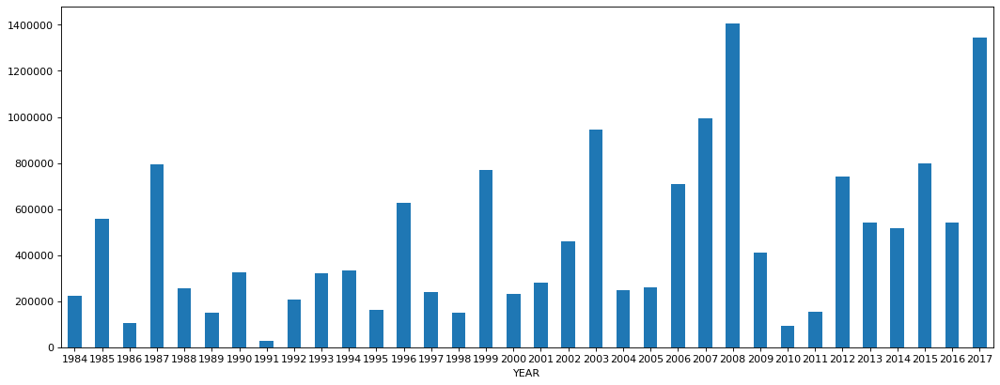

In [51]:



figure(figsize=(16, 6), dpi=80)

ax = cali_df.plot.bar(x='YEAR', y='val', rot=0)

    YEAR           sum          mean  count
29  2013  5.418900e+05  18685.862069     29
30  2014  5.159820e+05  15175.941176     34
31  2015  7.973550e+05  16272.551020     49
32  2016  5.416200e+05  11774.347826     46
33  2017  1.343441e+06  17223.606731     78


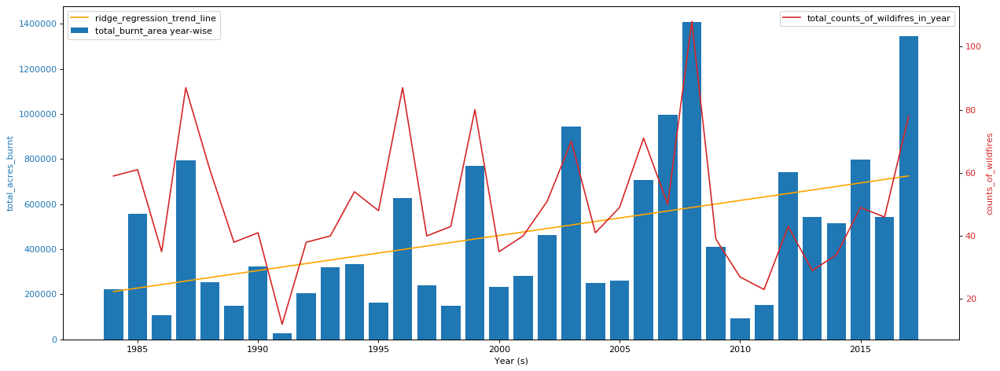

In [99]:


tmp_df = california_df.groupby(['YEAR'])['ACRES_x'].agg(['sum', 'mean', 'count']).reset_index()
print(tmp_df.tail())

lr = Ridge()
lr.fit(tmp_df[['YEAR']], tmp_df['sum'])







fig, ax1 = plt.subplots( figsize=(16, 6), dpi=80) 

color = 'tab:blue'
ax1.set_xlabel('Year (s)')
ax1.set_ylabel('total_acres_burnt', color=color)


ax1.bar(tmp_df["YEAR"], tmp_df["sum"], label = "total_burnt_area year-wise")
ax1.plot(tmp_df['YEAR'], lr.coef_*tmp_df['YEAR']+lr.intercept_, label = "ridge_regression_trend_line", color='orange')
ax1.legend(loc='upper left')
# ax1.plot(t, data1, color=color)
ax1.tick_params(axis='y', labelcolor=color)



ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:red'
ax2.set_ylabel('counts_of_wildfires', color=color)  # we already handled the x-label with ax1
ax2.plot(tmp_df['YEAR'], tmp_df["count"], label = "total_counts_of_wildifres_in_year", color=color)
ax2.legend(loc='upper right')
# ax2.plot(t, data2, color=color)

ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout() 





    STARTMONTH           sum          mean  count
7            8  4.825125e+06  11433.944580    422
8            9  1.978949e+06   9944.465182    199
9           10  2.255785e+06  13269.322681    170
10          11  1.360590e+05   4535.299229     30
11          12  3.340415e+05  23860.109353     14


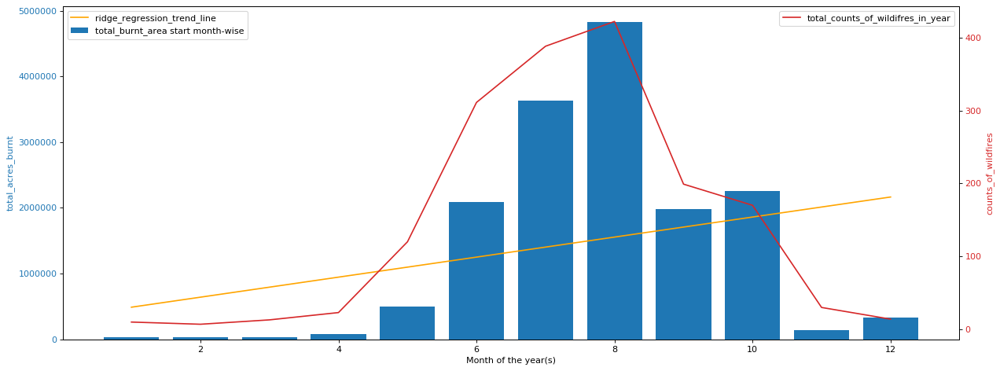

In [100]:

tmp_df = california_df.groupby(['STARTMONTH'])['ACRES_x'].agg(['sum', 'mean', 'count']).reset_index()
print(tmp_df.tail())

lr = Ridge()
lr.fit(tmp_df[['STARTMONTH']], tmp_df['sum'])







fig, ax1 = plt.subplots( figsize=(16, 6), dpi=80) 

color = 'tab:blue'
ax1.set_xlabel('Month of the year(s)')
ax1.set_ylabel('total_acres_burnt', color=color)


ax1.bar(tmp_df["STARTMONTH"], tmp_df["sum"], label = "total_burnt_area start month-wise")
# ax1.plot(tmp_df["STARTMONTH"], lr.coef_*tmp_df["STARTMONTH"]+lr.intercept_, label = "ridge_regression_trend_line", color='orange')
ax1.legend(loc='upper left')
# ax1.plot(t, data1, color=color)
ax1.tick_params(axis='y', labelcolor=color)



ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:red'
ax2.set_ylabel('counts_of_wildfires', color=color)  # we already handled the x-label with ax1
ax2.plot(tmp_df["STARTMONTH"], tmp_df["count"], label = "total_counts_of_wildifres_in_year", color=color)
ax2.legend(loc='upper right')
# ax2.plot(t, data2, color=color)

ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout() 


##  Now Analyzing the FPA 1.88 MIllion Dataset similarly plotting the corresponding severity and frequency plots per year . I can't get the exact month so can't perform a month level analysis.


In [28]:
fire_df = pd.read_csv("./fpa_data/Fires.csv")
fire_df = fire_df[fire_df["STATE"] == "CA"]
print(len(fire_df))
print(fire_df.columns)

/home/arishabh/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning:

Columns (9,11,12,13,14,15,16,17,18,19,36,38) have mixed types. Specify dtype option on import or set low_memory=False.



189550
Index(['index', 'OBJECTID', 'FOD_ID', 'FPA_ID', 'SOURCE_SYSTEM_TYPE',
       'SOURCE_SYSTEM', 'NWCG_REPORTING_AGENCY', 'NWCG_REPORTING_UNIT_ID',
       'NWCG_REPORTING_UNIT_NAME', 'SOURCE_REPORTING_UNIT',
       'SOURCE_REPORTING_UNIT_NAME', 'LOCAL_FIRE_REPORT_ID',
       'LOCAL_INCIDENT_ID', 'FIRE_CODE', 'FIRE_NAME',
       'ICS_209_INCIDENT_NUMBER', 'ICS_209_NAME', 'MTBS_ID', 'MTBS_FIRE_NAME',
       'COMPLEX_NAME', 'FIRE_YEAR', 'DISCOVERY_DATE', 'DISCOVERY_DOY',
       'DISCOVERY_TIME', 'STAT_CAUSE_CODE', 'STAT_CAUSE_DESCR', 'CONT_DATE',
       'CONT_DOY', 'CONT_TIME', 'FIRE_SIZE', 'FIRE_SIZE_CLASS', 'LATITUDE',
       'LONGITUDE', 'OWNER_CODE', 'OWNER_DESCR', 'STATE', 'COUNTY',
       'FIPS_CODE', 'FIPS_NAME', 'Shape'],
      dtype='object')


In [22]:
pd.set_option('display.max_columns', 40)
print(fire_df[100:108])

     index  OBJECTID  FOD_ID      FPA_ID SOURCE_SYSTEM_TYPE SOURCE_SYSTEM  \
554    554       555     562  FS-1420092                FED   FS-FIRESTAT   
558    558       559     566  FS-1420114                FED   FS-FIRESTAT   
576    576       577     584  FS-1420190                FED   FS-FIRESTAT   
593    593       594     601  FS-1420233                FED   FS-FIRESTAT   
596    596       597     604  FS-1420237                FED   FS-FIRESTAT   
597    597       598     605  FS-1420238                FED   FS-FIRESTAT   
598    598       599     606  FS-1420239                FED   FS-FIRESTAT   
599    599       600     608  FS-1420241                FED   FS-FIRESTAT   

    NWCG_REPORTING_AGENCY NWCG_REPORTING_UNIT_ID    NWCG_REPORTING_UNIT_NAME  \
554                    FS                USCASQF     Sequoia National Forest   
558                    FS                USCAPNF      Plumas National Forest   
576                    FS                USCALPF  Los Padres Natio

    FIRE_YEAR         sum        mean  count
19       2011  192286.920   22.458178   8562
20       2012  764766.640  106.099700   7208
21       2013  581410.292   66.652561   8723
22       2014  546878.780   84.212932   6494
23       2015  848728.610  115.238100   7365


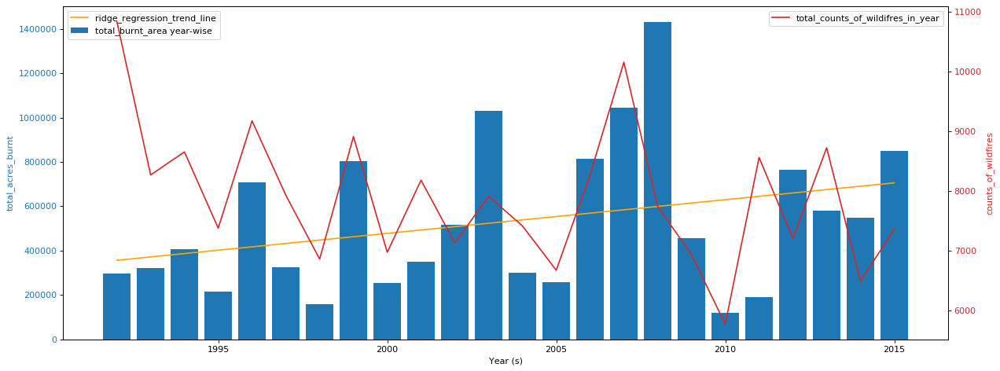

In [18]:
tmp_df = fire_df.groupby(['FIRE_YEAR'])['FIRE_SIZE'].agg(['sum', 'mean', 'count']).reset_index()
print(tmp_df.tail())

lr = Ridge()
lr.fit(tmp_df[['FIRE_YEAR']], tmp_df['sum'])







fig, ax1 = plt.subplots( figsize=(16, 6), dpi=80) 

color = 'tab:blue'
ax1.set_xlabel('Year (s)')
ax1.set_ylabel('total_acres_burnt', color=color)


ax1.bar(tmp_df["FIRE_YEAR"], tmp_df["sum"], label = "total_burnt_area year-wise")
ax1.plot(tmp_df['FIRE_YEAR'], lr.coef_*tmp_df['FIRE_YEAR']+lr.intercept_, label = "ridge_regression_trend_line", color='orange')
ax1.legend(loc='upper left')
# ax1.plot(t, data1, color=color)
ax1.tick_params(axis='y', labelcolor=color)



ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:red'
ax2.set_ylabel('counts_of_wildfires', color=color)  # we already handled the x-label with ax1
ax2.plot(tmp_df['FIRE_YEAR'], tmp_df["count"], label = "total_counts_of_wildifres_in_year", color=color)
ax2.legend(loc='upper right')
# ax2.plot(t, data2, color=color)

ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout() 


## Now applying a basic xgboost on FPA dataset for annual wildfire to measure the severity of the wildfires


In [ ]:
seed = 7
test_size = 0.33

tmp_df = fire_df.groupby(['FIRE_YEAR'])['FIRE_SIZE'].agg(['sum', 'mean', 'count']).reset_index()
print(tmp_df.tail())


xdata = np.vstack(tmp_df['FIRE_YEAR'])
print(xdata.shape)
ydata = tmp_df['sum'].to_numpy()
print(ydata.shape)



X_train, X_test, y_train, y_test = train_test_split(xdata, ydata, test_size=test_size, random_state=seed)

model = XGBClassifier()
model.fit(X_train, y_train)


## Now applying a basic xgboost on FPA dataset for annual wildfire to measure the frequency of the wildfires

In [ ]:
seed = 7
test_size = 0.33

tmp_df = fire_df.groupby(['FIRE_YEAR'])['FIRE_SIZE'].agg(['sum', 'mean', 'count']).reset_index()
print(tmp_df.tail())


xdata = np.vstack(tmp_df['FIRE_YEAR'])
print(xdata.shape)
ydata = tmp_df['count'].to_numpy()
print(ydata.shape)



X_train, X_test, y_train, y_test = train_test_split(xdata, ydata, test_size=test_size, random_state=seed)

model2 = XGBClassifier()
model2.fit(X_train, y_train)

# Below this, it is primarily used to do some expereimentation with how to get zipcode level historic climate data using NOAA api service, getting a chlorpleth level plotly map of california which could have been used for zip code level information, trial for setting up multiprocessing for API calls from arcGIS for reverse geo-encoding and other stuff.  

In [ ]:
month_cali_df = california_df.groupby(['STARTMONTH'])['ACRES_x'].sum()
lr2 = Ridge()
tmp_df = month_cali_df.to_frame().reset_index()
figure(figsize=(16, 6), dpi=80)

rolling_mean = tmp_df["ACRES_x"].rolling(window=1).mean()
# lr2.fit(tmp_df[['STARTMONTH']], tmp_df['ACRES_x'])
plt.bar(tmp_df["STARTMONTH"], tmp_df["ACRES_x"],  label = "total_burnt_area start month-wise")
plt.plot(tmp_df["STARTMONTH"], rolling_mean, label="rolling mean trend line", color = 'orange')
plt.legend(loc='upper left')

# plt.plot(tmp_df["STARTMONTH"], tmp_df["STARTMONTH"]/2, color = 'pink')
# plt.plot(tmp_df['STARTMONTH'], lr2.coef_*tmp_df['STARTMONTH']+lr2.intercept_, color='pink')


In [101]:
weather_df = pd.read_csv("./weather_data/2017_average_stats.csv")

print(weather_df.head())

#  NOAA Token:	lFwMvckwEalLnKohQrzGIyXLnXCuPPyO
    
    
    
    


    Lat    Lon  month       AWND  DAPR        EVAP        MDPR         PGTM  \
0  32.6 -117.2      1  31.965517   3.0  106.870968  489.000000  1294.419355   
1  32.6 -117.1      1  31.965517   2.0  106.870968  185.666667  1294.419355   
2  32.6 -117.0      1  24.290323   2.0  106.870968  185.666667  1294.419355   
3  32.6 -116.9      1  24.290323   2.0  106.870968  185.666667  1294.419355   
4  32.6 -116.8      1  24.290323   2.0  106.870968  185.666667  1294.419355   

        PRCP  SNOW  ...       WSF5  WT01  WT02  WT03  WT04  WT05  WT06  WT07  \
0  24.548387   0.0  ...  99.451613   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1  24.548387   0.0  ...  99.451613   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2  32.516129   0.0  ...  87.193548   1.0   1.0   0.0   0.0   0.0   0.0   0.0   
3  32.516129   0.0  ...  87.193548   1.0   1.0   0.0   0.0   0.0   0.0   0.0   
4  35.840000   0.0  ...  87.193548   0.0   0.0   0.0   0.0   0.0   0.0   0.0   

   WT08  WT11  
0   0.0   0.0  
1   0.0   0.

In [117]:
# print(california_df.head())

tmp_df = california_df[["YEAR", "STARTMONTH", "STARTDAY"]]


list_of_address = california_df["address+zipcode"].to_list()
# print(list_of_address[:2])

list_of_zipcode = [x.split("#")[-1].strip() for x in list_of_address ]
tmp_df["ZIPCODE"] = list_of_zipcode
tmp_df["no"] = 2000
tmp_df.insert(0, 'NEW_ID', range(0, 0 + len(tmp_df)))
tmp_df = tmp_df[["no", "NEW_ID", 'ZIPCODE','YEAR', 'STARTMONTH', 'STARTDAY']]


print(tmp_df.head())


tmp_df.to_csv("./output/get_nearby_data.csv", index=False)


# tmp_df["address+zipcode"] = 

        no  NEW_ID ZIPCODE  YEAR  STARTMONTH  STARTDAY
3410  2000       0   93420  1984           6        21
4380  2000       1   96096  1984          10         5
3358  2000       2   93222  1984           8        10
3959  2000       3   95370  1984           7        30
3397  2000       4   93420  1984           5        28


/home/arishabh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/arishabh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [127]:



url = "http://www.ncdc.noaa.gov/cdo-services/services/datasets/GHCND/locations/ZIP:93420/data?year=1984&month=6&day=21&_type=xml&token=FwMvckwEalLnKohQrzGIyXLnXCuPPyO"
response = requests.get(url) 
print(response.text)
# data = response.json()
# print(data)



def parallelize(data, func, num_of_processes=24):
    data_split = np.array_split(data, num_of_processes)
    pool = Pool(num_of_processes)
    data = pd.concat(pool.map(func, data_split))
    pool.close()
    pool.join()
    return data

def run_on_subset(func, data_subset):
    return data_subset.progress_apply(func, axis=1)

def parallelize_on_rows(data, func, num_of_processes=8):
    return parallelize(data, partial(run_on_subset, func), num_of_processes)



# def get_state(row):
#     Latitude = str(row['LATITUDE'])  
#     Longitude = str(row['LONGITUDE'])
#     location = geolocator.reverse(Latitude+","+Longitude)
#     address = location.raw['address']
#     state = address.get('state', '')
#     print(state)
#     return state




def get_temperature(row):
    
    zipcode = row['ZIPCODE']  
    year = row['YEAR']
    month = row['STARTMONTH']
    day = row['STARTDAY']
    token = "FwMvckwEalLnKohQrzGIyXLnXCuPPyO"
    url = "http://www.ncdc.noaa.gov/cdo-services/services/datasets/GHCND/locations/ZIP:{}/data?year={}&month={}&day={}&_type=xml&token=FwMvckwEalLnKohQrzGIyXLnXCuPPyO".format(zipcode, year, month, day)

    #print(" Latitude {} and Logintude {} ".format(Latitude, Longitude))
    response = requests.get(url, headers = token) 
    data = response.json()
    print(data)
    return data

output_df = parallelize_on_rows(tmp_df, get_temperature) 


# url = "http://www.ncdc.noaa.gov/cdo-web/api/v2/data?datasetid=GHCNDMS&locationid=ZIP:28801&startdate=2000-01-01&enddate=2010-01-01"


<!doctype html><html lang="en"><head><title>HTTP Status 404 – Not Found</title><style type="text/css">body {font-family:Tahoma,Arial,sans-serif;} h1, h2, h3, b {color:white;background-color:#525D76;} h1 {font-size:22px;} h2 {font-size:16px;} h3 {font-size:14px;} p {font-size:12px;} a {color:black;} .line {height:1px;background-color:#525D76;border:none;}</style></head><body><h1>HTTP Status 404 – Not Found</h1><hr class="line" /><p><b>Type</b> Status Report</p><p><b>Description</b> The origin server did not find a current representation for the target resource or is not willing to disclose that one exists.</p><hr class="line" /></body></html>




  0%|          | 0/214 [00:00<?, ?it/s]

  0%|          | 0/214 [00:00<?, ?it/s]

  0%|          | 0/214 [00:00<?, ?it/s]

  0%|          | 0/213 [00:00<?, ?it/s]

  0%|          | 0/213 [00:00<?, ?it/s]

  0%|          | 0/213 [00:00<?, ?it/s]

  1%|          | 2/214 [00:00<00:10, 20.07it/s]


  1%|          | 2/213 [00:00<00:00, 236.04it/s]


AttributeError: ("'str' object has no attribute 'items'", 'occurred at index 3410')

In [93]:

tmp_df = california_df.groupby(['YEAR'])['ACRES_x'].agg(['sum', 'mean', 'count'])
print(tmp_df.tail())
print(len(california_df))
print(sum(tmp_df["count"]))


               sum          mean  count
YEAR                                   
2013  5.418900e+05  18685.862069     29
2014  5.159820e+05  15175.941176     34
2015  7.973550e+05  16272.551020     49
2016  5.416200e+05  11774.347826     46
2017  1.343441e+06  17223.606731     78
1707
1707


In [8]:



# username
# password 

# gis = GIS("http://www.arcgis.com", username, password)




#     location = reverse_geocode((Geometry({"x":float(Latitude), "y":float(Longitude), "spatialReference":{"wkid": 4326}})))
#     tmp_str =  location['address']['Match_addr'] + " # " + location['address']['Region'] + " # " + location['address']['Postal']
#     return tmp_str
#     location = geolocator.reverse(Latitude+","+Longitude)
#     address = 
#     state = location.raw['address']['state']
#     zipcode = location.raw['address']['postcode']
#     print (state)
#     print(zipcode)
#     combined_str = zipcode + " " + state
#     return combined_str
    


    
addresses = 
    
pool = multiprocessing.Pool(processes=multiprocessing.cpu_count())
# Apply geocode worker to each address, asynchronously
addresses = pool.map(geocode_worker, addresses)

    
# merged_df.progress_apply(lambda row: label_race(row), axis=1)

# merged_df.to_pickle("./output/merged_df_burn_area_and_df_fire_occurence.pkl")
    

print(merged_df.head())












  1%|▏         | 288/22969 [02:24<3:14:41,  1.94it/s]


  2%|▏         | 574/22969 [04:47<3:07:17,  1.99it/s]


  4%|▎         | 860/22969 [07:10<3:04:37,  2.00it/s]


  5%|▍         | 1144/22969 [09:33<3:05:42,  1.96it/s]


  5%|▌         | 1180/22969 [09:51<2:53:54,  2.09it/s]

KeyboardInterrupt: 

In [16]:

def get_zipcode(df, geolocator, lat_field, lon_field):
    location = geolocator.reverse((df[lat_field], df[lon_field]))
    return location.raw['address']['postcode']


geolocator = geopy.Nominatim(user_agent='getting_zip')

df = pd.DataFrame({
    'Lat': [ 29.39291,  29.39923, 56.742, 29.40147, 29.38752, 29.39291, 29.39537, 29.39343, 29.39291, 29.39556],
    'Lon': [ -98.50925, -98.51256, -157.938, -98.51123, -98.52372, -98.50925, -98.50402, -98.49707, -98.50925, -98.53148]
})
zipcodes = df.apply(get_zipcode, axis=1, geolocator=geolocator, lat_field='Lat', lon_field='Lon')
print(zipcodes)

KeyError: ('postcode', 'occurred at index 2')

In [9]:



def get_zip(df, lon_field, lat_field):
    location = reverse_geocode((Geometry({"x":float(df[lon_field]), "y":float(df[lat_field]), "spatialReference":{"wkid": 4326}})))
    tmp_str =  location['address']['Match_addr'] + " #  "+ location['address']['Region'] + " # " location['address']['Postal']
    return tmp_str
    
# df = pd.DataFrame({
#     'Lat': [29.39291],
#     'Lon': [-98.50925]
# })

# zipcodes = df.apply(get_zip, axis=1, lat_field='Lat', lon_field='Lon')

# print(zipcodes)

{'address': {'Match_addr': '1002 Edwards, San Antonio, Texas, 78204', 'LongLabel': '1002 Edwards, San Antonio, TX, 78204, USA', 'ShortLabel': '1002 Edwards', 'Addr_type': 'PointAddress', 'Type': '', 'PlaceName': '', 'AddNum': '1002', 'Address': '1002 Edwards', 'Block': '', 'Sector': '', 'Neighborhood': '', 'District': '', 'City': 'San Antonio', 'MetroArea': '', 'Subregion': 'Bexar County', 'Region': 'Texas', 'Territory': '', 'Postal': '78204', 'PostalExt': '', 'CountryCode': 'USA'}, 'location': {'x': -98.50914201629774, 'y': 29.39279501298107, 'spatialReference': {'wkid': 4326, 'latestWkid': 4326}}}
0    78204
dtype: object


In [27]:
from arcgis.geocoding import reverse_geocode
from arcgis.geometry import Geometry
from arcgis.gis import GIS
from tqdm import tqdm


tqdm.pandas()


username = "berkeleylabs"
password = "Berkeleylabs@1234"

gis = GIS("http://www.arcgis.com", username, password)


Longitude =  56.742  
Latitude = -157.938 
location = reverse_geocode((Geometry({"x":float(Latitude), "y":float(Longitude), "spatialReference":{"wkid": 4326}})))
tmp_str =  location['address']['Match_addr'] + " # " + location['address']['Region'] + " # " + location['address']['Postal']
print(tmp_str)


# def label_race (row):
#     Latitude = row['LATITUDE']  
#     Longitude = row['LONGITUDE']
#     location = reverse_geocode((Geometry({"x":float(Latitude), "y":float(Longitude), "spatialReference":{"wkid": 4326}})))
#     tmp_str =  location['address']['Match_addr'] + " # " + location['address']['Region'] + " # " + location['address']['Postal']
#     return tmp_str
# #     location = geolocator.reverse(Latitude+","+Longitude)
# #     address = 
# #     state = location.raw['address']['state']
# #     zipcode = location.raw['address']['postcode']
# #     print (state)
# #     print(zipcode)
# #     combined_str = zipcode + " " + state
# #     return combined_str
    
    
# merged_df.progress_apply(lambda row: label_race(row), axis=1)

# merged_df.to_pickle("./output/merged_df_burn_area_and_df_fire_occurence.pkl")
    

# print(merged_df.head())

99549, Port Heiden, Alaska # Alaska # 99549


In [11]:
# import plotly.express as px

# df = px.data.election()
# geojson = px.data.election_geojson()

# fig = px.choropleth(df, geojson=geojson, color="winner",
#                     locations="district", featureidkey="properties.district",
#                     projection="mercator", hover_data=["Bergeron", "Coderre", "Joly"]
#                    )
# fig.update_geos(fitbounds="locations", visible=False)
# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
# fig.show()

In [14]:
import geopandas as gp
df = gp.read_file("./shapefile_us_counties/cb_2018_06_bg_500k.shp")

In [6]:
import plotly
import geopandas as gp
from plotly.figure_factory._county_choropleth import create_choropleth
import plotly.figure_factory as ff
import plotly.graph_objects as go
import pandas as pd

scope = ['California']

df_sample = pd.read_csv(
    'https://raw.githubusercontent.com/plotly/datasets/master/minoritymajority.csv'
)
df_sample_r = df_sample[df_sample['STNAME'].isin(scope)]


us_zips = pd.read_csv("./us_zips/uszips.csv")
us_zips = us_zips[us_zips['state_name'] == "California" ]

fips = us_zips['county_fips'].tolist()



freq_for_wildfire = dict.fromkeys(fips)
# val  = freq_for_wildfire.values()

print(len(fips))
print(len(freq_for_wildfire.keys()))
print(len(val))

# colorscale = ["#8dd3c7", "#ffffb3", "#bebada", "#fb8072",
#               "#80b1d3", "#fdb462", "#b3de69", "#fccde5",
#               "#d9d9d9", "#bc80bd", "#ccebc5", "#ffed6f",
#               "#8dd3c7", "#ffffb3", "#bebada", "#fb8072",
#               "#80b1d3", "#fdb462", "#b3de69", "#fccde5",
#               "#d9d9d9", "#bc80bd", "#ccebc5", "#ffed6f",
#               "#8dd3c7", "#ffffb3", "#bebada", "#fb8072",
#               "#80b1d3", "#fdb462", "#b3de69", "#fccde5",
#               "#d9d9d9", "#bc80bd", "#ccebc5", "#ffed6f",
             
#               "#80b1d3", "#fdb462", "#b3de69", "#fccde5",
#               "#d9d9d9", "#bc80bd", "#ccebc5", "#ffed6f",
#               "#8dd3c7", "#ffffb3", "#bebada", "#fb8072",
#               "#80b1d3", "#fdb462", "#b3de69", "#fccde5",
#               "#d9d9d9", "#bc80bd", "#ccebc5", "#ffed6f",
              
#               "#8dd3c7", "#ffffb3"
             
#              ]


# print(len(colorscale))

# fig = create_choropleth(
#     fips=fips, values=values, scope=scope,
#     colorscale=colorscale, round_legend_values=True,
#     simplify_county=0, simplify_state=0,
#     county_outline={'color': 'rgb(15, 15, 55)', 'width': 0.5},
#     state_outline={'width': 1},
#     legend_title='pop. per county',
#     title='Oregon'
# )

# fig.layout.template = None
# fig.show()

1761
58


NameError: name 'val' is not defined

In [26]:
fig = create_choropleth(
    fips=fips, values=values, scope=scope,
     round_legend_values=True,
    simplify_county=0, simplify_state=0,
    county_outline={'color': 'rgb(15, 15, 55)', 'width': 0.5},
    state_outline={'width': 1},
    legend_title='',
    title='California'
)

fig.layout.template = None
fig.show()

PlotlyError: fips and values must be the same length

In [16]:
from arcgis.geocoding import reverse_geocode
from arcgis.geometry import Geometry
from arcgis.gis import GIS


username = "berkeleylabs"
password = "Berkeleylabs@1234"

gis = GIS("http://www.arcgis.com", username, password)

def get_zip(df, lon_field, lat_field):
    location = reverse_geocode((Geometry({"x":float(df[lon_field]), "y":float(df[lat_field]), "spatialReference":{"wkid": 4326}})))
    return location['address']['Postal']

df = pd.DataFrame({
    'Lat': [29.39291, 29.39923, 29.40147, 29.38752, 29.39291, 29.39537, 29.39343, 29.39291, 29.39556],
    'Lon': [-98.50925, -98.51256, -98.51123, -98.52372, -98.50925, -98.50402, -98.49707, -98.50925, -98.53148]
})

zipcodes = df.apply(get_zip, axis=1, lat_field='Lat', lon_field='Lon')

print(zipcodes)

0    78204
1    78204
2    78204
3    78225
4    78204
5    78204
6    78204
7    78204
8    78225
dtype: object


1761
         zip       lat        lng         city state_id  state_name  zcta  \
30002  90001  33.97398 -118.24955  Los Angeles       CA  California  True   
30003  90002  33.94901 -118.24674  Los Angeles       CA  California  True   
30004  90003  33.96411 -118.27370  Los Angeles       CA  California  True   
30005  90004  34.07621 -118.31084  Los Angeles       CA  California  True   

       parent_zcta  population  density  county_fips  county_name  \
30002          NaN     59832.0   6595.9         6037  Los Angeles   
30003          NaN     53302.0   6721.1         6037  Los Angeles   
30004          NaN     73730.0   8016.2         6037  Los Angeles   
30005          NaN     60541.0   7668.7         6037  Los Angeles   

         county_weights county_names_all county_fips_all  imprecise  military  \
30002  {"06037": "100"}      Los Angeles           06037      False     False   
30003  {"06037": "100"}      Los Angeles           06037      False     False   
30004  {"06037": "10

In [16]:


#set up the file path and read the shapefile data
shapefile = "./2010_2018_perimenter/HistoricFirePerimeters_2010_2018.shx"
map_df = gp.read_file(shapefile)
map_df.to_crs(pyproj.CRS.from_epsg(4326), inplace=True)
# #read the csv data
# df = pd.read_csv('District.csv')
# You may want to check and see what the shapefile looks like:
# #see what the map looks like
map_df.plot(figsize=(20, 10))


NameError: name 'pyproj' is not defined

In [15]:

pd.set_option('display.max_columns', None)
print(map_df['geometry'][:1])

0    POLYGON ((-113.15346035 42.16329723500007, -11...
Name: geometry, dtype: object


In [24]:
print(list(map_df.columns))
print(map_df[:10])

['AGENCY', 'COMMENTS', 'DATE_CUR', 'FIRE_YEAR', 'GEO_ID', 'GIS_ACRES', 'INCIDENT', 'IRWINID', 'LOCAL_NUM', 'MAP_METHOD', 'POO_RESP', 'SOURCE', 'UNIT_ID', 'UNQEFIREID', 'FEATURE_CA', 'Shape_Leng', 'Shape_Area', 'geometry']
  AGENCY                         COMMENTS  DATE_CUR FIRE_YEAR  \
0    BLM                             None  20120808      2012   
1    BLM                             None  20120811      2012   
2    BLM                             None  20120818      2012   
3    BLM                       bLACK mine  20120709      2012   
4    BLM                             None  20121013      2012   
5    BLM                             iPad  99990909      2013   
6    BLM                       Garmin GPS  20140730      2014   
7    BLM                             None  20140705      2014   
8    BLM                             None  99990909      2014   
9    BLM  Garmin conversion from txt file  20140714      2014   

                                   GEO_ID    GIS_ACRES      IN

In [3]:







import sqlite3

# con = sqlite3.connect("./us_wildfires_data_kaggle/FPA_FOD_20170508.sqlite")

con = sqlite3.connect("./fpa_data/FPA_FOD_20170508.sqlite")
cursor = con.cursor()
cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
print(cursor.fetchall())
con.close()

# df = pd.read_sql_query("SELECT * from surveys", con)

# Verify that result of SQL query is stored in the dataframe
# print(df.head())



def to_csv(path):
    db = sqlite3.connect(path)
    cursor = db.cursor()
    cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
    tables = cursor.fetchall()
    for table_name in tables:
        print(table_name)
        try:
            table_name = table_name[0]
            table = pd.read_sql_query("SELECT * from %s" % table_name, db)
            table.to_csv("./fpa_data/" +table_name + '.csv', index_label='index')
        except:
            pass
    
    cursor.close()
    db.close()
    
    
to_csv("./fpa_data/FPA_FOD_20170508.sqlite")


[('spatial_ref_sys',), ('spatialite_history',), ('sqlite_sequence',), ('geometry_columns',), ('spatial_ref_sys_aux',), ('views_geometry_columns',), ('virts_geometry_columns',), ('geometry_columns_statistics',), ('views_geometry_columns_statistics',), ('virts_geometry_columns_statistics',), ('geometry_columns_field_infos',), ('views_geometry_columns_field_infos',), ('virts_geometry_columns_field_infos',), ('geometry_columns_time',), ('geometry_columns_auth',), ('views_geometry_columns_auth',), ('virts_geometry_columns_auth',), ('sql_statements_log',), ('SpatialIndex',), ('ElementaryGeometries',), ('KNN',), ('Fires',), ('idx_Fires_Shape',), ('idx_Fires_Shape_node',), ('idx_Fires_Shape_rowid',), ('idx_Fires_Shape_parent',), ('NWCG_UnitIDActive_20170109',)]
('spatial_ref_sys',)
('spatialite_history',)
('sqlite_sequence',)
('geometry_columns',)
('spatial_ref_sys_aux',)
('views_geometry_columns',)
('virts_geometry_columns',)
('geometry_columns_statistics',)
('views_geometry_columns_statistic

In [7]:



import geopandas as gp
ca_shapefile_df = gp.read_file("./CA_Shapefile/cb_2018_us_state_500k.shp")

print(ca_shapefile_df.head())

# import plotly
# import geopandas as gp
# from plotly.figure_factory._county_choropleth import create_choropleth
# import plotly.figure_factory as ff
# import plotly.graph_objects as go
# import pandas as pd

# scope = ['California']

# df_sample = pd.read_csv(
#     'https://raw.githubusercontent.com/plotly/datasets/master/minoritymajority.csv'
# )
# df_sample_r = df_sample[df_sample['STNAME'].isin(scope)]



  STATEFP   STATENS     AFFGEOID GEOID STUSPS            NAME LSAD  \
0      28  01779790  0400000US28    28     MS     Mississippi   00   
1      37  01027616  0400000US37    37     NC  North Carolina   00   
2      40  01102857  0400000US40    40     OK        Oklahoma   00   
3      51  01779803  0400000US51    51     VA        Virginia   00   
4      54  01779805  0400000US54    54     WV   West Virginia   00   

          ALAND       AWATER  \
0  121533519481   3926919758   
1  125923656064  13466071395   
2  177662925723   3374587997   
3  102257717110   8528531774   
4   62266474513    489028543   

                                            geometry  
0  (POLYGON ((-88.502966 30.215235, -88.491759 30...  
1  (POLYGON ((-75.72680699999999 35.935844, -75.7...  
2  POLYGON ((-103.002565 36.526588, -103.002188 3...  
3  (POLYGON ((-75.742406 37.80835, -75.741512 37....  
4  POLYGON ((-82.6431981036679 38.1690897960737, ...  


In [9]:
ca_shapefile_dbf = Dbf5('./CA_Shapefile/cb_2018_us_state_500k.dbf').to_dataframe()
# df_fire_occurence = dbf.to_dataframe().sort_values(by=['FIRE_ID'])
# print (df_fire_occurence.head())
# print(len(df_fire_occurence))
print(ca_shapefile_dbf.head())
print(len(ca_shapefile_dbf))

  STATEFP   STATENS     AFFGEOID GEOID STUSPS            NAME LSAD  \
0      28  01779790  0400000US28    28     MS     Mississippi   00   
1      37  01027616  0400000US37    37     NC  North Carolina   00   
2      40  01102857  0400000US40    40     OK        Oklahoma   00   
3      51  01779803  0400000US51    51     VA        Virginia   00   
4      54  01779805  0400000US54    54     WV   West Virginia   00   

          ALAND       AWATER  
0  121533519481   3926919758  
1  125923656064  13466071395  
2  177662925723   3374587997  
3  102257717110   8528531774  
4   62266474513    489028543  
56


/home/arishabh/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning:

Columns (9,11,12,13,14,15,16,17,18,19,36,38) have mixed types. Specify dtype option on import or set low_memory=False.



   index  OBJECTID  FOD_ID      FPA_ID SOURCE_SYSTEM_TYPE SOURCE_SYSTEM  \
0      0         1       1  FS-1418826                FED   FS-FIRESTAT   
1      1         2       2  FS-1418827                FED   FS-FIRESTAT   
2      2         3       3  FS-1418835                FED   FS-FIRESTAT   
3      3         4       4  FS-1418845                FED   FS-FIRESTAT   
4      4         5       5  FS-1418847                FED   FS-FIRESTAT   

  NWCG_REPORTING_AGENCY NWCG_REPORTING_UNIT_ID  NWCG_REPORTING_UNIT_NAME  \
0                    FS                USCAPNF    Plumas National Forest   
1                    FS                USCAENF  Eldorado National Forest   
2                    FS                USCAENF  Eldorado National Forest   
3                    FS                USCAENF  Eldorado National Forest   
4                    FS                USCAENF  Eldorado National Forest   

  SOURCE_REPORTING_UNIT  ... FIRE_SIZE_CLASS   LATITUDE   LONGITUDE  \
0                   5

1880465


1880465
Index(['index', 'OBJECTID', 'FOD_ID', 'FPA_ID', 'SOURCE_SYSTEM_TYPE',
       'SOURCE_SYSTEM', 'NWCG_REPORTING_AGENCY', 'NWCG_REPORTING_UNIT_ID',
       'NWCG_REPORTING_UNIT_NAME', 'SOURCE_REPORTING_UNIT',
       'SOURCE_REPORTING_UNIT_NAME', 'LOCAL_FIRE_REPORT_ID',
       'LOCAL_INCIDENT_ID', 'FIRE_CODE', 'FIRE_NAME',
       'ICS_209_INCIDENT_NUMBER', 'ICS_209_NAME', 'MTBS_ID', 'MTBS_FIRE_NAME',
       'COMPLEX_NAME', 'FIRE_YEAR', 'DISCOVERY_DATE', 'DISCOVERY_DOY',
       'DISCOVERY_TIME', 'STAT_CAUSE_CODE', 'STAT_CAUSE_DESCR', 'CONT_DATE',
       'CONT_DOY', 'CONT_TIME', 'FIRE_SIZE', 'FIRE_SIZE_CLASS', 'LATITUDE',
       'LONGITUDE', 'OWNER_CODE', 'OWNER_DESCR', 'STATE', 'COUNTY',
       'FIPS_CODE', 'FIPS_NAME', 'Shape'],
      dtype='object')


    FIRE_YEAR           sum        mean  count
19       2011  9.623597e+06  106.277026  90552
20       2012  9.439888e+06  129.724037  72769
21       2013  4.492502e+06   69.350145  64780
22       2014  3.673490e+06   54.218860  67753
23       2015  1.021827e+07  137.174526  74491


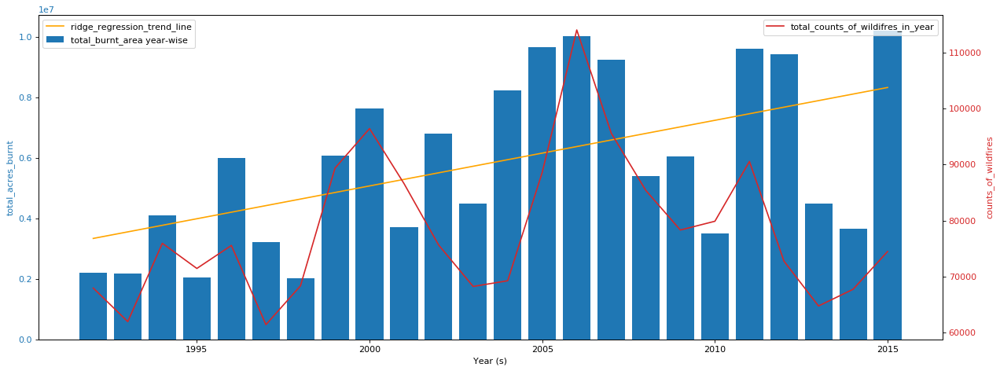

In [15]:
tmp_df = fire_df.groupby(['FIRE_YEAR'])['FIRE_SIZE'].agg(['sum', 'mean', 'count']).reset_index()
print(tmp_df.tail())

lr = Ridge()
lr.fit(tmp_df[['FIRE_YEAR']], tmp_df['sum'])







fig, ax1 = plt.subplots( figsize=(16, 6), dpi=80) 

color = 'tab:blue'
ax1.set_xlabel('Year (s)')
ax1.set_ylabel('total_acres_burnt', color=color)


ax1.bar(tmp_df["FIRE_YEAR"], tmp_df["sum"], label = "total_burnt_area year-wise")
ax1.plot(tmp_df['FIRE_YEAR'], lr.coef_*tmp_df['FIRE_YEAR']+lr.intercept_, label = "ridge_regression_trend_line", color='orange')
ax1.legend(loc='upper left')
# ax1.plot(t, data1, color=color)
ax1.tick_params(axis='y', labelcolor=color)



ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:red'
ax2.set_ylabel('counts_of_wildfires', color=color)  # we already handled the x-label with ax1
ax2.plot(tmp_df['FIRE_YEAR'], tmp_df["count"], label = "total_counts_of_wildifres_in_year", color=color)
ax2.legend(loc='upper right')
# ax2.plot(t, data2, color=color)

ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout() 